In [1]:
##analysis of network influence by focusing on the dynamics of individual nodes
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os,sys,inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir)
#ABOVE added to use development version of cana
#from __future__ import division
#import os
import math
import numpy as np
#import pandas as pd
#pd.options.display.float_format = '{:.2g}'.format
#import graphviz
import cana
#from cana.drawing import draw_canalizing_map_graphviz
#from cana.drawing import draw_dynamics_canalization_map_graphviz
#import matplotlib as mpl
#import matplotlib.style
#mpl.style.use('classic')
#from matplotlib.text import Text
#from matplotlib.patches import Circle, Rectangle, RegularPolygon
#from matplotlib.collections import PatchCollection
import random
from copy import copy
#mpl.rc('font', **{'size':16})
import matplotlib.pyplot as plt
from cana.datasets.bio import THALIANA, DROSOPHILA, BUDDING_YEAST, LEUKEMIA, BREAST_CANCER
from itertools import combinations
#from IPython.display import display, Image, Latex, SVG, HTML
#import subprocess
#
import json
#import ast
#BELOW added for graphviz to work on windows
#os.environ["PATH"] += os.pathsep + "C:/Anaconda/pkgs/graphviz-2.38.0-4/Library/bin/"
#os.environ["PATH"] += os.pathsep + 'C:/Anaconda/Library/bin/graphviz/'
os.environ["PATH"] += os.pathsep + 'C:\Users\tjparmer\Miniconda2\Lib\site-packages\graphviz'
import networkx as nx
from cana.utils import statenum_to_binstate, binstate_to_statenum
#from networkx_addon import information_propagation as ip
import time
from utils import *
from scipy.stats import spearmanr
import gc #only needed to clean up memory

#### General Threshold Networks

In [3]:
from modules import *

In [4]:
#NOTE: this function breaks if the node name has a comma or other punctuation in it, e.g. Clb1,2
#NOTE: this function breaks if a node has more than 36 inputs
#TODO: make this more robust to bad naming to avoid manual fixes
import sympy as sp
from sympy.logic.boolalg import to_dnf,is_dnf
import re
#nodes=['PTC_P1','HH_P4','HH_P2']
expr="PH_P1*=PTC_P1 and (not HH_P4 or not HH_P2)"
expr="wg_P1*=(CIA_P1 and SLP_P1 and not CIR_P1) or (wg_P1 and (CIA_P1 or SLP_P1) and not CIR_P1)"
expr="wg*=(CIA and SLP and not CI) or (wg and (CIA or SLP) and not CIR)"
expr="IL2RA*=(IL2 and IL2RAT) and not IL2RA"

def convert_dnf(expr,nodes):
    """ convert logical expresion to disjunctive normal form; returns both the dnf and the dnf of the expression's negation 
    expects expr in a format such as PH_P1*=PTC_P1 and (not HH_P4 or not HH_P2) 
    nodes is required as a list of all variable names that may occur in the expression """
    
    expr=expr.split('*=')[1]
    literals=[node for node in nodes if node in re.findall(r'\w+',expr)] #variables present in the expression; use regex to separate words
    literals=sorted(literals,reverse=True) #reverse sort to avoid replacing partial names
    variables=['v'+str(i) if i<10 else 'v'+chr(i+55) for i in range(len(literals))] #over 10 variables, must use letters; input limit=36
    #print literals,variables
    for i,node in enumerate(literals): #convert to generic variables that work with exec and eval
        expr=expr.replace(node,variables[i])
    exec(','.join(variables) + " = sp.symbols(','.join(variables))")
    expr=expr.replace('and','&') #convert to operators compatible with sympy
    expr=expr.replace('or','|')
    expr=expr.replace('not','~')
    #print expr,eval(expr)
    #eval(expr).subs({v0: True, v1: False, v2: False})
    dnf_expr=str(to_dnf(eval(expr)))
    nexpr='~('+expr+')'
    #print nexpr
    dnf_nexpr=str(to_dnf(eval(nexpr)))
    for i,node in enumerate(literals): #convert back to node names
        dnf_expr=dnf_expr.replace(variables[i],node)
        dnf_nexpr=dnf_nexpr.replace(variables[i],node)
    return dnf_expr,dnf_nexpr

#convert_dnf(expr,nodes) #['IL2','IL2RA','IL2RAT']

In [627]:
#to_dnf has errors when there are more than 10 variables using my naming convention
filename=mypath+n.name+'.txt'
filename=mypath+'IGVH mutations in chronic lymphocytic leukemia.txt'
with open(filename) as f:
    lines=f.readlines()
    nodes=[line.split('*=')[0] for line in lines if line[0]!='#']
    print len(nodes)#,nodes
expr="PTEN*= ( ( ( ( ( ( FRK and ( ( ( RRM1  and BMI1  and ILK  and TNF  and INPP5D  and IFNGR2  and EGR1 ) ) )     ) and not ( AEBP1  )  ) and not ( TGFBR3  )  ) and not ( ADM  )  ) and not ( CSNK2A2  )  ) and not ( BMI1  ) )  or ( ( ( ( EGR1 and ( ( ( RRM1  and BMI1  and ILK  and INPP5D  and FRK ) ) )     ) and not ( AEBP1  )  ) and not ( TGFBR3  )  ) and not ( BMI1  ) )"
convert_dnf(expr,nodes)

91


('(RRM1 & INPP5D & ILK & FRK & EGR1 & BMI1 & ~TGFBR3 & ~BMI1 & ~AEBP1) | (TNF & RRM1 & INPP5D & ILK & IFNGR2 & FRK & EGR1 & BMI1 & ~TGFBR3 & ~CSNK2A2 & ~BMI1 & ~AEBP1 & ~ADM)',
 'TGFBR3 | BMI1 | AEBP1 | ~RRM1 | ~INPP5D | ~ILK | ~FRK | ~EGR1 | ~BMI1 | (TGFBR3 & CSNK2A2) | (TGFBR3 & BMI1) | (TGFBR3 & AEBP1) | (TGFBR3 & ADM) | (CSNK2A2 & BMI1) | (CSNK2A2 & AEBP1) | (BMI1 & AEBP1) | (BMI1 & ADM) | (AEBP1 & ADM) | (TGFBR3 & ~TNF) | (TGFBR3 & ~RRM1) | (TGFBR3 & ~INPP5D) | (TGFBR3 & ~ILK) | (TGFBR3 & ~IFNGR2) | (TGFBR3 & ~FRK) | (TGFBR3 & ~EGR1) | (TGFBR3 & ~BMI1) | (CSNK2A2 & ~RRM1) | (CSNK2A2 & ~INPP5D) | (CSNK2A2 & ~ILK) | (CSNK2A2 & ~FRK) | (CSNK2A2 & ~EGR1) | (CSNK2A2 & ~BMI1) | (BMI1 & ~TNF) | (BMI1 & ~RRM1) | (BMI1 & ~INPP5D) | (BMI1 & ~ILK) | (BMI1 & ~IFNGR2) | (BMI1 & ~FRK) | (BMI1 & ~EGR1) | (BMI1 & ~BMI1) | (AEBP1 & ~TNF) | (AEBP1 & ~RRM1) | (AEBP1 & ~INPP5D) | (AEBP1 & ~ILK) | (AEBP1 & ~IFNGR2) | (AEBP1 & ~FRK) | (AEBP1 & ~EGR1) | (AEBP1 & ~BMI1) | (ADM & ~RRM1) | (ADM & ~INPP5D) 

In [5]:
#read file with expressions in any logical form and return positive/negative expressions in dnf
def file_to_dnf(filename):
    with open(filename) as f:
        lines=f.readlines()
        nodes=[line.split('*=')[0] for line in lines if line[0]!='#']
        #print len(nodes)
    expressions={}
    for line in lines:
        if line[0]!='#':
            var=line.split('*=')[0]
            #print line.strip(),var
            expr,nexpr=convert_dnf(line.strip(),nodes)
            #print '\n'.join(['Positive: '+expr,'Negative: '+nexpr,''])
            expressions[var]=(expr,nexpr)
            
    return expressions
            
#file_to_dnf("drosophila_single_cell.txt")
#file_to_dnf("cana/datasets/leukemia.txt")

In [6]:
#turn prime implicants into DNF expression
def pi_to_dnf(node): #takes a BooleanNode as input
    pi_lut=node.schemata_look_up_table(type='pi')
    inputs=node.inputs
    pos,neg="(","("
    #print pi_lut,inputs
    for k,row in enumerate(pi_lut['In:']):
        expr=""
        for i in range(len(row)):
            if row[i]=='0': expr+='~'+inputs[i]+' & '
            elif row[i]=='1': expr+=inputs[i]+' & '
        if '&' in expr: expr=expr[:-3] #cut off trailing &
        output=pi_lut['Out:'][k]
        if output==0: neg+=expr+') | ('
        else: pos+=expr+') | ('
        #print expr,pi_lut['Out:'][k]
    if '|' in pos: pos=pos[:-4]
    if '|' in neg: neg=neg[:-4]
    return pos,neg
     
#for node in n.nodes:
#    if node.name=='MTa45aFrag': break
#pi_to_dnf(node)

In [7]:
#read file with expressions in any logical form as BooleanNetwork, reduce to PIs, and return positive/negative expressions in dnf
from cana import BooleanNetwork
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\EXPR_extracted\\"

def file_to_pi(filename):
    
    expressions={}
    n=BooleanNetwork.from_file(filename,file_type='logical') #must convert to BooleanNetwork first to use QM algorithm
    #print f,len(n.nodes),max([len(node.inputs) for node in n.nodes]),n.name
    for node in n.nodes:
        var=node.name
        expr,nexpr=pi_to_dnf(node)
        #print var,'\n'.join(['Positive: '+expr,'Negative: '+nexpr,''])
        expressions[var]=(expr,nexpr)
    return expressions

#name='Apoptosis Network'
#file_to_pi(mypath+'zzBT\\'+name+".txt")

In [320]:
#print mypath[:-4]+'zzBT\\',nodes
name="Yeast Apoptosis" #Apoptosis node too slow; ROSa45aCYT also slow
name="Signal Transduction in Fibroblasts" #Rac node takes a minute, issue with alpha_iR being inside of Palpha_iR
name="EGFR & ErbB Signaling" #erbb13/erbb14/erbb11/erbb24 nodes take a minute, whole network ~30+ min
name="Signaling in Macrophage Activation"
file_to_dnf(mypath[:]+'zzBT\\'+name+".txt") #mypath[:]+'zzBT\\'+name+".txt"
start_time = time.time()
#dtn=create_threshold_network_dnf(n,mypath+name+".txt")
print("--- Total time: %s seconds ---" % (time.time()-start_time))

--- Total time: 0.0 seconds ---


In [43]:
#test expressions for Yeast Apoptosis, Apoptosis node
#nodes=file_to_dnf(mypath+"zzBT\\Yeast Apoptosis.txt")
print len(nodes)
#nodes.extend(['DNAa45aFrag','POR1a45a2','ROSa45aCYT'])
#print nodes
expr="Apoptosis*=( AceticAcid and ( ( ( FVY10  and SNO1 )  and (  ( ( not DNAa45aFrag  and not POR1a45a2  and not BIR1  and not H2O2  and not YCA1  and not ROSa45aCYT ) ) ) )  or ( ( POR1a45a2  and BIR1  and H2O2 )  and (  ( ( not FVY10  or not SNO1 ) ) ) )  or ( ( FVY10  and BIR1  and SNO1 )  and (  ( ( not POR1a45a2  and not H2O2 ) ) ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )"
#expr="Apoptosis*=( DNAa45aFrag and ( ( ( FVY10  and POR1a45a2  and BIR1  and AceticAcid  and H2O2 ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )    )"
#expr="Apoptosis*=( ROSa45aCYT and ( ( ( POR1a45a2  and BIR1  and AceticAcid  and H2O2 ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )    )"
#expr="Apoptosis*=( ( YCA1 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )     ) and not ( BIR1 and ( ( ( FVY10  and SNO1 ) ) )     ) )"
#expr="Apoptosis*=( CPR3 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )"
#expr="Apoptosis*=( SNO1 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not FVY10 ) ) ) )  or ( ( FVY10  and H2O2 )  and (  ( ( not DNAa45aFrag  and not POR1a45a2  and not ROSa45aCYT ) ) ) ) )    )"
#expr="Apoptosis*=( BIR1 and ( ( ( not FVY10  and not POR1a45a2  and not AceticAcid  and not H2O2  and not SNO1 ) ) )    )"
#expr="Apoptosis*=( CU2 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not FVY10  and not SNO1 ) ) ) )  or ( ( CPR3 ) ) )    )"
#expr="Apoptosis*=( H2O2 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid )  and (  ( ( not SNO1 ) ) ) ) )    )"
#expr="Apoptosis*=( FVY10 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )"
#expr="Apoptosis*=( POR1a45a2 and ( ( ( not FVY10  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )"
expr="Apoptosis*=not ( DNAa45aFrag or FVY10 or BIR1 or POR1a45a2 or AceticAcid or H2O2 or SNO1 or CPR3 or YCA1 or ROSa45aCYT or CU2 )"
#expr="Apoptosis*= ( AceticAcid and ( ( ( FVY10  and SNO1 )  and (  ( ( not DNAa45aFrag  and not POR1a45a2  and not BIR1  and not H2O2  and not YCA1  and not ROSa45aCYT ) ) ) )  or ( ( POR1a45a2  and BIR1  and H2O2 )  and (  ( ( not FVY10  or not SNO1 ) ) ) )  or ( ( FVY10  and BIR1  and SNO1 )  and (  ( ( not POR1a45a2  and not H2O2 ) ) ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )  or ( DNAa45aFrag and ( ( ( FVY10  and POR1a45a2  and BIR1  and AceticAcid  and H2O2 ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )    )  or ( ROSa45aCYT and ( ( ( POR1a45a2  and BIR1  and AceticAcid  and H2O2 ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )    )  or ( ( YCA1 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )     ) and not ( BIR1 and ( ( ( FVY10  and SNO1 ) ) )     ) )  or ( CPR3 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )  or ( SNO1 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not FVY10 ) ) ) )  or ( ( FVY10  and H2O2 )  and (  ( ( not DNAa45aFrag  and not POR1a45a2  and not ROSa45aCYT ) ) ) ) )    )  or ( BIR1 and ( ( ( not FVY10  and not POR1a45a2  and not AceticAcid  and not H2O2  and not SNO1 ) ) )    )  or ( CU2 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not FVY10  and not SNO1 ) ) ) )  or ( ( CPR3 ) ) )    )  or ( H2O2 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid )  and (  ( ( not SNO1 ) ) ) ) )    )  or ( FVY10 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )  or ( POR1a45a2 and ( ( ( not FVY10  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )  or  not ( DNAa45aFrag or FVY10 or BIR1 or POR1a45a2 or AceticAcid or H2O2 or SNO1 or CPR3 or YCA1 or ROSa45aCYT or CU2 )"
pos,neg=convert_dnf(expr,nodes)
pos,neg

73


('~YCA1 & ~SNO1 & ~SNO10 & ~ROSa45aCYT & ~POR1a45a2 & ~H2O2 & ~FVY10 & ~DNAa45aFrag & ~CU2 & ~CPR3 & ~BIR1',
 'YCA1 | SNO1 | SNO10 | ROSa45aCYT | POR1a45a2 | H2O2 | FVY10 | DNAa45aFrag | CU2 | CPR3 | BIR1')

In [105]:
#NOTE: for high k nodes, to_dnf is too slow; will need to try to reduce to prime implicants first
def yeast_apoptosis(): #return the proper DNF form for the yeast apoptosis node
    nodes=['STE20a45aCYT', 'RAS2', 'Protosom', 'HOS3', 'DRE2_TAH18', 'CDC6', 'AIF1a45aMT', 'MTa45aFrag', 'MCD1a45aNUC', 'Apoptosis', 'SOD1', 'EMC4', 'NUC1a45aNUC', 'NUC1a45aMT', 'NDI1', 'ROSa45aCYT', 'PTP2', 'RLM1', 'MCD1a45aMT', 'AdenylateCyclase', 'STM1a45aCYT', 'CytCa45aCYT', 'PTP3', 'MTa45aALT', 'CDC48', 'YCA1', 'BIR1', 'RPD3', 'CAMP', 'NMA111a45aNUC', 'CytCa45aMT', 'ROSa45aMT', 'MMI1', 'ESP1', 'MEC1', 'PKA', 'FVY10', 'Tata45aD', 'SDP1', 'STM1a45aNUC', 'AIF1a45aNUC', 'MSN2a45a4', 'POR1a45a2', 'STE20a45aNUC', 'NMA111a45aCYT', 'SRO7', 'SOD2', 'MAPK', 'SNO1', 'KAP123', 'HOG1a45aDep', 'HOG1', 'DNAa45aFrag', 'SVF1', 'SLT2', 'DesCyclinCCDK8', 'TOR1', 'MDV1', 'H2B', 'FIS1', 'CU2', 'CPR3', 'RedActinDyn', 'MG2', 'HK', 'Stress', 'Heat', 'Adozelesin', 'Mating', 'AceticAcid', 'Salt', 'AbnormalTelomer', 'H2O2']
    expressions=["Apoptosis*=( AceticAcid and ( ( ( FVY10  and SNO1 )  and (  ( ( not DNAa45aFrag  and not POR1a45a2  and not BIR1  and not H2O2  and not YCA1  and not ROSa45aCYT ) ) ) )  or ( ( POR1a45a2  and BIR1  and H2O2 )  and (  ( ( not FVY10  or not SNO1 ) ) ) )  or ( ( FVY10  and BIR1  and SNO1 )  and (  ( ( not POR1a45a2  and not H2O2 ) ) ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )"]
    expressions.append("x*=( DNAa45aFrag and ( ( ( FVY10  and POR1a45a2  and BIR1  and AceticAcid  and H2O2 ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )    )")
    expressions.append("x*=( ROSa45aCYT and ( ( ( POR1a45a2  and BIR1  and AceticAcid  and H2O2 ) )  or ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )    )")
    expressions.append("x*=( ( YCA1 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2  or not SNO1 ) ) )     ) and not ( BIR1 and ( ( ( FVY10  and SNO1 ) ) )     ) )")
    expressions.append("x*=( CPR3 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )")
    expressions.append("x*=( SNO1 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not FVY10 ) ) ) )  or ( ( FVY10  and H2O2 )  and (  ( ( not DNAa45aFrag  and not POR1a45a2  and not ROSa45aCYT ) ) ) ) )    )")
    expressions.append("x*=( BIR1 and ( ( ( not FVY10  and not POR1a45a2  and not AceticAcid  and not H2O2  and not SNO1 ) ) )    )")
    expressions.append("x*=( CU2 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not FVY10  and not SNO1 ) ) ) )  or ( ( CPR3 ) ) )    )")
    expressions.append("x*=( H2O2 and ( ( ( not FVY10  or not POR1a45a2  or not BIR1  or not AceticAcid )  and (  ( ( not SNO1 ) ) ) ) )    )")
    expressions.append("x*=( FVY10 and ( ( ( not POR1a45a2  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )")
    expressions.append("x*=( POR1a45a2 and ( ( ( not FVY10  or not BIR1  or not AceticAcid  or not H2O2 )  and (  ( ( not SNO1 ) ) ) ) )    )")
    expressions.append("x*=not ( DNAa45aFrag or FVY10 or BIR1 or POR1a45a2 or AceticAcid or H2O2 or SNO1 or CPR3 or YCA1 or ROSa45aCYT or CU2 )")
    pos,neg="",""
    for i,expr in enumerate(expressions):
        p,n=convert_dnf(expr,nodes)
        if i==0:
            pos=p
            neg="("+n+")"
        elif i==11: #last expression
            pos+=" | ("+p+")"
            neg+=" & "+"("+n+")"
        else:
            pos+=" | "+p
            neg+=" & "+"("+n+")"
    return pos,neg #pos is in DNF, neg is an addition of DNF subexpressions
    
pos,neg=yeast_apoptosis() 
is_dnf(neg)
#neg=to_dnf(neg) #takes a long time

False

In [160]:
#find per node times to find prime implicants
f="Yeast Apoptosis.txt"
print mypath+"zzBT\\"+f
n=BooleanNetwork.from_file(mypath+"zzBT\\"+f,file_type='logical')
n.name=f[:-4] #ensure the network has a name and remove .txt
print f,len(n.nodes),max([len(node.inputs) for node in n.nodes]),n.name
for node in n.nodes:
    start_time = time.time()
    print node.name,pi_to_dnf(node)
    print("--- Total time: %s seconds ---" % (time.time()-start_time))

 C:\Users\tjparmer\Documents\Dynamics\Build based on Cell Collective 2020.08\EXPR_extracted\zzBT\Yeast Apoptosis.txt
Yeast Apoptosis.txt 73 12 Yeast Apoptosis
STE20a45aCYT ('MAPK', '~MAPK')
--- Total time: 0.0 seconds ---
RAS2 ('TOR1 | RedActinDyn', '~TOR1 & ~RedActinDyn')
--- Total time: 0.0 seconds ---
Protosom ('CDC6', '~CDC6')
--- Total time: 0.0 seconds ---
HOS3 ('H2O2', '~H2O2')
--- Total time: 0.0 seconds ---
DRE2_TAH18 ('HK', '~HK')
--- Total time: 0.0159997940063 seconds ---
CDC6 ('Adozelesin', '~Adozelesin')
--- Total time: 0.0 seconds ---
AIF1a45aMT ('HK', '~HK')
--- Total time: 0.0 seconds ---
MTa45aFrag ('MDV1 & ~FIS1 | MTa45aALT | ~DRE2_TAH18 & H2O2', '~MTa45aALT & ~MDV1 & ~H2O2 | DRE2_TAH18 & ~MTa45aALT & ~MDV1 | ~MTa45aALT & FIS1 & ~H2O2 | DRE2_TAH18 & ~MTa45aALT & FIS1')
--- Total time: 0.0 seconds ---
MCD1a45aNUC ('ESP1', '~ESP1')
--- Total time: 0.0 seconds ---
Apoptosis ('CU2 & CPR3 | ~SNO1 | YCA1 & ~BIR1 | ~FVY10 | ~POR1a45a2 & AceticAcid | ~POR1a45a2 & H2O2 | ROSa

In [8]:
#convert Cell Collective expr file to standard Boolean text format
#additionally, add in external components with self copy functions
bools={'AND','OR','NOT'}
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\EXPR_extracted\\"

def expressions_to_boolean_text(filename,write_file=None,external_file=None):
    lines=""
    with open(filename) as f:
        for line in f:
            if '=' in line:
                lines+=line.split('=')[0].strip()+'*= '+line.split('=')[1].strip()+'\n'
    if external_file:
        with open(external_file) as f:
            for line in f:
                lines+=line.strip()+'*='+line.strip()+'\n'
    #lines=lines.lower() #python only recognizes lower case as logical operators
    for b in bools:
        lines=lines.replace(' '+b+' ',' '+b.lower()+' ')
    if write_file:
        with open(write_file,'w') as f:
            f.write(lines)
    return lines
    
name="Lac Operon"
filename,external_file=mypath+name+'\\expr\\expressions.ALL.txt',mypath+name+'\\expr\\external_components.ALL.txt'
write_file=mypath+"zBT\\"+name+".txt"
#expressions_to_boolean_text(filename,external_file=external_file,write_file=write_file)

In [9]:
#convert Cell Collective expr file to standard Boolean text format using ASCII values for illegal characters
#additionally, add in external components with self copy functions
illegals={'/',';','-','+','*','.'}
bools={'AND','OR','NOT'}
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\EXPR_extracted\\"

def expressions_to_boolean_text_ascii(filename,write_file=None,external_file=None):
    lines=""
    with open(filename) as f:
        for line in f:
            if '=' in line:
                for illegal in illegals:
                    if illegal in line: line=line.replace(illegal,'a'+str(ord(illegal))+'a')
                #print line
                lines+=line.split('=')[0].strip()+'*= '+line.split('=')[1].strip()+'\n'
    if external_file:
        with open(external_file) as f:
            for line in f:
                for illegal in illegals:
                    if illegal in line: line=line.replace(illegal,'a'+str(ord(illegal))+'a')
                lines+=line.strip()+'*='+line.strip()+'\n'
    for b in bools:
        lines=lines.replace(' '+b+' ',' '+b.lower()+' ')
    #special cases:
    if "PC12 Cell Differentiation" in filename:
        lines=lines.replace('G(ia47ao)','Ga40aia47aoa41a') #replace only these parentheses
    if "Signaling Pathway for Butanol Production in Clostridium beijerinckii NRRL B-598" in filename:
        lines=lines.replace('NAD(P)H','NADa40aPa41aH')
        lines=lines.replace('3a45ahydroxybutyryla45aCoA','a51aa45ahydroxybutyryla45aCoA')
    if "TOL Regulatory Network" in filename: #replace leading number
        lines=lines.replace('3MBz','a51aMBz')
    if "Signal Transduction in Fibroblasts" in filename:
        lines=lines.replace('Palpha_iR','PalphaiR') #causes issue with DNF variable replacement
        lines=lines.replace('Palpha_1213R','Palpha1213R')
        lines=lines.replace('Palpha_sR','PalphasR')
    if "SKBR3 Breast Cell Line Long-term ErbB Network" in filename:
        lines=lines.replace('ERBB2','ER_BB2') #causes issue with DNF variable replacement
    if "Signaling Pathway for Butanol Production in Clostridium beijerinckii NRRL B-598" in filename:
        lines=lines.replace("acetaldehyde","acetal_dehyde") #causes issue with DNF variable replacement
    if "IL-6 Signalling" in filename:
        lines=lines.replace("camk24","camk_24") #causes issue with DNF variable replacement
        lines=lines.replace("dum_gab1_kin_or_jak1_gab1_mem_p","dum_gab1_kin_jak1_gab1memp")
        lines=lines.replace("dum_il6rc_p_or_grb2_vav","dum_il6rc_p_grb2_vav")
        lines=lines.replace("dum_mtorc1_or_pkcd_stat3_ta","dum_mtorc1_pkcd_stat3_ta")
    if "Signaling in Macrophage Activation" in filename:
        lines=lines.replace("BAG4_TNFRSF1A","BAG4_TN_FRSF1A")
        lines=lines.replace("TNF_BAG4_TN_FRSF1A","TN_BAG4_TN_RSF1A")
    if "T Cell Receptor Signaling" in filename:
        lines=lines.replace("vav1","vaa118a1")
    if write_file:
        with open(write_file,'w') as f:
            f.write(lines)
    return lines
    
name="Arabidopsis thaliana Cell Cycle"
name="Yeast Apoptosis"
name="Signaling in Macrophage Activation"
filename,external_file=mypath+name+'\\expr\\expressions.ALL.txt',mypath+name+'\\expr\\external_components.ALL.txt'
write_file=mypath+"zzBT\\"+name+".txt"
#lines=expressions_to_boolean_text_ascii(filename,external_file=external_file,write_file=write_file)

In [10]:
#alter DNF networks to match the original node names; takes a BooleanNetwork as input
illegals={'/',';','-','+','*','.'}

def alter_network(n):
    name=n.name
    nodes=n.Nnodes
    logic=n.logic
    #print name,nodes,logic
    for key in logic:
        #print key,logic[key]['name'],
        for illegal in illegals:
            #if 'a'+str(ord(illegal))+'a' in logic[key]['name']: 
            logic[key]['name']=logic[key]['name'].replace('a'+str(ord(illegal))+'a',illegal)
        #special cases:
        if name=="PC12 Cell Differentiation":
            logic[key]['name']=logic[key]['name'].replace('Ga40ai/oa41a','G(i/o)') #replace only these parentheses
        if name=="Signaling Pathway for Butanol Production in Clostridium beijerinckii NRRL B-598":
            logic[key]['name']=logic[key]['name'].replace('NADa40aPa41aH','NAD(P)H')
            logic[key]['name']=logic[key]['name'].replace('a51a-hydroxybutyryl-CoA','3-hydroxybutyryl-CoA')
        if name=="TOL Regulatory Network": #replace leading number
            logic[key]['name']=logic[key]['name'].replace('a51aMBz','3MBz')
        if name=="Signal Transduction in Fibroblasts":
            logic[key]['name']=logic[key]['name'].replace('PalphaiR','Palpha_iR') #causes issue with DNF variable replacement
            logic[key]['name']=logic[key]['name'].replace('Palpha1213R','Palpha_1213R')
            logic[key]['name']=logic[key]['name'].replace('PalphasR','Palpha_sR')
        #print logic[key]['name']
    return BooleanNetwork(name=name, logic=logic, Nnodes=nodes)

#for n in dnf_networks:
#    if n.name=="TOL Regulatory Network": break
#d1=alter_network(n)

In [11]:
#alter a list of networks
def alter_networks(ls):
    return [alter_network(x) for x in ls]
    
#dnfs=alter_networks(dnf_networks)

In [12]:
#turn a BooleanNetwork into a general threshold network based on node LUTs
#threshold networks are digraphs that need variable, state, type, tau, delay, label (what displays as the node label)
def create_threshold_network_LUTs(n, single_nodes=[]):
    """ Create a digraph compatible with threshold network manipulation
    Expects a BooleanNetwork as input, returns a threshold-like digraph where every node is a literal and/or threshold node
    
    Valid nodes include these properties: label, threshold (tau), type, time delay, variable, state
    Valid edges include these properties: type 
    
    Set single_nodes to specify nodes that should NOT have an opposing state (e.g. non-binary nodes) """
    
    tn = nx.DiGraph()
    tn.add_nodes_from([node.name+'-1' for node in n.nodes],state=1) #add positive s-units as nodes
    tn.add_nodes_from([node.name+'-0' for node in n.nodes if node.name not in single_nodes],state=0) #add negative s-units as nodes
    #add node properties
    for name in tn.nodes():
        tn.node[name]['delay']=1
        tn.node[name]['tau']=0
        tn.node[name]['type']='variable'
        tn.node[name]['variable']=name[:-2]
        tn.node[name]['label']=name[:-2]
    
    #add threshold nodes/edges by adding one per LUT entry
    #NOTE: if the node doesn't have an opposing state, ignore all LUT entries that result in 0
    for node in n.nodes:
        #print node.name,node.look_up_table()
        for i,row in enumerate(node.look_up_table()['In:']): 
            if node.name in single_nodes and node.look_up_table()['Out:'][i]==0: continue #ignore the opposing state
            inputs=[inp+'-'+str(row[j]) for j,inp in enumerate(node.inputs)]
            not_in_singles = lambda x: x[-1]!='0' or x[:-2] not in single_nodes #filter out opposing states
            inputs = filter(not_in_singles, inputs) #solution from https://stackoverflow.com/questions/4915920/how-to-delete-an-item-in-a-list-if-it-exists
            length=len(inputs)
            if not length: continue #this row was filtered out
            output=node.name+'-'+str(node.look_up_table()['Out:'][i])
            name='T-'+str(i)+'_'+output
            #print row,node.look_up_table()['Out:'][i],inputs,output,name,length
            tn.add_node(name,delay=0,tau=length,type='threshold',label=length,group=node.name) #counter increases regardless of state
            for inp in inputs: tn.add_edge(inp,name) #add edges to threshold unit
            tn.add_edge(name,output) #add edge from threshold unit to output s-unit
    
    return tn

#ltn=create_threshold_network_LUTs(N,single_nodes=[]) #single_nodes=['en','wg']
#len(ltn.nodes()),ltn.nodes(data=True)

In [13]:
#turn a BooleanNetwork into a general threshold network based on logical rules in disjunctive normal form (dnf)
#threshold networks are digraphs that need variable, state, type, tau, delay, label (what displays as the node label)
def create_threshold_network_dnf(n, filename, single_nodes=[],pi=False):
    """ Create a digraph compatible with threshold network manipulation
    Expects a BooleanNetwork as input, returns a threshold-like digraph where every node is a literal and/or threshold node
    
    Valid nodes include these properties: label, threshold (tau), type, time delay, variable, state
    Valid edges include these properties: type 
    
    Set single_nodes to specify nodes that should NOT have an opposing state (e.g. non-binary nodes) 
    Assumes that a filepath is passed that contains all of the logical expressions (not necessarily in dnf) """
    
    tn = nx.DiGraph()
    tn.add_nodes_from([node.name+'-1' for node in n.nodes],state=1) #add positive s-units as nodes
    tn.add_nodes_from([node.name+'-0' for node in n.nodes if node.name not in single_nodes],state=0) #add negative s-units as nodes
    #add node properties
    for name in tn.nodes():
        tn.node[name]['delay']=1
        tn.node[name]['tau']=0
        tn.node[name]['type']='variable'
        tn.node[name]['variable']=name[:-2]
        tn.node[name]['label']=name[:-2]
        
    #add threshold nodes/edges by adding one per disjunction
    #NOTE: if the node doesn't have an opposing state, ignore all LUT entries that result in 0
    if pi: expressions=file_to_pi(filename) #reduce to prime implicants first and then find dnf
    else: expressions=file_to_dnf(filename) #positive/negative expressions in dnf
    for node in n.nodes:
        #print node.name,expressions[node.name]
        for k in [1,0]: #ON/OFF state
            for i,clause in enumerate(expressions[node.name][abs(k-1)].split("|")):
                if k==0 and node.name in single_nodes: continue #ignore the opposing state
                literals=re.findall(r'~*\w+',clause.strip())
                #inputs=[lit+'-0' if '~'+lit in clause else lit+'-1' for lit in literals] #note: we assume no contradictions
                inputs=[lit[1:]+'-0' if '~' in lit else lit+'-1' for lit in literals] #note: we assume no contradictions
                not_in_singles = lambda x: x[-1]!='0' or x[:-2] not in single_nodes #filter out opposing states
                inputs = filter(not_in_singles, inputs) #solution from https://stackoverflow.com/questions/4915920/how-to-delete-an-item-in-a-list-if-it-exists
                length=len(inputs)
                if not length: continue #this row was filtered out
                output=node.name+'-'+str(k)
                name='T-'+str(i)+'_'+output
                #print clause.strip(),inputs,output,name,length
                tn.add_node(name,delay=0,tau=length,type='threshold',label=length,group=node.name)
                for inp in inputs: tn.add_edge(inp,name) #add edges to threshold unit
                tn.add_edge(name,output) #add edge from threshold unit to output s-unit
        
    return tn

#dtn=create_threshold_network_dnf(N,"drosophila_single_cell.txt",single_nodes=[]) #single_nodes=['en','wg']
#create_threshold_network_dnf(N3,"cana/datasets/leukemia.txt")
#len(dtn.nodes()),dtn.nodes(data=True)
#print n.name,create_threshold_network_dnf(n,mypath+'zzBT\\'+n.name+'.txt',pi=False)

In [574]:
len({node for node in dtn.nodes() if 'type' in dtn.node[node] and dtn.node[node]['type']=='variable'}),len(n.nodes)
{node for node in dtn.nodes() if 'type' in dtn.node[node] and dtn.node[node]['type']!='variable'}
{node for node in dtn.nodes() if 'type' not in dtn.node[node]},n.name

({'vapdk1-0', 'vapdk1-1', 'varac1r-0', 'varac1r-1'},
 'T Cell Receptor Signaling')

In [183]:
#DCMB=n.dynamics_canalization_map(output=None, )
#diffusion=BFS_threshold(DCMB,['Am-1'],'steady',time_limit=12,pinned={}) #[1]
#print diffusion
#for t in diffusion: 
#    for s in diffusion[t]: pass #print s,is_sunit(s)
#print reduce_module(diffusion)
#print extract_sunits(diffusion,pinned=False), count_sunits(diffusion,pinned=True)
for n in networks:
    if n.name=='Apoptosis Network': break
d=create_threshold_network_dnf(n,mypath+'zzBT\\'+n.name+".txt",pi=False)
len(d.nodes()),len(n.nodes)

(222, 41)

In [14]:
#create expression directly from look-up table; takes a BooleanNode as input
def expr_from_LUT(node,match=1):
    """ takes a BooleanNode as input; only consider rows that result in output=match """
    lut=node.look_up_table()
    rhs=[]
    for i,row in enumerate(lut['In:']):
        if lut['Out:'][i]!=match: continue #we only need to consider the cases that match the state we want
        inputs=[node.inputs[j] if lut['In:'][i][j]=='1' else 'not '+node.inputs[j] for j,inp in enumerate(row)]
        rhs.append('('+' and '.join(inputs)+')')
        #print row,lut['Out:'][i],' and '.join(inputs)
    return node.name+'*='+' or '.join(rhs)

#expr=expr_from_LUT(NY.nodes[0])
#print expr,convert_dnf(expr,nodes)

#### Mean-field Methods

In [15]:
from mean_field_computations import *

In [16]:
#filter a seed for contradictions
def filter_seed(seed):   
    vals=[node[:-2] for node in seed]
    return len(set(vals))==len(vals) #check to see if we have multiple nodes sharing the same variable

In [17]:
#get all possible sunit combinations
def enumerate_sunits(nodes,num=1,samples=None):
    
    if samples: #sampling to avoid memory issues with high combinations
        seeds=[[random.choice(nodes) for j in range(num)] for i in range(samples)]
    else: #get all combinations
        seeds=combinations(nodes,num)
        
    filtered_seeds=set([])
    #filter for contradictions
    return {frozenset(seed) for seed in seeds if filter_seed(seed)}


#dnodes=[x for x in TN.nodes() if TN.node[x]['type']=='variable']
#dnodes=[x for x in TN.nodes() if is_sunit(x)]
#print len(dnodes),dnodes
#enumerate_sunits(dnodes,num=1,samples=5)

In [18]:
#get all possible sunit combinations using a sunit map
def enumerate_sunit_map(sunit_map,num=1,samples=None):
    
    rmap=reverse_sunit_map(sunit_map)
    seeds=enumerate_sunits(rmap.keys(),num=num,samples=samples)
    return {frozenset(to_list(seed,rmap)) for seed in seeds}

#len(enumerate_sunit_map(dsunit_map,num=1,samples=None))

#### Simulations

In [19]:
from simulations import *

In [20]:
#return constants from simulations, keyed by sets of node names; return constants at time step t
def constants_from_sim(act_prob_sim,sunit_map,translator=None,t=10):
    return {frozenset(to_list(seed,sunit_map,translator)):return_constants(act_prob_sim[seed][t]) for seed in act_prob_sim}

#constants_sim=constants_from_sim(dpact_prob_sim,dpsunit_map,dptranslator,t=iterations)

#### Brute-force

In [21]:
from brute_force_computations import *

In [22]:
#create an aggregate for a given seed on the activation probability of each node, expects configs
def aggregate_nodes_in_configs(configs):
    
    nodes={}
    total=sum([configs[c] for c in configs])
    for attractor in configs: 
        if not nodes: #get nodes from the first config
            nodes={node[:-2]:float(node[-1])*configs[attractor] for node in attractor} #assumes only a one-digit state
        else:
            nodes={node[:-2]:nodes[node[:-2]]+float(node[-1])*configs[attractor] for node in attractor}
        #print attractor,nodes
    return {node:nodes[node]/total for node in nodes}
        
#act_prob=aggregate_nodes_in_configs(configs)
#print act_prob

In [23]:
#return constants from an aggregate, assumes BINARY values
def return_constants(act_prob):
    
    #return {node for node in act_prob if act_prob[node]==0 or act_prob[node]==1}
    return {node+'-0' if act_prob[node]==0 else node+'-1' for node in act_prob if act_prob[node]==0 or act_prob[node]==1}
    
#return_constants(act_prob)

In [24]:
def compute_stats_constants(prediction,label,num_nodes): #num_nodes the number of sunits
    """ compare prediction set against label set, where both sets hold node states
    assumes that neither set is empty """
    
    #edge cases
    if len(label)==0 and len(prediction)==0: #consider a perfect prediction, all nodes are true negatives
        stats={'tps':1.0,'fns':0.0,'fps':0.0,'tns':1.0,'avg_sim':1.0,'accuracy':1.0,'errors':0.0,'recall':1.0,'precision':1.0}
        return stats
    elif len(label)==0: #tp=fn=0
        fp=float(len(prediction))
        fps=fp/num_nodes
        accuracy=(num_nodes-fp)/num_nodes
        stats={'tps':1.0,'fns':0.0,'fps':fps,'tns':1-fps,'avg_sim':0.0,'accuracy':accuracy,'errors':1-accuracy,'recall':1.0,'precision':0.0}
        return stats
    elif len(prediction)==0: #tp=fp=0
        fn=len(label)
        accuracy=(num_nodes-fn)/num_nodes
        stats={'tps':0.0,'fns':1.0,'fps':0.0,'tns':1.0,'avg_sim':0.0,'accuracy':accuracy,'errors':1-accuracy,'recall':0.0,'precision':1.0}
        return stats
    else:
        stats={}
    tp=float(len(prediction.intersection(label)))
    fp=float(len(prediction-label)) #extra nodes predicted
    fn=float(len(label-prediction)) #nodes missed
    tn=num_nodes-tp-fp-fn
    stats['tps']=tp/(tp+fn)
    stats['fns']=fn/(tp+fn)
    stats['fps']=fp/(fp+tn)
    stats['tns']=tn/(fp+tn)
    stats['avg_sim']=compute_jaccard(prediction,label)
    #print tp,fp,fn
    stats['accuracy']=(tp+tn)/(tp+tn+fp+fn)
    stats['errors']=1-stats['accuracy']
    stats['recall']=(tp)/(len(label))
    stats['precision']=(tp)/(tp+fp)
    return stats

#print seed,set1,set2,compute_jaccard(set1,set2)
#print_stats(compute_stats_constants(set1-{'ERK-1'},set2,120))

#### Test Cases

In [19]:
with open("drosophila_single_cell.txt") as f:
    lines=f.readlines()
nodes=[line.split('*=')[0] for line in lines if line[0]!='#']
print len(nodes)
for line in lines:
    if line[0]!='#':
        #print line.strip()
        expr,nexpr=convert_dnf(line.strip(),nodes)
        #print '\n'.join(['Positive: '+expr,'Negative: '+nexpr,''])

17


In [41]:
N = DROSOPHILA()
DCM = N.dynamics_canalization_map(output=None, )
TN = create_threshold_network(DCM)
ltn=create_threshold_network_LUTs(N,single_nodes=[]) #single_nodes=['en','wg']
dtn=create_threshold_network_dnf(N,"drosophila_single_cell.txt",single_nodes=[]) #single_nodes=['en','wg']

In [275]:
#test toy network attractors
n=BooleanNetwork.from_file("cana\\toy_GRN2.txt",file_type='logical')
dcm = n.dynamics_canalization_map(output=None, )
#find_attractors_bruteforce(n,dcm,sunits,sunit_map,pinned_sunits)
attractors_to_dict(n)

{'000000': {'P1-0', 'P2-0', 'g1-0', 'g2-0', 'i1-0', 'i2-0'},
 '010000': {'P1-0', 'P2-0', 'g1-0', 'g2-0', 'i1-0', 'i2-1'},
 '101110': {'P1-1', 'P2-0', 'g1-1', 'g2-1', 'i1-1', 'i2-0'},
 ('111000',
  '111100',
  '111110',
  '111111',
  '111011',
  '111001'): [{'P1-0', 'P2-0', 'g1-1', 'g2-0', 'i1-1', 'i2-1'}, {'P1-1',
   'P2-0',
   'g1-1',
   'g2-0',
   'i1-1',
   'i2-1'}, {'P1-1', 'P2-0', 'g1-1', 'g2-1', 'i1-1', 'i2-1'}, {'P1-1',
   'P2-1',
   'g1-1',
   'g2-1',
   'i1-1',
   'i2-1'}, {'P1-0', 'P2-1', 'g1-1', 'g2-1', 'i1-1', 'i2-1'}, {'P1-0',
   'P2-1',
   'g1-1',
   'g2-0',
   'i1-1',
   'i2-1'}],
 ('111010', '111101'): [{'P1-0', 'P2-0', 'g1-1', 'g2-1', 'i1-1', 'i2-1'},
  {'P1-1', 'P2-1', 'g1-1', 'g2-0', 'i1-1', 'i2-1'}]}

In [280]:
fvs=n.feedback_vertex_set_driver_nodes(method='bruteforce') #method='bruteforce'
for x in fvs:
    print x
    for node in sorted(x): 
        print n.nodes[node]

set([0, 1, 3])
<BNode(name='i1', k=1, inputs=[i1], state=0, outputs='[0,1]' constant=False)>
<BNode(name='i2', k=1, inputs=[i2], state=0, outputs='[0,1]' constant=False)>
<BNode(name='P1', k=2, inputs=[g1,P2], state=0, outputs='[0,0,1,0]' constant=False)>
set([0, 1, 4])
<BNode(name='i1', k=1, inputs=[i1], state=0, outputs='[0,1]' constant=False)>
<BNode(name='i2', k=1, inputs=[i2], state=0, outputs='[0,1]' constant=False)>
<BNode(name='g2', k=1, inputs=[P1], state=0, outputs='[0,1]' constant=False)>
set([0, 1, 5])
<BNode(name='i1', k=1, inputs=[i1], state=0, outputs='[0,1]' constant=False)>
<BNode(name='i2', k=1, inputs=[i2], state=0, outputs='[0,1]' constant=False)>
<BNode(name='P2', k=2, inputs=[i2,g2], state=0, outputs='[0,0,0,1]' constant=False)>


In [46]:
#test new version of DCM with arabidopsis
#N = BooleanNetwork.from_file("cana\\thaliana_edit.txt")
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\models used in PNAS 2021 paper\\duplicate removed\\"
N=BooleanNetwork.from_file(mypath+"\\"+"Arabidopsis thaliana Cell Cycle.txt")
DCM = N.dynamics_canalization_map(output=None, )
TN = create_threshold_network(DCM)

In [28]:
#convert all label names to string for new DCM version; real variables have DCM.node[name]['mode']=='output'
for name in DCM.nodes(): 
    if DCM.node[name]['type']=='variable' and 'label' in DCM.node[name]:
        DCM.node[name]['label']=str(DCM.node[name]['label'])
        #print name,DCM.node[name],name.replace(DCM.node[name]['label'],"",1)
    #if 'mode' in DCM.node[name] and DCM.node[name]['mode']=='input':
    #    #DCM.node[name]['type']='threshold'
    #    print name,DCM.node[name]

In [33]:
node='MYB77-1'
#[edge for edge in DCM.edges() if edge[0]==node]

In [100]:
#test new thaliana version; all links appear to be broken
print {name for name in TN.nodes() if TN.node[name]['type']=='variable' and not name[0].isdigit()}
BFS_threshold(TN,['MYB77-1'],'steady',conversion=False)

set(['SCF-0', 'SCF-1', 'MYB77-0', 'KRP1-0', 'MYB77-1', 'RBR-0', 'RBR-1', 'CYCD3;1-0', 'CYCD3;1-1', 'APC/C-0', 'APC/C-1', 'E2Fc-1', 'E2Fc-0', 'E2Fa-1', 'E2Fa-0', 'E2Fb-0', 'E2Fb-1', 'CDKB1;1-1', 'MYB3R1/4-1', 'KRP1-1', 'E2Fe-1', 'E2Fe-0', 'CYCB1;1-0', 'CYCB1;1-1', 'MYB3R1/4-0', 'CYCA2;3-0', 'CYCA2;3-1', 'CDKB1;1-0'])


{0: {'MYB77-1'}}

In [52]:
#added edit to include all possible contradictory nodes explicitly
set1=extract_sunits(BFS_threshold(TN,['MYB77-1'],'steady',conversion=False))
set2=set(['E2Fc-1', 'RBR-1', 'CYCA2;3-1', 'E2Fa-0', 'CYCD3;1-0', 'SCF-1', 'E2Fb-0', 'KRP1-0', 'APC/C-0', 'MYB3R1/4-1', 'CDKB1;1-1', 'E2Fe-1', 'MYB77-1', 'CYCB1;1-1'])
set1==set2
modules_new={}
nu,tm,sizes,c=find_dynamic_modules(TN,input_type='steady',num=1,samples=None,tm=False,seeds=None,conversion=False)
for seed in nu: modules_new[seed]=extract_sunits(nu[seed])
len(modules_new)

28

In [61]:
#compare to simulations
n='Arabidopsis thaliana Cell Cycle'
with open('constants_bf-sim/'+n+'.txt') as fp:
    constants_sim=eval(fp.read())
for seed in modules_new:
    if modules_new[seed]-constants_sim[seed]: #check for false positives
        print seed,modules_new[seed],constants_sim[seed]

In [45]:
#test drosophila
BFS_threshold(TN,['en-1'],'pulse',conversion=False)

{0: {'en-1'},
 1: {'EN-1', 'F-T3', 'T-0_ptc-0'},
 2: {'ci-0', 'ptc-0'},
 3: {'CI-0', 'F-T1', 'T-0_CIR-0'},
 4: {'CIA-0', 'CIR-0'},
 5: {'ptc-0'}}

In [436]:
BFS_threshold(ltn,['en-1'],'pulse',conversion=False)
#ltn['en-0'],ltn['wg-0']

{0: {'T-1_EN-1', 'en-1'},
 1: {'EN-1', 'T-1_ci-0'},
 2: {'T-0_CI-0', 'ci-0'},
 3: {'CI-0'}}

In [437]:
BFS_threshold(dtn,['en-1'],'pulse',conversion=False)

{0: {'T-0_EN-1', 'en-1'},
 1: {'EN-1', 'T-0_ci-0', 'T-0_ptc-0'},
 2: {'T-0_CI-0', 'ci-0', 'ptc-0'},
 3: {'CI-0', 'T-0_CIA-0', 'T-2_CIR-0'},
 4: {'CIA-0', 'CIR-0', 'T-2_ptc-0'},
 5: {'ptc-0'}}

In [210]:
for node in ltn.nodes(data=True):
    if node[0][0]=='T' and 'EN' in node[0]: print node
#ltn['nhhnHH-0'] #'T-0_nhhnHH-0' or 'nhhnHH-0'

('T-0_EN-0', {'delay': 0, 'tau': 1, 'type': 'threshold', 'group': 'EN', 'label': 1})
('T-1_EN-1', {'delay': 0, 'tau': 1, 'type': 'threshold', 'group': 'EN', 'label': 1})


In [9]:
#threshold networks are digraphs that need variable, state, type, tau, delay, label (what displays as the node label)
TN.nodes(data=True)

[('T-0_CIR-0',
  {'delay': 0, 'group': 'CIR', 'label': '1', 'tau': 1, 'type': 'threshold'}),
 ('EN-0',
  {'delay': 1,
   'group': 'ci',
   'label': 'EN',
   'mode': 'input',
   'state': 0,
   'tau': 0,
   'type': 'variable',
   'value': 0,
   'variable': 'EN'}),
 ('T-1_PH-1',
  {'delay': 0, 'group': 'PH', 'label': '2', 'tau': 2, 'type': 'threshold'}),
 ('T-0_wg-0',
  {'delay': 0, 'group': 'wg', 'label': '1', 'tau': 1, 'type': 'threshold'}),
 ('F-T0',
  {'delay': 0, 'group': 'wg', 'label': '2', 'tau': 2, 'type': 'threshold'}),
 ('PTC-1',
  {'delay': 1,
   'group': 'CIR',
   'label': 'PTC',
   'mode': 'input',
   'state': 1,
   'tau': 0,
   'type': 'variable',
   'value': 1,
   'variable': 'PTC'}),
 ('PTC-0',
  {'delay': 1,
   'group': 'CIR',
   'label': 'PTC',
   'mode': 'input',
   'state': 0,
   'tau': 0,
   'type': 'variable',
   'value': 0,
   'variable': 'PTC'}),
 ('T-0_PTC-0',
  {'delay': 0, 'group': 'PTC', 'label': '2', 'tau': 2, 'type': 'threshold'}),
 ('HH-1',
  {'constant': Fa

In [440]:
TN['CIA-0'],ltn['CIA-0'],dtn['CIA-0']

({'F-T0': {}, 'ptc-0': {'mode': 'direct', 'type': 'simplified'}},
 {'T-0_ptc-0': {},
  'T-0_wg-0': {},
  'T-12_wg-1': {},
  'T-13_wg-0': {},
  'T-1_ptc-0': {},
  'T-1_wg-0': {},
  'T-4_ptc-0': {},
  'T-4_wg-0': {},
  'T-5_ptc-0': {},
  'T-5_wg-0': {},
  'T-8_wg-0': {},
  'T-9_wg-0': {}},
 {'T-2_ptc-0': {},
  'T-3_wg-0': {},
  'T-5_wg-0': {},
  'T-6_wg-0': {},
  'T-7_wg-0': {}})

In [212]:
TN['F-T0']

{'T-0_wg-0': {}}

In [441]:
TN['T-0_wg-0'],ltn['T-13_wg-0'],dtn['T-3_wg-0']

({'wg-0': {'type': 'out'}}, {'wg-0': {}}, {'wg-0': {}})

In [451]:
TN['wg-0'],ltn['wg-0'],dtn['wg-0']

({'F-T0': {}, 'WG-0': {'mode': 'direct', 'type': 'simplified'}},
 {'T-0_WG-0': {},
  'T-0_wg-0': {},
  'T-10_wg-1': {},
  'T-11_wg-0': {},
  'T-1_wg-0': {},
  'T-2_wg-0': {},
  'T-3_wg-0': {},
  'T-8_wg-0': {},
  'T-9_wg-0': {}},
 {'T-0_WG-0': {}, 'T-1_wg-0': {}, 'T-4_wg-0': {}, 'T-5_wg-0': {}})

In [452]:
TN['WG-0'],ltn['WG-0'],dtn['WG-0']

({}, {}, {})

In [24]:
len(TN.edges()),len(ltn.edges()),len(dtn.edges())

(88, 288, 138)

In [29]:
#compare modules between the DCM, the LUT-based GTN, and the dnf-based GTN
#BFS_threshold(dtn,[],'steady',conversion=False)
#modules={'TN':{},'dtn':{},'ltn':{}}
#total_sizes={'TN':{},'dtn':{},'ltn':{}}
num=1
for network in modules:
    nu,tm,sizes,c=find_dynamic_modules(eval(network),input_type='steady',num=num,samples=None,tm=True,seeds=None)
    for seed in nu: modules[str(network)][seed]=nu[seed]
    for seed in sizes: total_sizes[str(network)][seed]=sizes[seed]
print len(modules['dtn'].keys())

6018


In [31]:
#modules['ltn'][frozenset({'en-1'})]
#write modules to file
#with open('drosophila_modules-s3.txt', 'w') as fp:
#    fp.write(str(modules))
#read in modules from file
#with open('drosophila_modules-s3.txt') as fp:
#    modules=eval(fp.read())
len(modules['dtn'])

6018

In [32]:
#reduce drosophila LUT and get sunits
dd={node.name: LUT_reduce(look_up_table(node)) for node in N.nodes}
dnodes=dd.keys()
print len(dd),dnodes
dmodules,dtranslator={},{}
dsunits,dsunit_map=get_sunits(N)
print len(dsunits),dsunit_map

17 ['wg', 'WG', 'ci', 'en', 'nWG', 'ptc', 'SLP', 'HH', 'CI', 'SMO', 'CIR', 'hh', 'EN', 'nhhnHH', 'PH', 'PTC', 'CIA']
34 {0: 'SLP-0', 1: 'SLP-1', 2: 'wg-0', 3: 'wg-1', 4: 'WG-0', 5: 'WG-1', 6: 'en-0', 7: 'en-1', 8: 'EN-0', 9: 'EN-1', 10: 'hh-0', 11: 'hh-1', 12: 'HH-0', 13: 'HH-1', 14: 'ptc-0', 15: 'ptc-1', 16: 'PTC-0', 17: 'PTC-1', 18: 'PH-0', 19: 'PH-1', 20: 'SMO-0', 21: 'SMO-1', 22: 'ci-0', 23: 'ci-1', 24: 'CI-0', 25: 'CI-1', 26: 'CIA-0', 27: 'CIA-1', 28: 'CIR-0', 29: 'CIR-1', 30: 'nhhnHH-0', 31: 'nhhnHH-1', 32: 'nWG-0', 33: 'nWG-1'}


In [34]:
#find modules using the mf-approximation; use data=False to just pull out constants
start_time = time.time()
dmodules,dtranslator=find_modules(N,1,dsunits,dsunit_map,dmodules,dtranslator,reduced=True,ds=dd,
                pinning={},iterations=10,data=False,pin_start=True,update='synchronous',regenerate=False,models=1)
print("--- Total time: %s seconds ---" % (time.time()-start_time))

seeds: 34
--- Total time: 3.78399991989 seconds ---


In [144]:
dmodules['(7,)']
constants={frozenset(to_list(seed,dsunit_map,dtranslator)): dmodules[seed] for seed in dmodules}
print np.mean([len(constants[c]) for c in constants if len(c)==3])
for c in sorted(constants,key=lambda x:len(constants[x]),reverse=True): 
    if len(c)==3: print c,len(constants[c])

7.107286096256685
frozenset(['nhhnHH-1', 'nWG-1', 'SLP-0']) 17
frozenset(['nhhnHH-1', 'SLP-1', 'nWG-0']) 17
frozenset(['nhhnHH-1', 'nWG-1', 'SLP-1']) 17
frozenset(['PTC-1', 'nhhnHH-0', 'SLP-1']) 16
frozenset(['nWG-0', 'SLP-1', 'PTC-0']) 16
frozenset(['nhhnHH-1', 'SLP-1', 'EN-0']) 16
frozenset(['nWG-0', 'nhhnHH-1', 'CIR-1']) 16
frozenset(['nhhnHH-1', 'PH-0', 'SLP-1']) 16
frozenset(['nWG-0', 'nhhnHH-0', 'ptc-1']) 16
frozenset(['WG-1', 'nhhnHH-1', 'SLP-1']) 16
frozenset(['nhhnHH-1', 'wg-1', 'nWG-0']) 16
frozenset(['nhhnHH-1', 'hh-0', 'SLP-1']) 16
frozenset(['nhhnHH-1', 'SLP-0', 'en-1']) 16
frozenset(['ptc-1', 'nhhnHH-0', 'SLP-1']) 16
frozenset(['nhhnHH-1', 'SLP-1', 'WG-0']) 16
frozenset(['HH-1', 'SLP-1', 'nhhnHH-1']) 16
frozenset(['nhhnHH-1', 'SLP-1', 'SLP-0']) 16
frozenset(['nWG-1', 'SLP-1', 'PTC-0']) 16
frozenset(['wg-1', 'nhhnHH-1', 'SLP-1']) 16
frozenset(['PTC-1', 'nhhnHH-1', 'SLP-1']) 16
frozenset(['hh-1', 'SLP-1', 'nhhnHH-1']) 16
frozenset(['PH-1', 'SLP-1', 'nhhnHH-1']) 16
frozenset

frozenset(['ptc-1', 'CIR-1', 'EN-1']) 11
frozenset(['HH-1', 'nhhnHH-0', 'en-1']) 11
frozenset(['PH-1', 'nWG-0', 'en-1']) 11
frozenset(['nWG-0', 'HH-1', 'CIR-1']) 11
frozenset(['ptc-1', 'CIR-1', 'en-0']) 11
frozenset(['nhhnHH-0', 'SLP-1', 'CIA-0']) 11
frozenset(['PTC-0', 'EN-0', 'EN-1']) 11
frozenset(['SMO-0', 'CI-0', 'SLP-1']) 11
frozenset(['ci-0', 'SLP-0', 'EN-1']) 11
frozenset(['SLP-0', 'EN-0', 'EN-1']) 11
frozenset(['SMO-0', 'ptc-1', 'en-1']) 11
frozenset(['CI-0', 'PH-0', 'SLP-1']) 11
frozenset(['HH-1', 'PTC-0', 'EN-0']) 11
frozenset(['PH-0', 'wg-0', 'EN-1']) 11
frozenset(['HH-0', 'wg-1', 'en-1']) 11
frozenset(['nWG-0', 'WG-1', 'EN-1']) 11
frozenset(['PH-0', 'nWG-1', 'en-1']) 11
frozenset(['SMO-1', 'nWG-0', 'en-1']) 11
frozenset(['PH-1', 'CI-0', 'nWG-0']) 11
frozenset(['nWG-0', 'SLP-1', 'en-1']) 11
frozenset(['PH-1', 'nhhnHH-0', 'en-1']) 11
frozenset(['PH-1', 'CIR-1', 'en-0']) 11
frozenset(['ptc-0', 'CIR-1', 'en-1']) 11
frozenset(['nWG-0', 'CI-0', 'WG-0']) 11
frozenset(['HH-0', 'CIR

frozenset(['nWG-0', 'PH-0', 'CIA-0']) 10
frozenset(['hh-0', 'PTC-1', 'nhhnHH-0']) 10
frozenset(['SMO-1', 'wg-1', 'SLP-1']) 10
frozenset(['hh-1', 'ptc-1', 'en-1']) 10
frozenset(['PTC-1', 'EN-0', 'CIA-0']) 10
frozenset(['CIA-1', 'EN-0', 'CIR-1']) 10
frozenset(['EN-1', 'WG-0', 'en-1']) 10
frozenset(['CIR-1', 'EN-0', 'EN-1']) 10
frozenset(['nWG-0', 'CI-0', 'CIR-0']) 10
frozenset(['ci-1', 'CI-0', 'nWG-0']) 10
frozenset(['hh-1', 'CI-0', 'nhhnHH-1']) 10
frozenset(['hh-0', 'ptc-1', 'en-1']) 10
frozenset(['nWG-0', 'PTC-1', 'wg-0']) 10
frozenset(['hh-0', 'CIR-1', 'en-0']) 10
frozenset(['nWG-1', 'PTC-0', 'CIR-1']) 10
frozenset(['EN-1', 'WG-1', 'en-1']) 10
frozenset(['CI-0', 'WG-0', 'en-1']) 10
frozenset(['PH-1', 'HH-0', 'en-1']) 10
frozenset(['SMO-0', 'WG-0', 'EN-1']) 10
frozenset(['PH-1', 'ci-0', 'CIR-1']) 10
frozenset(['hh-1', 'nWG-1', 'en-1']) 10
frozenset(['nWG-0', 'CI-0', 'en-1']) 10
frozenset(['nWG-0', 'ptc-0', 'en-1']) 10
frozenset(['PH-1', 'WG-0', 'EN-1']) 10
frozenset(['CI-0', 'PH-0', 'e

frozenset(['SLP-1', 'WG-0', 'CIA-1']) 9
frozenset(['nWG-0', 'wg-0', 'EN-0']) 9
frozenset(['HH-1', 'en-0', 'EN-1']) 9
frozenset(['WG-1', 'WG-0', 'EN-1']) 9
frozenset(['HH-0', 'hh-0', 'en-1']) 9
frozenset(['nWG-1', 'en-0', 'CIA-0']) 9
frozenset(['nWG-0', 'wg-0', 'en-0']) 9
frozenset(['SMO-0', 'nhhnHH-0', 'en-0']) 9
frozenset(['nWG-0', 'PH-1', 'ptc-0']) 9
frozenset(['hh-1', 'ptc-1', 'nWG-0']) 9
frozenset(['nWG-0', 'SLP-1', 'CIA-1']) 9
frozenset(['nWG-1', 'SLP-1', 'WG-0']) 9
frozenset(['HH-1', 'nWG-1', 'EN-1']) 9
frozenset(['WG-1', 'SLP-1', 'SMO-0']) 9
frozenset(['hh-1', 'CI-0', 'SLP-0']) 9
frozenset(['SMO-1', 'PH-1', 'SLP-1']) 9
frozenset(['nWG-0', 'WG-1', 'wg-0']) 9
frozenset(['CIA-0', 'en-0', 'EN-1']) 9
frozenset(['CI-0', 'HH-0', 'en-0']) 9
frozenset(['ci-0', 'PTC-0', 'nhhnHH-0']) 9
frozenset(['SMO-0', 'hh-0', 'EN-1']) 9
frozenset(['nhhnHH-0', 'CIR-1', 'CIA-1']) 9
frozenset(['nhhnHH-0', 'SLP-1', 'en-0']) 9
frozenset(['PTC-1', 'SLP-0', 'EN-0']) 9
frozenset(['nWG-1', 'SLP-1', 'ptc-0']) 9


frozenset(['SMO-0', 'SLP-0', 'CIR-1']) 8
frozenset(['nWG-0', 'HH-1', 'WG-0']) 8
frozenset(['WG-1', 'HH-0', 'SLP-1']) 8
frozenset(['CIR-0', 'SLP-1', 'SLP-0']) 8
frozenset(['PH-1', 'wg-0', 'EN-0']) 8
frozenset(['hh-0', 'nhhnHH-0', 'CIA-0']) 8
frozenset(['nWG-0', 'ci-1', 'SLP-0']) 8
frozenset(['nhhnHH-0', 'ptc-0', 'EN-0']) 8
frozenset(['hh-1', 'CI-0', 'wg-1']) 8
frozenset(['SMO-0', 'PH-0', 'CIR-1']) 8
frozenset(['CIR-0', 'WG-1', 'en-0']) 8
frozenset(['PH-0', 'ptc-1', 'nhhnHH-0']) 8
frozenset(['SMO-0', 'wg-1', 'EN-0']) 8
frozenset(['nWG-1', 'wg-1', 'EN-0']) 8
frozenset(['WG-0', 'en-0', 'ptc-0']) 8
frozenset(['ci-0', 'ptc-1', 'wg-0']) 8
frozenset(['hh-1', 'CIA-1', 'EN-1']) 8
frozenset(['hh-0', 'wg-1', 'en-0']) 8
frozenset(['PH-0', 'EN-0', 'CIA-0']) 8
frozenset(['HH-1', 'HH-0', 'EN-1']) 8
frozenset(['hh-0', 'EN-0', 'ci-0']) 8
frozenset(['nhhnHH-0', 'WG-0', 'EN-0']) 8
frozenset(['ci-1', 'WG-0', 'CIR-1']) 8
frozenset(['nhhnHH-0', 'PTC-1', 'wg-0']) 8
frozenset(['hh-0', 'nWG-1', 'ci-0']) 8
froze

frozenset(['SMO-1', 'PH-0', 'CIR-1']) 8
frozenset(['PH-1', 'nWG-1', 'en-0']) 8
frozenset(['HH-0', 'wg-1', 'ci-0']) 8
frozenset(['nhhnHH-1', 'hh-0', 'ptc-0']) 8
frozenset(['ci-0', 'wg-1', 'SLP-0']) 8
frozenset(['PTC-1', 'ci-1', 'SLP-1']) 8
frozenset(['nWG-1', 'ptc-1', 'CIR-1']) 8
frozenset(['nhhnHH-1', 'wg-1', 'ptc-0']) 8
frozenset(['HH-0', 'CIA-1', 'EN-1']) 8
frozenset(['SMO-0', 'WG-0', 'en-0']) 8
frozenset(['SMO-0', 'nhhnHH-0', 'ptc-1']) 8
frozenset(['HH-0', 'ptc-1', 'en-0']) 8
frozenset(['nWG-0', 'PTC-1', 'EN-0']) 8
frozenset(['ci-1', 'SLP-1', 'WG-0']) 8
frozenset(['PH-0', 'wg-0', 'EN-0']) 8
frozenset(['ci-1', 'WG-1', 'nWG-0']) 8
frozenset(['CIR-0', 'hh-0', 'SLP-1']) 8
frozenset(['ci-1', 'ptc-1', 'en-0']) 8
frozenset(['CI-0', 'ptc-0', 'EN-1']) 8
frozenset(['nWG-0', 'nWG-1', 'SLP-1']) 8
frozenset(['CI-1', 'WG-1', 'nWG-0']) 8
frozenset(['PH-0', 'ptc-1', 'EN-0']) 8
frozenset(['ci-0', 'nhhnHH-0', 'nWG-1']) 8
frozenset(['CI-1', 'nhhnHH-1', 'CIA-0']) 8
frozenset(['HH-0', 'wg-0', 'ci-0']) 8

frozenset(['hh-1', 'CIR-0', 'en-0']) 7
frozenset(['SMO-1', 'hh-0', 'en-0']) 7
frozenset(['hh-1', 'nWG-1', 'en-0']) 7
frozenset(['WG-1', 'WG-0', 'en-0']) 7
frozenset(['ci-1', 'nhhnHH-0', 'en-1']) 7
frozenset(['ci-1', 'ptc-0', 'en-0']) 7
frozenset(['hh-0', 'EN-0', 'CIA-0']) 7
frozenset(['CIR-0', 'WG-0', 'EN-0']) 7
frozenset(['PH-0', 'ptc-1', 'ci-0']) 7
frozenset(['PH-1', 'ptc-0', 'CIR-1']) 7
frozenset(['CI-1', 'wg-1', 'CIR-1']) 7
frozenset(['SMO-0', 'ci-0', 'WG-0']) 7
frozenset(['PTC-1', 'nhhnHH-1', 'wg-1']) 7
frozenset(['PH-0', 'hh-0', 'CI-0']) 7
frozenset(['hh-1', 'ptc-1', 'PTC-0']) 7
frozenset(['hh-1', 'PH-1', 'CIR-1']) 7
frozenset(['PTC-1', 'wg-0', 'CIR-1']) 7
frozenset(['HH-1', 'SLP-1', 'en-0']) 7
frozenset(['SMO-0', 'hh-0', 'CIR-1']) 7
frozenset(['CIR-0', 'PTC-1', 'CIR-1']) 7
frozenset(['PH-1', 'ci-0', 'nWG-1']) 7
frozenset(['HH-1', 'hh-0', 'nWG-0']) 7
frozenset(['PH-0', 'EN-0', 'en-1']) 7
frozenset(['ci-0', 'wg-0', 'ptc-0']) 7
frozenset(['HH-1', 'hh-0', 'ci-0']) 7
frozenset(['HH-1

frozenset(['CIR-0', 'ci-0', 'PTC-1']) 6
frozenset(['SMO-1', 'ptc-1', 'SLP-0']) 6
frozenset(['CI-0', 'PTC-0', 'CIA-1']) 6
frozenset(['SMO-1', 'PH-1', 'CI-0']) 6
frozenset(['PH-1', 'CI-0', 'PTC-1']) 6
frozenset(['ci-1', 'wg-0', 'CIA-0']) 6
frozenset(['CI-1', 'SLP-0', 'CIA-0']) 6
frozenset(['SMO-1', 'CI-1', 'PTC-0']) 6
frozenset(['hh-1', 'ptc-1', 'ci-1']) 6
frozenset(['nhhnHH-1', 'PTC-0', 'CIA-1']) 6
frozenset(['PH-1', 'CI-0', 'ci-1']) 6
frozenset(['SMO-0', 'hh-0', 'EN-0']) 6
frozenset(['HH-1', 'WG-0', 'EN-0']) 6
frozenset(['ci-1', 'hh-0', 'wg-1']) 6
frozenset(['HH-1', 'HH-0', 'CIR-1']) 6
frozenset(['hh-1', 'nhhnHH-0', 'wg-0']) 6
frozenset(['hh-1', 'HH-1', 'PTC-0']) 6
frozenset(['ci-0', 'ptc-1', 'CIA-0']) 6
frozenset(['ci-0', 'ptc-1', 'ptc-0']) 6
frozenset(['hh-1', 'CI-0', 'ptc-0']) 6
frozenset(['CI-1', 'SLP-1', 'EN-1']) 6
frozenset(['CI-0', 'HH-0', 'WG-0']) 6
frozenset(['nhhnHH-0', 'wg-1', 'CIA-0']) 6
frozenset(['hh-1', 'nhhnHH-0', 'ci-1']) 6
frozenset(['HH-0', 'ptc-0', 'EN-0']) 6
frozen

frozenset(['hh-1', 'nhhnHH-0', 'WG-1']) 5
frozenset(['hh-1', 'nWG-1', 'wg-1']) 5
frozenset(['SMO-0', 'HH-0', 'PTC-0']) 5
frozenset(['hh-1', 'PTC-1', 'wg-0']) 5
frozenset(['ptc-1', 'SLP-0', 'WG-0']) 5
frozenset(['ci-1', 'hh-0', 'nWG-1']) 5
frozenset(['ci-1', 'nWG-1', 'ptc-1']) 5
frozenset(['nhhnHH-0', 'CIR-0', 'CIA-0']) 5
frozenset(['ptc-1', 'wg-1', 'SMO-0']) 5
frozenset(['nhhnHH-1', 'HH-0', 'CIA-1']) 5
frozenset(['ci-1', 'WG-1', 'CIA-0']) 5
frozenset(['CI-0', 'PH-1', 'PH-0']) 5
frozenset(['PTC-0', 'CIA-1', 'CIA-0']) 5
frozenset(['HH-1', 'hh-0', 'EN-0']) 5
frozenset(['nhhnHH-1', 'WG-1', 'CIA-1']) 5
frozenset(['CIA-0', 'SLP-0', 'ptc-0']) 5
frozenset(['hh-0', 'nhhnHH-0', 'nWG-1']) 5
frozenset(['SMO-0', 'nhhnHH-1', 'PTC-1']) 5
frozenset(['nhhnHH-1', 'PH-0', 'WG-1']) 5
frozenset(['CI-0', 'WG-1', 'ptc-0']) 5
frozenset(['PTC-1', 'wg-1', 'CIA-0']) 5
frozenset(['ci-1', 'ptc-0', 'en-1']) 5
frozenset(['CI-1', 'ci-0', 'EN-0']) 5
frozenset(['PH-1', 'ptc-1', 'CIA-0']) 5
frozenset(['SMO-1', 'wg-0', '

frozenset(['ci-1', 'PH-1', 'WG-0']) 4
frozenset(['nWG-1', 'WG-1', 'CIA-0']) 4
frozenset(['ptc-1', 'WG-1', 'wg-0']) 4
frozenset(['hh-1', 'PH-1', 'WG-0']) 4
frozenset(['ci-1', 'ci-0', 'wg-0']) 4
frozenset(['SMO-1', 'nhhnHH-1', 'CIA-1']) 4
frozenset(['CIR-0', 'wg-0', 'CIA-1']) 4
frozenset(['CIA-0', 'wg-0', 'WG-0']) 4
frozenset(['PTC-1', 'wg-1', 'ptc-0']) 4
frozenset(['hh-1', 'WG-0', 'ptc-0']) 4
frozenset(['HH-0', 'ptc-1', 'nWG-1']) 4
frozenset(['hh-0', 'WG-1', 'SLP-0']) 4
frozenset(['hh-1', 'hh-0', 'wg-1']) 4
frozenset(['PH-1', 'nhhnHH-0', 'nhhnHH-1']) 4
frozenset(['SMO-1', 'hh-1', 'PH-0']) 4
frozenset(['HH-1', 'CI-0', 'CIA-1']) 4
frozenset(['hh-1', 'hh-0', 'ci-1']) 4
frozenset(['ci-1', 'HH-0', 'SLP-0']) 4
frozenset(['hh-0', 'ptc-0', 'CIA-0']) 4
frozenset(['PH-0', 'CIR-0', 'PTC-0']) 4
frozenset(['CIR-0', 'wg-0', 'ptc-0']) 4
frozenset(['CI-1', 'hh-0', 'nWG-1']) 4
frozenset(['SMO-1', 'hh-0', 'WG-0']) 4
frozenset(['PTC-1', 'wg-1', 'CIA-1']) 4
frozenset(['SMO-0', 'CI-1', 'CIA-0']) 4
frozenset

frozenset(['SMO-0', 'nhhnHH-1', 'SLP-0']) 4
frozenset(['nhhnHH-0', 'WG-1', 'nWG-1']) 4
frozenset(['hh-0', 'SLP-0', 'CIA-1']) 4
frozenset(['nWG-1', 'ptc-1', 'CIA-1']) 4
frozenset(['SMO-1', 'SMO-0', 'PTC-0']) 4
frozenset(['CI-0', 'PH-0', 'CIA-1']) 4
frozenset(['PH-1', 'PTC-1', 'ci-1']) 4
frozenset(['CI-1', 'wg-0', 'CIA-1']) 4
frozenset(['hh-1', 'CIR-0', 'CIA-1']) 4
frozenset(['ci-1', 'HH-0', 'ptc-0']) 4
frozenset(['hh-1', 'nWG-1', 'CIA-1']) 4
frozenset(['SMO-1', 'PH-0', 'CIA-0']) 4
frozenset(['HH-0', 'wg-1', 'SLP-0']) 4
frozenset(['CI-1', 'CIR-0', 'CIA-0']) 4
frozenset(['PTC-1', 'SLP-0', 'PTC-0']) 4
frozenset(['SMO-0', 'hh-0', 'WG-1']) 4
frozenset(['SMO-1', 'HH-0', 'CIA-0']) 4
frozenset(['nhhnHH-0', 'wg-1', 'wg-0']) 4
frozenset(['PH-1', 'hh-0', 'ptc-0']) 4
frozenset(['CI-1', 'ci-0', 'wg-0']) 4
frozenset(['HH-0', 'wg-0', 'CIA-1']) 4
frozenset(['ptc-1', 'wg-0', 'ptc-0']) 4
frozenset(['CI-1', 'ci-0', 'ptc-1']) 4
frozenset(['SMO-1', 'CIR-0', 'ptc-1']) 4
frozenset(['CI-1', 'PTC-1', 'wg-0']) 4

frozenset(['PH-1', 'nWG-1', 'WG-1']) 3
frozenset(['ci-1', 'ci-0', 'WG-1']) 3
frozenset(['SMO-0', 'HH-1', 'nWG-1']) 3
frozenset(['WG-1', 'wg-0', 'ptc-0']) 3
frozenset(['HH-1', 'hh-0', 'CIA-1']) 3
frozenset(['PH-1', 'nhhnHH-0', 'CIA-1']) 3
frozenset(['SMO-0', 'HH-0', 'ptc-0']) 3
frozenset(['PH-0', 'wg-1', 'wg-0']) 3
frozenset(['PTC-1', 'PH-0', 'ptc-1']) 3
frozenset(['HH-1', 'SLP-0', 'WG-0']) 3
frozenset(['SMO-0', 'CI-1', 'ptc-0']) 3
frozenset(['HH-1', 'PH-1', 'WG-0']) 3
frozenset(['PH-0', 'CIR-0', 'nWG-1']) 3
frozenset(['HH-1', 'PH-0', 'ptc-0']) 3
frozenset(['PH-0', 'CIA-1', 'nWG-1']) 3
frozenset(['PH-0', 'wg-1', 'WG-0']) 3
frozenset(['CIR-0', 'SLP-0', 'CIA-1']) 3
frozenset(['HH-1', 'CI-1', 'PH-1']) 3
frozenset(['PH-0', 'HH-0', 'SMO-0']) 3
frozenset(['SMO-0', 'CI-1', 'CIA-1']) 3
frozenset(['hh-1', 'PH-1', 'HH-1']) 3
frozenset(['ci-1', 'CI-1', 'WG-0']) 3
frozenset(['SMO-1', 'SMO-0', 'ci-1']) 3
frozenset(['CIR-0', 'WG-0', 'ptc-0']) 3
frozenset(['ci-1', 'WG-1', 'WG-0']) 3
frozenset(['WG-1',

frozenset(['PH-1', 'PTC-1', 'CIA-1']) 3
frozenset(['CI-1', 'WG-1', 'SLP-0']) 3
frozenset(['SMO-0', 'HH-1', 'PH-1']) 3
frozenset(['SMO-1', 'HH-0', 'WG-0']) 3
frozenset(['PH-0', 'WG-0', 'nhhnHH-0']) 3
frozenset(['PH-0', 'PTC-1', 'WG-0']) 3
frozenset(['CI-1', 'HH-0', 'ci-0']) 3
frozenset(['SMO-0', 'HH-0', 'PTC-1']) 3
frozenset(['nhhnHH-0', 'WG-1', 'WG-0']) 3
frozenset(['SMO-1', 'hh-1', 'HH-1']) 3
frozenset(['PH-0', 'CIR-0', 'ptc-0']) 3
frozenset(['HH-1', 'CI-1', 'SLP-0']) 3
frozenset(['CI-1', 'PH-0', 'CIA-1']) 3
frozenset(['CIR-0', 'PTC-1', 'CIA-1']) 3
frozenset(['HH-1', 'hh-0', 'WG-0']) 3
frozenset(['nWG-0', 'nWG-1', 'ptc-1']) 3
frozenset(['nWG-1', 'wg-1', 'wg-0']) 3
frozenset(['CIR-0', 'ptc-0', 'CIA-1']) 3
frozenset(['PTC-1', 'wg-1', 'wg-0']) 3
frozenset(['CI-1', 'SLP-0', 'WG-0']) 3
frozenset(['SMO-0', 'WG-1', 'wg-0']) 3
frozenset(['SMO-0', 'hh-1', 'hh-0']) 3
frozenset(['SMO-0', 'HH-1', 'ptc-0']) 3
frozenset(['HH-1', 'PH-1', 'CIA-1']) 3
frozenset(['HH-0', 'WG-0', 'nWG-1']) 3
frozenset([

In [175]:
#write constants to file
#with open('drosophila_mean-field_constants_t10-s3_logical.txt', 'w') as fp:
#    fp.write(str(constants))
#read in modules from file
#with open('drosophila_mean-field_constants_t10-s3_logical.txt') as fp:
#    constants_mf=eval(fp.read())
#constants_mf={c:constants_mf[c] for c in constants_mf if c in modules['dtn']}
len(constants_mf)

6018

In [39]:
#get brute-force truth
#configs=exponential_configs(N,dsunits,dsunit_map,{},{}) #{0,2},{'WG','en','EN','ptc','PTC'}
#constants_bf={}
#dmodules_bf={}
for seed in enumerate_sunit_map(dsunit_map,num=2,samples=None):
    configs=find_attractors_bruteforce(N,None,dsunits,dsunit_map,seed,{},time_limit=16)
    print to_list(seed,dsunit_map),len(configs) #number of reachable attractors
    act_prob=aggregate_nodes_in_configs(configs)
    dmodules_bf[seed]=act_prob
    print act_prob
    seed=frozenset(to_list(seed,dsunit_map))
    constants_bf[seed]=return_constants(act_prob)
    print constants_bf[seed],len(constants_bf[seed])
    #break

['HH-1', 'ptc-1'] 9
{'wg': 0.2509765625, 'WG': 0.2509765625, 'nhhnHH': 0.5, 'SLP': 0.5, 'ptc': 1.0, 'PTC': 1.0, 'ci': 0.75, 'CI': 0.75, 'SMO': 0.5, 'CIR': 0.375, 'HH': 1.0, 'nWG': 0.5, 'en': 0.25, 'EN': 0.25, 'PH': 0.5, 'hh': 0.25, 'CIA': 0.375}
set(['PTC-1', 'HH-1', 'ptc-1']) 3


In [178]:
#write modules to file
#with open('drosophila_bruteforce_constants-s3.txt', 'w') as fp:
#    fp.write(str(constants_bf))
#with open('drosophila_bruteforce_modules-s3.txt', 'w') as fp:
#    fp.write(str(dmodules_bf))
#read in modules from file
#with open('drosophila_bruteforce_modules-s3.txt') as fp:
#    dmodules_bf=eval(fp.read())
#with open('drosophila_bruteforce_constants-s3.txt') as fp:
#    constants_bf=eval(fp.read())
#constants_bf={seed:return_constants(dmodules_bf[seed]) for seed in dmodules_bf}
len(constants_bf)

6018

In [179]:
print np.mean([len(constants_bf[c]) for c in constants_bf if len(c)==1])
#for c in sorted(constants,key=lambda x:len(constants[x]),reverse=True): print c,len(constants[c])

3.235294117647059


In [200]:
#visualize each step
num=1
for module in modules['TN']:
    if len(module)!=num: continue
    print module
    for t in modules['TN'][module]: #assume these are the longest
        tmod,dmod,lmod=[modules[x][module][t] if t in modules[x][module] else set([]) for x in modules]
        print "{}: TN: {}, dtn: {}, ltn: {}".format(t,tmod,dmod,lmod)

frozenset(['PH-1'])
0: TN: set(['PH-1']), dtn: set(['PH-1']), ltn: set(['PH-1'])
frozenset(['PTC-0'])
0: TN: set(['PTC-0']), dtn: set(['PTC-0']), ltn: set(['PTC-0'])
1: TN: set(['SMO-1', 'PH-0', 'CIR-0']), dtn: set(['SMO-1', 'PH-0', 'CIR-0']), ltn: set([])
frozenset(['EN-1'])
0: TN: set(['EN-1']), dtn: set(['EN-1']), ltn: set(['EN-1'])
1: TN: set(['ci-0', 'ptc-0']), dtn: set(['ci-0', 'ptc-0']), ltn: set(['ci-0'])
2: TN: set(['CI-0']), dtn: set(['CI-0']), ltn: set(['CI-0'])
3: TN: set(['CIR-0', 'CIA-0']), dtn: set(['CIR-0', 'CIA-0']), ltn: set([])
4: TN: set(['hh-1']), dtn: set(['hh-1']), ltn: set([])
5: TN: set(['HH-1']), dtn: set(['HH-1']), ltn: set([])
frozenset(['nWG-1'])
0: TN: set(['nWG-1']), dtn: set(['nWG-1']), ltn: set(['nWG-1'])
frozenset(['nWG-0'])
0: TN: set(['nWG-0']), dtn: set(['nWG-0']), ltn: set(['nWG-0'])
1: TN: set(['en-0']), dtn: set(['en-0']), ltn: set([])
2: TN: set(['EN-0']), dtn: set(['EN-0']), ltn: set([])
3: TN: set(['ci-1', 'hh-0']), dtn: set(['ci-1', 'hh-0']),

In [203]:
#compare sizes
num=3
print total_sizes.keys()
for module in sorted(total_sizes['TN'],key=lambda x:total_sizes['TN'][x],reverse=True): #sort by DCM module
    if len(module)==num: print [m for m in module],total_sizes['TN'][module],total_sizes['dtn'][module],total_sizes['ltn'][module]
avg_TN=np.mean([total_sizes['TN'][module] for module in total_sizes['TN'] if len(module)==num])
avg_dtn=np.mean([total_sizes['dtn'][module] for module in total_sizes['dtn'] if len(module)==num])
avg_ltn=np.mean([total_sizes['ltn'][module] for module in total_sizes['ltn'] if len(module)==num])
print avg_TN,avg_dtn,avg_ltn

['TN', 'dtn', 'ltn']
['nhhnHH-1', 'nWG-1', 'SLP-0'] 17 17 7
['nWG-0', 'SLP-1', 'nhhnHH-1'] 17 17 7
['nhhnHH-1', 'nWG-1', 'SLP-1'] 17 17 7
['SLP-1', 'nhhnHH-0', 'PTC-1'] 16 16 5
['nWG-0', 'SLP-1', 'PTC-0'] 16 16 7
['nhhnHH-1', 'SLP-1', 'EN-0'] 16 16 5
['nhhnHH-1', 'nWG-0', 'CIR-1'] 16 16 3
['nhhnHH-1', 'PH-0', 'SLP-1'] 16 16 3
['nWG-0', 'nhhnHH-0', 'ptc-1'] 16 16 3
['WG-1', 'nhhnHH-1', 'SLP-1'] 16 16 3
['nWG-0', 'wg-1', 'nhhnHH-1'] 16 16 4
['nhhnHH-1', 'hh-0', 'SLP-1'] 16 16 4
['nhhnHH-1', 'SLP-0', 'en-1'] 16 16 6
['nhhnHH-1', 'SLP-1', 'hh-1'] 16 16 4
['ptc-1', 'nhhnHH-0', 'SLP-1'] 16 16 3
['nhhnHH-1', 'SLP-1', 'WG-0'] 16 16 3
['HH-1', 'SLP-1', 'nhhnHH-1'] 16 16 3
['nWG-1', 'SLP-1', 'PTC-0'] 16 16 7
['wg-1', 'nhhnHH-1', 'SLP-1'] 16 16 4
['SLP-1', 'nhhnHH-1', 'PTC-1'] 16 16 5
['nhhnHH-1', 'SLP-1', 'PH-1'] 16 16 3
['SMO-1', 'nhhnHH-1', 'SLP-1'] 16 16 3
['nhhnHH-1', 'SLP-1', 'ci-1'] 16 16 4
['ptc-1', 'nhhnHH-1', 'SLP-1'] 16 16 3
['SMO-0', 'nhhnHH-1', 'SLP-1'] 16 16 3
['nhhnHH-1', 'SLP-1', 

['en-1', 'CIR-1', 'SLP-0'] 12 12 8
['nWG-0', 'CIR-1', 'EN-1'] 12 12 7
['SMO-1', 'nhhnHH-1', 'EN-1'] 12 12 5
['PTC-1', 'SLP-0', 'EN-1'] 12 12 5
['nWG-0', 'CI-0', 'CIR-1'] 12 12 3
['SMO-0', 'nhhnHH-1', 'EN-0'] 12 12 5
['SMO-0', 'wg-0', 'en-1'] 12 12 7
['ptc-1', 'PTC-0', 'en-1'] 12 12 6
['nhhnHH-1', 'hh-0', 'EN-1'] 12 12 6
['PH-1', 'SLP-0', 'EN-1'] 12 12 5
['CI-0', 'SLP-1', 'CIR-1'] 12 12 3
['CI-0', 'SLP-1', 'nhhnHH-0'] 12 12 3
['en-1', 'wg-0', 'SLP-0'] 12 12 7
['WG-1', 'PTC-0', 'EN-1'] 12 12 5
['CI-1', 'PTC-0', 'en-1'] 12 12 5
['ci-0', 'PTC-0', 'en-0'] 12 12 5
['ptc-1', 'SLP-1', 'CIR-1'] 12 12 3
['PTC-0', 'en-0', 'EN-1'] 12 12 5
['PTC-0', 'en-0', 'CIA-0'] 12 12 6
['nhhnHH-1', 'ci-0', 'EN-0'] 12 12 4
['wg-1', 'PTC-1', 'en-1'] 12 12 7
['nWG-0', 'wg-1', 'EN-1'] 12 12 6
['nhhnHH-1', 'CI-0', 'EN-1'] 12 12 4
['PH-1', 'PTC-0', 'en-0'] 12 12 6
['nhhnHH-1', 'PH-1', 'EN-1'] 12 12 5
['ptc-1', 'PTC-0', 'en-0'] 12 12 6
['nWG-0', 'PTC-1', 'CIR-1'] 12 12 3
['nWG-1', 'wg-0', 'en-1'] 12 12 7
['nWG-0', 'c

['CI-0', 'SLP-1', 'nWG-1'] 11 11 6
['SLP-1', 'PTC-1', 'EN-1'] 11 11 5
['SMO-0', 'WG-0', 'en-1'] 11 11 6
['en-0', 'CIR-1', 'CIA-1'] 11 11 9
['hh-0', 'PTC-0', 'EN-1'] 11 11 6
['SMO-0', 'SLP-1', 'EN-1'] 11 11 5
['ci-0', 'wg-1', 'en-0'] 11 11 6
['nhhnHH-1', 'CIR-1', 'CIA-1'] 11 11 3
['PH-1', 'wg-0', 'EN-1'] 11 11 6
['SLP-1', 'CIR-1', 'EN-0'] 11 11 7
['SMO-0', 'nhhnHH-0', 'EN-1'] 11 11 5
['ci-1', 'PTC-0', 'EN-0'] 11 11 4
['CI-0', 'nhhnHH-0', 'en-1'] 11 11 5
['hh-1', 'SLP-0', 'EN-1'] 11 11 6
['nhhnHH-1', 'ci-0', 'wg-0'] 11 11 5
['PH-0', 'PTC-0', 'EN-1'] 11 11 5
['hh-0', 'wg-1', 'en-1'] 11 11 8
['ci-0', 'wg-1', 'en-1'] 11 11 6
['PH-1', 'wg-1', 'EN-1'] 11 11 6
['PH-0', 'PTC-1', 'en-1'] 11 11 6
['nWG-1', 'ptc-1', 'en-1'] 11 11 6
['nWG-0', 'PH-0', 'EN-1'] 11 11 5
['PTC-0', 'CIA-1', 'EN-1'] 11 11 5
['PH-0', 'SLP-1', 'en-1'] 11 11 6
['SMO-1', 'SLP-1', 'EN-1'] 11 11 5
['PH-1', 'WG-1', 'en-1'] 11 11 6
['nWG-0', 'CI-0', 'ptc-1'] 11 11 3
['nWG-0', 'CIR-1', 'ptc-0'] 11 11 3
['SMO-1', 'wg-0', 'EN-1'] 11

['nWG-1', 'SLP-1', 'ci-0'] 11 11 6
['hh-0', 'SLP-1', 'CIR-1'] 11 11 4
['PH-1', 'ptc-1', 'en-1'] 11 11 6
['SMO-1', 'CI-0', 'SLP-1'] 11 11 3
['SMO-1', 'PTC-0', 'EN-0'] 11 11 5
['CI-0', 'SLP-0', 'EN-1'] 11 11 4
['PH-0', 'wg-1', 'EN-1'] 11 11 6
['CIR-1', 'EN-0', 'SLP-0'] 10 10 7
['wg-1', 'nWG-0', 'PTC-1'] 10 10 4
['nWG-0', 'wg-1', 'PH-1'] 10 10 4
['WG-1', 'SLP-1', 'ptc-1'] 10 10 3
['wg-1', 'CIR-1', 'en-0'] 10 10 9
['hh-0', 'SLP-1', 'en-1'] 10 10 7
['CI-0', 'ptc-1', 'en-1'] 10 10 5
['nWG-0', 'nhhnHH-0', 'CIR-0'] 10 10 3
['CI-0', 'WG-0', 'en-0'] 10 10 5
['EN-1', 'WG-0', 'wg-0'] 10 10 5
['nWG-0', 'CIA-1', 'EN-1'] 10 10 5
['nhhnHH-1', 'PH-1', 'CIR-1'] 10 10 3
['hh-0', 'nWG-1', 'en-1'] 10 10 7
['nWG-0', 'CI-0', 'hh-0'] 10 10 4
['CIR-1', 'en-0', 'ptc-0'] 10 10 8
['nWG-0', 'ci-0', 'ptc-0'] 10 10 4
['nWG-0', 'CI-0', 'ci-0'] 10 10 3
['SMO-1', 'ci-0', 'CIR-1'] 10 10 4
['ptc-1', 'en-0', 'EN-1'] 10 10 5
['nWG-0', 'CI-0', 'en-0'] 10 10 5
['nhhnHH-1', 'ci-0', 'WG-1'] 10 10 4
['ptc-1', 'CIA-1', 'en-1'] 1

['HH-1', 'PH-1', 'en-1'] 10 10 6
['WG-1', 'CIA-1', 'en-1'] 10 10 6
['WG-1', 'CIR-1', 'EN-1'] 10 10 7
['HH-0', 'SLP-1', 'ci-0'] 10 10 4
['SLP-1', 'ci-0', 'CIR-0'] 10 10 4
['nhhnHH-1', 'CI-0', 'wg-1'] 10 10 4
['SMO-0', 'CIR-0', 'en-1'] 10 10 8
['CIR-0', 'wg-0', 'EN-1'] 10 10 8
['CIR-1', 'EN-0', 'en-1'] 10 10 7
['ci-0', 'SLP-1', 'CIA-0'] 10 10 4
['nWG-1', 'CIR-1', 'ci-0'] 10 10 4
['PH-1', 'en-1', 'CIA-0'] 10 10 6
['WG-1', 'PTC-1', 'EN-1'] 10 10 5
['nWG-0', 'hh-0', 'EN-1'] 10 10 6
['hh-1', 'wg-1', 'EN-1'] 10 10 7
['SMO-1', 'nWG-0', 'wg-1'] 10 10 4
['nWG-0', 'ci-0', 'EN-1'] 10 10 4
['HH-0', 'WG-1', 'en-1'] 10 10 6
['PTC-1', 'CIR-1', 'EN-0'] 10 10 7
['nWG-0', 'ci-0', 'CIA-0'] 10 10 4
['SMO-1', 'CIR-1', 'EN-0'] 10 10 7
['SMO-1', 'nWG-0', 'CIA-0'] 10 10 3
['PH-0', 'EN-1', 'nWG-1'] 10 10 5
['nWG-0', 'SLP-1', 'CIA-0'] 10 10 7
['SLP-1', 'wg-0', 'CIA-1'] 10 10 4
['nWG-0', 'wg-0', 'CIA-1'] 10 10 4
['hh-1', 'nhhnHH-0', 'EN-1'] 10 10 6
['nWG-1', 'CIR-1', 'EN-0'] 10 10 7
['SMO-1', 'HH-1', 'en-1'] 10 1

['nWG-0', 'PTC-1', 'ptc-0'] 9 9 3
['SMO-1', 'hh-1', 'EN-1'] 9 9 6
['ptc-1', 'en-0', 'CIA-1'] 9 9 6
['PH-0', 'ptc-0', 'EN-1'] 9 9 5
['SMO-1', 'SLP-1', 'PTC-1'] 9 9 3
['CI-0', 'WG-0', 'EN-0'] 9 9 4
['en-1', 'CIR-0', 'CIA-0'] 9 9 9
['ci-0', 'EN-0', 'en-1'] 9 9 4
['WG-1', 'CIR-0', 'EN-1'] 9 9 7
['ci-1', 'nWG-0', 'wg-0'] 9 9 5
['ci-1', 'CIR-1', 'EN-1'] 9 9 6
['nhhnHH-1', 'CI-0', 'WG-0'] 9 9 3
['hh-0', 'SLP-1', 'wg-0'] 9 9 5
['ci-1', 'PH-0', 'CIR-1'] 9 9 4
['ci-1', 'CI-0', 'en-0'] 9 9 4
['HH-0', 'ptc-0', 'en-1'] 9 9 6
['SMO-0', 'ci-0', 'EN-1'] 9 9 4
['CI-0', 'ci-0', 'en-1'] 9 9 4
['PH-1', 'ci-0', 'EN-0'] 9 9 4
['nWG-0', 'nhhnHH-0', 'PH-1'] 9 9 3
['SMO-1', 'nWG-0', 'ptc-0'] 9 9 3
['HH-1', 'ci-0', 'SLP-0'] 9 9 4
['CI-0', 'en-0', 'hh-0'] 9 9 6
['SLP-1', 'PTC-1', 'WG-0'] 9 9 3
['PH-0', 'en-0', 'CIA-0'] 9 9 6
['nWG-0', 'ptc-1', 'ci-1'] 9 9 4
['CI-0', 'EN-0', 'nWG-1'] 9 9 4
['CI-0', 'en-0', 'EN-0'] 9 9 4
['nhhnHH-0', 'WG-0', 'en-0'] 9 9 6
['ci-1', 'SLP-1', 'CIA-0'] 9 9 4
['SLP-1', 'EN-0', 'CIA-0']

['ci-1', 'SLP-1', 'ptc-0'] 8 8 4
['ci-1', 'WG-1', 'PTC-0'] 8 8 4
['SMO-1', 'hh-0', 'ci-0'] 8 8 5
['SMO-1', 'WG-0', 'en-0'] 8 8 6
['PH-1', 'ptc-1', 'EN-0'] 8 8 5
['SMO-1', 'CI-1', 'nWG-0'] 8 8 3
['en-0', 'WG-0', 'CIA-1'] 8 8 6
['SMO-0', 'ci-1', 'SLP-1'] 8 8 4
['SMO-0', 'hh-0', 'SLP-1'] 8 8 4
['CI-1', 'SLP-1', 'nWG-0'] 8 8 6
['CI-0', 'CIR-1', 'ptc-0'] 8 8 3
['ptc-1', 'nhhnHH-1', 'wg-1'] 8 8 4
['hh-1', 'wg-0', 'en-0'] 8 8 8
['PH-1', 'EN-0', 'CIA-0'] 8 8 5
['nWG-0', 'SLP-1', 'ci-1'] 8 8 6
['ptc-1', 'CIR-1', 'CIA-1'] 8 8 3
['nWG-0', 'CIR-0', 'en-0'] 8 8 8
['PTC-1', 'SLP-0', 'en-0'] 8 8 6
['PH-1', 'nhhnHH-0', 'CIR-1'] 8 8 3
['HH-0', 'EN-0', 'ci-0'] 8 8 4
['ptc-1', 'ci-0', 'wg-1'] 8 8 5
['WG-0', 'en-0', 'SLP-0'] 8 8 6
['PH-1', 'CIR-1', 'CIA-0'] 8 8 3
['nhhnHH-0', 'CIR-0', 'EN-0'] 8 8 7
['hh-1', 'ci-0', 'PTC-1'] 8 8 5
['hh-1', 'ci-0', 'PH-1'] 8 8 5
['SMO-0', 'nhhnHH-0', 'ci-0'] 8 8 4
['ci-1', 'PTC-0', 'ptc-0'] 8 8 4
['hh-1', 'HH-0', 'EN-1'] 8 8 5
['nWG-1', 'PTC-1', 'en-0'] 8 8 6
['hh-0', 'SLP-

['CI-1', 'PH-0', 'nWG-0'] 8 8 3
['SMO-0', 'SLP-0', 'en-0'] 8 8 6
['PH-1', 'SLP-1', 'EN-0'] 8 8 5
['nWG-0', 'EN-0', 'CIA-1'] 8 8 5
['CI-1', 'PH-1', 'CIR-1'] 8 8 3
['ci-1', 'wg-1', 'en-0'] 8 8 6
['CI-0', 'wg-1', 'CIR-1'] 8 8 4
['WG-1', 'hh-1', 'SLP-1'] 8 8 4
['nWG-0', 'SLP-0', 'EN-0'] 8 8 6
['SLP-1', 'CIR-0', 'EN-0'] 8 8 7
['SLP-1', 'CI-1', 'PTC-1'] 8 8 3
['CI-1', 'SLP-1', 'PH-1'] 8 8 3
['CI-0', 'EN-1', 'hh-0'] 8 8 5
['SMO-1', 'PH-1', 'CIR-1'] 8 8 3
['PTC-1', 'ptc-0', 'en-0'] 8 8 6
['hh-1', 'ptc-1', 'en-0'] 8 8 7
['nWG-0', 'en-0', 'CIA-1'] 8 8 6
['nhhnHH-1', 'wg-0', 'ptc-0'] 8 8 4
['CI-1', 'CIR-0', 'nWG-0'] 8 8 3
['CI-0', 'PTC-0', 'nWG-1'] 8 8 3
['nhhnHH-0', 'CIR-1', 'ptc-0'] 8 8 3
['PH-0', 'CIR-1', 'SLP-0'] 8 8 3
['SMO-1', 'PH-0', 'en-0'] 8 8 6
['nWG-0', 'hh-0', 'WG-1'] 8 8 4
['CI-1', 'nhhnHH-0', 'en-0'] 8 8 5
['PTC-1', 'CIR-1', 'CIA-1'] 8 8 3
['CI-0', 'CIR-1', 'hh-0'] 8 8 4
['CI-0', 'ptc-1', 'nhhnHH-0'] 8 8 3
['nWG-0', 'PH-1', 'HH-1'] 8 8 3
['WG-1', 'SLP-1', 'en-0'] 8 8 6
['PH-1', 'ptc

['CI-0', 'PTC-0', 'CIA-0'] 7 7 3
['ci-1', 'nhhnHH-1', 'WG-0'] 7 7 4
['HH-1', 'SLP-1', 'hh-1'] 7 7 3
['ci-1', 'wg-1', 'EN-0'] 7 7 5
['nhhnHH-1', 'SLP-0', 'ptc-0'] 7 7 3
['HH-1', 'ptc-1', 'EN-0'] 7 7 5
['PH-1', 'EN-0', 'CIA-1'] 7 7 5
['CI-0', 'HH-0', 'nhhnHH-0'] 7 7 3
['PH-0', 'ptc-1', 'ci-0'] 7 7 4
['hh-1', 'SLP-0', 'CIA-0'] 7 7 4
['SLP-0', 'CIA-1', 'EN-0'] 7 7 5
['CIA-0', 'CIR-1', 'wg-0'] 7 7 4
['nhhnHH-1', 'PH-0', 'CIA-0'] 7 7 3
['nhhnHH-0', 'PTC-1', 'nWG-1'] 7 7 5
['hh-0', 'WG-0', 'PTC-0'] 7 7 4
['HH-0', 'SLP-0', 'en-0'] 7 7 6
['WG-1', 'en-0', 'EN-0'] 7 7 5
['CI-0', 'WG-1', 'SLP-0'] 7 7 3
['PH-1', 'ptc-0', 'EN-0'] 7 7 5
['PH-1', 'nWG-1', 'EN-0'] 7 7 5
['SMO-1', 'ci-1', 'PTC-0'] 7 7 4
['nWG-0', 'HH-0', 'EN-0'] 7 7 5
['hh-0', 'PTC-0', 'SLP-0'] 7 7 4
['hh-1', 'PH-0', 'en-0'] 7 7 7
['SMO-1', 'en-0', 'EN-0'] 7 7 5
['CI-1', 'wg-0', 'en-1'] 7 7 6
['HH-1', 'nhhnHH-0', 'EN-0'] 7 7 5
['WG-0', 'CIA-1', 'CIR-1'] 7 7 3
['HH-1', 'ci-0', 'WG-1'] 7 7 4
['hh-1', 'WG-0', 'PTC-0'] 7 7 4
['CI-1', 'hh-0'

['HH-0', 'PTC-0', 'hh-0'] 6 6 3
['ci-1', 'ptc-1', 'en-1'] 6 6 5
['nhhnHH-0', 'PTC-0', 'CIA-1'] 6 6 5
['CI-0', 'HH-0', 'ptc-1'] 6 6 3
['HH-1', 'SLP-0', 'CIA-0'] 6 6 3
['CI-0', 'PH-0', 'ptc-1'] 6 6 3
['CI-0', 'WG-0', 'nWG-1'] 6 6 3
['CI-1', 'WG-0', 'EN-0'] 6 6 4
['hh-1', 'wg-0', 'CIA-0'] 6 6 5
['nhhnHH-1', 'nWG-1', 'PTC-1'] 6 6 5
['nhhnHH-1', 'wg-0', 'CIA-1'] 6 6 4
['hh-0', 'CIR-0', 'EN-0'] 6 6 6
['CI-1', 'hh-1', 'EN-1'] 6 6 5
['ptc-1', 'PTC-0', 'CIA-1'] 6 6 3
['CI-0', 'PTC-1', 'ci-0'] 6 6 3
['ci-1', 'nhhnHH-0', 'wg-0'] 6 6 5
['SMO-0', 'ci-1', 'CI-0'] 6 6 3
['CI-1', 'ci-1', 'en-0'] 6 6 4
['HH-1', 'CI-0', 'ci-1'] 6 6 3
['nhhnHH-0', 'PTC-1', 'ptc-0'] 6 6 5
['ci-1', 'SLP-0', 'en-1'] 6 6 5
['CI-1', 'PTC-1', 'EN-0'] 6 6 4
['hh-1', 'PH-1', 'PTC-0'] 6 6 4
['HH-1', 'CI-0', 'ptc-1'] 6 6 3
['ci-1', 'PTC-1', 'EN-0'] 6 6 4
['CI-0', 'ptc-1', 'WG-0'] 6 6 3
['hh-1', 'SLP-0', 'EN-0'] 6 6 6
['nhhnHH-1', 'PH-1', 'wg-0'] 6 6 4
['hh-1', 'HH-0', 'PTC-0'] 6 6 3
['ptc-1', 'nhhnHH-1', 'PTC-1'] 6 6 5
['SMO-1', '

['SMO-0', 'HH-0', 'EN-0'] 6 6 5
['ci-1', 'WG-0', 'EN-0'] 6 6 4
['CI-1', 'HH-0', 'nhhnHH-1'] 6 6 3
['CIR-0', 'PTC-0', 'wg-0'] 6 6 4
['ci-1', 'HH-0', 'en-0'] 6 6 5
['HH-0', 'en-0', 'EN-0'] 6 6 5
['CI-0', 'PH-0', 'nWG-1'] 6 6 3
['CI-1', 'HH-0', 'en-0'] 6 6 5
['hh-0', 'WG-1', 'EN-0'] 6 6 6
['hh-0', 'wg-0', 'CIA-0'] 6 6 5
['ci-1', 'PTC-1', 'en-1'] 6 6 5
['SMO-1', 'CI-1', 'EN-0'] 6 6 4
['hh-1', 'EN-0', 'CIA-1'] 6 6 6
['HH-1', 'CI-0', 'hh-0'] 6 6 3
['CIR-0', 'SLP-0', 'CIA-0'] 6 6 3
['hh-1', 'ptc-1', 'wg-0'] 6 6 5
['CI-1', 'PH-1', 'nhhnHH-1'] 6 6 3
['hh-1', 'ci-1', 'CIA-0'] 6 6 5
['SMO-1', 'CI-1', 'en-1'] 6 6 5
['SMO-0', 'hh-0', 'PTC-0'] 6 6 4
['nhhnHH-0', 'WG-1', 'PTC-0'] 6 6 5
['HH-0', 'CIR-1', 'wg-0'] 6 6 4
['SMO-0', 'nhhnHH-0', 'ptc-1'] 6 6 3
['CI-1', 'SLP-1', 'en-1'] 6 6 5
['ci-1', 'SLP-1', 'en-1'] 6 6 5
['CI-1', 'PH-1', 'EN-0'] 6 6 4
['CI-0', 'WG-0', 'wg-0'] 6 6 3
['hh-1', 'PTC-1', 'EN-0'] 6 6 6
['PH-1', 'CI-0', 'ptc-1'] 6 6 3
['CI-1', 'PH-0', 'EN-0'] 6 6 4
['hh-1', 'CIR-1', 'wg-0'] 6 6 

['PH-0', 'ptc-1', 'wg-0'] 5 5 4
['PH-0', 'WG-1', 'PTC-0'] 5 5 3
['SMO-1', 'ptc-1', 'wg-0'] 5 5 4
['hh-1', 'HH-1', 'nhhnHH-1'] 5 5 3
['ci-1', 'nhhnHH-0', 'SLP-0'] 5 5 4
['SMO-1', 'nhhnHH-1', 'wg-0'] 5 5 4
['ci-1', 'CI-0', 'CIA-0'] 5 5 3
['ptc-1', 'wg-0', 'CIA-0'] 5 5 4
['CI-1', 'nWG-1', 'EN-1'] 5 5 4
['hh-0', 'CIR-0', 'wg-0'] 5 5 5
['ptc-1', 'CIR-0', 'PTC-0'] 5 5 3
['ci-1', 'CIR-0', 'CIA-0'] 5 5 4
['SMO-0', 'PTC-0', 'SLP-0'] 5 5 3
['ci-1', 'nhhnHH-0', 'WG-0'] 5 5 4
['nhhnHH-1', 'CIR-0', 'PTC-0'] 5 5 5
['nhhnHH-0', 'CIR-0', 'hh-0'] 5 5 4
['hh-1', 'ci-1', 'EN-0'] 5 5 5
['hh-1', 'CI-1', 'wg-0'] 5 5 5
['SMO-0', 'nhhnHH-1', 'hh-1'] 5 5 4
['SMO-0', 'nhhnHH-1', 'wg-1'] 5 5 4
['HH-1', 'nhhnHH-0', 'wg-1'] 5 5 4
['nhhnHH-0', 'wg-0', 'CIA-1'] 5 5 4
['SMO-1', 'ci-1', 'EN-1'] 5 5 4
['wg-1', 'ci-1', 'CIR-0'] 5 5 5
['PH-1', 'ci-0', 'CIA-1'] 5 5 4
['SMO-1', 'CI-1', 'EN-1'] 5 5 4
['HH-0', 'wg-1', 'nhhnHH-0'] 5 5 4
['SMO-1', 'ci-1', 'CIA-0'] 5 5 4
['wg-1', 'nhhnHH-0', 'CIR-0'] 5 5 4
['CIR-0', 'nhhnHH-1',

['CI-1', 'ci-0', 'wg-1'] 4 4 4
['HH-0', 'wg-1', 'ptc-0'] 4 4 4
['SMO-0', 'PH-0', 'ptc-1'] 4 4 3
['CI-1', 'HH-1', 'CIA-0'] 4 4 3
['CI-1', 'ci-0', 'hh-1'] 4 4 4
['SMO-1', 'nhhnHH-1', 'HH-0'] 4 4 3
['CI-1', 'WG-0', 'CIA-0'] 4 4 3
['SMO-1', 'hh-1', 'WG-0'] 4 4 4
['SMO-1', 'nWG-1', 'CIA-0'] 4 4 3
['PH-1', 'hh-0', 'SLP-0'] 4 4 4
['SMO-1', 'hh-1', 'WG-1'] 4 4 4
['PH-1', 'nWG-1', 'ptc-1'] 4 4 3
['SMO-1', 'ptc-1', 'WG-0'] 4 4 3
['CI-1', 'hh-0', 'ci-1'] 4 4 4
['hh-1', 'HH-0', 'ptc-1'] 4 4 3
['CIR-0', 'ci-1', 'PTC-1'] 4 4 4
['SMO-1', 'hh-0', 'ptc-0'] 4 4 4
['PH-0', 'HH-0', 'wg-1'] 4 4 4
['ptc-1', 'CIR-0', 'CIA-0'] 4 4 3
['SMO-1', 'PH-1', 'CIA-0'] 4 4 3
['ptc-1', 'hh-0', 'PTC-1'] 4 4 4
['SMO-1', 'HH-1', 'nhhnHH-1'] 4 4 3
['ci-1', 'nhhnHH-0', 'PH-1'] 4 4 4
['PH-1', 'nhhnHH-0', 'hh-0'] 4 4 4
['CI-1', 'hh-1', 'ptc-0'] 4 4 4
['SMO-0', 'hh-1', 'PH-0'] 4 4 4
['nWG-1', 'PTC-1', 'CIA-0'] 4 4 3
['wg-0', 'CIA-1', 'SLP-0'] 4 4 4
['HH-1', 'PH-1', 'wg-0'] 4 4 4
['WG-1', 'hh-1', 'PTC-1'] 4 4 4
['CI-1', 'hh-0', 

['HH-0', 'WG-1', 'hh-0'] 3 3 3
['CI-1', 'ci-0', 'HH-1'] 3 3 3
['CI-1', 'WG-1', 'CIA-1'] 3 3 3
['CIR-0', 'ptc-0', 'CIA-0'] 3 3 3
['SMO-1', 'PH-0', 'ptc-0'] 3 3 3
['PH-1', 'PTC-1', 'WG-0'] 3 3 3
['WG-1', 'CI-1', 'CIR-0'] 3 3 3
['hh-1', 'HH-0', 'CIR-0'] 3 3 3
['PH-1', 'nWG-1', 'WG-1'] 3 3 3
['PH-1', 'nWG-1', 'ptc-0'] 3 3 3
['SMO-0', 'HH-1', 'nWG-1'] 3 3 3
['WG-1', 'wg-0', 'ptc-0'] 3 3 3
['CI-1', 'PTC-1', 'SLP-0'] 3 3 3
['HH-1', 'hh-0', 'CIA-1'] 3 3 3
['PH-1', 'nhhnHH-0', 'CIA-1'] 3 3 3
['ptc-1', 'PH-0', 'PTC-1'] 3 3 3
['HH-1', 'WG-0', 'SLP-0'] 3 3 3
['SMO-0', 'CI-1', 'ptc-0'] 3 3 3
['HH-1', 'PH-1', 'WG-0'] 3 3 3
['PH-0', 'CIR-0', 'nWG-1'] 3 3 3
['HH-1', 'PH-0', 'ptc-0'] 3 3 3
['PH-0', 'CIA-1', 'nWG-1'] 3 3 3
['PH-0', 'wg-1', 'WG-0'] 3 3 3
['CIR-0', 'SLP-0', 'CIA-1'] 3 3 3
['CI-1', 'PH-1', 'HH-1'] 3 3 3
['SMO-0', 'CI-1', 'CIA-1'] 3 3 3
['HH-1', 'PH-1', 'hh-1'] 3 3 3
['CIR-0', 'WG-0', 'ptc-0'] 3 3 3
['WG-1', 'ptc-0', 'CIA-0'] 3 3 3
['WG-1', 'ptc-0', 'CIA-1'] 3 3 3
['HH-1', 'PH-1', 'ptc-0'] 

['nWG-1', 'WG-1', 'wg-0'] 3 3 3
['SMO-1', 'PTC-1', 'SLP-0'] 3 3 3
['CI-1', 'ci-0', 'WG-0'] 3 3 3
['CI-1', 'PTC-1', 'ci-1'] 3 3 3
['HH-0', 'WG-0', 'ptc-0'] 3 3 3
['SMO-0', 'CIR-0', 'CIA-1'] 3 3 3
['PH-1', 'CIR-0', 'SLP-0'] 3 3 3
['SMO-0', 'HH-1', 'hh-0'] 3 3 3
['SMO-0', 'CI-1', 'CIR-0'] 3 3 3
['CI-1', 'nWG-1', 'WG-0'] 3 3 3
['PH-1', 'HH-0', 'WG-0'] 3 3 3
['PH-0', 'HH-0', 'PTC-1'] 3 3 3
['HH-1', 'nWG-1', 'CIA-1'] 3 3 3
['ci-1', 'CI-1', 'SLP-0'] 3 3 3
['CIR-0', 'PH-0', 'PTC-1'] 3 3 3
['CIR-0', 'WG-0', 'CIA-1'] 3 3 3
['SMO-1', 'SLP-0', 'CIA-1'] 3 3 3
['HH-0', 'CIR-0', 'WG-0'] 3 3 3
['SMO-0', 'HH-0', 'hh-0'] 3 3 3
['SMO-1', 'WG-1', 'CIR-0'] 3 3 3
['HH-1', 'nhhnHH-0', 'PH-1'] 3 3 3
['HH-0', 'PTC-1', 'SLP-0'] 3 3 3
['CI-1', 'CIR-0', 'SLP-0'] 3 3 3
['SMO-0', 'PH-0', 'nWG-1'] 3 3 3
['PH-1', 'ptc-0', 'CIA-1'] 3 3 3
['PH-0', 'SLP-0', 'ptc-0'] 3 3 3
['PH-0', 'nhhnHH-0', 'CIA-1'] 3 3 3
['SMO-0', 'PTC-1', 'WG-0'] 3 3 3
['SMO-0', 'CI-1', 'PTC-1'] 3 3 3
['SMO-1', 'PH-0', 'CIR-0'] 3 3 3
['CI-1', 'PTC-1

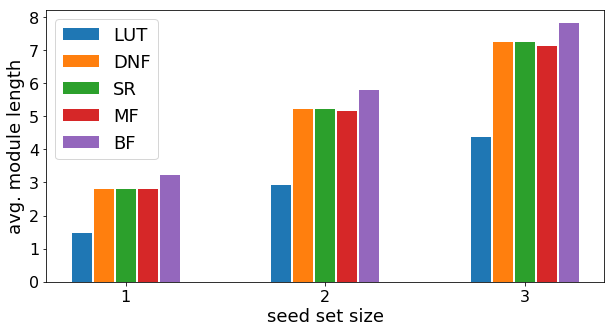

In [83]:
#plot average module lengths
averageltn=[1.47,2.93,4.37]
averagedtn=[2.79,5.21,7.25]
averageTN=[2.79,5.21,7.25]
averageMF=[2.79,5.16,7.11]
averageBF=[3.24,5.79,7.82]
xvalues=[1,2,3]
width=0.1
plt.figure(figsize=(10,5))

plt.bar([x-2*width-.02 for x in xvalues],averageltn,label='LUT',width=width)
plt.bar([x-width-.01 for x in xvalues],averagedtn,label='DNF',width=width)
plt.bar([x for x in xvalues],averageTN,label='SR',width=width)
plt.bar([x+width+.01 for x in xvalues],averageMF,label='MF',width=width)
plt.bar([x+2*width+.02 for x in xvalues],averageBF,label='BF',width=width)
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("avg. module length",fontsize=18)
plt.legend(fontsize=18)

In [191]:
#find similarity between predictions
#modules stores GTN modules, constants_mf stores mean-field constants, constants_bf stores brute-force constants
#NOTE that constants_mf has extra, contradictory seeds
#constants_mf=constants
num=3
extract_sunits(modules['TN'][frozenset({'en-1'})]),constants_mf[frozenset({'en-1'})],constants_bf[frozenset({'en-1'})]
labels=['LUT','DNF','SR','MF','BF']
for i,d1 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_bf]):
    for j,d2 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_bf]):
        print "comparing {} with {}".format(labels[i],labels[j])
        ji=0.0
        total=0
        for seed in modules['TN']:
            if len(seed)!=num: continue #set to break down by seed set size
            total+=1
            if seed not in constants_mf or seed not in constants_bf: print seed
            try: set1=extract_sunits(d1[seed])
            except: set1=d1[seed]
            try: set2=extract_sunits(d2[seed])
            except: set2=d2[seed]
            #print set1,set2
            ji+=compute_jaccard(set1,set2)
            #print seed, compute_jaccard(set1,set2)
            #print set1,set2
        print ji/total
print total,"total seeds"

comparing LUT with LUT
1.0
comparing LUT with DNF
0.673633168602
comparing LUT with SR
0.673633168602
comparing LUT with MF
0.669122860181
comparing LUT with BF
0.628885276884
comparing DNF with LUT
0.673633168602
comparing DNF with DNF
1.0
comparing DNF with SR
1.0
comparing DNF with MF
0.994041122787
comparing DNF with BF
0.934861222525
comparing SR with LUT
0.673633168602
comparing SR with DNF
1.0
comparing SR with SR
1.0
comparing SR with MF
0.994041122787
comparing SR with BF
0.934861222525
comparing MF with LUT
0.669122860181
comparing MF with DNF
0.994041122787
comparing MF with SR
0.994041122787
comparing MF with MF
1.0
comparing MF with BF
0.932245441296
comparing BF with LUT
0.628885276884
comparing BF with DNF
0.934861222525
comparing BF with SR
0.934861222525
comparing BF with MF
0.932245441296
comparing BF with BF
1.0
5440 total seeds


In [186]:
len(constants_mf),len(constants_bf),len(modules['dtn'])

(6018, 6018, 6018)

In [205]:
#calculate stats for drosophila parasegment, ground-truth is simulations
#modules stores GTN modules, constants_mf stores mean-field constants, constants_sim stores simulation constants
num=3
num_units=120
labels=['LUT','DNF','SR','MF','BF']
for i,d1 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_bf]):
    print "comparing {} with {}".format(labels[i],'simulations')
    dstats={'tps':0.0,'fns':0.0,'fps':0.0,'tns':0.0,'avg_sim':0.0,'accuracy':0.0,'errors':0.0,'recall':0.0,'precision':0.0}
    total=0
    for seed in modules['TN']:
        #if len(seed)!=num: continue #set to break down by seed set size
        total+=1
        if seed not in constants_mf or seed not in constants_bf: print seed
        try: set1=extract_sunits(d1[seed])
        except: set1=d1[seed]
        set2=constants_bf[seed]
        stats=compute_stats_constants(set1,set2,num_units)
        for key in stats: dstats[key]+=stats[key]
    dstats={key:dstats[key]/total for key in dstats}
    #print_stats(dstats)
    print dstats#,'\n'
print total,"total seeds"

comparing LUT with simulations
{'errors': 0.02820566079539223, 'fns': 0.3706480453298811, 'tns': 1.0, 'recall': 0.6293519546701178, 'avg_sim': 0.6293519546701178, 'precision': 1.0, 'tps': 0.6293519546701178, 'fps': 0.0, 'accuracy': 0.9717943392045972}
comparing DNF with simulations
{'errors': 0.004742716295557606, 'fns': 0.06664239188871143, 'tns': 1.0, 'recall': 0.9333576081112825, 'avg_sim': 0.9333576081112825, 'precision': 1.0, 'tps': 0.9333576081112825, 'fps': 0.0, 'accuracy': 0.9952572837044662}
comparing SR with simulations
{'errors': 0.004742716295557606, 'fns': 0.06664239188871143, 'tns': 1.0, 'recall': 0.9333576081112825, 'avg_sim': 0.9333576081112825, 'precision': 1.0, 'tps': 0.9333576081112825, 'fps': 0.0, 'accuracy': 0.9952572837044662}
comparing MF with simulations
{'errors': 0.004846571396920179, 'fns': 0.06510774512871131, 'tns': 0.9997771711284291, 'recall': 0.9348922548712822, 'avg_sim': 0.9308355959915936, 'precision': 0.995907787607689, 'tps': 0.9348922548712822, 'fp

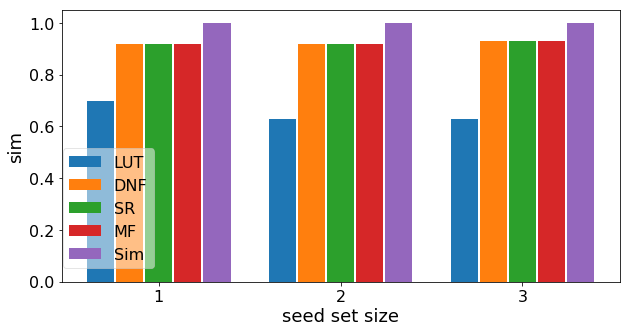

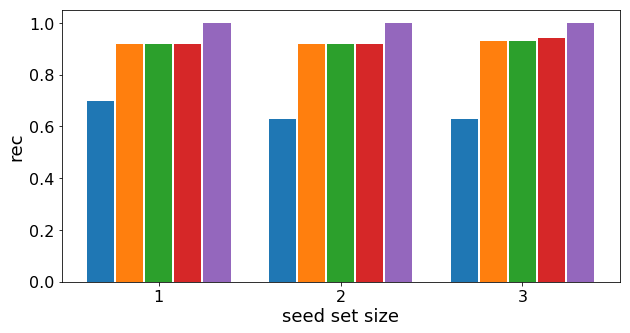

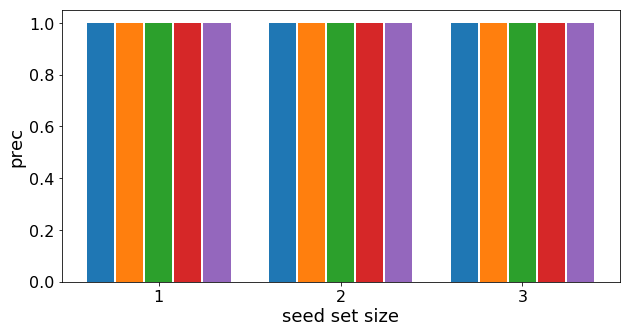

In [363]:
#plot similarity to simulations
simTN=[0.92,0.92,0.93]
simdtn=[0.92,0.92,0.93]
simltn=[0.70,0.63,0.63]
simMF=[0.92,0.92,0.93]
#plot recall
recTN=[0.92,0.92,0.93]
recdtn=[0.92,0.92,0.93]
recltn=[0.70,0.63,0.63]
recMF=[0.92,0.92,0.94]
#plot precision
precTN=[1.0,1.0,1.0]
precdtn=[1.0,1.0,1.0]
precltn=[1.0,1.0,1.0]
precMF=[1.0,1.0,1.0]
xvalues=[1,2,3]
width=0.15

for i,key in enumerate(['sim','rec','prec']):
    plt.figure(figsize=(10,5))
    plt.bar([x-2*width-.02 for x in xvalues],eval(key+'ltn'),label='LUT',width=width)
    plt.bar([x-width-.01 for x in xvalues],eval(key+'dtn'),label='DNF',width=width)
    plt.bar([x for x in xvalues],eval(key+'TN'),label='SR',width=width)
    plt.bar([x+width+.01 for x in xvalues],eval(key+'MF'),label='MF',width=width)
    plt.bar([x+2*width+.02 for x in xvalues],[1,1,1],label='Sim',width=width)
    plt.xticks([1,2,3],[1,2,3],fontsize=16)
    plt.yticks(fontsize=16)
    plt.xlabel("seed set size",fontsize=18)
    plt.ylabel(key,fontsize=18)
    if i==0: plt.legend(fontsize=16,framealpha=0.5,bbox_to_anchor=(0.18, 0.52))
    #plt.figtext(0.797, 0.73, "*", wrap=True, horizontalalignment='left', fontsize=20)
    #plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)
    plt.show()

In [463]:
#set translator and seeds
#dtranslator=create_translator(N,s=3,translator=dtranslator)
seeds=reduce_seeds(dtranslator,dsunit_map,dtranslator,length=3)
seeds=reduce_seeds(dtranslator,dsunit_map,dtranslator,lrange=[1,3])
seeds=[frozenset(to_list(s,dsunit_map,dtranslator)) for s in seeds]
inputs={node.name:len(node.inputs) for node in N.nodes} #original graph
outputs={node.name:len(neighbors_BN(N,node)) for node in N.nodes} #original graph
len(dtranslator),len(seeds),seeds[0],len(outputs),len(inputs)
#print outputs

(6579, 6018, frozenset({'HH-0', 'WG-0', 'nWG-0'}), 17, 17)

In [381]:
#calculate structural rankings
dic_in={seed:sum([inputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
dic_out={seed:sum([outputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
dic_tot={seed:sum([inputs[sunit_to_var(node)]+outputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
#rankings_in=sorted([])
print len(dtranslator),len(dic_out),len(dic_in),len(dic_tot)#,dic_tot
#for seed in N.nodes: print seed.name,seed.inputs,neighbors_BN(N,seed)

6579 6018 6018 6018


In [455]:
#calculate GTN structural rankings
graph=dtn
inputs={node:len(graph.predecessors(node)) for node in graph.nodes() if is_sunit(node)} #GTN
outputs={node:len(graph.neighbors(node)) for node in graph.nodes() if is_sunit(node)} #GTN
dic_in={seed:sum([inputs[node] for node in seed]) for seed in seeds}
dic_out={seed:sum([outputs[node] for node in seed]) for seed in seeds}
dic_tot={seed:sum([inputs[node]+outputs[node] for node in seed]) for seed in seeds}
print len(outputs),len(inputs),len(dic_tot)

34 34 6018


In [466]:
#write structural rankings to file
rankings_in=sorted(dic_in,key=lambda x:dic_in[x],reverse=True)
rankings_out=sorted(dic_out,key=lambda x:dic_out[x],reverse=True)
rankings_tot=sorted(dic_tot,key=lambda x:dic_tot[x],reverse=True)
#for r in rankings_tot: print r,dic_tot[r]
#with open('drosophila_dtn_in-degree_rankings_s3.txt','w') as fp:
#    fp.write(str(rankings_in))
#read in from file
#with open('drosophila_total-degree_rankings_s3.txt') as fp: #DNF-SR, LUT, mean-field, bruteforce
#    rankings_SG_tot=eval(fp.read())
len(rankings_SG_tot)

6018

In [240]:
#write dynamical rankings to file
dic=modules['dtn'] #modules['ltn'], constants_mf, dic_in
#rankings=sorted(dic,key=lambda x:len(extract_sunits(dic[x])),reverse=True) #for modules
rankings=sorted(dic,key=lambda x:len(dic[x]),reverse=True) #for mean-field, brute-force
#with open('drosophila_bruteforce_rankings_s3.txt','w') as fp:
#    fp.write(str(rankings))
#read in from file
#with open('drosophila_DNF-SR_rankings_s3.txt') as fp: #DNF-SR, LUT, mean-field, bruteforce
#    rankings_dtn=eval(fp.read())
#for r in rankings: print r,len(dic[r])#,len(extract_sunits(dic[r]))
len(rankings_dtn)

6018

In [467]:
#compare rankings between different measures
num=1
len(rankings_dtn),len(rankings_ltn),len(rankings_mf),len(rankings_bf)
labels=['LUT','DNF-SR','MF','BF','in-degree','out-degree','total degree','LUT TN in-degree','LUT TN out-degree','LUT TN total degree','DNF TN in-degree','DNF TN out-degree','DNF TN total degree','SR TN in-degree','SR TN out-degree','SR TN total degree']
ls=[rankings_ltn,rankings_dtn,rankings_mf,rankings_bf,rankings_SG_in,rankings_SG_out,rankings_SG_tot]
ls.extend([rankings_ltn_in,rankings_ltn_out,rankings_ltn_tot,rankings_dtn_in,rankings_dtn_out,rankings_dtn_tot,rankings_TN_in,rankings_TN_out,rankings_TN_tot])
for i,d1 in enumerate(ls):
    for j,d2 in enumerate(ls):
        r1=[str(sorted(list(r))) for r in d1 if len(r)==num] #set to restrict by seed set size
        r2=[str(sorted(list(r))) for r in d2 if len(r)==num] #set to restrict by seed set size
        xvalues=[k for k in range(len(r2))] #change to numeric labels
        yvalues=[r1.index(val) for val in r2] #change to numeric labels
        #print r1[:5],r2[:5]
        print "comparing {} with {}".format(labels[i],labels[j])
        print spearmanr(xvalues,yvalues)
print len(xvalues),len(yvalues)

comparing LUT with LUT
SpearmanrResult(correlation=1.0, pvalue=0.0)
comparing LUT with DNF-SR
SpearmanrResult(correlation=0.652864782276547, pvalue=2.8516483284113157e-05)
comparing LUT with MF
SpearmanrResult(correlation=0.6519480519480519, pvalue=2.9519271698961608e-05)
comparing LUT with BF
SpearmanrResult(correlation=0.601527883880825, pvalue=0.000168019070883448)
comparing LUT with in-degree
SpearmanrResult(correlation=0.1651642475171887, pvalue=0.3505748420328234)
comparing LUT with out-degree
SpearmanrResult(correlation=0.1657754010695187, pvalue=0.3487700833124503)
comparing LUT with total degree
SpearmanrResult(correlation=0.05576776165011458, pvalue=0.754083199465322)
comparing LUT with LUT TN in-degree
SpearmanrResult(correlation=0.1682200152788388, pvalue=0.3416074067072731)
comparing LUT with LUT TN out-degree
SpearmanrResult(correlation=-0.027349121466768524, pvalue=0.8779763769138401)
comparing LUT with LUT TN total degree
SpearmanrResult(correlation=-0.08724216959511077

comparing total degree with LUT TN out-degree
SpearmanrResult(correlation=0.9312452253628722, pvalue=1.3970681863012463e-15)
comparing total degree with LUT TN total degree
SpearmanrResult(correlation=0.9419404125286478, pvalue=1.0094795796633003e-16)
comparing total degree with DNF TN in-degree
SpearmanrResult(correlation=0.492436974789916, pvalue=0.0030915796273152875)
comparing total degree with DNF TN out-degree
SpearmanrResult(correlation=0.896409472880061, pvalue=7.628318544428694e-13)
comparing total degree with DNF TN total degree
SpearmanrResult(correlation=0.9046600458365165, pvalue=2.1486894567453702e-13)
comparing total degree with SR TN in-degree
SpearmanrResult(correlation=0.43804430863254384, pvalue=0.009567220660367708)
comparing total degree with SR TN out-degree
SpearmanrResult(correlation=0.8456837280366691, pvalue=3.068416103225559e-10)
comparing total degree with SR TN total degree
SpearmanrResult(correlation=0.8799083269671505, pvalue=7.182499688468287e-12)
compar

comparing SR TN in-degree with DNF TN in-degree
SpearmanrResult(correlation=0.8355996944232237, pvalue=7.825257640196779e-10)
comparing SR TN in-degree with DNF TN out-degree
SpearmanrResult(correlation=0.35920550038197097, pvalue=0.036944997317786984)
comparing SR TN in-degree with DNF TN total degree
SpearmanrResult(correlation=0.4789915966386554, pvalue=0.004157618655747885)
comparing SR TN in-degree with SR TN in-degree
SpearmanrResult(correlation=1.0, pvalue=0.0)
comparing SR TN in-degree with SR TN out-degree
SpearmanrResult(correlation=0.3090909090909091, pvalue=0.07528488915568052)
comparing SR TN in-degree with SR TN total degree
SpearmanrResult(correlation=0.4964094728800611, pvalue=0.0028260037581260685)
comparing SR TN out-degree with LUT
SpearmanrResult(correlation=0.11932773109243698, pvalue=0.5014713073205892)
comparing SR TN out-degree with DNF-SR
SpearmanrResult(correlation=0.4016806722689076, pvalue=0.018536893267756333)
comparing SR TN out-degree with MF
SpearmanrRes

comparing LUT with BF
SpearmanrResult(correlation=0.601527883880825, pvalue=0.000168019070883448)


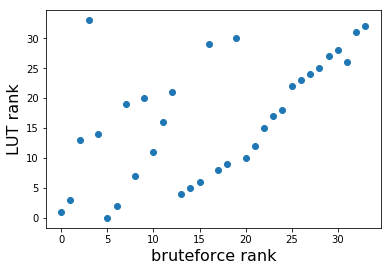

comparing DNF-SR with BF
SpearmanrResult(correlation=0.9572192513368982, pvalue=8.511517398879288e-19)


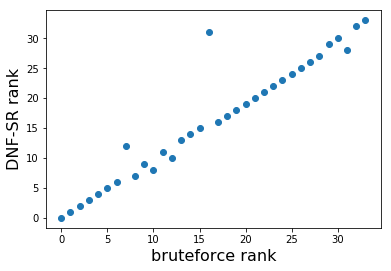

comparing MF with BF
SpearmanrResult(correlation=0.9581359816653934, pvalue=6.058317252086931e-19)


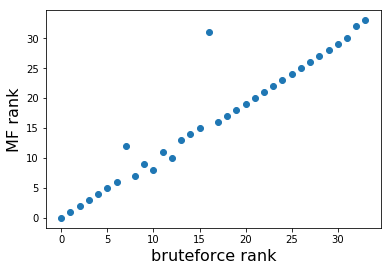

comparing BF with BF
SpearmanrResult(correlation=1.0, pvalue=0.0)


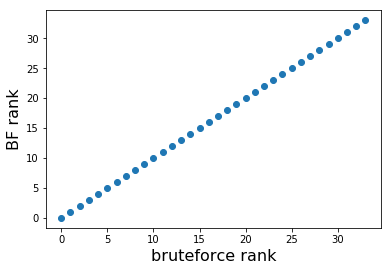

comparing in-degree with BF
SpearmanrResult(correlation=-0.009931245225362872, pvalue=0.9555458565363762)


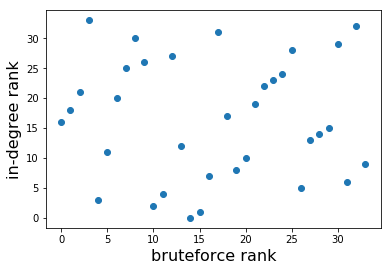

comparing out-degree with BF
SpearmanrResult(correlation=0.4609625668449197, pvalue=0.006075147891485433)


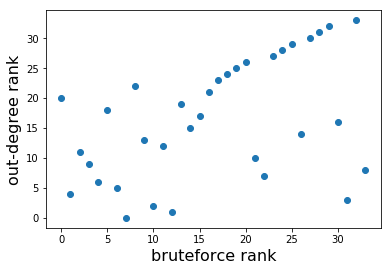

comparing total degree with BF
SpearmanrResult(correlation=0.31061879297173417, pvalue=0.0737794265225028)


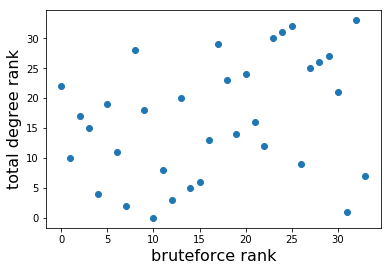

comparing LUT TN in-degree with BF
SpearmanrResult(correlation=-0.06279602750190985, pvalue=0.7242285218998916)


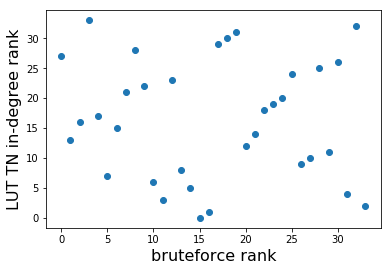

comparing LUT TN out-degree with BF
SpearmanrResult(correlation=0.31092436974789917, pvalue=0.07348116582409207)


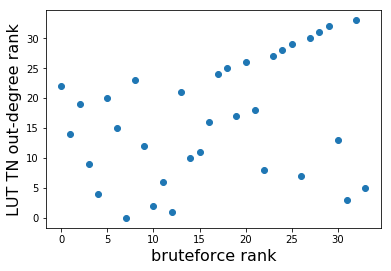

comparing LUT TN total degree with BF
SpearmanrResult(correlation=0.19511077158135978, pvalue=0.26881450787477557)


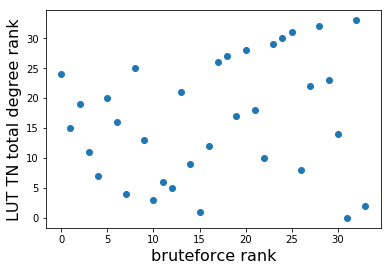

comparing DNF TN in-degree with BF
SpearmanrResult(correlation=-0.02918258212375859, pvalue=0.8698632987938094)


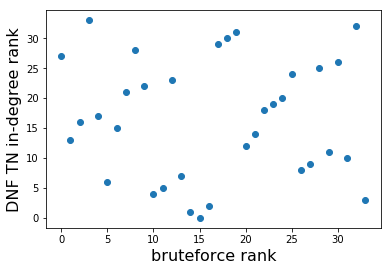

comparing DNF TN out-degree with BF
SpearmanrResult(correlation=0.3915966386554622, pvalue=0.022003917747607262)


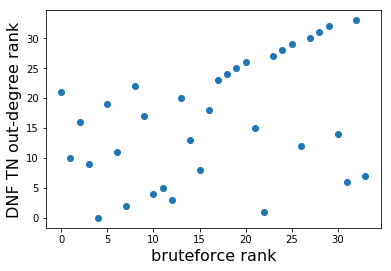

comparing DNF TN total degree with BF
SpearmanrResult(correlation=0.26569900687547743, pvalue=0.12881871267063236)


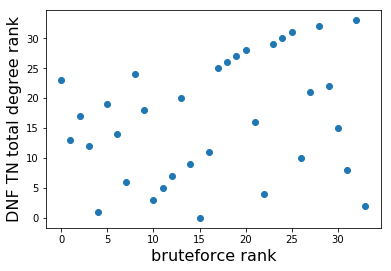

comparing SR TN in-degree with BF
SpearmanrResult(correlation=0.023682200152788387, pvalue=0.8942383976563815)


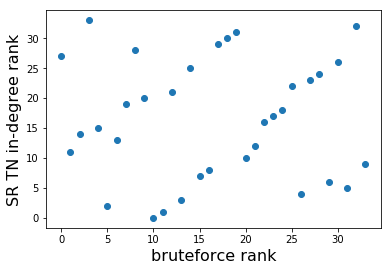

comparing SR TN out-degree with BF
SpearmanrResult(correlation=0.4148204736440031, pvalue=0.014713092338777385)


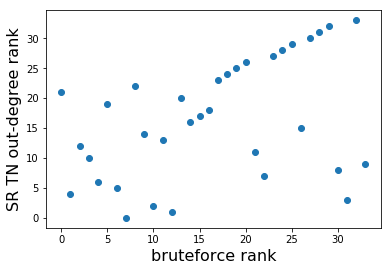

comparing SR TN total degree with BF
SpearmanrResult(correlation=0.3191749427043544, pvalue=0.06577726066227246)


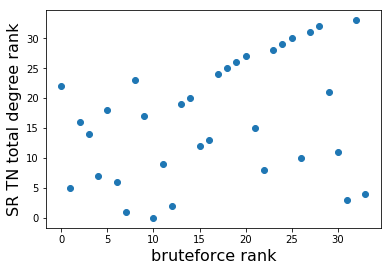

34 34


In [480]:
#graph comparison to bruteforce
#compare rankings between different measures
num=1 #True
len(rankings_dtn),len(rankings_ltn),len(rankings_mf),len(rankings_bf)
#print [r for r in rankings_ltn if len(r)==num]
labels=['LUT','DNF-SR','MF','BF','in-degree','out-degree','total degree','LUT TN in-degree','LUT TN out-degree','LUT TN total degree','DNF TN in-degree','DNF TN out-degree','DNF TN total degree','SR TN in-degree','SR TN out-degree','SR TN total degree']
ls=[rankings_ltn,rankings_dtn,rankings_mf,rankings_bf,rankings_SG_in,rankings_SG_out,rankings_SG_tot]
ls.extend([rankings_ltn_in,rankings_ltn_out,rankings_ltn_tot,rankings_dtn_in,rankings_dtn_out,rankings_dtn_tot,rankings_TN_in,rankings_TN_out,rankings_TN_tot])
for i,d1 in enumerate(ls):
    for j,d2 in enumerate([rankings_bf]):
        r1=[str(sorted(list(r))) for r in d1 if len(r)==num] #set to restrict by seed set size
        r2=[str(sorted(list(r))) for r in d2 if len(r)==num] #set to restrict by seed set size
        xvalues=[k for k in range(len(r2))] #correct label
        yvalues=[r1.index(val) for val in r2]
        #print xvalues,yvalues
        #print r1[:6],r2[:6]
        print "comparing {} with {}".format(labels[i],'BF')
        print spearmanr(xvalues,yvalues)
        plt.scatter(xvalues,yvalues)
        plt.xlabel('bruteforce rank',fontsize=16)
        plt.ylabel(labels[i]+' rank',fontsize=16)
        plt.show()
print len(xvalues),len(yvalues)

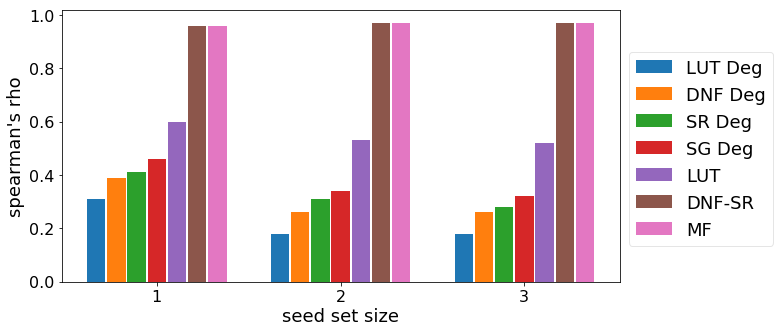

In [592]:
#plot spearman's rho between different methods
#plot average module lengths
corrltn=[0.60,0.53,0.52]
corrdtn=[0.96,0.97,0.97]
corrMF=[0.96,0.97,0.97]
corrSG_deg=[0.46,0.34,0.32]
corrltn_deg=[0.31,0.18,0.18]
corrdtn_deg=[0.39,0.26,0.26]
corrTN_deg=[0.41,0.31,0.28]
xvalues=[1,2,3]
width=0.1
plt.figure(figsize=(10,5))

plt.bar([x-3*width-.03 for x in xvalues],corrltn_deg,label='LUT Deg',width=width)
plt.bar([x-2*width-.02 for x in xvalues],corrdtn_deg,label='DNF Deg',width=width)
plt.bar([x-width-.01 for x in xvalues],corrTN_deg,label='SR Deg',width=width)
plt.bar([x for x in xvalues],corrSG_deg,label='SG Deg',width=width)
plt.bar([x+width+.01 for x in xvalues],corrltn,label='LUT',width=width)
plt.bar([x+2*width+.02 for x in xvalues],corrdtn,label='DNF-SR',width=width)
plt.bar([x+3*width+.03 for x in xvalues],corrMF,label='MF',width=width)
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("spearman's rho",fontsize=18)
plt.legend(fontsize=18,framealpha=0.5,bbox_to_anchor=(1.0, 0.88))

#### Drosophila Parasegment

In [129]:
#repeat with the parasegment
N2=cana.BooleanNetwork.from_file('cana/datasets/drosophila_parasegment.txt',file_type='logical')
DCM2 = N2.dynamics_canalization_map(output=None, )
TN2 = create_threshold_network(DCM2)
ltn2=create_threshold_network_LUTs(N2,single_nodes=[]) #single_nodes=['en','wg']
dtn2=create_threshold_network_dnf(N2,"cana/datasets/drosophila_parasegment.txt",single_nodes=[])

In [76]:
#compare modules between the DCM, the LUT-based GTN, and the dnf-based GTN
#BFS_threshold(dtn,[],'steady',conversion=False)
#modules={'TN':{},'dtn':{},'ltn':{}}
#total_sizes={'TN':{},'dtn':{},'ltn':{}}
num=2
for network in modules:
    nu,tm,sizes,c=find_dynamic_modules(eval(network+'2'),input_type='steady',num=num,samples=None,tm=True,seeds=None)
    for seed in nu: modules[str(network)][seed]=nu[seed]
    for seed in nu: total_sizes[str(network)][seed]=sizes[seed]
print len(modules['dtn'].keys())

8174


In [503]:
#write modules to file
#with open('drosophila_parasegment_modules-s3_sample974.txt', 'w') as fp:
#    fp.write(str(modules))
#read in modules from file (this takes a lot of memory! ~70%)
#with open('drosophila_parasegment_modules-s3_sample974.txt') as fp: #'parasegment_modules-s3.txt'
#    modules=eval(fp.read())
#modules={key:{seed:m[key][seed] for seed in m[key] if seed in constants_sim} for key in m}
len(modules['dtn'])

8174

In [605]:
#compare sizes
print total_sizes.keys()
for module in sorted(total_sizes['TN'],key=lambda x:total_sizes['TN'][x],reverse=True): #sort by DCM module
    print [m for m in module],total_sizes['TN'][module],total_sizes['dtn'][module],total_sizes['ltn'][module]
avg_TN=np.mean([total_sizes['TN'][module] for module in total_sizes['TN']])
avg_dtn=np.mean([total_sizes['dtn'][module] for module in total_sizes['dtn']])
avg_ltn=np.mean([total_sizes['ltn'][module] for module in total_sizes['ltn']])
print avg_TN,avg_dtn,avg_ltn

['TN', 'dtn', 'ltn']
['EN_P2-1', 'SLP_P3-1', 'SLP_P1-1'] 40 40 5
['EN_P4-1', 'SLP_P1-1', 'en_P3-1'] 40 40 8
['EN_P1-1', 'en_P2-1', 'SLP_P4-1'] 40 40 8
['en_P4-1', 'SLP_P1-1', 'en_P3-1'] 40 40 9
['en_P1-1', 'en_P4-1', 'SLP_P2-1'] 40 40 9
['en_P1-1', 'en_P2-1', 'SLP_P4-1'] 40 40 9
['EN_P4-1', 'SLP_P3-1', 'SLP_P1-1'] 40 40 5
['en_P1-1', 'SLP_P3-1', 'en_P2-1'] 40 40 9
['EN_P2-1', 'SLP_P1-1', 'en_P3-1'] 40 40 8
['en_P1-1', 'en_P4-1', 'SLP_P3-1'] 40 40 9
['en_P2-1', 'SLP_P4-1', 'EN_P3-1'] 40 40 8
['EN_P2-1', 'en_P1-1', 'SLP_P3-1'] 40 40 8
['en_P4-1', 'EN_P3-1', 'SLP_P2-1'] 40 40 8
['en_P4-1', 'SLP_P2-1', 'en_P3-1'] 40 40 9
['en_P1-1', 'EN_P4-1', 'SLP_P3-1'] 40 40 8
['EN_P1-1', 'en_P4-1', 'SLP_P2-1'] 40 40 8
['EN_P1-1', 'SLP_P4-1', 'SLP_P2-1'] 40 40 5
['en_P2-1', 'SLP_P1-1', 'en_P3-1'] 40 40 9
['SLP_P4-1', 'EN_P3-1', 'SLP_P2-1'] 40 40 5
['en_P2-1', 'SLP_P4-1', 'en_P3-1'] 40 40 9
['EN_P4-1', 'SLP_P2-1', 'en_P3-1'] 39 39 8
['EN_P1-1', 'en_P4-1', 'SLP_P3-1'] 39 39 8
['EN_P1-1', 'SLP_P3-1', 'en_P

['EN_P4-1', 'SLP_P3-1', 'en_P2-1'] 34 34 8
['hh_P4-1', 'SLP_P3-1', 'SLP_P1-1'] 34 34 4
['EN_P1-1', 'en_P4-1', 'CIR_P2-1'] 34 34 8
['CIR_P3-1', 'EN_P4-1', 'en_P1-1'] 34 34 8
['CIR_P3-1', 'EN_P2-1', 'SLP_P1-1'] 34 34 5
['CIR_P3-1', 'PTC_P2-1', 'CIR_P1-1'] 34 34 3
['CIR_P3-1', 'PTC_P4-1', 'CIR_P1-1'] 34 34 3
['SLP_P4-1', 'CIR_P2-1', 'en_P3-1'] 34 34 6
['en_P4-1', 'ci_P1-0', 'en_P3-1'] 34 34 10
['CIR_P3-1', 'en_P2-1', 'SLP_P1-1'] 34 34 6
['EN_P4-1', 'en_P1-0', 'en_P3-0'] 34 34 11
['SLP_P3-1', 'en_P2-1', 'CIR_P1-1'] 34 34 6
['en_P4-1', 'SLP_P3-1', 'CIR_P1-1'] 34 34 6
['en_P1-1', 'SLP_P4-1', 'en_P3-1'] 34 34 9
['EN_P3-1', 'SLP_P2-1', 'CIR_P4-1'] 34 34 5
['CIR_P3-1', 'hh_P3-1', 'CIR_P1-1'] 34 34 4
['SLP_P4-1', 'CIR_P2-1', 'EN_P3-1'] 34 34 5
['EN_P4-1', 'SLP_P3-1', 'CIR_P1-1'] 34 34 5
['EN_P1-1', 'CIR_P3-1', 'en_P2-1'] 34 34 8
['PTC_P3-1', 'CIR_P2-1', 'CIR_P4-1'] 34 34 3
['en_P1-1', 'ci_P4-0', 'en_P2-1'] 34 34 10
['hh_P2-1', 'SLP_P3-1', 'SLP_P1-1'] 34 34 4
['en_P1-0', 'EN_P2-1', 'en_P3-0'] 34 

['wg_P4-0', 'hh_P4-1', 'CIR_P2-1'] 32 32 5
['CI_P2-0', 'en_P3-1', 'EN_P4-1'] 32 32 8
['EN_P1-1', 'EN_P2-1', 'ci_P3-0'] 32 32 8
['EN_P2-1', 'SLP_P4-1', 'hh_P3-1'] 32 32 6
['en_P4-1', 'SLP_P1-1', 'HH_P3-1'] 32 32 6
['en_P1-0', 'en_P4-1', 'EN_P3-0'] 32 32 11
['EN_P1-1', 'CI_P4-0', 'en_P2-1'] 32 32 8
['EN_P1-1', 'EN_P2-1', 'ci_P4-0'] 32 32 8
['hh_P2-1', 'EN_P1-1', 'SLP_P3-1'] 32 32 6
['en_P1-1', 'SLP_P3-1', 'SLP_P2-1'] 32 32 6
['EN_P4-0', 'EN_P2-0', 'EN_P3-1'] 32 32 9
['ci_P4-0', 'EN_P2-1', 'EN_P3-1'] 32 32 8
['hh_P2-1', 'EN_P1-1', 'SLP_P4-1'] 32 32 6
['HH_P1-1', 'SLP_P3-1', 'en_P4-1'] 32 32 6
['hh_P4-1', 'SLP_P1-1', 'EN_P3-1'] 32 32 6
['HH_P1-1', 'CIR_P2-1', 'CIR_P4-1'] 32 32 3
['EN_P4-1', 'hh_P1-1', 'SLP_P2-1'] 32 32 6
['EN_P2-1', 'CIR_P2-1', 'CIR_P4-1'] 32 32 7
['EN_P4-1', 'CI_P1-0', 'en_P3-1'] 32 32 8
['SLP_P4-1', 'SLP_P1-1', 'EN_P3-1'] 32 32 5
['EN_P2-1', 'SLP_P3-1', 'SLP_P4-1'] 32 32 5
['en_P2-1', 'SLP_P1-1', 'HH_P3-1'] 32 32 6
['EN_P4-1', 'SLP_P1-1', 'SLP_P2-1'] 32 32 5
['en_P1-1', 

['ci_P1-0', 'CIR_P2-1', 'CIR_P4-1'] 31 31 4
['en_P2-1', 'ptc_P4-0', 'en_P3-1'] 31 31 9
['en_P4-1', 'ptc_P2-1', 'en_P3-1'] 31 31 9
['EN_P3-1', 'SLP_P2-1', 'CIR_P1-1'] 31 31 5
['WG_P1-0', 'CIR_P3-1', 'hh_P1-1'] 31 31 4
['CIR_P3-1', 'EN_P4-1', 'en_P1-0'] 31 31 8
['en_P2-1', 'SLP_P1-1', 'CIR_P4-1'] 31 31 6
['en_P4-1', 'ci_P1-1', 'en_P3-1'] 31 31 10
['HH_P2-1', 'wg_P2-0', 'CIR_P4-1'] 31 31 4
['EN_P1-1', 'EN_P4-1', 'CI_P3-0'] 31 31 7
['en_P2-1', 'HH_P1-1', 'SLP_P1-1'] 31 31 6
['EN_P4-0', 'EN_P2-0', 'en_P3-1'] 31 31 10
['en_P1-1', 'en_P4-1', 'ptc_P2-1'] 31 31 9
['en_P1-1', 'en_P2-0', 'EN_P3-1'] 31 31 11
['EN_P4-0', 'CIR_P2-1', 'CIR_P4-1'] 31 31 7
['CIR_P3-1', 'ci_P4-0', 'CIR_P1-1'] 31 31 4
['EN_P4-1', 'SLP_P1-1', 'HH_P3-1'] 31 31 5
['CIR_P3-1', 'ci_P2-0', 'CIR_P1-1'] 31 31 4
['en_P4-0', 'EN_P1-1', 'en_P3-1'] 31 31 11
['en_P4-1', 'EN_P2-1', 'en_P3-0'] 31 31 11
['EN_P2-1', 'SLP_P1-1', 'CIR_P4-1'] 31 31 5
['ci_P4-1', 'en_P2-1', 'en_P3-1'] 31 31 10
['en_P1-1', 'en_P4-1', 'SLP_P1-0'] 31 31 9
['ci_

['HH_P1-1', 'EN_P2-1', 'SLP_P1-1'] 30 30 5
['en_P1-1', 'ci_P4-1', 'EN_P2-1'] 30 30 9
['ci_P2-1', 'EN_P4-1', 'en_P3-1'] 30 30 9
['wg_P1-0', 'en_P4-1', 'en_P3-1'] 30 30 10
['EN_P1-1', 'CI_P2-0', 'SLP_P4-1'] 30 30 5
['SLP_P3-0', 'EN_P2-1', 'en_P3-1'] 30 30 8
['en_P4-0', 'HH_P3-1', 'SLP_P2-1'] 30 30 6
['WG_P4-1', 'EN_P2-1', 'SLP_P1-0'] 30 30 5
['hh_P4-1', 'SLP_P4-1', 'EN_P3-1'] 30 30 6
['HH_P4-1', 'SLP_P4-1', 'EN_P3-1'] 30 30 5
['EN_P1-0', 'hh_P4-1', 'SLP_P3-1'] 30 30 6
['CIR_P3-1', 'CI_P3-0', 'CIR_P1-1'] 30 30 3
['en_P1-1', 'wg_P4-0', 'en_P2-1'] 30 30 10
['wg_P4-1', 'en_P2-1', 'en_P3-1'] 30 30 10
['EN_P1-1', 'EN_P2-0', 'CIR_P4-1'] 30 30 7
['en_P1-1', 'EN_P4-1', 'SLP_P4-0'] 30 30 8
['wg_P1-1', 'en_P3-1', 'en_P4-1'] 30 30 10
['en_P1-1', 'en_P2-1', 'wg_P3-1'] 30 30 10
['EN_P1-1', 'hh_P4-1', 'SLP_P4-1'] 30 30 6
['EN_P4-0', 'CIR_P2-1', 'EN_P3-1'] 30 30 7
['en_P4-1', 'PTC_P2-1', 'en_P3-1'] 30 30 9
['wg_P1-0', 'en_P2-1', 'en_P3-1'] 30 30 10
['EN_P1-1', 'en_P4-1', 'ptc_P3-1'] 30 30 8
['EN_P2-1', 

['EN_P2-1', 'wg_P3-0', 'en_P3-1'] 29 29 9
['en_P1-1', 'WG_P2-0', 'en_P2-1'] 29 29 9
['EN_P1-1', 'wg_P4-1', 'en_P4-1'] 29 29 9
['wg_P1-1', 'en_P2-1', 'EN_P3-1'] 29 29 9
['EN_P1-1', 'en_P2-1', 'CI_P3-1'] 29 29 8
['en_P2-1', 'PTC_P4-0', 'EN_P3-1'] 29 29 8
['CIR_P2-1', 'CIA_P4-1', 'CIR_P4-1'] 29 29 3
['EN_P2-1', 'EN_P3-1', 'ci_P1-1'] 29 29 8
['EN_P1-1', 'hh_P4-1', 'en_P2-1'] 29 29 9
['ci_P2-1', 'EN_P4-1', 'EN_P3-1'] 29 29 8
['en_P4-1', 'SLP_P3-1', 'CIA_P1-0'] 29 29 6
['wg_P4-1', 'en_P1-1', 'EN_P2-1'] 29 29 9
['en_P1-1', 'hh_P2-0', 'SLP_P4-1'] 29 29 7
['HH_P1-0', 'en_P2-1', 'en_P3-1'] 29 29 9
['en_P4-1', 'PTC_P2-1', 'EN_P3-1'] 29 29 8
['EN_P4-1', 'SLP_P2-1', 'en_P1-0'] 29 29 8
['EN_P3-1', 'SLP_P2-1', 'CIA_P4-0'] 29 29 5
['WG_P1-0', 'CIR_P3-1', 'en_P1-0'] 29 29 6
['en_P4-1', 'EN_P2-0', 'hh_P3-1'] 29 29 9
['EN_P4-1', 'SLP_P3-1', 'CIA_P1-0'] 29 29 5
['en_P1-1', 'EN_P4-1', 'PTC_P2-1'] 29 29 8
['EN_P2-1', 'en_P4-0', 'hh_P1-1'] 29 29 9
['en_P2-1', 'PTC_P4-1', 'EN_P3-1'] 29 29 8
['en_P4-1', 'SLP_P

['wg_P1-0', 'EN_P2-1', 'en_P3-1'] 29 29 9
['hh_P1-0', 'SLP_P3-1', 'en_P2-1'] 29 29 7
['en_P1-1', 'PH_P2-0', 'en_P4-1'] 29 29 9
['HH_P2-1', 'WG_P4-0', 'CIR_P2-1'] 29 29 3
['en_P1-1', 'en_P2-1', 'SLP_P4-0'] 29 29 9
['EN_P1-1', 'en_P4-1', 'SLP_P1-1'] 29 29 8
['en_P4-1', 'CIA_P2-1', 'en_P3-1'] 29 29 9
['en_P4-1', 'WG_P2-1', 'en_P3-1'] 29 29 9
['EN_P4-1', 'SLP_P2-1', 'en_P3-0'] 29 29 8
['HH_P4-1', 'en_P2-1', 'en_P3-1'] 29 29 9
['en_P1-1', 'hh_P4-0', 'EN_P2-1'] 29 29 9
['EN_P1-1', 'EN_P2-1', 'ptc_P4-1'] 29 29 7
['WG_P2-1', 'en_P2-1', 'en_P3-1'] 29 29 9
['EN_P2-1', 'hh_P1-0', 'SLP_P3-1'] 29 29 6
['PH_P1-1', 'en_P2-1', 'en_P3-1'] 29 29 9
['hh_P2-1', 'WG_P4-0', 'wg_P2-0'] 29 29 5
['wg_P1-0', 'CIR_P3-1', 'EN_P1-0'] 29 29 6
['CIR_P3-1', 'WG_P4-1', 'CIR_P1-1'] 29 29 3
['EN_P1-1', 'EN_P4-1', 'SLP_P1-0'] 29 29 7
['CIA_P3-0', 'EN_P4-1', 'SLP_P1-1'] 29 29 5
['WG_P4-1', 'en_P2-1', 'en_P3-1'] 29 29 9
['en_P1-1', 'EN_P2-1', 'SLP_P2-1'] 29 29 8
['hh_P1-1', 'WG_P3-0', 'CIR_P1-1'] 29 29 4
['WG_P1-1', 'CIR_P

['SLP_P4-1', 'CIA_P2-0', 'EN_P3-1'] 29 29 5
['EN_P1-1', 'wg_P4-0', 'en_P4-1'] 29 29 9
['en_P1-1', 'en_P4-1', 'HH_P2-1'] 29 29 9
['EN_P2-0', 'HH_P1-1', 'SLP_P4-1'] 29 29 5
['hh_P4-1', 'EN_P2-1', 'en_P3-1'] 29 29 9
['en_P4-1', 'PH_P1-0', 'en_P3-1'] 29 29 9
['EN_P4-1', 'PTC_P2-1', 'en_P3-1'] 29 29 8
['hh_P4-0', 'EN_P2-1', 'en_P3-1'] 29 29 9
['EN_P4-1', 'wg_P2-0', 'en_P3-1'] 29 29 9
['EN_P1-1', 'en_P2-0', 'SLP_P3-1'] 29 29 8
['EN_P1-1', 'en_P4-1', 'hh_P3-0'] 29 29 9
['EN_P1-1', 'EN_P4-0', 'EN_P3-1'] 29 29 9
['WG_P1-0', 'en_P1-1', 'en_P2-1'] 29 29 9
['ptc_P1-0', 'CIR_P2-1', 'CIR_P4-1'] 29 29 3
['CIR_P3-1', 'SMO_P4-0', 'CIR_P1-1'] 29 29 3
['EN_P4-1', 'ptc_P1-0', 'EN_P3-1'] 29 29 7
['EN_P4-1', 'EN_P2-1', 'EN_P1-0'] 29 29 9
['en_P1-1', 'en_P2-1', 'PH_P3-1'] 29 29 9
['HH_P1-1', 'en_P2-1', 'en_P3-0'] 29 29 9
['EN_P1-1', 'PTC_P3-0', 'SLP_P4-1'] 29 29 5
['PTC_P3-0', 'SLP_P2-1', 'en_P3-1'] 29 29 6
['HH_P2-1', 'EN_P1-0', 'SLP_P3-1'] 29 29 5
['hh_P4-1', 'en_P2-1', 'EN_P3-1'] 29 29 9
['PH_P4-1', 'en_P

['en_P2-0', 'CIR_P1-1', 'en_P3-1'] 28 28 9
['hh_P2-1', 'en_P4-1', 'SLP_P1-1'] 28 28 7
['EN_P2-1', 'SLP_P1-1', 'PTC_P2-0'] 28 28 5
['EN_P1-1', 'HH_P2-1', 'en_P3-0'] 28 28 8
['ci_P1-1', 'CIR_P2-1', 'CIR_P4-1'] 28 28 4
['PH_P1-1', 'en_P2-1', 'EN_P3-1'] 28 28 8
['en_P1-1', 'en_P4-1', 'CIA_P4-1'] 28 28 9
['en_P1-1', 'EN_P2-1', 'en_P2-1'] 28 28 8
['wg_P4-1', 'SLP_P3-0', 'SLP_P1-0'] 28 28 4
['EN_P1-0', 'SLP_P2-1', 'en_P4-1'] 28 28 8
['en_P1-1', 'WG_P2-1', 'EN_P2-1'] 28 28 8
['en_P1-1', 'ci_P2-0', 'en_P3-1'] 28 28 10
['wg_P1-0', 'CIR_P3-1', 'en_P4-1'] 28 28 7
['en_P2-1', 'SLP_P4-0', 'EN_P3-1'] 28 28 8
['PH_P2-1', 'CIR_P2-1', 'CIR_P4-1'] 28 28 3
['WG_P4-0', 'CIR_P2-1', 'CIR_P4-1'] 28 28 3
['EN_P4-0', 'HH_P1-1', 'en_P2-1'] 28 28 8
['EN_P2-1', 'en_P3-1', 'HH_P4-0'] 28 28 8
['CI_P2-1', 'EN_P4-1', 'EN_P3-1'] 28 28 7
['en_P4-1', 'PH_P1-1', 'EN_P3-1'] 28 28 8
['WG_P2-0', 'en_P2-1', 'EN_P3-1'] 28 28 8
['en_P1-1', 'en_P4-1', 'SMO_P3-1'] 28 28 9
['EN_P1-1', 'wg_P4-1', 'EN_P4-1'] 28 28 8
['wg_P1-0', 'CIR

['en_P4-0', 'en_P1-0', 'en_P2-1'] 28 28 12
['PH_P3-0', 'CIR_P2-1', 'CIR_P4-1'] 28 28 3
['hh_P4-1', 'SLP_P3-1', 'en_P2-1'] 28 28 7
['CIR_P4-1', 'ptc_P4-0', 'CIR_P2-1'] 28 28 3
['PTC_P3-1', 'en_P2-1', 'en_P3-1'] 28 28 9
['EN_P1-1', 'CIR_P3-1', 'en_P2-0'] 28 28 8
['SMO_P1-0', 'en_P2-1', 'en_P3-1'] 28 28 9
['hh_P3-1', 'SLP_P2-1', 'CIR_P4-1'] 28 28 4
['EN_P2-1', 'PH_P1-1', 'en_P3-1'] 28 28 8
['HH_P2-0', 'CIR_P2-1', 'CIR_P4-1'] 28 28 3
['EN_P2-1', 'ci_P3-1', 'SLP_P1-1'] 28 28 6
['WG_P4-1', 'EN_P2-1', 'en_P3-1'] 28 28 8
['hh_P1-1', 'SLP_P4-1', 'CIR_P2-1'] 28 28 4
['en_P1-1', 'EN_P2-1', 'WG_P3-0'] 28 28 8
['EN_P4-1', 'PTC_P4-0', 'SLP_P1-1'] 28 28 5
['PH_P4-1', 'EN_P2-1', 'en_P3-1'] 28 28 8
['en_P4-0', 'CIR_P3-1', 'en_P1-1'] 28 28 9
['EN_P4-1', 'PTC_P2-1', 'EN_P3-1'] 28 28 7
['PH_P2-1', 'en_P1-1', 'en_P2-1'] 28 28 9
['en_P1-0', 'en_P2-1', 'CIR_P4-1'] 28 28 9
['en_P1-1', 'EN_P4-1', 'en_P4-1'] 28 28 8
['WG_P4-0', 'HH_P4-1', 'wg_P2-0'] 28 28 4
['PTC_P3-0', 'SLP_P4-1', 'EN_P3-1'] 28 28 5
['wg_P4-0'

['en_P4-1', 'PTC_P3-0', 'en_P3-1'] 28 28 9
['en_P1-1', 'PH_P4-1', 'EN_P2-1'] 28 28 8
['PH_P1-0', 'CIR_P2-1', 'CIR_P4-1'] 28 28 3
['HH_P4-0', 'EN_P3-1', 'SLP_P2-1'] 28 28 5
['CIR_P4-1', 'ci_P3-1', 'CIR_P2-1'] 28 28 4
['en_P1-1', 'en_P4-1', 'hh_P1-1'] 28 28 10
['EN_P1-0', 'CIR_P2-1', 'CIR_P4-1'] 28 28 5
['CIR_P3-1', 'PH_P3-0', 'CIR_P1-1'] 28 28 3
['en_P1-1', 'en_P4-1', 'PTC_P4-0'] 28 28 9
['en_P4-1', 'PH_P4-1', 'en_P3-1'] 28 28 9
['wg_P4-0', 'EN_P2-1', 'EN_P3-1'] 28 28 8
['WG_P4-1', 'en_P4-1', 'EN_P3-1'] 28 28 8
['en_P1-1', 'en_P2-1', 'ptc_P2-0'] 28 28 9
['PH_P2-1', 'CIR_P3-1', 'CIR_P1-1'] 28 28 3
['en_P2-1', 'HH_P3-1', 'en_P3-0'] 28 28 9
['EN_P1-1', 'CI_P4-1', 'EN_P2-1'] 28 28 7
['en_P4-0', 'EN_P2-1', 'HH_P3-1'] 28 28 8
['HH_P2-1', 'EN_P4-1', 'en_P3-1'] 28 28 8
['wg_P2-0', 'en_P3-1', 'CIR_P4-1'] 28 28 7
['en_P4-1', 'PTC_P4-1', 'en_P3-1'] 28 28 9
['en_P4-1', 'CIA_P4-1', 'en_P3-1'] 28 28 9
['EN_P1-1', 'EN_P4-1', 'wg_P2-0'] 28 28 8
['en_P4-1', 'SMO_P3-0', 'en_P3-1'] 28 28 9
['EN_P1-1', 'en

['en_P2-1', 'WG_P3-0', 'CIR_P1-1'] 27 27 6
['EN_P4-1', 'PTC_P4-1', 'en_P3-1'] 27 27 8
['en_P1-1', 'EN_P2-1', 'PH_P1-1'] 27 27 8
['EN_P1-0', 'hh_P4-1', 'en_P3-0'] 27 27 9
['en_P1-1', 'EN_P2-1', 'SMO_P3-1'] 27 27 8
['EN_P1-1', 'EN_P2-1', 'PH_P3-0'] 27 27 7
['EN_P1-1', 'en_P4-1', 'CIA_P4-0'] 27 27 8
['EN_P4-1', 'HH_P1-1', 'EN_P3-1'] 27 27 7
['EN_P2-1', 'CIA_P2-1', 'en_P3-1'] 27 27 8
['EN_P1-1', 'ci_P2-0', 'en_P2-1'] 27 27 7
['en_P4-1', 'SLP_P1-1', 'wg_P3-1'] 27 27 7
['en_P4-1', 'wg_P2-0', 'CIR_P4-1'] 27 27 9
['en_P4-0', 'CI_P2-0', 'EN_P1-1'] 27 27 8
['wg_P4-1', 'en_P1-1', 'SLP_P2-1'] 27 27 7
['en_P2-1', 'CIA_P2-1', 'EN_P3-1'] 27 27 8
['EN_P4-1', 'en_P3-1', 'CIR_P3-0'] 27 27 10
['HH_P1-1', 'EN_P2-1', 'EN_P3-0'] 27 27 7
['EN_P2-1', 'wg_P2-1', 'SLP_P3-1'] 27 27 6
['EN_P4-1', 'SLP_P1-1', 'wg_P3-0'] 27 27 6
['wg_P1-0', 'SLP_P4-1', 'EN_P3-1'] 27 27 6
['en_P1-1', 'CIR_P3-0', 'EN_P2-1'] 27 27 8
['EN_P2-1', 'SLP_P4-0', 'EN_P3-1'] 27 27 7
['EN_P4-1', 'ptc_P3-1', 'en_P3-1'] 27 27 8
['EN_P2-1', 'CI_P

['EN_P4-1', 'SLP_P1-1', 'wg_P3-1'] 27 27 6
['en_P4-1', 'HH_P3-1', 'EN_P3-1'] 27 27 8
['wg_P2-0', 'SLP_P4-1', 'CIR_P4-1'] 27 27 4
['EN_P4-1', 'SLP_P1-1', 'SLP_P2-0'] 27 27 5
['EN_P1-0', 'CIR_P2-1', 'en_P4-1'] 27 27 8
['EN_P4-1', 'EN_P2-0', 'en_P3-0'] 27 27 10
['EN_P2-1', 'WG_P3-0', 'EN_P3-1'] 27 27 7
['CI_P1-0', 'EN_P2-1', 'en_P3-0'] 27 27 8
['EN_P1-1', 'HH_P1-1', 'en_P2-1'] 27 27 8
['EN_P2-1', 'en_P3-1', 'ptc_P2-0'] 27 27 8
['EN_P1-1', 'wg_P3-0', 'SLP_P2-1'] 27 27 6
['en_P4-0', 'ci_P1-0', 'en_P3-1'] 27 27 10
['EN_P4-1', 'CI_P4-0', 'en_P3-1'] 27 27 7
['en_P1-1', 'hh_P3-0', 'SLP_P4-1'] 27 27 7
['en_P4-1', 'SMO_P2-1', 'EN_P3-1'] 27 27 8
['EN_P1-1', 'en_P1-1', 'EN_P2-1'] 27 27 7
['wg_P4-0', 'SLP_P3-1', 'en_P4-1'] 27 27 7
['en_P1-1', 'CI_P4-1', 'SLP_P2-1'] 27 27 6
['EN_P4-1', 'hh_P3-1', 'en_P3-1'] 27 27 9
['WG_P1-1', 'SLP_P4-0', 'SLP_P1-1'] 27 27 3
['EN_P4-1', 'EN_P3-1', 'en_P3-1'] 27 27 7
['en_P4-1', 'SLP_P3-1', 'PTC_P1-1'] 27 27 6
['EN_P4-1', 'CIR_P4-0', 'en_P3-1'] 27 27 10
['wg_P2-1', 'e

['EN_P1-1', 'en_P4-1', 'PH_P1-1'] 27 27 8
['EN_P4-1', 'SLP_P3-1', 'wg_P2-0'] 27 27 6
['en_P1-1', 'EN_P2-1', 'ptc_P2-1'] 27 27 8
['en_P1-1', 'EN_P4-1', 'ptc_P1-0'] 27 27 8
['EN_P4-1', 'PH_P4-0', 'en_P3-1'] 27 27 8
['EN_P1-1', 'EN_P2-0', 'en_P3-0'] 27 27 10
['en_P4-0', 'EN_P1-0', 'EN_P2-1'] 27 27 10
['en_P2-1', 'PTC_P3-1', 'SLP_P1-1'] 27 27 6
['en_P1-1', 'ci_P3-1', 'SLP_P2-1'] 27 27 7
['EN_P1-1', 'SMO_P4-1', 'en_P4-1'] 27 27 8
['EN_P1-1', 'en_P2-0', 'ci_P3-0'] 27 27 9
['PTC_P3-0', 'en_P2-1', 'SLP_P1-1'] 27 27 6
['WG_P1-1', 'EN_P2-1', 'EN_P3-1'] 27 27 7
['EN_P1-1', 'en_P4-1', 'HH_P1-1'] 27 27 8
['EN_P2-1', 'SLP_P3-1', 'PTC_P1-1'] 27 27 5
['en_P1-1', 'EN_P4-1', 'PH_P1-0'] 27 27 8
['EN_P1-1', 'EN_P4-1', 'SLP_P3-0'] 27 27 7
['en_P4-0', 'CI_P2-0', 'EN_P3-1'] 27 27 8
['HH_P4-1', 'EN_P2-1', 'EN_P3-1'] 27 27 7
['en_P1-1', 'EN_P4-1', 'CIA_P4-1'] 27 27 8
['CIR_P3-1', 'en_P1-1', 'hh_P4-1'] 27 27 7
['ci_P4-1', 'EN_P2-1', 'SLP_P1-1'] 27 27 6
['EN_P1-1', 'EN_P2-1', 'HH_P3-0'] 27 27 7
['en_P1-1', 'wg_P

['EN_P4-1', 'SLP_P3-1', 'PTC_P4-1'] 26 26 5
['EN_P4-1', 'ptc_P4-1', 'EN_P3-1'] 26 26 7
['EN_P4-1', 'hh_P3-1', 'EN_P3-1'] 26 26 8
['EN_P2-1', 'SLP_P1-1', 'CIA_P4-1'] 26 26 5
['PH_P2-0', 'SLP_P1-1', 'en_P4-1'] 26 26 6
['EN_P1-1', 'EN_P2-1', 'SMO_P3-1'] 26 26 7
['en_P1-1', 'CI_P1-0', 'SLP_P4-1'] 26 26 5
['PH_P4-0', 'EN_P3-1', 'SLP_P2-1'] 26 26 5
['WG_P1-1', 'SLP_P4-1', 'en_P3-1'] 26 26 6
['en_P4-1', 'CIR_P2-1', 'HH_P3-1'] 26 26 6
['en_P2-1', 'ptc_P1-0', 'SLP_P1-1'] 26 26 6
['PH_P1-1', 'SLP_P4-1', 'EN_P3-1'] 26 26 5
['CIR_P3-1', 'en_P4-1', 'HH_P1-1'] 26 26 6
['wg_P2-0', 'ptc_P2-1', 'CIR_P4-1'] 26 26 4
['SLP_P3-1', 'PH_P1-1', 'en_P2-1'] 26 26 6
['en_P1-1', 'PH_P3-0', 'SLP_P4-1'] 26 26 6
['en_P4-1', 'PH_P1-0', 'SLP_P1-1'] 26 26 6
['SLP_P4-1', 'en_P3-1', 'CIA_P1-1'] 26 26 6
['CIA_P2-1', 'SLP_P4-1', 'EN_P3-1'] 26 26 5
['EN_P2-1', 'PH_P3-1', 'SLP_P1-1'] 26 26 5
['en_P4-1', 'SLP_P1-1', 'CIR_P1-1'] 26 26 6
['EN_P1-1', 'EN_P4-1', 'SMO_P4-1'] 26 26 7
['CIR_P3-1', 'en_P1-1', 'HH_P4-1'] 26 26 6
['en_

['WG_P2-0', 'SLP_P4-1', 'CIR_P4-1'] 26 26 3
['EN_P1-1', 'EN_P4-1', 'hh_P1-1'] 26 26 8
['EN_P1-1', 'EN_P4-1', 'CIR_P1-0'] 26 26 9
['en_P4-1', 'SLP_P1-1', 'WG_P3-0'] 26 26 6
['en_P2-0', 'EN_P2-1', 'SLP_P1-1'] 26 26 5
['WG_P4-0', 'SLP_P3-1', 'en_P4-1'] 26 26 6
['PH_P2-1', 'en_P1-1', 'SLP_P4-1'] 26 26 6
['en_P1-1', 'SLP_P4-1', 'ptc_P1-1'] 26 26 6
['en_P4-1', 'SLP_P1-1', 'PTC_P2-1'] 26 26 6
['en_P4-1', 'ptc_P1-0', 'SLP_P1-1'] 26 26 6
['EN_P2-1', 'hh_P3-1', 'EN_P3-0'] 26 26 8
['hh_P2-1', 'ci_P4-0', 'en_P3-1'] 26 26 8
['EN_P4-1', 'SLP_P3-1', 'HH_P2-0'] 26 26 5
['EN_P4-0', 'EN_P2-0', 'hh_P1-1'] 26 26 8
['hh_P2-1', 'SLP_P3-1', 'en_P2-1'] 26 26 7
['SLP_P2-1', 'en_P3-1', 'CIR_P1-0'] 26 26 6
['EN_P4-1', 'SLP_P3-1', 'PH_P4-0'] 26 26 5
['EN_P3-1', 'SLP_P2-1', 'SMO_P3-1'] 26 26 5
['en_P1-1', 'SLP_P3-0', 'SLP_P4-1'] 26 26 6
['SLP_P3-1', 'CIR_P2-0', 'en_P2-1'] 26 26 8
['en_P1-1', 'HH_P1-1', 'SLP_P4-1'] 26 26 6
['SLP_P4-1', 'EN_P3-1', 'WG_P3-1'] 26 26 5
['EN_P1-1', 'EN_P2-1', 'PTC_P1-0'] 26 26 7
['HH_P1

['wg_P4-0', 'CI_P4-0', 'CIR_P2-1'] 26 26 4
['CI_P4-1', 'SLP_P3-1', 'en_P2-1'] 26 26 6
['EN_P1-1', 'PH_P1-1', 'SLP_P4-1'] 26 26 5
['EN_P4-1', 'EN_P2-0', 'EN_P3-0'] 26 26 9
['EN_P4-1', 'PTC_P4-0', 'EN_P3-1'] 26 26 7
['EN_P4-1', 'SLP_P3-1', 'WG_P4-0'] 26 26 5
['en_P2-1', 'HH_P3-1', 'CIR_P4-1'] 26 26 6
['WG_P2-1', 'EN_P2-1', 'SLP_P1-1'] 26 26 5
['EN_P1-1', 'PH_P1-0', 'SLP_P2-1'] 26 26 5
['ptc_P1-0', 'SLP_P2-1', 'en_P3-1'] 26 26 6
['CI_P1-1', 'SLP_P4-1', 'en_P3-1'] 26 26 6
['EN_P2-0', 'ci_P1-0', 'EN_P3-1'] 26 26 8
['SMO_P4-0', 'en_P2-1', 'SLP_P1-1'] 26 26 6
['SLP_P4-1', 'ptc_P4-1', 'en_P3-1'] 26 26 6
['EN_P1-1', 'EN_P4-1', 'CIA_P1-1'] 26 26 7
['en_P2-1', 'SLP_P1-1', 'SLP_P2-1'] 26 26 6
['EN_P1-1', 'HH_P2-1', 'EN_P2-0'] 26 26 7
['en_P4-1', 'PH_P3-0', 'SLP_P1-1'] 26 26 6
['ci_P4-0', 'en_P1-1', 'SLP_P3-1'] 26 26 7
['WG_P4-0', 'en_P2-1', 'SLP_P1-1'] 26 26 6
['EN_P2-1', 'SLP_P1-1', 'PH_P4-0'] 26 26 5
['en_P4-1', 'PH_P4-1', 'SLP_P1-1'] 26 26 6
['EN_P1-1', 'EN_P2-0', 'EN_P3-0'] 26 26 9
['EN_P4-1',

['PTC_P3-1', 'SLP_P4-1', 'EN_P3-1'] 26 26 5
['EN_P2-1', 'PTC_P2-1', 'EN_P3-1'] 26 26 7
['en_P4-1', 'CIA_P1-0', 'en_P3-0'] 26 26 9
['ci_P3-0', 'WG_P3-0', 'CIR_P1-1'] 26 26 4
['EN_P2-1', 'PTC_P4-0', 'en_P3-0'] 26 26 8
['en_P4-1', 'PTC_P4-1', 'SLP_P1-1'] 26 26 6
['SMO_P4-0', 'SLP_P3-1', 'en_P4-1'] 26 26 6
['EN_P1-1', 'SMO_P2-1', 'EN_P2-1'] 26 26 7
['en_P1-1', 'ptc_P1-1', 'SLP_P2-1'] 26 26 6
['SLP_P3-1', 'SLP_P2-1', 'hh_P1-1'] 26 26 4
['PH_P2-1', 'en_P4-1', 'SLP_P3-1'] 26 26 6
['en_P4-1', 'SLP_P3-1', 'SLP_P2-0'] 26 26 6
['PH_P2-1', 'SLP_P3-1', 'en_P2-1'] 26 26 6
['CIR_P3-1', 'EN_P4-1', 'SLP_P2-1'] 26 26 5
['SLP_P4-1', 'en_P3-1', 'WG_P3-1'] 26 26 6
['EN_P4-1', 'PH_P3-0', 'EN_P3-1'] 26 26 7
['EN_P1-1', 'en_P1-1', 'SLP_P2-1'] 26 26 5
['CI_P1-1', 'EN_P3-1', 'SLP_P2-1'] 26 26 5
['PH_P1-0', 'en_P2-1', 'SLP_P1-1'] 26 26 6
['EN_P1-1', 'ci_P2-1', 'en_P2-1'] 26 26 7
['SLP_P3-1', 'en_P4-1', 'SMO_P2-0'] 26 26 6
['en_P2-1', 'ci_P3-0', 'hh_P3-1'] 26 26 8
['EN_P4-0', 'CI_P2-0', 'en_P3-1'] 26 26 8
['en_P1

['en_P4-1', 'SLP_P1-1', 'ptc_P2-0'] 26 26 6
['SLP_P3-1', 'en_P2-1', 'HH_P4-0'] 26 26 6
['PH_P2-0', 'SLP_P4-1', 'EN_P3-1'] 26 26 5
['EN_P4-1', 'hh_P4-1', 'EN_P3-1'] 26 26 8
['SMO_P1-1', 'EN_P2-1', 'SLP_P1-1'] 25 25 5
['EN_P4-1', 'SLP_P1-1', 'CIA_P4-0'] 25 25 5
['en_P1-1', 'CI_P4-1', 'SLP_P4-1'] 25 25 6
['CIA_P3-0', 'EN_P4-1', 'en_P2-1'] 25 25 8
['EN_P2-1', 'SLP_P3-1', 'ptc_P3-1'] 25 25 5
['EN_P4-1', 'HH_P1-1', 'CIR_P2-1'] 25 25 5
['en_P2-1', 'CI_P1-1', 'SLP_P1-1'] 25 25 6
['SLP_P3-1', 'en_P2-1', 'CIR_P1-0'] 25 25 6
['en_P2-0', 'SLP_P2-1', 'en_P3-1'] 25 25 9
['WG_P2-1', 'EN_P3-1', 'SLP_P2-1'] 25 25 5
['wg_P4-0', 'HH_P1-1', 'CIR_P2-1'] 25 25 4
['WG_P4-0', 'SLP_P4-1', 'en_P3-1'] 25 25 6
['EN_P2-1', 'SLP_P3-1', 'SMO_P3-1'] 25 25 5
['wg_P2-0', 'EN_P3-1', 'SLP_P2-1'] 25 25 6
['CI_P1-1', 'EN_P2-1', 'SLP_P1-1'] 25 25 5
['CIR_P3-1', 'en_P4-1', 'en_P3-1'] 25 25 11
['EN_P3-1', 'SLP_P2-1', 'PTC_P2-0'] 25 25 5
['en_P4-0', 'ci_P2-1', 'en_P3-1'] 25 25 10
['ci_P2-1', 'en_P1-1', 'en_P3-1'] 25 25 10
['SM

['hh_P2-1', 'wg_P2-1', 'SLP_P1-0'] 25 25 5
['EN_P4-1', 'SLP_P3-1', 'CI_P3-1'] 25 25 5
['EN_P1-1', 'ptc_P1-0', 'SLP_P2-1'] 25 25 5
['SLP_P2-1', 'CIR_P1-1', 'hh_P3-1'] 25 25 4
['EN_P2-1', 'HH_P3-1', 'CIR_P4-1'] 25 25 5
['WG_P1-0', 'CIR_P3-1', 'en_P3-0'] 25 25 8
['hh_P2-1', 'wg_P3-0', 'CIR_P1-1'] 25 25 5
['SLP_P3-1', 'en_P2-1', 'WG_P3-1'] 25 25 6
['en_P4-1', 'ptc_P4-0', 'SLP_P1-1'] 25 25 6
['EN_P4-1', 'SLP_P3-1', 'ci_P3-1'] 25 25 6
['en_P4-1', 'SLP_P3-1', 'en_P3-0'] 25 25 9
['ci_P2-0', 'SLP_P4-1', 'hh_P3-1'] 25 25 5
['en_P2-1', 'ci_P1-1', 'SLP_P1-1'] 25 25 7
['EN_P4-1', 'SLP_P3-1', 'wg_P3-0'] 25 25 6
['CIR_P3-1', 'hh_P1-1', 'SLP_P2-1'] 25 25 4
['EN_P2-1', 'SLP_P3-1', 'CI_P3-1'] 25 25 5
['CIA_P3-1', 'SLP_P3-1', 'en_P2-1'] 25 25 6
['en_P4-0', 'en_P2-1', 'ci_P3-0'] 25 25 10
['hh_P1-0', 'en_P2-1', 'EN_P3-0'] 25 25 9
['en_P4-1', 'SLP_P3-1', 'HH_P3-0'] 25 25 6
['en_P2-0', 'HH_P4-0', 'EN_P3-1'] 25 25 8
['CIR_P3-1', 'en_P4-1', 'HH_P3-1'] 25 25 6
['EN_P1-1', 'CIR_P4-0', 'SLP_P2-1'] 25 25 5
['ci_P3

['en_P4-1', 'ptc_P1-0', 'en_P3-0'] 25 25 9
['CIA_P3-1', 'SLP_P4-1', 'EN_P3-1'] 25 25 5
['HH_P4-1', 'wg_P3-0', 'CIR_P1-1'] 25 25 4
['en_P4-1', 'SLP_P1-1', 'CIA_P1-1'] 25 25 6
['CI_P3-0', 'WG_P3-0', 'CIR_P1-1'] 25 25 3
['en_P4-1', 'SLP_P1-1', 'CIR_P1-0'] 25 25 6
['EN_P4-0', 'en_P2-1', 'CIR_P1-1'] 25 25 8
['EN_P1-1', 'WG_P4-0', 'SLP_P4-1'] 25 25 5
['en_P2-1', 'ci_P3-0', 'HH_P3-1'] 25 25 7
['en_P4-1', 'CI_P1-1', 'SLP_P1-1'] 25 25 6
['en_P4-1', 'CI_P3-0', 'SLP_P2-1'] 25 25 6
['en_P4-0', 'hh_P1-1', 'en_P3-1'] 25 25 10
['HH_P3-0', 'wg_P3-0', 'CIR_P1-1'] 25 25 4
['SMO_P1-1', 'SLP_P1-1', 'en_P4-1'] 25 25 6
['en_P4-0', 'ci_P1-0', 'en_P2-1'] 25 25 10
['EN_P1-0', 'EN_P2-1', 'SLP_P1-1'] 25 25 7
['HH_P2-1', 'EN_P2-1', 'SLP_P1-1'] 25 25 5
['ci_P4-0', 'hh_P3-1', 'SLP_P2-1'] 25 25 5
['en_P4-0', 'EN_P1-1', 'ci_P2-1'] 25 25 9
['WG_P1-0', 'CIR_P3-1', 'CIR_P2-1'] 25 25 3
['EN_P1-1', 'EN_P2-0', 'SLP_P2-1'] 25 25 7
['CI_P1-0', 'hh_P1-1', 'en_P2-1'] 25 25 7
['wg_P4-0', 'EN_P2-0', 'CIR_P2-1'] 25 25 8
['wg_P4-1

['en_P4-1', 'SLP_P3-1', 'CIR_P1-0'] 25 25 6
['hh_P2-1', 'CI_P4-0', 'en_P3-1'] 25 25 7
['EN_P1-1', 'SLP_P1-0', 'wg_P3-0'] 25 25 6
['en_P4-1', 'ci_P1-0', 'ci_P3-0'] 25 25 8
['hh_P2-1', 'SLP_P1-1', 'CIR_P4-1'] 25 25 4
['CIR_P3-1', 'hh_P1-1', 'SLP_P4-1'] 25 25 4
['EN_P4-1', 'SLP_P3-1', 'EN_P3-0'] 25 25 7
['en_P1-1', 'ci_P4-1', 'en_P2-0'] 25 25 10
['EN_P4-1', 'SLP_P3-1', 'WG_P3-0'] 25 25 5
['wg_P4-1', 'en_P1-1', 'SLP_P4-1'] 25 25 7
['en_P4-1', 'SLP_P3-1', 'ci_P3-1'] 25 25 7
['CIR_P2-0', 'SLP_P2-1', 'en_P3-1'] 25 25 6
['en_P1-1', 'CI_P2-0', 'hh_P4-1'] 25 25 7
['en_P4-0', 'WG_P4-1', 'SLP_P1-0'] 25 25 6
['HH_P2-1', 'ci_P1-0', 'en_P3-1'] 25 25 7
['EN_P1-1', 'hh_P4-1', 'ci_P3-0'] 25 25 7
['SLP_P4-1', 'PTC_P4-1', 'EN_P3-1'] 25 25 5
['en_P4-0', 'SLP_P4-1', 'EN_P3-1'] 25 25 8
['en_P1-0', 'HH_P3-0', 'en_P4-1'] 25 25 9
['hh_P2-1', 'EN_P1-1', 'ci_P3-0'] 25 25 7
['en_P1-1', 'EN_P2-0', 'PTC_P1-0'] 25 25 8
['wg_P2-0', 'CIR_P4-1', 'PTC_P2-0'] 25 25 4
['hh_P2-0', 'WG_P2-0', 'CIR_P4-1'] 25 25 4
['EN_P4-1', 

['EN_P1-1', 'SLP_P2-1', 'CIA_P1-1'] 25 25 5
['EN_P1-1', 'EN_P2-1', 'ci_P1-1'] 25 25 6
['hh_P2-1', 'SLP_P4-1', 'hh_P3-1'] 25 25 5
['EN_P2-1', 'ci_P3-0', 'CIR_P1-1'] 25 25 6
['EN_P4-1', 'SLP_P3-1', 'CIA_P4-0'] 25 25 5
['WG_P3-1', 'SLP_P4-0', 'CIR_P2-1'] 25 25 3
['hh_P2-1', 'SLP_P3-0', 'wg_P2-1'] 25 25 5
['EN_P4-1', 'hh_P3-0', 'EN_P1-0'] 25 25 8
['en_P1-0', 'EN_P2-1', 'SLP_P2-0'] 25 25 8
['EN_P1-1', 'SLP_P3-0', 'WG_P2-1'] 25 25 5
['wg_P1-0', 'CIR_P3-1', 'PTC_P1-0'] 25 25 4
['ci_P2-0', 'HH_P4-1', 'en_P3-1'] 25 25 7
['en_P1-0', 'hh_P3-1', 'SLP_P2-1'] 25 25 7
['en_P1-0', 'SLP_P1-1', 'en_P4-1'] 25 25 9
['en_P2-1', 'SLP_P1-1', 'SMO_P3-1'] 25 25 6
['en_P1-1', 'CIR_P2-0', 'SLP_P4-1'] 25 25 6
['HH_P4-1', 'EN_P3-1', 'CIR_P1-1'] 25 25 5
['en_P1-0', 'en_P2-1', 'SLP_P1-1'] 25 25 9
['hh_P4-1', 'CI_P4-0', 'en_P3-1'] 25 25 7
['EN_P1-1', 'WG_P3-0', 'CIR_P1-1'] 25 25 7
['en_P1-1', 'SLP_P4-1', 'CIR_P4-0'] 25 25 6
['en_P4-0', 'hh_P1-1', 'CIR_P2-1'] 25 25 7
['en_P1-1', 'WG_P2-1', 'SLP_P2-1'] 25 25 6
['EN_P1-

['WG_P2-0', 'ptc_P4-1', 'CIR_P4-1'] 24 24 3
['EN_P2-1', 'ptc_P1-0', 'EN_P3-0'] 24 24 7
['EN_P2-1', 'ptc_P1-1', 'EN_P3-0'] 24 24 7
['en_P2-0', 'EN_P3-1', 'wg_P3-1'] 24 24 9
['hh_P2-1', 'ci_P2-0', 'SLP_P3-1'] 24 24 5
['WG_P1-1', 'hh_P1-1', 'SLP_P4-0'] 24 24 4
['en_P1-1', 'ci_P4-0', 'SLP_P4-1'] 24 24 7
['CIA_P2-0', 'en_P3-1', 'CIR_P4-1'] 24 24 6
['HH_P2-1', 'ci_P1-0', 'SLP_P3-1'] 24 24 4
['SLP_P3-1', 'PTC_P1-0', 'SLP_P1-1'] 24 24 3
['en_P4-0', 'ci_P1-1', 'en_P3-1'] 24 24 10
['SLP_P3-1', 'HH_P3-1', 'SLP_P2-1'] 24 24 3
['EN_P4-1', 'ptc_P3-0', 'EN_P1-0'] 24 24 7
['ptc_P4-1', 'wg_P3-0', 'CIR_P1-1'] 24 24 4
['EN_P4-0', 'en_P1-1', 'ptc_P2-1'] 24 24 8
['hh_P1-1', 'WG_P3-1', 'SLP_P2-0'] 24 24 4
['EN_P1-1', 'EN_P2-0', 'PTC_P1-0'] 24 24 7
['wg_P2-0', 'wg_P3-0', 'CIR_P1-1'] 24 24 5
['en_P1-1', 'ci_P4-1', 'EN_P3-1'] 24 24 9
['CI_P1-0', 'EN_P2-1', 'hh_P3-1'] 24 24 6
['CI_P2-0', 'en_P3-1', 'en_P1-0'] 24 24 9
['EN_P4-0', 'hh_P1-1', 'CIR_P2-1'] 24 24 6
['en_P1-1', 'EN_P2-1', 'CIR_P1-1'] 24 24 10
['WG_P2-

['WG_P4-1', 'SLP_P3-0', 'EN_P2-0'] 24 24 5
['EN_P4-1', 'CI_P3-1', 'en_P1-0'] 24 24 8
['en_P1-1', 'hh_P4-0', 'en_P3-1'] 24 24 10
['CIR_P3-1', 'EN_P4-1', 'en_P3-0'] 24 24 10
['CIR_P3-1', 'EN_P4-1', 'EN_P2-0'] 24 24 7
['WG_P1-1', 'SLP_P4-0', 'EN_P1-0'] 24 24 5
['en_P1-1', 'hh_P4-1', 'CIA_P2-0'] 24 24 7
['EN_P1-1', 'CI_P4-0', 'CIR_P2-1'] 24 24 5
['EN_P2-1', 'wg_P3-1', 'en_P3-0'] 24 24 9
['SLP_P3-1', 'SLP_P4-1', 'HH_P3-1'] 24 24 3
['EN_P4-1', 'ci_P3-0', 'CIR_P2-1'] 24 24 6
['ci_P4-1', 'EN_P2-0', 'en_P3-1'] 24 24 9
['en_P4-1', 'hh_P1-1', 'CIA_P2-0'] 24 24 7
['EN_P1-1', 'en_P2-0', 'PTC_P4-0'] 24 24 8
['EN_P1-0', 'ptc_P3-0', 'en_P2-1'] 24 24 8
['EN_P1-1', 'EN_P4-0', 'ptc_P2-0'] 24 24 7
['EN_P1-0', 'ci_P3-1', 'en_P4-1'] 24 24 9
['hh_P1-0', 'en_P2-0', 'en_P3-1'] 24 24 10
['hh_P4-0', 'EN_P2-1', 'en_P1-0'] 24 24 9
['en_P4-1', 'en_P2-1', 'wg_P3-0'] 24 24 10
['en_P1-1', 'en_P2-0', 'wg_P3-0'] 24 24 10
['WG_P4-0', 'CI_P3-0', 'CIR_P2-1'] 24 24 3
['ci_P4-0', 'HH_P1-1', 'EN_P2-1'] 24 24 6
['EN_P2-0', 'hh

['en_P4-1', 'hh_P3-0', 'CIR_P1-1'] 24 24 7
['EN_P4-1', 'HH_P1-1', 'CIR_P1-1'] 24 24 5
['wg_P4-0', 'EN_P4-1', 'en_P3-0'] 24 24 9
['EN_P1-1', 'en_P2-1', 'CIR_P2-1'] 24 24 10
['CIA_P3-0', 'EN_P4-1', 'EN_P2-1'] 24 24 7
['ci_P4-1', 'wg_P2-0', 'CIR_P4-1'] 24 24 5
['EN_P4-1', 'en_P2-1', 'ptc_P1-0'] 24 24 8
['en_P2-1', 'CI_P3-0', 'CIR_P4-1'] 24 24 6
['wg_P4-1', 'EN_P2-1', 'en_P3-0'] 24 24 9
['en_P1-1', 'ptc_P4-1', 'EN_P3-1'] 24 24 8
['hh_P1-1', 'WG_P2-0', 'CIR_P4-1'] 24 24 4
['ci_P2-0', 'HH_P1-1', 'SLP_P4-1'] 24 24 4
['en_P4-0', 'en_P1-1', 'PTC_P2-1'] 24 24 9
['EN_P1-1', 'ci_P2-0', 'HH_P2-1'] 24 24 6
['CI_P1-0', 'en_P2-1', 'ci_P3-0'] 24 24 7
['hh_P2-0', 'EN_P4-1', 'en_P3-0'] 24 24 9
['WG_P4-0', 'EN_P2-1', 'SLP_P2-0'] 24 24 5
['wg_P3-1', 'HH_P3-1', 'SLP_P2-0'] 24 24 4
['ci_P1-0', 'SLP_P4-1', 'hh_P3-1'] 24 24 5
['hh_P4-1', 'en_P2-1', 'EN_P3-0'] 24 24 9
['hh_P1-1', 'SLP_P2-1', 'EN_P3-0'] 24 24 6
['CI_P1-0', 'HH_P1-1', 'en_P2-1'] 24 24 6
['ci_P1-0', 'CIR_P2-1', 'EN_P3-1'] 24 24 6
['EN_P4-1', 'en_P

['hh_P4-1', 'CIA_P1-0', 'en_P3-1'] 24 24 7
['en_P1-1', 'wg_P4-0', 'en_P2-0'] 24 24 10
['en_P1-0', 'ptc_P2-1', 'en_P4-1'] 24 24 9
['ci_P2-0', 'SLP_P2-1', 'en_P3-1'] 24 24 7
['en_P1-1', 'en_P2-0', 'ptc_P3-1'] 24 24 9
['CIR_P3-1', 'EN_P2-1', 'HH_P3-1'] 24 24 5
['en_P1-0', 'wg_P2-1', 'EN_P2-1'] 24 24 9
['CIR_P3-1', 'HH_P1-1', 'SLP_P4-1'] 24 24 3
['EN_P4-1', 'WG_P2-0', 'SLP_P4-0'] 24 24 5
['en_P2-1', 'PTC_P4-0', 'CIR_P1-1'] 24 24 6
['en_P4-0', 'en_P1-1', 'PTC_P2-0'] 24 24 9
['ci_P1-0', 'EN_P2-1', 'CIR_P4-1'] 24 24 6
['en_P1-0', 'HH_P4-1', 'en_P2-1'] 24 24 9
['en_P4-0', 'wg_P1-1', 'en_P3-1'] 24 24 10
['en_P1-1', 'EN_P2-0', 'CIR_P2-1'] 24 24 10
['en_P4-0', 'HH_P1-1', 'en_P3-1'] 24 24 9
['PTC_P1-0', 'wg_P3-0', 'CIR_P1-1'] 24 24 4
['en_P4-1', 'CI_P1-0', 'HH_P1-1'] 24 24 6
['EN_P1-1', 'ptc_P4-0', 'en_P3-1'] 24 24 8
['CIA_P4-0', 'EN_P2-1', 'en_P3-0'] 24 24 8
['CI_P2-0', 'CIR_P2-1', 'wg_P4-0'] 24 24 4
['hh_P4-1', 'WG_P3-0', 'CIR_P1-1'] 24 24 4
['wg_P1-1', 'EN_P2-1', 'en_P3-0'] 24 24 9
['en_P4-0', 

['wg_P1-0', 'CIR_P3-1', 'WG_P2-0'] 23 23 4
['en_P4-1', 'PTC_P2-1', 'en_P3-0'] 23 23 9
['EN_P4-1', 'EN_P2-1', 'ptc_P1-1'] 23 23 7
['en_P4-0', 'PTC_P4-0', 'en_P3-1'] 23 23 9
['HH_P1-1', 'WG_P3-1', 'SLP_P2-0'] 23 23 3
['en_P1-1', 'SLP_P3-1', 'ptc_P4-1'] 23 23 6
['en_P1-1', 'hh_P4-1', 'SLP_P1-0'] 23 23 7
['EN_P4-1', 'ci_P1-0', 'ci_P2-0'] 23 23 7
['WG_P1-0', 'EN_P4-1', 'en_P3-0'] 23 23 8
['PTC_P3-0', 'hh_P3-1', 'SLP_P2-1'] 23 23 4
['wg_P1-0', 'CIR_P3-1', 'CI_P3-1'] 23 23 4
['wg_P4-1', 'WG_P3-0', 'CIR_P1-1'] 23 23 4
['wg_P2-0', 'SLP_P1-0', 'CIR_P4-1'] 23 23 4
['wg_P1-1', 'EN_P2-0', 'en_P3-1'] 23 23 9
['en_P4-1', 'EN_P2-1', 'PTC_P3-1'] 23 23 8
['EN_P4-0', 'EN_P3-1', 'wg_P3-1'] 23 23 8
['SMO_P1-1', 'wg_P2-0', 'CIR_P4-1'] 23 23 4
['en_P1-1', 'CI_P2-0', 'EN_P3-0'] 23 23 8
['en_P2-1', 'CIR_P1-1', 'SLP_P2-0'] 23 23 6
['HH_P2-1', 'WG_P2-1', 'SLP_P1-0'] 23 23 3
['en_P4-0', 'EN_P1-1', 'en_P1-1'] 23 23 8
['EN_P1-0', 'HH_P4-1', 'en_P2-1'] 23 23 8
['en_P4-1', 'en_P2-1', 'SLP_P4-1'] 23 23 9
['en_P2-1', '

['CIA_P3-0', 'en_P4-1', 'CIR_P2-1'] 23 23 6
['EN_P1-1', 'en_P2-0', 'PTC_P1-1'] 23 23 8
['CI_P2-0', 'HH_P3-1', 'EN_P4-1'] 23 23 5
['en_P2-0', 'CIA_P4-1', 'en_P3-1'] 23 23 9
['hh_P2-1', 'ptc_P4-1', 'en_P3-1'] 23 23 7
['en_P1-0', 'HH_P4-0', 'en_P2-1'] 23 23 9
['CIA_P3-0', 'EN_P4-1', 'SLP_P2-1'] 23 23 5
['EN_P4-1', 'EN_P3-1', 'CIR_P4-1'] 23 23 9
['WG_P4-0', 'en_P2-0', 'en_P3-1'] 23 23 9
['EN_P1-0', 'wg_P2-1', 'en_P2-1'] 23 23 9
['en_P1-0', 'PH_P1-1', 'en_P4-1'] 23 23 9
['PH_P2-1', 'EN_P4-1', 'en_P3-0'] 23 23 8
['EN_P1-1', 'CIR_P3-1', 'SLP_P3-1'] 23 23 5
['CIA_P3-0', 'en_P4-1', 'en_P2-0'] 23 23 9
['CIR_P3-1', 'en_P4-1', 'HH_P1-0'] 23 23 6
['hh_P4-1', 'ptc_P2-1', 'en_P3-1'] 23 23 7
['wg_P1-1', 'SLP_P4-1', 'SLP_P2-0'] 23 23 4
['wg_P3-0', 'CIA_P1-0', 'CIR_P1-1'] 23 23 4
['en_P1-1', 'PTC_P1-0', 'CIR_P4-1'] 23 23 6
['wg_P2-1', 'EN_P2-1', 'EN_P3-0'] 23 23 8
['en_P4-0', 'en_P3-1', 'WG_P3-1'] 23 23 9
['en_P4-0', 'en_P1-1', 'ptc_P4-0'] 23 23 9
['wg_P4-1', 'EN_P2-1', 'EN_P3-0'] 23 23 8
['HH_P1-1', 'e

['EN_P4-0', 'en_P1-1', 'CI_P2-1'] 23 23 8
['EN_P4-0', 'en_P3-1', 'wg_P3-1'] 23 23 9
['en_P1-1', 'en_P2-0', 'SMO_P3-1'] 23 23 9
['WG_P4-0', 'PTC_P3-0', 'wg_P2-0'] 23 23 4
['en_P1-1', 'en_P2-0', 'PTC_P3-1'] 23 23 9
['EN_P4-1', 'en_P4-1', 'en_P1-0'] 23 23 8
['HH_P2-1', 'EN_P1-0', 'en_P4-1'] 23 23 8
['HH_P2-0', 'en_P2-1', 'SLP_P1-1'] 23 23 6
['WG_P1-0', 'wg_P2-0', 'CIR_P4-1'] 23 23 4
['en_P4-0', 'WG_P2-0', 'EN_P3-1'] 23 23 8
['PH_P4-1', 'wg_P3-0', 'CIR_P1-1'] 23 23 4
['WG_P4-0', 'CIR_P2-1', 'wg_P1-1'] 23 23 4
['hh_P2-1', 'en_P1-1', 'ptc_P3-0'] 23 23 7
['en_P2-0', 'EN_P3-1', 'WG_P3-1'] 23 23 8
['en_P1-0', 'en_P2-1', 'ptc_P4-0'] 23 23 9
['en_P1-0', 'EN_P2-1', 'WG_P3-1'] 23 23 8
['EN_P1-1', 'en_P3-1', 'wg_P3-1'] 23 23 9
['EN_P1-0', 'PTC_P3-1', 'en_P2-1'] 23 23 8
['EN_P1-0', 'en_P2-1', 'wg_P1-1'] 23 23 9
['WG_P1-1', 'en_P4-1', 'en_P3-0'] 23 23 9
['EN_P4-1', 'SLP_P3-1', 'ci_P3-0'] 23 23 6
['wg_P4-0', 'CIR_P2-1', 'CIR_P3-0'] 23 23 4
['en_P4-0', 'EN_P2-1', 'CI_P3-0'] 23 23 8
['CI_P2-1', 'en_P4-1'

['en_P4-1', 'HH_P3-1', 'CIA_P1-0'] 23 23 6
['PH_P2-1', 'en_P1-1', 'en_P3-1'] 23 23 9
['en_P1-0', 'WG_P2-1', 'EN_P2-1'] 23 23 8
['PH_P2-1', 'en_P1-0', 'EN_P2-1'] 23 23 8
['en_P1-1', 'hh_P4-1', 'ptc_P2-1'] 23 23 7
['hh_P4-1', 'SLP_P3-1', 'HH_P3-1'] 23 23 4
['en_P1-1', 'CIA_P4-1', 'en_P3-1'] 23 23 9
['wg_P4-1', 'EN_P4-1', 'EN_P1-0'] 23 23 8
['ci_P3-0', 'HH_P1-1', 'SLP_P4-1'] 23 23 4
['SMO_P2-0', 'wg_P3-0', 'CIR_P1-1'] 23 23 4
['ci_P1-1', 'SLP_P4-1', 'en_P2-1'] 23 23 7
['hh_P4-1', 'SLP_P1-1', 'CIR_P4-1'] 23 23 4
['EN_P4-1', 'SMO_P4-0', 'en_P3-0'] 23 23 8
['en_P1-1', 'CI_P2-0', 'en_P2-0'] 23 23 8
['WG_P4-0', 'en_P4-1', 'en_P1-0'] 23 23 9
['en_P4-0', 'en_P1-1', 'CIA_P4-0'] 23 23 9
['en_P2-1', 'ci_P3-0', 'CIA_P1-0'] 23 23 7
['PTC_P2-1', 'wg_P3-0', 'CIR_P1-1'] 23 23 4
['CIA_P3-1', 'en_P4-1', 'en_P1-0'] 23 23 9
['EN_P4-1', 'SLP_P1-0', 'en_P1-0'] 23 23 8
['en_P1-1', 'WG_P1-1', 'en_P2-0'] 23 23 9
['en_P1-1', 'ci_P4-1', 'CIR_P2-1'] 23 23 7
['hh_P2-1', 'ptc_P1-1', 'en_P3-1'] 23 23 7
['en_P4-1', 'PT

['en_P1-1', 'SLP_P3-1', 'PTC_P1-0'] 23 23 6
['CI_P2-0', 'SLP_P2-0', 'wg_P4-0'] 23 23 4
['en_P1-0', 'EN_P2-1', 'CIR_P4-0'] 23 23 8
['en_P4-0', 'wg_P4-1', 'SLP_P3-0'] 23 23 7
['en_P4-1', 'ptc_P2-1', 'EN_P3-0'] 23 23 8
['en_P1-1', 'wg_P2-0', 'EN_P3-1'] 23 23 9
['EN_P4-1', 'en_P2-1', 'wg_P3-1'] 23 23 9
['en_P4-0', 'wg_P2-1', 'SLP_P1-0'] 23 23 7
['en_P2-0', 'CIA_P2-0', 'en_P3-1'] 23 23 9
['en_P1-0', 'CIR_P1-1', 'en_P3-1'] 23 23 11
['EN_P4-0', 'EN_P3-1', 'CIA_P1-0'] 23 23 7
['en_P1-0', 'en_P4-1', 'SLP_P2-0'] 23 23 9
['WG_P4-0', 'CIR_P2-1', 'PTC_P2-0'] 23 23 3
['en_P4-0', 'EN_P1-1', 'SLP_P3-0'] 23 23 8
['EN_P1-0', 'PTC_P3-0', 'en_P4-1'] 23 23 8
['en_P4-0', 'ptc_P1-0', 'EN_P3-1'] 23 23 8
['CIR_P4-1', 'en_P3-1', 'ptc_P2-0'] 23 23 6
['hh_P2-1', 'en_P2-0', 'SLP_P3-1'] 23 23 7
['en_P1-1', 'EN_P2-0', 'ptc_P3-1'] 23 23 8
['WG_P1-0', 'PTC_P4-0', 'wg_P3-0'] 23 23 4
['EN_P2-1', 'PTC_P1-0', 'EN_P3-0'] 23 23 7
['EN_P4-1', 'en_P2-1', 'wg_P2-0'] 23 23 9
['EN_P1-1', 'SLP_P4-1', 'CIA_P4-0'] 23 23 5
['en_P4-1

['ci_P4-1', 'en_P2-1', 'EN_P3-0'] 23 23 9
['SMO_P2-1', 'en_P2-1', 'en_P3-0'] 23 23 9
['wg_P1-0', 'en_P4-1', 'EN_P3-0'] 23 23 9
['en_P1-0', 'ptc_P4-1', 'en_P4-1'] 23 23 9
['en_P4-1', 'hh_P1-1', 'ptc_P3-1'] 23 23 7
['en_P4-1', 'ptc_P3-1', 'CIR_P1-1'] 23 23 6
['WG_P4-0', 'en_P2-0', 'wg_P2-0'] 23 23 7
['EN_P2-1', 'PTC_P4-0', 'CIR_P1-1'] 23 23 5
['ptc_P1-0', 'en_P2-1', 'SLP_P4-1'] 23 23 6
['EN_P1-1', 'EN_P2-0', 'hh_P3-1'] 23 23 8
['wg_P1-0', 'wg_P3-0', 'EN_P3-0'] 23 23 7
['en_P2-1', 'SLP_P4-0', 'en_P3-0'] 23 23 9
['en_P2-1', 'ptc_P4-1', 'EN_P3-0'] 23 23 8
['wg_P4-0', 'SLP_P3-0', 'CIR_P2-1'] 23 23 4
['HH_P2-0', 'SLP_P3-1', 'en_P2-1'] 23 23 6
['en_P1-1', 'SLP_P3-1', 'en_P3-1'] 23 23 9
['WG_P2-0', 'wg_P3-0', 'CIR_P4-1'] 23 23 4
['EN_P2-1', 'en_P2-1', 'en_P3-0'] 23 23 8
['CIR_P3-1', 'en_P2-1', 'PTC_P2-0'] 23 23 6
['en_P1-1', 'ci_P4-0', 'CIR_P4-1'] 23 23 7
['CIA_P3-0', 'WG_P4-0', 'CIR_P2-1'] 23 23 3
['EN_P4-1', 'CI_P1-0', 'CIR_P2-1'] 23 23 5
['en_P1-0', 'SLP_P3-0', 'EN_P2-1'] 23 23 8
['en_P1-1',

['en_P4-0', 'en_P1-1', 'CIA_P2-1'] 23 23 9
['EN_P2-1', 'CI_P3-0', 'CIR_P4-1'] 23 23 5
['en_P4-1', 'ci_P1-0', 'CIR_P1-1'] 23 23 7
['wg_P2-0', 'CIR_P4-1', 'WG_P3-1'] 23 23 4
['en_P4-1', 'en_P2-1', 'PH_P3-0'] 23 23 9
['EN_P4-1', 'ptc_P2-1', 'EN_P3-0'] 23 23 7
['en_P4-1', 'SLP_P3-0', 'en_P3-0'] 23 23 9
['wg_P3-0', 'CIR_P1-1', 'CIR_P4-0'] 23 23 4
['CIA_P3-0', 'EN_P4-1', 'hh_P3-1'] 23 23 6
['en_P1-1', 'en_P2-0', 'CIA_P2-0'] 23 23 9
['en_P4-1', 'hh_P4-1', 'en_P3-0'] 23 23 10
['wg_P3-0', 'CIR_P1-1', 'SLP_P2-0'] 23 23 4
['EN_P1-1', 'HH_P4-1', 'CI_P3-0'] 23 23 5
['hh_P2-1', 'SLP_P3-1', 'PTC_P2-0'] 23 23 4
['hh_P1-1', 'en_P2-1', 'ci_P1-1'] 23 23 8
['EN_P1-1', 'en_P1-1', 'en_P2-0'] 23 23 8
['en_P1-1', 'EN_P2-0', 'PTC_P4-0'] 23 23 8
['en_P2-1', 'PTC_P4-1', 'en_P3-0'] 23 23 9
['SMO_P4-0', 'wg_P3-0', 'CIR_P1-1'] 23 23 4
['EN_P2-1', 'PTC_P1-1', 'EN_P3-0'] 23 23 7
['EN_P1-1', 'EN_P4-0', 'ptc_P3-1'] 23 23 7
['WG_P4-1', 'en_P2-0', 'EN_P3-1'] 23 23 8
['CI_P2-0', 'ci_P1-0', 'en_P3-1'] 23 23 7
['EN_P4-0', '

['en_P1-1', 'SMO_P2-1', 'en_P2-0'] 22 22 9
['SMO_P4-0', 'CIR_P2-1', 'WG_P4-0'] 22 22 3
['WG_P2-0', 'SLP_P4-0', 'CIR_P4-1'] 22 22 3
['WG_P2-0', 'PH_P1-1', 'CIR_P4-1'] 22 22 3
['wg_P1-0', 'PTC_P1-1', 'wg_P3-0'] 22 22 5
['EN_P1-0', 'EN_P2-1', 'PH_P3-0'] 22 22 7
['wg_P4-1', 'SLP_P3-0', 'EN_P2-0'] 22 22 6
['SLP_P3-0', 'SLP_P1-1', 'EN_P3-1'] 22 22 5
['HH_P2-1', 'EN_P4-1', 'EN_P1-0'] 22 22 7
['EN_P3-0', 'en_P2-1', 'CIA_P1-1'] 22 22 8
['wg_P4-1', 'SLP_P1-1', 'en_P3-1'] 22 22 7
['EN_P2-1', 'PTC_P3-1', 'en_P3-0'] 22 22 8
['WG_P3-1', 'en_P2-1', 'EN_P3-0'] 22 22 8
['EN_P4-0', 'en_P3-1', 'CIR_P1-0'] 22 22 8
['EN_P4-1', 'en_P3-1', 'EN_P3-0'] 22 22 7
['ptc_P4-1', 'CIR_P2-1', 'EN_P3-1'] 22 22 5
['hh_P2-1', 'en_P1-1', 'PTC_P2-1'] 22 22 7
['WG_P1-0', 'CIR_P3-1', 'SLP_P2-1'] 22 22 3
['wg_P1-0', 'en_P1-1', 'hh_P4-1'] 22 22 8
['SMO_P4-0', 'en_P4-1', 'EN_P3-0'] 22 22 8
['EN_P1-1', 'SLP_P3-1', 'CI_P3-0'] 22 22 5
['PH_P2-1', 'en_P1-1', 'EN_P3-1'] 22 22 8
['en_P4-1', 'WG_P2-1', 'EN_P2-1'] 22 22 8
['SLP_P4-1', 

['EN_P4-1', 'PTC_P4-0', 'CIR_P1-1'] 22 22 5
['EN_P4-0', 'PH_P3-1', 'en_P3-1'] 22 22 8
['en_P2-0', 'CIA_P2-1', 'en_P3-1'] 22 22 9
['hh_P2-1', 'PTC_P4-0', 'en_P3-1'] 22 22 7
['en_P4-1', 'CI_P1-0', 'CIR_P1-1'] 22 22 6
['ci_P4-1', 'en_P2-1', 'CIR_P1-1'] 22 22 7
['wg_P1-0', 'CIR_P2-1', 'en_P3-1'] 22 22 7
['EN_P4-0', 'PTC_P3-1', 'en_P3-1'] 22 22 8
['en_P2-1', 'CIR_P1-1', 'wg_P3-1'] 22 22 7
['EN_P4-0', 'ptc_P4-0', 'en_P3-1'] 22 22 8
['ci_P4-0', 'EN_P3-1', 'CIR_P4-1'] 22 22 6
['en_P4-1', 'ci_P4-0', 'EN_P3-0'] 22 22 7
['EN_P4-0', 'HH_P1-0', 'en_P3-1'] 22 22 8
['EN_P1-1', 'HH_P2-0', 'en_P3-1'] 22 22 8
['EN_P2-1', 'PTC_P2-1', 'EN_P3-0'] 22 22 7
['HH_P4-1', 'HH_P1-1', 'SLP_P1-1'] 22 22 3
['WG_P4-1', 'WG_P3-0', 'CIR_P1-1'] 22 22 3
['EN_P1-0', 'EN_P4-1', 'en_P1-0'] 22 22 7
['WG_P4-0', 'SLP_P3-1', 'CIR_P2-1'] 22 22 3
['hh_P2-1', 'EN_P1-1', 'SLP_P1-0'] 22 22 6
['EN_P4-1', 'HH_P1-0', 'en_P1-0'] 22 22 8
['CIA_P3-0', 'ci_P1-0', 'EN_P2-1'] 22 22 6
['CIA_P3-1', 'en_P2-0', 'EN_P3-1'] 22 22 8
['CIR_P3-1', 'e

['ci_P1-0', 'EN_P2-1', 'CI_P4-0'] 22 22 6
['hh_P2-1', 'wg_P3-0', 'en_P3-1'] 22 22 8
['wg_P1-1', 'en_P2-1', 'SLP_P4-1'] 22 22 7
['EN_P2-0', 'wg_P3-0', 'CIR_P1-1'] 22 22 6
['EN_P1-1', 'hh_P4-1', 'ptc_P3-0'] 22 22 6
['en_P2-1', 'ci_P3-0', 'EN_P3-0'] 22 22 7
['SLP_P3-0', 'EN_P2-1', 'EN_P3-0'] 22 22 7
['SMO_P1-0', 'WG_P2-0', 'CIR_P4-1'] 22 22 3
['ci_P4-0', 'en_P2-1', 'CIR_P4-1'] 22 22 7
['en_P1-0', 'ptc_P4-0', 'en_P4-1'] 22 22 9
['en_P1-1', 'en_P2-0', 'CIA_P2-1'] 22 22 9
['hh_P4-1', 'hh_P1-1', 'en_P3-0'] 22 22 8
['en_P1-0', 'hh_P1-0', 'en_P2-1'] 22 22 10
['HH_P4-1', 'PTC_P4-0', 'SLP_P1-1'] 22 22 3
['EN_P1-1', 'EN_P3-1', 'PTC_P2-0'] 22 22 7
['WG_P4-0', 'CI_P2-0', 'SLP_P2-0'] 22 22 3
['hh_P2-1', 'ci_P4-1', 'EN_P3-1'] 22 22 7
['EN_P4-1', 'PH_P3-0', 'en_P3-0'] 22 22 8
['PH_P2-0', 'en_P4-1', 'EN_P1-0'] 22 22 8
['en_P4-1', 'CIR_P2-0', 'EN_P3-0'] 22 22 8
['en_P4-0', 'PTC_P4-0', 'EN_P3-1'] 22 22 8
['EN_P1-1', 'ci_P2-0', 'CIR_P2-1'] 22 22 6
['en_P1-1', 'SMO_P2-0', 'en_P3-1'] 22 22 9
['WG_P1-0', 'CIR

['en_P1-0', 'EN_P2-1', 'CIA_P1-0'] 22 22 8
['ci_P2-0', 'en_P3-1', 'SLP_P2-0'] 22 22 7
['wg_P4-0', 'ci_P1-1', 'CIR_P2-1'] 22 22 5
['ci_P1-1', 'CIR_P2-1', 'en_P3-1'] 22 22 7
['wg_P2-1', 'WG_P2-0', 'CIR_P4-1'] 22 22 3
['SMO_P1-0', 'en_P4-1', 'en_P3-0'] 22 22 9
['EN_P4-0', 'en_P1-1', 'PTC_P4-0'] 22 22 8
['WG_P3-0', 'ptc_P4-0', 'CIR_P1-1'] 22 22 3
['EN_P4-0', 'WG_P4-0', 'EN_P3-1'] 22 22 7
['en_P4-0', 'ci_P4-1', 'en_P3-1'] 22 22 8
['EN_P2-0', 'SLP_P4-1', 'PTC_P4-0'] 22 22 5
['CIR_P3-1', 'en_P2-1', 'PTC_P1-0'] 22 22 6
['wg_P1-0', 'CIR_P3-1', 'ptc_P3-0'] 22 22 4
['en_P1-0', 'en_P4-1', 'EN_P1-0'] 22 22 8
['CIR_P3-0', 'en_P2-1', 'en_P3-0'] 22 22 11
['en_P4-1', 'wg_P2-1', 'SLP_P2-1'] 22 22 7
['en_P4-0', 'EN_P1-1', 'SMO_P4-0'] 22 22 8
['EN_P4-1', 'EN_P2-1', 'wg_P3-0'] 22 22 8
['WG_P4-0', 'EN_P2-0', 'wg_P2-0'] 22 22 6
['hh_P2-1', 'ptc_P3-0', 'SLP_P1-1'] 22 22 4
['EN_P4-1', 'HH_P1-0', 'en_P2-1'] 22 22 8
['en_P2-1', 'hh_P1-1', 'CI_P3-1'] 22 22 7
['WG_P2-0', 'CIR_P2-0', 'CIR_P4-1'] 22 22 3
['hh_P2-1',

['CIR_P3-1', 'wg_P1-1', 'en_P4-1'] 22 22 7
['SMO_P3-1', 'EN_P2-1', 'en_P3-0'] 22 22 8
['EN_P2-1', 'HH_P2-0', 'SLP_P3-1'] 22 22 5
['CIR_P3-1', 'wg_P1-1', 'en_P2-1'] 22 22 7
['en_P4-0', 'EN_P1-1', 'PTC_P4-0'] 22 22 8
['hh_P4-1', 'ptc_P4-0', 'EN_P3-1'] 22 22 6
['SLP_P3-1', 'SLP_P2-1', 'PTC_P2-0'] 22 22 3
['en_P4-1', 'ptc_P2-1', 'CIR_P1-1'] 22 22 6
['en_P4-1', 'hh_P1-1', 'hh_P3-1'] 22 22 8
['en_P2-1', 'ci_P3-1', 'HH_P3-1'] 22 22 7
['PTC_P3-0', 'SLP_P3-1', 'SLP_P2-1'] 22 22 3
['EN_P4-0', 'HH_P4-1', 'SLP_P1-1'] 22 22 5
['HH_P2-0', 'en_P2-0', 'EN_P3-1'] 22 22 8
['en_P1-1', 'PH_P3-1', 'EN_P3-1'] 22 22 8
['EN_P2-1', 'CIR_P1-1', 'ci_P1-1'] 22 22 6
['wg_P4-1', 'en_P1-0', 'SLP_P3-0'] 22 22 7
['WG_P1-0', 'CIR_P3-1', 'ptc_P2-0'] 22 22 3
['en_P4-1', 'hh_P3-1', 'wg_P3-0'] 22 22 8
['en_P1-1', 'ptc_P3-0', 'en_P3-1'] 22 22 9
['hh_P1-0', 'CIR_P2-1', 'en_P3-1'] 22 22 7
['wg_P1-0', 'CIR_P3-1', 'PH_P1-1'] 22 22 4
['wg_P1-0', 'EN_P4-1', 'EN_P2-1'] 22 22 8
['en_P4-0', 'EN_P1-1', 'SMO_P2-0'] 22 22 8
['wg_P4-0',

['ci_P2-0', 'CIR_P2-1', 'EN_P3-1'] 22 22 6
['WG_P4-1', 'ci_P4-0', 'SLP_P1-0'] 22 22 4
['en_P2-1', 'CIR_P1-1', 'wg_P2-0'] 22 22 7
['WG_P4-0', 'wg_P2-0', 'ci_P2-0'] 22 22 5
['hh_P4-1', 'CI_P1-1', 'en_P3-1'] 22 22 7
['en_P1-1', 'PTC_P1-1', 'EN_P3-1'] 22 22 8
['EN_P1-1', 'hh_P4-1', 'ptc_P2-1'] 22 22 6
['en_P2-1', 'en_P3-1', 'EN_P3-0'] 22 22 8
['en_P1-0', 'EN_P2-1', 'SMO_P3-0'] 22 22 8
['EN_P1-0', 'CI_P4-1', 'EN_P2-1'] 22 22 7
['en_P4-1', 'EN_P2-1', 'PH_P1-1'] 22 22 8
['EN_P2-1', 'ptc_P1-0', 'hh_P3-1'] 22 22 6
['WG_P4-1', 'SLP_P3-0', 'ci_P1-0'] 22 22 4
['en_P4-0', 'en_P1-1', 'CIA_P1-1'] 22 22 9
['EN_P4-0', 'PH_P3-1', 'EN_P3-1'] 22 22 7
['EN_P1-0', 'WG_P2-1', 'en_P4-1'] 22 22 8
['wg_P1-0', 'EN_P4-0', 'CIR_P3-1'] 22 22 6
['EN_P4-1', 'en_P2-1', 'CIA_P1-1'] 22 22 8
['en_P1-0', 'CI_P1-0', 'EN_P2-1'] 22 22 7
['ci_P4-0', 'EN_P2-1', 'CI_P3-0'] 22 22 6
['en_P4-1', 'EN_P3-0', 'CIA_P1-1'] 22 22 8
['ci_P2-1', 'en_P1-1', 'HH_P2-1'] 22 22 7
['en_P4-0', 'EN_P1-1', 'PH_P4-0'] 22 22 8
['ptc_P3-0', 'EN_P2-1'

['WG_P1-0', 'PTC_P4-0', 'WG_P3-0'] 22 22 3
['WG_P2-0', 'CIR_P4-1', 'SLP_P2-0'] 22 22 3
['hh_P2-1', 'en_P1-0', 'CIR_P4-1'] 22 22 7
['CIR_P3-1', 'en_P1-1', 'PTC_P1-0'] 22 22 6
['CIR_P3-1', 'en_P2-1', 'PTC_P1-1'] 22 22 6
['HH_P2-1', 'CI_P2-0', 'SLP_P1-1'] 22 22 3
['SMO_P3-1', 'en_P2-1', 'en_P3-0'] 22 22 9
['EN_P2-1', 'HH_P3-1', 'CIA_P4-0'] 22 22 5
['hh_P2-1', 'en_P3-1', 'PTC_P2-0'] 22 22 7
['CIA_P3-0', 'en_P1-1', 'CIR_P2-1'] 22 22 6
['HH_P4-1', 'en_P3-1', 'ptc_P2-0'] 22 22 6
['CIR_P3-1', 'EN_P4-1', 'ci_P3-0'] 22 22 6
['en_P4-0', 'EN_P1-1', 'SMO_P2-1'] 22 22 8
['CI_P2-0', 'SLP_P2-1', 'EN_P4-1'] 22 22 5
['PH_P3-0', 'wg_P3-0', 'CIR_P1-1'] 22 22 4
['CIA_P3-1', 'en_P4-1', 'en_P3-0'] 22 22 9
['wg_P2-0', 'ci_P1-1', 'CIR_P4-1'] 22 22 5
['WG_P1-0', 'CIR_P3-1', 'SMO_P3-0'] 22 22 3
['SMO_P2-0', 'WG_P3-0', 'CIR_P1-1'] 22 22 3
['EN_P2-0', 'SLP_P1-0', 'EN_P3-1'] 22 22 7
['hh_P4-1', 'en_P3-1', 'wg_P3-1'] 22 22 8
['SMO_P1-0', 'EN_P2-1', 'en_P3-0'] 22 22 8
['EN_P1-1', 'EN_P4-1', 'HH_P4-0'] 22 22 7
['ptc_P

['en_P4-0', 'en_P1-1', 'CIR_P2-0'] 22 22 9
['SLP_P3-0', 'CIR_P2-1', 'WG_P2-1'] 22 22 3
['en_P1-1', 'HH_P2-1', 'ci_P4-1'] 22 22 7
['CIA_P3-0', 'HH_P1-1', 'EN_P2-1'] 22 22 5
['EN_P2-0', 'WG_P3-0', 'EN_P3-1'] 22 22 7
['EN_P2-1', 'hh_P1-1', 'ptc_P3-1'] 22 22 6
['EN_P1-0', 'WG_P2-0', 'en_P4-1'] 22 22 8
['CI_P2-0', 'wg_P2-0', 'wg_P4-0'] 22 22 5
['ci_P2-1', 'en_P1-1', 'en_P3-0'] 22 22 10
['en_P1-0', 'CIA_P4-1', 'en_P4-1'] 22 22 9
['en_P4-1', 'CIA_P2-1', 'EN_P3-0'] 22 22 8
['en_P4-1', 'hh_P3-0', 'EN_P3-1'] 22 22 9
['CIR_P3-1', 'EN_P2-1', 'ci_P3-1'] 22 22 6
['EN_P1-1', 'en_P2-0', 'SMO_P2-0'] 22 22 8
['en_P4-1', 'PTC_P3-0', 'CIR_P1-1'] 22 22 6
['ci_P2-1', 'EN_P4-1', 'hh_P3-1'] 22 22 7
['en_P4-1', 'HH_P4-1', 'en_P2-1'] 22 22 9
['SMO_P4-0', 'EN_P2-1', 'EN_P1-0'] 22 22 7
['EN_P1-1', 'WG_P2-0', 'en_P3-1'] 22 22 8
['CIA_P3-0', 'EN_P4-1', 'CIR_P2-1'] 22 22 5
['PH_P2-0', 'EN_P2-1', 'en_P4-1'] 22 22 8
['EN_P1-0', 'EN_P4-1', 'WG_P3-1'] 22 22 7
['WG_P4-1', 'EN_P1-0', 'SLP_P3-0'] 22 22 5
['SMO_P4-0', 'en_P

['EN_P4-1', 'HH_P2-0', 'EN_P3-0'] 22 22 7
['WG_P4-0', 'ci_P4-0', 'wg_P2-0'] 22 22 5
['ci_P2-1', 'EN_P3-1', 'CIR_P4-1'] 22 22 6
['WG_P1-0', 'en_P4-1', 'EN_P3-0'] 22 22 8
['en_P4-1', 'PTC_P1-1', 'SLP_P2-1'] 22 22 6
['SLP_P3-1', 'SLP_P2-1', 'CIR_P1-1'] 22 22 3
['CIR_P3-1', 'hh_P4-1', 'en_P2-1'] 22 22 7
['en_P1-1', 'CI_P1-0', 'en_P3-1'] 22 22 8
['ci_P2-1', 'en_P2-0', 'EN_P3-1'] 22 22 7
['en_P1-1', 'ptc_P3-1', 'CIR_P4-1'] 22 22 6
['en_P4-1', 'HH_P2-0', 'EN_P3-0'] 22 22 8
['WG_P4-1', 'ci_P2-0', 'SLP_P1-0'] 22 22 4
['ptc_P4-0', 'EN_P3-1', 'CIR_P2-1'] 22 22 5
['hh_P2-0', 'hh_P3-1', 'en_P4-1'] 22 22 8
['HH_P4-1', 'SLP_P3-1', 'CI_P4-0'] 22 22 3
['wg_P1-0', 'ci_P1-0', 'WG_P3-0'] 22 22 5
['SLP_P4-1', 'HH_P3-1', 'EN_P3-0'] 22 22 5
['EN_P1-1', 'EN_P2-0', 'en_P2-0'] 22 22 7
['en_P2-1', 'ptc_P1-0', 'HH_P3-1'] 22 22 6
['wg_P4-0', 'HH_P1-0', 'CIR_P2-1'] 22 22 4
['wg_P1-0', 'CIR_P3-1', 'HH_P2-0'] 22 22 4
['wg_P4-0', 'CIR_P2-1', 'EN_P1-0'] 22 22 6
['EN_P4-1', 'HH_P4-0', 'EN_P3-1'] 22 22 7
['en_P2-1', 'HH_

['hh_P1-1', 'ptc_P4-1', 'SLP_P2-1'] 22 22 4
['ci_P2-1', 'wg_P3-0', 'CIR_P1-1'] 22 22 5
['hh_P2-1', 'EN_P1-1', 'ptc_P2-0'] 22 22 6
['EN_P1-0', 'EN_P2-1', 'PTC_P4-1'] 22 22 7
['WG_P2-0', 'WG_P3-0', 'CIR_P1-1'] 22 22 3
['EN_P4-1', 'hh_P1-1', 'ptc_P3-1'] 22 22 6
['hh_P4-1', 'hh_P3-1', 'en_P2-0'] 22 22 8
['EN_P1-1', 'ptc_P2-1', 'CIR_P4-1'] 22 22 5
['wg_P4-0', 'ci_P3-1', 'CIR_P2-1'] 22 22 5
['en_P1-1', 'EN_P2-0', 'hh_P1-1'] 22 22 9
['en_P1-0', 'en_P2-0', 'hh_P3-1'] 22 22 10
['SLP_P1-0', 'WG_P3-0', 'CIR_P1-1'] 22 22 3
['EN_P2-0', 'PTC_P1-1', 'EN_P3-1'] 22 22 7
['EN_P2-1', 'en_P3-1', 'EN_P3-0'] 22 22 7
['EN_P4-0', 'hh_P4-1', 'SLP_P3-1'] 22 22 6
['EN_P1-0', 'en_P2-1', 'ptc_P1-0'] 22 22 8
['EN_P2-0', 'EN_P3-1', 'WG_P3-1'] 22 22 7
['EN_P2-0', 'PTC_P2-1', 'en_P3-1'] 22 22 8
['en_P1-1', 'CI_P4-1', 'CIR_P2-1'] 22 22 6
['hh_P4-1', 'ci_P1-0', 'en_P3-0'] 22 22 8
['EN_P4-0', 'en_P1-1', 'SMO_P3-1'] 22 22 8
['EN_P1-1', 'SLP_P3-1', 'ptc_P2-1'] 22 22 5
['en_P4-0', 'en_P2-1', 'PTC_P2-0'] 22 22 9
['en_P4-1', 

['ptc_P3-0', 'en_P2-1', 'EN_P3-0'] 22 22 8
['en_P1-1', 'EN_P2-0', 'en_P2-0'] 22 22 8
['CI_P2-1', 'hh_P4-1', 'en_P3-1'] 22 22 7
['EN_P4-0', 'WG_P1-1', 'en_P3-1'] 22 22 8
['wg_P4-1', 'EN_P4-1', 'EN_P2-1'] 22 22 8
['SMO_P1-1', 'en_P4-1', 'en_P3-0'] 22 22 9
['wg_P1-1', 'hh_P1-1', 'en_P4-1'] 22 22 8
['WG_P1-0', 'CIR_P3-1', 'WG_P4-1'] 22 22 3
['hh_P2-1', 'hh_P1-0', 'en_P3-1'] 22 22 8
['en_P1-0', 'EN_P3-1', 'CIA_P4-0'] 22 22 8
['EN_P1-1', 'CIA_P2-0', 'en_P3-0'] 22 22 8
['EN_P4-1', 'PTC_P3-0', 'EN_P2-1'] 22 22 7
['en_P1-0', 'EN_P2-1', 'ptc_P2-0'] 22 22 8
['en_P4-1', 'hh_P1-1', 'wg_P2-0'] 22 22 8
['en_P1-1', 'HH_P2-1', 'ptc_P2-0'] 22 22 6
['EN_P3-0', 'EN_P2-1', 'HH_P4-0'] 22 22 7
['EN_P4-1', 'en_P1-0', 'CIA_P4-0'] 22 22 8
['CIA_P3-1', 'WG_P2-0', 'CIR_P4-1'] 22 22 3
['WG_P2-1', 'SLP_P1-0', 'EN_P3-0'] 22 22 5
['en_P4-0', 'SLP_P1-1', 'SLP_P2-1'] 22 22 6
['WG_P1-0', 'CIR_P3-1', 'CIR_P2-0'] 22 22 3
['WG_P1-0', 'CIR_P3-1', 'PTC_P4-1'] 22 22 3
['en_P1-1', 'ci_P4-0', 'wg_P3-1'] 21 21 8
['HH_P1-1', 'en_

['en_P1-1', 'HH_P3-0', 'CIR_P4-1'] 21 21 6
['ptc_P3-0', 'EN_P2-1', 'HH_P3-1'] 21 21 5
['en_P1-0', 'en_P3-1', 'wg_P3-1'] 21 21 10
['EN_P2-0', 'EN_P3-1', 'ptc_P2-0'] 21 21 7
['CIR_P4-1', 'en_P3-1', 'CIA_P4-0'] 21 21 6
['hh_P2-1', 'wg_P2-1', 'SLP_P3-1'] 21 21 5
['en_P1-1', 'HH_P4-1', 'wg_P3-0'] 21 21 7
['EN_P1-1', 'CIR_P2-1', 'wg_P3-0'] 21 21 6
['EN_P2-0', 'EN_P3-1', 'ptc_P2-1'] 21 21 7
['EN_P2-1', 'ci_P3-0', 'PTC_P2-0'] 21 21 6
['WG_P1-0', 'en_P2-1', 'WG_P3-0'] 21 21 6
['HH_P2-0', 'EN_P2-0', 'EN_P3-1'] 21 21 7
['CIR_P2-1', 'en_P3-1', 'WG_P3-1'] 21 21 6
['HH_P1-1', 'EN_P2-1', 'ptc_P1-1'] 21 21 5
['hh_P4-1', 'wg_P2-0', 'EN_P3-1'] 21 21 7
['SMO_P1-0', 'EN_P4-1', 'EN_P1-0'] 21 21 7
['WG_P4-0', 'CIR_P2-1', 'EN_P1-0'] 21 21 5
['en_P1-1', 'hh_P4-1', 'CIA_P4-1'] 21 21 7
['EN_P4-1', 'CI_P1-1', 'SLP_P2-1'] 21 21 5
['PH_P2-1', 'WG_P2-0', 'CIR_P4-1'] 21 21 3
['en_P4-0', 'ptc_P3-0', 'EN_P2-1'] 21 21 8
['en_P1-0', 'en_P2-0', 'SLP_P3-1'] 21 21 9
['CIR_P2-1', 'en_P3-1', 'SLP_P2-0'] 21 21 6
['EN_P1-1', '

['EN_P4-1', 'SLP_P3-0', 'EN_P2-1'] 21 21 7
['wg_P4-0', 'wg_P2-0', 'CI_P3-0'] 21 21 5
['en_P4-0', 'CIR_P3-1', 'HH_P1-1'] 21 21 6
['PTC_P1-0', 'EN_P3-1', 'CIR_P1-1'] 21 21 5
['CI_P2-0', 'en_P2-0', 'EN_P4-1'] 21 21 7
['en_P1-1', 'ci_P4-0', 'PTC_P2-1'] 21 21 7
['en_P4-1', 'WG_P2-1', 'CIR_P1-1'] 21 21 6
['PH_P2-1', 'WG_P4-0', 'CIR_P2-1'] 21 21 3
['hh_P2-1', 'wg_P4-1', 'SLP_P1-1'] 21 21 5
['SLP_P1-1', 'en_P3-1', 'CIR_P1-0'] 21 21 6
['PH_P2-0', 'CIR_P2-1', 'WG_P4-0'] 21 21 3
['EN_P4-1', 'EN_P2-1', 'WG_P3-0'] 21 21 7
['en_P1-1', 'CI_P4-0', 'PTC_P1-0'] 21 21 6
['CIR_P3-1', 'en_P2-1', 'ptc_P4-0'] 21 21 6
['WG_P1-0', 'SLP_P1-1', 'en_P3-1'] 21 21 6
['HH_P2-1', 'SLP_P3-1', 'ptc_P1-0'] 21 21 3
['CI_P4-1', 'EN_P3-1', 'CIR_P4-1'] 21 21 5
['en_P4-0', 'EN_P2-1', 'ci_P3-1'] 21 21 9
['hh_P1-1', 'CIA_P1-0', 'SLP_P2-1'] 21 21 4
['EN_P1-1', 'SMO_P2-1', 'en_P3-1'] 21 21 8
['HH_P4-1', 'PTC_P1-0', 'en_P3-1'] 21 21 6
['EN_P1-0', 'EN_P2-1', 'CIR_P3-0'] 21 21 7
['SLP_P1-1', 'SLP_P2-1', 'EN_P3-0'] 21 21 5
['EN_P4-0

['EN_P1-1', 'HH_P4-1', 'SLP_P1-0'] 21 21 5
['hh_P2-1', 'hh_P4-1', 'SLP_P3-1'] 21 21 5
['ci_P4-1', 'EN_P3-1', 'CIR_P1-1'] 21 21 6
['EN_P2-1', 'PH_P3-0', 'EN_P3-0'] 21 21 7
['wg_P1-1', 'en_P2-1', 'ci_P3-0'] 21 21 8
['HH_P2-0', 'EN_P2-0', 'en_P3-1'] 21 21 8
['en_P4-1', 'EN_P2-0', 'SLP_P4-0'] 21 21 8
['EN_P1-1', 'PH_P1-1', 'EN_P3-1'] 21 21 7
['EN_P4-0', 'en_P1-1', 'CI_P4-1'] 21 21 7
['CI_P2-0', 'ptc_P4-1', 'en_P3-1'] 21 21 6
['hh_P2-1', 'SLP_P1-1', 'SLP_P2-0'] 21 21 4
['en_P1-1', 'PH_P4-0', 'CIR_P2-1'] 21 21 6
['PTC_P1-0', 'EN_P2-1', 'SLP_P4-1'] 21 21 5
['WG_P1-0', 'hh_P1-1', 'en_P2-1'] 21 21 7
['EN_P1-1', 'WG_P2-1', 'EN_P3-1'] 21 21 7
['EN_P4-1', 'CIR_P2-1', 'ci_P2-0'] 21 21 6
['CIA_P4-1', 'en_P3-1', 'SLP_P1-1'] 21 21 6
['EN_P4-1', 'ci_P3-0', 'SLP_P4-0'] 21 21 6
['WG_P1-0', 'CIR_P3-1', 'HH_P3-0'] 21 21 3
['SLP_P3-1', 'SLP_P1-1', 'en_P3-1'] 21 21 6
['en_P1-0', 'EN_P3-1', 'ptc_P2-0'] 21 21 8
['en_P1-1', 'SLP_P3-1', 'ptc_P1-1'] 21 21 6
['EN_P4-1', 'ptc_P3-0', 'HH_P3-1'] 21 21 5
['SLP_P4-1', 

['EN_P4-0', 'ptc_P3-0', 'EN_P3-1'] 21 21 7
['EN_P2-1', 'SLP_P4-1', 'PTC_P3-1'] 21 21 5
['PTC_P3-0', 'EN_P2-1', 'EN_P3-0'] 21 21 7
['EN_P1-1', 'wg_P1-0', 'SLP_P3-1'] 21 21 6
['EN_P4-1', 'CI_P3-1', 'hh_P3-1'] 21 21 6
['EN_P4-1', 'PH_P3-1', 'EN_P3-0'] 21 21 7
['en_P2-1', 'ci_P3-0', 'CIA_P4-0'] 21 21 7
['ptc_P1-0', 'en_P3-1', 'CIR_P4-1'] 21 21 6
['wg_P4-0', 'ci_P3-0', 'en_P4-1'] 21 21 8
['en_P4-0', 'WG_P1-0', 'CIR_P3-1'] 21 21 6
['WG_P4-0', 'WG_P2-0', 'EN_P3-1'] 21 21 5
['EN_P4-1', 'WG_P2-1', 'EN_P2-1'] 21 21 7
['HH_P4-1', 'en_P2-1', 'hh_P3-1'] 21 21 7
['en_P4-1', 'ci_P1-0', 'CIA_P2-0'] 21 21 7
['EN_P1-1', 'EN_P2-0', 'CIR_P4-0'] 21 21 7
['en_P1-1', 'CIA_P3-1', 'hh_P4-1'] 21 21 7
['hh_P3-1', 'SLP_P2-1', 'PTC_P4-0'] 21 21 4
['HH_P2-1', 'ptc_P1-0', 'EN_P3-1'] 21 21 5
['en_P1-1', 'PTC_P3-0', 'ci_P3-0'] 21 21 7
['EN_P1-1', 'PTC_P1-0', 'en_P3-0'] 21 21 8
['en_P4-1', 'hh_P1-1', 'HH_P3-1'] 21 21 7
['HH_P2-1', 'EN_P1-0', 'EN_P2-1'] 21 21 7
['en_P1-1', 'PTC_P1-0', 'ci_P3-0'] 21 21 7
['ci_P4-0', 'en_

['en_P4-1', 'hh_P1-1', 'SLP_P2-0'] 21 21 7
['ci_P1-0', 'en_P2-1', 'CIA_P4-0'] 21 21 7
['EN_P1-0', 'en_P4-1', 'SMO_P3-1'] 21 21 8
['en_P1-1', 'hh_P2-0', 'EN_P2-0'] 21 21 9
['EN_P1-0', 'ptc_P4-0', 'en_P3-1'] 21 21 8
['en_P1-0', 'CIA_P1-0', 'en_P3-1'] 21 21 9
['wg_P1-0', 'en_P1-1', 'ci_P4-0'] 21 21 8
['ci_P2-0', 'wg_P3-0', 'en_P3-1'] 21 21 8
['SMO_P1-1', 'en_P4-1', 'EN_P3-0'] 21 21 8
['en_P4-1', 'SMO_P3-1', 'EN_P3-0'] 21 21 8
['wg_P1-1', 'ci_P1-0', 'en_P2-1'] 21 21 8
['en_P1-1', 'PH_P4-1', 'hh_P4-1'] 21 21 7
['en_P1-1', 'SLP_P3-1', 'PH_P1-1'] 21 21 6
['EN_P4-1', 'SLP_P4-1', 'CIR_P1-1'] 21 21 5
['EN_P1-1', 'CI_P4-0', 'CIA_P2-0'] 21 21 5
['wg_P1-0', 'ci_P2-0', 'en_P3-1'] 21 21 8
['SLP_P3-0', 'ci_P4-0', 'EN_P3-1'] 21 21 6
['en_P4-0', 'EN_P2-1', 'ptc_P3-1'] 21 21 8
['WG_P2-1', 'en_P2-1', 'CIR_P1-1'] 21 21 6
['hh_P4-1', 'SLP_P4-0', 'SLP_P1-1'] 21 21 4
['EN_P1-0', 'CIA_P4-1', 'en_P4-1'] 21 21 8
['en_P4-1', 'SLP_P3-0', 'hh_P3-1'] 21 21 7
['EN_P4-0', 'ci_P1-1', 'en_P2-1'] 21 21 9
['SLP_P3-0', 'en

['EN_P1-1', 'SMO_P1-1', 'EN_P3-1'] 21 21 7
['wg_P4-0', 'WG_P2-0', 'CIR_P1-1'] 21 21 4
['SMO_P1-0', 'en_P4-1', 'EN_P3-0'] 21 21 8
['PH_P1-0', 'WG_P3-0', 'CIR_P1-1'] 21 21 3
['wg_P2-0', 'SLP_P1-1', 'EN_P3-1'] 21 21 6
['en_P1-0', 'en_P2-0', 'SLP_P4-1'] 21 21 9
['CIR_P3-1', 'en_P2-0', 'SLP_P1-1'] 21 21 6
['EN_P1-1', 'EN_P3-1', 'en_P3-1'] 21 21 7
['CI_P2-0', 'SLP_P3-0', 'en_P3-1'] 21 21 6
['wg_P4-0', 'hh_P3-1', 'EN_P4-1'] 21 21 7
['EN_P1-0', 'EN_P2-1', 'ptc_P1-1'] 21 21 7
['EN_P4-1', 'EN_P2-1', 'ptc_P4-1'] 21 21 7
['HH_P2-1', 'EN_P1-0', 'SLP_P4-1'] 21 21 5
['EN_P3-1', 'ptc_P2-1', 'CIR_P1-1'] 21 21 5
['en_P4-1', 'SLP_P2-1', 'WG_P3-1'] 21 21 6
['EN_P4-1', 'hh_P1-1', 'hh_P3-1'] 21 21 7
['en_P1-1', 'hh_P4-1', 'PH_P3-0'] 21 21 7
['en_P1-1', 'PTC_P2-0', 'en_P3-0'] 21 21 9
['hh_P2-1', 'wg_P1-0', 'EN_P3-1'] 21 21 7
['en_P4-1', 'EN_P2-1', 'CIA_P2-1'] 21 21 8
['ci_P2-0', 'ptc_P3-1', 'en_P4-1'] 21 21 7
['wg_P4-1', 'EN_P2-1', 'CIR_P1-1'] 21 21 6
['en_P4-1', 'CIA_P2-1', 'SLP_P2-1'] 21 21 6
['EN_P4-1', '

['en_P4-1', 'wg_P2-1', 'ci_P3-0'] 21 21 8
['EN_P4-0', 'en_P1-1', 'ptc_P1-0'] 21 21 8
['EN_P4-1', 'SLP_P2-1', 'wg_P3-1'] 21 21 6
['WG_P4-0', 'EN_P2-0', 'WG_P2-0'] 21 21 5
['PTC_P2-1', 'CIR_P1-1', 'en_P3-1'] 21 21 6
['hh_P1-1', 'en_P2-1', 'CIA_P1-1'] 21 21 7
['en_P4-1', 'PTC_P1-0', 'HH_P3-1'] 21 21 6
['EN_P2-1', 'hh_P3-1', 'PTC_P4-0'] 21 21 6
['EN_P4-0', 'CIR_P2-0', 'EN_P3-1'] 21 21 7
['ci_P2-0', 'en_P4-1', 'PTC_P2-0'] 21 21 7
['EN_P1-1', 'ci_P2-1', 'HH_P4-1'] 21 21 6
['EN_P1-0', 'en_P2-1', 'CIR_P1-0'] 21 21 10
['EN_P2-1', 'PTC_P3-1', 'hh_P3-1'] 21 21 6
['hh_P2-1', 'wg_P4-1', 'EN_P3-1'] 21 21 7
['EN_P4-1', 'ci_P1-1', 'HH_P3-1'] 21 21 6
['WG_P2-1', 'CI_P4-0', 'SLP_P1-0'] 21 21 3
['en_P1-0', 'hh_P4-1', 'ci_P2-0'] 21 21 8
['hh_P3-0', 'en_P2-1', 'ci_P3-0'] 21 21 8
['en_P4-1', 'EN_P2-1', 'CIR_P4-0'] 21 21 10
['EN_P1-1', 'ci_P2-0', 'ci_P4-1'] 21 21 7
['en_P1-1', 'EN_P2-0', 'CIA_P1-1'] 21 21 8
['CIR_P3-1', 'CIR_P2-1', 'SLP_P1-1'] 21 21 3
['hh_P1-1', 'hh_P3-1', 'SLP_P2-1'] 21 21 5
['CIR_P3-1', '

['EN_P1-1', 'SLP_P3-1', 'PTC_P2-0'] 21 21 5
['CIR_P3-0', 'en_P4-1', 'EN_P3-0'] 21 21 10
['CI_P4-0', 'en_P2-1', 'CIA_P1-0'] 21 21 6
['en_P4-1', 'CIR_P1-1', 'ptc_P2-0'] 21 21 6
['EN_P4-0', 'ci_P2-0', 'hh_P3-1'] 21 21 7
['hh_P4-1', 'en_P2-0', 'HH_P3-1'] 21 21 7
['WG_P1-1', 'CI_P4-0', 'SLP_P2-0'] 21 21 3
['EN_P4-1', 'ci_P1-0', 'SLP_P1-0'] 21 21 6
['EN_P1-1', 'HH_P2-1', 'ptc_P2-0'] 21 21 5
['en_P2-0', 'hh_P1-1', 'SLP_P1-1'] 21 21 7
['SLP_P1-0', 'en_P3-1', 'CIR_P4-1'] 21 21 6
['CI_P4-1', 'EN_P2-1', 'hh_P3-1'] 21 21 6
['CIR_P3-1', 'SLP_P3-0', 'en_P2-1'] 21 21 6
['EN_P1-1', 'ci_P4-0', 'PTC_P1-0'] 21 21 6
['hh_P2-1', 'PTC_P3-0', 'SLP_P1-1'] 21 21 4
['EN_P1-1', 'CIR_P3-1', 'PTC_P1-0'] 21 21 5
['wg_P4-1', 'CIR_P1-1', 'en_P3-1'] 21 21 7
['en_P1-1', 'wg_P1-1', 'HH_P2-1'] 21 21 7
['ci_P2-0', 'ptc_P4-1', 'EN_P3-1'] 21 21 6
['CIR_P2-1', 'EN_P3-1', 'wg_P3-1'] 21 21 6
['EN_P1-0', 'SLP_P3-0', 'wg_P2-1'] 21 21 6
['ci_P4-1', 'en_P2-1', 'CIR_P4-1'] 21 21 7
['EN_P4-0', 'en_P1-1', 'CIR_P2-0'] 21 21 8
['PTC_P3

['wg_P1-1', 'SLP_P4-1', 'hh_P3-1'] 21 21 5
['en_P1-0', 'SLP_P2-1', 'CIR_P4-1'] 21 21 6
['SLP_P4-1', 'en_P2-1', 'PTC_P4-1'] 21 21 6
['EN_P1-1', 'ci_P2-1', 'HH_P2-1'] 21 21 6
['WG_P1-0', 'WG_P3-0', 'EN_P3-0'] 21 21 5
['en_P1-1', 'HH_P4-1', 'hh_P3-1'] 21 21 7
['EN_P4-1', 'en_P2-0', 'ci_P2-0'] 21 21 7
['HH_P1-1', 'HH_P4-0', 'SLP_P2-1'] 21 21 3
['hh_P2-1', 'en_P4-1', 'EN_P2-1'] 21 21 9
['en_P2-1', 'ci_P3-0', 'PTC_P1-1'] 21 21 7
['hh_P1-0', 'EN_P2-1', 'SLP_P4-1'] 21 21 6
['WG_P1-0', 'EN_P4-1', 'WG_P3-0'] 21 21 5
['en_P2-0', 'hh_P1-1', 'EN_P3-0'] 21 21 9
['EN_P1-0', 'en_P2-1', 'SMO_P3-1'] 21 21 8
['EN_P4-0', 'hh_P3-1', 'EN_P3-1'] 21 21 8
['en_P1-1', 'SMO_P2-1', 'EN_P2-0'] 21 21 8
['WG_P1-1', 'hh_P1-1', 'en_P4-1'] 21 21 7
['CIA_P2-0', 'en_P3-1', 'CIA_P4-0'] 21 21 6
['hh_P2-1', 'WG_P1-0', 'en_P3-1'] 21 21 7
['ci_P2-0', 'SLP_P3-1', 'SLP_P1-1'] 21 21 4
['EN_P4-1', 'en_P2-1', 'SMO_P3-1'] 21 21 8
['EN_P1-0', 'en_P2-1', 'SMO_P3-0'] 21 21 8
['ci_P4-0', 'EN_P2-0', 'hh_P1-1'] 21 21 7
['EN_P4-1', 'EN_P2

['wg_P4-0', 'wg_P2-0', 'wg_P3-0'] 20 20 6
['EN_P4-1', 'hh_P1-1', 'CIA_P2-1'] 20 20 6
['en_P1-1', 'PTC_P3-0', 'ptc_P2-0'] 20 20 6
['EN_P4-1', 'en_P2-0', 'CIA_P2-0'] 20 20 8
['SLP_P4-1', 'CIR_P2-1', 'SLP_P2-1'] 20 20 3
['EN_P1-1', 'HH_P3-1', 'CIR_P4-1'] 20 20 5
['EN_P1-1', 'PH_P1-0', 'SLP_P3-1'] 20 20 5
['EN_P2-1', 'SLP_P4-1', 'PH_P3-1'] 20 20 5
['ci_P2-0', 'SLP_P1-0', 'en_P3-1'] 20 20 7
['en_P1-1', 'ci_P3-0', 'wg_P3-0'] 20 20 8
['EN_P1-0', 'en_P2-0', 'SLP_P4-1'] 20 20 8
['EN_P1-1', 'en_P1-1', 'SLP_P3-1'] 20 20 5
['EN_P1-1', 'CIA_P3-1', 'CIR_P4-1'] 20 20 5
['en_P1-1', 'HH_P1-1', 'SLP_P3-1'] 20 20 6
['CIA_P2-0', 'EN_P3-1', 'CIA_P4-0'] 20 20 5
['ci_P2-0', 'hh_P4-0', 'EN_P3-1'] 20 20 7
['CI_P2-0', 'en_P3-1', 'wg_P1-1'] 20 20 7
['en_P4-0', 'PH_P4-1', 'en_P2-1'] 20 20 9
['CIR_P1-1', 'en_P3-1', 'CIA_P1-0'] 20 20 6
['ci_P2-0', 'EN_P3-1', 'wg_P1-1'] 20 20 7
['ci_P4-0', 'en_P3-1', 'WG_P3-1'] 20 20 7
['ci_P4-1', 'SLP_P3-0', 'WG_P2-1'] 20 20 4
['ptc_P3-0', 'hh_P1-1', 'SLP_P4-1'] 20 20 4
['EN_P1-1',

['EN_P1-1', 'CIR_P4-1', 'SMO_P3-1'] 20 20 5
['en_P4-0', 'CI_P2-0', 'HH_P3-1'] 20 20 6
['EN_P1-0', 'SLP_P2-1', 'PTC_P2-0'] 20 20 5
['HH_P1-0', 'SLP_P4-1', 'hh_P3-1'] 20 20 4
['CI_P4-0', 'en_P3-1', 'PTC_P2-0'] 20 20 6
['PTC_P3-0', 'CIR_P1-1', 'en_P3-0'] 20 20 6
['en_P1-0', 'PH_P1-1', 'en_P3-1'] 20 20 9
['SMO_P1-0', 'en_P1-1', 'ci_P2-0'] 20 20 7
['SMO_P4-0', 'hh_P1-1', 'en_P4-1'] 20 20 7
['ci_P2-1', 'HH_P2-1', 'SLP_P1-1'] 20 20 4
['ci_P4-1', 'EN_P2-1', 'CIR_P4-1'] 20 20 6
['en_P4-1', 'hh_P1-1', 'CIA_P4-1'] 20 20 7
['hh_P2-1', 'CIA_P2-1', 'SLP_P1-1'] 20 20 4
['HH_P3-1', 'SLP_P2-1', 'wg_P3-1'] 20 20 4
['EN_P1-1', 'ci_P2-0', 'PTC_P4-0'] 20 20 6
['CIR_P1-1', 'en_P3-1', 'WG_P3-1'] 20 20 6
['SMO_P1-0', 'en_P1-1', 'en_P3-0'] 20 20 9
['hh_P2-1', 'PH_P4-1', 'SLP_P3-1'] 20 20 4
['en_P4-1', 'en_P2-0', 'WG_P3-1'] 20 20 9
['EN_P4-0', 'en_P2-1', 'SLP_P4-1'] 20 20 8
['EN_P4-1', 'PH_P4-0', 'SLP_P2-1'] 20 20 5
['CI_P4-1', 'HH_P4-1', 'EN_P3-1'] 20 20 5
['hh_P2-1', 'en_P1-1', 'HH_P1-1'] 20 20 7
['ci_P4-0', 

['EN_P1-1', 'en_P1-0', 'hh_P4-1'] 20 20 6
['HH_P4-0', 'CIR_P1-1', 'en_P3-1'] 20 20 6
['en_P1-1', 'SMO_P4-0', 'SLP_P3-1'] 20 20 6
['WG_P1-1', 'ci_P1-1', 'SLP_P4-0'] 20 20 4
['SMO_P3-0', 'EN_P3-1', 'CIR_P4-1'] 20 20 5
['en_P1-1', 'ci_P2-0', 'PTC_P1-1'] 20 20 7
['PH_P2-0', 'SLP_P1-1', 'EN_P3-1'] 20 20 5
['SMO_P1-0', 'CIR_P3-1', 'en_P4-1'] 20 20 6
['en_P2-1', 'CI_P3-0', 'PTC_P1-1'] 20 20 6
['en_P4-0', 'CIR_P2-1', 'en_P3-0'] 20 20 9
['en_P4-1', 'EN_P2-0', 'PTC_P3-1'] 20 20 8
['CIR_P3-1', 'en_P1-1', 'WG_P2-1'] 20 20 6
['wg_P2-1', 'ci_P4-0', 'SLP_P1-0'] 20 20 5
['ci_P2-0', 'EN_P3-1', 'wg_P3-1'] 20 20 7
['hh_P2-1', 'HH_P4-1', 'EN_P3-1'] 20 20 6
['HH_P1-0', 'en_P2-1', 'HH_P3-1'] 20 20 6
['CI_P4-1', 'EN_P2-1', 'HH_P3-1'] 20 20 5
['WG_P4-0', 'WG_P1-1', 'SLP_P2-0'] 20 20 3
['EN_P2-1', 'wg_P3-0', 'CIR_P4-1'] 20 20 6
['wg_P1-1', 'ci_P1-0', 'en_P3-1'] 20 20 8
['hh_P1-1', 'HH_P3-1', 'SLP_P2-1'] 20 20 4
['ci_P4-0', 'EN_P2-1', 'SLP_P4-0'] 20 20 6
['PH_P2-0', 'EN_P2-1', 'SLP_P4-1'] 20 20 5
['EN_P1-0', 'S

['EN_P1-1', 'hh_P4-1', 'WG_P3-0'] 20 20 6
['ci_P4-0', 'en_P1-1', 'HH_P4-0'] 20 20 7
['EN_P1-1', 'SLP_P3-1', 'PTC_P3-1'] 20 20 5
['en_P1-1', 'SMO_P2-0', 'CIR_P2-1'] 20 20 6
['hh_P1-1', 'en_P2-1', 'PTC_P2-0'] 20 20 7
['hh_P2-1', 'HH_P1-0', 'EN_P3-1'] 20 20 6
['CIA_P3-1', 'SLP_P4-1', 'hh_P3-1'] 20 20 4
['PTC_P3-0', 'ci_P4-0', 'en_P2-1'] 20 20 7
['en_P2-0', 'hh_P3-1', 'CIA_P4-0'] 20 20 7
['en_P4-0', 'EN_P2-1', 'wg_P2-0'] 20 20 9
['EN_P4-1', 'hh_P4-1', 'EN_P2-1'] 20 20 8
['en_P2-1', 'ci_P3-1', 'PTC_P4-0'] 20 20 7
['en_P4-1', 'SLP_P4-1', 'CIR_P2-1'] 20 20 6
['HH_P2-1', 'ci_P1-0', 'EN_P3-0'] 20 20 6
['WG_P1-1', 'ptc_P3-1', 'SLP_P4-0'] 20 20 3
['hh_P4-1', 'HH_P3-1', 'en_P3-0'] 20 20 7
['wg_P4-1', 'en_P1-0', 'EN_P3-1'] 20 20 9
['ci_P2-1', 'HH_P2-1', 'SLP_P3-1'] 20 20 4
['ci_P2-1', 'ci_P1-0', 'EN_P3-1'] 20 20 7
['WG_P4-1', 'SLP_P1-0', 'CIA_P4-0'] 20 20 3
['EN_P1-1', 'CIA_P3-1', 'hh_P4-1'] 20 20 6
['CIA_P4-0', 'en_P3-1', 'ptc_P2-0'] 20 20 6
['EN_P1-1', 'EN_P3-1', 'CIA_P1-1'] 20 20 7
['CI_P4-1', '

['PTC_P1-0', 'CI_P3-0', 'en_P4-1'] 20 20 6
['wg_P4-1', 'SLP_P3-0', 'CI_P1-0'] 20 20 4
['EN_P1-1', 'wg_P4-0', 'CIR_P3-1'] 20 20 6
['en_P4-1', 'HH_P3-1', 'HH_P2-0'] 20 20 6
['EN_P2-1', 'hh_P1-1', 'HH_P3-1'] 20 20 6
['ci_P4-0', 'en_P3-1', 'SLP_P2-0'] 20 20 7
['wg_P1-0', 'wg_P2-1', 'wg_P3-0'] 20 20 6
['hh_P2-1', 'SMO_P4-1', 'en_P1-1'] 20 20 7
['wg_P1-1', 'EN_P2-0', 'en_P4-1'] 20 20 9
['en_P2-1', 'HH_P3-1', 'WG_P3-0'] 20 20 6
['WG_P1-0', 'EN_P1-1', 'SLP_P3-1'] 20 20 5
['WG_P1-1', 'ci_P4-0', 'en_P3-1'] 20 20 7
['EN_P4-0', 'ci_P3-0', 'hh_P3-1'] 20 20 7
['PTC_P3-1', 'SLP_P1-1', 'EN_P3-1'] 20 20 5
['hh_P3-1', 'en_P3-1', 'SLP_P1-1'] 20 20 7
['en_P1-1', 'ci_P4-0', 'PTC_P1-1'] 20 20 7
['hh_P2-1', 'WG_P1-1', 'EN_P1-1'] 20 20 6
['HH_P2-1', 'en_P1-0', 'HH_P3-1'] 20 20 6
['en_P1-1', 'HH_P2-1', 'HH_P3-1'] 20 20 6
['HH_P2-1', 'hh_P4-0', 'SLP_P1-1'] 20 20 4
['HH_P4-1', 'CIA_P4-1', 'en_P3-1'] 20 20 6
['CIA_P3-0', 'en_P4-1', 'ptc_P1-0'] 20 20 6
['HH_P2-1', 'EN_P4-1', 'EN_P2-1'] 20 20 7
['hh_P4-1', 'HH_P1-1

['en_P1-1', 'ci_P3-0', 'wg_P3-1'] 20 20 8
['EN_P1-1', 'hh_P4-1', 'PH_P4-0'] 20 20 6
['ci_P3-0', 'SLP_P4-1', 'EN_P4-1'] 20 20 6
['CIR_P4-1', 'en_P2-1', 'WG_P3-1'] 20 20 6
['wg_P1-0', 'en_P2-1', 'CIR_P1-1'] 20 20 7
['PH_P1-1', 'EN_P2-1', 'SLP_P4-1'] 20 20 5
['en_P1-1', 'PTC_P2-0', 'EN_P3-0'] 20 20 8
['en_P4-1', 'CIR_P4-0', 'SLP_P2-1'] 20 20 8
['wg_P1-0', 'EN_P2-1', 'HH_P3-1'] 20 20 6
['en_P2-1', 'EN_P2-1', 'hh_P3-1'] 20 20 6
['CIA_P3-0', 'EN_P2-1', 'CI_P4-0'] 20 20 5
['PH_P2-0', 'ci_P3-0', 'en_P4-1'] 20 20 7
['hh_P2-1', 'SLP_P3-1', 'WG_P2-0'] 20 20 4
['en_P4-1', 'CI_P4-0', 'SLP_P2-1'] 20 20 5
['CIR_P3-0', 'SLP_P1-1', 'en_P3-1'] 20 20 8
['EN_P1-1', 'PTC_P1-1', 'CIR_P4-1'] 20 20 5
['HH_P4-1', 'en_P2-1', 'HH_P3-1'] 20 20 6
['hh_P2-1', 'SLP_P3-1', 'CIR_P4-0'] 20 20 4
['EN_P4-1', 'hh_P3-1', 'HH_P2-0'] 20 20 6
['PTC_P4-0', 'SLP_P2-1', 'HH_P3-1'] 20 20 3
['en_P4-1', 'PH_P4-1', 'ci_P3-0'] 20 20 7
['WG_P4-0', 'en_P3-1', 'CIR_P4-1'] 20 20 6
['PH_P2-1', 'en_P2-1', 'ci_P3-0'] 20 20 7
['HH_P1-1', 'HH

['en_P1-1', 'ptc_P4-1', 'CIR_P4-1'] 20 20 6
['HH_P2-1', 'en_P4-1', 'ci_P3-0'] 20 20 7
['en_P1-1', 'WG_P4-0', 'HH_P2-1'] 20 20 6
['EN_P2-0', 'hh_P1-1', 'EN_P3-0'] 20 20 8
['EN_P4-1', 'EN_P2-0', 'ptc_P3-0'] 20 20 7
['HH_P1-1', 'SLP_P4-1', 'wg_P3-0'] 20 20 4
['EN_P4-1', 'ci_P2-0', 'SLP_P2-0'] 20 20 6
['en_P1-0', 'SLP_P4-1', 'EN_P3-0'] 20 20 8
['en_P4-0', 'hh_P1-1', 'PTC_P1-0'] 20 20 7
['hh_P2-1', 'EN_P1-0', 'ci_P4-0'] 20 20 7
['wg_P4-1', 'ci_P1-0', 'en_P3-1'] 20 20 8
['WG_P4-1', 'en_P3-1', 'CIR_P4-1'] 20 20 6
['EN_P4-1', 'ci_P3-0', 'wg_P3-1'] 20 20 7
['PH_P1-0', 'hh_P1-1', 'SLP_P4-1'] 20 20 4
['CIR_P3-1', 'en_P1-1', 'PTC_P1-1'] 20 20 6
['CI_P1-0', 'EN_P2-1', 'SLP_P2-0'] 20 20 5
['CI_P4-0', 'en_P2-1', 'ptc_P3-1'] 20 20 6
['PTC_P1-1', 'EN_P3-1', 'CIR_P4-1'] 20 20 5
['ci_P2-0', 'SLP_P3-1', 'en_P3-1'] 20 20 7
['EN_P4-0', 'SLP_P2-1', 'en_P3-0'] 20 20 8
['en_P1-0', 'PH_P3-1', 'en_P3-1'] 20 20 9
['CI_P2-1', 'en_P4-1', 'ci_P1-0'] 20 20 7
['EN_P4-1', 'ci_P1-0', 'wg_P2-1'] 20 20 7
['EN_P1-0', 'en_P

['SMO_P1-0', 'en_P4-1', 'CIR_P1-1'] 20 20 6
['EN_P2-1', 'hh_P1-1', 'HH_P3-0'] 20 20 6
['en_P1-1', 'CIR_P2-1', 'CIA_P1-1'] 20 20 6
['EN_P1-1', 'SLP_P3-1', 'CIA_P2-1'] 20 20 5
['EN_P4-0', 'ci_P1-0', 'hh_P3-1'] 20 20 7
['en_P1-1', 'SLP_P3-0', 'ci_P4-0'] 20 20 7
['en_P4-1', 'PH_P1-1', 'ci_P3-0'] 20 20 7
['ci_P4-0', 'ptc_P3-0', 'EN_P2-1'] 20 20 6
['SMO_P4-0', 'en_P2-1', 'CIR_P4-1'] 20 20 6
['ci_P2-0', 'CI_P3-1', 'en_P4-1'] 20 20 7
['CIR_P3-1', 'en_P1-1', 'PH_P3-1'] 20 20 6
['hh_P2-1', 'en_P1-1', 'CIR_P2-0'] 20 20 7
['en_P4-1', 'CI_P4-1', 'hh_P1-1'] 20 20 6
['HH_P2-1', 'EN_P1-0', 'SLP_P2-1'] 20 20 5
['EN_P4-1', 'EN_P2-1', 'hh_P4-0'] 20 20 8
['EN_P4-1', 'EN_P2-1', 'CIR_P4-0'] 20 20 9
['CI_P4-0', 'SLP_P4-0', 'EN_P3-1'] 20 20 5
['en_P2-1', 'PH_P3-0', 'HH_P3-1'] 20 20 6
['EN_P4-1', 'en_P2-0', 'hh_P3-0'] 20 20 9
['CI_P1-1', 'SLP_P1-1', 'en_P3-1'] 20 20 6
['EN_P1-1', 'wg_P4-1', 'ci_P2-0'] 20 20 7
['ci_P1-0', 'en_P3-1', 'wg_P3-1'] 20 20 8
['en_P2-1', 'CIR_P2-0', 'CIR_P1-1'] 20 20 8
['EN_P1-1', 'CI_

['hh_P2-0', 'EN_P2-1', 'EN_P4-1'] 20 20 8
['EN_P4-0', 'wg_P2-1', 'en_P2-1'] 20 20 9
['WG_P1-1', 'ci_P3-1', 'SLP_P2-0'] 20 20 4
['EN_P1-1', 'PH_P1-0', 'CIR_P2-1'] 20 20 5
['hh_P2-1', 'CI_P4-1', 'SLP_P1-1'] 20 20 4
['PTC_P3-0', 'hh_P4-1', 'en_P3-1'] 20 20 7
['EN_P1-1', 'PTC_P3-0', 'CIA_P2-0'] 20 20 5
['en_P1-1', 'CI_P3-0', 'ptc_P2-1'] 20 20 6
['en_P1-1', 'ci_P4-0', 'SMO_P3-0'] 20 20 7
['SMO_P4-0', 'SLP_P1-1', 'en_P3-1'] 20 20 6
['en_P4-1', 'hh_P1-0', 'CIR_P1-1'] 20 20 7
['EN_P1-0', 'HH_P4-1', 'CIR_P2-1'] 20 20 5
['PH_P1-0', 'EN_P2-1', 'hh_P3-1'] 20 20 6
['en_P1-1', 'ci_P2-0', 'PH_P1-1'] 20 20 7
['en_P1-1', 'PH_P4-0', 'CIR_P4-1'] 20 20 6
['SLP_P4-0', 'EN_P3-1', 'CIR_P4-1'] 20 20 5
['ci_P2-0', 'PTC_P4-0', 'EN_P3-1'] 20 20 6
['ci_P4-0', 'PTC_P1-1', 'en_P3-1'] 20 20 7
['en_P1-0', 'wg_P2-0', 'EN_P3-1'] 20 20 9
['EN_P1-1', 'en_P1-1', 'CIR_P4-1'] 20 20 5
['en_P4-1', 'HH_P4-0', 'en_P3-0'] 20 20 9
['en_P4-1', 'ci_P1-0', 'PH_P3-0'] 20 20 7
['EN_P1-1', 'ci_P3-0', 'ptc_P4-1'] 20 20 6
['en_P1-0', 'hh

['hh_P4-1', 'ptc_P3-0', 'en_P3-1'] 20 20 7
['WG_P4-1', 'en_P4-1', 'ci_P3-0'] 20 20 7
['en_P4-0', 'PTC_P3-0', 'EN_P2-1'] 20 20 8
['EN_P4-1', 'en_P2-0', 'wg_P1-1'] 20 20 9
['SLP_P1-1', 'en_P3-1', 'CIR_P4-0'] 20 20 6
['WG_P2-0', 'SLP_P4-0', 'WG_P3-1'] 20 20 3
['EN_P4-1', 'PTC_P4-1', 'CIR_P1-1'] 20 20 5
['ci_P1-0', 'wg_P3-0', 'en_P3-1'] 20 20 8
['PH_P2-1', 'en_P1-1', 'HH_P4-1'] 20 20 6
['EN_P4-1', 'EN_P2-0', 'ci_P1-1'] 20 20 8
['HH_P4-1', 'PH_P4-0', 'en_P3-1'] 20 20 6
['en_P4-1', 'ci_P3-1', 'PTC_P2-0'] 20 20 7
['PH_P2-0', 'en_P2-1', 'ci_P3-0'] 20 20 7
['en_P1-0', 'HH_P4-1', 'EN_P2-0'] 20 20 8
['wg_P4-1', 'ci_P2-0', 'EN_P3-1'] 20 20 7
['en_P2-0', 'hh_P1-1', 'CIR_P1-1'] 20 20 7
['PH_P1-1', 'en_P2-1', 'CIR_P1-1'] 20 20 6
['en_P1-1', 'HH_P4-1', 'HH_P3-0'] 20 20 6
['WG_P4-1', 'en_P4-1', 'ci_P1-0'] 20 20 7
['en_P2-0', 'CI_P4-0', 'HH_P3-1'] 20 20 6
['en_P4-1', 'ptc_P1-1', 'CIR_P1-1'] 20 20 6
['en_P1-1', 'CIR_P4-1', 'CIA_P1-1'] 20 20 6
['HH_P2-1', 'ptc_P4-1', 'SLP_P1-1'] 20 20 3
['PH_P2-1', 'hh_P1

['en_P4-1', 'hh_P4-1', 'hh_P1-1'] 20 20 8
['CIR_P2-1', 'EN_P3-1', 'WG_P3-1'] 20 20 5
['hh_P3-1', 'SLP_P2-1', 'CIR_P1-0'] 20 20 4
['SLP_P3-0', 'PTC_P1-0', 'en_P3-1'] 20 20 6
['en_P1-1', 'WG_P2-1', 'CIR_P2-1'] 20 20 6
['EN_P4-1', 'CIA_P1-0', 'CIR_P1-1'] 20 20 5
['hh_P2-1', 'SMO_P4-1', 'en_P3-1'] 20 20 7
['en_P4-1', 'en_P2-0', 'SMO_P2-0'] 20 20 9
['EN_P4-1', 'PH_P4-0', 'CIR_P1-1'] 20 20 5
['en_P1-1', 'ci_P2-0', 'CI_P3-1'] 20 20 7
['SMO_P4-0', 'ci_P1-0', 'en_P2-1'] 20 20 7
['PTC_P4-0', 'en_P3-1', 'CIR_P4-1'] 20 20 6
['wg_P1-0', 'wg_P4-1', 'wg_P3-0'] 20 20 6
['EN_P4-1', 'PH_P3-1', 'hh_P3-1'] 20 20 6
['CIR_P3-1', 'en_P4-1', 'wg_P3-1'] 20 20 7
['EN_P4-1', 'EN_P2-1', 'CIR_P1-0'] 20 20 7
['CI_P1-1', 'EN_P3-1', 'CIR_P4-1'] 20 20 5
['EN_P1-1', 'CI_P3-0', 'EN_P3-0'] 20 20 6
['CI_P2-1', 'hh_P1-1', 'en_P2-1'] 20 20 6
['EN_P4-0', 'HH_P2-1', 'hh_P1-1'] 20 20 6
['HH_P1-1', 'PH_P1-1', 'en_P2-1'] 20 20 6
['EN_P1-1', 'CIR_P2-1', 'SMO_P3-1'] 20 20 5
['en_P4-1', 'hh_P1-1', 'ptc_P4-1'] 20 20 7
['hh_P2-1', 'E

['ci_P2-0', 'en_P3-1', 'WG_P3-1'] 20 20 7
['EN_P4-1', 'hh_P3-1', 'CIA_P3-1'] 20 20 6
['EN_P1-1', 'SMO_P4-1', 'EN_P3-1'] 20 20 7
['hh_P2-1', 'en_P1-1', 'ci_P1-0'] 20 20 6
['HH_P4-1', 'PTC_P4-0', 'EN_P3-1'] 20 20 5
['CI_P4-1', 'SLP_P3-1', 'hh_P4-1'] 20 20 4
['ci_P1-0', 'SLP_P4-0', 'wg_P3-1'] 20 20 5
['en_P1-1', 'PTC_P3-0', 'CI_P3-0'] 20 20 6
['wg_P4-1', 'ci_P4-0', 'SLP_P1-0'] 20 20 5
['WG_P4-1', 'SLP_P1-0', 'PTC_P1-0'] 20 20 3
['en_P4-1', 'ci_P1-0', 'PH_P4-0'] 20 20 7
['WG_P1-0', 'en_P4-1', 'ci_P3-0'] 20 20 7
['CIR_P3-0', 'CIR_P2-1', 'en_P3-1'] 20 20 8
['hh_P4-1', 'EN_P3-1', 'SLP_P2-0'] 20 20 6
['HH_P1-1', 'ptc_P1-1', 'SLP_P2-1'] 20 20 3
['en_P1-1', 'WG_P2-1', 'HH_P4-1'] 20 20 6
['SLP_P3-1', 'CIR_P2-1', 'hh_P1-1'] 20 20 4
['PH_P4-1', 'en_P2-1', 'CIR_P4-1'] 20 20 6
['wg_P1-0', 'SLP_P4-1', 'HH_P3-1'] 20 20 4
['PTC_P3-1', 'hh_P3-1', 'SLP_P2-1'] 20 20 4
['SMO_P4-1', 'en_P4-1', 'CIR_P2-1'] 20 20 6
['wg_P2-0', 'SLP_P4-1', 'HH_P3-1'] 20 20 4
['wg_P1-0', 'ci_P2-0', 'EN_P3-1'] 20 20 7
['SMO_P4-0'

['EN_P1-1', 'en_P1-0', 'CIR_P4-1'] 20 20 5
['en_P4-0', 'SLP_P1-1', 'EN_P3-0'] 20 20 8
['ci_P2-0', 'PH_P1-0', 'en_P3-1'] 20 20 7
['ptc_P4-0', 'en_P3-1', 'CIA_P2-0'] 20 20 6
['EN_P1-1', 'CIA_P2-1', 'CIR_P2-1'] 20 20 5
['en_P1-1', 'CI_P4-0', 'wg_P3-0'] 20 20 7
['hh_P2-1', 'SLP_P1-0', 'EN_P3-1'] 20 20 6
['hh_P2-0', 'EN_P3-1', 'ci_P2-0'] 20 20 7
['hh_P4-1', 'PTC_P4-0', 'en_P3-0'] 20 20 7
['en_P4-1', 'hh_P1-1', 'ptc_P4-0'] 20 20 7
['PH_P1-0', 'EN_P3-1', 'CIR_P4-1'] 20 20 5
['EN_P2-1', 'WG_P1-1', 'hh_P1-1'] 20 20 6
['en_P1-1', 'ci_P3-0', 'PTC_P4-0'] 20 20 7
['en_P4-1', 'ci_P1-0', 'WG_P3-1'] 20 20 7
['hh_P2-1', 'en_P1-1', 'SMO_P2-0'] 20 20 7
['CIR_P3-1', 'EN_P4-1', 'ptc_P4-1'] 20 20 5
['CIR_P3-1', 'en_P2-1', 'CIR_P2-0'] 20 20 8
['en_P4-1', 'SMO_P3-0', 'SLP_P2-1'] 20 20 6
['wg_P1-0', 'en_P1-1', 'EN_P3-0'] 20 20 9
['hh_P2-1', 'WG_P1-1', 'SLP_P3-1'] 20 20 4
['CIR_P3-1', 'SMO_P1-1', 'en_P2-1'] 20 20 6
['en_P1-1', 'wg_P2-1', 'ci_P3-0'] 20 20 8
['CIR_P3-1', 'EN_P4-1', 'PH_P1-0'] 20 20 5
['en_P2-1', 

['hh_P2-1', 'HH_P3-1', 'EN_P3-1'] 19 19 6
['EN_P4-1', 'EN_P2-0', 'CIA_P2-0'] 19 19 7
['HH_P1-1', 'EN_P2-1', 'HH_P3-1'] 19 19 5
['en_P1-1', 'WG_P2-0', 'ci_P3-0'] 19 19 7
['CIR_P2-1', 'EN_P3-1', 'PTC_P2-0'] 19 19 5
['EN_P2-1', 'HH_P3-1', 'WG_P3-1'] 19 19 5
['EN_P1-0', 'PH_P4-1', 'en_P3-1'] 19 19 8
['EN_P2-1', 'hh_P1-1', 'SMO_P3-1'] 19 19 6
['hh_P2-0', 'SLP_P4-0', 'WG_P1-1'] 19 19 4
['PH_P3-0', 'HH_P3-1', 'SLP_P2-1'] 19 19 3
['HH_P3-0', 'EN_P2-1', 'ci_P3-0'] 19 19 6
['SMO_P4-1', 'EN_P4-1', 'ci_P1-0'] 19 19 6
['ci_P4-0', 'wg_P1-1', 'EN_P2-1'] 19 19 7
['EN_P4-1', 'PH_P1-0', 'en_P2-0'] 19 19 8
['wg_P1-0', 'CI_P4-0', 'EN_P3-1'] 19 19 6
['SMO_P4-1', 'HH_P2-1', 'en_P3-1'] 19 19 6
['SLP_P3-1', 'CI_P4-0', 'en_P3-1'] 19 19 6
['SMO_P4-0', 'EN_P2-1', 'CIR_P4-1'] 19 19 5
['EN_P4-1', 'HH_P3-1', 'WG_P4-0'] 19 19 5
['WG_P4-1', 'CI_P2-1', 'SLP_P1-0'] 19 19 3
['en_P1-1', 'CI_P2-0', 'SLP_P4-0'] 19 19 6
['SLP_P3-0', 'HH_P1-1', 'wg_P2-1'] 19 19 4
['en_P1-0', 'SLP_P3-1', 'ptc_P2-1'] 19 19 6
['EN_P2-0', 'HH_P3

['SMO_P4-0', 'hh_P4-1', 'EN_P3-1'] 19 19 6
['hh_P2-1', 'EN_P1-1', 'SMO_P1-0'] 19 19 6
['HH_P4-1', 'EN_P3-1', 'en_P3-1'] 19 19 5
['hh_P1-0', 'WG_P3-1', 'SLP_P2-0'] 19 19 4
['EN_P4-1', 'PTC_P1-0', 'ci_P2-0'] 19 19 6
['ci_P2-1', 'wg_P2-1', 'SLP_P1-0'] 19 19 5
['PH_P2-1', 'EN_P1-1', 'HH_P4-1'] 19 19 5
['EN_P2-1', 'ptc_P1-1', 'PTC_P4-0'] 19 19 5
['hh_P2-1', 'CIR_P2-1', 'EN_P3-0'] 19 19 6
['en_P2-1', 'ptc_P1-0', 'SLP_P2-0'] 19 19 6
['hh_P2-1', 'CIR_P1-1', 'CIR_P4-1'] 19 19 4
['PH_P4-1', 'HH_P1-1', 'SLP_P2-1'] 19 19 3
['en_P4-1', 'HH_P4-1', 'ci_P1-0'] 19 19 7
['EN_P1-0', 'SLP_P3-1', 'EN_P3-1'] 19 19 7
['en_P1-1', 'ci_P4-1', 'CIA_P4-0'] 19 19 7
['EN_P1-1', 'HH_P1-1', 'CIR_P4-1'] 19 19 5
['WG_P1-1', 'PTC_P3-1', 'SLP_P2-0'] 19 19 3
['en_P4-1', 'ci_P1-0', 'CIR_P1-0'] 19 19 7
['CIR_P3-1', 'EN_P4-1', 'PH_P3-0'] 19 19 5
['hh_P1-1', 'CIA_P2-0', 'en_P3-1'] 19 19 7
['HH_P2-1', 'SLP_P3-1', 'ptc_P4-0'] 19 19 3
['CIR_P3-1', 'en_P1-0', 'ci_P4-0'] 19 19 7
['CI_P2-1', 'EN_P4-1', 'ci_P3-0'] 19 19 6
['WG_P4-1'

['WG_P1-1', 'PTC_P3-1', 'SLP_P4-0'] 19 19 3
['EN_P1-1', 'ci_P2-0', 'HH_P2-0'] 19 19 6
['HH_P2-0', 'CIR_P2-1', 'EN_P3-1'] 19 19 5
['CI_P1-0', 'en_P2-1', 'PTC_P2-1'] 19 19 6
['EN_P1-1', 'CI_P4-0', 'wg_P2-0'] 19 19 6
['en_P1-0', 'HH_P3-0', 'en_P3-1'] 19 19 9
['en_P4-1', 'CIA_P2-0', 'PTC_P2-0'] 19 19 6
['EN_P4-1', 'hh_P1-0', 'CI_P3-0'] 19 19 6
['wg_P1-0', 'EN_P4-1', 'EN_P2-0'] 19 19 8
['en_P2-1', 'CIA_P2-0', 'CIR_P4-1'] 19 19 6
['PH_P1-0', 'ci_P4-0', 'en_P2-1'] 19 19 7
['en_P4-1', 'CI_P3-0', 'CIA_P1-1'] 19 19 6
['SMO_P4-1', 'EN_P4-1', 'ci_P3-0'] 19 19 6
['HH_P1-1', 'EN_P2-0', 'CI_P4-0'] 19 19 5
['CIA_P3-1', 'ci_P4-0', 'en_P3-1'] 19 19 7
['EN_P4-1', 'HH_P1-1', 'HH_P2-0'] 19 19 5
['en_P1-1', 'CI_P4-0', 'PTC_P1-1'] 19 19 6
['en_P4-0', 'hh_P3-1', 'EN_P3-0'] 19 19 9
['hh_P3-1', 'CIR_P1-1', 'CIR_P4-1'] 19 19 4
['PH_P2-0', 'HH_P1-1', 'SLP_P4-1'] 19 19 3
['WG_P2-1', 'CIR_P2-1', 'EN_P3-1'] 19 19 5
['en_P4-1', 'CI_P1-0', 'SLP_P2-0'] 19 19 6
['SMO_P2-1', 'SLP_P3-1', 'HH_P4-1'] 19 19 3
['SLP_P3-1', 'H

['PH_P2-1', 'en_P1-1', 'EN_P3-0'] 19 19 8
['en_P1-1', 'CIR_P3-0', 'HH_P4-1'] 19 19 6
['ci_P2-1', 'en_P4-1', 'en_P2-0'] 19 19 8
['SMO_P1-1', 'EN_P3-1', 'CIR_P1-1'] 19 19 5
['CIA_P3-0', 'EN_P4-1', 'ci_P1-1'] 19 19 6
['EN_P4-1', 'PH_P4-1', 'CIR_P2-1'] 19 19 5
['en_P4-1', 'PTC_P3-0', 'CIA_P1-0'] 19 19 6
['CIA_P3-0', 'en_P2-1', 'CIA_P4-0'] 19 19 6
['EN_P2-1', 'CI_P3-0', 'SLP_P2-1'] 19 19 5
['CI_P1-1', 'WG_P3-1', 'SLP_P2-0'] 19 19 3
['wg_P4-0', 'wg_P2-0', 'SMO_P1-1'] 19 19 5
['SMO_P1-0', 'hh_P4-1', 'EN_P3-1'] 19 19 6
['wg_P4-1', 'en_P2-1', 'CIR_P4-1'] 19 19 7
['hh_P2-1', 'ci_P1-1', 'en_P3-0'] 19 19 8
['WG_P4-1', 'SLP_P3-0', 'ci_P1-1'] 19 19 4
['hh_P4-0', 'en_P2-1', 'CIR_P4-1'] 19 19 7
['hh_P4-0', 'CI_P1-0', 'EN_P2-1'] 19 19 6
['EN_P4-1', 'CI_P4-1', 'hh_P1-1'] 19 19 5
['wg_P4-0', 'PH_P1-1', 'wg_P2-0'] 19 19 5
['EN_P1-1', 'wg_P2-0', 'EN_P3-0'] 19 19 8
['en_P1-0', 'HH_P1-1', 'en_P3-1'] 19 19 9
['CIR_P2-0', 'CIR_P1-1', 'en_P3-1'] 19 19 6
['en_P4-1', 'CI_P1-0', 'WG_P2-0'] 19 19 6
['HH_P1-1', 'SLP

['HH_P1-1', 'ptc_P1-0', 'SLP_P2-1'] 19 19 3
['wg_P1-0', 'CIR_P4-0', 'wg_P3-0'] 19 19 5
['wg_P4-0', 'en_P4-1', 'PTC_P2-0'] 19 19 7
['en_P4-0', 'hh_P4-1', 'EN_P3-0'] 19 19 9
['CI_P1-0', 'SLP_P3-1', 'SLP_P1-1'] 19 19 3
['HH_P4-1', 'en_P3-1', 'SMO_P3-1'] 19 19 6
['SMO_P2-1', 'hh_P3-1', 'SLP_P2-1'] 19 19 4
['en_P1-1', 'HH_P3-0', 'en_P3-0'] 19 19 9
['HH_P1-0', 'hh_P4-1', 'en_P3-0'] 19 19 7
['SLP_P3-0', 'WG_P2-1', 'PTC_P2-0'] 19 19 3
['EN_P1-1', 'HH_P2-1', 'PH_P3-0'] 19 19 5
['HH_P4-1', 'ci_P4-0', 'EN_P3-0'] 19 19 6
['CIR_P2-1', 'EN_P3-1', 'HH_P3-1'] 19 19 5
['EN_P1-1', 'PTC_P3-0', 'ptc_P4-0'] 19 19 5
['EN_P2-1', 'ci_P3-0', 'WG_P3-0'] 19 19 6
['ci_P3-0', 'EN_P3-1', 'CIR_P4-1'] 19 19 4
['CIR_P2-1', 'EN_P3-1', 'CIR_P4-0'] 19 19 5
['en_P4-0', 'en_P1-0', 'EN_P3-0'] 19 19 11
['WG_P4-0', 'EN_P2-0', 'en_P4-1'] 19 19 8
['CIA_P3-1', 'CIR_P2-1', 'EN_P3-1'] 19 19 5
['EN_P1-1', 'ci_P4-0', 'CI_P3-1'] 19 19 6
['PH_P3-0', 'EN_P3-1', 'CIR_P1-1'] 19 19 5
['hh_P2-1', 'ptc_P1-1', 'SLP_P1-1'] 19 19 4
['en_P4-0',

['wg_P1-1', 'PTC_P1-0', 'SLP_P2-0'] 19 19 4
['EN_P1-0', 'ptc_P1-1', 'EN_P3-1'] 19 19 7
['EN_P2-1', 'hh_P1-1', 'PTC_P2-1'] 19 19 6
['WG_P4-0', 'ci_P1-0', 'EN_P2-1'] 19 19 6
['en_P4-0', 'ci_P3-0', 'CIR_P2-1'] 19 19 7
['hh_P2-1', 'hh_P1-0', 'SLP_P1-1'] 19 19 5
['EN_P4-0', 'HH_P1-1', 'CIR_P1-1'] 19 19 5
['en_P2-1', 'ptc_P3-1', 'ci_P3-1'] 19 19 7
['ptc_P3-1', 'en_P2-1', 'ci_P1-1'] 19 19 7
['EN_P1-1', 'PTC_P2-1', 'EN_P3-0'] 19 19 7
['CI_P1-0', 'en_P2-1', 'ci_P1-0'] 19 19 6
['ci_P2-0', 'HH_P4-0', 'EN_P3-1'] 19 19 6
['HH_P2-1', 'SLP_P3-0', 'SLP_P1-1'] 19 19 3
['EN_P1-1', 'ci_P2-0', 'PH_P3-1'] 19 19 6
['CI_P4-0', 'EN_P3-1', 'wg_P2-0'] 19 19 6
['EN_P4-1', 'en_P2-0', 'PH_P3-0'] 19 19 8
['en_P4-0', 'EN_P2-1', 'SLP_P4-0'] 19 19 8
['WG_P1-0', 'wg_P4-0', 'wg_P3-0'] 19 19 5
['SLP_P4-1', 'CIR_P2-1', 'ptc_P1-1'] 19 19 3
['EN_P2-0', 'SLP_P4-1', 'ci_P1-0'] 19 19 6
['HH_P2-1', 'CIA_P1-0', 'en_P3-0'] 19 19 6
['CI_P4-0', 'SMO_P3-0', 'en_P3-1'] 19 19 6
['en_P1-0', 'PH_P4-0', 'EN_P3-1'] 19 19 8
['EN_P1-1', 'CI

['EN_P4-1', 'wg_P2-0', 'ci_P2-0'] 19 19 7
['HH_P1-0', 'EN_P2-1', 'ci_P3-0'] 19 19 6
['CI_P2-0', 'PH_P4-1', 'en_P3-1'] 19 19 6
['CI_P3-0', 'EN_P3-1', 'CIR_P4-1'] 19 19 4
['EN_P1-0', 'PH_P3-0', 'en_P3-1'] 19 19 8
['WG_P4-1', 'en_P2-1', 'CIR_P4-1'] 19 19 6
['EN_P1-0', 'PTC_P3-1', 'en_P3-1'] 19 19 8
['EN_P1-1', 'PH_P4-1', 'CIR_P4-1'] 19 19 5
['WG_P1-1', 'HH_P1-1', 'EN_P4-1'] 19 19 5
['EN_P1-1', 'ci_P2-1', 'CIA_P4-0'] 19 19 6
['en_P4-1', 'HH_P1-1', 'CIA_P4-0'] 19 19 6
['wg_P1-0', 'SMO_P4-1', 'wg_P3-0'] 19 19 5
['en_P1-1', 'hh_P2-0', 'CIA_P4-0'] 19 19 7
['ci_P2-0', 'HH_P1-1', 'EN_P3-1'] 19 19 6
['CIR_P3-1', 'CI_P4-0', 'SLP_P1-1'] 19 19 3
['hh_P4-0', 'SLP_P4-1', 'hh_P3-1'] 19 19 5
['wg_P4-0', 'wg_P2-0', 'SMO_P3-0'] 19 19 5
['CIR_P3-1', 'en_P1-1', 'CIR_P1-0'] 19 19 8
['en_P4-1', 'HH_P1-1', 'ptc_P4-0'] 19 19 6
['HH_P4-1', 'SLP_P4-0', 'EN_P3-1'] 19 19 5
['EN_P1-0', 'hh_P4-1', 'CIR_P4-1'] 19 19 6
['PH_P2-0', 'ci_P1-0', 'en_P3-1'] 19 19 7
['CI_P3-0', 'SLP_P1-1', 'EN_P3-1'] 19 19 4
['HH_P2-1', 'EN_

['EN_P2-0', 'hh_P1-1', 'PTC_P1-0'] 19 19 6
['en_P4-0', 'EN_P2-1', 'en_P2-1'] 19 19 8
['en_P1-0', 'CIR_P2-1', 'hh_P3-1'] 19 19 7
['CI_P2-0', 'PTC_P3-1', 'en_P3-1'] 19 19 6
['SMO_P1-0', 'hh_P4-1', 'SLP_P3-1'] 19 19 4
['en_P1-1', 'HH_P4-0', 'EN_P3-0'] 19 19 8
['ci_P1-0', 'en_P3-1', 'WG_P3-1'] 19 19 7
['CIA_P2-0', 'en_P3-1', 'wg_P3-1'] 19 19 7
['en_P4-1', 'EN_P2-0', 'SLP_P4-1'] 19 19 8
['en_P2-1', 'HH_P3-1', 'PTC_P2-1'] 19 19 6
['WG_P4-0', 'ci_P4-1', 'wg_P2-0'] 19 19 5
['PTC_P1-0', 'PTC_P4-0', 'SLP_P1-1'] 19 19 3
['EN_P2-1', 'hh_P1-1', 'SMO_P3-0'] 19 19 6
['wg_P4-0', 'ptc_P3-0', 'wg_P2-0'] 19 19 5
['EN_P4-1', 'ci_P1-0', 'CIR_P2-0'] 19 19 6
['HH_P2-0', 'EN_P2-1', 'SLP_P4-1'] 19 19 5
['CI_P2-1', 'HH_P2-1', 'SLP_P3-1'] 19 19 3
['EN_P1-1', 'hh_P4-1', 'CIA_P1-1'] 19 19 6
['en_P4-0', 'EN_P2-0', 'PTC_P2-0'] 19 19 8
['EN_P1-1', 'hh_P4-0', 'CIR_P4-1'] 19 19 6
['hh_P2-1', 'EN_P1-1', 'CIA_P1-0'] 19 19 6
['EN_P1-1', 'SLP_P3-1', 'CI_P3-1'] 19 19 5
['EN_P1-1', 'WG_P2-0', 'ci_P4-0'] 19 19 6
['en_P1-1', '

['EN_P1-1', 'en_P1-1', 'HH_P2-1'] 19 19 5
['wg_P2-0', 'PTC_P1-0', 'en_P3-1'] 19 19 7
['ci_P1-0', 'EN_P2-1', 'PTC_P2-1'] 19 19 6
['CIA_P3-0', 'wg_P4-0', 'WG_P2-0'] 19 19 4
['en_P1-1', 'SMO_P4-0', 'en_P3-0'] 19 19 9
['SMO_P4-1', 'HH_P2-1', 'SLP_P1-1'] 19 19 3
['en_P2-1', 'ci_P3-0', 'SMO_P3-1'] 19 19 7
['CIA_P3-0', 'en_P4-1', 'CIA_P2-0'] 19 19 6
['EN_P1-1', 'hh_P4-0', 'CI_P4-0'] 19 19 6
['EN_P1-1', 'PTC_P3-1', 'ci_P4-0'] 19 19 6
['WG_P1-0', 'CIA_P2-0', 'wg_P3-0'] 19 19 4
['wg_P4-1', 'ci_P2-1', 'SLP_P3-0'] 19 19 5
['CI_P2-1', 'en_P4-1', 'CI_P3-0'] 19 19 6
['EN_P4-0', 'ci_P1-0', 'SLP_P2-1'] 19 19 6
['en_P4-1', 'ci_P3-0', 'PH_P3-1'] 19 19 7
['WG_P1-1', 'SLP_P4-0', 'wg_P3-1'] 19 19 8
['en_P4-0', 'en_P2-1', 'CIA_P2-0'] 19 19 9
['EN_P1-1', 'SMO_P4-0', 'CIR_P4-1'] 19 19 5
['en_P4-1', 'EN_P2-0', 'SMO_P2-0'] 19 19 8
['HH_P2-1', 'CIA_P3-1', 'en_P3-1'] 19 19 6
['wg_P2-1', 'SLP_P3-0', 'ci_P4-1'] 19 19 5
['CIA_P3-0', 'EN_P2-1', 'ci_P1-1'] 19 19 6
['EN_P4-1', 'HH_P3-1', 'WG_P3-0'] 19 19 5
['hh_P1-0', '

['EN_P1-1', 'ci_P2-0', 'SLP_P4-0'] 19 19 6
['EN_P4-0', 'EN_P1-0', 'SLP_P2-1'] 19 19 7
['wg_P4-0', 'EN_P3-1', 'EN_P1-0'] 19 19 8
['ci_P1-0', 'SLP_P3-1', 'EN_P3-1'] 19 19 6
['HH_P4-1', 'EN_P3-1', 'CIA_P1-1'] 19 19 5
['ci_P4-0', 'wg_P2-1', 'EN_P2-1'] 19 19 7
['SMO_P2-1', 'ci_P4-0', 'en_P3-1'] 19 19 7
['ci_P3-0', 'en_P2-1', 'CI_P3-0'] 19 19 6
['HH_P2-1', 'PTC_P3-0', 'en_P3-1'] 19 19 6
['WG_P2-1', 'EN_P2-1', 'ci_P3-0'] 19 19 6
['EN_P1-1', 'SMO_P4-1', 'CIR_P4-1'] 19 19 5
['en_P4-1', 'HH_P1-0', 'CI_P3-0'] 19 19 6
['CIA_P3-0', 'en_P2-1', 'PTC_P1-0'] 19 19 6
['WG_P1-1', 'en_P2-1', 'CI_P3-0'] 19 19 6
['CI_P2-0', 'hh_P1-0', 'en_P4-1'] 19 19 7
['en_P4-1', 'ptc_P3-0', 'ci_P1-1'] 19 19 7
['en_P1-0', 'EN_P3-1', 'HH_P2-0'] 19 19 8
['SMO_P4-1', 'CI_P1-0', 'en_P2-1'] 19 19 6
['SMO_P1-0', 'en_P4-1', 'HH_P1-1'] 19 19 6
['HH_P4-1', 'hh_P3-1', 'en_P3-1'] 19 19 7
['ci_P1-0', 'EN_P2-1', 'HH_P4-0'] 19 19 6
['en_P1-1', 'ci_P2-0', 'HH_P1-1'] 19 19 7
['EN_P4-1', 'ci_P1-0', 'PH_P3-0'] 19 19 6
['wg_P1-0', 'ci_P1-1'

['WG_P4-1', 'HH_P1-1', 'SLP_P2-1'] 19 19 3
['wg_P1-0', 'CIR_P2-0', 'wg_P3-0'] 19 19 5
['hh_P2-1', 'SLP_P3-1', 'WG_P3-1'] 19 19 4
['CI_P1-0', 'SMO_P2-0', 'en_P2-1'] 19 19 6
['en_P4-1', 'hh_P4-1', 'HH_P1-1'] 19 19 7
['EN_P4-1', 'ptc_P4-0', 'hh_P3-1'] 19 19 6
['wg_P1-1', 'CI_P1-0', 'en_P3-1'] 19 19 7
['SMO_P2-1', 'ci_P4-0', 'en_P2-1'] 19 19 7
['hh_P1-1', 'SLP_P1-1', 'EN_P3-1'] 19 19 6
['hh_P2-1', 'ci_P3-0', 'EN_P3-1'] 19 19 5
['ci_P1-0', 'EN_P2-1', 'WG_P2-0'] 19 19 6
['en_P1-1', 'PTC_P4-1', 'CIA_P2-0'] 19 19 6
['en_P1-1', 'PTC_P3-0', 'CI_P3-1'] 19 19 6
['en_P4-1', 'CIR_P2-1', 'CIR_P4-0'] 19 19 8
['EN_P1-1', 'HH_P2-1', 'WG_P3-0'] 19 19 5
['en_P1-1', 'CIR_P2-0', 'en_P3-0'] 19 19 9
['HH_P1-1', 'PH_P4-0', 'en_P4-1'] 19 19 6
['ci_P4-1', 'SLP_P1-0', 'wg_P2-1'] 19 19 5
['CIA_P3-1', 'HH_P4-1', 'SLP_P1-1'] 19 19 3
['CI_P1-0', 'en_P2-1', 'CIA_P4-1'] 19 19 6
['en_P2-1', 'PTC_P4-0', 'wg_P2-0'] 19 19 7
['SMO_P1-1', 'HH_P1-1', 'SLP_P4-1'] 19 19 3
['SMO_P2-1', 'CIR_P2-1', 'EN_P3-1'] 19 19 5
['EN_P4-0', 

['EN_P4-1', 'PH_P3-1', 'HH_P3-1'] 19 19 5
['HH_P2-1', 'CIA_P2-1', 'EN_P3-1'] 19 19 5
['hh_P2-1', 'EN_P1-1', 'hh_P1-1'] 19 19 7
['wg_P4-0', 'wg_P2-0', 'WG_P3-1'] 19 19 5
['EN_P4-0', 'en_P2-0', 'PTC_P4-0'] 19 19 8
['EN_P1-1', 'ci_P3-0', 'PTC_P2-0'] 19 19 6
['wg_P4-1', 'EN_P2-1', 'ci_P4-0'] 19 19 7
['en_P1-1', 'CI_P4-0', 'CIA_P2-1'] 19 19 6
['en_P1-1', 'CI_P2-0', 'WG_P4-0'] 19 19 6
['wg_P4-0', 'SLP_P3-0', 'WG_P2-1'] 19 19 8
['en_P2-0', 'EN_P2-1', 'CIR_P4-1'] 19 19 5
['HH_P4-1', 'wg_P3-1', 'SLP_P2-0'] 19 19 4
['CIR_P3-1', 'en_P1-1', 'HH_P3-0'] 19 19 6
['PTC_P3-0', 'CI_P1-0', 'EN_P3-1'] 19 19 5
['HH_P1-1', 'en_P2-1', 'SMO_P3-1'] 19 19 6
['EN_P2-1', 'SMO_P4-0', 'hh_P1-1'] 19 19 6
['hh_P2-0', 'hh_P3-1', 'SLP_P2-1'] 19 19 5
['en_P4-0', 'EN_P1-1', 'HH_P1-0'] 19 19 8
['en_P4-0', 'en_P2-1', 'CIR_P2-0'] 19 19 11
['en_P1-0', 'HH_P4-1', 'CI_P4-0'] 19 19 6
['en_P4-0', 'PH_P2-0', 'EN_P2-1'] 19 19 8
['EN_P1-1', 'CI_P2-0', 'SLP_P1-1'] 19 19 5
['EN_P4-1', 'PH_P1-0', 'ci_P3-0'] 19 19 6
['hh_P4-1', 'hh_P1-

['HH_P4-1', 'SLP_P1-1', 'CIA_P4-1'] 19 19 3
['EN_P4-0', 'WG_P2-0', 'en_P2-1'] 19 19 8
['EN_P1-1', 'CIR_P3-1', 'HH_P4-0'] 19 19 5
['EN_P1-1', 'SLP_P3-1', 'ci_P3-1'] 19 19 6
['EN_P2-1', 'CI_P3-0', 'wg_P2-0'] 19 19 6
['EN_P1-1', 'ci_P4-0', 'ptc_P1-1'] 19 19 6
['EN_P4-1', 'ci_P1-0', 'WG_P3-1'] 19 19 6
['HH_P2-1', 'SLP_P3-1', 'PH_P4-0'] 19 19 3
['EN_P2-1', 'CI_P3-0', 'CIA_P4-0'] 19 19 5
['HH_P2-1', 'EN_P4-1', 'ci_P1-0'] 19 19 6
['en_P4-1', 'ci_P1-0', 'PTC_P1-0'] 19 19 7
['wg_P2-0', 'CIR_P2-1', 'EN_P3-1'] 19 19 6
['EN_P1-1', 'PTC_P3-0', 'ptc_P2-0'] 19 19 5
['SMO_P1-0', 'EN_P2-1', 'CIR_P1-1'] 19 19 5
['hh_P4-1', 'PH_P3-1', 'EN_P3-1'] 19 19 6
['en_P4-1', 'PTC_P3-1', 'PTC_P2-0'] 19 19 6
['EN_P1-1', 'CI_P2-1', 'CI_P4-0'] 19 19 5
['wg_P4-0', 'wg_P2-0', 'CIR_P2-0'] 19 19 5
['en_P1-1', 'CIA_P2-0', 'wg_P3-0'] 19 19 7
['en_P4-1', 'SLP_P4-0', 'PTC_P4-0'] 19 19 6
['en_P4-1', 'PH_P4-1', 'CI_P1-0'] 19 19 6
['en_P4-1', 'PTC_P3-1', 'CIA_P1-0'] 19 19 6
['EN_P4-1', 'ci_P1-0', 'en_P4-1'] 19 19 6
['PH_P2-0', '

['wg_P4-0', 'CIA_P1-0', 'EN_P4-1'] 18 18 6
['hh_P4-1', 'ci_P4-0', 'CIR_P1-1'] 18 18 5
['HH_P4-1', 'PTC_P1-0', 'SLP_P1-1'] 18 18 3
['EN_P4-1', 'en_P2-0', 'CIR_P4-0'] 18 18 10
['EN_P2-1', 'PTC_P4-0', 'SLP_P2-1'] 18 18 5
['hh_P2-0', 'ptc_P1-1', 'en_P4-1'] 18 18 7
['HH_P2-1', 'CI_P3-1', 'EN_P3-1'] 18 18 4
['EN_P4-1', 'HH_P1-1', 'CIR_P3-0'] 18 18 5
['EN_P1-1', 'ci_P2-1', 'ptc_P4-0'] 18 18 6
['en_P4-1', 'PH_P1-0', 'PTC_P2-0'] 18 18 6
['en_P4-0', 'ci_P2-0', 'SLP_P2-1'] 18 18 7
['en_P1-1', 'hh_P4-1', 'CIR_P1-1'] 18 18 9
['wg_P1-0', 'en_P2-1', 'PTC_P2-0'] 18 18 7
['en_P1-1', 'ci_P4-1', 'wg_P2-1'] 18 18 8
['SLP_P1-0', 'PTC_P1-0', 'en_P3-1'] 18 18 6
['EN_P4-0', 'CIR_P1-1', 'EN_P3-0'] 18 18 7
['ci_P2-0', 'SMO_P2-1', 'EN_P3-1'] 18 18 6
['ci_P2-0', 'CI_P4-0', 'en_P4-1'] 18 18 6
['EN_P2-0', 'SLP_P4-1', 'PTC_P1-1'] 18 18 5
['CI_P3-0', 'en_P2-1', 'CIR_P2-0'] 18 18 8
['EN_P1-1', 'CIR_P2-0', 'en_P3-0'] 18 18 8
['CIA_P3-0', 'en_P4-1', 'PTC_P4-1'] 18 18 6
['EN_P1-1', 'ci_P2-1', 'ptc_P2-0'] 18 18 6
['hh_P2-

['ptc_P3-0', 'en_P2-1', 'hh_P3-0'] 18 18 7
['EN_P1-1', 'SMO_P4-1', 'en_P3-0'] 18 18 8
['HH_P4-1', 'en_P2-1', 'PTC_P4-0'] 18 18 6
['EN_P4-1', 'ptc_P3-1', 'ptc_P1-0'] 18 18 5
['CI_P4-0', 'SLP_P1-0', 'EN_P3-1'] 18 18 5
['en_P1-1', 'CIR_P4-0', 'EN_P3-0'] 18 18 8
['EN_P1-1', 'en_P1-1', 'CI_P4-0'] 18 18 5
['PH_P4-1', 'SLP_P4-0', 'WG_P3-1'] 18 18 3
['en_P4-1', 'wg_P2-1', 'ptc_P1-1'] 18 18 7
['WG_P1-1', 'PH_P3-1', 'SLP_P2-0'] 18 18 3
['en_P2-1', 'ptc_P4-1', 'ci_P3-1'] 18 18 7
['WG_P1-1', 'SLP_P3-0', 'SLP_P4-0'] 18 18 3
['WG_P4-1', 'WG_P1-1', 'SLP_P3-0'] 18 18 3
['WG_P1-1', 'wg_P1-1', 'SLP_P2-0'] 18 18 3
['ci_P2-0', 'CIA_P2-0', 'en_P4-1'] 18 18 7
['EN_P1-1', 'HH_P4-1', 'SMO_P2-0'] 18 18 5
['hh_P2-1', 'en_P1-0', 'CIA_P4-0'] 18 18 7
['EN_P4-1', 'PTC_P3-1', 'CIA_P1-0'] 18 18 5
['en_P1-0', 'HH_P4-1', 'SLP_P1-1'] 18 18 6
['wg_P1-1', 'en_P2-1', 'PTC_P2-0'] 18 18 7
['EN_P4-0', 'CI_P3-0', 'SLP_P2-1'] 18 18 5
['HH_P2-1', 'PTC_P3-0', 'SLP_P3-1'] 18 18 3
['CI_P2-0', 'en_P2-1', 'CI_P3-0'] 18 18 5
['EN_P4-1

['hh_P4-0', 'en_P2-1', 'SLP_P2-0'] 18 18 7
['en_P1-1', 'HH_P2-0', 'CI_P3-0'] 18 18 6
['en_P2-1', 'ptc_P3-1', 'PTC_P1-1'] 18 18 6
['EN_P4-1', 'ci_P1-0', 'CIR_P4-0'] 18 18 8
['HH_P2-0', 'ci_P1-0', 'EN_P3-1'] 18 18 6
['SMO_P1-1', 'CI_P1-0', 'en_P3-1'] 18 18 6
['CI_P2-0', 'HH_P4-1', 'EN_P3-0'] 18 18 5
['CIA_P2-0', 'en_P3-1', 'CIA_P1-1'] 18 18 6
['SMO_P4-0', 'HH_P3-1', 'SLP_P2-1'] 18 18 3
['CI_P2-1', 'PTC_P3-0', 'en_P3-1'] 18 18 6
['EN_P2-1', 'CI_P3-0', 'ptc_P2-1'] 18 18 5
['WG_P4-1', 'SLP_P1-0', 'WG_P3-1'] 18 18 3
['en_P1-1', 'CIR_P3-0', 'CIA_P4-0'] 18 18 6
['WG_P4-0', 'PTC_P1-0', 'en_P3-1'] 18 18 6
['en_P1-1', 'ci_P4-1', 'PTC_P4-0'] 18 18 7
['EN_P4-1', 'HH_P3-1', 'CIA_P4-0'] 18 18 5
['wg_P3-1', 'CI_P3-1', 'SLP_P2-0'] 18 18 4
['hh_P2-0', 'ptc_P4-0', 'en_P3-1'] 18 18 7
['en_P4-0', 'CI_P1-0', 'CIR_P2-1'] 18 18 6
['EN_P1-1', 'SMO_P4-0', 'ci_P4-0'] 18 18 6
['EN_P2-1', 'CI_P3-0', 'SLP_P4-0'] 18 18 5
['HH_P4-1', 'SLP_P3-1', 'PTC_P3-1'] 18 18 3
['HH_P2-1', 'CIR_P3-0', 'SLP_P1-1'] 18 18 3
['CI_P1-

['hh_P2-1', 'wg_P4-1', 'en_P3-0'] 18 18 8
['wg_P2-1', 'SLP_P1-0', 'CIA_P2-0'] 18 18 4
['EN_P2-1', 'CI_P3-0', 'WG_P3-1'] 18 18 5
['en_P2-1', 'PH_P3-0', 'PTC_P4-0'] 18 18 6
['CIA_P3-0', 'en_P4-1', 'SLP_P4-1'] 18 18 6
['EN_P4-1', 'en_P2-0', 'ptc_P4-0'] 18 18 8
['wg_P3-1', 'hh_P3-0', 'SLP_P2-0'] 18 18 5
['PTC_P3-0', 'ci_P1-1', 'en_P2-1'] 18 18 7
['EN_P4-0', 'hh_P3-1', 'ptc_P2-1'] 18 18 6
['WG_P4-1', 'en_P2-1', 'CIA_P1-0'] 18 18 6
['wg_P2-0', 'HH_P3-1', 'SLP_P2-1'] 18 18 4
['EN_P1-1', 'CI_P2-0', 'PH_P3-1'] 18 18 5
['SLP_P4-1', 'ptc_P2-1', 'SLP_P2-1'] 18 18 3
['en_P1-1', 'PTC_P1-0', 'ci_P3-1'] 18 18 7
['EN_P2-0', 'ptc_P4-1', 'hh_P3-1'] 18 18 6
['hh_P4-1', 'ptc_P1-1', 'EN_P3-0'] 18 18 6
['SLP_P3-0', 'ci_P3-0', 'wg_P2-1'] 18 18 5
['wg_P1-1', 'SLP_P4-1', 'SLP_P2-1'] 18 18 4
['EN_P4-1', 'CI_P1-0', 'PH_P3-0'] 18 18 5
['SMO_P1-0', 'CIA_P2-0', 'en_P3-1'] 18 18 6
['CI_P1-0', 'HH_P1-1', 'en_P3-1'] 18 18 6
['EN_P1-1', 'HH_P2-1', 'CIR_P1-0'] 18 18 7
['CIR_P3-1', 'SLP_P4-1', 'en_P3-1'] 18 18 8
['EN_P4-0

['hh_P2-1', 'CIR_P3-1', 'ci_P4-0'] 18 18 5
['en_P4-1', 'PTC_P3-0', 'SLP_P4-0'] 18 18 6
['wg_P4-1', 'SLP_P3-0', 'CI_P3-0'] 18 18 4
['en_P2-1', 'CIA_P4-1', 'CIA_P1-0'] 18 18 6
['HH_P2-1', 'EN_P2-1', 'CIR_P4-1'] 18 18 5
['WG_P1-1', 'PH_P3-0', 'SLP_P4-0'] 18 18 3
['PH_P1-1', 'CIA_P2-0', 'en_P3-1'] 18 18 6
['wg_P1-0', 'en_P4-1', 'ptc_P3-0'] 18 18 7
['en_P1-1', 'PTC_P3-0', 'WG_P3-0'] 18 18 6
['CIA_P4-0', 'en_P3-1', 'SLP_P2-0'] 18 18 6
['HH_P4-1', 'CIR_P2-0', 'EN_P3-1'] 18 18 5
['SLP_P3-1', 'SLP_P4-1', 'PTC_P2-0'] 18 18 3
['SMO_P4-0', 'HH_P1-1', 'SLP_P4-1'] 18 18 3
['SMO_P4-1', 'en_P1-0', 'EN_P3-1'] 18 18 8
['en_P1-1', 'CI_P4-1', 'ptc_P2-0'] 18 18 6
['PTC_P3-0', 'EN_P3-1', 'ptc_P2-0'] 18 18 5
['en_P4-1', 'CIA_P1-0', 'SLP_P2-0'] 18 18 6
['en_P4-0', 'CI_P2-1', 'hh_P1-1'] 18 18 7
['hh_P2-0', 'ci_P1-1', 'en_P4-1'] 18 18 8
['en_P4-1', 'PTC_P4-1', 'CIA_P1-0'] 18 18 6
['en_P1-0', 'HH_P1-0', 'EN_P3-1'] 18 18 8
['EN_P4-1', 'HH_P1-1', 'CIR_P1-0'] 18 18 5
['EN_P1-1', 'HH_P2-1', 'CIA_P1-1'] 18 18 5
['EN_

['en_P4-1', 'SLP_P1-1', 'CIR_P4-1'] 18 18 8
['CIA_P2-0', 'en_P3-1', 'PTC_P1-1'] 18 18 6
['PTC_P3-1', 'en_P2-1', 'PTC_P2-0'] 18 18 6
['ci_P4-0', 'ptc_P4-0', 'EN_P3-1'] 18 18 6
['ci_P2-1', 'EN_P4-1', 'CIA_P1-0'] 18 18 6
['ci_P2-1', 'SLP_P4-0', 'wg_P3-1'] 18 18 5
['CI_P1-0', 'EN_P2-1', 'WG_P3-0'] 18 18 5
['EN_P2-0', 'hh_P4-0', 'HH_P3-1'] 18 18 6
['HH_P1-1', 'SLP_P4-1', 'CIR_P4-1'] 18 18 3
['WG_P1-0', 'en_P1-1', 'CIA_P4-0'] 18 18 6
['en_P4-1', 'SLP_P4-0', 'PTC_P1-1'] 18 18 6
['en_P1-1', 'ptc_P4-0', 'wg_P3-1'] 18 18 7
['ci_P1-0', 'hh_P3-1', 'CIR_P4-1'] 18 18 5
['CI_P2-1', 'HH_P1-1', 'EN_P2-1'] 18 18 4
['en_P1-1', 'CIA_P2-0', 'CIA_P4-1'] 18 18 6
['en_P1-1', 'EN_P1-0', 'EN_P3-1'] 18 18 7
['CI_P1-0', 'wg_P2-0', 'EN_P3-1'] 18 18 6
['WG_P3-1', 'CIA_P4-1', 'SLP_P2-0'] 18 18 3
['CIA_P3-0', 'CI_P2-0', 'en_P3-1'] 18 18 6
['wg_P4-0', 'CI_P1-1', 'wg_P2-0'] 18 18 5
['HH_P4-1', 'hh_P3-1', 'EN_P3-0'] 18 18 6
['EN_P4-0', 'en_P2-1', 'SMO_P3-1'] 18 18 8
['ci_P2-0', 'wg_P3-1', 'SLP_P2-0'] 18 18 5
['EN_P1-1',

['SMO_P2-1', 'EN_P2-1', 'HH_P3-1'] 18 18 5
['en_P4-0', 'EN_P2-1', 'CIR_P1-0'] 18 18 8
['hh_P4-1', 'PTC_P1-1', 'en_P3-0'] 18 18 7
['WG_P2-1', 'en_P3-1', 'CIA_P4-0'] 18 18 6
['EN_P1-0', 'HH_P4-1', 'HH_P1-1'] 18 18 5
['CI_P2-1', 'SLP_P3-0', 'en_P3-1'] 18 18 6
['hh_P2-0', 'ci_P4-1', 'en_P3-1'] 18 18 8
['en_P4-0', 'en_P2-0', 'CIR_P2-1'] 18 18 11
['en_P1-0', 'ci_P1-0', 'SLP_P3-1'] 18 18 5
['PH_P4-1', 'en_P2-1', 'CIA_P1-0'] 18 18 6
['SLP_P4-1', 'ci_P3-1', 'SLP_P2-1'] 18 18 4
['CI_P1-0', 'en_P2-0', 'CIR_P4-1'] 18 18 6
['en_P2-1', 'ptc_P1-0', 'wg_P2-0'] 18 18 7
['EN_P1-1', 'ptc_P3-0', 'EN_P3-0'] 18 18 7
['HH_P4-1', 'SLP_P3-1', 'wg_P3-0'] 18 18 4
['wg_P1-0', 'en_P2-0', 'wg_P3-0'] 18 18 8
['ci_P1-0', 'EN_P2-1', 'SMO_P3-0'] 18 18 6
['PH_P2-0', 'en_P2-1', 'PTC_P4-0'] 18 18 6
['SMO_P4-1', 'CI_P4-0', 'en_P2-1'] 18 18 6
['ci_P2-1', 'PTC_P3-0', 'EN_P3-1'] 18 18 6
['en_P4-0', 'wg_P4-0', 'hh_P1-1'] 18 18 8
['en_P4-1', 'CI_P4-0', 'CI_P3-0'] 18 18 5
['hh_P4-1', 'en_P2-0', 'PTC_P2-0'] 18 18 7
['WG_P4-0', 'w

['SLP_P3-1', 'hh_P3-1', 'CIR_P4-1'] 18 18 4
['PTC_P3-0', 'hh_P4-0', 'en_P3-1'] 18 18 7
['wg_P3-1', 'SLP_P4-0', 'ptc_P1-1'] 18 18 4
['wg_P1-1', 'ptc_P1-0', 'en_P4-1'] 18 18 7
['en_P1-1', 'PH_P3-1', 'CIA_P4-0'] 18 18 6
['EN_P4-0', 'ptc_P3-1', 'SLP_P2-1'] 18 18 5
['en_P1-1', 'HH_P1-0', 'hh_P4-1'] 18 18 7
['en_P2-0', 'hh_P1-1', 'ci_P1-1'] 18 18 8
['ci_P4-0', 'SMO_P4-0', 'EN_P2-1'] 18 18 6
['wg_P1-0', 'SMO_P4-0', 'WG_P3-0'] 18 18 4
['ci_P4-0', 'CIR_P4-0', 'EN_P3-1'] 18 18 6
['CI_P3-0', 'PH_P3-0', 'en_P4-1'] 18 18 6
['WG_P3-1', 'PH_P3-0', 'SLP_P2-0'] 18 18 3
['wg_P4-1', 'SLP_P3-0', 'ptc_P4-1'] 18 18 4
['hh_P2-0', 'hh_P4-1', 'en_P3-0'] 18 18 8
['PH_P2-1', 'PTC_P1-0', 'en_P3-1'] 18 18 6
['SMO_P1-1', 'en_P3-1', 'CIA_P4-0'] 18 18 6
['CI_P1-0', 'en_P2-1', 'CIA_P2-1'] 18 18 6
['CIR_P3-1', 'ci_P1-0', 'SLP_P2-1'] 18 18 4
['SLP_P3-0', 'PH_P1-1', 'WG_P2-1'] 18 18 3
['en_P4-0', 'CIR_P3-1', 'PTC_P4-0'] 18 18 6
['en_P2-0', 'hh_P3-1', 'wg_P3-1'] 18 18 8
['ci_P1-0', 'hh_P1-1', 'CIR_P4-1'] 18 18 5
['hh_P2-1

['CIA_P3-0', 'en_P4-1', 'WG_P2-0'] 18 18 6
['EN_P4-1', 'SMO_P2-1', 'HH_P1-1'] 18 18 5
['hh_P2-1', 'en_P1-0', 'wg_P2-0'] 18 18 8
['ci_P2-0', 'hh_P4-1', 'en_P4-1'] 18 18 8
['ci_P2-1', 'wg_P2-0', 'en_P3-1'] 18 18 8
['wg_P4-1', 'ptc_P3-0', 'en_P2-1'] 18 18 7
['en_P2-1', 'PTC_P2-1', 'CIA_P1-0'] 18 18 6
['PH_P4-1', 'ci_P1-0', 'EN_P3-1'] 18 18 6
['ci_P4-1', 'en_P2-1', 'ci_P3-1'] 18 18 8
['CI_P2-0', 'HH_P1-0', 'en_P4-1'] 18 18 6
['HH_P2-1', 'CI_P1-0', 'en_P2-1'] 18 18 6
['en_P1-1', 'ci_P4-1', 'hh_P3-1'] 18 18 8
['hh_P2-1', 'HH_P1-1', 'CIR_P4-1'] 18 18 4
['SMO_P4-0', 'EN_P3-1', 'en_P1-0'] 18 18 8
['CI_P2-0', 'PTC_P2-1', 'en_P4-1'] 18 18 6
['PH_P3-1', 'en_P3-1', 'CIA_P2-0'] 18 18 6
['CIA_P3-0', 'en_P2-0', 'hh_P1-1'] 18 18 7
['EN_P4-1', 'EN_P2-0', 'PTC_P4-1'] 18 18 7
['WG_P1-0', 'CIA_P3-0', 'en_P4-1'] 18 18 6
['CI_P2-1', 'CI_P1-0', 'EN_P3-1'] 18 18 5
['en_P1-0', 'hh_P4-1', 'CIR_P1-1'] 18 18 9
['EN_P3-1', 'wg_P3-0', 'CIA_P4-0'] 18 18 6
['wg_P1-0', 'WG_P3-0', 'SMO_P3-0'] 18 18 4
['EN_P4-1', 'ci_P3-

['EN_P1-1', 'EN_P4-0', 'HH_P1-0'] 18 18 7
['CI_P2-0', 'EN_P3-1', 'WG_P1-1'] 18 18 5
['en_P1-1', 'ptc_P4-0', 'wg_P3-0'] 18 18 7
['PTC_P3-0', 'en_P2-0', 'en_P3-0'] 18 18 9
['ci_P4-1', 'ptc_P3-1', 'en_P2-1'] 18 18 7
['WG_P2-1', 'SLP_P1-0', 'PH_P1-0'] 18 18 3
['PH_P4-1', 'SLP_P4-1', 'HH_P3-1'] 18 18 3
['PTC_P3-0', 'en_P3-1', 'PTC_P2-0'] 18 18 6
['hh_P2-1', 'en_P1-0', 'CIR_P1-1'] 18 18 9
['WG_P1-1', 'CI_P3-0', 'EN_P4-1'] 18 18 5
['WG_P2-1', 'en_P2-1', 'PTC_P4-0'] 18 18 6
['EN_P2-1', 'PTC_P2-0', 'ci_P1-1'] 18 18 6
['en_P4-1', 'HH_P4-1', 'CI_P1-0'] 18 18 6
['EN_P1-1', 'PH_P4-1', 'ci_P3-0'] 18 18 6
['PH_P2-0', 'en_P3-1', 'CIA_P4-0'] 18 18 6
['hh_P2-1', 'ci_P4-1', 'en_P3-0'] 18 18 8
['hh_P4-1', 'CIA_P4-0', 'en_P3-0'] 18 18 7
['EN_P4-1', 'HH_P3-1', 'CIR_P4-0'] 18 18 7
['EN_P1-1', 'CI_P2-0', 'CIA_P3-1'] 18 18 5
['CIA_P3-0', 'en_P1-1', 'ci_P3-0'] 18 18 7
['CIR_P3-0', 'HH_P4-1', 'EN_P3-1'] 18 18 7
['ci_P2-1', 'en_P4-1', 'ptc_P3-0'] 18 18 7
['CIA_P3-0', 'EN_P2-1', 'hh_P3-0'] 18 18 6
['WG_P4-1', 'SLP

['wg_P1-1', 'en_P2-1', 'ptc_P1-0'] 18 18 7
['en_P2-0', 'ptc_P3-1', 'CIR_P4-1'] 18 18 6
['EN_P4-0', 'HH_P3-1', 'EN_P3-0'] 18 18 7
['CIA_P2-0', 'EN_P3-1', 'wg_P3-1'] 18 18 6
['EN_P1-1', 'CI_P4-0', 'CIA_P2-1'] 18 18 5
['EN_P4-1', 'HH_P4-1', 'HH_P1-1'] 18 18 5
['EN_P2-1', 'CI_P3-0', 'CIA_P4-1'] 18 18 5
['wg_P4-1', 'wg_P2-0', 'SLP_P1-0'] 18 18 9
['CI_P2-0', 'WG_P3-0', 'EN_P3-1'] 18 18 5
['wg_P1-0', 'CI_P1-1', 'WG_P3-0'] 18 18 4
['SMO_P1-1', 'HH_P4-1', 'SLP_P1-1'] 18 18 3
['en_P2-1', 'PTC_P3-1', 'ci_P3-1'] 18 18 7
['SLP_P1-0', 'EN_P2-1', 'CI_P3-0'] 18 18 5
['hh_P4-0', 'wg_P3-1', 'SLP_P2-0'] 18 18 5
['wg_P2-1', 'SLP_P3-0', 'ptc_P1-1'] 18 18 4
['wg_P1-0', 'en_P2-1', 'ptc_P1-0'] 18 18 7
['wg_P1-0', 'ci_P2-1', 'wg_P3-0'] 18 18 6
['ptc_P1-0', 'CIA_P2-0', 'en_P3-1'] 18 18 6
['ci_P4-0', 'hh_P3-1', 'EN_P3-1'] 18 18 7
['en_P1-1', 'ci_P3-0', 'ptc_P1-0'] 18 18 7
['EN_P1-1', 'ci_P4-1', 'SLP_P1-0'] 18 18 6
['HH_P4-1', 'ci_P1-1', 'SLP_P1-1'] 18 18 4
['SLP_P4-1', 'ptc_P4-1', 'HH_P3-1'] 18 18 3
['en_P4-0', 

['PTC_P3-0', 'SLP_P4-1', 'SLP_P1-1'] 18 18 3
['ci_P2-0', 'ci_P4-0', 'en_P4-1'] 18 18 6
['EN_P4-1', 'SLP_P4-0', 'wg_P1-1'] 18 18 6
['CIA_P3-1', 'EN_P3-1', 'en_P1-0'] 18 18 8
['wg_P1-0', 'en_P4-1', 'PTC_P4-0'] 18 18 7
['SLP_P3-0', 'WG_P2-1', 'CIA_P1-1'] 18 18 3
['SLP_P3-0', 'PTC_P4-1', 'en_P3-1'] 18 18 6
['WG_P1-0', 'wg_P3-0', 'SLP_P2-1'] 18 18 8
['SLP_P3-0', 'ptc_P3-1', 'WG_P2-1'] 18 18 3
['en_P4-0', 'CIR_P2-1', 'PTC_P1-1'] 18 18 6
['wg_P1-1', 'ptc_P1-1', 'SLP_P2-0'] 18 18 4
['HH_P1-0', 'WG_P3-1', 'SLP_P2-0'] 18 18 3
['WG_P4-1', 'CI_P2-0', 'en_P4-1'] 18 18 6
['HH_P4-1', 'EN_P3-1', 'CIR_P1-0'] 18 18 5
['HH_P2-1', 'ptc_P1-0', 'SLP_P1-1'] 18 18 3
['hh_P2-1', 'hh_P4-0', 'en_P3-0'] 18 18 8
['EN_P2-1', 'hh_P3-0', 'CIA_P1-0'] 18 18 6
['WG_P1-0', 'WG_P2-0', 'wg_P3-0'] 18 18 4
['EN_P1-1', 'WG_P4-1', 'EN_P3-0'] 18 18 7
['CI_P4-0', 'en_P2-1', 'PH_P4-0'] 18 18 6
['hh_P4-1', 'ptc_P2-1', 'en_P3-0'] 18 18 7
['WG_P1-0', 'CI_P1-0', 'en_P3-1'] 18 18 6
['HH_P1-0', 'en_P2-1', 'PTC_P4-0'] 18 18 6
['EN_P4-0'

['en_P1-1', 'SMO_P1-1', 'CIA_P4-0'] 18 18 6
['CI_P2-0', 'wg_P2-0', 'EN_P4-1'] 18 18 6
['EN_P1-1', 'ci_P3-0', 'SLP_P2-0'] 18 18 6
['EN_P4-1', 'HH_P4-0', 'EN_P1-0'] 18 18 7
['hh_P2-0', 'PTC_P2-0', 'EN_P4-1'] 18 18 6
['PH_P1-0', 'CIA_P2-0', 'en_P3-1'] 18 18 6
['ci_P4-1', 'EN_P3-1', 'ptc_P2-0'] 18 18 6
['EN_P1-1', 'ci_P2-1', 'CIA_P2-0'] 18 18 6
['WG_P4-1', 'SLP_P3-0', 'CI_P1-1'] 18 18 3
['CI_P2-0', 'PTC_P2-1', 'en_P3-1'] 18 18 6
['hh_P4-1', 'CIR_P2-1', 'HH_P3-1'] 18 18 4
['en_P2-0', 'PTC_P1-1', 'CIR_P4-1'] 18 18 6
['en_P4-0', 'EN_P2-0', 'ci_P1-0'] 18 18 9
['EN_P1-1', 'CI_P3-0', 'PTC_P2-1'] 18 18 5
['SLP_P3-1', 'hh_P3-1', 'SLP_P1-1'] 18 18 4
['WG_P1-0', 'hh_P1-0', 'WG_P3-0'] 18 18 4
['PTC_P3-1', 'CI_P3-0', 'en_P2-1'] 18 18 6
['CIA_P3-0', 'PH_P4-0', 'en_P2-1'] 18 18 6
['EN_P4-1', 'CIA_P2-0', 'CIA_P1-0'] 18 18 5
['WG_P3-1', 'PH_P3-1', 'SLP_P2-0'] 18 18 3
['wg_P1-0', 'ptc_P4-1', 'en_P3-1'] 18 18 7
['EN_P2-1', 'ci_P3-0', 'ptc_P2-0'] 18 18 6
['WG_P1-0', 'SMO_P2-0', 'wg_P3-0'] 18 18 4
['PH_P2-1',

['en_P1-1', 'ci_P4-1', 'wg_P2-0'] 18 18 8
['SLP_P4-1', 'SLP_P1-1', 'CIR_P1-1'] 18 18 3
['EN_P2-1', 'ci_P3-1', 'SLP_P2-0'] 18 18 6
['PTC_P3-0', 'hh_P1-1', 'en_P3-1'] 18 18 7
['en_P1-1', 'HH_P2-0', 'CIA_P4-0'] 18 18 6
['HH_P1-1', 'EN_P2-1', 'CIR_P1-0'] 18 18 5
['wg_P4-0', 'WG_P2-0', 'CIR_P3-0'] 18 18 4
['hh_P1-1', 'PTC_P1-0', 'EN_P3-1'] 18 18 6
['en_P4-1', 'PTC_P2-1', 'CIA_P1-0'] 18 18 6
['EN_P2-1', 'PTC_P3-1', 'CIA_P1-0'] 18 18 5
['EN_P4-1', 'CI_P1-0', 'WG_P4-0'] 18 18 5
['en_P2-1', 'ci_P3-1', 'wg_P2-0'] 18 18 8
['en_P4-0', 'wg_P1-0', 'wg_P3-0'] 18 18 8
['CIA_P3-0', 'wg_P4-0', 'EN_P4-1'] 18 18 6
['CI_P2-0', 'PH_P3-0', 'en_P4-1'] 18 18 6
['wg_P4-1', 'SLP_P3-0', 'ci_P3-0'] 18 18 5
['EN_P2-0', 'PTC_P1-0', 'HH_P3-1'] 18 18 5
['ci_P1-0', 'ptc_P1-1', 'EN_P3-1'] 18 18 6
['ci_P2-1', 'EN_P2-1', 'HH_P3-1'] 18 18 4
['HH_P4-1', 'ptc_P1-1', 'en_P3-0'] 18 18 6
['WG_P1-1', 'en_P4-1', 'PTC_P2-0'] 18 18 6
['wg_P1-0', 'CIA_P2-1', 'WG_P3-0'] 18 18 4
['en_P4-0', 'en_P2-0', 'ptc_P3-1'] 18 18 9
['WG_P4-0', '

['PH_P4-0', 'SLP_P4-0', 'WG_P3-1'] 18 18 3
['EN_P4-0', 'CIR_P3-0', 'en_P2-1'] 18 18 8
['CIR_P3-1', 'PTC_P3-0', 'SLP_P1-1'] 18 18 3
['en_P4-1', 'ptc_P3-1', 'ptc_P2-1'] 18 18 6
['en_P1-1', 'ptc_P3-1', 'CI_P3-0'] 18 18 6
['EN_P4-0', 'EN_P1-0', 'hh_P1-1'] 18 18 8
['CI_P2-0', 'PH_P4-0', 'en_P4-1'] 18 18 6
['SMO_P4-0', 'CI_P1-0', 'EN_P2-1'] 18 18 5
['EN_P2-1', 'CI_P3-1', 'PTC_P4-0'] 18 18 5
['PH_P2-1', 'EN_P1-1', 'CI_P4-0'] 18 18 5
['EN_P1-1', 'ci_P4-0', 'CIA_P1-1'] 18 18 6
['CI_P1-0', 'ci_P1-0', 'en_P3-1'] 18 18 6
['CIA_P4-0', 'en_P3-1', 'CIR_P1-0'] 18 18 6
['en_P1-1', 'CIR_P3-0', 'CIA_P2-0'] 18 18 6
['CI_P4-0', 'EN_P3-1', 'CIR_P1-0'] 18 18 5
['EN_P1-1', 'CIR_P3-1', 'hh_P3-0'] 18 18 6
['EN_P1-1', 'CI_P1-0', 'ci_P4-0'] 18 18 5
['wg_P1-0', 'CIA_P3-0', 'EN_P2-1'] 18 18 6
['ci_P1-0', 'CI_P3-0', 'en_P3-1'] 18 18 6
['en_P4-0', 'CIA_P3-0', 'hh_P3-1'] 18 18 7
['CI_P1-0', 'EN_P2-1', 'HH_P4-0'] 18 18 5
['CIR_P3-1', 'HH_P4-1', 'SLP_P4-1'] 18 18 3
['CI_P4-0', 'EN_P3-1', 'WG_P3-1'] 18 18 5
['ptc_P4-0', 

['PTC_P3-0', 'EN_P2-1', 'ci_P3-0'] 18 18 6
['en_P4-1', 'PH_P4-0', 'PTC_P2-0'] 18 18 6
['hh_P4-1', 'ci_P4-0', 'SLP_P2-1'] 18 18 5
['wg_P2-1', 'SLP_P3-0', 'HH_P3-1'] 18 18 4
['wg_P3-1', 'EN_P3-1', 'CIA_P4-0'] 18 18 6
['CIA_P3-0', 'wg_P1-1', 'EN_P2-1'] 18 18 6
['PH_P2-0', 'HH_P3-1', 'SLP_P2-1'] 18 18 3
['CI_P4-0', 'CIR_P1-1', 'en_P3-0'] 18 18 6
['WG_P1-1', 'CI_P4-0', 'EN_P3-1'] 18 18 5
['EN_P1-1', 'SMO_P2-1', 'ci_P4-0'] 18 18 6
['hh_P2-1', 'en_P1-0', 'wg_P3-0'] 18 18 8
['EN_P1-1', 'ci_P2-0', 'CIA_P2-0'] 18 18 6
['EN_P4-1', 'ci_P3-0', 'PH_P3-1'] 18 18 6
['hh_P2-1', 'EN_P2-1', 'ci_P3-0'] 18 18 7
['HH_P2-1', 'en_P1-0', 'ptc_P3-0'] 18 18 6
['CI_P1-0', 'EN_P2-1', 'PH_P4-0'] 18 18 5
['EN_P1-1', 'CIR_P1-1', 'en_P3-0'] 18 18 10
['ptc_P3-1', 'CIA_P2-0', 'en_P3-1'] 18 18 6
['wg_P4-1', 'wg_P1-1', 'SLP_P3-0'] 18 18 5
['EN_P4-1', 'hh_P4-1', 'CIR_P2-1'] 18 18 6
['EN_P1-0', 'PH_P1-0', 'EN_P3-1'] 18 18 7
['WG_P4-0', 'CIA_P2-0', 'en_P3-1'] 18 18 6
['EN_P4-0', 'en_P1-0', 'EN_P3-0'] 18 18 10
['wg_P4-1', 'hh

['CI_P2-0', 'hh_P4-1', 'hh_P1-1'] 17 17 5
['wg_P1-0', 'en_P4-1', 'hh_P1-0'] 17 17 8
['CIR_P4-1', 'hh_P3-1', 'en_P3-0'] 17 17 7
['WG_P4-1', 'en_P4-1', 'ci_P1-1'] 17 17 7
['hh_P2-1', 'ci_P2-0', 'ci_P1-0'] 17 17 6
['CI_P2-0', 'en_P4-1', 'EN_P4-1'] 17 17 5
['CI_P1-0', 'SLP_P3-1', 'hh_P1-1'] 17 17 4
['SMO_P1-1', 'ptc_P4-0', 'en_P3-1'] 17 17 6
['EN_P4-1', 'PH_P4-1', 'PTC_P2-0'] 17 17 5
['PTC_P1-0', 'SLP_P4-0', 'SLP_P1-1'] 17 17 3
['en_P2-0', 'SLP_P3-1', 'PTC_P1-0'] 17 17 6
['en_P1-1', 'PH_P4-0', 'SLP_P1-0'] 17 17 6
['hh_P4-0', 'PTC_P2-1', 'en_P3-1'] 17 17 7
['WG_P1-0', 'en_P4-1', 'ptc_P3-1'] 17 17 6
['hh_P2-1', 'CI_P1-0', 'hh_P1-1'] 17 17 5
['EN_P2-1', 'CI_P3-0', 'PH_P3-1'] 17 17 5
['CI_P2-1', 'SLP_P4-0', 'wg_P3-1'] 17 17 4
['ci_P4-1', 'EN_P3-1', 'wg_P3-0'] 17 17 7
['en_P1-1', 'ptc_P4-1', 'CIA_P4-1'] 17 17 6
['en_P4-0', 'hh_P4-1', 'CIR_P1-1'] 17 17 7
['HH_P3-0', 'en_P2-1', 'ptc_P1-0'] 17 17 6
['HH_P1-0', 'SLP_P4-1', 'SLP_P2-1'] 17 17 3
['en_P1-0', 'wg_P2-1', 'SLP_P3-1'] 17 17 7
['EN_P1-1', '

['wg_P4-0', 'ptc_P1-0', 'EN_P4-1'] 17 17 6
['en_P1-0', 'HH_P4-1', 'CIA_P2-0'] 17 17 6
['EN_P4-1', 'CI_P3-0', 'ptc_P4-0'] 17 17 5
['CIR_P3-1', 'hh_P4-1', 'HH_P3-1'] 17 17 4
['PH_P4-1', 'SLP_P1-0', 'wg_P2-1'] 17 17 4
['en_P2-0', 'HH_P1-1', 'wg_P3-0'] 17 17 7
['en_P1-0', 'WG_P2-1', 'hh_P4-1'] 17 17 7
['HH_P2-1', 'ci_P2-0', 'hh_P3-1'] 17 17 5
['en_P4-0', 'CI_P2-1', 'HH_P3-1'] 17 17 6
['CI_P1-0', 'EN_P2-1', 'ptc_P2-0'] 17 17 5
['WG_P4-1', 'SLP_P3-0', 'CIR_P2-0'] 17 17 3
['en_P1-0', 'PTC_P4-0', 'SLP_P2-1'] 17 17 6
['wg_P1-1', 'CIA_P2-0', 'en_P4-1'] 17 17 7
['PTC_P1-0', 'hh_P3-1', 'CIR_P4-1'] 17 17 4
['hh_P2-1', 'en_P1-0', 'CIR_P4-0'] 17 17 7
['CIR_P3-0', 'WG_P1-1', 'SLP_P2-0'] 17 17 3
['WG_P1-0', 'en_P4-1', 'ptc_P3-0'] 17 17 6
['en_P4-1', 'wg_P2-1', 'CI_P3-1'] 17 17 7
['en_P2-1', 'CI_P3-1', 'wg_P3-0'] 17 17 7
['SLP_P3-0', 'CIA_P2-1', 'en_P3-1'] 17 17 6
['PTC_P3-0', 'en_P2-1', 'ci_P4-1'] 17 17 7
['wg_P4-0', 'EN_P2-1', 'ptc_P1-1'] 17 17 6
['ci_P2-1', 'en_P1-1', 'WG_P2-1'] 17 17 7
['en_P2-1', '

['wg_P1-0', 'en_P1-1', 'hh_P3-0'] 17 17 8
['hh_P4-0', 'en_P2-1', 'wg_P2-0'] 17 17 8
['en_P1-1', 'hh_P3-1', 'PTC_P2-0'] 17 17 7
['SMO_P4-0', 'SLP_P4-0', 'wg_P1-1'] 17 17 4
['WG_P1-1', 'SMO_P3-0', 'SLP_P2-0'] 17 17 3
['CIR_P3-1', 'EN_P2-0', 'PTC_P2-0'] 17 17 5
['WG_P4-1', 'SLP_P3-0', 'wg_P3-0'] 17 17 4
['en_P2-1', 'CIA_P1-0', 'CIR_P1-0'] 17 17 6
['SLP_P3-0', 'en_P3-1', 'CIR_P1-0'] 17 17 6
['HH_P2-1', 'ci_P3-0', 'CIR_P4-1'] 17 17 4
['CIA_P3-0', 'EN_P2-1', 'ptc_P4-0'] 17 17 5
['hh_P2-1', 'WG_P1-0', 'en_P1-0'] 17 17 7
['ci_P1-0', 'CIR_P2-1', 'HH_P3-1'] 17 17 4
['en_P1-1', 'CI_P4-1', 'hh_P3-1'] 17 17 7
['EN_P1-1', 'WG_P1-1', 'PTC_P3-0'] 17 17 5
['hh_P4-1', 'wg_P3-0', 'EN_P3-0'] 17 17 7
['SMO_P4-0', 'SLP_P3-0', 'wg_P2-1'] 17 17 4
['hh_P2-1', 'CIR_P3-1', 'en_P2-0'] 17 17 7
['hh_P4-0', 'hh_P1-1', 'en_P3-1'] 17 17 8
['en_P1-1', 'hh_P4-0', 'hh_P3-1'] 17 17 8
['HH_P2-1', 'ci_P1-0', 'hh_P1-1'] 17 17 5
['ptc_P3-1', 'en_P2-1', 'CIR_P4-0'] 17 17 6
['ci_P1-0', 'EN_P3-1', 'CIR_P1-0'] 17 17 6
['wg_P4-1',

['hh_P2-1', 'EN_P1-0', 'PTC_P3-1'] 17 17 6
['CI_P4-1', 'PTC_P4-0', 'en_P3-1'] 17 17 6
['en_P1-1', 'ptc_P4-1', 'SLP_P1-1'] 17 17 6
['wg_P1-0', 'en_P4-1', 'wg_P3-1'] 17 17 8
['ci_P1-0', 'HH_P4-1', 'hh_P3-1'] 17 17 5
['en_P2-1', 'HH_P4-0', 'ptc_P1-1'] 17 17 6
['en_P4-1', 'PTC_P3-0', 'PTC_P1-1'] 17 17 6
['SLP_P1-1', 'CIA_P1-0', 'en_P3-0'] 17 17 6
['ci_P2-1', 'CI_P1-1', 'en_P3-1'] 17 17 7
['HH_P4-1', 'ci_P1-0', 'en_P2-0'] 17 17 7
['ci_P3-0', 'HH_P3-1', 'CIR_P4-1'] 17 17 4
['WG_P4-0', 'WG_P2-0', 'PTC_P1-1'] 17 17 3
['ci_P2-1', 'PH_P4-1', 'en_P3-1'] 17 17 7
['EN_P4-1', 'CI_P1-1', 'ci_P3-1'] 17 17 6
['en_P1-1', 'ci_P4-1', 'PH_P1-1'] 17 17 7
['en_P4-0', 'HH_P4-1', 'CIR_P1-1'] 17 17 6
['ci_P4-0', 'EN_P2-1', 'CIR_P2-0'] 17 17 8
['SMO_P4-1', 'en_P4-1', 'ptc_P1-0'] 17 17 6
['wg_P4-0', 'hh_P4-1', 'EN_P3-0'] 17 17 7
['PH_P4-0', 'en_P3-1', 'CIA_P4-0'] 17 17 6
['hh_P4-1', 'SLP_P4-0', 'en_P3-0'] 17 17 7
['CI_P2-1', 'en_P4-1', 'ptc_P3-0'] 17 17 6
['WG_P4-0', 'SLP_P3-0', 'en_P3-1'] 17 17 6
['CIA_P3-0', 'e

['SMO_P2-1', 'EN_P2-1', 'PTC_P4-0'] 17 17 5
['SLP_P3-1', 'CIR_P2-0', 'SLP_P1-1'] 17 17 3
['PTC_P3-1', 'ptc_P4-1', 'en_P3-1'] 17 17 6
['EN_P1-1', 'CI_P2-1', 'ptc_P2-0'] 17 17 5
['EN_P4-0', 'HH_P2-0', 'EN_P2-1'] 17 17 7
['HH_P1-0', 'HH_P4-1', 'EN_P3-0'] 17 17 5
['SLP_P4-0', 'PTC_P2-1', 'wg_P3-1'] 17 17 4
['en_P2-1', 'SLP_P1-0', 'ptc_P1-1'] 17 17 6
['ptc_P3-0', 'en_P2-1', 'SLP_P2-1'] 17 17 6
['hh_P4-0', 'CIR_P2-1', 'hh_P3-1'] 17 17 5
['WG_P2-1', 'hh_P1-1', 'SLP_P1-0'] 17 17 4
['EN_P1-0', 'hh_P4-1', 'wg_P3-1'] 17 17 7
['en_P2-1', 'CIA_P2-0', 'CIA_P1-0'] 17 17 6
['WG_P1-1', 'ci_P2-0', 'SLP_P2-0'] 17 17 4
['CIR_P3-0', 'wg_P2-1', 'SLP_P1-0'] 17 17 4
['hh_P4-1', 'HH_P1-1', 'ci_P3-0'] 17 17 5
['PTC_P2-1', 'CIA_P2-0', 'en_P3-1'] 17 17 6
['EN_P1-1', 'PTC_P3-0', 'HH_P4-0'] 17 17 5
['EN_P4-0', 'wg_P4-0', 'hh_P1-1'] 17 17 7
['wg_P4-1', 'SLP_P3-0', 'CIA_P2-1'] 17 17 4
['wg_P1-0', 'en_P3-1', 'wg_P3-1'] 17 17 8
['ptc_P3-1', 'en_P2-1', 'WG_P3-0'] 17 17 6
['SLP_P4-1', 'SLP_P2-1', 'ptc_P2-0'] 17 17 3
['WG

['en_P4-1', 'ci_P1-1', 'PTC_P2-1'] 17 17 7
['wg_P4-0', 'PTC_P1-0', 'en_P4-1'] 17 17 7
['wg_P4-0', 'hh_P3-0', 'en_P4-1'] 17 17 8
['wg_P2-1', 'EN_P2-1', 'ptc_P3-1'] 17 17 6
['WG_P1-0', 'EN_P4-0', 'wg_P3-0'] 17 17 6
['en_P2-0', 'SLP_P4-1', 'CIA_P1-0'] 17 17 6
['EN_P1-1', 'wg_P4-0', 'ci_P2-1'] 17 17 7
['PH_P2-0', 'wg_P1-1', 'SLP_P2-0'] 17 17 4
['EN_P2-1', 'wg_P3-0', 'ptc_P3-1'] 17 17 6
['wg_P2-1', 'SMO_P2-0', 'SLP_P1-0'] 17 17 4
['hh_P2-1', 'CI_P2-0', 'CIR_P3-1'] 17 17 4
['EN_P4-1', 'EN_P2-0', 'CIR_P1-0'] 17 17 7
['en_P4-0', 'WG_P4-1', 'hh_P3-1'] 17 17 7
['en_P4-0', 'hh_P1-1', 'PTC_P1-1'] 17 17 7
['CIA_P2-1', 'ptc_P4-1', 'en_P3-1'] 17 17 6
['PTC_P3-0', 'SLP_P4-1', 'EN_P2-0'] 17 17 5
['en_P1-1', 'ptc_P3-0', 'ptc_P4-1'] 17 17 6
['WG_P2-1', 'en_P2-1', 'ptc_P1-1'] 17 17 6
['EN_P4-1', 'CIA_P2-1', 'CIA_P1-0'] 17 17 5
['en_P4-1', 'wg_P2-0', 'hh_P3-0'] 17 17 8
['CI_P1-0', 'CIA_P1-0', 'en_P3-1'] 17 17 6
['hh_P1-1', 'CIA_P2-0', 'SLP_P2-1'] 17 17 4
['wg_P4-1', 'en_P2-1', 'PTC_P1-0'] 17 17 7
['en_P4-1

['en_P4-1', 'SMO_P2-1', 'PTC_P4-0'] 17 17 6
['CI_P2-1', 'ci_P1-1', 'en_P3-1'] 17 17 7
['CI_P4-0', 'CIR_P2-0', 'en_P2-1'] 17 17 8
['hh_P2-1', 'SMO_P4-0', 'en_P3-0'] 17 17 7
['SLP_P3-1', 'CIR_P2-1', 'CI_P4-0'] 17 17 3
['CIA_P3-1', 'CI_P1-0', 'en_P3-1'] 17 17 6
['hh_P4-1', 'ci_P4-0', 'CIR_P2-1'] 17 17 5
['EN_P4-1', 'PTC_P1-1', 'PTC_P4-0'] 17 17 5
['wg_P2-1', 'wg_P3-0', 'en_P3-1'] 17 17 8
['en_P4-0', 'SMO_P1-1', 'hh_P1-1'] 17 17 7
['hh_P3-0', 'SLP_P4-1', 'CIR_P2-1'] 17 17 4
['en_P2-1', 'HH_P3-0', 'SLP_P2-0'] 17 17 6
['en_P4-1', 'CIA_P2-1', 'ci_P3-1'] 17 17 7
['en_P1-0', 'PTC_P2-0', 'en_P3-0'] 17 17 9
['en_P1-1', 'ci_P4-1', 'HH_P4-0'] 17 17 7
['CIR_P3-1', 'EN_P1-0', 'ptc_P2-1'] 17 17 5
['wg_P1-0', 'wg_P2-1', 'en_P3-1'] 17 17 8
['en_P4-1', 'ci_P3-1', 'SLP_P2-0'] 17 17 7
['wg_P4-1', 'ptc_P1-1', 'en_P3-1'] 17 17 7
['en_P1-0', 'CI_P1-0', 'en_P3-0'] 17 17 8
['WG_P4-1', 'en_P1-1', 'ptc_P4-0'] 17 17 6
['CI_P1-1', 'EN_P2-1', 'SLP_P2-0'] 17 17 5
['hh_P2-0', 'hh_P4-1', 'EN_P1-0'] 17 17 7
['wg_P4-1', 

['CIR_P3-1', 'ci_P2-0', 'HH_P4-1'] 17 17 4
['en_P1-1', 'ci_P3-1', 'PTC_P4-0'] 17 17 7
['hh_P4-0', 'PTC_P3-0', 'SLP_P3-1'] 17 17 4
['en_P4-0', 'HH_P3-1', 'CIA_P1-0'] 17 17 6
['EN_P4-0', 'CI_P4-0', 'SLP_P2-1'] 17 17 4
['EN_P2-1', 'CI_P3-0', 'ptc_P3-1'] 17 17 5
['en_P4-1', 'HH_P3-0', 'SLP_P4-0'] 17 17 6
['PH_P2-0', 'ci_P1-1', 'en_P4-1'] 17 17 7
['SLP_P1-0', 'ptc_P4-1', 'en_P3-1'] 17 17 6
['EN_P4-1', 'wg_P2-1', 'ptc_P1-1'] 17 17 6
['EN_P2-1', 'PTC_P1-1', 'PTC_P2-0'] 17 17 5
['ci_P2-1', 'en_P4-1', 'PTC_P3-1'] 17 17 7
['EN_P4-1', 'wg_P2-0', 'ptc_P1-0'] 17 17 6
['en_P2-1', 'CIA_P1-0', 'SMO_P3-1'] 17 17 6
['EN_P4-0', 'HH_P2-1', 'CIR_P1-1'] 17 17 5
['EN_P1-1', 'en_P1-0', 'PTC_P3-0'] 17 17 5
['en_P1-0', 'hh_P3-0', 'en_P3-1'] 17 17 10
['en_P4-1', 'SMO_P2-1', 'ptc_P3-1'] 17 17 6
['en_P4-1', 'PH_P4-1', 'ptc_P1-0'] 17 17 6
['en_P1-1', 'hh_P3-0', 'PTC_P2-0'] 17 17 7
['hh_P2-1', 'HH_P1-1', 'CIR_P1-1'] 17 17 4
['PTC_P3-0', 'CI_P4-1', 'EN_P3-1'] 17 17 5
['ci_P2-1', 'EN_P3-1', 'wg_P3-1'] 17 17 7
['PTC_P3

['SMO_P1-0', 'wg_P3-1', 'SLP_P2-0'] 17 17 4
['EN_P4-1', 'ptc_P3-0', 'wg_P2-0'] 17 17 6
['wg_P1-1', 'PTC_P4-1', 'SLP_P2-0'] 17 17 4
['ci_P1-1', 'en_P3-1', 'wg_P2-0'] 17 17 8
['en_P2-1', 'CI_P3-1', 'PTC_P1-1'] 17 17 6
['EN_P1-0', 'CI_P2-0', 'en_P3-0'] 17 17 8
['EN_P4-0', 'hh_P1-1', 'PTC_P2-1'] 17 17 6
['WG_P4-1', 'ci_P1-1', 'en_P2-1'] 17 17 7
['SLP_P4-1', 'WG_P3-0', 'SLP_P2-1'] 17 17 3
['EN_P1-1', 'PTC_P1-0', 'wg_P3-1'] 17 17 6
['WG_P1-1', 'ci_P4-1', 'en_P3-1'] 17 17 7
['SLP_P4-1', 'CIR_P2-1', 'wg_P3-1'] 17 17 4
['hh_P2-1', 'ci_P2-1', 'EN_P1-0'] 17 17 7
['SLP_P2-0', 'wg_P3-1', 'CIA_P1-1'] 17 17 4
['WG_P2-1', 'ptc_P2-1', 'en_P3-1'] 17 17 6
['wg_P4-1', 'PTC_P3-0', 'SLP_P3-1'] 17 17 4
['WG_P2-0', 'ptc_P2-1', 'en_P3-1'] 17 17 6
['en_P1-1', 'CIA_P2-0', 'CIR_P4-0'] 17 17 6
['ci_P1-1', 'PTC_P4-1', 'en_P2-1'] 17 17 7
['wg_P4-0', 'CI_P4-1', 'en_P3-1'] 17 17 7
['en_P1-1', 'ci_P4-1', 'CIA_P2-1'] 17 17 7
['en_P4-0', 'CI_P1-1', 'hh_P1-1'] 17 17 7
['SLP_P3-1', 'ptc_P4-1', 'en_P3-1'] 17 17 6
['hh_P4-1'

['EN_P1-1', 'PTC_P1-0', 'hh_P3-1'] 17 17 6
['ptc_P4-1', 'EN_P3-1', 'wg_P3-1'] 17 17 6
['EN_P1-1', 'CI_P3-0', 'CIA_P2-1'] 17 17 5
['CI_P1-0', 'CIR_P2-1', 'hh_P3-1'] 17 17 4
['ptc_P4-1', 'SLP_P4-0', 'wg_P3-1'] 17 17 4
['EN_P4-1', 'SLP_P4-0', 'CI_P3-1'] 17 17 5
['en_P1-0', 'SLP_P3-1', 'hh_P3-1'] 17 17 7
['EN_P4-1', 'PTC_P2-0', 'ptc_P2-0'] 17 17 5
['CIA_P3-0', 'EN_P2-1', 'PTC_P4-1'] 17 17 5
['EN_P4-1', 'PTC_P4-0', 'wg_P3-1'] 17 17 6
['PTC_P1-1', 'en_P3-1', 'ptc_P2-0'] 17 17 6
['WG_P4-0', 'PH_P1-0', 'WG_P2-0'] 17 17 3
['en_P1-1', 'CIA_P3-1', 'ptc_P2-0'] 17 17 6
['hh_P1-0', 'SLP_P3-1', 'CIR_P2-1'] 17 17 4
['en_P4-1', 'ptc_P1-1', 'WG_P3-0'] 17 17 6
['PTC_P3-0', 'CIA_P4-1', 'en_P3-1'] 17 17 6
['HH_P4-1', 'hh_P1-1', 'ci_P3-0'] 17 17 5
['en_P4-1', 'ptc_P4-1', 'ci_P3-1'] 17 17 7
['en_P1-1', 'ptc_P3-0', 'ptc_P2-1'] 17 17 6
['ci_P2-1', 'PTC_P3-1', 'en_P3-1'] 17 17 7
['CIA_P2-0', 'EN_P3-1', 'PTC_P1-1'] 17 17 5
['EN_P4-1', 'WG_P3-1', 'PTC_P2-0'] 17 17 5
['wg_P4-0', 'ptc_P3-1', 'EN_P4-1'] 17 17 6
['EN

['ptc_P2-1', 'en_P3-1', 'SLP_P2-0'] 17 17 6
['CIR_P3-1', 'hh_P1-0', 'SLP_P4-1'] 17 17 4
['EN_P2-1', 'SLP_P4-0', 'CIA_P1-0'] 17 17 5
['PTC_P4-1', 'CIA_P1-0', 'en_P3-1'] 17 17 6
['EN_P1-1', 'hh_P2-0', 'ci_P2-1'] 17 17 7
['en_P4-1', 'PH_P3-1', 'PTC_P4-0'] 17 17 6
['en_P4-0', 'hh_P1-1', 'PTC_P3-1'] 17 17 7
['en_P1-1', 'wg_P2-1', 'PTC_P4-0'] 17 17 7
['WG_P1-1', 'ci_P1-1', 'en_P2-1'] 17 17 7
['SMO_P4-1', 'WG_P2-1', 'SLP_P1-0'] 17 17 3
['EN_P4-0', 'PTC_P4-0', 'en_P3-0'] 17 17 8
['PTC_P1-0', 'CIA_P2-0', 'SLP_P1-1'] 17 17 3
['EN_P4-1', 'EN_P2-0', 'HH_P2-0'] 17 17 7
['EN_P2-1', 'ci_P3-1', 'PTC_P1-1'] 17 17 6
['CIA_P3-0', 'SMO_P1-1', 'en_P2-1'] 17 17 6
['PTC_P3-0', 'SLP_P3-1', 'en_P3-1'] 17 17 6
['hh_P3-0', 'ptc_P1-0', 'EN_P4-1'] 17 17 6
['wg_P3-0', 'en_P3-1', 'ptc_P1-1'] 17 17 7
['CIA_P3-0', 'en_P4-1', 'PH_P3-0'] 17 17 6
['hh_P1-0', 'EN_P2-1', 'PTC_P2-0'] 17 17 6
['wg_P4-1', 'en_P1-0', 'SLP_P3-1'] 17 17 7
['EN_P1-1', 'CI_P4-0', 'CIR_P1-0'] 17 17 7
['en_P1-1', 'PH_P4-1', 'CIA_P4-0'] 17 17 6
['wg_

['en_P1-0', 'SLP_P3-1', 'wg_P1-1'] 17 17 7
['en_P4-0', 'ptc_P1-0', 'hh_P3-1'] 17 17 7
['wg_P1-0', 'en_P2-1', 'PTC_P1-1'] 17 17 7
['wg_P2-1', 'EN_P3-1', 'ptc_P2-0'] 17 17 6
['CI_P1-0', 'hh_P1-1', 'hh_P4-1'] 17 17 5
['PTC_P1-0', 'CI_P3-0', 'en_P3-1'] 17 17 5
['SMO_P1-0', 'wg_P2-1', 'SLP_P1-0'] 17 17 4
['wg_P4-0', 'CIA_P2-0', 'en_P4-1'] 17 17 7
['WG_P1-0', 'WG_P3-0', 'ptc_P2-0'] 17 17 3
['wg_P3-1', 'PH_P3-1', 'SLP_P2-0'] 17 17 4
['ci_P4-0', 'SLP_P2-1', 'EN_P3-0'] 17 17 6
['SLP_P3-1', 'SLP_P4-0', 'SLP_P1-1'] 17 17 3
['SMO_P2-1', 'en_P2-1', 'ptc_P1-0'] 17 17 6
['EN_P1-1', 'en_P1-1', 'CIA_P4-0'] 17 17 5
['CI_P2-0', 'PH_P1-1', 'EN_P4-1'] 17 17 5
['EN_P1-1', 'hh_P4-0', 'ptc_P4-1'] 17 17 6
['EN_P4-0', 'HH_P2-0', 'HH_P1-1'] 17 17 5
['en_P2-1', 'ptc_P1-1', 'CIA_P1-1'] 17 17 6
['ci_P4-1', 'EN_P3-1', 'PTC_P2-0'] 17 17 6
['SLP_P3-0', 'HH_P1-1', 'en_P3-1'] 17 17 6
['hh_P2-1', 'ci_P2-1', 'en_P4-1'] 17 17 8
['en_P4-0', 'CI_P2-0', 'SLP_P3-1'] 17 17 6
['ptc_P3-0', 'EN_P2-1', 'wg_P3-1'] 17 17 6
['hh_P4-1'

['CIR_P3-1', 'SLP_P1-1', 'HH_P3-1'] 17 17 3
['EN_P4-1', 'CI_P1-0', 'PTC_P1-1'] 17 17 5
['hh_P2-1', 'WG_P2-0', 'en_P3-0'] 17 17 7
['wg_P1-0', 'ptc_P4-0', 'EN_P3-1'] 17 17 6
['EN_P1-1', 'CI_P2-0', 'PH_P2-0'] 17 17 5
['wg_P1-1', 'EN_P2-1', 'ptc_P1-0'] 17 17 6
['en_P4-1', 'SMO_P2-1', 'ptc_P1-1'] 17 17 6
['hh_P2-1', 'HH_P1-1', 'ci_P3-0'] 17 17 5
['WG_P1-0', 'WG_P3-0', 'PTC_P2-1'] 17 17 3
['PTC_P3-0', 'EN_P2-1', 'ptc_P1-1'] 17 17 5
['ci_P4-0', 'hh_P1-1', 'SLP_P1-1'] 17 17 5
['wg_P2-1', 'CI_P1-1', 'en_P2-1'] 17 17 7
['en_P1-1', 'wg_P1-1', 'PTC_P4-0'] 17 17 7
['WG_P4-0', 'en_P2-1', 'PTC_P2-0'] 17 17 6
['en_P4-0', 'PTC_P3-1', 'hh_P3-1'] 17 17 7
['CI_P4-1', 'EN_P3-1', 'ptc_P2-1'] 17 17 5
['ci_P2-0', 'CIR_P4-1', 'en_P3-0'] 17 17 7
['SLP_P3-0', 'ptc_P3-1', 'en_P2-1'] 17 17 6
['SMO_P1-0', 'WG_P1-1', 'SLP_P4-0'] 17 17 3
['EN_P4-1', 'CI_P4-0', 'ci_P2-0'] 17 17 5
['wg_P4-0', 'hh_P1-0', 'en_P4-1'] 17 17 8
['WG_P4-0', 'en_P2-0', 'hh_P3-1'] 17 17 7
['CIR_P3-1', 'CIR_P2-1', 'HH_P3-1'] 17 17 3
['WG_P2-1', 

['wg_P4-0', 'wg_P2-1', 'en_P2-1'] 17 17 8
['ptc_P2-1', 'en_P3-1', 'SMO_P3-1'] 17 17 6
['HH_P2-1', 'ci_P1-1', 'EN_P3-0'] 17 17 6
['CIA_P3-0', 'EN_P4-1', 'PH_P2-0'] 17 17 5
['hh_P2-1', 'SMO_P4-1', 'en_P3-0'] 17 17 7
['EN_P4-1', 'ptc_P4-1', 'PTC_P2-0'] 17 17 5
['hh_P2-1', 'ptc_P2-0', 'en_P3-0'] 17 17 7
['SLP_P3-0', 'en_P3-1', 'CIA_P1-1'] 17 17 6
['CIR_P3-1', 'en_P4-1', 'CIR_P4-1'] 17 17 8
['SMO_P1-1', 'SLP_P3-0', 'en_P3-1'] 17 17 6
['WG_P4-0', 'WG_P2-0', 'SLP_P1-0'] 17 17 7
['en_P4-1', 'ptc_P3-0', 'ptc_P2-0'] 17 17 6
['CI_P2-0', 'ci_P4-0', 'hh_P3-1'] 17 17 5
['hh_P4-1', 'hh_P1-1', 'CI_P4-0'] 17 17 5
['en_P4-1', 'ptc_P1-0', 'SLP_P2-0'] 17 17 6
['hh_P2-1', 'EN_P1-0', 'ci_P4-1'] 17 17 7
['WG_P4-1', 'EN_P2-1', 'CIA_P1-0'] 17 17 5
['EN_P1-1', 'PTC_P1-0', 'wg_P3-0'] 17 17 6
['wg_P4-1', 'hh_P2-0', 'en_P1-1'] 17 17 8
['en_P1-1', 'hh_P2-0', 'hh_P3-1'] 17 17 8
['CI_P1-0', 'EN_P2-1', 'CIR_P2-0'] 17 17 7
['HH_P2-1', 'CIA_P4-0', 'en_P3-0'] 17 17 6
['EN_P4-1', 'hh_P1-0', 'ptc_P1-1'] 17 17 6
['ci_P1-1',

['EN_P4-1', 'HH_P1-0', 'CIA_P1-0'] 17 17 5
['PTC_P1-0', 'EN_P3-1', 'en_P3-1'] 17 17 5
['wg_P4-1', 'EN_P4-1', 'ptc_P3-1'] 17 17 6
['EN_P4-1', 'EN_P2-0', 'CIR_P3-0'] 17 17 7
['en_P2-0', 'ci_P4-0', 'PTC_P2-0'] 17 17 7
['WG_P1-1', 'CIR_P2-0', 'SLP_P2-0'] 17 17 3
['en_P2-1', 'CIA_P4-1', 'PTC_P2-0'] 17 17 6
['wg_P2-1', 'ptc_P4-1', 'EN_P3-1'] 17 17 6
['hh_P2-1', 'en_P4-1', 'PTC_P3-0'] 17 17 7
['HH_P2-1', 'EN_P1-0', 'ptc_P3-1'] 17 17 5
['HH_P3-0', 'SLP_P4-1', 'SLP_P2-1'] 17 17 3
['hh_P2-1', 'en_P1-0', 'CI_P2-1'] 17 17 7
['EN_P1-1', 'PTC_P3-1', 'CIA_P2-0'] 17 17 5
['EN_P1-1', 'CIA_P2-0', 'SMO_P3-0'] 17 17 5
['hh_P2-0', 'en_P3-1', 'wg_P3-1'] 17 17 8
['wg_P3-1', 'SLP_P1-0', 'SLP_P2-0'] 17 17 4
['PTC_P3-0', 'en_P3-1', 'WG_P3-1'] 17 17 6
['en_P1-1', 'en_P2-0', 'CIR_P1-1'] 17 17 11
['en_P1-0', 'hh_P4-1', 'CIA_P4-1'] 17 17 7
['ci_P4-1', 'wg_P2-1', 'EN_P3-1'] 17 17 7
['CI_P3-0', 'CIR_P2-1', 'hh_P3-1'] 17 17 4
['EN_P2-1', 'SMO_P2-0', 'PTC_P4-0'] 17 17 5
['hh_P4-0', 'ptc_P4-1', 'EN_P3-1'] 17 17 6
['WG_P

['en_P1-1', 'WG_P2-1', 'ci_P4-1'] 17 17 7
['wg_P2-0', 'PTC_P4-1', 'en_P3-1'] 17 17 7
['en_P1-1', 'CIR_P3-0', 'ptc_P2-0'] 17 17 6
['ci_P2-1', 'WG_P4-0', 'en_P3-1'] 17 17 7
['en_P1-1', 'PTC_P1-1', 'ptc_P2-0'] 17 17 6
['EN_P2-1', 'CI_P4-0', 'CIA_P1-1'] 17 17 5
['wg_P4-1', 'SLP_P1-0', 'PH_P3-1'] 17 17 4
['WG_P4-0', 'WG_P2-0', 'PH_P1-1'] 17 17 3
['ci_P3-0', 'en_P3-1', 'CIA_P4-0'] 17 17 5
['en_P4-0', 'ci_P1-1', 'SLP_P2-1'] 17 17 7
['EN_P4-1', 'WG_P2-0', 'PTC_P2-0'] 17 17 5
['en_P4-1', 'SMO_P2-0', 'ci_P1-1'] 17 17 7
['ci_P4-1', 'en_P2-1', 'wg_P2-1'] 17 17 8
['hh_P4-0', 'SLP_P3-1', 'CIR_P2-1'] 17 17 4
['ptc_P3-0', 'CIA_P2-0', 'en_P3-1'] 17 17 6
['CI_P2-0', 'HH_P3-1', 'CIR_P4-1'] 17 17 3
['WG_P1-0', 'CIR_P3-0', 'WG_P3-0'] 17 17 3
['EN_P1-1', 'wg_P1-1', 'ptc_P2-0'] 17 17 6
['PH_P2-1', 'ci_P1-1', 'en_P2-1'] 17 17 7
['WG_P3-1', 'EN_P3-1', 'CIA_P4-0'] 17 17 5
['EN_P4-1', 'ci_P2-0', 'ptc_P2-0'] 17 17 6
['EN_P1-1', 'hh_P1-1', 'EN_P3-0'] 17 17 8
['hh_P2-1', 'ptc_P4-1', 'EN_P3-0'] 17 17 6
['CIR_P3-1', 

['en_P4-1', 'ptc_P3-0', 'HH_P2-0'] 17 17 6
['SMO_P4-1', 'CI_P4-0', 'EN_P3-1'] 17 17 5
['SMO_P4-1', 'EN_P4-1', 'CIA_P1-0'] 17 17 5
['WG_P4-0', 'ci_P1-1', 'wg_P2-0'] 17 17 5
['ci_P2-1', 'EN_P4-1', 'ci_P3-1'] 17 17 7
['en_P4-1', 'PTC_P4-0', 'CIA_P1-1'] 17 17 6
['en_P1-1', 'wg_P2-1', 'hh_P3-0'] 17 17 8
['en_P4-1', 'ptc_P3-1', 'SLP_P2-0'] 17 17 6
['SLP_P3-0', 'HH_P4-0', 'en_P3-1'] 17 17 6
['SLP_P1-0', 'WG_P2-1', 'ptc_P1-0'] 17 17 3
['hh_P2-0', 'hh_P3-0', 'en_P4-1'] 17 17 8
['CI_P4-1', 'en_P3-1', 'PTC_P2-0'] 17 17 6
['WG_P4-0', 'WG_P2-0', 'CIR_P1-0'] 17 17 3
['CIA_P3-0', 'EN_P2-1', 'WG_P3-0'] 17 17 5
['CI_P1-1', 'EN_P2-1', 'CIA_P1-0'] 17 17 5
['EN_P4-1', 'PTC_P2-1', 'CIA_P1-0'] 17 17 5
['PTC_P3-1', 'en_P2-1', 'CIA_P4-0'] 17 17 6
['EN_P1-1', 'SLP_P1-0', 'ci_P3-1'] 17 17 6
['SLP_P3-0', 'wg_P2-1', 'CIA_P1-1'] 17 17 4
['wg_P4-1', 'en_P4-1', 'PTC_P3-1'] 17 17 7
['EN_P4-1', 'PTC_P4-1', 'CIA_P1-0'] 17 17 5
['ci_P2-1', 'en_P4-1', 'CIA_P2-0'] 17 17 7
['ci_P2-1', 'en_P1-1', 'PH_P1-0'] 17 17 7
['PH_P2-

['PH_P2-1', 'SLP_P4-1', 'SLP_P2-1'] 17 17 3
['en_P4-1', 'ci_P1-1', 'WG_P3-1'] 17 17 7
['en_P1-1', 'ptc_P4-1', 'HH_P3-1'] 17 17 6
['EN_P1-1', 'ci_P2-1', 'wg_P1-1'] 17 17 7
['hh_P2-1', 'WG_P1-1', 'en_P3-0'] 17 17 7
['EN_P1-1', 'ci_P2-1', 'wg_P2-0'] 17 17 7
['en_P4-1', 'PTC_P3-1', 'wg_P3-1'] 17 17 7
['PH_P2-1', 'en_P1-1', 'CIA_P2-0'] 17 17 6
['EN_P1-1', 'CI_P3-0', 'ci_P3-1'] 17 17 5
['hh_P2-0', 'ptc_P3-0', 'EN_P4-1'] 17 17 6
['hh_P1-1', 'PTC_P1-0', 'CIR_P2-1'] 17 17 4
['wg_P4-1', 'SMO_P4-1', 'SLP_P1-0'] 17 17 4
['SMO_P1-0', 'en_P3-1', 'ptc_P2-0'] 17 17 6
['en_P1-1', 'ptc_P2-1', 'SLP_P2-0'] 17 17 6
['ptc_P3-1', 'SLP_P1-1', 'en_P3-0'] 17 17 6
['WG_P4-0', 'SMO_P2-1', 'WG_P2-0'] 17 17 3
['CI_P1-0', 'hh_P4-1', 'en_P2-0'] 17 17 7
['EN_P2-1', 'wg_P3-1', 'PTC_P2-0'] 17 17 6
['CIR_P3-1', 'CI_P4-0', 'SLP_P2-1'] 17 17 3
['CI_P4-1', 'en_P2-1', 'ptc_P1-1'] 17 17 6
['wg_P1-1', 'PTC_P4-0', 'en_P3-1'] 17 17 7
['HH_P4-0', 'EN_P3-1', 'CIA_P4-0'] 17 17 5
['en_P4-1', 'SLP_P1-0', 'PTC_P4-0'] 17 17 6
['CIR_P3-

['EN_P1-1', 'wg_P1-1', 'ptc_P2-1'] 17 17 6
['en_P1-1', 'ptc_P2-1', 'WG_P3-1'] 17 17 6
['ci_P2-1', 'SMO_P1-1', 'en_P3-1'] 17 17 7
['CIR_P3-1', 'EN_P3-1', 'SLP_P2-1'] 17 17 7
['EN_P4-1', 'ptc_P1-0', 'wg_P1-1'] 17 17 6
['hh_P4-0', 'en_P3-1', 'wg_P2-0'] 17 17 8
['EN_P1-1', 'SMO_P1-0', 'CI_P3-0'] 17 17 5
['en_P2-0', 'PTC_P3-1', 'hh_P3-1'] 17 17 7
['en_P4-1', 'PTC_P1-0', 'wg_P3-1'] 17 17 7
['WG_P3-1', 'SMO_P3-0', 'SLP_P2-0'] 17 17 3
['en_P1-1', 'ptc_P4-1', 'WG_P3-0'] 17 17 6
['HH_P4-1', 'ci_P3-0', 'hh_P3-1'] 17 17 5
['CI_P1-0', 'hh_P4-1', 'CIR_P2-1'] 17 17 4
['CIR_P3-1', 'CI_P1-0', 'SLP_P4-1'] 17 17 3
['wg_P1-0', 'en_P1-1', 'wg_P3-1'] 17 17 8
['EN_P4-1', 'PTC_P4-0', 'wg_P3-0'] 17 17 6
['CIR_P3-0', 'SLP_P3-1', 'SLP_P1-1'] 17 17 3
['en_P1-1', 'ptc_P4-0', 'PTC_P1-1'] 17 17 6
['wg_P4-0', 'en_P2-1', 'CIA_P4-0'] 17 17 7
['hh_P4-0', 'PTC_P3-1', 'en_P2-1'] 17 17 7
['PH_P1-0', 'en_P2-1', 'CIA_P1-0'] 17 17 6
['CI_P2-0', 'SMO_P2-0', 'EN_P3-1'] 17 17 5
['ptc_P3-0', 'en_P2-1', 'PTC_P2-1'] 17 17 6
['ci_P4

['en_P4-0', 'SLP_P3-1', 'CIR_P4-1'] 17 17 8
['SMO_P2-0', 'PTC_P1-0', 'en_P3-1'] 17 17 6
['SMO_P1-0', 'EN_P4-0', 'EN_P2-1'] 17 17 7
['CIR_P3-1', 'hh_P4-1', 'EN_P3-0'] 17 17 8
['HH_P2-1', 'CI_P1-0', 'EN_P2-1'] 17 17 5
['CIA_P3-0', 'en_P4-1', 'hh_P4-1'] 17 17 7
['SMO_P2-1', 'CI_P1-0', 'en_P3-1'] 17 17 6
['EN_P4-1', 'ptc_P3-0', 'wg_P3-0'] 17 17 6
['PH_P2-0', 'wg_P3-1', 'SLP_P2-0'] 17 17 4
['EN_P1-1', 'PH_P1-0', 'CIA_P4-0'] 17 17 5
['EN_P4-1', 'SMO_P2-0', 'CIA_P1-0'] 17 17 5
['CIR_P3-1', 'EN_P1-0', 'ptc_P4-1'] 17 17 5
['PTC_P3-0', 'SLP_P3-1', 'ci_P4-1'] 17 17 4
['EN_P3-1', 'ptc_P4-0', 'wg_P3-0'] 17 17 6
['HH_P1-0', 'EN_P2-1', 'CI_P4-0'] 17 17 5
['wg_P2-1', 'en_P3-1', 'wg_P3-1'] 17 17 8
['wg_P4-1', 'PH_P2-0', 'SLP_P3-0'] 17 17 4
['SLP_P3-0', 'HH_P4-0', 'wg_P2-1'] 17 17 4
['en_P2-1', 'CIR_P2-1', 'en_P3-0'] 17 17 11
['CI_P4-1', 'en_P2-1', 'SLP_P2-0'] 17 17 6
['EN_P4-0', 'PTC_P3-0', 'SLP_P2-1'] 17 17 5
['SLP_P3-0', 'wg_P2-1', 'CIR_P1-0'] 17 17 4
['EN_P4-1', 'PTC_P3-0', 'PTC_P4-0'] 17 17 5
['en_

['en_P1-0', 'hh_P4-1', 'WG_P3-1'] 17 17 7
['en_P4-1', 'wg_P2-0', 'PTC_P1-1'] 17 17 7
['EN_P1-1', 'hh_P2-0', 'SLP_P1-0'] 17 17 6
['EN_P2-1', 'SLP_P2-1', 'ptc_P3-1'] 17 17 5
['WG_P4-0', 'en_P2-0', 'hh_P1-1'] 17 17 7
['ptc_P3-0', 'CI_P4-0', 'EN_P3-1'] 17 17 5
['CIA_P3-0', 'EN_P4-1', 'ptc_P4-1'] 17 17 5
['SLP_P2-0', 'wg_P3-1', 'SMO_P3-1'] 17 17 4
['hh_P2-1', 'EN_P4-1', 'ci_P1-1'] 17 17 7
['CI_P1-1', 'EN_P2-1', 'ptc_P1-1'] 17 17 5
['wg_P2-1', 'SLP_P1-0', 'ptc_P4-0'] 17 17 4
['CI_P4-1', 'CIA_P1-0', 'en_P3-1'] 17 17 6
['en_P2-0', 'CI_P3-1', 'hh_P3-1'] 17 17 7
['wg_P1-0', 'en_P1-1', 'hh_P3-1'] 17 17 8
['wg_P1-0', 'en_P1-1', 'CI_P4-1'] 17 17 7
['SMO_P1-1', 'en_P2-1', 'PTC_P4-0'] 17 17 6
['en_P4-0', 'hh_P2-0', 'en_P2-1'] 17 17 10
['EN_P4-1', 'PTC_P3-0', 'SLP_P4-0'] 17 17 5
['ci_P2-1', 'WG_P4-1', 'en_P1-1'] 17 17 7
['hh_P4-1', 'EN_P2-1', 'ci_P3-1'] 17 17 7
['HH_P2-1', 'en_P1-0', 'CIR_P1-1'] 17 17 8
['HH_P2-1', 'EN_P4-1', 'EN_P2-0'] 17 17 7
['en_P1-1', 'hh_P1-1', 'CIA_P2-0'] 17 17 7
['en_P1-0', 'C

['ci_P2-1', 'HH_P2-1', 'en_P3-0'] 17 17 7
['wg_P4-0', 'EN_P2-1', 'ci_P1-1'] 17 17 7
['WG_P1-0', 'WG_P3-0', 'SLP_P2-1'] 17 17 7
['HH_P2-1', 'EN_P4-1', 'CIA_P1-0'] 17 17 5
['EN_P4-1', 'wg_P2-1', 'ptc_P1-0'] 17 17 6
['SMO_P2-0', 'en_P2-1', 'SLP_P2-0'] 17 17 6
['CI_P1-1', 'en_P2-1', 'wg_P2-0'] 17 17 7
['wg_P4-1', 'en_P4-1', 'PTC_P3-0'] 17 17 7
['wg_P1-0', 'en_P4-1', 'PTC_P3-1'] 17 17 7
['hh_P2-1', 'wg_P4-1', 'EN_P1-0'] 17 17 7
['en_P1-1', 'HH_P4-0', 'ptc_P2-1'] 17 17 6
['EN_P4-1', 'ptc_P3-1', 'hh_P3-0'] 17 17 6
['CI_P3-0', 'en_P3-1', 'CIA_P4-0'] 17 17 5
['EN_P1-1', 'wg_P2-1', 'ptc_P4-1'] 17 17 6
['en_P2-1', 'PTC_P1-0', 'wg_P3-0'] 17 17 7
['wg_P2-1', 'PH_P4-0', 'SLP_P1-0'] 17 17 4
['wg_P1-1', 'SLP_P4-0', 'PH_P3-1'] 17 17 4
['PTC_P4-1', 'ptc_P1-1', 'en_P3-1'] 17 17 6
['WG_P1-1', 'ci_P4-0', 'SLP_P4-0'] 17 17 4
['en_P1-0', 'SLP_P3-1', 'HH_P3-1'] 17 17 6
['EN_P1-0', 'ci_P4-0', 'hh_P3-1'] 17 17 7
['en_P1-0', 'SLP_P3-1', 'CIA_P4-0'] 17 17 6
['hh_P2-1', 'EN_P1-0', 'PTC_P3-0'] 17 17 6
['ci_P1-0', '

['CIA_P4-0', 'EN_P3-1', 'CIR_P1-0'] 17 17 5
['wg_P4-1', 'hh_P1-0', 'en_P3-1'] 17 17 8
['PTC_P3-0', 'hh_P4-0', 'en_P2-1'] 17 17 7
['ci_P2-1', 'WG_P2-1', 'en_P3-1'] 17 17 7
['EN_P2-0', 'ptc_P3-1', 'hh_P3-1'] 17 17 6
['SLP_P3-1', 'PTC_P1-0', 'CIR_P2-1'] 17 17 3
['WG_P1-0', 'PH_P4-0', 'WG_P3-0'] 17 17 3
['ci_P4-0', 'HH_P2-1', 'hh_P1-1'] 17 17 5
['HH_P1-0', 'PTC_P1-0', 'EN_P3-1'] 17 17 5
['en_P1-0', 'PTC_P4-1', 'EN_P3-0'] 17 17 8
['wg_P4-0', 'SLP_P2-1', 'PTC_P2-0'] 17 17 4
['hh_P2-1', 'CI_P1-1', 'EN_P3-0'] 17 17 6
['CI_P2-0', 'HH_P3-1', 'EN_P3-1'] 17 17 5
['EN_P1-1', 'SMO_P2-1', 'ci_P3-0'] 17 17 6
['WG_P4-0', 'SLP_P3-0', 'wg_P2-1'] 17 17 8
['EN_P1-1', 'wg_P4-1', 'ptc_P4-0'] 17 17 6
['hh_P4-1', 'EN_P2-1', 'ptc_P3-1'] 17 17 6
['CI_P2-0', 'en_P4-1', 'SMO_P1-1'] 17 17 6
['wg_P1-0', 'en_P2-1', 'wg_P3-1'] 17 17 8
['EN_P1-1', 'hh_P3-0', 'ptc_P4-0'] 17 17 6
['ptc_P3-1', 'ptc_P4-0', 'en_P3-1'] 17 17 6
['en_P1-1', 'CIR_P4-0', 'CIA_P4-0'] 17 17 6
['WG_P1-1', 'en_P2-1', 'SLP_P2-0'] 17 17 6
['hh_P2-1', 

['CI_P4-0', 'CIR_P1-1', 'EN_P3-0'] 17 17 5
['EN_P1-1', 'SLP_P3-0', 'CIA_P2-0'] 17 17 5
['CI_P2-0', 'CIA_P4-1', 'en_P4-1'] 17 17 6
['en_P4-0', 'PTC_P4-0', 'EN_P3-0'] 17 17 8
['CIA_P3-1', 'ptc_P3-0', 'en_P4-1'] 17 17 6
['en_P1-0', 'ci_P3-0', 'en_P3-0'] 17 17 8
['EN_P1-1', 'ptc_P1-0', 'EN_P3-0'] 17 17 7
['ptc_P4-0', 'en_P3-1', 'SMO_P3-1'] 17 17 6
['EN_P4-1', 'CIA_P1-0', 'WG_P3-1'] 17 17 5
['SMO_P1-1', 'en_P2-0', 'hh_P1-1'] 17 17 7
['CI_P2-0', 'SLP_P4-1', 'en_P1-0'] 17 17 6
['EN_P1-1', 'wg_P4-1', 'ptc_P2-1'] 17 17 6
['EN_P1-1', 'ci_P2-1', 'SLP_P1-1'] 17 17 6
['hh_P2-1', 'CIR_P4-0', 'en_P3-0'] 17 17 7
['WG_P1-0', 'CIA_P2-0', 'EN_P3-1'] 17 17 5
['wg_P4-0', 'hh_P1-0', 'en_P2-1'] 17 17 8
['en_P1-1', 'SMO_P1-1', 'ptc_P4-1'] 17 17 6
['EN_P1-1', 'CI_P3-0', 'CIA_P4-1'] 17 17 5
['CIR_P3-1', 'HH_P4-1', 'en_P3-1'] 17 17 8
['hh_P1-0', 'EN_P2-1', 'SLP_P2-0'] 17 17 6
['EN_P2-1', 'PH_P3-0', 'CIA_P1-0'] 17 17 5
['en_P1-1', 'PTC_P1-0', 'HH_P3-1'] 17 17 6
['en_P4-1', 'ci_P3-1', 'CIA_P1-1'] 17 17 7
['SMO_P1-

['en_P1-1', 'HH_P4-0', 'ptc_P2-0'] 17 17 6
['en_P1-1', 'ci_P3-1', 'wg_P3-1'] 17 17 8
['WG_P3-1', 'en_P2-1', 'PTC_P2-0'] 17 17 6
['PTC_P4-1', 'EN_P3-1', 'ptc_P2-1'] 17 17 5
['EN_P4-1', 'CIA_P4-1', 'ci_P2-0'] 17 17 6
['SLP_P3-0', 'CI_P1-1', 'wg_P2-1'] 17 17 4
['CIA_P3-0', 'EN_P2-1', 'SLP_P1-0'] 17 17 5
['hh_P1-0', 'wg_P3-0', 'en_P3-1'] 17 17 8
['en_P1-1', 'CI_P2-1', 'wg_P3-0'] 17 17 7
['CIR_P3-1', 'en_P1-0', 'PTC_P2-0'] 17 17 6
['PH_P2-0', 'en_P2-1', 'ci_P3-1'] 17 17 7
['EN_P1-1', 'CI_P3-0', 'PTC_P1-1'] 17 17 5
['WG_P1-0', 'ptc_P3-0', 'en_P2-1'] 17 17 6
['en_P4-0', 'WG_P2-1', 'hh_P3-1'] 17 17 7
['en_P1-1', 'CIA_P3-1', 'ptc_P2-1'] 17 17 6
['en_P1-1', 'PH_P4-1', 'SLP_P1-0'] 17 17 6
['wg_P2-1', 'SLP_P3-0', 'ptc_P4-0'] 17 17 4
['en_P4-1', 'hh_P1-0', 'wg_P3-1'] 17 17 8
['EN_P4-0', 'hh_P1-1', 'ptc_P3-1'] 17 17 6
['hh_P4-0', 'EN_P2-1', 'wg_P2-0'] 16 16 7
['en_P1-0', 'SLP_P3-1', 'WG_P3-1'] 16 16 6
['CI_P3-0', 'HH_P3-1', 'CIR_P4-1'] 16 16 3
['hh_P4-1', 'EN_P2-1', 'SLP_P2-1'] 16 16 6
['EN_P1-1', '

['EN_P1-0', 'PH_P4-1', 'hh_P4-1'] 16 16 6
['CIA_P3-0', 'SLP_P1-1', 'EN_P3-0'] 16 16 5
['hh_P2-0', 'SLP_P4-1', 'EN_P4-1'] 16 16 6
['HH_P1-1', 'SLP_P3-1', 'CIA_P2-0'] 16 16 3
['CI_P1-0', 'ci_P4-0', 'hh_P3-1'] 16 16 5
['ci_P2-1', 'en_P4-1', 'HH_P1-0'] 16 16 7
['en_P4-1', 'hh_P3-0', 'WG_P3-1'] 16 16 7
['HH_P2-1', 'en_P4-1', 'PTC_P1-0'] 16 16 6
['hh_P3-0', 'SLP_P4-1', 'EN_P1-0'] 16 16 6
['wg_P4-1', 'EN_P2-1', 'CIA_P4-0'] 16 16 6
['CIR_P3-1', 'ci_P4-0', 'en_P3-1'] 16 16 9
['wg_P4-1', 'SLP_P1-0', 'ptc_P1-0'] 16 16 4
['CI_P2-0', 'ci_P4-0', 'HH_P1-1'] 16 16 4
['en_P1-1', 'CI_P3-1', 'wg_P3-1'] 16 16 7
['hh_P2-1', 'WG_P4-1', 'EN_P1-0'] 16 16 6
['wg_P4-1', 'CIA_P3-1', 'en_P4-1'] 16 16 7
['ci_P3-0', 'ptc_P4-0', 'en_P3-1'] 16 16 5
['CIR_P4-1', 'CIR_P1-1', 'PTC_P2-0'] 16 16 3
['EN_P3-1', 'en_P3-1', 'ptc_P2-0'] 16 16 5
['ci_P2-0', 'en_P2-0', 'SLP_P3-1'] 16 16 5
['CIR_P2-1', 'SLP_P2-1', 'EN_P3-0'] 16 16 5
['HH_P2-1', 'EN_P2-1', 'PTC_P4-0'] 16 16 5
['en_P1-1', 'hh_P1-1', 'ptc_P4-1'] 16 16 7
['CIA_P2-1',

['EN_P4-1', 'PTC_P3-1', 'wg_P2-0'] 16 16 6
['ci_P4-1', 'en_P2-1', 'CIA_P4-1'] 16 16 7
['EN_P4-1', 'PTC_P3-1', 'wg_P3-0'] 16 16 6
['CIR_P3-0', 'SLP_P3-0', 'en_P3-1'] 16 16 8
['EN_P1-1', 'CIA_P2-0', 'CIA_P1-1'] 16 16 5
['hh_P2-0', 'EN_P3-1', 'CIA_P1-0'] 16 16 6
['WG_P1-1', 'PTC_P3-1', 'en_P4-1'] 16 16 6
['WG_P1-0', 'en_P2-1', 'PTC_P1-0'] 16 16 6
['ci_P4-1', 'WG_P3-0', 'EN_P3-1'] 16 16 6
['en_P2-0', 'SLP_P4-1', 'CIR_P1-0'] 16 16 6
['HH_P4-1', 'HH_P1-1', 'CIR_P4-1'] 16 16 3
['EN_P2-1', 'ptc_P1-0', 'CIR_P4-0'] 16 16 5
['PTC_P4-1', 'en_P3-1', 'CIR_P1-0'] 16 16 6
['PTC_P3-0', 'SLP_P3-1', 'CI_P4-1'] 16 16 3
['SLP_P4-1', 'CIR_P2-1', 'WG_P3-0'] 16 16 3
['en_P4-1', 'hh_P1-0', 'CIA_P1-1'] 16 16 7
['wg_P1-1', 'wg_P2-0', 'SLP_P2-0'] 16 16 5
['wg_P4-1', 'PH_P4-1', 'en_P3-1'] 16 16 7
['PH_P2-0', 'CIA_P2-0', 'EN_P3-1'] 16 16 5
['ci_P4-0', 'ci_P3-0', 'CIR_P2-1'] 16 16 5
['hh_P4-0', 'CIR_P2-1', 'CIR_P1-1'] 16 16 4
['hh_P4-1', 'EN_P2-1', 'CIR_P2-1'] 16 16 8
['en_P1-1', 'SMO_P4-0', 'SLP_P1-0'] 16 16 6
['ci

['EN_P4-1', 'SLP_P3-0', 'SLP_P4-0'] 16 16 5
['PH_P2-1', 'PTC_P1-0', 'SLP_P1-1'] 16 16 3
['wg_P1-0', 'en_P4-1', 'HH_P2-1'] 16 16 7
['en_P1-0', 'hh_P3-0', 'EN_P3-1'] 16 16 9
['SLP_P4-1', 'SLP_P1-1', 'CIA_P4-0'] 16 16 3
['en_P1-1', 'ptc_P4-1', 'CIA_P1-0'] 16 16 6
['WG_P4-1', 'EN_P2-0', 'hh_P3-1'] 16 16 6
['EN_P4-1', 'wg_P3-0', 'wg_P1-1'] 16 16 7
['HH_P4-1', 'HH_P1-1', 'ci_P1-0'] 16 16 4
['ci_P2-1', 'en_P4-1', 'SMO_P2-1'] 16 16 7
['ci_P1-0', 'CIR_P2-1', 'SLP_P1-1'] 16 16 4
['HH_P1-1', 'ci_P4-0', 'SLP_P4-1'] 16 16 4
['HH_P4-1', 'ptc_P2-1', 'EN_P3-0'] 16 16 5
['en_P1-1', 'hh_P2-0', 'SLP_P1-1'] 16 16 7
['ci_P2-1', 'SMO_P3-0', 'EN_P3-1'] 16 16 6
['HH_P1-0', 'en_P3-1', 'PTC_P2-0'] 16 16 6
['SMO_P1-0', 'en_P2-1', 'PTC_P2-0'] 16 16 6
['hh_P4-0', 'CIR_P2-1', 'HH_P3-1'] 16 16 4
['PH_P2-0', 'en_P2-1', 'CIA_P4-0'] 16 16 6
['SLP_P3-0', 'en_P2-1', 'hh_P1-0'] 16 16 7
['EN_P4-1', 'HH_P3-0', 'ptc_P1-1'] 16 16 5
['EN_P2-0', 'SLP_P4-0', 'hh_P3-1'] 16 16 6
['wg_P1-1', 'CIA_P2-0', 'SLP_P2-0'] 16 16 4
['CIA_P3

['SLP_P4-1', 'PTC_P4-1', 'CIR_P2-1'] 16 16 3
['WG_P2-1', 'hh_P4-1', 'EN_P3-0'] 16 16 6
['SMO_P1-0', 'CIA_P3-0', 'en_P1-1'] 16 16 6
['EN_P1-0', 'ci_P3-0', 'CIR_P2-1'] 16 16 6
['en_P1-1', 'PH_P2-0', 'hh_P3-1'] 16 16 7
['SLP_P3-1', 'HH_P3-0', 'SLP_P1-1'] 16 16 3
['EN_P1-1', 'hh_P4-0', 'wg_P3-0'] 16 16 7
['SLP_P3-0', 'PH_P4-1', 'EN_P3-1'] 16 16 5
['SMO_P1-1', 'ci_P1-1', 'en_P2-1'] 16 16 7
['SMO_P1-0', 'EN_P2-1', 'CI_P4-0'] 16 16 5
['ci_P2-1', 'CI_P1-1', 'EN_P3-1'] 16 16 6
['hh_P2-0', 'en_P2-0', 'hh_P1-1'] 16 16 8
['EN_P1-1', 'en_P1-1', 'ptc_P4-0'] 16 16 5
['wg_P3-0', 'en_P3-1', 'CIR_P1-0'] 16 16 7
['PTC_P3-0', 'PTC_P4-0', 'en_P3-0'] 16 16 6
['EN_P1-1', 'CI_P3-0', 'CIR_P1-0'] 16 16 7
['WG_P2-1', 'HH_P4-1', 'en_P3-0'] 16 16 6
['en_P1-1', 'hh_P4-0', 'SLP_P2-0'] 16 16 7
['wg_P4-0', 'SMO_P2-0', 'en_P2-1'] 16 16 7
['hh_P1-1', 'ptc_P1-0', 'en_P3-1'] 16 16 7
['en_P2-1', 'PTC_P1-1', 'PTC_P2-1'] 16 16 6
['PTC_P3-0', 'en_P2-0', 'PTC_P2-0'] 16 16 6
['PH_P2-1', 'ci_P4-1', 'en_P2-1'] 16 16 7
['PTC_P1-0'

['en_P1-1', 'SMO_P1-1', 'PTC_P1-0'] 16 16 6
['ci_P2-1', 'EN_P3-1', 'SMO_P3-1'] 16 16 6
['EN_P1-1', 'CIA_P3-1', 'ci_P3-0'] 16 16 6
['EN_P1-1', 'CI_P2-1', 'hh_P3-0'] 16 16 6
['wg_P4-0', 'CI_P4-1', 'en_P2-1'] 16 16 7
['en_P1-1', 'hh_P3-0', 'ptc_P1-1'] 16 16 7
['WG_P1-1', 'en_P3-1', 'wg_P4-0'] 16 16 7
['EN_P4-0', 'hh_P3-1', 'WG_P3-0'] 16 16 6
['WG_P4-0', 'HH_P4-1', 'en_P3-0'] 16 16 6
['HH_P4-1', 'SLP_P4-1', 'CI_P1-0'] 16 16 3
['WG_P4-1', 'EN_P4-1', 'ptc_P1-1'] 16 16 5
['wg_P4-0', 'PTC_P1-1', 'EN_P4-1'] 16 16 6
['SMO_P1-0', 'en_P3-1', 'wg_P3-1'] 16 16 7
['wg_P4-0', 'PH_P4-1', 'en_P4-1'] 16 16 7
['EN_P2-0', 'CIR_P2-1', 'HH_P3-1'] 16 16 7
['wg_P4-1', 'CI_P2-1', 'en_P4-1'] 16 16 7
['EN_P2-1', 'PH_P3-0', 'PTC_P2-0'] 16 16 5
['PH_P4-1', 'en_P3-1', 'wg_P3-1'] 16 16 7
['EN_P4-1', 'SMO_P2-1', 'ptc_P1-0'] 16 16 5
['en_P1-1', 'HH_P2-0', 'PTC_P2-1'] 16 16 6
['SLP_P3-1', 'en_P3-1', 'wg_P2-0'] 16 16 7
['EN_P2-1', 'CIA_P1-0', 'SMO_P3-1'] 16 16 5
['en_P1-1', 'hh_P3-1', 'CIA_P4-1'] 16 16 7
['EN_P2-0', 'hh_

['HH_P2-1', 'hh_P2-0', 'en_P3-0'] 16 16 6
['SMO_P4-0', 'CI_P3-1', 'en_P4-1'] 16 16 6
['PH_P4-1', 'SLP_P2-1', 'PTC_P2-0'] 16 16 3
['ci_P4-1', 'en_P2-1', 'PH_P3-1'] 16 16 7
['en_P1-1', 'CI_P2-1', 'ptc_P3-0'] 16 16 6
['hh_P3-0', 'SLP_P4-1', 'EN_P4-1'] 16 16 6
['ci_P2-1', 'SLP_P3-1', 'SLP_P4-1'] 16 16 4
['EN_P1-1', 'CIA_P2-0', 'CIR_P1-0'] 16 16 7
['CIA_P2-1', 'ptc_P4-1', 'EN_P3-1'] 16 16 5
['hh_P4-0', 'WG_P2-0', 'en_P3-1'] 16 16 7
['hh_P2-1', 'CIR_P2-1', 'HH_P3-1'] 16 16 4
['hh_P4-0', 'EN_P2-1', 'SLP_P2-1'] 16 16 6
['en_P4-0', 'EN_P4-0', 'hh_P1-1'] 16 16 6
['EN_P1-1', 'wg_P4-0', 'hh_P3-1'] 16 16 7
['EN_P2-0', 'ci_P4-0', 'CIR_P1-1'] 16 16 6
['EN_P1-1', 'WG_P4-0', 'ptc_P2-0'] 16 16 5
['EN_P1-1', 'CI_P1-0', 'CIA_P2-0'] 16 16 4
['EN_P4-1', 'CIA_P1-0', 'CIR_P3-0'] 16 16 5
['EN_P1-1', 'WG_P1-1', 'ptc_P2-1'] 16 16 5
['PH_P1-0', 'PTC_P4-1', 'en_P3-1'] 16 16 6
['EN_P4-0', 'EN_P1-0', 'PTC_P4-0'] 16 16 7
['CIA_P3-0', 'HH_P4-1', 'CIR_P1-1'] 16 16 3
['wg_P4-0', 'hh_P1-1', 'EN_P3-1'] 16 16 7
['CI_P1-1',

['en_P1-1', 'hh_P2-0', 'WG_P3-0'] 16 16 7
['SLP_P3-1', 'EN_P3-1', 'CIA_P1-0'] 16 16 5
['en_P2-0', 'ptc_P2-1', 'CIR_P4-1'] 16 16 6
['CIR_P3-1', 'en_P1-0', 'wg_P1-1'] 16 16 7
['EN_P1-1', 'PH_P4-0', 'CIA_P4-0'] 16 16 5
['EN_P4-1', 'ci_P3-1', 'WG_P4-0'] 16 16 6
['PH_P4-1', 'ci_P4-1', 'EN_P3-1'] 16 16 6
['PTC_P2-0', 'en_P2-1', 'CIR_P1-0'] 16 16 6
['en_P1-1', 'SLP_P3-0', 'PTC_P4-1'] 16 16 6
['wg_P1-0', 'EN_P2-1', 'wg_P2-0'] 16 16 7
['PH_P1-0', 'wg_P2-0', 'en_P3-1'] 16 16 7
['ci_P4-0', 'CIR_P2-1', 'SLP_P2-1'] 16 16 4
['en_P1-1', 'wg_P2-0', 'CIA_P4-1'] 16 16 7
['EN_P1-0', 'SLP_P3-1', 'ptc_P1-1'] 16 16 5
['hh_P1-0', 'PTC_P2-1', 'EN_P3-1'] 16 16 6
['ci_P2-0', 'CI_P4-0', 'SLP_P1-1'] 16 16 4
['wg_P4-1', 'EN_P4-1', 'wg_P3-0'] 16 16 7
['wg_P1-1', 'en_P2-1', 'PTC_P2-1'] 16 16 7
['en_P1-1', 'HH_P3-0', 'ci_P3-1'] 16 16 7
['EN_P1-1', 'SLP_P4-0', 'ptc_P2-1'] 16 16 5
['CIR_P3-1', 'hh_P1-1', 'EN_P3-1'] 16 16 8
['wg_P4-1', 'en_P1-1', 'SMO_P3-1'] 16 16 7
['wg_P4-1', 'SMO_P4-1', 'en_P2-1'] 16 16 7
['ptc_P1-1'

['ci_P4-1', 'SLP_P1-0', 'EN_P3-1'] 16 16 6
['en_P1-0', 'HH_P4-1', 'WG_P3-1'] 16 16 6
['en_P2-0', 'HH_P3-1', 'CIR_P1-0'] 16 16 6
['SMO_P2-1', 'SLP_P3-1', 'PTC_P3-0'] 16 16 3
['en_P4-1', 'CIA_P2-0', 'HH_P2-0'] 16 16 6
['EN_P1-1', 'SLP_P1-0', 'SMO_P3-0'] 16 16 5
['en_P1-1', 'ptc_P3-0', 'hh_P3-1'] 16 16 7
['WG_P4-0', 'SLP_P4-0', 'wg_P3-1'] 16 16 4
['EN_P4-1', 'PH_P4-1', 'ci_P1-1'] 16 16 6
['WG_P1-0', 'en_P2-1', 'ptc_P4-1'] 16 16 6
['ci_P4-1', 'hh_P3-1', 'SLP_P1-1'] 16 16 5
['SMO_P4-1', 'en_P1-1', 'ptc_P2-1'] 16 16 6
['en_P2-1', 'ptc_P4-1', 'CIA_P1-1'] 16 16 6
['HH_P1-0', 'en_P2-1', 'wg_P3-0'] 16 16 7
['EN_P4-0', 'CIA_P2-0', 'SLP_P2-1'] 16 16 5
['WG_P1-1', 'HH_P4-1', 'en_P3-0'] 16 16 6
['EN_P1-0', 'SLP_P4-1', 'CIR_P4-1'] 16 16 5
['EN_P1-1', 'ci_P4-1', 'HH_P3-1'] 16 16 6
['SMO_P1-1', 'PTC_P3-0', 'EN_P3-1'] 16 16 5
['HH_P2-1', 'wg_P3-0', 'EN_P3-0'] 16 16 6
['en_P1-1', 'HH_P3-1', 'PTC_P2-1'] 16 16 6
['PH_P3-0', 'EN_P3-1', 'ptc_P2-1'] 16 16 5
['WG_P2-0', 'SLP_P4-1', 'PTC_P4-0'] 16 16 3
['en_P1-

['en_P4-1', 'PTC_P3-1', 'ptc_P2-0'] 16 16 6
['wg_P4-1', 'CIR_P1-1', 'en_P3-0'] 16 16 7
['en_P4-1', 'SMO_P2-0', 'CI_P3-1'] 16 16 6
['SMO_P4-1', 'en_P4-1', 'CI_P1-1'] 16 16 6
['HH_P2-1', 'en_P2-0', 'PTC_P2-0'] 16 16 6
['en_P2-0', 'HH_P1-1', 'CIA_P1-1'] 16 16 6
['hh_P4-0', 'EN_P3-1', 'wg_P3-1'] 16 16 7
['ci_P2-1', 'PH_P3-1', 'EN_P3-1'] 16 16 6
['en_P1-1', 'PH_P2-0', 'hh_P3-0'] 16 16 7
['EN_P4-1', 'CIA_P2-0', 'wg_P1-1'] 16 16 6
['CIR_P3-1', 'hh_P4-1', 'ptc_P1-1'] 16 16 4
['PTC_P1-0', 'CIR_P2-0', 'EN_P3-1'] 16 16 5
['wg_P4-0', 'EN_P3-1', 'wg_P1-1'] 16 16 7
['SLP_P2-0', 'en_P2-1', 'SMO_P3-1'] 16 16 6
['EN_P4-1', 'SLP_P3-0', 'PTC_P4-0'] 16 16 5
['PH_P2-1', 'ptc_P1-1', 'en_P3-1'] 16 16 6
['en_P1-1', 'ci_P3-1', 'HH_P3-1'] 16 16 7
['en_P4-1', 'CIR_P2-0', 'CIA_P2-0'] 16 16 6
['en_P4-1', 'wg_P2-0', 'SLP_P1-0'] 16 16 7
['EN_P3-1', 'ptc_P1-1', 'wg_P3-0'] 16 16 6
['SLP_P1-0', 'PTC_P1-0', 'en_P4-1'] 16 16 6
['en_P1-1', 'CI_P3-1', 'PTC_P2-1'] 16 16 6
['CI_P2-1', 'EN_P4-1', 'EN_P2-1'] 16 16 6
['CIA_P2-1

['wg_P1-1', 'EN_P2-1', 'wg_P3-1'] 16 16 7
['SLP_P3-0', 'EN_P2-1', 'ptc_P3-0'] 16 16 5
['CI_P4-1', 'PTC_P4-1', 'EN_P3-1'] 16 16 5
['en_P4-0', 'CIR_P1-1', 'CIR_P4-1'] 16 16 8
['SLP_P3-0', 'PTC_P1-1', 'EN_P3-1'] 16 16 5
['CIA_P3-1', 'en_P3-1', 'ptc_P2-0'] 16 16 6
['EN_P1-1', 'SMO_P3-0', 'ptc_P2-0'] 16 16 5
['EN_P4-1', 'CI_P1-1', 'hh_P3-0'] 16 16 6
['SLP_P3-1', 'wg_P3-0', 'en_P3-1'] 16 16 7
['ci_P2-1', 'hh_P3-1', 'SLP_P1-1'] 16 16 5
['wg_P4-0', 'en_P2-1', 'CIA_P4-1'] 16 16 7
['EN_P2-1', 'PTC_P1-1', 'SLP_P2-1'] 16 16 5
['WG_P4-1', 'en_P2-1', 'PTC_P1-1'] 16 16 6
['WG_P1-0', 'hh_P2-0', 'WG_P3-0'] 16 16 4
['EN_P2-0', 'ci_P4-0', 'PTC_P2-0'] 16 16 6
['PTC_P4-1', 'EN_P3-1', 'CIA_P1-0'] 16 16 5
['EN_P4-1', 'CIR_P2-0', 'ci_P3-1'] 16 16 6
['ci_P2-1', 'PTC_P3-1', 'EN_P3-1'] 16 16 6
['ci_P1-0', 'SLP_P1-1', 'en_P2-0'] 16 16 7
['en_P4-0', 'WG_P1-0', 'WG_P3-0'] 16 16 6
['en_P1-1', 'CI_P2-1', 'HH_P3-0'] 16 16 6
['EN_P1-1', 'wg_P1-1', 'CI_P4-1'] 16 16 6
['CIA_P3-1', 'PTC_P3-0', 'en_P3-1'] 16 16 6
['CIR_P4-

['en_P4-0', 'ci_P1-0', 'ci_P3-0'] 16 16 8
['EN_P1-1', 'CIA_P3-1', 'ptc_P4-1'] 16 16 5
['CI_P2-0', 'SLP_P4-1', 'ci_P3-0'] 16 16 4
['en_P1-1', 'WG_P1-1', 'wg_P3-1'] 16 16 7
['ci_P2-0', 'HH_P4-1', 'SLP_P4-1'] 16 16 4
['HH_P4-0', 'en_P2-1', 'CIA_P4-0'] 16 16 6
['HH_P2-0', 'PTC_P4-1', 'en_P3-1'] 16 16 6
['CI_P1-1', 'EN_P2-1', 'SLP_P2-1'] 16 16 5
['PH_P2-1', 'en_P2-1', 'wg_P2-0'] 16 16 7
['SMO_P4-0', 'SLP_P1-1', 'en_P3-0'] 16 16 6
['wg_P3-1', 'SLP_P4-0', 'CIR_P1-0'] 16 16 4
['wg_P4-0', 'hh_P1-0', 'EN_P3-1'] 16 16 7
['en_P1-1', 'hh_P2-0', 'ptc_P1-1'] 16 16 7
['en_P4-0', 'HH_P1-0', 'HH_P3-1'] 16 16 6
['EN_P4-1', 'CIR_P2-0', 'PTC_P2-0'] 16 16 5
['CIR_P3-1', 'CI_P1-0', 'en_P2-0'] 16 16 6
['CIR_P3-1', 'wg_P4-0', 'en_P1-0'] 16 16 7
['SMO_P1-1', 'en_P2-0', 'HH_P3-1'] 16 16 6
['WG_P2-1', 'en_P2-1', 'CIA_P4-0'] 16 16 6
['PH_P2-1', 'en_P1-0', 'HH_P4-1'] 16 16 6
['en_P4-1', 'ci_P1-1', 'CIA_P4-0'] 16 16 7
['en_P2-0', 'PH_P4-0', 'HH_P3-1'] 16 16 6
['wg_P1-0', 'SMO_P1-1', 'en_P1-1'] 16 16 7
['HH_P3-1', 'C

['hh_P2-1', 'EN_P3-0', 'CIA_P1-1'] 16 16 6
['ptc_P3-0', 'CIA_P2-0', 'EN_P3-1'] 16 16 5
['SLP_P3-1', 'en_P3-1', 'PTC_P2-0'] 16 16 6
['EN_P4-1', 'ptc_P1-1', 'PH_P2-0'] 16 16 5
['ci_P2-1', 'en_P1-1', 'SMO_P2-1'] 16 16 7
['SMO_P4-1', 'ci_P2-1', 'en_P3-1'] 16 16 7
['ci_P4-1', 'CIR_P1-1', 'en_P3-0'] 16 16 7
['WG_P4-0', 'wg_P2-1', 'en_P2-1'] 16 16 7
['hh_P1-0', 'PH_P1-1', 'en_P3-1'] 16 16 7
['CI_P2-0', 'hh_P4-1', 'HH_P1-1'] 16 16 4
['SLP_P3-1', 'hh_P3-0', 'SLP_P1-1'] 16 16 4
['hh_P2-0', 'en_P2-1', 'SLP_P1-1'] 16 16 7
['en_P4-0', 'CI_P2-0', 'CIR_P1-1'] 16 16 6
['CI_P1-1', 'EN_P3-1', 'ptc_P2-0'] 16 16 5
['EN_P2-0', 'ci_P3-0', 'CIR_P1-1'] 16 16 6
['EN_P1-1', 'HH_P3-0', 'ptc_P2-0'] 16 16 5
['en_P1-0', 'ci_P1-0', 'SLP_P4-1'] 16 16 5
['SMO_P4-0', 'hh_P4-1', 'EN_P1-0'] 16 16 6
['EN_P2-1', 'SLP_P1-0', 'ci_P1-1'] 16 16 6
['EN_P2-1', 'HH_P3-0', 'ptc_P1-1'] 16 16 5
['en_P4-0', 'HH_P1-1', 'SMO_P3-1'] 16 16 6
['HH_P4-0', 'ptc_P1-1', 'en_P3-1'] 16 16 6
['WG_P1-1', 'SLP_P4-1', 'CIR_P2-1'] 16 16 3
['HH_P4-1'

['en_P2-0', 'PTC_P4-0', 'CIR_P1-1'] 16 16 6
['en_P4-1', 'hh_P1-0', 'PH_P3-1'] 16 16 7
['en_P1-0', 'SLP_P3-1', 'ptc_P1-0'] 16 16 6
['EN_P1-1', 'PTC_P3-0', 'SMO_P2-0'] 16 16 5
['PH_P2-1', 'ptc_P2-1', 'en_P3-1'] 16 16 6
['wg_P4-1', 'HH_P2-0', 'en_P3-1'] 16 16 7
['PH_P4-1', 'CI_P1-1', 'en_P2-1'] 16 16 6
['wg_P1-1', 'CI_P4-1', 'EN_P3-1'] 16 16 6
['en_P1-1', 'SMO_P4-0', 'ptc_P4-0'] 16 16 6
['EN_P4-1', 'PTC_P1-0', 'wg_P1-1'] 16 16 6
['PH_P2-0', 'wg_P3-0', 'en_P4-1'] 16 16 7
['en_P1-0', 'SLP_P3-1', 'ptc_P2-0'] 16 16 6
['wg_P1-0', 'PH_P2-0', 'en_P4-1'] 16 16 7
['ci_P4-0', 'CIR_P2-1', 'EN_P3-0'] 16 16 6
['SMO_P4-1', 'en_P1-1', 'PTC_P1-0'] 16 16 6
['SLP_P3-1', 'EN_P3-1', 'wg_P3-0'] 16 16 6
['PH_P4-0', 'PTC_P1-0', 'en_P2-1'] 16 16 6
['EN_P4-1', 'PTC_P3-0', 'PTC_P1-1'] 16 16 5
['WG_P4-1', 'wg_P1-1', 'en_P4-1'] 16 16 7
['hh_P2-0', 'PH_P4-0', 'en_P3-1'] 16 16 7
['EN_P2-1', 'ptc_P1-0', 'PTC_P2-1'] 16 16 5
['en_P1-1', 'wg_P1-1', 'CIA_P4-1'] 16 16 7
['WG_P4-0', 'WG_P2-0', 'en_P3-0'] 16 16 6
['EN_P1-1', 

['wg_P4-1', 'en_P1-1', 'PH_P1-0'] 16 16 7
['HH_P2-1', 'hh_P2-0', 'en_P1-0'] 16 16 6
['ci_P2-0', 'ci_P4-0', 'CIR_P1-1'] 16 16 5
['SLP_P4-1', 'CIR_P2-1', 'SMO_P3-1'] 16 16 3
['en_P2-0', 'HH_P1-1', 'CIA_P4-1'] 16 16 6
['hh_P4-1', 'PTC_P2-1', 'EN_P3-0'] 16 16 6
['HH_P2-1', 'en_P4-1', 'PTC_P3-0'] 16 16 6
['wg_P1-0', 'en_P1-1', 'ptc_P3-0'] 16 16 7
['hh_P2-1', 'CIR_P3-1', 'EN_P2-0'] 16 16 6
['SLP_P3-0', 'en_P2-0', 'HH_P3-1'] 16 16 6
['SMO_P1-0', 'SLP_P3-0', 'EN_P3-1'] 16 16 5
['ci_P2-1', 'WG_P4-0', 'en_P4-1'] 16 16 7
['en_P1-1', 'WG_P1-1', 'wg_P2-0'] 16 16 7
['EN_P4-0', 'hh_P4-1', 'CIR_P1-1'] 16 16 6
['en_P1-1', 'ci_P4-1', 'SMO_P2-0'] 16 16 7
['en_P1-1', 'PH_P2-0', 'ci_P3-1'] 16 16 7
['WG_P1-0', 'en_P4-1', 'PTC_P1-0'] 16 16 6
['hh_P1-0', 'en_P3-1', 'SLP_P2-0'] 16 16 7
['WG_P2-1', 'PTC_P1-0', 'SLP_P1-1'] 16 16 3
['WG_P2-1', 'wg_P3-1', 'SLP_P2-0'] 16 16 4
['EN_P4-1', 'SMO_P2-0', 'PTC_P2-0'] 16 16 5
['PH_P1-0', 'EN_P2-1', 'PTC_P2-0'] 16 16 5
['HH_P4-1', 'ci_P4-0', 'ci_P1-0'] 16 16 5
['en_P4-1', 

['WG_P2-1', 'PTC_P3-1', 'en_P2-1'] 16 16 6
['PTC_P3-1', 'en_P2-1', 'CIA_P1-1'] 16 16 6
['wg_P1-0', 'EN_P2-1', 'ptc_P4-1'] 16 16 6
['WG_P1-0', 'ci_P2-1', 'en_P4-1'] 16 16 7
['en_P2-1', 'wg_P3-0', 'SLP_P2-1'] 16 16 7
['CIR_P4-1', 'SLP_P4-1', 'EN_P3-0'] 16 16 5
['WG_P1-1', 'en_P2-1', 'CI_P3-1'] 16 16 6
['CI_P2-0', 'hh_P4-1', 'ci_P1-0'] 16 16 5
['hh_P1-1', 'CI_P4-0', 'EN_P3-0'] 16 16 6
['EN_P4-0', 'hh_P3-0', 'SLP_P2-1'] 16 16 6
['PTC_P1-1', 'SLP_P2-1', 'PTC_P2-0'] 16 16 3
['ptc_P3-0', 'EN_P2-1', 'HH_P3-0'] 16 16 5
['SMO_P1-0', 'ci_P4-1', 'EN_P3-1'] 16 16 6
['hh_P2-0', 'en_P3-1', 'CIR_P1-0'] 16 16 7
['en_P4-0', 'SLP_P2-1', 'WG_P3-1'] 16 16 6
['WG_P4-1', 'EN_P2-1', 'ptc_P3-1'] 16 16 5
['WG_P2-1', 'en_P2-1', 'CI_P3-1'] 16 16 6
['en_P1-1', 'SLP_P4-0', 'PTC_P2-0'] 16 16 6
['CIR_P3-1', 'HH_P2-1', 'PTC_P4-0'] 16 16 3
['WG_P1-0', 'en_P1-0', 'HH_P4-1'] 16 16 6
['PH_P4-1', 'hh_P4-0', 'en_P2-1'] 16 16 7
['hh_P2-0', 'wg_P3-0', 'EN_P4-1'] 16 16 7
['ci_P4-1', 'EN_P3-1', 'en_P3-0'] 16 16 6
['hh_P4-0', 'S

['en_P1-1', 'HH_P2-0', 'PTC_P4-0'] 16 16 6
['EN_P2-1', 'HH_P3-0', 'PTC_P2-0'] 16 16 5
['en_P1-1', 'PTC_P4-1', 'CI_P3-1'] 16 16 6
['PH_P4-1', 'hh_P4-1', 'EN_P3-0'] 16 16 6
['CIR_P2-0', 'ptc_P4-0', 'en_P3-1'] 16 16 6
['CI_P3-1', 'SLP_P2-1', 'PTC_P2-0'] 16 16 3
['EN_P4-1', 'HH_P1-0', 'SLP_P4-0'] 16 16 5
['hh_P2-1', 'en_P1-0', 'CIR_P3-0'] 16 16 7
['ci_P4-1', 'ptc_P1-0', 'EN_P3-1'] 16 16 6
['CI_P2-1', 'en_P2-1', 'PTC_P2-0'] 16 16 5
['CIR_P3-1', 'en_P2-0', 'PTC_P1-0'] 16 16 6
['PH_P2-1', 'wg_P4-0', 'en_P4-1'] 16 16 7
['CI_P1-0', 'ptc_P1-0', 'EN_P3-1'] 16 16 5
['en_P1-0', 'CIR_P2-1', 'PTC_P4-0'] 16 16 6
['PH_P1-0', 'EN_P2-1', 'ci_P1-1'] 16 16 6
['en_P4-1', 'CIR_P2-0', 'PTC_P1-1'] 16 16 6
['CIA_P3-0', 'SMO_P1-1', 'EN_P2-1'] 16 16 5
['SLP_P3-1', 'en_P3-1', 'wg_P3-1'] 16 16 7
['ptc_P3-0', 'SLP_P3-1', 'CIR_P1-1'] 16 16 3
['EN_P1-1', 'WG_P2-0', 'ptc_P4-1'] 16 16 5
['WG_P1-1', 'en_P2-0', 'HH_P3-1'] 16 16 6
['en_P2-1', 'ptc_P2-1', 'wg_P3-1'] 16 16 7
['wg_P1-0', 'en_P4-1', 'PH_P1-1'] 16 16 7
['hh_P2-

['hh_P1-0', 'PTC_P3-1', 'en_P3-1'] 16 16 7
['en_P2-0', 'HH_P1-1', 'WG_P3-1'] 16 16 6
['ci_P2-0', 'ptc_P3-0', 'en_P2-1'] 16 16 5
['WG_P1-1', 'ci_P4-1', 'en_P2-1'] 16 16 7
['EN_P1-1', 'WG_P2-0', 'ptc_P2-1'] 16 16 5
['wg_P1-0', 'CI_P4-1', 'en_P2-1'] 16 16 7
['hh_P2-1', 'en_P4-1', 'PH_P4-1'] 16 16 7
['HH_P4-1', 'PH_P4-0', 'en_P3-0'] 16 16 6
['CIA_P4-1', 'en_P3-1', 'PTC_P2-0'] 16 16 6
['SLP_P4-1', 'ptc_P4-1', 'SLP_P1-1'] 16 16 3
['PTC_P3-0', 'en_P2-1', 'HH_P3-0'] 16 16 6
['en_P1-1', 'ptc_P3-0', 'hh_P4-0'] 16 16 7
['CI_P1-1', 'HH_P3-0', 'en_P2-1'] 16 16 6
['PTC_P2-1', 'CIA_P2-0', 'EN_P3-1'] 16 16 5
['hh_P2-1', 'PH_P4-0', 'EN_P3-0'] 16 16 6
['SMO_P4-1', 'EN_P1-0', 'hh_P4-1'] 16 16 6
['ci_P4-0', 'CI_P3-0', 'hh_P3-1'] 16 16 5
['wg_P2-0', 'en_P2-1', 'CIA_P1-1'] 16 16 7
['en_P4-1', 'ptc_P2-1', 'HH_P2-0'] 16 16 6
['WG_P1-0', 'en_P3-1', 'PTC_P2-0'] 16 16 6
['wg_P1-0', 'en_P1-1', 'SLP_P1-0'] 16 16 7
['en_P2-1', 'ci_P1-1', 'CIA_P2-0'] 16 16 7
['hh_P3-0', 'SLP_P2-1', 'en_P3-1'] 16 16 7
['HH_P4-0', 'pt

['en_P1-1', 'CIA_P3-1', 'hh_P3-1'] 16 16 7
['WG_P4-1', 'en_P4-1', 'hh_P1-0'] 16 16 7
['hh_P2-1', 'en_P2-1', 'SLP_P2-0'] 16 16 7
['PH_P2-1', 'ci_P2-1', 'en_P4-1'] 16 16 7
['hh_P1-0', 'PH_P3-0', 'en_P3-1'] 16 16 7
['EN_P4-1', 'ptc_P1-0', 'CIA_P3-1'] 16 16 5
['hh_P1-0', 'en_P2-1', 'CIA_P1-1'] 16 16 7
['wg_P4-1', 'wg_P1-1', 'EN_P3-1'] 16 16 7
['en_P1-1', 'wg_P1-1', 'HH_P2-0'] 16 16 7
['PH_P4-1', 'en_P2-1', 'PTC_P1-1'] 16 16 6
['PTC_P1-0', 'hh_P3-1', 'EN_P3-1'] 16 16 6
['EN_P1-0', 'hh_P4-1', 'WG_P3-1'] 16 16 6
['CIR_P3-1', 'HH_P2-1', 'CI_P4-0'] 16 16 3
['EN_P4-1', 'SLP_P4-0', 'CIA_P3-1'] 16 16 5
['EN_P4-1', 'WG_P2-0', 'ptc_P3-1'] 16 16 5
['EN_P1-1', 'hh_P4-0', 'hh_P3-1'] 16 16 7
['wg_P1-1', 'EN_P2-1', 'PTC_P1-1'] 16 16 6
['hh_P2-1', 'ptc_P3-0', 'en_P3-0'] 16 16 7
['en_P1-1', 'CI_P3-1', 'wg_P3-0'] 16 16 7
['EN_P2-1', 'PTC_P1-1', 'wg_P3-0'] 16 16 6
['en_P1-1', 'wg_P4-0', 'HH_P4-0'] 16 16 7
['HH_P1-0', 'wg_P3-0', 'en_P3-1'] 16 16 7
['EN_P1-1', 'PTC_P4-1', 'wg_P3-1'] 16 16 6
['EN_P4-1', 'hh_P1-

['WG_P4-1', 'SLP_P3-1', 'CIR_P1-1'] 16 16 3
['EN_P4-1', 'SMO_P2-0', 'ci_P3-1'] 16 16 6
['HH_P1-1', 'ci_P4-0', 'EN_P3-0'] 16 16 6
['SLP_P3-1', 'en_P1-0', 'SMO_P2-0'] 16 16 6
['en_P4-1', 'ci_P1-1', 'CIR_P1-0'] 16 16 7
['ci_P2-1', 'SMO_P4-0', 'en_P3-1'] 16 16 7
['en_P1-0', 'en_P2-0', 'PTC_P4-0'] 16 16 9
['SLP_P3-0', 'SLP_P2-1', 'CIR_P4-1'] 16 16 3
['wg_P2-1', 'SLP_P3-1', 'SLP_P4-1'] 16 16 4
['en_P2-1', 'PTC_P1-0', 'ptc_P4-0'] 16 16 6
['wg_P4-1', 'en_P4-1', 'HH_P2-1'] 16 16 7
['hh_P2-1', 'CI_P3-0', 'HH_P3-1'] 16 16 4
['hh_P4-1', 'CI_P3-0', 'en_P3-0'] 16 16 6
['en_P2-1', 'CIA_P2-1', 'PTC_P2-0'] 16 16 6
['EN_P1-1', 'PTC_P3-0', 'CIR_P2-0'] 16 16 5
['ci_P4-1', 'EN_P2-1', 'PTC_P1-1'] 16 16 6
['PTC_P3-0', 'en_P2-1', 'PH_P1-0'] 16 16 6
['en_P1-1', 'HH_P3-1', 'wg_P3-0'] 16 16 7
['en_P4-1', 'HH_P4-0', 'CIR_P1-1'] 16 16 6
['ptc_P3-0', 'EN_P2-1', 'ptc_P4-0'] 16 16 5
['EN_P4-0', 'HH_P1-1', 'PTC_P2-0'] 16 16 5
['SMO_P1-1', 'ptc_P4-1', 'EN_P3-1'] 16 16 5
['en_P4-0', 'hh_P3-1', 'PTC_P4-0'] 16 16 7
['wg_P

['en_P1-1', 'PTC_P1-1', 'PTC_P2-0'] 16 16 6
['EN_P3-1', 'ptc_P2-1', 'PTC_P1-1'] 16 16 5
['CIR_P3-1', 'ci_P4-0', 'HH_P3-1'] 16 16 4
['en_P1-1', 'CIR_P3-0', 'PTC_P4-0'] 16 16 6
['EN_P2-0', 'hh_P3-1', 'SMO_P3-1'] 16 16 6
['wg_P2-1', 'PTC_P2-1', 'EN_P3-1'] 16 16 6
['CIR_P3-1', 'CI_P1-0', 'CIR_P4-1'] 16 16 3
['CI_P1-1', 'en_P2-1', 'CIA_P4-1'] 16 16 6
['hh_P1-1', 'PTC_P4-0', 'EN_P3-1'] 16 16 6
['EN_P1-0', 'EN_P2-0', 'PTC_P1-0'] 16 16 7
['CI_P4-0', 'SLP_P2-1', 'EN_P3-0'] 16 16 5
['en_P4-0', 'CIA_P3-1', 'HH_P3-1'] 16 16 6
['wg_P1-0', 'en_P1-1', 'PH_P3-1'] 16 16 7
['SMO_P2-1', 'en_P2-1', 'CIA_P4-0'] 16 16 6
['PTC_P2-1', 'en_P3-1', 'WG_P3-1'] 16 16 6
['WG_P2-1', 'en_P2-1', 'ci_P4-1'] 16 16 7
['SLP_P1-0', 'PTC_P4-0', 'en_P3-1'] 16 16 6
['WG_P4-0', 'WG_P2-0', 'EN_P1-0'] 16 16 5
['en_P1-0', 'en_P2-0', 'CIR_P1-1'] 16 16 11
['HH_P2-1', 'WG_P1-1', 'en_P3-0'] 16 16 6
['EN_P4-1', 'ptc_P1-0', 'WG_P4-0'] 16 16 5
['en_P1-1', 'ptc_P1-0', 'ptc_P4-0'] 16 16 6
['en_P4-1', 'PH_P1-1', 'ptc_P1-1'] 16 16 6
['EN_P4

['en_P1-1', 'CI_P1-0', 'ptc_P2-0'] 16 16 5
['EN_P4-1', 'PH_P1-0', 'SLP_P4-0'] 16 16 5
['en_P4-1', 'HH_P4-1', 'ci_P3-1'] 16 16 7
['en_P4-1', 'ci_P4-0', 'ptc_P1-0'] 16 16 5
['WG_P1-1', 'wg_P2-0', 'en_P3-1'] 16 16 7
['EN_P1-1', 'PTC_P4-1', 'PTC_P2-1'] 16 16 5
['SLP_P3-1', 'ptc_P4-0', 'CIR_P1-1'] 16 16 3
['wg_P1-0', 'CI_P2-1', 'EN_P3-1'] 16 16 6
['EN_P4-1', 'wg_P2-0', 'SLP_P4-1'] 16 16 6
['CIR_P3-0', 'ptc_P4-1', 'en_P3-1'] 16 16 8
['SLP_P3-1', 'SLP_P4-1', 'CIA_P1-0'] 16 16 3
['hh_P1-1', 'PTC_P4-1', 'EN_P3-1'] 16 16 6
['EN_P4-1', 'CIR_P2-0', 'PTC_P4-0'] 16 16 5
['EN_P2-1', 'PTC_P1-0', 'SLP_P2-1'] 16 16 5
['ptc_P4-1', 'EN_P3-1', 'CIA_P4-0'] 16 16 5
['wg_P4-0', 'ptc_P1-0', 'en_P3-1'] 16 16 7
['wg_P1-0', 'en_P1-1', 'CI_P3-1'] 16 16 7
['wg_P1-0', 'PTC_P1-1', 'en_P3-1'] 16 16 7
['hh_P2-0', 'en_P4-1', 'WG_P3-1'] 16 16 7
['HH_P2-0', 'HH_P4-0', 'EN_P3-1'] 16 16 5
['wg_P4-1', 'SLP_P1-1', 'SLP_P2-1'] 16 16 4
['WG_P1-0', 'hh_P4-0', 'en_P3-1'] 16 16 7
['EN_P1-1', 'ci_P2-1', 'WG_P2-1'] 16 16 6
['hh_P4-0

['CIR_P3-0', 'en_P3-1', 'ptc_P2-0'] 16 16 8
['EN_P4-1', 'SLP_P4-1', 'wg_P3-0'] 16 16 6
['CI_P2-0', 'PTC_P1-0', 'en_P1-0'] 16 16 6
['en_P4-1', 'ci_P3-1', 'ptc_P4-0'] 16 16 7
['WG_P1-1', 'en_P2-1', 'PTC_P1-1'] 16 16 6
['hh_P2-1', 'WG_P2-1', 'EN_P3-0'] 16 16 6
['SLP_P1-1', 'WG_P3-0', 'en_P3-0'] 16 16 6
['en_P1-1', 'PTC_P4-1', 'ptc_P4-0'] 16 16 6
['en_P4-1', 'ptc_P3-0', 'CIR_P1-0'] 16 16 6
['PH_P2-0', 'CI_P1-1', 'en_P4-1'] 16 16 6
['EN_P4-0', 'PTC_P3-0', 'EN_P3-0'] 16 16 7
['EN_P1-1', 'WG_P1-1', 'ci_P4-1'] 16 16 6
['PTC_P1-0', 'CIR_P2-1', 'en_P3-0'] 16 16 6
['PH_P2-1', 'en_P3-1', 'wg_P3-1'] 16 16 7
['EN_P1-1', 'wg_P2-0', 'PTC_P2-1'] 16 16 6
['en_P2-0', 'SLP_P4-1', 'SLP_P2-1'] 16 16 6
['wg_P4-1', 'PTC_P2-1', 'EN_P3-1'] 16 16 6
['EN_P4-0', 'hh_P1-1', 'SLP_P1-0'] 16 16 6
['en_P4-0', 'HH_P1-1', 'PH_P3-1'] 16 16 6
['PH_P4-1', 'EN_P2-1', 'PTC_P4-0'] 16 16 5
['ci_P2-1', 'EN_P4-1', 'ptc_P2-1'] 16 16 6
['en_P1-1', 'CI_P4-1', 'PTC_P3-1'] 16 16 6
['EN_P2-1', 'SMO_P2-0', 'ptc_P1-0'] 16 16 5
['wg_P1-0'

['PH_P1-0', 'en_P3-1', 'PTC_P2-0'] 16 16 6
['hh_P2-1', 'SMO_P4-0', 'EN_P1-0'] 16 16 6
['CI_P1-1', 'PTC_P2-1', 'en_P3-1'] 16 16 6
['en_P1-1', 'CIA_P4-1', 'PTC_P2-0'] 16 16 6
['hh_P2-1', 'EN_P1-0', 'CIR_P2-0'] 16 16 6
['WG_P4-1', 'PTC_P4-0', 'en_P3-1'] 16 16 6
['en_P1-1', 'wg_P2-0', 'PH_P3-0'] 16 16 7
['ptc_P4-1', 'PTC_P1-1', 'EN_P3-1'] 16 16 5
['CI_P2-1', 'en_P4-1', 'PTC_P1-1'] 16 16 6
['EN_P4-1', 'PTC_P3-0', 'SLP_P4-1'] 16 16 5
['EN_P4-1', 'wg_P2-1', 'wg_P3-1'] 16 16 7
['EN_P4-0', 'SLP_P1-1', 'PTC_P2-0'] 16 16 5
['PTC_P3-0', 'SMO_P3-0', 'en_P3-1'] 16 16 6
['CIA_P3-0', 'HH_P2-1', 'SLP_P3-1'] 16 16 3
['PTC_P1-0', 'ci_P3-0', 'EN_P3-1'] 16 16 4
['EN_P1-1', 'wg_P1-1', 'PTC_P4-1'] 16 16 6
['ptc_P1-1', 'en_P3-1', 'CIA_P1-1'] 16 16 6
['hh_P2-1', 'en_P2-1', 'ci_P3-1'] 16 16 8
['en_P4-1', 'PTC_P3-1', 'ptc_P4-1'] 16 16 6
['EN_P4-1', 'ptc_P1-0', 'SLP_P1-0'] 16 16 5
['CI_P4-1', 'EN_P2-1', 'ptc_P1-1'] 16 16 5
['en_P4-1', 'hh_P3-0', 'WG_P3-0'] 16 16 7
['wg_P1-0', 'hh_P2-0', 'EN_P4-1'] 16 16 7
['EN_P4

['en_P4-1', 'ptc_P3-0', 'CIR_P4-0'] 16 16 8
['wg_P4-0', 'WG_P3-0', 'en_P3-1'] 16 16 7
['EN_P4-0', 'CIR_P3-1', 'SLP_P3-1'] 16 16 5
['wg_P1-1', 'PH_P1-1', 'en_P4-1'] 16 16 7
['EN_P1-1', 'PH_P4-0', 'ptc_P2-1'] 16 16 5
['EN_P2-1', 'PTC_P1-0', 'CI_P3-1'] 16 16 5
['EN_P1-1', 'SLP_P3-0', 'ptc_P4-0'] 16 16 5
['EN_P1-1', 'SMO_P3-0', 'ptc_P2-1'] 16 16 5
['WG_P4-1', 'wg_P3-0', 'en_P3-1'] 16 16 7
['en_P1-1', 'HH_P4-0', 'PTC_P2-0'] 16 16 6
['ci_P1-1', 'PTC_P1-1', 'en_P3-1'] 16 16 7
['en_P1-1', 'SLP_P3-0', 'hh_P4-0'] 16 16 7
['WG_P1-0', 'ci_P4-1', 'en_P2-1'] 16 16 7
['CIR_P3-0', 'CIA_P2-0', 'EN_P3-1'] 16 16 7
['hh_P1-0', 'en_P3-1', 'WG_P3-1'] 16 16 7
['EN_P1-0', 'CI_P3-0', 'en_P3-0'] 16 16 7
['wg_P1-0', 'SMO_P4-0', 'en_P2-1'] 16 16 7
['hh_P4-1', 'en_P2-1', 'WG_P3-0'] 16 16 7
['en_P4-0', 'hh_P2-0', 'CIR_P1-1'] 16 16 7
['SMO_P1-1', 'EN_P2-1', 'CI_P4-0'] 16 16 5
['wg_P2-1', 'SLP_P3-1', 'en_P3-1'] 16 16 7
['WG_P1-0', 'en_P2-1', 'CI_P3-1'] 16 16 6
['en_P1-1', 'PH_P3-0', 'PTC_P2-1'] 16 16 6
['CIR_P3-1', '

['EN_P3-1', 'CIA_P1-0', 'PTC_P2-0'] 16 16 5
['en_P4-0', 'CIA_P3-1', 'SLP_P2-1'] 16 16 6
['hh_P2-0', 'SMO_P2-0', 'en_P4-1'] 16 16 7
['HH_P2-1', 'EN_P4-1', 'ptc_P3-1'] 16 16 5
['hh_P2-1', 'SMO_P2-1', 'EN_P3-0'] 16 16 6
['SLP_P3-0', 'en_P2-1', 'PTC_P3-0'] 16 16 6
['en_P1-1', 'PH_P1-1', 'PTC_P4-1'] 16 16 6
['en_P2-1', 'SMO_P3-0', 'SLP_P2-0'] 16 16 6
['WG_P1-0', 'EN_P4-1', 'ptc_P1-0'] 16 16 5
['wg_P4-0', 'SLP_P4-1', 'EN_P4-1'] 16 16 6
['CIA_P3-0', 'EN_P2-1', 'PH_P3-0'] 16 16 5
['WG_P4-1', 'en_P1-1', 'hh_P3-1'] 16 16 7
['wg_P4-0', 'en_P2-1', 'PTC_P2-1'] 16 16 7
['EN_P4-0', 'HH_P2-1', 'PTC_P4-0'] 16 16 5
['CIR_P3-1', 'en_P1-0', 'ci_P4-1'] 16 16 7
['ptc_P4-1', 'HH_P3-1', 'en_P3-1'] 16 16 6
['en_P4-0', 'hh_P4-1', 'PTC_P4-0'] 16 16 7
['hh_P4-1', 'CIR_P1-0', 'en_P3-0'] 16 16 7
['hh_P2-0', 'WG_P2-0', 'en_P4-1'] 16 16 7
['HH_P2-1', 'SLP_P4-1', 'CIA_P1-0'] 16 16 3
['EN_P4-1', 'PTC_P3-0', 'hh_P3-0'] 16 16 6
['EN_P1-1', 'CIA_P3-0', 'wg_P1-1'] 16 16 6
['wg_P4-0', 'ptc_P3-1', 'en_P3-1'] 16 16 7
['en_P4-

['en_P1-1', 'PH_P4-1', 'wg_P2-0'] 16 16 7
['WG_P1-1', 'en_P2-1', 'PTC_P1-0'] 16 16 6
['CI_P4-1', 'WG_P3-0', 'en_P3-1'] 16 16 6
['CI_P1-1', 'hh_P4-0', 'en_P3-1'] 16 16 7
['en_P1-1', 'ci_P4-1', 'CIA_P1-0'] 16 16 7
['SMO_P1-0', 'en_P2-1', 'SLP_P2-0'] 16 16 6
['EN_P1-0', 'hh_P4-1', 'SLP_P2-0'] 16 16 6
['wg_P4-0', 'EN_P2-1', 'PTC_P3-1'] 16 16 6
['hh_P2-0', 'PTC_P1-1', 'EN_P4-1'] 16 16 6
['ci_P2-1', 'EN_P4-1', 'SLP_P4-1'] 16 16 6
['CI_P2-1', 'PH_P4-1', 'en_P3-1'] 16 16 6
['en_P4-1', 'ptc_P1-0', 'CIA_P4-1'] 16 16 6
['wg_P4-1', 'en_P2-1', 'ptc_P4-0'] 16 16 7
['WG_P4-0', 'SLP_P4-0', 'en_P4-1'] 16 16 6
['en_P1-1', 'SMO_P1-1', 'PTC_P2-0'] 16 16 6
['ci_P1-0', 'ci_P3-0', 'hh_P3-1'] 16 16 6
['SMO_P4-1', 'en_P4-1', 'CI_P3-1'] 16 16 6
['en_P1-0', 'ptc_P1-1', 'en_P3-0'] 16 16 9
['HH_P2-1', 'SLP_P3-1', 'ci_P3-0'] 16 16 4
['wg_P1-0', 'HH_P4-0', 'en_P3-1'] 16 16 7
['EN_P4-0', 'CI_P2-1', 'HH_P1-1'] 16 16 5
['ci_P2-1', 'CIR_P4-0', 'en_P3-1'] 16 16 7
['SMO_P2-0', 'SLP_P4-1', 'CIR_P2-1'] 16 16 3
['en_P4-0', '

['en_P1-1', 'CI_P2-1', 'HH_P4-0'] 16 16 6
['en_P1-1', 'CIA_P2-1', 'PTC_P4-1'] 16 16 6
['EN_P2-1', 'CIR_P4-0', 'ptc_P3-1'] 16 16 5
['en_P4-0', 'PH_P3-0', 'HH_P3-1'] 16 16 6
['SLP_P3-1', 'EN_P3-1', 'wg_P3-1'] 16 16 6
['en_P2-0', 'hh_P3-1', 'HH_P3-1'] 16 16 6
['en_P1-1', 'PH_P4-0', 'wg_P3-0'] 16 16 7
['SMO_P1-1', 'SLP_P4-1', 'CIR_P2-1'] 16 16 3
['hh_P1-0', 'HH_P4-0', 'en_P3-1'] 16 16 7
['wg_P1-1', 'en_P2-1', 'CIA_P4-1'] 16 16 7
['EN_P1-1', 'hh_P4-0', 'ptc_P3-1'] 16 16 6
['CI_P1-0', 'HH_P1-1', 'hh_P4-1'] 16 16 4
['en_P1-1', 'hh_P2-0', 'SLP_P4-0'] 16 16 7
['EN_P4-0', 'CI_P4-0', 'CIR_P2-1'] 16 16 4
['hh_P2-0', 'PH_P4-1', 'en_P4-1'] 16 16 7
['wg_P4-0', 'SLP_P4-0', 'en_P4-1'] 16 16 7
['SLP_P1-0', 'EN_P3-1', 'ptc_P2-1'] 16 16 5
['SMO_P4-0', 'EN_P2-1', 'ci_P1-1'] 16 16 6
['EN_P4-1', 'SLP_P4-1', 'PTC_P1-1'] 16 16 5
['ci_P4-0', 'hh_P1-1', 'PTC_P1-0'] 16 16 5
['HH_P4-1', 'ci_P3-0', 'CIR_P4-1'] 16 16 4
['en_P4-1', 'HH_P4-1', 'ci_P1-1'] 16 16 7
['EN_P1-1', 'ptc_P4-1', 'HH_P3-1'] 16 16 5
['hh_P2-1', '

['en_P1-1', 'HH_P1-1', 'ptc_P2-1'] 16 16 6
['EN_P1-1', 'ptc_P4-0', 'PTC_P1-1'] 16 16 5
['WG_P1-0', 'PTC_P4-0', 'en_P3-1'] 16 16 6
['en_P1-1', 'ci_P1-0', 'ptc_P4-0'] 16 16 5
['HH_P2-1', 'wg_P1-1', 'en_P4-1'] 16 16 7
['CIA_P3-0', 'SLP_P1-1', 'SLP_P2-1'] 16 16 3
['PTC_P1-1', 'EN_P3-1', 'ptc_P2-0'] 16 16 5
['CI_P4-0', 'ci_P3-0', 'hh_P3-1'] 16 16 5
['hh_P2-1', 'HH_P2-0', 'SLP_P1-1'] 16 16 3
['PH_P3-0', 'PTC_P4-0', 'en_P3-1'] 16 16 6
['EN_P4-1', 'ptc_P3-1', 'PH_P2-0'] 16 16 5
['en_P2-1', 'PTC_P1-0', 'PH_P3-1'] 16 16 6
['en_P1-1', 'WG_P2-1', 'wg_P3-1'] 16 16 7
['EN_P1-1', 'CIA_P4-1', 'ptc_P2-1'] 16 16 5
['ci_P4-0', 'ci_P3-0', 'HH_P3-1'] 16 16 5
['ci_P2-1', 'WG_P4-0', 'EN_P3-1'] 16 16 6
['CI_P1-1', 'PH_P3-0', 'en_P2-1'] 16 16 6
['en_P4-0', 'WG_P1-0', 'SLP_P2-1'] 16 16 6
['CIR_P3-0', 'ptc_P1-0', 'en_P4-1'] 16 16 6
['WG_P4-1', 'en_P2-0', 'SLP_P4-1'] 16 16 6
['EN_P1-1', 'CI_P2-1', 'hh_P3-1'] 16 16 6
['EN_P1-1', 'CIR_P2-1', 'CIR_P1-1'] 16 16 7
['ptc_P3-0', 'en_P2-1', 'ptc_P2-0'] 16 16 6
['EN_P1-0'

['en_P1-1', 'SLP_P1-1', 'CIA_P1-1'] 16 16 6
['hh_P2-1', 'hh_P3-1', 'CIA_P1-0'] 16 16 5
['PTC_P1-0', 'PH_P3-0', 'en_P4-1'] 16 16 6
['wg_P4-1', 'en_P1-1', 'PTC_P3-1'] 16 16 7
['HH_P1-1', 'en_P2-0', 'PTC_P3-1'] 16 16 6
['ci_P1-0', 'hh_P4-0', 'SLP_P2-1'] 16 16 5
['PH_P2-1', 'en_P1-1', 'wg_P3-1'] 16 16 7
['HH_P4-1', 'PTC_P4-0', 'SLP_P2-1'] 16 16 3
['EN_P4-1', 'hh_P1-0', 'SLP_P4-1'] 16 16 6
['ci_P4-0', 'hh_P1-1', 'CIR_P1-1'] 16 16 5
['EN_P3-1', 'ptc_P2-1', 'WG_P3-1'] 16 16 5
['EN_P2-1', 'PH_P3-1', 'ptc_P1-1'] 16 16 5
['EN_P2-1', 'WG_P3-0', 'PTC_P2-0'] 16 16 5
['hh_P4-0', 'en_P3-1', 'CIR_P1-0'] 16 16 7
['hh_P4-1', 'ptc_P3-0', 'CIR_P1-1'] 16 16 4
['EN_P1-1', 'ptc_P2-1', 'WG_P3-1'] 16 16 5
['EN_P1-0', 'ptc_P2-1', 'EN_P3-0'] 16 16 7
['EN_P4-1', 'hh_P1-0', 'CIA_P2-0'] 16 16 6
['CIA_P3-0', 'HH_P2-1', 'CIR_P1-1'] 16 16 3
['en_P4-0', 'SLP_P2-1', 'CIA_P1-1'] 16 16 6
['PTC_P4-1', 'ptc_P4-0', 'en_P3-1'] 16 16 6
['CIA_P3-0', 'HH_P2-1', 'EN_P2-1'] 16 16 5
['EN_P1-1', 'PTC_P4-0', 'PTC_P2-1'] 16 16 5
['EN_

['ci_P1-1', 'WG_P3-0', 'en_P3-1'] 16 16 7
['SLP_P3-1', 'ptc_P1-1', 'SLP_P2-1'] 16 16 3
['wg_P4-1', 'hh_P1-0', 'EN_P3-1'] 16 16 7
['EN_P2-1', 'SLP_P1-0', 'PTC_P2-0'] 16 16 5
['SLP_P3-0', 'wg_P2-1', 'WG_P3-0'] 16 16 4
['hh_P4-1', 'EN_P2-1', 'wg_P2-1'] 16 16 7
['CI_P1-1', 'SLP_P3-1', 'CIR_P1-1'] 16 16 3
['en_P4-1', 'CI_P1-1', 'CIR_P2-0'] 16 16 6
['ci_P2-0', 'ci_P1-0', 'en_P3-0'] 16 16 8
['EN_P4-1', 'PTC_P1-1', 'wg_P1-1'] 16 16 6
['ci_P2-0', 'PTC_P3-0', 'hh_P3-1'] 16 16 5
['en_P4-0', 'hh_P3-0', 'CIR_P1-1'] 16 16 7
['EN_P2-1', 'ptc_P3-1', 'HH_P4-0'] 16 16 5
['WG_P1-1', 'EN_P2-1', 'ptc_P3-1'] 16 16 5
['en_P4-0', 'HH_P3-0', 'SLP_P1-1'] 16 16 6
['CIR_P3-1', 'HH_P4-1', 'EN_P3-1'] 16 16 7
['hh_P2-0', 'wg_P2-1', 'EN_P3-1'] 16 16 7
['PTC_P3-0', 'hh_P3-1', 'CIR_P1-1'] 16 16 4
['WG_P4-0', 'en_P2-0', 'HH_P3-1'] 16 16 6
['hh_P1-0', 'en_P2-1', 'CIA_P4-1'] 16 16 7
['PTC_P4-1', 'EN_P3-1', 'wg_P3-1'] 16 16 6
['HH_P2-1', 'en_P1-0', 'SLP_P2-0'] 16 16 6
['PH_P2-1', 'en_P2-1', 'PTC_P2-0'] 16 16 6
['en_P4-0', 

['wg_P1-0', 'WG_P2-1', 'en_P2-1'] 16 16 7
['WG_P2-0', 'SLP_P1-1', 'en_P3-0'] 16 16 6
['en_P4-0', 'hh_P4-1', 'ci_P3-0'] 16 16 8
['en_P1-1', 'SMO_P4-0', 'ci_P4-1'] 16 16 7
['HH_P4-1', 'en_P2-1', 'wg_P2-1'] 16 16 7
['SLP_P3-0', 'SMO_P2-0', 'en_P3-1'] 16 16 6
['EN_P4-1', 'PH_P4-0', 'ptc_P1-1'] 16 16 5
['ci_P4-1', 'ci_P3-0', 'en_P3-1'] 16 16 6
['HH_P2-0', 'SLP_P3-0', 'EN_P3-1'] 16 16 5
['en_P1-1', 'PH_P4-1', 'ptc_P4-1'] 16 16 6
['PH_P2-1', 'EN_P2-1', 'ptc_P1-0'] 16 16 5
['HH_P1-0', 'EN_P2-1', 'ptc_P1-1'] 16 16 5
['EN_P4-1', 'HH_P1-0', 'HH_P3-0'] 16 16 5
['EN_P1-1', 'hh_P1-1', 'CIA_P2-0'] 16 16 6
['CI_P3-0', 'hh_P4-1', 'SLP_P4-1'] 16 16 4
['SMO_P1-1', 'en_P2-1', 'PTC_P2-0'] 16 16 6
['hh_P2-0', 'wg_P2-1', 'EN_P4-1'] 16 16 7
['en_P1-1', 'hh_P3-0', 'SLP_P1-1'] 16 16 7
['HH_P2-0', 'hh_P1-1', 'en_P3-1'] 16 16 7
['en_P1-1', 'HH_P4-0', 'wg_P3-1'] 16 16 7
['CIA_P3-0', 'SLP_P4-1', 'SLP_P1-1'] 16 16 3
['EN_P1-1', 'WG_P2-1', 'ci_P4-1'] 16 16 6
['CIR_P3-0', 'EN_P2-0', 'hh_P1-1'] 16 16 6
['CIA_P3-0', 'EN

['EN_P2-1', 'ptc_P1-1', 'ptc_P2-1'] 16 16 5
['SMO_P4-1', 'en_P2-1', 'wg_P3-0'] 16 16 7
['CI_P2-1', 'WG_P3-0', 'en_P3-1'] 16 16 6
['SLP_P3-0', 'wg_P2-1', 'WG_P3-1'] 16 16 4
['en_P4-1', 'PTC_P1-0', 'SLP_P2-0'] 16 16 6
['en_P2-1', 'PTC_P1-0', 'ptc_P1-1'] 16 16 6
['EN_P1-0', 'PTC_P2-1', 'EN_P3-0'] 16 16 7
['wg_P4-0', 'WG_P2-1', 'en_P3-1'] 16 16 7
['en_P4-1', 'wg_P2-0', 'PTC_P2-1'] 16 16 7
['SMO_P4-1', 'hh_P2-0', 'en_P4-1'] 16 16 7
['en_P1-1', 'WG_P2-0', 'PTC_P4-1'] 16 16 6
['EN_P4-1', 'ptc_P1-1', 'CIA_P1-0'] 16 16 5
['hh_P2-1', 'EN_P4-1', 'CIR_P4-1'] 16 16 8
['en_P1-1', 'WG_P2-0', 'PTC_P2-0'] 16 16 6
['CIR_P3-1', 'HH_P4-1', 'CI_P4-0'] 16 16 3
['hh_P4-1', 'ci_P1-0', 'PTC_P2-0'] 16 16 5
['wg_P4-0', 'ptc_P2-1', 'EN_P4-1'] 16 16 6
['EN_P2-1', 'ptc_P4-0', 'ptc_P1-1'] 16 16 5
['EN_P4-1', 'HH_P1-0', 'ptc_P1-1'] 16 16 5
['EN_P4-1', 'hh_P4-1', 'CIA_P1-0'] 16 16 6
['en_P1-1', 'SMO_P1-1', 'PTC_P4-0'] 16 16 6
['WG_P4-1', 'en_P2-1', 'ptc_P4-1'] 16 16 6
['EN_P1-1', 'wg_P4-1', 'wg_P2-0'] 16 16 7
['EN_P4-

['HH_P4-1', 'CIR_P2-1', 'SLP_P2-1'] 16 16 3
['en_P4-0', 'en_P2-0', 'wg_P3-1'] 16 16 10
['ptc_P4-1', 'EN_P3-1', 'en_P3-1'] 16 16 5
['CI_P2-1', 'HH_P1-1', 'en_P3-1'] 16 16 6
['wg_P4-0', 'EN_P2-1', 'CI_P3-1'] 16 16 6
['en_P1-1', 'WG_P2-1', 'PTC_P2-0'] 16 16 6
['SLP_P1-0', 'en_P2-0', 'SLP_P4-1'] 16 16 6
['EN_P1-1', 'WG_P4-0', 'SLP_P1-0'] 16 16 5
['hh_P2-1', 'en_P4-1', 'PH_P1-0'] 16 16 7
['en_P4-0', 'WG_P4-1', 'SLP_P2-1'] 16 16 6
['wg_P4-1', 'SMO_P4-0', 'en_P4-1'] 16 16 7
['EN_P4-1', 'ptc_P3-0', 'WG_P4-0'] 16 16 5
['wg_P4-0', 'wg_P3-1', 'EN_P4-1'] 16 16 7
['wg_P4-1', 'EN_P4-1', 'wg_P1-1'] 16 16 7
['EN_P1-1', 'wg_P2-1', 'PTC_P4-1'] 16 16 6
['EN_P1-0', 'SMO_P2-1', 'hh_P4-1'] 16 16 6
['wg_P4-1', 'ci_P1-1', 'EN_P3-1'] 16 16 7
['wg_P4-1', 'en_P4-1', 'HH_P2-0'] 16 16 7
['wg_P1-0', 'CIA_P3-1', 'en_P1-1'] 16 16 7
['EN_P4-1', 'ptc_P1-1', 'CIA_P3-1'] 16 16 5
['SMO_P1-1', 'ptc_P3-1', 'en_P4-1'] 16 16 6
['en_P1-1', 'HH_P4-0', 'ci_P3-1'] 16 16 7
['en_P1-1', 'SLP_P1-0', 'ptc_P1-0'] 16 16 6
['ci_P4-1', 'S

['EN_P4-0', 'SLP_P3-1', 'PTC_P2-0'] 16 16 5
['en_P1-1', 'CI_P4-1', 'SMO_P3-1'] 16 16 6
['en_P4-0', 'HH_P4-1', 'ci_P3-0'] 16 16 7
['wg_P4-1', 'PH_P1-0', 'en_P2-1'] 16 16 7
['EN_P1-1', 'PH_P1-0', 'ptc_P4-1'] 16 16 5
['en_P4-0', 'CI_P2-0', 'PTC_P4-0'] 16 16 6
['hh_P4-1', 'ci_P3-1', 'CIR_P1-1'] 16 16 5
['EN_P4-0', 'CIR_P3-1', 'hh_P4-1'] 16 16 6
['SLP_P3-0', 'EN_P3-1', 'en_P3-0'] 16 16 5
['PH_P2-1', 'en_P2-1', 'CIA_P4-0'] 16 16 6
['PTC_P2-0', 'en_P3-1', 'CIA_P1-1'] 16 16 6
['SLP_P3-1', 'CIA_P1-0', 'SLP_P2-1'] 16 16 3
['PH_P3-1', 'en_P3-1', 'ptc_P1-1'] 16 16 6
['en_P4-0', 'HH_P1-1', 'SMO_P3-0'] 16 16 6
['CIR_P3-1', 'en_P4-1', 'HH_P4-0'] 16 16 6
['PH_P1-0', 'en_P2-1', 'wg_P2-1'] 16 16 7
['wg_P4-0', 'hh_P1-0', 'EN_P4-1'] 16 16 7
['ci_P2-0', 'HH_P1-1', 'EN_P3-0'] 16 16 6
['PH_P1-1', 'PTC_P2-1', 'en_P3-1'] 16 16 6
['CI_P3-0', 'CIR_P2-1', 'HH_P3-1'] 16 16 3
['hh_P2-1', 'CIA_P2-1', 'EN_P3-0'] 16 16 6
['hh_P4-0', 'PTC_P2-1', 'EN_P3-1'] 16 16 6
['wg_P2-1', 'PTC_P4-0', 'EN_P3-1'] 16 16 6
['hh_P4-0', 

['EN_P1-1', 'SMO_P4-1', 'CIA_P2-0'] 16 16 5
['en_P4-1', 'PTC_P1-0', 'PTC_P2-1'] 16 16 6
['SMO_P4-1', 'SLP_P2-1', 'CIR_P4-1'] 16 16 3
['wg_P1-0', 'SLP_P3-0', 'en_P2-1'] 16 16 7
['en_P4-1', 'hh_P1-0', 'CIR_P2-0'] 16 16 7
['hh_P1-1', 'en_P3-1', 'HH_P4-0'] 16 16 7
['wg_P1-0', 'en_P4-1', 'SMO_P2-1'] 16 16 7
['EN_P1-1', 'PH_P4-0', 'ptc_P2-0'] 16 16 5
['PTC_P3-0', 'PH_P1-1', 'en_P2-1'] 16 16 6
['EN_P1-1', 'wg_P2-1', 'SLP_P1-1'] 16 16 6
['en_P1-1', 'wg_P4-0', 'HH_P2-0'] 16 16 7
['ci_P1-1', 'en_P2-1', 'CIA_P1-1'] 16 16 7
['EN_P4-1', 'PH_P4-1', 'ptc_P3-0'] 16 16 5
['ci_P4-1', 'SMO_P3-0', 'EN_P3-1'] 16 16 6
['WG_P2-1', 'ci_P4-1', 'EN_P3-1'] 16 16 6
['ptc_P4-0', 'EN_P3-1', 'CIR_P1-0'] 16 16 5
['EN_P2-1', 'CIA_P4-1', 'PTC_P2-0'] 16 16 5
['EN_P1-1', 'PTC_P2-1', 'wg_P3-1'] 16 16 6
['en_P4-0', 'en_P2-0', 'CIA_P1-0'] 16 16 9
['en_P1-1', 'WG_P4-0', 'wg_P3-1'] 16 16 7
['SMO_P2-1', 'en_P2-1', 'ptc_P4-1'] 16 16 6
['HH_P2-1', 'PH_P1-1', 'en_P3-0'] 16 16 6
['CIR_P3-1', 'SLP_P4-1', 'EN_P3-0'] 16 16 7
['SMO_P1

['WG_P1-0', 'SMO_P1-0', 'en_P3-1'] 15 15 6
['hh_P3-0', 'SLP_P1-1', 'PTC_P2-1'] 15 15 4
['CI_P1-0', 'EN_P2-0', 'en_P3-0'] 15 15 8
['wg_P4-0', 'SLP_P3-0', 'EN_P2-1'] 15 15 6
['ci_P4-0', 'hh_P1-1', 'ptc_P2-1'] 15 15 5
['en_P4-1', 'PH_P3-0', 'HH_P2-0'] 15 15 6
['SMO_P2-1', 'CIR_P1-1', 'en_P3-0'] 15 15 6
['PH_P2-1', 'wg_P1-1', 'EN_P2-1'] 15 15 6
['HH_P1-0', 'SLP_P3-1', 'en_P3-1'] 15 15 6
['en_P4-1', 'wg_P2-0', 'SMO_P3-0'] 15 15 7
['EN_P2-1', 'CI_P3-1', 'WG_P3-0'] 15 15 5
['SMO_P1-1', 'ci_P1-1', 'EN_P4-1'] 15 15 6
['CIA_P3-1', 'WG_P3-0', 'en_P4-1'] 15 15 6
['hh_P1-0', 'EN_P2-1', 'WG_P3-0'] 15 15 6
['wg_P4-1', 'EN_P4-1', 'PH_P3-1'] 15 15 6
['EN_P4-0', 'SMO_P1-1', 'SLP_P2-1'] 15 15 5
['WG_P1-0', 'SLP_P1-0', 'en_P3-1'] 15 15 6
['EN_P1-1', 'CIA_P2-1', 'PTC_P2-0'] 15 15 5
['CIR_P3-1', 'ci_P1-0', 'HH_P3-1'] 15 15 4
['hh_P1-0', 'EN_P2-1', 'ptc_P2-1'] 15 15 6
['SMO_P2-1', 'wg_P2-1', 'en_P3-1'] 15 15 7
['PTC_P3-0', 'hh_P4-1', 'EN_P3-0'] 15 15 6
['EN_P4-0', 'hh_P1-1', 'CIA_P4-0'] 15 15 6
['WG_P1-0', '

['HH_P4-1', 'en_P2-1', 'CIA_P4-1'] 15 15 6
['SMO_P1-0', 'PTC_P3-1', 'en_P3-1'] 15 15 6
['CIR_P3-0', 'ptc_P2-1', 'en_P4-1'] 15 15 6
['en_P1-1', 'SLP_P3-0', 'WG_P2-0'] 15 15 6
['ptc_P3-1', 'en_P3-1', 'CIR_P1-0'] 15 15 6
['ci_P2-0', 'CI_P1-0', 'CIR_P4-1'] 15 15 4
['PTC_P3-0', 'en_P2-1', 'CIR_P1-0'] 15 15 6
['EN_P1-1', 'WG_P1-1', 'wg_P2-1'] 15 15 6
['EN_P1-1', 'wg_P4-1', 'PH_P2-0'] 15 15 6
['SLP_P1-1', 'SLP_P2-1', 'CIR_P4-0'] 15 15 3
['EN_P4-1', 'PTC_P3-1', 'PH_P4-0'] 15 15 5
['CIR_P3-1', 'en_P1-0', 'HH_P4-0'] 15 15 6
['PTC_P3-0', 'EN_P2-1', 'ptc_P2-1'] 15 15 5
['HH_P1-0', 'CIR_P2-1', 'en_P3-0'] 15 15 6
['HH_P2-0', 'PH_P4-0', 'en_P3-1'] 15 15 6
['SMO_P4-1', 'en_P4-1', 'PTC_P4-1'] 15 15 6
['wg_P4-1', 'EN_P2-1', 'HH_P3-0'] 15 15 6
['SLP_P4-1', 'CI_P3-1', 'SLP_P1-1'] 15 15 3
['CIR_P3-1', 'CI_P2-0', 'SLP_P3-1'] 15 15 3
['PH_P2-1', 'SLP_P1-0', 'en_P3-1'] 15 15 6
['wg_P4-0', 'CIA_P2-1', 'EN_P3-1'] 15 15 6
['EN_P1-1', 'PH_P1-1', 'hh_P3-0'] 15 15 6
['CI_P2-0', 'CI_P1-0', 'SLP_P4-1'] 15 15 3
['SLP_

['CIR_P3-1', 'CI_P4-0', 'hh_P3-1'] 15 15 4
['wg_P4-0', 'en_P2-1', 'CIA_P2-1'] 15 15 7
['PH_P2-1', 'en_P4-0', 'en_P2-0'] 15 15 9
['hh_P2-1', 'wg_P4-1', 'CIR_P1-1'] 15 15 5
['en_P4-0', 'SMO_P2-1', 'CIR_P2-1'] 15 15 6
['WG_P3-1', 'en_P2-1', 'wg_P3-1'] 15 15 6
['ci_P1-1', 'EN_P3-1', 'en_P3-0'] 15 15 6
['PH_P4-1', 'en_P2-1', 'PH_P3-0'] 15 15 6
['EN_P1-0', 'PTC_P2-0', 'EN_P3-0'] 15 15 7
['SLP_P1-1', 'CIR_P2-1', 'CIA_P4-0'] 15 15 3
['WG_P4-0', 'SMO_P2-1', 'en_P2-1'] 15 15 6
['hh_P2-1', 'EN_P1-0', 'HH_P1-0'] 15 15 6
['CIA_P3-1', 'en_P2-1', 'ptc_P4-0'] 15 15 6
['HH_P1-1', 'HH_P4-1', 'CI_P4-0'] 15 15 3
['en_P1-1', 'HH_P1-1', 'ci_P3-1'] 15 15 7
['CIA_P3-1', 'en_P2-1', 'CI_P3-0'] 15 15 6
['PH_P2-1', 'WG_P1-1', 'en_P2-1'] 15 15 6
['CI_P1-0', 'EN_P3-1', 'CIA_P1-1'] 15 15 5
['SMO_P4-0', 'EN_P2-1', 'CI_P3-1'] 15 15 5
['CI_P4-0', 'SLP_P1-1', 'PTC_P2-0'] 15 15 3
['HH_P2-1', 'WG_P1-1', 'EN_P1-0'] 15 15 5
['EN_P4-1', 'PTC_P1-1', 'ptc_P2-0'] 15 15 5
['HH_P2-1', 'SLP_P4-1', 'ci_P3-1'] 15 15 4
['EN_P2-1', 'C

['hh_P4-1', 'CI_P4-0', 'CI_P3-0'] 15 15 4
['wg_P1-1', 'PH_P1-0', 'EN_P2-1'] 15 15 6
['en_P4-1', 'ci_P4-0', 'wg_P3-1'] 15 15 6
['PH_P2-1', 'en_P1-1', 'ptc_P1-1'] 15 15 6
['EN_P2-0', 'SLP_P4-1', 'CIA_P4-1'] 15 15 5
['EN_P2-1', 'SMO_P2-0', 'PTC_P1-1'] 15 15 5
['PTC_P3-0', 'en_P2-1', 'CIR_P2-1'] 15 15 8
['CI_P2-1', 'EN_P1-0', 'HH_P4-1'] 15 15 5
['PH_P1-1', 'en_P2-1', 'ptc_P2-1'] 15 15 6
['EN_P1-1', 'SMO_P1-1', 'PTC_P4-0'] 15 15 5
['en_P1-1', 'CIA_P3-1', 'CI_P3-1'] 15 15 6
['EN_P4-0', 'SLP_P2-1', 'WG_P3-1'] 15 15 5
['EN_P4-0', 'HH_P1-1', 'SMO_P3-1'] 15 15 5
['PH_P2-0', 'SLP_P3-1', 'SLP_P4-1'] 15 15 3
['en_P1-1', 'PH_P2-0', 'PTC_P2-0'] 15 15 6
['HH_P2-1', 'WG_P3-0', 'EN_P3-0'] 15 15 5
['EN_P4-0', 'PH_P1-0', 'HH_P1-1'] 15 15 5
['WG_P1-1', 'en_P3-1', 'HH_P2-0'] 15 15 6
['CIR_P3-1', 'hh_P4-1', 'PTC_P1-1'] 15 15 4
['en_P1-0', 'CI_P1-0', 'en_P2-0'] 15 15 8
['CI_P1-1', 'CIA_P4-1', 'en_P3-1'] 15 15 6
['PH_P1-1', 'SLP_P1-0', 'en_P3-1'] 15 15 6
['en_P2-0', 'PTC_P2-1', 'CIR_P4-1'] 15 15 6
['hh_P4-1', 

['en_P4-1', 'SMO_P2-1', 'HH_P2-0'] 15 15 6
['EN_P3-1', 'ptc_P2-1', 'hh_P3-1'] 15 15 6
['EN_P1-0', 'PTC_P3-0', 'en_P2-0'] 15 15 8
['EN_P4-0', 'CIA_P4-1', 'SLP_P2-1'] 15 15 5
['CIR_P3-1', 'SLP_P3-1', 'PTC_P2-0'] 15 15 3
['en_P1-1', 'ci_P1-0', 'wg_P2-0'] 15 15 6
['HH_P2-1', 'en_P4-1', 'HH_P1-0'] 15 15 6
['wg_P4-0', 'en_P2-1', 'ptc_P2-0'] 15 15 7
['EN_P2-1', 'ci_P3-1', 'ptc_P2-0'] 15 15 6
['hh_P2-0', 'CI_P4-0', 'en_P4-1'] 15 15 6
['en_P2-1', 'CIA_P2-0', 'PTC_P1-1'] 15 15 6
['CI_P2-1', 'EN_P4-1', 'ptc_P2-1'] 15 15 5
['en_P4-1', 'HH_P4-1', 'CI_P1-1'] 15 15 6
['WG_P1-0', 'en_P1-1', 'PH_P4-1'] 15 15 6
['SMO_P1-1', 'PH_P4-0', 'en_P3-1'] 15 15 6
['ci_P2-1', 'CIR_P3-0', 'en_P4-1'] 15 15 7
['EN_P1-1', 'PTC_P2-1', 'ptc_P2-1'] 15 15 5
['EN_P2-1', 'hh_P3-0', 'PH_P3-1'] 15 15 6
['wg_P4-0', 'PH_P1-0', 'EN_P2-1'] 15 15 6
['CIR_P3-1', 'wg_P4-0', 'hh_P4-1'] 15 15 5
['EN_P1-0', 'CI_P4-0', 'HH_P3-1'] 15 15 5
['PH_P2-0', 'en_P2-0', 'HH_P1-1'] 15 15 6
['en_P2-1', 'CIA_P4-1', 'CIA_P1-1'] 15 15 6
['HH_P4-1', 'E

['CIR_P3-1', 'hh_P1-1', 'ptc_P2-1'] 15 15 4
['CIA_P4-1', 'EN_P3-1', 'PTC_P4-0'] 15 15 5
['SLP_P3-1', 'hh_P3-0', 'CIR_P1-1'] 15 15 4
['en_P4-1', 'SLP_P3-0', 'WG_P2-0'] 15 15 6
['en_P4-1', 'PTC_P1-1', 'CIR_P4-0'] 15 15 8
['en_P4-1', 'PH_P4-1', 'PTC_P2-1'] 15 15 6
['ci_P2-0', 'PTC_P4-0', 'CIR_P1-1'] 15 15 4
['CIA_P3-0', 'en_P1-1', 'CIR_P4-0'] 15 15 6
['wg_P4-1', 'en_P4-1', 'CIA_P4-1'] 15 15 7
['CIR_P2-0', 'SLP_P4-1', 'EN_P4-1'] 15 15 5
['SMO_P2-1', 'en_P2-1', 'WG_P2-1'] 15 15 6
['EN_P1-1', 'CIR_P3-0', 'wg_P3-0'] 15 15 6
['HH_P3-0', 'PTC_P1-0', 'en_P3-1'] 15 15 6
['hh_P1-1', 'ci_P3-0', 'en_P3-1'] 15 15 6
['en_P2-1', 'SMO_P3-0', 'wg_P3-1'] 15 15 7
['SMO_P4-1', 'EN_P2-1', 'wg_P2-0'] 15 15 6
['CI_P1-1', 'EN_P3-1', 'wg_P2-0'] 15 15 6
['EN_P4-0', 'CI_P1-1', 'HH_P3-1'] 15 15 5
['PH_P2-0', 'SLP_P3-1', 'en_P1-0'] 15 15 6
['SMO_P2-1', 'ci_P1-1', 'en_P3-1'] 15 15 7
['SMO_P1-0', 'en_P1-1', 'SMO_P3-1'] 15 15 6
['en_P1-1', 'SLP_P3-0', 'ptc_P3-0'] 15 15 6
['en_P4-0', 'CIR_P2-1', 'CIA_P4-1'] 15 15 6
['EN

['en_P1-1', 'HH_P3-0', 'CI_P3-1'] 15 15 6
['CIR_P2-0', 'SLP_P1-1', 'EN_P3-0'] 15 15 5
['HH_P2-1', 'ci_P1-0', 'PTC_P2-0'] 15 15 4
['EN_P1-1', 'HH_P3-0', 'PTC_P4-1'] 15 15 5
['hh_P4-1', 'ci_P1-1', 'ci_P3-0'] 15 15 6
['ptc_P3-1', 'SLP_P4-1', 'CIR_P1-1'] 15 15 3
['WG_P1-0', 'en_P4-1', 'PH_P1-1'] 15 15 6
['SLP_P3-1', 'EN_P3-1', 'ptc_P3-1'] 15 15 5
['wg_P1-0', 'SMO_P1-1', 'EN_P3-1'] 15 15 6
['PH_P2-1', 'WG_P4-0', 'en_P2-1'] 15 15 6
['WG_P4-1', 'EN_P1-0', 'HH_P4-1'] 15 15 5
['EN_P2-0', 'HH_P1-1', 'PH_P1-0'] 15 15 5
['wg_P4-1', 'en_P1-1', 'SMO_P2-0'] 15 15 7
['en_P2-0', 'SLP_P3-1', 'ptc_P3-1'] 15 15 6
['WG_P1-1', 'en_P2-1', 'SLP_P1-0'] 15 15 6
['wg_P3-1', 'en_P2-1', 'SMO_P3-1'] 15 15 7
['EN_P1-0', 'HH_P4-1', 'HH_P2-0'] 15 15 5
['ci_P2-0', 'EN_P2-1', 'ptc_P1-1'] 15 15 4
['WG_P4-1', 'ptc_P1-1', 'EN_P3-1'] 15 15 5
['EN_P2-0', 'SLP_P3-1', 'HH_P4-0'] 15 15 5
['SLP_P1-0', 'en_P3-1', 'SMO_P3-1'] 15 15 6
['EN_P1-1', 'CIA_P3-0', 'CI_P3-1'] 15 15 5
['wg_P1-1', 'en_P4-1', 'CIR_P3-0'] 15 15 7
['EN_P4-1', 

['PH_P1-0', 'PTC_P2-1', 'EN_P3-1'] 15 15 5
['EN_P4-0', 'HH_P3-0', 'SLP_P2-1'] 15 15 5
['EN_P1-1', 'HH_P3-1', 'PTC_P2-0'] 15 15 5
['EN_P1-1', 'ptc_P1-1', 'hh_P3-1'] 15 15 6
['EN_P1-1', 'CIA_P3-0', 'WG_P2-1'] 15 15 5
['en_P1-1', 'wg_P3-1', 'CIR_P1-0'] 15 15 9
['CIR_P3-1', 'EN_P1-0', 'hh_P4-0'] 15 15 6
['en_P1-1', 'wg_P3-0', 'CIR_P1-0'] 15 15 9
['EN_P4-1', 'CI_P1-1', 'PH_P3-0'] 15 15 5
['CIA_P3-0', 'CIR_P3-1', 'en_P1-0'] 15 15 6
['PTC_P3-0', 'HH_P4-1', 'en_P3-0'] 15 15 6
['HH_P1-0', 'en_P2-1', 'SLP_P1-0'] 15 15 6
['EN_P1-1', 'WG_P1-1', 'PTC_P4-1'] 15 15 5
['HH_P4-1', 'en_P2-1', 'WG_P3-1'] 15 15 6
['wg_P1-0', 'EN_P2-1', 'PH_P3-1'] 15 15 6
['EN_P1-1', 'CI_P4-1', 'SLP_P2-0'] 15 15 5
['PH_P3-0', 'PTC_P4-1', 'en_P4-1'] 15 15 6
['wg_P1-1', 'en_P2-1', 'CIR_P1-0'] 15 15 7
['CIR_P3-1', 'hh_P1-0', 'EN_P2-0'] 15 15 6
['en_P2-1', 'WG_P3-0', 'wg_P3-0'] 15 15 6
['EN_P1-1', 'SLP_P3-0', 'PTC_P2-0'] 15 15 5
['wg_P4-1', 'en_P1-1', 'CIA_P1-0'] 15 15 7
['PH_P1-0', 'SLP_P4-0', 'en_P3-1'] 15 15 6
['PH_P4-1', '

['en_P4-0', 'ci_P4-0', 'HH_P3-1'] 15 15 5
['WG_P4-1', 'EN_P2-1', 'SLP_P2-1'] 15 15 5
['EN_P1-1', 'HH_P4-0', 'wg_P3-0'] 15 15 6
['en_P4-1', 'PTC_P1-0', 'SMO_P3-1'] 15 15 6
['en_P4-1', 'PH_P4-1', 'CIA_P1-1'] 15 15 6
['en_P1-0', 'HH_P3-0', 'CIR_P4-1'] 15 15 6
['wg_P4-1', 'EN_P4-1', 'SMO_P4-1'] 15 15 6
['EN_P1-1', 'SMO_P4-1', 'ci_P4-1'] 15 15 6
['SMO_P2-1', 'EN_P2-1', 'wg_P3-1'] 15 15 6
['HH_P1-0', 'PTC_P4-1', 'EN_P3-1'] 15 15 5
['ci_P2-1', 'EN_P4-1', 'WG_P4-1'] 15 15 6
['EN_P1-1', 'ci_P4-0', 'CIA_P4-1'] 15 15 6
['en_P1-1', 'hh_P2-0', 'ci_P1-0'] 15 15 6
['wg_P4-0', 'PTC_P1-1', 'EN_P3-1'] 15 15 6
['SLP_P3-1', 'CIR_P2-1', 'CIA_P1-0'] 15 15 3
['WG_P2-1', 'HH_P4-1', 'EN_P3-0'] 15 15 5
['HH_P2-0', 'CIR_P1-1', 'CIR_P4-1'] 15 15 3
['ci_P4-1', 'CI_P3-0', 'EN_P3-1'] 15 15 5
['EN_P1-1', 'PH_P1-0', 'hh_P3-1'] 15 15 6
['PH_P2-1', 'PTC_P3-0', 'EN_P2-1'] 15 15 5
['wg_P1-0', 'EN_P4-1', 'PH_P1-1'] 15 15 6
['EN_P1-1', 'wg_P1-1', 'CIA_P4-1'] 15 15 6
['en_P1-1', 'hh_P3-1', 'CIA_P1-0'] 15 15 7
['CIR_P4-0', 'e

['ci_P2-1', 'en_P4-1', 'SMO_P3-1'] 15 15 7
['SLP_P3-1', 'SLP_P4-0', 'SLP_P2-1'] 15 15 3
['en_P1-1', 'CIA_P3-1', 'HH_P3-1'] 15 15 6
['EN_P1-1', 'CIA_P3-1', 'wg_P2-1'] 15 15 6
['WG_P4-0', 'PH_P1-1', 'en_P4-1'] 15 15 6
['en_P1-1', 'CI_P4-1', 'ptc_P1-0'] 15 15 6
['en_P1-1', 'SLP_P3-0', 'HH_P4-0'] 15 15 6
['EN_P4-1', 'ptc_P1-0', 'SMO_P3-0'] 15 15 5
['WG_P1-0', 'CIA_P4-1', 'en_P3-1'] 15 15 6
['PH_P2-1', 'PH_P3-0', 'en_P3-1'] 15 15 6
['PH_P4-0', 'en_P3-1', 'SMO_P3-1'] 15 15 6
['en_P4-0', 'hh_P1-0', 'EN_P3-0'] 15 15 9
['PH_P4-0', 'en_P2-1', 'HH_P4-0'] 15 15 6
['EN_P4-0', 'hh_P3-0', 'HH_P3-1'] 15 15 5
['PTC_P2-1', 'EN_P3-1', 'CIA_P1-1'] 15 15 5
['EN_P4-1', 'WG_P3-0', 'wg_P1-1'] 15 15 6
['CIR_P4-1', 'PTC_P4-0', 'en_P3-0'] 15 15 6
['en_P4-1', 'PH_P1-0', 'PTC_P1-1'] 15 15 6
['SLP_P3-1', 'PTC_P4-1', 'hh_P1-1'] 15 15 4
['hh_P2-1', 'ci_P3-1', 'hh_P3-1'] 15 15 6
['SMO_P4-1', 'en_P1-1', 'wg_P2-1'] 15 15 7
['EN_P4-1', 'ci_P1-0', 'CIA_P1-1'] 15 15 6
['EN_P4-0', 'SMO_P2-0', 'hh_P1-1'] 15 15 6
['EN_P4-0', 

['HH_P2-1', 'CI_P4-0', 'HH_P3-1'] 15 15 3
['hh_P1-0', 'CI_P1-1', 'EN_P3-1'] 15 15 6
['ci_P2-0', 'EN_P2-0', 'SLP_P1-1'] 15 15 4
['SMO_P1-0', 'PTC_P4-1', 'EN_P3-1'] 15 15 5
['EN_P1-1', 'wg_P1-1', 'WG_P3-0'] 15 15 6
['en_P4-0', 'CIR_P2-1', 'SMO_P3-1'] 15 15 6
['PH_P2-1', 'EN_P1-1', 'wg_P1-0'] 15 15 6
['EN_P1-1', 'PH_P2-0', 'CI_P2-1'] 15 15 5
['EN_P2-1', 'PTC_P4-1', 'PTC_P1-1'] 15 15 5
['WG_P1-0', 'HH_P4-1', 'EN_P3-0'] 15 15 5
['SMO_P4-1', 'en_P2-1', 'PTC_P2-1'] 15 15 6
['WG_P1-1', 'hh_P1-1', 'EN_P3-1'] 15 15 6
['en_P1-1', 'HH_P2-0', 'WG_P2-1'] 15 15 6
['PH_P2-1', 'EN_P1-1', 'CI_P4-1'] 15 15 5
['HH_P1-1', 'CI_P4-0', 'CIR_P1-1'] 15 15 3
['HH_P1-0', 'en_P3-1', 'CIA_P1-1'] 15 15 6
['hh_P2-1', 'en_P2-1', 'CIR_P2-1'] 15 15 7
['WG_P1-1', 'ptc_P1-1', 'EN_P3-1'] 15 15 5
['WG_P2-1', 'PH_P4-0', 'en_P2-1'] 15 15 6
['EN_P2-1', 'PTC_P1-0', 'HH_P4-0'] 15 15 5
['en_P2-0', 'HH_P3-0', 'CIR_P4-1'] 15 15 6
['HH_P2-1', 'SMO_P3-1', 'en_P3-0'] 15 15 6
['hh_P4-1', 'hh_P3-0', 'SLP_P2-1'] 15 15 5
['SMO_P4-1', 'en_

['en_P1-1', 'ptc_P1-0', 'PTC_P2-0'] 15 15 6
['hh_P4-1', 'SLP_P2-1', 'wg_P3-1'] 15 15 5
['SLP_P3-1', 'CIR_P2-1', 'ci_P1-1'] 15 15 4
['CIA_P3-1', 'HH_P4-1', 'en_P3-0'] 15 15 6
['EN_P4-1', 'SLP_P4-0', 'WG_P4-0'] 15 15 5
['ptc_P1-1', 'EN_P3-1', 'en_P3-0'] 15 15 5
['EN_P4-1', 'hh_P1-0', 'SLP_P2-0'] 15 15 6
['SMO_P4-1', 'EN_P3-1', 'ptc_P2-1'] 15 15 5
['EN_P4-0', 'SMO_P3-0', 'SLP_P2-1'] 15 15 5
['hh_P2-1', 'EN_P2-1', 'ptc_P1-1'] 15 15 6
['ci_P2-0', 'hh_P4-1', 'en_P2-1'] 15 15 6
['EN_P1-1', 'wg_P1-0', 'SMO_P1-1'] 15 15 6
['SMO_P4-1', 'SLP_P3-0', 'EN_P3-1'] 15 15 5
['CIA_P3-1', 'SLP_P3-0', 'en_P2-1'] 15 15 6
['wg_P4-1', 'hh_P4-1', 'SLP_P2-1'] 15 15 5
['WG_P4-0', 'en_P2-1', 'WG_P3-1'] 15 15 6
['ci_P4-1', 'en_P2-1', 'CIR_P2-0'] 15 15 9
['SMO_P4-1', 'en_P1-1', 'wg_P3-1'] 15 15 7
['CI_P1-1', 'en_P3-1', 'ptc_P3-1'] 15 15 6
['HH_P1-0', 'HH_P4-0', 'en_P3-1'] 15 15 6
['EN_P1-1', 'wg_P4-0', 'PTC_P1-1'] 15 15 6
['WG_P4-1', 'EN_P2-1', 'PTC_P1-0'] 15 15 5
['SMO_P1-0', 'wg_P4-0', 'en_P2-1'] 15 15 7
['wg_P1-

['CIR_P3-1', 'HH_P3-0', 'SLP_P1-1'] 15 15 3
['EN_P1-1', 'WG_P4-1', 'SLP_P1-1'] 15 15 5
['WG_P1-0', 'SMO_P4-0', 'en_P4-1'] 15 15 6
['ci_P2-1', 'hh_P1-1', 'en_P3-0'] 15 15 8
['ci_P2-1', 'CIR_P1-1', 'EN_P3-0'] 15 15 6
['en_P1-1', 'CIR_P3-0', 'PH_P3-0'] 15 15 6
['EN_P1-1', 'PH_P4-1', 'ptc_P3-1'] 15 15 5
['hh_P2-0', 'CIR_P2-0', 'en_P3-1'] 15 15 7
['EN_P1-1', 'ptc_P2-1', 'CIR_P1-0'] 15 15 7
['PH_P4-1', 'PH_P3-1', 'en_P3-1'] 15 15 6
['hh_P2-0', 'en_P3-1', 'CIA_P3-1'] 15 15 7
['ptc_P4-1', 'SLP_P2-1', 'en_P3-0'] 15 15 6
['HH_P1-0', 'SLP_P1-0', 'en_P3-1'] 15 15 6
['EN_P1-1', 'en_P1-0', 'PTC_P4-0'] 15 15 5
['CIA_P3-0', 'hh_P4-0', 'en_P3-1'] 15 15 7
['SMO_P4-0', 'SMO_P2-0', 'en_P2-1'] 15 15 6
['WG_P4-0', 'EN_P2-1', 'hh_P3-0'] 15 15 6
['en_P1-1', 'CI_P4-1', 'hh_P1-1'] 15 15 7
['en_P2-1', 'SLP_P1-0', 'CIA_P4-1'] 15 15 6
['en_P4-1', 'WG_P2-1', 'SMO_P2-0'] 15 15 6
['ci_P2-0', 'HH_P4-1', 'CI_P3-0'] 15 15 4
['en_P1-1', 'HH_P4-0', 'SLP_P4-0'] 15 15 6
['EN_P4-1', 'ci_P1-1', 'ptc_P4-0'] 15 15 6
['SMO_P4-0'

['en_P1-1', 'PH_P2-0', 'WG_P4-0'] 15 15 6
['SMO_P4-1', 'WG_P1-1', 'en_P2-1'] 15 15 6
['CIR_P3-0', 'EN_P3-1', 'ptc_P2-1'] 15 15 7
['SMO_P2-1', 'HH_P4-0', 'en_P2-1'] 15 15 6
['CIR_P3-1', 'EN_P1-0', 'hh_P3-1'] 15 15 6
['EN_P1-1', 'hh_P2-0', 'PH_P4-0'] 15 15 6
['HH_P1-1', 'CIR_P4-1', 'ptc_P2-0'] 15 15 3
['SLP_P3-1', 'CIA_P1-0', 'CIR_P4-1'] 15 15 3
['PTC_P1-0', 'en_P2-1', 'CIA_P2-1'] 15 15 6
['WG_P4-1', 'en_P4-1', 'PTC_P2-1'] 15 15 6
['wg_P4-1', 'WG_P4-1', 'en_P4-1'] 15 15 6
['en_P4-0', 'SMO_P4-1', 'HH_P3-1'] 15 15 6
['SMO_P1-1', 'SLP_P3-1', 'EN_P1-0'] 15 15 5
['HH_P1-0', 'en_P2-0', 'CIR_P4-1'] 15 15 6
['wg_P1-0', 'SMO_P4-1', 'en_P3-1'] 15 15 7
['en_P4-1', 'PTC_P3-1', 'CI_P4-0'] 15 15 5
['hh_P1-1', 'CI_P3-0', 'en_P3-0'] 15 15 6
['CI_P4-1', 'ci_P4-0', 'en_P2-1'] 15 15 6
['en_P1-1', 'CIR_P3-0', 'HH_P2-0'] 15 15 6
['WG_P1-0', 'en_P1-1', 'ptc_P3-0'] 15 15 6
['HH_P2-1', 'en_P2-1', 'CI_P3-1'] 15 15 6
['CI_P4-0', 'PTC_P1-0', 'SLP_P2-1'] 15 15 3
['WG_P1-1', 'PH_P3-1', 'en_P4-1'] 15 15 6
['EN_P4-0',

['en_P4-1', 'CI_P3-0', 'CIR_P4-1'] 15 15 8
['en_P1-1', 'CI_P3-1', 'SMO_P3-1'] 15 15 6
['hh_P1-0', 'SLP_P3-1', 'PTC_P4-1'] 15 15 4
['CIR_P3-0', 'SLP_P3-0', 'EN_P3-1'] 15 15 7
['HH_P1-0', 'PTC_P1-1', 'en_P3-1'] 15 15 6
['PH_P1-1', 'en_P2-1', 'SLP_P2-1'] 15 15 6
['WG_P1-1', 'EN_P2-1', 'PTC_P1-0'] 15 15 5
['en_P4-1', 'HH_P4-1', 'CIA_P2-0'] 15 15 6
['EN_P1-1', 'SMO_P2-0', 'ptc_P2-1'] 15 15 5
['hh_P2-1', 'en_P2-1', 'hh_P3-0'] 15 15 8
['en_P1-1', 'WG_P3-0', 'SLP_P2-0'] 15 15 6
['en_P1-1', 'PH_P1-0', 'SLP_P1-1'] 15 15 6
['EN_P1-1', 'ci_P3-1', 'PH_P3-1'] 15 15 6
['en_P4-0', 'wg_P4-0', 'SLP_P1-1'] 15 15 7
['SMO_P1-0', 'en_P1-1', 'PH_P1-1'] 15 15 6
['hh_P4-0', 'CIA_P2-1', 'en_P2-1'] 15 15 7
['en_P4-0', 'SMO_P2-1', 'HH_P3-1'] 15 15 6
['en_P1-0', 'WG_P3-0', 'en_P3-0'] 15 15 9
['en_P1-1', 'hh_P1-0', 'CIR_P2-1'] 15 15 7
['SMO_P1-0', 'EN_P2-0', 'SLP_P4-1'] 15 15 5
['en_P1-1', 'CI_P2-0', 'CIR_P1-1'] 15 15 8
['en_P1-1', 'CIR_P4-0', 'wg_P3-1'] 15 15 7
['en_P1-1', 'HH_P2-0', 'CIA_P2-1'] 15 15 6
['wg_P1-1'

['en_P1-1', 'PH_P2-0', 'WG_P2-1'] 15 15 6
['PH_P4-0', 'SLP_P4-1', 'PTC_P4-0'] 15 15 3
['EN_P4-1', 'wg_P2-0', 'PH_P3-1'] 15 15 6
['SLP_P3-1', 'SLP_P4-1', 'PTC_P3-1'] 15 15 3
['hh_P4-1', 'CI_P4-0', 'EN_P2-0'] 15 15 6
['SLP_P3-1', 'SMO_P2-0', 'SLP_P2-1'] 15 15 3
['EN_P2-0', 'SMO_P2-1', 'hh_P3-1'] 15 15 6
['EN_P1-1', 'SMO_P1-0', 'PTC_P2-1'] 15 15 5
['CIR_P3-1', 'CI_P2-0', 'ci_P1-0'] 15 15 4
['CI_P2-0', 'PTC_P3-0', 'en_P2-1'] 15 15 5
['CIR_P3-1', 'HH_P1-0', 'SLP_P1-1'] 15 15 3
['HH_P2-1', 'CI_P4-0', 'ci_P3-0'] 15 15 4
['CI_P4-1', 'hh_P3-1', 'en_P3-1'] 15 15 7
['WG_P4-0', 'hh_P1-1', 'EN_P3-1'] 15 15 6
['HH_P2-1', 'en_P1-0', 'CIA_P1-1'] 15 15 6
['en_P1-1', 'SLP_P1-1', 'SLP_P2-0'] 15 15 6
['WG_P1-0', 'en_P4-1', 'PTC_P4-1'] 15 15 6
['HH_P2-1', 'en_P2-1', 'hh_P3-0'] 15 15 7
['EN_P1-1', 'wg_P2-1', 'CIA_P4-1'] 15 15 6
['CIR_P2-0', 'SLP_P4-1', 'SLP_P1-1'] 15 15 3
['PH_P4-0', 'SLP_P1-1', 'en_P3-0'] 15 15 6
['en_P1-1', 'HH_P2-0', 'PTC_P3-1'] 15 15 6
['PH_P2-1', 'EN_P4-0', 'SLP_P2-1'] 15 15 5
['EN_P1-

['CIA_P3-1', 'EN_P2-1', 'wg_P3-0'] 15 15 6
['wg_P1-0', 'SMO_P2-0', 'en_P3-1'] 15 15 7
['hh_P3-0', 'ci_P3-0', 'en_P1-0'] 15 15 8
['SMO_P4-0', 'en_P2-1', 'PTC_P4-1'] 15 15 6
['en_P2-1', 'PTC_P2-1', 'CIA_P1-1'] 15 15 6
['hh_P4-0', 'PH_P3-0', 'EN_P3-1'] 15 15 6
['SMO_P1-0', 'en_P1-0', 'en_P3-0'] 15 15 9
['en_P1-1', 'SMO_P2-1', 'PTC_P2-0'] 15 15 6
['wg_P3-1', 'en_P2-1', 'ptc_P2-0'] 15 15 7
['CI_P1-1', 'EN_P2-1', 'CIA_P4-1'] 15 15 5
['SMO_P1-1', 'EN_P3-1', 'CIA_P1-0'] 15 15 5
['EN_P4-1', 'PTC_P3-0', 'PH_P4-1'] 15 15 5
['EN_P1-1', 'PTC_P2-0', 'SLP_P2-0'] 15 15 5
['EN_P2-0', 'PH_P1-1', 'HH_P3-1'] 15 15 5
['wg_P1-1', 'en_P2-1', 'CIA_P2-0'] 15 15 7
['WG_P2-0', 'SLP_P1-1', 'EN_P3-0'] 15 15 5
['WG_P4-0', 'PTC_P4-1', 'en_P4-1'] 15 15 6
['HH_P2-1', 'EN_P4-1', 'hh_P3-0'] 15 15 6
['EN_P2-1', 'PH_P3-1', 'wg_P3-0'] 15 15 6
['EN_P1-1', 'hh_P3-0', 'ptc_P1-1'] 15 15 6
['EN_P2-1', 'PTC_P1-0', 'ptc_P1-1'] 15 15 5
['hh_P3-0', 'PTC_P4-1', 'EN_P4-1'] 15 15 6
['PH_P2-1', 'EN_P4-1', 'PTC_P3-0'] 15 15 5
['hh_P2-0'

['PTC_P3-0', 'EN_P2-1', 'CIA_P4-1'] 15 15 5
['en_P4-0', 'HH_P1-1', 'SMO_P2-0'] 15 15 6
['PH_P2-1', 'en_P4-1', 'PH_P3-0'] 15 15 6
['HH_P2-1', 'en_P4-1', 'HH_P3-0'] 15 15 6
['EN_P1-1', 'HH_P1-1', 'ptc_P4-0'] 15 15 5
['SMO_P1-1', 'PH_P1-1', 'en_P3-1'] 15 15 6
['CIR_P3-1', 'HH_P2-1', 'HH_P1-0'] 15 15 3
['hh_P4-1', 'HH_P1-1', 'CIA_P4-0'] 15 15 4
['EN_P1-1', 'wg_P4-0', 'ptc_P3-0'] 15 15 6
['wg_P2-1', 'EN_P2-1', 'PH_P3-0'] 15 15 6
['en_P4-1', 'HH_P3-0', 'HH_P2-0'] 15 15 6
['WG_P1-0', 'WG_P2-0', 'en_P2-1'] 15 15 6
['EN_P4-1', 'ptc_P1-0', 'SMO_P3-1'] 15 15 5
['HH_P1-0', 'en_P2-1', 'hh_P1-0'] 15 15 6
['hh_P4-1', 'ptc_P4-1', 'SLP_P2-1'] 15 15 4
['en_P1-1', 'SMO_P1-1', 'HH_P3-0'] 15 15 6
['EN_P4-1', 'CIR_P2-0', 'wg_P1-1'] 15 15 6
['en_P4-0', 'en_P2-0', 'SMO_P3-0'] 15 15 9
['hh_P1-0', 'hh_P3-1', 'en_P3-1'] 15 15 8
['EN_P2-1', 'CIA_P2-0', 'ptc_P3-1'] 15 15 5
['EN_P4-1', 'wg_P3-0', 'SMO_P4-0'] 15 15 6
['HH_P2-1', 'EN_P2-0', 'CIR_P4-1'] 15 15 5
['PH_P1-1', 'HH_P3-0', 'en_P2-1'] 15 15 6
['EN_P1-1', 'SL

['HH_P2-1', 'WG_P2-1', 'EN_P3-0'] 15 15 5
['en_P4-1', 'PH_P4-0', 'PH_P3-0'] 15 15 6
['EN_P4-1', 'ci_P2-0', 'CIR_P4-1'] 15 15 8
['EN_P1-1', 'CI_P4-1', 'HH_P4-0'] 15 15 5
['EN_P1-1', 'CIR_P4-0', 'ptc_P2-1'] 15 15 5
['wg_P1-1', 'PTC_P3-1', 'EN_P3-1'] 15 15 6
['WG_P4-1', 'HH_P4-1', 'EN_P3-0'] 15 15 5
['WG_P1-1', 'HH_P4-1', 'en_P2-1'] 15 15 6
['wg_P2-1', 'en_P2-1', 'CIR_P1-0'] 15 15 7
['EN_P1-1', 'SMO_P1-1', 'wg_P2-0'] 15 15 6
['SLP_P3-1', 'en_P3-1', 'PH_P4-0'] 15 15 6
['ptc_P3-1', 'EN_P3-1', 'wg_P2-0'] 15 15 6
['wg_P1-1', 'EN_P2-1', 'PH_P3-0'] 15 15 6
['PH_P4-1', 'en_P2-1', 'ptc_P2-1'] 15 15 6
['SMO_P2-1', 'en_P2-1', 'ptc_P4-0'] 15 15 6
['ci_P2-0', 'SLP_P3-1', 'ci_P3-0'] 15 15 5
['SLP_P4-1', 'EN_P2-0', 'PTC_P4-1'] 15 15 5
['CIR_P3-0', 'en_P2-0', 'CIR_P4-1'] 15 15 6
['ci_P2-1', 'EN_P4-1', 'PH_P1-1'] 15 15 6
['hh_P4-1', 'CIA_P2-0', 'SLP_P2-1'] 15 15 4
['hh_P4-0', 'PH_P1-0', 'EN_P2-1'] 15 15 6
['en_P4-1', 'HH_P3-0', 'CIA_P1-1'] 15 15 6
['en_P2-1', 'ptc_P4-0', 'SLP_P2-1'] 15 15 6
['EN_P1-1', '

['wg_P4-1', 'CIR_P4-0', 'en_P3-1'] 15 15 7
['WG_P1-1', 'EN_P2-0', 'HH_P1-1'] 15 15 5
['wg_P1-0', 'WG_P4-1', 'EN_P2-1'] 15 15 6
['en_P2-0', 'HH_P1-1', 'CIR_P2-0'] 15 15 8
['hh_P4-1', 'CI_P3-1', 'SLP_P2-1'] 15 15 4
['PH_P2-1', 'WG_P3-0', 'en_P3-1'] 15 15 6
['CIA_P3-1', 'EN_P2-0', 'HH_P1-1'] 15 15 5
['hh_P4-0', 'SLP_P2-1', 'CIR_P4-1'] 15 15 4
['wg_P2-1', 'EN_P2-1', 'CIR_P4-0'] 15 15 6
['SMO_P2-1', 'EN_P2-1', 'ci_P4-1'] 15 15 6
['PH_P4-1', 'wg_P2-0', 'EN_P3-1'] 15 15 6
['CI_P1-1', 'SLP_P3-1', 'en_P3-1'] 15 15 6
['WG_P2-0', 'en_P2-1', 'CIR_P4-0'] 15 15 6
['ptc_P3-0', 'CIR_P1-1', 'en_P3-0'] 15 15 6
['PH_P2-1', 'en_P3-1', 'SMO_P3-1'] 15 15 6
['en_P1-1', 'hh_P1-1', 'ptc_P3-1'] 15 15 7
['EN_P4-1', 'WG_P2-1', 'PTC_P1-1'] 15 15 5
['WG_P1-0', 'wg_P4-1', 'EN_P4-1'] 15 15 6
['SMO_P3-0', 'EN_P3-1', 'PTC_P2-0'] 15 15 5
['wg_P1-0', 'EN_P4-1', 'CIA_P1-1'] 15 15 6
['EN_P1-0', 'HH_P4-1', 'SMO_P2-0'] 15 15 5
['EN_P1-1', 'hh_P2-0', 'WG_P3-1'] 15 15 6
['EN_P2-1', 'PTC_P1-1', 'WG_P3-0'] 15 15 5
['WG_P2-1', 'e

['SMO_P1-1', 'en_P2-1', 'wg_P1-1'] 15 15 7
['PH_P1-0', 'SLP_P1-1', 'EN_P3-0'] 15 15 5
['ci_P1-1', 'CI_P3-0', 'en_P3-1'] 15 15 6
['en_P4-0', 'wg_P1-0', 'EN_P2-0'] 15 15 9
['hh_P2-1', 'EN_P2-1', 'ci_P3-1'] 15 15 7
['EN_P4-1', 'PH_P1-0', 'CIA_P2-0'] 15 15 5
['PH_P2-1', 'hh_P1-1', 'EN_P3-1'] 15 15 6
['ci_P1-0', 'CI_P4-0', 'en_P3-0'] 15 15 7
['CI_P4-1', 'CIA_P2-1', 'EN_P3-1'] 15 15 5
['ci_P1-0', 'ci_P4-0', 'EN_P3-0'] 15 15 7
['ptc_P3-1', 'CIA_P2-1', 'en_P3-1'] 15 15 6
['PH_P2-1', 'EN_P1-1', 'wg_P3-0'] 15 15 6
['PH_P2-0', 'PH_P3-1', 'en_P3-1'] 15 15 6
['PH_P2-1', 'WG_P1-0', 'en_P4-1'] 15 15 6
['en_P4-1', 'WG_P2-1', 'CIR_P2-0'] 15 15 6
['WG_P1-0', 'en_P4-1', 'PH_P3-0'] 15 15 6
['CIR_P2-1', 'CIA_P1-0', 'SLP_P1-1'] 15 15 3
['en_P1-1', 'PH_P4-0', 'PH_P3-0'] 15 15 6
['PH_P4-0', 'PH_P3-1', 'en_P3-1'] 15 15 6
['hh_P4-1', 'EN_P2-1', 'PH_P1-0'] 15 15 6
['PH_P2-1', 'en_P1-1', 'SMO_P3-1'] 15 15 6
['EN_P4-1', 'hh_P1-0', 'CIA_P2-1'] 15 15 6
['HH_P1-0', 'PTC_P3-0', 'en_P3-0'] 15 15 6
['en_P1-1', 'SMO_P2-1

['EN_P1-1', 'ci_P4-1', 'CIR_P1-0'] 15 15 8
['ptc_P3-1', 'PTC_P4-1', 'EN_P3-1'] 15 15 5
['hh_P2-1', 'en_P4-1', 'HH_P2-0'] 15 15 6
['EN_P2-0', 'WG_P2-0', 'HH_P3-1'] 15 15 5
['EN_P1-1', 'PH_P1-0', 'wg_P2-1'] 15 15 6
['CIA_P2-1', 'WG_P3-0', 'en_P3-1'] 15 15 6
['wg_P1-0', 'en_P2-1', 'SMO_P3-0'] 15 15 7
['hh_P1-1', 'EN_P3-1', 'HH_P4-0'] 15 15 6
['EN_P4-0', 'CIR_P2-0', 'hh_P3-1'] 15 15 6
['WG_P2-1', 'en_P2-1', 'PH_P1-0'] 15 15 6
['PTC_P3-0', 'SLP_P3-1', 'SMO_P3-0'] 15 15 3
['CI_P2-1', 'EN_P3-1', 'SLP_P2-0'] 15 15 5
['HH_P2-1', 'hh_P3-0', 'en_P3-1'] 15 15 7
['SMO_P2-1', 'EN_P2-1', 'hh_P1-0'] 15 15 6
['ci_P4-1', 'hh_P4-1', 'CIR_P1-1'] 15 15 5
['ci_P1-1', 'EN_P3-1', 'SMO_P3-1'] 15 15 6
['hh_P2-0', 'SLP_P4-1', 'CI_P2-0'] 15 15 4
['PTC_P4-1', 'EN_P3-1', 'WG_P3-1'] 15 15 5
['wg_P2-1', 'CIR_P4-0', 'en_P3-1'] 15 15 7
['wg_P4-1', 'WG_P4-0', 'en_P1-1'] 15 15 6
['SLP_P2-1', 'CIR_P1-1', 'CIA_P2-0'] 15 15 3
['EN_P1-1', 'PH_P4-0', 'ci_P3-1'] 15 15 6
['en_P4-1', 'SLP_P3-0', 'HH_P2-0'] 15 15 6
['WG_P2-1', 'h

['WG_P1-1', 'PTC_P3-1', 'EN_P4-1'] 15 15 5
['wg_P1-1', 'EN_P2-1', 'PTC_P2-1'] 15 15 6
['ci_P4-0', 'SLP_P3-1', 'SLP_P4-0'] 15 15 4
['en_P4-0', 'SLP_P4-0', 'CIR_P2-1'] 15 15 6
['EN_P4-1', 'hh_P1-0', 'CIA_P1-1'] 15 15 6
['CI_P2-0', 'hh_P4-1', 'CI_P3-0'] 15 15 4
['hh_P1-0', 'CIA_P4-1', 'EN_P3-1'] 15 15 6
['wg_P4-0', 'CIR_P1-1', 'EN_P3-0'] 15 15 6
['en_P2-1', 'ptc_P4-0', 'WG_P3-1'] 15 15 6
['wg_P4-1', 'PH_P1-1', 'EN_P3-1'] 15 15 6
['WG_P4-1', 'ci_P4-1', 'EN_P2-1'] 15 15 6
['wg_P4-0', 'EN_P4-1', 'ptc_P2-0'] 15 15 6
['SMO_P4-0', 'en_P4-1', 'ptc_P2-0'] 15 15 6
['en_P4-0', 'EN_P1-0', 'CI_P3-0'] 15 15 8
['EN_P2-1', 'ci_P3-1', 'CIR_P1-0'] 15 15 6
['CIA_P2-1', 'SLP_P4-0', 'en_P3-1'] 15 15 6
['EN_P1-1', 'PH_P4-1', 'wg_P2-0'] 15 15 6
['hh_P4-0', 'EN_P2-1', 'CIR_P4-0'] 15 15 6
['EN_P1-1', 'PH_P3-0', 'ci_P3-1'] 15 15 6
['EN_P1-1', 'HH_P3-0', 'ci_P3-1'] 15 15 6
['EN_P1-1', 'wg_P1-0', 'en_P1-0'] 15 15 6
['EN_P1-0', 'CI_P3-0', 'CIR_P2-1'] 15 15 5
['hh_P2-1', 'CI_P3-0', 'PTC_P4-0'] 15 15 4
['en_P1-1', 'PH

['wg_P4-0', 'en_P3-1', 'CIR_P3-0'] 15 15 9
['WG_P4-0', 'PH_P3-1', 'en_P4-1'] 15 15 6
['EN_P4-0', 'WG_P4-1', 'SLP_P2-1'] 15 15 5
['ptc_P3-1', 'EN_P3-1', 'ci_P1-1'] 15 15 6
['CI_P1-1', 'PH_P3-1', 'en_P3-1'] 15 15 6
['EN_P4-1', 'hh_P1-0', 'WG_P3-1'] 15 15 6
['EN_P1-1', 'hh_P3-0', 'SMO_P3-1'] 15 15 6
['ci_P1-0', 'SLP_P3-1', 'ci_P3-0'] 15 15 5
['wg_P2-1', 'SLP_P1-1', 'CIR_P4-1'] 15 15 4
['SMO_P4-1', 'EN_P4-1', 'ci_P2-1'] 15 15 6
['SLP_P4-1', 'ptc_P4-1', 'EN_P4-1'] 15 15 5
['wg_P4-0', 'EN_P2-1', 'PTC_P2-1'] 15 15 6
['CI_P1-1', 'PTC_P1-0', 'SLP_P1-1'] 15 15 3
['en_P4-0', 'CIA_P3-0', 'HH_P2-1'] 15 15 6
['hh_P2-1', 'ptc_P3-0', 'hh_P3-1'] 15 15 5
['wg_P1-0', 'EN_P4-1', 'PH_P4-0'] 15 15 6
['WG_P1-0', 'en_P3-1', 'WG_P3-1'] 15 15 6
['PTC_P3-0', 'EN_P2-1', 'SLP_P1-0'] 15 15 5
['EN_P1-1', 'WG_P4-1', 'PTC_P4-0'] 15 15 5
['EN_P1-1', 'CI_P4-1', 'ci_P4-0'] 15 15 5
['wg_P2-0', 'PH_P3-1', 'EN_P3-1'] 15 15 6
['ci_P2-0', 'PTC_P1-0', 'HH_P3-1'] 15 15 4
['en_P4-1', 'PH_P1-1', 'CIR_P2-0'] 15 15 6
['EN_P1-1', 'h

['en_P1-1', 'PTC_P3-1', 'SLP_P2-0'] 15 15 6
['PTC_P1-1', 'en_P3-1', 'WG_P3-1'] 15 15 6
['wg_P1-1', 'CIR_P4-0', 'en_P3-1'] 15 15 7
['SMO_P1-0', 'PH_P1-0', 'en_P3-1'] 15 15 6
['en_P4-1', 'PH_P4-1', 'PH_P1-0'] 15 15 6
['CI_P1-1', 'PTC_P4-0', 'EN_P3-1'] 15 15 5
['hh_P4-0', 'SLP_P3-0', 'EN_P2-1'] 15 15 6
['WG_P4-0', 'EN_P2-1', 'wg_P1-1'] 15 15 6
['EN_P1-1', 'hh_P2-0', 'CI_P3-1'] 15 15 6
['wg_P1-1', 'EN_P2-1', 'PH_P4-0'] 15 15 6
['WG_P4-1', 'EN_P4-1', 'wg_P3-1'] 15 15 6
['ci_P4-1', 'hh_P1-1', 'en_P3-0'] 15 15 8
['HH_P2-1', 'en_P4-1', 'WG_P2-0'] 15 15 6
['SLP_P2-0', 'CIR_P1-1', 'en_P3-0'] 15 15 6
['hh_P2-1', 'en_P2-1', 'ptc_P4-1'] 15 15 7
['WG_P1-0', 'SMO_P4-1', 'en_P2-1'] 15 15 6
['EN_P4-1', 'wg_P2-1', 'SLP_P2-0'] 15 15 6
['en_P1-1', 'wg_P2-0', 'CIA_P1-1'] 15 15 7
['EN_P4-1', 'WG_P2-0', 'PTC_P1-1'] 15 15 5
['CIA_P3-0', 'en_P1-1', 'ptc_P3-0'] 15 15 6
['wg_P4-1', 'EN_P4-1', 'ptc_P4-1'] 15 15 6
['SLP_P3-1', 'SLP_P4-1', 'CIR_P1-0'] 15 15 3
['CI_P1-1', 'PH_P4-0', 'en_P3-1'] 15 15 6
['ci_P4-1', 'S

['en_P1-1', 'PTC_P3-1', 'PH_P3-1'] 15 15 6
['wg_P4-1', 'en_P1-0', 'SLP_P2-1'] 15 15 7
['EN_P4-1', 'CI_P1-1', 'HH_P2-0'] 15 15 5
['SMO_P4-1', 'HH_P4-1', 'EN_P3-0'] 15 15 5
['PTC_P3-0', 'hh_P1-1', 'ci_P1-0'] 15 15 5
['hh_P2-0', 'SLP_P1-0', 'EN_P4-1'] 15 15 6
['SMO_P1-1', 'HH_P1-0', 'en_P3-1'] 15 15 6
['CIR_P3-1', 'SLP_P4-1', 'ptc_P2-1'] 15 15 3
['EN_P1-1', 'SMO_P1-1', 'wg_P3-0'] 15 15 6
['SMO_P1-1', 'EN_P3-1', 'PTC_P2-0'] 15 15 5
['en_P4-0', 'hh_P2-0', 'ci_P2-0'] 15 15 8
['hh_P2-1', 'EN_P1-0', 'ptc_P1-0'] 15 15 6
['CI_P1-1', 'EN_P2-1', 'PH_P1-1'] 15 15 5
['wg_P1-0', 'EN_P2-1', 'PTC_P4-1'] 15 15 6
['en_P1-1', 'ci_P1-0', 'ptc_P3-1'] 15 15 5
['SLP_P3-1', 'ptc_P1-0', 'EN_P3-1'] 15 15 5
['HH_P2-0', 'wg_P2-1', 'EN_P3-1'] 15 15 6
['en_P1-1', 'CI_P4-1', 'ci_P1-0'] 15 15 5
['en_P2-0', 'HH_P3-1', 'CIR_P4-0'] 15 15 6
['HH_P2-1', 'EN_P1-0', 'PH_P3-0'] 15 15 5
['en_P2-0', 'HH_P3-1', 'PTC_P2-0'] 15 15 6
['en_P2-1', 'WG_P2-0', 'PH_P3-1'] 15 15 6
['PTC_P3-0', 'EN_P2-1', 'PH_P4-0'] 15 15 5
['SMO_P4-1', '

['en_P1-1', 'WG_P4-0', 'HH_P3-1'] 15 15 6
['WG_P2-1', 'en_P2-1', 'CIR_P4-0'] 15 15 6
['en_P1-1', 'HH_P3-1', 'WG_P3-0'] 15 15 6
['hh_P2-1', 'EN_P2-0', 'ci_P1-0'] 15 15 7
['en_P1-1', 'PH_P1-0', 'HH_P4-0'] 15 15 6
['ci_P2-1', 'en_P4-1', 'CIR_P4-0'] 15 15 9
['CIA_P2-1', 'ptc_P1-1', 'EN_P3-1'] 15 15 5
['WG_P1-1', 'SLP_P3-1', 'SLP_P2-1'] 15 15 3
['hh_P2-1', 'hh_P4-1', 'en_P2-1'] 15 15 8
['en_P1-1', 'wg_P1-1', 'ci_P1-0'] 15 15 6
['CI_P1-1', 'HH_P4-0', 'en_P3-1'] 15 15 6
['PTC_P3-0', 'EN_P3-1', 'SMO_P3-1'] 15 15 5
['PH_P2-0', 'hh_P4-0', 'EN_P3-1'] 15 15 6
['en_P1-1', 'wg_P1-1', 'hh_P1-1'] 15 15 8
['en_P4-1', 'PTC_P3-0', 'CIA_P4-1'] 15 15 6
['wg_P2-1', 'SLP_P3-1', 'hh_P1-1'] 15 15 5
['wg_P2-0', 'SLP_P3-1', 'hh_P1-1'] 15 15 5
['EN_P1-1', 'ptc_P4-0', 'CIR_P1-0'] 15 15 7
['SMO_P1-1', 'WG_P3-0', 'en_P3-1'] 15 15 6
['SMO_P4-0', 'ptc_P1-1', 'en_P3-1'] 15 15 6
['SLP_P3-0', 'en_P2-1', 'PH_P4-1'] 15 15 6
['en_P2-1', 'SLP_P2-1', 'WG_P3-1'] 15 15 6
['wg_P1-0', 'EN_P2-1', 'ptc_P2-1'] 15 15 6
['SMO_P1-1', '

['SLP_P3-1', 'PTC_P1-1', 'SLP_P2-1'] 15 15 3
['PTC_P3-0', 'SLP_P3-1', 'SMO_P3-1'] 15 15 3
['en_P1-0', 'PH_P3-1', 'en_P3-0'] 15 15 9
['en_P4-1', 'ptc_P4-1', 'PH_P3-1'] 15 15 6
['EN_P1-1', 'PTC_P4-0', 'HH_P3-1'] 15 15 5
['EN_P4-1', 'hh_P1-0', 'WG_P2-0'] 15 15 6
['WG_P4-0', 'EN_P2-1', 'PTC_P1-0'] 15 15 5
['PH_P2-0', 'CIA_P4-1', 'en_P3-1'] 15 15 6
['en_P2-1', 'SMO_P2-0', 'WG_P2-0'] 15 15 6
['wg_P2-1', 'EN_P2-1', 'WG_P3-1'] 15 15 6
['SMO_P1-1', 'HH_P4-1', 'en_P3-0'] 15 15 6
['ci_P1-0', 'ci_P4-0', 'SLP_P4-1'] 15 15 5
['EN_P2-0', 'CI_P3-0', 'CIR_P1-1'] 15 15 5
['WG_P2-1', 'wg_P2-0', 'en_P3-1'] 15 15 6
['EN_P2-1', 'hh_P3-0', 'SLP_P4-0'] 15 15 6
['en_P4-1', 'SMO_P2-0', 'SLP_P4-1'] 15 15 6
['CIA_P3-1', 'EN_P2-1', 'wg_P1-1'] 15 15 6
['ptc_P3-0', 'EN_P2-1', 'PH_P3-1'] 15 15 5
['EN_P4-1', 'PH_P1-0', 'ptc_P1-1'] 15 15 5
['wg_P4-0', 'HH_P1-0', 'EN_P4-1'] 15 15 6
['SMO_P1-0', 'CI_P1-1', 'en_P3-1'] 15 15 6
['PH_P2-1', 'EN_P4-1', 'PTC_P3-1'] 15 15 5
['CIA_P3-1', 'ptc_P4-1', 'en_P4-1'] 15 15 6
['HH_P1-0'

['HH_P2-1', 'en_P4-1', 'SMO_P2-1'] 15 15 6
['EN_P2-1', 'CIR_P4-0', 'wg_P2-0'] 15 15 6
['en_P4-1', 'PH_P1-1', 'SLP_P4-1'] 15 15 6
['CIA_P3-1', 'HH_P1-0', 'en_P4-1'] 15 15 6
['en_P1-1', 'wg_P2-0', 'CIR_P4-0'] 15 15 7
['WG_P4-1', 'EN_P2-1', 'wg_P2-0'] 15 15 6
['hh_P4-1', 'en_P2-1', 'CIA_P2-0'] 15 15 7
['en_P4-0', 'WG_P1-0', 'en_P2-0'] 15 15 9
['en_P4-1', 'hh_P4-0', 'CIR_P1-1'] 15 15 7
['PH_P4-1', 'en_P2-1', 'PTC_P2-1'] 15 15 6
['HH_P1-1', 'en_P3-1', 'ptc_P3-1'] 15 15 6
['CI_P2-0', 'EN_P2-0', 'hh_P3-1'] 15 15 5
['wg_P2-0', 'PH_P3-0', 'EN_P3-1'] 15 15 6
['hh_P4-0', 'EN_P2-1', 'PH_P3-1'] 15 15 6
['en_P4-0', 'CI_P4-1', 'HH_P3-1'] 15 15 5
['en_P4-1', 'HH_P4-1', 'PTC_P3-1'] 15 15 6
['en_P1-1', 'CI_P2-1', 'CIA_P1-1'] 15 15 6
['en_P2-0', 'SLP_P2-1', 'CIR_P4-1'] 15 15 6
['en_P1-0', 'en_P2-0', 'HH_P3-0'] 15 15 9
['hh_P2-0', 'CI_P1-1', 'EN_P3-1'] 15 15 6
['CIR_P3-1', 'HH_P1-0', 'CIR_P2-1'] 15 15 3
['ci_P2-1', 'en_P4-1', 'HH_P4-1'] 15 15 7
['CI_P2-1', 'HH_P4-1', 'EN_P3-0'] 15 15 5
['HH_P1-1', 'ci_P4-

['EN_P1-1', 'wg_P1-0', 'CIA_P2-1'] 15 15 6
['en_P4-1', 'WG_P2-1', 'ptc_P4-1'] 15 15 6
['HH_P2-0', 'WG_P2-1', 'en_P3-1'] 15 15 6
['en_P1-1', 'SMO_P4-0', 'CI_P2-1'] 15 15 6
['WG_P2-1', 'PTC_P1-1', 'en_P3-1'] 15 15 6
['PH_P2-0', 'EN_P2-1', 'PTC_P1-1'] 15 15 5
['en_P1-1', 'CI_P4-1', 'CI_P1-0'] 15 15 5
['WG_P1-0', 'en_P4-1', 'ptc_P2-0'] 15 15 6
['en_P1-0', 'wg_P2-1', 'SLP_P4-1'] 15 15 7
['CI_P4-1', 'EN_P2-1', 'CIA_P4-0'] 15 15 5
['SMO_P4-0', 'PH_P3-0', 'en_P4-1'] 15 15 6
['EN_P1-1', 'HH_P3-1', 'PTC_P2-1'] 15 15 5
['EN_P1-1', 'PH_P3-1', 'SLP_P1-1'] 15 15 5
['EN_P1-1', 'ci_P2-1', 'CIR_P1-0'] 15 15 8
['en_P1-1', 'HH_P4-0', 'SMO_P3-1'] 15 15 6
['en_P1-1', 'HH_P1-1', 'hh_P3-0'] 15 15 7
['PH_P2-1', 'en_P2-1', 'PH_P3-1'] 15 15 6
['EN_P4-1', 'PH_P1-0', 'PTC_P3-1'] 15 15 5
['en_P1-1', 'CI_P1-0', 'wg_P3-1'] 15 15 6
['EN_P2-0', 'HH_P3-1', 'CIR_P1-0'] 15 15 5
['EN_P4-0', 'hh_P3-0', 'CIR_P2-1'] 15 15 6
['en_P4-1', 'CIA_P2-1', 'WG_P3-0'] 15 15 6
['CI_P4-1', 'EN_P2-1', 'PTC_P1-1'] 15 15 5
['EN_P1-1', 'wg_

['en_P4-1', 'PTC_P3-0', 'SMO_P3-0'] 15 15 6
['SMO_P4-1', 'en_P2-1', 'CIR_P4-0'] 15 15 6
['EN_P4-0', 'PTC_P1-0', 'PTC_P4-0'] 15 15 5
['SMO_P1-1', 'PTC_P3-1', 'en_P4-1'] 15 15 6
['en_P2-1', 'ptc_P4-0', 'CIA_P1-1'] 15 15 6
['en_P4-1', 'ci_P4-0', 'hh_P3-0'] 15 15 6
['HH_P1-0', 'PTC_P1-0', 'SLP_P1-1'] 15 15 3
['WG_P4-1', 'en_P4-1', 'ptc_P4-1'] 15 15 6
['en_P1-1', 'HH_P1-0', 'PTC_P3-0'] 15 15 6
['wg_P2-1', 'ci_P3-0', 'en_P3-1'] 15 15 6
['EN_P4-1', 'CI_P1-1', 'ptc_P2-0'] 15 15 5
['EN_P1-1', 'CI_P4-1', 'SMO_P3-1'] 15 15 5
['en_P1-0', 'ptc_P4-1', 'SLP_P2-1'] 15 15 6
['wg_P2-1', 'EN_P3-1', 'CIR_P1-0'] 15 15 6
['hh_P2-0', 'en_P3-1', 'HH_P2-0'] 15 15 6
['en_P1-1', 'ci_P1-0', 'wg_P3-1'] 15 15 6
['CI_P1-0', 'SLP_P3-1', 'hh_P1-0'] 15 15 4
['PTC_P3-0', 'en_P2-1', 'SMO_P3-0'] 15 15 6
['HH_P1-1', 'EN_P3-1', 'wg_P2-0'] 15 15 6
['CI_P2-0', 'CI_P3-0', 'hh_P3-1'] 15 15 4
['en_P4-1', 'PH_P4-0', 'SLP_P2-0'] 15 15 6
['SLP_P3-0', 'en_P2-0', 'CIR_P4-1'] 15 15 6
['ptc_P1-0', 'EN_P3-1', 'wg_P3-0'] 15 15 6
['CIA_P4

['hh_P2-1', 'CIA_P2-0', 'CIR_P1-1'] 15 15 4
['WG_P1-0', 'WG_P4-0', 'en_P4-1'] 15 15 6
['en_P4-1', 'PH_P3-0', 'WG_P3-0'] 15 15 6
['CIR_P3-1', 'PTC_P4-0', 'en_P3-1'] 15 15 8
['EN_P4-0', 'CI_P2-0', 'EN_P2-0'] 15 15 6
['EN_P1-1', 'wg_P4-1', 'CIA_P4-1'] 15 15 6
['en_P1-0', 'SLP_P3-1', 'ci_P1-1'] 15 15 5
['CI_P4-1', 'EN_P2-1', 'hh_P4-1'] 15 15 6
['hh_P2-0', 'en_P4-1', 'CIR_P1-0'] 15 15 7
['PH_P2-1', 'wg_P1-0', 'EN_P3-1'] 15 15 6
['EN_P2-1', 'SLP_P2-1', 'WG_P3-1'] 15 15 5
['EN_P2-0', 'CIA_P2-1', 'hh_P3-1'] 15 15 6
['EN_P4-0', 'HH_P4-0', 'hh_P3-1'] 15 15 6
['EN_P1-1', 'CIA_P3-1', 'PTC_P2-1'] 15 15 5
['CI_P3-0', 'SLP_P4-1', 'CIR_P4-1'] 15 15 3
['wg_P2-1', 'en_P2-1', 'CIR_P2-0'] 15 15 9
['ptc_P3-1', 'en_P3-1', 'SLP_P2-0'] 15 15 6
['ci_P2-0', 'ci_P1-0', 'ci_P4-0'] 15 15 6
['WG_P4-1', 'WG_P3-0', 'en_P3-1'] 15 15 6
['EN_P1-1', 'wg_P1-0', 'PH_P2-0'] 15 15 6
['HH_P2-1', 'EN_P1-0', 'CIR_P4-0'] 15 15 5
['CIR_P3-1', 'CI_P1-0', 'ci_P4-0'] 15 15 4
['WG_P4-1', 'SMO_P1-1', 'en_P1-1'] 15 15 6
['wg_P4-0', 'PH

['HH_P2-1', 'CIA_P4-1', 'EN_P3-0'] 15 15 5
['ci_P2-0', 'SLP_P2-1', 'EN_P3-0'] 15 15 6
['CIA_P3-0', 'PTC_P4-0', 'en_P3-1'] 15 15 6
['EN_P4-1', 'PH_P3-1', 'wg_P3-1'] 15 15 6
['SMO_P4-1', 'CI_P2-1', 'en_P4-1'] 15 15 6
['hh_P2-0', 'EN_P3-1', 'CIR_P1-0'] 15 15 6
['PH_P1-0', 'EN_P3-1', 'wg_P3-1'] 15 15 6
['EN_P4-1', 'PTC_P1-0', 'ptc_P2-0'] 15 15 5
['HH_P2-1', 'PTC_P4-1', 'EN_P3-0'] 15 15 5
['PH_P2-0', 'en_P4-1', 'WG_P3-1'] 15 15 6
['en_P4-0', 'en_P2-0', 'CIA_P1-1'] 15 15 9
['HH_P2-1', 'CI_P1-0', 'HH_P1-1'] 15 15 3
['en_P4-0', 'CIR_P3-1', 'CI_P4-0'] 15 15 5
['EN_P4-1', 'CIR_P2-0', 'CIA_P2-0'] 15 15 5
['wg_P1-0', 'CIR_P2-0', 'en_P3-1'] 15 15 7
['en_P1-1', 'WG_P1-1', 'WG_P3-1'] 15 15 6
['EN_P4-1', 'PH_P4-1', 'wg_P2-1'] 15 15 6
['PH_P1-0', 'SLP_P4-1', 'en_P2-0'] 15 15 6
['SMO_P2-1', 'en_P2-1', 'WG_P3-0'] 15 15 6
['en_P4-1', 'WG_P2-1', 'SLP_P4-1'] 15 15 6
['SMO_P2-1', 'en_P3-1', 'PTC_P2-0'] 15 15 6
['EN_P1-1', 'hh_P1-1', 'SLP_P1-0'] 15 15 6
['hh_P2-1', 'EN_P4-1', 'SLP_P3-0'] 15 15 6
['CIR_P3-1', 

['WG_P4-1', 'en_P4-1', 'SLP_P4-1'] 15 15 6
['wg_P4-1', 'SLP_P3-1', 'CIR_P2-1'] 15 15 4
['ci_P2-0', 'EN_P2-1', 'ci_P3-1'] 15 15 5
['en_P2-1', 'SLP_P4-0', 'ptc_P2-1'] 15 15 6
['hh_P2-0', 'hh_P4-1', 'en_P4-1'] 15 15 8
['EN_P4-1', 'CI_P1-1', 'WG_P3-1'] 15 15 5
['en_P1-0', 'wg_P1-1', 'EN_P3-0'] 15 15 9
['HH_P2-1', 'wg_P1-1', 'en_P2-1'] 15 15 7
['hh_P2-0', 'HH_P1-1', 'en_P2-1'] 15 15 7
['en_P1-1', 'ptc_P3-0', 'HH_P4-0'] 15 15 6
['EN_P2-0', 'hh_P3-0', 'HH_P3-1'] 15 15 5
['CIR_P3-1', 'hh_P1-1', 'ptc_P4-1'] 15 15 4
['EN_P1-1', 'PH_P1-0', 'hh_P3-0'] 15 15 6
['ci_P4-0', 'en_P4-1', 'PTC_P3-1'] 15 15 5
['hh_P3-0', 'en_P2-1', 'CIR_P2-0'] 15 15 9
['PH_P2-0', 'PH_P3-1', 'en_P4-1'] 15 15 6
['hh_P2-1', 'ci_P3-0', 'ptc_P1-1'] 15 15 5
['HH_P4-1', 'ci_P3-0', 'CIA_P1-0'] 15 15 4
['EN_P2-0', 'HH_P1-1', 'PH_P3-0'] 15 15 5
['en_P1-1', 'wg_P2-0', 'CIA_P1-0'] 15 15 7
['EN_P2-1', 'PH_P1-1', 'wg_P3-1'] 15 15 6
['EN_P1-1', 'wg_P1-0', 'SLP_P4-0'] 15 15 6
['hh_P2-1', 'CIR_P3-1', 'CIA_P4-0'] 15 15 4
['en_P1-1', 'PH_P1

['SMO_P1-1', 'PTC_P4-1', 'EN_P3-1'] 15 15 5
['HH_P4-1', 'ptc_P3-0', 'SLP_P2-1'] 15 15 3
['EN_P4-1', 'PTC_P3-1', 'CIA_P1-1'] 15 15 5
['en_P1-1', 'wg_P3-0', 'WG_P3-1'] 15 15 6
['hh_P1-1', 'CI_P3-0', 'SLP_P1-1'] 15 15 4
['SMO_P4-0', 'en_P2-1', 'PH_P3-1'] 15 15 6
['en_P2-0', 'ptc_P1-1', 'SLP_P1-1'] 15 15 6
['PH_P2-0', 'WG_P3-0', 'en_P4-1'] 15 15 6
['WG_P2-1', 'en_P2-1', 'HH_P3-0'] 15 15 6
['wg_P1-1', 'EN_P2-1', 'WG_P3-0'] 15 15 6
['EN_P1-1', 'PH_P4-0', 'ptc_P3-1'] 15 15 5
['WG_P4-1', 'EN_P4-1', 'CIA_P2-0'] 15 15 5
['hh_P1-1', 'CI_P3-0', 'CI_P4-0'] 15 15 4
['WG_P4-1', 'SLP_P3-0', 'HH_P3-0'] 15 15 3
['EN_P1-1', 'WG_P2-1', 'hh_P4-0'] 15 15 6
['WG_P4-1', 'SLP_P1-1', 'EN_P3-0'] 15 15 5
['ci_P1-1', 'SLP_P4-0', 'EN_P3-1'] 15 15 6
['PH_P2-1', 'en_P4-1', 'PTC_P2-1'] 15 15 6
['HH_P1-1', 'PH_P3-0', 'en_P3-1'] 15 15 6
['wg_P1-0', 'EN_P4-1', 'SLP_P1-0'] 15 15 6
['CIR_P3-1', 'HH_P1-1', 'CIA_P4-0'] 15 15 3
['en_P4-0', 'en_P2-0', 'PTC_P2-1'] 15 15 9
['hh_P2-1', 'hh_P3-1', 'ptc_P2-0'] 15 15 5
['hh_P2-1', '

['CI_P1-1', 'SLP_P1-1', 'en_P3-0'] 15 15 6
['SLP_P4-1', 'SLP_P1-1', 'CIA_P1-1'] 15 15 3
['CIR_P3-1', 'ci_P2-0', 'PTC_P4-0'] 15 15 4
['HH_P2-0', 'SLP_P1-1', 'EN_P3-0'] 15 15 5
['CIA_P3-1', 'wg_P2-1', 'en_P3-1'] 15 15 7
['PTC_P4-0', 'EN_P3-1', 'SLP_P2-0'] 15 15 5
['en_P4-0', 'EN_P4-1', 'wg_P1-1'] 15 15 6
['en_P4-1', 'hh_P3-0', 'ptc_P4-0'] 15 15 7
['wg_P4-1', 'CIA_P4-1', 'EN_P3-1'] 15 15 6
['CI_P2-0', 'HH_P4-0', 'en_P4-1'] 15 15 6
['SMO_P1-1', 'wg_P2-1', 'EN_P3-1'] 15 15 6
['en_P4-1', 'PH_P3-0', 'CIA_P1-1'] 15 15 6
['EN_P1-1', 'PH_P2-0', 'ptc_P2-1'] 15 15 5
['SLP_P3-1', 'ptc_P1-0', 'SLP_P2-1'] 15 15 3
['CI_P2-0', 'HH_P3-1', 'EN_P1-0'] 15 15 5
['ci_P1-0', 'CI_P3-0', 'en_P2-0'] 15 15 7
['PH_P1-1', 'SLP_P1-1', 'EN_P3-0'] 15 15 5
['en_P4-0', 'SMO_P4-0', 'HH_P1-1'] 15 15 6
['en_P1-1', 'PH_P4-0', 'CI_P3-1'] 15 15 6
['EN_P1-1', 'WG_P1-1', 'PTC_P2-1'] 15 15 5
['SMO_P4-1', 'wg_P2-0', 'en_P3-1'] 15 15 7
['EN_P4-1', 'ci_P3-1', 'CIA_P4-1'] 15 15 6
['CI_P2-1', 'EN_P4-1', 'PTC_P3-1'] 15 15 5
['CIA_P1-1

['EN_P4-0', 'HH_P1-1', 'SLP_P2-0'] 15 15 5
['wg_P4-1', 'SMO_P2-1', 'EN_P2-1'] 15 15 6
['en_P4-0', 'wg_P4-1', 'SLP_P1-1'] 15 15 7
['en_P4-1', 'SMO_P2-1', 'PTC_P4-1'] 15 15 6
['en_P1-0', 'en_P2-0', 'ci_P2-0'] 15 15 8
['WG_P2-1', 'EN_P2-1', 'wg_P3-1'] 15 15 6
['en_P1-0', 'CI_P1-0', 'CIR_P2-1'] 15 15 5
['hh_P4-1', 'EN_P2-1', 'en_P2-1'] 15 15 6
['EN_P1-1', 'CI_P3-1', 'PTC_P2-1'] 15 15 5
['SMO_P1-0', 'en_P2-1', 'CIA_P4-0'] 15 15 6
['hh_P4-1', 'HH_P1-1', 'CIA_P2-0'] 15 15 4
['EN_P4-1', 'hh_P4-1', 'ci_P1-1'] 15 15 7
['en_P4-0', 'ci_P3-0', 'PTC_P2-0'] 15 15 7
['SMO_P4-1', 'PH_P1-1', 'en_P2-1'] 15 15 6
['WG_P1-1', 'PH_P4-0', 'en_P2-1'] 15 15 6
['SLP_P4-0', 'en_P3-1', 'CIR_P1-0'] 15 15 6
['SLP_P3-0', 'EN_P3-1', 'wg_P3-1'] 15 15 6
['EN_P1-1', 'HH_P4-0', 'PTC_P4-1'] 15 15 5
['HH_P2-1', 'en_P4-1', 'SLP_P3-0'] 15 15 6
['CIA_P2-1', 'PTC_P2-1', 'EN_P3-1'] 15 15 5
['PH_P2-1', 'CI_P2-1', 'en_P4-1'] 15 15 6
['EN_P1-1', 'HH_P1-1', 'ptc_P2-1'] 15 15 5
['ci_P2-0', 'PTC_P3-1', 'en_P2-1'] 15 15 5
['CIR_P3-0', 

['WG_P4-1', 'PTC_P3-0', 'EN_P2-1'] 15 15 5
['hh_P2-1', 'CI_P2-0', 'CI_P1-0'] 15 15 4
['EN_P1-1', 'ptc_P3-1', 'CIA_P2-1'] 15 15 5
['EN_P4-1', 'PTC_P1-0', 'SMO_P4-0'] 15 15 5
['ptc_P3-0', 'EN_P2-1', 'SMO_P3-1'] 15 15 5
['WG_P4-0', 'en_P2-1', 'SLP_P4-0'] 15 15 6
['wg_P4-1', 'hh_P3-1', 'en_P3-1'] 15 15 8
['wg_P2-0', 'SLP_P4-1', 'CIR_P2-1'] 15 15 4
['WG_P4-1', 'SLP_P4-1', 'SLP_P1-1'] 15 15 3
['CIR_P3-1', 'HH_P2-1', 'ptc_P1-1'] 15 15 3
['hh_P4-1', 'CI_P1-1', 'SLP_P2-1'] 15 15 4
['hh_P1-0', 'ptc_P3-1', 'EN_P3-1'] 15 15 6
['en_P1-1', 'hh_P2-0', 'CIA_P1-0'] 15 15 7
['en_P2-1', 'ptc_P4-1', 'CIR_P1-0'] 15 15 6
['CIR_P2-0', 'en_P3-1', 'PTC_P2-0'] 15 15 6
['PH_P2-1', 'PH_P3-1', 'en_P3-1'] 15 15 6
['wg_P1-1', 'SMO_P3-0', 'EN_P3-1'] 15 15 6
['EN_P4-1', 'PH_P1-0', 'CI_P1-1'] 15 15 5
['EN_P1-1', 'CI_P2-1', 'CI_P3-1'] 15 15 5
['PH_P2-1', 'PTC_P4-0', 'EN_P3-1'] 15 15 5
['WG_P1-0', 'EN_P2-0', 'HH_P1-1'] 15 15 5
['en_P1-1', 'PH_P4-1', 'CIA_P4-1'] 15 15 6
['ci_P3-0', 'PTC_P4-0', 'en_P3-1'] 15 15 5
['PH_P4-1

['CIA_P3-1', 'HH_P2-0', 'en_P4-1'] 15 15 6
['SLP_P1-1', 'SLP_P2-1', 'WG_P3-1'] 15 15 3
['EN_P4-1', 'PTC_P4-1', 'CIA_P2-0'] 15 15 5
['WG_P4-0', 'hh_P4-0', 'EN_P3-1'] 15 15 6
['WG_P4-1', 'en_P4-1', 'PH_P3-1'] 15 15 6
['en_P1-1', 'PTC_P3-1', 'HH_P4-0'] 15 15 6
['EN_P4-1', 'wg_P2-1', 'PH_P3-1'] 15 15 6
['EN_P4-0', 'HH_P4-1', 'PTC_P4-0'] 15 15 5
['CI_P1-1', 'en_P3-1', 'SLP_P2-0'] 15 15 6
['HH_P2-1', 'ci_P3-1', 'en_P3-0'] 15 15 5
['SMO_P4-1', 'en_P2-1', 'WG_P3-0'] 15 15 6
['CIA_P3-0', 'HH_P2-1', 'en_P3-0'] 15 15 6
['CI_P1-1', 'EN_P2-1', 'ci_P1-1'] 15 15 5
['en_P1-1', 'WG_P1-1', 'PH_P1-1'] 15 15 6
['en_P2-1', 'CIR_P4-0', 'CIA_P4-1'] 15 15 6
['HH_P3-1', 'ptc_P2-1', 'CIR_P4-1'] 15 15 3
['EN_P1-1', 'ci_P4-1', 'CIR_P4-0'] 15 15 6
['HH_P4-1', 'SLP_P4-1', 'CIA_P1-0'] 15 15 3
['CIR_P3-1', 'CI_P3-0', 'SLP_P2-1'] 15 15 3
['PH_P2-1', 'en_P3-1', 'CIA_P1-1'] 15 15 6
['hh_P1-1', 'CIR_P2-1', 'wg_P3-0'] 15 15 5
['CIA_P3-0', 'EN_P1-0', 'en_P3-0'] 15 15 8
['ci_P4-1', 'EN_P2-1', 'ptc_P4-0'] 15 15 6
['PTC_P1-0'

['EN_P4-1', 'ci_P4-0', 'PTC_P4-0'] 15 15 4
['WG_P4-1', 'CI_P1-1', 'en_P3-1'] 15 15 6
['en_P1-1', 'HH_P4-0', 'PH_P1-1'] 15 15 6
['EN_P1-1', 'ci_P4-0', 'CIR_P1-1'] 15 15 8
['EN_P4-1', 'PTC_P3-1', 'WG_P2-0'] 15 15 5
['CIR_P3-1', 'hh_P4-1', 'CI_P3-1'] 15 15 4
['CIR_P3-1', 'ci_P1-0', 'PTC_P2-0'] 15 15 4
['EN_P3-0', 'SLP_P1-1', 'CIA_P1-1'] 15 15 5
['WG_P1-0', 'EN_P4-1', 'PTC_P1-0'] 15 15 5
['EN_P2-1', 'PTC_P1-0', 'WG_P3-1'] 15 15 5
['PTC_P3-0', 'CIR_P4-0', 'EN_P3-1'] 15 15 5
['SMO_P4-1', 'hh_P1-0', 'en_P3-1'] 15 15 7
['CIA_P3-1', 'EN_P3-1', 'ptc_P2-0'] 15 15 5
['PTC_P1-1', 'CIR_P1-1', 'en_P3-0'] 15 15 6
['SMO_P2-0', 'en_P2-1', 'SLP_P2-1'] 15 15 6
['wg_P2-0', 'hh_P3-1', 'en_P3-1'] 15 15 8
['EN_P1-1', 'WG_P1-1', 'hh_P4-0'] 15 15 6
['hh_P1-1', 'EN_P3-1', 'SMO_P3-1'] 15 15 6
['en_P1-1', 'PTC_P2-1', 'CIA_P1-0'] 15 15 6
['hh_P2-0', 'ci_P3-0', 'en_P3-1'] 15 15 6
['WG_P4-1', 'EN_P4-1', 'PTC_P3-1'] 15 15 5
['EN_P1-0', 'hh_P4-1', 'CIR_P3-0'] 15 15 6
['EN_P2-1', 'ci_P3-1', 'CIA_P2-0'] 15 15 6
['EN_P4-1

['PH_P2-1', 'en_P1-0', 'SLP_P3-1'] 15 15 6
['ci_P4-0', 'CI_P3-0', 'HH_P3-1'] 15 15 4
['hh_P2-0', 'WG_P3-1', 'EN_P4-1'] 15 15 6
['SMO_P4-1', 'EN_P2-1', 'wg_P3-0'] 15 15 6
['CI_P4-1', 'en_P2-1', 'WG_P3-1'] 15 15 6
['hh_P1-1', 'CIR_P4-1', 'wg_P3-1'] 15 15 5
['hh_P2-0', 'EN_P3-1', 'CIA_P1-1'] 15 15 6
['hh_P3-0', 'SLP_P4-1', 'EN_P3-1'] 15 15 6
['ci_P2-0', 'hh_P1-1', 'ptc_P4-1'] 15 15 5
['en_P4-0', 'SMO_P2-0', 'HH_P3-1'] 15 15 6
['en_P1-1', 'CI_P3-1', 'CIA_P4-1'] 15 15 6
['SLP_P1-1', 'SLP_P4-0', 'EN_P3-0'] 15 15 5
['CIR_P3-0', 'SLP_P3-1', 'SLP_P4-1'] 15 15 3
['EN_P4-1', 'wg_P3-0', 'PH_P2-0'] 15 15 6
['HH_P1-0', 'PH_P1-0', 'en_P3-1'] 15 15 6
['EN_P2-1', 'PTC_P1-0', 'PH_P3-1'] 15 15 5
['PTC_P4-0', 'EN_P3-1', 'CIR_P1-0'] 15 15 5
['en_P1-0', 'HH_P4-1', 'PTC_P1-1'] 15 15 6
['WG_P2-1', 'en_P2-1', 'PH_P3-1'] 15 15 6
['CIA_P3-1', 'CI_P4-1', 'en_P3-1'] 15 15 6
['PH_P1-0', 'CIA_P4-1', 'en_P3-1'] 15 15 6
['hh_P4-0', 'CIR_P2-1', 'SLP_P2-1'] 15 15 4
['WG_P1-0', 'en_P1-1', 'PTC_P3-1'] 15 15 6
['HH_P2-1', 

['wg_P4-0', 'PH_P1-0', 'EN_P4-1'] 15 15 6
['PH_P4-0', 'PH_P1-1', 'en_P3-1'] 15 15 6
['PH_P3-1', 'en_P3-1', 'WG_P3-1'] 15 15 6
['en_P4-1', 'HH_P1-0', 'CIA_P2-1'] 15 15 6
['SMO_P4-0', 'EN_P2-1', 'ptc_P4-1'] 15 15 5
['WG_P3-0', 'EN_P3-1', 'CIA_P1-0'] 15 15 5
['wg_P2-0', 'SLP_P2-1', 'PTC_P2-0'] 15 15 4
['EN_P4-1', 'hh_P3-0', 'WG_P3-1'] 15 15 6
['hh_P1-0', 'EN_P2-1', 'WG_P2-0'] 15 15 6
['en_P4-1', 'PH_P4-1', 'WG_P3-1'] 15 15 6
['HH_P2-1', 'PH_P1-0', 'EN_P3-0'] 15 15 5
['EN_P1-0', 'en_P2-0', 'hh_P3-0'] 15 15 9
['ci_P2-0', 'ci_P1-0', 'SLP_P2-1'] 15 15 5
['EN_P4-0', 'ci_P2-0', 'ci_P3-0'] 15 15 7
['WG_P1-1', 'CIA_P2-1', 'en_P3-1'] 15 15 6
['EN_P4-1', 'ptc_P3-0', 'ptc_P4-0'] 15 15 5
['WG_P2-1', 'en_P3-1', 'WG_P3-1'] 15 15 6
['en_P2-1', 'PTC_P4-1', 'SLP_P4-0'] 15 15 6
['PH_P2-0', 'en_P3-1', 'SLP_P2-0'] 15 15 6
['en_P4-0', 'wg_P1-1', 'SLP_P3-1'] 15 15 7
['en_P4-1', 'SMO_P2-0', 'HH_P3-0'] 15 15 6
['HH_P2-1', 'en_P4-1', 'WG_P3-0'] 15 15 6
['HH_P4-1', 'WG_P2-0', 'en_P2-1'] 15 15 6
['hh_P2-1', 'ci_P2-

['EN_P4-0', 'hh_P4-1', 'PTC_P4-0'] 15 15 6
['EN_P3-1', 'wg_P3-0', 'CIR_P1-0'] 15 15 6
['ci_P4-1', 'SLP_P2-1', 'en_P3-0'] 15 15 7
['en_P1-1', 'WG_P3-1', 'wg_P3-1'] 15 15 6
['PH_P1-1', 'ptc_P1-0', 'en_P3-1'] 15 15 6
['HH_P2-1', 'PH_P3-0', 'en_P3-0'] 15 15 6
['WG_P1-0', 'WG_P4-1', 'en_P2-1'] 15 15 6
['EN_P2-0', 'hh_P1-1', 'CIR_P4-0'] 15 15 6
['EN_P4-1', 'wg_P2-0', 'CIA_P2-1'] 15 15 6
['PH_P1-1', 'SLP_P4-1', 'CIR_P2-1'] 15 15 3
['en_P4-1', 'HH_P1-0', 'PH_P3-0'] 15 15 6
['CI_P2-1', 'en_P4-1', 'CIA_P1-1'] 15 15 6
['WG_P1-0', 'en_P1-1', 'WG_P2-0'] 15 15 6
['wg_P1-0', 'EN_P3-1', 'WG_P3-1'] 15 15 6
['wg_P1-1', 'ptc_P3-0', 'en_P3-1'] 15 15 7
['WG_P1-1', 'HH_P4-0', 'SLP_P4-0'] 15 15 3
['wg_P2-1', 'SLP_P4-0', 'EN_P3-1'] 15 15 6
['WG_P4-1', 'EN_P3-1', 'wg_P3-1'] 15 15 6
['EN_P2-0', 'wg_P2-1', 'CIR_P4-1'] 15 15 6
['PH_P4-1', 'EN_P2-1', 'hh_P4-1'] 15 15 6
['HH_P2-1', 'WG_P1-1', 'EN_P3-0'] 15 15 5
['EN_P2-1', 'ci_P1-1', 'SMO_P3-1'] 15 15 6
['en_P4-1', 'WG_P2-1', 'CIA_P1-1'] 15 15 6
['en_P4-1', 'ptc_P4

['EN_P1-1', 'hh_P3-1', 'SMO_P3-1'] 15 15 6
['wg_P1-0', 'hh_P3-1', 'SLP_P1-1'] 15 15 5
['EN_P4-0', 'CIR_P2-1', 'CIA_P1-0'] 15 15 5
['CIR_P4-1', 'SLP_P1-1', 'wg_P3-1'] 15 15 4
['EN_P1-1', 'hh_P1-0', 'SLP_P4-1'] 15 15 6
['en_P2-1', 'HH_P3-0', 'WG_P3-1'] 15 15 6
['SMO_P1-1', 'EN_P2-0', 'SLP_P4-1'] 15 15 5
['en_P1-1', 'hh_P1-1', 'wg_P3-1'] 15 15 8
['hh_P2-1', 'ci_P4-1', 'hh_P1-1'] 15 15 6
['EN_P1-1', 'CIR_P3-0', 'CI_P4-1'] 15 15 5
['WG_P1-0', 'HH_P2-1', 'EN_P3-0'] 15 15 5
['en_P2-1', 'SLP_P4-0', 'WG_P3-0'] 15 15 6
['en_P4-1', 'SLP_P2-0', 'ptc_P2-0'] 15 15 6
['WG_P2-0', 'EN_P3-1', 'CIA_P1-0'] 15 15 5
['PH_P2-1', 'SLP_P3-1', 'SLP_P4-1'] 15 15 3
['en_P4-1', 'WG_P2-0', 'PH_P3-1'] 15 15 6
['EN_P4-0', 'CI_P2-0', 'CIR_P3-1'] 15 15 5
['ptc_P3-1', 'SLP_P2-1', 'CIR_P1-1'] 15 15 3
['hh_P4-1', 'hh_P1-1', 'ci_P1-1'] 15 15 6
['hh_P2-1', 'ptc_P4-0', 'hh_P3-1'] 15 15 5
['WG_P1-1', 'SLP_P4-1', 'EN_P4-1'] 15 15 5
['en_P1-0', 'SLP_P4-1', 'CIA_P2-0'] 15 15 6
['en_P2-0', 'SLP_P3-1', 'CIA_P4-0'] 15 15 6
['EN_P4-

['en_P4-0', 'wg_P2-0', 'en_P3-0'] 14 14 10
['wg_P1-0', 'ci_P1-0', 'SLP_P4-1'] 14 14 5
['WG_P1-0', 'en_P1-1', 'ci_P1-0'] 14 14 5
['PTC_P3-0', 'CI_P4-0', 'SLP_P4-1'] 14 14 3
['CI_P2-1', 'EN_P4-1', 'HH_P1-0'] 14 14 5
['HH_P2-1', 'PTC_P3-1', 'SLP_P4-1'] 14 14 3
['SMO_P3-0', 'SLP_P4-0', 'EN_P3-1'] 14 14 5
['HH_P2-1', 'PTC_P3-0', 'EN_P3-0'] 14 14 5
['ci_P2-0', 'CI_P4-0', 'EN_P3-0'] 14 14 6
['ci_P2-0', 'hh_P3-1', 'wg_P3-1'] 14 14 6
['ci_P2-0', 'CI_P4-1', 'en_P2-1'] 14 14 5
['en_P1-0', 'hh_P4-0', 'hh_P3-1'] 14 14 8
['WG_P4-1', 'EN_P4-1', 'CIR_P2-0'] 14 14 5
['HH_P1-1', 'CIA_P2-0', 'CIR_P1-1'] 14 14 3
['EN_P4-1', 'HH_P1-0', 'hh_P1-0'] 14 14 5
['WG_P1-0', 'EN_P1-1', 'PH_P4-0'] 14 14 5
['CI_P2-0', 'EN_P2-0', 'en_P1-0'] 14 14 7
['WG_P4-1', 'ptc_P3-1', 'EN_P3-1'] 14 14 5
['ptc_P3-0', 'CIR_P2-1', 'hh_P3-1'] 14 14 4
['hh_P2-1', 'ptc_P1-0', 'CI_P3-0'] 14 14 4
['EN_P1-1', 'en_P1-1', 'ptc_P3-0'] 14 14 5
['EN_P1-1', 'SMO_P2-1', 'wg_P2-0'] 14 14 6
['ci_P2-0', 'EN_P2-1', 'ptc_P4-1'] 14 14 4
['EN_P1-1', 'ci

['SMO_P4-1', 'en_P1-1', 'CIR_P3-0'] 14 14 6
['PH_P4-0', 'SLP_P2-1', 'en_P3-0'] 14 14 6
['EN_P1-1', 'PH_P4-0', 'PTC_P4-1'] 14 14 5
['EN_P4-1', 'HH_P1-0', 'SMO_P2-0'] 14 14 5
['EN_P2-0', 'en_P2-0', 'CIR_P4-1'] 14 14 5
['EN_P4-1', 'HH_P4-1', 'hh_P3-0'] 14 14 6
['en_P4-1', 'PH_P4-1', 'CIA_P4-1'] 14 14 6
['wg_P1-0', 'ci_P2-0', 'SLP_P1-1'] 14 14 5
['EN_P4-1', 'WG_P3-0', 'SLP_P2-0'] 14 14 5
['SLP_P3-1', 'PTC_P3-1', 'hh_P1-1'] 14 14 4
['EN_P4-0', 'SMO_P4-0', 'CIR_P2-1'] 14 14 5
['PTC_P1-0', 'en_P2-0', 'CI_P3-0'] 14 14 6
['SMO_P1-1', 'SLP_P4-1', 'EN_P4-1'] 14 14 5
['wg_P1-0', 'en_P1-0', 'en_P2-0'] 14 14 10
['EN_P1-1', 'WG_P4-0', 'HH_P4-0'] 14 14 5
['en_P2-0', 'PTC_P4-1', 'SLP_P1-1'] 14 14 6
['hh_P1-1', 'CIR_P1-1', 'CIA_P4-0'] 14 14 4
['hh_P2-0', 'HH_P4-1', 'CIR_P1-1'] 14 14 4
['hh_P2-0', 'SLP_P1-1', 'HH_P3-1'] 14 14 4
['ptc_P3-0', 'ci_P1-1', 'EN_P3-1'] 14 14 6
['EN_P1-1', 'wg_P4-1', 'SMO_P2-1'] 14 14 6
['EN_P4-0', 'ci_P1-0', 'CI_P3-0'] 14 14 6
['WG_P2-1', 'SLP_P4-1', 'CIR_P1-1'] 14 14 3
['EN_P2

['CIR_P4-1', 'HH_P3-1', 'PTC_P2-0'] 14 14 3
['CIR_P3-1', 'HH_P2-1', 'CIA_P4-0'] 14 14 3
['HH_P2-1', 'CI_P1-1', 'SLP_P4-1'] 14 14 3
['SLP_P3-1', 'CIR_P2-1', 'WG_P3-1'] 14 14 3
['ptc_P3-0', 'ptc_P1-0', 'en_P3-1'] 14 14 6
['HH_P2-1', 'HH_P4-0', 'en_P2-1'] 14 14 6
['ptc_P3-0', 'SLP_P4-0', 'en_P3-1'] 14 14 6
['SMO_P2-1', 'hh_P1-0', 'EN_P3-1'] 14 14 6
['ptc_P1-0', 'EN_P3-1', 'CIA_P1-1'] 14 14 5
['CIR_P2-0', 'en_P3-1', 'SMO_P3-1'] 14 14 6
['en_P4-1', 'ci_P4-0', 'PTC_P2-1'] 14 14 5
['CIA_P3-1', 'en_P2-1', 'SMO_P3-1'] 14 14 6
['EN_P4-0', 'SMO_P2-1', 'CIR_P2-1'] 14 14 5
['PH_P4-1', 'en_P2-1', 'CIR_P2-0'] 14 14 8
['EN_P2-1', 'WG_P1-1', 'SMO_P2-0'] 14 14 5
['en_P4-1', 'PH_P3-0', 'ptc_P4-0'] 14 14 6
['en_P1-1', 'HH_P3-0', 'CIR_P1-0'] 14 14 8
['SMO_P4-1', 'en_P3-1', 'SMO_P3-1'] 14 14 6
['hh_P4-1', 'CIA_P1-0', 'CIR_P1-1'] 14 14 4
['EN_P1-0', 'SLP_P4-1', 'ptc_P2-1'] 14 14 5
['en_P1-1', 'hh_P1-1', 'PH_P3-0'] 14 14 7
['ci_P2-0', 'hh_P4-0', 'en_P4-1'] 14 14 8
['EN_P1-1', 'SMO_P2-0', 'SLP_P1-1'] 14 14 5
[

['CI_P1-1', 'PTC_P3-1', 'EN_P3-1'] 14 14 5
['EN_P1-0', 'hh_P4-0', 'EN_P3-0'] 14 14 8
['HH_P2-0', 'ptc_P3-1', 'EN_P3-1'] 14 14 5
['wg_P1-0', 'hh_P4-1', 'ci_P1-0'] 14 14 6
['hh_P2-1', 'ci_P4-0', 'ci_P1-1'] 14 14 6
['ci_P2-0', 'HH_P4-0', 'en_P2-1'] 14 14 5
['EN_P2-0', 'ptc_P4-1', 'CIR_P4-1'] 14 14 5
['SLP_P4-1', 'SMO_P3-0', 'en_P3-0'] 14 14 6
['EN_P4-0', 'SMO_P2-1', 'en_P2-0'] 14 14 8
['EN_P1-1', 'ptc_P1-1', 'WG_P3-1'] 14 14 5
['hh_P2-1', 'EN_P4-0', 'ptc_P1-1'] 14 14 6
['CIR_P3-0', 'en_P3-1', 'SMO_P3-1'] 14 14 8
['CIR_P3-1', 'SLP_P3-0', 'hh_P4-1'] 14 14 4
['HH_P4-1', 'SLP_P2-1', 'wg_P3-1'] 14 14 4
['EN_P2-0', 'ptc_P3-0', 'CIR_P4-1'] 14 14 5
['EN_P4-1', 'SMO_P2-0', 'WG_P4-0'] 14 14 5
['hh_P2-0', 'ci_P3-0', 'SLP_P1-1'] 14 14 5
['hh_P2-1', 'ci_P2-0', 'PTC_P2-0'] 14 14 5
['ci_P1-0', 'CI_P3-0', 'HH_P3-1'] 14 14 4
['PH_P2-1', 'EN_P2-0', 'HH_P1-1'] 14 14 5
['wg_P1-1', 'ci_P4-0', 'SLP_P1-1'] 14 14 5
['wg_P4-1', 'ci_P4-0', 'SLP_P1-1'] 14 14 5
['en_P4-0', 'SLP_P3-0', 'EN_P2-0'] 14 14 8
['EN_P4-1', 

['en_P1-1', 'CI_P1-0', 'PH_P1-0'] 14 14 5
['EN_P2-1', 'CIR_P2-0', 'wg_P3-1'] 14 14 8
['HH_P2-1', 'PTC_P3-0', 'SLP_P4-1'] 14 14 3
['ci_P1-0', 'ci_P4-1', 'hh_P3-1'] 14 14 6
['wg_P1-0', 'en_P1-0', 'CIR_P4-1'] 14 14 7
['HH_P4-0', 'en_P2-1', 'SMO_P3-1'] 14 14 6
['HH_P2-1', 'HH_P3-1', 'CIA_P4-0'] 14 14 3
['en_P1-1', 'HH_P1-1', 'SLP_P4-0'] 14 14 6
['HH_P4-1', 'CIR_P4-1', 'PTC_P2-0'] 14 14 3
['HH_P1-0', 'CIA_P4-1', 'EN_P3-1'] 14 14 5
['EN_P1-1', 'PTC_P1-1', 'SLP_P2-0'] 14 14 5
['WG_P4-1', 'en_P2-1', 'ptc_P2-0'] 14 14 6
['EN_P1-1', 'WG_P4-1', 'PH_P4-0'] 14 14 5
['en_P4-0', 'WG_P1-1', 'SLP_P1-1'] 14 14 6
['EN_P1-1', 'wg_P1-1', 'CIR_P4-0'] 14 14 6
['en_P4-0', 'wg_P2-1', 'PTC_P4-0'] 14 14 7
['HH_P4-1', 'ptc_P1-0', 'hh_P3-1'] 14 14 4
['SMO_P1-0', 'CIA_P3-1', 'en_P2-1'] 14 14 6
['EN_P4-0', 'ci_P2-0', 'PTC_P1-0'] 14 14 6
['PH_P3-0', 'SLP_P4-1', 'en_P1-0'] 14 14 6
['EN_P1-0', 'PH_P1-1', 'en_P3-0'] 14 14 8
['en_P4-0', 'en_P2-0', 'hh_P4-0'] 14 14 10
['WG_P1-1', 'HH_P1-0', 'EN_P4-1'] 14 14 5
['EN_P4-0', 

['WG_P4-1', 'WG_P1-1', 'EN_P2-1'] 14 14 5
['EN_P1-1', 'SMO_P2-0', 'wg_P3-1'] 14 14 6
['CIR_P3-0', 'SLP_P4-0', 'en_P3-1'] 14 14 8
['HH_P2-1', 'ptc_P4-1', 'CIR_P1-1'] 14 14 3
['EN_P1-1', 'PH_P4-1', 'WG_P3-1'] 14 14 5
['WG_P4-0', 'en_P4-1', 'CIR_P1-0'] 14 14 6
['hh_P4-1', 'hh_P1-1', 'PTC_P1-1'] 14 14 5
['ptc_P3-0', 'SLP_P3-1', 'hh_P1-1'] 14 14 4
['EN_P4-0', 'HH_P1-1', 'PTC_P4-0'] 14 14 5
['EN_P4-1', 'CIA_P3-1', 'SMO_P4-0'] 14 14 5
['ci_P4-0', 'ci_P3-0', 'en_P3-0'] 14 14 6
['hh_P2-1', 'CIA_P3-0', 'PTC_P2-0'] 14 14 4
['hh_P4-1', 'hh_P1-1', 'hh_P3-1'] 14 14 6
['en_P2-0', 'SLP_P1-1', 'CIR_P4-0'] 14 14 6
['EN_P2-1', 'HH_P4-1', 'SMO_P2-0'] 14 14 5
['en_P4-1', 'HH_P4-0', 'SLP_P4-0'] 14 14 6
['wg_P2-0', 'EN_P2-1', 'SMO_P3-1'] 14 14 6
['WG_P3-0', 'EN_P3-1', 'wg_P3-0'] 14 14 5
['EN_P4-1', 'WG_P2-0', 'CIA_P1-1'] 14 14 5
['PH_P2-1', 'en_P2-0', 'SLP_P1-1'] 14 14 6
['CIR_P3-0', 'en_P2-1', 'PH_P3-0'] 14 14 6
['EN_P1-0', 'HH_P4-1', 'SMO_P3-0'] 14 14 5
['CIR_P3-1', 'PTC_P3-0', 'en_P3-0'] 14 14 8
['en_P4-1

['WG_P1-1', 'WG_P3-0', 'EN_P4-1'] 14 14 5
['ci_P3-0', 'CIA_P4-1', 'en_P3-1'] 14 14 5
['SMO_P4-1', 'SLP_P2-1', 'en_P3-0'] 14 14 6
['EN_P1-1', 'SMO_P3-0', 'WG_P3-1'] 14 14 5
['WG_P1-1', 'PH_P3-0', 'EN_P3-1'] 14 14 5
['EN_P1-1', 'ptc_P3-1', 'ptc_P1-0'] 14 14 5
['SLP_P4-0', 'EN_P3-1', 'SLP_P2-0'] 14 14 5
['EN_P2-1', 'SLP_P3-0', 'SMO_P2-0'] 14 14 5
['EN_P1-1', 'SMO_P1-1', 'SLP_P2-0'] 14 14 5
['hh_P2-1', 'EN_P4-1', 'CIR_P3-0'] 14 14 6
['CIR_P3-1', 'CIA_P2-0', 'HH_P3-1'] 14 14 3
['EN_P1-1', 'CIA_P3-0', 'ptc_P3-0'] 14 14 5
['ci_P2-0', 'PTC_P4-0', 'EN_P3-0'] 14 14 6
['WG_P1-0', 'CIA_P3-0', 'en_P3-1'] 14 14 6
['HH_P2-1', 'CI_P1-0', 'PTC_P4-0'] 14 14 3
['CIR_P4-1', 'hh_P3-1', 'CIR_P1-0'] 14 14 4
['ci_P4-1', 'HH_P1-1', 'hh_P4-1'] 14 14 5
['en_P1-0', 'hh_P3-1', 'wg_P3-1'] 14 14 8
['WG_P1-1', 'PH_P3-1', 'EN_P4-1'] 14 14 5
['PH_P2-0', 'EN_P2-1', 'PH_P3-1'] 14 14 5
['CI_P2-0', 'hh_P4-1', 'CI_P4-0'] 14 14 4
['EN_P1-1', 'CIA_P3-1', 'HH_P3-1'] 14 14 5
['SMO_P1-1', 'PH_P1-0', 'en_P4-1'] 14 14 6
['hh_P4-0'

['en_P4-0', 'WG_P2-0', 'CIR_P2-1'] 14 14 6
['EN_P1-1', 'en_P1-1', 'SLP_P1-1'] 14 14 5
['en_P1-1', 'PTC_P1-1', 'CIR_P1-0'] 14 14 8
['PH_P4-0', 'EN_P3-1', 'CIR_P1-0'] 14 14 5
['EN_P1-1', 'SMO_P4-0', 'CI_P2-1'] 14 14 5
['en_P1-0', 'hh_P1-1', 'CIA_P4-0'] 14 14 7
['PH_P3-1', 'EN_P3-1', 'SMO_P3-1'] 14 14 5
['wg_P4-0', 'EN_P3-1', 'CIR_P3-0'] 14 14 8
['en_P1-1', 'CI_P1-0', 'HH_P3-0'] 14 14 5
['en_P4-1', 'ptc_P2-0', 'CIR_P1-0'] 14 14 6
['HH_P4-1', 'ci_P3-1', 'EN_P3-0'] 14 14 4
['EN_P4-1', 'PH_P3-1', 'WG_P4-0'] 14 14 5
['CIA_P3-1', 'ptc_P1-1', 'EN_P3-1'] 14 14 5
['ci_P3-0', 'SLP_P4-1', 'wg_P3-0'] 14 14 5
['CI_P4-1', 'EN_P2-1', 'CIA_P1-1'] 14 14 5
['WG_P4-1', 'en_P1-1', 'CIA_P1-1'] 14 14 6
['en_P1-1', 'CIA_P2-1', 'CIA_P1-0'] 14 14 6
['EN_P4-1', 'SLP_P3-0', 'en_P4-1'] 14 14 5
['hh_P4-1', 'CI_P1-1', 'ci_P3-0'] 14 14 5
['SMO_P1-0', 'CIA_P3-0', 'en_P3-1'] 14 14 6
['CIR_P3-0', 'WG_P2-1', 'en_P3-1'] 14 14 8
['WG_P1-1', 'EN_P2-1', 'HH_P4-0'] 14 14 5
['EN_P4-1', 'PH_P1-1', 'PTC_P1-0'] 14 14 5
['EN_P1-1',

['WG_P4-1', 'SLP_P4-0', 'EN_P3-1'] 14 14 5
['en_P4-1', 'CIA_P4-0', 'CIA_P1-1'] 14 14 6
['CIA_P3-0', 'PH_P3-1', 'en_P3-1'] 14 14 6
['EN_P1-1', 'PTC_P4-1', 'CIA_P1-1'] 14 14 5
['SLP_P4-0', 'EN_P3-1', 'PTC_P1-1'] 14 14 5
['wg_P4-1', 'CIR_P3-1', 'HH_P2-1'] 14 14 4
['en_P1-1', 'HH_P1-0', 'CI_P4-0'] 14 14 6
['EN_P1-0', 'EN_P2-0', 'CI_P3-0'] 14 14 7
['HH_P4-0', 'CIR_P2-1', 'EN_P3-0'] 14 14 5
['CIA_P2-1', 'SLP_P2-1', 'CIR_P1-1'] 14 14 3
['wg_P1-0', 'HH_P3-1', 'CIR_P4-1'] 14 14 4
['HH_P2-1', 'PH_P3-0', 'EN_P3-0'] 14 14 5
['en_P4-0', 'CIR_P3-1', 'ptc_P2-1'] 14 14 6
['SLP_P2-1', 'CIR_P1-1', 'CIA_P1-0'] 14 14 3
['SLP_P3-1', 'CI_P3-0', 'PTC_P2-0'] 14 14 3
['SMO_P1-0', 'en_P1-1', 'ptc_P1-0'] 14 14 6
['hh_P4-1', 'ci_P4-0', 'ci_P1-1'] 14 14 6
['PTC_P1-0', 'SLP_P3-1', 'ci_P3-0'] 14 14 4
['EN_P4-1', 'wg_P2-1', 'CIR_P1-0'] 14 14 6
['EN_P1-1', 'WG_P2-0', 'HH_P4-0'] 14 14 5
['CIA_P3-1', 'en_P2-0', 'SLP_P1-1'] 14 14 6
['hh_P2-1', 'CIR_P3-1', 'SLP_P1-0'] 14 14 4
['CI_P2-0', 'PTC_P1-0', 'SLP_P2-1'] 14 14 3
['

['WG_P1-0', 'EN_P1-1', 'PH_P2-0'] 14 14 5
['EN_P1-1', 'PH_P2-0', 'WG_P3-0'] 14 14 5
['SMO_P4-1', 'en_P2-1', 'CIR_P1-0'] 14 14 6
['SLP_P4-1', 'PTC_P2-1', 'en_P3-0'] 14 14 6
['hh_P4-1', 'EN_P2-1', 'CIR_P2-0'] 14 14 8
['WG_P4-1', 'PH_P1-0', 'EN_P3-1'] 14 14 5
['ci_P3-0', 'SLP_P1-1', 'ptc_P2-1'] 14 14 4
['ci_P2-0', 'CI_P4-0', 'EN_P1-0'] 14 14 6
['HH_P4-1', 'ptc_P4-0', 'hh_P3-1'] 14 14 4
['PH_P4-1', 'CI_P1-1', 'EN_P3-1'] 14 14 5
['HH_P2-0', 'ci_P3-0', 'en_P3-1'] 14 14 5
['SMO_P1-0', 'WG_P4-1', 'en_P2-1'] 14 14 6
['SMO_P4-1', 'WG_P2-1', 'EN_P2-1'] 14 14 5
['wg_P3-1', 'SLP_P4-1', 'EN_P3-0'] 14 14 6
['PH_P2-1', 'en_P4-0', 'EN_P2-0'] 14 14 8
['HH_P2-1', 'CIR_P1-1', 'CIA_P4-0'] 14 14 3
['en_P4-0', 'HH_P2-1', 'ci_P1-1'] 14 14 7
['WG_P2-1', 'PH_P4-1', 'EN_P3-1'] 14 14 5
['EN_P2-0', 'ci_P3-1', 'SLP_P1-1'] 14 14 6
['WG_P2-1', 'EN_P2-1', 'CIR_P4-0'] 14 14 5
['SMO_P4-1', 'en_P1-1', 'WG_P3-1'] 14 14 6
['CIR_P4-1', 'wg_P3-0', 'en_P3-0'] 14 14 7
['WG_P2-1', 'SLP_P2-1', 'CIR_P1-1'] 14 14 3
['en_P4-1', 'CI

['PH_P2-1', 'EN_P1-1', 'SMO_P3-1'] 14 14 5
['CIR_P3-1', 'SMO_P1-1', 'EN_P1-0'] 14 14 5
['CI_P1-1', 'CIR_P2-1', 'hh_P3-1'] 14 14 4
['ci_P3-0', 'ptc_P1-0', 'en_P3-1'] 14 14 5
['PTC_P1-0', 'PTC_P4-0', 'en_P3-0'] 14 14 6
['SLP_P4-1', 'CIR_P1-1', 'ptc_P2-0'] 14 14 3
['en_P4-1', 'ptc_P4-0', 'HH_P2-0'] 14 14 6
['EN_P4-0', 'CIR_P2-1', 'CIR_P1-0'] 14 14 5
['ci_P1-0', 'ci_P4-0', 'CI_P3-0'] 14 14 5
['CI_P2-0', 'HH_P1-0', 'SLP_P3-1'] 14 14 3
['en_P1-1', 'SMO_P4-0', 'PH_P3-1'] 14 14 6
['SMO_P1-1', 'en_P2-1', 'WG_P4-0'] 14 14 6
['en_P4-0', 'EN_P4-1', 'CI_P2-1'] 14 14 5
['SMO_P1-1', 'EN_P2-1', 'SLP_P2-1'] 14 14 5
['EN_P4-1', 'SLP_P3-0', 'CIA_P2-1'] 14 14 5
['EN_P4-1', 'CI_P4-0', 'SLP_P4-1'] 14 14 4
['en_P4-0', 'hh_P2-0', 'ptc_P3-1'] 14 14 7
['EN_P4-1', 'ci_P4-0', 'ptc_P2-1'] 14 14 4
['WG_P2-1', 'EN_P2-1', 'PH_P4-1'] 14 14 5
['WG_P1-0', 'EN_P4-1', 'CI_P2-1'] 14 14 5
['en_P2-0', 'wg_P3-0', 'PTC_P2-0'] 14 14 7
['CI_P4-1', 'SLP_P3-1', 'CIR_P4-1'] 14 14 3
['en_P1-1', 'HH_P1-1', 'PH_P3-1'] 14 14 6
['hh_P2-

['hh_P2-1', 'ci_P2-1', 'HH_P1-1'] 14 14 5
['SMO_P4-1', 'en_P1-0', 'SLP_P2-1'] 14 14 6
['SMO_P4-1', 'en_P1-1', 'CI_P3-1'] 14 14 6
['EN_P4-1', 'WG_P3-0', 'WG_P4-0'] 14 14 5
['EN_P1-1', 'CIR_P3-0', 'PH_P3-0'] 14 14 5
['hh_P2-1', 'hh_P4-0', 'hh_P1-1'] 14 14 6
['EN_P2-1', 'CIA_P2-0', 'CI_P3-1'] 14 14 5
['ci_P2-1', 'ci_P3-0', 'SLP_P4-1'] 14 14 5
['ci_P2-0', 'CIR_P1-1', 'PTC_P2-0'] 14 14 4
['CIR_P3-0', 'hh_P1-1', 'CIR_P4-1'] 14 14 4
['en_P1-0', 'SLP_P3-0', 'EN_P3-0'] 14 14 8
['SLP_P3-1', 'HH_P3-1', 'EN_P3-1'] 14 14 5
['en_P1-1', 'hh_P1-1', 'WG_P2-0'] 14 14 7
['hh_P2-1', 'SLP_P4-1', 'CIA_P4-1'] 14 14 4
['en_P4-0', 'PTC_P3-0', 'PTC_P2-0'] 14 14 6
['PTC_P4-1', 'hh_P3-1', 'EN_P3-1'] 14 14 6
['EN_P2-1', 'CIR_P2-0', 'CI_P3-1'] 14 14 7
['hh_P1-1', 'ci_P3-0', 'EN_P3-0'] 14 14 5
['CIA_P3-0', 'en_P3-1', 'CIA_P1-1'] 14 14 6
['wg_P1-0', 'HH_P1-1', 'CIR_P4-1'] 14 14 4
['en_P2-0', 'EN_P2-1', 'ptc_P2-1'] 14 14 5
['EN_P1-0', 'hh_P1-1', 'EN_P3-0'] 14 14 8
['en_P4-1', 'PH_P1-0', 'CIA_P4-1'] 14 14 6
['HH_P2-0',

['hh_P4-1', 'hh_P1-1', 'PTC_P4-0'] 14 14 5
['EN_P2-1', 'WG_P3-0', 'wg_P3-0'] 14 14 5
['EN_P4-0', 'ptc_P4-0', 'HH_P3-1'] 14 14 5
['hh_P2-1', 'hh_P1-1', 'PTC_P2-1'] 14 14 5
['en_P1-1', 'CI_P1-0', 'HH_P3-1'] 14 14 5
['EN_P2-1', 'PTC_P4-1', 'WG_P3-1'] 14 14 5
['EN_P4-0', 'ci_P2-1', 'SLP_P3-1'] 14 14 6
['en_P1-1', 'CIA_P4-1', 'CIR_P1-0'] 14 14 8
['wg_P4-0', 'EN_P4-1', 'SMO_P3-1'] 14 14 6
['HH_P2-1', 'SLP_P4-1', 'PTC_P1-1'] 14 14 3
['hh_P2-1', 'EN_P2-1', 'CIA_P4-0'] 14 14 6
['en_P4-0', 'SLP_P3-1', 'PTC_P2-1'] 14 14 6
['CIR_P3-1', 'HH_P1-1', 'ci_P3-0'] 14 14 4
['ci_P3-0', 'hh_P4-1', 'ptc_P4-1'] 14 14 5
['en_P1-1', 'ptc_P1-0', 'PH_P3-1'] 14 14 6
['WG_P4-1', 'en_P4-1', 'CIA_P4-1'] 14 14 6
['EN_P1-1', 'CI_P2-1', 'CIR_P1-0'] 14 14 7
['en_P4-0', 'ci_P2-1', 'en_P2-0'] 14 14 8
['EN_P4-1', 'wg_P2-1', 'CIA_P4-1'] 14 14 6
['EN_P4-1', 'WG_P2-1', 'WG_P4-0'] 14 14 5
['WG_P4-0', 'EN_P4-1', 'CIA_P1-1'] 14 14 5
['EN_P4-1', 'SLP_P3-0', 'SMO_P2-0'] 14 14 5
['SMO_P1-1', 'EN_P3-1', 'PH_P2-0'] 14 14 5
['PH_P4-0',

['SMO_P1-1', 'SLP_P2-1', 'en_P3-0'] 14 14 6
['EN_P4-1', 'wg_P3-1', 'CIR_P1-0'] 14 14 6
['PTC_P3-0', 'CI_P4-0', 'en_P2-0'] 14 14 6
['CIA_P4-0', 'EN_P2-1', 'SMO_P3-1'] 14 14 5
['WG_P4-1', 'EN_P4-1', 'CI_P2-1'] 14 14 5
['HH_P4-1', 'ci_P1-1', 'CIR_P2-1'] 14 14 4
['EN_P4-1', 'PH_P4-1', 'PH_P2-0'] 14 14 5
['PTC_P1-0', 'EN_P2-1', 'CIR_P2-0'] 14 14 7
['CIA_P3-1', 'ptc_P3-1', 'en_P3-1'] 14 14 6
['PTC_P3-0', 'CI_P1-0', 'hh_P3-1'] 14 14 4
['en_P1-1', 'WG_P2-1', 'CIR_P1-0'] 14 14 8
['ptc_P3-0', 'SLP_P1-0', 'en_P3-1'] 14 14 6
['en_P1-0', 'ptc_P3-1', 'CIR_P4-1'] 14 14 6
['EN_P4-1', 'PH_P4-0', 'CIR_P2-0'] 14 14 5
['EN_P2-1', 'PTC_P1-1', 'CIR_P1-0'] 14 14 5
['EN_P1-1', 'HH_P2-0', 'ptc_P1-1'] 14 14 5
['SMO_P1-0', 'en_P2-1', 'PTC_P4-1'] 14 14 6
['EN_P1-1', 'CIA_P3-1', 'WG_P3-0'] 14 14 5
['wg_P1-1', 'hh_P1-1', 'en_P3-0'] 14 14 8
['EN_P1-1', 'SMO_P4-0', 'PTC_P4-0'] 14 14 5
['EN_P4-1', 'PTC_P1-0', 'CIR_P4-0'] 14 14 7
['WG_P2-1', 'SLP_P3-1', 'hh_P1-1'] 14 14 4
['WG_P1-0', 'en_P4-1', 'ptc_P4-0'] 14 14 6
['CI

['CIR_P3-0', 'ptc_P1-1', 'EN_P3-1'] 14 14 7
['PH_P1-1', 'CIR_P1-1', 'EN_P3-0'] 14 14 5
['en_P4-0', 'en_P2-0', 'PH_P3-1'] 14 14 9
['EN_P4-1', 'PH_P3-0', 'SLP_P2-0'] 14 14 5
['ci_P4-0', 'SLP_P4-0', 'en_P3-0'] 14 14 7
['CIA_P3-0', 'hh_P4-1', 'PTC_P4-0'] 14 14 4
['EN_P4-0', 'ptc_P4-1', 'HH_P3-1'] 14 14 5
['EN_P1-1', 'hh_P4-0', 'CIA_P1-0'] 14 14 6
['PH_P2-1', 'EN_P4-1', 'PH_P3-1'] 14 14 5
['EN_P4-1', 'ci_P4-0', 'SLP_P4-1'] 14 14 4
['WG_P1-0', 'EN_P4-1', 'CIA_P2-1'] 14 14 5
['CIR_P3-1', 'en_P1-0', 'PH_P4-0'] 14 14 6
['SLP_P4-0', 'en_P3-1', 'HH_P3-1'] 14 14 6
['en_P4-1', 'PH_P4-0', 'CIA_P4-1'] 14 14 6
['SMO_P1-0', 'WG_P3-0', 'EN_P3-1'] 14 14 5
['EN_P1-1', 'PH_P4-0', 'HH_P3-0'] 14 14 5
['wg_P4-0', 'en_P2-0', 'en_P1-0'] 14 14 10
['en_P4-1', 'CIR_P4-0', 'WG_P3-1'] 14 14 8
['SMO_P4-1', 'wg_P1-1', 'EN_P3-1'] 14 14 6
['CIR_P3-0', 'en_P3-1', 'CIR_P1-0'] 14 14 8
['en_P1-1', 'SMO_P2-1', 'WG_P2-1'] 14 14 6
['en_P1-1', 'ci_P1-0', 'HH_P4-0'] 14 14 5
['EN_P1-1', 'WG_P4-1', 'PH_P1-1'] 14 14 5
['EN_P1-1', '

['hh_P2-1', 'CIA_P2-0', 'CIR_P4-1'] 14 14 4
['PH_P2-0', 'en_P2-0', 'SLP_P3-1'] 14 14 6
['en_P2-1', 'SLP_P1-0', 'SMO_P3-1'] 14 14 6
['hh_P1-0', 'PTC_P4-1', 'en_P3-0'] 14 14 7
['CIR_P3-1', 'ci_P2-1', 'CIR_P2-1'] 14 14 4
['PH_P2-0', 'en_P3-1', 'CIR_P3-0'] 14 14 8
['EN_P4-0', 'CIA_P3-1', 'en_P2-0'] 14 14 8
['wg_P1-0', 'ci_P3-0', 'EN_P3-1'] 14 14 5
['PTC_P3-1', 'ci_P3-0', 'en_P3-1'] 14 14 5
['EN_P1-1', 'WG_P3-0', 'wg_P3-1'] 14 14 5
['en_P1-0', 'PTC_P3-0', 'hh_P1-1'] 14 14 7
['EN_P3-1', 'CIA_P1-0', 'CIR_P4-0'] 14 14 5
['EN_P4-1', 'CI_P3-0', 'CIR_P4-1'] 14 14 7
['EN_P4-1', 'SMO_P2-0', 'CIA_P2-1'] 14 14 5
['CIR_P3-1', 'WG_P1-1', 'SLP_P2-1'] 14 14 3
['hh_P4-0', 'CIR_P2-1', 'PTC_P1-1'] 14 14 4
['ci_P2-0', 'hh_P3-1', 'wg_P1-1'] 14 14 6
['WG_P2-0', 'hh_P3-1', 'SLP_P1-1'] 14 14 4
['EN_P4-0', 'en_P2-0', 'CIA_P2-1'] 14 14 8
['ci_P1-0', 'SLP_P1-0', 'CIR_P2-1'] 14 14 4
['PH_P1-0', 'ptc_P1-0', 'EN_P3-1'] 14 14 5
['SMO_P1-1', 'SLP_P1-0', 'en_P4-1'] 14 14 6
['EN_P4-1', 'hh_P3-0', 'SMO_P3-1'] 14 14 6
['SMO

['HH_P1-1', 'CI_P3-0', 'en_P3-1'] 14 14 5
['EN_P1-1', 'hh_P2-0', 'ci_P1-0'] 14 14 5
['EN_P1-1', 'CIA_P3-1', 'SLP_P2-0'] 14 14 5
['EN_P1-1', 'ptc_P1-0', 'PTC_P2-1'] 14 14 5
['ci_P1-0', 'ptc_P2-1', 'SLP_P2-1'] 14 14 4
['EN_P4-0', 'EN_P1-0', 'CIR_P1-1'] 14 14 9
['EN_P2-1', 'ptc_P4-0', 'CIA_P1-1'] 14 14 5
['SMO_P1-0', 'SLP_P2-1', 'en_P3-0'] 14 14 6
['CIA_P3-1', 'PH_P1-0', 'en_P3-1'] 14 14 6
['ci_P2-0', 'wg_P2-1', 'SLP_P1-1'] 14 14 5
['en_P1-0', 'ci_P2-0', 'PTC_P2-0'] 14 14 7
['en_P2-1', 'SMO_P3-0', 'ptc_P2-1'] 14 14 6
['EN_P1-1', 'wg_P1-0', 'CI_P1-0'] 14 14 5
['hh_P1-1', 'SLP_P4-0', 'CIR_P4-1'] 14 14 4
['SLP_P3-0', 'SLP_P4-1', 'en_P3-0'] 14 14 6
['SMO_P1-1', 'en_P2-1', 'CIA_P3-1'] 14 14 6
['SMO_P3-0', 'EN_P3-1', 'SLP_P2-0'] 14 14 5
['SMO_P4-1', 'HH_P2-0', 'en_P3-1'] 14 14 6
['ci_P4-0', 'ci_P3-1', 'SLP_P1-1'] 14 14 5
['HH_P2-1', 'SMO_P3-1', 'EN_P3-0'] 14 14 5
['EN_P4-0', 'SMO_P2-1', 'HH_P3-1'] 14 14 5
['EN_P4-1', 'CIA_P3-1', 'WG_P4-0'] 14 14 5
['ci_P3-0', 'CIA_P2-0', 'SLP_P2-1'] 14 14 4
['E

['WG_P1-1', 'EN_P3-1', 'WG_P4-0'] 14 14 5
['EN_P4-1', 'ptc_P4-1', 'en_P4-1'] 14 14 5
['EN_P1-1', 'PH_P2-0', 'CI_P3-1'] 14 14 5
['EN_P2-0', 'SLP_P3-1', 'CIA_P4-0'] 14 14 5
['WG_P4-0', 'EN_P3-1', 'CIR_P1-0'] 14 14 5
['ci_P2-0', 'hh_P4-1', 'EN_P2-0'] 14 14 5
['EN_P4-1', 'CI_P4-0', 'wg_P3-1'] 14 14 5
['en_P1-0', 'SLP_P4-1', 'PH_P3-1'] 14 14 6
['CI_P2-0', 'SLP_P3-1', 'CI_P3-0'] 14 14 3
['EN_P2-1', 'SMO_P2-0', 'en_P2-1'] 14 14 5
['SMO_P1-1', 'SLP_P3-1', 'hh_P1-1'] 14 14 4
['hh_P1-1', 'HH_P3-0', 'CIR_P4-1'] 14 14 4
['EN_P2-0', 'CI_P4-0', 'ci_P3-0'] 14 14 6
['en_P2-0', 'PH_P3-1', 'SLP_P1-1'] 14 14 6
['hh_P2-1', 'ptc_P3-1', 'HH_P3-1'] 14 14 4
['EN_P4-1', 'PH_P1-0', 'PH_P2-0'] 14 14 5
['ci_P2-0', 'hh_P1-1', 'hh_P3-1'] 14 14 6
['en_P1-0', 'SLP_P4-1', 'WG_P3-0'] 14 14 6
['HH_P2-1', 'ci_P1-1', 'hh_P3-1'] 14 14 5
['en_P2-0', 'SLP_P1-1', 'SMO_P3-1'] 14 14 6
['EN_P4-0', 'PTC_P4-1', 'HH_P3-1'] 14 14 5
['ci_P1-1', 'SLP_P4-1', 'SLP_P1-1'] 14 14 4
['SMO_P2-1', 'CI_P1-1', 'en_P3-1'] 14 14 6
['PH_P1-0', 'EN

['en_P1-1', 'HH_P2-0', 'SMO_P2-0'] 14 14 6
['PTC_P1-0', 'hh_P4-1', 'ci_P3-0'] 14 14 5
['EN_P2-0', 'HH_P1-1', 'CIR_P2-0'] 14 14 7
['ci_P4-1', 'HH_P1-1', 'SLP_P1-1'] 14 14 4
['EN_P4-1', 'CI_P4-0', 'CIA_P2-0'] 14 14 4
['SMO_P4-1', 'en_P4-1', 'hh_P4-1'] 14 14 7
['hh_P2-0', 'ptc_P3-1', 'CIR_P4-1'] 14 14 4
['SLP_P3-1', 'CIR_P4-1', 'PH_P4-0'] 14 14 3
['en_P4-0', 'WG_P1-0', 'SLP_P3-1'] 14 14 6
['EN_P1-1', 'SMO_P4-1', 'ptc_P3-1'] 14 14 5
['EN_P1-1', 'hh_P1-1', 'ptc_P3-1'] 14 14 6
['HH_P2-1', 'SMO_P3-0', 'EN_P3-0'] 14 14 5
['hh_P2-1', 'SLP_P4-1', 'PH_P3-1'] 14 14 4
['wg_P4-1', 'en_P2-0', 'CIR_P4-1'] 14 14 7
['HH_P1-1', 'CIR_P2-1', 'wg_P3-1'] 14 14 4
['PH_P2-1', 'CIA_P3-1', 'en_P3-1'] 14 14 6
['EN_P4-1', 'hh_P4-1', 'wg_P2-1'] 14 14 7
['ci_P2-1', 'HH_P2-1', 'hh_P3-1'] 14 14 5
['ci_P1-0', 'CI_P3-0', 'SLP_P1-1'] 14 14 4
['HH_P2-1', 'CIA_P2-0', 'CIR_P1-1'] 14 14 3
['PH_P2-1', 'EN_P1-1', 'SMO_P1-0'] 14 14 5
['en_P2-1', 'CIR_P2-0', 'PH_P3-1'] 14 14 8
['ci_P2-0', 'ci_P4-1', 'SLP_P1-1'] 14 14 5
['EN_P4-1

['PH_P2-1', 'CIR_P3-0', 'en_P3-1'] 14 14 8
['hh_P2-1', 'SMO_P4-1', 'SLP_P4-1'] 14 14 4
['en_P2-1', 'PTC_P4-1', 'SMO_P3-1'] 14 14 6
['SMO_P1-1', 'en_P2-1', 'PTC_P4-1'] 14 14 6
['EN_P1-1', 'CI_P4-1', 'ptc_P1-0'] 14 14 5
['wg_P1-0', 'SLP_P2-1', 'EN_P3-0'] 14 14 6
['hh_P4-1', 'ci_P1-0', 'wg_P3-1'] 14 14 6
['EN_P1-1', 'PH_P2-0', 'PTC_P2-0'] 14 14 5
['wg_P1-1', 'CIR_P4-1', 'en_P3-0'] 14 14 7
['WG_P1-0', 'EN_P1-1', 'WG_P2-1'] 14 14 5
['hh_P2-1', 'SMO_P2-1', 'CIR_P1-1'] 14 14 4
['CIA_P3-1', 'en_P2-1', 'CIR_P1-0'] 14 14 6
['EN_P1-1', 'en_P1-0', 'WG_P3-1'] 14 14 5
['EN_P4-1', 'SLP_P3-0', 'WG_P2-0'] 14 14 5
['WG_P3-0', 'SLP_P4-0', 'EN_P3-1'] 14 14 5
['SMO_P2-1', 'WG_P3-0', 'en_P3-1'] 14 14 6
['SMO_P1-0', 'EN_P3-1', 'CIR_P1-0'] 14 14 5
['EN_P4-1', 'PH_P1-1', 'SLP_P2-0'] 14 14 5
['PTC_P3-1', 'CI_P3-0', 'en_P3-1'] 14 14 5
['ci_P4-1', 'EN_P2-1', 'CIR_P2-0'] 14 14 8
['WG_P4-0', 'SLP_P3-1', 'hh_P1-1'] 14 14 4
['hh_P3-0', 'ptc_P4-1', 'en_P1-0'] 14 14 7
['EN_P1-1', 'HH_P1-1', 'hh_P3-0'] 14 14 6
['EN_P1-1

['CI_P2-0', 'en_P2-0', 'ci_P4-0'] 14 14 6
['CI_P4-1', 'CIR_P2-1', 'SLP_P1-1'] 14 14 3
['PH_P2-1', 'hh_P2-1', 'CIR_P1-1'] 14 14 4
['en_P4-1', 'ptc_P4-0', 'ptc_P2-0'] 14 14 6
['SMO_P1-0', 'en_P4-1', 'PTC_P2-1'] 14 14 6
['en_P1-1', 'ptc_P1-0', 'SLP_P2-0'] 14 14 6
['en_P4-1', 'hh_P4-1', 'SLP_P4-1'] 14 14 7
['SMO_P1-1', 'hh_P1-0', 'EN_P4-1'] 14 14 6
['HH_P4-1', 'PTC_P3-1', 'CIR_P1-1'] 14 14 3
['HH_P2-0', 'CI_P1-0', 'SLP_P4-1'] 14 14 3
['SMO_P4-1', 'EN_P4-1', 'HH_P2-1'] 14 14 5
['PH_P2-0', 'en_P3-1', 'CIA_P3-1'] 14 14 6
['ci_P2-0', 'CI_P3-0', 'EN_P1-0'] 14 14 6
['hh_P4-1', 'WG_P2-0', 'SLP_P2-1'] 14 14 4
['HH_P3-0', 'PTC_P1-0', 'EN_P3-1'] 14 14 5
['PTC_P4-1', 'CIR_P2-1', 'HH_P3-1'] 14 14 3
['WG_P4-0', 'HH_P4-1', 'EN_P2-1'] 14 14 5
['en_P4-0', 'CI_P2-0', 'HH_P4-1'] 14 14 6
['ci_P2-0', 'en_P2-1', 'ptc_P2-1'] 14 14 5
['hh_P1-1', 'ci_P3-0', 'EN_P3-1'] 14 14 5
['CI_P1-0', 'PTC_P4-0', 'en_P3-0'] 14 14 6
['EN_P1-1', 'SLP_P1-1', 'CIA_P1-0'] 14 14 5
['EN_P2-1', 'ptc_P4-1', 'ptc_P2-0'] 14 14 5
['hh_P2-

['en_P4-0', 'EN_P4-0', 'CIR_P2-1'] 14 14 5
['EN_P4-1', 'HH_P3-0', 'WG_P3-1'] 14 14 5
['CI_P2-1', 'hh_P4-1', 'hh_P3-1'] 14 14 5
['PH_P4-1', 'CI_P3-0', 'en_P3-1'] 14 14 5
['CIR_P3-1', 'hh_P2-0', 'hh_P1-1'] 14 14 5
['SMO_P2-1', 'ptc_P1-0', 'en_P3-1'] 14 14 6
['EN_P1-1', 'SMO_P1-1', 'PH_P2-0'] 14 14 5
['EN_P4-1', 'SMO_P2-1', 'WG_P3-0'] 14 14 5
['PH_P1-1', 'CIA_P2-1', 'en_P2-1'] 14 14 6
['EN_P1-1', 'SMO_P4-0', 'wg_P1-1'] 14 14 6
['HH_P2-1', 'EN_P2-1', 'PTC_P1-1'] 14 14 5
['PH_P2-1', 'EN_P2-1', 'WG_P2-0'] 14 14 5
['EN_P2-1', 'en_P2-1', 'ptc_P2-1'] 14 14 5
['SMO_P4-1', 'WG_P4-1', 'en_P3-1'] 14 14 6
['hh_P2-1', 'en_P2-1', 'PTC_P2-1'] 14 14 7
['EN_P4-0', 'HH_P4-0', 'HH_P3-1'] 14 14 5
['en_P4-1', 'PH_P4-0', 'SMO_P3-0'] 14 14 6
['EN_P4-1', 'HH_P1-0', 'SMO_P4-0'] 14 14 5
['SMO_P4-0', 'EN_P3-1', 'wg_P3-0'] 14 14 6
['SLP_P3-0', 'SLP_P2-1', 'CIR_P1-1'] 14 14 3
['EN_P4-1', 'CIR_P4-0', 'ptc_P2-1'] 14 14 7
['en_P4-1', 'SLP_P3-0', 'CIA_P4-0'] 14 14 6
['CIR_P2-0', 'en_P3-1', 'WG_P3-1'] 14 14 6
['EN_P4-1',

['HH_P4-0', 'CIA_P4-1', 'EN_P3-1'] 14 14 5
['WG_P4-1', 'SMO_P1-1', 'en_P4-1'] 14 14 6
['EN_P1-1', 'CIA_P2-1', 'WG_P3-0'] 14 14 5
['hh_P2-1', 'SMO_P4-0', 'en_P2-1'] 14 14 7
['HH_P4-1', 'wg_P2-0', 'SLP_P2-1'] 14 14 4
['wg_P2-1', 'ci_P4-0', 'SLP_P1-1'] 14 14 5
['EN_P1-0', 'ci_P3-0', 'PTC_P4-0'] 14 14 6
['PH_P4-1', 'EN_P2-1', 'PTC_P2-1'] 14 14 5
['PH_P2-0', 'HH_P4-0', 'EN_P3-1'] 14 14 5
['EN_P1-1', 'wg_P2-1', 'CIR_P1-0'] 14 14 8
['EN_P1-0', 'ci_P1-0', 'CIR_P4-1'] 14 14 4
['en_P4-0', 'CIR_P2-0', 'SLP_P1-1'] 14 14 6
['ci_P1-0', 'SLP_P3-1', 'CIA_P4-0'] 14 14 4
['PTC_P3-0', 'PTC_P1-0', 'CIR_P4-1'] 14 14 3
['EN_P1-1', 'PH_P1-0', 'PTC_P1-1'] 14 14 5
['SMO_P4-1', 'CI_P1-1', 'en_P3-1'] 14 14 6
['hh_P1-1', 'wg_P3-0', 'en_P3-0'] 14 14 8
['en_P2-1', 'SLP_P2-1', 'CIR_P1-0'] 14 14 6
['EN_P2-1', 'PTC_P4-1', 'en_P2-1'] 14 14 5
['EN_P4-1', 'PH_P1-0', 'CIA_P3-1'] 14 14 5
['HH_P1-1', 'EN_P2-0', 'SMO_P2-0'] 14 14 5
['ci_P1-0', 'hh_P3-0', 'en_P3-1'] 14 14 8
['HH_P4-1', 'HH_P3-0', 'EN_P3-0'] 14 14 5
['en_P1-0'

['PH_P2-0', 'EN_P4-1', 'SLP_P2-0'] 14 14 5
['EN_P4-1', 'WG_P2-1', 'CIA_P1-1'] 14 14 5
['EN_P4-0', 'SLP_P3-1', 'wg_P3-1'] 14 14 6
['CIR_P3-0', 'EN_P3-1', 'wg_P3-1'] 14 14 8
['hh_P2-1', 'en_P2-1', 'SLP_P4-0'] 14 14 7
['en_P4-0', 'EN_P4-1', 'PH_P3-1'] 14 14 5
['HH_P3-0', 'CIA_P2-1', 'EN_P4-1'] 14 14 5
['EN_P4-1', 'WG_P2-1', 'wg_P2-0'] 14 14 5
['EN_P4-1', 'PH_P1-0', 'ptc_P4-1'] 14 14 5
['PH_P2-1', 'EN_P4-1', 'WG_P3-0'] 14 14 5
['en_P4-1', 'SMO_P2-1', 'CIA_P4-0'] 14 14 6
['ci_P4-0', 'SLP_P1-1', 'CIA_P1-0'] 14 14 4
['CIR_P3-0', 'SLP_P3-0', 'en_P4-1'] 14 14 6
['hh_P3-1', 'CIA_P2-0', 'en_P3-0'] 14 14 7
['wg_P4-1', 'CIR_P2-1', 'CIR_P1-1'] 14 14 4
['hh_P3-1', 'EN_P3-1', 'PTC_P2-0'] 14 14 6
['hh_P1-0', 'SLP_P4-1', 'SLP_P1-1'] 14 14 4
['WG_P1-1', 'EN_P2-1', 'ptc_P4-0'] 14 14 5
['hh_P4-0', 'en_P2-0', 'PTC_P3-1'] 14 14 7
['hh_P2-0', 'EN_P3-1', 'CIA_P3-1'] 14 14 6
['EN_P4-1', 'PTC_P3-0', 'CIA_P4-0'] 14 14 5
['EN_P1-1', 'SMO_P1-1', 'PTC_P1-1'] 14 14 5
['en_P4-1', 'SMO_P3-1', 'ptc_P2-0'] 14 14 6
['EN_P

['SMO_P1-1', 'HH_P4-1', 'EN_P1-0'] 14 14 5
['CIA_P3-0', 'hh_P1-1', 'EN_P3-1'] 14 14 6
['EN_P4-0', 'hh_P4-0', 'SLP_P2-1'] 14 14 6
['SMO_P1-0', 'en_P2-1', 'WG_P3-1'] 14 14 6
['PH_P4-1', 'EN_P2-1', 'en_P2-1'] 14 14 5
['WG_P4-1', 'en_P1-0', 'SLP_P2-1'] 14 14 6
['EN_P1-1', 'WG_P4-0', 'HH_P3-1'] 14 14 5
['wg_P1-1', 'ci_P3-0', 'SLP_P2-1'] 14 14 5
['en_P4-0', 'SLP_P1-1', 'SLP_P2-0'] 14 14 6
['EN_P4-1', 'PH_P4-1', 'PH_P1-0'] 14 14 5
['EN_P2-1', 'PH_P3-0', 'PTC_P3-1'] 14 14 5
['hh_P2-0', 'CI_P1-0', 'CIR_P4-1'] 14 14 4
['en_P2-1', 'ptc_P4-0', 'CIR_P1-0'] 14 14 6
['EN_P1-1', 'SMO_P2-0', 'PTC_P2-0'] 14 14 5
['en_P2-1', 'ptc_P2-1', 'CIR_P1-0'] 14 14 6
['hh_P1-1', 'PTC_P4-0', 'en_P3-0'] 14 14 7
['EN_P2-0', 'SLP_P3-1', 'ptc_P1-1'] 14 14 5
['hh_P4-1', 'ci_P3-0', 'wg_P3-0'] 14 14 6
['EN_P4-1', 'CIA_P4-1', 'wg_P3-1'] 14 14 6
['PH_P2-0', 'PTC_P3-1', 'EN_P3-1'] 14 14 5
['en_P1-1', 'ptc_P1-0', 'SLP_P4-0'] 14 14 6
['hh_P2-1', 'hh_P4-1', 'hh_P3-1'] 14 14 6
['WG_P1-0', 'EN_P1-1', 'wg_P1-0'] 14 14 5
['EN_P4-1',

['HH_P1-1', 'ci_P4-0', 'ptc_P2-0'] 14 14 4
['SMO_P4-1', 'en_P1-1', 'SMO_P3-1'] 14 14 6
['en_P2-1', 'PTC_P4-1', 'CIA_P2-0'] 14 14 6
['EN_P4-0', 'hh_P2-0', 'SLP_P2-1'] 14 14 6
['wg_P4-1', 'EN_P2-1', 'SMO_P3-1'] 14 14 6
['wg_P4-0', 'CIR_P4-0', 'EN_P3-1'] 14 14 6
['SLP_P4-1', 'CIR_P1-1', 'SMO_P3-1'] 14 14 3
['ptc_P1-0', 'CIR_P1-1', 'en_P3-0'] 14 14 6
['WG_P1-0', 'en_P1-1', 'ptc_P1-0'] 14 14 6
['PH_P1-0', 'SLP_P3-1', 'hh_P1-1'] 14 14 4
['en_P2-1', 'CIA_P2-1', 'WG_P3-1'] 14 14 6
['SMO_P1-0', 'SLP_P1-0', 'EN_P3-1'] 14 14 5
['EN_P1-0', 'HH_P4-1', 'CIR_P3-0'] 14 14 5
['EN_P2-1', 'CIA_P2-0', 'SLP_P2-1'] 14 14 5
['EN_P2-1', 'PTC_P1-0', 'SMO_P3-1'] 14 14 5
['PH_P1-0', 'EN_P2-1', 'PTC_P1-0'] 14 14 5
['EN_P1-1', 'WG_P4-0', 'CI_P3-1'] 14 14 5
['CIR_P3-0', 'hh_P3-1', 'CIR_P4-1'] 14 14 4
['CIR_P3-1', 'ci_P1-1', 'CIR_P4-1'] 14 14 4
['en_P4-0', 'wg_P4-0', 'en_P3-0'] 14 14 10
['en_P4-1', 'hh_P4-1', 'SMO_P2-0'] 14 14 7
['EN_P4-1', 'hh_P1-0', 'SMO_P3-0'] 14 14 6
['SLP_P4-1', 'CIR_P1-1', 'SLP_P2-0'] 14 14 3


['PH_P2-1', 'WG_P4-1', 'EN_P2-1'] 14 14 5
['SLP_P3-0', 'en_P2-1', 'CIA_P2-1'] 14 14 6
['CI_P2-1', 'EN_P4-1', 'PH_P2-0'] 14 14 5
['SMO_P4-0', 'PH_P4-0', 'en_P3-1'] 14 14 6
['EN_P4-1', 'HH_P3-0', 'en_P4-1'] 14 14 5
['en_P4-1', 'SLP_P2-0', 'CIR_P1-0'] 14 14 6
['CIR_P3-1', 'HH_P4-1', 'wg_P2-1'] 14 14 4
['WG_P4-0', 'EN_P3-1', 'SLP_P2-0'] 14 14 5
['hh_P4-1', 'ptc_P3-1', 'SLP_P4-1'] 14 14 4
['EN_P2-1', 'PTC_P4-1', 'WG_P3-0'] 14 14 5
['EN_P4-1', 'PH_P1-0', 'SLP_P2-0'] 14 14 5
['en_P1-1', 'CIR_P4-0', 'SMO_P3-0'] 14 14 6
['PH_P2-1', 'CIR_P3-1', 'en_P1-0'] 14 14 6
['EN_P4-0', 'ci_P3-0', 'CIR_P4-1'] 14 14 8
['wg_P1-1', 'EN_P2-0', 'SLP_P3-1'] 14 14 6
['ci_P2-1', 'ci_P4-0', 'HH_P3-1'] 14 14 5
['en_P2-1', 'SLP_P4-0', 'SMO_P3-0'] 14 14 6
['SMO_P1-0', 'EN_P3-1', 'WG_P3-1'] 14 14 5
['EN_P1-0', 'wg_P4-0', 'EN_P3-0'] 14 14 8
['ci_P2-0', 'hh_P4-0', 'SLP_P2-1'] 14 14 5
['SMO_P1-1', 'HH_P2-0', 'en_P4-1'] 14 14 6
['hh_P2-1', 'PH_P1-1', 'SLP_P4-1'] 14 14 4
['SMO_P1-0', 'EN_P2-1', 'wg_P2-0'] 14 14 6
['CI_P2-1',

['PH_P4-0', 'EN_P3-1', 'CIA_P1-1'] 14 14 5
['wg_P4-1', 'CIR_P3-1', 'CIR_P2-1'] 14 14 4
['EN_P1-1', 'HH_P4-0', 'PTC_P1-1'] 14 14 5
['en_P1-1', 'HH_P3-1', 'CIR_P4-0'] 14 14 6
['en_P4-0', 'EN_P2-0', 'ptc_P3-0'] 14 14 8
['ci_P3-0', 'SLP_P4-1', 'CIA_P4-0'] 14 14 4
['HH_P1-1', 'SLP_P3-1', 'PTC_P4-1'] 14 14 3
['CIR_P3-1', 'PTC_P3-0', 'ci_P4-0'] 14 14 4
['WG_P1-1', 'en_P2-1', 'ptc_P2-0'] 14 14 6
['SLP_P1-1', 'CIR_P2-1', 'SMO_P3-1'] 14 14 3
['ptc_P1-0', 'hh_P4-1', 'SLP_P4-1'] 14 14 4
['en_P1-0', 'WG_P3-0', 'SLP_P2-1'] 14 14 6
['wg_P4-1', 'SMO_P2-1', 'EN_P3-1'] 14 14 6
['EN_P1-1', 'PH_P1-1', 'HH_P3-1'] 14 14 5
['hh_P2-1', 'ci_P4-1', 'HH_P3-1'] 14 14 5
['CIR_P4-1', 'CI_P3-1', 'SLP_P1-1'] 14 14 3
['PTC_P1-0', 'EN_P2-1', 'CIA_P2-1'] 14 14 5
['EN_P1-1', 'SMO_P4-1', 'SLP_P1-1'] 14 14 5
['ci_P3-0', 'en_P3-1', 'SLP_P2-0'] 14 14 5
['SMO_P1-1', 'HH_P1-0', 'EN_P3-1'] 14 14 5
['ci_P4-0', 'hh_P3-1', 'wg_P3-1'] 14 14 6
['EN_P2-0', 'ptc_P4-1', 'SLP_P1-1'] 14 14 5
['CIR_P2-0', 'CIR_P1-1', 'EN_P3-0'] 14 14 5
['

['WG_P4-1', 'en_P4-1', 'CIA_P4-0'] 14 14 6
['hh_P2-1', 'en_P2-1', 'HH_P3-0'] 14 14 7
['CI_P2-1', 'EN_P4-1', 'PH_P1-0'] 14 14 5
['PH_P4-1', 'SLP_P4-1', 'en_P3-0'] 14 14 6
['HH_P2-1', 'CIA_P2-0', 'HH_P3-1'] 14 14 3
['SLP_P3-1', 'CIR_P4-1', 'WG_P3-1'] 14 14 3
['wg_P1-0', 'WG_P1-1', 'EN_P2-1'] 14 14 5
['HH_P2-0', 'EN_P3-1', 'SLP_P2-0'] 14 14 5
['ci_P1-0', 'ci_P4-0', 'CIR_P4-1'] 14 14 5
['EN_P1-1', 'WG_P2-1', 'PH_P4-1'] 14 14 5
['WG_P4-0', 'en_P2-1', 'CIR_P3-0'] 14 14 6
['CIR_P3-1', 'EN_P2-0', 'HH_P4-0'] 14 14 5
['PH_P2-1', 'EN_P1-1', 'PH_P4-1'] 14 14 5
['PH_P2-1', 'EN_P1-1', 'CIA_P2-1'] 14 14 5
['en_P1-1', 'WG_P2-0', 'CIA_P1-1'] 14 14 6
['HH_P1-1', 'CIR_P4-0', 'en_P3-1'] 14 14 6
['HH_P2-1', 'PTC_P3-1', 'EN_P3-0'] 14 14 5
['HH_P2-1', 'EN_P1-0', 'hh_P1-0'] 14 14 6
['wg_P1-1', 'ptc_P3-0', 'EN_P3-1'] 14 14 6
['PH_P2-0', 'SLP_P1-1', 'CIR_P4-1'] 14 14 3
['HH_P4-0', 'CIA_P2-1', 'EN_P3-1'] 14 14 5
['ci_P3-0', 'SMO_P3-0', 'en_P3-1'] 14 14 5
['PH_P1-0', 'CIA_P2-1', 'EN_P3-1'] 14 14 5
['WG_P2-1', 'CI

['WG_P2-0', 'HH_P3-1', 'en_P3-1'] 14 14 6
['WG_P4-1', 'en_P4-1', 'CIR_P4-0'] 14 14 8
['hh_P2-1', 'SLP_P3-0', 'CI_P3-0'] 14 14 4
['CIR_P4-1', 'hh_P3-1', 'WG_P3-1'] 14 14 4
['WG_P2-1', 'EN_P2-1', 'wg_P2-0'] 14 14 5
['hh_P2-1', 'WG_P1-1', 'en_P2-1'] 14 14 7
['PH_P2-1', 'EN_P1-1', 'HH_P3-1'] 14 14 5
['EN_P4-0', 'PH_P4-1', 'HH_P3-1'] 14 14 5
['EN_P4-1', 'WG_P3-1', 'PH_P2-0'] 14 14 5
['PTC_P3-0', 'hh_P1-1', 'hh_P4-1'] 14 14 5
['PH_P1-0', 'EN_P2-1', 'SLP_P4-0'] 14 14 5
['EN_P1-1', 'wg_P1-0', 'CIR_P4-0'] 14 14 6
['EN_P2-1', 'SLP_P1-0', 'WG_P3-1'] 14 14 5
['CIR_P3-0', 'HH_P1-0', 'en_P4-1'] 14 14 6
['hh_P1-0', 'EN_P2-1', 'SMO_P3-1'] 14 14 6
['WG_P1-1', 'PH_P1-0', 'EN_P4-1'] 14 14 5
['HH_P2-1', 'EN_P2-0', 'ci_P4-0'] 14 14 6
['hh_P2-1', 'HH_P1-1', 'ci_P3-1'] 14 14 5
['WG_P4-0', 'EN_P2-1', 'CIA_P3-1'] 14 14 5
['HH_P2-1', 'en_P2-1', 'CIA_P1-1'] 14 14 6
['CIA_P3-1', 'WG_P2-0', 'en_P3-1'] 14 14 6
['CIR_P3-0', 'ptc_P1-0', 'en_P3-1'] 14 14 8
['HH_P2-1', 'PH_P1-1', 'en_P2-1'] 14 14 6
['HH_P2-1', 'EN_P1-0

['ci_P1-0', 'PTC_P1-0', 'CIR_P4-1'] 14 14 4
['CIR_P2-1', 'wg_P3-0', 'en_P3-0'] 14 14 7
['en_P1-0', 'hh_P3-1', 'wg_P3-0'] 14 14 8
['WG_P1-0', 'EN_P1-1', 'CIA_P4-1'] 14 14 5
['CIR_P2-0', 'en_P2-1', 'PH_P3-0'] 14 14 8
['en_P1-1', 'HH_P3-1', 'CIA_P1-0'] 14 14 6
['en_P2-0', 'WG_P2-0', 'SLP_P1-1'] 14 14 6
['ci_P2-1', 'CIR_P2-1', 'en_P3-0'] 14 14 7
['CIR_P3-1', 'CI_P2-0', 'EN_P2-0'] 14 14 4
['WG_P2-0', 'SMO_P3-0', 'EN_P3-1'] 14 14 5
['CI_P2-1', 'HH_P3-1', 'EN_P3-1'] 14 14 5
['CI_P1-0', 'CIR_P2-1', 'en_P2-0'] 14 14 8
['CIR_P3-1', 'hh_P2-0', 'EN_P2-1'] 14 14 6
['EN_P1-1', 'HH_P2-0', 'PH_P3-0'] 14 14 5
['en_P1-0', 'hh_P3-0', 'PTC_P2-1'] 14 14 7
['EN_P2-1', 'PTC_P4-1', 'PH_P3-1'] 14 14 5
['WG_P2-1', 'EN_P2-1', 'HH_P4-1'] 14 14 5
['CIA_P3-0', 'wg_P4-0', 'EN_P3-1'] 14 14 6
['EN_P1-1', 'CIA_P3-0', 'CIR_P4-0'] 14 14 5
['PH_P1-1', 'ci_P3-0', 'en_P3-1'] 14 14 5
['en_P4-1', 'PH_P4-1', 'ci_P4-0'] 14 14 5
['en_P2-0', 'SLP_P3-1', 'ptc_P2-0'] 14 14 6
['SMO_P1-0', 'PTC_P3-1', 'EN_P3-1'] 14 14 5
['hh_P2-1', '

['SMO_P4-1', 'EN_P3-1', 'wg_P3-0'] 14 14 6
['ci_P1-0', 'CIA_P2-0', 'SLP_P2-1'] 14 14 4
['en_P1-1', 'CIR_P3-0', 'HH_P1-1'] 14 14 6
['en_P4-0', 'SMO_P4-0', 'SLP_P3-1'] 14 14 6
['hh_P2-1', 'WG_P2-1', 'CIR_P1-1'] 14 14 4
['en_P1-0', 'en_P3-1', 'EN_P3-0'] 14 14 8
['ptc_P1-0', 'SLP_P1-1', 'CIR_P4-1'] 14 14 3
['ci_P2-0', 'ci_P1-0', 'CIR_P1-1'] 14 14 5
['en_P2-0', 'hh_P3-0', 'PTC_P2-0'] 14 14 7
['hh_P2-1', 'en_P2-0', 'CIA_P1-0'] 14 14 7
['en_P1-0', 'WG_P3-1', 'EN_P3-0'] 14 14 8
['SLP_P4-1', 'ptc_P4-1', 'ci_P2-0'] 14 14 4
['CIA_P3-1', 'SLP_P4-1', 'en_P3-0'] 14 14 6
['EN_P4-1', 'ci_P4-0', 'CI_P1-1'] 14 14 4
['ci_P2-1', 'CI_P4-0', 'hh_P3-1'] 14 14 5
['ci_P4-0', 'PTC_P1-0', 'EN_P3-0'] 14 14 6
['ci_P1-1', 'CIR_P2-0', 'EN_P3-1'] 14 14 6
['PTC_P3-0', 'CI_P1-0', 'CIR_P4-1'] 14 14 3
['WG_P4-0', 'ptc_P4-0', 'en_P4-1'] 14 14 6
['WG_P4-1', 'PH_P4-1', 'EN_P3-1'] 14 14 5
['CI_P1-1', 'ci_P3-0', 'en_P3-1'] 14 14 5
['PTC_P3-0', 'PTC_P4-0', 'CIR_P1-1'] 14 14 3
['wg_P4-0', 'ci_P4-0', 'hh_P3-1'] 14 14 6
['SMO_P4-

['en_P1-1', 'CIA_P2-1', 'CIR_P4-0'] 14 14 6
['WG_P4-1', 'wg_P4-0', 'EN_P4-1'] 14 14 5
['hh_P4-1', 'SLP_P4-1', 'ptc_P1-1'] 14 14 4
['HH_P2-1', 'hh_P2-0', 'EN_P4-1'] 14 14 5
['CI_P4-1', 'EN_P2-1', 'ptc_P4-0'] 14 14 5
['EN_P1-0', 'HH_P1-1', 'EN_P3-0'] 14 14 7
['EN_P4-1', 'SMO_P2-0', 'PH_P3-0'] 14 14 5
['EN_P1-1', 'SLP_P3-0', 'CIA_P4-1'] 14 14 5
['ptc_P3-0', 'WG_P2-0', 'en_P3-1'] 14 14 6
['en_P2-1', 'SMO_P2-0', 'CIA_P2-0'] 14 14 6
['ci_P4-1', 'hh_P4-1', 'HH_P3-1'] 14 14 5
['hh_P2-1', 'PH_P2-0', 'SLP_P4-1'] 14 14 4
['EN_P2-1', 'PTC_P1-1', 'SMO_P3-1'] 14 14 5
['SMO_P3-0', 'en_P3-1', 'HH_P3-1'] 14 14 6
['en_P1-0', 'SLP_P4-1', 'PTC_P1-1'] 14 14 6
['PH_P2-0', 'EN_P2-0', 'HH_P1-1'] 14 14 5
['hh_P4-1', 'PTC_P3-1', 'en_P2-0'] 14 14 7
['CIR_P3-1', 'en_P2-0', 'CI_P3-0'] 14 14 6
['CIR_P3-1', 'EN_P1-0', 'CI_P4-1'] 14 14 5
['EN_P1-1', 'en_P1-1', 'CI_P3-1'] 14 14 5
['EN_P1-1', 'WG_P1-1', 'SMO_P1-1'] 14 14 5
['en_P1-1', 'CIR_P3-0', 'CI_P1-0'] 14 14 5
['SLP_P2-1', 'CIR_P1-1', 'CIR_P4-0'] 14 14 3
['HH_P1-1

['EN_P1-1', 'HH_P2-0', 'WG_P3-1'] 14 14 5
['EN_P1-1', 'SMO_P1-0', 'CIA_P3-1'] 14 14 5
['hh_P4-1', 'ci_P4-0', 'SLP_P4-1'] 14 14 5
['SMO_P4-0', 'ptc_P4-0', 'en_P4-1'] 14 14 6
['CIA_P3-0', 'HH_P1-1', 'CIR_P2-1'] 14 14 3
['EN_P1-1', 'en_P1-1', 'SMO_P3-0'] 14 14 5
['en_P1-1', 'WG_P4-0', 'CIR_P2-0'] 14 14 6
['en_P4-1', 'SLP_P3-0', 'ptc_P4-0'] 14 14 6
['en_P1-0', 'PTC_P1-0', 'wg_P1-1'] 14 14 7
['SMO_P4-0', 'EN_P2-1', 'HH_P3-0'] 14 14 5
['en_P4-1', 'SLP_P3-0', 'HH_P4-1'] 14 14 6
['ci_P4-1', 'CIR_P2-1', 'CIR_P1-1'] 14 14 4
['HH_P4-0', 'WG_P3-0', 'EN_P3-1'] 14 14 5
['CIR_P3-1', 'HH_P2-1', 'CI_P1-1'] 14 14 3
['WG_P1-1', 'PH_P1-0', 'EN_P2-1'] 14 14 5
['hh_P2-1', 'PH_P2-0', 'en_P2-1'] 14 14 7
['WG_P1-0', 'SMO_P1-0', 'EN_P3-1'] 14 14 5
['CIR_P3-1', 'SMO_P4-0', 'hh_P4-1'] 14 14 4
['EN_P4-0', 'EN_P2-0', 'hh_P3-0'] 14 14 8
['hh_P4-1', 'ci_P1-1', 'HH_P3-1'] 14 14 5
['EN_P1-1', 'ci_P3-1', 'CI_P3-1'] 14 14 5
['CIR_P3-1', 'CI_P2-0', 'PTC_P4-0'] 14 14 3
['en_P4-1', 'HH_P4-1', 'PH_P1-1'] 14 14 6
['SMO_P2-1',

['PH_P2-1', 'CI_P2-0', 'en_P2-1'] 14 14 5
['CIA_P2-1', 'CIR_P1-1', 'EN_P3-0'] 14 14 5
['EN_P2-1', 'PH_P3-1', 'WG_P3-1'] 14 14 5
['EN_P4-0', 'ptc_P4-0', 'CIR_P2-1'] 14 14 5
['PH_P2-1', 'en_P4-1', 'ptc_P4-0'] 14 14 6
['EN_P2-0', 'SMO_P2-0', 'HH_P3-1'] 14 14 5
['CIA_P2-1', 'EN_P3-1', 'CIR_P1-0'] 14 14 5
['en_P4-0', 'EN_P2-0', 'en_P2-1'] 14 14 8
['en_P1-0', 'EN_P3-0', 'CIA_P1-1'] 14 14 8
['EN_P4-0', 'EN_P2-0', 'CIA_P4-0'] 14 14 7
['en_P1-1', 'PH_P1-0', 'HH_P1-1'] 14 14 6
['hh_P2-1', 'hh_P3-1', 'wg_P3-0'] 14 14 6
['EN_P2-1', 'PTC_P4-1', 'SLP_P4-0'] 14 14 5
['hh_P4-1', 'HH_P1-1', 'ptc_P4-0'] 14 14 4
['SMO_P4-1', 'en_P1-1', 'PH_P4-1'] 14 14 6
['CIR_P3-0', 'en_P2-1', 'ptc_P4-0'] 14 14 6
['CI_P1-0', 'CI_P3-0', 'hh_P3-1'] 14 14 4
['EN_P1-1', 'CIR_P2-0', 'ci_P3-1'] 14 14 6
['en_P1-1', 'WG_P1-1', 'ptc_P1-0'] 14 14 6
['CIA_P3-1', 'EN_P2-1', 'WG_P3-1'] 14 14 5
['CI_P2-0', 'EN_P2-1', 'PTC_P3-1'] 14 14 4
['hh_P1-0', 'SLP_P3-1', 'ci_P3-0'] 14 14 5
['PH_P3-0', 'CIR_P1-1', 'EN_P3-0'] 14 14 5
['CIR_P3-1',

['EN_P1-1', 'ptc_P3-1', 'CIR_P2-0'] 14 14 5
['hh_P2-1', 'ci_P3-0', 'CIA_P4-0'] 14 14 5
['HH_P1-1', 'SLP_P3-1', 'wg_P3-0'] 14 14 4
['hh_P4-1', 'ci_P3-0', 'wg_P2-1'] 14 14 6
['HH_P3-0', 'SLP_P1-1', 'EN_P3-0'] 14 14 5
['CI_P2-0', 'en_P2-1', 'PTC_P4-1'] 14 14 5
['en_P2-0', 'PTC_P1-0', 'PTC_P4-0'] 14 14 6
['en_P1-0', 'CIR_P2-1', 'CIA_P4-0'] 14 14 6
['en_P4-0', 'EN_P4-1', 'HH_P3-0'] 14 14 5
['hh_P1-0', 'SLP_P1-1', 'EN_P3-0'] 14 14 6
['EN_P2-1', 'PH_P3-0', 'WG_P3-0'] 14 14 5
['ci_P3-0', 'CIA_P2-0', 'HH_P3-1'] 14 14 4
['hh_P4-1', 'CIR_P2-1', 'wg_P3-0'] 14 14 5
['en_P4-0', 'SMO_P2-1', 'SLP_P1-1'] 14 14 6
['en_P1-1', 'PH_P4-1', 'HH_P1-1'] 14 14 6
['WG_P4-0', 'PTC_P1-1', 'EN_P3-1'] 14 14 5
['EN_P1-1', 'PH_P4-1', 'PH_P3-0'] 14 14 5
['SLP_P3-0', 'CI_P3-0', 'SLP_P2-1'] 14 14 3
['wg_P4-1', 'EN_P4-1', 'ptc_P4-0'] 14 14 6
['EN_P4-1', 'HH_P3-0', 'HH_P2-0'] 14 14 5
['ptc_P3-0', 'CI_P1-1', 'en_P3-1'] 14 14 6
['hh_P2-0', 'en_P2-0', 'CIR_P4-1'] 14 14 7
['en_P1-1', 'SMO_P4-0', 'HH_P4-0'] 14 14 6
['EN_P2-0', 

['WG_P4-1', 'en_P2-0', 'EN_P2-1'] 14 14 5
['SMO_P1-1', 'EN_P3-1', 'en_P3-0'] 14 14 5
['PTC_P3-0', 'EN_P2-1', 'ptc_P2-0'] 14 14 5
['en_P1-1', 'CIA_P3-1', 'CIA_P1-1'] 14 14 6
['hh_P4-0', 'PTC_P3-1', 'CIR_P2-1'] 14 14 4
['PTC_P3-0', 'ci_P3-0', 'CIR_P1-1'] 14 14 4
['PTC_P1-0', 'ptc_P4-1', 'en_P1-0'] 14 14 6
['PH_P2-1', 'PTC_P1-1', 'EN_P3-1'] 14 14 5
['en_P4-1', 'HH_P4-1', 'ptc_P4-1'] 14 14 6
['EN_P1-1', 'hh_P4-0', 'CIR_P2-0'] 14 14 6
['SMO_P2-0', 'PTC_P4-0', 'EN_P3-1'] 14 14 5
['CIA_P3-1', 'EN_P2-1', 'PH_P3-1'] 14 14 5
['EN_P2-0', 'ci_P3-0', 'PTC_P4-0'] 14 14 6
['PH_P2-1', 'EN_P1-1', 'HH_P4-0'] 14 14 5
['en_P1-0', 'PTC_P3-0', 'PTC_P4-0'] 14 14 6
['en_P4-1', 'CIA_P2-1', 'SMO_P3-0'] 14 14 6
['hh_P2-1', 'wg_P4-0', 'hh_P1-1'] 14 14 6
['ci_P3-0', 'hh_P1-1', 'ptc_P4-1'] 14 14 5
['CIA_P3-0', 'CIR_P2-1', 'CIR_P1-1'] 14 14 3
['PH_P2-0', 'en_P2-1', 'ci_P2-0'] 14 14 5
['PH_P2-1', 'EN_P4-1', 'SMO_P4-0'] 14 14 5
['en_P1-0', 'CIR_P2-1', 'wg_P1-1'] 14 14 7
['ci_P4-0', 'ptc_P1-1', 'SLP_P1-1'] 14 14 4
['EN

['hh_P2-1', 'wg_P2-1', 'EN_P2-1'] 14 14 7
['ci_P1-0', 'HH_P3-1', 'EN_P3-0'] 14 14 6
['WG_P4-0', 'SLP_P3-0', 'EN_P2-1'] 14 14 5
['en_P4-0', 'EN_P4-1', 'PH_P1-0'] 14 14 5
['CIR_P3-0', 'CIA_P2-1', 'en_P3-1'] 14 14 8
['en_P1-0', 'CI_P4-1', 'SLP_P2-1'] 14 14 6
['CI_P4-1', 'SLP_P1-1', 'en_P2-0'] 14 14 6
['HH_P1-1', 'SLP_P3-1', 'PTC_P4-0'] 14 14 3
['en_P1-1', 'CI_P1-0', 'PH_P3-1'] 14 14 5
['EN_P4-1', 'PH_P1-1', 'PTC_P4-1'] 14 14 5
['ci_P1-1', 'SLP_P1-1', 'SLP_P2-1'] 14 14 4
['EN_P1-1', 'WG_P2-0', 'SMO_P3-1'] 14 14 5
['SMO_P4-1', 'CIR_P3-1', 'SLP_P2-1'] 14 14 3
['en_P1-0', 'ptc_P2-1', 'CIR_P4-1'] 14 14 6
['EN_P2-1', 'en_P2-1', 'PTC_P2-1'] 14 14 5
['en_P4-1', 'HH_P3-0', 'SMO_P3-0'] 14 14 6
['EN_P1-1', 'en_P1-1', 'HH_P3-1'] 14 14 5
['en_P1-0', 'SLP_P4-1', 'CIA_P1-1'] 14 14 6
['CIR_P3-0', 'hh_P1-1', 'EN_P3-1'] 14 14 8
['WG_P4-1', 'EN_P3-1', 'WG_P3-1'] 14 14 5
['en_P2-1', 'CIA_P2-1', 'SLP_P2-0'] 14 14 6
['CI_P1-1', 'EN_P3-1', 'en_P3-0'] 14 14 5
['EN_P1-0', 'wg_P3-0', 'SLP_P2-1'] 14 14 6
['EN_P1-1'

['SMO_P4-1', 'EN_P2-1', 'CIA_P1-1'] 14 14 5
['CIR_P3-0', 'EN_P3-1', 'PTC_P2-0'] 14 14 7
['SMO_P4-1', 'WG_P4-0', 'en_P1-1'] 14 14 6
['HH_P2-1', 'SLP_P4-1', 'CIA_P4-0'] 14 14 3
['EN_P2-1', 'wg_P3-0', 'SMO_P3-1'] 14 14 6
['HH_P1-0', 'EN_P2-1', 'PH_P1-1'] 14 14 5
['WG_P4-1', 'en_P1-1', 'CIR_P2-0'] 14 14 6
['CI_P4-1', 'EN_P2-1', 'PH_P4-0'] 14 14 5
['wg_P4-1', 'ci_P1-0', 'SLP_P2-1'] 14 14 5
['SMO_P1-1', 'PH_P4-0', 'EN_P3-1'] 14 14 5
['en_P4-1', 'PH_P3-0', 'CIR_P1-0'] 14 14 6
['WG_P1-0', 'EN_P1-1', 'PTC_P1-1'] 14 14 5
['CIR_P3-1', 'HH_P4-1', 'ptc_P2-1'] 14 14 3
['PTC_P3-0', 'ci_P3-1', 'SLP_P2-1'] 14 14 4
['EN_P1-1', 'PH_P4-0', 'ptc_P1-1'] 14 14 5
['en_P1-1', 'PH_P1-0', 'CIR_P2-0'] 14 14 6
['hh_P2-1', 'ci_P1-0', 'CIA_P2-0'] 14 14 5
['WG_P3-0', 'EN_P3-1', 'CIA_P1-1'] 14 14 5
['WG_P2-1', 'hh_P4-1', 'SLP_P2-1'] 14 14 4
['ci_P3-0', 'SLP_P4-1', 'CIA_P1-0'] 14 14 4
['HH_P2-1', 'en_P2-1', 'WG_P3-0'] 14 14 6
['en_P1-1', 'hh_P1-1', 'SMO_P3-1'] 14 14 7
['SMO_P4-1', 'EN_P2-1', 'PH_P3-0'] 14 14 5
['CI_P1-

['EN_P4-1', 'SMO_P2-1', 'PH_P3-0'] 14 14 5
['ci_P4-0', 'SLP_P3-1', 'ptc_P3-1'] 14 14 4
['en_P4-0', 'PH_P1-1', 'CIR_P2-1'] 14 14 6
['EN_P2-1', 'WG_P2-0', 'PTC_P2-1'] 14 14 5
['EN_P4-1', 'HH_P3-0', 'ptc_P2-0'] 14 14 5
['en_P4-1', 'SMO_P2-0', 'ptc_P4-0'] 14 14 6
['en_P4-0', 'WG_P1-1', 'EN_P4-1'] 14 14 5
['CIR_P3-1', 'ci_P2-1', 'HH_P4-1'] 14 14 4
['wg_P4-1', 'EN_P4-1', 'hh_P4-1'] 14 14 7
['CIR_P3-1', 'PTC_P1-0', 'PTC_P2-0'] 14 14 3
['EN_P1-1', 'CIA_P2-1', 'CI_P3-1'] 14 14 5
['CIR_P3-1', 'PTC_P1-0', 'PTC_P4-0'] 14 14 3
['CIA_P3-1', 'hh_P3-1', 'CIR_P4-1'] 14 14 4
['WG_P1-0', 'SMO_P4-0', 'en_P1-1'] 14 14 6
['wg_P4-0', 'CIR_P4-0', 'EN_P4-1'] 14 14 8
['HH_P3-1', 'PTC_P4-0', 'SLP_P1-1'] 14 14 3
['HH_P2-1', 'ci_P3-0', 'ptc_P1-1'] 14 14 4
['ci_P4-0', 'en_P4-1', 'PH_P4-0'] 14 14 5
['wg_P1-1', 'EN_P2-1', 'ptc_P2-0'] 14 14 6
['hh_P2-1', 'en_P4-0', 'PTC_P3-0'] 14 14 7
['SMO_P1-1', 'hh_P4-1', 'EN_P2-1'] 14 14 6
['EN_P1-1', 'CIA_P3-1', 'en_P1-1'] 14 14 5
['SMO_P2-1', 'CIA_P2-1', 'en_P3-1'] 14 14 6
['ci_

['ci_P2-0', 'hh_P1-1', 'PTC_P4-0'] 14 14 5
['ci_P4-1', 'ci_P1-0', 'SLP_P2-1'] 14 14 5
['hh_P4-1', 'hh_P1-1', 'wg_P3-0'] 14 14 6
['SMO_P2-1', 'SLP_P3-1', 'EN_P3-1'] 14 14 5
['CIR_P4-0', 'en_P3-1', 'SLP_P2-0'] 14 14 6
['WG_P4-0', 'en_P2-0', 'SLP_P3-1'] 14 14 6
['PH_P2-1', 'WG_P2-0', 'EN_P3-1'] 14 14 5
['CIR_P3-1', 'HH_P2-1', 'CIA_P2-0'] 14 14 3
['en_P2-0', 'CIR_P1-1', 'wg_P3-1'] 14 14 7
['SMO_P4-1', 'EN_P4-1', 'CIR_P2-0'] 14 14 5
['en_P1-1', 'CI_P3-1', 'CIA_P1-0'] 14 14 6
['en_P2-0', 'ptc_P4-0', 'CIR_P4-1'] 14 14 6
['hh_P4-1', 'PTC_P1-0', 'CIR_P2-1'] 14 14 4
['EN_P1-1', 'SMO_P4-1', 'wg_P2-0'] 14 14 6
['en_P4-0', 'ci_P1-0', 'ci_P4-0'] 14 14 6
['WG_P1-1', 'ptc_P1-0', 'EN_P3-1'] 14 14 5
['WG_P2-0', 'PTC_P1-1', 'EN_P3-1'] 14 14 5
['PH_P2-1', 'en_P1-1', 'ptc_P1-0'] 14 14 6
['en_P1-1', 'ptc_P1-0', 'SMO_P3-0'] 14 14 6
['en_P1-1', 'WG_P2-1', 'ptc_P1-0'] 14 14 6
['EN_P4-0', 'HH_P1-1', 'SMO_P2-0'] 14 14 5
['CI_P3-0', 'en_P3-1', 'CIR_P1-0'] 14 14 5
['EN_P2-1', 'hh_P3-0', 'CIR_P1-0'] 14 14 6
['SMO_P

['wg_P1-0', 'en_P1-0', 'CIR_P2-1'] 14 14 7
['WG_P1-1', 'EN_P2-1', 'PH_P4-0'] 14 14 5
['EN_P4-1', 'HH_P4-1', 'wg_P3-0'] 14 14 6
['wg_P1-1', 'CIR_P2-1', 'HH_P3-1'] 14 14 4
['SMO_P1-1', 'wg_P2-1', 'EN_P4-1'] 14 14 6
['WG_P4-0', 'EN_P3-1', 'HH_P2-0'] 14 14 5
['en_P2-1', 'CIA_P2-1', 'PTC_P2-1'] 14 14 6
['EN_P2-1', 'hh_P3-0', 'SMO_P3-0'] 14 14 6
['PH_P1-0', 'EN_P2-1', 'WG_P3-1'] 14 14 5
['hh_P4-0', 'CIR_P2-1', 'PTC_P4-0'] 14 14 4
['SLP_P1-1', 'SMO_P3-0', 'CIR_P4-1'] 14 14 3
['hh_P1-0', 'CI_P4-0', 'en_P3-0'] 14 14 7
['CIR_P3-0', 'HH_P4-1', 'EN_P3-0'] 14 14 7
['WG_P4-1', 'WG_P2-1', 'EN_P2-1'] 14 14 5
['EN_P1-1', 'SLP_P3-0', 'PTC_P1-1'] 14 14 5
['EN_P4-1', 'PTC_P2-1', 'SMO_P4-0'] 14 14 5
['EN_P4-0', 'SLP_P3-1', 'ptc_P3-1'] 14 14 5
['hh_P2-1', 'wg_P1-0', 'EN_P2-1'] 14 14 7
['ci_P2-0', 'wg_P2-0', 'SLP_P1-1'] 14 14 5
['EN_P2-1', 'PH_P1-1', 'PTC_P1-1'] 14 14 5
['EN_P4-1', 'PH_P4-0', 'PH_P3-0'] 14 14 5
['HH_P1-0', 'hh_P4-1', 'SLP_P2-1'] 14 14 4
['en_P4-0', 'ci_P3-1', 'PTC_P4-0'] 14 14 7
['en_P2-1', 

['EN_P1-1', 'CIR_P3-0', 'HH_P4-0'] 14 14 5
['CI_P2-0', 'CIR_P2-1', 'HH_P3-1'] 14 14 3
['EN_P4-1', 'SMO_P2-0', 'ptc_P4-1'] 14 14 5
['EN_P1-1', 'HH_P4-0', 'HH_P3-0'] 14 14 5
['EN_P2-1', 'WG_P3-0', 'ptc_P2-1'] 14 14 5
['SMO_P4-0', 'en_P4-1', 'CIR_P1-0'] 14 14 6
['SMO_P1-1', 'en_P2-1', 'SLP_P1-0'] 14 14 6
['PH_P4-1', 'HH_P1-1', 'EN_P3-1'] 14 14 5
['CIR_P3-1', 'WG_P4-1', 'SLP_P4-1'] 14 14 3
['CIR_P3-1', 'hh_P4-1', 'SLP_P1-0'] 14 14 4
['SMO_P1-0', 'PTC_P3-0', 'EN_P2-1'] 14 14 5
['EN_P1-1', 'PH_P1-1', 'HH_P3-0'] 14 14 5
['ci_P2-0', 'HH_P1-0', 'en_P2-1'] 14 14 5
['HH_P3-1', 'CIA_P1-0', 'CIR_P4-1'] 14 14 3
['CIR_P3-1', 'PH_P2-0', 'SLP_P4-1'] 14 14 3
['EN_P1-0', 'ptc_P4-0', 'en_P3-0'] 14 14 8
['en_P1-0', 'ci_P4-1', 'CIR_P4-1'] 14 14 7
['EN_P4-1', 'HH_P1-0', 'CIA_P3-1'] 14 14 5
['WG_P2-0', 'CIR_P2-0', 'en_P3-1'] 14 14 6
['ci_P2-0', 'SMO_P2-1', 'en_P2-1'] 14 14 5
['WG_P1-1', 'ci_P4-0', 'en_P4-1'] 14 14 5
['ptc_P3-0', 'EN_P3-1', 'wg_P3-1'] 14 14 6
['WG_P1-0', 'SMO_P4-1', 'en_P3-1'] 14 14 6
['WG_P4-

['EN_P1-1', 'PH_P3-0', 'SLP_P4-0'] 14 14 5
['ci_P1-0', 'ci_P4-0', 'PTC_P2-0'] 14 14 5
['WG_P3-1', 'en_P2-1', 'ptc_P2-0'] 14 14 6
['HH_P4-1', 'hh_P1-1', 'ptc_P1-1'] 14 14 4
['EN_P1-1', 'ptc_P3-0', 'PTC_P3-1'] 14 14 5
['EN_P2-1', 'WG_P2-0', 'WG_P3-0'] 14 14 5
['hh_P3-0', 'PTC_P4-0', 'SLP_P1-1'] 14 14 4
['CI_P2-0', 'ci_P4-0', 'EN_P1-0'] 14 14 6
['en_P1-0', 'PTC_P1-1', 'EN_P3-0'] 14 14 8
['EN_P1-0', 'HH_P4-1', 'PH_P1-0'] 14 14 5
['PH_P1-1', 'EN_P2-1', 'PTC_P4-1'] 14 14 5
['SMO_P1-1', 'ci_P3-0', 'EN_P3-1'] 13 13 4
['wg_P4-1', 'ci_P1-0', 'en_P3-0'] 13 13 8
['EN_P4-0', 'en_P1-0', 'wg_P2-0'] 13 13 9
['CI_P2-0', 'HH_P4-1', 'CIR_P2-1'] 13 13 3
['en_P4-0', 'SLP_P3-0', 'CIR_P1-1'] 13 13 6
['SMO_P4-1', 'HH_P4-1', 'SLP_P2-1'] 13 13 3
['SLP_P3-1', 'PTC_P4-0', 'wg_P3-1'] 13 13 4
['hh_P2-1', 'ci_P1-0', 'WG_P2-0'] 13 13 5
['SLP_P4-1', 'CIA_P1-0', 'PTC_P2-0'] 13 13 3
['WG_P1-0', 'ci_P1-0', 'SLP_P3-1'] 13 13 4
['WG_P4-0', 'SLP_P1-1', 'ci_P2-0'] 13 13 4
['en_P4-0', 'HH_P2-1', 'wg_P2-1'] 13 13 7
['en_P1-1',

['EN_P4-1', 'ptc_P4-0', 'PH_P2-0'] 13 13 5
['EN_P1-1', 'SMO_P1-1', 'CI_P1-0'] 13 13 4
['en_P2-0', 'SLP_P1-0', 'en_P3-0'] 13 13 9
['CIR_P3-1', 'wg_P1-1', 'en_P3-1'] 13 13 9
['HH_P4-1', 'hh_P1-1', 'PTC_P4-1'] 13 13 4
['CI_P1-0', 'SLP_P1-0', 'CIR_P4-1'] 13 13 3
['ci_P2-1', 'HH_P3-0', 'EN_P3-1'] 13 13 6
['ci_P4-0', 'CIR_P1-1', 'wg_P2-0'] 13 13 5
['HH_P2-1', 'CI_P1-1', 'ci_P3-0'] 13 13 4
['WG_P1-0', 'en_P2-0', 'en_P3-0'] 13 13 9
['PH_P3-0', 'CIR_P2-1', 'en_P3-0'] 13 13 6
['ci_P1-0', 'hh_P3-1', 'PTC_P2-1'] 13 13 5
['EN_P1-1', 'PH_P4-0', 'CIR_P1-0'] 13 13 7
['ci_P1-0', 'SMO_P2-0', 'SLP_P2-1'] 13 13 4
['WG_P4-1', 'hh_P1-1', 'en_P3-0'] 13 13 7
['ci_P2-0', 'PTC_P1-1', 'hh_P3-1'] 13 13 5
['en_P1-0', 'PTC_P1-0', 'ptc_P4-0'] 13 13 6
['PH_P2-1', 'SMO_P4-0', 'EN_P3-1'] 13 13 5
['EN_P1-1', 'SMO_P1-1', 'ptc_P1-0'] 13 13 5
['CI_P2-1', 'EN_P4-1', 'ptc_P4-0'] 13 13 5
['HH_P2-0', 'en_P2-1', 'wg_P3-0'] 13 13 7
['wg_P4-1', 'ci_P2-0', 'HH_P3-1'] 13 13 5
['SMO_P4-1', 'WG_P4-1', 'EN_P3-1'] 13 13 5
['HH_P3-1', '

['ci_P2-0', 'EN_P2-1', 'CIR_P4-0'] 13 13 4
['SMO_P4-1', 'SLP_P4-0', 'EN_P3-1'] 13 13 5
['ci_P2-0', 'CI_P1-1', 'hh_P3-1'] 13 13 5
['en_P2-0', 'ptc_P3-0', 'en_P3-0'] 13 13 9
['ci_P4-0', 'CIA_P2-1', 'hh_P3-1'] 13 13 5
['HH_P1-0', 'en_P2-0', 'PTC_P2-0'] 13 13 6
['EN_P1-1', 'PH_P2-0', 'SMO_P2-0'] 13 13 5
['CIR_P3-0', 'hh_P4-1', 'SLP_P2-1'] 13 13 4
['EN_P1-0', 'PH_P1-0', 'SLP_P4-1'] 13 13 5
['SLP_P3-0', 'ci_P3-0', 'EN_P2-0'] 13 13 6
['ci_P4-0', 'hh_P1-1', 'PTC_P1-1'] 13 13 5
['ci_P2-0', 'HH_P1-1', 'CIA_P1-0'] 13 13 4
['PH_P2-1', 'HH_P4-1', 'CIR_P1-1'] 13 13 3
['PTC_P3-0', 'hh_P3-1', 'ptc_P2-1'] 13 13 4
['EN_P4-1', 'CIA_P4-0', 'ptc_P2-0'] 13 13 5
['hh_P2-1', 'WG_P2-1', 'EN_P2-1'] 13 13 6
['PTC_P1-0', 'SLP_P4-1', 'HH_P2-0'] 13 13 3
['hh_P2-1', 'HH_P3-1', 'PTC_P2-1'] 13 13 4
['HH_P4-1', 'ci_P1-1', 'CIR_P4-1'] 13 13 4
['hh_P4-1', 'PH_P1-1', 'CIR_P1-1'] 13 13 4
['EN_P1-0', 'ci_P3-1', 'hh_P3-1'] 13 13 7
['EN_P2-1', 'SMO_P2-0', 'CIR_P2-0'] 13 13 7
['en_P1-1', 'CIR_P2-0', 'CIR_P1-0'] 13 13 8
['WG_P4

['HH_P2-1', 'EN_P4-1', 'hh_P4-0'] 13 13 6
['ci_P3-0', 'SLP_P4-1', 'CIA_P1-1'] 13 13 4
['en_P4-0', 'WG_P2-1', 'CIR_P1-1'] 13 13 6
['ci_P2-0', 'SLP_P4-1', 'CIR_P3-0'] 13 13 4
['CIR_P3-1', 'PTC_P3-1', 'CIR_P2-1'] 13 13 3
['hh_P2-1', 'en_P2-1', 'ptc_P2-0'] 13 13 7
['SLP_P3-0', 'HH_P1-1', 'CIR_P4-1'] 13 13 3
['HH_P3-1', 'CIR_P2-1', 'SMO_P3-1'] 13 13 3
['hh_P2-1', 'EN_P4-0', 'SLP_P4-1'] 13 13 6
['en_P4-1', 'CIR_P4-0', 'CIR_P1-0'] 13 13 8
['en_P4-0', 'EN_P4-1', 'ptc_P4-0'] 13 13 5
['hh_P1-1', 'PTC_P4-0', 'CIR_P4-1'] 13 13 4
['EN_P1-1', 'SMO_P4-1', 'HH_P3-1'] 13 13 5
['hh_P2-1', 'SLP_P1-0', 'CIA_P1-0'] 13 13 4
['ci_P1-0', 'hh_P1-1', 'PTC_P2-1'] 13 13 5
['CIR_P3-1', 'ci_P1-1', 'en_P3-1'] 13 13 9
['wg_P1-1', 'HH_P4-1', 'SLP_P4-1'] 13 13 4
['EN_P4-1', 'PTC_P4-1', 'CIR_P1-0'] 13 13 5
['wg_P1-1', 'SLP_P1-1', 'PTC_P2-0'] 13 13 4
['ci_P4-0', 'PH_P3-0', 'hh_P3-1'] 13 13 5
['hh_P4-1', 'ci_P3-0', 'CIR_P4-0'] 13 13 5
['SMO_P4-0', 'EN_P2-1', 'CIR_P2-0'] 13 13 7
['EN_P2-1', 'PH_P3-1', 'SMO_P3-0'] 13 13 5
[

['SLP_P1-0', 'SLP_P4-1', 'EN_P1-0'] 13 13 5
['en_P4-0', 'en_P1-0', 'CIR_P3-0'] 13 13 9
['EN_P1-1', 'ptc_P1-1', 'PTC_P1-1'] 13 13 5
['ci_P2-0', 'HH_P1-0', 'hh_P3-1'] 13 13 5
['SLP_P4-1', 'CIA_P4-1', 'EN_P3-0'] 13 13 5
['en_P2-0', 'SLP_P2-1', 'CIR_P1-1'] 13 13 6
['CI_P2-1', 'CI_P4-0', 'hh_P3-1'] 13 13 4
['SLP_P3-0', 'CI_P3-0', 'hh_P3-1'] 13 13 4
['HH_P2-1', 'PTC_P1-1', 'hh_P3-1'] 13 13 4
['WG_P1-0', 'EN_P4-1', 'ci_P4-0'] 13 13 4
['HH_P3-1', 'EN_P3-1', 'en_P3-0'] 13 13 5
['WG_P1-0', 'hh_P4-1', 'hh_P3-1'] 13 13 5
['wg_P4-1', 'ci_P2-0', 'en_P3-0'] 13 13 8
['hh_P2-1', 'CI_P4-0', 'ci_P1-1'] 13 13 5
['PTC_P3-0', 'hh_P1-1', 'ci_P3-1'] 13 13 5
['en_P2-0', 'CIR_P1-1', 'CIA_P1-1'] 13 13 6
['CIA_P3-0', 'CI_P4-0', 'hh_P3-1'] 13 13 4
['WG_P1-0', 'SMO_P1-0', 'EN_P4-1'] 13 13 5
['en_P2-0', 'SLP_P4-0', 'en_P3-0'] 13 13 9
['PTC_P3-0', 'SLP_P1-1', 'CIA_P4-0'] 13 13 3
['hh_P2-1', 'en_P4-0', 'CIR_P4-0'] 13 13 9
['SMO_P2-1', 'CIA_P4-1', 'EN_P3-1'] 13 13 5
['en_P1-0', 'HH_P4-0', 'PTC_P1-0'] 13 13 6
['en_P4-0'

['hh_P2-0', 'HH_P4-1', 'ci_P1-0'] 13 13 5
['CIR_P3-1', 'PH_P4-0', 'CIR_P2-1'] 13 13 3
['hh_P2-1', 'EN_P2-0', 'PTC_P4-0'] 13 13 6
['hh_P3-0', 'hh_P4-1', 'SLP_P4-1'] 13 13 5
['CI_P4-1', 'SLP_P3-1', 'EN_P2-0'] 13 13 5
['ci_P3-0', 'HH_P3-1', 'en_P3-0'] 13 13 5
['EN_P1-0', 'WG_P3-1', 'EN_P3-0'] 13 13 7
['CIA_P3-1', 'EN_P3-1', 'CIA_P1-1'] 13 13 5
['ci_P4-0', 'ci_P3-0', 'PTC_P4-0'] 13 13 5
['CI_P2-0', 'CIR_P2-1', 'EN_P1-0'] 13 13 5
['EN_P2-1', 'HH_P3-0', 'SMO_P3-1'] 13 13 5
['ci_P4-0', 'ptc_P1-0', 'SLP_P1-1'] 13 13 4
['hh_P4-0', 'PTC_P1-0', 'CIR_P2-1'] 13 13 4
['WG_P4-1', 'EN_P4-1', 'ptc_P4-0'] 13 13 5
['EN_P1-1', 'SMO_P2-1', 'CI_P3-1'] 13 13 5
['SMO_P2-0', 'ci_P3-0', 'en_P3-1'] 13 13 5
['ci_P2-0', 'SLP_P3-1', 'PTC_P1-1'] 13 13 4
['HH_P4-1', 'ci_P3-0', 'CIA_P2-0'] 13 13 4
['HH_P4-1', 'ci_P4-0', 'ptc_P3-1'] 13 13 4
['HH_P2-1', 'EN_P4-1', 'CIR_P1-0'] 13 13 5
['en_P1-1', 'SMO_P2-0', 'CIA_P1-0'] 13 13 6
['hh_P2-1', 'wg_P4-1', 'EN_P4-0'] 13 13 7
['WG_P4-1', 'ci_P2-0', 'hh_P3-1'] 13 13 5
['SMO_P4-1

['SMO_P2-1', 'EN_P2-1', 'CIA_P2-0'] 13 13 5
['EN_P4-0', 'PH_P3-1', 'SLP_P1-1'] 13 13 5
['ci_P2-0', 'EN_P2-1', 'PH_P3-1'] 13 13 4
['CIR_P3-0', 'hh_P3-1', 'en_P3-1'] 13 13 7
['en_P4-0', 'PH_P2-0', 'PTC_P4-0'] 13 13 6
['EN_P1-1', 'PH_P3-0', 'CIR_P4-0'] 13 13 5
['CIR_P3-1', 'WG_P4-1', 'hh_P1-1'] 13 13 4
['SLP_P3-0', 'HH_P4-1', 'CIR_P1-1'] 13 13 3
['WG_P4-1', 'EN_P4-1', 'CI_P4-0'] 13 13 4
['ptc_P2-0', 'en_P2-1', 'CIR_P1-0'] 13 13 6
['en_P1-0', 'PH_P4-1', 'PTC_P1-0'] 13 13 6
['hh_P4-1', 'CI_P3-1', 'HH_P3-1'] 13 13 4
['en_P1-0', 'PTC_P4-0', 'HH_P3-1'] 13 13 6
['hh_P2-0', 'WG_P3-1', 'SLP_P2-0'] 13 13 4
['SMO_P4-1', 'hh_P3-1', 'SLP_P1-1'] 13 13 4
['en_P4-1', 'HH_P4-0', 'ptc_P1-1'] 13 13 6
['EN_P4-1', 'HH_P4-1', 'PTC_P4-1'] 13 13 5
['WG_P2-1', 'hh_P1-1', 'en_P3-0'] 13 13 7
['SMO_P2-1', 'WG_P3-0', 'EN_P3-1'] 13 13 5
['PTC_P1-0', 'hh_P3-1', 'EN_P3-0'] 13 13 6
['HH_P4-1', 'hh_P4-1', 'CIR_P1-1'] 13 13 3
['PH_P3-0', 'CIR_P2-1', 'HH_P3-1'] 13 13 3
['CIR_P3-0', 'EN_P2-1', 'WG_P3-0'] 13 13 5
['ci_P2-0',

['en_P2-0', 'SLP_P3-1', 'ci_P3-1'] 13 13 7
['WG_P1-1', 'hh_P4-1', 'CIR_P2-1'] 13 13 4
['ci_P2-1', 'hh_P4-1', 'CI_P3-0'] 13 13 5
['hh_P2-1', 'PTC_P3-0', 'ci_P4-0'] 13 13 5
['CIA_P3-0', 'HH_P2-1', 'PTC_P2-0'] 13 13 3
['EN_P4-0', 'WG_P2-1', 'SLP_P1-1'] 13 13 5
['hh_P2-1', 'HH_P2-1', 'CIR_P1-1'] 13 13 3
['en_P1-0', 'SLP_P1-0', 'CIR_P4-1'] 13 13 6
['en_P4-1', 'HH_P4-1', 'ptc_P4-0'] 13 13 6
['EN_P1-0', 'ptc_P4-1', 'HH_P3-1'] 13 13 5
['HH_P4-1', 'SLP_P2-1', 'CIA_P1-1'] 13 13 3
['EN_P1-0', 'en_P2-0', 'ci_P3-1'] 13 13 9
['PH_P2-1', 'CIR_P3-1', 'hh_P1-1'] 13 13 4
['en_P4-0', 'HH_P4-1', 'ptc_P1-0'] 13 13 6
['SMO_P4-0', 'CI_P1-1', 'EN_P3-1'] 13 13 5
['ci_P2-0', 'SLP_P1-1', 'WG_P3-0'] 13 13 4
['CI_P1-0', 'PTC_P4-0', 'CIR_P4-1'] 13 13 3
['EN_P1-1', 'SMO_P2-0', 'CI_P3-1'] 13 13 5
['hh_P2-1', 'CI_P1-0', 'CIA_P2-0'] 13 13 4
['PH_P2-1', 'EN_P4-0', 'SLP_P1-1'] 13 13 5
['HH_P1-0', 'hh_P4-1', 'en_P2-0'] 13 13 7
['HH_P2-0', 'PTC_P3-0', 'en_P3-0'] 13 13 6
['EN_P4-1', 'SMO_P4-0', 'CIR_P1-0'] 13 13 5
['en_P1-1

['ci_P2-0', 'wg_P2-1', 'CIR_P4-1'] 13 13 5
['HH_P2-1', 'SMO_P2-0', 'CIR_P1-1'] 13 13 3
['EN_P4-0', 'wg_P1-1', 'en_P3-0'] 13 13 9
['EN_P4-0', 'SLP_P3-1', 'CIA_P2-1'] 13 13 5
['wg_P4-1', 'HH_P2-1', 'SLP_P2-1'] 13 13 4
['en_P1-0', 'PTC_P1-0', 'WG_P3-0'] 13 13 6
['wg_P1-1', 'en_P2-1', 'HH_P2-0'] 13 13 7
['HH_P1-1', 'ptc_P1-0', 'CIR_P4-1'] 13 13 3
['EN_P4-0', 'EN_P2-0', 'SMO_P3-0'] 13 13 7
['EN_P1-1', 'SMO_P4-1', 'WG_P4-0'] 13 13 5
['ci_P3-0', 'CIR_P1-1', 'CIA_P4-0'] 13 13 4
['CI_P2-0', 'EN_P2-0', 'EN_P1-0'] 13 13 6
['EN_P1-1', 'SMO_P1-1', 'HH_P1-1'] 13 13 5
['EN_P4-1', 'ci_P4-0', 'ptc_P4-1'] 13 13 4
['SMO_P2-1', 'PH_P4-0', 'EN_P3-1'] 13 13 5
['en_P1-0', 'ci_P4-0', 'CIA_P1-0'] 13 13 7
['SMO_P1-1', 'en_P4-1', 'CIA_P4-0'] 13 13 6
['EN_P1-1', 'WG_P4-1', 'CI_P1-0'] 13 13 4
['en_P4-0', 'en_P1-0', 'WG_P3-1'] 13 13 9
['CIA_P3-0', 'SLP_P4-0', 'EN_P3-1'] 13 13 5
['EN_P1-1', 'SMO_P2-0', 'CIA_P2-1'] 13 13 5
['SLP_P3-1', 'HH_P3-1', 'wg_P3-0'] 13 13 4
['EN_P4-0', 'wg_P2-0', 'CIR_P1-1'] 13 13 6
['HH_P2-0

['HH_P4-1', 'ptc_P3-1', 'CI_P1-0'] 13 13 3
['HH_P3-0', 'SLP_P4-1', 'ci_P2-0'] 13 13 4
['CI_P1-0', 'CI_P4-0', 'EN_P2-0'] 13 13 5
['wg_P1-1', 'CI_P1-0', 'SLP_P2-1'] 13 13 4
['SMO_P1-0', 'EN_P4-1', 'WG_P3-1'] 13 13 5
['SLP_P3-1', 'CI_P4-0', 'CIA_P1-0'] 13 13 3
['wg_P4-0', 'ci_P4-0', 'en_P1-0'] 13 13 8
['en_P4-1', 'HH_P4-0', 'hh_P3-0'] 13 13 7
['en_P2-0', 'PTC_P4-1', 'CIR_P1-1'] 13 13 6
['ci_P1-0', 'SLP_P3-1', 'PH_P3-0'] 13 13 4
['HH_P2-1', 'CI_P4-1', 'hh_P3-1'] 13 13 4
['en_P4-0', 'ci_P2-1', 'HH_P2-1'] 13 13 7
['hh_P2-1', 'wg_P1-0', 'CIR_P1-1'] 13 13 5
['hh_P4-1', 'ptc_P3-1', 'PTC_P4-0'] 13 13 4
['hh_P2-1', 'hh_P4-0', 'HH_P3-1'] 13 13 5
['WG_P1-0', 'EN_P1-1', 'SMO_P2-0'] 13 13 5
['EN_P2-0', 'CIA_P2-0', 'en_P3-0'] 13 13 8
['en_P4-0', 'HH_P2-1', 'wg_P3-0'] 13 13 7
['hh_P2-1', 'ci_P4-0', 'wg_P3-0'] 13 13 6
['EN_P4-0', 'SLP_P3-1', 'PTC_P1-1'] 13 13 5
['hh_P1-1', 'ptc_P4-0', 'CIR_P4-1'] 13 13 4
['ci_P1-0', 'ptc_P3-0', 'SLP_P2-1'] 13 13 4
['hh_P4-1', 'ci_P1-1', 'CIR_P4-1'] 13 13 5
['hh_P4-1', '

['HH_P2-1', 'PTC_P3-0', 'SLP_P2-1'] 13 13 3
['hh_P4-1', 'PH_P3-0', 'hh_P3-1'] 13 13 5
['ci_P1-0', 'SLP_P3-1', 'PH_P1-1'] 13 13 4
['SMO_P2-1', 'hh_P3-1', 'CIR_P4-1'] 13 13 4
['ci_P3-0', 'EN_P3-1', 'en_P3-0'] 13 13 4
['CIA_P3-1', 'ci_P3-0', 'en_P3-1'] 13 13 5
['CIR_P2-0', 'hh_P3-1', 'en_P3-1'] 13 13 7
['SMO_P2-0', 'hh_P3-1', 'SLP_P1-1'] 13 13 4
['EN_P1-1', 'WG_P2-1', 'CIA_P1-1'] 13 13 5
['CI_P4-1', 'CIR_P2-1', 'CIR_P1-1'] 13 13 3
['EN_P4-0', 'EN_P2-0', 'SMO_P3-1'] 13 13 7
['hh_P2-1', 'CI_P1-0', 'CI_P3-1'] 13 13 4
['hh_P2-0', 'hh_P3-1', 'EN_P1-0'] 13 13 7
['en_P1-0', 'hh_P3-0', 'PTC_P2-0'] 13 13 7
['hh_P4-1', 'HH_P3-0', 'CIR_P2-1'] 13 13 4
['en_P1-0', 'HH_P3-1', 'CIA_P1-0'] 13 13 6
['hh_P4-0', 'HH_P3-0', 'en_P3-1'] 13 13 7
['SMO_P4-0', 'PH_P1-1', 'EN_P3-1'] 13 13 5
['wg_P4-0', 'PTC_P3-0', 'EN_P3-0'] 13 13 6
['PH_P4-1', 'hh_P4-1', 'en_P2-0'] 13 13 7
['CI_P2-0', 'EN_P2-1', 'ptc_P2-1'] 13 13 4
['ci_P2-0', 'CIR_P1-1', 'CIA_P4-0'] 13 13 4
['en_P4-1', 'ci_P4-0', 'CIA_P4-0'] 13 13 5
['EN_P1-1', 

['CIR_P3-0', 'EN_P1-0', 'EN_P3-0'] 13 13 9
['CI_P2-0', 'EN_P2-0', 'ci_P4-0'] 13 13 5
['hh_P4-1', 'ci_P4-0', 'ptc_P2-1'] 13 13 5
['CI_P2-0', 'wg_P2-0', 'hh_P3-1'] 13 13 5
['WG_P1-0', 'ci_P2-0', 'SLP_P1-1'] 13 13 4
['en_P1-0', 'CI_P4-1', 'CIR_P4-1'] 13 13 6
['HH_P1-1', 'SLP_P1-1', 'wg_P3-1'] 13 13 4
['CIR_P4-1', 'CIA_P2-1', 'en_P3-0'] 13 13 6
['ci_P1-1', 'HH_P3-1', 'CIR_P1-1'] 13 13 4
['hh_P4-1', 'SLP_P4-1', 'CIA_P4-0'] 13 13 4
['PH_P1-0', 'CI_P3-0', 'EN_P3-1'] 13 13 4
['en_P4-0', 'CIR_P1-0', 'en_P3-0'] 13 13 9
['en_P1-0', 'hh_P3-1', 'HH_P2-0'] 13 13 7
['HH_P2-1', 'ci_P4-0', 'ci_P3-1'] 13 13 5
['hh_P2-1', 'hh_P4-1', 'HH_P1-1'] 13 13 5
['en_P1-1', 'HH_P1-0', 'CIA_P2-0'] 13 13 6
['WG_P1-0', 'EN_P2-0', 'SLP_P1-1'] 13 13 5
['EN_P1-1', 'SMO_P1-1', 'SMO_P4-0'] 13 13 5
['HH_P4-1', 'EN_P2-1', 'SMO_P3-0'] 13 13 5
['PTC_P3-0', 'SLP_P4-0', 'en_P3-0'] 13 13 6
['CIR_P3-1', 'HH_P4-1', 'SMO_P2-0'] 13 13 3
['CIA_P3-0', 'EN_P1-0', 'CIR_P4-1'] 13 13 5
['ci_P1-0', 'hh_P4-0', 'en_P3-0'] 13 13 8
['hh_P1-0', 

['wg_P1-1', 'CI_P3-0', 'SLP_P2-1'] 13 13 4
['EN_P1-0', 'CIR_P2-1', 'wg_P1-1'] 13 13 6
['EN_P4-1', 'ci_P4-0', 'WG_P3-0'] 13 13 4
['HH_P1-1', 'SLP_P3-1', 'PTC_P3-1'] 13 13 3
['EN_P1-1', 'WG_P4-1', 'SMO_P2-1'] 13 13 5
['SMO_P4-0', 'PTC_P3-0', 'en_P3-0'] 13 13 6
['EN_P4-1', 'ci_P4-0', 'SLP_P1-0'] 13 13 4
['en_P4-0', 'CIR_P3-1', 'SLP_P2-0'] 13 13 6
['SMO_P1-0', 'WG_P1-1', 'EN_P2-1'] 13 13 5
['en_P2-0', 'EN_P2-1', 'CIA_P2-0'] 13 13 5
['PH_P2-1', 'EN_P4-1', 'HH_P4-1'] 13 13 5
['wg_P4-1', 'ci_P2-0', 'HH_P1-1'] 13 13 5
['hh_P2-0', 'SLP_P4-1', 'CIA_P4-0'] 13 13 4
['SMO_P2-0', 'ptc_P1-0', 'EN_P3-1'] 13 13 5
['hh_P4-1', 'HH_P1-1', 'PTC_P4-0'] 13 13 4
['SLP_P3-0', 'hh_P4-1', 'en_P2-0'] 13 13 7
['hh_P2-1', 'ci_P1-1', 'PTC_P2-0'] 13 13 5
['ci_P2-0', 'hh_P3-1', 'SMO_P3-1'] 13 13 5
['hh_P2-1', 'wg_P2-0', 'HH_P3-1'] 13 13 5
['en_P4-0', 'PH_P2-0', 'en_P1-0'] 13 13 9
['SMO_P2-1', 'EN_P3-1', 'CIR_P1-0'] 13 13 5
['HH_P1-1', 'hh_P1-1', 'CIR_P4-1'] 13 13 3
['SMO_P1-1', 'hh_P4-1', 'en_P4-1'] 13 13 7
['EN_P4-0'

['PH_P2-0', 'EN_P4-1', 'CIR_P1-0'] 13 13 5
['CI_P4-1', 'SLP_P3-1', 'hh_P3-1'] 13 13 4
['HH_P2-1', 'PH_P2-0', 'CIR_P1-1'] 13 13 3
['SMO_P4-1', 'PTC_P3-1', 'EN_P3-1'] 13 13 5
['en_P4-0', 'ci_P3-0', 'ptc_P4-1'] 13 13 7
['CI_P1-1', 'ci_P3-0', 'SLP_P2-1'] 13 13 4
['CIA_P3-1', 'SLP_P4-1', 'ci_P2-0'] 13 13 4
['SMO_P2-1', 'EN_P2-1', 'ptc_P2-0'] 13 13 5
['CIR_P3-1', 'CI_P2-1', 'SLP_P2-1'] 13 13 3
['EN_P1-0', 'wg_P3-0', 'CIR_P4-1'] 13 13 6
['SLP_P3-0', 'hh_P1-1', 'CI_P3-0'] 13 13 4
['EN_P4-1', 'WG_P3-0', 'CIA_P4-0'] 13 13 5
['SLP_P3-1', 'hh_P3-1', 'ptc_P3-1'] 13 13 4
['EN_P1-1', 'SMO_P2-1', 'HH_P3-1'] 13 13 5
['CIR_P3-1', 'PTC_P3-0', 'PTC_P4-0'] 13 13 3
['HH_P3-1', 'EN_P3-1', 'WG_P3-1'] 13 13 5
['SMO_P2-0', 'WG_P2-0', 'EN_P3-1'] 13 13 5
['SMO_P4-0', 'EN_P2-1', 'CIR_P1-0'] 13 13 5
['CIA_P3-0', 'SLP_P4-1', 'CIR_P4-1'] 13 13 3
['en_P4-0', 'hh_P1-0', 'ci_P3-0'] 13 13 8
['PH_P4-1', 'hh_P3-1', 'CIR_P1-1'] 13 13 4
['hh_P4-1', 'HH_P1-1', 'CI_P3-1'] 13 13 4
['hh_P4-1', 'PTC_P4-1', 'en_P2-0'] 13 13 7
['HH

['hh_P2-1', 'CIR_P4-1', 'WG_P3-1'] 13 13 4
['WG_P1-1', 'CIR_P2-1', 'en_P1-0'] 13 13 6
['hh_P2-1', 'ci_P3-0', 'SLP_P2-0'] 13 13 5
['SLP_P4-0', 'CIR_P1-1', 'hh_P3-1'] 13 13 4
['EN_P1-0', 'PH_P3-1', 'EN_P3-0'] 13 13 7
['WG_P1-1', 'CIR_P2-1', 'en_P3-0'] 13 13 6
['CIA_P4-1', 'hh_P3-1', 'CIR_P1-1'] 13 13 4
['CI_P4-0', 'PTC_P1-0', 'CIR_P1-1'] 13 13 3
['EN_P4-1', 'SMO_P2-0', 'SMO_P3-0'] 13 13 5
['EN_P2-0', 'CIA_P2-0', 'CIR_P1-1'] 13 13 5
['HH_P4-1', 'ci_P4-0', 'ptc_P1-0'] 13 13 4
['en_P4-0', 'HH_P2-1', 'PTC_P1-0'] 13 13 6
['en_P4-0', 'CI_P4-1', 'SLP_P3-1'] 13 13 5
['hh_P4-0', 'hh_P3-1', 'CIR_P4-1'] 13 13 5
['ci_P2-0', 'hh_P1-0', 'CIR_P4-1'] 13 13 5
['CI_P2-1', 'CIR_P2-1', 'CIR_P1-1'] 13 13 3
['EN_P2-0', 'CIR_P2-1', 'PTC_P4-0'] 13 13 7
['ptc_P3-0', 'CIR_P4-0', 'en_P3-1'] 13 13 6
['HH_P1-1', 'CI_P4-0', 'ptc_P2-0'] 13 13 3
['HH_P2-0', 'PTC_P3-0', 'EN_P2-1'] 13 13 5
['CIA_P3-0', 'CIR_P3-1', 'CIR_P4-1'] 13 13 3
['ci_P2-0', 'HH_P4-1', 'ci_P3-1'] 13 13 5
['SLP_P3-0', 'ci_P4-0', 'SLP_P1-1'] 13 13 4
['

['ci_P4-0', 'SLP_P3-1', 'ptc_P2-0'] 13 13 4
['PH_P2-1', 'hh_P4-1', 'ci_P3-0'] 13 13 5
['ci_P4-0', 'CIR_P2-1', 'ptc_P1-1'] 13 13 4
['CIR_P3-1', 'HH_P2-0', 'hh_P1-1'] 13 13 4
['EN_P4-0', 'SLP_P4-1', 'CIR_P1-1'] 13 13 5
['wg_P1-0', 'HH_P4-1', 'ci_P1-0'] 13 13 5
['SLP_P4-1', 'ptc_P2-1', 'CIR_P4-1'] 13 13 3
['CIR_P4-1', 'SLP_P4-0', 'en_P3-0'] 13 13 6
['ci_P2-0', 'WG_P2-0', 'SLP_P4-1'] 13 13 4
['WG_P4-1', 'EN_P2-1', 'CIA_P2-1'] 13 13 5
['CI_P3-0', 'EN_P3-1', 'CIR_P1-0'] 13 13 4
['ci_P1-1', 'PTC_P1-0', 'CIR_P2-1'] 13 13 4
['ci_P2-0', 'hh_P4-1', 'wg_P2-0'] 13 13 6
['CIR_P3-1', 'hh_P1-1', 'PTC_P3-1'] 13 13 4
['wg_P1-0', 'ci_P2-0', 'HH_P3-1'] 13 13 5
['HH_P1-0', 'SLP_P3-1', 'ptc_P2-1'] 13 13 3
['ci_P1-0', 'hh_P1-1', 'ci_P3-1'] 13 13 6
['WG_P1-1', 'SLP_P4-1', 'EN_P3-0'] 13 13 5
['en_P4-1', 'hh_P4-1', 'CIR_P4-0'] 13 13 7
['CI_P2-0', 'HH_P4-0', 'SLP_P2-1'] 13 13 3
['wg_P1-0', 'en_P1-0', 'ci_P4-0'] 13 13 8
['EN_P4-0', 'EN_P2-0', 'ptc_P1-0'] 13 13 7
['CI_P3-0', 'ptc_P1-1', 'SLP_P2-1'] 13 13 3
['PH_P1

['SMO_P1-1', 'CIR_P2-1', 'en_P3-0'] 13 13 6
['HH_P4-1', 'EN_P2-1', 'ptc_P2-0'] 13 13 5
['ci_P4-1', 'hh_P3-0', 'SLP_P1-1'] 13 13 5
['en_P4-0', 'wg_P4-0', 'ci_P3-0'] 13 13 8
['en_P4-0', 'ci_P2-1', 'PTC_P2-0'] 13 13 7
['en_P1-0', 'CIR_P2-1', 'SMO_P3-1'] 13 13 6
['hh_P4-0', 'SLP_P2-1', 'wg_P3-1'] 13 13 5
['PH_P2-1', 'hh_P2-1', 'hh_P1-1'] 13 13 5
['ci_P2-0', 'hh_P4-1', 'PTC_P3-1'] 13 13 5
['CIR_P3-1', 'hh_P1-1', 'PH_P3-0'] 13 13 4
['EN_P4-0', 'WG_P2-0', 'CIR_P2-1'] 13 13 5
['WG_P1-1', 'ptc_P4-0', 'EN_P4-1'] 13 13 5
['EN_P4-1', 'hh_P4-1', 'SLP_P2-0'] 13 13 6
['en_P2-0', 'CIA_P4-1', 'PTC_P2-0'] 13 13 6
['EN_P4-1', 'ci_P4-0', 'CIA_P3-1'] 13 13 4
['HH_P1-1', 'CIR_P1-1', 'ptc_P2-0'] 13 13 3
['wg_P1-0', 'HH_P1-1', 'ci_P4-0'] 13 13 5
['en_P4-0', 'CIR_P3-0', 'CIR_P1-1'] 13 13 6
['EN_P4-0', 'WG_P4-0', 'SLP_P1-1'] 13 13 5
['ci_P1-0', 'hh_P1-0', 'CIR_P2-1'] 13 13 5
['hh_P2-1', 'ci_P2-0', 'CI_P1-1'] 13 13 5
['SMO_P4-1', 'ci_P4-0', 'SLP_P1-1'] 13 13 4
['ci_P4-0', 'EN_P2-0', 'HH_P4-0'] 13 13 6
['SLP_P2-0

['HH_P2-1', 'EN_P4-1', 'SMO_P3-0'] 13 13 5
['CIR_P3-1', 'CI_P2-0', 'EN_P3-0'] 13 13 7
['PTC_P3-1', 'HH_P3-1', 'CIR_P4-1'] 13 13 3
['SLP_P3-1', 'PTC_P4-0', 'CIA_P1-0'] 13 13 3
['hh_P4-1', 'ptc_P4-0', 'en_P2-0'] 13 13 7
['hh_P4-1', 'SMO_P3-0', 'SLP_P2-1'] 13 13 4
['HH_P2-1', 'EN_P4-1', 'ci_P4-0'] 13 13 4
['CIR_P3-1', 'hh_P4-0', 'HH_P1-1'] 13 13 4
['EN_P1-0', 'CI_P4-0', 'CIR_P4-1'] 13 13 5
['ci_P2-0', 'ptc_P1-1', 'CIR_P4-1'] 13 13 4
['CIA_P3-0', 'CIR_P3-1', 'CIR_P2-1'] 13 13 3
['SMO_P1-1', 'EN_P2-1', 'ptc_P2-1'] 13 13 5
['PTC_P3-0', 'ci_P3-1', 'en_P2-0'] 13 13 7
['EN_P2-1', 'SMO_P2-0', 'ptc_P2-0'] 13 13 5
['CIR_P3-0', 'HH_P1-1', 'CIR_P4-1'] 13 13 3
['hh_P4-1', 'PTC_P3-1', 'HH_P3-1'] 13 13 4
['wg_P1-0', 'CI_P1-0', 'SLP_P2-1'] 13 13 4
['en_P2-1', 'CIR_P2-1', 'wg_P3-1'] 13 13 9
['wg_P4-0', 'hh_P1-1', 'ci_P3-0'] 13 13 6
['ci_P2-0', 'hh_P1-1', 'CIR_P1-0'] 13 13 5
['EN_P1-0', 'ptc_P3-1', 'hh_P3-1'] 13 13 6
['EN_P1-0', 'SLP_P2-1', 'WG_P3-1'] 13 13 5
['en_P1-0', 'CIR_P2-1', 'CIR_P3-0'] 13 13 6
['

['CI_P4-0', 'ptc_P1-1', 'SLP_P2-1'] 13 13 3
['wg_P1-1', 'HH_P4-1', 'hh_P3-1'] 13 13 5
['en_P1-0', 'CIR_P2-1', 'PTC_P1-1'] 13 13 6
['SMO_P2-1', 'EN_P3-1', 'CIA_P1-1'] 13 13 5
['SMO_P2-1', 'CIR_P2-1', 'CIR_P1-1'] 13 13 3
['ci_P2-0', 'SLP_P3-1', 'SMO_P3-0'] 13 13 4
['ci_P3-0', 'CIR_P4-0', 'SLP_P2-1'] 13 13 4
['en_P4-0', 'CIR_P3-1', 'PTC_P1-1'] 13 13 6
['EN_P4-0', 'SLP_P3-1', 'PH_P3-0'] 13 13 5
['EN_P1-0', 'en_P2-0', 'ptc_P3-1'] 13 13 8
['EN_P3-1', 'en_P3-1', 'hh_P3-1'] 13 13 6
['CI_P2-1', 'CIR_P2-1', 'en_P3-0'] 13 13 6
['hh_P2-1', 'CI_P2-1', 'ci_P1-0'] 13 13 5
['SLP_P3-0', 'CIR_P2-1', 'CIR_P1-1'] 13 13 3
['HH_P2-1', 'hh_P1-0', 'hh_P3-1'] 13 13 5
['en_P4-0', 'en_P1-0', 'PTC_P1-1'] 13 13 9
['ci_P2-0', 'PH_P3-0', 'SLP_P1-1'] 13 13 4
['CI_P1-0', 'hh_P4-1', 'CI_P3-1'] 13 13 4
['HH_P2-1', 'en_P2-0', 'ptc_P3-0'] 13 13 6
['PH_P4-1', 'CIR_P2-1', 'HH_P3-1'] 13 13 3
['en_P4-0', 'EN_P1-0', 'wg_P2-0'] 13 13 9
['en_P2-0', 'CIA_P4-1', 'CIR_P1-1'] 13 13 6
['EN_P4-0', 'en_P1-0', 'ptc_P3-1'] 13 13 8
['EN_P

['HH_P4-1', 'EN_P2-1', 'CIR_P1-0'] 13 13 5
['HH_P2-1', 'hh_P3-1', 'wg_P3-0'] 13 13 5
['hh_P1-1', 'PTC_P3-1', 'en_P3-0'] 13 13 7
['CI_P1-0', 'HH_P3-0', 'SLP_P1-1'] 13 13 3
['ci_P2-0', 'SMO_P2-1', 'SLP_P3-1'] 13 13 4
['EN_P4-1', 'ptc_P4-0', 'HH_P2-0'] 13 13 5
['CIR_P2-1', 'SLP_P2-1', 'CIA_P1-0'] 13 13 3
['EN_P1-1', 'SMO_P2-1', 'PH_P4-0'] 13 13 5
['hh_P2-1', 'HH_P4-1', 'SLP_P4-1'] 13 13 4
['hh_P2-1', 'hh_P1-1', 'PH_P4-0'] 13 13 5
['CIR_P3-1', 'HH_P1-1', 'ci_P3-1'] 13 13 4
['WG_P4-0', 'EN_P2-0', 'SLP_P1-1'] 13 13 5
['EN_P4-1', 'CIA_P4-1', 'WG_P3-1'] 13 13 5
['CIR_P3-1', 'ptc_P4-1', 'HH_P3-1'] 13 13 3
['EN_P1-1', 'WG_P4-0', 'CI_P1-0'] 13 13 4
['wg_P4-1', 'CI_P4-0', 'SLP_P2-1'] 13 13 4
['en_P4-0', 'en_P1-0', 'SMO_P2-0'] 13 13 9
['en_P4-0', 'PH_P2-0', 'CIR_P1-1'] 13 13 6
['HH_P4-1', 'PTC_P1-0', 'CIR_P2-1'] 13 13 3
['wg_P1-0', 'hh_P4-0', 'SLP_P2-1'] 13 13 5
['ci_P4-1', 'HH_P1-1', 'ci_P1-0'] 13 13 5
['HH_P4-1', 'hh_P1-1', 'PTC_P1-1'] 13 13 4
['hh_P2-1', 'WG_P1-1', 'hh_P1-1'] 13 13 5
['SMO_P4-0'

['CI_P2-0', 'SLP_P4-1', 'CIA_P4-0'] 13 13 3
['en_P4-0', 'PTC_P4-0', 'SMO_P3-0'] 13 13 6
['en_P2-0', 'ci_P4-0', 'ptc_P3-1'] 13 13 7
['EN_P4-0', 'EN_P1-0', 'HH_P3-0'] 13 13 7
['hh_P2-1', 'PTC_P1-0', 'CIR_P1-1'] 13 13 4
['hh_P2-1', 'SMO_P4-0', 'CIR_P4-1'] 13 13 4
['EN_P2-0', 'PH_P1-0', 'SLP_P1-1'] 13 13 5
['en_P4-1', 'hh_P4-1', 'ci_P4-0'] 13 13 6
['ci_P4-0', 'en_P4-1', 'CI_P4-0'] 13 13 4
['wg_P4-1', 'SLP_P1-1', 'PTC_P2-0'] 13 13 4
['HH_P2-1', 'CIR_P4-1', 'wg_P3-1'] 13 13 4
['WG_P3-0', 'EN_P3-1', 'HH_P3-1'] 13 13 5
['PH_P2-0', 'hh_P3-1', 'EN_P3-1'] 13 13 6
['wg_P4-1', 'SLP_P3-1', 'CIR_P4-1'] 13 13 4
['hh_P1-1', 'PTC_P4-0', 'EN_P3-0'] 13 13 6
['hh_P4-1', 'SLP_P2-1', 'SMO_P3-1'] 13 13 4
['en_P4-1', 'CI_P4-0', 'CIR_P1-0'] 13 13 5
['SLP_P3-1', 'HH_P3-0', 'hh_P1-1'] 13 13 4
['ci_P3-0', 'hh_P1-1', 'PTC_P4-1'] 13 13 5
['HH_P4-1', 'ci_P4-0', 'CIR_P4-1'] 13 13 4
['PTC_P1-0', 'ptc_P4-1', 'SLP_P2-1'] 13 13 3
['PTC_P3-0', 'PTC_P2-1', 'en_P3-0'] 13 13 6
['EN_P1-0', 'CIA_P2-0', 'CIR_P4-1'] 13 13 5
['en_

['HH_P2-1', 'PTC_P3-0', 'hh_P3-1'] 13 13 4
['EN_P4-1', 'SLP_P1-0', 'CIA_P4-0'] 13 13 5
['ci_P2-0', 'hh_P3-0', 'EN_P3-1'] 13 13 7
['EN_P2-0', 'hh_P4-0', 'PTC_P1-1'] 13 13 6
['en_P4-0', 'en_P1-0', 'SMO_P3-0'] 13 13 9
['en_P1-0', 'PTC_P1-0', 'CIR_P4-0'] 13 13 6
['wg_P4-0', 'ci_P4-0', 'HH_P1-1'] 13 13 5
['HH_P4-1', 'hh_P3-0', 'en_P2-0'] 13 13 7
['EN_P1-1', 'HH_P1-1', 'HH_P3-0'] 13 13 5
['hh_P2-1', 'en_P4-0', 'PH_P1-1'] 13 13 7
['en_P1-1', 'CI_P1-0', 'SMO_P2-0'] 13 13 5
['EN_P4-0', 'en_P1-0', 'wg_P3-0'] 13 13 9
['EN_P4-0', 'SMO_P1-1', 'EN_P2-0'] 13 13 7
['CI_P2-1', 'EN_P4-1', 'CIA_P4-1'] 13 13 5
['hh_P2-1', 'PH_P1-0', 'ci_P3-0'] 13 13 5
['SMO_P1-1', 'hh_P1-1', 'ci_P2-0'] 13 13 5
['SMO_P4-1', 'PH_P3-0', 'EN_P3-1'] 13 13 5
['EN_P2-1', 'WG_P3-0', 'ptc_P2-0'] 13 13 5
['CI_P4-1', 'HH_P4-1', 'hh_P3-1'] 13 13 4
['EN_P2-0', 'hh_P4-0', 'ptc_P3-1'] 13 13 6
['EN_P1-0', 'hh_P3-0', 'CIR_P1-1'] 13 13 8
['en_P1-1', 'hh_P2-0', 'CIR_P1-1'] 13 13 9
['SMO_P1-0', 'EN_P4-1', 'CIA_P3-1'] 13 13 5
['EN_P4-0', 'SLP

['ptc_P3-0', 'CIA_P4-1', 'EN_P3-1'] 13 13 5
['hh_P2-1', 'EN_P2-1', 'SLP_P4-0'] 13 13 6
['hh_P4-0', 'HH_P1-1', 'en_P3-0'] 13 13 7
['ci_P2-0', 'SLP_P3-1', 'PH_P1-1'] 13 13 4
['CIR_P3-1', 'HH_P1-0', 'PTC_P1-0'] 13 13 3
['CIA_P2-1', 'SLP_P4-1', 'EN_P1-0'] 13 13 5
['EN_P2-0', 'ptc_P3-1', 'en_P3-0'] 13 13 8
['SMO_P4-0', 'CIR_P4-0', 'en_P3-1'] 13 13 6
['PH_P2-1', 'en_P4-0', 'PTC_P4-0'] 13 13 6
['EN_P4-1', 'en_P4-1', 'CIR_P1-0'] 13 13 5
['hh_P2-1', 'EN_P2-1', 'SLP_P1-0'] 13 13 6
['CIR_P3-1', 'CIR_P2-1', 'SLP_P2-0'] 13 13 3
['SLP_P3-0', 'EN_P2-0', 'SLP_P1-1'] 13 13 5
['hh_P4-1', 'ci_P3-0', 'WG_P3-1'] 13 13 5
['en_P2-0', 'ptc_P3-0', 'PTC_P2-0'] 13 13 6
['EN_P1-1', 'ci_P1-0', 'CIA_P2-1'] 13 13 4
['EN_P1-1', 'WG_P4-1', 'hh_P1-1'] 13 13 6
['PH_P3-0', 'CIR_P4-0', 'EN_P3-1'] 13 13 5
['HH_P1-0', 'SLP_P1-1', 'en_P2-0'] 13 13 6
['CIA_P3-0', 'WG_P4-1', 'EN_P3-1'] 13 13 5
['HH_P1-1', 'PTC_P2-0', 'en_P3-0'] 13 13 6
['ci_P2-0', 'hh_P4-1', 'CIA_P4-0'] 13 13 5
['CIR_P3-1', 'SMO_P1-1', 'CIR_P4-1'] 13 13 3
['SM

['ci_P2-0', 'PH_P1-0', 'SLP_P4-1'] 13 13 4
['CI_P3-0', 'CIA_P2-0', 'SLP_P1-1'] 13 13 3
['EN_P4-0', 'PH_P4-1', 'EN_P2-0'] 13 13 7
['EN_P4-1', 'HH_P4-1', 'CIR_P2-0'] 13 13 5
['EN_P1-0', 'PTC_P3-1', 'SLP_P2-1'] 13 13 5
['WG_P4-1', 'HH_P2-1', 'CIR_P1-1'] 13 13 3
['ci_P2-1', 'ci_P4-0', 'en_P3-0'] 13 13 8
['EN_P2-0', 'CI_P4-0', 'PTC_P1-0'] 13 13 5
['SMO_P4-0', 'ptc_P1-0', 'EN_P3-1'] 13 13 5
['CIA_P3-0', 'EN_P1-0', 'CIR_P2-1'] 13 13 5
['CIA_P3-1', 'hh_P3-1', 'en_P1-0'] 13 13 7
['PTC_P3-0', 'HH_P3-0', 'CIR_P1-1'] 13 13 3
['en_P4-1', 'hh_P4-1', 'CIA_P4-1'] 13 13 7
['HH_P3-0', 'EN_P2-1', 'CIR_P2-0'] 13 13 7
['HH_P2-1', 'SMO_P2-0', 'SLP_P4-1'] 13 13 3
['EN_P4-0', 'SLP_P3-1', 'SMO_P3-1'] 13 13 5
['WG_P1-0', 'ci_P4-0', 'SLP_P1-1'] 13 13 4
['CIR_P3-1', 'ci_P4-0', 'CIA_P1-0'] 13 13 4
['CI_P2-0', 'HH_P1-1', 'ptc_P4-0'] 13 13 3
['SMO_P1-0', 'EN_P2-1', 'PH_P3-1'] 13 13 5
['ptc_P3-0', 'SLP_P4-1', 'EN_P3-0'] 13 13 5
['hh_P1-1', 'CI_P4-0', 'ptc_P3-1'] 13 13 4
['hh_P3-0', 'CIR_P1-1', 'EN_P3-0'] 13 13 6
['EN

['SLP_P3-1', 'CI_P4-0', 'ci_P1-1'] 13 13 4
['ci_P1-0', 'wg_P2-0', 'en_P2-0'] 13 13 8
['EN_P1-1', 'CIR_P2-0', 'PTC_P1-1'] 13 13 5
['CI_P3-0', 'ptc_P4-1', 'SLP_P1-1'] 13 13 3
['HH_P4-1', 'HH_P1-1', 'ptc_P4-0'] 13 13 3
['EN_P1-1', 'hh_P1-0', 'EN_P2-0'] 13 13 8
['CIR_P3-0', 'SLP_P1-1', 'HH_P3-1'] 13 13 3
['CIR_P4-1', 'HH_P3-1', 'CIR_P1-0'] 13 13 3
['WG_P2-0', 'hh_P3-1', 'CIR_P1-1'] 13 13 4
['CI_P4-1', 'EN_P2-1', 'CIR_P2-0'] 13 13 7
['CIR_P3-1', 'PTC_P3-1', 'CIR_P4-1'] 13 13 3
['ci_P2-0', 'SLP_P1-1', 'SMO_P3-1'] 13 13 4
['ci_P3-0', 'HH_P1-0', 'SLP_P4-1'] 13 13 4
['EN_P4-0', 'CIA_P2-0', 'CIR_P1-1'] 13 13 5
['en_P1-0', 'hh_P1-0', 'SLP_P4-1'] 13 13 7
['SMO_P4-0', 'ci_P1-0', 'SLP_P3-1'] 13 13 4
['ci_P1-1', 'CI_P3-0', 'SLP_P2-1'] 13 13 4
['en_P4-0', 'CIR_P3-1', 'SMO_P3-1'] 13 13 6
['EN_P4-1', 'ci_P4-0', 'WG_P3-1'] 13 13 4
['wg_P1-0', 'PTC_P3-0', 'SLP_P4-1'] 13 13 4
['PH_P4-0', 'CIR_P2-1', 'CIR_P1-1'] 13 13 3
['ptc_P3-0', 'PH_P4-0', 'EN_P3-1'] 13 13 5
['CIR_P3-0', 'CIA_P4-1', 'EN_P3-1'] 13 13 7
[

['EN_P4-0', 'CI_P4-1', 'CIR_P2-1'] 13 13 4
['EN_P4-0', 'ci_P4-0', 'ci_P3-0'] 13 13 5
['en_P2-0', 'ptc_P4-0', 'en_P3-0'] 13 13 9
['SMO_P1-0', 'ci_P3-0', 'EN_P3-1'] 13 13 4
['EN_P1-1', 'CIR_P3-0', 'ptc_P1-0'] 13 13 5
['wg_P3-1', 'CIR_P2-1', 'EN_P3-0'] 13 13 6
['hh_P2-1', 'PTC_P3-1', 'HH_P3-1'] 13 13 4
['en_P1-0', 'ci_P4-0', 'ptc_P1-1'] 13 13 7
['HH_P4-1', 'SMO_P2-0', 'SLP_P2-1'] 13 13 3
['PTC_P2-0', 'PTC_P1-0', 'EN_P3-0'] 13 13 5
['SMO_P1-0', 'WG_P4-0', 'EN_P2-1'] 13 13 5
['SLP_P3-0', 'hh_P3-1', 'CIR_P1-1'] 13 13 4
['CIR_P4-1', 'ptc_P4-0', 'hh_P3-1'] 13 13 4
['EN_P2-1', 'CIA_P2-0', 'CIR_P4-0'] 13 13 5
['SLP_P1-1', 'PTC_P4-0', 'wg_P3-1'] 13 13 4
['CIR_P4-1', 'PTC_P4-0', 'PTC_P2-0'] 13 13 3
['en_P1-1', 'wg_P2-1', 'CIR_P1-1'] 13 13 9
['EN_P1-1', 'SMO_P2-1', 'PH_P3-0'] 13 13 5
['CIR_P3-1', 'SLP_P3-0', 'en_P2-0'] 13 13 6
['ci_P1-0', 'CIA_P4-0', 'en_P3-0'] 13 13 7
['en_P1-0', 'en_P2-0', 'PH_P3-0'] 13 13 9
['ci_P4-0', 'CIA_P3-1', 'SLP_P3-1'] 13 13 4
['ci_P2-0', 'PTC_P3-1', 'SLP_P4-1'] 13 13 4
[

['WG_P1-0', 'en_P1-0', 'en_P2-0'] 13 13 9
['CI_P2-0', 'en_P2-1', 'SMO_P1-1'] 13 13 5
['CIR_P2-0', 'EN_P3-1', 'en_P3-0'] 13 13 5
['CIR_P3-1', 'CIR_P2-1', 'CIR_P4-0'] 13 13 3
['hh_P4-0', 'CIA_P1-0', 'SLP_P2-1'] 13 13 4
['WG_P1-0', 'hh_P4-1', 'ci_P1-0'] 13 13 5
['EN_P2-0', 'ptc_P4-0', 'SLP_P1-1'] 13 13 5
['en_P1-1', 'ci_P3-1', 'CIR_P1-1'] 13 13 9
['en_P1-1', 'HH_P1-0', 'ci_P3-1'] 13 13 7
['CIR_P3-1', 'CI_P2-0', 'HH_P1-0'] 13 13 3
['PH_P1-0', 'CIR_P2-1', 'CIR_P1-1'] 13 13 3
['en_P1-0', 'hh_P1-1', 'ptc_P4-1'] 13 13 7
['WG_P1-0', 'hh_P1-1', 'ci_P4-0'] 13 13 5
['en_P4-0', 'PH_P4-1', 'en_P3-0'] 13 13 9
['PTC_P1-0', 'SLP_P4-1', 'CIA_P1-0'] 13 13 3
['hh_P2-1', 'ci_P4-1', 'CI_P1-0'] 13 13 5
['ci_P4-0', 'SLP_P3-1', 'PTC_P1-1'] 13 13 4
['CIR_P2-1', 'ptc_P2-1', 'en_P3-0'] 13 13 6
['EN_P1-1', 'SLP_P4-0', 'CIA_P1-1'] 13 13 5
['WG_P2-0', 'SLP_P2-1', 'EN_P3-0'] 13 13 5
['EN_P1-0', 'en_P2-0', 'ptc_P2-1'] 13 13 8
['en_P4-1', 'HH_P4-1', 'CIA_P4-1'] 13 13 6
['ci_P4-0', 'WG_P2-1', 'SLP_P3-1'] 13 13 4
['EN_P1

['hh_P2-1', 'en_P2-0', 'ptc_P3-1'] 13 13 7
['HH_P2-1', 'ptc_P2-1', 'CIR_P4-1'] 13 13 3
['PH_P1-0', 'EN_P2-1', 'CIA_P2-0'] 13 13 5
['ci_P1-0', 'hh_P1-1', 'wg_P2-1'] 13 13 6
['en_P1-1', 'HH_P1-1', 'CIA_P1-0'] 13 13 6
['WG_P2-1', 'EN_P2-1', 'CIR_P2-0'] 13 13 7
['ci_P2-1', 'en_P1-0', 'HH_P1-1'] 13 13 7
['WG_P1-0', 'CIR_P4-0', 'EN_P3-1'] 13 13 5
['en_P1-0', 'EN_P2-0', 'CIA_P4-0'] 13 13 8
['EN_P1-1', 'PTC_P3-1', 'CIR_P1-0'] 13 13 7
['en_P4-0', 'HH_P1-0', 'SLP_P1-1'] 13 13 6
['CI_P1-0', 'ptc_P4-1', 'hh_P3-1'] 13 13 4
['HH_P2-1', 'EN_P2-1', 'SLP_P1-0'] 13 13 5
['ci_P2-1', 'PTC_P3-0', 'hh_P3-1'] 13 13 5
['CI_P1-0', 'SLP_P3-1', 'ptc_P2-1'] 13 13 3
['CIR_P3-0', 'en_P4-1', 'CIR_P1-0'] 13 13 6
['hh_P3-0', 'SLP_P4-1', 'PTC_P2-0'] 13 13 4
['CIR_P3-1', 'hh_P1-1', 'HH_P4-0'] 13 13 4
['hh_P2-1', 'CIR_P3-1', 'PH_P3-1'] 13 13 4
['HH_P1-1', 'CIR_P2-1', 'SMO_P3-0'] 13 13 3
['CIR_P2-0', 'EN_P3-1', 'CIR_P1-0'] 13 13 5
['ci_P3-0', 'PH_P1-1', 'SLP_P4-1'] 13 13 4
['CI_P2-0', 'PH_P1-0', 'EN_P2-1'] 13 13 4
['CIR_P

['PTC_P3-0', 'CIR_P2-1', 'PTC_P2-0'] 13 13 3
['CIR_P3-1', 'CIR_P2-0', 'CIR_P4-1'] 13 13 3
['hh_P1-1', 'PH_P1-1', 'en_P3-0'] 13 13 7
['en_P1-0', 'PTC_P3-1', 'hh_P3-1'] 13 13 7
['ci_P2-0', 'CI_P4-1', 'SLP_P1-1'] 13 13 4
['hh_P2-1', 'SMO_P3-0', 'CIR_P1-1'] 13 13 4
['HH_P2-1', 'wg_P1-1', 'ci_P1-0'] 13 13 5
['ptc_P3-0', 'SMO_P3-0', 'EN_P3-1'] 13 13 5
['EN_P1-1', 'SMO_P2-1', 'WG_P2-0'] 13 13 5
['ci_P2-1', 'PTC_P4-0', 'SLP_P1-1'] 13 13 4
['CIA_P3-1', 'SLP_P3-1', 'CI_P3-0'] 13 13 3
['EN_P4-1', 'CIA_P2-1', 'SMO_P3-1'] 13 13 5
['EN_P4-0', 'SLP_P1-1', 'SLP_P2-0'] 13 13 5
['PH_P2-1', 'EN_P1-1', 'CIR_P2-0'] 13 13 5
['CIR_P3-0', 'hh_P4-1', 'en_P4-1'] 13 13 7
['en_P2-0', 'SLP_P2-0', 'en_P3-0'] 13 13 9
['HH_P2-0', 'CIR_P4-0', 'EN_P3-1'] 13 13 5
['wg_P1-0', 'EN_P4-0', 'en_P1-0'] 13 13 9
['SMO_P2-1', 'SLP_P3-1', 'EN_P2-0'] 13 13 5
['PH_P2-0', 'EN_P2-0', 'SLP_P3-1'] 13 13 5
['CIR_P3-0', 'PH_P1-0', 'EN_P2-1'] 13 13 5
['HH_P1-1', 'PTC_P4-0', 'en_P3-0'] 13 13 6
['EN_P4-0', 'SMO_P1-1', 'SLP_P3-1'] 13 13 5
['

['en_P1-1', 'EN_P1-0', 'SLP_P4-1'] 13 13 5
['ci_P4-0', 'CI_P1-1', 'hh_P1-1'] 13 13 5
['WG_P4-0', 'EN_P4-1', 'CIA_P4-0'] 13 13 5
['CIR_P3-1', 'EN_P1-0', 'WG_P3-0'] 13 13 5
['CIA_P3-0', 'ci_P4-0', 'HH_P3-1'] 13 13 4
['HH_P2-1', 'hh_P1-0', 'CIR_P4-1'] 13 13 4
['SMO_P1-0', 'hh_P3-1', 'EN_P3-1'] 13 13 6
['HH_P4-1', 'SLP_P1-0', 'SLP_P2-1'] 13 13 3
['CIA_P4-1', 'CIR_P1-1', 'CIR_P4-1'] 13 13 3
['PTC_P4-1', 'ptc_P4-1', 'EN_P4-1'] 13 13 5
['ci_P2-1', 'HH_P4-1', 'HH_P1-1'] 13 13 4
['PH_P4-1', 'CIR_P2-1', 'en_P3-0'] 13 13 6
['en_P1-0', 'en_P2-0', 'CIA_P2-1'] 13 13 9
['WG_P1-0', 'hh_P4-1', 'CIR_P1-1'] 13 13 4
['ci_P2-1', 'SLP_P3-1', 'CI_P4-0'] 13 13 4
['hh_P3-0', 'PTC_P3-0', 'SLP_P4-1'] 13 13 4
['PTC_P4-1', 'HH_P3-1', 'CIR_P1-1'] 13 13 3
['CI_P2-0', 'ptc_P1-1', 'hh_P3-1'] 13 13 4
['CIR_P3-1', 'CIR_P4-1', 'SMO_P3-1'] 13 13 3
['ci_P2-1', 'HH_P4-1', 'ci_P1-0'] 13 13 5
['ptc_P2-1', 'CIR_P2-1', 'CIR_P1-1'] 13 13 3
['PTC_P3-0', 'ci_P3-0', 'EN_P2-0'] 13 13 6
['EN_P1-1', 'SMO_P2-1', 'ptc_P3-0'] 13 13 5
['H

['ci_P4-0', 'ptc_P1-0', 'hh_P3-1'] 13 13 5
['wg_P1-0', 'SLP_P3-1', 'hh_P3-1'] 13 13 5
['hh_P4-1', 'CI_P3-0', 'ptc_P2-1'] 13 13 4
['EN_P4-0', 'SLP_P3-1', 'CIR_P2-0'] 13 13 5
['en_P4-0', 'PTC_P3-1', 'en_P3-0'] 13 13 9
['EN_P1-1', 'SMO_P4-0', 'CI_P3-1'] 13 13 5
['HH_P2-1', 'ci_P1-0', 'CIA_P4-0'] 13 13 4
['hh_P3-0', 'CIR_P2-1', 'HH_P3-1'] 13 13 3
['CI_P2-0', 'ci_P1-0', 'CIR_P2-1'] 13 13 4
['HH_P2-1', 'CIR_P1-1', 'CIA_P1-1'] 13 13 3
['HH_P4-1', 'CIR_P2-1', 'CI_P3-1'] 13 13 3
['EN_P4-0', 'wg_P2-1', 'en_P3-0'] 13 13 9
['CIR_P3-1', 'CIR_P2-1', 'CIR_P1-0'] 13 13 3
['WG_P1-0', 'EN_P1-1', 'ci_P1-0'] 13 13 4
['SLP_P3-0', 'CI_P3-0', 'HH_P4-1'] 13 13 3
['EN_P4-1', 'PH_P4-1', 'CIR_P4-0'] 13 13 7
['ci_P1-0', 'SLP_P3-1', 'ptc_P2-0'] 13 13 4
['WG_P4-0', 'SLP_P4-1', 'ci_P2-0'] 13 13 4
['EN_P1-1', 'SMO_P4-1', 'PH_P1-1'] 13 13 5
['EN_P4-0', 'CIR_P3-0', 'EN_P2-0'] 13 13 7
['SMO_P4-1', 'en_P2-0', 'en_P3-0'] 13 13 9
['SMO_P4-0', 'ptc_P3-0', 'en_P3-1'] 13 13 6
['EN_P2-0', 'ci_P1-1', 'CIR_P1-1'] 13 13 6
['ci_P1

['CIR_P4-0', 'EN_P3-1', 'en_P3-0'] 13 13 5
['EN_P2-1', 'PH_P3-1', 'CIR_P1-0'] 13 13 5
['hh_P1-0', 'SLP_P3-1', 'ptc_P3-1'] 13 13 4
['PH_P4-1', 'en_P2-0', 'PTC_P2-0'] 13 13 6
['EN_P4-1', 'CIA_P4-1', 'PH_P2-0'] 13 13 5
['CIA_P3-1', 'ci_P4-0', 'hh_P3-1'] 13 13 5
['EN_P1-0', 'PTC_P2-1', 'SLP_P2-1'] 13 13 5
['EN_P4-0', 'SLP_P3-1', 'ptc_P4-0'] 13 13 5
['CI_P2-0', 'EN_P2-1', 'WG_P2-0'] 13 13 4
['ci_P2-0', 'ci_P4-0', 'PTC_P4-0'] 13 13 5
['EN_P4-0', 'SLP_P3-1', 'CIR_P1-0'] 13 13 5
['EN_P2-1', 'CIA_P2-0', 'HH_P4-0'] 13 13 5
['SMO_P4-0', 'hh_P4-1', 'ci_P3-0'] 13 13 5
['EN_P4-0', 'en_P1-0', 'wg_P1-1'] 13 13 9
['CIR_P3-1', 'wg_P2-0', 'en_P3-1'] 13 13 9
['HH_P3-1', 'WG_P3-0', 'CIR_P4-1'] 13 13 3
['ci_P2-0', 'HH_P3-1', 'wg_P3-1'] 13 13 5
['SLP_P4-1', 'CI_P1-0', 'ptc_P4-1'] 13 13 3
['EN_P4-0', 'ci_P2-0', 'ci_P4-0'] 13 13 5
['SMO_P2-1', 'hh_P1-1', 'CIR_P2-1'] 13 13 4
['HH_P4-0', 'SLP_P1-1', 'CIR_P4-1'] 13 13 3
['PH_P4-1', 'CIR_P2-0', 'EN_P3-1'] 13 13 5
['PTC_P1-0', 'SLP_P4-1', 'CIA_P4-0'] 13 13 3
['HH_P

['HH_P1-0', 'ci_P3-0', 'EN_P3-1'] 13 13 4
['ci_P1-0', 'WG_P2-0', 'SLP_P2-1'] 13 13 4
['EN_P1-1', 'CIA_P3-1', 'ptc_P1-0'] 13 13 5
['hh_P2-1', 'EN_P4-0', 'hh_P3-0'] 13 13 7
['SMO_P1-0', 'CIR_P2-1', 'en_P3-0'] 13 13 6
['ci_P2-1', 'HH_P3-1', 'en_P3-0'] 13 13 7
['ci_P1-0', 'SLP_P1-0', 'EN_P3-0'] 13 13 6
['wg_P1-0', 'SLP_P3-1', 'HH_P3-1'] 13 13 4
['CIR_P3-1', 'wg_P1-1', 'ci_P1-0'] 13 13 5
['EN_P1-1', 'PH_P4-1', 'CIA_P1-1'] 13 13 5
['EN_P1-1', 'en_P1-1', 'hh_P1-1'] 13 13 6
['EN_P4-0', 'hh_P2-0', 'ptc_P3-1'] 13 13 6
['ci_P1-0', 'SLP_P3-1', 'WG_P3-0'] 13 13 4
['en_P4-0', 'ci_P1-0', 'wg_P3-0'] 13 13 8
['ci_P1-0', 'CI_P3-1', 'SLP_P2-1'] 13 13 4
['CIA_P3-0', 'CI_P2-0', 'HH_P4-1'] 13 13 3
['ci_P1-0', 'hh_P4-1', 'SLP_P4-0'] 13 13 5
['ci_P2-0', 'SMO_P2-0', 'SLP_P4-1'] 13 13 4
['CI_P2-0', 'CI_P3-0', 'en_P3-0'] 13 13 5
['ci_P4-0', 'hh_P1-1', 'CIR_P1-0'] 13 13 5
['WG_P1-0', 'EN_P2-1', 'CIA_P2-0'] 13 13 5
['en_P1-0', 'SLP_P1-1', 'CIR_P4-1'] 13 13 6
['hh_P2-1', 'hh_P1-1', 'HH_P4-0'] 13 13 5
['en_P4-1', 'H

['EN_P1-1', 'CIA_P3-1', 'hh_P1-1'] 13 13 6
['PTC_P1-0', 'ptc_P3-1', 'SLP_P4-1'] 13 13 3
['en_P1-0', 'wg_P3-0', 'ci_P2-0'] 13 13 8
['EN_P4-1', 'CIA_P4-1', 'CIA_P3-1'] 13 13 5
['HH_P2-1', 'HH_P1-0', 'SLP_P4-1'] 13 13 3
['hh_P2-1', 'wg_P1-0', 'EN_P4-0'] 13 13 7
['HH_P2-0', 'CI_P4-0', 'SLP_P4-1'] 13 13 3
['SMO_P1-1', 'HH_P1-1', 'CIR_P4-1'] 13 13 3
['wg_P4-1', 'SLP_P1-1', 'CIR_P1-1'] 13 13 4
['CI_P1-0', 'ci_P3-0', 'PTC_P4-0'] 13 13 4
['CIR_P3-0', 'PH_P3-1', 'EN_P3-1'] 13 13 7
['EN_P4-1', 'WG_P2-1', 'CIR_P4-0'] 13 13 7
['hh_P2-1', 'ci_P3-0', 'PTC_P2-1'] 13 13 5
['EN_P1-1', 'SMO_P1-0', 'SMO_P4-1'] 13 13 5
['wg_P1-0', 'hh_P4-1', 'ci_P4-0'] 13 13 6
['CIR_P3-1', 'HH_P1-0', 'CI_P4-0'] 13 13 3
['SMO_P4-0', 'CIA_P2-1', 'EN_P3-1'] 13 13 5
['WG_P1-0', 'EN_P1-1', 'CIA_P1-1'] 13 13 5
['en_P1-0', 'CIR_P2-1', 'WG_P3-1'] 13 13 6
['SMO_P2-1', 'en_P2-0', 'en_P3-0'] 13 13 9
['EN_P1-1', 'WG_P4-1', 'ptc_P1-0'] 13 13 5
['HH_P2-1', 'hh_P4-1', 'SLP_P2-1'] 13 13 4
['CIA_P3-0', 'ci_P1-0', 'en_P3-0'] 13 13 7
['en_P4

['en_P2-0', 'WG_P3-0', 'PTC_P2-0'] 13 13 6
['hh_P4-1', 'ci_P4-0', 'CI_P3-1'] 13 13 5
['hh_P2-1', 'hh_P3-0', 'CI_P3-0'] 13 13 5
['CIR_P3-1', 'EN_P2-0', 'wg_P2-1'] 13 13 6
['EN_P4-1', 'SMO_P3-0', 'WG_P4-0'] 13 13 5
['en_P1-1', 'ptc_P1-0', 'CIR_P4-0'] 13 13 6
['EN_P1-1', 'PH_P2-0', 'ci_P1-0'] 13 13 4
['hh_P2-1', 'EN_P4-0', 'CI_P3-1'] 13 13 6
['ci_P2-0', 'HH_P4-1', 'ci_P1-1'] 13 13 5
['en_P1-0', 'SMO_P2-0', 'CIR_P2-1'] 13 13 6
['WG_P4-1', 'SLP_P1-0', 'CIR_P1-1'] 13 13 3
['hh_P2-0', 'SLP_P2-1', 'en_P3-0'] 13 13 7
['CI_P2-1', 'EN_P4-1', 'CIR_P4-0'] 13 13 7
['HH_P2-1', 'hh_P4-1', 'ci_P3-0'] 13 13 5
['CI_P2-1', 'en_P1-0', 'PTC_P1-0'] 13 13 6
['WG_P1-1', 'SLP_P2-1', 'CIR_P1-1'] 13 13 3
['PH_P2-1', 'en_P2-0', 'en_P3-0'] 13 13 9
['SMO_P4-0', 'CIR_P4-1', 'en_P3-0'] 13 13 6
['EN_P4-0', 'CI_P3-0', 'EN_P3-0'] 13 13 6
['PH_P2-1', 'EN_P4-1', 'SMO_P3-0'] 13 13 5
['EN_P1-1', 'en_P1-1', 'ci_P1-0'] 13 13 4
['en_P1-0', 'ci_P2-0', 'CIA_P4-0'] 13 13 7
['ci_P2-0', 'PH_P1-0', 'hh_P3-1'] 13 13 5
['en_P1-0', 'HH_

['wg_P2-1', 'SLP_P3-1', 'PTC_P4-0'] 13 13 4
['en_P4-0', 'CI_P1-1', 'en_P3-0'] 13 13 9
['EN_P4-0', 'EN_P2-0', 'CIA_P4-1'] 13 13 7
['HH_P4-1', 'SLP_P4-1', 'CIA_P2-0'] 13 13 3
['EN_P4-0', 'HH_P1-0', 'EN_P2-0'] 13 13 7
['SMO_P4-0', 'EN_P3-1', 'SLP_P2-0'] 13 13 5
['en_P1-1', 'HH_P1-0', 'wg_P2-0'] 13 13 7
['ci_P4-0', 'CI_P3-1', 'SLP_P2-1'] 13 13 4
['EN_P4-1', 'HH_P4-0', 'ci_P3-1'] 13 13 6
['en_P1-0', 'ptc_P1-0', 'hh_P3-1'] 13 13 7
['EN_P1-1', 'HH_P1-1', 'CIA_P4-1'] 13 13 5
['EN_P1-1', 'PH_P2-0', 'CIR_P2-0'] 13 13 5
['ci_P1-0', 'PH_P1-1', 'SLP_P2-1'] 13 13 4
['EN_P4-1', 'SMO_P3-0', 'SMO_P4-0'] 13 13 5
['CI_P4-0', 'CIA_P1-0', 'SLP_P2-1'] 13 13 3
['EN_P1-1', 'SMO_P2-0', 'PTC_P1-1'] 13 13 5
['ci_P4-0', 'HH_P3-1', 'wg_P3-0'] 13 13 5
['CIR_P2-0', 'HH_P3-1', 'en_P3-1'] 13 13 6
['SMO_P1-1', 'SMO_P2-0', 'EN_P3-1'] 13 13 5
['ci_P4-0', 'CIR_P1-1', 'ci_P1-1'] 13 13 5
['SLP_P3-1', 'ci_P3-1', 'CIR_P4-1'] 13 13 4
['EN_P4-0', 'CIR_P3-0', 'SLP_P3-1'] 13 13 5
['ci_P3-0', 'ptc_P3-1', 'SLP_P4-1'] 13 13 4
['SMO_

['EN_P2-0', 'WG_P2-0', 'en_P3-0'] 12 12 8
['CIR_P3-1', 'ci_P2-0', 'PH_P4-0'] 12 12 4
['hh_P4-0', 'HH_P3-1', 'en_P3-0'] 12 12 7
['CIA_P3-1', 'PTC_P3-0', 'en_P3-0'] 12 12 6
['HH_P1-1', 'ci_P4-0', 'CIR_P3-0'] 12 12 4
['hh_P4-1', 'ci_P4-0', 'SLP_P1-0'] 12 12 5
['CIR_P3-1', 'en_P3-1', 'ptc_P2-0'] 12 12 8
['CI_P2-1', 'HH_P1-1', 'CI_P4-0'] 12 12 3
['HH_P3-0', 'ptc_P1-1', 'EN_P3-1'] 12 12 5
['wg_P4-1', 'hh_P1-1', 'CI_P3-0'] 12 12 5
['en_P1-1', 'HH_P1-0', 'PH_P4-0'] 12 12 6
['hh_P4-1', 'en_P2-0', 'CIR_P1-0'] 12 12 7
['CIR_P3-1', 'HH_P2-1', 'SMO_P3-1'] 12 12 3
['CI_P1-1', 'hh_P1-0', 'SLP_P3-1'] 12 12 4
['hh_P1-1', 'PH_P1-1', 'CI_P4-0'] 12 12 4
['wg_P1-0', 'en_P2-0', 'PTC_P1-0'] 12 12 7
['EN_P4-0', 'EN_P2-0', 'PH_P1-1'] 12 12 7
['en_P4-0', 'HH_P2-1', 'CIR_P2-0'] 12 12 6
['ci_P4-1', 'CI_P3-0', 'CIR_P1-1'] 12 12 4
['WG_P4-0', 'ci_P1-0', 'en_P2-0'] 12 12 7
['CI_P2-1', 'hh_P4-1', 'SLP_P4-1'] 12 12 4
['en_P2-0', 'CI_P1-1', 'ci_P3-0'] 12 12 7
['EN_P2-0', 'ptc_P3-0', 'CIR_P1-1'] 12 12 5
['CI_P2-0', 'HH_

['SLP_P1-1', 'PTC_P4-0', 'SLP_P2-0'] 12 12 3
['HH_P1-0', 'HH_P4-1', 'CIR_P1-1'] 12 12 3
['PH_P2-1', 'hh_P4-1', 'CI_P3-0'] 12 12 4
['PTC_P3-0', 'ci_P4-1', 'CIR_P4-1'] 12 12 4
['CIR_P2-0', 'PTC_P4-0', 'SLP_P1-1'] 12 12 3
['ci_P4-0', 'SLP_P3-1', 'CI_P4-0'] 12 12 3
['CI_P3-0', 'CIA_P2-0', 'CIR_P1-1'] 12 12 3
['hh_P2-1', 'PH_P4-1', 'ci_P4-0'] 12 12 5
['en_P1-0', 'EN_P2-0', 'PH_P3-1'] 12 12 8
['ci_P2-0', 'CI_P3-1', 'CIR_P1-1'] 12 12 4
['HH_P4-1', 'CI_P3-1', 'CIR_P4-1'] 12 12 3
['en_P1-1', 'HH_P1-0', 'PTC_P3-1'] 12 12 6
['EN_P4-0', 'HH_P2-1', 'CI_P1-1'] 12 12 5
['hh_P4-1', 'ci_P1-1', 'ptc_P3-0'] 12 12 5
['hh_P2-1', 'CI_P3-0', 'CIA_P1-1'] 12 12 4
['HH_P2-1', 'ci_P3-1', 'PTC_P2-0'] 12 12 4
['HH_P2-0', 'hh_P1-1', 'SLP_P1-1'] 12 12 4
['hh_P2-1', 'WG_P1-1', 'CI_P3-0'] 12 12 4
['wg_P1-1', 'CI_P1-0', 'hh_P3-1'] 12 12 5
['PTC_P4-0', 'WG_P3-0', 'SLP_P1-1'] 12 12 3
['hh_P2-1', 'SMO_P1-0', 'ci_P1-0'] 12 12 5
['CI_P3-0', 'PH_P3-0', 'SLP_P2-1'] 12 12 3
['EN_P1-0', 'SLP_P2-1', 'HH_P2-0'] 12 12 5
['ci_P1-0'

['PH_P2-1', 'PTC_P3-0', 'SLP_P2-1'] 12 12 3
['EN_P1-0', 'CI_P1-1', 'SLP_P2-1'] 12 12 4
['en_P1-0', 'EN_P2-0', 'WG_P2-0'] 12 12 8
['HH_P2-1', 'PTC_P3-0', 'en_P2-0'] 12 12 6
['PTC_P3-0', 'ci_P1-1', 'hh_P3-1'] 12 12 5
['PTC_P3-0', 'ptc_P1-0', 'SLP_P2-1'] 12 12 3
['en_P1-0', 'HH_P3-0', 'PTC_P4-0'] 12 12 6
['CIR_P2-1', 'SLP_P2-1', 'CIA_P2-0'] 12 12 3
['ci_P2-0', 'hh_P1-0', 'ci_P4-0'] 12 12 6
['CIR_P2-1', 'SLP_P2-1', 'WG_P3-1'] 12 12 3
['EN_P1-0', 'en_P2-0', 'CIA_P4-1'] 12 12 8
['CIR_P3-1', 'WG_P4-1', 'ci_P4-0'] 12 12 4
['HH_P2-1', 'SLP_P1-0', 'CIR_P4-1'] 12 12 3
['hh_P4-1', 'CI_P4-0', 'CIR_P4-1'] 12 12 4
['CI_P2-0', 'SLP_P4-1', 'ci_P2-0'] 12 12 3
['hh_P3-1', 'EN_P3-1', 'CIR_P4-0'] 12 12 6
['CI_P2-1', 'SLP_P3-1', 'CI_P4-0'] 12 12 3
['SLP_P3-0', 'HH_P1-1', 'hh_P4-1'] 12 12 4
['EN_P4-1', 'HH_P4-1', 'CIA_P4-1'] 12 12 5
['PTC_P3-0', 'hh_P1-1', 'CI_P4-1'] 12 12 4
['HH_P4-1', 'hh_P1-1', 'WG_P3-0'] 12 12 4
['en_P1-0', 'ci_P4-0', 'SLP_P2-0'] 12 12 7
['SMO_P4-1', 'HH_P4-1', 'ci_P1-0'] 12 12 4
['CIA_P

['en_P1-0', 'CIR_P1-1', 'CIA_P4-0'] 12 12 8
['CIR_P3-0', 'SMO_P2-0', 'EN_P3-1'] 12 12 7
['ci_P1-0', 'en_P2-0', 'WG_P3-0'] 12 12 7
['CIR_P3-1', 'wg_P4-0', 'CI_P4-0'] 12 12 4
['HH_P4-1', 'CI_P3-0', 'CIA_P4-0'] 12 12 3
['SMO_P4-1', 'CIR_P3-1', 'ci_P4-0'] 12 12 4
['CI_P1-0', 'SLP_P3-1', 'PH_P1-0'] 12 12 3
['en_P4-0', 'WG_P1-0', 'CIR_P1-1'] 12 12 6
['hh_P4-1', 'SLP_P4-1', 'PH_P3-1'] 12 12 4
['HH_P4-0', 'CIA_P2-0', 'SLP_P2-1'] 12 12 3
['en_P1-0', 'WG_P2-1', 'EN_P2-0'] 12 12 8
['ptc_P3-1', 'hh_P3-1', 'en_P3-0'] 12 12 7
['SMO_P4-0', 'SLP_P4-1', 'PTC_P2-0'] 12 12 3
['PTC_P1-0', 'PH_P3-0', 'EN_P1-0'] 12 12 5
['hh_P2-1', 'ci_P3-0', 'CIR_P1-0'] 12 12 5
['HH_P2-1', 'ci_P2-0', 'wg_P3-1'] 12 12 5
['en_P1-0', 'WG_P2-0', 'HH_P3-1'] 12 12 6
['CI_P2-0', 'SLP_P3-1', 'PH_P2-0'] 12 12 3
['EN_P4-0', 'CIR_P1-1', 'SLP_P2-0'] 12 12 5
['CIR_P3-0', 'EN_P2-1', 'CIR_P1-0'] 12 12 5
['hh_P2-1', 'ci_P3-0', 'SMO_P3-0'] 12 12 5
['EN_P1-0', 'PH_P4-1', 'CIR_P2-1'] 12 12 5
['hh_P2-1', 'hh_P4-1', 'CIR_P2-1'] 12 12 5
['CIR_P

['CI_P4-1', 'SLP_P3-1', 'hh_P1-0'] 12 12 4
['SLP_P3-1', 'WG_P2-0', 'HH_P3-1'] 12 12 3
['HH_P4-1', 'hh_P1-1', 'HH_P3-1'] 12 12 4
['PTC_P3-0', 'SLP_P4-1', 'WG_P2-1'] 12 12 3
['HH_P2-1', 'WG_P2-1', 'CIR_P4-1'] 12 12 3
['WG_P4-0', 'ci_P1-0', 'hh_P1-1'] 12 12 5
['SMO_P4-0', 'EN_P3-1', 'CIA_P3-1'] 12 12 5
['ci_P4-0', 'SLP_P1-0', 'CIR_P1-1'] 12 12 4
['SLP_P1-1', 'PTC_P4-0', 'CIR_P1-0'] 12 12 3
['ci_P4-1', 'SLP_P4-1', 'ci_P1-0'] 12 12 5
['WG_P2-1', 'SLP_P3-1', 'PTC_P2-0'] 12 12 3
['CI_P4-0', 'PTC_P1-0', 'PTC_P2-0'] 12 12 3
['ci_P2-1', 'EN_P2-0', 'SLP_P1-1'] 12 12 4
['SMO_P1-0', 'HH_P2-1', 'CIR_P1-1'] 12 12 3
['wg_P1-0', 'hh_P1-1', 'PTC_P1-0'] 12 12 5
['EN_P4-0', 'en_P4-1', 'PTC_P4-0'] 12 12 5
['EN_P1-0', 'hh_P1-0', 'EN_P3-0'] 12 12 8
['CI_P2-0', 'ptc_P3-0', 'hh_P1-1'] 12 12 4
['EN_P2-0', 'SMO_P3-1', 'en_P3-0'] 12 12 8
['ci_P4-0', 'SLP_P3-1', 'en_P3-0'] 12 12 7
['CIR_P3-1', 'PTC_P4-0', 'HH_P3-1'] 12 12 3
['hh_P2-0', 'ci_P1-0', 'ci_P3-0'] 12 12 6
['ptc_P3-0', 'ci_P1-0', 'hh_P3-1'] 12 12 5
['hh_P

['CI_P1-0', 'CIR_P4-1', 'wg_P3-1'] 12 12 4
['CIR_P3-1', 'ci_P2-0', 'WG_P2-0'] 12 12 4
['PTC_P1-0', 'SLP_P4-1', 'ptc_P1-1'] 12 12 3
['WG_P2-1', 'hh_P4-1', 'CIR_P2-1'] 12 12 4
['PH_P2-1', 'hh_P2-1', 'CI_P1-0'] 12 12 4
['wg_P1-1', 'ci_P3-0', 'HH_P3-1'] 12 12 5
['ci_P3-0', 'PTC_P4-1', 'CIR_P4-1'] 12 12 4
['WG_P4-0', 'hh_P3-1', 'EN_P1-0'] 12 12 6
['SLP_P1-0', 'HH_P4-1', 'SLP_P4-1'] 12 12 3
['ptc_P1-0', 'CIR_P2-1', 'CIR_P1-1'] 12 12 3
['CIA_P3-1', 'ci_P1-0', 'CIR_P4-1'] 12 12 4
['HH_P2-1', 'ci_P1-0', 'PTC_P4-1'] 12 12 4
['en_P1-0', 'EN_P2-0', 'SLP_P2-0'] 12 12 8
['hh_P2-1', 'PH_P2-0', 'ci_P2-0'] 12 12 5
['HH_P2-1', 'WG_P1-1', 'hh_P1-1'] 12 12 4
['CI_P2-0', 'SLP_P2-1', 'wg_P4-0'] 12 12 4
['SLP_P3-1', 'HH_P3-1', 'CIR_P1-0'] 12 12 3
['EN_P1-0', 'CI_P1-0', 'PTC_P2-0'] 12 12 4
['wg_P4-1', 'CI_P1-0', 'hh_P3-1'] 12 12 5
['SLP_P4-1', 'PTC_P4-1', 'CI_P3-0'] 12 12 3
['hh_P1-1', 'ptc_P4-1', 'ptc_P2-1'] 12 12 4
['SLP_P3-0', 'ci_P4-0', 'HH_P3-1'] 12 12 4
['hh_P2-1', 'en_P2-0', 'PTC_P1-1'] 12 12 7
['wg_P4

['hh_P2-0', 'hh_P1-0', 'en_P3-0'] 12 12 8
['HH_P1-1', 'ptc_P4-0', 'CIR_P4-1'] 12 12 3
['en_P4-0', 'HH_P2-1', 'SLP_P1-0'] 12 12 6
['hh_P2-1', 'CIA_P3-0', 'ci_P2-1'] 12 12 5
['CI_P2-1', 'HH_P1-1', 'ci_P3-0'] 12 12 4
['PH_P1-0', 'PTC_P4-0', 'SLP_P2-1'] 12 12 3
['en_P4-0', 'PTC_P3-0', 'wg_P2-0'] 12 12 7
['wg_P2-1', 'CI_P3-0', 'hh_P3-1'] 12 12 5
['EN_P2-0', 'HH_P4-1', 'CIA_P2-0'] 12 12 5
['ci_P2-0', 'SLP_P1-0', 'CIR_P4-1'] 12 12 4
['HH_P2-0', 'CIR_P2-1', 'CIR_P1-1'] 12 12 3
['ci_P4-0', 'PH_P3-1', 'en_P3-0'] 12 12 7
['CIA_P3-0', 'CIR_P3-0', 'EN_P3-1'] 12 12 8
['CIR_P4-1', 'SLP_P4-1', 'CIA_P1-1'] 12 12 3
['hh_P2-1', 'ci_P1-0', 'SMO_P3-0'] 12 12 5
['en_P2-0', 'CIR_P2-1', 'wg_P3-0'] 12 12 9
['PH_P2-1', 'hh_P2-1', 'ci_P2-0'] 12 12 5
['CI_P1-0', 'PTC_P1-1', 'SLP_P2-1'] 12 12 3
['en_P1-0', 'EN_P2-0', 'CIA_P1-1'] 12 12 8
['HH_P2-0', 'en_P2-1', 'SLP_P4-0'] 12 12 6
['SLP_P3-1', 'SLP_P1-0', 'PTC_P2-0'] 12 12 3
['hh_P1-1', 'ptc_P1-0', 'CI_P4-0'] 12 12 4
['HH_P2-1', 'WG_P2-1', 'hh_P3-1'] 12 12 4
['en_P4

['ci_P2-0', 'CI_P3-1', 'HH_P3-1'] 12 12 4
['hh_P2-1', 'WG_P1-0', 'EN_P4-0'] 12 12 6
['EN_P1-0', 'ci_P4-0', 'wg_P2-0'] 12 12 7
['EN_P1-1', 'SMO_P4-1', 'CIR_P2-0'] 12 12 5
['WG_P2-0', 'PTC_P1-0', 'SLP_P2-1'] 12 12 3
['en_P2-0', 'CIR_P4-0', 'EN_P3-0'] 12 12 8
['HH_P2-1', 'en_P2-0', 'hh_P3-0'] 12 12 7
['hh_P2-1', 'SMO_P1-0', 'ci_P3-0'] 12 12 5
['hh_P1-1', 'WG_P3-1', 'EN_P3-0'] 12 12 6
['en_P4-1', 'HH_P4-0', 'PH_P1-1'] 12 12 6
['hh_P1-0', 'SLP_P3-1', 'SLP_P4-0'] 12 12 4
['ci_P2-0', 'ci_P4-0', 'CIA_P1-0'] 12 12 5
['hh_P2-1', 'HH_P1-1', 'WG_P3-0'] 12 12 4
['wg_P1-0', 'CI_P1-0', 'hh_P3-1'] 12 12 5
['hh_P2-0', 'CI_P3-0', 'CIR_P1-1'] 12 12 4
['hh_P2-1', 'en_P4-0', 'HH_P4-0'] 12 12 7
['PTC_P1-0', 'PTC_P4-0', 'PTC_P2-0'] 12 12 3
['CI_P2-0', 'PTC_P1-1', 'hh_P3-1'] 12 12 4
['WG_P4-1', 'HH_P2-1', 'hh_P1-1'] 12 12 4
['SMO_P4-1', 'CI_P3-0', 'SLP_P4-1'] 12 12 3
['EN_P4-0', 'ci_P3-0', 'CIA_P2-0'] 12 12 6
['PH_P3-0', 'PTC_P4-0', 'SLP_P1-1'] 12 12 3
['SLP_P3-0', 'CIR_P4-1', 'EN_P3-0'] 12 12 5
['HH_P2-1', '

['hh_P1-1', 'HH_P3-0', 'CI_P4-0'] 12 12 4
['EN_P1-0', 'hh_P2-0', 'ci_P2-0'] 12 12 7
['hh_P2-0', 'HH_P1-1', 'CI_P2-0'] 12 12 4
['SLP_P4-1', 'CI_P3-1', 'PTC_P2-0'] 12 12 3
['hh_P1-1', 'CI_P3-1', 'SLP_P1-1'] 12 12 4
['en_P4-0', 'HH_P1-0', 'CIR_P1-1'] 12 12 6
['ci_P2-0', 'HH_P1-1', 'ptc_P1-0'] 12 12 4
['EN_P1-0', 'WG_P2-1', 'PTC_P1-0'] 12 12 5
['SLP_P4-1', 'ptc_P4-1', 'HH_P2-0'] 12 12 3
['CIR_P2-1', 'en_P3-1', 'EN_P3-0'] 12 12 5
['en_P1-0', 'hh_P3-0', 'wg_P1-1'] 12 12 8
['CIR_P3-0', 'ci_P4-0', 'CIR_P1-1'] 12 12 4
['hh_P2-1', 'ci_P4-0', 'SLP_P1-0'] 12 12 5
['EN_P4-0', 'CIR_P2-0', 'en_P3-0'] 12 12 8
['EN_P1-0', 'SMO_P2-1', 'en_P2-0'] 12 12 8
['CI_P1-0', 'PH_P4-0', 'SLP_P2-1'] 12 12 3
['HH_P4-0', 'SLP_P2-1', 'CIA_P4-0'] 12 12 3
['hh_P2-0', 'HH_P3-0', 'EN_P3-1'] 12 12 6
['ci_P4-0', 'ptc_P4-0', 'SLP_P1-1'] 12 12 4
['EN_P4-0', 'EN_P1-0', 'ptc_P1-1'] 12 12 7
['SLP_P3-1', 'PTC_P1-0', 'ptc_P1-1'] 12 12 3
['en_P4-0', 'wg_P1-1', 'CI_P3-0'] 12 12 7
['WG_P1-1', 'ci_P3-0', 'en_P1-0'] 12 12 7
['EN_P1-1',

['en_P2-0', 'WG_P3-0', 'EN_P3-0'] 12 12 8
['en_P2-0', 'ci_P4-0', 'CIR_P2-0'] 12 12 9
['EN_P2-1', 'CIA_P2-1', 'CIR_P1-0'] 12 12 5
['CI_P2-1', 'ci_P3-0', 'CIR_P2-1'] 12 12 4
['PH_P2-1', 'CIR_P3-1', 'HH_P1-1'] 12 12 3
['EN_P2-0', 'ptc_P3-1', 'EN_P3-0'] 12 12 7
['ci_P3-0', 'ptc_P3-0', 'SLP_P4-1'] 12 12 4
['wg_P1-0', 'HH_P4-1', 'ci_P4-0'] 12 12 5
['SLP_P4-1', 'ci_P3-1', 'EN_P3-0'] 12 12 4
['wg_P4-1', 'PTC_P1-0', 'en_P3-0'] 12 12 7
['en_P1-0', 'CI_P4-1', 'PTC_P4-0'] 12 12 6
['SMO_P1-1', 'EN_P2-1', 'SMO_P3-0'] 12 12 5
['EN_P4-0', 'ci_P4-1', 'SLP_P3-1'] 12 12 4
['CIR_P3-1', 'hh_P1-0', 'ptc_P1-1'] 12 12 4
['EN_P4-0', 'CIR_P2-0', 'PTC_P4-0'] 12 12 5
['CIR_P3-0', 'ci_P1-0', 'CIR_P2-1'] 12 12 4
['CI_P2-0', 'SLP_P2-0', 'EN_P3-0'] 12 12 5
['EN_P1-0', 'SLP_P3-0', 'CIR_P2-1'] 12 12 5
['hh_P4-1', 'hh_P3-1', 'CIR_P4-0'] 12 12 5
['ci_P2-0', 'CIR_P2-0', 'SLP_P1-1'] 12 12 4
['EN_P4-0', 'CI_P2-0', 'CI_P4-0'] 12 12 4
['WG_P1-1', 'HH_P4-1', 'ci_P1-0'] 12 12 4
['CIR_P3-1', 'ptc_P2-1', 'en_P3-0'] 12 12 8
['en_P

['en_P1-0', 'ci_P1-0', 'PTC_P1-0'] 12 12 5
['ci_P4-0', 'CIR_P2-1', 'ptc_P2-1'] 12 12 4
['CIR_P3-1', 'CIA_P3-1', 'ci_P1-0'] 12 12 4
['PH_P2-1', 'CIR_P3-1', 'EN_P2-0'] 12 12 5
['CI_P2-0', 'hh_P1-1', 'WG_P2-0'] 12 12 4
['HH_P2-1', 'PH_P1-1', 'CIR_P4-1'] 12 12 3
['CI_P2-1', 'hh_P3-0', 'SLP_P1-1'] 12 12 4
['EN_P1-0', 'SLP_P3-0', 'CIR_P4-1'] 12 12 5
['CI_P2-0', 'PTC_P1-0', 'CIR_P2-1'] 12 12 3
['ci_P4-1', 'EN_P2-0', 'EN_P3-0'] 12 12 8
['en_P4-0', 'CI_P2-0', 'ci_P3-1'] 12 12 7
['CI_P1-0', 'hh_P1-1', 'wg_P2-0'] 12 12 5
['SMO_P1-1', 'ci_P1-0', 'en_P3-0'] 12 12 7
['hh_P2-0', 'SLP_P4-1', 'SMO_P1-1'] 12 12 4
['WG_P4-0', 'HH_P4-1', 'hh_P1-1'] 12 12 4
['CIR_P3-1', 'ci_P1-1', 'PTC_P4-0'] 12 12 4
['CIR_P3-1', 'SLP_P3-1', 'PTC_P2-1'] 12 12 3
['hh_P4-1', 'PTC_P4-0', 'CIA_P4-0'] 12 12 4
['PTC_P3-0', 'SLP_P4-1', 'PTC_P1-1'] 12 12 3
['hh_P1-0', 'PTC_P4-0', 'en_P2-0'] 12 12 7
['EN_P1-1', 'SMO_P4-0', 'ptc_P1-0'] 12 12 5
['hh_P4-1', 'hh_P1-1', 'CIR_P4-0'] 12 12 5
['en_P4-0', 'EN_P1-0', 'PH_P4-0'] 12 12 8
['CIA

['hh_P1-0', 'PTC_P1-0', 'en_P2-0'] 12 12 7
['ci_P3-0', 'CI_P3-0', 'SLP_P1-1'] 12 12 3
['en_P4-0', 'CI_P2-0', 'CIA_P4-0'] 12 12 6
['en_P4-0', 'ci_P3-0', 'SMO_P3-0'] 12 12 7
['hh_P4-1', 'wg_P3-1', 'PTC_P2-0'] 12 12 5
['en_P2-0', 'ci_P3-0', 'PTC_P1-1'] 12 12 7
['CIR_P3-1', 'ci_P3-1', 'PTC_P2-0'] 12 12 4
['CIA_P3-0', 'PTC_P1-0', 'CIR_P4-1'] 12 12 3
['HH_P4-1', 'hh_P3-1', 'CIA_P4-1'] 12 12 4
['PH_P3-0', 'SLP_P4-1', 'CIR_P4-1'] 12 12 3
['wg_P2-0', 'CI_P3-0', 'CIR_P1-1'] 12 12 4
['CI_P1-0', 'hh_P1-0', 'CIR_P4-1'] 12 12 4
['PH_P4-1', 'ci_P3-0', 'HH_P4-1'] 12 12 4
['hh_P2-0', 'hh_P4-1', 'PTC_P4-0'] 12 12 5
['WG_P2-0', 'SLP_P1-1', 'CIR_P1-1'] 12 12 3
['CIR_P3-1', 'ptc_P3-1', 'en_P3-1'] 12 12 8
['CI_P4-0', 'SLP_P4-1', 'CIA_P1-0'] 12 12 3
['CI_P2-0', 'PH_P4-0', 'SLP_P4-1'] 12 12 3
['ci_P4-0', 'CIR_P3-1', 'PTC_P3-1'] 12 12 4
['hh_P3-0', 'ci_P4-0', 'SLP_P4-1'] 12 12 5
['WG_P4-1', 'hh_P3-0', 'SLP_P1-1'] 12 12 4
['WG_P1-1', 'HH_P3-1', 'ci_P2-0'] 12 12 4
['HH_P4-1', 'en_P2-0', 'WG_P3-1'] 12 12 6
['en_P

['EN_P4-0', 'HH_P4-1', 'ci_P4-0'] 12 12 4
['en_P4-0', 'CIA_P3-1', 'EN_P3-0'] 12 12 8
['EN_P1-1', 'ci_P1-0', 'CIA_P1-0'] 12 12 4
['PTC_P3-0', 'en_P2-0', 'CIA_P4-0'] 12 12 6
['CI_P3-0', 'CIR_P1-1', 'CIA_P4-0'] 12 12 3
['EN_P2-0', 'ci_P4-0', 'SLP_P2-1'] 12 12 6
['hh_P2-1', 'CI_P1-0', 'ptc_P4-0'] 12 12 4
['SMO_P4-1', 'ci_P1-0', 'en_P2-0'] 12 12 7
['EN_P4-0', 'CIR_P3-1', 'CI_P2-1'] 12 12 5
['SMO_P1-1', 'ci_P4-0', 'HH_P3-1'] 12 12 4
['ci_P3-0', 'PTC_P4-1', 'CIR_P1-1'] 12 12 4
['WG_P4-0', 'hh_P4-1', 'HH_P1-1'] 12 12 4
['SMO_P1-0', 'CIR_P3-1', 'EN_P2-0'] 12 12 5
['EN_P1-0', 'HH_P4-0', 'PTC_P1-0'] 12 12 5
['HH_P4-0', 'PTC_P1-0', 'CIR_P2-1'] 12 12 3
['HH_P2-0', 'PH_P4-0', 'en_P2-1'] 12 12 6
['ci_P2-1', 'en_P1-0', 'en_P2-0'] 12 12 8
['ci_P2-0', 'CI_P1-0', 'EN_P2-0'] 12 12 4
['ci_P2-0', 'ci_P4-0', 'hh_P3-0'] 12 12 6
['EN_P4-0', 'CIR_P3-1', 'PH_P1-1'] 12 12 5
['en_P4-0', 'WG_P1-1', 'ci_P1-0'] 12 12 7
['ci_P4-0', 'hh_P3-1', 'CIA_P4-0'] 12 12 5
['WG_P1-0', 'HH_P4-1', 'CIR_P1-1'] 12 12 3
['hh_P2-1', '

['ci_P1-0', 'PH_P3-1', 'CIR_P2-1'] 12 12 4
['PTC_P1-0', 'ptc_P3-0', 'SLP_P4-1'] 12 12 3
['wg_P1-0', 'CI_P1-0', 'en_P3-0'] 12 12 7
['SMO_P1-0', 'hh_P4-0', 'SLP_P2-1'] 12 12 4
['CI_P2-0', 'PTC_P3-0', 'CIR_P2-1'] 12 12 3
['hh_P2-0', 'SLP_P4-1', 'WG_P1-1'] 12 12 4
['CI_P3-0', 'SLP_P1-1', 'WG_P3-1'] 12 12 3
['en_P4-0', 'WG_P1-0', 'EN_P3-0'] 12 12 8
['CIR_P4-1', 'CI_P3-1', 'en_P3-0'] 12 12 5
['HH_P3-0', 'SLP_P1-1', 'PTC_P2-1'] 12 12 3
['CIA_P3-1', 'ci_P4-0', 'CIR_P2-1'] 12 12 4
['hh_P2-0', 'CI_P4-0', 'HH_P1-1'] 12 12 4
['WG_P1-1', 'HH_P4-1', 'hh_P1-1'] 12 12 4
['hh_P2-1', 'wg_P1-1', 'CIR_P2-1'] 12 12 5
['en_P1-0', 'hh_P1-1', 'PTC_P2-0'] 12 12 7
['en_P1-0', 'PH_P4-0', 'HH_P3-1'] 12 12 6
['CI_P4-0', 'SLP_P4-1', 'ptc_P1-1'] 12 12 3
['HH_P2-1', 'CIR_P2-0', 'CIR_P4-1'] 12 12 3
['ci_P1-0', 'ptc_P4-0', 'CIR_P2-1'] 12 12 4
['en_P4-0', 'CI_P3-0', 'wg_P3-0'] 12 12 7
['SMO_P4-0', 'SLP_P4-1', 'CIR_P4-1'] 12 12 3
['HH_P4-1', 'ci_P4-0', 'wg_P3-1'] 12 12 5
['ci_P2-0', 'ptc_P3-0', 'CIR_P4-1'] 12 12 4
['wg_P

['SLP_P3-1', 'hh_P1-0', 'SMO_P2-0'] 12 12 4
['hh_P1-1', 'PTC_P1-0', 'CIA_P1-0'] 12 12 4
['ci_P4-0', 'ptc_P1-0', 'HH_P3-1'] 12 12 4
['CI_P1-0', 'ci_P3-1', 'en_P2-0'] 12 12 7
['CIR_P2-1', 'CIR_P4-0', 'EN_P3-0'] 12 12 5
['EN_P4-0', 'ci_P2-0', 'CIA_P4-0'] 12 12 6
['CIA_P3-0', 'HH_P1-1', 'CIR_P1-1'] 12 12 3
['ci_P3-0', 'CIA_P4-1', 'CIR_P1-1'] 12 12 4
['wg_P4-1', 'ci_P1-0', 'ci_P4-0'] 12 12 6
['CIR_P3-1', 'HH_P2-0', 'en_P2-0'] 12 12 6
['hh_P2-0', 'CI_P1-0', 'EN_P2-1'] 12 12 6
['PH_P2-1', 'HH_P1-1', 'SLP_P1-1'] 12 12 3
['hh_P1-0', 'EN_P2-1', 'CIR_P2-1'] 12 12 8
['hh_P4-1', 'ci_P1-0', 'CIA_P1-0'] 12 12 5
['ci_P4-0', 'HH_P3-1', 'CIR_P1-0'] 12 12 4
['EN_P4-1', 'CIR_P4-0', 'CIR_P3-0'] 12 12 7
['ci_P2-0', 'CI_P4-0', 'PTC_P2-0'] 12 12 4
['CI_P1-0', 'HH_P3-0', 'hh_P4-1'] 12 12 4
['EN_P2-0', 'ci_P4-0', 'ptc_P1-1'] 12 12 6
['hh_P1-1', 'ci_P3-0', 'ptc_P3-1'] 12 12 5
['CI_P2-0', 'hh_P3-1', 'WG_P4-0'] 12 12 4
['SLP_P3-1', 'hh_P3-1', 'CIA_P4-1'] 12 12 4
['wg_P1-1', 'ci_P1-0', 'HH_P1-1'] 12 12 5
['ptc_P1-0

['CIR_P3-1', 'HH_P2-1', 'PH_P3-0'] 12 12 3
['HH_P2-1', 'hh_P1-1', 'CIA_P4-1'] 12 12 4
['PH_P2-0', 'ci_P4-0', 'CIR_P1-1'] 12 12 4
['ci_P2-0', 'PH_P1-1', 'HH_P3-1'] 12 12 4
['hh_P4-1', 'ci_P4-0', 'ptc_P4-1'] 12 12 5
['hh_P4-1', 'hh_P1-1', 'CIR_P2-0'] 12 12 5
['ci_P2-0', 'PTC_P3-1', 'CIR_P4-1'] 12 12 4
['CI_P2-0', 'SLP_P3-1', 'ptc_P4-0'] 12 12 3
['SMO_P1-1', 'EN_P2-1', 'CIR_P1-0'] 12 12 5
['CI_P2-1', 'CI_P1-0', 'SLP_P3-1'] 12 12 3
['WG_P1-0', 'EN_P4-0', 'en_P3-0'] 12 12 8
['CI_P2-0', 'hh_P1-1', 'SMO_P3-0'] 12 12 4
['HH_P2-1', 'CIA_P2-1', 'hh_P3-1'] 12 12 4
['ci_P2-1', 'EN_P2-0', 'SLP_P3-1'] 12 12 4
['en_P4-0', 'EN_P1-0', 'SMO_P3-1'] 12 12 8
['wg_P2-1', 'ci_P1-0', 'HH_P3-1'] 12 12 5
['en_P1-1', 'SMO_P1-1', 'CIR_P1-1'] 12 12 8
['hh_P1-0', 'ci_P4-0', 'SLP_P1-1'] 12 12 5
['hh_P1-1', 'ptc_P1-1', 'CIA_P4-0'] 12 12 4
['CIR_P3-1', 'ptc_P1-1', 'en_P3-0'] 12 12 8
['hh_P4-1', 'CIA_P1-0', 'wg_P3-1'] 12 12 5
['PTC_P3-0', 'CIR_P2-0', 'SLP_P1-1'] 12 12 3
['EN_P4-0', 'ci_P2-1', 'ci_P1-0'] 12 12 7
['WG_P1

['CI_P2-1', 'CI_P1-0', 'hh_P1-1'] 12 12 4
['en_P2-0', 'PTC_P1-0', 'CIA_P4-0'] 12 12 6
['wg_P1-0', 'CI_P4-0', 'HH_P3-1'] 12 12 4
['EN_P2-1', 'CIA_P2-1', 'SMO_P3-1'] 12 12 5
['en_P4-1', 'HH_P3-0', 'CIR_P4-1'] 12 12 8
['EN_P1-0', 'PTC_P3-1', 'PTC_P1-0'] 12 12 5
['CIR_P2-0', 'HH_P3-1', 'EN_P3-1'] 12 12 5
['PTC_P1-0', 'SLP_P4-1', 'WG_P4-0'] 12 12 3
['en_P4-0', 'CIA_P2-0', 'CIR_P4-1'] 12 12 8
['SMO_P4-1', 'CIR_P3-0', 'EN_P3-1'] 12 12 7
['CI_P2-0', 'CI_P4-0', 'CIR_P4-1'] 12 12 3
['CI_P2-0', 'HH_P1-1', 'hh_P4-0'] 12 12 4
['en_P1-1', 'SMO_P2-1', 'HH_P1-0'] 12 12 6
['HH_P2-0', 'HH_P3-0', 'en_P3-1'] 12 12 6
['en_P4-0', 'ci_P1-0', 'PH_P3-0'] 12 12 7
['en_P2-0', 'HH_P3-0', 'en_P3-0'] 12 12 9
['en_P4-0', 'PTC_P1-0', 'wg_P3-0'] 12 12 7
['en_P1-0', 'HH_P1-1', 'wg_P3-1'] 12 12 7
['WG_P2-1', 'ci_P3-0', 'HH_P4-1'] 12 12 4
['ci_P4-0', 'CIA_P1-0', 'CIR_P1-1'] 12 12 4
['en_P1-0', 'PH_P4-0', 'ci_P3-0'] 12 12 7
['EN_P2-1', 'CIR_P2-0', 'CIR_P1-0'] 12 12 7
['wg_P1-1', 'hh_P4-1', 'CIA_P1-0'] 12 12 5
['hh_P3-1', 

['CIA_P2-1', 'PTC_P3-0', 'SLP_P4-1'] 12 12 3
['SMO_P1-1', 'hh_P4-0', 'SLP_P2-1'] 12 12 4
['SMO_P1-1', 'CIR_P4-0', 'EN_P4-1'] 12 12 7
['en_P1-0', 'ci_P4-0', 'PH_P3-0'] 12 12 7
['en_P1-0', 'SLP_P1-0', 'HH_P3-1'] 12 12 6
['en_P4-0', 'SMO_P4-1', 'HH_P2-1'] 12 12 6
['ci_P2-0', 'PH_P4-1', 'CIR_P1-1'] 12 12 4
['EN_P4-0', 'EN_P1-0', 'ci_P3-1'] 12 12 8
['hh_P2-0', 'HH_P4-1', 'HH_P3-1'] 12 12 4
['PTC_P1-0', 'CIA_P2-0', 'CIR_P4-1'] 12 12 3
['SLP_P3-1', 'CI_P4-0', 'SLP_P2-0'] 12 12 3
['SLP_P4-1', 'HH_P4-1', 'PTC_P4-1'] 12 12 3
['CI_P2-1', 'hh_P4-1', 'PTC_P2-0'] 12 12 4
['PH_P1-0', 'CI_P3-0', 'SLP_P1-1'] 12 12 3
['HH_P4-1', 'CI_P3-0', 'CIA_P2-0'] 12 12 3
['WG_P2-1', 'hh_P1-1', 'ci_P1-0'] 12 12 5
['wg_P1-0', 'EN_P4-0', 'EN_P3-0'] 12 12 8
['CI_P2-0', 'hh_P4-0', 'CIR_P1-1'] 12 12 4
['HH_P2-1', 'CI_P4-0', 'PTC_P4-0'] 12 12 3
['CI_P2-0', 'hh_P1-0', 'CIR_P4-1'] 12 12 4
['PTC_P3-0', 'WG_P2-1', 'SLP_P1-1'] 12 12 3
['CI_P1-0', 'en_P2-0', 'wg_P3-0'] 12 12 7
['CI_P2-0', 'PTC_P4-0', 'HH_P3-1'] 12 12 3
['hh_P2-

['EN_P2-0', 'SLP_P4-0', 'CIR_P1-1'] 12 12 5
['CI_P2-1', 'SLP_P1-1', 'CIR_P1-1'] 12 12 3
['SMO_P2-1', 'CI_P4-0', 'SLP_P1-1'] 12 12 3
['EN_P1-0', 'EN_P2-0', 'CIA_P2-0'] 12 12 7
['HH_P4-1', 'EN_P2-0', 'ptc_P2-1'] 12 12 5
['wg_P2-1', 'HH_P4-1', 'EN_P2-0'] 12 12 6
['HH_P2-1', 'CI_P1-0', 'wg_P3-1'] 12 12 4
['wg_P1-1', 'CIR_P2-1', 'PTC_P4-0'] 12 12 4
['EN_P1-0', 'ci_P3-0', 'SLP_P1-1'] 12 12 6
['wg_P4-1', 'EN_P4-1', 'HH_P4-0'] 12 12 6
['CI_P1-0', 'SMO_P2-0', 'hh_P4-1'] 12 12 4
['en_P1-1', 'HH_P1-0', 'SLP_P2-0'] 12 12 6
['en_P4-0', 'en_P1-0', 'EN_P1-0'] 12 12 8
['en_P4-0', 'CIR_P3-1', 'WG_P3-0'] 12 12 6
['en_P4-0', 'hh_P4-0', 'CIR_P1-1'] 12 12 7
['hh_P2-1', 'CI_P2-0', 'CI_P3-1'] 12 12 4
['SLP_P3-1', 'HH_P3-1', 'SMO_P3-1'] 12 12 3
['hh_P2-1', 'CI_P3-0', 'ptc_P4-0'] 12 12 4
['WG_P1-0', 'hh_P2-0', 'SLP_P4-1'] 12 12 4
['HH_P3-0', 'ptc_P4-1', 'CIR_P1-1'] 12 12 3
['ci_P2-0', 'hh_P3-0', 'HH_P3-1'] 12 12 4
['CI_P1-0', 'ptc_P2-1', 'CIR_P4-1'] 12 12 3
['CIA_P3-1', 'EN_P2-0', 'en_P3-0'] 12 12 8
['HH_P4-1'

['en_P1-0', 'HH_P1-0', 'CIR_P4-1'] 12 12 6
['hh_P4-1', 'HH_P3-1', 'SLP_P2-0'] 12 12 4
['HH_P3-0', 'PTC_P4-0', 'SLP_P2-1'] 12 12 3
['PH_P2-1', 'en_P4-0', 'EN_P1-0'] 12 12 8
['HH_P4-1', 'wg_P2-0', 'EN_P2-0'] 12 12 6
['CI_P2-0', 'SLP_P1-1', 'SMO_P1-1'] 12 12 3
['wg_P4-1', 'HH_P2-1', 'CI_P3-0'] 12 12 4
['EN_P4-0', 'PH_P1-1', 'PTC_P4-0'] 12 12 5
['HH_P2-1', 'PH_P2-0', 'SLP_P2-1'] 12 12 3
['ptc_P4-0', 'SLP_P2-1', 'CIR_P2-1'] 12 12 3
['WG_P2-1', 'HH_P1-1', 'hh_P4-1'] 12 12 4
['en_P1-0', 'CI_P4-0', 'wg_P3-0'] 12 12 7
['hh_P2-0', 'ci_P4-0', 'ci_P3-0'] 12 12 6
['SLP_P4-1', 'hh_P4-1', 'PTC_P4-1'] 12 12 4
['WG_P1-1', 'CI_P1-0', 'SLP_P2-1'] 12 12 3
['hh_P2-1', 'EN_P4-0', 'PTC_P4-1'] 12 12 6
['CIR_P3-0', 'hh_P4-1', 'hh_P1-1'] 12 12 5
['ci_P4-0', 'HH_P1-1', 'WG_P2-0'] 12 12 4
['HH_P4-1', 'CIA_P2-0', 'CIR_P4-1'] 12 12 3
['PH_P4-1', 'SLP_P4-1', 'HH_P4-1'] 12 12 3
['hh_P1-1', 'ci_P3-0', 'PTC_P1-1'] 12 12 5
['EN_P2-0', 'HH_P3-0', 'hh_P3-1'] 12 12 5
['hh_P2-1', 'PTC_P3-0', 'CI_P4-0'] 12 12 4
['hh_P4-1', '

['hh_P2-0', 'SLP_P4-1', 'SLP_P1-0'] 12 12 4
['hh_P2-1', 'hh_P1-1', 'CIR_P1-0'] 12 12 5
['en_P2-0', 'CIR_P2-1', 'CIA_P4-0'] 12 12 8
['EN_P4-1', 'HH_P4-0', 'ptc_P3-1'] 12 12 5
['ci_P2-1', 'ci_P4-0', 'PTC_P2-0'] 12 12 5
['EN_P4-0', 'CIR_P3-1', 'PH_P1-0'] 12 12 5
['CI_P2-1', 'en_P2-0', 'CIR_P1-1'] 12 12 5
['hh_P1-0', 'CI_P1-0', 'hh_P3-1'] 12 12 5
['hh_P2-1', 'CI_P4-0', 'wg_P3-1'] 12 12 5
['WG_P4-0', 'SLP_P3-1', 'CI_P4-0'] 12 12 3
['CI_P1-0', 'wg_P2-0', 'en_P3-0'] 12 12 7
['EN_P4-0', 'en_P1-0', 'en_P4-1'] 12 12 8
['CIR_P3-1', 'PTC_P1-0', 'CI_P3-0'] 12 12 3
['SLP_P3-1', 'ptc_P1-0', 'hh_P3-1'] 12 12 4
['ci_P1-0', 'wg_P2-1', 'EN_P3-0'] 12 12 7
['CI_P4-1', 'HH_P3-1', 'en_P3-0'] 12 12 6
['HH_P2-1', 'ci_P2-0', 'PTC_P3-0'] 12 12 4
['hh_P2-1', 'CIA_P1-0', 'CIA_P4-0'] 12 12 4
['CIR_P3-1', 'SMO_P3-0', 'en_P3-1'] 12 12 8
['WG_P4-1', 'hh_P4-1', 'HH_P1-1'] 12 12 4
['hh_P2-1', 'hh_P3-0', 'PTC_P4-0'] 12 12 5
['PH_P2-1', 'ci_P3-0', 'CIR_P4-1'] 12 12 4
['HH_P2-0', 'PH_P4-1', 'en_P2-1'] 12 12 6
['WG_P1-0', '

['wg_P2-1', 'EN_P2-0', 'ci_P1-0'] 12 12 7
['CIA_P3-1', 'hh_P4-1', 'HH_P1-1'] 12 12 4
['en_P1-1', 'CI_P2-1', 'CIR_P1-1'] 12 12 8
['ci_P1-0', 'PH_P3-0', 'CIR_P4-1'] 12 12 4
['en_P1-0', 'ci_P4-1', 'CIR_P1-1'] 12 12 9
['WG_P4-0', 'SLP_P1-1', 'CIR_P1-1'] 12 12 3
['ci_P2-0', 'SLP_P3-1', 'CIR_P2-0'] 12 12 4
['en_P1-0', 'PH_P4-0', 'ci_P2-0'] 12 12 7
['hh_P2-1', 'CI_P2-0', 'wg_P1-0'] 12 12 5
['wg_P4-1', 'en_P2-0', 'hh_P4-0'] 12 12 8
['en_P1-0', 'EN_P2-0', 'PH_P3-0'] 12 12 8
['hh_P3-0', 'SLP_P1-1', 'CIA_P4-1'] 12 12 4
['en_P2-0', 'hh_P3-0', 'en_P3-0'] 12 12 10
['en_P4-0', 'EN_P1-0', 'PH_P1-0'] 12 12 8
['ci_P2-0', 'PTC_P3-1', 'CIR_P1-1'] 12 12 4
['HH_P1-0', 'PTC_P2-0', 'en_P3-0'] 12 12 6
['EN_P2-0', 'SLP_P2-0', 'en_P3-0'] 12 12 8
['SLP_P1-1', 'ptc_P4-0', 'PTC_P4-0'] 12 12 3
['en_P4-1', 'ci_P4-1', 'SLP_P1-1'] 12 12 5
['PTC_P1-0', 'PH_P4-1', 'SLP_P4-1'] 12 12 3
['CIR_P3-0', 'ci_P3-1', 'en_P3-1'] 12 12 7
['WG_P1-0', 'ci_P1-0', 'CIR_P2-1'] 12 12 4
['PTC_P3-0', 'PH_P4-0', 'SLP_P2-1'] 12 12 3
['CI_P2-0

['HH_P1-0', 'CI_P1-0', 'EN_P3-0'] 12 12 5
['wg_P4-0', 'SLP_P3-1', 'ci_P3-0'] 12 12 5
['hh_P2-1', 'SMO_P1-1', 'EN_P2-1'] 12 12 6
['HH_P4-1', 'CIR_P2-1', 'PTC_P2-1'] 12 12 3
['CI_P3-0', 'SLP_P4-0', 'SLP_P2-1'] 12 12 3
['SMO_P4-0', 'en_P2-0', 'EN_P3-0'] 12 12 8
['hh_P4-1', 'SLP_P1-0', 'EN_P2-0'] 12 12 6
['en_P4-0', 'HH_P2-1', 'PTC_P2-1'] 12 12 6
['EN_P4-1', 'hh_P3-0', 'CIR_P4-1'] 12 12 8
['HH_P2-0', 'en_P2-1', 'CIA_P1-1'] 12 12 6
['HH_P2-1', 'WG_P4-0', 'hh_P1-1'] 12 12 4
['EN_P3-0', 'CIR_P2-1', 'CIA_P2-0'] 12 12 5
['CI_P4-0', 'ci_P3-0', 'SLP_P4-0'] 12 12 4
['hh_P2-1', 'ci_P1-0', 'PH_P1-0'] 12 12 5
['CI_P4-0', 'ptc_P2-1', 'en_P3-0'] 12 12 6
['HH_P4-1', 'HH_P1-1', 'PTC_P1-0'] 12 12 3
['CI_P4-0', 'SLP_P1-1', 'ptc_P2-0'] 12 12 3
['ci_P2-0', 'SLP_P3-0', 'CIR_P4-1'] 12 12 4
['EN_P2-0', 'SLP_P3-1', 'ci_P3-1'] 12 12 6
['CIR_P3-1', 'ci_P2-1', 'CI_P4-0'] 12 12 4
['en_P1-0', 'wg_P2-1', 'CI_P4-0'] 12 12 7
['WG_P2-0', 'CI_P4-0', 'SLP_P2-1'] 12 12 3
['hh_P2-1', 'CI_P1-0', 'WG_P3-1'] 12 12 4
['en_P4-0',

['SMO_P2-1', 'ci_P3-0', 'EN_P3-1'] 12 12 4
['ci_P2-0', 'ptc_P4-1', 'EN_P1-0'] 12 12 6
['HH_P4-1', 'SLP_P4-1', 'CIA_P4-1'] 12 12 3
['HH_P1-1', 'hh_P1-1', 'en_P3-0'] 12 12 6
['HH_P4-1', 'CI_P1-0', 'wg_P3-1'] 12 12 4
['SMO_P1-1', 'CI_P1-0', 'SLP_P2-1'] 12 12 3
['EN_P4-0', 'en_P1-0', 'CIR_P3-0'] 12 12 8
['CIA_P3-0', 'SMO_P4-1', 'EN_P3-1'] 12 12 5
['wg_P1-1', 'hh_P3-1', 'CIA_P4-0'] 12 12 5
['en_P4-0', 'SLP_P1-0', 'ci_P3-0'] 12 12 7
['hh_P2-1', 'hh_P1-1', 'CIR_P4-0'] 12 12 5
['hh_P2-1', 'HH_P3-1', 'WG_P3-0'] 12 12 4
['ci_P1-0', 'CIA_P2-0', 'EN_P3-0'] 12 12 6
['HH_P2-1', 'ci_P1-0', 'CIA_P2-1'] 12 12 4
['wg_P4-0', 'PTC_P3-0', 'hh_P3-1'] 12 12 5
['en_P4-0', 'ci_P2-0', 'CIR_P1-0'] 12 12 7
['hh_P2-0', 'CI_P1-0', 'en_P3-0'] 12 12 7
['hh_P1-1', 'PTC_P4-1', 'CIR_P1-1'] 12 12 4
['PTC_P3-1', 'SLP_P2-1', 'HH_P4-0'] 12 12 3
['SMO_P1-1', 'EN_P2-0', 'en_P1-0'] 12 12 8
['HH_P3-0', 'en_P2-0', 'ci_P3-0'] 12 12 7
['SMO_P4-1', 'EN_P1-0', 'CIR_P4-1'] 12 12 5
['HH_P3-0', 'ci_P3-0', 'CIR_P2-1'] 12 12 4
['ci_P2-1'

['wg_P2-0', 'CIR_P2-1', 'HH_P3-1'] 12 12 4
['ci_P2-0', 'SMO_P3-0', 'en_P3-0'] 12 12 7
['hh_P2-1', 'PH_P2-0', 'ci_P4-0'] 12 12 5
['PH_P1-1', 'ci_P3-0', 'hh_P3-1'] 12 12 5
['wg_P4-1', 'EN_P4-0', 'ci_P1-0'] 12 12 7
['ci_P1-0', 'EN_P2-0', 'ci_P3-1'] 12 12 7
['wg_P2-1', 'hh_P1-1', 'PTC_P1-0'] 12 12 5
['SLP_P3-1', 'CI_P3-0', 'CIA_P2-0'] 12 12 3
['SLP_P3-0', 'SLP_P4-1', 'PTC_P2-0'] 12 12 3
['hh_P2-1', 'HH_P4-0', 'CI_P3-0'] 12 12 4
['CIR_P3-1', 'wg_P4-0', 'en_P3-0'] 12 12 9
['EN_P2-0', 'wg_P2-0', 'EN_P3-0'] 12 12 8
['hh_P2-1', 'CIA_P3-0', 'hh_P4-0'] 12 12 5
['CI_P4-1', 'PTC_P4-0', 'en_P3-0'] 12 12 6
['SMO_P2-1', 'ci_P4-0', 'en_P3-0'] 12 12 7
['WG_P1-0', 'CI_P2-0', 'hh_P1-1'] 12 12 4
['en_P2-1', 'CIR_P2-1', 'SMO_P3-1'] 12 12 8
['hh_P1-0', 'SLP_P3-1', 'WG_P3-1'] 12 12 4
['CI_P1-0', 'wg_P2-0', 'hh_P3-1'] 12 12 5
['WG_P4-1', 'HH_P2-1', 'ci_P3-0'] 12 12 4
['hh_P2-1', 'CIR_P3-0', 'CIR_P4-1'] 12 12 4
['en_P4-0', 'EN_P1-0', 'PTC_P1-1'] 12 12 8
['EN_P2-0', 'ptc_P3-1', 'ci_P1-0'] 12 12 6
['ci_P4-1', 'hh

['ci_P1-0', 'WG_P3-0', 'CIR_P4-1'] 12 12 4
['CI_P2-0', 'SMO_P2-0', 'SLP_P1-1'] 12 12 3
['SMO_P1-0', 'hh_P2-0', 'SLP_P4-1'] 12 12 4
['PH_P2-1', 'HH_P4-1', 'SLP_P4-1'] 12 12 3
['ci_P2-1', 'PTC_P1-0', 'en_P3-0'] 12 12 7
['HH_P4-1', 'CI_P3-0', 'ptc_P2-1'] 12 12 3
['CIR_P3-1', 'EN_P2-0', 'en_P2-0'] 12 12 5
['en_P4-0', 'ci_P2-0', 'ptc_P4-0'] 12 12 7
['en_P4-0', 'PH_P4-0', 'PTC_P4-0'] 12 12 6
['EN_P2-1', 'CIR_P2-1', 'SLP_P2-1'] 12 12 7
['ci_P1-0', 'PH_P1-0', 'CIR_P4-1'] 12 12 4
['HH_P4-1', 'PH_P1-0', 'CIR_P1-1'] 12 12 3
['HH_P2-0', 'WG_P2-0', 'en_P2-1'] 12 12 6
['en_P1-0', 'SMO_P2-1', 'hh_P3-1'] 12 12 7
['ci_P2-0', 'SLP_P1-1', 'ptc_P2-0'] 12 12 4
['EN_P2-0', 'WG_P3-1', 'en_P3-0'] 12 12 8
['SMO_P4-0', 'CI_P3-0', 'SLP_P2-1'] 12 12 3
['PH_P4-1', 'hh_P1-1', 'EN_P3-0'] 12 12 6
['SLP_P1-0', 'HH_P4-1', 'ci_P3-0'] 12 12 4
['WG_P4-0', 'SLP_P3-1', 'PTC_P2-0'] 12 12 3
['en_P1-0', 'ci_P4-0', 'PH_P1-1'] 12 12 7
['SLP_P3-1', 'CIA_P2-1', 'PTC_P2-0'] 12 12 3
['hh_P4-0', 'CI_P3-0', 'CIR_P1-1'] 12 12 4
['en_P2

['en_P4-0', 'HH_P4-1', 'CIA_P4-0'] 12 12 6
['wg_P1-0', 'hh_P4-1', 'CI_P4-0'] 12 12 5
['en_P4-0', 'hh_P1-0', 'hh_P3-0'] 12 12 8
['SLP_P3-0', 'hh_P4-0', 'SLP_P2-1'] 12 12 4
['CI_P2-0', 'EN_P2-1', 'SMO_P3-1'] 12 12 4
['EN_P1-0', 'WG_P2-0', 'hh_P3-1'] 12 12 6
['ci_P2-0', 'SLP_P3-0', 'HH_P1-1'] 12 12 4
['SLP_P1-0', 'PTC_P1-0', 'EN_P1-0'] 12 12 5
['ci_P2-0', 'ptc_P3-0', 'CIR_P1-1'] 12 12 4
['CI_P1-0', 'SLP_P4-1', 'ci_P1-0'] 12 12 3
['SMO_P3-1', 'ci_P4-0', 'en_P3-0'] 12 12 7
['PH_P2-1', 'ci_P2-0', 'hh_P4-1'] 12 12 5
['en_P1-0', 'CI_P4-1', 'ci_P3-0'] 12 12 7
['EN_P4-0', 'CI_P2-0', 'HH_P2-0'] 12 12 5
['ci_P4-0', 'SMO_P2-0', 'CIR_P2-1'] 12 12 4
['hh_P1-1', 'ci_P3-0', 'CIA_P4-1'] 12 12 5
['en_P1-0', 'SLP_P1-1', 'HH_P3-1'] 12 12 6
['HH_P4-1', 'PTC_P1-1', 'HH_P3-1'] 12 12 3
['en_P1-1', 'PH_P2-0', 'CIR_P1-1'] 12 12 8
['SMO_P1-1', 'ptc_P4-0', 'EN_P4-1'] 12 12 5
['CIR_P3-1', 'HH_P1-1', 'CIA_P2-1'] 12 12 3
['PTC_P1-0', 'wg_P3-0', 'en_P3-0'] 12 12 7
['SLP_P4-1', 'SMO_P3-0', 'CIR_P4-1'] 12 12 3
['CI_P2-0

['en_P4-0', 'SMO_P1-0', 'ci_P2-0'] 12 12 7
['CIA_P3-0', 'PTC_P3-0', 'en_P2-0'] 12 12 6
['ci_P2-0', 'ci_P4-1', 'ci_P1-0'] 12 12 6
['wg_P4-1', 'PTC_P1-0', 'hh_P3-1'] 12 12 5
['wg_P1-1', 'CIA_P2-0', 'hh_P3-1'] 12 12 5
['HH_P4-1', 'EN_P2-0', 'wg_P3-1'] 12 12 6
['CIA_P3-0', 'hh_P1-1', 'PTC_P1-0'] 12 12 4
['WG_P4-1', 'SLP_P1-1', 'PTC_P2-0'] 12 12 3
['SMO_P3-1', 'CIR_P4-1', 'EN_P3-0'] 12 12 5
['en_P4-0', 'wg_P2-1', 'CIR_P4-1'] 12 12 9
['hh_P4-1', 'HH_P3-1', 'CIA_P4-1'] 12 12 4
['HH_P2-0', 'HH_P4-1', 'SLP_P2-1'] 12 12 3
['ci_P2-0', 'CI_P1-0', 'PTC_P1-0'] 12 12 4
['en_P1-0', 'CI_P1-1', 'hh_P3-1'] 12 12 6
['en_P2-0', 'HH_P4-0', 'ptc_P1-1'] 12 12 6
['SLP_P3-1', 'CIA_P2-1', 'HH_P3-1'] 12 12 3
['HH_P2-1', 'ci_P1-0', 'WG_P3-1'] 12 12 4
['CIA_P3-0', 'hh_P4-1', 'ptc_P4-1'] 12 12 4
['ci_P2-0', 'EN_P2-0', 'CI_P4-0'] 12 12 4
['SMO_P2-1', 'SLP_P4-1', 'CIR_P4-1'] 12 12 3
['hh_P2-1', 'ci_P4-0', 'PTC_P4-1'] 12 12 5
['SMO_P2-1', 'EN_P2-0', 'en_P3-0'] 12 12 8
['CIA_P3-0', 'hh_P2-0', 'hh_P4-1'] 12 12 5
['ci_P2-

['CI_P4-0', 'HH_P3-1', 'wg_P3-0'] 12 12 4
['ci_P1-0', 'HH_P1-1', 'wg_P2-1'] 12 12 5
['ci_P2-1', 'HH_P2-0', 'SLP_P4-1'] 12 12 4
['WG_P1-1', 'HH_P3-1', 'en_P1-0'] 12 12 6
['EN_P4-1', 'CIA_P4-1', 'CIR_P1-0'] 12 12 5
['EN_P4-1', 'wg_P1-1', 'CIR_P4-1'] 12 12 8
['PH_P2-0', 'PTC_P4-0', 'SLP_P1-1'] 12 12 3
['en_P1-0', 'wg_P2-1', 'PTC_P4-0'] 12 12 7
['en_P4-0', 'ci_P2-0', 'CI_P3-1'] 12 12 7
['en_P4-0', 'ptc_P3-1', 'ci_P3-0'] 12 12 7
['CIR_P3-1', 'CI_P2-0', 'ptc_P4-1'] 12 12 3
['CIR_P3-0', 'HH_P3-1', 'CIR_P1-1'] 12 12 3
['SMO_P1-0', 'ci_P3-0', 'hh_P3-1'] 12 12 5
['SMO_P3-0', 'SLP_P2-1', 'PTC_P4-0'] 12 12 3
['PTC_P3-0', 'hh_P3-1', 'PTC_P2-0'] 12 12 4
['HH_P2-0', 'hh_P4-1', 'ci_P4-0'] 12 12 5
['ci_P2-0', 'HH_P4-1', 'PTC_P3-1'] 12 12 4
['EN_P4-0', 'CIR_P3-1', 'CIA_P4-1'] 12 12 5
['en_P4-0', 'SMO_P4-1', 'ci_P1-0'] 12 12 7
['HH_P2-1', 'ci_P2-0', 'hh_P4-0'] 12 12 5
['CI_P2-0', 'hh_P3-0', 'SLP_P2-1'] 12 12 4
['hh_P2-1', 'wg_P4-1', 'en_P2-0'] 12 12 8
['SMO_P2-1', 'en_P2-1', 'CIR_P2-1'] 12 12 8
['en_P2-0

['wg_P1-1', 'HH_P1-1', 'EN_P3-0'] 12 12 6
['ci_P3-0', 'CIA_P2-1', 'en_P1-0'] 12 12 7
['EN_P4-0', 'PH_P1-1', 'CIR_P1-1'] 12 12 5
['hh_P2-1', 'PTC_P4-0', 'wg_P3-0'] 12 12 5
['CI_P2-0', 'hh_P3-1', 'SMO_P3-0'] 12 12 4
['CI_P1-0', 'SLP_P4-1', 'SLP_P2-0'] 12 12 3
['EN_P1-0', 'ci_P1-1', 'SLP_P4-1'] 12 12 4
['en_P4-0', 'hh_P2-0', 'HH_P2-1'] 12 12 6
['ci_P4-0', 'CIR_P2-1', 'CIA_P1-1'] 12 12 4
['HH_P1-1', 'WG_P2-0', 'en_P3-0'] 12 12 6
['HH_P2-1', 'PH_P2-0', 'ci_P1-0'] 12 12 4
['hh_P2-1', 'CI_P2-0', 'wg_P1-1'] 12 12 5
['ptc_P3-0', 'ci_P1-0', 'en_P2-0'] 12 12 7
['CI_P1-1', 'CIR_P2-1', 'SLP_P2-1'] 12 12 3
['en_P4-0', 'EN_P1-0', 'ptc_P2-0'] 12 12 8
['hh_P3-0', 'CIR_P2-1', 'PTC_P4-0'] 12 12 4
['EN_P4-0', 'ptc_P3-0', 'en_P3-0'] 12 12 8
['hh_P4-1', 'WG_P2-0', 'HH_P3-1'] 12 12 4
['hh_P4-1', 'SMO_P2-0', 'hh_P3-1'] 12 12 5
['EN_P4-0', 'en_P1-0', 'ptc_P2-0'] 12 12 8
['ci_P2-0', 'ci_P3-0', 'CIA_P4-0'] 12 12 5
['CI_P1-1', 'SLP_P1-1', 'HH_P3-1'] 12 12 3
['EN_P4-1', 'HH_P4-0', 'hh_P3-0'] 12 12 6
['HH_P1-1', 'w

['PH_P2-1', 'HH_P2-1', 'SLP_P2-1'] 12 12 3
['ci_P4-0', 'ptc_P2-1', 'EN_P3-0'] 12 12 6
['ci_P3-0', 'ptc_P4-1', 'ci_P2-0'] 12 12 5
['ci_P2-0', 'hh_P4-1', 'HH_P2-0'] 12 12 5
['en_P1-0', 'CI_P1-0', 'PTC_P1-0'] 12 12 5
['ci_P2-0', 'ci_P1-0', 'wg_P3-0'] 12 12 6
['SMO_P2-1', 'PTC_P3-0', 'EN_P3-0'] 12 12 5
['CI_P2-1', 'PTC_P3-0', 'SLP_P4-1'] 12 12 3
['HH_P1-1', 'ci_P4-0', 'ptc_P1-0'] 12 12 4
['CIA_P3-0', 'wg_P1-1', 'hh_P4-1'] 12 12 5
['ci_P3-0', 'PTC_P4-1', 'CIR_P2-1'] 12 12 4
['CIA_P3-0', 'CIR_P2-1', 'PTC_P4-0'] 12 12 3
['SMO_P1-0', 'EN_P4-1', 'SMO_P3-0'] 12 12 5
['CI_P2-0', 'hh_P1-1', 'CIR_P1-0'] 12 12 4
['HH_P2-0', 'hh_P4-1', 'CIR_P2-1'] 12 12 4
['en_P4-0', 'HH_P2-1', 'HH_P3-0'] 12 12 6
['en_P4-0', 'WG_P4-0', 'ci_P3-0'] 12 12 7
['SMO_P4-0', 'en_P2-1', 'HH_P2-0'] 12 12 6
['hh_P2-1', 'hh_P3-1', 'CIR_P4-0'] 12 12 5
['EN_P2-0', 'wg_P2-1', 'EN_P3-0'] 12 12 8
['EN_P4-0', 'ci_P2-0', 'ptc_P1-1'] 12 12 6
['ci_P1-0', 'HH_P1-1', 'hh_P3-0'] 12 12 5
['en_P1-0', 'PH_P1-0', 'ci_P2-0'] 12 12 7
['ci_P2-0', 

['PTC_P3-0', 'SLP_P1-1', 'CIR_P1-0'] 12 12 3
['SLP_P1-0', 'SLP_P4-1', 'CIR_P4-1'] 12 12 3
['en_P1-0', 'CI_P4-0', 'CIA_P2-0'] 12 12 6
['HH_P4-1', 'hh_P1-1', 'CIA_P2-1'] 12 12 4
['ptc_P3-0', 'CIR_P2-1', 'SLP_P2-1'] 12 12 3
['en_P4-0', 'SMO_P1-1', 'ci_P3-0'] 12 12 7
['en_P4-0', 'CI_P2-0', 'wg_P2-1'] 12 12 7
['WG_P1-0', 'HH_P2-1', 'hh_P3-1'] 12 12 4
['hh_P4-1', 'CI_P4-0', 'wg_P3-0'] 12 12 5
['CIA_P3-0', 'ci_P3-0', 'SLP_P1-1'] 12 12 4
['HH_P4-1', 'hh_P1-1', 'WG_P2-0'] 12 12 4
['HH_P4-1', 'ci_P1-0', 'SLP_P2-0'] 12 12 4
['PH_P4-1', 'SLP_P1-1', 'PTC_P2-0'] 12 12 3
['CIA_P3-1', 'hh_P1-1', 'EN_P3-0'] 12 12 6
['ptc_P3-0', 'PTC_P1-0', 'SLP_P2-1'] 12 12 3
['CIA_P3-1', 'SMO_P2-1', 'EN_P3-1'] 12 12 5
['en_P2-0', 'CI_P4-0', 'hh_P3-0'] 12 12 7
['WG_P4-1', 'en_P1-0', 'EN_P2-0'] 12 12 8
['HH_P2-0', 'PTC_P4-0', 'SLP_P1-1'] 12 12 3
['EN_P2-0', 'SMO_P2-0', 'CIR_P1-1'] 12 12 5
['WG_P1-0', 'PTC_P3-0', 'SLP_P2-1'] 12 12 3
['ci_P1-0', 'PTC_P3-1', 'en_P3-0'] 12 12 7
['CI_P1-0', 'PTC_P1-0', 'EN_P3-0'] 12 12 5
['C

['EN_P1-0', 'HH_P3-1', 'wg_P3-0'] 12 12 6
['ci_P4-0', 'ci_P3-0', 'CIA_P2-0'] 12 12 5
['en_P1-1', 'CI_P1-1', 'CIR_P1-0'] 12 12 7
['ci_P2-1', 'EN_P1-0', 'ci_P3-0'] 12 12 7
['en_P4-0', 'EN_P1-0', 'CIR_P3-0'] 12 12 8
['HH_P4-1', 'hh_P3-1', 'SLP_P2-0'] 12 12 4
['hh_P4-1', 'ci_P4-0', 'CIA_P2-1'] 12 12 5
['CIR_P3-1', 'ci_P1-0', 'ptc_P1-1'] 12 12 4
['SLP_P3-1', 'PTC_P1-0', 'PH_P4-0'] 12 12 3
['CIR_P4-1', 'CIA_P2-1', 'EN_P3-0'] 12 12 5
['hh_P2-1', 'CI_P1-0', 'WG_P3-0'] 12 12 4
['ci_P2-0', 'CIR_P4-1', 'CIR_P1-0'] 12 12 4
['ci_P2-1', 'en_P1-0', 'CI_P3-0'] 12 12 7
['EN_P1-0', 'CI_P1-0', 'hh_P3-0'] 12 12 5
['EN_P1-1', 'SMO_P4-0', 'CI_P1-0'] 12 12 4
['HH_P4-1', 'HH_P1-1', 'hh_P3-0'] 12 12 4
['hh_P4-1', 'CI_P4-0', 'CIA_P2-0'] 12 12 4
['en_P4-0', 'ci_P1-0', 'CIR_P2-0'] 12 12 7
['en_P2-0', 'SMO_P2-0', 'ci_P3-0'] 12 12 7
['en_P1-0', 'hh_P1-0', 'hh_P3-1'] 12 12 8
['SLP_P3-0', 'CI_P3-0', 'en_P3-0'] 12 12 5
['ci_P2-1', 'PTC_P1-0', 'CIR_P4-1'] 12 12 4
['CI_P1-0', 'SLP_P3-1', 'PTC_P4-1'] 12 12 3
['WG_P1-1', 

['WG_P2-1', 'CI_P4-0', 'hh_P3-1'] 12 12 4
['en_P4-0', 'wg_P2-1', 'PTC_P1-0'] 12 12 7
['hh_P3-0', 'CIR_P2-1', 'en_P3-0'] 12 12 7
['SLP_P3-0', 'ci_P3-0', 'PTC_P2-0'] 12 12 4
['CIR_P3-1', 'HH_P1-1', 'WG_P2-0'] 12 12 3
['HH_P4-1', 'CIR_P4-1', 'wg_P3-1'] 12 12 4
['HH_P2-1', 'wg_P2-1', 'ci_P4-0'] 12 12 5
['EN_P1-0', 'PTC_P1-0', 'SLP_P4-0'] 12 12 5
['EN_P2-0', 'CIA_P2-0', 'EN_P3-0'] 12 12 7
['EN_P4-0', 'CIR_P3-1', 'WG_P4-0'] 12 12 5
['wg_P2-1', 'HH_P4-1', 'CI_P1-0'] 12 12 4
['EN_P2-0', 'ptc_P4-0', 'CIR_P1-1'] 12 12 5
['EN_P1-0', 'hh_P1-1', 'ptc_P4-0'] 12 12 6
['ci_P4-0', 'PH_P4-1', 'hh_P1-1'] 12 12 5
['SMO_P1-1', 'EN_P4-1', 'SMO_P3-1'] 12 12 5
['CIA_P3-0', 'wg_P4-0', 'hh_P4-1'] 12 12 5
['SMO_P4-1', 'CIR_P3-1', 'ci_P1-0'] 12 12 4
['ci_P3-0', 'hh_P4-1', 'PH_P3-0'] 12 12 5
['CIA_P3-0', 'hh_P1-1', 'CIA_P2-0'] 12 12 4
['wg_P4-1', 'HH_P2-1', 'ci_P4-0'] 12 12 5
['hh_P2-1', 'en_P4-0', 'ci_P4-1'] 12 12 6
['ci_P2-0', 'hh_P1-1', 'CIR_P4-0'] 12 12 5
['HH_P3-1', 'PTC_P4-0', 'en_P3-0'] 12 12 6
['CI_P3-0', 

['HH_P2-1', 'CIA_P2-1', 'CIR_P4-1'] 12 12 3
['CIR_P3-1', 'WG_P1-1', 'EN_P2-0'] 12 12 5
['WG_P1-0', 'HH_P1-1', 'SLP_P1-1'] 12 12 3
['CIR_P3-1', 'HH_P2-1', 'HH_P3-0'] 12 12 3
['wg_P2-0', 'hh_P1-1', 'CIA_P4-0'] 12 12 5
['en_P4-0', 'CI_P2-0', 'wg_P4-0'] 12 12 7
['EN_P2-0', 'CI_P1-1', 'PTC_P2-0'] 12 12 5
['CIR_P3-0', 'ci_P1-0', 'en_P2-0'] 12 12 7
['HH_P4-0', 'ptc_P4-1', 'SLP_P2-1'] 12 12 3
['CIA_P3-0', 'HH_P1-1', 'CI_P4-0'] 12 12 3
['en_P1-0', 'hh_P1-1', 'wg_P3-0'] 12 12 8
['WG_P1-1', 'hh_P1-1', 'CI_P4-0'] 12 12 4
['wg_P2-1', 'hh_P1-1', 'CIR_P1-1'] 12 12 5
['ci_P2-0', 'HH_P1-1', 'CIR_P3-0'] 12 12 4
['SLP_P3-1', 'HH_P3-1', 'CIA_P1-1'] 12 12 3
['HH_P4-1', 'ci_P3-0', 'PTC_P2-1'] 12 12 4
['EN_P4-1', 'hh_P4-1', 'SMO_P3-1'] 12 12 6
['wg_P1-1', 'CI_P1-0', 'CIR_P4-1'] 12 12 4
['ci_P4-0', 'CIR_P3-1', 'PH_P4-0'] 12 12 4
['ci_P1-0', 'CIR_P2-0', 'en_P3-0'] 12 12 7
['wg_P2-1', 'hh_P1-1', 'CIA_P2-0'] 12 12 5
['hh_P2-1', 'HH_P4-0', 'ci_P4-0'] 12 12 5
['ci_P2-0', 'ptc_P1-0', 'en_P3-0'] 12 12 7
['PH_P1-0', 

['CI_P2-0', 'ptc_P1-1', 'SLP_P2-1'] 12 12 3
['ci_P4-0', 'HH_P2-1', 'PTC_P3-1'] 12 12 4
['CIR_P3-1', 'hh_P2-0', 'PTC_P2-0'] 12 12 4
['HH_P2-1', 'HH_P1-1', 'PTC_P1-0'] 12 12 3
['EN_P2-0', 'WG_P2-0', 'PTC_P2-0'] 12 12 5
['hh_P4-1', 'ptc_P3-1', 'ci_P3-1'] 12 12 5
['EN_P4-0', 'ci_P3-0', 'wg_P3-1'] 12 12 7
['EN_P1-0', 'ci_P3-0', 'CIA_P1-0'] 12 12 6
['en_P4-0', 'ci_P2-0', 'PTC_P1-1'] 12 12 7
['en_P4-0', 'ptc_P1-1', 'CIR_P4-1'] 12 12 8
['CI_P2-1', 'ci_P3-0', 'SLP_P2-1'] 12 12 4
['EN_P2-0', 'PH_P3-0', 'CIR_P1-1'] 12 12 5
['ci_P2-0', 'EN_P2-1', 'CIA_P2-0'] 12 12 4
['en_P4-0', 'PTC_P1-0', 'ptc_P2-1'] 12 12 6
['CI_P1-0', 'SLP_P4-1', 'PH_P3-1'] 12 12 3
['hh_P2-1', 'SLP_P3-0', 'HH_P1-1'] 12 12 4
['en_P4-0', 'PTC_P3-0', 'ptc_P4-1'] 12 12 6
['en_P4-1', 'SMO_P2-1', 'HH_P4-0'] 12 12 6
['CIR_P3-1', 'HH_P1-0', 'ptc_P4-1'] 12 12 3
['en_P1-1', 'EN_P1-0', 'en_P2-0'] 12 12 8
['EN_P1-1', 'wg_P4-1', 'CIR_P1-1'] 12 12 8
['EN_P4-0', 'PTC_P4-1', 'CIR_P1-1'] 12 12 5
['ci_P2-0', 'SLP_P3-1', 'HH_P3-0'] 12 12 4
['hh_P

['wg_P1-1', 'hh_P4-0', 'CIR_P2-1'] 12 12 5
['SMO_P4-0', 'hh_P4-0', 'SLP_P2-1'] 12 12 4
['PH_P1-1', 'PTC_P4-0', 'SLP_P1-1'] 12 12 3
['SMO_P1-1', 'SLP_P4-1', 'PTC_P2-0'] 12 12 3
['HH_P4-1', 'hh_P1-1', 'PH_P3-1'] 12 12 4
['WG_P4-0', 'HH_P4-1', 'SLP_P4-1'] 12 12 3
['EN_P4-0', 'en_P1-0', 'SLP_P2-0'] 12 12 8
['en_P4-0', 'PH_P2-0', 'ci_P2-0'] 12 12 7
['PTC_P3-0', 'CI_P1-0', 'CIR_P1-1'] 12 12 3
['PH_P2-1', 'EN_P4-0', 'en_P3-0'] 12 12 8
['EN_P4-0', 'CIR_P3-1', 'WG_P4-1'] 12 12 5
['HH_P2-1', 'WG_P3-0', 'SLP_P2-1'] 12 12 3
['ci_P4-0', 'hh_P1-1', 'ptc_P4-1'] 12 12 5
['hh_P2-0', 'hh_P4-0', 'hh_P3-1'] 12 12 6
['en_P1-1', 'ptc_P1-1', 'CIR_P1-1'] 12 12 8
['ci_P2-1', 'CI_P2-0', 'hh_P3-1'] 12 12 4
['hh_P1-1', 'ci_P3-0', 'PH_P3-1'] 12 12 5
['HH_P4-1', 'SLP_P2-1', 'CIR_P1-0'] 12 12 3
['ci_P4-0', 'SLP_P3-1', 'ptc_P4-0'] 12 12 4
['SMO_P1-1', 'EN_P2-0', 'CIR_P1-1'] 12 12 5
['CI_P1-0', 'ci_P4-0', 'PTC_P4-0'] 12 12 4
['CIA_P3-1', 'CI_P4-0', 'SLP_P2-1'] 12 12 3
['WG_P1-0', 'en_P1-0', 'ci_P3-0'] 12 12 7
['EN_P1-

['hh_P2-1', 'wg_P2-1', 'CI_P4-0'] 12 12 5
['en_P4-0', 'CI_P1-0', 'wg_P2-1'] 12 12 7
['hh_P2-0', 'CI_P1-1', 'SLP_P4-1'] 12 12 4
['PTC_P1-0', 'PTC_P4-1', 'hh_P3-1'] 12 12 4
['HH_P4-1', 'ci_P1-0', 'WG_P3-0'] 12 12 4
['HH_P4-1', 'hh_P3-0', 'CI_P1-0'] 12 12 4
['en_P1-0', 'en_P2-0', 'ci_P1-1'] 12 12 8
['HH_P1-1', 'PTC_P2-1', 'CIR_P1-1'] 12 12 3
['PH_P4-1', 'ci_P3-0', 'CIR_P2-1'] 12 12 4
['CI_P2-0', 'ci_P3-0', 'EN_P3-0'] 12 12 4
['en_P2-0', 'PTC_P4-0', 'ptc_P2-1'] 12 12 6
['SLP_P3-1', 'PH_P3-1', 'CI_P4-0'] 12 12 3
['hh_P4-1', 'ci_P4-0', 'PTC_P2-1'] 12 12 5
['en_P1-0', 'ptc_P1-1', 'PTC_P4-0'] 12 12 6
['hh_P2-1', 'EN_P4-0', 'WG_P2-0'] 12 12 6
['hh_P2-1', 'SMO_P1-1', 'hh_P1-1'] 12 12 5
['ci_P2-0', 'en_P2-0', 'HH_P4-0'] 12 12 5
['wg_P4-0', 'HH_P4-1', 'ci_P4-0'] 12 12 5
['CI_P2-0', 'SLP_P1-1', 'CIR_P3-0'] 12 12 3
['en_P1-0', 'wg_P2-0', 'hh_P3-0'] 12 12 8
['en_P1-0', 'ci_P1-1', 'CIR_P4-1'] 12 12 5
['en_P2-1', 'ptc_P4-0', 'CIR_P2-1'] 12 12 8
['EN_P1-0', 'ci_P4-1', 'HH_P1-1'] 12 12 6
['HH_P4-1', 'hh_

['ci_P4-1', 'PTC_P1-0', 'en_P2-0'] 12 12 7
['CIR_P3-1', 'HH_P1-1', 'PH_P1-1'] 12 12 3
['ci_P4-1', 'PTC_P2-0', 'en_P3-0'] 12 12 7
['SMO_P4-0', 'ci_P4-0', 'en_P1-0'] 12 12 7
['HH_P1-1', 'ci_P4-0', 'SMO_P3-1'] 12 12 4
['CIR_P3-1', 'hh_P1-1', 'CIR_P2-0'] 12 12 4
['EN_P3-0', 'CIR_P2-1', 'CIR_P1-0'] 12 12 5
['PTC_P3-0', 'CIA_P2-0', 'CIR_P4-1'] 12 12 3
['HH_P1-0', 'ci_P3-0', 'HH_P4-1'] 12 12 4
['CI_P1-0', 'ptc_P3-1', 'en_P3-0'] 12 12 6
['EN_P4-0', 'CIR_P3-1', 'en_P4-1'] 12 12 5
['HH_P4-1', 'CI_P4-0', 'ci_P1-1'] 12 12 4
['HH_P3-0', 'EN_P3-1', 'CIA_P1-0'] 12 12 5
['PH_P4-1', 'EN_P2-0', 'en_P3-0'] 12 12 8
['ci_P1-0', 'CIR_P2-0', 'CIR_P4-1'] 12 12 4
['WG_P4-1', 'en_P1-0', 'ci_P2-0'] 12 12 7
['en_P1-0', 'EN_P2-0', 'SLP_P4-0'] 12 12 8
['ci_P4-0', 'ptc_P4-0', 'SLP_P2-1'] 12 12 4
['EN_P4-1', 'SMO_P3-1', 'CIR_P1-0'] 12 12 5
['EN_P4-0', 'SLP_P3-1', 'HH_P4-0'] 12 12 5
['PTC_P3-0', 'CI_P3-0', 'HH_P3-1'] 12 12 3
['hh_P4-0', 'CIR_P1-1', 'PTC_P2-0'] 12 12 4
['wg_P4-1', 'HH_P1-1', 'CIR_P4-1'] 12 12 4
['PTC_P

['SLP_P4-0', 'CIR_P1-1', 'PTC_P4-0'] 11 11 3
['WG_P4-0', 'en_P2-0', 'hh_P4-0'] 11 11 7
['wg_P4-1', 'HH_P3-1', 'CIA_P4-0'] 11 11 4
['PTC_P1-0', 'PTC_P4-1', 'CIR_P2-1'] 11 11 3
['hh_P1-0', 'ci_P4-0', 'CI_P3-0'] 11 11 5
['wg_P1-0', 'ptc_P2-1', 'SLP_P2-1'] 11 11 4
['SMO_P1-1', 'ci_P1-0', 'EN_P3-0'] 11 11 6
['EN_P4-0', 'SMO_P2-1', 'ci_P3-0'] 11 11 6
['en_P4-0', 'HH_P2-0', 'CIA_P4-0'] 11 11 6
['HH_P1-0', 'wg_P2-1', 'en_P3-0'] 11 11 7
['hh_P4-1', 'PTC_P4-0', 'ptc_P2-0'] 11 11 4
['CIR_P3-1', 'CI_P1-0', 'ptc_P3-1'] 11 11 3
['EN_P1-0', 'HH_P1-0', 'CIR_P4-1'] 11 11 5
['en_P2-0', 'CI_P1-1', 'PTC_P4-0'] 11 11 6
['CIA_P3-1', 'EN_P2-0', 'EN_P3-0'] 11 11 7
['CI_P1-0', 'hh_P4-1', 'SMO_P3-1'] 11 11 4
['SLP_P1-0', 'ci_P3-0', 'ci_P2-0'] 11 11 5
['HH_P1-0', 'SLP_P3-1', 'CI_P4-1'] 11 11 3
['ci_P4-1', 'SLP_P4-1', 'PTC_P2-0'] 11 11 4
['SLP_P1-1', 'CIA_P2-0', 'CIA_P4-0'] 11 11 3
['HH_P2-1', 'hh_P2-0', 'HH_P1-1'] 11 11 3
['hh_P2-1', 'en_P4-1', 'CI_P4-1'] 11 11 6
['en_P4-0', 'PTC_P1-0', 'CIA_P2-1'] 11 11 6
['wg_

['PTC_P3-0', 'ci_P4-0', 'wg_P2-0'] 11 11 5
['PH_P2-1', 'ci_P2-0', 'ci_P1-0'] 11 11 5
['WG_P1-1', 'HH_P1-1', 'EN_P3-0'] 11 11 5
['CI_P2-0', 'PH_P4-0', 'HH_P1-1'] 11 11 3
['CIA_P3-0', 'wg_P1-1', 'SLP_P3-1'] 11 11 4
['wg_P1-1', 'ci_P4-1', 'SLP_P3-1'] 11 11 5
['EN_P4-0', 'CIR_P3-1', 'wg_P3-0'] 11 11 6
['wg_P1-0', 'ci_P2-1', 'SLP_P4-1'] 11 11 5
['SMO_P1-1', 'ci_P4-0', 'EN_P3-0'] 11 11 6
['hh_P4-1', 'PH_P4-0', 'CIR_P4-1'] 11 11 4
['EN_P4-0', 'hh_P2-0', 'hh_P1-0'] 11 11 7
['EN_P1-0', 'en_P2-0', 'CI_P1-1'] 11 11 7
['EN_P4-0', 'WG_P3-0', 'EN_P3-0'] 11 11 7
['CI_P2-1', 'hh_P3-1', 'ptc_P2-1'] 11 11 4
['SLP_P3-1', 'PTC_P4-0', 'PH_P4-0'] 11 11 3
['ci_P4-0', 'SMO_P2-0', 'HH_P3-1'] 11 11 4
['CI_P2-0', 'SMO_P2-0', 'en_P3-0'] 11 11 6
['EN_P1-0', 'ci_P4-1', 'CIR_P1-1'] 11 11 8
['SLP_P3-1', 'CIA_P1-0', 'ptc_P3-1'] 11 11 3
['en_P1-0', 'SMO_P2-0', 'CI_P3-0'] 11 11 6
['CI_P1-0', 'ci_P1-0', 'CIR_P4-1'] 11 11 3
['CI_P4-0', 'ci_P3-0', 'ci_P1-1'] 11 11 5
['en_P4-0', 'CIA_P4-1', 'PTC_P2-0'] 11 11 6
['ptc_P4-1', 

['wg_P1-1', 'SLP_P3-1', 'ptc_P3-1'] 11 11 4
['en_P4-0', 'HH_P4-1', 'WG_P2-0'] 11 11 6
['HH_P2-0', 'en_P2-0', 'EN_P2-1'] 11 11 5
['en_P1-0', 'ci_P1-0', 'wg_P1-1'] 11 11 6
['PTC_P1-0', 'CI_P1-0', 'CI_P3-0'] 11 11 3
['ci_P2-0', 'ptc_P3-1', 'CIR_P2-1'] 11 11 4
['wg_P4-1', 'wg_P1-1', 'SLP_P2-1'] 11 11 5
['HH_P4-1', 'CI_P3-0', 'ptc_P2-0'] 11 11 3
['SMO_P4-1', 'en_P1-0', 'CIR_P1-1'] 11 11 8
['CI_P3-0', 'PH_P3-0', 'CIR_P2-1'] 11 11 3
['CI_P3-0', 'SMO_P3-0', 'CIR_P1-1'] 11 11 3
['CIA_P3-0', 'ci_P4-1', 'hh_P3-1'] 11 11 5
['EN_P4-0', 'ci_P3-0', 'PTC_P2-1'] 11 11 6
['EN_P4-0', 'EN_P3-0', 'CIR_P1-0'] 11 11 7
['CIR_P3-1', 'HH_P1-1', 'hh_P3-0'] 11 11 4
['en_P4-0', 'CI_P2-0', 'CIR_P4-0'] 11 11 8
['hh_P2-1', 'CI_P1-0', 'PH_P1-0'] 11 11 4
['CIR_P3-1', 'PTC_P3-0', 'CI_P3-1'] 11 11 3
['PTC_P3-0', 'ptc_P3-1', 'CIR_P1-1'] 11 11 3
['en_P1-0', 'CI_P3-0', 'ptc_P2-0'] 11 11 6
['PTC_P3-0', 'ci_P1-1', 'hh_P4-1'] 11 11 5
['CIR_P3-1', 'ci_P2-0', 'WG_P3-0'] 11 11 4
['PTC_P3-0', 'SLP_P4-1', 'PH_P3-1'] 11 11 3
['EN_P1

['ptc_P3-0', 'hh_P4-1', 'CIA_P2-0'] 11 11 4
['HH_P1-0', 'hh_P1-1', 'EN_P3-0'] 11 11 5
['wg_P4-1', 'HH_P2-1', 'CI_P4-0'] 11 11 4
['EN_P2-0', 'CIR_P4-0', 'EN_P3-0'] 11 11 7
['HH_P2-1', 'ci_P2-0', 'CIA_P1-1'] 11 11 4
['PTC_P3-0', 'ci_P1-0', 'wg_P3-1'] 11 11 5
['PTC_P3-0', 'CI_P4-0', 'SLP_P4-0'] 11 11 3
['HH_P4-1', 'PH_P4-0', 'CI_P3-0'] 11 11 3
['HH_P2-1', 'SMO_P2-0', 'hh_P3-1'] 11 11 4
['HH_P1-0', 'ptc_P1-1', 'en_P3-0'] 11 11 6
['SMO_P4-1', 'HH_P4-0', 'SLP_P2-1'] 11 11 3
['en_P1-0', 'hh_P1-1', 'CIA_P4-1'] 11 11 7
['CI_P3-0', 'CIR_P1-1', 'SLP_P2-0'] 11 11 3
['wg_P1-0', 'wg_P2-0', 'SLP_P4-1'] 11 11 5
['EN_P2-1', 'CIR_P2-1', 'CIR_P4-0'] 11 11 7
['HH_P2-0', 'HH_P1-1', 'CIR_P1-1'] 11 11 3
['EN_P4-1', 'HH_P4-0', 'CIA_P1-1'] 11 11 5
['EN_P2-1', 'CIR_P2-1', 'SMO_P3-1'] 11 11 7
['EN_P4-0', 'EN_P3-0', 'CIA_P1-1'] 11 11 7
['en_P4-0', 'EN_P4-0', 'ci_P2-0'] 11 11 6
['WG_P1-1', 'SLP_P2-1', 'ci_P2-0'] 11 11 4
['SLP_P3-1', 'PTC_P4-0', 'EN_P3-0'] 11 11 5
['hh_P4-1', 'WG_P2-0', 'CI_P4-0'] 11 11 4
['CIA_P3-

['hh_P2-1', 'PTC_P4-1', 'CIA_P1-0'] 11 11 4
['wg_P1-0', 'en_P1-1', 'hh_P1-0'] 11 11 8
['SLP_P4-1', 'ci_P3-1', 'CIA_P2-0'] 11 11 4
['wg_P4-0', 'hh_P3-0', 'en_P3-1'] 11 11 8
['CIR_P3-1', 'ci_P2-1', 'HH_P1-0'] 11 11 4
['CI_P2-0', 'hh_P3-1', 'HH_P3-1'] 11 11 3
['wg_P4-0', 'hh_P4-1', 'ptc_P1-0'] 11 11 5
['WG_P4-1', 'PTC_P4-0', 'en_P3-0'] 11 11 6
['SMO_P2-1', 'CI_P1-0', 'HH_P4-1'] 11 11 3
['PTC_P1-0', 'HH_P3-1', 'wg_P3-0'] 11 11 4
['PTC_P3-0', 'PTC_P4-1', 'en_P2-0'] 11 11 6
['SLP_P1-0', 'SLP_P3-1', 'ci_P3-0'] 11 11 4
['CI_P2-1', 'PTC_P1-0', 'CIR_P4-1'] 11 11 3
['CI_P2-1', 'hh_P4-1', 'EN_P2-0'] 11 11 5
['HH_P4-1', 'hh_P4-0', 'EN_P2-0'] 11 11 5
['hh_P4-0', 'SMO_P2-0', 'CIR_P2-1'] 11 11 4
['CIR_P3-1', 'CI_P2-0', 'SMO_P4-0'] 11 11 3
['HH_P4-1', 'hh_P1-1', 'SMO_P3-0'] 11 11 4
['hh_P4-0', 'PTC_P3-0', 'ci_P4-0'] 11 11 5
['EN_P2-0', 'CI_P4-0', 'ci_P1-1'] 11 11 6
['SLP_P4-0', 'CIR_P1-1', 'CIA_P4-0'] 11 11 3
['ci_P1-0', 'SMO_P2-1', 'EN_P2-0'] 11 11 6
['HH_P2-0', 'hh_P4-1', 'PTC_P2-0'] 11 11 4
['CI_P1-

['wg_P1-0', 'hh_P4-1', 'ptc_P1-1'] 11 11 5
['CIR_P3-1', 'PTC_P3-0', 'hh_P4-0'] 11 11 4
['CIR_P3-1', 'CI_P2-0', 'SMO_P1-1'] 11 11 3
['EN_P1-0', 'ci_P1-0', 'SLP_P1-0'] 11 11 4
['en_P4-0', 'CIA_P4-1', 'CIR_P4-1'] 11 11 9
['HH_P2-1', 'HH_P4-1', 'en_P2-0'] 11 11 6
['ci_P2-0', 'ci_P3-0', 'PH_P3-1'] 11 11 5
['CI_P1-0', 'PH_P3-0', 'CIR_P2-1'] 11 11 3
['HH_P4-0', 'SLP_P4-1', 'PTC_P2-0'] 11 11 3
['CIR_P3-1', 'HH_P2-0', 'HH_P3-1'] 11 11 3
['CIA_P3-0', 'CI_P1-0', 'HH_P1-1'] 11 11 3
['CIA_P3-0', 'wg_P4-0', 'HH_P2-1'] 11 11 4
['EN_P1-0', 'HH_P3-1', 'SLP_P2-0'] 11 11 5
['PTC_P2-0', 'CIA_P2-0', 'EN_P3-0'] 11 11 5
['WG_P4-1', 'en_P2-0', 'PTC_P4-0'] 11 11 6
['HH_P4-1', 'ptc_P4-1', 'CIR_P4-1'] 11 11 3
['wg_P4-0', 'CI_P1-0', 'HH_P3-1'] 11 11 4
['hh_P4-1', 'CI_P4-0', 'PH_P1-1'] 11 11 4
['HH_P2-0', 'HH_P1-1', 'EN_P3-0'] 11 11 5
['PH_P2-1', 'SLP_P4-1', 'PTC_P2-0'] 11 11 3
['WG_P4-0', 'ci_P1-0', 'CIR_P4-1'] 11 11 4
['CI_P1-0', 'CIR_P2-0', 'SLP_P1-1'] 11 11 3
['ptc_P3-1', 'SLP_P1-1', 'CIA_P1-0'] 11 11 3
['PH_P

['CIA_P3-0', 'wg_P1-1', 'HH_P2-1'] 11 11 4
['WG_P1-0', 'PTC_P4-0', 'en_P3-0'] 11 11 6
['CIR_P3-1', 'SLP_P1-0', 'PTC_P4-0'] 11 11 3
['en_P1-0', 'PTC_P3-1', 'PTC_P4-0'] 11 11 6
['hh_P3-1', 'CIA_P1-0', 'EN_P3-0'] 11 11 6
['hh_P2-1', 'ci_P4-0', 'CIR_P1-0'] 11 11 5
['SLP_P3-1', 'CIA_P1-0', 'CIA_P4-0'] 11 11 3
['hh_P2-1', 'WG_P4-0', 'PTC_P4-0'] 11 11 4
['wg_P4-1', 'ptc_P4-1', 'hh_P3-1'] 11 11 5
['ci_P2-1', 'SLP_P3-1', 'ptc_P2-1'] 11 11 4
['SMO_P1-0', 'ci_P2-0', 'ci_P1-0'] 11 11 5
['ci_P1-0', 'PTC_P4-0', 'CIA_P4-0'] 11 11 4
['WG_P1-0', 'EN_P1-0', 'HH_P3-1'] 11 11 5
['en_P4-0', 'CIR_P2-0', 'CIR_P4-1'] 11 11 8
['wg_P4-1', 'SLP_P3-1', 'wg_P2-0'] 11 11 9
['CI_P4-0', 'SLP_P4-1', 'ptc_P2-0'] 11 11 3
['SMO_P1-1', 'HH_P4-1', 'en_P2-0'] 11 11 6
['hh_P4-0', 'CIR_P2-1', 'CIA_P2-0'] 11 11 4
['PH_P2-1', 'en_P2-0', 'PTC_P4-0'] 11 11 6
['HH_P2-1', 'PH_P2-0', 'CI_P3-0'] 11 11 3
['en_P1-1', 'HH_P1-0', 'CIA_P1-0'] 11 11 6
['WG_P2-1', 'PTC_P4-0', 'en_P2-0'] 11 11 6
['CI_P4-1', 'SLP_P4-1', 'CIR_P4-1'] 11 11 3
['

['EN_P4-0', 'hh_P4-1', 'PTC_P1-1'] 11 11 6
['CIA_P3-0', 'wg_P4-0', 'SLP_P2-1'] 11 11 4
['en_P4-0', 'PTC_P1-0', 'CIR_P2-0'] 11 11 6
['CI_P1-0', 'en_P2-0', 'PTC_P2-1'] 11 11 6
['EN_P4-1', 'HH_P4-0', 'en_P4-1'] 11 11 5
['PH_P4-1', 'PTC_P2-0', 'en_P3-0'] 11 11 6
['CI_P2-1', 'ci_P4-0', 'SLP_P4-1'] 11 11 4
['PTC_P3-1', 'CI_P3-0', 'hh_P3-1'] 11 11 4
['CIA_P3-1', 'ci_P4-0', 'EN_P3-0'] 11 11 6
['EN_P4-0', 'SMO_P3-0', 'EN_P3-0'] 11 11 7
['ci_P2-0', 'HH_P1-0', 'HH_P4-1'] 11 11 4
['en_P4-0', 'WG_P3-0', 'CIR_P4-1'] 11 11 8
['CIR_P3-1', 'CI_P2-0', 'WG_P2-1'] 11 11 3
['CIR_P3-1', 'SLP_P4-0', 'EN_P3-1'] 11 11 7
['EN_P1-0', 'wg_P4-0', 'CIR_P4-1'] 11 11 6
['SMO_P1-0', 'SLP_P3-1', 'CI_P3-0'] 11 11 3
['CIR_P3-1', 'PH_P4-0', 'hh_P3-1'] 11 11 4
['ci_P2-0', 'HH_P1-1', 'ptc_P2-0'] 11 11 4
['wg_P1-1', 'EN_P2-0', 'hh_P4-0'] 11 11 7
['WG_P1-1', 'EN_P2-0', 'EN_P3-0'] 11 11 7
['SMO_P2-1', 'CI_P4-0', 'en_P3-0'] 11 11 6
['WG_P2-1', 'CI_P1-0', 'CIR_P4-1'] 11 11 3
['EN_P4-0', 'SMO_P4-0', 'ci_P3-0'] 11 11 6
['en_P4-0',

['wg_P1-1', 'CI_P3-0', 'en_P3-0'] 11 11 6
['EN_P4-0', 'SLP_P3-0', 'ci_P1-0'] 11 11 6
['CIA_P3-0', 'WG_P4-1', 'hh_P4-1'] 11 11 4
['HH_P4-1', 'CI_P4-0', 'PTC_P1-0'] 11 11 3
['ci_P4-1', 'CI_P4-0', 'hh_P4-1'] 11 11 4
['hh_P2-1', 'SLP_P2-1', 'CIR_P1-0'] 11 11 4
['PH_P1-1', 'SLP_P3-1', 'PTC_P1-0'] 11 11 3
['HH_P2-1', 'wg_P2-1', 'CIA_P1-0'] 11 11 4
['ci_P2-0', 'EN_P3-0', 'CIA_P1-1'] 11 11 6
['ptc_P3-1', 'ptc_P2-1', 'SLP_P2-1'] 11 11 3
['EN_P4-0', 'EN_P1-0', 'ptc_P1-0'] 11 11 7
['PH_P2-1', 'CI_P2-0', 'en_P3-0'] 11 11 6
['ci_P2-0', 'HH_P4-1', 'CIA_P1-1'] 11 11 4
['en_P4-0', 'CI_P2-1', 'CIR_P4-1'] 11 11 8
['CI_P1-0', 'PTC_P4-1', 'HH_P3-1'] 11 11 3
['wg_P4-1', 'ptc_P4-0', 'hh_P3-1'] 11 11 5
['ci_P2-1', 'CI_P3-0', 'PTC_P2-0'] 11 11 4
['ci_P2-0', 'HH_P4-1', 'hh_P4-1'] 11 11 4
['ci_P2-0', 'WG_P3-0', 'EN_P1-0'] 11 11 6
['CIR_P3-1', 'CI_P2-0', 'CIR_P1-0'] 11 11 3
['HH_P4-1', 'en_P2-0', 'CIR_P1-0'] 11 11 6
['PH_P4-0', 'PTC_P4-0', 'SLP_P1-1'] 11 11 3
['CIR_P3-1', 'CI_P2-0', 'WG_P4-1'] 11 11 3
['SMO_P4-1

['EN_P4-0', 'ci_P2-1', 'HH_P4-1'] 11 11 6
['ci_P2-1', 'CI_P4-0', 'ci_P3-0'] 11 11 5
['EN_P1-0', 'hh_P4-0', 'hh_P3-0'] 11 11 7
['PH_P4-1', 'CI_P3-0', 'CIR_P1-1'] 11 11 3
['en_P2-0', 'CI_P1-1', 'CI_P3-0'] 11 11 6
['ci_P1-0', 'ci_P3-0', 'WG_P3-0'] 11 11 5
['PTC_P1-0', 'hh_P3-1', 'SLP_P2-0'] 11 11 4
['en_P2-0', 'PTC_P3-1', 'CI_P3-0'] 11 11 6
['CIA_P3-0', 'CI_P3-0', 'SLP_P4-1'] 11 11 3
['wg_P1-0', 'SLP_P2-1', 'CIA_P4-0'] 11 11 4
['hh_P4-0', 'CIR_P2-1', 'ptc_P2-1'] 11 11 4
['EN_P1-0', 'PH_P4-0', 'HH_P3-1'] 11 11 5
['SMO_P1-0', 'ci_P3-0', 'HH_P3-1'] 11 11 4
['en_P4-0', 'SMO_P1-0', 'HH_P2-1'] 11 11 6
['EN_P4-1', 'SMO_P2-0', 'HH_P4-0'] 11 11 5
['CIA_P3-0', 'CI_P2-0', 'en_P2-0'] 11 11 5
['WG_P4-0', 'hh_P1-1', 'CI_P3-0'] 11 11 4
['ci_P1-0', 'ci_P3-0', 'PH_P3-1'] 11 11 5
['WG_P4-0', 'SLP_P3-1', 'ci_P3-0'] 11 11 4
['CIR_P3-1', 'CIR_P4-0', 'en_P3-0'] 11 11 8
['EN_P1-0', 'EN_P2-0', 'PH_P4-0'] 11 11 7
['ci_P1-0', 'SLP_P4-0', 'EN_P3-0'] 11 11 6
['ci_P2-0', 'ci_P1-0', 'PH_P1-1'] 11 11 5
['ci_P1-0', 'ptc

['ptc_P3-0', 'HH_P4-1', 'ptc_P1-1'] 11 11 3
['en_P1-0', 'CI_P3-0', 'ci_P3-1'] 11 11 6
['HH_P3-0', 'CIR_P1-1', 'CIA_P4-0'] 11 11 3
['hh_P2-0', 'hh_P3-1', 'ptc_P2-1'] 11 11 5
['EN_P4-0', 'SMO_P3-1', 'EN_P3-0'] 11 11 7
['en_P1-0', 'hh_P1-0', 'ci_P4-0'] 11 11 8
['PH_P2-0', 'HH_P4-0', 'SLP_P2-1'] 11 11 3
['ci_P2-0', 'hh_P1-0', 'CIR_P1-1'] 11 11 5
['wg_P1-1', 'hh_P3-1', 'ptc_P2-1'] 11 11 5
['PH_P1-0', 'CI_P3-0', 'CIR_P2-1'] 11 11 3
['ci_P4-0', 'CIA_P1-0', 'CIR_P4-1'] 11 11 4
['ci_P4-1', 'CI_P3-0', 'EN_P2-0'] 11 11 6
['ci_P2-0', 'PH_P4-1', 'HH_P4-1'] 11 11 4
['hh_P4-0', 'ci_P3-0', 'PTC_P2-0'] 11 11 5
['hh_P4-1', 'WG_P2-0', 'PTC_P4-0'] 11 11 4
['CI_P2-1', 'HH_P1-0', 'SLP_P3-1'] 11 11 3
['wg_P4-0', 'hh_P4-0', 'en_P4-1'] 11 11 8
['hh_P1-0', 'CI_P3-0', 'HH_P3-1'] 11 11 4
['hh_P2-1', 'en_P2-0', 'SLP_P4-0'] 11 11 7
['HH_P2-0', 'EN_P2-1', 'CIA_P1-1'] 11 11 5
['ci_P2-0', 'SMO_P2-0', 'ci_P3-0'] 11 11 5
['EN_P1-0', 'PH_P4-0', 'ci_P3-0'] 11 11 6
['PTC_P1-0', 'CIR_P2-0', 'en_P3-0'] 11 11 6
['SMO_P1-1', '

['EN_P1-0', 'SLP_P1-1', 'CIR_P1-1'] 11 11 7
['HH_P4-1', 'hh_P1-1', 'SMO_P3-1'] 11 11 4
['CIR_P3-1', 'WG_P4-1', 'PTC_P2-0'] 11 11 3
['CI_P1-0', 'WG_P2-0', 'SLP_P1-1'] 11 11 3
['PTC_P3-0', 'en_P2-0', 'PTC_P2-1'] 11 11 6
['en_P4-0', 'WG_P4-0', 'CI_P1-0'] 11 11 6
['ci_P1-0', 'ci_P4-0', 'SMO_P3-1'] 11 11 5
['CI_P2-0', 'HH_P1-1', 'WG_P3-1'] 11 11 3
['hh_P2-1', 'wg_P2-1', 'ptc_P1-1'] 11 11 5
['EN_P4-0', 'PTC_P3-0', 'hh_P3-0'] 11 11 6
['HH_P2-0', 'SLP_P4-1', 'WG_P3-1'] 11 11 3
['ci_P1-0', 'PH_P1-1', 'ci_P3-0'] 11 11 5
['HH_P2-1', 'ci_P2-0', 'WG_P3-1'] 11 11 4
['hh_P4-1', 'ptc_P4-1', 'ptc_P1-1'] 11 11 4
['EN_P1-1', 'WG_P4-0', 'CIR_P1-1'] 11 11 7
['hh_P4-0', 'CIA_P2-0', 'SLP_P1-1'] 11 11 4
['SMO_P4-0', 'ci_P1-0', 'hh_P3-1'] 11 11 5
['CIR_P3-1', 'EN_P3-1', 'SMO_P3-1'] 11 11 7
['hh_P2-1', 'en_P2-0', 'PTC_P4-1'] 11 11 7
['ci_P2-0', 'HH_P4-1', 'PH_P3-1'] 11 11 4
['CI_P2-0', 'hh_P4-0', 'EN_P1-0'] 11 11 6
['HH_P2-1', 'ci_P2-0', 'CIR_P4-0'] 11 11 4
['ci_P2-1', 'ci_P4-1', 'HH_P3-1'] 11 11 5
['hh_P3-0', 

['EN_P4-0', 'ci_P3-0', 'PTC_P1-1'] 11 11 6
['HH_P2-1', 'HH_P4-0', 'CIR_P4-1'] 11 11 3
['EN_P2-0', 'PH_P4-1', 'HH_P4-1'] 11 11 5
['ci_P2-0', 'CI_P3-0', 'wg_P3-0'] 11 11 5
['wg_P3-1', 'CIR_P2-1', 'PTC_P2-0'] 11 11 4
['hh_P2-1', 'SMO_P4-0', 'en_P2-0'] 11 11 7
['hh_P3-0', 'SLP_P4-1', 'wg_P3-0'] 11 11 5
['CI_P1-0', 'SLP_P3-1', 'CIR_P1-0'] 11 11 3
['CI_P2-0', 'HH_P4-1', 'PTC_P3-1'] 11 11 3
['PH_P3-0', 'hh_P3-1', 'en_P3-0'] 11 11 7
['en_P4-0', 'PTC_P3-0', 'CIR_P2-0'] 11 11 6
['PH_P2-1', 'CI_P1-0', 'en_P3-0'] 11 11 6
['hh_P4-1', 'CIR_P4-0', 'PTC_P2-0'] 11 11 4
['HH_P4-1', 'ci_P4-1', 'CIA_P1-0'] 11 11 4
['CI_P4-0', 'ptc_P3-1', 'EN_P3-0'] 11 11 5
['WG_P4-0', 'HH_P3-0', 'SLP_P1-1'] 11 11 3
['WG_P1-0', 'hh_P3-1', 'CIA_P4-0'] 11 11 4
['CIA_P3-0', 'HH_P4-1', 'hh_P1-0'] 11 11 4
['CIA_P3-0', 'ci_P1-0', 'CI_P4-0'] 11 11 4
['EN_P4-0', 'en_P4-1', 'EN_P3-0'] 11 11 7
['ptc_P3-0', 'hh_P1-1', 'CIA_P2-0'] 11 11 4
['SMO_P2-1', 'PTC_P3-0', 'CIR_P1-1'] 11 11 3
['WG_P4-1', 'CI_P1-0', 'en_P2-0'] 11 11 6
['WG_P2-0'

['SMO_P1-0', 'HH_P4-1', 'CIR_P2-1'] 11 11 3
['hh_P2-0', 'CI_P1-0', 'EN_P3-0'] 11 11 6
['CI_P2-0', 'ci_P1-0', 'hh_P3-0'] 11 11 5
['WG_P1-0', 'HH_P2-1', 'en_P2-0'] 11 11 6
['CIR_P3-1', 'WG_P1-1', 'EN_P3-1'] 11 11 7
['hh_P4-1', 'ci_P1-1', 'wg_P3-1'] 11 11 6
['WG_P1-1', 'HH_P3-1', 'en_P3-0'] 11 11 6
['HH_P4-1', 'ci_P3-0', 'PH_P3-1'] 11 11 4
['en_P1-0', 'PTC_P2-0', 'CIR_P1-0'] 11 11 8
['en_P2-0', 'CIR_P2-1', 'WG_P3-0'] 11 11 8
['CI_P2-0', 'ptc_P4-0', 'en_P1-0'] 11 11 6
['CIA_P3-0', 'HH_P1-1', 'PTC_P1-0'] 11 11 3
['WG_P4-1', 'ci_P3-0', 'HH_P3-1'] 11 11 4
['CI_P3-0', 'PTC_P1-1', 'hh_P3-1'] 11 11 4
['en_P1-0', 'hh_P3-0', 'ptc_P2-0'] 11 11 7
['en_P1-0', 'HH_P3-0', 'CIA_P2-0'] 11 11 6
['EN_P4-0', 'ci_P2-0', 'SMO_P3-1'] 11 11 6
['wg_P1-0', 'ptc_P4-1', 'SLP_P2-1'] 11 11 4
['en_P4-0', 'WG_P4-1', 'hh_P4-1'] 11 11 7
['SLP_P3-0', 'ci_P4-0', 'ci_P1-0'] 11 11 5
['hh_P2-0', 'hh_P1-1', 'EN_P1-0'] 11 11 7
['ptc_P3-0', 'CI_P3-0', 'SLP_P1-1'] 11 11 3
['hh_P2-0', 'ptc_P4-1', 'SLP_P1-1'] 11 11 4
['HH_P1-1', 'p

['EN_P4-1', 'HH_P4-0', 'SLP_P1-0'] 11 11 5
['CI_P2-0', 'SLP_P1-1', 'en_P1-0'] 11 11 6
['CI_P1-0', 'EN_P2-0', 'ptc_P2-1'] 11 11 5
['wg_P4-1', 'SLP_P4-1', 'wg_P3-0'] 11 11 5
['wg_P1-1', 'ptc_P3-1', 'SLP_P1-1'] 11 11 4
['PTC_P3-0', 'ptc_P3-1', 'EN_P3-0'] 11 11 5
['CI_P1-0', 'PTC_P1-1', 'en_P2-0'] 11 11 6
['hh_P3-1', 'ptc_P2-1', 'PTC_P4-0'] 11 11 4
['EN_P2-0', 'CIR_P2-0', 'ci_P1-0'] 11 11 8
['wg_P1-0', 'ci_P2-0', 'PTC_P1-0'] 11 11 5
['EN_P2-0', 'CI_P3-0', 'CIA_P4-0'] 11 11 5
['SMO_P1-1', 'CI_P3-0', 'CIR_P2-1'] 11 11 3
['CI_P1-0', 'SLP_P4-0', 'en_P2-0'] 11 11 6
['PTC_P4-0', 'ptc_P2-1', 'CIR_P4-1'] 11 11 3
['EN_P3-1', 'ci_P3-1', 'SLP_P2-1'] 11 11 4
['EN_P2-0', 'PTC_P4-0', 'ptc_P2-1'] 11 11 5
['EN_P1-0', 'ci_P3-0', 'CIA_P4-1'] 11 11 6
['hh_P2-1', 'EN_P4-0', 'HH_P4-1'] 11 11 6
['ci_P3-1', 'ptc_P2-1', 'SLP_P1-1'] 11 11 4
['PTC_P4-0', 'SMO_P3-0', 'en_P3-0'] 11 11 6
['CIR_P3-1', 'CI_P2-0', 'SLP_P3-0'] 11 11 3
['hh_P4-0', 'CIR_P2-1', 'SMO_P3-1'] 11 11 4
['CIR_P3-1', 'CI_P1-1', 'EN_P3-1'] 11 11 7
[

['EN_P4-0', 'EN_P1-0', 'CIR_P1-0'] 11 11 9
['ci_P2-0', 'ptc_P1-1', 'PTC_P4-0'] 11 11 4
['CIR_P3-0', 'hh_P1-1', 'ci_P3-0'] 11 11 5
['PTC_P3-0', 'EN_P2-0', 'wg_P3-0'] 11 11 6
['EN_P1-0', 'SMO_P1-1', 'ci_P2-0'] 11 11 6
['wg_P1-0', 'hh_P3-0', 'SLP_P2-1'] 11 11 5
['wg_P2-0', 'wg_P3-0', 'SLP_P2-1'] 11 11 5
['en_P1-0', 'HH_P1-0', 'HH_P3-1'] 11 11 6
['HH_P2-1', 'CIA_P3-1', 'CIR_P2-1'] 11 11 3
['PH_P2-1', 'HH_P1-1', 'ci_P3-0'] 11 11 4
['hh_P1-0', 'HH_P3-1', 'CIR_P1-1'] 11 11 4
['CIA_P3-0', 'HH_P2-0', 'CIR_P4-1'] 11 11 3
['WG_P4-1', 'en_P2-0', 'CI_P4-0'] 11 11 6
['en_P4-0', 'HH_P4-1', 'ptc_P2-0'] 11 11 6
['HH_P2-1', 'ci_P2-0', 'PH_P1-0'] 11 11 4
['CI_P2-1', 'EN_P1-0', 'hh_P1-1'] 11 11 6
['ci_P4-1', 'PTC_P1-0', 'PTC_P4-0'] 11 11 4
['ci_P2-1', 'hh_P1-1', 'PTC_P4-1'] 11 11 5
['CIR_P3-1', 'HH_P4-0', 'PTC_P2-0'] 11 11 3
['hh_P2-1', 'en_P2-0', 'ptc_P4-0'] 11 11 7
['HH_P1-1', 'PTC_P1-0', 'PTC_P2-0'] 11 11 3
['wg_P4-0', 'SLP_P4-1', 'ptc_P1-1'] 11 11 4
['en_P2-0', 'CI_P3-0', 'ptc_P2-0'] 11 11 6
['HH_P2-1

['HH_P4-0', 'hh_P3-0', 'CIR_P1-1'] 11 11 4
['hh_P1-0', 'SLP_P4-1', 'wg_P3-1'] 11 11 5
['SMO_P1-0', 'PTC_P1-0', 'SLP_P4-1'] 11 11 3
['HH_P2-1', 'ci_P3-0', 'CI_P3-0'] 11 11 3
['HH_P1-1', 'ptc_P3-1', 'CIA_P4-0'] 11 11 3
['SMO_P4-0', 'SLP_P3-1', 'hh_P3-1'] 11 11 4
['SLP_P3-1', 'HH_P3-1', 'en_P3-0'] 11 11 6
['CI_P2-0', 'ci_P4-0', 'wg_P2-0'] 11 11 5
['ci_P2-0', 'HH_P4-1', 'PH_P4-0'] 11 11 4
['hh_P2-1', 'ptc_P3-1', 'wg_P3-1'] 11 11 5
['en_P4-0', 'CIR_P4-1', 'CIA_P4-0'] 11 11 9
['hh_P1-1', 'CIA_P2-0', 'HH_P3-1'] 11 11 4
['EN_P2-0', 'SMO_P3-1', 'EN_P3-0'] 11 11 7
['ci_P2-0', 'HH_P4-1', 'WG_P2-0'] 11 11 4
['ci_P2-0', 'hh_P1-0', 'PTC_P4-0'] 11 11 5
['CI_P1-0', 'ci_P4-0', 'CIA_P2-0'] 11 11 4
['en_P4-0', 'PTC_P3-0', 'PTC_P2-1'] 11 11 6
['hh_P4-1', 'PTC_P3-1', 'ci_P3-1'] 11 11 5
['PTC_P3-0', 'hh_P3-1', 'SLP_P2-0'] 11 11 4
['WG_P1-1', 'HH_P4-1', 'EN_P2-0'] 11 11 5
['ci_P2-0', 'PTC_P3-0', 'ci_P1-1'] 11 11 5
['PH_P3-1', 'PTC_P4-0', 'CIR_P2-1'] 11 11 3
['HH_P2-0', 'HH_P1-0', 'SLP_P3-1'] 11 11 3
['HH_P2-

['EN_P1-1', 'HH_P4-0', 'CIR_P1-1'] 11 11 7
['EN_P4-0', 'HH_P4-1', 'PTC_P1-1'] 11 11 5
['CIR_P3-1', 'CI_P1-0', 'CIA_P4-1'] 11 11 3
['CI_P2-1', 'hh_P3-0', 'CIR_P1-1'] 11 11 4
['ci_P1-0', 'CIR_P1-0', 'en_P3-0'] 11 11 7
['CIA_P3-0', 'HH_P3-0', 'en_P3-1'] 11 11 6
['en_P2-0', 'PTC_P1-0', 'SLP_P4-0'] 11 11 6
['HH_P2-0', 'hh_P1-0', 'CIR_P4-1'] 11 11 4
['ci_P4-0', 'CIA_P4-1', 'SLP_P2-1'] 11 11 4
['hh_P2-0', 'CI_P1-0', 'en_P1-0'] 11 11 6
['HH_P4-1', 'CIA_P4-1', 'CIR_P4-1'] 11 11 3
['SMO_P2-1', 'ci_P4-0', 'EN_P2-0'] 11 11 6
['ci_P1-1', 'ci_P3-0', 'PTC_P2-0'] 11 11 5
['CIR_P3-1', 'WG_P4-0', 'PTC_P2-0'] 11 11 3
['ptc_P4-1', 'hh_P3-1', 'wg_P3-0'] 11 11 5
['en_P1-0', 'PTC_P3-1', 'CI_P3-0'] 11 11 6
['CIR_P3-0', 'CI_P1-0', 'CIR_P2-1'] 11 11 3
['EN_P4-0', 'PTC_P4-0', 'CIA_P4-1'] 11 11 5
['CIR_P3-1', 'SLP_P3-0', 'EN_P3-1'] 11 11 7
['en_P2-0', 'PTC_P3-1', 'CI_P4-0'] 11 11 6
['CIR_P3-1', 'PTC_P2-0', 'ptc_P2-0'] 11 11 3
['EN_P1-0', 'wg_P2-0', 'hh_P3-0'] 11 11 7
['wg_P4-1', 'HH_P4-1', 'CIA_P1-0'] 11 11 4
['E

['ci_P4-1', 'wg_P2-0', 'SLP_P2-1'] 11 11 5
['HH_P2-1', 'hh_P1-1', 'SMO_P3-1'] 11 11 4
['ci_P2-0', 'WG_P2-0', 'SLP_P2-1'] 11 11 4
['HH_P2-0', 'EN_P2-1', 'en_P2-1'] 11 11 5
['en_P1-0', 'hh_P1-0', 'ci_P2-0'] 11 11 8
['CIA_P3-0', 'CI_P2-0', 'CIR_P3-1'] 11 11 3
['ci_P4-0', 'EN_P1-0', 'PH_P4-0'] 11 11 6
['SMO_P4-1', 'CI_P4-0', 'en_P3-0'] 11 11 6
['WG_P4-0', 'hh_P3-0', 'en_P1-0'] 11 11 7
['PH_P1-1', 'HH_P1-1', 'ci_P3-0'] 11 11 4
['en_P4-0', 'SMO_P4-1', 'PTC_P2-0'] 11 11 6
['SMO_P2-1', 'CI_P4-0', 'hh_P3-1'] 11 11 4
['en_P4-0', 'CI_P1-1', 'CI_P3-0'] 11 11 6
['en_P4-0', 'HH_P2-1', 'HH_P4-1'] 11 11 6
['en_P4-0', 'PH_P2-0', 'CI_P3-0'] 11 11 6
['wg_P2-1', 'PTC_P2-0', 'EN_P3-0'] 11 11 6
['HH_P2-1', 'EN_P2-0', 'wg_P2-0'] 11 11 6
['en_P2-0', 'PTC_P1-0', 'SLP_P2-1'] 11 11 6
['EN_P1-1', 'CI_P1-1', 'SLP_P3-1'] 11 11 4
['CI_P1-0', 'hh_P3-0', 'EN_P2-0'] 11 11 6
['en_P4-0', 'SLP_P4-0', 'PTC_P2-0'] 11 11 6
['HH_P1-1', 'PTC_P1-0', 'PTC_P4-0'] 11 11 3
['CIR_P3-1', 'CI_P3-1', 'HH_P3-1'] 11 11 3
['SMO_P1-1', 'hh

['en_P2-0', 'CIR_P2-1', 'SLP_P2-1'] 11 11 8
['ci_P2-0', 'PTC_P1-0', 'wg_P3-0'] 11 11 5
['ci_P2-1', 'en_P2-0', 'ci_P4-0'] 11 11 6
['CI_P4-1', 'ptc_P4-0', 'hh_P3-1'] 11 11 4
['CI_P1-0', 'SLP_P1-1', 'CIR_P4-0'] 11 11 3
['HH_P4-1', 'EN_P2-0', 'WG_P3-1'] 11 11 5
['CI_P2-0', 'CI_P4-1', 'hh_P4-1'] 11 11 4
['CI_P2-0', 'SLP_P3-0', 'SLP_P2-1'] 11 11 3
['WG_P2-1', 'PTC_P1-0', 'en_P2-0'] 11 11 6
['CI_P1-0', 'hh_P1-1', 'SMO_P3-0'] 11 11 4
['CI_P2-0', 'CIR_P4-1', 'PH_P2-0'] 11 11 3
['EN_P2-1', 'PTC_P3-1', 'CIR_P2-1'] 11 11 7
['CI_P2-0', 'CIA_P3-1', 'CIR_P4-1'] 11 11 3
['PH_P2-1', 'en_P2-0', 'PTC_P1-0'] 11 11 6
['ci_P4-1', 'hh_P3-1', 'PTC_P2-1'] 11 11 5
['hh_P2-0', 'PTC_P3-0', 'HH_P1-1'] 11 11 4
['EN_P2-0', 'PTC_P2-0', 'ptc_P2-0'] 11 11 5
['en_P1-1', 'en_P2-0', 'ci_P1-1'] 11 11 8
['EN_P2-0', 'CI_P3-0', 'wg_P3-1'] 11 11 6
['EN_P4-0', 'WG_P1-1', 'EN_P1-0'] 11 11 7
['HH_P1-0', 'SLP_P3-1', 'hh_P1-0'] 11 11 3
['wg_P2-1', 'HH_P3-1', 'CIA_P4-0'] 11 11 4
['HH_P1-1', 'PTC_P3-1', 'EN_P3-0'] 11 11 5
['ci_P1-0',

['CI_P3-0', 'CIA_P2-1', 'en_P1-0'] 11 11 6
['SMO_P4-1', 'CIR_P3-1', 'EN_P3-1'] 11 11 7
['HH_P1-1', 'ci_P4-0', 'PTC_P4-0'] 11 11 4
['en_P2-0', 'PTC_P1-0', 'CI_P3-1'] 11 11 6
['en_P4-0', 'CI_P3-0', 'CIA_P4-1'] 11 11 6
['hh_P4-1', 'CIR_P2-0', 'PTC_P4-0'] 11 11 4
['CI_P2-0', 'HH_P4-1', 'ptc_P4-1'] 11 11 3
['HH_P2-1', 'CI_P4-1', 'PTC_P4-0'] 11 11 3
['CIR_P3-1', 'SMO_P2-0', 'PTC_P4-0'] 11 11 3
['ci_P4-1', 'hh_P3-0', 'SLP_P2-1'] 11 11 5
['WG_P1-0', 'en_P2-0', 'hh_P4-0'] 11 11 7
['SMO_P4-0', 'ci_P4-0', 'SLP_P4-1'] 11 11 4
['EN_P4-0', 'en_P1-0', 'CI_P4-1'] 11 11 7
['hh_P2-1', 'PTC_P3-1', 'ptc_P1-1'] 11 11 4
['HH_P3-0', 'EN_P3-1', 'SLP_P2-0'] 11 11 5
['hh_P4-1', 'SLP_P4-0', 'CIA_P4-0'] 11 11 4
['en_P4-0', 'hh_P1-0', 'ci_P4-0'] 11 11 6
['SLP_P3-0', 'PTC_P1-0', 'CIR_P4-1'] 11 11 3
['WG_P1-1', 'hh_P4-1', 'PTC_P4-0'] 11 11 4
['SLP_P3-1', 'ptc_P4-1', 'wg_P3-0'] 11 11 4
['SMO_P4-1', 'hh_P3-0', 'CIR_P1-1'] 11 11 4
['HH_P2-1', 'CI_P3-0', 'CIA_P2-1'] 11 11 3
['EN_P2-1', 'ptc_P1-0', 'CIR_P2-1'] 11 11 7
['

['CIR_P3-1', 'HH_P1-1', 'wg_P3-1'] 11 11 4
['SLP_P3-0', 'hh_P4-0', 'CIR_P2-1'] 11 11 4
['CI_P2-0', 'ci_P1-1', 'ci_P3-0'] 11 11 5
['hh_P1-1', 'ptc_P4-1', 'wg_P3-0'] 11 11 5
['CI_P1-0', 'SMO_P2-0', 'SLP_P1-1'] 11 11 3
['en_P4-0', 'CI_P2-0', 'CI_P3-1'] 11 11 6
['en_P4-0', 'hh_P2-0', 'SLP_P1-0'] 11 11 7
['EN_P4-0', 'SLP_P4-1', 'PTC_P2-0'] 11 11 5
['CIA_P3-0', 'hh_P4-1', 'WG_P3-1'] 11 11 4
['CI_P1-0', 'ptc_P3-0', 'en_P3-0'] 11 11 6
['ci_P4-0', 'HH_P2-1', 'HH_P4-0'] 11 11 4
['wg_P2-0', 'ptc_P4-1', 'SLP_P2-1'] 11 11 4
['en_P1-0', 'CI_P4-0', 'ptc_P2-0'] 11 11 6
['ptc_P2-0', 'PTC_P2-0', 'en_P3-0'] 11 11 6
['en_P4-0', 'ci_P3-0', 'CI_P3-0'] 11 11 6
['ci_P1-0', 'PTC_P3-0', 'ci_P4-1'] 11 11 5
['ci_P3-0', 'PH_P3-0', 'ci_P2-0'] 11 11 5
['ci_P1-0', 'CI_P4-0', 'hh_P3-0'] 11 11 5
['HH_P2-0', 'CIR_P2-1', 'EN_P3-0'] 11 11 5
['en_P4-0', 'hh_P2-0', 'SMO_P1-0'] 11 11 7
['HH_P4-1', 'CI_P1-1', 'PTC_P4-0'] 11 11 3
['en_P1-0', 'CI_P4-0', 'ptc_P4-1'] 11 11 6
['ci_P2-0', 'ptc_P3-1', 'ci_P3-0'] 11 11 5
['en_P1-0', 

['CI_P2-0', 'ci_P4-0', 'wg_P3-0'] 11 11 5
['SMO_P1-0', 'CI_P3-0', 'CIR_P2-1'] 11 11 3
['SMO_P2-0', 'CI_P4-0', 'hh_P1-1'] 11 11 4
['wg_P1-0', 'wg_P2-1', 'SLP_P3-1'] 11 11 5
['SMO_P1-0', 'CI_P4-0', 'SLP_P4-1'] 11 11 3
['PH_P2-1', 'en_P4-0', 'PTC_P3-0'] 11 11 6
['HH_P2-0', 'EN_P2-1', 'PTC_P3-1'] 11 11 5
['ci_P4-0', 'PTC_P2-0', 'ci_P1-1'] 11 11 5
['ci_P4-0', 'HH_P4-0', 'EN_P3-0'] 11 11 6
['SMO_P1-1', 'SLP_P3-1', 'PTC_P1-0'] 11 11 3
['SMO_P4-1', 'EN_P4-1', 'CIR_P4-1'] 11 11 7
['SMO_P3-1', 'PTC_P4-0', 'en_P3-0'] 11 11 6
['hh_P2-0', 'ci_P1-0', 'CIR_P1-1'] 11 11 5
['ci_P2-0', 'CI_P3-0', 'CIA_P4-0'] 11 11 4
['CI_P2-0', 'SLP_P3-0', 'CIR_P1-1'] 11 11 3
['EN_P2-0', 'ptc_P3-1', 'ci_P3-0'] 11 11 6
['wg_P4-0', 'ptc_P4-1', 'SLP_P1-1'] 11 11 4
['EN_P1-0', 'ptc_P3-1', 'ci_P3-0'] 11 11 6
['HH_P3-1', 'ci_P3-1', 'CIA_P2-0'] 11 11 4
['HH_P2-0', 'HH_P4-1', 'ci_P4-0'] 11 11 4
['hh_P1-0', 'ptc_P4-1', 'hh_P3-1'] 11 11 5
['PH_P2-1', 'PTC_P1-0', 'hh_P3-1'] 11 11 4
['PH_P1-1', 'ci_P4-0', 'ci_P3-0'] 11 11 5
['PH_P3

['WG_P2-1', 'CI_P3-0', 'hh_P3-1'] 11 11 4
['EN_P2-0', 'hh_P4-0', 'ptc_P4-1'] 11 11 6
['en_P2-0', 'ptc_P1-0', 'CIR_P2-1'] 11 11 8
['WG_P4-0', 'ci_P4-0', 'SLP_P4-1'] 11 11 4
['HH_P1-0', 'ci_P4-1', 'en_P3-0'] 11 11 7
['ci_P2-1', 'hh_P1-1', 'PTC_P2-1'] 11 11 5
['PTC_P3-0', 'CIA_P2-1', 'CIR_P1-1'] 11 11 3
['wg_P4-0', 'HH_P4-1', 'PTC_P4-0'] 11 11 4
['SMO_P4-0', 'ci_P4-0', 'ci_P3-0'] 11 11 5
['hh_P4-1', 'ptc_P4-1', 'ptc_P3-0'] 11 11 4
['CI_P1-0', 'PTC_P4-1', 'CIR_P4-1'] 11 11 3
['en_P4-0', 'CI_P2-0', 'PH_P3-1'] 11 11 6
['hh_P2-0', 'CI_P1-0', 'HH_P3-1'] 11 11 4
['wg_P4-0', 'PTC_P1-0', 'ci_P2-0'] 11 11 5
['EN_P1-0', 'CI_P2-0', 'CIA_P4-0'] 11 11 5
['hh_P2-1', 'wg_P1-0', 'ci_P1-1'] 11 11 6
['CIR_P3-1', 'CI_P2-0', 'PTC_P4-1'] 11 11 3
['ci_P3-0', 'ptc_P1-1', 'en_P3-0'] 11 11 5
['EN_P4-0', 'CI_P3-0', 'CIA_P4-0'] 11 11 5
['hh_P3-1', 'SMO_P3-0', 'en_P3-0'] 11 11 7
['HH_P3-0', 'CI_P4-0', 'SLP_P4-1'] 11 11 3
['en_P4-0', 'WG_P1-1', 'CI_P1-0'] 11 11 6
['hh_P1-1', 'ptc_P2-1', 'ci_P1-1'] 11 11 5
['SLP_P3-1'

['CI_P1-0', 'en_P2-0', 'SMO_P3-1'] 11 11 6
['hh_P2-0', 'hh_P1-1', 'ptc_P4-0'] 11 11 5
['ci_P2-0', 'PTC_P1-0', 'wg_P3-1'] 11 11 5
['WG_P4-0', 'HH_P3-1', 'EN_P1-0'] 11 11 5
['PH_P2-0', 'ci_P1-0', 'EN_P3-0'] 11 11 6
['SLP_P4-1', 'wg_P2-0', 'ptc_P4-1'] 11 11 4
['CIR_P3-0', 'hh_P4-1', 'HH_P3-1'] 11 11 4
['EN_P1-0', 'ptc_P3-1', 'PTC_P2-0'] 11 11 5
['HH_P2-0', 'SLP_P3-0', 'EN_P2-1'] 11 11 5
['PTC_P1-0', 'CI_P4-1', 'SLP_P4-1'] 11 11 3
['CI_P2-0', 'CI_P4-0', 'PTC_P2-0'] 11 11 3
['WG_P4-1', 'en_P1-0', 'PTC_P3-0'] 11 11 6
['SMO_P1-1', 'HH_P3-0', 'EN_P3-1'] 11 11 5
['WG_P4-0', 'CI_P2-0', 'en_P3-0'] 11 11 6
['CIA_P3-1', 'CI_P1-0', 'CIR_P4-1'] 11 11 3
['HH_P2-1', 'ci_P4-0', 'SLP_P2-0'] 11 11 4
['hh_P2-1', 'PH_P4-0', 'CIA_P1-0'] 11 11 4
['en_P4-1', 'hh_P4-0', 'CIR_P4-1'] 11 11 7
['CIR_P3-1', 'ci_P3-0', 'en_P3-0'] 11 11 7
['wg_P1-0', 'wg_P4-0', 'SLP_P2-1'] 11 11 5
['WG_P4-1', 'HH_P4-1', 'HH_P3-1'] 11 11 3
['ci_P4-1', 'hh_P1-1', 'ci_P3-1'] 11 11 6
['CI_P2-1', 'HH_P4-1', 'PTC_P2-0'] 11 11 3
['HH_P3-0', 

['ci_P2-0', 'ci_P1-0', 'ptc_P2-1'] 11 11 5
['PTC_P3-0', 'PH_P3-1', 'EN_P3-0'] 11 11 5
['hh_P3-1', 'CIA_P4-1', 'en_P3-0'] 11 11 7
['en_P4-0', 'PTC_P1-0', 'CIA_P4-1'] 11 11 6
['CIR_P3-0', 'CI_P1-0', 'SLP_P1-1'] 11 11 3
['hh_P1-1', 'WG_P3-1', 'CIA_P4-0'] 11 11 4
['WG_P4-0', 'SLP_P3-1', 'CI_P3-0'] 11 11 3
['EN_P4-0', 'wg_P1-1', 'CI_P1-0'] 11 11 6
['EN_P4-0', 'PTC_P1-0', 'ptc_P4-1'] 11 11 5
['PH_P2-1', 'CI_P3-0', 'CIR_P2-1'] 11 11 3
['CI_P2-0', 'en_P1-0', 'SMO_P4-0'] 11 11 6
['EN_P1-0', 'EN_P2-0', 'CIA_P2-1'] 11 11 7
['PTC_P1-0', 'CIR_P2-1', 'CIA_P1-1'] 11 11 3
['CIA_P3-0', 'PH_P4-1', 'hh_P4-1'] 11 11 4
['hh_P1-1', 'hh_P3-0', 'ptc_P2-0'] 11 11 5
['EN_P4-0', 'wg_P2-0', 'PTC_P1-0'] 11 11 6
['ci_P4-1', 'HH_P3-0', 'CIR_P1-1'] 11 11 4
['ptc_P3-0', 'PTC_P4-0', 'en_P3-0'] 11 11 6
['en_P4-0', 'CIR_P4-1', 'CIR_P1-0'] 11 11 8
['EN_P4-0', 'ci_P2-0', 'en_P4-1'] 11 11 6
['wg_P4-0', 'SLP_P4-1', 'hh_P3-0'] 11 11 5
['ci_P2-0', 'PH_P1-0', 'ci_P3-0'] 11 11 5
['hh_P4-1', 'ci_P1-1', 'CIA_P4-0'] 11 11 5
['CI_P2

['SMO_P4-1', 'ci_P2-0', 'ci_P1-0'] 11 11 5
['EN_P4-0', 'CI_P2-0', 'ci_P1-1'] 11 11 6
['hh_P2-0', 'EN_P3-0', 'CI_P2-0'] 11 11 6
['CI_P4-1', 'ptc_P4-1', 'hh_P3-1'] 11 11 4
['hh_P2-1', 'SMO_P1-0', 'EN_P4-0'] 11 11 6
['EN_P4-0', 'WG_P1-1', 'ci_P2-0'] 11 11 6
['hh_P4-1', 'ptc_P3-1', 'PTC_P1-0'] 11 11 4
['EN_P2-1', 'SLP_P1-0', 'CIR_P2-1'] 11 11 7
['hh_P2-1', 'HH_P2-1', 'CI_P3-0'] 11 11 3
['CIR_P3-1', 'PTC_P1-0', 'ptc_P1-0'] 11 11 3
['CI_P1-0', 'hh_P4-0', 'ci_P3-0'] 11 11 5
['HH_P4-1', 'ci_P1-0', 'PH_P1-0'] 11 11 4
['EN_P4-1', 'CIA_P2-1', 'CIR_P4-1'] 11 11 7
['wg_P4-1', 'wg_P1-1', 'SLP_P3-1'] 11 11 5
['HH_P1-0', 'SLP_P3-1', 'CIA_P2-1'] 11 11 3
['EN_P2-0', 'EN_P3-0', 'CIR_P1-0'] 11 11 7
['SMO_P3-0', 'CIR_P1-1', 'PTC_P4-0'] 11 11 3
['CI_P2-0', 'CIR_P4-0', 'en_P3-0'] 11 11 6
['PH_P2-1', 'en_P4-0', 'CIR_P4-1'] 11 11 8
['SMO_P3-1', 'PTC_P2-0', 'en_P3-0'] 11 11 6
['hh_P4-0', 'hh_P1-1', 'ptc_P4-0'] 11 11 5
['EN_P4-0', 'ci_P2-0', 'CIA_P4-1'] 11 11 6
['CIR_P3-1', 'hh_P3-1', 'SLP_P2-0'] 11 11 4
['WG_P1

['ci_P3-0', 'SLP_P3-1', 'CIA_P2-1'] 11 11 4
['EN_P1-0', 'hh_P1-1', 'PTC_P4-1'] 11 11 6
['en_P4-0', 'CI_P1-0', 'CIA_P2-1'] 11 11 6
['ci_P2-0', 'SLP_P1-0', 'EN_P3-0'] 11 11 6
['CI_P2-1', 'en_P2-0', 'ci_P4-0'] 11 11 6
['EN_P4-0', 'hh_P4-1', 'PTC_P3-1'] 11 11 6
['SMO_P2-1', 'ci_P4-0', 'HH_P4-1'] 11 11 4
['wg_P1-1', 'SLP_P3-1', 'CIA_P2-0'] 11 11 4
['SMO_P4-0', 'PTC_P4-0', 'SLP_P2-1'] 11 11 3
['CI_P2-0', 'ci_P3-1', 'EN_P1-0'] 11 11 6
['WG_P4-1', 'ci_P2-0', 'ci_P1-0'] 11 11 5
['HH_P1-1', 'ci_P1-0', 'hh_P1-1'] 11 11 4
['CI_P3-0', 'PH_P3-0', 'en_P1-0'] 11 11 6
['HH_P1-0', 'CIA_P2-0', 'hh_P3-1'] 11 11 4
['hh_P2-1', 'SMO_P1-0', 'CI_P1-0'] 11 11 4
['CI_P3-0', 'ptc_P2-1', 'en_P3-0'] 11 11 5
['HH_P4-1', 'CI_P4-0', 'wg_P3-0'] 11 11 4
['en_P4-0', 'CI_P2-0', 'WG_P1-1'] 11 11 6
['ci_P2-0', 'CIR_P1-1', 'ptc_P2-0'] 11 11 4
['ci_P4-0', 'WG_P3-0', 'EN_P3-0'] 11 11 6
['SMO_P2-1', 'CI_P1-0', 'CIR_P2-1'] 11 11 3
['hh_P1-0', 'ci_P4-0', 'PTC_P1-0'] 11 11 5
['hh_P2-1', 'PTC_P2-0', 'SLP_P2-0'] 11 11 4
['WG_P2-1', 

['hh_P4-1', 'CIA_P4-1', 'CIA_P1-0'] 11 11 4
['en_P4-0', 'ci_P4-0', 'ci_P1-1'] 11 11 6
['CI_P2-1', 'EN_P2-1', 'SLP_P1-1'] 11 11 4
['CI_P1-0', 'PTC_P4-1', 'en_P2-0'] 11 11 6
['ptc_P3-0', 'hh_P3-1', 'en_P3-0'] 11 11 7
['en_P4-0', 'PTC_P2-0', 'ptc_P2-0'] 11 11 6
['SLP_P2-0', 'ci_P4-0', 'EN_P3-0'] 11 11 6
['EN_P1-0', 'CI_P3-0', 'SLP_P1-1'] 11 11 5
['wg_P4-0', 'hh_P4-1', 'ptc_P3-0'] 11 11 5
['ci_P2-0', 'PTC_P3-0', 'ptc_P4-1'] 11 11 4
['wg_P4-1', 'CI_P3-0', 'en_P3-0'] 11 11 6
['PH_P3-0', 'CIR_P2-1', 'PTC_P4-0'] 11 11 3
['ci_P3-0', 'HH_P1-1', 'PH_P3-0'] 11 11 4
['CI_P4-0', 'ptc_P4-0', 'SLP_P1-1'] 11 11 3
['HH_P4-1', 'CIA_P2-1', 'CI_P1-0'] 11 11 3
['CIR_P3-1', 'PTC_P1-1', 'hh_P3-1'] 11 11 4
['PTC_P3-0', 'SLP_P4-0', 'CIR_P4-1'] 11 11 3
['EN_P1-1', 'PH_P2-0', 'CIR_P1-1'] 11 11 7
['wg_P4-0', 'en_P2-0', 'HH_P4-0'] 11 11 7
['hh_P2-1', 'CIA_P3-1', 'CIA_P1-0'] 11 11 4
['ci_P4-1', 'hh_P1-1', 'CIA_P1-0'] 11 11 5
['HH_P3-1', 'PTC_P2-1', 'CIA_P4-0'] 11 11 3
['WG_P4-0', 'HH_P4-1', 'ci_P4-0'] 11 11 4
['HH_P

['CIR_P3-1', 'PH_P4-1', 'EN_P3-1'] 11 11 7
['SMO_P2-1', 'HH_P4-1', 'CIR_P4-1'] 11 11 3
['SMO_P1-1', 'ci_P2-0', 'EN_P3-0'] 11 11 6
['hh_P2-0', 'ci_P3-1', 'SLP_P1-1'] 11 11 5
['EN_P4-0', 'hh_P4-1', 'PTC_P1-0'] 11 11 6
['wg_P2-1', 'SLP_P3-1', 'ptc_P1-1'] 11 11 4
['WG_P4-0', 'hh_P1-1', 'CIA_P2-0'] 11 11 4
['HH_P2-1', 'CI_P2-0', 'CI_P3-1'] 11 11 3
['EN_P1-1', 'CI_P3-1', 'CIR_P1-1'] 11 11 7
['wg_P4-0', 'CI_P1-0', 'ci_P3-0'] 11 11 5
['hh_P2-0', 'SLP_P3-1', 'wg_P2-0'] 11 11 5
['PTC_P3-0', 'PH_P1-1', 'CIR_P1-1'] 11 11 3
['ci_P2-0', 'SMO_P2-0', 'SLP_P2-1'] 11 11 4
['SMO_P1-0', 'CIR_P3-1', 'hh_P3-1'] 11 11 4
['en_P2-0', 'CI_P4-0', 'WG_P3-0'] 11 11 6
['PTC_P1-0', 'CIR_P2-0', 'CIR_P4-1'] 11 11 3
['PTC_P1-0', 'CIA_P2-0', 'EN_P3-0'] 11 11 5
['en_P4-1', 'CI_P4-1', 'CIR_P1-1'] 11 11 5
['HH_P1-1', 'WG_P3-0', 'EN_P3-0'] 11 11 5
['EN_P4-0', 'HH_P4-1', 'SLP_P4-1'] 11 11 5
['CI_P2-0', 'wg_P3-0', 'EN_P3-0'] 11 11 6
['hh_P2-0', 'ci_P3-0', 'CI_P2-0'] 11 11 5
['hh_P2-1', 'wg_P4-0', 'ptc_P3-0'] 11 11 5
['hh_P2-0

['hh_P4-0', 'SLP_P3-1', 'wg_P2-0'] 11 11 5
['hh_P2-1', 'ptc_P1-1', 'wg_P3-0'] 11 11 5
['hh_P2-0', 'wg_P2-0', 'SLP_P1-1'] 11 11 5
['ci_P2-1', 'SLP_P4-1', 'CIA_P1-0'] 11 11 4
['PH_P4-1', 'HH_P1-1', 'EN_P3-0'] 11 11 5
['ci_P1-0', 'CIR_P2-0', 'hh_P3-1'] 11 11 5
['WG_P1-1', 'hh_P1-1', 'PTC_P1-0'] 11 11 4
['hh_P2-1', 'CIA_P3-0', 'PTC_P2-1'] 11 11 4
['PH_P2-0', 'CI_P4-0', 'CIR_P2-1'] 11 11 3
['ptc_P4-0', 'PTC_P4-0', 'CIR_P2-1'] 11 11 3
['CIA_P3-0', 'HH_P2-1', 'wg_P3-0'] 11 11 4
['SMO_P1-0', 'CI_P3-0', 'CIR_P4-1'] 11 11 3
['ci_P1-0', 'ci_P4-0', 'CI_P3-1'] 11 11 5
['WG_P3-1', 'hh_P3-1', 'en_P3-0'] 11 11 7
['en_P4-0', 'CI_P2-1', 'en_P2-1'] 11 11 8
['HH_P2-1', 'EN_P2-0', 'PTC_P1-0'] 11 11 5
['hh_P2-1', 'SLP_P3-0', 'PTC_P2-0'] 11 11 4
['SLP_P4-1', 'ptc_P4-1', 'wg_P3-0'] 11 11 4
['CIR_P3-1', 'SLP_P3-0', 'PTC_P4-0'] 11 11 3
['hh_P2-1', 'ptc_P2-1', 'PTC_P2-0'] 11 11 4
['SMO_P4-1', 'CI_P1-0', 'CIR_P4-1'] 11 11 3
['en_P4-0', 'SMO_P4-0', 'PTC_P2-0'] 11 11 6
['en_P1-0', 'WG_P2-1', 'PTC_P4-0'] 11 11 6
['e

['hh_P2-1', 'CIA_P4-1', 'CIA_P1-0'] 11 11 4
['EN_P2-0', 'CI_P1-0', 'CIA_P2-0'] 11 11 5
['wg_P1-0', 'EN_P2-0', 'hh_P4-0'] 11 11 7
['HH_P1-0', 'PTC_P1-0', 'en_P2-0'] 11 11 6
['CI_P2-0', 'CIR_P1-1', 'SMO_P3-1'] 11 11 3
['PH_P2-1', 'HH_P4-1', 'EN_P2-0'] 11 11 5
['HH_P2-1', 'HH_P4-1', 'CI_P1-0'] 11 11 3
['ci_P1-0', 'SMO_P3-0', 'EN_P3-0'] 11 11 6
['PH_P1-1', 'hh_P1-1', 'CI_P3-0'] 11 11 4
['wg_P4-1', 'SLP_P1-1', 'wg_P3-1'] 11 11 5
['en_P4-0', 'CI_P2-0', 'SMO_P1-1'] 11 11 6
['wg_P1-0', 'EN_P2-0', 'CI_P4-0'] 11 11 6
['hh_P2-1', 'EN_P2-0', 'hh_P4-0'] 11 11 7
['EN_P4-0', 'ci_P2-0', 'WG_P2-1'] 11 11 6
['CIA_P3-0', 'HH_P2-1', 'PTC_P1-1'] 11 11 3
['HH_P3-0', 'hh_P1-1', 'PTC_P1-0'] 11 11 4
['hh_P2-1', 'CI_P2-0', 'WG_P1-0'] 11 11 4
['en_P1-0', 'CI_P4-0', 'PH_P1-1'] 11 11 6
['SMO_P4-0', 'hh_P4-1', 'HH_P3-1'] 11 11 4
['EN_P1-0', 'HH_P3-0', 'hh_P3-1'] 11 11 5
['SLP_P3-1', 'CIA_P1-0', 'wg_P2-0'] 11 11 4
['HH_P2-1', 'ptc_P4-0', 'CIR_P4-1'] 11 11 3
['EN_P4-0', 'ci_P1-0', 'SMO_P3-0'] 11 11 6
['ci_P2-0', 'PH_

['ci_P4-0', 'HH_P1-1', 'SMO_P2-0'] 11 11 4
['wg_P1-1', 'CI_P1-0', 'HH_P3-1'] 11 11 4
['CI_P1-0', 'ci_P4-0', 'hh_P1-0'] 11 11 5
['wg_P4-0', 'HH_P1-1', 'CIA_P2-0'] 11 11 4
['EN_P1-0', 'EN_P2-0', 'SMO_P3-1'] 11 11 7
['PH_P2-0', 'ci_P1-0', 'ci_P3-0'] 11 11 5
['EN_P4-0', 'PTC_P3-0', 'ptc_P2-1'] 11 11 5
['PTC_P2-0', 'SLP_P4-0', 'en_P3-0'] 11 11 6
['CIR_P3-1', 'WG_P1-1', 'PTC_P2-0'] 11 11 3
['hh_P2-1', 'ptc_P1-0', 'CI_P3-1'] 11 11 4
['SMO_P4-0', 'HH_P4-0', 'SLP_P2-1'] 11 11 3
['HH_P4-1', 'CIR_P2-0', 'CI_P1-0'] 11 11 3
['ci_P4-0', 'ci_P3-0', 'PH_P3-1'] 11 11 5
['en_P4-0', 'hh_P2-0', 'SMO_P2-1'] 11 11 7
['EN_P4-0', 'CI_P1-0', 'CIA_P4-0'] 11 11 5
['CI_P4-0', 'PTC_P4-0', 'CIR_P4-1'] 11 11 3
['en_P4-0', 'WG_P2-0', 'CI_P3-0'] 11 11 6
['WG_P4-1', 'hh_P1-1', 'CIR_P1-1'] 11 11 4
['SLP_P3-0', 'hh_P1-0', 'en_P3-0'] 11 11 7
['EN_P4-0', 'WG_P2-0', 'ci_P3-0'] 11 11 6
['HH_P2-0', 'PTC_P3-1', 'CIR_P4-1'] 11 11 3
['ci_P2-0', 'PH_P1-1', 'EN_P3-0'] 11 11 6
['ci_P4-0', 'CIR_P1-1', 'CIA_P4-0'] 11 11 4
['CIA_P3-0'

['wg_P1-0', 'EN_P4-0', 'CIR_P1-1'] 11 11 6
['CIR_P3-1', 'hh_P1-0', 'CI_P3-1'] 11 11 4
['ci_P3-0', 'HH_P3-1', 'WG_P3-1'] 11 11 4
['SMO_P2-0', 'HH_P3-0', 'EN_P3-1'] 11 11 5
['en_P4-0', 'WG_P1-0', 'CI_P1-0'] 11 11 6
['CI_P1-1', 'CI_P4-0', 'SLP_P4-1'] 11 11 3
['hh_P2-1', 'CI_P2-0', 'PTC_P2-1'] 11 11 4
['EN_P4-0', 'SMO_P1-1', 'ci_P2-0'] 11 11 6
['hh_P2-0', 'SMO_P2-1', 'CIR_P4-1'] 11 11 4
['wg_P4-0', 'hh_P1-1', 'ptc_P4-1'] 11 11 5
['HH_P1-1', 'PH_P4-0', 'ci_P3-0'] 11 11 4
['en_P4-0', 'hh_P2-0', 'CI_P3-1'] 11 11 7
['ci_P1-0', 'CIR_P2-1', 'CIR_P1-0'] 11 11 4
['wg_P4-0', 'CI_P1-0', 'ci_P2-0'] 11 11 5
['EN_P4-0', 'ci_P4-1', 'en_P3-0'] 11 11 7
['WG_P4-1', 'hh_P1-0', 'en_P3-0'] 11 11 7
['en_P1-0', 'WG_P2-0', 'CI_P4-0'] 11 11 6
['wg_P1-1', 'SLP_P3-1', 'ptc_P1-1'] 11 11 4
['CI_P2-0', 'ptc_P4-1', 'CIR_P4-1'] 11 11 3
['WG_P4-1', 'CI_P1-0', 'CIR_P2-1'] 11 11 3
['SLP_P1-1', 'wg_P3-0', 'CIA_P4-0'] 11 11 4
['WG_P4-0', 'SLP_P2-1', 'ci_P2-0'] 11 11 4
['PTC_P3-0', 'HH_P1-1', 'PTC_P4-1'] 11 11 3
['SMO_P1-0', 

['en_P2-0', 'ptc_P4-1', 'PTC_P4-0'] 11 11 6
['HH_P2-1', 'CI_P1-0', 'WG_P2-0'] 11 11 3
['WG_P2-0', 'CIA_P2-0', 'hh_P3-1'] 11 11 4
['ptc_P3-1', 'ci_P3-1', 'SLP_P2-1'] 11 11 4
['en_P4-0', 'WG_P2-0', 'PTC_P2-0'] 11 11 6
['HH_P1-1', 'HH_P4-1', 'PH_P4-0'] 11 11 3
['wg_P1-1', 'CI_P1-0', 'EN_P3-0'] 11 11 6
['WG_P2-1', 'HH_P4-1', 'CIR_P4-1'] 11 11 3
['SMO_P4-0', 'CIR_P1-1', 'en_P1-0'] 11 11 8
['EN_P1-1', 'CIR_P1-1', 'WG_P3-1'] 11 11 7
['CIA_P3-0', 'hh_P2-0', 'SLP_P1-1'] 11 11 4
['EN_P4-0', 'ci_P2-0', 'WG_P3-0'] 11 11 6
['PTC_P3-0', 'EN_P2-0', 'ptc_P2-1'] 11 11 5
['EN_P4-0', 'WG_P2-1', 'ci_P1-0'] 11 11 6
['SMO_P4-0', 'SLP_P3-1', 'PTC_P4-0'] 11 11 3
['CIR_P3-1', 'ptc_P3-1', 'HH_P3-1'] 11 11 3
['CIA_P3-0', 'WG_P1-1', 'hh_P4-1'] 11 11 4
['hh_P3-1', 'PTC_P2-1', 'EN_P3-0'] 11 11 6
['CI_P2-0', 'SLP_P4-0', 'HH_P3-1'] 11 11 3
['EN_P4-0', 'CIR_P2-0', 'EN_P3-0'] 11 11 7
['PH_P2-0', 'CI_P3-0', 'hh_P3-1'] 11 11 4
['ci_P2-0', 'SLP_P2-1', 'CIA_P1-1'] 11 11 4
['CIR_P4-1', 'PTC_P1-0', 'SLP_P2-0'] 11 11 3
['EN_P

['hh_P4-1', 'PTC_P3-1', 'ptc_P1-0'] 11 11 4
['en_P1-0', 'hh_P1-0', 'EN_P2-0'] 11 11 9
['HH_P2-1', 'PH_P1-1', 'CI_P3-0'] 11 11 3
['WG_P1-1', 'ci_P4-0', 'ci_P2-0'] 11 11 5
['CI_P1-1', 'hh_P3-1', 'en_P3-0'] 11 11 7
['CIR_P3-1', 'HH_P4-0', 'HH_P3-1'] 11 11 3
['CIA_P2-0', 'CIA_P4-1', 'hh_P3-1'] 11 11 4
['en_P1-0', 'PTC_P4-0', 'SLP_P1-1'] 11 11 6
['SMO_P2-1', 'PTC_P4-0', 'en_P3-0'] 11 11 6
['HH_P2-0', 'ptc_P3-0', 'EN_P2-1'] 11 11 5
['EN_P1-0', 'hh_P3-1', 'CIR_P4-0'] 11 11 6
['en_P4-0', 'SMO_P1-1', 'PTC_P3-0'] 11 11 6
['PH_P2-0', 'CI_P1-0', 'en_P3-0'] 11 11 6
['EN_P1-0', 'EN_P2-0', 'SLP_P2-0'] 11 11 7
['HH_P4-1', 'ci_P4-0', 'PH_P1-0'] 11 11 4
['hh_P2-1', 'PTC_P3-0', 'ci_P1-1'] 11 11 5
['CI_P2-0', 'HH_P1-1', 'WG_P4-0'] 11 11 3
['ci_P2-0', 'wg_P2-0', 'CI_P3-0'] 11 11 5
['CI_P3-0', 'SMO_P3-0', 'CIR_P4-1'] 11 11 3
['hh_P2-1', 'WG_P4-1', 'CI_P4-0'] 11 11 4
['ci_P3-1', 'en_P3-1', 'CIR_P4-1'] 11 11 5
['en_P2-1', 'CIR_P2-1', 'ptc_P2-0'] 11 11 8
['CI_P1-0', 'HH_P1-1', 'wg_P3-0'] 11 11 4
['CI_P3-0', 'C

['wg_P4-1', 'ptc_P4-1', 'SLP_P2-1'] 11 11 4
['EN_P1-0', 'wg_P2-0', 'CI_P3-0'] 11 11 6
['WG_P4-1', 'ci_P1-0', 'HH_P3-1'] 11 11 4
['hh_P2-1', 'WG_P2-1', 'CI_P4-0'] 11 11 4
['en_P4-0', 'ptc_P3-0', 'PTC_P1-0'] 11 11 6
['en_P4-0', 'HH_P2-0', 'CIA_P2-0'] 11 11 6
['ci_P2-0', 'ci_P1-0', 'PTC_P3-1'] 11 11 5
['CI_P2-0', 'WG_P2-0', 'en_P3-0'] 11 11 6
['HH_P2-1', 'EN_P2-0', 'PTC_P3-1'] 11 11 5
['PH_P4-0', 'PTC_P1-0', 'hh_P3-1'] 11 11 4
['wg_P4-0', 'hh_P4-1', 'ci_P3-1'] 11 11 6
['ci_P1-0', 'SLP_P1-1', 'SLP_P2-0'] 11 11 4
['ci_P1-0', 'ci_P4-0', 'WG_P3-0'] 11 11 5
['SMO_P2-1', 'HH_P3-1', 'CIR_P1-1'] 11 11 3
['wg_P1-1', 'ptc_P1-1', 'SLP_P2-1'] 11 11 4
['HH_P4-1', 'hh_P4-1', 'HH_P3-1'] 11 11 3
['wg_P4-1', 'CI_P1-0', 'EN_P3-0'] 11 11 6
['en_P2-0', 'CI_P4-0', 'CIR_P2-0'] 11 11 8
['SMO_P4-1', 'hh_P1-0', 'en_P3-0'] 11 11 7
['ci_P1-0', 'CI_P3-0', 'wg_P2-1'] 11 11 5
['CI_P2-0', 'wg_P1-1', 'EN_P1-0'] 11 11 6
['hh_P2-0', 'hh_P4-0', 'ci_P2-0'] 11 11 6
['WG_P4-1', 'ci_P2-0', 'EN_P3-0'] 11 11 6
['ci_P2-0', 'ci_P4

['CI_P3-0', 'hh_P4-0', 'SLP_P4-1'] 11 11 4
['ci_P4-0', 'PTC_P3-1', 'ci_P3-0'] 11 11 5
['HH_P4-1', 'ci_P1-1', 'CI_P1-0'] 11 11 3
['ptc_P3-0', 'HH_P3-0', 'SLP_P1-1'] 11 11 3
['HH_P2-1', 'PH_P4-0', 'CIR_P2-1'] 11 11 3
['HH_P1-0', 'CIR_P2-1', 'PTC_P4-0'] 11 11 3
['CI_P4-0', 'hh_P3-1', 'PTC_P4-0'] 11 11 4
['en_P4-0', 'WG_P2-1', 'CI_P3-0'] 11 11 6
['en_P2-0', 'PTC_P4-0', 'CIA_P1-1'] 11 11 6
['CIA_P3-0', 'SLP_P3-0', 'en_P3-0'] 11 11 6
['ptc_P4-1', 'CIA_P2-0', 'SLP_P1-1'] 11 11 3
['WG_P4-0', 'SLP_P4-1', 'HH_P2-0'] 11 11 3
['wg_P4-0', 'CIA_P2-0', 'SLP_P2-1'] 11 11 4
['en_P2-0', 'CI_P4-0', 'PTC_P4-1'] 11 11 6
['CIA_P4-0', 'ci_P3-0', 'en_P3-0'] 11 11 5
['WG_P1-0', 'hh_P4-0', 'CIR_P2-1'] 11 11 4
['PH_P2-1', 'CI_P4-0', 'CIR_P1-1'] 11 11 3
['en_P4-0', 'SMO_P1-1', 'CIR_P4-1'] 11 11 8
['hh_P2-1', 'HH_P1-0', 'en_P2-0'] 11 11 7
['wg_P2-0', 'SLP_P3-1', 'wg_P3-1'] 11 11 5
['WG_P1-0', 'en_P1-0', 'CI_P3-0'] 11 11 6
['EN_P1-0', 'CI_P4-1', 'hh_P1-1'] 11 11 6
['CI_P2-0', 'HH_P1-0', 'CIR_P4-1'] 11 11 3
['ci_P4-

['ci_P2-1', 'SLP_P3-1', 'wg_P3-0'] 11 11 5
['HH_P2-1', 'hh_P4-1', 'PTC_P2-0'] 11 11 4
['WG_P2-0', 'hh_P3-0', 'CIR_P1-1'] 11 11 4
['HH_P2-1', 'WG_P2-1', 'ci_P4-0'] 11 11 4
['CI_P1-0', 'ci_P1-1', 'hh_P3-1'] 11 11 4
['wg_P2-0', 'CI_P4-0', 'EN_P3-0'] 11 11 6
['SMO_P4-0', 'ci_P1-0', 'ci_P3-0'] 11 11 5
['HH_P3-0', 'PH_P3-0', 'EN_P3-1'] 11 11 5
['en_P4-0', 'CI_P2-0', 'CIR_P1-0'] 11 11 6
['CIA_P3-0', 'en_P1-1', 'hh_P1-0'] 11 11 7
['CI_P2-0', 'HH_P4-1', 'wg_P2-1'] 11 11 4
['CI_P1-0', 'WG_P3-0', 'CIR_P4-1'] 11 11 3
['HH_P2-1', 'wg_P1-1', 'EN_P2-0'] 11 11 6
['PTC_P1-0', 'CIR_P2-1', 'SMO_P3-0'] 11 11 3
['EN_P1-1', 'WG_P2-0', 'CIR_P1-1'] 11 11 7
['EN_P4-0', 'EN_P1-0', 'PH_P4-1'] 11 11 7
['EN_P1-1', 'hh_P1-0', 'SLP_P1-0'] 11 11 6
['CIR_P3-1', 'CI_P4-0', 'SMO_P3-0'] 11 11 3
['PTC_P3-0', 'CIA_P1-0', 'CIR_P1-1'] 11 11 3
['PTC_P2-0', 'PH_P3-1', 'en_P3-0'] 11 11 6
['HH_P2-1', 'ptc_P3-0', 'ci_P3-1'] 11 11 4
['HH_P2-1', 'HH_P1-0', 'en_P2-0'] 11 11 6
['CIR_P3-1', 'SMO_P2-0', 'EN_P3-1'] 11 11 7
['EN_P1-0', '

['ci_P4-0', 'hh_P3-0', 'PTC_P2-0'] 11 11 5
['ci_P4-0', 'CI_P3-0', 'wg_P3-1'] 11 11 5
['ci_P4-0', 'PH_P4-0', 'HH_P3-1'] 11 11 4
['wg_P2-0', 'ci_P3-0', 'CIR_P2-1'] 11 11 5
['WG_P1-0', 'CI_P1-0', 'CIR_P2-1'] 11 11 3
['PTC_P3-0', 'EN_P2-0', 'SLP_P2-1'] 11 11 5
['WG_P4-0', 'HH_P4-1', 'HH_P3-1'] 11 11 3
['CIA_P3-0', 'EN_P1-0', 'CIR_P1-1'] 11 11 7
['SLP_P1-0', 'CI_P4-0', 'SLP_P4-1'] 11 11 3
['hh_P2-1', 'CI_P4-0', 'PH_P4-0'] 11 11 4
['EN_P4-1', 'HH_P4-0', 'PH_P3-1'] 11 11 5
['en_P4-0', 'CI_P2-0', 'ptc_P4-0'] 11 11 6
['CI_P4-1', 'CI_P1-0', 'SLP_P1-1'] 11 11 3
['CIR_P3-1', 'HH_P1-1', 'SMO_P2-0'] 11 11 3
['HH_P2-1', 'PH_P4-1', 'CI_P1-0'] 11 11 3
['WG_P2-0', 'SLP_P2-1', 'HH_P4-0'] 11 11 3
['EN_P1-0', 'hh_P1-1', 'PTC_P4-0'] 11 11 6
['EN_P2-0', 'HH_P3-0', 'en_P3-0'] 11 11 8
['en_P1-0', 'CIR_P1-1', 'SLP_P2-0'] 11 11 8
['CIR_P3-1', 'CI_P2-1', 'en_P2-1'] 11 11 5
['en_P4-0', 'SMO_P4-0', 'HH_P4-1'] 11 11 6
['EN_P4-0', 'CIA_P2-0', 'PTC_P2-0'] 11 11 5
['hh_P1-1', 'PH_P3-0', 'CIA_P4-0'] 11 11 4
['ci_P2-1', 

['PTC_P1-0', 'ptc_P1-0', 'hh_P3-1'] 11 11 4
['hh_P2-1', 'EN_P2-0', 'PTC_P1-0'] 11 11 6
['CIR_P3-0', 'CIA_P2-0', 'hh_P3-1'] 11 11 4
['HH_P2-1', 'ptc_P3-1', 'ci_P3-0'] 11 11 4
['EN_P4-0', 'ci_P1-0', 'SLP_P2-0'] 11 11 6
['SLP_P4-1', 'hh_P1-0', 'ptc_P4-1'] 11 11 4
['EN_P4-1', 'PH_P3-0', 'CIR_P4-1'] 11 11 7
['HH_P2-1', 'ci_P4-1', 'CIA_P1-0'] 11 11 4
['CI_P1-1', 'hh_P1-1', 'CI_P3-0'] 11 11 4
['EN_P1-0', 'EN_P2-0', 'CIA_P4-1'] 11 11 7
['hh_P2-1', 'ptc_P3-0', 'CIA_P4-0'] 11 11 4
['WG_P4-0', 'ci_P1-0', 'SLP_P1-1'] 11 11 4
['wg_P4-0', 'ptc_P4-1', 'hh_P3-1'] 11 11 5
['HH_P2-1', 'en_P2-0', 'PH_P3-1'] 11 11 6
['wg_P1-0', 'ci_P1-0', 'PTC_P4-0'] 11 11 5
['CI_P1-0', 'hh_P1-1', 'PTC_P3-1'] 11 11 4
['wg_P4-1', 'CI_P2-0', 'ci_P4-0'] 11 11 5
['SMO_P1-0', 'en_P1-0', 'HH_P1-1'] 11 11 6
['hh_P2-0', 'HH_P4-1', 'PTC_P4-0'] 11 11 4
['ci_P2-1', 'ci_P4-1', 'SLP_P3-1'] 11 11 5
['HH_P1-1', 'CI_P4-0', 'HH_P2-0'] 11 11 3
['EN_P4-0', 'ci_P1-0', 'SMO_P3-1'] 11 11 6
['WG_P2-1', 'CIR_P2-1', 'EN_P3-0'] 11 11 5
['HH_P2-1',

['WG_P4-1', 'PTC_P4-0', 'CIR_P1-1'] 11 11 3
['hh_P1-1', 'ptc_P4-0', 'PTC_P2-0'] 11 11 4
['ci_P3-0', 'SLP_P4-0', 'HH_P3-1'] 11 11 4
['CIA_P2-0', 'PTC_P4-0', 'EN_P3-0'] 11 11 5
['en_P4-0', 'PTC_P3-0', 'CIA_P1-1'] 11 11 6
['en_P1-0', 'HH_P3-0', 'wg_P3-0'] 11 11 7
['hh_P2-1', 'EN_P4-0', 'CIR_P1-0'] 11 11 6
['CIA_P3-0', 'hh_P4-1', 'PH_P4-0'] 11 11 4
['hh_P1-1', 'ptc_P2-1', 'CIA_P1-0'] 11 11 4
['SMO_P1-1', 'EN_P2-0', 'ci_P3-0'] 11 11 6
['HH_P4-1', 'PTC_P4-0', 'CIA_P4-0'] 11 11 3
['HH_P2-0', 'PTC_P1-1', 'CIR_P4-1'] 11 11 3
['EN_P2-0', 'CI_P4-0', 'wg_P2-1'] 11 11 6
['ptc_P1-0', 'CI_P3-0', 'CIR_P4-1'] 11 11 3
['PH_P2-1', 'en_P4-0', 'CI_P1-0'] 11 11 6
['PH_P2-0', 'ci_P1-0', 'ci_P2-0'] 11 11 5
['SLP_P4-1', 'ptc_P3-1', 'ptc_P4-1'] 11 11 3
['EN_P1-1', 'CI_P1-1', 'CIR_P1-0'] 11 11 6
['WG_P1-1', 'HH_P3-0', 'SLP_P1-1'] 11 11 3
['HH_P1-0', 'CI_P4-0', 'SLP_P1-1'] 11 11 3
['wg_P4-1', 'SLP_P3-1', 'CIA_P2-0'] 11 11 4
['wg_P1-0', 'HH_P4-1', 'PTC_P4-0'] 11 11 4
['EN_P2-1', 'CIR_P2-1', 'SLP_P2-0'] 11 11 7
['S

['ptc_P3-0', 'PTC_P3-0', 'EN_P2-0'] 10 10 5
['ci_P2-0', 'PH_P1-1', 'CIR_P2-1'] 10 10 4
['SMO_P1-1', 'CI_P3-0', 'EN_P1-0'] 10 10 5
['WG_P1-0', 'SLP_P1-1', 'wg_P3-1'] 10 10 4
['ci_P2-0', 'WG_P2-1', 'CI_P4-0'] 10 10 4
['wg_P1-1', 'CI_P3-1', 'SLP_P2-1'] 10 10 4
['HH_P3-0', 'SLP_P4-1', 'ptc_P2-1'] 10 10 3
['CIA_P3-0', 'WG_P1-1', 'SLP_P1-1'] 10 10 3
['hh_P2-0', 'HH_P1-1', 'ptc_P2-1'] 10 10 4
['HH_P2-1', 'CI_P4-0', 'SLP_P1-0'] 10 10 3
['HH_P1-1', 'PH_P4-1', 'CI_P4-0'] 10 10 3
['hh_P4-0', 'HH_P4-0', 'CIR_P2-1'] 10 10 3
['hh_P2-1', 'hh_P4-0', 'hh_P3-0'] 10 10 6
['wg_P4-0', 'SLP_P3-1', 'SMO_P3-0'] 10 10 4
['SLP_P3-1', 'wg_P3-0', 'CIR_P1-0'] 10 10 4
['wg_P1-0', 'EN_P2-0', 'HH_P4-0'] 10 10 6
['en_P4-0', 'wg_P2-0', 'ci_P3-1'] 10 10 8
['PTC_P3-1', 'ptc_P4-1', 'SLP_P1-1'] 10 10 3
['WG_P4-0', 'hh_P4-1', 'ptc_P1-0'] 10 10 4
['HH_P2-0', 'wg_P2-1', 'SLP_P1-1'] 10 10 4
['EN_P2-0', 'CI_P4-1', 'CIR_P2-1'] 10 10 7
['ci_P2-0', 'wg_P2-0', 'PTC_P2-0'] 10 10 5
['CI_P2-0', 'PH_P4-1', 'ci_P3-0'] 10 10 4
['EN_P2-0'

['CI_P2-0', 'HH_P3-1', 'PTC_P2-0'] 10 10 3
['hh_P4-1', 'ptc_P1-1', 'CIA_P4-1'] 10 10 4
['HH_P2-1', 'ptc_P4-1', 'PTC_P4-0'] 10 10 3
['SMO_P2-1', 'ci_P3-0', 'en_P3-0'] 10 10 5
['HH_P4-1', 'ptc_P3-1', 'PTC_P1-0'] 10 10 3
['SLP_P3-1', 'PH_P3-1', 'CIA_P2-0'] 10 10 3
['wg_P4-1', 'EN_P4-0', 'ci_P4-0'] 10 10 5
['CIA_P3-0', 'SLP_P4-1', 'SMO_P3-1'] 10 10 3
['ci_P4-1', 'CIA_P2-0', 'en_P3-0'] 10 10 7
['ci_P2-1', 'HH_P1-1', 'PTC_P2-1'] 10 10 4
['hh_P2-0', 'ptc_P4-0', 'HH_P3-1'] 10 10 4
['SLP_P4-1', 'SLP_P3-0', 'ptc_P4-1'] 10 10 3
['SLP_P1-1', 'ptc_P4-0', 'ptc_P1-1'] 10 10 3
['CI_P2-0', 'PH_P4-1', 'EN_P3-0'] 10 10 5
['hh_P2-1', 'WG_P2-0', 'ci_P3-1'] 10 10 5
['wg_P4-0', 'SMO_P2-1', 'SLP_P1-1'] 10 10 4
['CIA_P3-0', 'SMO_P4-0', 'SLP_P3-1'] 10 10 3
['ci_P3-0', 'PTC_P3-0', 'ptc_P4-1'] 10 10 4
['CI_P4-1', 'CI_P3-0', 'EN_P2-0'] 10 10 5
['CIR_P3-0', 'wg_P2-1', 'SLP_P4-1'] 10 10 4
['hh_P3-0', 'PH_P3-0', 'SLP_P2-1'] 10 10 4
['WG_P4-1', 'CI_P1-0', 'ci_P4-0'] 10 10 4
['HH_P1-0', 'CIA_P1-1', 'en_P3-0'] 10 10 6
[

['HH_P2-1', 'ci_P4-1', 'CI_P4-0'] 10 10 3
['CI_P1-0', 'CIR_P2-1', 'ptc_P2-0'] 10 10 3
['WG_P4-1', 'SLP_P4-1', 'CIA_P1-0'] 10 10 3
['ci_P1-0', 'PTC_P4-0', 'PTC_P2-1'] 10 10 4
['PTC_P3-0', 'CI_P3-1', 'PTC_P2-0'] 10 10 3
['ci_P2-0', 'CI_P3-0', 'ci_P3-1'] 10 10 4
['wg_P4-1', 'CI_P2-1', 'SLP_P4-1'] 10 10 4
['WG_P1-0', 'CIA_P3-0', 'SLP_P3-1'] 10 10 3
['ptc_P1-0', 'ci_P4-0', 'CI_P3-0'] 10 10 4
['en_P4-0', 'CIR_P3-0', 'CI_P4-0'] 10 10 5
['en_P1-1', 'EN_P2-0', 'ci_P1-1'] 10 10 7
['PH_P4-0', 'SLP_P4-1', 'ptc_P1-1'] 10 10 3
['en_P2-0', 'HH_P4-0', 'CI_P3-1'] 10 10 6
['SMO_P4-0', 'PTC_P3-0', 'hh_P1-1'] 10 10 4
['CIA_P3-0', 'SMO_P1-1', 'SLP_P4-1'] 10 10 3
['PTC_P1-0', 'HH_P3-1', 'SMO_P3-1'] 10 10 3
['ci_P1-0', 'WG_P3-1', 'PTC_P2-0'] 10 10 4
['wg_P4-0', 'SLP_P4-1', 'WG_P3-1'] 10 10 4
['wg_P1-1', 'SLP_P3-1', 'CIR_P2-0'] 10 10 4
['en_P4-0', 'wg_P2-1', 'wg_P3-1'] 10 10 8
['ci_P4-1', 'SLP_P1-1', 'SLP_P2-0'] 10 10 4
['en_P2-0', 'HH_P4-0', 'ptc_P2-0'] 10 10 6
['wg_P1-1', 'wg_P2-1', 'en_P3-0'] 10 10 8
['SMO

['SLP_P3-1', 'PTC_P4-1', 'CIA_P1-0'] 10 10 3
['PH_P4-1', 'CI_P3-0', 'HH_P3-1'] 10 10 3
['EN_P1-0', 'ci_P4-1', 'ci_P1-0'] 10 10 5
['CIR_P3-1', 'CI_P3-0', 'ptc_P2-1'] 10 10 3
['SMO_P4-0', 'CI_P4-0', 'HH_P3-1'] 10 10 3
['PH_P2-0', 'ptc_P1-1', 'SLP_P1-1'] 10 10 3
['hh_P4-1', 'SLP_P1-0', 'ci_P3-1'] 10 10 5
['hh_P3-1', 'SMO_P3-0', 'EN_P3-0'] 10 10 6
['CIR_P3-1', 'SMO_P4-0', 'EN_P3-0'] 10 10 7
['hh_P4-1', 'SMO_P2-0', 'PTC_P2-0'] 10 10 4
['WG_P4-0', 'SLP_P1-1', 'CIA_P1-0'] 10 10 3
['EN_P1-0', 'hh_P3-0', 'PH_P3-1'] 10 10 6
['PH_P1-1', 'CIA_P2-0', 'SLP_P1-1'] 10 10 3
['CIR_P3-1', 'hh_P2-0', 'ptc_P2-1'] 10 10 4
['ptc_P3-0', 'HH_P1-1', 'ci_P3-0'] 10 10 4
['CI_P2-0', 'PH_P4-1', 'HH_P4-1'] 10 10 3
['EN_P4-0', 'en_P4-1', 'HH_P4-1'] 10 10 5
['EN_P4-0', 'PH_P1-0', 'CI_P3-0'] 10 10 5
['wg_P2-1', 'CI_P4-1', 'SLP_P1-1'] 10 10 4
['EN_P1-1', 'CI_P1-0', 'CIR_P1-1'] 10 10 6
['WG_P1-1', 'ptc_P1-1', 'SLP_P2-1'] 10 10 3
['hh_P1-1', 'ptc_P4-1', 'CIR_P1-0'] 10 10 4
['EN_P4-1', 'ci_P4-0', 'CIR_P4-1'] 10 10 6
['ci_P

['wg_P1-0', 'SLP_P3-1', 'SLP_P2-0'] 10 10 4
['EN_P2-0', 'HH_P4-0', 'wg_P2-1'] 10 10 6
['SLP_P4-1', 'PTC_P4-1', 'wg_P3-1'] 10 10 4
['HH_P4-1', 'ptc_P3-0', 'ptc_P2-1'] 10 10 3
['WG_P3-0', 'CIA_P2-0', 'SLP_P2-1'] 10 10 3
['ci_P1-0', 'CI_P3-0', 'CIA_P4-1'] 10 10 4
['HH_P2-1', 'ptc_P3-1', 'wg_P3-1'] 10 10 4
['en_P4-0', 'wg_P1-0', 'ci_P2-1'] 10 10 8
['hh_P2-1', 'CIA_P3-1', 'ptc_P3-0'] 10 10 4
['hh_P1-1', 'ptc_P1-1', 'ci_P1-1'] 10 10 5
['wg_P2-1', 'SLP_P4-1', 'ptc_P2-0'] 10 10 4
['ci_P3-0', 'CI_P3-0', 'EN_P1-0'] 10 10 5
['EN_P1-0', 'WG_P2-1', 'CI_P4-0'] 10 10 5
['wg_P2-0', 'hh_P3-1', 'wg_P3-1'] 10 10 6
['HH_P2-1', 'ci_P4-0', 'CIR_P4-0'] 10 10 4
['ci_P2-1', 'wg_P1-1', 'CIR_P2-1'] 10 10 5
['ci_P3-0', 'ci_P4-0', 'CI_P3-0'] 10 10 4
['ci_P3-0', 'CI_P1-0', 'PH_P3-0'] 10 10 4
['PH_P2-0', 'SLP_P1-1', 'wg_P3-0'] 10 10 4
['CI_P2-0', 'CI_P3-0', 'wg_P3-0'] 10 10 4
['wg_P2-0', 'SLP_P1-0', 'SLP_P2-1'] 10 10 4
['wg_P1-0', 'SMO_P1-1', 'SLP_P3-1'] 10 10 4
['HH_P1-0', 'ci_P1-0', 'PTC_P4-0'] 10 10 4
['CI_P2-1',

['wg_P1-0', 'CIR_P2-0', 'SLP_P4-1'] 10 10 4
['PTC_P3-0', 'hh_P3-0', 'PTC_P2-0'] 10 10 4
['SMO_P1-1', 'hh_P4-1', 'CI_P4-0'] 10 10 4
['EN_P4-0', 'CI_P2-0', 'PTC_P4-1'] 10 10 5
['en_P4-0', 'hh_P4-0', 'CIR_P4-1'] 10 10 7
['hh_P2-1', 'wg_P1-0', 'PTC_P3-1'] 10 10 5
['CI_P4-1', 'hh_P3-1', 'CIA_P1-0'] 10 10 4
['CIR_P3-0', 'wg_P2-1', 'SLP_P1-1'] 10 10 4
['hh_P1-0', 'hh_P4-0', 'hh_P3-1'] 10 10 6
['SMO_P4-1', 'PTC_P1-0', 'EN_P3-0'] 10 10 5
['ptc_P4-1', 'SLP_P1-1', 'CIA_P4-1'] 10 10 3
['SLP_P1-0', 'wg_P2-0', 'SLP_P4-1'] 10 10 4
['CI_P2-1', 'SLP_P3-1', 'ci_P1-1'] 10 10 4
['wg_P1-0', 'HH_P4-1', 'ci_P3-1'] 10 10 5
['wg_P2-0', 'SLP_P1-1', 'CIR_P1-0'] 10 10 4
['EN_P4-0', 'HH_P3-0', 'PTC_P1-0'] 10 10 5
['CIA_P3-0', 'wg_P2-0', 'CIR_P1-1'] 10 10 4
['ci_P2-1', 'CIA_P3-1', 'hh_P1-1'] 10 10 5
['EN_P4-0', 'hh_P2-0', 'SLP_P3-0'] 10 10 6
['CIR_P3-1', 'HH_P2-0', 'HH_P1-0'] 10 10 3
['hh_P2-0', 'en_P2-1', 'CIR_P3-0'] 10 10 7
['HH_P1-0', 'wg_P2-0', 'EN_P3-0'] 10 10 6
['SLP_P3-1', 'wg_P3-0', 'PH_P4-0'] 10 10 4
['wg_

['ci_P2-1', 'SLP_P4-1', 'CI_P3-1'] 10 10 4
['EN_P4-0', 'PTC_P3-0', 'PTC_P1-1'] 10 10 5
['SMO_P1-1', 'HH_P4-1', 'ci_P4-0'] 10 10 4
['en_P1-1', 'PH_P4-1', 'hh_P1-0'] 10 10 7
['wg_P4-1', 'SLP_P3-1', 'HH_P4-0'] 10 10 4
['EN_P2-0', 'SMO_P2-1', 'CI_P1-0'] 10 10 5
['ci_P2-0', 'CI_P3-0', 'CIA_P4-1'] 10 10 4
['PTC_P3-1', 'hh_P3-1', 'EN_P3-0'] 10 10 6
['hh_P2-1', 'SMO_P4-0', 'ci_P3-1'] 10 10 5
['PH_P2-0', 'CI_P4-0', 'EN_P3-0'] 10 10 5
['hh_P2-1', 'ptc_P3-0', 'CIR_P4-0'] 10 10 4
['ci_P1-0', 'CI_P4-0', 'PTC_P4-1'] 10 10 4
['WG_P1-0', 'hh_P4-1', 'ptc_P3-0'] 10 10 4
['CIA_P3-0', 'CI_P2-0', 'EN_P2-0'] 10 10 4
['EN_P1-0', 'HH_P4-0', 'hh_P3-0'] 10 10 6
['CIA_P4-0', 'wg_P3-1', 'en_P3-0'] 10 10 7
['HH_P4-1', 'CIA_P2-1', 'CIA_P1-0'] 10 10 3
['hh_P2-0', 'EN_P2-1', 'CIA_P4-0'] 10 10 6
['ci_P3-1', 'SLP_P2-1', 'ptc_P2-0'] 10 10 4
['HH_P3-0', 'PTC_P4-1', 'EN_P1-0'] 10 10 5
['hh_P2-0', 'en_P2-1', 'SLP_P2-1'] 10 10 7
['ci_P1-0', 'CIR_P4-0', 'CIR_P1-1'] 10 10 4
['hh_P2-1', 'SLP_P3-0', 'ci_P1-1'] 10 10 5
['SLP_P1-

['HH_P1-0', 'hh_P4-1', 'ci_P3-1'] 10 10 5
['wg_P1-0', 'SLP_P3-1', 'CIR_P4-0'] 10 10 4
['ci_P2-1', 'SLP_P4-1', 'CIR_P4-0'] 10 10 4
['CIR_P3-1', 'CI_P4-1', 'ci_P3-0'] 10 10 4
['wg_P3-1', 'SLP_P1-1', 'ptc_P2-0'] 10 10 4
['PTC_P2-0', 'SLP_P1-0', 'EN_P3-0'] 10 10 5
['CIR_P3-1', 'PTC_P1-0', 'WG_P3-1'] 10 10 3
['SLP_P3-1', 'CIA_P1-0', 'PH_P4-0'] 10 10 3
['hh_P1-1', 'PTC_P4-1', 'ci_P3-1'] 10 10 5
['ci_P2-1', 'PTC_P3-0', 'PTC_P1-0'] 10 10 4
['ci_P2-0', 'CI_P4-0', 'PH_P1-1'] 10 10 4
['ci_P2-1', 'SMO_P4-0', 'SLP_P4-1'] 10 10 4
['CIR_P3-1', 'CI_P1-0', 'WG_P3-0'] 10 10 3
['CI_P2-0', 'hh_P1-0', 'PTC_P4-0'] 10 10 4
['HH_P2-0', 'ci_P4-0', 'PTC_P1-0'] 10 10 4
['WG_P1-1', 'SLP_P3-1', 'wg_P2-0'] 10 10 4
['HH_P2-0', 'ptc_P4-1', 'SLP_P1-1'] 10 10 3
['ci_P2-0', 'ci_P3-1', 'PTC_P2-0'] 10 10 5
['hh_P2-1', 'hh_P4-0', 'PTC_P1-1'] 10 10 7
['wg_P4-1', 'en_P2-0', 'ci_P3-1'] 10 10 8
['PTC_P3-0', 'HH_P3-1', 'CIA_P4-1'] 10 10 3
['hh_P4-1', 'SMO_P3-0', 'CIA_P1-0'] 10 10 4
['HH_P2-0', 'HH_P3-0', 'CIR_P1-1'] 10 10 3
['P

['HH_P2-1', 'HH_P1-1', 'SMO_P3-1'] 10 10 3
['SMO_P1-1', 'CIA_P2-0', 'HH_P3-1'] 10 10 3
['ci_P1-1', 'CIR_P2-1', 'CIA_P4-0'] 10 10 4
['HH_P1-0', 'wg_P2-0', 'SLP_P4-1'] 10 10 4
['ci_P2-1', 'SLP_P4-1', 'ptc_P4-0'] 10 10 4
['en_P2-0', 'HH_P4-0', 'CIA_P2-1'] 10 10 6
['PTC_P1-0', 'CI_P3-0', 'ptc_P2-1'] 10 10 3
['WG_P4-0', 'hh_P1-0', 'SLP_P4-1'] 10 10 4
['SLP_P1-1', 'CIA_P2-0', 'SMO_P3-1'] 10 10 3
['CIR_P3-1', 'PH_P1-1', 'EN_P3-0'] 10 10 7
['en_P4-0', 'ci_P3-1', 'wg_P3-1'] 10 10 8
['CIA_P3-1', 'wg_P2-1', 'SLP_P3-1'] 10 10 4
['SMO_P2-1', 'CIA_P2-0', 'SLP_P1-1'] 10 10 3
['en_P4-0', 'CI_P4-0', 'ptc_P4-1'] 10 10 5
['ci_P4-1', 'CI_P4-0', 'EN_P2-0'] 10 10 5
['CIA_P2-1', 'SLP_P4-1', 'wg_P1-1'] 10 10 4
['CIR_P3-0', 'ptc_P3-1', 'SLP_P4-1'] 10 10 3
['EN_P4-0', 'ci_P2-0', 'CIA_P2-0'] 10 10 6
['wg_P4-1', 'CI_P4-0', 'PTC_P2-0'] 10 10 4
['HH_P3-0', 'CIA_P1-0', 'CIR_P1-1'] 10 10 3
['PH_P4-0', 'SLP_P2-1', 'ci_P1-1'] 10 10 4
['wg_P1-0', 'wg_P4-1', 'en_P2-0'] 10 10 8
['hh_P4-1', 'ptc_P1-1', 'ptc_P2-0'] 10 10 4


['WG_P2-1', 'PTC_P1-0', 'EN_P3-0'] 10 10 5
['wg_P1-1', 'hh_P1-1', 'wg_P3-0'] 10 10 6
['EN_P4-0', 'CI_P2-1', 'HH_P4-1'] 10 10 5
['SMO_P1-1', 'hh_P3-1', 'ptc_P2-1'] 10 10 4
['hh_P2-1', 'PTC_P3-0', 'hh_P4-1'] 10 10 7
['SLP_P1-1', 'ptc_P2-1', 'CIR_P1-0'] 10 10 3
['CIA_P3-0', 'WG_P4-1', 'SLP_P1-1'] 10 10 3
['hh_P2-0', 'hh_P3-0', 'EN_P3-1'] 10 10 7
['wg_P2-0', 'CI_P3-0', 'PTC_P4-0'] 10 10 4
['SMO_P2-0', 'SLP_P4-1', 'ci_P3-1'] 10 10 4
['CI_P2-0', 'wg_P2-0', 'PTC_P4-0'] 10 10 4
['PH_P4-1', 'wg_P2-0', 'SLP_P2-1'] 10 10 4
['wg_P1-0', 'PTC_P4-1', 'SLP_P2-1'] 10 10 4
['wg_P1-1', 'ptc_P3-1', 'hh_P3-1'] 10 10 5
['hh_P4-0', 'hh_P3-1', 'wg_P3-0'] 10 10 6
['EN_P4-0', 'CI_P2-0', 'ptc_P4-0'] 10 10 5
['ci_P2-0', 'en_P2-0', 'PTC_P4-1'] 10 10 5
['HH_P1-1', 'CIA_P2-0', 'WG_P3-0'] 10 10 3
['HH_P1-0', 'HH_P4-0', 'en_P2-0'] 10 10 6
['PH_P2-0', 'SLP_P4-1', 'ptc_P2-1'] 10 10 3
['SLP_P4-1', 'wg_P2-0', 'PTC_P4-1'] 10 10 4
['SMO_P1-0', 'SLP_P2-1', 'CIA_P4-0'] 10 10 3
['EN_P1-0', 'ptc_P1-0', 'PTC_P2-0'] 10 10 5
['HH_

['WG_P2-0', 'ci_P3-0', 'CI_P4-0'] 10 10 4
['PH_P2-1', 'CIR_P3-1', 'EN_P3-0'] 10 10 7
['HH_P4-1', 'ptc_P3-1', 'wg_P3-1'] 10 10 4
['en_P1-0', 'ci_P4-1', 'ptc_P1-1'] 10 10 7
['CIR_P3-1', 'wg_P4-0', 'ptc_P1-1'] 10 10 4
['PTC_P3-1', 'SLP_P4-1', 'ptc_P1-1'] 10 10 3
['SMO_P1-1', 'ci_P1-0', 'CI_P4-0'] 10 10 4
['ci_P2-1', 'CIA_P2-0', 'CIR_P1-1'] 10 10 4
['ci_P2-0', 'PH_P4-1', 'CIR_P2-1'] 10 10 4
['en_P4-0', 'CI_P4-0', 'CIA_P4-1'] 10 10 5
['ci_P3-0', 'ptc_P4-1', 'EN_P3-0'] 10 10 4
['HH_P2-1', 'ptc_P3-0', 'ptc_P4-1'] 10 10 3
['EN_P1-0', 'hh_P3-0', 'ptc_P4-0'] 10 10 6
['ci_P3-0', 'PTC_P4-1', 'en_P3-0'] 10 10 5
['ci_P2-0', 'HH_P1-0', 'hh_P3-0'] 10 10 5
['ci_P2-1', 'SLP_P4-1', 'WG_P3-1'] 10 10 4
['SMO_P2-1', 'wg_P2-0', 'SLP_P1-1'] 10 10 4
['wg_P4-0', 'SLP_P3-1', 'CIA_P2-1'] 10 10 4
['CI_P2-0', 'ci_P1-0', 'HH_P3-0'] 10 10 4
['CIR_P3-1', 'ci_P2-1', 'EN_P2-1'] 10 10 4
['PH_P2-0', 'hh_P4-1', 'ptc_P1-1'] 10 10 4
['wg_P1-0', 'CIA_P3-0', 'en_P1-0'] 10 10 7
['hh_P2-1', 'wg_P1-0', 'ptc_P2-1'] 10 10 5
['EN_P1

['SLP_P4-1', 'ptc_P4-1', 'WG_P4-0'] 10 10 3
['ci_P2-1', 'hh_P1-1', 'SMO_P3-0'] 10 10 5
['en_P4-0', 'EN_P4-0', 'CIR_P4-1'] 10 10 7
['wg_P4-0', 'SLP_P4-1', 'PTC_P1-1'] 10 10 4
['WG_P4-1', 'SLP_P1-1', 'ptc_P2-1'] 10 10 3
['ptc_P3-1', 'ptc_P4-1', 'en_P3-0'] 10 10 6
['EN_P2-0', 'PTC_P3-1', 'PTC_P4-0'] 10 10 5
['SMO_P1-1', 'ci_P4-0', 'CI_P3-0'] 10 10 4
['SLP_P3-1', 'ptc_P4-1', 'CIA_P4-0'] 10 10 3
['SLP_P4-1', 'SMO_P3-0', 'CIA_P4-0'] 10 10 3
['ci_P2-1', 'SMO_P2-1', 'SLP_P3-1'] 10 10 4
['SMO_P1-1', 'SLP_P3-1', 'wg_P2-0'] 10 10 4
['ci_P1-1', 'SLP_P4-1', 'PTC_P1-1'] 10 10 4
['ci_P2-1', 'ptc_P3-1', 'CIR_P4-1'] 10 10 4
['CI_P2-1', 'wg_P1-1', 'SLP_P3-1'] 10 10 4
['PH_P4-1', 'hh_P1-1', 'ptc_P2-0'] 10 10 4
['EN_P1-0', 'CI_P1-0', 'wg_P2-0'] 10 10 5
['ci_P4-1', 'ptc_P3-1', 'CIR_P2-1'] 10 10 4
['PTC_P4-0', 'en_P3-1', 'EN_P3-0'] 10 10 5
['ci_P1-0', 'CI_P3-0', 'ptc_P2-0'] 10 10 4
['CI_P4-1', 'SLP_P1-1', 'wg_P3-0'] 10 10 4
['wg_P1-0', 'wg_P4-0', 'en_P2-0'] 10 10 8
['hh_P4-0', 'SLP_P3-1', 'WG_P2-0'] 10 10 4

['PH_P4-0', 'CI_P3-0', 'HH_P3-1'] 10 10 3
['CI_P1-0', 'CI_P4-0', 'ci_P3-1'] 10 10 4
['EN_P4-0', 'hh_P2-0', 'HH_P1-0'] 10 10 6
['wg_P4-0', 'SLP_P1-1', 'SMO_P3-0'] 10 10 4
['CIA_P3-0', 'hh_P3-0', 'CIR_P2-1'] 10 10 4
['wg_P4-1', 'CIR_P3-1', 'wg_P1-1'] 10 10 5
['hh_P1-1', 'ci_P3-1', 'wg_P3-1'] 10 10 6
['EN_P4-0', 'ci_P4-0', 'ptc_P1-1'] 10 10 4
['ci_P2-1', 'CI_P1-0', 'en_P2-0'] 10 10 5
['PTC_P3-0', 'ptc_P3-1', 'HH_P3-1'] 10 10 3
['SMO_P4-1', 'ptc_P1-1', 'SLP_P2-1'] 10 10 3
['CI_P2-0', 'ptc_P1-0', 'CIR_P1-1'] 10 10 3
['HH_P1-0', 'SLP_P4-1', 'ptc_P2-1'] 10 10 3
['SLP_P4-1', 'wg_P3-0', 'SMO_P3-1'] 10 10 4
['CIA_P3-0', 'PTC_P1-0', 'PTC_P2-0'] 10 10 3
['HH_P2-0', 'CIR_P4-1', 'CIA_P1-1'] 10 10 3
['en_P4-0', 'HH_P4-1', 'hh_P4-1'] 10 10 6
['ci_P4-1', 'CIR_P2-1', 'wg_P3-0'] 10 10 5
['ci_P4-1', 'PH_P3-0', 'hh_P3-1'] 10 10 5
['EN_P1-0', 'SMO_P3-0', 'CIR_P1-1'] 10 10 7
['EN_P4-0', 'HH_P2-0', 'SLP_P4-1'] 10 10 5
['WG_P1-0', 'hh_P2-0', 'EN_P4-0'] 10 10 6
['EN_P1-0', 'PH_P3-1', 'PTC_P4-0'] 10 10 5
['wg_P4

['hh_P2-1', 'ci_P2-1', 'CI_P3-1'] 10 10 5
['wg_P2-0', 'PTC_P1-0', 'PTC_P4-0'] 10 10 4
['EN_P1-0', 'ci_P4-1', 'CI_P4-0'] 10 10 5
['PH_P1-1', 'SLP_P4-1', 'wg_P3-1'] 10 10 4
['WG_P4-1', 'SLP_P1-1', 'wg_P3-1'] 10 10 4
['SMO_P1-0', 'CI_P2-0', 'ci_P1-0'] 10 10 4
['WG_P2-1', 'hh_P1-1', 'ptc_P4-0'] 10 10 4
['hh_P1-1', 'ptc_P4-0', 'SMO_P3-1'] 10 10 4
['CIR_P4-1', 'PTC_P4-0', 'SMO_P3-1'] 10 10 3
['CIR_P3-1', 'hh_P4-0', 'wg_P2-0'] 10 10 5
['SMO_P2-1', 'SLP_P1-1', 'ptc_P2-1'] 10 10 3
['wg_P3-1', 'PTC_P1-0', 'PTC_P2-0'] 10 10 4
['WG_P2-1', 'wg_P3-0', 'SLP_P2-1'] 10 10 4
['HH_P2-1', 'HH_P1-1', 'CIR_P1-0'] 10 10 3
['wg_P4-1', 'hh_P2-0', 'CIR_P3-1'] 10 10 5
['wg_P1-0', 'en_P2-0', 'wg_P3-1'] 10 10 8
['EN_P4-0', 'SMO_P4-0', 'PTC_P2-0'] 10 10 5
['SMO_P1-0', 'HH_P4-1', 'HH_P3-1'] 10 10 3
['ptc_P4-1', 'SLP_P2-1', 'ptc_P2-0'] 10 10 3
['CI_P2-0', 'ci_P3-0', 'PH_P2-0'] 10 10 4
['EN_P3-0', 'PTC_P1-0', 'CIA_P1-1'] 10 10 5
['CI_P1-0', 'HH_P1-1', 'WG_P3-1'] 10 10 3
['wg_P4-1', 'SMO_P2-0', 'SLP_P4-1'] 10 10 4
['ci

['en_P2-0', 'wg_P3-0', 'CIA_P4-0'] 10 10 7
['wg_P4-0', 'SLP_P1-1', 'CIR_P4-0'] 10 10 4
['ci_P1-1', 'HH_P3-1', 'ptc_P2-0'] 10 10 4
['PTC_P1-0', 'ci_P3-0', 'CIA_P4-1'] 10 10 4
['EN_P1-0', 'CI_P1-0', 'CIR_P1-1'] 10 10 6
['CI_P4-1', 'SLP_P2-1', 'CIA_P4-0'] 10 10 3
['SMO_P1-0', 'SLP_P4-1', 'ptc_P1-1'] 10 10 3
['wg_P2-1', 'hh_P3-0', 'EN_P3-1'] 10 10 7
['en_P4-0', 'wg_P1-1', 'CIA_P2-0'] 10 10 7
['hh_P3-0', 'hh_P1-0', 'CI_P3-0'] 10 10 5
['wg_P2-0', 'PTC_P1-0', 'CIR_P2-1'] 10 10 4
['SMO_P1-0', 'SLP_P3-1', 'CIA_P4-0'] 10 10 3
['CI_P2-0', 'HH_P4-1', 'HH_P2-0'] 10 10 3
['ptc_P3-1', 'CIA_P2-0', 'en_P3-0'] 10 10 6
['en_P4-0', 'ci_P4-0', 'WG_P3-1'] 10 10 5
['wg_P3-0', 'SLP_P2-1', 'ptc_P2-0'] 10 10 4
['ci_P2-0', 'PTC_P3-0', 'PTC_P4-1'] 10 10 4
['WG_P4-1', 'CIA_P2-0', 'HH_P3-1'] 10 10 3
['EN_P4-0', 'PTC_P3-0', 'ptc_P3-1'] 10 10 5
['hh_P2-1', 'WG_P1-0', 'EN_P2-0'] 10 10 6
['WG_P4-1', 'wg_P2-0', 'SLP_P2-1'] 10 10 4
['EN_P1-0', 'HH_P3-0', 'CIA_P4-0'] 10 10 5
['CI_P2-1', 'ci_P1-1', 'SLP_P4-1'] 10 10 4
['CI

['wg_P2-0', 'PTC_P1-1', 'SLP_P2-1'] 10 10 4
['CIA_P3-0', 'CI_P2-1', 'SLP_P3-1'] 10 10 3
['HH_P4-1', 'CI_P3-0', 'PH_P3-1'] 10 10 3
['SLP_P3-1', 'ptc_P4-1', 'PTC_P3-1'] 10 10 3
['wg_P4-0', 'HH_P4-1', 'ci_P3-1'] 10 10 5
['SLP_P3-1', 'ptc_P2-1', 'HH_P4-0'] 10 10 3
['SLP_P4-1', 'CIR_P4-0', 'wg_P3-0'] 10 10 4
['hh_P4-1', 'ptc_P3-0', 'PTC_P2-1'] 10 10 4
['ci_P1-0', 'PTC_P4-0', 'SMO_P3-1'] 10 10 4
['HH_P1-1', 'CIA_P2-0', 'CIA_P1-1'] 10 10 3
['SLP_P3-1', 'PH_P3-1', 'wg_P2-0'] 10 10 4
['wg_P1-1', 'SLP_P4-1', 'CIR_P4-0'] 10 10 4
['SMO_P4-0', 'PTC_P3-0', 'hh_P3-1'] 10 10 4
['wg_P4-1', 'CI_P3-1', 'SLP_P1-1'] 10 10 4
['hh_P3-0', 'CIR_P2-0', 'SLP_P2-1'] 10 10 4
['wg_P2-1', 'SLP_P3-1', 'PH_P4-0'] 10 10 4
['ptc_P1-0', 'ptc_P3-1', 'SLP_P4-1'] 10 10 3
['CIR_P3-1', 'SLP_P4-0', 'EN_P3-0'] 10 10 7
['HH_P1-1', 'PTC_P3-1', 'PTC_P1-0'] 10 10 3
['hh_P2-0', 'SLP_P1-1', 'PTC_P2-1'] 10 10 4
['wg_P4-1', 'CI_P2-0', 'CI_P1-0'] 10 10 4
['hh_P2-1', 'hh_P4-1', 'CI_P3-1'] 10 10 5
['SLP_P3-0', 'CIA_P2-0', 'SLP_P1-1'] 10 1

['HH_P2-1', 'CI_P4-0', 'ptc_P4-1'] 10 10 3
['CI_P2-1', 'EN_P1-0', 'EN_P2-0'] 10 10 6
['en_P4-0', 'wg_P4-1', 'CIA_P3-0'] 10 10 7
['wg_P4-0', 'SLP_P1-1', 'SMO_P4-0'] 10 10 4
['en_P1-0', 'ci_P3-1', 'CIA_P1-0'] 10 10 7
['SMO_P2-1', 'SLP_P3-1', 'ptc_P4-1'] 10 10 3
['wg_P4-0', 'ptc_P4-0', 'HH_P3-1'] 10 10 4
['WG_P4-0', 'CI_P3-0', 'HH_P3-1'] 10 10 3
['wg_P4-0', 'CI_P4-0', 'CI_P3-0'] 10 10 4
['EN_P4-0', 'ptc_P3-0', 'PTC_P2-0'] 10 10 5
['HH_P2-1', 'SMO_P4-0', 'HH_P3-1'] 10 10 3
['CI_P2-1', 'EN_P1-0', 'hh_P3-0'] 10 10 6
['ci_P4-0', 'ptc_P1-0', 'CIR_P4-1'] 10 10 4
['HH_P1-0', 'ptc_P1-1', 'EN_P3-0'] 10 10 5
['ci_P2-0', 'hh_P3-0', 'SLP_P2-0'] 10 10 5
['HH_P2-1', 'CI_P1-1', 'CIA_P1-0'] 10 10 3
['EN_P4-0', 'HH_P2-1', 'hh_P4-0'] 10 10 6
['HH_P4-0', 'HH_P3-1', 'CIA_P4-0'] 10 10 3
['ci_P2-1', 'SLP_P3-0', 'hh_P3-1'] 10 10 5
['en_P4-0', 'WG_P2-1', 'CI_P4-0'] 10 10 5
['CIR_P3-1', 'wg_P2-1', 'ptc_P4-1'] 10 10 4
['wg_P4-0', 'PTC_P2-1', 'SLP_P2-1'] 10 10 4
['WG_P4-1', 'hh_P2-0', 'CIR_P4-1'] 10 10 4
['hh_P2-1'

['ptc_P3-0', 'CIA_P1-0', 'SLP_P2-1'] 10 10 3
['ci_P2-1', 'CI_P2-0', 'SLP_P2-1'] 10 10 3
['HH_P1-1', 'CI_P3-0', 'PTC_P1-1'] 10 10 3
['CIA_P3-0', 'SLP_P3-0', 'HH_P1-1'] 10 10 3
['SLP_P3-0', 'hh_P3-0', 'SLP_P2-1'] 10 10 4
['wg_P4-1', 'ptc_P4-1', 'en_P3-0'] 10 10 7
['ci_P1-0', 'HH_P3-1', 'CIR_P4-0'] 10 10 4
['EN_P1-1', 'hh_P1-0', 'SLP_P1-1'] 10 10 6
['EN_P2-0', 'PH_P3-1', 'CIR_P2-1'] 10 10 7
['hh_P1-0', 'CI_P3-1', 'SLP_P2-1'] 10 10 4
['HH_P4-0', 'CIR_P2-1', 'CIR_P4-0'] 10 10 3
['hh_P1-1', 'PTC_P2-1', 'wg_P3-0'] 10 10 5
['PH_P2-1', 'EN_P2-0', 'PTC_P4-0'] 10 10 5
['PH_P3-0', 'hh_P3-1', 'ptc_P2-0'] 10 10 4
['CI_P2-0', 'ci_P3-0', 'PH_P3-1'] 10 10 4
['ci_P2-1', 'CI_P3-1', 'hh_P3-1'] 10 10 5
['wg_P1-0', 'PH_P1-0', 'SLP_P2-1'] 10 10 4
['wg_P3-1', 'SLP_P2-1', 'ptc_P2-0'] 10 10 4
['WG_P1-0', 'HH_P2-1', 'CI_P4-0'] 10 10 3
['ci_P4-1', 'SLP_P3-1', 'WG_P2-0'] 10 10 4
['SMO_P4-1', 'EN_P1-0', 'CIR_P1-1'] 10 10 7
['ci_P2-0', 'PTC_P3-0', 'PTC_P2-1'] 10 10 4
['SMO_P4-0', 'CIA_P2-0', 'SLP_P1-1'] 10 10 3
['CI

['PH_P1-0', 'ci_P4-0', 'CI_P3-0'] 10 10 4
['CIA_P3-0', 'CIA_P2-1', 'SLP_P1-1'] 10 10 3
['hh_P3-0', 'SLP_P4-1', 'WG_P3-1'] 10 10 4
['CIR_P2-0', 'SLP_P4-1', 'CIA_P1-0'] 10 10 3
['WG_P2-1', 'SLP_P4-1', 'wg_P3-1'] 10 10 4
['EN_P1-1', 'HH_P1-0', 'ci_P1-0'] 10 10 4
['hh_P2-1', 'ptc_P3-1', 'CIA_P2-1'] 10 10 4
['HH_P2-1', 'PH_P3-1', 'CIA_P1-0'] 10 10 3
['WG_P2-1', 'ptc_P1-0', 'hh_P4-1'] 10 10 4
['CI_P2-0', 'WG_P2-0', 'ci_P3-0'] 10 10 4
['ci_P4-1', 'ptc_P4-1', 'hh_P4-1'] 10 10 5
['hh_P2-0', 'PTC_P4-1', 'hh_P3-1'] 10 10 5
['WG_P2-1', 'SLP_P2-1', 'CIA_P4-0'] 10 10 3
['hh_P1-0', 'EN_P3-0', 'CIR_P1-0'] 10 10 6
['wg_P4-1', 'SMO_P4-0', 'SLP_P2-1'] 10 10 4
['SMO_P1-0', 'ci_P4-1', 'hh_P1-1'] 10 10 5
['hh_P4-1', 'ptc_P1-0', 'PH_P3-1'] 10 10 4
['CI_P3-0', 'ci_P4-0', 'ptc_P4-1'] 10 10 4
['CIA_P3-0', 'HH_P2-1', 'CI_P3-1'] 10 10 3
['hh_P2-1', 'ptc_P3-0', 'WG_P3-0'] 10 10 4
['CI_P4-0', 'HH_P3-1', 'PH_P4-0'] 10 10 3
['PH_P1-1', 'HH_P3-1', 'CIA_P4-0'] 10 10 3
['CI_P2-0', 'EN_P2-0', 'wg_P3-1'] 10 10 5
['en_P4-1

['hh_P3-1', 'ptc_P4-0', 'CIA_P1-1'] 10 10 4
['SMO_P1-1', 'hh_P4-1', 'CIA_P1-0'] 10 10 4
['ci_P1-0', 'SMO_P2-0', 'PTC_P4-0'] 10 10 4
['ci_P4-1', 'wg_P2-1', 'CIR_P4-1'] 10 10 5
['SLP_P3-1', 'ptc_P2-1', 'SMO_P3-1'] 10 10 3
['CIR_P3-0', 'ci_P4-1', 'hh_P3-1'] 10 10 5
['SMO_P1-1', 'CI_P1-0', 'EN_P2-0'] 10 10 5
['EN_P4-0', 'PTC_P3-0', 'WG_P3-1'] 10 10 5
['hh_P1-1', 'PTC_P4-0', 'PTC_P2-0'] 10 10 4
['CI_P1-0', 'CIA_P2-1', 'EN_P2-0'] 10 10 5
['ci_P2-1', 'SLP_P3-1', 'PTC_P3-1'] 10 10 4
['PH_P2-1', 'ci_P2-1', 'SLP_P3-1'] 10 10 4
['ptc_P2-1', 'SLP_P2-1', 'WG_P3-1'] 10 10 3
['ptc_P3-1', 'PH_P3-1', 'SLP_P2-1'] 10 10 3
['PTC_P1-0', 'PTC_P4-0', 'wg_P3-1'] 10 10 4
['SMO_P1-0', 'ci_P3-0', 'PTC_P4-0'] 10 10 4
['PTC_P3-0', 'HH_P1-1', 'PTC_P1-1'] 10 10 3
['wg_P2-0', 'ci_P3-1', 'CIR_P1-1'] 10 10 5
['EN_P2-0', 'ptc_P1-0', 'PTC_P4-0'] 10 10 5
['ci_P2-0', 'en_P2-0', 'CIA_P4-1'] 10 10 5
['HH_P2-1', 'CI_P2-0', 'PH_P1-0'] 10 10 3
['wg_P4-0', 'HH_P3-0', 'SLP_P2-1'] 10 10 4
['WG_P4-1', 'EN_P1-0', 'HH_P1-1'] 10 10 5


['wg_P4-0', 'SLP_P3-1', 'PTC_P2-1'] 10 10 4
['ptc_P4-1', 'hh_P3-1', 'SMO_P3-0'] 10 10 4
['EN_P1-0', 'PTC_P3-0', 'PH_P1-0'] 10 10 5
['hh_P4-0', 'CIA_P2-1', 'SLP_P1-1'] 10 10 4
['PTC_P1-0', 'HH_P3-1', 'CIA_P1-1'] 10 10 3
['CIA_P3-1', 'SLP_P3-1', 'wg_P3-1'] 10 10 4
['CIR_P3-1', 'HH_P1-0', 'CIA_P1-1'] 10 10 3
['hh_P1-1', 'hh_P3-1', 'wg_P2-0'] 10 10 6
['hh_P2-1', 'ci_P1-1', 'PTC_P4-1'] 10 10 5
['wg_P4-1', 'PH_P1-0', 'SLP_P4-1'] 10 10 4
['CIA_P3-1', 'CI_P4-0', 'EN_P3-0'] 10 10 5
['wg_P1-0', 'HH_P2-1', 'ptc_P1-1'] 10 10 4
['en_P1-0', 'CIA_P1-0', 'wg_P1-1'] 10 10 7
['EN_P1-0', 'CIR_P4-0', 'PTC_P2-0'] 10 10 5
['en_P4-0', 'ptc_P3-0', 'ci_P4-0'] 10 10 5
['HH_P2-0', 'WG_P2-1', 'CIR_P4-1'] 10 10 3
['CI_P1-1', 'ptc_P1-1', 'SLP_P2-1'] 10 10 3
['SLP_P3-0', 'ci_P3-0', 'hh_P1-0'] 10 10 5
['wg_P4-0', 'ci_P1-0', 'PTC_P1-0'] 10 10 5
['WG_P4-1', 'hh_P1-1', 'ptc_P2-0'] 10 10 4
['ci_P2-1', 'EN_P2-0', 'ci_P4-0'] 10 10 5
['wg_P2-1', 'SMO_P2-1', 'SLP_P1-1'] 10 10 4
['CIR_P3-1', 'CI_P3-0', 'CIA_P2-0'] 10 10 3
['h

['WG_P1-0', 'CIA_P2-0', 'SLP_P2-1'] 10 10 3
['CI_P2-1', 'SLP_P4-1', 'ci_P3-1'] 10 10 4
['wg_P1-1', 'ptc_P2-1', 'CIR_P4-1'] 10 10 4
['ci_P2-0', 'ptc_P4-0', 'PTC_P4-0'] 10 10 4
['WG_P2-1', 'SLP_P4-1', 'CIA_P4-0'] 10 10 3
['WG_P4-0', 'en_P2-0', 'ci_P2-0'] 10 10 5
['ptc_P3-1', 'SLP_P4-0', 'SLP_P2-1'] 10 10 3
['CI_P2-0', 'PTC_P1-0', 'ci_P3-1'] 10 10 4
['WG_P4-1', 'HH_P2-1', 'EN_P2-0'] 10 10 5
['HH_P2-1', 'en_P2-0', 'SMO_P3-1'] 10 10 6
['hh_P3-1', 'CIR_P4-0', 'CIA_P4-0'] 10 10 4
['hh_P2-1', 'CI_P2-1', 'ci_P3-1'] 10 10 5
['HH_P4-0', 'ptc_P1-0', 'CIR_P2-1'] 10 10 3
['WG_P4-1', 'hh_P4-0', 'SLP_P3-1'] 10 10 4
['hh_P4-0', 'PH_P4-0', 'SLP_P1-1'] 10 10 4
['ci_P2-1', 'CIA_P2-1', 'SLP_P4-1'] 10 10 4
['WG_P4-0', 'CI_P1-0', 'EN_P3-0'] 10 10 5
['en_P4-0', 'CIR_P3-0', 'CI_P3-0'] 10 10 6
['EN_P1-0', 'hh_P1-1', 'PH_P4-0'] 10 10 6
['wg_P4-0', 'ci_P4-1', 'CIR_P1-1'] 10 10 5
['CIR_P4-1', 'hh_P3-0', 'wg_P3-1'] 10 10 5
['hh_P2-1', 'ptc_P1-0', 'PH_P3-1'] 10 10 4
['ptc_P4-0', 'CIA_P1-0', 'SLP_P1-1'] 10 10 3
['CIA

['PH_P2-0', 'HH_P1-1', 'CIA_P4-0'] 10 10 3
['SLP_P3-1', 'PTC_P2-1', 'wg_P3-1'] 10 10 4
['wg_P1-1', 'CIA_P4-0', 'en_P3-0'] 10 10 7
['CIA_P3-0', 'SMO_P4-0', 'HH_P4-1'] 10 10 3
['WG_P2-0', 'ci_P3-1', 'SLP_P1-1'] 10 10 4
['hh_P3-0', 'SLP_P4-1', 'CIR_P1-0'] 10 10 4
['ci_P2-0', 'SLP_P1-0', 'CIA_P1-0'] 10 10 4
['en_P4-1', 'hh_P4-0', 'SLP_P4-1'] 10 10 7
['EN_P4-0', 'CI_P3-0', 'SLP_P4-0'] 10 10 5
['PH_P2-1', 'EN_P1-0', 'CI_P4-0'] 10 10 5
['wg_P4-0', 'ptc_P3-1', 'CIR_P1-1'] 10 10 4
['hh_P4-1', 'ci_P1-1', 'SLP_P4-0'] 10 10 5
['wg_P4-1', 'en_P1-0', 'ci_P4-1'] 10 10 8
['ci_P4-1', 'HH_P3-0', 'SLP_P2-1'] 10 10 4
['wg_P1-0', 'PTC_P4-1', 'SLP_P1-1'] 10 10 4
['PTC_P1-0', 'CIR_P1-1', 'CIA_P1-1'] 10 10 3
['wg_P4-1', 'HH_P1-1', 'ptc_P4-0'] 10 10 4
['PTC_P3-1', 'hh_P3-1', 'ptc_P2-1'] 10 10 4
['hh_P2-1', 'CIA_P3-0', 'SMO_P3-0'] 10 10 4
['wg_P4-1', 'SLP_P1-1', 'CIA_P4-1'] 10 10 4
['en_P2-0', 'CIR_P2-1', 'ptc_P2-0'] 10 10 8
['ci_P2-0', 'HH_P3-0', 'CIR_P2-1'] 10 10 4
['SLP_P2-0', 'hh_P3-1', 'EN_P3-0'] 10 10 6
[

['SLP_P3-1', 'WG_P2-0', 'ptc_P3-1'] 10 10 3
['SLP_P1-0', 'ci_P3-1', 'SLP_P2-1'] 10 10 4
['EN_P4-0', 'PTC_P2-0', 'ptc_P2-0'] 10 10 5
['HH_P4-0', 'CIR_P2-1', 'SMO_P3-1'] 10 10 3
['CI_P1-0', 'PH_P4-0', 'EN_P3-0'] 10 10 5
['SLP_P4-1', 'CIA_P2-0', 'PTC_P1-1'] 10 10 3
['EN_P4-0', 'HH_P4-1', 'SMO_P2-0'] 10 10 5
['ptc_P1-1', 'CIA_P1-0', 'SLP_P1-1'] 10 10 3
['EN_P2-0', 'PH_P1-1', 'PTC_P4-0'] 10 10 5
['CI_P4-0', 'PTC_P1-0', 'CIA_P2-0'] 10 10 3
['hh_P2-1', 'SMO_P1-0', 'CI_P4-0'] 10 10 4
['CIA_P3-1', 'wg_P2-1', 'SLP_P1-1'] 10 10 4
['SMO_P4-0', 'ci_P3-1', 'SLP_P2-1'] 10 10 4
['SMO_P1-0', 'PTC_P3-0', 'HH_P3-1'] 10 10 3
['en_P4-0', 'hh_P2-0', 'PH_P3-1'] 10 10 7
['hh_P4-1', 'ptc_P3-1', 'SLP_P2-0'] 10 10 4
['CI_P2-0', 'CI_P3-0', 'wg_P4-0'] 10 10 4
['WG_P1-1', 'ci_P3-0', 'en_P3-0'] 10 10 5
['HH_P1-1', 'PTC_P3-1', 'CI_P3-0'] 10 10 3
['en_P4-0', 'PH_P2-0', 'ci_P4-0'] 10 10 5
['CIR_P3-0', 'SLP_P1-1', 'wg_P3-0'] 10 10 4
['en_P4-1', 'CI_P4-1', 'ci_P3-0'] 10 10 6
['WG_P1-1', 'hh_P4-1', 'ptc_P1-1'] 10 10 4
['h

['ci_P4-1', 'CI_P3-1', 'SLP_P1-1'] 10 10 4
['PH_P2-1', 'SLP_P3-1', 'CIA_P1-0'] 10 10 3
['hh_P4-1', 'PTC_P1-1', 'ptc_P2-1'] 10 10 4
['hh_P2-1', 'CIA_P2-0', 'wg_P3-0'] 10 10 5
['wg_P1-1', 'CI_P1-0', 'CI_P3-0'] 10 10 4
['ptc_P1-1', 'SLP_P2-1', 'ptc_P2-0'] 10 10 3
['CIA_P3-0', 'en_P2-0', 'CIA_P2-0'] 10 10 6
['PH_P2-1', 'SLP_P4-1', 'CIA_P4-0'] 10 10 3
['CIA_P3-0', 'en_P1-0', 'CIA_P4-0'] 10 10 6
['hh_P4-1', 'CI_P1-1', 'hh_P3-0'] 10 10 5
['hh_P2-1', 'wg_P1-0', 'wg_P4-0'] 10 10 6
['hh_P2-0', 'CI_P1-0', 'CIR_P1-1'] 10 10 4
['CI_P2-0', 'PTC_P1-1', 'EN_P1-0'] 10 10 5
['SMO_P1-0', 'PTC_P1-0', 'CIR_P4-1'] 10 10 3
['CI_P2-0', 'wg_P2-1', 'CI_P4-0'] 10 10 4
['en_P4-0', 'CI_P4-1', 'CIR_P4-1'] 10 10 7
['EN_P4-0', 'ptc_P3-0', 'CIR_P4-1'] 10 10 7
['CIA_P3-1', 'hh_P1-1', 'ci_P3-0'] 10 10 5
['CI_P1-0', 'SMO_P2-0', 'hh_P3-1'] 10 10 4
['hh_P2-0', 'wg_P2-0', 'en_P3-0'] 10 10 8
['PTC_P3-0', 'PTC_P1-0', 'wg_P2-1'] 10 10 4
['CI_P3-0', 'EN_P2-0', 'CIA_P2-1'] 10 10 5
['SMO_P2-1', 'CI_P3-0', 'ci_P1-0'] 10 10 4
['SMO

['EN_P2-0', 'hh_P4-0', 'CIR_P2-0'] 10 10 8
['wg_P2-0', 'WG_P3-0', 'SLP_P2-1'] 10 10 4
['wg_P4-1', 'PH_P3-0', 'SLP_P1-1'] 10 10 4
['en_P4-0', 'ptc_P3-1', 'wg_P3-0'] 10 10 7
['ci_P2-1', 'PTC_P4-1', 'HH_P3-1'] 10 10 4
['wg_P1-0', 'SLP_P1-1', 'ptc_P2-0'] 10 10 4
['ptc_P3-1', 'SLP_P4-1', 'ptc_P2-0'] 10 10 3
['hh_P1-0', 'HH_P3-0', 'ci_P1-0'] 10 10 5
['wg_P1-0', 'PH_P2-0', 'SLP_P2-1'] 10 10 4
['CIR_P3-1', 'ptc_P1-0', 'EN_P3-0'] 10 10 7
['CI_P1-1', 'HH_P4-0', 'CIR_P2-1'] 10 10 3
['EN_P1-1', 'wg_P4-0', 'hh_P1-0'] 10 10 7
['hh_P2-1', 'wg_P2-0', 'CIA_P2-0'] 10 10 5
['hh_P4-1', 'CIA_P2-0', 'CI_P3-1'] 10 10 4
['EN_P2-0', 'ci_P4-0', 'CIR_P4-0'] 10 10 6
['SLP_P1-0', 'ci_P3-0', 'PTC_P2-0'] 10 10 4
['HH_P2-0', 'HH_P4-1', 'CI_P4-0'] 10 10 3
['PTC_P3-0', 'ci_P3-0', 'CIA_P1-0'] 10 10 4
['EN_P2-0', 'CI_P3-0', 'en_P2-0'] 10 10 5
['PTC_P3-0', 'CI_P1-0', 'wg_P3-1'] 10 10 4
['ci_P2-0', 'PTC_P3-0', 'ptc_P2-1'] 10 10 4
['wg_P2-1', 'ptc_P3-1', 'CIR_P4-1'] 10 10 4
['hh_P2-1', 'HH_P1-0', 'ptc_P1-0'] 10 10 4
['HH_P2

['PH_P1-1', 'ci_P3-1', 'SLP_P1-1'] 10 10 4
['CI_P2-0', 'SLP_P2-1', 'ptc_P2-0'] 10 10 3
['wg_P1-0', 'PTC_P3-0', 'CI_P4-0'] 10 10 4
['CIA_P3-0', 'ci_P2-0', 'SLP_P3-0'] 10 10 4
['en_P4-0', 'wg_P4-0', 'ptc_P3-1'] 10 10 7
['HH_P1-0', 'PTC_P4-1', 'EN_P3-0'] 10 10 5
['wg_P4-1', 'ci_P3-1', 'CIR_P1-1'] 10 10 5
['EN_P4-0', 'CI_P3-1', 'CIR_P4-1'] 10 10 7
['hh_P2-0', 'en_P2-1', 'ptc_P2-1'] 10 10 7
['HH_P2-0', 'SLP_P3-1', 'ptc_P1-1'] 10 10 3
['WG_P4-0', 'ci_P4-0', 'PTC_P1-0'] 10 10 4
['HH_P3-0', 'SLP_P4-1', 'CIA_P2-0'] 10 10 3
['CIA_P3-0', 'HH_P4-1', 'CIA_P2-1'] 10 10 3
['PH_P1-1', 'PTC_P4-0', 'CIR_P4-1'] 10 10 3
['SMO_P1-1', 'hh_P3-0', 'EN_P1-0'] 10 10 6
['ci_P2-1', 'CI_P1-1', 'SLP_P4-1'] 10 10 4
['hh_P2-0', 'PTC_P3-0', 'CI_P2-0'] 10 10 4
['SMO_P2-1', 'ci_P4-1', 'SLP_P2-1'] 10 10 4
['wg_P4-1', 'CIR_P1-1', 'wg_P3-1'] 10 10 5
['SMO_P1-0', 'ci_P1-0', 'CI_P3-0'] 10 10 4
['HH_P1-1', 'hh_P3-0', 'EN_P3-0'] 10 10 6
['hh_P4-1', 'PTC_P3-1', 'ptc_P4-1'] 10 10 4
['EN_P4-0', 'HH_P2-0', 'ptc_P4-1'] 10 10 5
['ci

['EN_P2-0', 'PTC_P4-0', 'CIA_P4-1'] 10 10 5
['WG_P4-1', 'CI_P2-0', 'EN_P3-0'] 10 10 5
['WG_P2-1', 'CIA_P1-0', 'SLP_P2-1'] 10 10 3
['ci_P4-1', 'hh_P1-1', 'SLP_P4-0'] 10 10 5
['SMO_P4-0', 'ci_P3-0', 'HH_P3-1'] 10 10 4
['WG_P4-1', 'en_P2-0', 'HH_P4-0'] 10 10 6
['PTC_P3-0', 'wg_P2-1', 'PTC_P2-0'] 10 10 4
['WG_P3-0', 'ptc_P1-1', 'SLP_P2-1'] 10 10 3
['en_P1-0', 'ci_P3-1', 'CIA_P4-0'] 10 10 7
['wg_P4-1', 'PH_P4-0', 'SLP_P2-1'] 10 10 4
['wg_P2-1', 'SLP_P3-1', 'WG_P3-1'] 10 10 4
['PTC_P3-0', 'hh_P1-0', 'PTC_P4-0'] 10 10 4
['CIA_P3-0', 'HH_P4-1', 'SMO_P2-0'] 10 10 3
['PH_P1-0', 'CIA_P2-0', 'HH_P3-1'] 10 10 3
['CIA_P3-1', 'SLP_P3-1', 'wg_P1-1'] 10 10 4
['PH_P1-0', 'PTC_P1-0', 'en_P3-0'] 10 10 6
['wg_P4-0', 'CI_P3-0', 'EN_P3-0'] 10 10 5
['CIR_P3-0', 'HH_P1-0', 'en_P3-0'] 10 10 8
['en_P1-0', 'PH_P1-1', 'HH_P3-0'] 10 10 6
['SLP_P3-1', 'PTC_P3-1', 'CIA_P4-0'] 10 10 3
['hh_P4-1', 'SMO_P2-0', 'ptc_P3-1'] 10 10 4
['ptc_P3-1', 'ptc_P2-1', 'en_P3-0'] 10 10 6
['hh_P2-0', 'SLP_P3-1', 'PH_P1-1'] 10 10 4
['ci

['CI_P2-0', 'ptc_P2-0', 'en_P3-0'] 10 10 6
['hh_P2-1', 'wg_P4-1', 'wg_P2-1'] 10 10 6
['CIR_P3-0', 'HH_P2-0', 'CIR_P4-1'] 10 10 3
['CIR_P3-1', 'HH_P3-1', 'wg_P3-1'] 10 10 4
['SLP_P1-1', 'PH_P3-1', 'ptc_P1-1'] 10 10 3
['CI_P2-1', 'ci_P3-1', 'hh_P3-1'] 10 10 5
['wg_P2-1', 'SLP_P4-1', 'SMO_P3-1'] 10 10 4
['CIA_P3-0', 'hh_P4-1', 'ptc_P3-0'] 10 10 4
['en_P2-0', 'ci_P1-1', 'ptc_P2-1'] 10 10 7
['EN_P1-0', 'ci_P4-0', 'CIR_P4-0'] 10 10 6
['PTC_P1-1', 'ptc_P2-1', 'hh_P3-1'] 10 10 4
['PH_P2-1', 'CIA_P2-0', 'SLP_P2-1'] 10 10 3
['SMO_P4-1', 'CI_P3-0', 'en_P3-0'] 10 10 5
['wg_P4-1', 'ptc_P4-0', 'HH_P3-1'] 10 10 4
['en_P4-0', 'ptc_P1-1', 'wg_P3-0'] 10 10 7
['wg_P2-0', 'wg_P3-0', 'en_P3-0'] 10 10 8
['WG_P4-0', 'CIA_P2-0', 'SLP_P1-1'] 10 10 3
['hh_P2-0', 'CIA_P1-0', 'en_P1-0'] 10 10 7
['en_P2-0', 'ptc_P1-1', 'CIA_P4-0'] 10 10 6
['HH_P2-1', 'ptc_P3-0', 'hh_P3-0'] 10 10 4
['PTC_P3-0', 'ci_P1-0', 'PH_P1-0'] 10 10 4
['SLP_P3-0', 'ci_P3-0', 'ptc_P2-1'] 10 10 4
['SMO_P1-1', 'hh_P3-0', 'SLP_P2-1'] 10 10 4
['CI

['SMO_P1-0', 'SLP_P3-1', 'ptc_P3-1'] 10 10 3
['EN_P1-0', 'ci_P1-0', 'SLP_P1-1'] 10 10 4
['EN_P2-0', 'hh_P4-0', 'CI_P3-1'] 10 10 6
['ptc_P1-1', 'ci_P3-1', 'CIR_P2-1'] 10 10 4
['ci_P2-1', 'WG_P4-1', 'hh_P3-1'] 10 10 5
['CIR_P3-1', 'PTC_P4-0', 'wg_P3-1'] 10 10 4
['wg_P2-1', 'CI_P3-1', 'SLP_P2-1'] 10 10 4
['WG_P4-1', 'ci_P4-1', 'SLP_P3-1'] 10 10 4
['hh_P1-0', 'hh_P4-1', 'CIA_P4-0'] 10 10 5
['ci_P2-1', 'hh_P4-1', 'CIA_P2-0'] 10 10 5
['SMO_P1-1', 'ptc_P4-1', 'SLP_P2-1'] 10 10 3
['CIA_P3-1', 'ci_P4-0', 'CIR_P4-1'] 10 10 4
['CI_P1-0', 'ci_P3-0', 'ci_P1-0'] 10 10 4
['hh_P4-0', 'hh_P3-1', 'PTC_P4-0'] 10 10 5
['SMO_P1-0', 'ci_P3-0', 'PTC_P2-0'] 10 10 4
['PTC_P3-1', 'SLP_P1-1', 'ptc_P2-1'] 10 10 3
['hh_P2-0', 'EN_P2-1', 'ci_P1-1'] 10 10 7
['CI_P2-1', 'SLP_P4-1', 'CIA_P2-0'] 10 10 3
['HH_P1-1', 'PTC_P1-0', 'ptc_P1-1'] 10 10 3
['ci_P2-1', 'hh_P3-1', 'CIA_P4-1'] 10 10 5
['CIR_P3-0', 'SLP_P4-1', 'CIA_P2-0'] 10 10 3
['CIA_P3-0', 'CI_P2-0', 'CI_P4-0'] 10 10 3
['CIR_P3-1', 'HH_P3-0', 'PTC_P4-0'] 10 10 3


['CI_P1-0', 'en_P2-1', 'EN_P2-0'] 10 10 5
['SMO_P4-1', 'PTC_P3-0', 'ci_P1-0'] 10 10 4
['EN_P4-0', 'PTC_P1-0', 'SLP_P4-0'] 10 10 5
['ptc_P2-1', 'SLP_P2-1', 'CIR_P1-0'] 10 10 3
['hh_P1-1', 'ci_P3-1', 'PTC_P2-0'] 10 10 5
['wg_P4-1', 'HH_P4-1', 'ptc_P3-1'] 10 10 4
['ptc_P3-1', 'PTC_P4-0', 'PTC_P2-0'] 10 10 3
['en_P4-0', 'ptc_P3-0', 'CI_P4-0'] 10 10 5
['ci_P2-0', 'CI_P1-0', 'CIR_P4-0'] 10 10 4
['CIR_P3-1', 'CIA_P1-0', 'CIA_P4-0'] 10 10 3
['HH_P1-1', 'CIA_P1-0', 'ptc_P2-0'] 10 10 3
['WG_P4-1', 'ci_P4-1', 'hh_P1-1'] 10 10 5
['ci_P2-1', 'CI_P1-0', 'CI_P3-0'] 10 10 4
['wg_P2-0', 'CI_P4-0', 'PTC_P2-0'] 10 10 4
['WG_P4-1', 'EN_P1-0', 'CI_P4-0'] 10 10 5
['hh_P2-1', 'ptc_P3-1', 'CIR_P2-0'] 10 10 4
['SLP_P3-1', 'wg_P1-1', 'SMO_P2-0'] 10 10 4
['WG_P1-0', 'wg_P4-1', 'SLP_P2-1'] 10 10 4
['SMO_P4-1', 'HH_P4-1', 'HH_P1-1'] 10 10 3
['hh_P2-1', 'CI_P2-0', 'ptc_P2-0'] 10 10 4
['SMO_P4-0', 'ci_P1-0', 'HH_P1-1'] 10 10 4
['wg_P4-0', 'PH_P1-0', 'SLP_P2-1'] 10 10 4
['SMO_P1-1', 'CI_P3-0', 'ci_P2-0'] 10 10 4
['CI

['CI_P1-0', 'CIR_P4-1', 'CIR_P1-0'] 10 10 3
['wg_P2-1', 'SLP_P4-1', 'SLP_P2-0'] 10 10 4
['hh_P2-1', 'CIR_P2-1', 'CIR_P1-0'] 10 10 4
['ci_P4-0', 'CI_P2-0', 'PTC_P3-1'] 10 10 4
['SMO_P4-0', 'hh_P4-1', 'ptc_P3-1'] 10 10 4
['CI_P2-0', 'CI_P1-0', 'hh_P1-0'] 10 10 4
['WG_P2-1', 'hh_P3-0', 'en_P3-1'] 10 10 7
['wg_P4-0', 'HH_P4-1', 'ptc_P3-1'] 10 10 4
['CIR_P3-1', 'HH_P1-0', 'CI_P3-1'] 10 10 3
['ptc_P3-0', 'SLP_P1-1', 'CIA_P1-0'] 10 10 3
['wg_P1-0', 'SMO_P1-1', 'SLP_P1-1'] 10 10 4
['SLP_P3-1', 'CIA_P4-1', 'wg_P3-0'] 10 10 4
['WG_P1-0', 'CI_P2-0', 'EN_P1-0'] 10 10 5
['en_P4-0', 'wg_P1-0', 'hh_P1-0'] 10 10 8
['ci_P3-0', 'WG_P3-0', 'en_P3-0'] 10 10 5
['CIR_P3-1', 'SMO_P2-0', 'hh_P3-1'] 10 10 4
['wg_P4-1', 'HH_P4-1', 'ci_P1-1'] 10 10 5
['HH_P1-0', 'ci_P4-0', 'CI_P3-0'] 10 10 4
['hh_P3-0', 'PTC_P1-0', 'PTC_P2-0'] 10 10 4
['en_P4-0', 'CI_P2-0', 'EN_P4-0'] 10 10 5
['hh_P2-1', 'hh_P4-1', 'ptc_P4-1'] 10 10 5
['WG_P4-1', 'PTC_P1-0', 'CIR_P1-1'] 10 10 3
['CI_P3-0', 'hh_P1-1', 'CIR_P2-0'] 10 10 4
['CIR_P3

['wg_P4-0', 'SLP_P1-1', 'WG_P3-0'] 10 10 4
['ci_P1-1', 'hh_P3-0', 'CIR_P2-1'] 10 10 5
['SLP_P1-0', 'SLP_P4-1', 'ptc_P1-1'] 10 10 3
['WG_P1-1', 'SLP_P4-1', 'CIA_P1-0'] 10 10 3
['hh_P2-1', 'wg_P2-1', 'CIA_P2-0'] 10 10 5
['CI_P2-0', 'CI_P4-1', 'EN_P3-0'] 10 10 5
['ci_P2-0', 'WG_P2-1', 'CI_P1-0'] 10 10 4
['wg_P2-1', 'hh_P1-1', 'PTC_P4-1'] 10 10 5
['en_P4-0', 'ci_P4-0', 'CIR_P1-0'] 10 10 5
['EN_P1-0', 'CI_P2-0', 'CIA_P3-1'] 10 10 5
['ci_P2-0', 'CI_P1-0', 'SMO_P2-0'] 10 10 4
['HH_P2-0', 'hh_P4-1', 'ptc_P1-1'] 10 10 4
['EN_P4-0', 'hh_P2-0', 'PH_P4-0'] 10 10 6
['CIA_P3-0', 'WG_P1-1', 'HH_P4-1'] 10 10 3
['SLP_P3-1', 'PTC_P1-1', 'ci_P1-1'] 10 10 4
['HH_P2-1', 'ptc_P3-1', 'CI_P3-1'] 10 10 3
['en_P1-0', 'SMO_P2-0', 'PTC_P2-0'] 10 10 6
['PH_P2-0', 'SLP_P3-1', 'ptc_P3-1'] 10 10 3
['ci_P2-0', 'PTC_P3-0', 'SLP_P1-0'] 10 10 4
['SMO_P1-0', 'ci_P2-0', 'HH_P2-1'] 10 10 4
['ci_P3-0', 'PH_P3-1', 'PTC_P4-0'] 10 10 4
['WG_P2-0', 'ci_P3-0', 'PTC_P2-0'] 10 10 4
['en_P2-0', 'ptc_P3-1', 'ci_P3-1'] 10 10 7
['CI_P2

['CIA_P4-0', 'SLP_P4-1', 'CIR_P1-0'] 10 10 3
['WG_P1-0', 'wg_P2-0', 'SLP_P1-1'] 10 10 4
['HH_P1-1', 'ptc_P4-1', 'wg_P3-1'] 10 10 4
['CI_P4-1', 'hh_P4-1', 'ci_P3-1'] 10 10 5
['wg_P4-0', 'hh_P3-1', 'PTC_P2-1'] 10 10 5
['EN_P1-0', 'PTC_P3-0', 'PTC_P2-1'] 10 10 5
['wg_P4-1', 'SMO_P4-0', 'SLP_P4-1'] 10 10 4
['en_P1-0', 'wg_P2-1', 'wg_P1-1'] 10 10 8
['ci_P3-0', 'PTC_P4-0', 'CIR_P1-0'] 10 10 4
['SMO_P4-1', 'CI_P2-0', 'HH_P2-1'] 10 10 3
['PTC_P3-0', 'WG_P2-0', 'ci_P1-0'] 10 10 4
['SLP_P3-0', 'CI_P4-0', 'EN_P2-0'] 10 10 5
['WG_P1-1', 'CI_P1-0', 'HH_P1-1'] 10 10 3
['EN_P1-0', 'CI_P4-0', 'HH_P2-0'] 10 10 5
['hh_P2-0', 'CIA_P2-0', 'CIR_P1-1'] 10 10 4
['EN_P2-0', 'CIR_P2-1', 'CIR_P1-0'] 10 10 7
['CIA_P4-1', 'hh_P3-1', 'ptc_P2-1'] 10 10 4
['wg_P1-0', 'HH_P1-1', 'CIR_P1-1'] 10 10 4
['PH_P4-1', 'SLP_P4-1', 'ptc_P2-1'] 10 10 3
['en_P1-0', 'PTC_P3-0', 'PH_P3-0'] 10 10 6
['PTC_P3-0', 'PH_P3-0', 'CIR_P2-1'] 10 10 3
['ci_P4-1', 'hh_P1-1', 'HH_P3-1'] 10 10 5
['EN_P4-0', 'CI_P2-0', 'CI_P1-1'] 10 10 5
['wg_P2

['CI_P2-0', 'CIR_P1-1', 'ptc_P2-0'] 10 10 3
['EN_P1-1', 'HH_P1-0', 'CIR_P1-1'] 10 10 6
['HH_P2-1', 'HH_P4-0', 'PTC_P4-0'] 10 10 3
['SLP_P1-1', 'CI_P3-1', 'CIA_P4-0'] 10 10 3
['PH_P4-0', 'SLP_P4-1', 'ptc_P3-1'] 10 10 3
['WG_P2-1', 'CI_P4-0', 'ci_P1-0'] 10 10 4
['CI_P2-0', 'PH_P3-1', 'EN_P1-0'] 10 10 5
['PH_P2-0', 'HH_P4-1', 'PTC_P4-0'] 10 10 3
['WG_P4-0', 'HH_P4-1', 'CIR_P4-1'] 10 10 3
['en_P1-0', 'HH_P1-0', 'CIR_P1-1'] 10 10 7
['en_P4-0', 'CIA_P2-0', 'wg_P3-1'] 10 10 7
['ci_P2-0', 'ptc_P3-1', 'CI_P3-0'] 10 10 4
['hh_P2-0', 'SMO_P2-1', 'SLP_P1-1'] 10 10 4
['SLP_P3-1', 'ptc_P4-1', 'WG_P2-0'] 10 10 3
['hh_P2-0', 'HH_P1-0', 'en_P2-1'] 10 10 7
['WG_P4-1', 'EN_P1-0', 'PTC_P3-0'] 10 10 5
['ci_P2-0', 'EN_P3-0', 'ptc_P2-0'] 10 10 6
['wg_P4-0', 'SLP_P3-1', 'SLP_P4-0'] 10 10 4
['PH_P3-0', 'hh_P3-1', 'EN_P3-0'] 10 10 6
['ci_P2-0', 'PH_P4-0', 'PTC_P1-0'] 10 10 4
['ptc_P1-1', 'SLP_P2-1', 'CIA_P1-1'] 10 10 3
['en_P1-0', 'hh_P4-0', 'ci_P3-1'] 10 10 8
['EN_P4-0', 'en_P4-1', 'PTC_P1-0'] 10 10 5
['CIA_P3

['HH_P2-1', 'CI_P4-0', 'HH_P3-0'] 10 10 3
['PH_P4-1', 'CI_P4-0', 'ci_P1-0'] 10 10 4
['CI_P2-1', 'wg_P2-0', 'SLP_P4-1'] 10 10 4
['EN_P1-0', 'ptc_P3-1', 'HH_P3-0'] 10 10 5
['ci_P2-1', 'SLP_P3-1', 'ptc_P2-0'] 10 10 4
['PTC_P3-1', 'wg_P3-0', 'SLP_P2-1'] 10 10 4
['CI_P2-0', 'HH_P1-0', 'ci_P4-0'] 10 10 4
['WG_P1-0', 'CI_P2-0', 'HH_P4-1'] 10 10 3
['EN_P1-0', 'CIR_P1-1', 'HH_P2-0'] 10 10 7
['PH_P2-1', 'SLP_P4-1', 'ptc_P4-1'] 10 10 3
['CI_P1-0', 'hh_P3-1', 'HH_P3-1'] 10 10 3
['EN_P2-0', 'CI_P4-0', 'WG_P3-0'] 10 10 5
['ci_P2-0', 'PTC_P3-0', 'PH_P1-0'] 10 10 4
['HH_P2-1', 'ptc_P1-0', 'ptc_P2-1'] 10 10 3
['CIA_P3-0', 'PTC_P1-1', 'SLP_P1-1'] 10 10 3
['hh_P2-1', 'SMO_P2-0', 'ptc_P1-1'] 10 10 4
['PH_P2-0', 'ci_P3-1', 'SLP_P1-1'] 10 10 4
['CI_P2-1', 'CI_P4-0', 'ci_P3-0'] 10 10 4
['EN_P2-0', 'CI_P3-0', 'SLP_P4-0'] 10 10 5
['SLP_P3-1', 'PH_P1-1', 'wg_P2-0'] 10 10 4
['EN_P1-0', 'CI_P3-0', 'PTC_P2-1'] 10 10 5
['hh_P2-1', 'SLP_P1-0', 'ci_P3-1'] 10 10 5
['CIA_P4-0', 'SLP_P2-1', 'SMO_P3-1'] 10 10 3
['CIR_P3-

['SMO_P4-1', 'EN_P2-0', 'CI_P4-0'] 10 10 5
['PTC_P2-0', 'WG_P3-1', 'EN_P3-0'] 10 10 5
['CI_P4-0', 'PTC_P1-0', 'CIA_P1-0'] 10 10 3
['WG_P2-1', 'SLP_P3-1', 'ci_P4-1'] 10 10 4
['PH_P4-1', 'hh_P3-0', 'en_P3-1'] 10 10 7
['en_P1-0', 'HH_P3-0', 'SLP_P1-1'] 10 10 6
['ci_P2-0', 'PH_P4-1', 'PTC_P1-0'] 10 10 4
['ci_P2-0', 'EN_P2-0', 'ci_P1-1'] 10 10 5
['en_P4-0', 'hh_P2-0', 'hh_P4-0'] 10 10 8
['ci_P2-0', 'HH_P1-0', 'CIR_P2-1'] 10 10 4
['WG_P4-0', 'PTC_P1-0', 'CIR_P1-1'] 10 10 3
['CI_P2-0', 'wg_P2-0', 'CI_P3-0'] 10 10 4
['EN_P1-0', 'PTC_P4-0', 'CIR_P1-0'] 10 10 7
['CI_P2-0', 'hh_P4-0', 'PTC_P1-0'] 10 10 4
['HH_P2-0', 'SLP_P1-0', 'CIR_P4-1'] 10 10 3
['CI_P2-0', 'SLP_P3-1', 'CIA_P2-1'] 10 10 3
['wg_P2-1', 'ptc_P4-0', 'HH_P3-1'] 10 10 4
['ci_P4-0', 'PTC_P4-0', 'wg_P3-0'] 10 10 5
['SMO_P4-1', 'EN_P1-0', 'PTC_P3-0'] 10 10 5
['WG_P1-0', 'HH_P1-1', 'PTC_P1-0'] 10 10 3
['hh_P2-1', 'wg_P2-1', 'hh_P3-0'] 10 10 6
['SLP_P3-1', 'SMO_P3-0', 'ci_P1-1'] 10 10 4
['CIA_P3-1', 'wg_P2-0', 'SLP_P4-1'] 10 10 4
['hh_P1-

['CI_P2-0', 'en_P2-0', 'SMO_P3-1'] 10 10 5
['hh_P2-1', 'hh_P1-0', 'PTC_P3-1'] 10 10 5
['hh_P4-0', 'hh_P3-1', 'PTC_P2-0'] 10 10 5
['HH_P4-1', 'CI_P4-0', 'WG_P3-1'] 10 10 3
['wg_P1-0', 'SLP_P3-0', 'SLP_P4-1'] 10 10 4
['HH_P2-1', 'PTC_P4-0', 'WG_P3-0'] 10 10 3
['wg_P4-1', 'PH_P3-1', 'SLP_P1-1'] 10 10 4
['ci_P4-1', 'PTC_P4-1', 'SLP_P2-1'] 10 10 4
['CIA_P2-1', 'SLP_P1-1', 'ptc_P2-1'] 10 10 3
['ci_P1-0', 'SLP_P1-1', 'CIR_P1-0'] 10 10 4
['CI_P2-1', 'hh_P1-1', 'ci_P1-1'] 10 10 5
['CI_P4-0', 'CIR_P2-0', 'HH_P3-1'] 10 10 3
['CI_P2-0', 'HH_P4-1', 'PTC_P2-1'] 10 10 3
['SLP_P3-0', 'PTC_P3-0', 'HH_P3-1'] 10 10 3
['ptc_P3-1', 'SLP_P4-1', 'PTC_P1-1'] 10 10 3
['SMO_P1-0', 'EN_P1-0', 'CI_P4-0'] 10 10 5
['hh_P2-1', 'EN_P2-0', 'CIA_P4-1'] 10 10 6
['EN_P1-0', 'HH_P4-0', 'CI_P3-0'] 10 10 5
['PTC_P1-0', 'PTC_P4-0', 'CIA_P1-0'] 10 10 3
['hh_P1-1', 'PH_P1-1', 'ptc_P2-0'] 10 10 4
['wg_P1-0', 'ci_P4-1', 'CIR_P2-1'] 10 10 5
['HH_P1-1', 'CIA_P2-0', 'SMO_P3-0'] 10 10 3
['CIA_P3-1', 'CIA_P2-0', 'SLP_P2-1'] 10 10 3
[

['SLP_P1-1', 'wg_P3-0', 'SMO_P3-1'] 10 10 4
['CI_P4-0', 'ci_P3-0', 'ptc_P3-1'] 10 10 4
['PTC_P3-0', 'ci_P4-0', 'ptc_P3-1'] 10 10 4
['hh_P2-1', 'WG_P4-1', 'ptc_P3-0'] 10 10 4
['ci_P4-1', 'HH_P1-1', 'ci_P1-1'] 10 10 5
['CI_P1-1', 'ptc_P4-1', 'hh_P3-1'] 10 10 4
['hh_P3-0', 'PH_P3-1', 'en_P3-1'] 10 10 7
['WG_P3-0', 'ci_P3-1', 'SLP_P2-1'] 10 10 4
['CI_P2-0', 'HH_P4-1', 'PH_P4-0'] 10 10 3
['PH_P2-0', 'PTC_P3-0', 'EN_P2-0'] 10 10 5
['hh_P4-0', 'SLP_P3-1', 'ptc_P1-0'] 10 10 4
['CI_P1-0', 'HH_P1-1', 'PH_P3-1'] 10 10 3
['wg_P4-1', 'hh_P2-0', 'en_P3-0'] 10 10 8
['SLP_P3-1', 'SMO_P2-0', 'ptc_P4-1'] 10 10 3
['HH_P2-0', 'hh_P3-0', 'en_P3-1'] 10 10 7
['wg_P1-0', 'hh_P4-1', 'wg_P2-1'] 10 10 6
['HH_P1-0', 'wg_P3-1', 'EN_P3-0'] 10 10 6
['PTC_P2-0', 'ci_P3-0', 'SLP_P2-0'] 10 10 4
['CIA_P3-0', 'PTC_P3-0', 'CI_P1-0'] 10 10 3
['hh_P2-1', 'ci_P1-1', 'HH_P3-0'] 10 10 5
['WG_P4-0', 'CIA_P2-0', 'SLP_P2-1'] 10 10 3
['ci_P3-0', 'CIA_P1-0', 'EN_P3-0'] 10 10 4
['hh_P4-0', 'SLP_P3-1', 'CIR_P1-0'] 10 10 4
['EN_P4-0',

['HH_P4-1', 'ci_P4-0', 'ptc_P4-0'] 10 10 4
['PTC_P3-0', 'HH_P1-1', 'PH_P4-1'] 10 10 3
['ci_P2-0', 'PH_P3-0', 'PTC_P4-0'] 10 10 4
['ptc_P2-1', 'SLP_P2-1', 'SMO_P3-1'] 10 10 3
['hh_P2-1', 'wg_P1-0', 'ptc_P4-1'] 10 10 5
['ci_P3-0', 'CI_P4-0', 'ptc_P1-0'] 10 10 4
['wg_P4-1', 'SLP_P4-1', 'PTC_P1-1'] 10 10 4
['EN_P1-0', 'PTC_P3-1', 'CIR_P1-1'] 10 10 7
['SMO_P1-1', 'hh_P3-0', 'en_P3-1'] 10 10 7
['wg_P2-1', 'SLP_P3-1', 'SLP_P4-0'] 10 10 4
['EN_P4-0', 'hh_P2-0', 'CIA_P1-1'] 10 10 6
['wg_P4-1', 'PH_P1-1', 'SLP_P1-1'] 10 10 4
['HH_P4-1', 'CIR_P2-0', 'PTC_P4-0'] 10 10 3
['wg_P4-1', 'EN_P1-0', 'ci_P1-0'] 10 10 5
['CIA_P3-0', 'SLP_P4-1', 'WG_P3-1'] 10 10 3
['HH_P1-1', 'PTC_P1-0', 'CIA_P1-1'] 10 10 3
['wg_P2-1', 'SLP_P1-1', 'CIR_P1-0'] 10 10 4
['en_P2-0', 'ptc_P2-1', 'wg_P3-1'] 10 10 7
['hh_P2-1', 'CI_P1-1', 'wg_P3-0'] 10 10 5
['WG_P1-1', 'CI_P3-0', 'CIR_P1-1'] 10 10 3
['EN_P2-0', 'CIR_P2-1', 'PTC_P1-1'] 10 10 7
['PTC_P2-0', 'CI_P3-1', 'en_P3-0'] 10 10 5
['ptc_P3-0', 'SLP_P3-1', 'CI_P3-0'] 10 10 3
['

['PTC_P1-0', 'ci_P4-0', 'PH_P3-0'] 10 10 4
['CI_P2-1', 'hh_P1-0', 'EN_P3-0'] 10 10 6
['EN_P1-0', 'CI_P4-0', 'WG_P3-1'] 10 10 5
['WG_P4-0', 'CI_P4-0', 'ci_P3-0'] 10 10 4
['CI_P1-0', 'hh_P3-0', 'hh_P1-0'] 10 10 5
['HH_P2-1', 'CI_P4-0', 'PH_P4-0'] 10 10 3
['CI_P4-1', 'hh_P1-1', 'PTC_P4-0'] 10 10 4
['PTC_P3-1', 'ci_P3-0', 'CI_P4-0'] 10 10 4
['hh_P1-1', 'ci_P3-1', 'PTC_P4-0'] 10 10 5
['wg_P4-1', 'CI_P1-1', 'SLP_P3-1'] 10 10 4
['wg_P1-0', 'ci_P4-1', 'HH_P3-1'] 10 10 5
['HH_P2-0', 'HH_P3-1', 'CIA_P4-0'] 10 10 3
['WG_P1-0', 'CIA_P3-0', 'SLP_P1-1'] 10 10 3
['HH_P2-0', 'CI_P1-0', 'HH_P3-1'] 10 10 3
['HH_P2-0', 'ci_P1-0', 'hh_P4-0'] 10 10 5
['HH_P2-1', 'hh_P4-1', 'ptc_P1-0'] 10 10 4
['SMO_P2-0', 'ci_P3-0', 'en_P3-0'] 10 10 5
['PH_P1-0', 'SLP_P2-1', 'wg_P3-1'] 10 10 4
['CIA_P3-1', 'ci_P4-0', 'PTC_P1-0'] 10 10 4
['wg_P4-0', 'CIR_P4-1', 'EN_P4-1'] 10 10 8
['CI_P2-0', 'ptc_P1-0', 'EN_P1-0'] 10 10 5
['CIR_P3-1', 'CI_P1-0', 'HH_P3-0'] 10 10 3
['WG_P1-0', 'EN_P4-0', 'PTC_P3-0'] 10 10 5
['hh_P2-1', 'wg_P

['ci_P2-1', 'hh_P1-1', 'SLP_P4-0'] 10 10 5
['CI_P2-0', 'ci_P3-0', 'WG_P3-1'] 10 10 4
['SMO_P1-1', 'HH_P1-1', 'CIA_P2-0'] 10 10 3
['WG_P2-1', 'ci_P3-1', 'SLP_P2-1'] 10 10 4
['wg_P1-1', 'hh_P4-1', 'PTC_P1-0'] 10 10 5
['EN_P1-0', 'hh_P3-0', 'SMO_P3-0'] 10 10 6
['hh_P1-1', 'SLP_P4-0', 'ptc_P2-0'] 10 10 4
['PH_P2-1', 'PTC_P3-0', 'ci_P1-0'] 10 10 4
['PTC_P1-0', 'PTC_P4-0', 'ptc_P2-1'] 10 10 3
['EN_P4-0', 'PTC_P1-0', 'PTC_P4-1'] 10 10 5
['CIA_P3-0', 'SMO_P3-0', 'SLP_P2-1'] 10 10 3
['CI_P2-1', 'hh_P1-1', 'PTC_P4-1'] 10 10 4
['wg_P4-1', 'CI_P4-1', 'SLP_P3-1'] 10 10 4
['PTC_P1-0', 'CIA_P2-1', 'EN_P3-0'] 10 10 5
['EN_P4-0', 'CI_P2-0', 'PH_P3-0'] 10 10 5
['HH_P2-1', 'SMO_P2-0', 'HH_P3-1'] 10 10 3
['CIA_P3-0', 'en_P2-0', 'ci_P1-1'] 10 10 7
['PH_P2-1', 'CIR_P3-1', 'PTC_P2-0'] 10 10 3
['HH_P2-1', 'ci_P1-1', 'CIA_P2-0'] 10 10 4
['ci_P1-0', 'PTC_P3-0', 'CI_P4-1'] 10 10 4
['ci_P2-1', 'WG_P4-0', 'SLP_P4-1'] 10 10 4
['wg_P4-1', 'SMO_P2-1', 'SLP_P1-1'] 10 10 4
['SMO_P2-1', 'HH_P4-1', 'CIA_P1-0'] 10 10 3
['

['EN_P2-0', 'CI_P4-0', 'WG_P3-1'] 10 10 5
['hh_P2-0', 'PTC_P4-1', 'SLP_P1-1'] 10 10 4
['hh_P1-1', 'hh_P3-0', 'CIA_P1-0'] 10 10 5
['en_P4-0', 'wg_P4-0', 'ci_P2-1'] 10 10 8
['HH_P2-1', 'CIR_P4-0', 'PTC_P2-0'] 10 10 3
['en_P4-0', 'SMO_P1-0', 'ci_P4-0'] 10 10 5
['CI_P1-0', 'ci_P3-1', 'CIR_P1-1'] 10 10 4
['hh_P1-0', 'WG_P2-0', 'SLP_P2-1'] 10 10 4
['CIA_P3-0', 'HH_P4-1', 'hh_P4-0'] 10 10 3
['HH_P1-0', 'SLP_P2-1', 'wg_P3-1'] 10 10 4
['ci_P1-1', 'SLP_P4-1', 'ptc_P2-0'] 10 10 4
['ci_P2-1', 'SLP_P1-1', 'CIR_P4-0'] 10 10 4
['HH_P4-1', 'CI_P4-0', 'WG_P3-0'] 10 10 3
['CIR_P3-1', 'ptc_P2-1', 'CIA_P4-0'] 10 10 3
['wg_P1-1', 'CI_P1-0', 'CI_P4-0'] 10 10 4
['hh_P4-0', 'hh_P3-1', 'ptc_P3-1'] 10 10 5
['PH_P2-1', 'ci_P2-0', 'PTC_P3-0'] 10 10 4
['wg_P4-0', 'SLP_P3-1', 'CI_P1-1'] 10 10 4
['HH_P4-0', 'CIR_P2-1', 'CI_P3-1'] 10 10 3
['EN_P2-0', 'CI_P4-0', 'HH_P3-0'] 10 10 5
['CIA_P3-0', 'hh_P4-1', 'ptc_P3-1'] 10 10 4
['hh_P1-0', 'ci_P4-0', 'SLP_P4-0'] 10 10 5
['ci_P2-1', 'CI_P4-0', 'PTC_P1-0'] 10 10 4
['wg_P4-1

['HH_P1-1', 'HH_P4-0', 'EN_P1-0'] 10 10 5
['HH_P1-0', 'SLP_P3-1', 'PH_P4-0'] 10 10 3
['hh_P2-1', 'hh_P1-0', 'hh_P4-0'] 10 10 6
['PTC_P3-0', 'PH_P3-0', 'hh_P3-1'] 10 10 4
['PTC_P2-0', 'en_P3-1', 'EN_P3-0'] 10 10 5
['en_P4-0', 'HH_P2-0', 'CIR_P1-0'] 10 10 6
['ci_P2-1', 'CIA_P3-1', 'SLP_P3-1'] 10 10 4
['WG_P1-1', 'hh_P4-1', 'ci_P3-1'] 10 10 5
['CIA_P3-0', 'wg_P4-0', 'en_P1-0'] 10 10 7
['wg_P3-1', 'SLP_P4-1', 'SMO_P3-1'] 10 10 4
['ptc_P3-1', 'hh_P3-1', 'PTC_P4-0'] 10 10 4
['CI_P2-0', 'SMO_P3-0', 'EN_P1-0'] 10 10 5
['SMO_P2-1', 'HH_P4-0', 'CIR_P2-1'] 10 10 3
['hh_P2-0', 'CIA_P4-0', 'en_P3-0'] 10 10 7
['ci_P2-0', 'CI_P4-0', 'ptc_P4-1'] 10 10 4
['EN_P1-0', 'CI_P1-0', 'wg_P3-1'] 10 10 5
['CIR_P3-0', 'wg_P2-0', 'SLP_P4-1'] 10 10 4
['wg_P4-1', 'SLP_P3-1', 'SLP_P2-0'] 10 10 4
['hh_P4-1', 'PH_P4-0', 'ptc_P3-0'] 10 10 4
['HH_P2-0', 'WG_P3-0', 'CIR_P4-1'] 10 10 3
['SMO_P2-1', 'EN_P2-0', 'PTC_P4-0'] 10 10 5
['CI_P2-1', 'wg_P2-1', 'hh_P1-1'] 10 10 5
['WG_P1-1', 'PTC_P3-0', 'ci_P1-0'] 10 10 4
['HH_P1-1

['ci_P2-1', 'PH_P2-0', 'hh_P1-1'] 10 10 5
['wg_P4-0', 'SLP_P3-1', 'SMO_P4-0'] 10 10 4
['EN_P4-0', 'HH_P1-0', 'CIR_P4-1'] 10 10 7
['hh_P2-1', 'ptc_P1-0', 'ptc_P2-0'] 10 10 4
['HH_P1-0', 'ci_P3-0', 'CI_P1-0'] 10 10 4
['PH_P4-1', 'ptc_P3-1', 'SLP_P2-1'] 10 10 3
['EN_P4-0', 'PH_P2-0', 'HH_P4-1'] 10 10 5
['PH_P2-0', 'ptc_P4-1', 'hh_P3-1'] 10 10 4
['HH_P4-1', 'CIA_P2-1', 'PTC_P4-0'] 10 10 3
['PH_P2-1', 'hh_P2-1', 'ptc_P3-1'] 10 10 4
['SMO_P1-1', 'CIR_P2-1', 'ci_P2-0'] 10 10 4
['wg_P1-0', 'SLP_P3-1', 'WG_P3-1'] 10 10 4
['wg_P2-0', 'ptc_P4-1', 'HH_P3-1'] 10 10 4
['SMO_P2-1', 'SLP_P4-1', 'CIA_P4-0'] 10 10 3
['PTC_P3-0', 'CI_P4-0', 'ptc_P2-1'] 10 10 3
['wg_P1-1', 'SLP_P4-1', 'SMO_P3-1'] 10 10 4
['hh_P2-0', 'en_P2-1', 'CIR_P4-0'] 10 10 7
['en_P1-0', 'ci_P4-1', 'hh_P4-0'] 10 10 8
['hh_P2-1', 'hh_P4-0', 'CIA_P4-0'] 10 10 5
['en_P1-0', 'HH_P3-0', 'SMO_P3-0'] 10 10 6
['PTC_P3-1', 'ci_P3-0', 'en_P3-0'] 10 10 5
['EN_P4-0', 'PTC_P3-0', 'PH_P1-1'] 10 10 5
['HH_P2-0', 'ptc_P4-1', 'CIR_P4-1'] 10 10 3
['en_

['PH_P1-0', 'HH_P1-1', 'CIA_P4-0'] 10 10 3
['SMO_P1-0', 'hh_P1-1', 'ptc_P2-0'] 10 10 4
['PTC_P1-0', 'ci_P3-0', 'PH_P3-1'] 10 10 4
['HH_P2-1', 'ptc_P3-0', 'PTC_P1-0'] 10 10 3
['PH_P2-0', 'hh_P1-1', 'EN_P1-0'] 10 10 6
['EN_P2-0', 'CI_P3-0', 'SMO_P3-0'] 10 10 5
['ci_P1-0', 'ci_P4-0', 'ptc_P4-0'] 10 10 5
['CI_P1-0', 'PTC_P4-0', 'ptc_P2-1'] 10 10 3
['SMO_P1-0', 'CIR_P2-1', 'PTC_P2-0'] 10 10 3
['en_P4-1', 'CI_P4-1', 'EN_P3-0'] 10 10 7
['ci_P1-0', 'PTC_P1-0', 'CIA_P4-0'] 10 10 4
['PH_P2-1', 'ptc_P4-1', 'hh_P3-1'] 10 10 4
['HH_P2-1', 'WG_P4-0', 'EN_P2-0'] 10 10 5
['hh_P2-1', 'ci_P3-1', 'ptc_P2-0'] 10 10 5
['PH_P1-0', 'wg_P3-0', 'SLP_P2-1'] 10 10 4
['en_P1-0', 'ci_P1-1', 'hh_P3-0'] 10 10 6
['PH_P4-0', 'HH_P3-0', 'SLP_P1-1'] 10 10 3
['SLP_P3-0', 'hh_P4-1', 'ptc_P1-1'] 10 10 4
['SMO_P2-0', 'hh_P3-0', 'en_P3-1'] 10 10 7
['HH_P2-0', 'en_P2-0', 'CI_P4-0'] 10 10 6
['SMO_P1-1', 'ptc_P4-1', 'SLP_P1-1'] 10 10 3
['hh_P3-0', 'SLP_P4-1', 'SMO_P3-1'] 10 10 4
['CI_P2-0', 'ci_P1-1', 'PTC_P4-0'] 10 10 4
['ci_P

['WG_P4-1', 'ci_P4-0', 'PTC_P1-0'] 10 10 4
['ci_P4-0', 'HH_P4-0', 'CI_P3-0'] 10 10 4
['SMO_P1-0', 'CIA_P3-0', 'SLP_P3-1'] 10 10 3
['ptc_P1-0', 'PTC_P4-0', 'CIR_P4-1'] 10 10 3
['HH_P2-0', 'HH_P4-1', 'CIA_P1-0'] 10 10 3
['ptc_P3-0', 'SLP_P4-1', 'CIA_P4-0'] 10 10 3
['ci_P2-0', 'CI_P3-1', 'EN_P3-0'] 10 10 5
['PH_P2-1', 'SLP_P3-1', 'wg_P3-1'] 10 10 4
['wg_P1-0', 'PH_P3-1', 'SLP_P2-1'] 10 10 4
['WG_P1-0', 'hh_P1-0', 'EN_P3-0'] 10 10 6
['en_P1-0', 'ptc_P4-1', 'ci_P3-1'] 10 10 7
['CIA_P3-0', 'ci_P1-1', 'hh_P3-1'] 10 10 5
['WG_P1-0', 'wg_P2-1', 'SLP_P4-1'] 10 10 4
['en_P2-0', 'ptc_P3-1', 'wg_P3-0'] 10 10 7
['EN_P4-0', 'HH_P2-0', 'hh_P4-1'] 10 10 6
['SMO_P2-1', 'hh_P1-1', 'PTC_P1-0'] 10 10 4
['wg_P4-1', 'CIR_P2-1', 'CIA_P1-0'] 10 10 4
['SMO_P4-0', 'ptc_P3-1', 'SLP_P2-1'] 10 10 3
['ptc_P1-1', 'PTC_P2-1', 'hh_P3-1'] 10 10 4
['PH_P3-0', 'hh_P1-1', 'ptc_P4-1'] 10 10 4
['PH_P1-1', 'ci_P4-0', 'CI_P3-0'] 10 10 4
['wg_P4-1', 'HH_P1-0', 'EN_P3-0'] 10 10 6
['ci_P2-0', 'CIR_P2-0', 'EN_P1-0'] 10 10 6
['PTC_

['wg_P1-0', 'SLP_P3-1', 'HH_P4-0'] 10 10 4
['en_P4-0', 'hh_P1-0', 'wg_P2-0'] 10 10 8
['WG_P2-1', 'ci_P4-0', 'PTC_P1-0'] 10 10 4
['CIR_P3-0', 'ptc_P2-1', 'SLP_P2-1'] 10 10 3
['CI_P4-1', 'PTC_P4-0', 'PTC_P2-0'] 10 10 3
['PTC_P3-0', 'EN_P2-0', 'PTC_P2-1'] 10 10 5
['hh_P2-0', 'en_P2-0', 'CI_P3-0'] 10 10 7
['CI_P2-1', 'CI_P1-0', 'EN_P3-0'] 10 10 5
['en_P1-0', 'CI_P1-0', 'CIR_P3-0'] 10 10 5
['SLP_P1-1', 'ptc_P1-1', 'SMO_P3-1'] 10 10 3
['SMO_P4-1', 'EN_P1-0', 'CI_P3-0'] 10 10 5
['hh_P1-1', 'ptc_P4-0', 'CIR_P1-0'] 10 10 4
['SMO_P1-0', 'ci_P1-1', 'SLP_P4-1'] 10 10 4
['hh_P2-1', 'EN_P2-0', 'en_P2-1'] 10 10 6
['ci_P4-1', 'SLP_P3-1', 'ptc_P3-0'] 10 10 4
['HH_P2-1', 'ptc_P1-1', 'CIA_P4-0'] 10 10 3
['CIR_P3-1', 'ci_P3-0', 'CIA_P1-1'] 10 10 4
['en_P1-0', 'ci_P1-1', 'PTC_P2-0'] 10 10 5
['ci_P2-1', 'HH_P2-0', 'hh_P3-1'] 10 10 5
['HH_P2-1', 'CI_P2-0', 'CIR_P4-0'] 10 10 3
['PTC_P3-0', 'ci_P1-0', 'WG_P3-1'] 10 10 4
['CIA_P3-0', 'hh_P3-1', 'CIA_P1-0'] 10 10 4
['wg_P2-0', 'SLP_P2-1', 'CIR_P1-0'] 10 10 4
['w

['CI_P1-0', 'HH_P3-1', 'WG_P3-1'] 10 10 3
['ci_P2-0', 'en_P2-0', 'CI_P1-1'] 10 10 5
['WG_P2-1', 'hh_P3-1', 'EN_P3-0'] 10 10 6
['PH_P4-1', 'HH_P1-1', 'CI_P3-0'] 10 10 3
['ptc_P3-1', 'CIR_P1-1', 'CIA_P4-0'] 10 10 3
['SLP_P3-1', 'SLP_P1-0', 'ptc_P2-1'] 10 10 3
['CI_P3-0', 'CIR_P2-0', 'hh_P3-1'] 10 10 4
['hh_P1-0', 'CIR_P2-0', 'EN_P3-0'] 10 10 6
['PH_P4-1', 'hh_P1-1', 'ci_P4-1'] 10 10 5
['CI_P1-1', 'ci_P4-0', 'CI_P3-0'] 10 10 4
['wg_P1-1', 'HH_P1-1', 'ptc_P2-0'] 10 10 4
['wg_P4-1', 'CIA_P3-1', 'SLP_P3-1'] 10 10 4
['ptc_P3-0', 'PTC_P4-0', 'CIR_P4-1'] 10 10 3
['CIA_P2-1', 'ptc_P1-1', 'SLP_P1-1'] 10 10 3
['SLP_P3-1', 'CIR_P4-0', 'ci_P1-1'] 10 10 4
['SMO_P2-1', 'CI_P3-0', 'EN_P2-0'] 10 10 5
['hh_P2-1', 'WG_P2-1', 'CIR_P2-1'] 10 10 4
['CIR_P3-1', 'HH_P2-0', 'EN_P3-0'] 10 10 7
['CIR_P3-1', 'wg_P2-1', 'ci_P3-1'] 10 10 5
['CIR_P3-1', 'wg_P4-0', 'wg_P2-1'] 10 10 5
['PTC_P3-0', 'CIR_P1-1', 'SMO_P3-1'] 10 10 3
['wg_P1-1', 'hh_P4-1', 'PTC_P1-1'] 10 10 5
['hh_P2-1', 'WG_P2-0', 'ptc_P3-1'] 10 10 4
['hh_

['SMO_P1-1', 'hh_P1-0', 'EN_P3-0'] 10 10 6
['hh_P1-0', 'SLP_P4-1', 'CIR_P4-0'] 10 10 4
['hh_P4-0', 'HH_P1-1', 'ptc_P4-1'] 10 10 4
['WG_P1-0', 'ci_P2-0', 'CI_P3-0'] 10 10 4
['hh_P2-0', 'ptc_P3-1', 'en_P3-0'] 10 10 7
['SMO_P2-0', 'ci_P3-1', 'SLP_P1-1'] 10 10 4
['HH_P2-1', 'WG_P4-0', 'PTC_P2-0'] 10 10 3
['hh_P1-0', 'CI_P3-0', 'PTC_P2-0'] 10 10 4
['en_P1-0', 'ptc_P1-0', 'CIR_P1-1'] 10 10 8
['HH_P2-1', 'PTC_P4-0', 'SLP_P2-0'] 10 10 3
['WG_P4-1', 'hh_P3-1', 'EN_P3-0'] 10 10 6
['hh_P4-1', 'PTC_P3-1', 'hh_P3-0'] 10 10 5
['PH_P1-0', 'hh_P1-1', 'PTC_P1-0'] 10 10 4
['ci_P2-1', 'en_P2-0', 'CIR_P2-1'] 10 10 7
['CIA_P3-1', 'ptc_P4-1', 'SLP_P1-1'] 10 10 3
['SMO_P4-1', 'ci_P4-0', 'CIR_P4-1'] 10 10 4
['ci_P4-0', 'SMO_P2-0', 'PTC_P1-0'] 10 10 4
['SLP_P4-1', 'ptc_P2-1', 'SMO_P3-1'] 10 10 3
['ci_P2-1', 'HH_P2-1', 'ptc_P1-1'] 10 10 4
['wg_P1-1', 'hh_P3-0', 'EN_P3-1'] 10 10 7
['HH_P4-1', 'ci_P1-1', 'ptc_P4-1'] 10 10 4
['CIR_P3-1', 'CI_P1-0', 'CIA_P1-0'] 10 10 3
['CIR_P3-0', 'wg_P3-0', 'SLP_P2-1'] 10 10 4
['

['hh_P4-1', 'PTC_P1-0', 'CIA_P1-0'] 10 10 4
['CI_P3-0', 'PTC_P4-1', 'en_P3-0'] 10 10 5
['CIA_P3-0', 'HH_P4-1', 'HH_P3-0'] 10 10 3
['CI_P1-0', 'wg_P3-0', 'PTC_P2-0'] 10 10 4
['PTC_P3-0', 'CIR_P2-0', 'hh_P3-1'] 10 10 4
['CIA_P3-0', 'CIR_P2-0', 'SLP_P4-1'] 10 10 3
['CI_P1-0', 'CIA_P2-0', 'PTC_P2-0'] 10 10 3
['PTC_P1-0', 'PTC_P3-1', 'ci_P3-0'] 10 10 4
['EN_P1-0', 'hh_P1-1', 'ptc_P1-0'] 10 10 6
['CIR_P4-1', 'CIR_P2-0', 'PTC_P2-0'] 10 10 3
['ci_P4-1', 'ptc_P4-1', 'CIR_P1-1'] 10 10 4
['CI_P2-1', 'SLP_P4-1', 'wg_P3-1'] 10 10 4
['ci_P2-1', 'ci_P1-0', 'en_P2-1'] 10 10 6
['hh_P2-1', 'wg_P2-0', 'CI_P3-1'] 10 10 5
['ci_P2-0', 'EN_P2-0', 'ptc_P3-1'] 10 10 4
['EN_P1-0', 'PTC_P3-0', 'PH_P4-0'] 10 10 5
['SLP_P4-1', 'PH_P1-1', 'ptc_P4-1'] 10 10 3
['WG_P4-0', 'hh_P3-0', 'SLP_P2-1'] 10 10 4
['SMO_P2-1', 'SLP_P1-1', 'CIA_P1-0'] 10 10 3
['SLP_P3-1', 'SLP_P4-0', 'ptc_P3-1'] 10 10 3
['EN_P4-0', 'HH_P2-0', 'HH_P4-1'] 10 10 5
['EN_P2-0', 'hh_P4-0', 'SLP_P1-0'] 10 10 6
['ci_P1-0', 'PTC_P4-0', 'ptc_P2-0'] 10 10 4

['ci_P2-0', 'CI_P1-1', 'EN_P1-0'] 10 10 5
['PTC_P2-1', 'CIA_P2-0', 'SLP_P2-1'] 10 10 3
['CI_P4-0', 'SLP_P4-1', 'CIR_P4-0'] 10 10 3
['CIA_P3-0', 'wg_P2-0', 'hh_P3-1'] 10 10 5
['EN_P4-0', 'EN_P1-0', 'hh_P4-0'] 10 10 8
['EN_P4-0', 'HH_P2-0', 'wg_P2-1'] 10 10 6
['CI_P1-0', 'PTC_P1-1', 'HH_P3-1'] 10 10 3
['hh_P1-0', 'SLP_P4-1', 'PH_P3-1'] 10 10 4
['PH_P1-0', 'SLP_P3-1', 'ptc_P2-1'] 10 10 3
['CI_P2-0', 'CIR_P2-1', 'wg_P3-0'] 10 10 4
['PH_P1-0', 'wg_P2-0', 'SLP_P4-1'] 10 10 4
['PH_P4-1', 'ptc_P1-1', 'SLP_P2-1'] 10 10 3
['ci_P2-0', 'PTC_P3-0', 'CI_P4-1'] 10 10 4
['en_P4-0', 'CIA_P3-0', 'ci_P2-1'] 10 10 7
['HH_P4-1', 'SLP_P1-0', 'PTC_P4-0'] 10 10 3
['CI_P2-1', 'ci_P4-0', 'CIR_P4-1'] 10 10 4
['ptc_P4-1', 'SLP_P4-0', 'hh_P3-1'] 10 10 4
['EN_P2-0', 'ptc_P1-0', 'CIR_P2-1'] 10 10 7
['wg_P4-0', 'hh_P3-1', 'PTC_P2-0'] 10 10 5
['CIR_P3-1', 'hh_P4-0', 'ptc_P4-1'] 10 10 4
['en_P4-0', 'wg_P4-1', 'hh_P1-0'] 10 10 8
['CIR_P3-0', 'SLP_P1-1', 'CIA_P1-0'] 10 10 3
['HH_P4-1', 'SLP_P4-0', 'PTC_P2-0'] 10 10 3
['P

['ci_P3-0', 'CI_P4-0', 'CIR_P2-0'] 10 10 4
['hh_P2-1', 'ci_P2-1', 'wg_P2-1'] 10 10 6
['en_P1-0', 'ptc_P2-1', 'wg_P3-1'] 10 10 7
['CIA_P4-0', 'SLP_P4-0', 'EN_P3-0'] 10 10 5
['wg_P3-1', 'SLP_P4-1', 'ptc_P2-0'] 10 10 4
['PH_P2-0', 'CI_P2-0', 'EN_P3-0'] 10 10 5
['hh_P2-0', 'SLP_P3-1', 'WG_P2-0'] 10 10 4
['PTC_P3-1', 'HH_P3-1', 'CIA_P4-0'] 10 10 3
['PTC_P1-0', 'ci_P3-0', 'WG_P3-1'] 10 10 4
['WG_P1-0', 'ci_P4-0', 'PTC_P1-0'] 10 10 4
['CI_P2-1', 'hh_P4-1', 'ci_P3-1'] 10 10 5
['SLP_P3-1', 'SMO_P2-0', 'wg_P3-0'] 10 10 4
['hh_P2-0', 'SLP_P3-1', 'SLP_P2-0'] 10 10 4
['en_P1-0', 'CI_P1-0', 'PTC_P4-1'] 10 10 5
['CIA_P3-0', 'HH_P2-1', 'PH_P4-1'] 10 10 3
['HH_P4-1', 'ci_P1-1', 'CI_P3-1'] 10 10 4
['SLP_P4-1', 'PH_P3-0', 'ptc_P4-1'] 10 10 3
['WG_P4-0', 'ci_P3-0', 'PTC_P4-0'] 10 10 4
['CIR_P3-0', 'SLP_P4-1', 'wg_P3-0'] 10 10 4
['PH_P2-1', 'ci_P1-0', 'PTC_P4-0'] 10 10 4
['en_P1-1', 'hh_P1-0', 'PH_P4-0'] 10 10 7
['HH_P4-1', 'HH_P3-1', 'SMO_P3-1'] 10 10 3
['ci_P1-0', 'PH_P3-1', 'CIR_P1-1'] 10 10 4
['EN_P4-0

['wg_P1-1', 'HH_P4-1', 'ptc_P4-1'] 9 9 4
['SLP_P4-0', 'CIA_P1-0', 'en_P3-0'] 9 9 6
['CIA_P2-1', 'SLP_P4-1', 'PTC_P1-1'] 9 9 3
['ci_P4-1', 'en_P2-0', 'SLP_P2-0'] 9 9 7
['en_P4-0', 'WG_P1-1', 'hh_P3-0'] 9 9 7
['EN_P1-0', 'ci_P1-0', 'SLP_P4-0'] 9 9 4
['hh_P4-0', 'SLP_P4-0', 'hh_P3-1'] 9 9 5
['CI_P2-1', 'SLP_P3-1', 'SLP_P1-0'] 9 9 3
['CIA_P4-0', 'CIA_P2-0', 'EN_P3-0'] 9 9 5
['ci_P3-1', 'CIR_P1-1', 'PTC_P1-1'] 9 9 4
['hh_P4-1', 'CIR_P2-0', 'wg_P3-1'] 9 9 5
['hh_P1-1', 'PTC_P3-1', 'wg_P3-1'] 9 9 5
['CIA_P3-0', 'SLP_P1-0', 'hh_P3-1'] 9 9 4
['ptc_P4-1', 'CI_P3-1', 'HH_P3-1'] 9 9 3
['wg_P1-1', 'wg_P2-0', 'EN_P3-0'] 9 9 7
['WG_P2-1', 'SLP_P3-1', 'CIR_P4-0'] 9 9 3
['PH_P1-0', 'HH_P3-1', 'ptc_P2-1'] 9 9 3
['SMO_P2-0', 'PTC_P1-1', 'SLP_P1-1'] 9 9 3
['HH_P2-0', 'SLP_P1-1', 'SMO_P3-0'] 9 9 3
['wg_P4-1', 'PTC_P1-1', 'en_P3-0'] 9 9 7
['wg_P1-0', 'WG_P1-1', 'SLP_P1-1'] 9 9 3
['PH_P2-1', 'SLP_P4-1', 'PTC_P1-1'] 9 9 3
['hh_P2-1', 'CIA_P3-1', 'CIA_P4-0'] 9 9 4
['en_P4-0', 'wg_P2-0', 'CIR_P4-0'] 9 9 9
['WG_

['ci_P2-1', 'PTC_P1-1', 'HH_P3-1'] 9 9 4
['en_P2-0', 'wg_P2-0', 'CIR_P4-0'] 9 9 7
['HH_P1-0', 'WG_P3-1', 'EN_P3-0'] 9 9 5
['CI_P4-1', 'ptc_P4-1', 'CIR_P2-1'] 9 9 3
['SLP_P1-0', 'ptc_P1-1', 'en_P3-0'] 9 9 6
['CI_P2-0', 'SMO_P2-1', 'CI_P4-0'] 9 9 3
['wg_P4-0', 'ptc_P1-1', 'EN_P1-0'] 9 9 6
['hh_P1-1', 'hh_P3-0', 'SLP_P2-0'] 9 9 5
['PTC_P1-1', 'CIR_P1-1', 'wg_P3-1'] 9 9 4
['CI_P1-1', 'ptc_P2-1', 'CIR_P1-1'] 9 9 3
['WG_P1-1', 'PH_P4-1', 'SLP_P2-1'] 9 9 3
['HH_P1-0', 'wg_P2-0', 'hh_P4-1'] 9 9 5
['PH_P2-1', 'SMO_P2-0', 'SLP_P1-1'] 9 9 3
['ci_P4-0', 'wg_P3-0', 'ci_P1-1'] 9 9 6
['hh_P2-0', 'wg_P3-0', 'EN_P1-0'] 9 9 7
['wg_P1-0', 'en_P1-0', 'ptc_P4-0'] 9 9 7
['wg_P1-1', 'SLP_P3-0', 'CIR_P4-1'] 9 9 4
['hh_P2-1', 'PTC_P3-0', 'CI_P4-1'] 9 9 4
['PH_P4-1', 'HH_P3-1', 'CIA_P4-0'] 9 9 3
['en_P1-0', 'ptc_P4-0', 'wg_P3-1'] 9 9 7
['ptc_P1-0', 'WG_P2-1', 'SLP_P4-1'] 9 9 3
['PH_P2-1', 'SLP_P3-1', 'PH_P3-0'] 9 9 3
['hh_P2-1', 'wg_P1-0', 'PTC_P2-1'] 9 9 5
['CIA_P3-0', 'PH_P3-1', 'CIR_P1-1'] 9 9 3
['CIR_P3-1',

['CI_P2-1', 'HH_P1-1', 'ci_P1-1'] 9 9 4
['wg_P4-1', 'en_P1-0', 'WG_P3-0'] 9 9 7
['CIA_P3-0', 'ci_P2-0', 'CIA_P1-0'] 9 9 4
['SLP_P3-0', 'PTC_P4-0', 'PTC_P2-0'] 9 9 3
['SLP_P3-0', 'SLP_P1-1', 'CIA_P4-1'] 9 9 3
['hh_P2-1', 'SMO_P4-1', 'hh_P3-0'] 9 9 5
['WG_P4-1', 'SLP_P3-1', 'CIR_P2-0'] 9 9 3
['PTC_P3-1', 'CI_P3-0', 'CI_P4-0'] 9 9 3
['hh_P3-1', 'SLP_P4-0', 'ptc_P1-1'] 9 9 4
['wg_P4-0', 'ptc_P3-0', 'en_P1-0'] 9 9 7
['ci_P2-0', 'ci_P1-1', 'ci_P3-1'] 9 9 6
['CIR_P3-1', 'ci_P2-1', 'SLP_P3-0'] 9 9 4
['hh_P1-1', 'PH_P1-1', 'ci_P1-1'] 9 9 5
['SMO_P1-0', 'CIR_P2-0', 'SLP_P2-1'] 9 9 3
['PTC_P3-0', 'HH_P3-1', 'CIR_P4-0'] 9 9 3
['PTC_P3-0', 'hh_P4-1', 'PTC_P2-1'] 9 9 4
['PTC_P1-0', 'ptc_P4-0', 'PTC_P4-0'] 9 9 3
['en_P2-0', 'CIR_P2-0', 'CIA_P4-0'] 9 9 8
['ci_P3-0', 'ptc_P1-0', 'EN_P3-0'] 9 9 4
['SLP_P1-0', 'hh_P3-1', 'PTC_P2-0'] 9 9 4
['hh_P3-0', 'ptc_P4-1', 'CIR_P4-1'] 9 9 4
['SLP_P3-0', 'ptc_P2-1', 'en_P3-0'] 9 9 6
['hh_P2-1', 'PTC_P3-0', 'HH_P4-1'] 9 9 6
['WG_P2-0', 'SLP_P4-1', 'CIA_P4-1'] 9 9 3
[

['PH_P2-1', 'SLP_P4-1', 'WG_P3-1'] 9 9 3
['ci_P1-1', 'PH_P3-0', 'CIR_P1-1'] 9 9 4
['SMO_P4-0', 'wg_P3-1', 'en_P3-0'] 9 9 7
['ptc_P4-0', 'CIA_P4-1', 'SLP_P1-1'] 9 9 3
['HH_P1-1', 'SMO_P2-0', 'PTC_P1-0'] 9 9 3
['ci_P2-1', 'SLP_P3-1', 'ci_P3-1'] 9 9 5
['PH_P4-1', 'ptc_P3-1', 'CIR_P4-1'] 9 9 3
['ptc_P1-0', 'CI_P3-0', 'PTC_P4-0'] 9 9 3
['SMO_P1-0', 'PH_P4-1', 'SLP_P2-1'] 9 9 3
['hh_P2-1', 'ci_P2-1', 'HH_P3-0'] 9 9 5
['WG_P4-1', 'ptc_P4-1', 'CIR_P2-1'] 9 9 3
['CI_P2-0', 'HH_P1-0', 'PTC_P4-0'] 9 9 3
['WG_P4-1', 'SLP_P4-1', 'SMO_P3-1'] 9 9 3
['en_P1-0', 'ptc_P3-1', 'ptc_P2-0'] 9 9 6
['wg_P1-1', 'ci_P1-0', 'wg_P2-0'] 9 9 6
['wg_P4-1', 'ci_P4-0', 'wg_P2-0'] 9 9 6
['WG_P4-1', 'PTC_P1-1', 'SLP_P2-1'] 9 9 3
['CI_P1-0', 'CIA_P2-1', 'PTC_P4-0'] 9 9 3
['CI_P4-1', 'SLP_P4-1', 'wg_P3-1'] 9 9 4
['CI_P3-0', 'CI_P1-0', 'PTC_P4-1'] 9 9 3
['ci_P4-1', 'ptc_P3-1', 'EN_P2-0'] 9 9 6
['SLP_P4-1', 'ci_P4-1', 'ptc_P4-1'] 9 9 4
['HH_P2-1', 'wg_P1-1', 'wg_P2-1'] 9 9 5
['CI_P1-0', 'HH_P4-0', 'PTC_P4-0'] 9 9 3
['ci_P3-

['en_P1-0', 'ptc_P3-1', 'PH_P3-0'] 9 9 6
['CIA_P3-0', 'SLP_P3-0', 'PTC_P3-0'] 9 9 3
['ci_P2-1', 'HH_P2-1', 'ptc_P2-1'] 9 9 4
['CIR_P3-1', 'ptc_P3-1', 'ptc_P1-1'] 9 9 3
['CI_P4-1', 'SLP_P3-1', 'CIR_P2-0'] 9 9 3
['SMO_P2-1', 'ptc_P2-1', 'CIR_P1-1'] 9 9 3
['hh_P2-0', 'HH_P1-1', 'ptc_P3-1'] 9 9 4
['CI_P4-1', 'wg_P2-0', 'en_P3-0'] 9 9 7
['CI_P4-1', 'PTC_P1-1', 'SLP_P2-1'] 9 9 3
['ci_P3-0', 'ptc_P4-1', 'wg_P3-1'] 9 9 5
['wg_P2-0', 'hh_P3-1', 'WG_P3-0'] 9 9 5
['CIR_P3-1', 'WG_P1-1', 'ptc_P1-1'] 9 9 3
['ci_P3-0', 'ci_P4-1', 'ptc_P4-1'] 9 9 5
['en_P4-0', 'wg_P4-0', 'CI_P1-1'] 9 9 7
['en_P2-0', 'CIA_P2-1', 'wg_P2-1'] 9 9 7
['SMO_P2-0', 'SLP_P4-0', 'SLP_P1-1'] 9 9 3
['CIA_P3-1', 'PH_P4-0', 'SLP_P2-1'] 9 9 3
['PTC_P4-1', 'CIR_P2-1', 'ptc_P1-1'] 9 9 3
['PTC_P1-0', 'ptc_P1-0', 'PTC_P4-0'] 9 9 3
['ci_P1-0', 'wg_P2-1', 'wg_P3-0'] 9 9 6
['wg_P4-0', 'hh_P3-1', 'SLP_P2-0'] 9 9 5
['CIA_P3-0', 'EN_P2-0', 'hh_P3-0'] 9 9 6
['en_P4-0', 'ci_P2-1', 'PTC_P1-1'] 9 9 7
['CI_P4-0', 'PTC_P2-0', 'HH_P4-0'] 9 9 3
['WG

['hh_P2-1', 'SMO_P4-0', 'ptc_P4-1'] 9 9 4
['CIR_P2-0', 'PTC_P4-1', 'SLP_P1-1'] 9 9 3
['HH_P3-0', 'ptc_P2-1', 'CIR_P4-1'] 9 9 3
['HH_P2-0', 'SLP_P3-1', 'CIR_P2-0'] 9 9 3
['SMO_P1-1', 'ptc_P3-0', 'SLP_P4-1'] 9 9 3
['CI_P2-1', 'SLP_P3-1', 'PH_P4-0'] 9 9 3
['WG_P2-1', 'ptc_P1-0', 'SLP_P2-1'] 9 9 3
['CIA_P3-0', 'HH_P4-1', 'SMO_P3-0'] 9 9 3
['hh_P2-0', 'wg_P3-1', 'EN_P3-0'] 9 9 7
['PH_P4-0', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['en_P2-0', 'ci_P1-1', 'ptc_P2-0'] 9 9 7
['en_P2-0', 'PH_P1-1', 'wg_P2-1'] 9 9 7
['hh_P2-0', 'hh_P4-1', 'PH_P1-1'] 9 9 5
['wg_P1-0', 'hh_P2-0', 'HH_P4-1'] 9 9 5
['HH_P1-0', 'SLP_P4-1', 'CIA_P4-1'] 9 9 3
['wg_P4-0', 'wg_P2-1', 'HH_P1-1'] 9 9 5
['ci_P2-1', 'CIR_P2-1', 'WG_P3-0'] 9 9 4
['WG_P1-1', 'SLP_P1-1', 'CIA_P1-1'] 9 9 3
['HH_P4-0', 'PTC_P1-0', 'PTC_P4-0'] 9 9 3
['en_P4-0', 'wg_P4-1', 'CIA_P1-1'] 9 9 7
['en_P4-0', 'wg_P2-0', 'SLP_P4-1'] 9 9 7
['wg_P1-1', 'PTC_P4-0', 'HH_P3-1'] 9 9 4
['en_P4-0', 'wg_P3-1', 'CIR_P1-0'] 9 9 7
['WG_P1-1', 'hh_P4-1', 'wg_P4-0'] 9 9 5
['en_P1-0

['wg_P4-1', 'HH_P2-0', 'SLP_P2-1'] 9 9 4
['CIA_P3-1', 'PH_P4-1', 'SLP_P3-1'] 9 9 3
['SLP_P3-1', 'WG_P2-0', 'wg_P2-0'] 9 9 3
['CIR_P3-0', 'PTC_P3-1', 'SLP_P2-1'] 9 9 3
['en_P2-0', 'CI_P3-1', 'CIA_P1-0'] 9 9 6
['CI_P1-0', 'SMO_P2-0', 'PTC_P4-0'] 9 9 3
['SMO_P2-1', 'SLP_P4-1', 'ptc_P4-0'] 9 9 3
['SMO_P2-1', 'hh_P3-0', 'hh_P4-1'] 9 9 5
['PTC_P1-0', 'ptc_P2-1', 'PTC_P2-0'] 9 9 3
['hh_P3-0', 'CIA_P4-1', 'CIR_P4-1'] 9 9 4
['SMO_P1-1', 'ptc_P3-1', 'CIR_P2-1'] 9 9 3
['ci_P4-1', 'CIR_P2-0', 'en_P3-0'] 9 9 7
['ci_P4-0', 'CI_P1-0', 'CI_P4-0'] 9 9 3
['ci_P1-1', 'ptc_P1-0', 'CIR_P4-1'] 9 9 4
['HH_P4-1', 'ci_P3-1', 'CIA_P1-1'] 9 9 4
['PH_P4-0', 'WG_P3-0', 'SLP_P2-1'] 9 9 3
['wg_P1-0', 'PH_P2-0', 'hh_P1-1'] 9 9 5
['CIR_P3-1', 'SMO_P2-1', 'CIA_P2-0'] 9 9 3
['HH_P2-1', 'ci_P3-1', 'CIA_P4-1'] 9 9 4
['PTC_P1-0', 'PTC_P3-0', 'ptc_P1-0'] 9 9 3
['SLP_P3-0', 'PTC_P3-1', 'SLP_P1-1'] 9 9 3
['EN_P2-0', 'HH_P4-0', 'ptc_P1-0'] 9 9 5
['wg_P1-1', 'HH_P4-1', 'hh_P3-0'] 9 9 5
['WG_P4-0', 'hh_P3-1', 'wg_P1-1'] 9 9 5
['

['EN_P4-0', 'wg_P2-0', 'ptc_P2-1'] 9 9 6
['en_P4-0', 'hh_P1-0', 'PH_P4-0'] 9 9 7
['PH_P2-1', 'hh_P3-1', 'wg_P3-1'] 9 9 5
['CIR_P3-1', 'CIA_P2-1', 'ci_P3-1'] 9 9 4
['HH_P2-0', 'PTC_P1-0', 'PTC_P2-0'] 9 9 3
['en_P4-0', 'wg_P2-0', 'HH_P3-0'] 9 9 7
['SMO_P1-1', 'PH_P1-0', 'SLP_P1-1'] 9 9 3
['wg_P4-0', 'ci_P4-1', 'ci_P2-0'] 9 9 6
['HH_P2-1', 'ptc_P3-1', 'PH_P1-1'] 9 9 3
['hh_P2-1', 'PH_P1-1', 'CIA_P4-0'] 9 9 4
['SLP_P4-1', 'WG_P3-0', 'wg_P3-0'] 9 9 3
['hh_P4-1', 'wg_P2-1', 'ptc_P2-0'] 9 9 5
['ptc_P4-0', 'SMO_P3-0', 'HH_P3-1'] 9 9 3
['CI_P4-0', 'PTC_P1-0', 'HH_P4-0'] 9 9 3
['wg_P3-1', 'PH_P3-1', 'hh_P3-1'] 9 9 5
['CIR_P3-1', 'wg_P1-1', 'WG_P2-1'] 9 9 4
['PH_P2-1', 'hh_P3-1', 'ptc_P2-0'] 9 9 4
['wg_P1-0', 'EN_P1-0', 'CIR_P1-1'] 9 9 8
['hh_P2-0', 'ptc_P4-1', 'EN_P1-0'] 9 9 6
['en_P4-0', 'SMO_P1-1', 'wg_P3-1'] 9 9 7
['EN_P1-1', 'PH_P2-0', 'hh_P1-0'] 9 9 6
['WG_P4-0', 'hh_P4-1', 'PTC_P1-0'] 9 9 4
['hh_P2-1', 'wg_P1-1', 'ptc_P2-0'] 9 9 5
['en_P1-0', 'wg_P3-1', 'ptc_P2-0'] 9 9 7
['ptc_P4-1', 'CIR_

['PH_P2-1', 'wg_P1-1', 'hh_P4-1'] 9 9 5
['wg_P1-1', 'ptc_P1-1', 'HH_P3-1'] 9 9 4
['CIA_P3-1', 'PH_P4-0', 'SLP_P4-1'] 9 9 3
['ci_P1-1', 'CIA_P2-1', 'CIR_P4-1'] 9 9 4
['WG_P4-0', 'hh_P4-0', 'hh_P3-1'] 9 9 5
['en_P1-0', 'hh_P4-0', 'PH_P1-1'] 9 9 7
['en_P4-0', 'CIA_P2-0', 'PTC_P2-1'] 9 9 6
['SLP_P3-0', 'hh_P1-1', 'CI_P4-1'] 9 9 4
['SLP_P3-0', 'PTC_P1-0', 'hh_P4-1'] 9 9 4
['WG_P4-1', 'wg_P2-1', 'CIR_P1-1'] 9 9 4
['WG_P4-1', 'hh_P2-0', 'hh_P3-1'] 9 9 5
['CIA_P3-0', 'CIR_P4-1', 'ptc_P2-0'] 9 9 3
['EN_P1-1', 'hh_P1-0', 'WG_P3-1'] 9 9 6
['ci_P2-0', 'hh_P4-0', 'ptc_P3-1'] 9 9 5
['WG_P1-0', 'CI_P2-0', 'CI_P4-0'] 9 9 3
['ci_P4-1', 'hh_P4-1', 'PTC_P2-1'] 9 9 5
['HH_P1-1', 'ptc_P1-1', 'wg_P2-0'] 9 9 4
['wg_P4-0', 'HH_P1-1', 'hh_P3-0'] 9 9 5
['CIR_P3-1', 'wg_P2-0', 'SLP_P4-0'] 9 9 4
['ci_P2-1', 'CIA_P3-1', 'hh_P4-1'] 9 9 5
['HH_P2-1', 'hh_P1-0', 'wg_P3-0'] 9 9 5
['en_P4-0', 'SLP_P4-1', 'CIA_P2-0'] 9 9 6
['wg_P1-0', 'EN_P1-0', 'SLP_P1-1'] 9 9 6
['CI_P1-0', 'CIR_P2-0', 'CIR_P1-1'] 9 9 3
['en_P4-0', 'CI

['SMO_P2-1', 'ptc_P2-1', 'en_P3-0'] 9 9 6
['en_P1-0', 'SLP_P1-1', 'wg_P3-0'] 9 9 7
['wg_P4-0', 'CI_P4-1', 'en_P3-0'] 9 9 7
['SMO_P1-1', 'CI_P4-1', 'SLP_P1-1'] 9 9 3
['ci_P2-1', 'HH_P4-1', 'EN_P2-1'] 9 9 4
['SLP_P3-1', 'PH_P3-0', 'PH_P4-0'] 9 9 3
['SMO_P1-0', 'hh_P4-1', 'ci_P1-1'] 9 9 5
['HH_P1-1', 'CI_P3-0', 'CIR_P4-0'] 9 9 3
['EN_P1-0', 'hh_P4-0', 'CIA_P2-0'] 9 9 6
['hh_P3-0', 'CIR_P2-1', 'ptc_P2-1'] 9 9 4
['hh_P4-0', 'ptc_P3-1', 'EN_P3-0'] 9 9 6
['hh_P4-0', 'HH_P1-1', 'PTC_P2-1'] 9 9 4
['en_P2-0', 'wg_P2-0', 'CIR_P1-0'] 9 9 7
['CIA_P3-1', 'wg_P2-1', 'en_P3-0'] 9 9 7
['SLP_P1-0', 'SLP_P4-1', 'CI_P3-1'] 9 9 3
['WG_P4-1', 'wg_P2-0', 'CIR_P1-1'] 9 9 4
['PH_P2-1', 'CI_P2-1', 'hh_P3-1'] 9 9 4
['CIA_P3-0', 'CIR_P2-1', 'CIR_P4-0'] 9 9 3
['WG_P4-0', 'EN_P2-0', 'ci_P2-0'] 9 9 4
['wg_P1-1', 'en_P2-0', 'PTC_P4-1'] 9 9 7
['en_P2-0', 'SLP_P1-0', 'ptc_P1-1'] 9 9 6
['PTC_P1-0', 'CI_P4-0', 'ptc_P4-1'] 9 9 3
['WG_P1-1', 'PTC_P3-0', 'hh_P4-1'] 9 9 4
['wg_P2-0', 'ci_P3-0', 'wg_P3-1'] 9 9 6
['CIA_P3-0', 

['CI_P2-1', 'HH_P4-0', 'SLP_P1-1'] 9 9 3
['HH_P2-1', 'CIR_P3-0', 'PTC_P4-0'] 9 9 3
['SLP_P3-0', 'HH_P4-0', 'EN_P2-0'] 9 9 5
['HH_P2-1', 'SMO_P4-0', 'ci_P3-1'] 9 9 4
['WG_P1-0', 'hh_P4-1', 'ptc_P2-1'] 9 9 4
['ci_P2-1', 'hh_P4-0', 'EN_P3-0'] 9 9 7
['ptc_P1-0', 'SLP_P1-1', 'CIA_P1-1'] 9 9 3
['CIA_P3-0', 'SMO_P1-1', 'en_P3-0'] 9 9 6
['HH_P1-0', 'ptc_P3-1', 'CIR_P2-1'] 9 9 3
['hh_P4-1', 'ptc_P3-1', 'CIR_P1-0'] 9 9 4
['PH_P2-1', 'ptc_P1-1', 'en_P3-0'] 9 9 6
['HH_P2-1', 'PTC_P1-0', 'CIA_P4-0'] 9 9 3
['CI_P2-0', 'HH_P4-0', 'CI_P3-0'] 9 9 3
['wg_P2-1', 'ptc_P2-1', 'EN_P3-0'] 9 9 6
['hh_P2-0', 'SLP_P3-0', 'CIR_P1-1'] 9 9 4
['en_P4-0', 'SLP_P3-0', 'CIA_P2-0'] 9 9 6
['WG_P2-1', 'ptc_P3-1', 'en_P3-0'] 9 9 6
['CI_P2-1', 'PH_P1-1', 'SLP_P1-1'] 9 9 3
['hh_P4-0', 'CIA_P2-1', 'en_P3-0'] 9 9 7
['hh_P2-1', 'SMO_P2-1', 'wg_P3-1'] 9 9 5
['WG_P2-1', 'ptc_P1-1', 'en_P2-0'] 9 9 6
['CIA_P3-1', 'CIR_P2-0', 'SLP_P1-1'] 9 9 3
['PH_P1-0', 'ci_P1-1', 'en_P3-0'] 9 9 7
['wg_P4-1', 'en_P1-0', 'CIA_P4-1'] 9 9 7
['hh_P4-

['CIA_P3-0', 'hh_P1-1', 'PTC_P1-1'] 9 9 4
['HH_P1-1', 'ptc_P2-1', 'CIA_P1-1'] 9 9 3
['CIA_P3-0', 'hh_P4-0', 'SLP_P4-1'] 9 9 4
['WG_P1-1', 'HH_P1-1', 'ptc_P4-1'] 9 9 3
['CIR_P3-1', 'SMO_P1-1', 'CI_P3-0'] 9 9 3
['HH_P1-0', 'PTC_P3-1', 'SLP_P2-1'] 9 9 3
['wg_P2-1', 'ptc_P3-0', 'hh_P3-1'] 9 9 5
['SMO_P1-0', 'ci_P2-1', 'HH_P3-1'] 9 9 4
['hh_P2-1', 'PH_P2-0', 'hh_P1-0'] 9 9 5
['ci_P2-0', 'CI_P3-0', 'CIR_P3-0'] 9 9 4
['ci_P4-1', 'wg_P2-0', 'PTC_P4-0'] 9 9 5
['WG_P4-0', 'CI_P1-1', 'SLP_P2-1'] 9 9 3
['PH_P4-1', 'CI_P4-0', 'PTC_P1-0'] 9 9 3
['CI_P4-1', 'hh_P1-0', 'en_P2-0'] 9 9 7
['CI_P2-1', 'CI_P1-0', 'CI_P4-0'] 9 9 3
['hh_P2-0', 'ci_P1-0', 'wg_P3-1'] 9 9 6
['ci_P2-1', 'HH_P1-1', 'SLP_P1-0'] 9 9 4
['WG_P1-0', 'HH_P1-0', 'SLP_P2-1'] 9 9 3
['EN_P2-0', 'ptc_P2-1', 'wg_P3-1'] 9 9 6
['hh_P4-0', 'PH_P4-0', 'hh_P3-1'] 9 9 5
['CIR_P3-1', 'PH_P3-0', 'ptc_P2-1'] 9 9 3
['hh_P2-1', 'wg_P2-1', 'CIR_P4-0'] 9 9 5
['hh_P2-1', 'WG_P1-0', 'hh_P1-0'] 9 9 5
['SMO_P1-0', 'wg_P2-0', 'hh_P3-1'] 9 9 5
['CI_P2-0', 'PH_

['WG_P1-1', 'SLP_P4-1', 'PTC_P1-1'] 9 9 3
['SMO_P2-1', 'ci_P1-1', 'CIR_P2-1'] 9 9 4
['HH_P1-1', 'PTC_P2-1', 'CIA_P1-0'] 9 9 3
['HH_P1-0', 'ci_P3-1', 'en_P3-0'] 9 9 5
['EN_P4-0', 'PH_P2-0', 'HH_P2-0'] 9 9 5
['PH_P2-1', 'CIR_P2-0', 'SLP_P2-1'] 9 9 3
['CIA_P3-0', 'CIR_P2-1', 'PTC_P1-1'] 9 9 3
['SMO_P1-1', 'EN_P2-0', 'HH_P4-0'] 9 9 5
['CIA_P3-0', 'SMO_P4-0', 'en_P1-0'] 9 9 6
['PH_P2-1', 'SLP_P3-1', 'CIR_P4-0'] 9 9 3
['WG_P4-0', 'en_P2-0', 'ptc_P2-1'] 9 9 6
['SLP_P1-0', 'CI_P1-1', 'SLP_P4-1'] 9 9 3
['PH_P4-1', 'HH_P1-1', 'ptc_P2-0'] 9 9 3
['SLP_P3-1', 'SMO_P2-0', 'PH_P3-1'] 9 9 3
['HH_P1-1', 'ptc_P4-1', 'CIA_P1-1'] 9 9 3
['wg_P1-0', 'ci_P1-0', 'hh_P3-0'] 9 9 6
['SLP_P3-1', 'ptc_P1-0', 'WG_P2-0'] 9 9 3
['WG_P3-1', 'SLP_P2-1', 'SMO_P3-1'] 9 9 3
['CI_P1-0', 'PTC_P4-0', 'ptc_P2-0'] 9 9 3
['HH_P4-1', 'PH_P4-0', 'ptc_P1-0'] 9 9 3
['PH_P2-1', 'ptc_P4-0', 'SLP_P1-1'] 9 9 3
['en_P1-0', 'CIA_P4-1', 'wg_P3-1'] 9 9 7
['PH_P4-0', 'PTC_P4-1', 'SLP_P1-1'] 9 9 3
['hh_P2-1', 'SLP_P3-0', 'ptc_P4-1'] 9 9 4
['

['CI_P2-0', 'CI_P3-1', 'EN_P3-0'] 9 9 4
['en_P1-0', 'hh_P4-0', 'SLP_P2-0'] 9 9 7
['SLP_P2-0', 'wg_P3-0', 'en_P3-0'] 9 9 7
['WG_P4-0', 'SLP_P3-1', 'PH_P3-1'] 9 9 3
['CI_P2-1', 'SMO_P4-0', 'SLP_P1-1'] 9 9 3
['PTC_P4-1', 'SLP_P1-1', 'CIR_P1-0'] 9 9 3
['ci_P4-0', 'CIA_P4-1', 'CIR_P4-1'] 9 9 4
['CI_P1-1', 'PH_P3-1', 'SLP_P2-1'] 9 9 3
['ptc_P3-0', 'HH_P1-0', 'HH_P4-1'] 9 9 3
['ci_P1-1', 'ptc_P1-1', 'SLP_P1-1'] 9 9 4
['WG_P2-1', 'ptc_P2-1', 'CIR_P4-1'] 9 9 3
['CIA_P3-1', 'SLP_P4-1', 'CI_P3-1'] 9 9 3
['wg_P2-0', 'PTC_P1-1', 'CIR_P1-1'] 9 9 4
['ci_P2-0', 'ci_P4-0', 'CIA_P4-1'] 9 9 5
['en_P4-0', 'WG_P4-0', 'CIA_P4-0'] 9 9 6
['HH_P1-1', 'SLP_P1-0', 'ptc_P4-0'] 9 9 3
['SLP_P4-1', 'SMO_P2-0', 'PTC_P4-1'] 9 9 3
['WG_P1-0', 'ptc_P1-0', 'SLP_P1-1'] 9 9 3
['EN_P1-1', 'CI_P1-1', 'ci_P3-0'] 9 9 5
['PH_P2-1', 'ci_P2-1', 'hh_P4-1'] 9 9 5
['en_P1-0', 'CIA_P2-1', 'ptc_P2-1'] 9 9 6
['CIA_P3-0', 'WG_P1-1', 'CIR_P4-1'] 9 9 3
['SMO_P4-1', 'SLP_P2-1', 'CIR_P1-0'] 9 9 3
['CI_P2-0', 'CI_P1-1', 'PTC_P4-0'] 9 9 3
['h

['en_P4-0', 'wg_P4-0', 'PTC_P1-1'] 9 9 7
['EN_P1-0', 'ci_P4-1', 'ptc_P4-1'] 9 9 6
['ci_P4-1', 'ptc_P1-0', 'en_P3-0'] 9 9 7
['HH_P1-0', 'SLP_P4-1', 'SMO_P3-0'] 9 9 3
['SMO_P3-0', 'SLP_P2-1', 'CIA_P1-1'] 9 9 3
['PH_P1-0', 'en_P2-0', 'CIA_P1-0'] 9 9 6
['WG_P1-1', 'wg_P4-0', 'en_P3-0'] 9 9 7
['SMO_P4-1', 'ci_P2-1', 'CIR_P4-1'] 9 9 4
['wg_P4-0', 'EN_P2-0', 'CIA_P1-0'] 9 9 6
['en_P1-0', 'CI_P4-1', 'CIA_P2-0'] 9 9 6
['wg_P1-1', 'ci_P1-0', 'wg_P3-1'] 9 9 6
['ptc_P3-1', 'PH_P3-0', 'CIR_P1-1'] 9 9 3
['ptc_P3-0', 'SMO_P2-0', 'SLP_P4-1'] 9 9 3
['CIR_P3-0', 'SLP_P3-1', 'HH_P2-0'] 9 9 3
['SMO_P1-1', 'SLP_P4-1', 'WG_P3-0'] 9 9 3
['en_P4-0', 'wg_P1-0', 'HH_P3-0'] 9 9 7
['CI_P4-1', 'SLP_P3-1', 'ptc_P4-0'] 9 9 3
['HH_P2-1', 'wg_P2-1', 'PTC_P1-1'] 9 9 4
['HH_P3-0', 'SLP_P4-1', 'SMO_P3-1'] 9 9 3
['wg_P1-0', 'ci_P4-0', 'wg_P2-0'] 9 9 6
['HH_P1-0', 'ptc_P4-0', 'HH_P3-1'] 9 9 3
['ci_P2-1', 'HH_P1-1', 'CIR_P1-0'] 9 9 4
['hh_P2-1', 'wg_P2-0', 'ptc_P2-0'] 9 9 5
['hh_P2-1', 'SMO_P2-1', 'hh_P1-0'] 9 9 5
['wg_P1-0

['CIA_P3-0', 'ci_P1-0', 'hh_P3-0'] 9 9 5
['HH_P2-1', 'wg_P1-1', 'ptc_P4-1'] 9 9 4
['CIR_P3-0', 'en_P2-0', 'ci_P1-1'] 9 9 7
['CI_P2-1', 'SLP_P4-1', 'CIR_P4-0'] 9 9 3
['PH_P1-0', 'PH_P3-0', 'SLP_P2-1'] 9 9 3
['PTC_P4-1', 'CIA_P1-0', 'CIR_P4-1'] 9 9 3
['wg_P4-1', 'PH_P2-0', 'en_P2-0'] 9 9 7
['CIR_P3-1', 'SMO_P4-0', 'hh_P4-0'] 9 9 4
['PH_P2-1', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['PH_P2-1', 'WG_P1-0', 'SLP_P2-1'] 9 9 3
['HH_P4-1', 'ptc_P3-1', 'WG_P3-1'] 9 9 3
['hh_P2-0', 'ptc_P3-0', 'EN_P2-1'] 9 9 6
['CIA_P2-1', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['WG_P4-1', 'SLP_P4-0', 'SLP_P1-1'] 9 9 3
['CI_P2-0', 'PH_P3-1', 'PTC_P4-0'] 9 9 3
['SMO_P4-0', 'SLP_P1-1', 'PH_P2-0'] 9 9 3
['WG_P4-1', 'en_P1-0', 'CIA_P4-0'] 9 9 6
['ci_P2-1', 'PH_P4-1', 'CIR_P2-1'] 9 9 4
['WG_P1-1', 'PH_P4-0', 'SLP_P4-1'] 9 9 3
['SMO_P2-0', 'WG_P2-0', 'SLP_P2-1'] 9 9 3
['hh_P4-1', 'SMO_P2-0', 'ptc_P2-1'] 9 9 4
['SMO_P4-0', 'SLP_P1-1', 'WG_P3-1'] 9 9 3
['wg_P4-1', 'CIR_P3-1', 'CIR_P2-0'] 9 9 4
['hh_P2-1', 'ci_P2-1', 'PH_P1-0'] 9 9 5
['wg_

['SMO_P1-1', 'HH_P1-1', 'ptc_P4-1'] 9 9 3
['en_P4-0', 'WG_P4-1', 'hh_P1-0'] 9 9 7
['CIR_P3-1', 'ptc_P4-1', 'CIA_P4-1'] 9 9 3
['CI_P4-1', 'ci_P3-1', 'HH_P3-1'] 9 9 4
['hh_P2-0', 'en_P1-0', 'PH_P2-0'] 9 9 7
['CI_P1-1', 'CIA_P2-1', 'SLP_P2-1'] 9 9 3
['en_P1-0', 'ptc_P1-1', 'CIA_P1-1'] 9 9 6
['CI_P3-0', 'CI_P4-0', 'ptc_P4-1'] 9 9 3
['wg_P4-0', 'en_P2-0', 'ptc_P4-0'] 9 9 7
['en_P1-0', 'SLP_P1-0', 'ptc_P2-1'] 9 9 6
['HH_P2-1', 'CIA_P3-1', 'ptc_P1-1'] 9 9 3
['CIA_P2-1', 'SLP_P1-1', 'SLP_P2-0'] 9 9 3
['PH_P2-1', 'SLP_P3-1', 'PH_P1-1'] 9 9 3
['en_P4-0', 'wg_P4-0', 'CIA_P4-1'] 9 9 7
['CI_P1-0', 'ci_P1-0', 'PTC_P2-0'] 9 9 3
['WG_P4-1', 'CI_P3-0', 'EN_P3-0'] 9 9 4
['SMO_P1-1', 'ci_P3-0', 'EN_P3-0'] 9 9 4
['HH_P4-1', 'PTC_P3-1', 'wg_P2-1'] 9 9 4
['WG_P4-0', 'CI_P3-0', 'PTC_P4-0'] 9 9 3
['ci_P4-0', 'PTC_P3-1', 'SLP_P4-0'] 9 9 4
['WG_P2-1', 'ptc_P4-1', 'HH_P3-1'] 9 9 3
['SMO_P4-0', 'SMO_P3-0', 'SLP_P2-1'] 9 9 3
['hh_P1-0', 'ci_P3-0', 'ptc_P2-1'] 9 9 5
['HH_P1-1', 'WG_P3-0', 'ptc_P2-0'] 9 9 3
['wg_P1-

['PH_P2-0', 'ci_P3-1', 'CIR_P4-1'] 9 9 4
['HH_P2-1', 'ci_P3-1', 'CIA_P1-1'] 9 9 4
['CIR_P3-1', 'WG_P2-0', 'ptc_P2-1'] 9 9 3
['wg_P1-0', 'EN_P1-0', 'ci_P3-1'] 9 9 7
['WG_P1-0', 'hh_P1-1', 'hh_P3-0'] 9 9 5
['wg_P4-0', 'HH_P3-1', 'CIA_P1-0'] 9 9 4
['PH_P2-1', 'hh_P1-0', 'hh_P3-1'] 9 9 5
['HH_P4-1', 'PH_P4-0', 'ci_P1-1'] 9 9 4
['PH_P4-1', 'SLP_P4-0', 'SLP_P1-1'] 9 9 3
['en_P2-0', 'ptc_P3-1', 'ptc_P2-0'] 9 9 6
['EN_P4-0', 'ci_P4-0', 'SMO_P3-0'] 9 9 4
['WG_P4-0', 'CI_P3-0', 'EN_P3-0'] 9 9 4
['HH_P2-1', 'WG_P1-1', 'ptc_P3-1'] 9 9 3
['hh_P4-1', 'wg_P2-0', 'PH_P3-0'] 9 9 5
['hh_P1-0', 'WG_P2-1', 'hh_P3-1'] 9 9 5
['ci_P2-1', 'hh_P4-0', 'PTC_P2-0'] 9 9 5
['CIA_P3-0', 'en_P2-0', 'ptc_P2-0'] 9 9 6
['wg_P4-0', 'SLP_P3-1', 'WG_P4-0'] 9 9 3
['CIR_P3-1', 'CI_P3-0', 'SMO_P3-0'] 9 9 3
['EN_P2-0', 'HH_P4-0', 'CIA_P4-1'] 9 9 5
['SLP_P3-0', 'CI_P3-1', 'SLP_P1-1'] 9 9 3
['WG_P4-0', 'hh_P4-1', 'hh_P3-0'] 9 9 5
['WG_P4-0', 'ptc_P3-1', 'CIR_P1-1'] 9 9 3
['ptc_P3-1', 'SMO_P3-0', 'CIR_P4-1'] 9 9 3
['ptc_P3-0', 'C

['PH_P2-0', 'CIR_P2-1', 'CIA_P4-0'] 9 9 3
['PTC_P3-1', 'WG_P2-0', 'SLP_P2-1'] 9 9 3
['SMO_P4-0', 'ptc_P4-0', 'SLP_P1-1'] 9 9 3
['PH_P2-0', 'ci_P1-1', 'en_P3-0'] 9 9 7
['HH_P2-1', 'ci_P4-1', 'ptc_P4-1'] 9 9 4
['SLP_P3-0', 'ptc_P3-1', 'CIR_P4-1'] 9 9 3
['hh_P4-0', 'hh_P1-1', 'WG_P3-0'] 9 9 5
['wg_P2-1', 'SMO_P2-1', 'hh_P4-1'] 9 9 5
['PTC_P3-0', 'hh_P4-1', 'WG_P2-1'] 9 9 4
['SMO_P3-0', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['CIR_P3-1', 'ci_P1-1', 'PH_P3-0'] 9 9 4
['PH_P2-1', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['CIA_P3-1', 'ptc_P3-0', 'SLP_P4-1'] 9 9 3
['en_P2-0', 'ci_P1-1', 'CIR_P2-0'] 9 9 9
['CI_P4-1', 'ptc_P4-1', 'CIR_P1-1'] 9 9 3
['en_P4-0', 'ci_P2-1', 'PH_P3-0'] 9 9 7
['ci_P2-1', 'WG_P1-1', 'HH_P3-1'] 9 9 4
['PH_P4-1', 'CIR_P2-1', 'CIA_P4-0'] 9 9 3
['SMO_P4-1', 'ci_P4-1', 'CIR_P1-1'] 9 9 4
['wg_P4-0', 'en_P2-0', 'CIA_P4-1'] 9 9 7
['PTC_P3-0', 'CI_P1-0', 'SLP_P2-0'] 9 9 3
['EN_P4-0', 'ci_P4-0', 'PTC_P1-1'] 9 9 4
['WG_P1-0', 'wg_P4-1', 'hh_P4-1'] 9 9 5
['SLP_P4-1', 'ptc_P4-0', 'PH_P3-1'] 9 9 3
['SLP_

['HH_P2-1', 'ptc_P3-1', 'CIR_P2-0'] 9 9 3
['PH_P2-0', 'SLP_P1-0', 'SLP_P2-1'] 9 9 3
['CIA_P2-1', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['HH_P2-1', 'ptc_P1-0', 'SLP_P4-0'] 9 9 3
['CIR_P3-1', 'wg_P1-1', 'PTC_P2-1'] 9 9 4
['CIA_P3-1', 'ci_P4-1', 'CIR_P1-1'] 9 9 4
['CIA_P3-0', 'PH_P4-1', 'en_P3-0'] 9 9 6
['CIR_P2-1', 'wg_P3-0', 'CI_P3-1'] 9 9 4
['PH_P2-1', 'SLP_P1-1', 'CIA_P4-1'] 9 9 3
['EN_P2-0', 'wg_P2-0', 'CIA_P1-0'] 9 9 6
['ci_P4-0', 'ci_P2-1', 'EN_P2-1'] 9 9 5
['SMO_P3-0', 'SLP_P2-1', 'PTC_P1-1'] 9 9 3
['SMO_P1-0', 'en_P2-0', 'hh_P3-0'] 9 9 7
['en_P2-0', 'SLP_P4-0', 'wg_P3-0'] 9 9 7
['en_P1-0', 'ptc_P3-1', 'SLP_P4-0'] 9 9 6
['WG_P4-1', 'EN_P1-0', 'HH_P3-0'] 9 9 5
['WG_P1-0', 'SLP_P4-1', 'CIA_P1-1'] 9 9 3
['CI_P2-1', 'HH_P1-1', 'hh_P3-0'] 9 9 4
['en_P4-0', 'SMO_P1-1', 'wg_P2-0'] 9 9 7
['hh_P2-1', 'CI_P2-1', 'wg_P3-0'] 9 9 5
['SMO_P2-1', 'SLP_P3-1', 'PH_P3-0'] 9 9 3
['EN_P1-0', 'HH_P1-0', 'CIR_P1-1'] 9 9 6
['PH_P4-1', 'ptc_P3-1', 'en_P3-0'] 9 9 6
['wg_P4-0', 'HH_P1-1', 'ptc_P3-1'] 9 9 4
['CIA_P3

['SMO_P2-1', 'CI_P1-1', 'SLP_P4-1'] 9 9 3
['PH_P4-0', 'ptc_P1-0', 'SLP_P2-1'] 9 9 3
['WG_P2-0', 'SLP_P3-1', 'SLP_P4-0'] 9 9 3
['CIA_P3-1', 'EN_P2-0', 'ci_P3-0'] 9 9 6
['CI_P2-0', 'PTC_P3-0', 'WG_P1-1'] 9 9 3
['CI_P1-1', 'SLP_P3-1', 'PTC_P4-1'] 9 9 3
['CIR_P3-0', 'SLP_P3-1', 'CIR_P1-0'] 9 9 3
['HH_P4-0', 'CIR_P1-1', 'wg_P3-1'] 9 9 4
['SMO_P1-0', 'SLP_P1-1', 'SMO_P3-0'] 9 9 3
['CIA_P3-1', 'ptc_P2-1', 'CIR_P4-1'] 9 9 3
['SMO_P1-0', 'hh_P1-1', 'wg_P3-0'] 9 9 5
['CI_P2-1', 'hh_P4-1', 'PTC_P3-1'] 9 9 4
['hh_P3-0', 'CI_P4-1', 'SLP_P4-1'] 9 9 4
['EN_P4-0', 'CIR_P3-0', 'HH_P4-1'] 9 9 5
['CI_P4-0', 'CI_P3-0', 'PH_P4-0'] 9 9 3
['ci_P2-0', 'wg_P1-1', 'wg_P3-1'] 9 9 6
['HH_P1-0', 'CIA_P4-1', 'SLP_P2-1'] 9 9 3
['SMO_P4-1', 'CIA_P4-1', 'SLP_P2-1'] 9 9 3
['WG_P4-1', 'en_P1-0', 'wg_P3-0'] 9 9 7
['wg_P4-0', 'en_P1-0', 'SMO_P4-0'] 9 9 7
['SMO_P4-0', 'CIA_P1-0', 'en_P1-0'] 9 9 6
['ci_P2-0', 'ci_P4-1', 'CIA_P1-0'] 9 9 5
['HH_P2-0', 'PTC_P3-0', 'CI_P4-0'] 9 9 3
['WG_P1-1', 'SLP_P4-1', 'ptc_P1-0'] 9 9 3
['SL

['en_P4-0', 'CI_P3-1', 'ptc_P1-1'] 9 9 6
['SMO_P2-0', 'SLP_P2-1', 'CIR_P1-0'] 9 9 3
['ptc_P3-1', 'PTC_P4-1', 'CIR_P1-1'] 9 9 3
['HH_P4-1', 'ptc_P1-1', 'CIA_P1-1'] 9 9 3
['wg_P1-0', 'wg_P4-1', 'HH_P1-1'] 9 9 5
['PTC_P3-0', 'PTC_P1-0', 'ptc_P4-0'] 9 9 3
['HH_P1-0', 'SLP_P4-1', 'PTC_P1-1'] 9 9 3
['CIR_P2-0', 'wg_P3-0', 'CIR_P4-1'] 9 9 4
['SLP_P3-1', 'WG_P2-0', 'WG_P3-0'] 9 9 3
['SMO_P4-1', 'EN_P1-0', 'hh_P1-1'] 9 9 6
['CI_P1-1', 'CI_P3-0', 'PTC_P4-0'] 9 9 3
['HH_P4-1', 'ci_P3-1', 'PTC_P2-1'] 9 9 4
['PH_P2-0', 'HH_P1-1', 'ptc_P4-0'] 9 9 3
['en_P4-0', 'ptc_P3-1', 'SMO_P3-0'] 9 9 6
['en_P4-0', 'WG_P2-1', 'ptc_P3-1'] 9 9 6
['wg_P4-0', 'hh_P3-1', 'SMO_P3-0'] 9 9 5
['hh_P2-1', 'WG_P2-1', 'hh_P4-1'] 9 9 5
['en_P4-0', 'SMO_P2-1', 'CIA_P2-0'] 9 9 6
['SLP_P3-0', 'HH_P1-1', 'ptc_P2-0'] 9 9 3
['WG_P1-0', 'CIA_P3-1', 'SLP_P2-1'] 9 9 3
['PTC_P3-0', 'CI_P4-0', 'ci_P4-1'] 9 9 3
['en_P4-0', 'WG_P1-1', 'wg_P4-1'] 9 9 7
['SMO_P4-1', 'HH_P1-1', 'CIA_P2-0'] 9 9 3
['HH_P4-1', 'ptc_P2-1', 'CIA_P4-0'] 9 9 3
['en

['en_P4-0', 'wg_P1-0', 'SMO_P4-1'] 9 9 7
['ci_P2-1', 'hh_P1-1', 'CIA_P2-1'] 9 9 5
['en_P4-0', 'CI_P1-1', 'CIA_P2-0'] 9 9 6
['PH_P2-1', 'en_P2-0', 'ptc_P2-1'] 9 9 6
['CI_P2-0', 'CIR_P2-1', 'ptc_P2-1'] 9 9 3
['SLP_P1-0', 'hh_P3-1', 'wg_P3-0'] 9 9 5
['PH_P2-1', 'ptc_P3-1', 'hh_P3-1'] 9 9 4
['ptc_P3-1', 'HH_P3-1', 'PTC_P2-1'] 9 9 3
['SLP_P4-1', 'PTC_P4-1', 'WG_P4-0'] 9 9 3
['WG_P4-1', 'PH_P1-0', 'SLP_P2-1'] 9 9 3
['SMO_P4-1', 'PTC_P1-0', 'PTC_P2-0'] 9 9 3
['CI_P4-0', 'ci_P3-1', 'EN_P3-0'] 9 9 4
['WG_P1-1', 'en_P2-0', 'CIA_P1-0'] 9 9 6
['HH_P3-0', 'CIR_P2-1', 'CIA_P1-0'] 9 9 3
['ptc_P1-0', 'HH_P1-1', 'ptc_P4-1'] 9 9 3
['PTC_P1-0', 'CI_P4-0', 'PTC_P4-1'] 9 9 3
['EN_P2-0', 'ptc_P4-1', 'CIA_P1-0'] 9 9 5
['ptc_P3-0', 'SLP_P3-1', 'SLP_P2-0'] 9 9 3
['HH_P3-0', 'CIR_P2-0', 'SLP_P2-1'] 9 9 3
['WG_P4-0', 'ptc_P1-1', 'en_P1-0'] 9 9 6
['PTC_P3-0', 'ci_P3-0', 'CIA_P1-1'] 9 9 4
['wg_P4-1', 'SMO_P1-1', 'en_P2-0'] 9 9 7
['PH_P2-1', 'CIR_P3-1', 'CIA_P2-0'] 9 9 3
['CI_P1-1', 'PTC_P1-1', 'SLP_P2-1'] 9 9 3
['

['CIR_P3-0', 'CIA_P2-0', 'CIR_P4-1'] 9 9 3
['EN_P1-0', 'CIR_P1-1', 'wg_P1-1'] 9 9 8
['hh_P2-0', 'ci_P4-0', 'wg_P3-1'] 9 9 6
['wg_P4-0', 'PH_P4-1', 'hh_P1-1'] 9 9 5
['en_P1-0', 'hh_P4-0', 'CIR_P3-0'] 9 9 7
['wg_P1-0', 'WG_P1-1', 'SLP_P3-1'] 9 9 3
['SMO_P4-0', 'hh_P4-0', 'en_P1-0'] 9 9 7
['wg_P1-0', 'hh_P4-1', 'CIR_P4-0'] 9 9 5
['wg_P1-1', 'PH_P4-1', 'hh_P4-1'] 9 9 5
['CI_P4-1', 'HH_P3-1', 'wg_P3-0'] 9 9 4
['hh_P2-1', 'SMO_P2-1', 'hh_P4-1'] 9 9 5
['PH_P1-1', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['SMO_P4-0', 'en_P2-0', 'ptc_P4-1'] 9 9 6
['HH_P2-0', 'ci_P1-1', 'hh_P3-1'] 9 9 5
['EN_P4-0', 'CIA_P3-0', 'ptc_P2-1'] 9 9 5
['ptc_P1-1', 'PH_P3-1', 'CIR_P2-1'] 9 9 3
['CI_P4-1', 'hh_P4-1', 'CI_P3-1'] 9 9 4
['en_P1-0', 'CI_P3-1', 'ptc_P2-1'] 9 9 6
['hh_P2-0', 'ci_P1-0', 'CIA_P4-0'] 9 9 5
['PH_P1-0', 'ptc_P1-1', 'hh_P3-1'] 9 9 4
['SLP_P4-1', 'PTC_P4-1', 'PH_P2-0'] 9 9 3
['WG_P1-1', 'ptc_P3-1', 'CIR_P4-1'] 9 9 3
['PH_P3-0', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['wg_P4-1', 'CIR_P2-1', 'PTC_P2-1'] 9 9 4
['EN_P4-0', 

['CIR_P3-0', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['CIR_P3-0', 'ptc_P2-1', 'CIR_P4-1'] 9 9 3
['PTC_P4-1', 'CIR_P1-1', 'CIA_P4-0'] 9 9 3
['wg_P4-1', 'hh_P4-1', 'PTC_P2-1'] 9 9 5
['ptc_P3-0', 'ptc_P4-0', 'HH_P3-1'] 9 9 3
['HH_P2-1', 'hh_P3-0', 'CIA_P4-0'] 9 9 4
['WG_P3-1', 'SLP_P4-1', 'SMO_P3-1'] 9 9 3
['CIR_P3-1', 'ci_P3-1', 'SMO_P3-1'] 9 9 4
['CIA_P3-0', 'ci_P2-0', 'hh_P3-0'] 9 9 5
['CI_P2-1', 'hh_P4-1', 'PTC_P1-0'] 9 9 4
['CIA_P3-0', 'HH_P1-1', 'hh_P3-0'] 9 9 4
['SLP_P1-0', 'ci_P3-1', 'CIR_P4-1'] 9 9 4
['WG_P1-0', 'HH_P1-0', 'SLP_P4-1'] 9 9 3
['en_P4-0', 'ptc_P1-0', 'ptc_P2-1'] 9 9 6
['ci_P2-1', 'SLP_P3-0', 'hh_P4-1'] 9 9 5
['CIR_P3-0', 'ptc_P4-1', 'CIR_P1-1'] 9 9 3
['SLP_P4-0', 'CIR_P1-1', 'CIA_P2-0'] 9 9 3
['CIR_P3-1', 'SLP_P3-0', 'ptc_P1-1'] 9 9 3
['wg_P1-1', 'HH_P1-0', 'SLP_P1-1'] 9 9 4
['hh_P3-0', 'CIA_P2-1', 'CIR_P4-1'] 9 9 4
['HH_P3-1', 'CIA_P2-0', 'ptc_P2-0'] 9 9 3
['PH_P1-0', 'SLP_P3-1', 'SMO_P3-1'] 9 9 3
['CIA_P3-0', 'en_P2-0', 'PTC_P4-1'] 9 9 6
['hh_P1-1', 'wg_P3-1', 'SMO_P3-1'] 9

['PH_P4-1', 'en_P2-0', 'CIA_P4-0'] 9 9 6
['PTC_P1-0', 'CIR_P2-0', 'PTC_P4-0'] 9 9 3
['CIA_P2-1', 'PTC_P4-0', 'PTC_P2-0'] 9 9 3
['WG_P2-0', 'ci_P3-1', 'CIR_P1-1'] 9 9 4
['wg_P1-1', 'PH_P4-1', 'en_P2-0'] 9 9 7
['CIR_P3-1', 'wg_P1-1', 'HH_P2-0'] 9 9 4
['SLP_P1-0', 'SMO_P2-0', 'SLP_P4-1'] 9 9 3
['CIA_P3-0', 'PH_P4-1', 'hh_P3-1'] 9 9 4
['wg_P4-0', 'PH_P4-0', 'CIR_P1-1'] 9 9 4
['CIA_P3-1', 'ci_P3-0', 'EN_P3-0'] 9 9 4
['WG_P1-1', 'PTC_P1-1', 'SLP_P2-1'] 9 9 3
['SMO_P1-0', 'CIR_P3-1', 'ci_P2-1'] 9 9 4
['hh_P2-1', 'HH_P3-0', 'ptc_P2-1'] 9 9 4
['PH_P2-0', 'SLP_P3-1', 'PH_P4-0'] 9 9 3
['CIA_P3-0', 'SMO_P2-0', 'CIR_P1-1'] 9 9 3
['hh_P4-1', 'CI_P1-1', 'ci_P1-0'] 9 9 4
['CIR_P3-1', 'ptc_P1-1', 'CIA_P4-1'] 9 9 3
['wg_P1-1', 'PH_P3-0', 'en_P3-0'] 9 9 7
['hh_P2-0', 'PTC_P3-1', 'en_P3-0'] 9 9 7
['wg_P2-0', 'CIR_P1-1', 'SLP_P2-0'] 9 9 4
['ci_P2-0', 'ci_P4-0', 'CIA_P2-1'] 9 9 5
['hh_P3-0', 'PTC_P1-1', 'CIR_P4-1'] 9 9 4
['PH_P4-1', 'PTC_P3-1', 'hh_P4-1'] 9 9 4
['en_P4-0', 'SMO_P4-1', 'ci_P2-1'] 9 9 7
['ci_

['en_P4-0', 'PH_P1-1', 'ptc_P4-1'] 9 9 6
['WG_P3-1', 'SLP_P2-1', 'CIA_P1-1'] 9 9 3
['en_P4-1', 'ci_P4-1', 'PTC_P2-0'] 9 9 5
['hh_P1-0', 'wg_P2-0', 'ci_P1-0'] 9 9 6
['ci_P2-1', 'HH_P2-1', 'wg_P3-1'] 9 9 5
['en_P1-0', 'PH_P1-0', 'ptc_P1-1'] 9 9 6
['SMO_P1-1', 'SLP_P4-1', 'WG_P3-1'] 9 9 3
['WG_P2-0', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['SLP_P4-1', 'ptc_P1-1', 'PTC_P1-1'] 9 9 3
['CI_P2-0', 'PTC_P1-0', 'PH_P2-0'] 9 9 3
['EN_P1-0', 'wg_P2-1', 'SLP_P1-1'] 9 9 6
['CI_P2-1', 'CI_P4-1', 'SLP_P3-1'] 9 9 3
['wg_P4-1', 'ci_P4-0', 'ptc_P3-1'] 9 9 5
['PH_P2-0', 'en_P2-0', 'hh_P3-0'] 9 9 7
['HH_P1-1', 'CIA_P1-0', 'wg_P3-1'] 9 9 4
['en_P4-0', 'PH_P1-1', 'wg_P2-0'] 9 9 7
['en_P1-0', 'PTC_P4-1', 'ptc_P2-1'] 9 9 6
['hh_P3-0', 'EN_P3-1', 'ptc_P2-0'] 9 9 6
['hh_P1-1', 'CIA_P2-1', 'PTC_P4-0'] 9 9 4
['CIA_P3-1', 'wg_P2-0', 'en_P1-0'] 9 9 7
['PTC_P3-0', 'WG_P2-0', 'hh_P4-1'] 9 9 4
['WG_P4-0', 'SLP_P3-1', 'SLP_P2-0'] 9 9 3
['ptc_P3-0', 'CIR_P2-0', 'SLP_P1-1'] 9 9 3
['ci_P2-1', 'CIR_P2-1', 'CI_P3-1'] 9 9 4
['HH_P4-1',

['ci_P2-0', 'ptc_P4-0', 'SLP_P2-0'] 9 9 4
['SMO_P4-1', 'SLP_P2-1', 'ptc_P2-0'] 9 9 3
['ptc_P4-1', 'CIR_P2-1', 'CIA_P4-0'] 9 9 3
['SMO_P4-1', 'EN_P1-0', 'CI_P1-0'] 9 9 4
['HH_P2-1', 'ptc_P3-0', 'PH_P4-0'] 9 9 3
['EN_P4-0', 'CIR_P3-0', 'hh_P4-1'] 9 9 6
['WG_P2-1', 'SLP_P4-1', 'ptc_P4-0'] 9 9 3
['hh_P2-1', 'hh_P4-1', 'CIA_P4-1'] 9 9 5
['PH_P2-0', 'SLP_P2-1', 'CIR_P3-0'] 9 9 3
['CIR_P3-1', 'PTC_P3-0', 'SMO_P3-0'] 9 9 3
['PH_P2-0', 'en_P2-0', 'wg_P2-1'] 9 9 7
['PH_P2-1', 'SLP_P4-1', 'CIA_P1-1'] 9 9 3
['en_P1-0', 'PTC_P1-1', 'wg_P3-1'] 9 9 7
['PH_P1-0', 'ci_P1-1', 'en_P2-0'] 9 9 7
['ptc_P1-0', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['CI_P4-1', 'PTC_P4-1', 'SLP_P2-1'] 9 9 3
['SLP_P3-1', 'ptc_P1-1', 'en_P3-0'] 9 9 6
['SLP_P1-0', 'hh_P3-1', 'PTC_P4-0'] 9 9 4
['en_P4-0', 'SMO_P2-1', 'hh_P1-0'] 9 9 7
['hh_P1-0', 'CI_P4-0', 'HH_P3-0'] 9 9 4
['CIA_P3-1', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['CI_P1-0', 'EN_P2-0', 'CIR_P1-0'] 9 9 5
['SLP_P3-1', 'PTC_P4-1', 'CIA_P4-1'] 9 9 3
['wg_P2-0', 'CIR_P4-0', 'en_P3-0'] 9 9 7
[

['SMO_P1-0', 'EN_P4-0', 'ci_P4-0'] 9 9 4
['hh_P2-1', 'ptc_P1-0', 'CIR_P1-0'] 9 9 4
['SMO_P1-0', 'SLP_P1-1', 'WG_P3-1'] 9 9 3
['WG_P2-1', 'CIA_P1-0', 'CIR_P4-1'] 9 9 3
['SMO_P2-0', 'ptc_P3-1', 'CIR_P4-1'] 9 9 3
['CIA_P3-0', 'hh_P1-1', 'CIA_P4-1'] 9 9 4
['CIR_P3-0', 'HH_P4-1', 'CI_P4-0'] 9 9 3
['PH_P1-0', 'wg_P2-0', 'hh_P3-1'] 9 9 5
['HH_P4-1', 'PTC_P1-0', 'CIA_P2-0'] 9 9 3
['PH_P4-1', 'en_P2-0', 'wg_P3-0'] 9 9 7
['en_P4-0', 'ci_P3-1', 'CIR_P1-0'] 9 9 7
['CIA_P3-1', 'hh_P4-1', 'ci_P3-1'] 9 9 5
['CIR_P3-1', 'wg_P1-1', 'SLP_P3-0'] 9 9 4
['hh_P1-1', 'PTC_P2-1', 'CIA_P1-1'] 9 9 4
['wg_P1-0', 'HH_P4-1', 'CI_P3-1'] 9 9 4
['SMO_P4-1', 'SMO_P2-1', 'SLP_P2-1'] 9 9 3
['en_P2-0', 'ptc_P4-1', 'SMO_P3-1'] 9 9 6
['CI_P2-1', 'SLP_P1-1', 'CIA_P4-1'] 9 9 3
['SMO_P4-0', 'PH_P1-0', 'SLP_P1-1'] 9 9 3
['CI_P2-1', 'ci_P4-1', 'CIR_P2-1'] 9 9 4
['en_P1-0', 'ci_P4-1', 'ptc_P4-0'] 9 9 7
['EN_P3-0', 'PTC_P1-0', 'CIR_P1-0'] 9 9 5
['CI_P1-1', 'SLP_P2-1', 'ci_P1-1'] 9 9 3
['PTC_P3-0', 'PTC_P1-0', 'SLP_P4-0'] 9 9 3
['

['PTC_P1-0', 'PH_P3-1', 'PTC_P4-0'] 9 9 3
['WG_P1-1', 'hh_P1-1', 'PTC_P4-0'] 9 9 4
['PTC_P3-0', 'ptc_P1-0', 'ci_P1-0'] 9 9 4
['HH_P4-1', 'wg_P2-0', 'ptc_P2-1'] 9 9 4
['SLP_P1-1', 'WG_P3-0', 'CIR_P1-0'] 9 9 3
['hh_P2-0', 'EN_P2-1', 'ptc_P4-0'] 9 9 6
['SLP_P4-0', 'CIA_P1-0', 'CIR_P2-1'] 9 9 3
['WG_P4-0', 'SLP_P1-1', 'SLP_P2-0'] 9 9 3
['wg_P4-1', 'CI_P1-1', 'hh_P1-1'] 9 9 5
['hh_P4-0', 'SLP_P4-1', 'wg_P3-1'] 9 9 5
['CIR_P3-1', 'ptc_P4-1', 'PTC_P1-1'] 9 9 3
['EN_P2-0', 'CI_P4-0', 'ptc_P4-0'] 9 9 5
['PTC_P1-0', 'ptc_P1-1', 'CIR_P1-1'] 9 9 3
['hh_P2-1', 'ci_P1-0', 'CIA_P1-1'] 9 9 5
['SMO_P4-0', 'CIR_P2-0', 'SLP_P2-1'] 9 9 3
['wg_P4-1', 'HH_P1-1', 'ci_P3-1'] 9 9 5
['ptc_P3-0', 'SLP_P4-1', 'CIA_P4-1'] 9 9 3
['ptc_P4-1', 'ptc_P1-1', 'CIR_P4-1'] 9 9 3
['SMO_P1-0', 'CIR_P2-1', 'wg_P3-1'] 9 9 4
['en_P4-0', 'ci_P1-1', 'CIA_P2-1'] 9 9 7
['wg_P2-1', 'HH_P3-1', 'CIA_P1-0'] 9 9 4
['wg_P1-0', 'HH_P1-0', 'en_P2-0'] 9 9 7
['HH_P1-1', 'PH_P4-0', 'ptc_P2-1'] 9 9 3
['SMO_P1-1', 'PH_P3-1', 'SLP_P2-1'] 9 9 3
[

['ptc_P3-1', 'PH_P3-1', 'hh_P3-1'] 9 9 4
['PTC_P3-1', 'hh_P3-0', 'EN_P3-1'] 9 9 6
['PH_P2-1', 'CIA_P1-0', 'en_P3-0'] 9 9 6
['CIA_P3-0', 'SMO_P4-0', 'CIR_P4-1'] 9 9 3
['ci_P2-1', 'WG_P1-1', 'en_P1-0'] 9 9 7
['HH_P2-1', 'SMO_P1-1', 'CIA_P1-0'] 9 9 3
['PTC_P3-0', 'PH_P3-0', 'ci_P1-0'] 9 9 4
['hh_P2-1', 'PH_P4-0', 'PTC_P1-1'] 9 9 4
['SMO_P1-0', 'hh_P1-1', 'wg_P3-1'] 9 9 5
['HH_P1-0', 'HH_P3-0', 'HH_P4-1'] 9 9 3
['SLP_P3-1', 'PTC_P4-1', 'WG_P3-0'] 9 9 3
['PTC_P3-1', 'SLP_P4-1', 'WG_P2-0'] 9 9 3
['ci_P2-0', 'wg_P2-0', 'ptc_P4-1'] 9 9 5
['ptc_P1-0', 'SLP_P4-1', 'SLP_P1-0'] 9 9 3
['HH_P3-0', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['CIA_P3-1', 'PH_P3-1', 'SLP_P1-1'] 9 9 3
['hh_P1-1', 'hh_P3-0', 'CIR_P1-0'] 9 9 5
['SMO_P2-1', 'SLP_P4-1', 'PH_P4-1'] 9 9 3
['WG_P4-0', 'WG_P3-0', 'SLP_P2-1'] 9 9 3
['WG_P4-1', 'ci_P4-1', 'CIR_P2-1'] 9 9 4
['CI_P4-1', 'CIR_P2-1', 'ptc_P1-1'] 9 9 3
['ptc_P3-0', 'SLP_P3-1', 'PH_P4-0'] 9 9 3
['HH_P4-1', 'SLP_P4-0', 'ptc_P1-1'] 9 9 3
['WG_P1-0', 'hh_P4-1', 'PTC_P1-0'] 9 9 4
['en_

['CIR_P4-1', 'PH_P3-1', 'CIA_P2-0'] 9 9 3
['WG_P2-1', 'CIR_P2-0', 'SLP_P2-1'] 9 9 3
['SMO_P4-0', 'CI_P4-1', 'SLP_P2-1'] 9 9 3
['en_P2-0', 'wg_P3-0', 'CIA_P1-1'] 9 9 7
['CIA_P3-1', 'ptc_P1-1', 'en_P3-0'] 9 9 6
['en_P2-0', 'wg_P2-0', 'SMO_P3-0'] 9 9 7
['en_P4-0', 'SMO_P1-1', 'CIA_P4-0'] 9 9 6
['hh_P4-0', 'ptc_P1-0', 'en_P3-0'] 9 9 7
['SLP_P1-0', 'CI_P4-0', 'PTC_P1-0'] 9 9 3
['CIR_P3-0', 'SLP_P3-1', 'ptc_P4-0'] 9 9 3
['hh_P1-0', 'PTC_P3-1', 'CIR_P2-1'] 9 9 4
['CI_P2-0', 'CI_P3-0', 'SMO_P4-0'] 9 9 3
['hh_P2-0', 'CIA_P2-0', 'EN_P3-0'] 9 9 6
['SLP_P1-1', 'PH_P3-1', 'PTC_P1-1'] 9 9 3
['PTC_P3-1', 'ptc_P1-1', 'hh_P3-1'] 9 9 4
['SMO_P2-1', 'PH_P3-0', 'SLP_P1-1'] 9 9 3
['hh_P1-1', 'PTC_P4-1', 'PH_P3-1'] 9 9 4
['WG_P1-1', 'HH_P4-1', 'ptc_P1-1'] 9 9 3
['en_P2-0', 'ptc_P1-1', 'CIA_P1-0'] 9 9 6
['hh_P4-1', 'PTC_P1-1', 'ptc_P2-0'] 9 9 4
['PH_P1-0', 'wg_P2-1', 'CIR_P1-1'] 9 9 4
['hh_P4-1', 'PTC_P4-1', 'wg_P3-0'] 9 9 5
['CIR_P4-1', 'ci_P3-1', 'SLP_P4-0'] 9 9 4
['CI_P2-1', 'EN_P2-0', 'CI_P3-0'] 9 9 4
['

['SMO_P2-1', 'CI_P1-0', 'PTC_P4-0'] 9 9 3
['PH_P4-1', 'HH_P3-0', 'SLP_P2-1'] 9 9 3
['en_P2-0', 'PH_P4-0', 'wg_P2-1'] 9 9 7
['CIA_P3-0', 'en_P1-0', 'CIR_P3-0'] 9 9 6
['ci_P4-1', 'hh_P1-0', 'PTC_P4-0'] 9 9 5
['hh_P2-1', 'PH_P1-1', 'wg_P2-0'] 9 9 5
['WG_P3-0', 'ptc_P2-1', 'CIR_P4-1'] 9 9 3
['ci_P4-1', 'CIA_P1-0', 'CIR_P1-1'] 9 9 4
['ptc_P1-0', 'wg_P3-0', 'en_P3-0'] 9 9 7
['hh_P1-1', 'PTC_P2-1', 'ptc_P2-0'] 9 9 4
['WG_P4-0', 'hh_P1-1', 'wg_P3-1'] 9 9 5
['PH_P3-0', 'ptc_P4-1', 'en_P3-0'] 9 9 6
['SMO_P2-1', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['hh_P2-0', 'hh_P4-1', 'SLP_P2-0'] 9 9 5
['PH_P4-1', 'hh_P4-1', 'ci_P4-1'] 9 9 5
['HH_P2-0', 'hh_P3-1', 'CIA_P1-0'] 9 9 4
['ptc_P3-0', 'hh_P3-1', 'wg_P3-0'] 9 9 5
['CI_P2-0', 'CI_P3-0', 'WG_P3-1'] 9 9 3
['PTC_P3-0', 'WG_P3-0', 'PTC_P2-0'] 9 9 3
['ci_P3-1', 'SLP_P2-1', 'CI_P3-1'] 9 9 3
['HH_P1-1', 'CIA_P2-0', 'CIR_P4-0'] 9 9 3
['WG_P4-0', 'hh_P3-1', 'CIA_P1-0'] 9 9 4
['SLP_P3-0', 'ci_P3-1', 'CIR_P2-1'] 9 9 4
['wg_P1-0', 'CIR_P2-1', 'CIR_P4-0'] 9 9 4
['WG_P4-1'

['wg_P1-0', 'CIR_P2-1', 'CIA_P2-0'] 9 9 4
['HH_P1-0', 'hh_P4-1', 'PTC_P3-0'] 9 9 4
['EN_P4-0', 'PH_P2-0', 'PTC_P2-0'] 9 9 5
['CIA_P3-1', 'ptc_P3-0', 'SLP_P3-1'] 9 9 3
['hh_P2-0', 'HH_P4-0', 'PTC_P4-0'] 9 9 4
['CI_P2-1', 'ptc_P3-0', 'SLP_P1-1'] 9 9 3
['HH_P4-1', 'CI_P3-1', 'wg_P3-1'] 9 9 4
['CIA_P3-0', 'ci_P4-1', 'EN_P2-0'] 9 9 6
['HH_P1-1', 'WG_P2-0', 'ptc_P4-0'] 9 9 3
['hh_P2-1', 'wg_P1-0', 'PH_P1-0'] 9 9 5
['WG_P3-0', 'wg_P3-0', 'SLP_P1-1'] 9 9 3
['EN_P1-0', 'CIR_P2-0', 'PTC_P2-0'] 9 9 5
['CIA_P4-0', 'WG_P3-1', 'en_P3-0'] 9 9 6
['CIA_P2-1', 'PTC_P1-1', 'SLP_P2-1'] 9 9 3
['SMO_P1-0', 'CI_P2-0', 'CIR_P2-1'] 9 9 3
['en_P4-0', 'wg_P1-0', 'HH_P1-0'] 9 9 7
['wg_P4-0', 'ci_P4-0', 'hh_P3-0'] 9 9 6
['PTC_P3-1', 'ci_P3-0', 'EN_P3-0'] 9 9 4
['CI_P2-0', 'PTC_P3-0', 'PH_P4-1'] 9 9 3
['SMO_P1-1', 'CIR_P2-1', 'CIA_P4-0'] 9 9 3
['SLP_P3-0', 'WG_P3-0', 'SLP_P2-1'] 9 9 3
['WG_P4-1', 'CI_P1-0', 'CIR_P1-1'] 9 9 3
['CIR_P3-1', 'wg_P1-1', 'PH_P4-0'] 9 9 4
['SLP_P3-1', 'CIR_P2-0', 'CIR_P4-0'] 9 9 3
['HH_P2

['CI_P2-0', 'CI_P1-0', 'SMO_P1-1'] 9 9 3
['EN_P1-1', 'hh_P1-0', 'PH_P3-0'] 9 9 6
['hh_P2-1', 'SMO_P2-0', 'wg_P3-1'] 9 9 5
['en_P1-0', 'ci_P4-1', 'SMO_P2-0'] 9 9 7
['CIA_P3-0', 'CIR_P2-1', 'CI_P3-1'] 9 9 3
['ci_P2-1', 'PTC_P3-0', 'EN_P2-0'] 9 9 4
['CIA_P3-1', 'ptc_P4-1', 'HH_P3-1'] 9 9 3
['CIR_P3-1', 'wg_P2-0', 'ptc_P1-0'] 9 9 4
['CI_P3-0', 'PTC_P1-1', 'EN_P3-0'] 9 9 4
['WG_P4-1', 'PTC_P3-0', 'PTC_P4-0'] 9 9 3
['wg_P1-1', 'EN_P2-0', 'CIA_P1-0'] 9 9 6
['ptc_P4-0', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['PH_P2-0', 'wg_P1-1', 'CIR_P4-1'] 9 9 4
['CI_P1-0', 'PTC_P2-1', 'CIR_P1-1'] 9 9 3
['CI_P2-1', 'wg_P2-1', 'CIR_P1-1'] 9 9 4
['CI_P4-1', 'CIA_P4-0', 'en_P3-0'] 9 9 6
['hh_P4-1', 'PH_P3-0', 'CIA_P2-0'] 9 9 4
['en_P1-0', 'SLP_P1-1', 'wg_P1-1'] 9 9 7
['HH_P3-0', 'CIA_P2-0', 'CIR_P4-1'] 9 9 3
['PH_P1-0', 'SMO_P2-0', 'SLP_P4-1'] 9 9 3
['HH_P1-0', 'ptc_P3-1', 'en_P2-0'] 9 9 6
['CI_P4-1', 'hh_P1-1', 'ptc_P3-0'] 9 9 4
['EN_P4-0', 'wg_P2-1', 'CIA_P1-0'] 9 9 6
['ci_P2-0', 'ptc_P3-1', 'wg_P1-1'] 9 9 5
['ci_P4-1

['WG_P4-0', 'CI_P4-1', 'SLP_P2-1'] 9 9 3
['SLP_P4-0', 'SLP_P2-1', 'CIA_P1-1'] 9 9 3
['en_P4-0', 'wg_P1-0', 'SMO_P4-0'] 9 9 7
['ptc_P3-1', 'CIA_P2-1', 'CIR_P4-1'] 9 9 3
['CIA_P3-1', 'SMO_P2-0', 'SLP_P2-1'] 9 9 3
['EN_P4-1', 'WG_P2-1', 'hh_P4-0'] 9 9 6
['SMO_P2-1', 'CIR_P2-0', 'SLP_P1-1'] 9 9 3
['CIA_P3-0', 'HH_P3-0', 'CIR_P2-1'] 9 9 3
['SMO_P1-1', 'HH_P1-0', 'SLP_P2-1'] 9 9 3
['en_P1-0', 'ptc_P4-1', 'PH_P3-1'] 9 9 6
['WG_P2-1', 'HH_P3-1', 'ptc_P2-1'] 9 9 3
['ci_P2-1', 'ptc_P3-0', 'CIR_P2-1'] 9 9 4
['wg_P1-0', 'ptc_P1-1', 'HH_P3-1'] 9 9 4
['CI_P1-1', 'ptc_P2-1', 'en_P3-0'] 9 9 6
['ci_P4-1', 'HH_P3-1', 'CIR_P1-0'] 9 9 4
['hh_P2-1', 'CIA_P2-0', 'WG_P3-1'] 9 9 4
['hh_P2-1', 'WG_P4-1', 'wg_P2-1'] 9 9 5
['HH_P1-1', 'WG_P3-0', 'ptc_P2-1'] 9 9 3
['CI_P4-1', 'CIA_P2-1', 'hh_P3-1'] 9 9 4
['WG_P4-1', 'ptc_P4-1', 'CIR_P1-1'] 9 9 3
['WG_P4-1', 'WG_P1-1', 'SLP_P1-1'] 9 9 3
['SLP_P1-0', 'ptc_P4-1', 'en_P1-0'] 9 9 6
['CI_P1-1', 'SLP_P3-1', 'WG_P3-1'] 9 9 3
['SMO_P4-1', 'CI_P2-0', 'CIR_P2-1'] 9 9 3
['HH

['hh_P1-1', 'PTC_P4-0', 'SLP_P2-0'] 9 9 4
['PH_P1-1', 'CIR_P1-1', 'wg_P2-0'] 9 9 4
['hh_P3-0', 'hh_P1-1', 'ptc_P1-0'] 9 9 5
['hh_P2-1', 'wg_P1-0', 'WG_P3-1'] 9 9 5
['ci_P2-1', 'WG_P2-1', 'en_P3-0'] 9 9 7
['PH_P4-0', 'SLP_P3-1', 'ptc_P2-0'] 9 9 3
['ci_P2-0', 'PTC_P2-1', 'SLP_P2-0'] 9 9 4
['EN_P1-0', 'ptc_P1-1', 'ptc_P2-1'] 9 9 5
['PH_P1-1', 'CI_P3-1', 'SLP_P2-1'] 9 9 3
['SLP_P3-1', 'WG_P3-0', 'CIA_P1-1'] 9 9 3
['SMO_P4-1', 'HH_P4-1', 'ptc_P3-1'] 9 9 3
['ci_P4-1', 'en_P2-0', 'SLP_P2-1'] 9 9 7
['en_P4-0', 'ptc_P4-1', 'CIR_P1-0'] 9 9 6
['HH_P1-1', 'PTC_P4-0', 'wg_P2-0'] 9 9 4
['wg_P4-1', 'CI_P2-1', 'en_P3-0'] 9 9 7
['SMO_P2-0', 'CIR_P2-0', 'SLP_P2-1'] 9 9 3
['CI_P2-0', 'EN_P2-0', 'CI_P3-1'] 9 9 4
['SLP_P1-0', 'ci_P1-0', 'PH_P3-0'] 9 9 4
['hh_P2-0', 'PH_P1-1', 'CIR_P1-1'] 9 9 4
['hh_P2-0', 'CIA_P4-1', 'en_P3-0'] 9 9 7
['WG_P1-0', 'SLP_P1-1', 'CIA_P4-1'] 9 9 3
['PTC_P2-1', 'CIA_P4-1', 'SLP_P1-1'] 9 9 3
['CI_P2-1', 'ci_P4-1', 'CIR_P1-1'] 9 9 4
['SLP_P3-1', 'WG_P2-0', 'PH_P4-0'] 9 9 3
['WG_P4-

['en_P4-0', 'ci_P2-1', 'PTC_P3-1'] 9 9 7
['HH_P3-0', 'ptc_P1-0', 'SLP_P2-1'] 9 9 3
['en_P4-0', 'ci_P1-1', 'PTC_P4-1'] 9 9 7
['CIR_P3-1', 'ptc_P4-1', 'CIR_P4-0'] 9 9 3
['EN_P4-0', 'wg_P2-0', 'SLP_P4-1'] 9 9 6
['CIA_P4-1', 'hh_P3-1', 'wg_P3-0'] 9 9 5
['SMO_P1-0', 'SMO_P3-0', 'SLP_P2-1'] 9 9 3
['WG_P1-1', 'en_P2-0', 'wg_P3-0'] 9 9 7
['PH_P4-1', 'wg_P3-1', 'en_P3-0'] 9 9 7
['EN_P2-0', 'hh_P1-0', 'ptc_P1-1'] 9 9 6
['PH_P4-0', 'SLP_P2-1', 'CIR_P1-0'] 9 9 3
['WG_P2-1', 'ci_P3-0', 'EN_P3-0'] 9 9 4
['CIA_P3-1', 'SLP_P3-1', 'PH_P4-0'] 9 9 3
['WG_P2-1', 'CI_P1-0', 'PTC_P4-0'] 9 9 3
['EN_P4-0', 'hh_P3-0', 'CIA_P2-0'] 9 9 6
['ci_P1-0', 'ci_P4-0', 'CIA_P1-1'] 9 9 5
['CIA_P3-1', 'SLP_P4-1', 'PH_P3-1'] 9 9 3
['WG_P2-1', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['PH_P4-1', 'en_P2-0', 'wg_P3-1'] 9 9 7
['CI_P1-0', 'PTC_P4-0', 'SMO_P3-1'] 9 9 3
['SMO_P2-1', 'ci_P1-1', 'CIR_P1-1'] 9 9 4
['CIR_P3-1', 'CI_P3-1', 'EN_P3-0'] 9 9 6
['PTC_P3-0', 'SMO_P2-0', 'ci_P3-0'] 9 9 4
['en_P1-0', 'WG_P2-1', 'CIA_P2-0'] 9 9 6
['PTC_P4

['CIR_P3-0', 'en_P1-0', 'wg_P1-1'] 9 9 7
['WG_P1-0', 'SLP_P4-1', 'PTC_P2-1'] 9 9 3
['PH_P2-1', 'wg_P4-1', 'CIR_P2-1'] 9 9 4
['wg_P1-0', 'wg_P4-1', 'ci_P4-0'] 9 9 6
['hh_P2-1', 'ci_P4-1', 'ptc_P4-0'] 9 9 5
['CIA_P2-1', 'SLP_P4-1', 'CIA_P3-1'] 9 9 3
['WG_P1-1', 'SLP_P3-1', 'PH_P4-0'] 9 9 3
['en_P2-0', 'ci_P3-1', 'ptc_P2-0'] 9 9 7
['SLP_P3-0', 'wg_P2-0', 'en_P3-0'] 9 9 7
['PH_P1-0', 'WG_P2-0', 'SLP_P2-1'] 9 9 3
['SLP_P3-1', 'SLP_P1-0', 'SLP_P2-0'] 9 9 3
['CIR_P3-1', 'WG_P4-1', 'ci_P3-1'] 9 9 4
['SLP_P4-1', 'CI_P4-1', 'ptc_P4-1'] 9 9 3
['hh_P2-1', 'CI_P4-1', 'PTC_P1-0'] 9 9 4
['CIR_P3-1', 'CI_P2-1', 'ptc_P4-1'] 9 9 3
['hh_P2-1', 'hh_P4-0', 'CIA_P4-1'] 9 9 5
['wg_P1-0', 'en_P1-0', 'CIR_P3-0'] 9 9 7
['ci_P4-1', 'hh_P4-1', 'SLP_P4-0'] 9 9 5
['CI_P2-0', 'CIR_P2-1', 'WG_P1-1'] 9 9 3
['en_P4-0', 'WG_P1-0', 'CIA_P4-0'] 9 9 6
['en_P4-0', 'PH_P1-0', 'hh_P3-0'] 9 9 7
['ci_P2-0', 'ci_P1-1', 'CIA_P4-0'] 9 9 5
['EN_P2-0', 'ptc_P2-1', 'CIA_P4-0'] 9 9 5
['CI_P2-1', 'CIR_P3-0', 'SLP_P4-1'] 9 9 3
['WG_P4-1

['EN_P4-0', 'CIA_P3-0', 'hh_P3-0'] 9 9 6
['hh_P4-1', 'wg_P2-1', 'CIA_P1-1'] 9 9 5
['SMO_P1-0', 'HH_P1-1', 'ptc_P2-0'] 9 9 3
['ptc_P4-1', 'CIR_P2-1', 'SMO_P3-0'] 9 9 3
['wg_P2-0', 'hh_P1-1', 'SMO_P3-1'] 9 9 5
['en_P1-0', 'WG_P2-1', 'ptc_P3-1'] 9 9 6
['wg_P4-1', 'HH_P1-1', 'PTC_P2-1'] 9 9 4
['CIR_P3-1', 'hh_P2-0', 'PTC_P1-1'] 9 9 4
['ci_P2-1', 'WG_P2-0', 'HH_P3-1'] 9 9 4
['PH_P2-1', 'ptc_P4-1', 'CIR_P2-1'] 9 9 3
['CIR_P3-1', 'CI_P2-0', 'CIA_P2-1'] 9 9 3
['WG_P2-1', 'HH_P1-1', 'ptc_P4-0'] 9 9 3
['SLP_P3-0', 'ptc_P4-0', 'SLP_P2-1'] 9 9 3
['CI_P4-1', 'hh_P3-0', 'CIR_P4-1'] 9 9 4
['ptc_P4-0', 'PTC_P2-1', 'SLP_P1-1'] 9 9 3
['PH_P2-1', 'CI_P1-0', 'CI_P4-0'] 9 9 3
['SLP_P4-1', 'CI_P1-1', 'PTC_P4-1'] 9 9 3
['en_P1-1', 'ci_P1-1', 'CI_P3-0'] 9 9 5
['en_P4-0', 'hh_P3-0', 'ptc_P4-0'] 9 9 7
['HH_P2-0', 'SLP_P3-0', 'ci_P3-0'] 9 9 4
['SMO_P4-0', 'WG_P2-1', 'SLP_P2-1'] 9 9 3
['WG_P1-0', 'en_P1-0', 'wg_P2-0'] 9 9 7
['SLP_P3-0', 'PH_P1-1', 'SLP_P4-1'] 9 9 3
['en_P1-0', 'WG_P2-0', 'wg_P1-1'] 9 9 7
['wg_P4-

['HH_P4-1', 'PH_P1-1', 'CIA_P1-0'] 9 9 3
['PH_P2-0', 'SMO_P3-0', 'SLP_P2-1'] 9 9 3
['SMO_P1-0', 'SLP_P1-1', 'SLP_P2-0'] 9 9 3
['SLP_P3-1', 'PTC_P3-1', 'SLP_P4-0'] 9 9 3
['ptc_P1-0', 'PH_P1-0', 'SLP_P4-1'] 9 9 3
['en_P4-0', 'PH_P4-0', 'ptc_P1-1'] 9 9 6
['CI_P4-0', 'CI_P3-0', 'HH_P4-0'] 9 9 3
['ci_P4-0', 'CI_P3-1', 'PTC_P4-0'] 9 9 4
['PH_P2-1', 'hh_P1-0', 'CIR_P2-1'] 9 9 4
['hh_P3-1', 'SMO_P3-0', 'wg_P3-1'] 9 9 5
['hh_P2-0', 'CIR_P1-0', 'en_P3-0'] 9 9 7
['SLP_P3-1', 'ptc_P1-0', 'WG_P3-1'] 9 9 3
['wg_P4-1', 'CIR_P3-1', 'PTC_P1-1'] 9 9 4
['WG_P1-0', 'SLP_P3-1', 'CIA_P1-1'] 9 9 3
['EN_P2-0', 'wg_P2-0', 'CIA_P4-0'] 9 9 6
['CIA_P3-1', 'hh_P1-1', 'PTC_P4-1'] 9 9 4
['HH_P1-1', 'PTC_P4-1', 'CIA_P4-0'] 9 9 3
['CIR_P3-1', 'HH_P1-0', 'hh_P3-0'] 9 9 4
['SMO_P2-1', 'SLP_P3-1', 'WG_P3-1'] 9 9 3
['en_P1-0', 'wg_P2-0', 'SLP_P4-0'] 9 9 7
['SMO_P2-1', 'SLP_P1-1', 'SLP_P2-0'] 9 9 3
['WG_P1-1', 'wg_P2-0', 'en_P1-0'] 9 9 7
['WG_P1-0', 'SLP_P4-1', 'CIA_P4-1'] 9 9 3
['EN_P4-0', 'wg_P1-1', 'CIA_P1-0'] 9 9 6
['P

['en_P4-0', 'PTC_P4-1', 'CIA_P1-0'] 9 9 6
['CIR_P3-0', 'hh_P3-1', 'PTC_P4-0'] 9 9 4
['ci_P2-1', 'en_P1-0', 'ptc_P1-0'] 9 9 7
['SLP_P1-0', 'CIR_P2-1', 'wg_P3-1'] 9 9 4
['CIA_P3-1', 'ptc_P1-0', 'SLP_P2-1'] 9 9 3
['wg_P1-1', 'PH_P1-0', 'CIR_P4-1'] 9 9 4
['HH_P2-1', 'PH_P4-0', 'PTC_P4-0'] 9 9 3
['CIR_P2-0', 'PTC_P1-1', 'SLP_P2-1'] 9 9 3
['WG_P1-0', 'SLP_P1-1', 'CIR_P4-0'] 9 9 3
['PH_P2-0', 'ptc_P3-1', 'hh_P3-1'] 9 9 4
['CIR_P2-0', 'SLP_P4-1', 'PTC_P2-1'] 9 9 3
['hh_P2-1', 'PH_P4-1', 'wg_P2-1'] 9 9 5
['SLP_P3-0', 'CI_P1-0', 'PTC_P3-0'] 9 9 3
['hh_P4-0', 'PH_P4-0', 'CIR_P1-1'] 9 9 4
['wg_P4-1', 'HH_P4-1', 'CIA_P4-0'] 9 9 4
['CI_P3-0', 'PTC_P4-0', 'SMO_P3-0'] 9 9 3
['CIR_P3-0', 'ptc_P3-1', 'CIR_P1-1'] 9 9 3
['CIR_P2-0', 'SLP_P4-1', 'CIA_P4-1'] 9 9 3
['CIA_P4-0', 'CIR_P2-1', 'CI_P3-1'] 9 9 3
['SLP_P3-0', 'SLP_P4-1', 'CIA_P4-1'] 9 9 3
['en_P1-0', 'ci_P3-1', 'HH_P2-0'] 9 9 7
['PH_P3-1', 'SLP_P2-1', 'CIR_P4-0'] 9 9 3
['PTC_P3-0', 'SMO_P2-0', 'CI_P4-0'] 9 9 3
['ci_P4-1', 'SLP_P3-1', 'ci_P3-1'] 9 9

['PTC_P3-1', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['CIA_P2-1', 'SLP_P1-1', 'SMO_P3-0'] 9 9 3
['hh_P2-1', 'CIA_P3-1', 'hh_P3-0'] 9 9 5
['CIA_P3-1', 'ptc_P1-0', 'SLP_P1-1'] 9 9 3
['wg_P2-0', 'hh_P1-1', 'CIA_P1-1'] 9 9 5
['en_P2-0', 'wg_P2-1', 'WG_P3-0'] 9 9 7
['PH_P1-0', 'wg_P3-0', 'en_P3-0'] 9 9 7
['PH_P2-0', 'hh_P1-1', 'ptc_P2-1'] 9 9 4
['PTC_P3-0', 'ci_P1-1', 'ci_P3-1'] 9 9 5
['CI_P2-0', 'ptc_P4-1', 'PTC_P4-0'] 9 9 3
['CIR_P3-1', 'CIA_P2-0', 'CIR_P4-0'] 9 9 3
['EN_P1-0', 'wg_P2-0', 'ptc_P2-1'] 9 9 6
['hh_P2-1', 'wg_P4-0', 'CI_P4-1'] 9 9 5
['PH_P2-0', 'PH_P1-0', 'SLP_P3-1'] 9 9 3
['SMO_P4-1', 'wg_P1-1', 'CIR_P2-1'] 9 9 4
['SLP_P3-1', 'hh_P3-0', 'CIA_P2-0'] 9 9 4
['SMO_P4-0', 'SLP_P4-1', 'PH_P3-1'] 9 9 3
['hh_P4-1', 'PTC_P1-1', 'CIR_P4-0'] 9 9 4
['PH_P2-1', 'ptc_P3-1', 'en_P3-0'] 9 9 6
['EN_P2-0', 'ci_P3-1', 'CIA_P2-0'] 9 9 6
['HH_P3-0', 'WG_P2-1', 'SLP_P4-1'] 9 9 3
['WG_P1-0', 'SLP_P3-1', 'SMO_P3-1'] 9 9 3
['CIA_P3-1', 'SMO_P2-1', 'SLP_P3-1'] 9 9 3
['ci_P2-1', 'PTC_P4-1', 'CIR_P2-1'] 9 9 4
['

['ci_P4-1', 'HH_P3-0', 'hh_P4-1'] 9 9 5
['en_P1-0', 'CI_P4-1', 'CIA_P1-0'] 9 9 6
['CIA_P3-0', 'HH_P1-0', 'en_P2-0'] 9 9 6
['ci_P2-0', 'EN_P2-0', 'CI_P1-1'] 9 9 4
['SMO_P1-1', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['EN_P1-0', 'ptc_P2-1', 'wg_P3-0'] 9 9 6
['SLP_P3-1', 'CIA_P4-1', 'SMO_P3-0'] 9 9 3
['HH_P4-1', 'ptc_P3-0', 'CIA_P1-1'] 9 9 3
['SMO_P1-0', 'CI_P2-1', 'SLP_P3-1'] 9 9 3
['en_P4-0', 'SMO_P1-1', 'CIA_P2-0'] 9 9 6
['wg_P1-0', 'CIA_P1-1', 'en_P3-0'] 9 9 7
['hh_P1-1', 'PTC_P3-1', 'wg_P2-0'] 9 9 5
['WG_P1-0', 'SMO_P1-1', 'SLP_P1-1'] 9 9 3
['wg_P1-1', 'hh_P1-1', 'ptc_P1-0'] 9 9 5
['CI_P2-0', 'EN_P2-0', 'PH_P3-1'] 9 9 4
['SLP_P4-1', 'HH_P4-0', 'ptc_P4-1'] 9 9 3
['SMO_P2-1', 'SLP_P3-0', 'SLP_P1-1'] 9 9 3
['CIR_P3-1', 'ci_P2-1', 'PTC_P4-1'] 9 9 4
['WG_P4-1', 'CIA_P2-1', 'SLP_P1-1'] 9 9 3
['SMO_P2-0', 'CIR_P2-1', 'CIA_P4-0'] 9 9 3
['en_P1-0', 'PTC_P2-1', 'wg_P3-0'] 9 9 7
['PTC_P3-0', 'ci_P3-0', 'PTC_P2-1'] 9 9 4
['SLP_P1-0', 'PH_P4-0', 'SLP_P4-1'] 9 9 3
['ci_P2-0', 'wg_P2-0', 'wg_P1-1'] 9 9 6
['h

['CI_P2-0', 'EN_P2-0', 'SMO_P4-0'] 9 9 4
['wg_P4-1', 'SMO_P2-0', 'CIR_P1-1'] 9 9 4
['hh_P1-1', 'ptc_P1-1', 'WG_P3-0'] 9 9 4
['HH_P1-0', 'PTC_P3-0', 'PTC_P4-0'] 9 9 3
['en_P4-0', 'ci_P1-1', 'SLP_P1-0'] 9 9 7
['SLP_P3-1', 'SLP_P4-0', 'CIA_P1-1'] 9 9 3
['ci_P1-1', 'CIR_P2-1', 'CIA_P2-0'] 9 9 4
['PTC_P3-1', 'hh_P3-1', 'ci_P1-1'] 9 9 5
['CIR_P3-0', 'PTC_P4-1', 'hh_P3-1'] 9 9 4
['HH_P4-1', 'CI_P1-1', 'ptc_P2-1'] 9 9 3
['hh_P4-0', 'CIR_P1-1', 'SMO_P3-1'] 9 9 4
['wg_P2-1', 'ptc_P4-1', 'EN_P3-0'] 9 9 6
['PH_P4-1', 'hh_P1-1', 'PTC_P2-0'] 9 9 4
['SLP_P1-1', 'PTC_P2-1', 'ptc_P2-0'] 9 9 3
['PH_P2-0', 'WG_P3-0', 'SLP_P2-1'] 9 9 3
['wg_P4-1', 'HH_P2-1', 'CI_P1-1'] 9 9 4
['WG_P1-0', 'hh_P3-0', 'EN_P3-1'] 9 9 6
['CIR_P3-1', 'hh_P4-0', 'ptc_P3-1'] 9 9 4
['wg_P1-0', 'EN_P1-0', 'CIA_P4-0'] 9 9 6
['wg_P4-1', 'PTC_P1-1', 'hh_P3-1'] 9 9 5
['EN_P1-1', 'en_P1-0', 'hh_P1-0'] 9 9 6
['SLP_P2-0', 'SLP_P3-1', 'ptc_P2-0'] 9 9 3
['SMO_P3-1', 'wg_P3-0', 'en_P3-0'] 9 9 7
['wg_P4-1', 'HH_P3-1', 'wg_P3-1'] 9 9 5
['hh_P3-

['wg_P1-0', 'wg_P4-1', 'HH_P4-1'] 9 9 5
['ci_P2-1', 'en_P1-0', 'SLP_P2-0'] 9 9 7
['wg_P1-0', 'wg_P4-0', 'EN_P2-0'] 9 9 7
['ci_P4-1', 'SLP_P3-1', 'HH_P3-0'] 9 9 4
['SMO_P4-1', 'SLP_P3-1', 'PTC_P4-1'] 9 9 3
['SMO_P1-0', 'PH_P2-0', 'SLP_P1-1'] 9 9 3
['HH_P1-0', 'CIR_P2-1', 'CIA_P1-0'] 9 9 3
['ci_P4-1', 'ptc_P4-1', 'EN_P2-0'] 9 9 6
['WG_P1-0', 'PTC_P3-0', 'ci_P3-0'] 9 9 4
['PH_P2-1', 'hh_P1-1', 'hh_P3-0'] 9 9 5
['ci_P4-1', 'SLP_P4-1', 'wg_P2-1'] 9 9 5
['CIA_P3-1', 'CIR_P2-1', 'wg_P1-1'] 9 9 4
['hh_P2-0', 'hh_P4-1', 'PTC_P4-1'] 9 9 5
['HH_P2-1', 'hh_P1-0', 'CIA_P2-0'] 9 9 4
['SMO_P4-1', 'WG_P2-0', 'SLP_P4-1'] 9 9 3
['WG_P4-0', 'CIA_P2-0', 'CIR_P1-1'] 9 9 3
['CI_P2-1', 'en_P2-0', 'HH_P4-0'] 9 9 5
['ci_P2-1', 'ci_P4-1', 'SLP_P4-1'] 9 9 5
['SMO_P1-1', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['PH_P2-0', 'PTC_P2-0', 'EN_P3-0'] 9 9 5
['CI_P2-1', 'en_P1-0', 'wg_P3-0'] 9 9 7
['EN_P4-0', 'wg_P2-1', 'CIA_P2-0'] 9 9 6
['CIR_P3-1', 'wg_P1-1', 'CI_P3-1'] 9 9 4
['CIA_P2-1', 'SLP_P4-1', 'SMO_P3-1'] 9 9 3
['wg_P4-1'

['wg_P4-0', 'en_P2-0', 'ptc_P1-0'] 9 9 7
['wg_P4-1', 'wg_P3-1', 'EN_P3-0'] 9 9 7
['SLP_P3-0', 'hh_P1-1', 'wg_P3-1'] 9 9 5
['WG_P1-0', 'SLP_P1-1', 'SMO_P3-0'] 9 9 3
['wg_P1-0', 'PH_P3-0', 'hh_P3-1'] 9 9 5
['SLP_P3-1', 'hh_P3-0', 'ptc_P1-1'] 9 9 4
['PTC_P3-0', 'ci_P4-0', 'SMO_P3-1'] 9 9 4
['ci_P2-1', 'HH_P1-1', 'PH_P1-1'] 9 9 4
['wg_P2-1', 'ci_P3-0', 'CIA_P4-0'] 9 9 5
['HH_P3-0', 'hh_P1-0', 'CI_P3-0'] 9 9 4
['HH_P4-1', 'ci_P1-1', 'hh_P4-1'] 9 9 4
['CIR_P3-1', 'hh_P4-0', 'CIA_P1-1'] 9 9 4
['PH_P1-0', 'hh_P1-1', 'PTC_P4-1'] 9 9 4
['en_P2-0', 'WG_P3-0', 'CIA_P1-0'] 9 9 6
['WG_P2-1', 'PTC_P1-0', 'ci_P1-0'] 9 9 4
['PH_P1-1', 'CIR_P1-1', 'wg_P3-1'] 9 9 4
['CIR_P3-1', 'SMO_P2-0', 'CIA_P4-0'] 9 9 3
['CIR_P3-1', 'hh_P4-0', 'SLP_P2-0'] 9 9 4
['CIR_P3-1', 'PH_P3-1', 'ptc_P2-1'] 9 9 3
['hh_P2-1', 'SMO_P4-1', 'CIA_P2-0'] 9 9 4
['SLP_P4-1', 'ptc_P4-0', 'CIR_P4-0'] 9 9 3
['hh_P1-1', 'PTC_P2-0', 'SLP_P2-0'] 9 9 4
['CIR_P3-1', 'CIA_P3-1', 'ci_P3-1'] 9 9 4
['wg_P1-0', 'PTC_P3-1', 'en_P3-0'] 9 9 7
['SLP_P3

['HH_P2-1', 'wg_P1-1', 'hh_P1-0'] 9 9 5
['SLP_P4-1', 'PTC_P4-1', 'CIR_P4-0'] 9 9 3
['en_P2-0', 'ci_P1-1', 'SLP_P1-0'] 9 9 7
['EN_P4-0', 'wg_P1-1', 'ptc_P1-1'] 9 9 6
['EN_P4-1', 'SMO_P2-1', 'hh_P4-0'] 9 9 6
['en_P2-0', 'wg_P2-0', 'PTC_P1-1'] 9 9 7
['SMO_P4-0', 'ci_P3-0', 'EN_P3-0'] 9 9 4
['WG_P4-1', 'hh_P2-0', 'EN_P2-1'] 9 9 6
['en_P1-0', 'WG_P2-0', 'ptc_P1-1'] 9 9 6
['hh_P1-0', 'PTC_P4-1', 'en_P2-0'] 9 9 7
['CIR_P2-0', 'ci_P3-1', 'CIR_P1-1'] 9 9 4
['CI_P4-1', 'PH_P1-0', 'SLP_P1-1'] 9 9 3
['en_P4-0', 'ci_P2-1', 'PH_P1-0'] 9 9 7
['EN_P2-0', 'ci_P1-1', 'hh_P3-0'] 9 9 7
['CIA_P3-0', 'wg_P2-0', 'HH_P3-1'] 9 9 4
['en_P2-0', 'HH_P3-0', 'ptc_P2-1'] 9 9 6
['ci_P2-0', 'SLP_P3-0', 'SLP_P2-0'] 9 9 4
['hh_P4-0', 'hh_P1-1', 'PTC_P1-1'] 9 9 5
['CI_P4-1', 'HH_P3-1', 'PTC_P2-1'] 9 9 3
['WG_P1-0', 'PTC_P4-0', 'PTC_P2-0'] 9 9 3
['en_P4-0', 'WG_P1-1', 'CIA_P1-0'] 9 9 6
['CI_P2-0', 'HH_P1-0', 'CIR_P2-1'] 9 9 3
['PTC_P3-0', 'PTC_P1-0', 'SLP_P2-0'] 9 9 3
['wg_P4-1', 'wg_P3-0', 'EN_P3-0'] 9 9 7
['CI_P2-0', 'C

['CI_P2-1', 'EN_P2-1', 'CIR_P2-1'] 9 9 6
['hh_P1-1', 'PTC_P4-1', 'ptc_P4-0'] 9 9 4
['en_P2-0', 'PH_P3-1', 'CIA_P4-0'] 9 9 6
['SLP_P3-1', 'CIR_P4-0', 'CIA_P4-1'] 9 9 3
['PH_P2-0', 'SLP_P3-1', 'CIR_P1-0'] 9 9 3
['hh_P4-1', 'CI_P1-1', 'CIA_P2-1'] 9 9 4
['WG_P1-1', 'ptc_P2-1', 'en_P1-0'] 9 9 6
['ci_P4-1', 'wg_P2-0', 'ci_P3-0'] 9 9 6
['CIR_P3-1', 'SMO_P1-1', 'CIA_P4-0'] 9 9 3
['en_P2-0', 'CI_P1-1', 'ptc_P3-1'] 9 9 6
['ptc_P3-0', 'hh_P1-1', 'wg_P2-1'] 9 9 5
['SMO_P4-0', 'SMO_P2-0', 'SLP_P2-1'] 9 9 3
['PH_P2-1', 'en_P4-0', 'CIA_P3-0'] 9 9 6
['wg_P4-1', 'CIR_P3-1', 'CI_P4-1'] 9 9 4
['PTC_P4-1', 'HH_P3-1', 'PTC_P2-0'] 9 9 3
['wg_P1-1', 'PTC_P4-1', 'CIR_P2-1'] 9 9 4
['CIR_P3-1', 'SLP_P4-0', 'CIA_P2-0'] 9 9 3
['CIR_P3-1', 'wg_P2-0', 'SMO_P3-0'] 9 9 4
['hh_P4-1', 'ptc_P3-0', 'SMO_P3-0'] 9 9 4
['CIA_P3-0', 'SMO_P1-1', 'hh_P3-1'] 9 9 4
['en_P4-0', 'wg_P2-0', 'PH_P3-0'] 9 9 7
['wg_P1-0', 'CIR_P3-0', 'hh_P1-1'] 9 9 5
['CI_P4-1', 'hh_P4-1', 'hh_P1-0'] 9 9 5
['WG_P1-1', 'en_P2-0', 'ptc_P2-1'] 9 9 6
['WG

['PH_P2-1', 'en_P1-0', 'wg_P1-1'] 9 9 7
['SLP_P3-0', 'CI_P1-0', 'PTC_P4-0'] 9 9 3
['ci_P2-1', 'CIR_P2-0', 'en_P3-0'] 9 9 7
['PH_P2-1', 'hh_P4-1', 'wg_P2-0'] 9 9 5
['HH_P1-1', 'ci_P3-1', 'PTC_P2-1'] 9 9 4
['ptc_P3-0', 'ptc_P1-0', 'SLP_P2-1'] 9 9 3
['PH_P2-1', 'ptc_P3-0', 'SLP_P3-1'] 9 9 3
['hh_P1-0', 'hh_P4-1', 'CIA_P1-1'] 9 9 5
['CIA_P4-0', 'SLP_P3-1', 'EN_P3-0'] 9 9 5
['SLP_P3-0', 'ptc_P1-0', 'SLP_P2-1'] 9 9 3
['wg_P4-1', 'HH_P2-1', 'ci_P4-1'] 9 9 5
['ci_P4-0', 'PTC_P4-0', 'CIA_P1-1'] 9 9 4
['hh_P4-0', 'SLP_P3-1', 'ci_P3-1'] 9 9 5
['ptc_P1-0', 'ci_P3-1', 'hh_P3-1'] 9 9 5
['CI_P1-0', 'SMO_P2-0', 'CI_P3-0'] 9 9 3
['wg_P1-0', 'ci_P4-0', 'wg_P3-1'] 9 9 6
['wg_P4-0', 'hh_P3-1', 'WG_P3-1'] 9 9 5
['SLP_P3-1', 'SMO_P2-0', 'CIR_P4-0'] 9 9 3
['ci_P2-1', 'WG_P1-1', 'CIR_P2-1'] 9 9 4
['SMO_P4-1', 'PH_P2-0', 'SLP_P4-1'] 9 9 3
['hh_P1-1', 'PH_P1-1', 'PTC_P2-0'] 9 9 4
['SLP_P3-1', 'PTC_P4-1', 'HH_P4-0'] 9 9 3
['wg_P2-1', 'hh_P1-1', 'WG_P3-1'] 9 9 5
['hh_P2-1', 'SMO_P4-1', 'wg_P2-1'] 9 9 5
['SMO_P1-0

['hh_P4-0', 'hh_P1-1', 'HH_P3-0'] 9 9 5
['PH_P2-1', 'PTC_P3-0', 'ci_P3-0'] 9 9 4
['CIA_P3-1', 'PTC_P1-0', 'PTC_P2-0'] 9 9 3
['ci_P2-0', 'EN_P2-0', 'PH_P1-1'] 9 9 4
['wg_P4-1', 'hh_P4-1', 'PH_P3-0'] 9 9 5
['wg_P4-0', 'HH_P3-1', 'PTC_P2-0'] 9 9 4
['SMO_P4-1', 'WG_P4-0', 'SLP_P4-1'] 9 9 3
['hh_P3-0', 'ci_P3-0', 'wg_P3-1'] 9 9 6
['PH_P2-1', 'HH_P2-1', 'ptc_P1-1'] 9 9 3
['CIR_P2-0', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['wg_P4-0', 'ci_P4-1', 'EN_P3-0'] 9 9 7
['SLP_P4-1', 'PTC_P4-1', 'ptc_P4-0'] 9 9 3
['WG_P2-0', 'SLP_P4-1', 'wg_P2-0'] 9 9 3
['CIR_P3-1', 'PTC_P3-1', 'ci_P3-1'] 9 9 4
['CI_P1-0', 'WG_P2-0', 'CI_P3-0'] 9 9 3
['en_P4-0', 'WG_P1-1', 'ci_P3-1'] 9 9 7
['HH_P4-1', 'CIA_P2-1', 'ptc_P3-0'] 9 9 3
['HH_P4-1', 'CIR_P2-0', 'ptc_P1-1'] 9 9 3
['en_P4-0', 'wg_P1-0', 'CI_P2-1'] 9 9 7
['wg_P1-1', 'SLP_P1-0', 'CIR_P2-1'] 9 9 4
['en_P2-0', 'PH_P3-0', 'wg_P3-0'] 9 9 7
['SMO_P4-0', 'SLP_P3-1', 'CIA_P3-1'] 9 9 3
['wg_P2-1', 'WG_P3-0', 'CIR_P4-1'] 9 9 4
['WG_P4-0', 'PTC_P4-1', 'SLP_P2-1'] 9 9 3
['en_P1-0',

['SMO_P2-1', 'SLP_P4-1', 'PH_P3-1'] 9 9 3
['SLP_P3-1', 'SMO_P2-0', 'SMO_P3-1'] 9 9 3
['SLP_P3-1', 'PH_P3-0', 'ptc_P4-0'] 9 9 3
['CIR_P3-1', 'CI_P4-1', 'CIA_P4-0'] 9 9 3
['PTC_P3-0', 'ptc_P3-1', 'CI_P1-0'] 9 9 3
['WG_P4-1', 'SLP_P3-1', 'SLP_P2-0'] 9 9 3
['PH_P1-1', 'CI_P3-0', 'EN_P3-0'] 9 9 4
['SMO_P4-1', 'en_P2-0', 'ptc_P1-1'] 9 9 6
['wg_P1-0', 'wg_P4-0', 'HH_P1-1'] 9 9 5
['CI_P4-1', 'SLP_P4-1', 'ptc_P1-1'] 9 9 3
['hh_P1-1', 'ci_P3-1', 'CIA_P4-1'] 9 9 5
['wg_P4-1', 'HH_P1-1', 'ptc_P1-1'] 9 9 4
['hh_P1-0', 'ptc_P1-1', 'SLP_P1-1'] 9 9 4
['wg_P1-1', 'SMO_P2-1', 'en_P3-0'] 9 9 7
['CIR_P3-1', 'PTC_P4-1', 'CIA_P2-0'] 9 9 3
['SMO_P1-0', 'ptc_P2-1', 'CIR_P4-1'] 9 9 3
['CIR_P3-1', 'WG_P3-1', 'EN_P3-0'] 9 9 7
['EN_P4-0', 'CI_P1-0', 'hh_P4-0'] 9 9 6
['CIR_P3-1', 'hh_P2-0', 'PH_P1-1'] 9 9 4
['CI_P2-1', 'hh_P3-1', 'WG_P3-1'] 9 9 4
['hh_P4-0', 'hh_P1-1', 'SMO_P3-1'] 9 9 5
['en_P1-0', 'ci_P4-1', 'PH_P1-0'] 9 9 7
['en_P4-0', 'HH_P1-0', 'wg_P3-1'] 9 9 7
['PH_P4-1', 'SLP_P3-1', 'PTC_P2-1'] 9 9 3
['SMO_P

['HH_P4-1', 'ptc_P3-1', 'PTC_P4-1'] 9 9 3
['WG_P4-0', 'hh_P1-1', 'PTC_P4-0'] 9 9 4
['wg_P1-1', 'en_P2-0', 'CI_P3-1'] 9 9 7
['SMO_P1-0', 'HH_P3-0', 'SLP_P2-1'] 9 9 3
['WG_P4-1', 'ci_P4-1', 'en_P2-0'] 9 9 7
['SMO_P2-0', 'CI_P3-0', 'CI_P4-0'] 9 9 3
['hh_P2-1', 'SMO_P2-0', 'CI_P3-1'] 9 9 4
['SLP_P3-0', 'WG_P2-0', 'SLP_P4-1'] 9 9 3
['en_P1-0', 'PTC_P3-1', 'CIA_P4-0'] 9 9 6
['wg_P4-1', 'hh_P3-1', 'CIA_P1-1'] 9 9 5
['hh_P2-0', 'PH_P1-0', 'CIR_P1-1'] 9 9 4
['CIA_P3-0', 'ptc_P1-1', 'EN_P3-0'] 9 9 5
['en_P1-0', 'PH_P4-1', 'wg_P1-1'] 9 9 7
['CIR_P3-1', 'WG_P4-0', 'CIA_P4-0'] 9 9 3
['PTC_P3-1', 'CIR_P2-1', 'CIA_P4-0'] 9 9 3
['SLP_P3-1', 'ptc_P1-0', 'PTC_P3-1'] 9 9 3
['hh_P4-1', 'PH_P1-1', 'wg_P3-0'] 9 9 5
['wg_P1-0', 'en_P2-0', 'SLP_P4-0'] 9 9 7
['CIA_P3-0', 'wg_P2-0', 'EN_P3-0'] 9 9 6
['CIR_P3-1', 'ptc_P1-1', 'CIA_P1-1'] 9 9 3
['ci_P1-1', 'CIR_P1-1', 'ptc_P2-0'] 9 9 4
['CI_P1-0', 'CI_P4-0', 'WG_P3-0'] 9 9 3
['SMO_P2-1', 'ci_P3-0', 'PTC_P2-0'] 9 9 4
['PH_P2-1', 'CI_P4-1', 'SLP_P1-1'] 9 9 3
['en_P4

['PH_P1-1', 'SLP_P4-1', 'WG_P3-0'] 9 9 3
['ci_P4-0', 'SLP_P4-0', 'SMO_P3-0'] 9 9 4
['en_P1-0', 'hh_P1-0', 'HH_P3-0'] 9 9 7
['SLP_P3-0', 'hh_P1-1', 'PTC_P2-0'] 9 9 4
['CIR_P3-1', 'PH_P1-0', 'CIA_P4-0'] 9 9 3
['ptc_P1-0', 'SLP_P3-1', 'PTC_P4-1'] 9 9 3
['HH_P1-0', 'SLP_P4-1', 'hh_P1-0'] 9 9 3
['en_P4-0', 'SMO_P4-0', 'CIA_P2-0'] 9 9 6
['hh_P2-1', 'PH_P4-1', 'wg_P3-1'] 9 9 5
['SMO_P4-1', 'ci_P1-1', 'CIR_P2-1'] 9 9 4
['HH_P4-1', 'ptc_P3-1', 'ptc_P2-0'] 9 9 3
['en_P1-0', 'hh_P4-0', 'PH_P3-0'] 9 9 7
['ci_P2-1', 'hh_P1-0', 'PTC_P2-0'] 9 9 5
['ci_P1-1', 'CIA_P2-1', 'hh_P3-1'] 9 9 5
['wg_P4-1', 'CIR_P3-1', 'CI_P2-1'] 9 9 4
['SMO_P4-1', 'SLP_P4-1', 'CIA_P4-1'] 9 9 3
['hh_P1-1', 'CI_P3-1', 'wg_P3-0'] 9 9 5
['hh_P1-0', 'PTC_P1-1', 'CIR_P4-1'] 9 9 4
['CIA_P4-0', 'SMO_P3-0', 'en_P3-0'] 9 9 6
['ci_P4-1', 'hh_P4-1', 'PH_P1-0'] 9 9 5
['WG_P1-0', 'PH_P1-0', 'SLP_P2-1'] 9 9 3
['CIA_P3-0', 'ci_P2-0', 'wg_P1-1'] 9 9 5
['CI_P2-0', 'PTC_P3-1', 'CIR_P2-1'] 9 9 3
['ci_P2-0', 'wg_P2-1', 'ptc_P3-1'] 9 9 5
['SMO_P1

['CIR_P4-1', 'ci_P3-1', 'SMO_P3-1'] 9 9 4
['ci_P4-1', 'PTC_P1-1', 'en_P3-0'] 9 9 7
['WG_P4-0', 'SLP_P3-1', 'ptc_P1-0'] 9 9 3
['SMO_P1-0', 'CIR_P3-1', 'ptc_P4-1'] 9 9 3
['CIA_P2-1', 'en_P2-0', 'ptc_P4-1'] 9 9 6
['wg_P1-1', 'hh_P4-1', 'CIR_P4-0'] 9 9 5
['wg_P1-0', 'ci_P1-0', 'ci_P3-1'] 9 9 6
['CIR_P3-1', 'ptc_P1-1', 'ptc_P2-0'] 9 9 3
['hh_P1-0', 'CIA_P2-1', 'en_P2-0'] 9 9 7
['wg_P4-1', 'CI_P1-1', 'CIR_P1-1'] 9 9 4
['CI_P2-0', 'PTC_P1-0', 'SLP_P4-0'] 9 9 3
['SLP_P3-0', 'PTC_P4-1', 'hh_P3-1'] 9 9 4
['CIA_P3-0', 'PTC_P4-1', 'CIR_P4-1'] 9 9 3
['ci_P2-0', 'ci_P3-1', 'wg_P1-1'] 9 9 6
['WG_P1-0', 'PH_P3-1', 'SLP_P1-1'] 9 9 3
['ci_P4-1', 'HH_P4-0', 'HH_P3-1'] 9 9 4
['SMO_P4-1', 'CIA_P3-1', 'SLP_P2-1'] 9 9 3
['ptc_P3-0', 'hh_P3-0', 'en_P3-1'] 9 9 7
['HH_P1-0', 'PTC_P1-0', 'PTC_P4-0'] 9 9 3
['en_P1-0', 'wg_P3-0', 'ptc_P2-0'] 9 9 7
['EN_P4-0', 'ci_P4-0', 'CIA_P4-1'] 9 9 4
['CI_P4-1', 'CIR_P2-1', 'wg_P3-0'] 9 9 4
['CI_P2-0', 'EN_P2-0', 'ptc_P2-1'] 9 9 4
['WG_P1-1', 'ci_P4-1', 'CIR_P4-1'] 9 9 4
['CI_

['wg_P1-1', 'en_P2-0', 'PH_P3-1'] 9 9 7
['en_P4-0', 'SMO_P3-0', 'CIA_P4-0'] 9 9 6
['wg_P4-0', 'HH_P1-1', 'wg_P3-0'] 9 9 5
['CIA_P3-0', 'CI_P4-0', 'ci_P3-0'] 9 9 4
['hh_P4-1', 'CIA_P2-0', 'CIA_P4-1'] 9 9 4
['ci_P4-1', 'ci_P1-0', 'ptc_P2-1'] 9 9 5
['HH_P3-0', 'ptc_P4-1', 'CIR_P2-1'] 9 9 3
['WG_P4-1', 'WG_P2-0', 'SLP_P4-1'] 9 9 3
['hh_P3-0', 'hh_P4-0', 'SLP_P4-1'] 9 9 5
['CIA_P3-0', 'ci_P3-1', 'HH_P3-1'] 9 9 4
['SMO_P4-1', 'hh_P4-1', 'wg_P3-0'] 9 9 5
['wg_P1-0', 'hh_P1-1', 'SLP_P4-0'] 9 9 5
['SMO_P3-1', 'SLP_P2-1', 'CIA_P1-1'] 9 9 3
['SLP_P4-1', 'ptc_P4-0', 'CIA_P1-1'] 9 9 3
['PTC_P4-1', 'SLP_P1-1', 'CIR_P4-0'] 9 9 3
['PTC_P3-0', 'PTC_P1-0', 'CI_P4-1'] 9 9 3
['HH_P2-1', 'PTC_P3-1', 'ptc_P2-1'] 9 9 3
['EN_P4-0', 'wg_P4-0', 'CIA_P1-0'] 9 9 6
['HH_P2-1', 'ci_P1-1', 'CIR_P4-0'] 9 9 4
['CIR_P2-0', 'hh_P1-1', 'ptc_P4-1'] 9 9 4
['SMO_P4-1', 'WG_P1-1', 'SLP_P2-1'] 9 9 3
['SLP_P2-0', 'SLP_P4-1', 'SMO_P3-1'] 9 9 3
['ptc_P3-0', 'ptc_P4-1', 'HH_P3-1'] 9 9 3
['SMO_P1-1', 'SLP_P3-1', 'ptc_P2-0'] 9 9 3


['CIR_P2-0', 'PH_P3-0', 'SLP_P1-1'] 9 9 3
['PTC_P3-0', 'ci_P3-1', 'ptc_P1-1'] 9 9 4
['hh_P2-1', 'EN_P2-0', 'CIR_P1-0'] 9 9 6
['en_P4-0', 'hh_P3-0', 'CIR_P2-0'] 9 9 7
['WG_P1-0', 'ci_P1-1', 'CIR_P2-1'] 9 9 4
['CIR_P3-1', 'ptc_P3-1', 'CIA_P4-0'] 9 9 3
['SLP_P3-1', 'CIA_P2-1', 'CIR_P4-0'] 9 9 3
['HH_P4-1', 'CI_P1-1', 'CI_P3-1'] 9 9 3
['wg_P4-1', 'WG_P1-1', 'CIR_P3-1'] 9 9 4
['wg_P2-1', 'PH_P1-1', 'en_P3-0'] 9 9 7
['hh_P1-1', 'CI_P3-1', 'wg_P2-0'] 9 9 5
['hh_P2-0', 'hh_P4-1', 'PH_P4-0'] 9 9 5
['PH_P1-1', 'HH_P3-0', 'SLP_P2-1'] 9 9 3
['SLP_P3-0', 'PTC_P3-1', 'ci_P3-0'] 9 9 4
['CIA_P3-0', 'hh_P1-1', 'PH_P3-1'] 9 9 4
['SMO_P1-0', 'HH_P1-1', 'PTC_P1-0'] 9 9 3
['CI_P2-1', 'CIA_P2-0', 'CIR_P4-1'] 9 9 3
['ci_P1-0', 'wg_P2-0', 'CIA_P2-0'] 9 9 5
['hh_P2-1', 'WG_P2-0', 'CIA_P2-0'] 9 9 4
['CIR_P3-1', 'CIA_P1-0', 'SLP_P2-0'] 9 9 3
['hh_P2-0', 'en_P1-0', 'CIA_P3-1'] 9 9 7
['CIR_P3-1', 'ptc_P4-1', 'CIA_P1-1'] 9 9 3
['CI_P1-0', 'CI_P4-0', 'PTC_P4-1'] 9 9 3
['ci_P2-1', 'EN_P1-0', 'wg_P2-0'] 9 9 7
['CI_P4-

['WG_P1-0', 'HH_P4-1', 'ptc_P1-0'] 9 9 3
['en_P2-0', 'ptc_P3-1', 'PTC_P2-1'] 9 9 6
['en_P1-0', 'CIA_P1-0', 'CIR_P3-0'] 9 9 6
['CIA_P3-1', 'WG_P2-1', 'SLP_P4-1'] 9 9 3
['SMO_P1-1', 'ci_P4-1', 'HH_P1-1'] 9 9 4
['SLP_P4-1', 'CIR_P4-0', 'WG_P3-1'] 9 9 3
['WG_P4-1', 'en_P2-0', 'CIA_P2-0'] 9 9 6
['WG_P4-0', 'hh_P2-0', 'en_P3-0'] 9 9 7
['wg_P4-0', 'en_P1-0', 'PH_P2-0'] 9 9 7
['ci_P2-0', 'ptc_P3-1', 'ptc_P1-1'] 9 9 4
['ci_P2-1', 'hh_P1-0', 'ci_P4-0'] 9 9 6
['hh_P2-1', 'CIA_P3-1', 'wg_P1-1'] 9 9 5
['en_P4-0', 'WG_P4-0', 'ci_P1-1'] 9 9 7
['CIR_P3-1', 'wg_P2-1', 'CIA_P4-1'] 9 9 4
['ci_P2-1', 'CI_P3-1', 'HH_P3-1'] 9 9 4
['SMO_P2-0', 'CI_P3-1', 'SLP_P2-1'] 9 9 3
['ci_P2-1', 'en_P1-0', 'SMO_P2-0'] 9 9 7
['SMO_P4-1', 'ptc_P4-1', 'en_P3-0'] 9 9 6
['hh_P1-1', 'CIA_P2-1', 'PTC_P2-1'] 9 9 4
['SMO_P1-1', 'CI_P1-0', 'CI_P4-0'] 9 9 3
['PH_P2-0', 'SLP_P4-1', 'WG_P3-1'] 9 9 3
['ci_P2-0', 'EN_P2-0', 'ptc_P4-0'] 9 9 4
['wg_P1-1', 'hh_P1-0', 'SLP_P1-1'] 9 9 5
['ptc_P4-1', 'WG_P3-0', 'en_P3-0'] 9 9 6
['SLP_P3-0',

['HH_P1-1', 'PTC_P4-1', 'ptc_P1-1'] 9 9 3
['SMO_P3-1', 'SLP_P3-1', 'PH_P4-0'] 9 9 3
['WG_P4-1', 'en_P1-0', 'ptc_P4-1'] 9 9 6
['PH_P2-1', 'PH_P1-0', 'SLP_P2-1'] 9 9 3
['SMO_P3-1', 'SLP_P4-1', 'ptc_P2-0'] 9 9 3
['CI_P4-1', 'CI_P3-1', 'SLP_P1-1'] 9 9 3
['wg_P4-0', 'hh_P3-1', 'SMO_P1-1'] 9 9 5
['wg_P4-1', 'HH_P4-1', 'ptc_P4-1'] 9 9 4
['wg_P2-1', 'SLP_P3-1', 'WG_P2-0'] 9 9 3
['wg_P4-1', 'en_P1-0', 'SLP_P4-0'] 9 9 7
['CIA_P3-1', 'SLP_P1-1', 'SMO_P3-0'] 9 9 3
['CIA_P2-1', 'ptc_P4-1', 'en_P1-0'] 9 9 6
['CIA_P3-0', 'hh_P1-1', 'SLP_P1-0'] 9 9 4
['CI_P2-1', 'hh_P1-1', 'WG_P3-1'] 9 9 4
['WG_P1-1', 'ci_P4-1', 'CIR_P2-1'] 9 9 4
['PTC_P3-0', 'SMO_P2-0', 'HH_P3-1'] 9 9 3
['ci_P2-1', 'en_P1-0', 'SLP_P1-0'] 9 9 7
['WG_P4-0', 'en_P2-0', 'ci_P1-1'] 9 9 7
['en_P2-0', 'hh_P3-0', 'CIR_P4-0'] 9 9 7
['SMO_P1-1', 'CIR_P2-1', 'wg_P3-0'] 9 9 4
['EN_P4-0', 'ci_P2-1', 'ptc_P1-1'] 9 9 6
['CIR_P3-1', 'ci_P3-1', 'EN_P3-1'] 9 9 6
['WG_P2-1', 'ptc_P4-1', 'hh_P4-1'] 9 9 4
['ci_P2-1', 'CIR_P2-0', 'hh_P3-1'] 9 9 5
['EN_P4-

['wg_P4-1', 'ci_P2-1', 'ci_P4-0'] 9 9 6
['PH_P3-0', 'hh_P4-1', 'ptc_P4-1'] 9 9 4
['en_P2-0', 'wg_P3-1', 'SMO_P3-1'] 9 9 7
['PTC_P1-0', 'CI_P3-0', 'SLP_P2-0'] 9 9 3
['wg_P4-0', 'PH_P1-0', 'en_P3-0'] 9 9 7
['SMO_P1-0', 'en_P2-0', 'CIA_P4-0'] 9 9 6
['en_P4-0', 'ptc_P4-1', 'WG_P3-0'] 9 9 6
['CI_P2-0', 'ptc_P4-0', 'PTC_P4-0'] 9 9 3
['hh_P2-1', 'CIA_P2-1', 'wg_P3-0'] 9 9 5
['HH_P4-1', 'ptc_P3-1', 'ptc_P4-0'] 9 9 3
['PH_P2-0', 'ci_P1-0', 'EN_P1-0'] 9 9 4
['CI_P1-1', 'ptc_P1-1', 'SLP_P1-1'] 9 9 3
['CIA_P3-0', 'HH_P1-1', 'PTC_P4-1'] 9 9 3
['en_P4-0', 'wg_P4-1', 'SLP_P4-1'] 9 9 7
['CI_P4-1', 'wg_P2-0', 'CIR_P1-1'] 9 9 4
['wg_P1-1', 'ci_P1-0', 'CIA_P4-0'] 9 9 5
['PH_P4-1', 'hh_P1-1', 'ci_P1-1'] 9 9 5
['HH_P1-1', 'CIA_P4-1', 'ptc_P2-0'] 9 9 3
['wg_P2-1', 'SLP_P4-0', 'hh_P3-1'] 9 9 5
['WG_P1-0', 'CIR_P2-0', 'SLP_P4-1'] 9 9 3
['en_P2-0', 'PH_P1-1', 'ptc_P1-1'] 9 9 6
['en_P4-0', 'hh_P1-0', 'WG_P2-0'] 9 9 7
['hh_P2-1', 'SLP_P3-0', 'CIA_P4-0'] 9 9 4
['hh_P2-1', 'ci_P4-1', 'PH_P1-0'] 9 9 5
['wg_P4-1', '

['wg_P1-1', 'hh_P1-1', 'HH_P3-1'] 9 9 5
['HH_P3-0', 'CIR_P2-1', 'wg_P3-0'] 9 9 4
['CIR_P3-0', 'PTC_P3-0', 'EN_P2-0'] 9 9 5
['en_P4-0', 'CIA_P2-0', 'CIR_P1-0'] 9 9 6
['hh_P3-0', 'CIR_P2-1', 'SMO_P3-1'] 9 9 4
['CIR_P3-1', 'SMO_P1-1', 'ptc_P4-1'] 9 9 3
['en_P1-0', 'wg_P2-1', 'PH_P3-0'] 9 9 7
['PH_P2-0', 'SLP_P3-1', 'PTC_P3-1'] 9 9 3
['SMO_P4-1', 'CIR_P3-0', 'SLP_P3-1'] 9 9 3
['EN_P4-0', 'ptc_P1-1', 'ptc_P2-1'] 9 9 5
['WG_P4-0', 'wg_P1-1', 'en_P1-0'] 9 9 7
['CI_P1-1', 'WG_P2-1', 'SLP_P3-1'] 9 9 3
['hh_P1-1', 'ci_P3-1', 'SLP_P2-0'] 9 9 5
['wg_P1-0', 'hh_P4-1', 'PH_P3-0'] 9 9 5
['CIA_P3-0', 'en_P1-0', 'SLP_P1-1'] 9 9 6
['ptc_P2-0', 'HH_P3-1', 'CIR_P1-0'] 9 9 3
['CIA_P4-0', 'CIR_P1-1', 'SLP_P2-0'] 9 9 3
['CI_P1-0', 'CIA_P1-1', 'en_P3-0'] 9 9 6
['PH_P4-0', 'hh_P3-0', 'CIR_P2-1'] 9 9 4
['ci_P3-0', 'ptc_P4-1', 'CIA_P1-0'] 9 9 4
['CI_P2-0', 'ptc_P3-0', 'CI_P4-0'] 9 9 3
['HH_P2-0', 'ptc_P3-1', 'CIR_P1-1'] 9 9 3
['CIA_P3-0', 'CIA_P2-1', 'CIR_P1-1'] 9 9 3
['CIA_P3-0', 'en_P2-0', 'PH_P3-1'] 9 9 6
['e

['PH_P1-0', 'SMO_P2-0', 'SLP_P1-1'] 9 9 3
['en_P4-0', 'wg_P4-0', 'CIR_P1-0'] 9 9 7
['PTC_P3-0', 'PH_P4-0', 'PTC_P1-0'] 9 9 3
['SMO_P1-0', 'en_P1-0', 'wg_P3-0'] 9 9 7
['CIA_P2-1', 'CIR_P2-1', 'CIA_P4-0'] 9 9 3
['CI_P4-1', 'ci_P3-1', 'en_P2-0'] 9 9 7
['CIA_P3-1', 'CIR_P2-0', 'SLP_P2-1'] 9 9 3
['SMO_P1-0', 'hh_P4-1', 'ptc_P3-0'] 9 9 4
['ci_P2-1', 'EN_P2-0', 'PTC_P1-0'] 9 9 4
['wg_P4-1', 'SLP_P2-0', 'en_P3-0'] 9 9 7
['hh_P2-1', 'wg_P4-0', 'HH_P1-0'] 9 9 5
['en_P2-0', 'wg_P2-0', 'ptc_P2-0'] 9 9 7
['ci_P4-1', 'HH_P1-1', 'WG_P3-0'] 9 9 4
['en_P4-0', 'CIA_P3-0', 'PTC_P1-1'] 9 9 6
['SMO_P2-0', 'CIR_P2-0', 'SLP_P1-1'] 9 9 3
['SMO_P1-0', 'EN_P4-0', 'PTC_P1-0'] 9 9 5
['SMO_P4-0', 'SLP_P3-1', 'HH_P2-0'] 9 9 3
['ci_P2-1', 'hh_P2-0', 'EN_P3-0'] 9 9 7
['PTC_P3-0', 'ci_P3-0', 'CIR_P4-0'] 9 9 4
['wg_P4-1', 'EN_P1-0', 'SLP_P1-1'] 9 9 6
['WG_P2-1', 'SLP_P1-1', 'SMO_P3-0'] 9 9 3
['SLP_P4-1', 'WG_P3-0', 'PTC_P2-1'] 9 9 3
['PTC_P1-1', 'CIA_P4-1', 'SLP_P1-1'] 9 9 3
['SMO_P4-1', 'CIR_P3-1', 'ci_P2-1'] 9 9 4
['

['PTC_P3-0', 'CI_P4-0', 'HH_P4-0'] 9 9 3
['PTC_P1-0', 'PTC_P4-1', 'PTC_P2-0'] 9 9 3
['CIA_P3-0', 'EN_P1-0', 'ptc_P2-1'] 9 9 5
['hh_P2-1', 'WG_P4-1', 'hh_P4-0'] 9 9 5
['CIR_P3-1', 'hh_P4-0', 'PTC_P2-1'] 9 9 4
['en_P1-0', 'WG_P2-0', 'CIA_P4-0'] 9 9 6
['HH_P1-0', 'ptc_P3-1', 'CIR_P4-1'] 9 9 3
['hh_P1-1', 'ci_P1-1', 'SLP_P2-0'] 9 9 5
['hh_P4-0', 'HH_P1-1', 'PTC_P4-1'] 9 9 4
['SLP_P3-1', 'PTC_P1-1', 'SMO_P3-1'] 9 9 3
['PH_P1-0', 'hh_P1-1', 'CIA_P1-0'] 9 9 4
['en_P4-0', 'ci_P1-1', 'WG_P3-1'] 9 9 7
['hh_P4-0', 'ptc_P4-1', 'EN_P3-0'] 9 9 6
['CIR_P3-1', 'PH_P2-0', 'wg_P2-0'] 9 9 4
['wg_P4-1', 'SMO_P1-0', 'CIR_P3-1'] 9 9 4
['en_P1-0', 'CIA_P2-0', 'CIR_P1-0'] 9 9 8
['ci_P1-1', 'WG_P3-1', 'en_P3-0'] 9 9 7
['SMO_P4-1', 'CIR_P2-0', 'SLP_P1-1'] 9 9 3
['hh_P2-0', 'ci_P4-0', 'CIA_P1-0'] 9 9 5
['CI_P2-1', 'hh_P3-1', 'SMO_P3-0'] 9 9 4
['PTC_P2-0', 'hh_P3-1', 'SLP_P2-0'] 9 9 4
['SLP_P4-1', 'PH_P1-0', 'PTC_P4-1'] 9 9 3
['wg_P4-1', 'PTC_P4-1', 'CIR_P2-1'] 9 9 4
['WG_P2-1', 'SLP_P3-1', 'PH_P1-0'] 9 9 3
['WG_

['CIA_P4-1', 'CI_P3-1', 'SLP_P2-1'] 9 9 3
['wg_P4-0', 'HH_P1-1', 'hh_P4-0'] 9 9 5
['SMO_P4-1', 'SLP_P1-1', 'SLP_P2-0'] 9 9 3
['HH_P2-1', 'ptc_P3-1', 'CIA_P1-1'] 9 9 3
['CIR_P3-0', 'CI_P1-0', 'CI_P4-0'] 9 9 3
['SMO_P2-1', 'WG_P2-1', 'SLP_P1-1'] 9 9 3
['SLP_P1-0', 'CIA_P2-1', 'SLP_P2-1'] 9 9 3
['en_P4-0', 'wg_P4-1', 'PH_P4-1'] 9 9 7
['wg_P4-0', 'CI_P1-1', 'CIR_P1-1'] 9 9 4
['SMO_P4-0', 'CI_P1-1', 'SLP_P4-1'] 9 9 3
['WG_P1-1', 'ptc_P3-1', 'hh_P3-1'] 9 9 4
['en_P4-0', 'PTC_P4-1', 'CIA_P4-0'] 9 9 6
['WG_P4-0', 'SLP_P4-1', 'CIR_P3-0'] 9 9 3
['SLP_P3-1', 'PH_P3-0', 'WG_P3-0'] 9 9 3
['wg_P1-1', 'hh_P1-1', 'CIA_P1-1'] 9 9 5
['wg_P4-1', 'hh_P3-1', 'SLP_P2-0'] 9 9 5
['CI_P3-0', 'SMO_P3-0', 'EN_P3-0'] 9 9 4
['SMO_P4-0', 'PTC_P4-0', 'CIR_P4-1'] 9 9 3
['en_P1-0', 'SLP_P3-0', 'CIA_P2-0'] 9 9 6
['WG_P4-1', 'HH_P2-1', 'ci_P1-1'] 9 9 4
['wg_P1-0', 'hh_P2-0', 'HH_P1-1'] 9 9 5
['EN_P1-0', 'ci_P4-1', 'wg_P2-0'] 9 9 7
['PTC_P3-0', 'PH_P4-0', 'hh_P4-1'] 9 9 4
['HH_P3-0', 'PH_P3-0', 'SLP_P2-1'] 9 9 3
['CIA_P3

['SMO_P4-0', 'PH_P1-1', 'SLP_P2-1'] 9 9 3
['hh_P2-0', 'WG_P3-0', 'en_P3-0'] 9 9 7
['SMO_P4-1', 'hh_P2-0', 'en_P3-0'] 9 9 7
['en_P1-0', 'SMO_P2-1', 'wg_P1-1'] 9 9 7
['CIA_P2-0', 'WG_P3-0', 'CIR_P4-1'] 9 9 3
['en_P4-0', 'wg_P4-1', 'SMO_P2-0'] 9 9 7
['SMO_P1-1', 'en_P2-0', 'wg_P2-0'] 9 9 7
['wg_P4-1', 'CIR_P3-1', 'CIR_P4-0'] 9 9 4
['SMO_P1-0', 'SLP_P4-1', 'WG_P3-0'] 9 9 3
['ci_P1-0', 'SLP_P1-0', 'ptc_P1-1'] 9 9 4
['CI_P2-1', 'PTC_P3-0', 'CI_P4-0'] 9 9 3
['CIR_P4-1', 'wg_P3-0', 'SLP_P2-0'] 9 9 4
['ci_P2-0', 'CI_P1-1', 'PTC_P2-0'] 9 9 4
['SMO_P4-0', 'CI_P3-0', 'HH_P3-1'] 9 9 3
['PH_P2-1', 'hh_P2-1', 'ptc_P4-1'] 9 9 4
['PH_P2-0', 'SLP_P1-1', 'SLP_P2-0'] 9 9 3
['SMO_P4-1', 'PH_P3-1', 'SLP_P1-1'] 9 9 3
['en_P1-0', 'PH_P1-1', 'wg_P3-1'] 9 9 7
['CIR_P3-0', 'hh_P3-0', 'CIR_P4-1'] 9 9 4
['HH_P2-1', 'ptc_P1-1', 'SLP_P2-0'] 9 9 3
['HH_P2-0', 'PTC_P4-0', 'PTC_P2-0'] 9 9 3
['hh_P1-1', 'HH_P3-1', 'wg_P2-0'] 9 9 5
['WG_P4-1', 'HH_P4-1', 'ptc_P3-0'] 9 9 3
['hh_P1-1', 'PTC_P3-1', 'PTC_P2-0'] 9 9 4
['PH_P2

['PH_P2-1', 'HH_P2-1', 'ptc_P3-0'] 9 9 3
['ci_P4-1', 'PTC_P4-0', 'CIA_P1-0'] 9 9 4
['PH_P1-0', 'SLP_P1-1', 'WG_P3-0'] 9 9 3
['CIR_P3-1', 'hh_P2-0', 'CIA_P1-1'] 9 9 4
['wg_P4-1', 'CIR_P1-1', 'CIA_P1-1'] 9 9 4
['hh_P2-1', 'hh_P4-0', 'PH_P3-1'] 9 9 5
['SMO_P2-0', 'CI_P3-0', 'EN_P3-0'] 9 9 4
['WG_P4-0', 'HH_P2-0', 'CIR_P4-1'] 9 9 3
['HH_P2-1', 'PTC_P1-0', 'ptc_P2-1'] 9 9 3
['EN_P1-1', 'CI_P1-1', 'ci_P4-0'] 9 9 5
['ci_P3-0', 'CI_P3-1', 'SLP_P1-1'] 9 9 3
['SMO_P1-0', 'CIR_P3-0', 'SLP_P1-1'] 9 9 3
['EN_P4-0', 'ptc_P1-1', 'wg_P3-1'] 9 9 6
['SMO_P1-0', 'SLP_P2-1', 'SMO_P3-1'] 9 9 3
['EN_P2-0', 'PTC_P3-0', 'PH_P3-1'] 9 9 5
['CIR_P3-0', 'WG_P2-1', 'SLP_P2-1'] 9 9 3
['SLP_P1-0', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['hh_P2-1', 'CI_P1-1', 'SLP_P4-0'] 9 9 4
['PTC_P3-1', 'CI_P3-0', 'PTC_P2-0'] 9 9 3
['EN_P4-0', 'PH_P4-1', 'CI_P4-0'] 9 9 4
['CIR_P3-1', 'CI_P1-0', 'CIA_P1-1'] 9 9 3
['SLP_P3-1', 'ptc_P2-1', 'EN_P3-0'] 9 9 5
['ci_P1-1', 'PH_P1-1', 'en_P3-0'] 9 9 7
['hh_P3-0', 'ptc_P1-0', 'EN_P3-1'] 9 9 6
['wg_P1

['SMO_P2-1', 'ci_P3-0', 'PTC_P3-0'] 9 9 4
['hh_P4-1', 'CIR_P4-0', 'ptc_P2-1'] 9 9 4
['CI_P4-0', 'PTC_P4-1', 'CIR_P4-1'] 9 9 3
['CIR_P3-0', 'hh_P2-0', 'en_P3-0'] 9 9 9
['SMO_P2-0', 'SLP_P4-1', 'PTC_P3-1'] 9 9 3
['en_P1-0', 'ci_P4-1', 'CI_P3-1'] 9 9 7
['en_P4-0', 'CIR_P3-0', 'wg_P3-1'] 9 9 7
['ci_P4-1', 'en_P2-0', 'ptc_P2-0'] 9 9 7
['WG_P2-0', 'SLP_P1-1', 'CIR_P1-0'] 9 9 3
['en_P4-0', 'ci_P3-1', 'WG_P3-0'] 9 9 7
['SMO_P1-0', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['ci_P2-1', 'PH_P2-0', 'HH_P1-1'] 9 9 4
['en_P2-0', 'ci_P1-1', 'CI_P3-1'] 9 9 7
['WG_P2-0', 'SLP_P4-1', 'SLP_P2-0'] 9 9 3
['SLP_P3-0', 'hh_P1-1', 'hh_P3-1'] 9 9 5
['en_P4-0', 'wg_P2-0', 'WG_P3-0'] 9 9 7
['WG_P1-0', 'WG_P2-1', 'SLP_P4-1'] 9 9 3
['en_P4-0', 'SLP_P4-1', 'ptc_P1-1'] 9 9 6
['hh_P4-1', 'SLP_P1-0', 'CI_P3-1'] 9 9 4
['EN_P2-0', 'CI_P3-1', 'EN_P3-1'] 9 9 6
['CIA_P3-0', 'SMO_P2-1', 'CIR_P2-1'] 9 9 3
['CIA_P3-0', 'WG_P4-0', 'hh_P3-1'] 9 9 4
['wg_P1-1', 'PH_P1-1', 'en_P3-0'] 9 9 7
['SMO_P4-1', 'CIR_P3-1', 'wg_P2-1'] 9 9 4
['HH_P2-0',

['SMO_P1-0', 'SLP_P3-1', 'WG_P2-0'] 9 9 3
['en_P4-0', 'CIR_P2-0', 'CIA_P1-0'] 9 9 6
['ci_P2-1', 'wg_P2-0', 'EN_P3-0'] 9 9 7
['hh_P2-1', 'PH_P3-0', 'ptc_P2-1'] 9 9 4
['CIR_P3-1', 'WG_P4-0', 'ptc_P4-1'] 9 9 3
['wg_P1-1', 'HH_P1-1', 'PTC_P4-1'] 9 9 4
['WG_P1-1', 'hh_P1-0', 'en_P2-0'] 9 9 7
['wg_P3-1', 'CIR_P4-1', 'CIA_P1-1'] 9 9 4
['SMO_P2-1', 'SLP_P1-1', 'WG_P3-1'] 9 9 3
['PH_P2-1', 'hh_P2-1', 'PTC_P1-0'] 9 9 4
['CIR_P3-1', 'PH_P2-0', 'ci_P4-1'] 9 9 4
['en_P4-0', 'PH_P2-0', 'wg_P2-0'] 9 9 7
['EN_P1-1', 'hh_P1-0', 'HH_P4-0'] 9 9 6
['SLP_P3-1', 'PTC_P4-1', 'PTC_P1-1'] 9 9 3
['ci_P2-0', 'hh_P3-0', 'CIA_P4-0'] 9 9 5
['ci_P2-1', 'CIR_P1-0', 'en_P3-0'] 9 9 7
['CIA_P3-0', 'en_P1-0', 'PTC_P4-1'] 9 9 6
['PTC_P1-1', 'wg_P3-0', 'hh_P3-1'] 9 9 5
['en_P1-0', 'wg_P2-1', 'CIA_P2-1'] 9 9 7
['EN_P4-1', 'hh_P4-0', 'WG_P3-0'] 9 9 6
['CI_P1-1', 'SLP_P3-1', 'PTC_P2-1'] 9 9 3
['WG_P2-0', 'PTC_P1-0', 'CI_P4-0'] 9 9 3
['hh_P1-1', 'ptc_P1-1', 'CIA_P1-0'] 9 9 4
['hh_P2-0', 'SMO_P4-0', 'en_P3-0'] 9 9 7
['SMO_P1-1'

['PH_P2-0', 'SLP_P3-1', 'ptc_P4-0'] 9 9 3
['ptc_P4-1', 'SLP_P4-0', 'en_P3-0'] 9 9 6
['CI_P4-1', 'SLP_P3-1', 'PTC_P2-1'] 9 9 3
['EN_P4-1', 'WG_P2-0', 'hh_P4-0'] 9 9 6
['en_P4-0', 'WG_P4-0', 'ptc_P2-1'] 9 9 6
['CI_P4-1', 'wg_P2-1', 'CIR_P1-1'] 9 9 4
['ci_P2-1', 'ptc_P3-0', 'CIR_P1-1'] 9 9 4
['CI_P1-1', 'ci_P3-1', 'CIR_P1-1'] 9 9 4
['ci_P3-0', 'ptc_P4-1', 'wg_P1-1'] 9 9 5
['en_P2-0', 'CI_P1-1', 'ptc_P4-1'] 9 9 6
['SLP_P3-0', 'hh_P3-1', 'wg_P3-0'] 9 9 5
['wg_P4-1', 'hh_P1-1', 'PTC_P3-1'] 9 9 5
['PH_P4-1', 'SMO_P3-0', 'SLP_P2-1'] 9 9 3
['CIR_P3-0', 'ci_P3-0', 'en_P3-0'] 9 9 7
['CIR_P3-0', 'SLP_P4-1', 'WG_P3-1'] 9 9 3
['HH_P1-1', 'PH_P3-0', 'ptc_P2-0'] 9 9 3
['PH_P2-1', 'SLP_P3-1', 'WG_P2-0'] 9 9 3
['SLP_P3-1', 'PTC_P3-1', 'CIR_P1-0'] 9 9 3
['HH_P4-0', 'PTC_P4-1', 'SLP_P1-1'] 9 9 3
['CIR_P3-1', 'CI_P2-1', 'ci_P1-1'] 9 9 4
['wg_P1-0', 'SLP_P3-0', 'hh_P4-1'] 9 9 5
['PTC_P1-0', 'ci_P1-0', 'CIA_P2-1'] 9 9 4
['PH_P2-0', 'en_P2-0', 'wg_P1-1'] 9 9 7
['en_P4-0', 'wg_P1-0', 'CIA_P3-1'] 9 9 7
['CI_P2-

['SLP_P3-0', 'CI_P3-1', 'SLP_P2-1'] 9 9 3
['CI_P4-0', 'PH_P3-1', 'CIR_P4-1'] 9 9 3
['EN_P4-0', 'HH_P2-0', 'ptc_P3-0'] 9 9 5
['CIR_P3-1', 'SMO_P4-0', 'wg_P2-1'] 9 9 4
['PH_P1-0', 'CIA_P4-1', 'SLP_P2-1'] 9 9 3
['PH_P2-1', 'SMO_P1-1', 'SLP_P1-1'] 9 9 3
['SMO_P1-1', 'SMO_P2-1', 'SLP_P3-1'] 9 9 3
['HH_P4-1', 'PTC_P1-0', 'ptc_P2-1'] 9 9 3
['HH_P1-0', 'hh_P4-1', 'ptc_P2-1'] 9 9 4
['EN_P1-0', 'ci_P4-1', 'ptc_P2-1'] 9 9 6
['CI_P2-0', 'PTC_P4-1', 'CIR_P2-1'] 9 9 3
['hh_P2-1', 'ptc_P1-1', 'SMO_P3-1'] 9 9 4
['ptc_P3-1', 'HH_P3-0', 'CIR_P4-1'] 9 9 3
['ptc_P4-1', 'CIR_P2-1', 'CIR_P1-0'] 9 9 3
['CI_P2-0', 'CI_P1-1', 'EN_P1-0'] 9 9 4
['WG_P1-0', 'SMO_P4-1', 'SLP_P4-1'] 9 9 3
['ptc_P3-1', 'ptc_P4-0', 'en_P3-0'] 9 9 6
['hh_P1-0', 'ci_P4-0', 'wg_P3-0'] 9 9 6
['WG_P1-0', 'wg_P2-1', 'en_P3-0'] 9 9 7
['wg_P1-1', 'en_P2-0', 'ptc_P1-0'] 9 9 7
['WG_P4-1', 'CI_P2-1', 'hh_P3-1'] 9 9 4
['PTC_P1-0', 'hh_P4-1', 'ptc_P1-0'] 9 9 4
['en_P4-0', 'CIA_P3-0', 'CIR_P1-0'] 9 9 6
['CIR_P3-0', 'CIA_P1-0', 'en_P3-0'] 9 9 8
['c

['wg_P4-0', 'hh_P3-1', 'HH_P2-0'] 9 9 5
['hh_P1-0', 'PH_P4-1', 'CIR_P2-1'] 9 9 4
['SMO_P2-0', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['CIA_P3-0', 'PH_P1-0', 'CIR_P4-1'] 9 9 3
['HH_P4-0', 'SLP_P4-1', 'wg_P3-1'] 9 9 4
['hh_P2-0', 'ptc_P1-1', 'EN_P1-0'] 9 9 6
['PH_P4-1', 'ptc_P3-1', 'CIR_P1-1'] 9 9 3
['SMO_P2-0', 'PTC_P3-1', 'SLP_P2-1'] 9 9 3
['hh_P2-0', 'en_P1-0', 'CIA_P1-1'] 9 9 7
['CIR_P3-1', 'wg_P4-0', 'PH_P1-1'] 9 9 4
['wg_P1-0', 'ci_P2-0', 'ci_P1-1'] 9 9 6
['CI_P1-1', 'hh_P4-0', 'hh_P3-1'] 9 9 5
['WG_P1-0', 'SLP_P1-1', 'PTC_P2-1'] 9 9 3
['CI_P2-0', 'PTC_P3-0', 'SLP_P4-0'] 9 9 3
['SMO_P4-0', 'SLP_P3-1', 'CIR_P4-0'] 9 9 3
['PH_P2-0', 'hh_P1-0', 'CIR_P2-1'] 9 9 4
['wg_P4-1', 'WG_P4-1', 'SLP_P3-1'] 9 9 3
['CIA_P3-1', 'CIA_P4-0', 'en_P3-0'] 9 9 6
['SLP_P4-1', 'PTC_P1-1', 'PTC_P2-1'] 9 9 3
['WG_P4-1', 'EN_P4-1', 'hh_P4-0'] 9 9 6
['WG_P4-0', 'en_P2-0', 'ci_P3-1'] 9 9 7
['CI_P2-0', 'CI_P3-0', 'SMO_P3-0'] 9 9 3
['hh_P2-1', 'hh_P1-0', 'HH_P4-0'] 9 9 5
['en_P4-0', 'CIR_P4-0', 'CIA_P1-0'] 9 9 8
['hh_P2-

['ci_P1-1', 'PTC_P1-0', 'wg_P2-0'] 9 9 5
['CIR_P3-1', 'hh_P4-0', 'SMO_P2-0'] 9 9 4
['en_P4-0', 'ci_P2-1', 'CIA_P2-1'] 9 9 7
['wg_P1-0', 'wg_P4-0', 'HH_P2-1'] 9 9 5
['HH_P2-1', 'PTC_P1-1', 'CIA_P1-0'] 9 9 3
['CIR_P3-1', 'PH_P2-0', 'CIA_P2-0'] 9 9 3
['wg_P4-0', 'CIA_P1-0', 'CIR_P1-1'] 9 9 4
['ci_P2-0', 'ci_P1-1', 'wg_P3-0'] 9 9 6
['ptc_P3-0', 'SLP_P3-1', 'CIA_P1-1'] 9 9 3
['hh_P4-0', 'hh_P1-1', 'WG_P4-0'] 9 9 5
['en_P4-0', 'SMO_P1-1', 'ci_P3-1'] 9 9 7
['ci_P4-1', 'WG_P3-1', 'en_P3-0'] 9 9 7
['PH_P1-0', 'SLP_P1-1', 'ptc_P2-0'] 9 9 3
['en_P1-0', 'wg_P2-0', 'HH_P2-0'] 9 9 7
['WG_P1-0', 'SLP_P4-0', 'SLP_P2-1'] 9 9 3
['PH_P1-0', 'ci_P3-1', 'CIR_P1-1'] 9 9 4
['CIR_P3-1', 'CIR_P2-0', 'ptc_P1-1'] 9 9 3
['SMO_P4-1', 'SLP_P2-1', 'WG_P3-1'] 9 9 3
['CI_P2-0', 'CIR_P2-1', 'WG_P3-1'] 9 9 3
['wg_P1-0', 'ci_P4-0', 'ptc_P1-1'] 9 9 5
['EN_P4-0', 'wg_P1-1', 'ptc_P3-1'] 9 9 6
['HH_P2-1', 'hh_P3-0', 'PTC_P1-1'] 9 9 4
['WG_P1-0', 'HH_P3-0', 'CIR_P1-1'] 9 9 3
['SMO_P4-1', 'SLP_P4-1', 'SMO_P3-0'] 9 9 3
['SLP_P4

['ci_P1-0', 'ci_P4-1', 'PH_P3-1'] 8 8 5
['PH_P1-0', 'hh_P1-1', 'PH_P4-0'] 8 8 4
['wg_P2-1', 'EN_P3-0', 'ptc_P2-0'] 8 8 6
['wg_P4-1', 'ci_P1-0', 'ptc_P2-0'] 8 8 5
['SMO_P2-1', 'wg_P2-0', 'ci_P3-0'] 8 8 5
['SMO_P1-0', 'PTC_P3-1', 'en_P3-0'] 8 8 6
['hh_P2-1', 'SMO_P2-1', 'WG_P2-1'] 8 8 4
['CIA_P3-1', 'CI_P4-0', 'ci_P3-0'] 8 8 4
['HH_P2-0', 'ptc_P1-0', 'hh_P3-1'] 8 8 4
['HH_P2-0', 'ptc_P3-1', 'CIR_P2-1'] 8 8 3
['PH_P1-1', 'HH_P3-1', 'PTC_P2-1'] 8 8 3
['en_P4-0', 'SMO_P1-1', 'WG_P4-0'] 8 8 6
['en_P4-0', 'CIA_P3-1', 'PTC_P1-1'] 8 8 6
['ptc_P3-1', 'CIR_P2-0', 'EN_P3-0'] 8 8 5
['ci_P2-1', 'HH_P4-1', 'WG_P3-1'] 8 8 4
['wg_P1-1', 'HH_P1-0', 'ci_P4-0'] 8 8 5
['PTC_P3-0', 'PH_P1-1', 'PTC_P1-0'] 8 8 3
['SMO_P2-1', 'hh_P4-0', 'hh_P3-1'] 8 8 5
['wg_P2-1', 'CI_P1-1', 'SLP_P1-0'] 8 8 4
['ptc_P4-1', 'PTC_P2-1', 'CIR_P4-1'] 8 8 3
['ptc_P3-0', 'wg_P2-1', 'EN_P3-0'] 8 8 6
['SMO_P1-1', 'hh_P3-1', 'HH_P2-0'] 8 8 4
['CIR_P3-1', 'CI_P3-1', 'ptc_P2-0'] 8 8 3
['HH_P1-0', 'CIR_P2-1', 'CI_P3-1'] 8 8 3
['en_P4-0', 

['wg_P4-0', 'HH_P1-0', 'ci_P4-0'] 8 8 5
['CIR_P3-1', 'wg_P2-1', 'WG_P3-0'] 8 8 4
['HH_P4-1', 'PTC_P3-1', 'PTC_P2-1'] 8 8 3
['hh_P2-1', 'hh_P4-1', 'HH_P4-0'] 8 8 4
['HH_P2-1', 'PH_P3-0', 'wg_P3-1'] 8 8 4
['EN_P2-0', 'SMO_P2-0', 'CIA_P2-0'] 8 8 5
['SLP_P3-0', 'PTC_P4-1', 'CIR_P1-1'] 8 8 3
['hh_P2-0', 'CIR_P2-0', 'ci_P3-0'] 8 8 5
['EN_P2-0', 'HH_P3-0', 'ptc_P2-1'] 8 8 5
['WG_P4-1', 'ci_P2-0', 'CIA_P1-0'] 8 8 4
['CIR_P3-1', 'SMO_P1-1', 'CIA_P3-1'] 8 8 3
['CIR_P2-0', 'wg_P3-0', 'EN_P3-0'] 8 8 6
['HH_P4-0', 'WG_P3-0', 'en_P3-0'] 8 8 6
['CIR_P3-1', 'CIR_P4-0', 'SMO_P3-0'] 8 8 3
['PTC_P1-0', 'ci_P3-1', 'wg_P3-1'] 8 8 5
['wg_P4-1', 'PTC_P3-0', 'ci_P4-1'] 8 8 5
['CIA_P3-1', 'CI_P1-0', 'SLP_P1-0'] 8 8 3
['PH_P2-1', 'CIR_P2-1', 'PTC_P2-1'] 8 8 3
['PH_P4-1', 'hh_P1-1', 'HH_P3-1'] 8 8 4
['CIA_P2-1', 'hh_P3-1', 'SMO_P3-0'] 8 8 4
['wg_P1-0', 'EN_P4-0', 'SLP_P2-0'] 8 8 6
['EN_P1-0', 'ci_P3-1', 'CIR_P4-0'] 8 8 6
['ci_P2-1', 'WG_P1-1', 'SLP_P2-1'] 8 8 4
['PH_P4-1', 'ci_P3-0', 'CIA_P1-0'] 8 8 4
['SMO_P4-0

['EN_P1-0', 'en_P1-0', 'wg_P3-1'] 8 8 6
['wg_P1-0', 'HH_P1-0', 'EN_P2-0'] 8 8 6
['HH_P2-1', 'WG_P1-1', 'wg_P2-1'] 8 8 4
['wg_P2-0', 'HH_P1-1', 'WG_P3-1'] 8 8 4
['WG_P1-1', 'en_P2-0', 'CIR_P2-0'] 8 8 8
['CIA_P3-0', 'CI_P4-0', 'wg_P2-0'] 8 8 4
['PH_P3-0', 'CIR_P2-1', 'ptc_P2-1'] 8 8 3
['en_P1-1', 'EN_P1-0', 'wg_P3-0'] 8 8 6
['PH_P2-1', 'wg_P1-0', 'EN_P2-0'] 8 8 6
['EN_P4-0', 'ptc_P3-0', 'ci_P3-1'] 8 8 6
['CIR_P3-0', 'wg_P2-0', 'HH_P3-1'] 8 8 4
['HH_P4-1', 'ptc_P1-1', 'CIR_P1-0'] 8 8 3
['en_P4-0', 'SMO_P4-1', 'PTC_P1-1'] 8 8 6
['en_P4-0', 'PH_P2-0', 'CIA_P4-1'] 8 8 6
['ci_P2-0', 'CIA_P4-1', 'wg_P1-1'] 8 8 5
['ci_P1-0', 'wg_P2-0', 'CIR_P2-0'] 8 8 5
['CI_P3-0', 'ci_P1-1', 'ptc_P4-1'] 8 8 4
['SMO_P4-0', 'PTC_P3-1', 'en_P1-0'] 8 8 6
['en_P2-0', 'PTC_P2-1', 'SMO_P3-1'] 8 8 6
['ci_P2-1', 'PTC_P3-1', 'ci_P3-0'] 8 8 5
['hh_P2-1', 'SMO_P4-1', 'PH_P4-0'] 8 8 4
['WG_P1-1', 'PH_P1-0', 'en_P3-0'] 8 8 6
['ci_P2-0', 'CI_P3-1', 'wg_P3-1'] 8 8 5
['ci_P2-0', 'wg_P2-0', 'PH_P3-0'] 8 8 5
['hh_P2-1', 'HH_P2-1

['SMO_P1-1', 'CIA_P3-1', 'en_P3-0'] 8 8 6
['wg_P2-0', 'CI_P4-0', 'wg_P3-1'] 8 8 5
['ci_P1-0', 'wg_P2-0', 'PTC_P1-1'] 8 8 5
['hh_P2-0', 'wg_P2-1', 'CI_P2-0'] 8 8 5
['hh_P2-0', 'ci_P4-0', 'ptc_P2-0'] 8 8 5
['wg_P2-1', 'ptc_P3-1', 'PTC_P1-0'] 8 8 4
['SMO_P2-1', 'wg_P2-0', 'hh_P3-1'] 8 8 5
['CI_P2-1', 'SMO_P3-0', 'CIR_P4-1'] 8 8 3
['WG_P1-0', 'wg_P4-1', 'HH_P1-1'] 8 8 4
['ci_P2-1', 'SLP_P2-1', 'ptc_P2-0'] 8 8 4
['hh_P2-0', 'PTC_P3-0', 'wg_P2-0'] 8 8 5
['WG_P3-0', 'CIR_P2-1', 'CIA_P4-1'] 8 8 3
['WG_P1-1', 'EN_P2-0', 'CIA_P2-0'] 8 8 5
['PH_P2-0', 'ptc_P1-0', 'en_P1-0'] 8 8 6
['HH_P1-1', 'HH_P4-0', 'PTC_P2-0'] 8 8 3
['CI_P4-1', 'hh_P4-1', 'ptc_P4-0'] 8 8 4
['HH_P2-0', 'CI_P4-1', 'hh_P4-1'] 8 8 4
['ci_P2-0', 'hh_P4-0', 'PTC_P1-1'] 8 8 5
['SMO_P2-1', 'SLP_P3-1', 'EN_P3-0'] 8 8 5
['SMO_P3-1', 'ptc_P1-1', 'EN_P3-0'] 8 8 5
['en_P2-0', 'PTC_P3-1', 'ptc_P4-0'] 8 8 6
['PH_P4-0', 'HH_P3-1', 'wg_P3-0'] 8 8 4
['CIR_P3-0', 'CI_P1-1', 'SLP_P1-1'] 8 8 3
['hh_P2-1', 'SMO_P4-1', 'HH_P1-0'] 8 8 4
['HH_P4-0', 

['en_P2-0', 'PTC_P4-1', 'CIA_P4-1'] 8 8 6
['PH_P2-1', 'en_P4-0', 'PH_P3-1'] 8 8 6
['en_P1-0', 'PH_P3-1', 'SMO_P3-1'] 8 8 6
['wg_P4-1', 'HH_P3-1', 'SMO_P3-0'] 8 8 4
['PH_P4-1', 'hh_P1-1', 'SLP_P4-0'] 8 8 4
['en_P4-0', 'PH_P2-0', 'HH_P1-0'] 8 8 6
['SMO_P4-1', 'hh_P1-1', 'hh_P3-0'] 8 8 5
['HH_P2-0', 'CIA_P2-1', 'CIR_P1-1'] 8 8 3
['CIA_P4-0', 'HH_P3-0', 'en_P3-0'] 8 8 6
['PH_P2-1', 'WG_P4-0', 'hh_P3-1'] 8 8 4
['hh_P2-0', 'ci_P2-0', 'WG_P4-0'] 8 8 5
['en_P4-0', 'SLP_P1-0', 'SLP_P4-0'] 8 8 6
['en_P1-0', 'CIR_P4-0', 'SMO_P3-1'] 8 8 6
['wg_P4-1', 'PH_P2-0', 'EN_P3-0'] 8 8 6
['ci_P2-1', 'HH_P2-1', 'WG_P3-0'] 8 8 4
['ptc_P1-1', 'SMO_P3-0', 'EN_P3-0'] 8 8 5
['CIR_P3-0', 'ptc_P4-1', 'CIR_P4-1'] 8 8 3
['hh_P2-0', 'CI_P4-1', 'ci_P1-0'] 8 8 5
['ci_P1-0', 'WG_P2-0', 'CIA_P2-0'] 8 8 4
['wg_P1-1', 'en_P2-0', 'HH_P2-0'] 8 8 7
['EN_P1-0', 'ci_P3-1', 'SMO_P3-0'] 8 8 6
['HH_P3-1', 'hh_P3-1', 'PTC_P2-0'] 8 8 3
['EN_P4-0', 'CIA_P3-1', 'hh_P3-0'] 8 8 6
['WG_P1-0', 'PH_P4-1', 'hh_P4-1'] 8 8 4
['wg_P4-1', 'wg_P3

['WG_P1-0', 'en_P1-0', 'CIA_P4-1'] 8 8 6
['SMO_P2-1', 'hh_P4-1', 'WG_P3-1'] 8 8 4
['hh_P2-0', 'SLP_P3-0', 'HH_P1-1'] 8 8 4
['wg_P4-1', 'ci_P1-0', 'PH_P3-1'] 8 8 5
['hh_P2-0', 'CIA_P4-0', 'CI_P2-0'] 8 8 4
['CI_P2-0', 'CI_P1-0', 'CIA_P2-0'] 8 8 3
['ci_P3-0', 'CIA_P2-1', 'ptc_P2-1'] 8 8 4
['EN_P1-0', 'CIA_P2-0', 'CIR_P4-0'] 8 8 5
['CIA_P3-0', 'PTC_P3-0', 'ci_P1-1'] 8 8 4
['ci_P2-1', 'ci_P4-0', 'PH_P1-1'] 8 8 5
['HH_P3-0', 'CIR_P2-1', 'CI_P3-1'] 8 8 3
['en_P4-0', 'ptc_P3-0', 'PH_P3-1'] 8 8 6
['WG_P4-1', 'PH_P3-1', 'en_P3-0'] 8 8 6
['CIA_P2-0', 'CIA_P4-1', 'EN_P3-0'] 8 8 5
['wg_P2-1', 'HH_P3-1', 'CIA_P4-1'] 8 8 4
['ci_P4-0', 'ci_P3-1', 'SLP_P2-0'] 8 8 5
['HH_P4-1', 'PTC_P4-1', 'hh_P1-0'] 8 8 4
['wg_P4-1', 'ci_P3-0', 'ptc_P4-0'] 8 8 5
['CIA_P3-1', 'hh_P3-1', 'CIA_P1-1'] 8 8 4
['hh_P4-1', 'PH_P3-0', 'WG_P3-0'] 8 8 4
['ci_P2-1', 'CI_P3-1', 'PTC_P2-0'] 8 8 4
['CI_P1-0', 'CIR_P1-1', 'CIA_P1-1'] 8 8 3
['wg_P4-1', 'PH_P4-1', 'ci_P1-0'] 8 8 5
['SMO_P1-0', 'wg_P1-1', 'ci_P4-0'] 8 8 5
['HH_P4-1', 'PT

['wg_P1-0', 'CI_P4-0', 'ci_P3-1'] 8 8 5
['PH_P4-1', 'en_P2-0', 'SMO_P3-0'] 8 8 6
['CI_P1-1', 'PH_P3-1', 'en_P3-0'] 8 8 6
['EN_P4-0', 'ptc_P3-1', 'WG_P3-1'] 8 8 5
['CI_P4-1', 'PH_P4-0', 'en_P3-0'] 8 8 6
['en_P4-0', 'SMO_P2-0', 'CIR_P1-0'] 8 8 6
['hh_P2-0', 'SMO_P2-1', 'SLP_P2-1'] 8 8 4
['HH_P4-0', 'SLP_P4-1', 'SLP_P2-0'] 8 8 3
['ptc_P2-0', 'SLP_P1-0', 'en_P3-0'] 8 8 6
['CIA_P3-1', 'WG_P3-1', 'en_P3-0'] 8 8 6
['ci_P3-0', 'PTC_P3-1', 'ptc_P4-1'] 8 8 4
['EN_P1-0', 'CIR_P4-0', 'wg_P3-1'] 8 8 6
['WG_P2-1', 'ptc_P3-1', 'EN_P2-0'] 8 8 5
['hh_P4-0', 'SLP_P4-1', 'PTC_P2-1'] 8 8 4
['WG_P2-0', 'CIR_P1-1', 'HH_P4-0'] 8 8 3
['ci_P3-0', 'ptc_P1-1', 'SMO_P3-1'] 8 8 4
['WG_P4-1', 'wg_P1-1', 'HH_P4-1'] 8 8 4
['WG_P4-0', 'hh_P4-1', 'CIR_P2-0'] 8 8 4
['EN_P1-1', 'hh_P1-0', 'ptc_P1-0'] 8 8 6
['WG_P4-0', 'hh_P4-0', 'ci_P2-0'] 8 8 5
['PH_P2-1', 'ci_P2-1', 'EN_P1-0'] 8 8 6
['ci_P2-0', 'ci_P4-1', 'ptc_P4-0'] 8 8 5
['SLP_P3-0', 'ci_P4-0', 'wg_P2-0'] 8 8 5
['CI_P4-0', 'ptc_P4-0', 'PTC_P2-0'] 8 8 3
['CI_P4-1', 'h

['CIA_P3-1', 'PH_P3-0', 'hh_P3-1'] 8 8 4
['CIR_P3-1', 'ptc_P4-1', 'WG_P3-1'] 8 8 3
['wg_P1-1', 'PH_P4-1', 'HH_P3-1'] 8 8 4
['EN_P3-0', 'wg_P3-1', 'CIA_P1-1'] 8 8 6
['wg_P4-0', 'HH_P3-1', 'CIA_P1-1'] 8 8 4
['SMO_P1-1', 'SLP_P3-1', 'CI_P3-1'] 8 8 3
['PH_P4-1', 'ci_P3-0', 'wg_P3-0'] 8 8 5
['HH_P2-1', 'wg_P1-1', 'PTC_P2-1'] 8 8 4
['en_P4-0', 'EN_P4-0', 'ptc_P4-1'] 8 8 5
['ci_P2-0', 'PH_P3-1', 'CIA_P1-0'] 8 8 4
['PH_P2-1', 'en_P4-0', 'SMO_P3-0'] 8 8 6
['ci_P3-0', 'wg_P2-0', 'CIR_P2-0'] 8 8 5
['wg_P2-1', 'EN_P2-0', 'en_P2-0'] 8 8 6
['PH_P2-0', 'en_P2-0', 'CIR_P3-0'] 8 8 6
['EN_P1-0', 'PH_P1-0', 'ptc_P1-1'] 8 8 5
['HH_P1-0', 'hh_P3-1', 'SLP_P2-0'] 8 8 4
['CIA_P3-1', 'PTC_P1-1', 'en_P1-0'] 8 8 6
['SMO_P1-1', 'WG_P2-0', 'en_P3-0'] 8 8 6
['CIA_P3-1', 'CIR_P2-1', 'PTC_P1-1'] 8 8 3
['ci_P2-1', 'PTC_P1-0', 'ci_P3-1'] 8 8 5
['en_P4-0', 'SLP_P1-0', 'WG_P3-1'] 8 8 6
['EN_P1-0', 'SMO_P3-0', 'wg_P1-1'] 8 8 6
['WG_P1-0', 'wg_P1-0', 'hh_P4-1'] 8 8 4
['hh_P4-1', 'PH_P3-1', 'PTC_P2-1'] 8 8 4
['EN_P4-0', 'PH

['HH_P3-0', 'ptc_P1-1', 'en_P3-0'] 8 8 6
['CIA_P3-1', 'CI_P3-0', 'HH_P3-1'] 8 8 3
['CI_P3-1', 'CIR_P2-1', 'CIR_P1-0'] 8 8 3
['SLP_P3-0', 'ptc_P3-1', 'EN_P3-0'] 8 8 5
['hh_P2-0', 'PTC_P3-0', 'HH_P4-0'] 8 8 6
['SMO_P4-1', 'en_P1-0', 'WG_P2-0'] 8 8 6
['HH_P2-0', 'CI_P1-0', 'HH_P4-0'] 8 8 3
['CI_P2-1', 'ci_P1-0', 'ptc_P2-1'] 8 8 4
['en_P4-0', 'hh_P4-0', 'CIA_P1-0'] 8 8 7
['HH_P4-1', 'CI_P1-1', 'SLP_P2-0'] 8 8 3
['CIR_P3-1', 'SMO_P2-1', 'CI_P3-1'] 8 8 3
['EN_P1-0', 'PTC_P4-1', 'ptc_P1-1'] 8 8 5
['CIA_P3-0', 'EN_P1-0', 'SMO_P2-0'] 8 8 5
['HH_P4-1', 'wg_P2-0', 'SLP_P1-0'] 8 8 4
['en_P4-0', 'WG_P4-0', 'CI_P1-1'] 8 8 6
['en_P4-0', 'CI_P4-1', 'hh_P1-0'] 8 8 6
['wg_P1-0', 'HH_P1-1', 'CIA_P2-1'] 8 8 4
['HH_P2-0', 'hh_P1-1', 'CIR_P1-0'] 8 8 4
['WG_P4-0', 'en_P2-0', 'CI_P3-1'] 8 8 6
['en_P2-0', 'CIR_P2-0', 'SMO_P3-0'] 8 8 8
['EN_P4-0', 'CIA_P3-1', 'wg_P3-0'] 8 8 6
['hh_P2-1', 'PH_P1-1', 'PTC_P1-1'] 8 8 4
['HH_P1-1', 'CI_P3-1', 'ptc_P1-1'] 8 8 3
['WG_P1-1', 'en_P1-0', 'PH_P2-0'] 8 8 6
['WG_P4-1', 'ci

['en_P1-0', 'HH_P4-0', 'WG_P3-0'] 8 8 6
['CIA_P3-0', 'CIR_P3-1', 'CI_P4-1'] 8 8 3
['wg_P1-1', 'hh_P4-0', 'CIR_P4-1'] 8 8 5
['PTC_P3-0', 'ptc_P4-1', 'hh_P1-0'] 8 8 4
['EN_P1-0', 'ci_P3-1', 'CIR_P3-0'] 8 8 6
['CIA_P3-0', 'HH_P1-1', 'HH_P4-0'] 8 8 3
['PH_P4-0', 'PH_P3-1', 'hh_P3-1'] 8 8 4
['PH_P1-0', 'SLP_P1-0', 'en_P3-0'] 8 8 6
['HH_P2-0', 'hh_P1-1', 'PH_P3-1'] 8 8 4
['en_P1-0', 'SLP_P1-1', 'CIR_P1-0'] 8 8 8
['CI_P2-1', 'CIR_P4-0', 'SLP_P2-1'] 8 8 3
['CIR_P3-1', 'WG_P4-0', 'ptc_P1-0'] 8 8 3
['en_P2-0', 'SLP_P1-0', 'SLP_P4-0'] 8 8 6
['WG_P4-0', 'ptc_P2-1', 'EN_P3-0'] 8 8 5
['WG_P1-0', 'PH_P4-1', 'hh_P3-1'] 8 8 4
['HH_P4-1', 'PH_P4-0', 'CIA_P2-0'] 8 8 3
['SMO_P4-0', 'EN_P2-0', 'hh_P3-0'] 8 8 6
['CI_P2-0', 'PH_P4-1', 'PTC_P4-0'] 8 8 3
['ci_P1-1', 'PTC_P1-0', 'CIA_P1-0'] 8 8 4
['WG_P1-0', 'ci_P1-0', 'hh_P3-0'] 8 8 5
['HH_P1-0', 'SLP_P1-0', 'hh_P4-1'] 8 8 4
['ci_P4-0', 'PTC_P4-1', 'wg_P3-1'] 8 8 5
['CI_P4-1', 'PTC_P1-1', 'CIR_P4-1'] 8 8 3
['SMO_P1-1', 'ptc_P1-1', 'HH_P3-1'] 8 8 3
['CIR_P3-0',

['SMO_P4-1', 'HH_P4-1', 'PTC_P3-1'] 8 8 3
['CI_P1-1', 'CIR_P4-1', 'ci_P1-1'] 8 8 3
['hh_P3-0', 'PTC_P1-0', 'CIA_P2-0'] 8 8 4
['HH_P2-1', 'ci_P4-1', 'SLP_P2-0'] 8 8 4
['CI_P1-1', 'ci_P4-0', 'wg_P1-1'] 8 8 5
['WG_P4-0', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['wg_P4-1', 'ci_P2-0', 'SMO_P2-1'] 8 8 5
['wg_P1-0', 'EN_P2-0', 'WG_P3-1'] 8 8 6
['WG_P2-1', 'ci_P3-0', 'CIA_P4-0'] 8 8 4
['wg_P1-0', 'WG_P2-0', 'HH_P3-1'] 8 8 4
['ci_P2-0', 'hh_P1-0', 'WG_P2-0'] 8 8 5
['HH_P4-1', 'wg_P2-0', 'WG_P3-1'] 8 8 4
['PTC_P3-0', 'ci_P1-1', 'wg_P2-0'] 8 8 5
['en_P4-0', 'CIA_P3-1', 'SLP_P2-0'] 8 8 6
['wg_P4-0', 'HH_P4-1', 'PH_P4-0'] 8 8 4
['CI_P1-1', 'ci_P4-0', 'CIA_P1-0'] 8 8 4
['en_P1-0', 'ci_P1-1', 'ptc_P2-1'] 8 8 5
['WG_P4-1', 'ci_P2-0', 'ptc_P3-1'] 8 8 4
['en_P4-0', 'PH_P3-0', 'CIA_P1-1'] 8 8 6
['PH_P2-1', 'hh_P2-1', 'CI_P2-1'] 8 8 4
['hh_P2-0', 'CIR_P1-1', 'wg_P1-1'] 8 8 5
['WG_P2-0', 'SLP_P3-1', 'ci_P3-1'] 8 8 4
['en_P4-0', 'WG_P1-1', 'ptc_P3-0'] 8 8 6
['wg_P1-0', 'EN_P2-0', 'SMO_P3-1'] 8 8 6
['ci_P1-0', 'ci_P4-1

['en_P2-0', 'CI_P3-1', 'ptc_P2-0'] 8 8 6
['hh_P4-0', 'ci_P4-0', 'PH_P1-1'] 8 8 5
['SLP_P2-0', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['en_P4-0', 'SLP_P1-0', 'PTC_P1-1'] 8 8 6
['ptc_P3-0', 'hh_P1-1', 'CI_P3-1'] 8 8 4
['en_P4-0', 'HH_P1-0', 'ptc_P1-0'] 8 8 6
['CI_P4-1', 'hh_P1-1', 'CIA_P4-1'] 8 8 4
['wg_P4-1', 'hh_P4-0', 'PTC_P4-0'] 8 8 5
['WG_P1-1', 'ptc_P2-0', 'en_P3-0'] 8 8 6
['WG_P1-1', 'ci_P1-0', 'SLP_P1-0'] 8 8 4
['EN_P4-0', 'SMO_P2-0', 'CIA_P1-0'] 8 8 5
['hh_P2-0', 'WG_P2-0', 'HH_P3-1'] 8 8 4
['hh_P2-1', 'SMO_P4-0', 'SMO_P2-0'] 8 8 4
['SMO_P1-1', 'EN_P2-0', 'wg_P1-1'] 8 8 6
['PH_P2-0', 'en_P2-0', 'CI_P1-1'] 8 8 6
['wg_P4-0', 'ci_P1-0', 'SMO_P3-1'] 8 8 5
['en_P1-0', 'ptc_P1-0', 'PTC_P1-1'] 8 8 6
['SMO_P4-0', 'ci_P4-1', 'ci_P1-0'] 8 8 5
['wg_P2-0', 'ci_P3-0', 'WG_P3-1'] 8 8 5
['ptc_P3-0', 'hh_P1-1', 'PH_P3-1'] 8 8 4
['ci_P2-0', 'wg_P3-1', 'SMO_P3-1'] 8 8 5
['wg_P4-0', 'HH_P1-1', 'CIA_P3-1'] 8 8 4
['CIA_P1-1', 'ptc_P4-0', 'CIR_P2-1'] 8 8 3
['wg_P4-0', 'CIA_P1-0', 'CIR_P4-1'] 8 8 4
['PH_P2-0', 

['CIR_P3-1', 'SMO_P2-1', 'CIR_P1-0'] 8 8 3
['SMO_P1-1', 'HH_P4-1', 'ptc_P1-0'] 8 8 3
['EN_P4-0', 'ci_P3-1', 'ptc_P4-0'] 8 8 6
['CIA_P3-1', 'hh_P1-1', 'WG_P2-0'] 8 8 4
['HH_P1-1', 'SLP_P1-0', 'ptc_P3-1'] 8 8 3
['HH_P2-1', 'PH_P1-1', 'ptc_P1-0'] 8 8 3
['SMO_P1-0', 'HH_P1-1', 'hh_P3-1'] 8 8 4
['PH_P2-1', 'WG_P4-1', 'hh_P3-1'] 8 8 4
['EN_P4-0', 'hh_P3-0', 'WG_P3-1'] 8 8 6
['hh_P2-1', 'HH_P2-1', 'hh_P1-0'] 8 8 4
['CI_P1-0', 'PTC_P2-0', 'CIR_P1-0'] 8 8 3
['wg_P4-1', 'WG_P1-1', 'EN_P4-0'] 8 8 6
['HH_P1-1', 'ptc_P3-1', 'WG_P3-1'] 8 8 3
['CIA_P3-0', 'hh_P1-0', 'HH_P1-1'] 8 8 3
['SLP_P3-0', 'ci_P1-0', 'wg_P3-1'] 8 8 5
['CI_P1-0', 'SLP_P1-0', 'SMO_P3-1'] 8 8 3
['CI_P2-1', 'PH_P2-0', 'CIR_P1-1'] 8 8 3
['CIA_P3-1', 'CI_P4-1', 'en_P1-0'] 8 8 6
['SLP_P1-0', 'PTC_P2-1', 'CIR_P1-1'] 8 8 3
['CI_P4-1', 'ci_P4-0', 'CIR_P2-1'] 8 8 3
['hh_P2-1', 'SLP_P1-0', 'CIR_P4-0'] 8 8 4
['EN_P2-0', 'ptc_P4-1', 'SLP_P2-0'] 8 8 5
['CIA_P2-1', 'CIR_P2-1', 'PTC_P1-1'] 8 8 3
['PH_P2-0', 'EN_P2-0', 'wg_P1-1'] 8 8 6
['WG_P4-1

['CI_P1-0', 'SLP_P1-0', 'SLP_P2-0'] 8 8 3
['SLP_P3-0', 'CI_P3-0', 'SMO_P3-0'] 8 8 3
['WG_P1-0', 'en_P2-0', 'PH_P3-1'] 8 8 6
['ci_P2-0', 'PTC_P1-1', 'wg_P3-0'] 8 8 5
['hh_P2-1', 'PTC_P4-1', 'CIR_P4-0'] 8 8 4
['en_P4-0', 'ci_P2-1', 'ci_P4-1'] 8 8 6
['EN_P4-0', 'wg_P2-1', 'CIR_P4-0'] 8 8 8
['SMO_P4-1', 'PH_P3-0', 'CIR_P1-1'] 8 8 3
['ci_P2-1', 'SLP_P1-0', 'EN_P3-0'] 8 8 6
['PH_P2-1', 'HH_P2-0', 'hh_P4-1'] 8 8 4
['wg_P1-0', 'hh_P2-0', 'PTC_P3-0'] 8 8 5
['PH_P2-0', 'CIR_P1-1', 'CIA_P1-1'] 8 8 3
['en_P4-0', 'SMO_P2-1', 'CIA_P1-1'] 8 8 6
['wg_P1-0', 'SMO_P4-1', 'HH_P4-1'] 8 8 4
['EN_P2-0', 'SLP_P3-0', 'CIA_P2-0'] 8 8 5
['CIA_P3-0', 'HH_P1-1', 'CIR_P1-0'] 8 8 3
['hh_P2-1', 'SLP_P1-0', 'WG_P3-1'] 8 8 4
['CIR_P3-1', 'CIR_P2-0', 'PTC_P4-1'] 8 8 3
['en_P4-0', 'WG_P4-0', 'SLP_P3-0'] 8 8 6
['SMO_P4-1', 'hh_P3-1', 'PTC_P2-0'] 8 8 4
['PH_P1-1', 'SLP_P1-0', 'CIR_P1-1'] 8 8 3
['CI_P2-1', 'SLP_P3-0', 'en_P3-0'] 8 8 6
['HH_P2-0', 'hh_P4-1', 'PTC_P4-1'] 8 8 4
['PH_P2-1', 'wg_P4-1', 'ci_P4-0'] 8 8 5
['en_P2-

['EN_P2-0', 'CI_P1-1', 'ci_P3-1'] 8 8 6
['CI_P1-1', 'PTC_P2-1', 'en_P3-0'] 8 8 6
['SMO_P2-1', 'SLP_P4-0', 'CIR_P2-1'] 8 8 3
['ci_P1-0', 'PH_P3-0', 'CIA_P4-0'] 8 8 4
['wg_P4-0', 'CI_P3-0', 'hh_P3-0'] 8 8 5
['WG_P1-0', 'PH_P1-0', 'hh_P3-1'] 8 8 4
['EN_P4-0', 'wg_P2-0', 'SMO_P3-1'] 8 8 6
['EN_P4-0', 'ci_P1-1', 'WG_P3-0'] 8 8 6
['SMO_P2-0', 'PTC_P3-1', 'CIR_P2-1'] 8 8 3
['WG_P1-0', 'SLP_P3-0', 'CIR_P2-1'] 8 8 3
['CI_P4-1', 'PTC_P2-1', 'en_P3-0'] 8 8 6
['ci_P4-0', 'ptc_P4-1', 'ptc_P2-1'] 8 8 4
['hh_P4-1', 'WG_P2-0', 'PTC_P2-1'] 8 8 4
['HH_P2-1', 'CI_P1-1', 'SLP_P4-0'] 8 8 3
['SMO_P2-0', 'CIA_P1-1', 'en_P3-0'] 8 8 6
['hh_P1-1', 'PTC_P1-1', 'CIR_P1-0'] 8 8 4
['WG_P4-1', 'PH_P4-0', 'en_P3-0'] 8 8 6
['SLP_P3-0', 'CIR_P2-1', 'CIR_P4-0'] 8 8 3
['en_P1-0', 'PTC_P2-1', 'ptc_P2-1'] 8 8 6
['EN_P1-0', 'wg_P3-0', 'SMO_P3-1'] 8 8 6
['hh_P2-0', 'ci_P1-0', 'CIA_P2-1'] 8 8 5
['EN_P1-0', 'wg_P3-1', 'CIA_P1-1'] 8 8 6
['hh_P2-0', 'CI_P3-1', 'SLP_P2-1'] 8 8 4
['en_P4-0', 'CI_P2-1', 'WG_P2-0'] 8 8 6
['HH_P1-1',

['PH_P4-1', 'SLP_P4-0', 'en_P2-0'] 8 8 6
['CIR_P2-1', 'SMO_P3-0', 'CIA_P2-0'] 8 8 3
['wg_P2-1', 'ptc_P1-0', 'CIR_P1-1'] 8 8 4
['wg_P4-0', 'ci_P1-0', 'WG_P3-0'] 8 8 5
['PH_P4-1', 'PH_P1-0', 'en_P3-0'] 8 8 6
['en_P1-0', 'CIA_P2-1', 'CIR_P4-0'] 8 8 6
['WG_P4-0', 'en_P2-0', 'PTC_P3-1'] 8 8 6
['WG_P1-1', 'WG_P2-1', 'hh_P1-1'] 8 8 4
['EN_P4-0', 'SMO_P1-1', 'wg_P2-0'] 8 8 6
['SLP_P3-0', 'CI_P3-0', 'PH_P1-0'] 8 8 3
['PH_P2-1', 'en_P2-0', 'ptc_P2-0'] 8 8 6
['SMO_P1-0', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['PH_P1-0', 'SMO_P2-0', 'en_P2-0'] 8 8 6
['wg_P2-1', 'HH_P1-1', 'PH_P1-1'] 8 8 4
['WG_P4-1', 'en_P1-0', 'PTC_P4-1'] 8 8 6
['ci_P2-1', 'WG_P2-1', 'PTC_P2-0'] 8 8 4
['ci_P2-1', 'CI_P1-0', 'ptc_P4-1'] 8 8 4
['PH_P4-0', 'CIR_P4-1', 'ptc_P2-0'] 8 8 3
['SLP_P3-0', 'CI_P3-1', 'en_P2-0'] 8 8 6
['WG_P1-0', 'WG_P2-1', 'en_P3-0'] 8 8 6
['HH_P4-1', 'SLP_P1-0', 'wg_P3-1'] 8 8 4
['wg_P1-0', 'EN_P1-0', 'CIR_P2-0'] 8 8 6
['wg_P2-0', 'en_P3-1', 'EN_P3-0'] 8 8 6
['hh_P2-1', 'SLP_P1-0', 'WG_P3-0'] 8 8 4
['WG_P1-1', 'en_

['SMO_P1-1', 'HH_P3-1', 'CIA_P1-0'] 8 8 3
['en_P4-0', 'PH_P1-1', 'SLP_P4-0'] 8 8 6
['EN_P1-0', 'ci_P1-1', 'HH_P3-0'] 8 8 4
['CIA_P3-0', 'ci_P1-0', 'ptc_P1-1'] 8 8 4
['PH_P1-0', 'hh_P1-1', 'CIA_P2-1'] 8 8 4
['SMO_P1-1', 'PH_P4-0', 'hh_P3-1'] 8 8 4
['HH_P4-0', 'CIA_P2-1', 'hh_P3-1'] 8 8 4
['WG_P4-1', 'EN_P2-0', 'CIA_P2-0'] 8 8 5
['HH_P2-1', 'hh_P2-0', 'wg_P3-0'] 8 8 4
['SMO_P4-0', 'hh_P3-1', 'CIA_P1-0'] 8 8 4
['HH_P2-1', 'hh_P2-0', 'CIA_P4-0'] 8 8 3
['PH_P3-0', 'ci_P4-1', 'SLP_P4-1'] 8 8 4
['WG_P1-1', 'en_P1-0', 'SMO_P3-1'] 8 8 6
['WG_P2-1', 'CI_P1-1', 'HH_P4-1'] 8 8 3
['EN_P4-0', 'HH_P3-0', 'CIA_P2-0'] 8 8 5
['CI_P3-0', 'ptc_P2-1', 'CIA_P4-0'] 8 8 3
['wg_P1-0', 'wg_P4-1', 'PTC_P3-0'] 8 8 5
['CI_P2-1', 'en_P2-0', 'ci_P3-1'] 8 8 6
['ci_P2-0', 'hh_P4-0', 'CIR_P3-0'] 8 8 5
['wg_P4-0', 'en_P1-0', 'WG_P4-0'] 8 8 6
['ci_P2-0', 'SMO_P3-0', 'wg_P1-1'] 8 8 5
['en_P1-0', 'HH_P1-0', 'ptc_P1-1'] 8 8 6
['SMO_P4-0', 'ci_P1-1', 'EN_P3-0'] 8 8 6
['wg_P1-1', 'PH_P1-0', 'HH_P1-1'] 8 8 4
['ci_P4-1', 'ci_P1

['wg_P4-0', 'SMO_P2-1', 'EN_P2-0'] 8 8 6
['en_P4-0', 'EN_P4-0', 'CIA_P3-0'] 8 8 5
['hh_P1-0', 'WG_P2-0', 'EN_P2-0'] 8 8 6
['PH_P2-1', 'en_P4-0', 'SMO_P2-0'] 8 8 6
['ci_P4-0', 'PTC_P4-0', 'CIR_P4-0'] 8 8 4
['SMO_P2-0', 'ci_P3-1', 'hh_P3-1'] 8 8 5
['ci_P1-0', 'hh_P3-0', 'ptc_P3-0'] 8 8 5
['wg_P1-1', 'hh_P3-0', 'HH_P3-1'] 8 8 4
['SMO_P4-1', 'ci_P1-1', 'EN_P3-0'] 8 8 6
['CI_P2-1', 'WG_P2-1', 'hh_P4-1'] 8 8 4
['EN_P1-0', 'ptc_P3-0', 'ci_P3-1'] 8 8 6
['WG_P1-1', 'CIR_P2-1', 'PH_P2-0'] 8 8 3
['CIR_P3-1', 'SLP_P4-0', 'PTC_P2-1'] 8 8 3
['en_P4-0', 'CI_P3-1', 'PTC_P1-1'] 8 8 6
['PH_P2-0', 'WG_P2-0', 'CIR_P1-1'] 8 8 3
['CIR_P3-1', 'ci_P3-1', 'wg_P3-0'] 8 8 5
['wg_P4-1', 'EN_P1-0', 'HH_P2-0'] 8 8 6
['en_P4-0', 'HH_P4-0', 'ci_P3-1'] 8 8 7
['PTC_P3-1', 'SLP_P4-0', 'CIR_P1-1'] 8 8 3
['ptc_P3-0', 'hh_P1-1', 'CIA_P1-1'] 8 8 4
['ci_P2-1', 'HH_P2-1', 'ptc_P2-0'] 8 8 4
['SLP_P1-0', 'CIR_P2-1', 'ptc_P2-1'] 8 8 3
['ci_P2-0', 'HH_P1-1', 'CIA_P2-1'] 8 8 4
['ci_P2-1', 'ci_P3-0', 'PH_P3-0'] 8 8 5
['SMO_P1-0', '

['wg_P2-1', 'SMO_P2-1', 'hh_P3-1'] 8 8 5
['PH_P2-1', 'hh_P4-1', 'SMO_P2-0'] 8 8 4
['CIA_P3-1', 'SLP_P3-1', 'EN_P3-0'] 8 8 5
['wg_P4-1', 'HH_P1-1', 'WG_P3-0'] 8 8 4
['CIA_P3-0', 'CIR_P3-1', 'SMO_P3-0'] 8 8 3
['hh_P2-1', 'SMO_P2-1', 'SLP_P1-0'] 8 8 4
['wg_P2-0', 'CI_P3-0', 'wg_P3-1'] 8 8 5
['PH_P4-1', 'CIA_P2-1', 'hh_P4-1'] 8 8 4
['WG_P4-1', 'HH_P1-1', 'ci_P3-1'] 8 8 4
['HH_P3-0', 'HH_P4-1', 'PTC_P1-0'] 8 8 3
['PH_P1-1', 'SLP_P4-0', 'hh_P3-1'] 8 8 4
['CI_P1-0', 'PTC_P1-0', 'ptc_P3-0'] 8 8 3
['CI_P4-0', 'wg_P3-0', 'CIA_P1-0'] 8 8 4
['ptc_P3-1', 'CI_P3-1', 'en_P3-0'] 8 8 5
['SMO_P2-1', 'hh_P4-1', 'ptc_P4-0'] 8 8 4
['HH_P4-0', 'HH_P3-1', 'wg_P3-0'] 8 8 4
['en_P2-0', 'PTC_P2-1', 'CIA_P4-1'] 8 8 6
['PH_P2-1', 'ci_P4-1', 'ci_P1-0'] 8 8 5
['ci_P2-1', 'HH_P4-1', 'WG_P3-0'] 8 8 4
['SLP_P3-0', 'ci_P4-0', 'ci_P3-1'] 8 8 5
['EN_P4-0', 'wg_P1-1', 'ptc_P3-0'] 8 8 6
['hh_P3-0', 'HH_P4-1', 'CIR_P2-0'] 8 8 4
['en_P1-0', 'SLP_P4-0', 'CIA_P4-1'] 8 8 6
['EN_P1-0', 'ptc_P3-1', 'ptc_P4-0'] 8 8 5
['PH_P2-1', '

['HH_P2-1', 'HH_P4-1', 'hh_P3-0'] 8 8 4
['WG_P1-0', 'HH_P2-1', 'CIA_P4-0'] 8 8 3
['wg_P4-1', 'wg_P2-1', 'CI_P3-0'] 8 8 5
['SMO_P4-1', 'ci_P3-0', 'ptc_P2-1'] 8 8 4
['en_P4-0', 'SLP_P3-0', 'PH_P4-0'] 8 8 6
['HH_P3-0', 'ci_P3-0', 'wg_P3-0'] 8 8 5
['HH_P2-0', 'CI_P1-1', 'CIR_P1-1'] 8 8 3
['wg_P2-0', 'ci_P3-0', 'CIR_P1-0'] 8 8 5
['HH_P1-1', 'PH_P1-1', 'ci_P3-1'] 8 8 4
['en_P4-0', 'PH_P3-1', 'PTC_P2-1'] 8 8 6
['CIR_P3-1', 'CIA_P3-1', 'WG_P2-1'] 8 8 3
['PH_P2-1', 'en_P4-0', 'PH_P1-0'] 8 8 6
['CIR_P3-1', 'SLP_P1-0', 'SMO_P3-1'] 8 8 3
['WG_P4-1', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['CIR_P3-1', 'WG_P2-0', 'PH_P1-1'] 8 8 3
['HH_P2-0', 'PTC_P3-0', 'ci_P3-1'] 8 8 4
['PTC_P1-0', 'ci_P4-1', 'ptc_P4-1'] 8 8 4
['hh_P2-1', 'SMO_P4-1', 'ptc_P2-0'] 8 8 4
['ci_P2-0', 'SMO_P2-0', 'ci_P3-1'] 8 8 5
['en_P4-0', 'CIA_P2-1', 'CIR_P4-0'] 8 8 8
['ci_P1-0', 'ptc_P4-1', 'SLP_P4-0'] 8 8 4
['wg_P1-1', 'EN_P2-0', 'ptc_P1-0'] 8 8 6
['CIR_P3-1', 'WG_P2-1', 'CIR_P2-0'] 8 8 3
['SMO_P1-1', 'ci_P4-1', 'ci_P1-0'] 8 8 5
['WG_P4-1', 

['CIA_P3-1', 'PH_P4-1', 'CIR_P2-1'] 8 8 3
['ci_P2-0', 'wg_P3-0', 'CIA_P1-1'] 8 8 5
['HH_P2-1', 'wg_P1-1', 'WG_P3-0'] 8 8 4
['en_P4-0', 'wg_P4-1', 'HH_P4-0'] 8 8 7
['hh_P2-1', 'SMO_P4-0', 'PH_P4-0'] 8 8 4
['CIR_P3-0', 'SLP_P1-0', 'hh_P3-1'] 8 8 4
['HH_P4-1', 'HH_P3-0', 'wg_P3-0'] 8 8 4
['SMO_P2-0', 'PTC_P2-1', 'hh_P1-1'] 8 8 4
['wg_P1-0', 'CIR_P3-0', 'EN_P3-0'] 8 8 8
['ci_P4-0', 'PTC_P4-1', 'CIA_P2-0'] 8 8 4
['CIA_P3-0', 'ptc_P3-1', 'EN_P3-0'] 8 8 5
['ci_P2-1', 'EN_P1-0', 'SMO_P3-0'] 8 8 6
['HH_P2-1', 'PH_P4-0', 'wg_P3-1'] 8 8 4
['EN_P4-0', 'ci_P2-1', 'SLP_P4-0'] 8 8 6
['HH_P2-1', 'HH_P4-1', 'PTC_P1-0'] 8 8 5
['PH_P2-1', 'CI_P3-1', 'CIR_P1-1'] 8 8 3
['EN_P1-0', 'ptc_P3-0', 'ptc_P2-1'] 8 8 5
['wg_P1-1', 'ci_P1-0', 'CIR_P4-0'] 8 8 5
['CIA_P2-1', 'CIA_P1-0', 'CIR_P1-1'] 8 8 3
['EN_P4-0', 'hh_P1-0', 'WG_P2-0'] 8 8 6
['WG_P1-0', 'CIA_P3-0', 'EN_P2-0'] 8 8 5
['PH_P2-1', 'ci_P2-0', 'ptc_P1-1'] 8 8 4
['WG_P4-1', 'PH_P4-1', 'hh_P4-1'] 8 8 4
['en_P1-0', 'PH_P3-1', 'WG_P3-0'] 8 8 6
['SMO_P4-1', 'S

['SMO_P1-0', 'CIR_P3-0', 'hh_P3-1'] 8 8 4
['SLP_P3-0', 'hh_P1-1', 'CI_P3-1'] 8 8 4
['ci_P1-0', 'CIR_P4-0', 'wg_P3-1'] 8 8 5
['SMO_P4-1', 'ci_P4-0', 'ptc_P1-1'] 8 8 4
['EN_P1-0', 'ci_P4-1', 'PH_P1-1'] 8 8 6
['WG_P4-0', 'hh_P4-0', 'SLP_P4-1'] 8 8 4
['HH_P2-1', 'hh_P1-0', 'CIA_P1-1'] 8 8 4
['HH_P2-0', 'SLP_P1-0', 'CIR_P1-1'] 8 8 3
['ci_P2-1', 'ci_P1-0', 'HH_P3-0'] 8 8 5
['ci_P2-1', 'HH_P2-1', 'WG_P2-1'] 8 8 4
['CI_P2-1', 'en_P1-0', 'ptc_P2-0'] 8 8 6
['PH_P2-0', 'SLP_P1-1', 'EN_P1-0'] 8 8 5
['EN_P2-0', 'ci_P1-1', 'PH_P3-1'] 8 8 6
['hh_P3-1', 'PH_P3-1', 'PTC_P1-1'] 8 8 4
['CI_P2-0', 'hh_P1-0', 'CIA_P1-0'] 8 8 4
['CIR_P3-1', 'WG_P4-0', 'PTC_P3-1'] 8 8 3
['WG_P1-1', 'hh_P1-1', 'CIA_P1-1'] 8 8 4
['wg_P4-0', 'hh_P4-0', 'CI_P3-0'] 8 8 5
['SLP_P3-0', 'CI_P3-0', 'PTC_P1-1'] 8 8 3
['en_P4-0', 'SMO_P4-1', 'CIR_P1-0'] 8 8 6
['CI_P2-0', 'ptc_P1-1', 'wg_P4-0'] 8 8 4
['HH_P3-0', 'ci_P3-0', 'ptc_P1-1'] 8 8 4
['WG_P4-0', 'hh_P1-0', 'CIR_P4-1'] 8 8 4
['hh_P1-0', 'CIA_P2-1', 'SLP_P1-1'] 8 8 4
['EN_P4-0', 'h

['SMO_P1-0', 'hh_P3-1', 'WG_P3-0'] 8 8 4
['PH_P2-0', 'CIR_P4-1', 'ptc_P2-0'] 8 8 3
['en_P1-0', 'WG_P2-0', 'SLP_P1-1'] 8 8 6
['en_P1-0', 'CI_P1-1', 'ptc_P1-1'] 8 8 5
['CIA_P1-1', 'ptc_P2-0', 'en_P3-0'] 8 8 6
['ci_P2-1', 'ci_P3-0', 'ptc_P1-0'] 8 8 5
['CI_P2-1', 'ptc_P1-0', 'CIR_P4-1'] 8 8 3
['HH_P4-1', 'PTC_P3-1', 'PH_P1-1'] 8 8 3
['HH_P1-1', 'PTC_P4-0', 'CIA_P4-1'] 8 8 3
['hh_P1-0', 'ci_P4-0', 'ptc_P3-0'] 8 8 5
['en_P4-0', 'PTC_P3-1', 'WG_P3-0'] 8 8 6
['en_P4-0', 'WG_P1-0', 'SMO_P1-0'] 8 8 6
['WG_P1-1', 'CIR_P2-0', 'en_P1-0'] 8 8 6
['CIR_P3-0', 'ci_P4-0', 'ptc_P1-1'] 8 8 4
['wg_P2-0', 'EN_P3-0', 'CIA_P1-1'] 8 8 6
['PH_P2-0', 'CIR_P4-1', 'CIA_P1-1'] 8 8 3
['CI_P2-1', 'en_P1-0', 'PTC_P3-1'] 8 8 6
['HH_P2-1', 'wg_P1-1', 'PH_P1-0'] 8 8 4
['CIR_P2-0', 'CIA_P2-0', 'EN_P3-0'] 8 8 5
['CI_P4-0', 'ptc_P2-1', 'wg_P3-0'] 8 8 4
['WG_P2-1', 'PTC_P4-1', 'en_P3-0'] 8 8 6
['EN_P2-0', 'ptc_P4-1', 'SMO_P3-0'] 8 8 5
['CIA_P3-1', 'CI_P1-0', 'PTC_P1-0'] 8 8 3
['SMO_P1-1', 'en_P2-0', 'PTC_P4-1'] 8 8 6
['hh_P2

['WG_P2-0', 'CIR_P2-1', 'CIA_P4-0'] 8 8 3
['HH_P1-1', 'HH_P4-0', 'PTC_P4-0'] 8 8 3
['wg_P1-0', 'wg_P2-0', 'CI_P3-0'] 8 8 5
['CIA_P3-0', 'CIR_P3-1', 'WG_P2-1'] 8 8 3
['SMO_P1-0', 'PTC_P4-1', 'CIR_P1-1'] 8 8 3
['SMO_P4-1', 'CIR_P1-1', 'SMO_P3-1'] 8 8 3
['SMO_P1-1', 'CI_P4-1', 'en_P1-0'] 8 8 6
['CIR_P3-0', 'hh_P1-1', 'PTC_P1-1'] 8 8 4
['PH_P4-1', 'HH_P4-1', 'wg_P3-0'] 8 8 4
['ptc_P1-0', 'hh_P3-1', 'CIA_P4-1'] 8 8 4
['HH_P3-0', 'hh_P1-1', 'ptc_P1-0'] 8 8 4
['HH_P2-0', 'SLP_P2-1', 'CIR_P1-0'] 8 8 3
['SMO_P1-1', 'ptc_P4-0', 'CIR_P2-1'] 8 8 3
['en_P2-0', 'PTC_P4-1', 'CIR_P1-0'] 8 8 6
['wg_P4-1', 'CI_P1-0', 'hh_P4-0'] 8 8 5
['PH_P2-0', 'hh_P4-1', 'PH_P4-0'] 8 8 4
['HH_P3-0', 'CIA_P4-1', 'CIR_P4-1'] 8 8 3
['WG_P1-0', 'en_P1-0', 'CIR_P4-0'] 8 8 6
['en_P4-0', 'SLP_P3-0', 'ptc_P1-0'] 8 8 6
['HH_P2-0', 'ci_P4-1', 'EN_P3-0'] 8 8 6
['WG_P4-0', 'HH_P3-1', 'wg_P3-1'] 8 8 4
['WG_P3-1', 'CIR_P2-0', 'en_P3-0'] 8 8 6
['hh_P2-1', 'CI_P2-1', 'WG_P2-0'] 8 8 4
['wg_P4-1', 'HH_P2-1', 'HH_P1-0'] 8 8 4
['EN_P1-0'

['CI_P1-1', 'PTC_P1-1', 'CIR_P4-1'] 8 8 3
['ci_P3-0', 'ptc_P4-1', 'CIR_P4-0'] 8 8 4
['wg_P4-1', 'HH_P1-0', 'HH_P4-1'] 8 8 4
['HH_P1-0', 'hh_P4-1', 'SLP_P3-0'] 8 8 4
['ci_P1-0', 'PH_P1-1', 'wg_P3-0'] 8 8 5
['ci_P2-0', 'HH_P1-0', 'ci_P1-1'] 8 8 5
['ptc_P3-0', 'PH_P4-0', 'hh_P3-1'] 8 8 4
['en_P1-0', 'ptc_P3-0', 'PH_P4-0'] 8 8 6
['CIA_P3-1', 'SMO_P3-0', 'en_P1-0'] 8 8 6
['HH_P3-1', 'ptc_P2-1', 'PTC_P2-0'] 8 8 3
['hh_P2-0', 'CIR_P4-0', 'ci_P2-0'] 8 8 5
['wg_P1-0', 'HH_P4-1', 'PH_P3-1'] 8 8 4
['en_P4-0', 'WG_P4-0', 'SMO_P3-0'] 8 8 6
['hh_P2-1', 'WG_P3-0', 'PTC_P2-1'] 8 8 4
['EN_P1-0', 'SMO_P4-0', 'wg_P3-1'] 8 8 6
['CIR_P2-1', 'ptc_P2-1', 'CIR_P1-0'] 8 8 3
['CIA_P3-1', 'ptc_P4-1', 'CIR_P4-1'] 8 8 3
['SLP_P1-0', 'ci_P4-1', 'ci_P3-0'] 8 8 5
['CI_P1-1', 'ptc_P1-0', 'CIR_P2-1'] 8 8 3
['WG_P2-1', 'CIR_P4-1', 'ptc_P2-0'] 8 8 3
['EN_P1-0', 'PH_P3-0', 'wg_P1-1'] 8 8 6
['en_P1-0', 'CI_P4-1', 'PTC_P4-1'] 8 8 6
['wg_P1-1', 'SMO_P2-0', 'ci_P3-0'] 8 8 5
['HH_P4-1', 'PTC_P3-1', 'CIA_P4-1'] 8 8 3
['WG_P1-1'

['SMO_P4-1', 'ci_P2-0', 'CIA_P1-0'] 8 8 4
['PH_P4-1', 'ptc_P4-1', 'EN_P2-0'] 8 8 5
['PH_P2-1', 'PTC_P3-0', 'ci_P3-1'] 8 8 4
['PH_P4-1', 'HH_P1-1', 'ptc_P4-0'] 8 8 3
['hh_P1-0', 'HH_P1-1', 'ptc_P1-1'] 8 8 3
['CIA_P2-1', 'HH_P3-1', 'wg_P3-1'] 8 8 4
['HH_P3-0', 'CI_P4-1', 'SLP_P4-1'] 8 8 3
['SMO_P1-0', 'HH_P4-0', 'en_P3-0'] 8 8 6
['CI_P4-1', 'hh_P1-0', 'PTC_P4-0'] 8 8 4
['ci_P2-0', 'hh_P4-0', 'SLP_P1-0'] 8 8 5
['HH_P2-1', 'SLP_P3-0', 'hh_P3-0'] 8 8 4
['hh_P1-1', 'WG_P3-0', 'SLP_P2-0'] 8 8 4
['hh_P3-0', 'PH_P1-1', 'ci_P3-0'] 8 8 5
['SMO_P2-1', 'en_P2-0', 'CIA_P1-1'] 8 8 6
['wg_P4-1', 'CI_P1-0', 'hh_P3-0'] 8 8 5
['en_P2-0', 'PTC_P2-1', 'WG_P3-1'] 8 8 6
['ci_P4-0', 'WG_P2-0', 'CIA_P2-0'] 8 8 4
['WG_P1-1', 'ptc_P4-1', 'ci_P2-0'] 8 8 4
['SMO_P4-0', 'ci_P4-0', 'ci_P1-1'] 8 8 5
['ci_P4-0', 'CIR_P2-0', 'ptc_P2-1'] 8 8 4
['ci_P2-0', 'ptc_P3-1', 'CIA_P1-1'] 8 8 4
['ptc_P3-0', 'PH_P3-0', 'CIR_P2-1'] 8 8 3
['ptc_P3-1', 'ci_P3-1', 'PTC_P2-0'] 8 8 4
['wg_P4-1', 'HH_P2-1', 'PH_P1-1'] 8 8 4
['hh_P2-1', '

['CI_P2-1', 'SLP_P2-1', 'SMO_P3-1'] 8 8 3
['CIA_P3-1', 'en_P1-0', 'ptc_P2-0'] 8 8 6
['ptc_P1-0', 'hh_P3-1', 'CIR_P1-0'] 8 8 4
['SLP_P4-0', 'WG_P3-0', 'en_P3-0'] 8 8 6
['SMO_P1-0', 'PTC_P1-1', 'CIR_P4-1'] 8 8 3
['CIR_P3-1', 'PTC_P4-1', 'CIA_P1-1'] 8 8 3
['CIA_P3-1', 'wg_P3-0', 'EN_P1-0'] 8 8 6
['ci_P1-1', 'ptc_P4-0', 'SLP_P1-1'] 8 8 4
['ptc_P3-1', 'PTC_P4-0', 'ptc_P2-1'] 8 8 3
['CI_P2-1', 'hh_P3-1', 'CIR_P4-0'] 8 8 4
['wg_P1-1', 'PH_P3-1', 'HH_P3-1'] 8 8 4
['EN_P1-0', 'wg_P2-1', 'ptc_P2-0'] 8 8 6
['CIR_P3-1', 'PH_P2-0', 'PTC_P2-1'] 8 8 3
['SMO_P1-1', 'hh_P1-1', 'CIA_P4-1'] 8 8 4
['SMO_P1-0', 'PH_P1-0', 'en_P3-0'] 8 8 6
['hh_P2-1', 'PH_P2-0', 'SLP_P1-0'] 8 8 4
['SMO_P4-1', 'en_P1-0', 'SMO_P3-0'] 8 8 6
['ptc_P3-1', 'PTC_P4-0', 'wg_P3-0'] 8 8 4
['CI_P2-1', 'HH_P2-0', 'CIR_P1-1'] 8 8 3
['PTC_P1-0', 'CI_P1-0', 'CIR_P2-0'] 8 8 3
['PH_P1-0', 'SMO_P3-0', 'en_P3-0'] 8 8 6
['CI_P2-0', 'CIR_P2-0', 'CI_P3-0'] 8 8 3
['SMO_P4-1', 'EN_P2-0', 'ci_P1-1'] 8 8 6
['en_P4-0', 'SLP_P4-0', 'WG_P3-0'] 8 8 6
['

['ci_P2-1', 'hh_P2-0', 'CI_P3-0'] 8 8 5
['en_P1-0', 'SLP_P3-0', 'ptc_P2-0'] 8 8 6
['PTC_P3-0', 'ci_P3-1', 'WG_P3-0'] 8 8 4
['en_P1-0', 'SLP_P3-0', 'ptc_P3-0'] 8 8 6
['HH_P1-1', 'wg_P3-0', 'CIR_P1-0'] 8 8 4
['hh_P1-1', 'SLP_P4-0', 'SMO_P3-0'] 8 8 4
['EN_P1-0', 'PH_P4-1', 'wg_P2-1'] 8 8 6
['en_P4-0', 'ptc_P1-0', 'WG_P3-1'] 8 8 6
['CI_P2-1', 'en_P1-0', 'WG_P2-1'] 8 8 6
['en_P1-0', 'HH_P2-0', 'CIA_P1-1'] 8 8 6
['en_P2-0', 'WG_P3-1', 'CIA_P1-1'] 8 8 6
['CIR_P3-1', 'SLP_P1-0', 'CIR_P4-0'] 8 8 3
['CI_P1-0', 'PTC_P4-0', 'CIA_P1-0'] 8 8 3
['hh_P4-0', 'CI_P3-0', 'CIA_P1-0'] 8 8 4
['SMO_P4-0', 'CIR_P1-1', 'HH_P2-0'] 8 8 3
['EN_P4-0', 'ci_P1-1', 'SMO_P3-1'] 8 8 6
['CI_P2-0', 'PH_P1-1', 'SLP_P2-0'] 8 8 3
['CI_P2-0', 'hh_P1-0', 'wg_P4-0'] 8 8 5
['en_P4-0', 'SMO_P1-0', 'WG_P2-0'] 8 8 6
['PH_P2-1', 'CIA_P3-1', 'CIR_P2-1'] 8 8 3
['SLP_P3-0', 'PTC_P3-1', 'en_P2-0'] 8 8 6
['WG_P3-0', 'PTC_P2-1', 'HH_P3-1'] 8 8 3
['HH_P1-1', 'PTC_P3-1', 'hh_P4-0'] 8 8 4
['ptc_P3-0', 'CIR_P1-1', 'SLP_P2-0'] 8 8 3
['HH_P4-1

['hh_P2-0', 'ci_P4-1', 'PTC_P1-0'] 8 8 5
['hh_P2-0', 'ci_P2-0', 'SMO_P4-0'] 8 8 5
['ci_P1-0', 'SLP_P1-0', 'CIA_P1-0'] 8 8 4
['CI_P2-0', 'ci_P1-1', 'ptc_P1-1'] 8 8 4
['PH_P2-1', 'ci_P1-0', 'ptc_P3-1'] 8 8 4
['SMO_P2-0', 'WG_P3-1', 'en_P3-0'] 8 8 6
['HH_P1-1', 'CIA_P2-1', 'ci_P3-1'] 8 8 4
['en_P4-0', 'PH_P4-1', 'ptc_P4-0'] 8 8 6
['en_P1-0', 'PH_P1-0', 'PH_P3-0'] 8 8 6
['hh_P2-0', 'CI_P1-0', 'ptc_P4-1'] 8 8 4
['hh_P2-1', 'wg_P2-0', 'CIR_P1-0'] 8 8 5
['ci_P4-0', 'hh_P4-0', 'WG_P2-0'] 8 8 5
['EN_P1-0', 'CI_P4-1', 'ptc_P4-1'] 8 8 5
['ptc_P3-0', 'ci_P4-0', 'CIA_P2-0'] 8 8 4
['EN_P4-0', 'PH_P3-0', 'ptc_P1-1'] 8 8 5
['CIA_P3-0', 'PTC_P1-0', 'CIA_P1-0'] 8 8 3
['EN_P2-0', 'WG_P2-0', 'SLP_P2-1'] 8 8 5
['CI_P3-0', 'SLP_P3-0', 'PH_P3-0'] 8 8 3
['SMO_P1-0', 'hh_P4-1', 'PTC_P1-0'] 8 8 4
['EN_P2-0', 'HH_P4-0', 'PH_P3-0'] 8 8 5
['CI_P4-1', 'SLP_P4-1', 'CIR_P4-0'] 8 8 3
['SMO_P1-1', 'hh_P4-0', 'ci_P3-0'] 8 8 5
['wg_P1-0', 'CIR_P3-0', 'HH_P3-1'] 8 8 4
['EN_P2-0', 'SLP_P1-0', 'ci_P3-1'] 8 8 6
['CI_P4-1', '

['WG_P1-0', 'wg_P4-1', 'ci_P2-0'] 8 8 5
['SLP_P3-1', 'CIA_P2-1', 'EN_P3-0'] 8 8 5
['CI_P2-0', 'CI_P4-0', 'CIA_P2-0'] 8 8 3
['HH_P4-0', 'SLP_P4-1', 'CIR_P4-0'] 8 8 3
['wg_P1-0', 'EN_P2-0', 'SMO_P3-0'] 8 8 6
['HH_P1-0', 'SLP_P1-1', 'PTC_P2-1'] 8 8 3
['en_P1-0', 'CIR_P2-0', 'CIR_P1-0'] 8 8 8
['wg_P1-0', 'HH_P2-1', 'CI_P4-1'] 8 8 4
['hh_P2-1', 'SMO_P1-0', 'hh_P4-0'] 8 8 5
['EN_P4-0', 'HH_P1-0', 'wg_P2-0'] 8 8 6
['EN_P4-0', 'wg_P4-0', 'CIA_P1-1'] 8 8 6
['CI_P4-1', 'PTC_P3-1', 'CIR_P4-1'] 8 8 3
['EN_P1-0', 'wg_P2-1', 'WG_P3-0'] 8 8 6
['CI_P2-1', 'en_P1-0', 'WG_P3-0'] 8 8 6
['wg_P1-0', 'ptc_P3-1', 'PTC_P4-0'] 8 8 4
['PH_P2-1', 'EN_P1-0', 'HH_P3-0'] 8 8 5
['HH_P1-1', 'HH_P4-0', 'ptc_P3-1'] 8 8 3
['CIA_P3-0', 'CI_P4-1', 'PTC_P4-0'] 8 8 3
['HH_P3-0', 'ci_P3-0', 'ptc_P2-1'] 8 8 4
['SMO_P1-0', 'EN_P4-0', 'hh_P3-0'] 8 8 6
['SMO_P4-0', 'CIA_P2-0', 'EN_P3-0'] 8 8 5
['hh_P1-0', 'HH_P1-0', 'hh_P3-1'] 8 8 4
['PH_P2-1', 'HH_P2-1', 'PTC_P3-1'] 8 8 3
['HH_P2-1', 'SLP_P3-0', 'PTC_P3-0'] 8 8 3
['CI_P4-1', 'C

['en_P1-0', 'SLP_P2-0', 'ptc_P2-0'] 8 8 6
['wg_P1-0', 'EN_P4-0', 'CIA_P2-1'] 8 8 6
['PH_P2-1', 'CIR_P3-1', 'SLP_P1-0'] 8 8 3
['ci_P2-0', 'SMO_P2-0', 'CIA_P4-0'] 8 8 4
['CIR_P3-0', 'ci_P4-1', 'hh_P4-1'] 8 8 5
['ci_P4-1', 'SMO_P2-0', 'SLP_P4-1'] 8 8 4
['hh_P1-0', 'PTC_P3-1', 'HH_P3-1'] 8 8 4
['wg_P1-0', 'ci_P3-1', 'PTC_P2-0'] 8 8 5
['PTC_P2-1', 'SMO_P3-0', 'CIR_P1-1'] 8 8 3
['HH_P2-1', 'CI_P3-1', 'ptc_P2-0'] 8 8 3
['PH_P4-1', 'SLP_P3-0', 'CIR_P2-1'] 8 8 3
['WG_P1-1', 'hh_P3-1', 'WG_P3-1'] 8 8 4
['SLP_P3-0', 'CI_P3-0', 'PTC_P2-1'] 8 8 3
['ci_P2-0', 'CIR_P4-0', 'wg_P3-1'] 8 8 5
['en_P1-0', 'SLP_P3-0', 'PH_P4-1'] 8 8 6
['hh_P2-0', 'ci_P4-0', 'PH_P2-0'] 8 8 5
['EN_P1-0', 'CIA_P2-1', 'CIA_P1-0'] 8 8 5
['hh_P2-1', 'HH_P2-0', 'en_P2-0'] 8 8 6
['CI_P1-0', 'ptc_P1-0', 'CIR_P1-1'] 8 8 3
['hh_P3-0', 'EN_P2-0', 'PH_P3-0'] 8 8 6
['CI_P4-1', 'SLP_P1-0', 'CIR_P1-1'] 8 8 3
['WG_P4-1', 'CI_P4-1', 'hh_P4-1'] 8 8 4
['PH_P2-1', 'WG_P3-1', 'en_P3-0'] 8 8 6
['SMO_P4-1', 'CIR_P1-1', 'SLP_P2-0'] 8 8 3
['en_P4-0

['en_P1-0', 'SLP_P3-0', 'CIR_P2-0'] 8 8 6
['wg_P1-1', 'SLP_P3-0', 'EN_P3-0'] 8 8 6
['ci_P2-0', 'PH_P1-1', 'ci_P3-1'] 8 8 5
['PH_P2-1', 'wg_P4-1', 'ci_P1-0'] 8 8 5
['HH_P4-1', 'CI_P3-1', 'CIA_P1-1'] 8 8 3
['WG_P1-1', 'hh_P3-1', 'wg_P1-1'] 8 8 4
['CIR_P1-0', 'PTC_P2-1', 'en_P3-0'] 8 8 6
['WG_P1-1', 'en_P2-0', 'CI_P1-1'] 8 8 6
['wg_P4-0', 'CIA_P2-1', 'HH_P3-1'] 8 8 4
['HH_P2-1', 'CI_P3-1', 'CIA_P4-1'] 8 8 3
['HH_P4-1', 'PH_P1-1', 'CI_P3-1'] 8 8 3
['en_P2-0', 'SLP_P4-0', 'WG_P3-0'] 8 8 6
['WG_P1-0', 'CIR_P2-1', 'SMO_P3-0'] 8 8 3
['CIA_P2-1', 'PTC_P4-1', 'CIR_P4-1'] 8 8 3
['EN_P4-0', 'CIA_P3-0', 'PTC_P1-1'] 8 8 5
['en_P4-0', 'hh_P4-0', 'ci_P1-1'] 8 8 8
['hh_P4-1', 'CIA_P4-1', 'ptc_P2-0'] 8 8 4
['en_P1-0', 'WG_P2-0', 'CIA_P2-1'] 8 8 6
['hh_P2-0', 'HH_P1-1', 'HH_P3-1'] 8 8 4
['WG_P4-1', 'SLP_P3-0', 'EN_P3-0'] 8 8 5
['CI_P4-1', 'WG_P2-0', 'hh_P4-1'] 8 8 4
['wg_P1-0', 'HH_P4-1', 'SMO_P2-0'] 8 8 4
['PH_P2-1', 'WG_P1-1', 'en_P3-0'] 8 8 6
['ci_P2-0', 'CIA_P2-1', 'PTC_P4-0'] 8 8 4
['HH_P2-1', 'wg_P

['wg_P2-1', 'SMO_P2-0', 'hh_P1-1'] 8 8 5
['WG_P1-0', 'hh_P4-1', 'SLP_P1-0'] 8 8 4
['SLP_P3-1', 'CI_P3-1', 'HH_P4-0'] 8 8 3
['ptc_P1-0', 'ptc_P4-1', 'EN_P3-0'] 8 8 5
['hh_P1-0', 'hh_P3-0', 'wg_P3-0'] 8 8 6
['en_P4-0', 'PH_P2-0', 'SLP_P2-0'] 8 8 6
['ci_P1-1', 'PTC_P1-0', 'CIA_P4-1'] 8 8 4
['ci_P2-1', 'ci_P3-1', 'PTC_P4-0'] 8 8 5
['PH_P1-1', 'CIR_P1-1', 'SLP_P2-0'] 8 8 3
['HH_P1-0', 'PTC_P3-1', 'CIR_P2-1'] 8 8 3
['HH_P1-0', 'CI_P3-1', 'CIR_P4-1'] 8 8 3
['en_P2-0', 'CI_P1-1', 'CI_P3-1'] 8 8 6
['CIR_P3-1', 'ptc_P1-1', 'wg_P3-0'] 8 8 4
['HH_P2-1', 'hh_P2-0', 'wg_P2-1'] 8 8 4
['WG_P2-1', 'CI_P4-1', 'CIR_P1-1'] 8 8 3
['CIR_P3-1', 'PH_P1-1', 'PH_P3-1'] 8 8 3
['hh_P1-0', 'ci_P3-0', 'SLP_P4-0'] 8 8 5
['ci_P3-0', 'wg_P2-0', 'PH_P3-0'] 8 8 5
['ci_P3-0', 'CIR_P4-0', 'ptc_P2-1'] 8 8 4
['CI_P1-1', 'hh_P3-1', 'CIA_P4-1'] 8 8 4
['CIR_P3-1', 'PTC_P3-1', 'SMO_P3-1'] 8 8 3
['SMO_P2-1', 'ci_P3-1', 'hh_P3-1'] 8 8 5
['WG_P2-1', 'CIR_P2-1', 'CIA_P4-0'] 8 8 3
['en_P2-0', 'ptc_P4-0', 'PTC_P2-1'] 8 8 6
['SMO_P1-0

['HH_P4-1', 'hh_P4-0', 'ci_P4-1'] 8 8 4
['hh_P4-1', 'PH_P3-1', 'WG_P3-0'] 8 8 4
['PTC_P3-0', 'ci_P1-1', 'wg_P2-1'] 8 8 5
['hh_P2-1', 'HH_P4-1', 'CIR_P4-0'] 8 8 4
['wg_P2-0', 'PH_P4-0', 'EN_P3-0'] 8 8 6
['hh_P4-1', 'CIR_P4-0', 'PTC_P2-1'] 8 8 4
['SMO_P1-0', 'PH_P2-0', 'en_P3-0'] 8 8 6
['WG_P4-1', 'WG_P1-1', 'en_P3-0'] 8 8 6
['hh_P2-1', 'wg_P4-0', 'WG_P4-0'] 8 8 4
['PTC_P2-1', 'CIA_P1-0', 'EN_P3-0'] 8 8 5
['WG_P4-1', 'hh_P3-1', 'CIR_P1-0'] 8 8 4
['EN_P4-0', 'ci_P2-1', 'ptc_P1-0'] 8 8 6
['CI_P2-0', 'ptc_P1-1', 'CIA_P4-0'] 8 8 3
['wg_P4-0', 'HH_P4-0', 'ci_P2-0'] 8 8 5
['ptc_P3-0', 'ci_P1-1', 'PTC_P1-0'] 8 8 4
['wg_P4-0', 'SLP_P4-0', 'HH_P3-1'] 8 8 4
['hh_P4-1', 'CIR_P4-0', 'CIA_P1-1'] 8 8 4
['PH_P2-1', 'HH_P4-1', 'ci_P4-1'] 8 8 4
['CI_P4-1', 'SLP_P1-0', 'HH_P3-1'] 8 8 3
['CI_P2-1', 'CI_P3-1', 'CIR_P4-1'] 8 8 3
['HH_P2-1', 'wg_P1-1', 'HH_P3-0'] 8 8 4
['ci_P2-0', 'PH_P3-1', 'wg_P1-1'] 8 8 5
['EN_P4-0', 'ci_P1-1', 'CIR_P2-0'] 8 8 6
['CIA_P3-0', 'CI_P3-0', 'PTC_P2-0'] 8 8 3
['hh_P1-0', 'PTC_P3

['WG_P4-1', 'SMO_P4-0', 'CIR_P1-1'] 8 8 3
['SMO_P4-1', 'en_P1-0', 'SLP_P4-0'] 8 8 6
['EN_P2-0', 'ptc_P4-1', 'WG_P3-0'] 8 8 5
['CIR_P3-1', 'WG_P1-1', 'PH_P2-0'] 8 8 3
['ci_P2-1', 'CIR_P2-0', 'HH_P3-1'] 8 8 4
['en_P1-0', 'PH_P1-0', 'WG_P3-1'] 8 8 6
['PTC_P3-0', 'ptc_P4-1', 'ci_P4-1'] 8 8 4
['hh_P3-0', 'ci_P1-0', 'CIR_P2-0'] 8 8 5
['PTC_P2-1', 'SMO_P3-0', 'en_P3-0'] 8 8 6
['CIR_P3-1', 'ptc_P4-0', 'CIA_P1-1'] 8 8 3
['en_P4-0', 'WG_P3-0', 'CIA_P4-1'] 8 8 6
['SMO_P4-1', 'hh_P2-0', 'EN_P1-0'] 8 8 6
['en_P4-0', 'SMO_P2-0', 'PH_P3-1'] 8 8 6
['SMO_P4-1', 'en_P1-0', 'ptc_P1-0'] 8 8 6
['PH_P1-1', 'CI_P3-1', 'CIR_P4-1'] 8 8 3
['ptc_P3-0', 'SMO_P2-0', 'CIR_P4-1'] 8 8 3
['hh_P2-1', 'WG_P4-1', 'PTC_P2-1'] 8 8 4
['en_P1-0', 'WG_P2-0', 'SLP_P2-0'] 8 8 6
['wg_P2-1', 'EN_P2-0', 'ptc_P3-0'] 8 8 6
['EN_P3-0', 'ptc_P4-1', 'en_P3-0'] 8 8 5
['WG_P1-0', 'HH_P4-1', 'wg_P2-0'] 8 8 4
['CI_P2-1', 'en_P1-0', 'SMO_P2-1'] 8 8 6
['ci_P2-1', 'HH_P2-1', 'PH_P1-1'] 8 8 4
['WG_P2-1', 'hh_P1-1', 'CI_P3-1'] 8 8 4
['wg_P1-0',

['CIR_P3-1', 'WG_P4-1', 'CIA_P3-1'] 8 8 3
['PH_P4-0', 'ptc_P3-1', 'EN_P3-0'] 8 8 5
['wg_P1-0', 'ci_P2-0', 'PTC_P1-1'] 8 8 5
['SMO_P2-1', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['hh_P2-0', 'hh_P3-0', 'PTC_P4-0'] 8 8 5
['SMO_P1-1', 'SLP_P3-0', 'en_P1-0'] 8 8 6
['PH_P2-1', 'CIR_P2-1', 'ptc_P2-1'] 8 8 3
['CIR_P3-0', 'CI_P4-0', 'CI_P3-0'] 8 8 3
['PTC_P3-0', 'hh_P1-0', 'wg_P3-0'] 8 8 5
['hh_P1-0', 'ci_P4-0', 'SLP_P2-0'] 8 8 5
['SMO_P4-0', 'wg_P2-0', 'ci_P2-0'] 8 8 5
['CIR_P3-0', 'SLP_P3-1', 'hh_P3-0'] 8 8 4
['wg_P1-0', 'hh_P3-1', 'HH_P3-1'] 8 8 4
['CIR_P4-1', 'SLP_P4-0', 'CIA_P1-1'] 8 8 3
['hh_P4-1', 'PH_P1-0', 'CIA_P1-1'] 8 8 4
['CI_P2-1', 'HH_P1-0', 'HH_P3-1'] 8 8 3
['CI_P4-1', 'en_P2-0', 'SLP_P2-1'] 8 8 6
['EN_P4-0', 'PH_P4-1', 'ci_P3-1'] 8 8 6
['WG_P4-0', 'SLP_P3-1', 'hh_P3-0'] 8 8 4
['CI_P2-1', 'hh_P1-0', 'ci_P4-0'] 8 8 5
['CIR_P3-0', 'HH_P1-0', 'en_P2-0'] 8 8 6
['WG_P1-1', 'ci_P1-0', 'ptc_P2-1'] 8 8 4
['wg_P4-0', 'ci_P1-0', 'ptc_P2-0'] 8 8 5
['SMO_P1-0', 'PH_P2-0', 'en_P2-0'] 8 8 6
['HH_P2-1', '

['SMO_P1-0', 'en_P2-0', 'CIR_P2-0'] 8 8 8
['PH_P2-1', 'ci_P4-0', 'hh_P3-0'] 8 8 5
['wg_P1-0', 'EN_P4-0', 'CIA_P3-1'] 8 8 6
['WG_P4-1', 'HH_P1-1', 'ci_P1-1'] 8 8 4
['SMO_P4-0', 'SLP_P1-1', 'en_P1-0'] 8 8 6
['EN_P4-0', 'wg_P2-1', 'CIR_P2-0'] 8 8 6
['EN_P4-0', 'PH_P3-1', 'wg_P3-1'] 8 8 6
['HH_P1-0', 'hh_P4-1', 'CIA_P4-1'] 8 8 4
['PH_P2-0', 'wg_P2-1', 'HH_P1-1'] 8 8 4
['wg_P4-0', 'HH_P3-1', 'CIA_P4-1'] 8 8 4
['SMO_P4-1', 'en_P1-0', 'PH_P1-1'] 8 8 6
['wg_P1-1', 'CI_P3-0', 'wg_P3-0'] 8 8 5
['wg_P4-1', 'ci_P1-0', 'PH_P1-0'] 8 8 5
['CI_P4-0', 'hh_P3-0', 'ptc_P1-1'] 8 8 4
['CIA_P3-0', 'EN_P2-0', 'SMO_P2-0'] 8 8 5
['WG_P1-0', 'ptc_P4-1', 'EN_P3-0'] 8 8 5
['CI_P2-1', 'ci_P2-0', 'hh_P4-1'] 8 8 4
['en_P4-0', 'SMO_P2-1', 'PH_P1-0'] 8 8 6
['ptc_P1-0', 'CIR_P2-1', 'PTC_P2-1'] 8 8 3
['PH_P2-0', 'PH_P3-1', 'CIR_P1-1'] 8 8 3
['WG_P1-0', 'ci_P2-1', 'HH_P4-1'] 8 8 4
['PH_P4-1', 'ci_P4-0', 'wg_P2-1'] 8 8 5
['wg_P1-1', 'EN_P2-0', 'SLP_P1-0'] 8 8 6
['en_P4-0', 'WG_P1-0', 'SMO_P3-1'] 8 8 6
['PH_P1-1', 'ci_P3-0

['wg_P4-0', 'HH_P4-1', 'PTC_P4-1'] 8 8 4
['CIR_P3-0', 'HH_P4-1', 'ptc_P3-0'] 8 8 3
['PTC_P2-1', 'CIR_P1-1', 'WG_P3-1'] 8 8 3
['wg_P2-1', 'HH_P4-1', 'hh_P4-1'] 8 8 4
['CI_P4-0', 'ci_P3-1', 'wg_P2-0'] 8 8 5
['wg_P1-1', 'SLP_P1-0', 'HH_P3-1'] 8 8 4
['WG_P2-1', 'HH_P4-1', 'wg_P3-1'] 8 8 4
['WG_P4-1', 'wg_P1-1', 'ci_P1-0'] 8 8 5
['PH_P2-1', 'CIR_P3-1', 'CIA_P2-1'] 8 8 3
['PH_P2-1', 'PTC_P4-1', 'CIR_P2-1'] 8 8 3
['HH_P2-1', 'WG_P4-0', 'wg_P3-1'] 8 8 4
['wg_P4-1', 'WG_P2-1', 'EN_P3-0'] 8 8 6
['hh_P2-1', 'WG_P1-0', 'SMO_P4-0'] 8 8 4
['ci_P4-1', 'ptc_P4-1', 'PTC_P2-0'] 8 8 4
['SMO_P3-0', 'PH_P3-1', 'CIR_P1-1'] 8 8 3
['EN_P1-0', 'hh_P4-0', 'SMO_P3-1'] 8 8 6
['EN_P4-0', 'wg_P1-1', 'SMO_P2-0'] 8 8 6
['SMO_P2-1', 'PH_P1-0', 'CIR_P1-1'] 8 8 3
['wg_P1-0', 'EN_P2-0', 'CIA_P2-1'] 8 8 6
['ptc_P1-1', 'CIR_P2-1', 'ptc_P2-0'] 8 8 3
['CIR_P3-1', 'wg_P2-1', 'WG_P2-0'] 8 8 3
['HH_P2-1', 'WG_P4-0', 'wg_P3-0'] 8 8 4
['PH_P1-1', 'PH_P3-1', 'CIR_P1-1'] 8 8 3
['CIR_P3-1', 'PTC_P3-1', 'SLP_P1-0'] 8 8 3
['CI_P2-1', 

['WG_P4-1', 'EN_P1-0', 'wg_P2-1'] 8 8 6
['EN_P4-0', 'WG_P1-1', 'ci_P1-1'] 8 8 6
['hh_P2-1', 'PH_P4-0', 'PH_P3-0'] 8 8 4
['en_P4-0', 'WG_P2-1', 'SMO_P3-1'] 8 8 6
['CIR_P3-0', 'en_P2-0', 'CIR_P1-0'] 8 8 6
['CIA_P2-1', 'ci_P4-1', 'SLP_P4-1'] 8 8 4
['wg_P2-0', 'CI_P3-0', 'ptc_P1-1'] 8 8 4
['wg_P4-1', 'PTC_P3-0', 'CI_P3-1'] 8 8 4
['PH_P1-0', 'PH_P3-1', 'en_P2-0'] 8 8 6
['ci_P2-1', 'ci_P1-0', 'CI_P3-1'] 8 8 5
['CI_P2-1', 'HH_P3-1', 'SMO_P3-1'] 8 8 3
['wg_P4-1', 'SMO_P4-1', 'hh_P3-1'] 8 8 5
['en_P4-0', 'PH_P4-1', 'PH_P1-1'] 8 8 6
['hh_P1-1', 'PH_P3-0', 'SLP_P4-0'] 8 8 4
['ci_P1-0', 'CI_P1-1', 'en_P2-0'] 8 8 6
['en_P1-0', 'CI_P1-1', 'wg_P3-0'] 8 8 6
['PH_P4-1', 'hh_P4-1', 'ptc_P2-0'] 8 8 4
['PH_P2-0', 'HH_P4-1', 'wg_P3-0'] 8 8 4
['en_P4-0', 'WG_P1-1', 'CIA_P2-1'] 8 8 6
['CIA_P3-1', 'HH_P4-1', 'PTC_P1-0'] 8 8 3
['HH_P2-1', 'PTC_P3-0', 'PTC_P2-1'] 8 8 3
['en_P4-0', 'hh_P1-0', 'hh_P4-0'] 8 8 8
['en_P4-0', 'ptc_P1-0', 'SMO_P3-0'] 8 8 6
['wg_P1-0', 'PTC_P4-0', 'CIA_P1-0'] 8 8 4
['SMO_P1-1', 'ci_P4-

['hh_P4-0', 'hh_P3-0', 'en_P3-0'] 8 8 8
['SMO_P4-0', 'PTC_P1-1', 'en_P3-0'] 8 8 6
['CI_P2-1', 'en_P1-0', 'PTC_P2-1'] 8 8 6
['SMO_P4-1', 'hh_P4-1', 'SLP_P4-0'] 8 8 4
['ci_P4-1', 'CI_P1-0', 'CIA_P4-0'] 8 8 4
['WG_P4-0', 'PH_P1-1', 'en_P1-0'] 8 8 6
['WG_P4-0', 'ci_P4-1', 'ci_P2-0'] 8 8 5
['hh_P2-0', 'PH_P1-0', 'ci_P4-0'] 8 8 5
['ci_P3-0', 'CIA_P2-0', 'PTC_P1-1'] 8 8 4
['CI_P4-1', 'wg_P2-0', 'PTC_P4-0'] 8 8 4
['HH_P4-0', 'ptc_P3-1', 'CIR_P4-1'] 8 8 3
['CI_P2-1', 'CIR_P3-0', 'CIR_P2-1'] 8 8 3
['SLP_P3-0', 'CI_P3-0', 'CIA_P1-1'] 8 8 3
['ci_P3-0', 'CIA_P1-0', 'SLP_P2-0'] 8 8 4
['PH_P4-1', 'CIR_P4-1', 'CIR_P1-0'] 8 8 3
['WG_P4-0', 'hh_P4-0', 'EN_P3-0'] 8 8 6
['PH_P4-0', 'PH_P1-1', 'hh_P3-1'] 8 8 4
['hh_P2-0', 'CI_P4-0', 'wg_P3-1'] 8 8 5
['hh_P2-1', 'CI_P4-1', 'PH_P3-0'] 8 8 4
['ptc_P4-0', 'CIR_P1-1', 'WG_P3-1'] 8 8 3
['WG_P1-0', 'HH_P4-1', 'CIA_P2-0'] 8 8 3
['ci_P2-0', 'ci_P1-1', 'CIR_P3-0'] 8 8 5
['wg_P1-0', 'SMO_P2-1', 'EN_P2-0'] 8 8 6
['PTC_P1-0', 'ci_P3-1', 'CIA_P2-0'] 8 8 4
['SLP_P4-0', '

['HH_P4-1', 'HH_P3-0', 'PTC_P1-1'] 8 8 3
['SMO_P4-0', 'ptc_P2-1', 'EN_P1-0'] 8 8 5
['ci_P4-1', 'EN_P3-0', 'CIR_P1-0'] 8 8 6
['SLP_P4-1', 'CI_P4-1', 'PTC_P4-1'] 8 8 3
['wg_P4-0', 'ci_P4-0', 'PH_P1-1'] 8 8 5
['SLP_P3-0', 'SLP_P4-0', 'CIR_P4-1'] 8 8 3
['CIR_P3-1', 'CIR_P2-0', 'PH_P3-1'] 8 8 3
['SMO_P4-0', 'hh_P1-1', 'wg_P1-1'] 8 8 5
['ci_P2-0', 'WG_P2-1', 'hh_P3-0'] 8 8 5
['hh_P3-0', 'WG_P2-1', 'ci_P3-0'] 8 8 5
['PH_P2-1', 'ci_P1-0', 'ci_P3-1'] 8 8 5
['ci_P2-0', 'ci_P4-1', 'SMO_P2-0'] 8 8 5
['SMO_P4-0', 'CIR_P2-1', 'SMO_P3-0'] 8 8 3
['ci_P2-1', 'CI_P4-0', 'ci_P1-1'] 8 8 5
['EN_P4-0', 'SMO_P2-0', 'hh_P3-0'] 8 8 6
['ci_P2-1', 'ci_P4-0', 'PTC_P2-1'] 8 8 5
['hh_P4-1', 'HH_P3-0', 'PH_P3-1'] 8 8 4
['EN_P1-0', 'CI_P1-1', 'HH_P3-0'] 8 8 4
['hh_P4-0', 'WG_P2-0', 'ci_P3-0'] 8 8 5
['wg_P4-1', 'ci_P2-0', 'PH_P3-1'] 8 8 5
['HH_P2-1', 'CI_P1-1', 'SLP_P1-0'] 8 8 3
['wg_P2-1', 'CI_P4-0', 'ci_P3-1'] 8 8 5
['hh_P2-0', 'SLP_P3-0', 'ci_P4-0'] 8 8 5
['CI_P2-1', 'CI_P3-1', 'SLP_P2-1'] 8 8 3
['ci_P2-0', 'hh_P4-

['hh_P2-1', 'hh_P4-1', 'SMO_P3-1'] 8 8 5
['CI_P2-1', 'CIA_P1-1', 'en_P3-0'] 8 8 6
['CIR_P3-0', 'ci_P4-0', 'CIA_P1-0'] 8 8 4
['hh_P4-1', 'CIA_P2-1', 'WG_P3-0'] 8 8 4
['ci_P2-1', 'SMO_P4-0', 'ci_P3-0'] 8 8 5
['SMO_P1-0', 'hh_P4-1', 'PTC_P3-1'] 8 8 4
['hh_P2-1', 'PTC_P3-0', 'CIR_P1-0'] 8 8 4
['WG_P2-1', 'hh_P1-1', 'PH_P1-1'] 8 8 4
['WG_P1-0', 'SLP_P3-0', 'hh_P4-1'] 8 8 4
['CI_P1-0', 'SLP_P1-0', 'SMO_P3-0'] 8 8 3
['en_P1-0', 'PTC_P3-1', 'CI_P3-1'] 8 8 6
['en_P2-0', 'HH_P3-0', 'ptc_P3-0'] 8 8 6
['CI_P2-1', 'PTC_P1-1', 'SLP_P2-1'] 8 8 3
['en_P4-0', 'SLP_P4-0', 'SMO_P3-0'] 8 8 6
['SMO_P4-0', 'ci_P4-0', 'ci_P3-1'] 8 8 5
['WG_P3-1', 'wg_P3-0', 'en_P3-0'] 8 8 6
['ptc_P3-1', 'ci_P3-0', 'ptc_P1-1'] 8 8 4
['wg_P2-0', 'PTC_P1-0', 'CIA_P2-0'] 8 8 4
['WG_P2-1', 'hh_P1-1', 'HH_P4-0'] 8 8 4
['CIR_P3-1', 'SMO_P4-0', 'PTC_P1-1'] 8 8 3
['HH_P3-0', 'CIR_P2-1', 'WG_P3-1'] 8 8 3
['CIA_P3-1', 'hh_P4-1', 'ptc_P4-0'] 8 8 4
['CI_P4-1', 'PH_P3-1', 'en_P2-0'] 8 8 6
['EN_P1-0', 'CIR_P4-0', 'CIA_P1-0'] 8 8 5
['WG_P4-

['CIA_P3-1', 'ptc_P1-1', 'CIR_P1-1'] 8 8 3
['SLP_P1-0', 'CI_P4-1', 'SLP_P4-1'] 8 8 3
['hh_P4-0', 'HH_P3-0', 'en_P3-0'] 8 8 7
['WG_P1-1', 'SLP_P1-0', 'CIR_P4-1'] 8 8 3
['EN_P4-0', 'ci_P2-1', 'ptc_P2-0'] 8 8 6
['en_P1-0', 'SLP_P2-0', 'SMO_P3-1'] 8 8 6
['HH_P1-1', 'WG_P3-0', 'CIA_P1-0'] 8 8 3
['PH_P4-1', 'EN_P2-0', 'CIA_P4-0'] 8 8 5
['ci_P3-1', 'PTC_P4-0', 'CIA_P2-0'] 8 8 4
['en_P1-0', 'HH_P4-0', 'PTC_P2-1'] 8 8 6
['SMO_P4-1', 'CIR_P3-1', 'CIA_P4-1'] 8 8 3
['WG_P2-1', 'CIA_P2-1', 'CIR_P4-1'] 8 8 3
['hh_P1-1', 'PH_P1-1', 'CI_P3-1'] 8 8 4
['CI_P2-0', 'wg_P2-0', 'ptc_P4-1'] 8 8 4
['SLP_P3-1', 'SMO_P2-0', 'en_P3-0'] 8 8 6
['HH_P2-0', 'HH_P1-0', 'SLP_P1-1'] 8 8 3
['WG_P4-0', 'HH_P1-1', 'wg_P3-0'] 8 8 4
['CIA_P3-0', 'SMO_P1-1', 'EN_P2-0'] 8 8 5
['SMO_P1-0', 'en_P1-0', 'PH_P3-1'] 8 8 6
['ci_P2-1', 'CIA_P2-1', 'SLP_P2-1'] 8 8 4
['hh_P1-1', 'CIR_P2-0', 'ptc_P1-1'] 8 8 4
['HH_P1-1', 'PH_P4-0', 'PTC_P2-0'] 8 8 3
['ci_P3-0', 'SMO_P3-0', 'CIA_P1-0'] 8 8 4
['wg_P1-0', 'hh_P1-0', 'CI_P3-0'] 8 8 5
['SMO_

['CIR_P3-1', 'ci_P4-1', 'ptc_P3-0'] 8 8 4
['ci_P3-0', 'ptc_P4-0', 'CIA_P1-0'] 8 8 4
['WG_P4-1', 'PH_P2-0', 'en_P2-0'] 8 8 6
['ci_P2-1', 'ci_P1-0', 'CIA_P2-1'] 8 8 5
['WG_P1-1', 'CIR_P2-1', 'ptc_P2-1'] 8 8 3
['PTC_P3-1', 'SLP_P1-0', 'CIR_P4-1'] 8 8 3
['hh_P2-0', 'SLP_P2-1', 'WG_P3-1'] 8 8 4
['SMO_P1-1', 'CIR_P2-1', 'CIR_P3-0'] 8 8 3
['hh_P1-1', 'SLP_P4-0', 'CIA_P4-1'] 8 8 4
['HH_P3-0', 'SLP_P3-0', 'CI_P3-0'] 8 8 3
['wg_P1-0', 'EN_P1-0', 'PTC_P2-1'] 8 8 6
['EN_P4-0', 'hh_P3-0', 'PTC_P4-1'] 8 8 6
['hh_P4-1', 'PTC_P4-1', 'SLP_P4-0'] 8 8 4
['wg_P4-0', 'HH_P1-1', 'SLP_P4-0'] 8 8 4
['SMO_P4-1', 'PH_P2-0', 'CIR_P2-1'] 8 8 3
['CIA_P3-0', 'EN_P1-0', 'HH_P4-0'] 8 8 5
['PTC_P3-0', 'CI_P1-0', 'SMO_P3-0'] 8 8 3
['hh_P4-0', 'PH_P3-0', 'EN_P3-0'] 8 8 6
['HH_P2-1', 'hh_P3-0', 'WG_P3-0'] 8 8 4
['CIR_P3-1', 'CIA_P3-1', 'SLP_P3-0'] 8 8 3
['en_P4-0', 'CIR_P3-0', 'WG_P3-1'] 8 8 6
['wg_P1-0', 'PH_P1-0', 'ci_P4-0'] 8 8 5
['hh_P2-1', 'CIA_P3-1', 'CIA_P2-1'] 8 8 4
['wg_P1-0', 'HH_P3-1', 'WG_P3-1'] 8 8 4
['ptc_P

['ci_P2-1', 'HH_P1-0', 'ci_P3-0'] 8 8 5
['EN_P4-0', 'ptc_P1-1', 'SMO_P3-0'] 8 8 5
['EN_P4-0', 'wg_P1-1', 'WG_P2-1'] 8 8 6
['hh_P3-1', 'SLP_P4-0', 'SLP_P2-0'] 8 8 4
['EN_P2-0', 'ci_P1-1', 'ptc_P1-0'] 8 8 6
['CIR_P3-0', 'SMO_P2-0', 'CIR_P4-1'] 8 8 3
['hh_P4-0', 'HH_P1-1', 'SLP_P2-0'] 8 8 4
['CIA_P3-0', 'ci_P2-0', 'SLP_P4-0'] 8 8 4
['ci_P2-1', 'en_P1-0', 'CI_P2-1'] 8 8 6
['ci_P2-1', 'ci_P3-0', 'PTC_P1-1'] 8 8 5
['SMO_P2-1', 'hh_P4-0', 'ci_P3-0'] 8 8 5
['PH_P2-1', 'hh_P4-1', 'CIR_P2-0'] 8 8 4
['ci_P2-1', 'PH_P2-0', 'EN_P3-0'] 8 8 6
['PH_P1-0', 'CIA_P2-1', 'hh_P3-1'] 8 8 4
['hh_P4-1', 'CIA_P2-1', 'ptc_P2-0'] 8 8 4
['CI_P2-0', 'CI_P4-0', 'CIR_P2-0'] 8 8 3
['SLP_P3-0', 'EN_P2-0', 'CIA_P1-0'] 8 8 5
['ci_P4-1', 'WG_P3-0', 'EN_P3-0'] 8 8 6
['SMO_P2-1', 'SMO_P3-1', 'en_P3-0'] 8 8 6
['CIR_P3-0', 'HH_P4-1', 'ptc_P3-1'] 8 8 3
['hh_P2-0', 'PH_P3-1', 'SLP_P2-1'] 8 8 4
['HH_P2-1', 'ptc_P3-0', 'SMO_P3-1'] 8 8 3
['HH_P4-1', 'ptc_P4-1', 'CIA_P4-1'] 8 8 3
['ci_P2-1', 'HH_P2-1', 'ptc_P4-0'] 8 8 4
['wg_P1-0'

['SMO_P2-1', 'CIR_P4-1', 'CIR_P1-0'] 8 8 3
['EN_P1-0', 'ptc_P3-1', 'SMO_P3-1'] 8 8 5
['en_P4-0', 'WG_P4-1', 'SLP_P2-0'] 8 8 6
['ci_P2-1', 'en_P2-0', 'CIA_P4-0'] 8 8 5
['EN_P4-0', 'CIA_P2-1', 'ptc_P1-1'] 8 8 5
['HH_P1-1', 'SLP_P1-0', 'PTC_P2-1'] 8 8 3
['en_P4-0', 'wg_P4-1', 'CI_P4-1'] 8 8 6
['wg_P4-1', 'EN_P4-0', 'ptc_P3-0'] 8 8 6
['PTC_P2-1', 'CIR_P1-1', 'SMO_P3-1'] 8 8 3
['wg_P4-1', 'PTC_P1-0', 'wg_P3-0'] 8 8 5
['HH_P2-1', 'hh_P1-0', 'CIR_P2-0'] 8 8 4
['HH_P2-1', 'CIA_P3-1', 'hh_P4-1'] 8 8 4
['ci_P4-1', 'CIA_P4-1', 'EN_P3-0'] 8 8 6
['EN_P4-0', 'CIA_P3-0', 'en_P4-1'] 8 8 5
['ptc_P3-1', 'PTC_P4-0', 'ci_P1-1'] 8 8 4
['SMO_P1-1', 'ci_P3-0', 'wg_P3-0'] 8 8 5
['PH_P1-1', 'SLP_P4-0', 'en_P3-0'] 8 8 6
['SLP_P3-1', 'CIA_P2-1', 'CI_P3-1'] 8 8 3
['wg_P1-1', 'ci_P4-1', 'SLP_P4-0'] 8 8 5
['SMO_P1-1', 'hh_P4-0', 'HH_P3-1'] 8 8 4
['EN_P4-0', 'CIA_P4-1', 'wg_P3-0'] 8 8 6
['HH_P1-1', 'hh_P1-1', 'PTC_P4-1'] 8 8 3
['PH_P1-1', 'ptc_P4-1', 'EN_P3-0'] 8 8 5
['HH_P2-1', 'PH_P1-0', 'CI_P3-1'] 8 8 3
['HH_P3-0

['PH_P1-1', 'PTC_P4-1', 'CIR_P2-1'] 8 8 3
['EN_P2-0', 'CIA_P2-0', 'WG_P3-1'] 8 8 5
['ci_P3-0', 'ptc_P4-1', 'PH_P3-1'] 8 8 4
['PTC_P4-1', 'CIR_P2-1', 'CIA_P1-1'] 8 8 3
['en_P4-0', 'SMO_P4-1', 'PH_P1-1'] 8 8 6
['SMO_P1-1', 'WG_P2-1', 'en_P2-0'] 8 8 6
['WG_P1-0', 'hh_P4-1', 'PTC_P4-1'] 8 8 4
['en_P4-0', 'PH_P2-0', 'CIA_P2-1'] 8 8 6
['hh_P2-0', 'PH_P4-0', 'ci_P3-0'] 8 8 5
['PH_P2-1', 'CI_P2-1', 'en_P3-0'] 8 8 6
['wg_P1-1', 'ci_P3-0', 'WG_P3-1'] 8 8 5
['CIR_P3-1', 'PH_P4-1', 'ptc_P3-1'] 8 8 3
['WG_P1-1', 'ci_P4-0', 'ptc_P3-1'] 8 8 4
['CI_P2-0', 'ci_P1-1', 'CIA_P1-0'] 8 8 4
['HH_P1-0', 'ptc_P1-1', 'HH_P3-1'] 8 8 3
['PH_P4-0', 'PH_P1-1', 'CIR_P1-1'] 8 8 3
['HH_P1-1', 'CIA_P2-1', 'ptc_P3-1'] 8 8 3
['ci_P2-1', 'WG_P2-0', 'EN_P3-0'] 8 8 6
['wg_P4-0', 'EN_P2-0', 'CIA_P4-1'] 8 8 6
['PH_P2-1', 'hh_P2-1', 'SLP_P3-0'] 8 8 4
['wg_P2-0', 'PTC_P4-0', 'CIA_P1-0'] 8 8 4
['ci_P2-1', 'HH_P4-1', 'PTC_P2-1'] 8 8 4
['PTC_P3-0', 'hh_P3-0', 'CIA_P1-0'] 8 8 4
['ci_P4-0', 'wg_P4-0', 'HH_P4-0'] 8 8 5
['WG_P4-1', 'P

['HH_P4-1', 'PH_P4-0', 'wg_P3-1'] 8 8 4
['ci_P2-0', 'SMO_P2-1', 'ptc_P3-1'] 8 8 4
['EN_P4-0', 'ptc_P4-1', 'PH_P3-1'] 8 8 5
['CIA_P2-0', 'en_P3-1', 'EN_P3-0'] 8 8 5
['en_P2-0', 'ptc_P4-0', 'PTC_P1-1'] 8 8 6
['SMO_P2-0', 'PTC_P3-1', 'CIR_P4-1'] 8 8 3
['SMO_P1-0', 'ci_P1-0', 'wg_P3-0'] 8 8 5
['EN_P4-0', 'WG_P2-0', 'ptc_P3-1'] 8 8 5
['wg_P1-1', 'PTC_P3-0', 'wg_P3-0'] 8 8 5
['PTC_P3-1', 'SLP_P4-0', 'en_P3-0'] 8 8 6
['CI_P1-1', 'WG_P2-0', 'en_P3-0'] 8 8 6
['HH_P2-1', 'SMO_P2-1', 'ci_P4-1'] 8 8 4
['ci_P4-1', 'WG_P2-1', 'CIR_P2-1'] 8 8 4
['PH_P2-0', 'PH_P3-0', 'CIR_P2-1'] 8 8 3
['hh_P4-1', 'SMO_P2-0', 'PH_P1-1'] 8 8 4
['wg_P4-0', 'HH_P3-1', 'WG_P3-1'] 8 8 4
['SMO_P4-0', 'PH_P3-1', 'en_P1-0'] 8 8 6
['en_P2-0', 'CIR_P2-0', 'WG_P3-0'] 8 8 8
['hh_P2-1', 'ptc_P4-0', 'WG_P3-0'] 8 8 4
['CIA_P3-1', 'ci_P3-1', 'EN_P1-0'] 8 8 6
['EN_P4-0', 'wg_P1-1', 'CI_P1-1'] 8 8 6
['CI_P1-1', 'SLP_P1-1', 'SMO_P3-1'] 8 8 3
['wg_P1-1', 'PTC_P1-0', 'CIA_P1-0'] 8 8 4
['PH_P1-0', 'WG_P2-0', 'en_P3-0'] 8 8 6
['PH_P2-0', 'P

['PH_P2-0', 'CIA_P2-1', 'en_P1-0'] 8 8 6
['EN_P2-0', 'CIA_P4-1', 'ptc_P2-1'] 8 8 5
['EN_P1-0', 'SLP_P1-1', 'SLP_P2-0'] 8 8 5
['CI_P4-1', 'CIR_P1-1', 'SLP_P2-0'] 8 8 3
['SMO_P4-0', 'PH_P4-0', 'en_P1-0'] 8 8 6
['CIA_P3-1', 'CI_P4-1', 'CIR_P1-1'] 8 8 3
['PH_P1-0', 'CI_P3-1', 'hh_P3-1'] 8 8 4
['en_P2-0', 'CI_P1-1', 'CIR_P1-0'] 8 8 6
['ci_P2-0', 'CI_P4-1', 'ci_P3-1'] 8 8 5
['HH_P2-1', 'wg_P2-1', 'PH_P3-0'] 8 8 4
['wg_P1-1', 'PTC_P3-0', 'CI_P3-1'] 8 8 4
['hh_P4-1', 'CIA_P2-1', 'CIA_P1-1'] 8 8 4
['ci_P1-0', 'CIR_P4-0', 'ptc_P2-1'] 8 8 4
['SLP_P1-0', 'hh_P4-0', 'ci_P3-0'] 8 8 5
['SMO_P4-0', 'ptc_P2-1', 'EN_P3-0'] 8 8 5
['SMO_P4-1', 'hh_P4-1', 'PH_P4-0'] 8 8 4
['en_P4-0', 'SMO_P1-1', 'PH_P1-0'] 8 8 6
['ci_P2-1', 'hh_P4-1', 'SMO_P3-0'] 8 8 5
['hh_P4-1', 'PTC_P2-1', 'CIA_P1-1'] 8 8 4
['PTC_P3-1', 'PH_P3-1', 'hh_P3-1'] 8 8 4
['ci_P2-0', 'ptc_P3-0', 'hh_P4-0'] 8 8 5
['CIA_P3-0', 'hh_P3-0', 'EN_P3-1'] 8 8 6
['CIA_P3-1', 'PTC_P3-1', 'CIR_P1-1'] 8 8 3
['WG_P4-0', 'wg_P1-1', 'EN_P1-0'] 8 8 6
['CI_P4-0'

['en_P4-0', 'WG_P2-1', 'CIA_P2-1'] 8 8 6
['HH_P2-1', 'SMO_P2-0', 'CIA_P2-0'] 8 8 3
['EN_P1-0', 'PH_P4-1', 'wg_P3-0'] 8 8 6
['ptc_P4-0', 'CIR_P4-0', 'CIR_P2-1'] 8 8 3
['SMO_P2-1', 'hh_P4-1', 'CIA_P4-1'] 8 8 4
['CI_P1-1', 'hh_P1-1', 'HH_P4-0'] 8 8 4
['PH_P2-0', 'SLP_P1-0', 'CIR_P4-1'] 8 8 3
['CIA_P3-0', 'HH_P2-0', 'EN_P3-0'] 8 8 5
['CIR_P3-1', 'CI_P4-1', 'PH_P3-1'] 8 8 3
['en_P2-0', 'CIR_P2-0', 'ptc_P4-0'] 8 8 8
['CIA_P3-0', 'CI_P1-1', 'EN_P3-0'] 8 8 5
['wg_P4-1', 'ci_P4-0', 'SMO_P3-0'] 8 8 5
['PH_P2-1', 'en_P1-0', 'CIA_P4-1'] 8 8 6
['PTC_P3-1', 'ptc_P1-0', 'CIR_P2-1'] 8 8 3
['CI_P2-1', 'ci_P1-0', 'ci_P3-1'] 8 8 5
['CI_P2-0', 'hh_P3-0', 'ci_P3-1'] 8 8 5
['CIA_P3-1', 'HH_P1-1', 'CIA_P1-0'] 8 8 3
['PH_P3-1', 'ptc_P2-1', 'EN_P3-0'] 8 8 5
['CI_P2-1', 'WG_P1-1', 'HH_P3-1'] 8 8 3
['CIR_P4-1', 'HH_P3-0', 'CIA_P1-1'] 8 8 3
['EN_P1-0', 'ci_P4-1', 'PH_P4-0'] 8 8 6
['CIR_P3-1', 'SMO_P1-1', 'CIR_P1-0'] 8 8 3
['EN_P2-0', 'hh_P3-0', 'CIR_P4-0'] 8 8 6
['EN_P4-0', 'hh_P4-0', 'ci_P4-0'] 8 8 5
['hh_P2-1',

['EN_P4-0', 'PH_P2-0', 'hh_P1-0'] 8 8 6
['WG_P4-1', 'ci_P4-1', 'PTC_P4-0'] 8 8 4
['HH_P2-0', 'hh_P1-1', 'CIA_P4-1'] 8 8 4
['WG_P4-1', 'hh_P1-0', 'ci_P3-0'] 8 8 5
['CI_P2-1', 'HH_P2-1', 'CI_P1-1'] 8 8 3
['CI_P4-1', 'CIA_P2-0', 'EN_P3-0'] 8 8 5
['SLP_P3-0', 'CI_P3-0', 'CIA_P4-1'] 8 8 3
['WG_P3-0', 'PTC_P2-1', 'en_P3-0'] 8 8 6
['CIA_P3-0', 'SMO_P4-1', 'EN_P2-0'] 8 8 5
['en_P2-0', 'CIA_P2-1', 'CIA_P1-1'] 8 8 6
['hh_P2-0', 'CI_P3-0', 'hh_P3-0'] 8 8 5
['HH_P4-1', 'PH_P1-1', 'ptc_P1-1'] 8 8 3
['HH_P2-0', 'PH_P1-1', 'hh_P3-1'] 8 8 4
['PTC_P3-0', 'CIR_P2-0', 'ci_P3-1'] 8 8 4
['HH_P1-1', 'PTC_P2-1', 'SMO_P3-0'] 8 8 3
['WG_P4-0', 'en_P2-0', 'CIA_P2-1'] 8 8 6
['PH_P1-0', 'hh_P1-1', 'CIR_P1-0'] 8 8 4
['EN_P1-0', 'CI_P4-0', 'CIA_P4-1'] 8 8 5
['hh_P2-0', 'WG_P2-1', 'EN_P1-0'] 8 8 6
['PH_P2-0', 'hh_P3-1', 'CIR_P3-0'] 8 8 4
['PTC_P1-1', 'CIR_P2-1', 'CIA_P2-0'] 8 8 3
['HH_P4-0', 'SLP_P4-1', 'ptc_P4-0'] 8 8 3
['CIR_P3-0', 'hh_P3-1', 'WG_P3-1'] 8 8 4
['CIR_P3-1', 'PH_P4-1', 'SMO_P3-0'] 8 8 3
['ci_P1-0', '

['WG_P4-1', 'ci_P4-1', 'EN_P2-0'] 8 8 6
['SMO_P2-0', 'CIA_P2-0', 'EN_P3-0'] 8 8 5
['hh_P2-1', 'WG_P1-1', 'WG_P2-1'] 8 8 4
['hh_P4-0', 'PTC_P4-0', 'CIA_P4-0'] 8 8 4
['SLP_P4-0', 'CIR_P1-1', 'CIR_P4-0'] 8 8 3
['hh_P3-0', 'CI_P3-0', 'wg_P1-1'] 8 8 5
['en_P4-0', 'SMO_P1-1', 'PH_P4-0'] 8 8 6
['EN_P4-0', 'WG_P2-1', 'SLP_P4-1'] 8 8 5
['hh_P4-1', 'PH_P3-0', 'SLP_P2-0'] 8 8 4
['wg_P1-0', 'WG_P2-0', 'CIR_P2-1'] 8 8 4
['wg_P3-1', 'CIA_P2-1', 'EN_P3-0'] 8 8 6
['SMO_P4-0', 'PH_P1-0', 'CIR_P4-1'] 8 8 3
['en_P4-0', 'CI_P4-1', 'ptc_P3-1'] 8 8 5
['hh_P2-1', 'WG_P1-1', 'CI_P2-1'] 8 8 4
['wg_P1-1', 'CI_P1-0', 'hh_P4-0'] 8 8 5
['wg_P1-1', 'wg_P2-1', 'PTC_P1-0'] 8 8 5
['wg_P4-1', 'EN_P1-0', 'SMO_P3-1'] 8 8 6
['PH_P1-0', 'CIR_P2-1', 'CIR_P4-0'] 8 8 3
['ci_P4-0', 'PH_P4-0', 'ptc_P3-1'] 8 8 4
['ci_P4-1', 'EN_P2-0', 'CIR_P4-0'] 8 8 6
['CIA_P2-1', 'SLP_P4-0', 'CIR_P1-1'] 8 8 3
['EN_P1-0', 'PH_P4-0', 'wg_P1-1'] 8 8 6
['CI_P1-0', 'WG_P2-0', 'PTC_P1-0'] 8 8 3
['wg_P4-1', 'SMO_P4-0', 'EN_P2-0'] 8 8 6
['PH_P1-0', 'P

['CI_P4-1', 'ci_P1-1', 'SLP_P1-1'] 8 8 4
['EN_P2-0', 'CIA_P1-0', 'CIR_P1-0'] 8 8 5
['WG_P1-0', 'en_P1-0', 'WG_P3-1'] 8 8 6
['HH_P2-0', 'SLP_P4-0', 'SLP_P2-1'] 8 8 3
['PH_P2-0', 'ptc_P1-1', 'CIR_P1-1'] 8 8 3
['ci_P2-0', 'HH_P1-0', 'wg_P3-0'] 8 8 5
['EN_P1-0', 'CIA_P4-1', 'wg_P3-1'] 8 8 6
['PTC_P3-0', 'PTC_P1-0', 'PH_P1-0'] 8 8 3
['PH_P2-1', 'SLP_P3-0', 'CIR_P4-1'] 8 8 3
['HH_P2-1', 'HH_P4-1', 'hh_P1-0'] 8 8 4
['SMO_P1-1', 'ptc_P3-0', 'CIR_P1-1'] 8 8 3
['CI_P4-1', 'hh_P3-0', 'PTC_P4-0'] 8 8 4
['WG_P4-1', 'ptc_P3-1', 'HH_P3-1'] 8 8 3
['hh_P1-0', 'ci_P4-0', 'PH_P1-1'] 8 8 5
['PH_P3-0', 'HH_P4-0', 'SLP_P4-1'] 8 8 3
['en_P4-0', 'CIR_P3-0', 'PTC_P2-1'] 8 8 6
['SMO_P2-1', 'SLP_P1-0', 'CIR_P1-1'] 8 8 3
['SMO_P2-0', 'ci_P1-1', 'hh_P1-1'] 8 8 5
['wg_P4-1', 'WG_P2-1', 'ci_P4-0'] 8 8 5
['CI_P4-1', 'HH_P1-1', 'PH_P4-1'] 8 8 3
['PH_P2-1', 'wg_P4-1', 'EN_P3-0'] 8 8 6
['hh_P2-1', 'WG_P3-1', 'CIA_P1-1'] 8 8 4
['WG_P4-0', 'en_P2-0', 'CIR_P1-0'] 8 8 6
['wg_P4-1', 'EN_P4-0', 'PH_P4-1'] 8 8 6
['hh_P2-1', 'w

['hh_P2-0', 'SLP_P3-0', 'ci_P1-0'] 8 8 5
['en_P4-0', 'PH_P2-0', 'WG_P2-0'] 8 8 6
['HH_P2-1', 'HH_P1-0', 'CIA_P4-0'] 8 8 3
['CIR_P3-1', 'SMO_P1-1', 'CIR_P2-0'] 8 8 3
['ci_P3-0', 'CIR_P4-0', 'wg_P3-1'] 8 8 5
['HH_P2-0', 'PH_P1-0', 'SLP_P2-1'] 8 8 3
['PH_P2-0', 'CIA_P2-1', 'CIR_P4-1'] 8 8 3
['SLP_P1-0', 'CIR_P2-0', 'CIR_P4-1'] 8 8 3
['CI_P4-1', 'ci_P3-0', 'ptc_P1-1'] 8 8 4
['wg_P4-0', 'HH_P4-0', 'HH_P1-1'] 8 8 4
['ci_P2-1', 'hh_P1-0', 'CI_P4-0'] 8 8 5
['hh_P2-0', 'HH_P1-0', 'HH_P3-1'] 8 8 4
['EN_P1-1', 'HH_P1-0', 'hh_P1-0'] 8 8 5
['hh_P4-1', 'WG_P3-1', 'wg_P3-1'] 8 8 4
['en_P4-0', 'ptc_P1-0', 'CIR_P4-0'] 8 8 8
['PH_P2-0', 'HH_P1-1', 'ci_P1-1'] 8 8 4
['HH_P2-1', 'hh_P2-0', 'hh_P4-0'] 8 8 4
['hh_P2-0', 'EN_P2-1', 'ptc_P2-0'] 8 8 6
['WG_P4-1', 'SLP_P3-1', 'CI_P3-1'] 8 8 3
['EN_P4-0', 'PH_P3-1', 'ptc_P2-1'] 8 8 5
['wg_P4-0', 'PH_P4-1', 'EN_P2-0'] 8 8 6
['CIR_P3-1', 'WG_P4-1', 'CIA_P1-1'] 8 8 3
['ci_P1-1', 'HH_P3-1', 'SMO_P3-1'] 8 8 4
['SMO_P4-0', 'hh_P4-1', 'SLP_P2-0'] 8 8 4
['wg_P2-0', 'ptc_

['SMO_P4-0', 'ci_P1-0', 'ci_P3-1'] 8 8 5
['HH_P1-0', 'EN_P2-0', 'wg_P3-1'] 8 8 6
['en_P4-0', 'WG_P4-1', 'ptc_P1-0'] 8 8 6
['CIA_P3-1', 'ptc_P3-1', 'ci_P2-0'] 8 8 4
['SMO_P2-1', 'PH_P1-0', 'CIR_P4-1'] 8 8 3
['SMO_P2-1', 'wg_P2-0', 'ci_P1-0'] 8 8 5
['HH_P2-1', 'wg_P2-0', 'CIA_P2-1'] 8 8 4
['PH_P4-0', 'SLP_P1-0', 'CIR_P1-1'] 8 8 3
['HH_P2-0', 'SLP_P3-0', 'SLP_P2-1'] 8 8 3
['en_P2-0', 'WG_P3-1', 'wg_P3-1'] 8 8 6
['en_P2-0', 'ptc_P4-0', 'WG_P3-1'] 8 8 6
['hh_P2-1', 'wg_P4-1', 'SMO_P3-0'] 8 8 5
['ci_P2-0', 'ptc_P1-1', 'ptc_P2-1'] 8 8 4
['CIA_P3-0', 'CI_P4-0', 'CI_P3-0'] 8 8 3
['WG_P1-0', 'SMO_P2-1', 'en_P2-0'] 8 8 6
['PH_P1-1', 'SLP_P4-0', 'CIR_P4-1'] 8 8 3
['en_P2-0', 'ptc_P1-0', 'ptc_P4-0'] 8 8 6
['WG_P4-1', 'ci_P3-1', 'CIR_P4-1'] 8 8 4
['ci_P3-0', 'hh_P4-0', 'CIA_P2-1'] 8 8 5
['HH_P1-0', 'SLP_P1-1', 'WG_P3-0'] 8 8 3
['hh_P2-1', 'ci_P4-1', 'SMO_P3-1'] 8 8 5
['SMO_P4-1', 'hh_P4-1', 'HH_P3-0'] 8 8 4
['wg_P1-0', 'HH_P4-1', 'PH_P3-0'] 8 8 4
['hh_P1-0', 'PTC_P1-0', 'wg_P3-0'] 8 8 5
['EN_P4-0', 

['hh_P2-1', 'WG_P1-0', 'WG_P2-0'] 8 8 4
['WG_P1-1', 'SLP_P3-0', 'CI_P3-0'] 8 8 3
['wg_P4-0', 'SMO_P2-1', 'hh_P1-1'] 8 8 5
['hh_P1-1', 'PH_P3-1', 'SLP_P2-0'] 8 8 4
['hh_P2-1', 'SLP_P4-0', 'PTC_P2-1'] 8 8 4
['ci_P4-1', 'hh_P4-0', 'CIR_P4-1'] 8 8 5
['EN_P2-0', 'SLP_P4-0', 'ptc_P1-1'] 8 8 5
['ci_P2-1', 'PTC_P4-0', 'CIA_P4-0'] 8 8 4
['en_P2-0', 'PH_P1-1', 'WG_P3-1'] 8 8 6
['EN_P4-0', 'WG_P2-0', 'CIA_P1-0'] 8 8 5
['SMO_P2-1', 'ci_P3-0', 'wg_P3-0'] 8 8 5
['ci_P1-0', 'CI_P3-1', 'wg_P3-1'] 8 8 5
['WG_P4-0', 'CIA_P2-0', 'EN_P3-0'] 8 8 5
['wg_P4-0', 'ci_P4-0', 'CIA_P2-1'] 8 8 5
['ci_P2-0', 'hh_P1-0', 'PTC_P2-1'] 8 8 5
['SMO_P4-0', 'SLP_P1-0', 'CIR_P1-1'] 8 8 3
['CI_P3-1', 'ptc_P4-0', 'CIR_P2-1'] 8 8 3
['ci_P2-0', 'ptc_P4-1', 'SLP_P4-0'] 8 8 4
['SLP_P3-0', 'PTC_P3-1', 'CI_P3-0'] 8 8 3
['PH_P2-0', 'PH_P4-1', 'en_P2-0'] 8 8 6
['ci_P2-1', 'wg_P3-1', 'SLP_P2-0'] 8 8 5
['SLP_P3-0', 'hh_P3-0', 'EN_P2-0'] 8 8 6
['EN_P2-0', 'ptc_P3-1', 'CIA_P2-1'] 8 8 5
['wg_P4-1', 'HH_P2-1', 'PTC_P2-1'] 8 8 4
['wg_P2-1',

['SLP_P3-0', 'SLP_P1-0', 'en_P3-0'] 8 8 6
['en_P1-0', 'WG_P2-0', 'CIA_P1-1'] 8 8 6
['en_P4-0', 'PH_P4-1', 'SLP_P1-0'] 8 8 6
['PH_P2-0', 'en_P2-0', 'PH_P1-1'] 8 8 6
['EN_P2-0', 'wg_P3-0', 'SMO_P3-1'] 8 8 6
['CIA_P4-0', 'ptc_P4-0', 'CIR_P2-1'] 8 8 3
['SMO_P4-1', 'HH_P3-0', 'CIR_P4-1'] 8 8 3
['CIA_P3-1', 'en_P2-0', 'SLP_P2-1'] 8 8 6
['ptc_P1-0', 'HH_P4-0', 'SLP_P4-1'] 8 8 3
['hh_P2-1', 'SMO_P4-0', 'WG_P2-0'] 8 8 4
['SMO_P4-0', 'PTC_P4-1', 'CIR_P2-1'] 8 8 3
['hh_P4-1', 'PH_P1-1', 'CIR_P2-0'] 8 8 4
['EN_P4-0', 'wg_P4-0', 'PH_P1-1'] 8 8 6
['en_P1-0', 'HH_P4-0', 'ptc_P4-0'] 8 8 6
['SMO_P4-1', 'WG_P1-1', 'CIR_P3-1'] 8 8 3
['WG_P4-1', 'CIA_P2-1', 'CIR_P2-1'] 8 8 3
['PH_P3-1', 'WG_P3-0', 'CIR_P4-1'] 8 8 3
['wg_P4-0', 'HH_P1-1', 'HH_P2-0'] 8 8 4
['WG_P4-1', 'hh_P4-1', 'ptc_P2-0'] 8 8 4
['ci_P4-1', 'CIR_P2-0', 'HH_P3-1'] 8 8 4
['HH_P2-1', 'HH_P1-0', 'CI_P1-1'] 8 8 3
['SMO_P1-1', 'PH_P1-1', 'en_P1-0'] 8 8 6
['wg_P4-0', 'HH_P4-1', 'ptc_P4-0'] 8 8 4
['CIA_P1-1', 'PTC_P1-1', 'en_P3-0'] 8 8 6
['hh_P2-0

['hh_P2-1', 'WG_P3-0', 'CIA_P1-1'] 8 8 4
['hh_P3-0', 'CIA_P1-0', 'PTC_P2-0'] 8 8 4
['PH_P4-1', 'SLP_P4-0', 'en_P3-0'] 8 8 6
['CIA_P3-0', 'EN_P1-0', 'HH_P2-0'] 8 8 5
['SLP_P4-0', 'CIR_P1-1', 'CI_P3-1'] 8 8 3
['en_P1-0', 'PH_P4-0', 'WG_P3-0'] 8 8 6
['en_P4-0', 'ci_P4-1', 'wg_P3-0'] 8 8 6
['CIA_P3-1', 'hh_P1-1', 'SLP_P4-0'] 8 8 4
['HH_P1-0', 'PTC_P2-1', 'CIR_P4-1'] 8 8 3
['ci_P2-0', 'ptc_P3-1', 'SMO_P3-1'] 8 8 4
['CI_P1-0', 'CIA_P1-0', 'PTC_P2-0'] 8 8 3
['EN_P4-0', 'SMO_P2-0', 'ptc_P4-1'] 8 8 5
['ptc_P3-0', 'PTC_P4-1', 'HH_P3-1'] 8 8 3
['ci_P4-0', 'CIR_P2-0', 'wg_P3-1'] 8 8 5
['SMO_P4-1', 'en_P1-0', 'CI_P2-1'] 8 8 6
['HH_P2-0', 'SMO_P2-0', 'en_P3-0'] 8 8 6
['SMO_P2-0', 'CIR_P2-1', 'ptc_P2-1'] 8 8 3
['en_P1-0', 'PTC_P4-1', 'SLP_P2-0'] 8 8 6
['wg_P4-1', 'PH_P4-1', 'EN_P3-0'] 8 8 6
['EN_P1-0', 'ptc_P3-1', 'ptc_P1-0'] 8 8 5
['CIA_P2-1', 'ptc_P4-0', 'en_P3-0'] 8 8 6
['en_P2-0', 'PTC_P2-1', 'CIR_P1-0'] 8 8 6
['en_P4-0', 'WG_P4-0', 'SMO_P2-0'] 8 8 6
['EN_P1-0', 'ptc_P3-1', 'SLP_P4-0'] 8 8 5
['HH

['en_P4-0', 'wg_P1-0', 'CI_P4-1'] 8 8 6
['CIA_P3-1', 'PH_P1-0', 'hh_P1-1'] 8 8 4
['HH_P2-1', 'hh_P2-0', 'hh_P1-0'] 8 8 4
['SLP_P3-1', 'PH_P3-1', 'EN_P3-0'] 8 8 5
['SLP_P3-1', 'hh_P3-0', 'WG_P2-0'] 8 8 4
['ci_P2-1', 'WG_P4-0', 'CIR_P4-1'] 8 8 4
['wg_P4-0', 'CI_P4-1', 'EN_P1-0'] 8 8 6
['CIR_P3-1', 'PH_P3-0', 'ptc_P4-0'] 8 8 3
['EN_P4-0', 'CI_P1-1', 'ptc_P2-1'] 8 8 5
['CI_P3-0', 'ptc_P4-1', 'wg_P4-0'] 8 8 4
['ci_P4-1', 'PTC_P3-0', 'CIA_P2-0'] 8 8 4
['wg_P4-1', 'CIA_P3-0', 'PTC_P4-0'] 8 8 4
['SMO_P4-1', 'wg_P2-0', 'hh_P3-1'] 8 8 5
['CIA_P3-0', 'PTC_P1-0', 'wg_P3-1'] 8 8 4
['WG_P4-1', 'HH_P2-0', 'SLP_P2-1'] 8 8 3
['PH_P2-1', 'en_P4-0', 'WG_P3-1'] 8 8 6
['wg_P1-1', 'ptc_P3-1', 'PTC_P2-0'] 8 8 4
['wg_P4-1', 'WG_P4-1', 'hh_P4-1'] 8 8 4
['SMO_P1-1', 'hh_P1-1', 'HH_P2-0'] 8 8 4
['CI_P2-1', 'PH_P3-1', 'en_P3-0'] 8 8 6
['hh_P2-0', 'WG_P3-0', 'EN_P3-0'] 8 8 6
['CIR_P3-0', 'PTC_P2-1', 'CIR_P1-1'] 8 8 3
['EN_P1-0', 'ci_P1-0', 'CIA_P1-0'] 8 8 4
['hh_P2-1', 'PTC_P2-1', 'CIA_P1-1'] 8 8 4
['SMO_P4-1', 'e

['en_P2-0', 'PH_P3-0', 'WG_P3-0'] 8 8 6
['PTC_P4-1', 'CIR_P2-1', 'PTC_P1-1'] 8 8 3
['en_P2-0', 'PTC_P2-1', 'SMO_P3-0'] 8 8 6
['wg_P1-1', 'hh_P4-1', 'SMO_P3-1'] 8 8 5
['CIA_P3-0', 'CI_P2-1', 'ci_P1-0'] 8 8 4
['en_P1-0', 'WG_P2-0', 'ptc_P2-0'] 8 8 6
['PH_P1-0', 'CI_P1-1', 'SLP_P1-1'] 8 8 3
['PH_P2-1', 'wg_P4-0', 'HH_P1-1'] 8 8 4
['EN_P4-0', 'PH_P1-1', 'ptc_P1-1'] 8 8 5
['SMO_P1-0', 'CIA_P3-1', 'hh_P3-1'] 8 8 4
['CIR_P3-1', 'PH_P2-0', 'WG_P4-0'] 8 8 3
['SMO_P4-1', 'CIR_P4-1', 'ptc_P2-0'] 8 8 3
['wg_P1-1', 'hh_P4-1', 'SMO_P3-0'] 8 8 5
['HH_P2-1', 'PH_P2-0', 'hh_P4-0'] 8 8 4
['SMO_P1-0', 'en_P1-0', 'CIA_P4-1'] 8 8 6
['CIR_P3-1', 'WG_P4-1', 'SMO_P3-0'] 8 8 3
['HH_P2-1', 'CIA_P3-1', 'wg_P2-0'] 8 8 4
['CI_P1-1', 'CIA_P1-0', 'CIR_P1-1'] 8 8 3
['hh_P2-1', 'WG_P1-0', 'WG_P3-1'] 8 8 4
['PH_P2-0', 'CI_P1-1', 'CIR_P4-1'] 8 8 3
['HH_P1-0', 'SLP_P1-0', 'CIR_P4-1'] 8 8 3
['en_P4-0', 'hh_P4-0', 'ptc_P3-1'] 8 8 7
['SMO_P1-0', 'SMO_P4-1', 'CIR_P4-1'] 8 8 3
['EN_P4-0', 'ptc_P2-1', 'SLP_P2-0'] 8 8 5
['EN_P4

['WG_P1-1', 'ptc_P1-0', 'CIR_P4-1'] 8 8 3
['SLP_P3-0', 'ptc_P2-1', 'EN_P3-0'] 8 8 5
['wg_P1-0', 'SMO_P1-1', 'HH_P1-1'] 8 8 4
['CI_P2-1', 'WG_P1-1', 'en_P1-0'] 8 8 6
['CI_P1-1', 'PTC_P3-1', 'SLP_P1-1'] 8 8 3
['HH_P4-1', 'ci_P1-1', 'CIA_P1-1'] 8 8 4
['hh_P4-1', 'SMO_P2-0', 'CIA_P2-1'] 8 8 4
['WG_P4-1', 'wg_P1-1', 'HH_P1-1'] 8 8 4
['CIA_P3-0', 'CIR_P3-1', 'ptc_P4-0'] 8 8 3
['HH_P2-1', 'CI_P4-1', 'CI_P3-1'] 8 8 3
['CIR_P3-1', 'CI_P4-1', 'PH_P3-0'] 8 8 3
['WG_P1-1', 'SMO_P2-0', 'en_P3-0'] 8 8 6
['WG_P4-0', 'PH_P1-0', 'en_P3-0'] 8 8 6
['ci_P3-0', 'hh_P4-0', 'ptc_P1-0'] 8 8 5
['WG_P4-1', 'HH_P2-1', 'hh_P4-1'] 8 8 4
['wg_P4-1', 'CI_P2-0', 'CIA_P4-0'] 8 8 4
['SMO_P1-0', 'SLP_P3-1', 'ci_P3-1'] 8 8 4
['WG_P1-0', 'CIA_P1-1', 'en_P3-0'] 8 8 6
['SMO_P2-1', 'hh_P1-1', 'wg_P3-0'] 8 8 5
['CIA_P3-0', 'ci_P2-0', 'PTC_P2-1'] 8 8 4
['PTC_P3-0', 'ptc_P4-1', 'ptc_P1-1'] 8 8 3
['CI_P2-1', 'hh_P4-1', 'SLP_P2-0'] 8 8 4
['wg_P2-1', 'CI_P4-0', 'wg_P3-0'] 8 8 5
['PH_P1-0', 'wg_P2-0', 'HH_P3-1'] 8 8 4
['hh_P1-0', '

['PH_P3-1', 'CIR_P1-1', 'CIR_P4-0'] 8 8 3
['CI_P2-0', 'hh_P1-0', 'wg_P2-0'] 8 8 5
['CIA_P3-0', 'en_P1-0', 'hh_P1-0'] 8 8 7
['WG_P2-1', 'PH_P4-0', 'CIR_P1-1'] 8 8 3
['hh_P4-0', 'CI_P4-0', 'ptc_P2-1'] 8 8 4
['CIR_P3-1', 'SLP_P1-0', 'CI_P3-1'] 8 8 3
['hh_P1-1', 'CIA_P2-1', 'WG_P3-1'] 8 8 4
['en_P4-0', 'SMO_P4-0', 'SLP_P2-0'] 8 8 6
['WG_P2-1', 'EN_P2-0', 'CIA_P4-0'] 8 8 5
['SMO_P1-0', 'hh_P1-0', 'SLP_P1-1'] 8 8 4
['SMO_P1-0', 'HH_P1-0', 'SLP_P1-1'] 8 8 3
['PH_P1-0', 'PH_P3-0', 'CIR_P1-1'] 8 8 3
['CIR_P3-1', 'SLP_P3-0', 'CIA_P4-1'] 8 8 3
['SLP_P3-0', 'ci_P4-1', 'EN_P3-0'] 8 8 6
['hh_P2-1', 'CIA_P2-1', 'WG_P3-0'] 8 8 4
['ci_P2-0', 'ci_P4-1', 'PTC_P3-1'] 8 8 5
['CIR_P3-1', 'HH_P2-0', 'ptc_P2-0'] 8 8 3
['CIR_P3-1', 'CIA_P2-0', 'WG_P3-0'] 8 8 3
['CIA_P3-1', 'ci_P1-0', 'wg_P2-1'] 8 8 5
['hh_P4-0', 'CIA_P1-0', 'CIR_P4-1'] 8 8 4
['PH_P4-1', 'PTC_P4-1', 'hh_P4-1'] 8 8 4
['wg_P4-1', 'SMO_P1-1', 'EN_P1-0'] 8 8 6
['ci_P4-1', 'EN_P2-0', 'SLP_P2-0'] 8 8 6
['ci_P2-1', 'HH_P4-0', 'EN_P3-0'] 8 8 6
['EN_P4-

['CI_P4-1', 'SLP_P1-0', 'en_P2-0'] 8 8 6
['PH_P2-0', 'HH_P4-0', 'en_P1-0'] 8 8 6
['en_P4-0', 'ptc_P3-0', 'PH_P1-1'] 8 8 6
['SLP_P3-1', 'PH_P3-0', 'EN_P3-0'] 8 8 5
['SMO_P4-1', 'WG_P4-0', 'en_P3-0'] 8 8 6
['WG_P3-1', 'ptc_P2-1', 'EN_P3-0'] 8 8 5
['SLP_P3-1', 'HH_P3-0', 'WG_P3-0'] 8 8 3
['en_P4-0', 'CIR_P3-0', 'CIR_P4-0'] 8 8 8
['PH_P2-0', 'CIA_P1-0', 'EN_P1-0'] 8 8 5
['CIR_P3-1', 'wg_P4-0', 'wg_P3-1'] 8 8 5
['CI_P1-1', 'HH_P1-1', 'wg_P3-1'] 8 8 4
['PTC_P3-1', 'PH_P3-1', 'en_P3-0'] 8 8 6
['CIA_P2-0', 'PH_P3-1', 'CIR_P2-1'] 8 8 3
['SMO_P1-1', 'ci_P4-1', 'ci_P2-0'] 8 8 5
['wg_P1-1', 'PTC_P1-1', 'HH_P3-1'] 8 8 4
['PH_P1-0', 'CIA_P1-0', 'CIR_P1-1'] 8 8 3
['ptc_P3-0', 'CIA_P1-0', 'EN_P3-0'] 8 8 5
['hh_P1-1', 'CI_P3-1', 'SMO_P3-1'] 8 8 4
['hh_P2-1', 'SMO_P2-1', 'PTC_P4-1'] 8 8 4
['en_P1-0', 'SMO_P2-1', 'CIR_P4-0'] 8 8 6
['en_P1-0', 'SLP_P1-1', 'CIA_P4-1'] 8 8 6
['HH_P4-1', 'PH_P3-1', 'wg_P3-0'] 8 8 4
['ptc_P3-0', 'HH_P1-1', 'CIA_P1-0'] 8 8 3
['EN_P4-0', 'ptc_P4-1', 'PTC_P2-1'] 8 8 5
['HH_P2-0'

['SMO_P1-1', 'CIR_P2-1', 'SMO_P3-1'] 8 8 3
['HH_P1-0', 'ptc_P1-0', 'en_P2-0'] 8 8 6
['WG_P4-1', 'CI_P1-1', 'hh_P3-1'] 8 8 4
['EN_P1-0', 'ci_P3-1', 'WG_P3-1'] 8 8 6
['en_P4-0', 'PH_P3-1', 'CIA_P4-1'] 8 8 6
['PH_P4-1', 'CIR_P1-1', 'ptc_P2-0'] 8 8 3
['ci_P4-0', 'hh_P1-0', 'PTC_P3-1'] 8 8 5
['wg_P4-0', 'HH_P3-1', 'CIR_P3-0'] 8 8 4
['WG_P4-0', 'ptc_P3-1', 'ci_P2-0'] 8 8 4
['EN_P4-0', 'CIR_P3-0', 'CIA_P4-0'] 8 8 5
['CIR_P3-1', 'CI_P4-1', 'PTC_P1-1'] 8 8 3
['wg_P1-1', 'PH_P1-0', 'ci_P4-0'] 8 8 5
['wg_P1-0', 'HH_P4-1', 'PTC_P4-1'] 8 8 4
['SMO_P1-0', 'HH_P2-1', 'ptc_P3-1'] 8 8 3
['CIR_P3-1', 'SMO_P3-0', 'ptc_P2-0'] 8 8 3
['ci_P1-0', 'wg_P2-1', 'SMO_P3-0'] 8 8 5
['HH_P2-0', 'hh_P4-1', 'PH_P1-0'] 8 8 4
['hh_P4-1', 'PTC_P4-1', 'WG_P3-0'] 8 8 4
['PH_P2-0', 'hh_P4-1', 'PH_P1-1'] 8 8 4
['ci_P4-1', 'ci_P3-1', 'PTC_P2-0'] 8 8 5
['ci_P2-0', 'ptc_P4-1', 'CIA_P4-0'] 8 8 4
['PTC_P1-1', 'CIA_P4-1', 'en_P3-0'] 8 8 6
['EN_P1-0', 'ptc_P3-1', 'PTC_P4-1'] 8 8 5
['hh_P2-1', 'wg_P2-1', 'SMO_P3-0'] 8 8 5
['WG_P4-0'

['en_P1-0', 'SMO_P2-1', 'CIR_P1-0'] 8 8 8
['wg_P1-0', 'CI_P1-1', 'PTC_P1-0'] 8 8 4
['hh_P2-1', 'WG_P1-0', 'HH_P4-1'] 8 8 4
['PH_P4-1', 'hh_P4-1', 'CIA_P1-1'] 8 8 4
['en_P4-0', 'EN_P4-0', 'ptc_P3-1'] 8 8 5
['CIR_P3-1', 'ptc_P3-1', 'PTC_P4-1'] 8 8 3
['ci_P2-1', 'hh_P2-0', 'HH_P2-1'] 8 8 4
['hh_P2-1', 'HH_P1-0', 'PH_P4-1'] 8 8 4
['ptc_P1-0', 'ci_P3-1', 'HH_P3-1'] 8 8 4
['wg_P4-1', 'HH_P2-0', 'ci_P1-0'] 8 8 5
['CIA_P3-1', 'hh_P3-1', 'SLP_P2-0'] 8 8 4
['HH_P4-1', 'PTC_P3-1', 'CIR_P2-0'] 8 8 3
['hh_P2-1', 'SLP_P3-0', 'HH_P4-0'] 8 8 4
['hh_P2-0', 'CI_P1-0', 'ptc_P3-1'] 8 8 4
['en_P1-0', 'PH_P4-0', 'CIA_P1-1'] 8 8 6
['ci_P3-0', 'ptc_P4-1', 'PH_P2-0'] 8 8 4
['HH_P3-0', 'hh_P4-0', 'SLP_P4-1'] 8 8 4
['PH_P2-1', 'en_P1-0', 'SMO_P3-0'] 8 8 6
['hh_P3-0', 'wg_P2-0', 'CI_P3-0'] 8 8 5
['ci_P1-1', 'CIA_P2-0', 'PTC_P2-0'] 8 8 4
['SMO_P4-0', 'CIA_P2-1', 'en_P3-0'] 8 8 6
['EN_P4-0', 'SMO_P4-0', 'ci_P2-1'] 8 8 6
['en_P1-0', 'PH_P1-1', 'PH_P3-1'] 8 8 6
['SMO_P4-1', 'ci_P2-0', 'ci_P4-1'] 8 8 5
['PH_P2-1', 'wg

['PH_P2-0', 'SLP_P1-0', 'hh_P3-1'] 8 8 4
['SLP_P3-0', 'PH_P3-0', 'CIR_P4-1'] 8 8 3
['WG_P4-1', 'WG_P2-0', 'CIR_P1-1'] 8 8 3
['ci_P4-1', 'CI_P3-1', 'PTC_P4-0'] 8 8 4
['SMO_P4-1', 'ci_P3-0', 'CIA_P2-0'] 8 8 4
['SLP_P3-1', 'ci_P3-1', 'CIR_P1-0'] 8 8 4
['SLP_P3-0', 'ptc_P1-0', 'CIR_P4-1'] 8 8 3
['ptc_P3-0', 'CI_P3-1', 'CIR_P1-1'] 8 8 3
['SLP_P4-0', 'wg_P3-0', 'EN_P3-0'] 8 8 6
['ptc_P4-1', 'CI_P3-1', 'CIR_P4-1'] 8 8 3
['en_P2-0', 'PH_P1-1', 'SLP_P2-1'] 8 8 6
['ci_P2-1', 'EN_P1-0', 'PTC_P1-1'] 8 8 6
['wg_P4-1', 'HH_P1-1', 'PH_P1-1'] 8 8 4
['SMO_P2-1', 'en_P2-0', 'SLP_P2-1'] 8 8 6
['ci_P2-0', 'ptc_P4-0', 'CIA_P1-0'] 8 8 4
['CIR_P3-0', 'HH_P1-1', 'CIA_P1-0'] 8 8 3
['WG_P1-0', 'SMO_P3-1', 'en_P3-0'] 8 8 6
['ci_P2-1', 'PTC_P1-1', 'PTC_P2-0'] 8 8 4
['wg_P1-1', 'PTC_P3-0', 'hh_P3-0'] 8 8 5
['wg_P4-0', 'wg_P1-1', 'CIR_P4-1'] 8 8 5
['PH_P4-1', 'ptc_P3-1', 'ci_P1-0'] 8 8 4
['ci_P1-0', 'PTC_P1-1', 'CIA_P4-0'] 8 8 4
['wg_P4-0', 'HH_P3-1', 'SMO_P3-0'] 8 8 4
['SLP_P3-0', 'hh_P3-1', 'PH_P1-0'] 8 8 4
['hh_

['CIA_P3-1', 'EN_P2-0', 'wg_P1-1'] 8 8 6
['SMO_P1-0', 'CIA_P3-0', 'EN_P1-0'] 8 8 5
['hh_P2-1', 'HH_P1-0', 'PH_P1-1'] 8 8 4
['CIR_P3-1', 'ci_P1-1', 'wg_P3-1'] 8 8 5
['ci_P1-1', 'ci_P3-0', 'SLP_P4-0'] 8 8 5
['ptc_P3-0', 'PH_P3-1', 'hh_P3-1'] 8 8 4
['wg_P1-0', 'ci_P2-0', 'PH_P1-0'] 8 8 5
['hh_P2-0', 'CI_P3-0', 'CIA_P4-0'] 8 8 4
['PH_P2-1', 'en_P2-0', 'SMO_P3-0'] 8 8 6
['CI_P2-1', 'hh_P1-0', 'ci_P3-0'] 8 8 5
['PH_P3-0', 'HH_P4-1', 'ptc_P4-1'] 8 8 3
['hh_P2-0', 'ptc_P3-1', 'ci_P3-0'] 8 8 5
['WG_P1-1', 'en_P2-0', 'ptc_P3-0'] 8 8 6
['hh_P1-1', 'SLP_P1-0', 'WG_P3-0'] 8 8 4
['HH_P2-0', 'ci_P3-0', 'ptc_P2-1'] 8 8 4
['EN_P4-0', 'WG_P4-0', 'SLP_P4-1'] 8 8 5
['WG_P4-1', 'WG_P1-1', 'hh_P3-1'] 8 8 4
['ci_P3-0', 'wg_P2-0', 'PTC_P4-1'] 8 8 5
['en_P4-0', 'PH_P4-0', 'PH_P3-1'] 8 8 6
['CIA_P2-0', 'PTC_P4-0', 'CIA_P4-0'] 8 8 3
['ci_P4-0', 'PH_P4-0', 'hh_P3-0'] 8 8 5
['HH_P2-0', 'ci_P4-0', 'ptc_P2-1'] 8 8 4
['en_P1-0', 'SLP_P3-0', 'PH_P3-1'] 8 8 6
['ci_P4-1', 'ci_P3-0', 'CIR_P1-0'] 8 8 5
['wg_P1-0', 'ci_P1-

['hh_P2-1', 'WG_P1-0', 'WG_P2-1'] 8 8 4
['ci_P2-0', 'HH_P4-0', 'hh_P3-0'] 8 8 5
['ci_P2-0', 'ptc_P1-1', 'WG_P3-1'] 8 8 4
['PTC_P4-0', 'SMO_P3-0', 'HH_P3-1'] 8 8 3
['HH_P1-1', 'SMO_P2-0', 'ptc_P4-0'] 8 8 3
['en_P4-0', 'SMO_P2-0', 'SMO_P3-1'] 8 8 6
['PTC_P4-1', 'en_P2-0', 'ptc_P4-1'] 8 8 6
['CI_P1-0', 'hh_P4-0', 'ci_P3-1'] 8 8 5
['hh_P4-1', 'CIR_P2-0', 'CIR_P4-0'] 8 8 4
['HH_P1-0', 'WG_P2-0', 'hh_P3-1'] 8 8 4
['hh_P2-0', 'CIR_P2-1', 'wg_P3-1'] 8 8 5
['HH_P1-0', 'CI_P4-1', 'CIR_P4-1'] 8 8 3
['wg_P1-0', 'ci_P2-0', 'HH_P3-0'] 8 8 5
['WG_P1-0', 'CIR_P3-0', 'hh_P3-1'] 8 8 4
['CI_P2-0', 'ptc_P4-1', 'ci_P3-1'] 8 8 4
['PH_P2-1', 'WG_P2-0', 'hh_P3-1'] 8 8 4
['wg_P1-0', 'ci_P1-0', 'PH_P1-0'] 8 8 5
['PH_P1-1', 'HH_P3-1', 'wg_P3-1'] 8 8 4
['ci_P2-0', 'PH_P4-1', 'wg_P3-1'] 8 8 5
['SMO_P1-1', 'hh_P1-1', 'SMO_P3-0'] 8 8 4
['wg_P1-0', 'CI_P2-1', 'PTC_P2-0'] 8 8 4
['hh_P4-1', 'PH_P3-1', 'CIA_P1-1'] 8 8 4
['CIA_P3-1', 'PTC_P2-1', 'en_P1-0'] 8 8 6
['SMO_P1-1', 'en_P2-0', 'SLP_P2-1'] 8 8 6
['wg_P1-1', 'SMO_

['PH_P4-1', 'CIA_P1-1', 'en_P3-0'] 8 8 6
['HH_P2-0', 'HH_P4-0', 'CI_P3-0'] 8 8 3
['CIR_P3-1', 'WG_P2-1', 'CI_P3-1'] 8 8 3
['SMO_P1-1', 'hh_P1-1', 'PH_P1-1'] 8 8 4
['EN_P4-0', 'SMO_P2-0', 'ci_P1-1'] 8 8 6
['wg_P1-1', 'WG_P2-0', 'HH_P3-1'] 8 8 4
['EN_P1-0', 'hh_P4-0', 'CIR_P3-0'] 8 8 6
['PH_P2-0', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['CI_P2-1', 'en_P1-0', 'PTC_P1-1'] 8 8 6
['hh_P2-1', 'PH_P4-1', 'CIA_P4-1'] 8 8 4
['PH_P2-0', 'CIA_P2-1', 'CIR_P1-1'] 8 8 3
['CIR_P3-0', 'en_P1-0', 'WG_P3-1'] 8 8 6
['HH_P1-0', 'CI_P1-0', 'CIR_P1-1'] 8 8 3
['CIR_P3-1', 'PTC_P1-1', 'SLP_P2-0'] 8 8 3
['en_P2-0', 'CIR_P4-0', 'WG_P3-0'] 8 8 6
['CIA_P3-1', 'wg_P2-1', 'ci_P4-0'] 8 8 5
['hh_P2-0', 'WG_P2-0', 'HH_P1-1'] 8 8 4
['PTC_P1-0', 'PTC_P4-0', 'CIR_P4-0'] 8 8 3
['PH_P2-1', 'SLP_P3-1', 'CI_P3-1'] 8 8 3
['SMO_P1-1', 'CIR_P2-1', 'WG_P3-1'] 8 8 3
['CIA_P4-0', 'ci_P3-0', 'SLP_P2-0'] 8 8 4
['SMO_P1-0', 'ptc_P4-0', 'en_P3-0'] 8 8 6
['SLP_P1-0', 'ptc_P1-1', 'EN_P3-0'] 8 8 5
['CIA_P3-1', 'HH_P4-1', 'wg_P1-1'] 8 8 4
['WG_P2-0'

['HH_P2-1', 'CIA_P3-1', 'hh_P1-0'] 8 8 4
['SMO_P1-1', 'wg_P2-0', 'ci_P2-0'] 8 8 5
['en_P1-0', 'PH_P3-1', 'PTC_P2-1'] 8 8 6
['wg_P1-0', 'SMO_P1-0', 'HH_P3-1'] 8 8 4
['ptc_P3-0', 'PTC_P1-1', 'en_P3-0'] 8 8 6
['hh_P1-1', 'wg_P3-0', 'WG_P3-1'] 8 8 4
['EN_P4-0', 'hh_P1-0', 'ptc_P2-0'] 8 8 6
['HH_P2-1', 'wg_P4-0', 'CIA_P3-1'] 8 8 4
['CI_P4-1', 'ci_P1-1', 'EN_P3-0'] 8 8 6
['hh_P4-1', 'ptc_P2-1', 'CIR_P1-0'] 8 8 4
['ci_P2-0', 'SMO_P2-1', 'ci_P4-1'] 8 8 5
['en_P1-0', 'PH_P1-1', 'CIR_P4-0'] 8 8 6
['HH_P4-1', 'WG_P2-0', 'ci_P4-1'] 8 8 4
['WG_P1-0', 'ci_P2-0', 'CIA_P4-0'] 8 8 4
['HH_P1-0', 'ptc_P3-0', 'CIR_P4-1'] 8 8 3
['SMO_P4-1', 'SLP_P3-0', 'CIR_P1-1'] 8 8 3
['hh_P4-0', 'HH_P1-1', 'SMO_P3-0'] 8 8 4
['EN_P2-0', 'wg_P3-1', 'ptc_P2-0'] 8 8 6
['ci_P2-1', 'SMO_P2-0', 'SLP_P2-1'] 8 8 4
['WG_P1-1', 'CIA_P2-0', 'EN_P1-0'] 8 8 5
['HH_P2-1', 'SMO_P4-0', 'wg_P2-0'] 8 8 4
['SMO_P1-0', 'en_P1-0', 'CIR_P3-0'] 8 8 6
['CIR_P4-1', 'PH_P3-0', 'CIA_P4-0'] 8 8 3
['CIR_P3-1', 'SMO_P1-1', 'PTC_P2-1'] 8 8 3
['en_P4-0

['hh_P2-1', 'SLP_P4-0', 'CIA_P4-1'] 8 8 4
['EN_P2-0', 'wg_P2-0', 'SMO_P3-1'] 8 8 6
['EN_P4-0', 'HH_P1-0', 'ptc_P1-1'] 8 8 5
['SMO_P1-1', 'SLP_P3-1', 'hh_P3-0'] 8 8 4
['wg_P4-0', 'ci_P4-0', 'CI_P1-1'] 8 8 5
['PH_P2-1', 'CIR_P3-1', 'PTC_P4-1'] 8 8 3
['ci_P2-1', 'CI_P4-1', 'ci_P3-0'] 8 8 5
['HH_P2-0', 'WG_P2-1', 'SLP_P2-1'] 8 8 3
['HH_P1-1', 'PH_P1-1', 'hh_P3-1'] 8 8 4
['SMO_P1-1', 'PTC_P3-0', 'hh_P4-1'] 8 8 4
['hh_P1-1', 'PH_P1-1', 'PTC_P1-1'] 8 8 4
['wg_P4-0', 'CI_P1-0', 'hh_P4-0'] 8 8 5
['EN_P4-0', 'hh_P1-0', 'CI_P3-1'] 8 8 6
['wg_P1-0', 'EN_P4-0', 'CI_P3-1'] 8 8 6
['WG_P4-1', 'en_P2-0', 'WG_P3-1'] 8 8 6
['ci_P3-1', 'PTC_P4-0', 'CIA_P4-0'] 8 8 4
['HH_P2-0', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['HH_P2-0', 'ci_P4-0', 'CIA_P1-0'] 8 8 4
['ci_P2-0', 'CI_P4-1', 'CIA_P1-0'] 8 8 4
['PH_P2-0', 'CIR_P1-1', 'CIA_P3-1'] 8 8 3
['PH_P2-1', 'HH_P2-1', 'ptc_P2-1'] 8 8 3
['SMO_P4-0', 'hh_P4-1', 'CIR_P2-0'] 8 8 4
['SMO_P1-0', 'WG_P4-1', 'en_P3-0'] 8 8 6
['en_P1-0', 'ptc_P3-0', 'HH_P2-0'] 8 8 6
['en_P2-0', 'PTC

['ptc_P3-1', 'hh_P3-0', 'PTC_P2-0'] 8 8 4
['hh_P4-0', 'SLP_P4-1', 'WG_P3-1'] 8 8 4
['WG_P4-0', 'ci_P4-1', 'EN_P1-0'] 8 8 6
['EN_P4-0', 'CIA_P3-1', 'ci_P3-1'] 8 8 6
['hh_P2-1', 'CI_P4-1', 'ptc_P4-0'] 8 8 4
['PH_P2-1', 'PH_P1-1', 'CIR_P4-1'] 8 8 3
['wg_P1-0', 'WG_P4-0', 'ci_P1-0'] 8 8 5
['CI_P2-1', 'hh_P4-1', 'PH_P3-1'] 8 8 4
['wg_P1-0', 'HH_P1-1', 'SMO_P3-0'] 8 8 4
['wg_P4-1', 'SLP_P3-0', 'CI_P3-1'] 8 8 4
['en_P1-0', 'CIA_P4-1', 'SMO_P3-1'] 8 8 6
['hh_P4-1', 'PH_P4-0', 'ptc_P4-0'] 8 8 4
['hh_P1-1', 'WG_P2-0', 'HH_P3-1'] 8 8 4
['HH_P2-1', 'wg_P2-1', 'CIR_P2-0'] 8 8 4
['SMO_P4-0', 'en_P2-0', 'ptc_P2-0'] 8 8 6
['PH_P2-1', 'EN_P4-0', 'ptc_P1-1'] 8 8 5
['SMO_P2-1', 'hh_P3-1', 'wg_P3-0'] 8 8 5
['CIR_P3-1', 'CI_P1-1', 'PTC_P2-1'] 8 8 3
['CI_P2-1', 'WG_P1-1', 'en_P3-0'] 8 8 6
['en_P4-0', 'CIA_P3-1', 'ptc_P3-0'] 8 8 6
['CIR_P3-1', 'SMO_P4-0', 'CIA_P4-1'] 8 8 3
['ptc_P3-0', 'CIA_P1-1', 'en_P3-0'] 8 8 6
['SMO_P4-0', 'hh_P4-0', 'EN_P1-0'] 8 8 6
['PH_P4-0', 'PTC_P1-0', 'ci_P1-1'] 8 8 4
['CI_P4-1', '

['en_P4-0', 'WG_P1-1', 'HH_P1-0'] 8 8 6
['SMO_P1-1', 'hh_P1-1', 'PTC_P3-1'] 8 8 4
['HH_P1-0', 'ci_P4-0', 'wg_P2-1'] 8 8 5
['EN_P2-0', 'WG_P3-0', 'CIA_P1-0'] 8 8 5
['CIR_P3-1', 'WG_P4-0', 'SLP_P1-0'] 8 8 3
['CIA_P2-1', 'CIR_P2-1', 'SMO_P3-0'] 8 8 3
['ci_P2-0', 'hh_P1-0', 'CI_P1-1'] 8 8 5
['PH_P1-1', 'ptc_P1-0', 'en_P3-0'] 8 8 6
['wg_P1-1', 'CI_P3-1', 'HH_P3-1'] 8 8 4
['HH_P1-1', 'SLP_P1-0', 'ptc_P1-1'] 8 8 3
['PH_P1-0', 'ci_P1-1', 'ci_P3-0'] 8 8 5
['HH_P4-1', 'hh_P3-0', 'SLP_P4-0'] 8 8 4
['CIA_P3-1', 'HH_P1-1', 'wg_P3-0'] 8 8 4
['ci_P1-0', 'PTC_P3-1', 'wg_P2-0'] 8 8 5
['WG_P4-0', 'ci_P3-1', 'EN_P1-0'] 8 8 6
['SMO_P4-0', 'CIR_P1-0', 'en_P3-0'] 8 8 6
['PH_P2-1', 'SLP_P3-0', 'en_P2-0'] 8 8 6
['wg_P4-0', 'ci_P3-0', 'PH_P2-0'] 8 8 5
['WG_P4-1', 'EN_P1-0', 'ci_P3-1'] 8 8 6
['PH_P4-0', 'HH_P3-1', 'CIA_P1-0'] 8 8 3
['EN_P1-0', 'ci_P3-1', 'HH_P2-0'] 8 8 6
['hh_P1-1', 'PH_P3-1', 'WG_P3-0'] 8 8 4
['ci_P3-0', 'CIA_P1-0', 'WG_P3-1'] 8 8 4
['HH_P2-1', 'wg_P1-1', 'PH_P4-1'] 8 8 4
['hh_P2-0', 'wg_P3-1'

['HH_P2-0', 'HH_P4-1', 'wg_P2-1'] 8 8 4
['ci_P2-0', 'hh_P3-0', 'ptc_P4-0'] 8 8 5
['CI_P2-1', 'SLP_P3-1', 'CI_P3-1'] 8 8 3
['en_P4-0', 'PH_P1-0', 'ptc_P2-0'] 8 8 6
['CI_P1-0', 'ptc_P3-1', 'hh_P3-0'] 8 8 4
['hh_P2-0', 'PTC_P3-1', 'SLP_P2-1'] 8 8 4
['CIR_P3-1', 'SMO_P2-1', 'ptc_P2-0'] 8 8 3
['ci_P2-1', 'ci_P1-0', 'SLP_P2-0'] 8 8 5
['hh_P4-0', 'wg_P3-0', 'CIR_P4-1'] 8 8 5
['EN_P4-0', 'ci_P2-1', 'WG_P3-0'] 8 8 6
['SLP_P2-0', 'wg_P3-0', 'EN_P3-0'] 8 8 6
['hh_P2-1', 'WG_P2-1', 'PH_P1-0'] 8 8 4
['wg_P1-1', 'HH_P4-1', 'SLP_P1-0'] 8 8 4
['EN_P2-0', 'wg_P2-1', 'WG_P3-1'] 8 8 6
['SMO_P1-0', 'CIA_P1-0', 'CIR_P1-1'] 8 8 3
['PH_P2-0', 'hh_P4-1', 'PH_P1-0'] 8 8 4
['wg_P1-1', 'HH_P1-0', 'ci_P3-0'] 8 8 5
['wg_P1-0', 'SMO_P4-1', 'EN_P2-0'] 8 8 6
['HH_P2-1', 'PH_P4-0', 'PTC_P1-0'] 8 8 3
['PH_P2-1', 'HH_P4-0', 'CIR_P1-1'] 8 8 3
['EN_P4-0', 'ci_P3-1', 'CIA_P1-1'] 8 8 6
['CIA_P3-0', 'CIR_P3-1', 'CIR_P1-0'] 8 8 3
['HH_P4-0', 'ptc_P1-1', 'EN_P3-0'] 8 8 5
['HH_P2-1', 'hh_P1-0', 'WG_P2-0'] 8 8 4
['en_P1-0', 'PH_

['SMO_P4-0', 'HH_P3-0', 'CIR_P4-1'] 8 8 3
['PH_P1-1', 'ci_P1-1', 'ci_P3-0'] 8 8 5
['en_P4-0', 'PH_P1-1', 'CIR_P2-0'] 8 8 6
['SMO_P3-1', 'PTC_P4-1', 'en_P3-0'] 8 8 6
['WG_P4-1', 'wg_P4-0', 'hh_P3-1'] 8 8 4
['HH_P4-1', 'PTC_P3-1', 'WG_P2-0'] 8 8 3
['hh_P1-0', 'PTC_P4-1', 'ci_P1-0'] 8 8 5
['CI_P2-1', 'CIR_P3-0', 'en_P3-0'] 8 8 8
['en_P1-0', 'CIR_P4-0', 'CIA_P1-1'] 8 8 6
['en_P1-0', 'WG_P2-1', 'wg_P2-0'] 8 8 6
['wg_P4-1', 'PH_P3-1', 'EN_P3-0'] 8 8 6
['hh_P2-1', 'HH_P1-0', 'WG_P3-1'] 8 8 4
['EN_P4-0', 'wg_P2-0', 'CIR_P1-0'] 8 8 6
['SMO_P1-0', 'SMO_P4-0', 'CIR_P2-1'] 8 8 3
['CI_P2-1', 'hh_P3-0', 'ci_P3-0'] 8 8 5
['HH_P2-1', 'SMO_P2-0', 'hh_P3-0'] 8 8 4
['en_P4-0', 'SLP_P3-0', 'ptc_P2-0'] 8 8 6
['CIA_P3-0', 'ci_P4-0', 'ptc_P1-0'] 8 8 4
['ci_P3-0', 'hh_P4-0', 'CIR_P2-0'] 8 8 5
['EN_P4-0', 'ptc_P1-0', 'CIA_P4-0'] 8 8 5
['wg_P1-0', 'PH_P2-0', 'EN_P3-0'] 8 8 6
['SMO_P4-0', 'hh_P1-1', 'ci_P3-1'] 8 8 5
['SMO_P4-1', 'CIR_P4-1', 'CIA_P4-0'] 8 8 3
['CIR_P3-1', 'ptc_P3-1', 'CIA_P4-1'] 8 8 3
['ci_P2-0',

['SMO_P4-1', 'SMO_P3-0', 'CIR_P1-1'] 8 8 3
['WG_P1-1', 'ptc_P4-0', 'en_P1-0'] 8 8 6
['ci_P2-1', 'ci_P4-1', 'CI_P3-0'] 8 8 5
['en_P1-0', 'HH_P4-0', 'CIA_P1-1'] 8 8 6
['CIR_P3-1', 'WG_P4-0', 'ptc_P3-1'] 8 8 3
['EN_P1-0', 'SMO_P2-0', 'ptc_P4-1'] 8 8 5
['CI_P2-1', 'SLP_P3-0', 'HH_P1-1'] 8 8 3
['ci_P2-1', 'CIA_P3-1', 'EN_P3-0'] 8 8 6
['HH_P2-1', 'HH_P1-0', 'ci_P4-1'] 8 8 4
['wg_P4-0', 'CI_P4-1', 'ci_P3-0'] 8 8 5
['CI_P1-0', 'SLP_P1-0', 'ptc_P2-0'] 8 8 3
['PH_P2-1', 'en_P4-0', 'WG_P3-0'] 8 8 6
['EN_P4-0', 'ptc_P4-0', 'CIA_P1-0'] 8 8 5
['EN_P4-0', 'SMO_P4-0', 'CIA_P2-0'] 8 8 5
['CIR_P4-1', 'CIA_P2-1', 'CIA_P4-0'] 8 8 3
['wg_P1-1', 'WG_P2-0', 'EN_P3-0'] 8 8 6
['HH_P1-0', 'en_P2-0', 'CIR_P1-0'] 8 8 6
['wg_P4-1', 'WG_P1-1', 'HH_P1-1'] 8 8 4
['EN_P2-0', 'WG_P2-1', 'hh_P1-0'] 8 8 6
['PH_P2-0', 'ci_P1-1', 'HH_P3-1'] 8 8 4
['ci_P2-0', 'ptc_P3-0', 'ptc_P4-1'] 8 8 4
['SMO_P1-0', 'SMO_P2-1', 'CIR_P1-1'] 8 8 3
['CIR_P3-0', 'CIR_P2-1', 'SLP_P2-0'] 8 8 3
['wg_P1-0', 'WG_P4-1', 'ci_P1-0'] 8 8 5
['HH_P2-0',

['hh_P2-1', 'SMO_P1-0', 'PTC_P3-1'] 8 8 4
['hh_P4-0', 'CI_P3-0', 'wg_P3-0'] 8 8 5
['CIR_P4-1', 'SLP_P1-0', 'CIA_P1-1'] 8 8 3
['ci_P2-0', 'WG_P2-1', 'ptc_P1-1'] 8 8 4
['EN_P1-0', 'ci_P4-1', 'CIA_P2-1'] 8 8 6
['hh_P2-1', 'SMO_P4-0', 'HH_P4-1'] 8 8 4
['en_P4-0', 'PH_P2-0', 'CIA_P3-1'] 8 8 6
['wg_P4-0', 'ptc_P3-0', 'HH_P3-1'] 8 8 4
['hh_P1-0', 'ci_P4-0', 'CI_P3-1'] 8 8 5
['hh_P2-1', 'SMO_P4-1', 'CI_P4-1'] 8 8 4
['SMO_P4-1', 'HH_P2-1', 'ptc_P4-1'] 8 8 3
['CI_P2-1', 'CI_P4-1', 'hh_P4-1'] 8 8 4
['wg_P1-0', 'PTC_P3-0', 'wg_P2-0'] 8 8 5
['SMO_P2-1', 'CIR_P4-1', 'WG_P3-1'] 8 8 3
['en_P2-0', 'PH_P3-1', 'WG_P3-0'] 8 8 6
['hh_P2-1', 'CIR_P4-0', 'SLP_P2-0'] 8 8 4
['CIA_P3-0', 'HH_P1-1', 'SLP_P1-0'] 8 8 3
['HH_P1-0', 'hh_P4-1', 'PH_P1-0'] 8 8 4
['PH_P1-0', 'PTC_P1-1', 'en_P3-0'] 8 8 6
['CIA_P3-0', 'HH_P1-0', 'CIR_P1-1'] 8 8 3
['PH_P2-0', 'WG_P1-1', 'en_P3-0'] 8 8 6
['hh_P1-0', 'SMO_P2-0', 'EN_P2-0'] 8 8 6
['SMO_P1-1', 'CIR_P4-0', 'en_P3-0'] 8 8 6
['en_P1-0', 'SMO_P2-0', 'SMO_P3-1'] 8 8 6
['EN_P1-0', 

['SMO_P1-0', 'CIA_P2-1', 'CIR_P1-1'] 8 8 3
['CIR_P3-1', 'ci_P4-1', 'WG_P3-1'] 8 8 4
['hh_P1-0', 'PH_P1-1', 'SLP_P1-1'] 8 8 4
['EN_P4-0', 'ci_P2-1', 'CIA_P2-1'] 8 8 6
['en_P1-0', 'HH_P1-0', 'wg_P2-1'] 8 8 7
['en_P4-0', 'PH_P2-0', 'CIA_P1-1'] 8 8 6
['SMO_P1-0', 'ci_P2-0', 'ptc_P1-1'] 8 8 4
['en_P1-0', 'HH_P4-0', 'WG_P3-1'] 8 8 6
['hh_P2-0', 'ci_P4-0', 'SMO_P4-0'] 8 8 5
['ci_P2-1', 'ci_P1-0', 'PH_P1-0'] 8 8 5
['PTC_P1-1', 'SMO_P3-0', 'hh_P3-1'] 8 8 4
['PH_P4-0', 'SLP_P4-0', 'CIR_P4-1'] 8 8 3
['CIA_P2-0', 'PTC_P2-1', 'EN_P3-0'] 8 8 5
['CIA_P2-1', 'CIR_P2-0', 'CIR_P4-1'] 8 8 3
['CIA_P3-0', 'EN_P1-0', 'PH_P1-1'] 8 8 5
['SLP_P3-0', 'CIR_P2-0', 'CIR_P1-1'] 8 8 3
['SMO_P4-1', 'ci_P2-1', 'HH_P4-1'] 8 8 4
['en_P4-0', 'WG_P2-1', 'PH_P1-0'] 8 8 6
['en_P4-0', 'PTC_P3-1', 'SLP_P1-0'] 8 8 6
['wg_P1-1', 'ptc_P3-0', 'EN_P3-0'] 8 8 6
['hh_P2-0', 'ptc_P4-1', 'PTC_P1-0'] 8 8 4
['hh_P2-1', 'SLP_P4-0', 'CIR_P4-0'] 8 8 4
['PH_P3-0', 'HH_P3-1', 'PTC_P2-0'] 8 8 3
['wg_P1-1', 'ci_P4-0', 'SLP_P1-0'] 8 8 5
['HH_P4

['wg_P1-0', 'HH_P2-1', 'SLP_P2-0'] 8 8 4
['ci_P2-0', 'wg_P2-0', 'HH_P3-0'] 8 8 5
['CIR_P3-1', 'SLP_P3-0', 'PH_P1-1'] 8 8 3
['hh_P2-0', 'ptc_P4-1', 'CIR_P2-1'] 8 8 4
['en_P4-0', 'PH_P4-0', 'PH_P3-0'] 8 8 6
['wg_P4-0', 'HH_P4-1', 'ptc_P2-0'] 8 8 4
['HH_P2-1', 'HH_P4-1', 'ci_P4-1'] 8 8 4
['wg_P1-0', 'ci_P4-0', 'ptc_P2-0'] 8 8 5
['en_P1-0', 'CI_P4-1', 'ptc_P4-0'] 8 8 6
['PH_P4-1', 'SLP_P1-0', 'CIR_P4-1'] 8 8 3
['WG_P1-1', 'hh_P1-1', 'PH_P2-0'] 8 8 4
['PH_P2-0', 'hh_P4-0', 'EN_P3-0'] 8 8 6
['HH_P2-1', 'hh_P1-0', 'ptc_P4-0'] 8 8 4
['EN_P4-0', 'PTC_P3-1', 'ci_P1-1'] 8 8 6
['HH_P2-1', 'wg_P4-0', 'WG_P2-1'] 8 8 4
['hh_P1-0', 'CIR_P2-0', 'ci_P1-0'] 8 8 5
['EN_P1-0', 'ptc_P3-0', 'CIA_P1-0'] 8 8 5
['hh_P2-0', 'ci_P4-0', 'PH_P3-1'] 8 8 5
['wg_P4-1', 'WG_P2-1', 'EN_P2-0'] 8 8 6
['wg_P4-0', 'PTC_P1-1', 'HH_P3-1'] 8 8 4
['ci_P2-0', 'SMO_P3-0', 'wg_P3-0'] 8 8 5
['hh_P2-1', 'CIA_P3-1', 'PH_P3-0'] 8 8 4
['en_P2-0', 'PH_P4-0', 'ptc_P3-0'] 8 8 6
['EN_P4-0', 'ptc_P3-1', 'HH_P3-0'] 8 8 5
['ptc_P1-0', 'CIR_P2

['EN_P4-0', 'ptc_P1-1', 'CIA_P1-1'] 8 8 5
['en_P1-0', 'SMO_P2-1', 'CI_P4-1'] 8 8 6
['CI_P4-1', 'PH_P3-1', 'HH_P3-1'] 8 8 3
['hh_P2-1', 'PTC_P2-1', 'ptc_P2-1'] 8 8 4
['SMO_P2-0', 'SLP_P1-0', 'en_P3-0'] 8 8 6
['WG_P4-0', 'CI_P4-1', 'SLP_P4-1'] 8 8 3
['hh_P2-0', 'ci_P3-0', 'WG_P3-0'] 8 8 5
['SMO_P1-0', 'HH_P4-1', 'ptc_P1-0'] 8 8 3
['SMO_P4-1', 'SLP_P3-1', 'CI_P3-1'] 8 8 3
['CIA_P2-1', 'CIA_P1-0', 'EN_P3-0'] 8 8 5
['HH_P1-1', 'PTC_P4-1', 'SLP_P2-0'] 8 8 3
['CI_P2-1', 'ptc_P3-0', 'en_P3-0'] 8 8 6
['CIR_P3-0', 'SLP_P3-1', 'CI_P3-1'] 8 8 3
['PH_P4-1', 'SLP_P1-0', 'hh_P3-1'] 8 8 4
['HH_P1-1', 'hh_P3-1', 'CIA_P4-1'] 8 8 4
['WG_P1-0', 'wg_P1-0', 'en_P3-0'] 8 8 6
['wg_P1-1', 'ci_P1-0', 'PH_P3-1'] 8 8 5
['EN_P3-0', 'ptc_P2-1', 'CIA_P1-1'] 8 8 5
['CI_P4-0', 'ci_P3-1', 'CIA_P1-0'] 8 8 4
['CIA_P3-1', 'PH_P1-1', 'en_P3-0'] 8 8 6
['PH_P2-1', 'HH_P4-1', 'hh_P1-0'] 8 8 4
['hh_P2-1', 'CIR_P4-0', 'PTC_P2-1'] 8 8 4
['wg_P1-1', 'HH_P1-1', 'PH_P1-1'] 8 8 4
['hh_P1-0', 'hh_P4-0', 'PTC_P1-0'] 8 8 5
['SMO_P4-0',

['en_P2-0', 'PH_P3-1', 'CI_P3-1'] 8 8 6
['wg_P1-0', 'SMO_P4-0', 'HH_P4-1'] 8 8 4
['wg_P4-0', 'ci_P4-0', 'PTC_P2-1'] 8 8 5
['ci_P4-0', 'PTC_P2-1', 'CIA_P1-0'] 8 8 4
['wg_P1-1', 'HH_P4-1', 'HH_P3-0'] 8 8 4
['CI_P2-1', 'SMO_P2-0', 'SLP_P2-1'] 8 8 3
['en_P4-0', 'ptc_P4-0', 'WG_P3-1'] 8 8 6
['SLP_P4-0', 'CIA_P4-1', 'en_P3-0'] 8 8 6
['wg_P4-0', 'HH_P1-1', 'SMO_P3-1'] 8 8 4
['CI_P2-0', 'HH_P1-0', 'SLP_P2-0'] 8 8 3
['PH_P2-1', 'hh_P1-1', 'ptc_P1-0'] 8 8 4
['en_P2-0', 'WG_P3-0', 'SLP_P2-1'] 8 8 6
['wg_P4-1', 'EN_P2-0', 'WG_P2-0'] 8 8 6
['CIA_P3-1', 'CIR_P2-1', 'CI_P3-1'] 8 8 3
['SMO_P1-0', 'CIR_P3-1', 'CIA_P3-1'] 8 8 3
['SLP_P3-0', 'PH_P1-1', 'CIR_P2-1'] 8 8 3
['WG_P4-1', 'HH_P2-1', 'wg_P3-1'] 8 8 4
['HH_P1-1', 'PTC_P2-1', 'CIR_P1-0'] 8 8 3
['HH_P2-0', 'PTC_P4-0', 'HH_P3-1'] 8 8 3
['en_P2-0', 'ptc_P1-0', 'CIR_P4-0'] 8 8 6
['ci_P4-1', 'SLP_P3-0', 'HH_P4-1'] 8 8 4
['ci_P1-0', 'CIR_P2-0', 'CIA_P4-0'] 8 8 4
['SMO_P1-0', 'HH_P1-1', 'PTC_P4-1'] 8 8 3
['en_P1-0', 'PH_P1-1', 'CIR_P2-0'] 8 8 6
['PH_P2-1

['SMO_P1-0', 'en_P1-0', 'CIA_P2-1'] 8 8 6
['hh_P2-0', 'WG_P2-0', 'SLP_P2-1'] 8 8 4
['ci_P1-0', 'ci_P4-1', 'CI_P3-1'] 8 8 5
['CIA_P3-1', 'hh_P1-1', 'HH_P3-1'] 8 8 4
['SMO_P1-0', 'PH_P2-0', 'hh_P1-1'] 8 8 4
['en_P4-0', 'WG_P2-0', 'WG_P3-0'] 8 8 6
['hh_P2-1', 'WG_P1-0', 'WG_P4-0'] 8 8 4
['HH_P1-0', 'SMO_P2-0', 'hh_P4-1'] 8 8 4
['HH_P2-1', 'HH_P3-0', 'wg_P3-0'] 8 8 4
['HH_P1-1', 'PH_P4-0', 'wg_P1-1'] 8 8 4
['CI_P2-0', 'ci_P1-1', 'wg_P4-0'] 8 8 5
['PH_P2-0', 'hh_P4-1', 'WG_P4-0'] 8 8 4
['WG_P4-0', 'hh_P1-1', 'PH_P3-0'] 8 8 4
['EN_P2-0', 'CIR_P2-0', 'SLP_P2-1'] 8 8 7
['WG_P2-1', 'SLP_P4-1', 'ci_P4-1'] 8 8 4
['CI_P2-0', 'ptc_P3-1', 'wg_P3-0'] 8 8 4
['PH_P2-0', 'SMO_P2-1', 'CIR_P2-1'] 8 8 3
['PTC_P3-0', 'CI_P1-0', 'CIA_P1-0'] 8 8 3
['HH_P4-1', 'CI_P1-1', 'PH_P3-1'] 8 8 3
['SMO_P1-0', 'CIR_P4-1', 'CIA_P4-0'] 8 8 3
['PH_P2-1', 'hh_P1-1', 'CIA_P1-1'] 8 8 4
['ci_P1-0', 'wg_P2-1', 'ptc_P2-0'] 8 8 5
['ci_P2-1', 'CI_P4-1', 'SLP_P2-1'] 8 8 4
['SMO_P1-0', 'ptc_P1-1', 'EN_P3-0'] 8 8 5
['hh_P1-1', 'PTC_P

['hh_P2-1', 'WG_P4-0', 'HH_P4-1'] 8 8 4
['HH_P2-0', 'WG_P3-0', 'SLP_P2-1'] 8 8 3
['PH_P4-0', 'PTC_P4-1', 'CIR_P4-1'] 8 8 3
['wg_P4-1', 'PH_P2-0', 'EN_P2-0'] 8 8 6
['ci_P4-1', 'CI_P4-0', 'SLP_P4-0'] 8 8 3
['SLP_P3-0', 'ci_P1-1', 'EN_P3-0'] 8 8 6
['WG_P3-1', 'CIR_P4-1', 'SMO_P3-1'] 8 8 3
['SMO_P4-0', 'ptc_P3-0', 'CIR_P4-1'] 8 8 3
['EN_P1-0', 'CIA_P1-0', 'WG_P3-1'] 8 8 5
['CIR_P3-1', 'PH_P2-0', 'SMO_P3-0'] 8 8 3
['wg_P2-1', 'HH_P3-1', 'WG_P3-1'] 8 8 4
['WG_P1-0', 'ci_P3-0', 'CIA_P1-0'] 8 8 4
['wg_P1-0', 'EN_P1-0', 'CIR_P4-0'] 8 8 6
['ptc_P1-0', 'PH_P3-0', 'hh_P3-1'] 8 8 4
['HH_P2-1', 'SMO_P2-0', 'ptc_P4-1'] 8 8 3
['ci_P4-0', 'ptc_P1-1', 'SLP_P2-0'] 8 8 4
['HH_P2-0', 'ptc_P1-1', 'EN_P3-0'] 8 8 5
['wg_P1-0', 'EN_P3-0', 'ptc_P2-0'] 8 8 6
['hh_P4-0', 'HH_P4-0', 'hh_P3-1'] 8 8 4
['CIR_P2-1', 'PTC_P2-1', 'SMO_P3-1'] 8 8 3
['hh_P4-1', 'CIR_P2-0', 'ptc_P4-0'] 8 8 4
['ci_P2-1', 'ci_P4-0', 'CIR_P2-0'] 8 8 5
['hh_P1-0', 'SLP_P1-1', 'CIR_P4-0'] 8 8 4
['PH_P1-0', 'HH_P3-1', 'CIA_P1-0'] 8 8 3
['PH_P2-1

['CIA_P3-1', 'CIA_P2-0', 'EN_P3-0'] 8 8 5
['WG_P1-0', 'PH_P3-0', 'en_P3-0'] 8 8 6
['en_P4-0', 'WG_P4-1', 'CI_P2-1'] 8 8 6
['SMO_P1-0', 'PH_P1-0', 'CIR_P4-1'] 8 8 3
['ci_P4-1', 'hh_P4-0', 'PTC_P1-0'] 8 8 5
['wg_P1-0', 'ptc_P3-1', 'CIR_P1-1'] 8 8 4
['EN_P2-0', 'en_P2-1', 'ptc_P1-1'] 8 8 5
['wg_P4-0', 'HH_P1-1', 'PH_P3-0'] 8 8 4
['SMO_P1-1', 'ci_P3-0', 'ptc_P2-1'] 8 8 4
['SMO_P1-0', 'hh_P4-0', 'HH_P3-1'] 8 8 4
['CIA_P3-0', 'PH_P1-0', 'EN_P3-0'] 8 8 5
['EN_P2-0', 'CIA_P2-0', 'en_P2-0'] 8 8 5
['WG_P4-0', 'HH_P4-1', 'hh_P1-0'] 8 8 4
['ci_P2-1', 'ci_P3-0', 'PTC_P4-1'] 8 8 5
['PH_P4-1', 'hh_P1-1', 'PTC_P4-1'] 8 8 4
['en_P4-0', 'SLP_P3-0', 'CIA_P2-1'] 8 8 6
['SMO_P1-0', 'PH_P1-1', 'CIR_P1-1'] 8 8 3
['hh_P2-1', 'SLP_P3-0', 'PTC_P2-1'] 8 8 4
['ci_P4-0', 'PH_P3-1', 'ptc_P1-1'] 8 8 4
['WG_P1-1', 'hh_P4-0', 'CIR_P1-1'] 8 8 4
['WG_P2-1', 'hh_P3-1', 'SLP_P2-0'] 8 8 4
['SMO_P4-0', 'PTC_P2-1', 'en_P3-0'] 8 8 6
['CIA_P3-1', 'PH_P1-1', 'en_P1-0'] 8 8 6
['SMO_P4-0', 'SLP_P4-0', 'en_P1-0'] 8 8 6
['WG_P1-0',

['ci_P2-1', 'ci_P4-0', 'CIA_P2-1'] 8 8 5
['WG_P1-0', 'ci_P2-0', 'hh_P1-0'] 8 8 5
['HH_P2-1', 'ptc_P4-0', 'ptc_P2-1'] 8 8 3
['hh_P1-1', 'PTC_P3-1', 'SLP_P4-0'] 8 8 4
['EN_P2-0', 'wg_P2-0', 'CIA_P1-1'] 8 8 6
['HH_P2-1', 'SMO_P2-1', 'hh_P4-0'] 8 8 4
['EN_P1-0', 'PH_P4-0', 'CIA_P4-0'] 8 8 5
['ci_P2-1', 'SLP_P2-0', 'EN_P3-0'] 8 8 6
['ptc_P1-0', 'CIA_P4-1', 'CIR_P4-1'] 8 8 3
['CIR_P3-1', 'PTC_P4-1', 'SLP_P4-0'] 8 8 3
['CIR_P3-1', 'CIR_P2-0', 'SMO_P3-0'] 8 8 3
['HH_P2-1', 'wg_P2-0', 'CIR_P2-0'] 8 8 4
['CI_P3-0', 'SLP_P3-0', 'CIA_P2-1'] 8 8 3
['wg_P1-1', 'CI_P1-0', 'CIA_P2-0'] 8 8 4
['en_P4-0', 'SMO_P1-1', 'HH_P1-0'] 8 8 6
['CI_P2-0', 'WG_P2-0', 'PTC_P2-0'] 8 8 3
['wg_P3-1', 'ci_P3-0', 'SMO_P3-1'] 8 8 5
['HH_P1-0', 'ci_P3-0', 'wg_P3-1'] 8 8 5
['wg_P1-0', 'SMO_P4-0', 'HH_P2-1'] 8 8 4
['WG_P4-0', 'WG_P3-0', 'en_P3-0'] 8 8 6
['HH_P1-0', 'ci_P1-1', 'CIR_P1-1'] 8 8 4
['SMO_P4-0', 'PTC_P4-0', 'PTC_P2-0'] 8 8 3
['hh_P3-0', 'ci_P3-0', 'SMO_P3-0'] 8 8 5
['CIA_P3-0', 'HH_P1-0', 'EN_P2-0'] 8 8 5
['ci_P2-

['EN_P4-0', 'en_P4-1', 'wg_P3-0'] 8 8 6
['ci_P4-1', 'HH_P1-1', 'CIA_P4-1'] 8 8 4
['WG_P2-1', 'CI_P4-1', 'en_P3-0'] 8 8 6
['CI_P4-1', 'ci_P3-0', 'wg_P3-1'] 8 8 5
['hh_P4-0', 'PTC_P4-0', 'ptc_P2-1'] 8 8 4
['en_P1-0', 'HH_P1-0', 'hh_P1-1'] 8 8 6
['wg_P1-1', 'SMO_P2-1', 'hh_P3-1'] 8 8 5
['WG_P1-1', 'hh_P1-1', 'PTC_P1-1'] 8 8 4
['CI_P1-1', 'ptc_P4-0', 'en_P3-0'] 8 8 6
['CIA_P3-1', 'EN_P2-0', 'CIA_P2-0'] 8 8 5
['CIR_P3-0', 'CIR_P2-1', 'CIA_P2-0'] 8 8 3
['PH_P2-0', 'PTC_P1-1', 'hh_P3-1'] 8 8 4
['CI_P1-0', 'WG_P2-0', 'SLP_P1-0'] 8 8 3
['en_P4-0', 'SMO_P4-1', 'PH_P3-0'] 8 8 6
['SLP_P3-0', 'hh_P1-1', 'CIA_P2-1'] 8 8 4
['ptc_P1-0', 'PH_P3-0', 'en_P1-0'] 8 8 6
['HH_P2-0', 'ci_P1-0', 'wg_P2-1'] 8 8 5
['CIA_P3-1', 'ptc_P3-0', 'CIR_P4-1'] 8 8 3
['HH_P2-1', 'PH_P2-0', 'CIA_P4-0'] 8 8 3
['CIA_P3-0', 'CI_P3-0', 'PTC_P4-0'] 8 8 3
['EN_P1-0', 'SLP_P3-0', 'wg_P2-0'] 8 8 6
['WG_P1-1', 'PTC_P3-0', 'HH_P4-1'] 8 8 3
['en_P1-0', 'PTC_P3-1', 'WG_P2-0'] 8 8 6
['EN_P1-0', 'PH_P4-0', 'CIA_P2-0'] 8 8 5
['SLP_P3-1', 

['wg_P4-1', 'PH_P4-1', 'HH_P1-1'] 8 8 4
['ci_P1-0', 'SMO_P2-0', 'hh_P3-0'] 8 8 5
['wg_P4-0', 'CIA_P2-1', 'ci_P3-0'] 8 8 5
['PH_P2-1', 'en_P1-0', 'HH_P4-0'] 8 8 6
['EN_P4-0', 'HH_P1-0', 'CIA_P1-0'] 8 8 5
['HH_P2-0', 'wg_P2-1', 'ci_P4-0'] 8 8 5
['ci_P2-1', 'PH_P1-0', 'ci_P4-0'] 8 8 5
['EN_P1-0', 'PH_P1-1', 'CIA_P1-0'] 8 8 5
['HH_P2-1', 'ptc_P4-1', 'CIA_P4-0'] 8 8 3
['ptc_P3-0', 'PH_P3-0', 'CIR_P1-1'] 8 8 3
['HH_P2-1', 'CIA_P2-0', 'WG_P3-0'] 8 8 3
['EN_P1-0', 'PH_P3-0', 'ptc_P2-1'] 8 8 5
['hh_P2-1', 'WG_P1-0', 'HH_P4-0'] 8 8 4
['PH_P2-0', 'HH_P3-0', 'CIR_P2-1'] 8 8 3
['WG_P4-0', 'SLP_P3-1', 'CI_P3-1'] 8 8 3
['wg_P4-1', 'wg_P2-1', 'CIR_P2-1'] 8 8 5
['CI_P1-1', 'HH_P1-1', 'PTC_P2-1'] 8 8 3
['HH_P1-0', 'HH_P3-0', 'PTC_P3-0'] 8 8 3
['ci_P2-0', 'wg_P2-0', 'PTC_P1-1'] 8 8 5
['HH_P2-0', 'CIA_P4-1', 'en_P3-0'] 8 8 6
['EN_P4-0', 'WG_P4-1', 'ptc_P1-1'] 8 8 5
['hh_P2-1', 'CIA_P3-1', 'PH_P1-1'] 8 8 4
['WG_P1-1', 'ptc_P1-1', 'HH_P3-1'] 8 8 3
['hh_P2-0', 'ci_P4-0', 'CIR_P1-0'] 8 8 5
['WG_P4-1', 'hh_P1-

['ci_P2-1', 'HH_P2-1', 'CIA_P2-1'] 8 8 4
['PH_P2-0', 'PH_P3-1', 'CIR_P4-1'] 8 8 3
['CIA_P3-0', 'PTC_P3-0', 'hh_P4-0'] 8 8 4
['wg_P3-1', 'ci_P3-1', 'en_P3-0'] 8 8 6
['CIR_P3-1', 'CIA_P3-1', 'HH_P2-0'] 8 8 3
['SMO_P1-1', 'CI_P1-1', 'en_P3-0'] 8 8 6
['PH_P4-1', 'hh_P1-1', 'SMO_P3-0'] 8 8 4
['hh_P4-0', 'HH_P1-1', 'CIA_P2-1'] 8 8 4
['HH_P4-1', 'PTC_P3-1', 'SLP_P1-0'] 8 8 3
['SLP_P3-0', 'CI_P3-0', 'CI_P4-1'] 8 8 3
['EN_P1-0', 'hh_P2-0', 'SMO_P4-0'] 8 8 6
['en_P4-0', 'SMO_P1-0', 'PH_P4-0'] 8 8 6
['PH_P1-0', 'ptc_P1-1', 'HH_P3-1'] 8 8 3
['ci_P1-0', 'ptc_P4-1', 'PTC_P1-1'] 8 8 4
['EN_P4-0', 'PH_P3-1', 'CIA_P2-0'] 8 8 5
['ptc_P4-1', 'PH_P3-1', 'EN_P3-0'] 8 8 5
['CI_P2-0', 'hh_P4-0', 'ptc_P3-1'] 8 8 4
['SLP_P3-1', 'hh_P3-0', 'WG_P3-0'] 8 8 4
['wg_P4-1', 'CI_P1-1', 'ci_P3-0'] 8 8 5
['CIR_P3-1', 'SMO_P1-1', 'PTC_P4-1'] 8 8 3
['hh_P2-1', 'PTC_P4-1', 'PTC_P2-1'] 8 8 4
['WG_P2-1', 'ci_P1-0', 'wg_P3-1'] 8 8 5
['hh_P2-0', 'PH_P4-0', 'HH_P3-1'] 8 8 4
['CIA_P3-1', 'PH_P4-1', 'hh_P1-1'] 8 8 4
['EN_P4-0', '

['CI_P2-1', 'SMO_P2-1', 'hh_P3-1'] 8 8 4
['hh_P1-1', 'CIA_P2-1', 'CIR_P1-0'] 8 8 4
['SLP_P1-0', 'PTC_P4-0', 'HH_P3-1'] 8 8 3
['HH_P3-0', 'SLP_P3-1', 'ptc_P1-0'] 8 8 3
['SMO_P1-1', 'PTC_P1-1', 'en_P1-0'] 8 8 6
['hh_P1-1', 'PH_P1-1', 'SLP_P2-0'] 8 8 4
['en_P1-0', 'ptc_P3-0', 'SLP_P1-1'] 8 8 6
['PH_P2-1', 'CI_P4-0', 'PTC_P4-0'] 8 8 3
['SMO_P1-0', 'PH_P4-1', 'hh_P3-1'] 8 8 4
['ptc_P3-0', 'PTC_P2-1', 'CIR_P1-1'] 8 8 3
['EN_P4-0', 'WG_P2-1', 'hh_P3-0'] 8 8 6
['ptc_P3-1', 'en_P3-1', 'EN_P3-0'] 8 8 5
['WG_P4-0', 'SMO_P4-0', 'en_P3-0'] 8 8 6
['CI_P1-1', 'CIR_P2-1', 'ptc_P2-1'] 8 8 3
['hh_P2-0', 'HH_P1-0', 'HH_P4-1'] 8 8 4
['EN_P4-0', 'PH_P1-1', 'SLP_P4-1'] 8 8 5
['WG_P4-1', 'hh_P1-0', 'SLP_P1-1'] 8 8 4
['en_P4-0', 'SLP_P2-0', 'ptc_P2-0'] 8 8 6
['hh_P2-0', 'hh_P3-0', 'CI_P2-0'] 8 8 5
['ci_P1-0', 'HH_P4-0', 'CIA_P4-0'] 8 8 4
['HH_P4-1', 'SLP_P3-0', 'CI_P3-1'] 8 8 3
['wg_P2-1', 'SMO_P3-0', 'EN_P3-0'] 8 8 6
['en_P2-0', 'ptc_P3-0', 'SLP_P2-0'] 8 8 6
['PH_P1-0', 'hh_P3-1', 'SMO_P3-1'] 8 8 4
['HH_P1-0

['PH_P2-0', 'CIR_P1-1', 'CIR_P3-0'] 8 8 3
['PTC_P3-1', 'PH_P1-1', 'CIR_P4-1'] 8 8 3
['ci_P1-1', 'SLP_P1-1', 'PTC_P2-1'] 8 8 4
['PH_P2-1', 'HH_P3-1', 'ptc_P2-0'] 8 8 3
['HH_P2-1', 'wg_P2-0', 'WG_P3-0'] 8 8 4
['HH_P3-0', 'ci_P3-0', 'CIA_P1-0'] 8 8 4
['ptc_P1-0', 'ptc_P4-1', 'ci_P2-0'] 8 8 4
['EN_P2-0', 'wg_P2-0', 'CIR_P1-0'] 8 8 6
['wg_P4-0', 'WG_P2-1', 'ci_P4-0'] 8 8 5
['SMO_P4-1', 'WG_P4-1', 'CIR_P2-1'] 8 8 3
['wg_P1-0', 'HH_P1-1', 'HH_P4-0'] 8 8 4
['hh_P1-1', 'HH_P4-0', 'PH_P4-0'] 8 8 4
['ptc_P3-0', 'HH_P1-1', 'hh_P3-1'] 8 8 4
['EN_P2-0', 'ci_P1-1', 'CIA_P4-1'] 8 8 6
['hh_P3-0', 'HH_P1-1', 'PH_P3-0'] 8 8 4
['ptc_P3-0', 'CIR_P2-1', 'SMO_P3-0'] 8 8 3
['PH_P3-0', 'ptc_P4-1', 'EN_P3-0'] 8 8 5
['hh_P2-1', 'SMO_P1-0', 'ci_P2-1'] 8 8 5
['HH_P2-1', 'wg_P1-1', 'HH_P1-0'] 8 8 4
['CIR_P3-1', 'ptc_P1-1', 'WG_P3-1'] 8 8 3
['PH_P2-1', 'EN_P4-0', 'wg_P2-0'] 8 8 6
['hh_P2-0', 'HH_P4-1', 'SLP_P4-0'] 8 8 4
['CI_P2-0', 'hh_P4-1', 'HH_P4-0'] 8 8 3
['PH_P2-1', 'PH_P3-0', 'CIR_P2-1'] 8 8 3
['en_P4-0', 'WG_

['WG_P4-0', 'CI_P4-1', 'ci_P3-0'] 7 7 4
['HH_P1-0', 'ci_P1-1', 'SLP_P1-1'] 7 7 4
['WG_P4-0', 'ci_P3-0', 'HH_P2-0'] 7 7 4
['wg_P1-1', 'CI_P1-0', 'CI_P3-1'] 7 7 4
['EN_P1-0', 'WG_P3-0', 'CIA_P1-1'] 7 7 5
['SMO_P1-0', 'CI_P2-0', 'CIA_P1-0'] 7 7 3
['SMO_P1-0', 'EN_P4-0', 'WG_P3-1'] 7 7 5
['PH_P1-0', 'CI_P1-1', 'HH_P3-1'] 7 7 3
['SMO_P4-1', 'HH_P2-1', 'WG_P3-0'] 7 7 3
['EN_P1-0', 'SMO_P4-0', 'WG_P4-0'] 7 7 5
['SMO_P4-1', 'hh_P1-1', 'ptc_P1-0'] 7 7 4
['SMO_P4-1', 'en_P1-0', 'ci_P1-1'] 7 7 5
['PTC_P3-1', 'CI_P3-0', 'wg_P3-1'] 7 7 4
['PH_P4-1', 'wg_P2-0', 'CIR_P2-1'] 7 7 4
['CI_P1-1', 'CI_P3-0', 'CIA_P1-0'] 7 7 3
['SMO_P1-1', 'hh_P4-1', 'CIR_P2-0'] 7 7 4
['wg_P1-0', 'CI_P4-0', 'HH_P3-0'] 7 7 4
['CI_P4-1', 'hh_P4-0', 'PTC_P1-0'] 7 7 4
['ci_P4-0', 'SMO_P2-0', 'WG_P3-0'] 7 7 4
['SMO_P4-0', 'CI_P1-0', 'wg_P3-0'] 7 7 4
['hh_P2-0', 'HH_P1-0', 'hh_P4-0'] 7 7 5
['EN_P4-0', 'SLP_P3-0', 'PH_P1-0'] 7 7 5
['CI_P1-0', 'ptc_P4-1', 'SLP_P2-0'] 7 7 3
['PH_P1-0', 'HH_P1-1', 'ptc_P3-0'] 7 7 3
['en_P4-0', 'hh_P4

['wg_P2-1', 'PTC_P3-0', 'CI_P4-1'] 7 7 4
['CI_P2-0', 'ptc_P4-1', 'SMO_P1-1'] 7 7 3
['ci_P3-0', 'ptc_P4-0', 'SMO_P3-0'] 7 7 4
['ci_P4-0', 'ptc_P2-0', 'CIA_P1-1'] 7 7 4
['PH_P4-1', 'ptc_P4-1', 'CI_P1-0'] 7 7 3
['ci_P1-1', 'CI_P3-0', 'SLP_P4-0'] 7 7 4
['CI_P4-0', 'ptc_P1-1', 'PTC_P2-1'] 7 7 3
['ci_P1-0', 'PTC_P2-1', 'WG_P3-1'] 7 7 4
['ci_P4-0', 'PH_P1-1', 'PTC_P2-1'] 7 7 4
['PH_P2-1', 'SMO_P4-0', 'ci_P2-0'] 7 7 4
['CIA_P3-0', 'HH_P1-0', 'PTC_P4-0'] 7 7 3
['ci_P2-0', 'PH_P4-1', 'SLP_P4-0'] 7 7 4
['WG_P4-0', 'SMO_P2-0', 'ci_P2-0'] 7 7 4
['en_P4-0', 'hh_P4-0', 'SLP_P4-0'] 7 7 7
['HH_P2-0', 'CI_P3-0', 'ptc_P2-1'] 7 7 3
['CI_P1-0', 'SMO_P2-0', 'CIA_P4-0'] 7 7 3
['wg_P1-0', 'WG_P1-1', 'EN_P1-0'] 7 7 5
['CI_P2-1', 'PTC_P3-0', 'CI_P3-1'] 7 7 3
['en_P1-0', 'ci_P1-1', 'CIA_P4-1'] 7 7 5
['ci_P3-0', 'PH_P3-1', 'SLP_P2-0'] 7 7 4
['ptc_P1-0', 'wg_P2-0', 'CI_P3-0'] 7 7 4
['CI_P2-1', 'SMO_P4-0', 'ci_P1-0'] 7 7 4
['hh_P3-0', 'PTC_P4-0', 'SMO_P3-1'] 7 7 4
['hh_P1-0', 'CI_P4-0', 'CIA_P2-1'] 7 7 4
['hh_P2-0'

['WG_P4-1', 'CIR_P3-0', 'hh_P4-1'] 7 7 4
['ptc_P3-0', 'CI_P4-0', 'wg_P2-0'] 7 7 4
['SLP_P3-0', 'HH_P3-1', 'SMO_P3-1'] 7 7 3
['CI_P2-0', 'PH_P3-0', 'ci_P3-1'] 7 7 4
['CIA_P3-1', 'PTC_P3-0', 'hh_P4-0'] 7 7 4
['CIR_P3-0', 'PH_P2-0', 'ci_P2-0'] 7 7 4
['PTC_P3-0', 'HH_P4-0', 'hh_P3-0'] 7 7 4
['ptc_P4-0', 'CIA_P1-0', 'PTC_P4-0'] 7 7 3
['SMO_P1-0', 'wg_P2-1', 'PTC_P4-0'] 7 7 4
['EN_P1-0', 'PH_P1-0', 'PTC_P2-1'] 7 7 5
['HH_P1-1', 'CIA_P2-1', 'WG_P3-0'] 7 7 3
['PH_P2-1', 'ptc_P3-0', 'HH_P1-1'] 7 7 3
['WG_P4-1', 'ci_P1-0', 'HH_P4-0'] 7 7 4
['HH_P1-1', 'WG_P3-1', 'CIR_P1-0'] 7 7 3
['WG_P4-0', 'hh_P3-1', 'CIR_P4-0'] 7 7 4
['wg_P4-0', 'CIR_P4-1', 'PH_P2-0'] 7 7 4
['wg_P4-1', 'CI_P2-0', 'ci_P2-1'] 7 7 4
['HH_P4-1', 'ptc_P4-0', 'WG_P3-1'] 7 7 3
['SMO_P1-1', 'ci_P4-0', 'WG_P3-1'] 7 7 4
['CI_P2-0', 'wg_P3-1', 'SMO_P1-1'] 7 7 4
['wg_P4-1', 'SMO_P4-0', 'PTC_P1-0'] 7 7 4
['PTC_P3-0', 'CI_P4-1', 'ptc_P1-1'] 7 7 3
['PH_P4-1', 'ci_P3-0', 'SMO_P3-1'] 7 7 4
['wg_P4-0', 'PTC_P2-0', 'CIA_P1-1'] 7 7 4
['WG_P4-0',

['CI_P1-0', 'ptc_P3-1', 'PTC_P4-1'] 7 7 3
['EN_P4-0', 'wg_P4-0', 'WG_P4-0'] 7 7 5
['hh_P2-0', 'CIR_P2-1', 'SMO_P4-0'] 7 7 4
['ptc_P3-1', 'PTC_P4-0', 'SLP_P2-0'] 7 7 3
['EN_P2-0', 'en_P2-1', 'SMO_P3-0'] 7 7 5
['SMO_P1-1', 'HH_P4-1', 'ci_P4-1'] 7 7 4
['PTC_P4-0', 'ptc_P2-1', 'SLP_P2-0'] 7 7 3
['wg_P4-1', 'HH_P2-0', 'EN_P2-0'] 7 7 6
['SMO_P4-0', 'HH_P4-1', 'ptc_P4-0'] 7 7 3
['EN_P2-0', 'WG_P2-0', 'CIA_P4-1'] 7 7 5
['ptc_P1-0', 'PTC_P4-1', 'EN_P1-0'] 7 7 5
['PH_P2-0', 'HH_P2-0', 'ci_P2-0'] 7 7 4
['ci_P2-0', 'HH_P3-0', 'CIR_P3-0'] 7 7 4
['SMO_P4-0', 'HH_P4-1', 'PTC_P4-1'] 7 7 3
['wg_P2-1', 'CIR_P2-1', 'PTC_P2-1'] 7 7 4
['SMO_P1-1', 'hh_P1-0', 'en_P1-0'] 7 7 7
['WG_P1-0', 'SMO_P4-0', 'ci_P4-0'] 7 7 4
['SMO_P3-0', 'CIA_P1-0', 'PTC_P2-0'] 7 7 3
['HH_P1-0', 'ci_P4-0', 'CIR_P2-0'] 7 7 4
['ci_P1-0', 'SMO_P2-1', 'PTC_P1-1'] 7 7 4
['ci_P3-0', 'PTC_P1-1', 'WG_P3-1'] 7 7 4
['PH_P2-0', 'ci_P1-0', 'CIR_P3-0'] 7 7 4
['ptc_P3-1', 'ci_P3-0', 'SMO_P3-0'] 7 7 4
['ptc_P3-0', 'SLP_P3-0', 'EN_P2-0'] 7 7 5
['wg

['HH_P2-1', 'CI_P4-1', 'CIR_P2-0'] 7 7 3
['CI_P2-1', 'PTC_P4-0', 'ptc_P2-1'] 7 7 3
['WG_P4-1', 'ci_P4-1', 'PTC_P1-0'] 7 7 4
['WG_P4-1', 'ci_P1-0', 'PH_P4-0'] 7 7 4
['ci_P2-0', 'HH_P1-0', 'PH_P3-1'] 7 7 4
['CIA_P3-0', 'CI_P2-0', 'CI_P3-1'] 7 7 3
['EN_P1-0', 'HH_P1-0', 'SLP_P1-1'] 7 7 5
['ptc_P3-0', 'SLP_P2-0', 'EN_P3-0'] 7 7 5
['hh_P2-0', 'hh_P4-0', 'SMO_P4-0'] 7 7 5
['HH_P1-0', 'PTC_P4-0', 'CIA_P4-0'] 7 7 3
['hh_P2-0', 'hh_P3-0', 'EN_P3-0'] 7 7 7
['SMO_P2-1', 'hh_P4-0', 'CI_P1-0'] 7 7 4
['hh_P2-1', 'SMO_P3-1', 'CIA_P1-1'] 7 7 4
['ci_P2-0', 'PH_P4-1', 'CI_P1-1'] 7 7 4
['HH_P2-1', 'PH_P4-1', 'PH_P1-1'] 7 7 3
['SMO_P4-0', 'EN_P2-0', 'WG_P2-0'] 7 7 5
['EN_P1-0', 'WG_P2-0', 'SMO_P3-1'] 7 7 5
['EN_P1-0', 'HH_P4-0', 'PH_P1-1'] 7 7 5
['SMO_P2-1', 'ci_P3-0', 'HH_P1-0'] 7 7 4
['CIR_P3-1', 'SMO_P4-0', 'HH_P3-0'] 7 7 3
['WG_P4-1', 'wg_P4-0', 'HH_P4-1'] 7 7 3
['SMO_P1-0', 'ci_P2-0', 'CIA_P4-1'] 7 7 4
['ci_P2-0', 'HH_P3-0', 'PTC_P2-1'] 7 7 4
['WG_P1-0', 'ci_P2-0', 'HH_P3-0'] 7 7 4
['PH_P3-0', 'PTC_P

['wg_P4-1', 'PTC_P1-0', 'CI_P3-1'] 7 7 4
['CIA_P4-0', 'ci_P3-1', 'EN_P3-0'] 7 7 4
['SMO_P1-1', 'PTC_P1-1', 'HH_P3-1'] 7 7 3
['wg_P3-0', 'ci_P3-1', 'en_P3-1'] 7 7 6
['PH_P2-0', 'PH_P1-0', 'HH_P1-1'] 7 7 3
['hh_P4-0', 'CI_P3-0', 'CIR_P1-0'] 7 7 4
['HH_P1-0', 'CI_P1-0', 'ci_P3-1'] 7 7 4
['PTC_P3-0', 'CIR_P4-0', 'ptc_P2-1'] 7 7 3
['EN_P4-0', 'SLP_P3-0', 'PTC_P3-1'] 7 7 5
['CIR_P3-1', 'WG_P2-1', 'wg_P3-1'] 7 7 4
['WG_P2-1', 'ptc_P3-1', 'ci_P3-0'] 7 7 4
['CI_P2-0', 'ci_P4-1', 'SLP_P1-0'] 7 7 4
['wg_P4-0', 'CIR_P4-1', 'CIA_P1-1'] 7 7 4
['WG_P4-1', 'ci_P4-1', 'CI_P1-0'] 7 7 4
['WG_P1-0', 'CI_P4-1', 'CIR_P1-1'] 7 7 3
['SMO_P2-0', 'PTC_P1-1', 'EN_P3-0'] 7 7 5
['HH_P1-1', 'PH_P4-0', 'WG_P3-0'] 7 7 3
['en_P4-0', 'HH_P4-0', 'ptc_P1-0'] 7 7 6
['hh_P2-1', 'SMO_P1-1', 'SMO_P2-0'] 7 7 4
['PH_P2-1', 'HH_P4-0', 'ci_P4-0'] 7 7 4
['CIA_P3-1', 'CI_P1-1', 'en_P1-0'] 7 7 5
['ci_P1-0', 'ptc_P3-1', 'CIA_P1-0'] 7 7 4
['HH_P1-0', 'CIR_P1-1', 'CIA_P1-1'] 7 7 3
['CI_P2-1', 'WG_P2-1', 'CIR_P2-1'] 7 7 3
['hh_P2-0', '

['CIA_P3-1', 'wg_P2-0', 'PTC_P4-0'] 7 7 4
['HH_P2-1', 'HH_P4-1', 'SLP_P1-0'] 7 7 3
['ci_P4-1', 'SLP_P1-0', 'PTC_P2-0'] 7 7 4
['WG_P4-0', 'SMO_P2-0', 'EN_P1-0'] 7 7 5
['SMO_P4-1', 'PH_P4-1', 'ci_P1-0'] 7 7 4
['ci_P2-0', 'PH_P4-0', 'CIR_P4-0'] 7 7 4
['HH_P2-1', 'PH_P1-1', 'ptc_P4-0'] 7 7 3
['wg_P4-0', 'PTC_P3-0', 'ptc_P2-0'] 7 7 4
['ci_P1-0', 'PH_P3-0', 'CIA_P4-1'] 7 7 4
['PH_P2-1', 'HH_P2-0', 'HH_P4-1'] 7 7 3
['CIR_P3-0', 'ptc_P4-0', 'CIR_P4-1'] 7 7 3
['ci_P2-1', 'CI_P1-0', 'SLP_P2-0'] 7 7 4
['SMO_P4-1', 'CIR_P3-1', 'WG_P3-0'] 7 7 3
['CI_P4-0', 'WG_P3-0', 'ci_P1-1'] 7 7 4
['ci_P3-0', 'ptc_P1-0', 'SLP_P1-0'] 7 7 4
['CI_P1-1', 'PH_P4-1', 'ci_P4-0'] 7 7 4
['CI_P2-1', 'HH_P2-1', 'SLP_P4-0'] 7 7 3
['CIA_P3-0', 'PH_P4-0', 'PTC_P2-0'] 7 7 3
['ci_P4-0', 'WG_P2-0', 'SMO_P3-1'] 7 7 4
['hh_P2-0', 'PTC_P2-0', 'CIA_P1-1'] 7 7 4
['EN_P4-0', 'WG_P4-1', 'ptc_P1-0'] 7 7 5
['WG_P2-0', 'PTC_P4-0', 'CIA_P1-0'] 7 7 3
['ci_P2-0', 'CI_P4-1', 'HH_P2-0'] 7 7 4
['SMO_P1-0', 'en_P1-0', 'ci_P1-1'] 7 7 5
['CIR_P3-1

['CIA_P3-1', 'ci_P4-1', 'CI_P1-0'] 7 7 4
['CIR_P3-0', 'HH_P4-1', 'PTC_P1-1'] 7 7 3
['HH_P1-0', 'hh_P4-0', 'PTC_P3-0'] 7 7 4
['WG_P4-0', 'PTC_P3-0', 'wg_P2-1'] 7 7 4
['HH_P1-1', 'PTC_P3-1', 'PH_P4-0'] 7 7 3
['HH_P1-0', 'PTC_P3-0', 'wg_P3-0'] 7 7 4
['SMO_P1-0', 'hh_P4-1', 'ptc_P2-0'] 7 7 4
['EN_P1-0', 'wg_P2-1', 'ci_P1-1'] 7 7 5
['ci_P2-0', 'PH_P4-1', 'SMO_P3-1'] 7 7 4
['EN_P4-0', 'PH_P4-1', 'SLP_P1-0'] 7 7 5
['PH_P2-1', 'SMO_P3-0', 'EN_P3-0'] 7 7 5
['wg_P4-1', 'SMO_P2-0', 'HH_P3-1'] 7 7 4
['WG_P2-0', 'SLP_P4-0', 'CIR_P2-1'] 7 7 3
['SMO_P1-1', 'ci_P1-0', 'PTC_P1-1'] 7 7 4
['CIA_P3-1', 'HH_P1-1', 'SLP_P2-0'] 7 7 3
['WG_P1-0', 'PTC_P2-1', 'CIR_P1-1'] 7 7 3
['EN_P4-0', 'HH_P3-0', 'CIR_P4-0'] 7 7 7
['SMO_P1-0', 'ci_P4-0', 'PH_P1-1'] 7 7 4
['HH_P2-0', 'HH_P4-1', 'PH_P3-0'] 7 7 3
['CI_P2-1', 'SMO_P2-1', 'ci_P3-0'] 7 7 4
['PH_P1-0', 'HH_P3-1', 'CIR_P1-0'] 7 7 3
['HH_P4-1', 'WG_P2-0', 'PH_P3-0'] 7 7 3
['HH_P1-0', 'hh_P3-0', 'CIA_P4-0'] 7 7 4
['CIR_P3-0', 'PTC_P2-1', 'EN_P3-0'] 7 7 7
['ci_P2-0', 

['SMO_P4-0', 'ci_P1-0', 'PTC_P4-1'] 7 7 4
['PH_P2-1', 'ci_P1-0', 'PH_P3-1'] 7 7 4
['SMO_P1-1', 'ci_P1-0', 'SMO_P3-0'] 7 7 4
['PTC_P4-1', 'CIR_P2-1', 'ptc_P2-0'] 7 7 3
['WG_P4-0', 'ptc_P3-1', 'PTC_P1-0'] 7 7 3
['CI_P2-1', 'ptc_P4-0', 'CIR_P4-1'] 7 7 3
['PTC_P2-0', 'ptc_P1-1', 'SLP_P2-0'] 7 7 3
['PH_P2-0', 'SLP_P3-0', 'ci_P1-0'] 7 7 4
['wg_P2-0', 'CIR_P2-1', 'WG_P3-0'] 7 7 4
['PH_P2-1', 'HH_P4-1', 'WG_P3-1'] 7 7 3
['CIA_P3-1', 'ci_P1-1', 'PTC_P2-0'] 7 7 4
['PH_P2-1', 'CI_P1-1', 'HH_P3-1'] 7 7 3
['EN_P4-0', 'CI_P1-1', 'PH_P1-1'] 7 7 5
['PH_P4-0', 'PTC_P1-1', 'HH_P3-1'] 7 7 3
['EN_P1-0', 'HH_P1-0', 'wg_P2-0'] 7 7 6
['WG_P1-0', 'HH_P4-1', 'SLP_P4-0'] 7 7 3
['en_P1-1', 'EN_P1-0', 'HH_P4-0'] 7 7 5
['SLP_P3-0', 'SMO_P2-0', 'ci_P1-0'] 7 7 4
['WG_P2-0', 'CI_P3-0', 'ptc_P1-1'] 7 7 3
['CI_P1-0', 'ptc_P2-1', 'WG_P3-1'] 7 7 3
['SMO_P1-1', 'ptc_P4-0', 'ci_P2-0'] 7 7 4
['WG_P1-1', 'CI_P4-1', 'HH_P4-1'] 7 7 3
['CI_P1-1', 'ci_P4-0', 'PH_P3-0'] 7 7 4
['ci_P2-1', 'CI_P4-0', 'PTC_P1-1'] 7 7 4
['EN_P4-0', '

['HH_P4-0', 'PTC_P2-1', 'EN_P3-0'] 7 7 5
['ci_P1-0', 'PTC_P3-1', 'WG_P3-1'] 7 7 4
['CIA_P3-1', 'ci_P1-1', 'PTC_P4-0'] 7 7 4
['CI_P3-1', 'CIR_P4-0', 'hh_P3-1'] 7 7 4
['ci_P4-0', 'ptc_P1-0', 'PTC_P2-1'] 7 7 4
['CI_P3-0', 'CIR_P4-0', 'wg_P3-1'] 7 7 4
['WG_P4-0', 'CIR_P1-1', 'wg_P1-1'] 7 7 4
['wg_P2-1', 'PTC_P1-0', 'SLP_P4-0'] 7 7 4
['HH_P1-0', 'ptc_P1-0', 'EN_P2-0'] 7 7 5
['WG_P4-1', 'PTC_P1-0', 'wg_P3-1'] 7 7 4
['PTC_P1-0', 'PTC_P2-1', 'wg_P3-1'] 7 7 4
['CIA_P2-1', 'ptc_P4-1', 'PTC_P1-0'] 7 7 3
['SMO_P4-1', 'ci_P1-0', 'ptc_P4-0'] 7 7 4
['PTC_P3-0', 'hh_P4-0', 'ptc_P4-0'] 7 7 4
['PH_P2-0', 'ci_P4-0', 'PH_P3-1'] 7 7 4
['HH_P1-1', 'WG_P2-0', 'CIA_P2-1'] 7 7 3
['SMO_P1-0', 'EN_P2-0', 'PTC_P1-1'] 7 7 5
['CIA_P3-0', 'CI_P3-1', 'PTC_P2-0'] 7 7 3
['EN_P4-0', 'hh_P4-0', 'ci_P1-1'] 7 7 7
['PH_P4-1', 'ci_P4-0', 'PH_P1-1'] 7 7 4
['hh_P2-1', 'CIA_P3-1', 'CIR_P1-0'] 7 7 4
['ci_P2-1', 'PH_P4-1', 'CI_P1-0'] 7 7 4
['WG_P4-0', 'HH_P4-0', 'EN_P1-0'] 7 7 5
['CI_P2-0', 'ptc_P4-1', 'CIA_P4-1'] 7 7 3
['HH_P1-1

['PTC_P2-1', 'CIA_P1-0', 'PTC_P4-0'] 7 7 3
['PH_P2-1', 'HH_P2-1', 'PH_P3-0'] 7 7 3
['SMO_P1-0', 'EN_P1-0', 'CIR_P4-0'] 7 7 5
['WG_P2-1', 'SLP_P4-0', 'EN_P3-0'] 7 7 5
['en_P4-0', 'ci_P4-1', 'PH_P1-1'] 7 7 5
['CI_P4-0', 'PTC_P4-1', 'CIA_P1-0'] 7 7 3
['ci_P4-0', 'WG_P1-1', 'PTC_P3-1'] 7 7 4
['WG_P1-1', 'hh_P3-1', 'HH_P3-1'] 7 7 3
['SMO_P1-1', 'hh_P4-1', 'CIR_P4-0'] 7 7 4
['WG_P2-1', 'HH_P1-1', 'SLP_P4-0'] 7 7 3
['hh_P2-0', 'ptc_P1-0', 'PTC_P4-0'] 7 7 4
['CIA_P3-1', 'EN_P3-0', 'CIA_P1-1'] 7 7 5
['HH_P2-1', 'CIA_P3-1', 'HH_P1-0'] 7 7 3
['wg_P4-0', 'SLP_P4-0', 'PTC_P4-0'] 7 7 4
['hh_P2-1', 'WG_P1-1', 'SMO_P3-1'] 7 7 4
['PTC_P3-0', 'WG_P2-0', 'ptc_P2-1'] 7 7 3
['SMO_P1-0', 'ptc_P1-0', 'HH_P3-1'] 7 7 3
['WG_P1-0', 'HH_P2-1', 'SLP_P3-0'] 7 7 3
['HH_P2-1', 'WG_P2-1', 'CIR_P2-0'] 7 7 3
['ci_P4-0', 'ci_P3-1', 'CI_P3-1'] 7 7 4
['SMO_P1-0', 'wg_P4-0', 'CI_P4-0'] 7 7 4
['HH_P2-0', 'HH_P1-1', 'PH_P1-1'] 7 7 3
['ptc_P3-0', 'CI_P4-0', 'ci_P3-1'] 7 7 4
['en_P1-0', 'ci_P1-1', 'CI_P3-1'] 7 7 5
['ci_P2-1', 

['EN_P4-0', 'HH_P3-0', 'WG_P3-0'] 7 7 5
['EN_P2-0', 'PH_P3-1', 'CI_P3-1'] 7 7 5
['ci_P3-0', 'CIR_P2-0', 'PH_P2-0'] 7 7 4
['SMO_P1-1', 'HH_P1-1', 'CIA_P2-1'] 7 7 3
['HH_P2-1', 'SMO_P2-1', 'HH_P3-0'] 7 7 3
['SMO_P1-0', 'WG_P4-1', 'hh_P4-1'] 7 7 4
['PTC_P3-0', 'ptc_P4-0', 'wg_P3-1'] 7 7 4
['PH_P1-0', 'ptc_P1-0', 'CIR_P1-1'] 7 7 3
['CIR_P3-1', 'WG_P4-0', 'HH_P3-0'] 7 7 3
['SMO_P1-0', 'EN_P4-0', 'SMO_P3-1'] 7 7 5
['PTC_P1-0', 'SMO_P3-0', 'ptc_P2-1'] 7 7 3
['wg_P1-1', 'WG_P2-0', 'PTC_P2-0'] 7 7 4
['WG_P1-1', 'ci_P2-0', 'SMO_P4-0'] 7 7 4
['EN_P4-0', 'PH_P4-1', 'SMO_P3-1'] 7 7 5
['hh_P2-0', 'hh_P4-0', 'PTC_P2-1'] 7 7 5
['CIR_P3-0', 'HH_P4-1', 'wg_P3-1'] 7 7 4
['ci_P3-0', 'SLP_P4-0', 'SMO_P3-1'] 7 7 4
['WG_P4-0', 'hh_P3-1', 'HH_P3-1'] 7 7 3
['SMO_P1-0', 'WG_P4-1', 'ci_P4-0'] 7 7 4
['hh_P2-0', 'hh_P4-0', 'SMO_P1-1'] 7 7 5
['HH_P3-1', 'PH_P3-1', 'SLP_P2-0'] 7 7 3
['wg_P1-0', 'PH_P1-0', 'CI_P4-0'] 7 7 4
['PH_P2-1', 'hh_P1-0', 'HH_P1-1'] 7 7 3
['SMO_P1-1', 'wg_P2-1', 'PTC_P4-0'] 7 7 4
['wg_P1-1', '

['SMO_P2-0', 'en_P3-1', 'EN_P3-0'] 7 7 5
['CIA_P3-1', 'PTC_P3-0', 'ci_P4-1'] 7 7 4
['EN_P1-0', 'PH_P1-0', 'ptc_P1-0'] 7 7 5
['wg_P1-0', 'WG_P2-0', 'CI_P4-0'] 7 7 4
['SMO_P1-0', 'EN_P1-0', 'SMO_P2-1'] 7 7 5
['EN_P4-0', 'SLP_P3-0', 'HH_P3-0'] 7 7 5
['CI_P2-0', 'PH_P4-0', 'wg_P4-0'] 7 7 4
['SMO_P4-1', 'ci_P2-0', 'CI_P4-1'] 7 7 4
['CI_P1-1', 'SMO_P2-0', 'EN_P3-0'] 7 7 5
['SMO_P1-1', 'hh_P4-1', 'WG_P3-1'] 7 7 4
['PH_P2-1', 'PTC_P3-0', 'CI_P3-1'] 7 7 3
['wg_P4-1', 'CI_P1-0', 'PH_P4-0'] 7 7 4
['wg_P3-1', 'PTC_P4-0', 'ptc_P2-0'] 7 7 4
['SMO_P4-0', 'hh_P4-0', 'CI_P3-0'] 7 7 4
['ci_P2-0', 'SLP_P3-0', 'CIA_P4-1'] 7 7 4
['ptc_P3-0', 'ptc_P4-0', 'EN_P3-0'] 7 7 5
['SLP_P3-0', 'ci_P4-0', 'PH_P1-1'] 7 7 4
['HH_P4-1', 'WG_P2-0', 'CIA_P1-1'] 7 7 3
['SMO_P1-1', 'hh_P1-0', 'CIR_P1-1'] 7 7 4
['CIA_P3-0', 'PTC_P1-0', 'SMO_P3-1'] 7 7 3
['CI_P4-0', 'ptc_P2-1', 'PH_P4-0'] 7 7 3
['HH_P2-1', 'SMO_P1-1', 'wg_P3-1'] 7 7 4
['WG_P2-1', 'ci_P4-0', 'WG_P3-0'] 7 7 4
['EN_P4-0', 'CI_P2-1', 'CIR_P2-0'] 7 7 5
['hh_P4-1', 

['PH_P2-0', 'HH_P1-1', 'SMO_P3-1'] 7 7 3
['EN_P2-0', 'SLP_P4-0', 'CI_P3-1'] 7 7 5
['WG_P2-0', 'hh_P3-0', 'HH_P3-1'] 7 7 3
['ci_P2-0', 'HH_P4-0', 'PH_P3-0'] 7 7 4
['wg_P4-0', 'PTC_P3-0', 'WG_P3-1'] 7 7 4
['CI_P2-0', 'HH_P4-0', 'wg_P2-0'] 7 7 4
['hh_P2-1', 'SMO_P1-0', 'HH_P1-0'] 7 7 4
['HH_P2-1', 'CIA_P2-1', 'CIA_P1-1'] 7 7 3
['EN_P4-0', 'CI_P3-1', 'CIA_P4-1'] 7 7 5
['WG_P1-1', 'PH_P3-1', 'EN_P3-0'] 7 7 5
['CI_P2-0', 'SLP_P4-0', 'wg_P3-0'] 7 7 4
['hh_P2-1', 'PH_P3-1', 'CIR_P1-0'] 7 7 4
['SMO_P4-0', 'ci_P1-0', 'CIR_P3-0'] 7 7 4
['hh_P2-0', 'CI_P3-1', 'en_P3-1'] 7 7 6
['wg_P2-0', 'CI_P3-0', 'ptc_P2-0'] 7 7 4
['ci_P4-0', 'ptc_P4-1', 'CI_P3-1'] 7 7 4
['ptc_P3-0', 'PTC_P1-0', 'wg_P3-0'] 7 7 4
['CI_P4-0', 'wg_P3-0', 'SMO_P3-1'] 7 7 4
['EN_P4-0', 'PH_P4-0', 'CIR_P2-0'] 7 7 5
['CI_P2-0', 'ci_P4-1', 'SLP_P4-0'] 7 7 4
['EN_P4-0', 'WG_P4-1', 'PH_P1-1'] 7 7 5
['HH_P1-0', 'hh_P3-0', 'PTC_P2-1'] 7 7 6
['en_P1-0', 'hh_P1-0', 'ptc_P3-0'] 7 7 7
['HH_P2-1', 'HH_P1-0', 'CIA_P2-1'] 7 7 3
['WG_P1-0', 'SMO_P4

['wg_P4-1', 'HH_P2-0', 'PTC_P2-0'] 7 7 4
['ci_P3-1', 'PTC_P2-1', 'PTC_P4-0'] 7 7 4
['CI_P4-1', 'CI_P1-0', 'wg_P3-0'] 7 7 4
['HH_P2-1', 'WG_P1-1', 'SMO_P2-0'] 7 7 3
['WG_P1-0', 'CI_P2-1', 'HH_P4-1'] 7 7 3
['wg_P1-1', 'SMO_P2-0', 'CI_P3-0'] 7 7 4
['CI_P4-0', 'ptc_P3-1', 'ptc_P2-0'] 7 7 3
['CI_P1-0', 'CIA_P4-1', 'ptc_P2-1'] 7 7 3
['ci_P2-1', 'PTC_P4-0', 'WG_P3-0'] 7 7 4
['EN_P2-0', 'ptc_P1-0', 'PH_P1-0'] 7 7 5
['ci_P3-0', 'ptc_P1-0', 'ptc_P2-0'] 7 7 4
['WG_P1-0', 'wg_P4-1', 'PTC_P3-0'] 7 7 4
['CI_P3-0', 'ptc_P4-0', 'wg_P3-1'] 7 7 4
['CIR_P3-1', 'SLP_P3-0', 'WG_P3-1'] 7 7 3
['HH_P2-1', 'CIR_P3-0', 'PTC_P3-0'] 7 7 3
['wg_P2-1', 'SMO_P2-1', 'PTC_P3-0'] 7 7 4
['WG_P1-0', 'PTC_P3-0', 'hh_P1-0'] 7 7 4
['CI_P3-0', 'CIA_P2-1', 'ptc_P2-1'] 7 7 3
['CIA_P3-1', 'CIR_P2-1', 'ptc_P2-0'] 7 7 3
['EN_P1-0', 'WG_P2-0', 'ptc_P1-0'] 7 7 5
['PH_P2-1', 'EN_P1-0', 'PH_P1-1'] 7 7 5
['CI_P2-0', 'hh_P1-0', 'PH_P1-1'] 7 7 4
['HH_P2-1', 'hh_P2-0', 'WG_P2-1'] 7 7 3
['HH_P2-1', 'wg_P3-1', 'CIR_P1-0'] 7 7 4
['CI_P3-0',

['PH_P2-1', 'EN_P1-0', 'PH_P4-0'] 7 7 5
['SLP_P4-0', 'PTC_P2-1', 'EN_P3-0'] 7 7 5
['PH_P2-0', 'CIR_P1-1', 'wg_P1-1'] 7 7 4
['EN_P4-0', 'HH_P1-0', 'ptc_P2-0'] 7 7 5
['ci_P1-0', 'PH_P4-0', 'CIR_P4-0'] 7 7 4
['WG_P4-1', 'HH_P2-1', 'PH_P1-0'] 7 7 3
['PTC_P3-0', 'hh_P1-0', 'CIR_P1-0'] 7 7 4
['WG_P4-0', 'CI_P1-1', 'ci_P3-0'] 7 7 4
['WG_P1-1', 'hh_P1-0', 'HH_P1-1'] 7 7 3
['SLP_P3-0', 'HH_P1-1', 'PH_P1-0'] 7 7 3
['WG_P1-0', 'en_P3-1', 'EN_P3-0'] 7 7 5
['hh_P1-0', 'PH_P4-0', 'CIR_P1-1'] 7 7 4
['SLP_P3-0', 'EN_P2-0', 'CIR_P4-0'] 7 7 5
['SMO_P4-0', 'SMO_P2-1', 'EN_P1-0'] 7 7 5
['PH_P4-1', 'CI_P3-0', 'ci_P4-1'] 7 7 4
['PH_P2-1', 'ci_P3-0', 'PTC_P1-1'] 7 7 4
['hh_P2-0', 'WG_P2-1', 'PTC_P1-0'] 7 7 4
['ci_P2-1', 'CI_P4-0', 'SLP_P2-0'] 7 7 4
['HH_P1-1', 'CI_P3-1', 'PTC_P1-1'] 7 7 3
['HH_P2-1', 'CIR_P2-0', 'SLP_P2-0'] 7 7 3
['WG_P4-1', 'WG_P1-1', 'ci_P2-0'] 7 7 4
['PTC_P3-0', 'PH_P4-0', 'ptc_P2-1'] 7 7 3
['PH_P2-1', 'ci_P4-0', 'HH_P3-0'] 7 7 4
['ci_P3-0', 'PH_P3-0', 'SLP_P4-0'] 7 7 4
['CI_P1-1', 'WG_P2

['HH_P2-1', 'PH_P1-1', 'SLP_P2-0'] 7 7 3
['PH_P2-0', 'ci_P1-0', 'ptc_P1-1'] 7 7 4
['PH_P3-0', 'HH_P3-1', 'CIA_P4-1'] 7 7 3
['CI_P2-1', 'WG_P2-0', 'EN_P3-0'] 7 7 5
['PH_P2-1', 'SMO_P2-0', 'ci_P4-0'] 7 7 4
['WG_P4-1', 'ci_P4-0', 'PTC_P1-1'] 7 7 4
['HH_P4-1', 'wg_P3-0', 'CIR_P1-0'] 7 7 4
['CI_P2-1', 'en_P2-0', 'CIR_P1-0'] 7 7 5
['SMO_P1-0', 'CIR_P3-1', 'ptc_P3-0'] 7 7 3
['PH_P2-1', 'ci_P4-0', 'SMO_P3-0'] 7 7 4
['HH_P2-1', 'hh_P4-0', 'CIR_P1-0'] 7 7 4
['EN_P1-0', 'CI_P4-1', 'HH_P4-0'] 7 7 5
['PH_P1-0', 'EN_P3-0', 'CIA_P1-1'] 7 7 5
['HH_P1-1', 'CIR_P4-0', 'PTC_P2-1'] 7 7 3
['CI_P1-1', 'SLP_P3-0', 'ci_P4-0'] 7 7 4
['CIR_P3-1', 'PTC_P4-1', 'wg_P3-1'] 7 7 4
['PTC_P3-1', 'WG_P3-0', 'EN_P3-0'] 7 7 5
['SMO_P1-0', 'HH_P4-0', 'CIR_P4-1'] 7 7 3
['CI_P3-0', 'hh_P4-0', 'CIA_P2-1'] 7 7 4
['CIA_P3-0', 'CI_P2-0', 'PH_P2-0'] 7 7 3
['SLP_P3-0', 'HH_P1-1', 'CIA_P2-1'] 7 7 3
['CIR_P3-0', 'wg_P2-0', 'PTC_P4-0'] 7 7 4
['WG_P4-0', 'PTC_P3-0', 'wg_P1-1'] 7 7 4
['ci_P2-1', 'en_P2-0', 'SLP_P1-0'] 7 7 5
['hh_P2-0',

['PTC_P4-1', 'PTC_P1-1', 'EN_P3-0'] 7 7 5
['ci_P2-1', 'ptc_P3-0', 'PTC_P4-0'] 7 7 4
['PH_P2-1', 'WG_P1-1', 'ci_P2-0'] 7 7 4
['SLP_P3-0', 'CI_P3-0', 'WG_P3-0'] 7 7 3
['WG_P4-1', 'ci_P2-0', 'CIA_P4-1'] 7 7 4
['EN_P1-0', 'WG_P2-0', 'ptc_P4-0'] 7 7 5
['PTC_P3-0', 'CIR_P4-0', 'CIA_P4-0'] 7 7 3
['wg_P1-0', 'CI_P2-1', 'CI_P4-0'] 7 7 4
['ci_P1-0', 'WG_P2-0', 'ptc_P3-0'] 7 7 4
['EN_P1-0', 'PTC_P4-1', 'ptc_P2-0'] 7 7 5
['PH_P2-0', 'SLP_P3-0', 'EN_P1-0'] 7 7 5
['EN_P4-0', 'WG_P2-1', 'ptc_P4-0'] 7 7 5
['PH_P2-1', 'CI_P4-0', 'wg_P3-1'] 7 7 4
['CIR_P3-1', 'HH_P3-0', 'ptc_P4-0'] 7 7 3
['SMO_P4-1', 'CIR_P3-1', 'wg_P3-0'] 7 7 4
['HH_P1-1', 'CI_P3-1', 'HH_P3-1'] 7 7 3
['CI_P1-1', 'ci_P4-0', 'WG_P3-0'] 7 7 4
['CI_P2-0', 'SLP_P3-0', 'ptc_P1-1'] 7 7 3
['hh_P2-0', 'EN_P2-0', 'ptc_P2-1'] 7 7 6
['SMO_P1-1', 'ci_P3-0', 'SMO_P3-0'] 7 7 4
['SMO_P1-0', 'HH_P1-1', 'CIA_P1-1'] 7 7 3
['CIR_P2-0', 'hh_P3-1', 'CIA_P1-1'] 7 7 4
['ptc_P3-0', 'WG_P2-1', 'ci_P1-0'] 7 7 4
['SMO_P4-0', 'HH_P4-1', 'SLP_P2-0'] 7 7 3
['EN_P3-0

['hh_P2-1', 'HH_P2-1', 'PH_P3-0'] 7 7 3
['WG_P4-0', 'HH_P4-1', 'CIA_P2-1'] 7 7 3
['EN_P4-0', 'PH_P4-0', 'PH_P1-1'] 7 7 5
['wg_P1-1', 'CIA_P4-1', 'CIR_P1-1'] 7 7 4
['PTC_P3-0', 'ci_P1-1', 'SLP_P2-0'] 7 7 4
['SMO_P4-1', 'wg_P1-1', 'PTC_P2-0'] 7 7 4
['wg_P1-1', 'HH_P3-1', 'CIR_P4-0'] 7 7 4
['PH_P2-1', 'ci_P4-0', 'SLP_P2-0'] 7 7 4
['SMO_P4-1', 'ci_P1-0', 'PTC_P3-1'] 7 7 4
['hh_P2-0', 'PH_P4-0', 'CI_P3-0'] 7 7 4
['wg_P4-1', 'CI_P2-0', 'ptc_P4-0'] 7 7 4
['CI_P1-1', 'hh_P1-1', 'CIR_P4-0'] 7 7 4
['wg_P4-1', 'CI_P1-0', 'ptc_P4-0'] 7 7 4
['CI_P1-0', 'PH_P3-0', 'hh_P1-0'] 7 7 4
['EN_P1-0', 'SMO_P1-1', 'WG_P3-1'] 7 7 5
['CIA_P3-1', 'HH_P1-1', 'HH_P3-0'] 7 7 3
['HH_P1-0', 'ci_P1-0', 'WG_P3-0'] 7 7 4
['SLP_P2-0', 'HH_P4-0', 'EN_P3-0'] 7 7 5
['HH_P2-1', 'HH_P4-1', 'PH_P1-0'] 7 7 3
['HH_P3-0', 'PTC_P1-1', 'en_P3-0'] 7 7 6
['SMO_P2-1', 'PH_P3-0', 'EN_P2-0'] 7 7 5
['SLP_P3-0', 'CI_P1-0', 'ci_P3-1'] 7 7 4
['EN_P1-0', 'SMO_P2-1', 'SMO_P3-0'] 7 7 5
['ci_P1-0', 'HH_P4-0', 'CIA_P2-1'] 7 7 4
['HH_P2-1', 'PH_P

['SMO_P1-1', 'CIA_P1-0', 'PTC_P2-0'] 7 7 3
['wg_P2-1', 'PH_P1-1', 'PTC_P4-0'] 7 7 4
['ci_P2-1', 'CI_P2-0', 'ptc_P3-1'] 7 7 3
['EN_P2-0', 'CI_P1-1', 'ptc_P3-0'] 7 7 5
['hh_P4-0', 'SLP_P1-0', 'PTC_P4-0'] 7 7 4
['HH_P2-0', 'ci_P3-1', 'PTC_P4-0'] 7 7 4
['WG_P4-1', 'ci_P3-0', 'CIR_P4-0'] 7 7 4
['CI_P2-1', 'CI_P3-0', 'wg_P3-0'] 7 7 4
['en_P1-0', 'hh_P1-0', 'SLP_P1-1'] 7 7 7
['CIR_P3-1', 'ptc_P3-0', 'PH_P4-0'] 7 7 3
['HH_P2-1', 'SLP_P3-0', 'PH_P4-0'] 7 7 3
['EN_P3-0', 'CIR_P4-0', 'CIA_P1-1'] 7 7 5
['EN_P4-0', 'WG_P4-1', 'CI_P2-1'] 7 7 5
['EN_P1-0', 'PH_P1-1', 'ptc_P2-0'] 7 7 5
['PH_P2-1', 'EN_P4-0', 'HH_P1-0'] 7 7 5
['CI_P2-1', 'hh_P1-0', 'CI_P4-0'] 7 7 4
['WG_P4-0', 'PH_P3-1', 'HH_P3-1'] 7 7 3
['CIA_P3-0', 'ci_P1-0', 'ptc_P1-0'] 7 7 4
['ci_P4-1', 'ci_P1-1', 'CI_P1-0'] 7 7 4
['PTC_P3-0', 'hh_P4-0', 'CIA_P2-1'] 7 7 4
['ci_P4-0', 'SMO_P4-1', 'PH_P4-0'] 7 7 4
['EN_P4-0', 'PH_P4-1', 'SMO_P3-0'] 7 7 5
['wg_P4-1', 'CI_P2-0', 'SMO_P4-1'] 7 7 4
['wg_P4-1', 'PTC_P1-0', 'CIA_P2-1'] 7 7 4
['HH_P2-0', 'c

['HH_P2-0', 'wg_P2-1', 'PTC_P2-0'] 7 7 4
['EN_P1-0', 'SLP_P1-0', 'CIA_P4-1'] 7 7 5
['en_P1-0', 'PH_P4-1', 'ci_P1-1'] 7 7 5
['CI_P3-0', 'ci_P3-1', 'wg_P3-1'] 7 7 4
['PH_P2-0', 'CI_P1-0', 'hh_P3-0'] 7 7 4
['CI_P1-1', 'HH_P4-0', 'ci_P2-0'] 7 7 4
['PTC_P4-1', 'ptc_P4-1', 'EN_P1-0'] 7 7 5
['ci_P4-0', 'HH_P3-0', 'CIA_P1-1'] 7 7 4
['EN_P4-0', 'PH_P4-1', 'CIA_P2-1'] 7 7 5
['WG_P4-1', 'HH_P2-0', 'CIR_P2-1'] 7 7 3
['EN_P1-0', 'ptc_P3-0', 'CIA_P4-1'] 7 7 5
['ci_P4-0', 'HH_P4-0', 'CIA_P2-1'] 7 7 4
['WG_P1-1', 'hh_P4-1', 'CIR_P3-0'] 7 7 4
['PTC_P3-0', 'ci_P4-1', 'CIA_P1-1'] 7 7 4
['PTC_P1-0', 'ptc_P4-1', 'CIA_P3-1'] 7 7 3
['HH_P4-1', 'SMO_P2-0', 'hh_P4-1'] 7 7 3
['HH_P1-1', 'WG_P2-0', 'WG_P3-1'] 7 7 3
['hh_P4-1', 'PH_P3-0', 'SMO_P3-1'] 7 7 4
['CIR_P3-0', 'ptc_P3-0', 'ci_P4-0'] 7 7 4
['CI_P2-1', 'HH_P4-1', 'PTC_P4-1'] 7 7 3
['EN_P4-0', 'PTC_P4-1', 'PH_P3-1'] 7 7 5
['HH_P2-0', 'CIA_P4-1', 'EN_P3-0'] 7 7 5
['SMO_P4-0', 'PTC_P3-0', 'wg_P2-1'] 7 7 4
['WG_P2-1', 'wg_P2-0', 'EN_P2-0'] 7 7 5
['EN_P1-0', 'h

['SMO_P1-1', 'ci_P3-0', 'SMO_P4-0'] 7 7 4
['SLP_P3-0', 'CI_P1-0', 'wg_P3-0'] 7 7 4
['HH_P2-1', 'HH_P1-0', 'HH_P4-1'] 7 7 3
['HH_P2-1', 'PH_P1-1', 'PTC_P1-1'] 7 7 3
['wg_P4-1', 'CI_P2-1', 'PTC_P1-0'] 7 7 4
['ci_P1-0', 'SLP_P4-0', 'SMO_P3-0'] 7 7 4
['WG_P1-0', 'HH_P2-1', 'CIR_P2-0'] 7 7 3
['CIA_P3-0', 'CI_P1-0', 'WG_P3-0'] 7 7 3
['wg_P1-1', 'SLP_P3-0', 'CI_P4-0'] 7 7 4
['WG_P1-0', 'SLP_P4-0', 'CIR_P1-1'] 7 7 3
['ci_P2-0', 'CI_P3-1', 'ptc_P2-1'] 7 7 4
['WG_P4-1', 'hh_P3-0', 'PTC_P4-0'] 7 7 4
['EN_P4-0', 'en_P4-1', 'CIR_P2-0'] 7 7 5
['SLP_P1-0', 'CI_P4-1', 'ci_P3-0'] 7 7 4
['wg_P1-0', 'SMO_P4-0', 'HH_P1-1'] 7 7 4
['WG_P2-0', 'PTC_P2-0', 'CIA_P4-0'] 7 7 3
['HH_P2-0', 'hh_P4-0', 'CIA_P2-0'] 7 7 4
['PH_P2-1', 'HH_P2-0', 'HH_P3-1'] 7 7 3
['CIR_P3-0', 'ci_P1-0', 'PTC_P3-1'] 7 7 4
['SMO_P1-1', 'HH_P3-1', 'WG_P3-0'] 7 7 3
['PH_P2-1', 'wg_P1-1', 'CI_P4-0'] 7 7 4
['HH_P2-0', 'ptc_P3-0', 'HH_P1-1'] 7 7 3
['CI_P2-0', 'PH_P1-1', 'wg_P1-1'] 7 7 4
['EN_P2-0', 'PH_P1-1', 'SLP_P2-0'] 7 7 5
['EN_P1-0', 'PH

['ci_P4-0', 'WG_P2-0', 'PH_P3-1'] 7 7 4
['EN_P2-0', 'PH_P1-0', 'SLP_P2-0'] 7 7 5
['EN_P2-0', 'ptc_P4-0', 'PH_P3-1'] 7 7 5
['PH_P4-1', 'CI_P4-0', 'wg_P3-1'] 7 7 4
['HH_P2-0', 'ci_P4-1', 'EN_P2-0'] 7 7 6
['wg_P4-0', 'SLP_P3-0', 'PTC_P3-0'] 7 7 4
['wg_P1-1', 'PH_P4-0', 'PTC_P1-0'] 7 7 4
['WG_P1-0', 'HH_P1-1', 'WG_P2-0'] 7 7 3
['SMO_P4-0', 'ci_P2-0', 'CIA_P3-1'] 7 7 4
['WG_P4-1', 'HH_P1-1', 'CIR_P1-0'] 7 7 3
['wg_P4-1', 'CIR_P4-1', 'CIR_P1-0'] 7 7 4
['wg_P4-1', 'CI_P3-1', 'CIR_P4-1'] 7 7 4
['ci_P4-0', 'WG_P4-1', 'PH_P4-0'] 7 7 4
['HH_P2-0', 'PTC_P3-0', 'HH_P4-0'] 7 7 5
['HH_P2-0', 'SMO_P2-0', 'hh_P3-1'] 7 7 4
['wg_P1-1', 'hh_P3-0', 'EN_P3-0'] 7 7 7
['WG_P4-0', 'PTC_P1-0', 'ci_P3-1'] 7 7 4
['CI_P2-1', 'HH_P2-0', 'ci_P4-0'] 7 7 4
['SMO_P4-0', 'HH_P4-1', 'WG_P3-1'] 7 7 3
['HH_P3-0', 'PTC_P1-0', 'ptc_P2-1'] 7 7 3
['ci_P2-0', 'SLP_P3-0', 'ptc_P3-0'] 7 7 4
['EN_P4-0', 'ci_P2-1', 'HH_P4-0'] 7 7 6
['EN_P4-0', 'en_P4-1', 'CI_P1-1'] 7 7 5
['WG_P4-1', 'PTC_P3-0', 'CIA_P4-0'] 7 7 3
['PH_P2-1', 'CI_P2-

['HH_P2-0', 'ci_P1-0', 'CIR_P4-0'] 7 7 4
['SMO_P1-0', 'EN_P2-0', 'CIR_P4-0'] 7 7 5
['CI_P2-1', 'ci_P1-0', 'PTC_P2-1'] 7 7 4
['EN_P4-0', 'PTC_P4-1', 'SLP_P2-0'] 7 7 5
['CIR_P3-1', 'HH_P2-0', 'wg_P3-0'] 7 7 4
['wg_P4-0', 'PH_P3-0', 'PTC_P1-0'] 7 7 4
['wg_P2-1', 'HH_P4-0', 'PTC_P4-0'] 7 7 4
['ci_P2-0', 'PH_P1-0', 'SMO_P3-1'] 7 7 4
['HH_P1-0', 'CIR_P2-0', 'CIR_P1-1'] 7 7 3
['SMO_P2-1', 'HH_P3-0', 'EN_P2-0'] 7 7 5
['EN_P2-0', 'en_P2-0', 'CIA_P4-1'] 7 7 5
['PH_P2-1', 'hh_P2-0', 'CI_P4-0'] 7 7 4
['CIR_P3-0', 'HH_P4-1', 'ptc_P4-1'] 7 7 3
['PH_P2-1', 'WG_P2-1', 'EN_P2-0'] 7 7 5
['SMO_P1-0', 'wg_P1-1', 'PTC_P3-0'] 7 7 4
['CI_P1-1', 'PTC_P1-0', 'ptc_P4-0'] 7 7 3
['CI_P2-0', 'SLP_P4-0', 'CIA_P1-0'] 7 7 3
['CIR_P3-1', 'CIA_P3-1', 'hh_P3-0'] 7 7 4
['SMO_P1-1', 'ci_P3-0', 'CIR_P4-0'] 7 7 4
['PH_P2-0', 'SMO_P3-0', 'EN_P1-0'] 7 7 5
['SMO_P4-1', 'CI_P1-0', 'hh_P4-0'] 7 7 4
['hh_P1-0', 'PTC_P1-0', 'ptc_P4-0'] 7 7 4
['EN_P1-0', 'CIR_P4-0', 'SMO_P3-0'] 7 7 5
['wg_P2-1', 'CI_P1-1', 'PTC_P2-0'] 7 7 4
['HH_P1

['CI_P1-0', 'CI_P4-0', 'CIA_P1-1'] 7 7 3
['CI_P3-0', 'wg_P3-0', 'SMO_P3-1'] 7 7 4
['HH_P1-0', 'hh_P4-1', 'SMO_P3-0'] 7 7 4
['HH_P2-1', 'hh_P4-0', 'HH_P4-0'] 7 7 3
['HH_P1-1', 'hh_P1-0', 'PH_P4-0'] 7 7 3
['WG_P2-0', 'hh_P3-0', 'PTC_P4-0'] 7 7 4
['EN_P1-0', 'SMO_P2-1', 'CIR_P1-0'] 7 7 7
['SMO_P1-1', 'hh_P3-0', 'en_P3-0'] 7 7 7
['WG_P3-1', 'ci_P3-0', 'CIA_P1-1'] 7 7 4
['ptc_P3-0', 'HH_P1-1', 'ptc_P1-0'] 7 7 3
['CI_P2-0', 'wg_P2-0', 'PH_P2-0'] 7 7 4
['wg_P2-0', 'PTC_P4-0', 'CIA_P1-1'] 7 7 4
['EN_P4-0', 'ptc_P3-0', 'SLP_P2-0'] 7 7 5
['WG_P2-1', 'PTC_P2-1', 'EN_P3-0'] 7 7 5
['PH_P1-1', 'ci_P3-0', 'CIA_P1-1'] 7 7 4
['ci_P1-0', 'PTC_P2-1', 'ptc_P2-1'] 7 7 4
['PTC_P3-0', 'HH_P4-0', 'hh_P1-0'] 7 7 4
['EN_P4-0', 'PH_P4-1', 'PTC_P3-1'] 7 7 5
['CIA_P3-0', 'CI_P2-0', 'PH_P1-1'] 7 7 3
['CIA_P3-0', 'PTC_P3-1', 'CI_P4-0'] 7 7 3
['EN_P1-0', 'WG_P2-0', 'wg_P2-0'] 7 7 5
['CIR_P3-1', 'CIA_P2-1', 'WG_P3-0'] 7 7 3
['HH_P2-1', 'SMO_P2-1', 'WG_P3-1'] 7 7 3
['EN_P2-0', 'CIR_P2-0', 'ptc_P3-0'] 7 7 7
['WG_P4-1', 

['hh_P2-1', 'ptc_P4-0', 'CIR_P1-0'] 7 7 4
['CI_P4-0', 'ptc_P1-0', 'CIA_P2-0'] 7 7 3
['WG_P2-1', 'CI_P4-0', 'ci_P3-1'] 7 7 4
['CIR_P3-0', 'EN_P2-0', 'ptc_P4-0'] 7 7 5
['WG_P1-0', 'HH_P2-1', 'PTC_P2-1'] 7 7 3
['hh_P2-0', 'PTC_P3-0', 'WG_P4-0'] 7 7 4
['PH_P1-0', 'ci_P3-0', 'CIR_P1-0'] 7 7 4
['ci_P2-1', 'EN_P2-0', 'wg_P2-1'] 7 7 5
['PH_P4-0', 'PTC_P1-0', 'ptc_P2-1'] 7 7 3
['SMO_P1-1', 'hh_P3-0', 'PTC_P2-0'] 7 7 4
['SMO_P2-0', 'HH_P4-0', 'hh_P1-1'] 7 7 4
['EN_P1-0', 'SMO_P2-0', 'PTC_P2-1'] 7 7 5
['CI_P2-0', 'ci_P1-1', 'PH_P3-1'] 7 7 4
['wg_P4-0', 'CI_P1-0', 'SMO_P2-0'] 7 7 4
['ci_P4-0', 'ptc_P4-1', 'SLP_P2-0'] 7 7 4
['WG_P4-1', 'WG_P2-1', 'HH_P1-1'] 7 7 3
['EN_P4-0', 'WG_P4-0', 'PH_P1-1'] 7 7 5
['PH_P2-1', 'EN_P4-0', 'CIA_P4-1'] 7 7 5
['HH_P2-1', 'WG_P4-0', 'HH_P4-1'] 7 7 3
['CI_P2-0', 'CIA_P1-0', 'ci_P2-0'] 7 7 3
['EN_P4-0', 'SMO_P2-0', 'SMO_P3-1'] 7 7 5
['ci_P2-0', 'CI_P1-1', 'ptc_P2-1'] 7 7 4
['SMO_P1-1', 'hh_P4-1', 'CIA_P2-1'] 7 7 4
['WG_P2-1', 'ci_P1-0', 'SMO_P3-0'] 7 7 4
['WG_P1-0', '

['SMO_P1-0', 'ci_P3-0', 'SMO_P3-0'] 7 7 4
['SMO_P4-1', 'EN_P2-0', 'PTC_P2-1'] 7 7 5
['PH_P2-1', 'EN_P1-0', 'WG_P2-0'] 7 7 5
['CIA_P2-1', 'CIA_P1-0', 'PTC_P2-0'] 7 7 3
['hh_P2-1', 'WG_P4-0', 'SMO_P3-0'] 7 7 4
['EN_P1-0', 'WG_P2-1', 'HH_P4-0'] 7 7 5
['CI_P2-0', 'ptc_P1-1', 'CIR_P3-0'] 7 7 3
['PH_P4-1', 'PH_P1-1', 'ci_P1-0'] 7 7 4
['ci_P1-0', 'PH_P3-0', 'WG_P3-0'] 7 7 4
['CI_P2-0', 'PTC_P2-1', 'CIA_P1-0'] 7 7 3
['EN_P3-0', 'PH_P1-1', 'en_P3-0'] 7 7 5
['WG_P2-1', 'CI_P4-1', 'EN_P3-0'] 7 7 5
['HH_P1-1', 'PH_P3-1', 'CIA_P1-1'] 7 7 3
['wg_P4-0', 'PTC_P3-1', 'PTC_P2-0'] 7 7 4
['hh_P2-0', 'HH_P4-0', 'wg_P3-1'] 7 7 5
['SMO_P1-1', 'CIA_P4-1', 'ci_P2-0'] 7 7 4
['WG_P2-1', 'EN_P2-0', 'CIA_P4-1'] 7 7 5
['HH_P4-1', 'ptc_P4-1', 'SMO_P3-0'] 7 7 3
['SMO_P2-1', 'HH_P1-0', 'CIR_P1-1'] 7 7 3
['HH_P3-0', 'CIR_P2-1', 'ptc_P2-0'] 7 7 3
['CI_P2-0', 'SMO_P2-1', 'hh_P4-0'] 7 7 4
['hh_P3-0', 'HH_P4-1', 'HH_P3-0'] 7 7 3
['PH_P2-0', 'CI_P4-0', 'CIA_P2-0'] 7 7 3
['wg_P2-0', 'CI_P3-0', 'PTC_P1-1'] 7 7 4
['PH_P2-1', '

['WG_P2-0', 'HH_P3-1', 'CIA_P4-1'] 7 7 3
['ptc_P3-0', 'ci_P3-0', 'CIA_P1-0'] 7 7 4
['CI_P4-0', 'ptc_P1-0', 'ptc_P3-1'] 7 7 3
['PH_P2-1', 'EN_P2-0', 'PH_P3-0'] 7 7 5
['HH_P2-0', 'WG_P3-0', 'EN_P3-0'] 7 7 5
['ptc_P1-0', 'ci_P4-0', 'CIR_P2-0'] 7 7 4
['PH_P2-0', 'HH_P4-1', 'ptc_P2-0'] 7 7 3
['CIR_P3-0', 'ci_P4-0', 'CIR_P1-0'] 7 7 4
['SMO_P4-0', 'ci_P1-0', 'PTC_P1-1'] 7 7 4
['CI_P4-1', 'EN_P2-0', 'PH_P1-0'] 7 7 5
['ci_P1-0', 'ptc_P3-0', 'SMO_P3-1'] 7 7 4
['WG_P1-0', 'hh_P1-1', 'CIR_P4-0'] 7 7 4
['SLP_P1-0', 'CIA_P2-0', 'CIA_P1-0'] 7 7 3
['CIR_P3-0', 'hh_P1-0', 'PTC_P2-0'] 7 7 4
['EN_P4-0', 'CI_P2-1', 'SMO_P3-1'] 7 7 5
['wg_P1-0', 'CI_P1-0', 'SMO_P3-1'] 7 7 4
['ci_P4-0', 'PTC_P3-1', 'PH_P1-1'] 7 7 4
['WG_P2-1', 'ptc_P4-0', 'CIR_P4-1'] 7 7 3
['WG_P3-1', 'ci_P3-0', 'CIR_P1-0'] 7 7 4
['EN_P1-0', 'WG_P2-1', 'PH_P3-0'] 7 7 5
['EN_P1-0', 'PH_P3-0', 'SLP_P4-0'] 7 7 5
['SMO_P1-1', 'HH_P3-1', 'CIA_P4-1'] 7 7 3
['HH_P2-1', 'WG_P2-1', 'CI_P4-1'] 7 7 3
['SLP_P3-0', 'HH_P4-0', 'HH_P3-1'] 7 7 3
['hh_P2-0'

['WG_P4-0', 'PTC_P1-0', 'wg_P3-0'] 7 7 4
['SMO_P1-1', 'EN_P2-0', 'en_P2-0'] 7 7 5
['PTC_P1-0', 'ptc_P4-1', 'SMO_P4-0'] 7 7 3
['EN_P4-0', 'CIR_P2-0', 'WG_P3-0'] 7 7 5
['SMO_P1-1', 'ci_P1-1', 'PTC_P4-0'] 7 7 4
['PH_P1-0', 'ci_P4-0', 'PTC_P4-1'] 7 7 4
['WG_P1-1', 'hh_P1-0', 'PTC_P4-0'] 7 7 4
['SMO_P1-1', 'hh_P4-0', 'CIR_P4-1'] 7 7 4
['HH_P2-1', 'PH_P4-0', 'ptc_P4-0'] 7 7 3
['WG_P4-0', 'EN_P2-0', 'PH_P3-0'] 7 7 5
['PH_P2-1', 'CI_P2-0', 'CIA_P4-0'] 7 7 3
['CI_P2-0', 'SMO_P2-1', 'hh_P1-0'] 7 7 4
['PTC_P3-1', 'HH_P3-1', 'CIA_P4-1'] 7 7 3
['PTC_P3-1', 'CIA_P4-1', 'EN_P3-0'] 7 7 5
['WG_P2-1', 'HH_P1-1', 'SLP_P2-0'] 7 7 3
['PTC_P1-0', 'PH_P3-0', 'hh_P3-0'] 7 7 4
['CI_P2-1', 'EN_P1-0', 'SMO_P3-0'] 7 7 5
['PTC_P3-0', 'ci_P3-1', 'SMO_P3-0'] 7 7 4
['CI_P2-1', 'PTC_P3-0', 'CIA_P2-0'] 7 7 3
['PH_P4-1', 'EN_P3-0', 'ptc_P2-0'] 7 7 5
['PTC_P3-0', 'hh_P1-0', 'CIA_P1-1'] 7 7 4
['CI_P1-0', 'PH_P3-1', 'CIA_P4-0'] 7 7 3
['EN_P4-0', 'WG_P4-0', 'CIA_P2-1'] 7 7 5
['CI_P2-0', 'ci_P4-1', 'SMO_P4-0'] 7 7 4
['WG_P1-

['WG_P2-0', 'ci_P3-0', 'CIR_P4-0'] 7 7 4
['SMO_P4-0', 'hh_P3-1', 'HH_P2-0'] 7 7 4
['HH_P4-0', 'SLP_P4-0', 'EN_P3-0'] 7 7 5
['PH_P1-1', 'ptc_P1-0', 'EN_P3-0'] 7 7 5
['PTC_P3-1', 'ptc_P1-0', 'CIR_P1-1'] 7 7 3
['wg_P4-1', 'WG_P4-1', 'HH_P1-1'] 7 7 3
['HH_P2-1', 'CI_P4-1', 'PH_P3-1'] 7 7 3
['ptc_P2-1', 'ci_P3-1', 'en_P3-1'] 7 7 5
['ci_P4-0', 'hh_P2-0', 'CI_P4-0'] 7 7 4
['HH_P2-1', 'SMO_P2-0', 'PH_P3-1'] 7 7 3
['WG_P2-0', 'CI_P3-0', 'wg_P3-1'] 7 7 4
['WG_P4-0', 'CI_P2-0', 'CIA_P4-0'] 7 7 3
['SLP_P3-0', 'PTC_P4-0', 'ptc_P2-1'] 7 7 3
['ci_P2-1', 'en_P2-0', 'PH_P4-0'] 7 7 5
['WG_P4-1', 'PTC_P1-0', 'ptc_P2-1'] 7 7 3
['wg_P1-0', 'CI_P3-1', 'PTC_P4-0'] 7 7 4
['ci_P2-1', 'CI_P1-0', 'ptc_P3-0'] 7 7 4
['SMO_P1-1', 'HH_P3-1', 'WG_P4-0'] 7 7 3
['HH_P4-0', 'PTC_P4-0', 'wg_P3-0'] 7 7 4
['WG_P1-1', 'hh_P4-0', 'CI_P3-0'] 7 7 4
['SMO_P1-0', 'WG_P2-1', 'hh_P4-1'] 7 7 4
['wg_P4-0', 'PH_P4-0', 'PTC_P2-0'] 7 7 4
['wg_P4-1', 'CI_P1-1', 'PTC_P2-0'] 7 7 4
['EN_P1-0', 'SLP_P2-0', 'ptc_P2-0'] 7 7 5
['EN_P4-0', 'ptc

['SMO_P1-1', 'EN_P2-0', 'WG_P4-0'] 7 7 5
['WG_P4-0', 'ci_P1-0', 'HH_P4-0'] 7 7 4
['en_P4-0', 'SMO_P1-0', 'ci_P4-1'] 7 7 5
['SMO_P1-1', 'HH_P1-0', 'ci_P3-0'] 7 7 4
['hh_P4-0', 'CIR_P4-1', 'CIR_P1-0'] 7 7 4
['SLP_P2-0', 'hh_P3-0', 'en_P3-0'] 7 7 7
['PH_P4-1', 'PTC_P1-0', 'wg_P2-1'] 7 7 4
['hh_P4-0', 'PTC_P3-0', 'PH_P4-0'] 7 7 4
['ci_P2-1', 'wg_P1-1', 'en_P2-1'] 7 7 6
['HH_P2-1', 'PH_P2-0', 'WG_P3-1'] 7 7 3
['CI_P2-0', 'PH_P1-0', 'wg_P1-1'] 7 7 4
['hh_P2-1', 'HH_P2-1', 'HH_P1-0'] 7 7 3
['ci_P2-0', 'PH_P4-1', 'ptc_P4-0'] 7 7 4
['HH_P2-1', 'CIR_P2-0', 'PTC_P4-1'] 7 7 3
['EN_P4-0', 'PH_P2-0', 'WG_P3-1'] 7 7 5
['CI_P2-0', 'wg_P2-1', 'PH_P1-1'] 7 7 4
['ptc_P4-1', 'SMO_P3-0', 'PTC_P2-0'] 7 7 3
['wg_P4-0', 'PTC_P3-0', 'WG_P2-1'] 7 7 4
['CI_P2-0', 'PH_P4-0', 'CIA_P4-0'] 7 7 3
['SMO_P1-0', 'PTC_P3-1', 'EN_P3-0'] 7 7 5
['WG_P4-0', 'CI_P3-1', 'ci_P2-0'] 7 7 4
['wg_P1-0', 'WG_P2-0', 'CI_P3-0'] 7 7 4
['PH_P2-0', 'ptc_P3-0', 'HH_P1-1'] 7 7 3
['CIR_P3-1', 'ptc_P3-0', 'SMO_P3-0'] 7 7 3
['HH_P1-1', 'WG_P2

['wg_P3-1', 'PTC_P1-0', 'ptc_P2-0'] 7 7 4
['HH_P2-0', 'PTC_P3-1', 'EN_P3-0'] 7 7 5
['WG_P2-1', 'PH_P1-1', 'HH_P4-1'] 7 7 3
['EN_P2-0', 'en_P2-1', 'PTC_P1-1'] 7 7 5
['CIA_P3-0', 'WG_P4-1', 'PTC_P1-0'] 7 7 3
['ptc_P1-0', 'HH_P3-1', 'SMO_P3-0'] 7 7 3
['EN_P1-0', 'PH_P1-0', 'CIA_P4-1'] 7 7 5
['CIR_P3-1', 'WG_P1-1', 'WG_P3-0'] 7 7 3
['WG_P1-0', 'ci_P1-1', 'PTC_P4-0'] 7 7 4
['wg_P2-1', 'PTC_P3-1', 'PTC_P2-0'] 7 7 4
['PTC_P1-1', 'wg_P3-0', 'PTC_P2-0'] 7 7 4
['SMO_P2-0', 'PTC_P3-1', 'hh_P1-1'] 7 7 4
['PH_P2-0', 'ci_P1-0', 'PH_P3-1'] 7 7 4
['HH_P2-0', 'PTC_P3-0', 'hh_P1-0'] 7 7 4
['WG_P4-1', 'HH_P2-0', 'HH_P4-1'] 7 7 3
['HH_P2-1', 'WG_P2-1', 'PH_P3-1'] 7 7 3
['CIR_P3-1', 'HH_P3-0', 'CIR_P2-0'] 7 7 3
['SMO_P1-0', 'hh_P4-0', 'CI_P3-0'] 7 7 4
['SMO_P1-0', 'ptc_P3-1', 'ci_P3-0'] 7 7 4
['SMO_P4-0', 'hh_P1-1', 'WG_P4-0'] 7 7 4
['HH_P1-0', 'EN_P2-0', 'CIR_P4-0'] 7 7 5
['HH_P2-1', 'HH_P1-0', 'ptc_P2-0'] 7 7 3
['PTC_P2-0', 'ci_P3-1', 'ptc_P2-0'] 7 7 4
['EN_P4-0', 'HH_P4-0', 'wg_P3-0'] 7 7 6
['PH_P2-1', 

['PTC_P3-0', 'ptc_P4-0', 'ptc_P2-1'] 7 7 3
['EN_P2-0', 'PH_P1-1', 'WG_P3-0'] 7 7 5
['PH_P4-1', 'EN_P2-0', 'SMO_P3-1'] 7 7 5
['CIA_P3-1', 'hh_P4-1', 'SMO_P3-1'] 7 7 4
['PTC_P4-0', 'CIA_P1-0', 'SMO_P3-1'] 7 7 3
['CI_P2-0', 'PTC_P3-1', 'wg_P3-0'] 7 7 4
['CIR_P3-1', 'SMO_P2-0', 'hh_P3-0'] 7 7 4
['EN_P1-0', 'PH_P4-1', 'CIA_P4-1'] 7 7 5
['CI_P4-0', 'CIA_P2-1', 'ci_P1-1'] 7 7 4
['CI_P2-1', 'WG_P3-0', 'PTC_P2-0'] 7 7 3
['WG_P1-0', 'HH_P1-1', 'ptc_P1-0'] 7 7 3
['EN_P4-0', 'SLP_P4-0', 'PTC_P1-1'] 7 7 5
['WG_P3-1', 'SMO_P3-0', 'EN_P3-0'] 7 7 5
['ci_P4-0', 'HH_P3-0', 'WG_P3-1'] 7 7 4
['EN_P2-0', 'CI_P3-1', 'WG_P3-1'] 7 7 5
['SLP_P3-0', 'PTC_P1-1', 'HH_P3-1'] 7 7 3
['ci_P3-0', 'PH_P3-1', 'CIA_P1-1'] 7 7 4
['CI_P2-1', 'WG_P3-1', 'SLP_P2-0'] 7 7 3
['SMO_P4-1', 'CIR_P3-1', 'HH_P3-0'] 7 7 3
['WG_P1-1', 'CI_P3-0', 'wg_P4-0'] 7 7 4
['wg_P2-1', 'CI_P3-0', 'ptc_P2-0'] 7 7 4
['PH_P2-1', 'HH_P2-1', 'CIR_P4-0'] 7 7 3
['ci_P2-0', 'WG_P3-1', 'CIR_P1-0'] 7 7 4
['HH_P1-0', 'HH_P4-0', 'ci_P1-0'] 7 7 4
['hh_P2-0', 

['HH_P2-1', 'PH_P4-1', 'CIR_P4-0'] 7 7 3
['CI_P2-0', 'ci_P4-1', 'PH_P3-1'] 7 7 4
['HH_P4-0', 'CIR_P4-0', 'EN_P3-0'] 7 7 5
['hh_P2-0', 'ptc_P3-0', 'CIR_P2-1'] 7 7 4
['wg_P4-0', 'PH_P3-0', 'PTC_P4-0'] 7 7 4
['PTC_P3-1', 'ci_P3-0', 'ptc_P2-0'] 7 7 4
['SMO_P1-0', 'CI_P4-0', 'ci_P1-1'] 7 7 4
['HH_P2-1', 'CIA_P4-0', 'CIR_P1-0'] 7 7 3
['CI_P4-1', 'PTC_P1-0', 'CIA_P1-0'] 7 7 3
['PH_P2-1', 'EN_P2-0', 'en_P2-0'] 7 7 5
['HH_P1-1', 'PH_P4-0', 'SMO_P3-0'] 7 7 3
['CI_P2-1', 'ci_P4-1', 'CI_P3-0'] 7 7 4
['SMO_P4-1', 'HH_P2-0', 'EN_P3-0'] 7 7 5
['PH_P2-1', 'HH_P1-1', 'PH_P3-1'] 7 7 3
['PH_P4-1', 'hh_P3-0', 'CI_P1-0'] 7 7 4
['EN_P4-0', 'CI_P2-1', 'PH_P3-0'] 7 7 5
['WG_P1-0', 'hh_P3-0', 'HH_P3-1'] 7 7 3
['CI_P2-0', 'ci_P3-1', 'SLP_P4-0'] 7 7 4
['PH_P2-1', 'ci_P2-0', 'CIR_P3-0'] 7 7 4
['EN_P1-0', 'hh_P4-0', 'ci_P1-1'] 7 7 5
['hh_P1-0', 'ci_P1-1', 'HH_P3-0'] 7 7 5
['SMO_P2-1', 'en_P3-1', 'EN_P3-0'] 7 7 5
['EN_P2-0', 'CI_P1-1', 'CI_P3-1'] 7 7 5
['CIA_P3-0', 'ci_P2-1', 'en_P2-1'] 7 7 5
['ci_P2-1', 'WG_P2-1',

['CI_P2-0', 'PTC_P1-1', 'wg_P3-1'] 7 7 4
['EN_P4-0', 'PH_P2-0', 'WG_P3-0'] 7 7 5
['CI_P3-1', 'PH_P3-1', 'en_P3-0'] 7 7 5
['EN_P4-0', 'PH_P4-1', 'PH_P1-1'] 7 7 5
['SMO_P1-1', 'HH_P4-1', 'wg_P2-0'] 7 7 4
['ptc_P3-0', 'CI_P4-1', 'PTC_P4-0'] 7 7 3
['SMO_P1-0', 'EN_P1-0', 'CIA_P4-1'] 7 7 5
['ptc_P1-0', 'ptc_P4-1', 'PTC_P2-0'] 7 7 3
['SMO_P1-1', 'HH_P2-0', 'EN_P3-0'] 7 7 5
['SMO_P2-1', 'hh_P1-0', 'CIR_P1-1'] 7 7 4
['WG_P4-1', 'ci_P2-0', 'HH_P2-0'] 7 7 4
['WG_P2-1', 'CIR_P2-1', 'SLP_P2-0'] 7 7 3
['PTC_P2-0', 'ci_P3-1', 'SLP_P4-0'] 7 7 4
['SMO_P2-1', 'HH_P1-1', 'PTC_P4-0'] 7 7 3
['ci_P2-0', 'HH_P1-0', 'SLP_P4-0'] 7 7 4
['CIA_P3-1', 'hh_P4-0', 'PTC_P2-0'] 7 7 4
['PTC_P2-0', 'CIA_P2-0', 'PTC_P1-1'] 7 7 3
['CI_P1-0', 'ptc_P3-1', 'HH_P3-0'] 7 7 3
['SMO_P4-1', 'hh_P1-1', 'PH_P3-1'] 7 7 4
['ci_P2-1', 'wg_P1-1', 'EN_P2-0'] 7 7 5
['HH_P1-1', 'PH_P3-0', 'WG_P3-0'] 7 7 3
['WG_P4-1', 'CI_P2-0', 'ptc_P4-1'] 7 7 3
['EN_P1-0', 'SMO_P2-1', 'PH_P3-0'] 7 7 5
['CIR_P3-1', 'WG_P1-1', 'wg_P3-0'] 7 7 4
['ptc_P3-1'

['WG_P4-0', 'CI_P1-0', 'CIA_P4-0'] 7 7 3
['WG_P4-1', 'EN_P2-0', 'WG_P2-0'] 7 7 5
['wg_P1-1', 'HH_P3-0', 'PTC_P4-0'] 7 7 4
['PTC_P3-0', 'HH_P4-0', 'CIA_P1-0'] 7 7 3
['SMO_P1-1', 'HH_P4-1', 'hh_P1-0'] 7 7 4
['HH_P4-1', 'PTC_P4-1', 'PH_P3-1'] 7 7 3
['HH_P2-1', 'SLP_P3-0', 'CIR_P4-0'] 7 7 3
['ci_P4-0', 'PH_P1-1', 'PTC_P1-1'] 7 7 4
['CI_P4-1', 'EN_P2-0', 'CIR_P4-0'] 7 7 5
['HH_P2-1', 'CI_P4-1', 'PTC_P4-1'] 7 7 3
['CIA_P3-1', 'PH_P4-0', 'EN_P1-0'] 7 7 5
['CI_P3-1', 'ptc_P2-1', 'PTC_P4-0'] 7 7 3
['PTC_P3-0', 'SLP_P1-0', 'CIA_P2-0'] 7 7 3
['HH_P2-0', 'CI_P4-0', 'wg_P3-1'] 7 7 4
['wg_P1-0', 'CI_P2-1', 'PTC_P3-0'] 7 7 4
['CIR_P3-1', 'WG_P2-0', 'hh_P3-0'] 7 7 4
['CIA_P3-1', 'HH_P4-0', 'EN_P1-0'] 7 7 5
['hh_P1-0', 'PH_P3-1', 'PTC_P4-0'] 7 7 4
['HH_P1-1', 'hh_P1-1', 'HH_P3-0'] 7 7 3
['HH_P4-1', 'PTC_P1-1', 'SMO_P3-0'] 7 7 3
['WG_P4-1', 'WG_P2-0', 'HH_P3-1'] 7 7 3
['hh_P1-0', 'hh_P3-0', 'CIA_P1-1'] 7 7 5
['wg_P4-1', 'PH_P3-1', 'PTC_P4-0'] 7 7 4
['SMO_P1-0', 'HH_P4-1', 'PTC_P1-1'] 7 7 3
['hh_P2-0', '

['EN_P2-0', 'CIR_P2-0', 'ptc_P2-0'] 7 7 7
['SMO_P1-0', 'PH_P3-0', 'HH_P3-1'] 7 7 3
['en_P4-0', 'HH_P4-0', 'PH_P1-1'] 7 7 6
['SMO_P4-0', 'EN_P2-0', 'SMO_P3-0'] 7 7 5
['SMO_P4-1', 'HH_P1-0', 'CIR_P1-1'] 7 7 3
['CI_P2-1', 'wg_P4-0', 'en_P2-1'] 7 7 6
['WG_P2-1', 'wg_P2-1', 'EN_P3-0'] 7 7 5
['wg_P4-0', 'CIA_P2-1', 'PTC_P1-0'] 7 7 4
['WG_P1-0', 'HH_P4-1', 'ptc_P2-0'] 7 7 3
['HH_P1-0', 'PTC_P1-0', 'CIA_P2-0'] 7 7 3
['ci_P2-0', 'PH_P3-0', 'PTC_P1-1'] 7 7 4
['wg_P4-0', 'CI_P1-0', 'CI_P3-1'] 7 7 4
['hh_P4-0', 'PTC_P4-0', 'SMO_P3-1'] 7 7 4
['SMO_P4-1', 'PTC_P3-0', 'wg_P2-1'] 7 7 4
['PH_P1-1', 'en_P3-1', 'EN_P3-0'] 7 7 5
['SMO_P1-0', 'HH_P3-0', 'ci_P3-0'] 7 7 4
['EN_P1-0', 'SMO_P3-0', 'CIR_P1-0'] 7 7 7
['WG_P1-1', 'PH_P1-0', 'HH_P3-1'] 7 7 3
['PH_P2-1', 'wg_P1-0', 'CI_P1-0'] 7 7 4
['PH_P2-0', 'SLP_P3-0', 'ci_P4-0'] 7 7 4
['WG_P1-1', 'HH_P4-1', 'WG_P4-0'] 7 7 3
['CIR_P3-0', 'ci_P1-0', 'PH_P4-0'] 7 7 4
['ptc_P1-0', 'ci_P1-1', 'CI_P3-0'] 7 7 4
['EN_P2-0', 'CIR_P2-0', 'CI_P3-1'] 7 7 7
['hh_P1-1', 'SLP

['EN_P1-0', 'ptc_P3-0', 'PH_P3-0'] 7 7 5
['EN_P1-0', 'SLP_P3-0', 'ptc_P2-0'] 7 7 5
['en_P1-0', 'hh_P1-0', 'WG_P2-0'] 7 7 7
['WG_P1-1', 'ptc_P4-1', 'PTC_P1-0'] 7 7 3
['ci_P4-1', 'SLP_P4-0', 'CIA_P4-0'] 7 7 4
['SMO_P4-0', 'HH_P2-0', 'EN_P1-0'] 7 7 5
['ci_P2-0', 'HH_P3-0', 'CIR_P4-0'] 7 7 4
['SMO_P4-0', 'WG_P2-1', 'EN_P3-0'] 7 7 5
['ci_P4-0', 'WG_P1-1', 'WG_P2-0'] 7 7 4
['HH_P1-1', 'PH_P1-1', 'SMO_P3-1'] 7 7 3
['EN_P2-0', 'PH_P1-0', 'PTC_P2-1'] 7 7 5
['WG_P4-0', 'WG_P2-1', 'EN_P3-0'] 7 7 5
['EN_P4-0', 'SMO_P2-0', 'PTC_P1-1'] 7 7 5
['PTC_P1-0', 'CIA_P2-1', 'wg_P1-1'] 7 7 4
['hh_P4-1', 'PH_P1-0', 'SMO_P3-0'] 7 7 4
['HH_P1-0', 'HH_P3-1', 'CIA_P4-1'] 7 7 3
['ci_P4-0', 'WG_P2-0', 'CIR_P1-0'] 7 7 4
['hh_P2-0', 'CI_P4-0', 'CIR_P2-0'] 7 7 4
['HH_P1-0', 'PH_P4-0', 'EN_P2-0'] 7 7 5
['hh_P2-0', 'PH_P4-0', 'CI_P2-0'] 7 7 4
['CIA_P3-0', 'SMO_P2-0', 'CI_P4-0'] 7 7 3
['CIR_P3-1', 'ptc_P3-0', 'PH_P1-1'] 7 7 3
['PH_P2-1', 'PH_P1-0', 'HH_P1-1'] 7 7 3
['SMO_P4-0', 'CI_P3-0', 'CIA_P4-0'] 7 7 3
['WG_P2-1', 'c

['SMO_P1-0', 'wg_P1-1', 'PTC_P4-0'] 7 7 4
['SMO_P1-0', 'hh_P1-0', 'PTC_P2-0'] 7 7 4
['SMO_P4-1', 'ci_P2-0', 'SLP_P4-0'] 7 7 4
['hh_P2-1', 'HH_P2-1', 'PH_P4-0'] 7 7 3
['hh_P2-0', 'CIR_P2-0', 'HH_P3-1'] 7 7 4
['PH_P2-1', 'PH_P4-1', 'HH_P1-1'] 7 7 3
['ci_P1-0', 'PH_P3-0', 'CI_P3-1'] 7 7 4
['wg_P1-0', 'SMO_P4-0', 'HH_P3-1'] 7 7 4
['SMO_P4-1', 'hh_P1-0', 'PTC_P2-0'] 7 7 4
['SMO_P4-1', 'CI_P1-0', 'ptc_P4-1'] 7 7 3
['HH_P1-0', 'PTC_P4-1', 'HH_P4-1'] 7 7 3
['CIR_P3-1', 'hh_P3-0', 'SLP_P2-0'] 7 7 4
['PH_P4-0', 'ci_P3-0', 'CIA_P4-1'] 7 7 4
['SLP_P3-0', 'EN_P2-0', 'PH_P1-0'] 7 7 5
['PH_P1-1', 'WG_P3-1', 'EN_P3-0'] 7 7 5
['ptc_P4-0', 'WG_P3-0', 'EN_P3-0'] 7 7 5
['ci_P2-1', 'WG_P1-1', 'CI_P3-0'] 7 7 4
['CI_P2-0', 'hh_P3-0', 'SMO_P3-0'] 7 7 4
['ci_P2-0', 'HH_P4-0', 'ptc_P2-1'] 7 7 4
['WG_P4-0', 'CI_P4-1', 'PTC_P4-0'] 7 7 3
['EN_P4-0', 'SLP_P3-0', 'CIR_P4-0'] 7 7 7
['HH_P2-0', 'ci_P1-0', 'WG_P3-0'] 7 7 4
['ci_P4-1', 'SMO_P2-0', 'CI_P3-0'] 7 7 4
['HH_P2-1', 'SMO_P2-0', 'CIA_P4-1'] 7 7 3
['PH_P2-1', 'c

['wg_P1-0', 'SMO_P1-0', 'PTC_P2-0'] 7 7 4
['WG_P2-1', 'PTC_P1-0', 'CIA_P1-0'] 7 7 3
['CI_P2-0', 'ci_P1-1', 'SMO_P3-1'] 7 7 4
['EN_P2-0', 'SLP_P4-0', 'SLP_P2-0'] 7 7 5
['PH_P2-1', 'CIR_P3-1', 'WG_P3-0'] 7 7 3
['CI_P2-1', 'HH_P1-0', 'CIR_P1-1'] 7 7 3
['HH_P1-1', 'PH_P4-0', 'PH_P2-0'] 7 7 3
['SMO_P4-1', 'PH_P3-0', 'EN_P3-0'] 7 7 5
['wg_P2-1', 'PTC_P1-1', 'PTC_P4-0'] 7 7 4
['WG_P2-1', 'HH_P3-0', 'ci_P1-0'] 7 7 4
['CIR_P3-0', 'hh_P4-1', 'PH_P4-0'] 7 7 4
['SMO_P2-1', 'CI_P4-0', 'CIA_P2-0'] 7 7 3
['SMO_P1-0', 'CIR_P3-1', 'wg_P3-1'] 7 7 4
['SMO_P4-0', 'ci_P4-0', 'ptc_P2-0'] 7 7 4
['en_P1-1', 'wg_P2-1', 'ci_P1-1'] 7 7 6
['ci_P2-0', 'PH_P1-0', 'PTC_P1-1'] 7 7 4
['WG_P4-1', 'ci_P4-0', 'CIR_P2-0'] 7 7 4
['SMO_P1-0', 'HH_P2-0', 'ci_P3-0'] 7 7 4
['CI_P1-1', 'ci_P3-0', 'ptc_P2-0'] 7 7 4
['HH_P2-1', 'PH_P1-0', 'WG_P3-0'] 7 7 3
['WG_P1-1', 'ci_P3-0', 'wg_P1-1'] 7 7 4
['WG_P1-0', 'wg_P1-0', 'EN_P2-0'] 7 7 5
['SMO_P2-1', 'ci_P3-1', 'en_P3-0'] 7 7 5
['PTC_P3-0', 'hh_P4-0', 'ptc_P3-0'] 7 7 4
['WG_P2-0', 'w

['SMO_P4-1', 'CI_P4-0', 'wg_P3-1'] 7 7 4
['WG_P4-1', 'PTC_P2-1', 'EN_P3-0'] 7 7 5
['ci_P4-1', 'CI_P4-0', 'hh_P3-0'] 7 7 4
['WG_P4-0', 'CI_P2-0', 'wg_P3-1'] 7 7 4
['hh_P2-0', 'wg_P2-1', 'HH_P4-0'] 7 7 5
['ptc_P3-0', 'EN_P2-0', 'PH_P3-1'] 7 7 5
['hh_P2-0', 'CI_P3-0', 'ci_P3-0'] 7 7 4
['ci_P1-0', 'HH_P4-0', 'ptc_P1-1'] 7 7 4
['hh_P3-0', 'ptc_P1-0', 'en_P3-0'] 7 7 7
['HH_P1-1', 'HH_P4-0', 'WG_P4-0'] 7 7 3
['EN_P2-0', 'SMO_P2-0', 'SLP_P2-0'] 7 7 5
['hh_P3-0', 'HH_P3-1', 'WG_P3-1'] 7 7 3
['SMO_P1-1', 'PH_P1-0', 'HH_P3-1'] 7 7 3
['ci_P2-0', 'SMO_P3-1', 'CIR_P1-0'] 7 7 4
['CI_P2-0', 'PH_P4-1', 'CIA_P1-0'] 7 7 3
['WG_P3-0', 'wg_P3-0', 'HH_P3-1'] 7 7 3
['SMO_P1-1', 'PTC_P4-0', 'ptc_P2-1'] 7 7 3
['CI_P2-0', 'CIA_P4-0', 'SMO_P4-0'] 7 7 3
['SLP_P3-0', 'PTC_P4-0', 'CIA_P1-0'] 7 7 3
['hh_P2-1', 'SMO_P1-0', 'WG_P2-0'] 7 7 4
['EN_P1-0', 'SLP_P1-0', 'PTC_P1-1'] 7 7 5
['hh_P2-0', 'WG_P2-0', 'CI_P2-0'] 7 7 4
['wg_P1-0', 'CI_P2-0', 'CI_P4-1'] 7 7 4
['CI_P2-0', 'ci_P4-1', 'SMO_P2-0'] 7 7 4
['wg_P1-0', 'WG_P

['SLP_P1-0', 'HH_P4-0', 'ci_P3-0'] 7 7 4
['EN_P4-0', 'ptc_P1-0', 'CIA_P1-1'] 7 7 5
['WG_P2-1', 'PTC_P4-0', 'wg_P3-1'] 7 7 4
['CIA_P3-1', 'hh_P1-1', 'CIR_P4-0'] 7 7 4
['PTC_P3-0', 'hh_P1-0', 'PTC_P2-1'] 7 7 4
['HH_P3-1', 'SLP_P4-0', 'SLP_P2-0'] 7 7 3
['hh_P4-1', 'HH_P3-0', 'CIR_P1-0'] 7 7 4
['ci_P2-1', 'WG_P1-1', 'PTC_P3-0'] 7 7 4
['hh_P1-0', 'hh_P3-0', 'WG_P3-1'] 7 7 5
['ci_P2-1', 'en_P2-1', 'CIA_P1-0'] 7 7 5
['PH_P3-0', 'ci_P4-0', 'ptc_P4-1'] 7 7 4
['ci_P2-1', 'en_P2-0', 'ptc_P3-0'] 7 7 5
['wg_P4-1', 'SLP_P4-0', 'PTC_P4-0'] 7 7 4
['WG_P2-1', 'HH_P3-0', 'en_P3-0'] 7 7 6
['WG_P1-0', 'ci_P1-0', 'HH_P4-0'] 7 7 4
['CIR_P3-0', 'ci_P1-0', 'HH_P2-0'] 7 7 4
['CI_P4-1', 'CI_P3-0', 'CIA_P1-0'] 7 7 3
['CIA_P3-0', 'hh_P3-0', 'EN_P3-0'] 7 7 6
['HH_P3-0', 'SLP_P4-0', 'en_P3-0'] 7 7 6
['CI_P2-1', 'ci_P3-1', 'PTC_P4-0'] 7 7 4
['HH_P2-1', 'HH_P1-0', 'PH_P1-1'] 7 7 3
['hh_P3-0', 'PTC_P1-0', 'PTC_P2-1'] 7 7 4
['CIA_P3-1', 'CI_P4-0', 'ci_P3-1'] 7 7 4
['EN_P4-0', 'PTC_P2-1', 'CIA_P4-1'] 7 7 5
['HH_P2-1', '

['EN_P4-0', 'WG_P1-1', 'ptc_P1-0'] 7 7 5
['SLP_P1-0', 'ptc_P1-1', 'PTC_P4-0'] 7 7 3
['ci_P3-1', 'SMO_P3-0', 'en_P3-0'] 7 7 5
['PH_P2-1', 'CIA_P3-1', 'ci_P2-0'] 7 7 4
['CI_P1-1', 'SLP_P4-0', 'EN_P3-0'] 7 7 5
['EN_P1-0', 'ci_P1-1', 'SLP_P1-1'] 7 7 4
['SMO_P1-0', 'CI_P3-0', 'CIA_P2-0'] 7 7 3
['wg_P1-0', 'PTC_P3-0', 'SLP_P1-0'] 7 7 4
['SMO_P1-0', 'ci_P2-0', 'HH_P2-0'] 7 7 4
['HH_P4-1', 'wg_P2-1', 'SMO_P3-0'] 7 7 4
['EN_P4-0', 'SLP_P3-0', 'WG_P3-0'] 7 7 5
['ci_P1-0', 'PH_P4-0', 'WG_P3-1'] 7 7 4
['WG_P4-1', 'WG_P1-1', 'CIR_P4-1'] 7 7 3
['HH_P1-0', 'ci_P3-1', 'PTC_P2-0'] 7 7 4
['WG_P4-1', 'wg_P4-0', 'HH_P3-1'] 7 7 3
['HH_P2-1', 'SMO_P2-1', 'PTC_P4-1'] 7 7 3
['SLP_P3-0', 'ci_P4-0', 'SLP_P2-0'] 7 7 4
['PTC_P3-0', 'ptc_P1-0', 'ptc_P2-1'] 7 7 3
['en_P1-0', 'CIR_P2-0', 'EN_P1-0'] 7 7 5
['WG_P4-1', 'wg_P2-1', 'CI_P4-0'] 7 7 4
['WG_P1-1', 'ci_P1-0', 'wg_P1-1'] 7 7 4
['CI_P2-1', 'HH_P4-1', 'HH_P3-0'] 7 7 3
['WG_P1-1', 'ptc_P4-1', 'CI_P3-0'] 7 7 3
['en_P1-0', 'ci_P1-1', 'PH_P3-1'] 7 7 5
['hh_P2-1', 'P

['ci_P4-1', 'PTC_P4-0', 'CIA_P4-1'] 7 7 4
['PTC_P2-0', 'wg_P3-0', 'SLP_P2-0'] 7 7 4
['SMO_P2-1', 'ci_P3-0', 'SLP_P2-0'] 7 7 4
['HH_P2-1', 'PH_P1-1', 'HH_P3-0'] 7 7 3
['EN_P1-0', 'CI_P4-1', 'PH_P1-0'] 7 7 5
['ci_P1-0', 'WG_P2-1', 'PH_P3-1'] 7 7 4
['WG_P4-1', 'ci_P3-0', 'CIA_P4-1'] 7 7 4
['ci_P2-1', 'HH_P1-0', 'PTC_P1-0'] 7 7 4
['wg_P4-1', 'CI_P3-0', 'PH_P3-0'] 7 7 4
['CI_P2-0', 'SMO_P2-1', 'wg_P2-1'] 7 7 4
['SLP_P1-0', 'wg_P3-0', 'PTC_P2-0'] 7 7 4
['HH_P2-1', 'CIA_P2-1', 'PTC_P4-1'] 7 7 3
['HH_P2-1', 'SMO_P2-1', 'HH_P4-0'] 7 7 3
['EN_P4-0', 'CIA_P3-1', 'CIR_P4-0'] 7 7 7
['wg_P2-1', 'SLP_P4-0', 'PTC_P4-0'] 7 7 4
['HH_P4-1', 'HH_P3-0', 'SLP_P2-0'] 7 7 3
['wg_P2-1', 'SMO_P2-1', 'HH_P3-1'] 7 7 4
['ci_P2-0', 'PTC_P2-1', 'HH_P2-0'] 7 7 4
['WG_P4-1', 'ci_P2-0', 'PTC_P4-1'] 7 7 4
['SMO_P1-1', 'HH_P3-1', 'CIA_P1-1'] 7 7 3
['HH_P2-1', 'PH_P2-0', 'HH_P1-0'] 7 7 3
['WG_P2-1', 'PTC_P4-0', 'CIA_P1-0'] 7 7 3
['SMO_P4-1', 'EN_P1-0', 'ptc_P4-0'] 7 7 5
['hh_P3-0', 'PTC_P1-0', 'CIA_P1-1'] 7 7 4
['EN_P3-0'

['ci_P4-0', 'CIA_P2-1', 'CI_P3-1'] 7 7 4
['WG_P4-1', 'ci_P4-0', 'CIR_P1-0'] 7 7 4
['SMO_P1-1', 'ptc_P1-1', 'PTC_P4-0'] 7 7 3
['CI_P3-0', 'ptc_P4-1', 'HH_P2-0'] 7 7 3
['hh_P1-0', 'CIA_P2-0', 'SLP_P2-0'] 7 7 4
['wg_P1-0', 'SMO_P2-1', 'CI_P3-0'] 7 7 4
['PH_P4-1', 'HH_P1-1', 'WG_P3-0'] 7 7 3
['SMO_P1-1', 'CI_P3-0', 'wg_P3-0'] 7 7 4
['EN_P4-0', 'ptc_P3-0', 'CIR_P1-0'] 7 7 5
['EN_P2-0', 'PH_P4-1', 'CI_P3-1'] 7 7 5
['HH_P2-0', 'SLP_P1-0', 'HH_P3-1'] 7 7 3
['ci_P2-0', 'CI_P3-1', 'CIA_P1-1'] 7 7 4
['SMO_P1-0', 'ci_P1-0', 'ptc_P3-0'] 7 7 4
['WG_P4-0', 'SLP_P1-0', 'HH_P3-1'] 7 7 3
['HH_P4-1', 'PH_P4-0', 'PH_P3-1'] 7 7 3
['PH_P4-1', 'CI_P1-0', 'CIA_P4-0'] 7 7 3
['EN_P1-0', 'WG_P2-1', 'ptc_P1-0'] 7 7 5
['ci_P2-0', 'SLP_P1-0', 'CIR_P4-0'] 7 7 4
['HH_P4-1', 'PTC_P3-1', 'SMO_P3-1'] 7 7 3
['HH_P3-0', 'PH_P3-1', 'en_P3-0'] 7 7 6
['CI_P1-0', 'PTC_P4-1', 'hh_P1-0'] 7 7 4
['ci_P4-0', 'ptc_P4-1', 'PH_P3-1'] 7 7 4
['ci_P3-1', 'PTC_P4-0', 'ptc_P4-0'] 7 7 4
['CI_P2-0', 'hh_P1-0', 'PTC_P4-1'] 7 7 4
['CI_P2-1', 

['wg_P4-1', 'PTC_P1-0', 'ptc_P1-1'] 7 7 4
['HH_P1-0', 'SLP_P4-0', 'HH_P3-1'] 7 7 3
['CI_P2-0', 'ci_P4-1', 'PTC_P3-1'] 7 7 4
['EN_P1-0', 'WG_P3-0', 'CIR_P1-0'] 7 7 7
['EN_P4-0', 'WG_P4-0', 'CIA_P1-1'] 7 7 5
['CI_P1-0', 'HH_P3-0', 'ptc_P2-1'] 7 7 3
['ci_P4-0', 'CI_P1-1', 'SMO_P2-0'] 7 7 4
['EN_P1-0', 'PH_P4-0', 'PH_P3-0'] 7 7 5
['hh_P2-1', 'SMO_P1-1', 'ptc_P2-0'] 7 7 4
['WG_P4-0', 'HH_P4-1', 'CIA_P3-1'] 7 7 3
['WG_P1-0', 'EN_P4-0', 'WG_P4-1'] 7 7 5
['en_P1-0', 'hh_P1-0', 'PH_P1-1'] 7 7 7
['SMO_P4-1', 'ci_P2-0', 'CIR_P1-0'] 7 7 4
['HH_P4-1', 'WG_P2-1', 'ptc_P4-0'] 7 7 3
['HH_P2-1', 'wg_P1-1', 'SMO_P3-0'] 7 7 4
['CI_P2-1', 'HH_P1-1', 'SMO_P2-0'] 7 7 3
['PH_P2-1', 'ci_P2-0', 'PH_P1-0'] 7 7 4
['hh_P2-0', 'hh_P4-0', 'CIR_P3-0'] 7 7 5
['wg_P4-1', 'HH_P1-1', 'CIR_P2-0'] 7 7 4
['CIA_P3-0', 'PTC_P3-0', 'SLP_P2-0'] 7 7 3
['PTC_P3-0', 'CIR_P4-0', 'wg_P3-0'] 7 7 4
['EN_P1-0', 'CIR_P4-0', 'ptc_P2-0'] 7 7 5
['ci_P2-1', 'CI_P3-0', 'PH_P3-1'] 7 7 4
['ci_P3-0', 'CIR_P4-0', 'SLP_P2-0'] 7 7 4
['HH_P1-0', '

['PTC_P3-0', 'PH_P1-1', 'ptc_P4-1'] 7 7 3
['WG_P2-1', 'hh_P3-1', 'CIR_P4-0'] 7 7 4
['hh_P3-0', 'SLP_P3-1', 'HH_P3-0'] 7 7 3
['en_P4-0', 'EN_P4-0', 'SMO_P2-1'] 7 7 5
['EN_P4-0', 'SMO_P3-0', 'CIA_P1-1'] 7 7 5
['EN_P2-0', 'PH_P1-1', 'CIA_P4-1'] 7 7 5
['SMO_P4-0', 'PH_P4-0', 'hh_P3-1'] 7 7 4
['hh_P2-0', 'CIA_P2-1', 'CI_P3-0'] 7 7 4
['CIR_P4-1', 'ptc_P4-0', 'CIA_P4-0'] 7 7 3
['EN_P2-0', 'PTC_P3-1', 'CIA_P1-1'] 7 7 5
['CIR_P3-1', 'WG_P4-1', 'wg_P3-0'] 7 7 4
['wg_P4-0', 'HH_P4-1', 'WG_P4-0'] 7 7 3
['WG_P4-1', 'PH_P1-1', 'ci_P3-0'] 7 7 4
['CI_P1-0', 'hh_P3-0', 'SMO_P3-0'] 7 7 4
['ci_P1-0', 'HH_P3-0', 'WG_P3-0'] 7 7 4
['SMO_P1-0', 'SMO_P4-0', 'ci_P2-0'] 7 7 4
['EN_P3-0', 'PH_P3-0', 'ptc_P2-0'] 7 7 5
['CI_P2-0', 'PH_P3-0', 'ptc_P1-1'] 7 7 3
['wg_P4-1', 'PH_P4-0', 'CIR_P4-1'] 7 7 4
['ci_P2-1', 'CI_P2-0', 'ci_P4-1'] 7 7 4
['EN_P1-0', 'SMO_P2-1', 'HH_P2-0'] 7 7 5
['SLP_P3-0', 'CIA_P4-1', 'EN_P3-0'] 7 7 5
['ci_P2-1', 'HH_P1-0', 'hh_P3-0'] 7 7 5
['CI_P4-1', 'CI_P3-0', 'CIA_P2-0'] 7 7 3
['CIR_P3-0', '

['CIR_P3-1', 'SMO_P2-0', 'WG_P3-0'] 7 7 3
['PH_P1-0', 'WG_P3-0', 'EN_P3-0'] 7 7 5
['ci_P2-0', 'PTC_P4-1', 'SLP_P4-0'] 7 7 4
['HH_P2-1', 'PH_P2-0', 'PTC_P2-1'] 7 7 3
['CI_P2-0', 'PH_P4-1', 'ptc_P4-1'] 7 7 3
['CI_P2-1', 'PH_P4-0', 'EN_P3-0'] 7 7 5
['PH_P1-0', 'HH_P1-1', 'WG_P3-0'] 7 7 3
['HH_P4-1', 'CIA_P4-1', 'ptc_P2-0'] 7 7 3
['SMO_P2-0', 'PH_P3-1', 'hh_P1-1'] 7 7 4
['PH_P1-0', 'ci_P4-0', 'SLP_P1-0'] 7 7 4
['HH_P1-1', 'WG_P3-0', 'SMO_P3-0'] 7 7 3
['PH_P2-0', 'SMO_P4-0', 'EN_P3-0'] 7 7 5
['CI_P3-0', 'PTC_P2-1', 'wg_P3-1'] 7 7 4
['WG_P2-1', 'HH_P4-1', 'PH_P1-0'] 7 7 3
['CI_P3-0', 'wg_P2-1', 'PTC_P4-1'] 7 7 4
['SMO_P2-1', 'PTC_P1-1', 'EN_P3-0'] 7 7 5
['CI_P2-0', 'PH_P4-1', 'wg_P4-0'] 7 7 4
['EN_P1-0', 'ptc_P1-0', 'PTC_P2-1'] 7 7 5
['ci_P4-0', 'SMO_P4-0', 'SMO_P2-0'] 7 7 4
['HH_P1-1', 'PH_P1-1', 'SLP_P2-0'] 7 7 3
['EN_P4-0', 'WG_P2-1', 'CIR_P1-0'] 7 7 5
['PH_P2-1', 'CI_P1-1', 'EN_P3-0'] 7 7 5
['ci_P1-1', 'PTC_P4-0', 'CIA_P4-1'] 7 7 4
['EN_P1-0', 'ptc_P4-0', 'CIA_P1-1'] 7 7 5
['SMO_P1-1', '

['EN_P2-0', 'WG_P3-1', 'SMO_P3-1'] 7 7 5
['ci_P2-0', 'PH_P3-0', 'SLP_P4-0'] 7 7 4
['SMO_P1-0', 'PH_P4-1', 'HH_P3-1'] 7 7 3
['WG_P4-1', 'CI_P2-1', 'EN_P1-0'] 7 7 5
['WG_P1-0', 'SMO_P4-1', 'hh_P3-1'] 7 7 4
['HH_P2-0', 'hh_P4-0', 'ci_P3-1'] 7 7 5
['hh_P1-0', 'hh_P3-0', 'SLP_P4-0'] 7 7 5
['PH_P2-1', 'EN_P2-0', 'SLP_P2-0'] 7 7 5
['PH_P2-1', 'PH_P4-1', 'EN_P3-0'] 7 7 5
['PH_P2-1', 'CIA_P2-1', 'EN_P3-0'] 7 7 5
['PH_P4-1', 'ci_P4-1', 'PTC_P4-0'] 7 7 4
['ci_P4-1', 'PTC_P3-1', 'PTC_P2-0'] 7 7 4
['WG_P1-0', 'SLP_P3-0', 'HH_P3-1'] 7 7 3
['WG_P4-0', 'wg_P2-1', 'CI_P3-0'] 7 7 4
['en_P1-0', 'CI_P1-1', 'PH_P3-0'] 7 7 5
['CIR_P3-1', 'SMO_P1-1', 'wg_P3-0'] 7 7 4
['PTC_P3-1', 'WG_P3-1', 'EN_P3-0'] 7 7 5
['CIR_P3-0', 'HH_P4-1', 'hh_P1-0'] 7 7 4
['HH_P4-1', 'SLP_P3-0', 'PH_P4-1'] 7 7 3
['EN_P2-0', 'SLP_P1-0', 'CIR_P1-0'] 7 7 5
['ci_P1-0', 'SMO_P2-1', 'WG_P2-1'] 7 7 4
['wg_P4-1', 'CI_P2-0', 'PH_P4-1'] 7 7 4
['ci_P1-0', 'HH_P4-0', 'SLP_P4-0'] 7 7 4
['WG_P1-1', 'CIR_P2-0', 'hh_P3-1'] 7 7 4
['CI_P1-1', 'CI_P4-

['EN_P2-0', 'HH_P3-0', 'WG_P3-1'] 7 7 5
['HH_P4-1', 'HH_P1-0', 'PH_P4-1'] 7 7 3
['WG_P1-0', 'HH_P1-1', 'WG_P3-1'] 7 7 3
['WG_P4-1', 'PTC_P3-0', 'wg_P2-0'] 7 7 4
['HH_P1-0', 'PTC_P4-1', 'CIR_P1-1'] 7 7 3
['CIA_P2-1', 'HH_P3-1', 'SMO_P3-1'] 7 7 3
['PTC_P1-0', 'CIA_P1-0', 'SLP_P2-0'] 7 7 3
['CIA_P3-0', 'WG_P2-1', 'PTC_P1-0'] 7 7 3
['PTC_P3-0', 'CIA_P1-0', 'WG_P3-1'] 7 7 3
['wg_P4-1', 'SMO_P1-1', 'HH_P4-1'] 7 7 4
['PH_P2-1', 'hh_P4-0', 'CI_P4-0'] 7 7 4
['SMO_P4-0', 'EN_P2-0', 'SLP_P4-0'] 7 7 5
['CI_P1-0', 'PH_P3-1', 'CIA_P2-0'] 7 7 3
['SMO_P4-1', 'HH_P4-1', 'PH_P3-1'] 7 7 3
['PTC_P3-0', 'PH_P1-0', 'CIA_P4-0'] 7 7 3
['CI_P1-0', 'SMO_P2-0', 'wg_P2-0'] 7 7 4
['hh_P3-0', 'CI_P1-1', 'CI_P3-0'] 7 7 4
['CIA_P3-1', 'CIR_P2-0', 'hh_P3-1'] 7 7 4
['en_P1-0', 'CI_P1-1', 'SLP_P2-0'] 7 7 5
['CI_P2-0', 'ci_P4-1', 'CIA_P3-1'] 7 7 4
['wg_P1-0', 'CI_P3-0', 'SMO_P3-0'] 7 7 4
['SMO_P4-0', 'HH_P4-0', 'CIR_P4-1'] 7 7 3
['ptc_P3-1', 'PTC_P1-1', 'PTC_P2-0'] 7 7 3
['CIR_P3-0', 'WG_P2-0', 'HH_P3-1'] 7 7 3
['CIR_P3-

['en_P4-0', 'hh_P4-0', 'PH_P3-0'] 7 7 7
['hh_P2-0', 'PH_P4-1', 'CIR_P2-1'] 7 7 4
['ci_P2-0', 'PH_P1-1', 'WG_P3-1'] 7 7 4
['HH_P4-1', 'CIA_P2-0', 'ptc_P2-0'] 7 7 3
['WG_P4-0', 'PTC_P4-0', 'CIA_P4-0'] 7 7 3
['ci_P1-0', 'SMO_P2-0', 'SLP_P4-0'] 7 7 4
['SLP_P3-0', 'PTC_P2-0', 'CIA_P4-0'] 7 7 3
['WG_P1-0', 'PH_P3-1', 'CIR_P1-1'] 7 7 3
['EN_P4-0', 'PH_P1-1', 'CIA_P4-1'] 7 7 5
['CIA_P3-0', 'PTC_P4-1', 'PTC_P2-0'] 7 7 3
['WG_P4-0', 'EN_P2-0', 'SMO_P3-1'] 7 7 5
['HH_P2-0', 'PTC_P3-0', 'ci_P4-1'] 7 7 4
['SMO_P4-1', 'wg_P1-1', 'CI_P1-0'] 7 7 4
['wg_P4-0', 'CI_P1-0', 'SMO_P3-0'] 7 7 4
['wg_P2-1', 'HH_P3-0', 'PTC_P2-0'] 7 7 4
['ci_P1-0', 'WG_P2-0', 'PTC_P1-1'] 7 7 4
['CIA_P3-1', 'PH_P3-0', 'EN_P1-0'] 7 7 5
['wg_P2-0', 'PH_P1-1', 'PTC_P2-0'] 7 7 4
['CIA_P3-1', 'HH_P3-1', 'SMO_P3-1'] 7 7 3
['ci_P2-1', 'CI_P2-1', 'PTC_P2-0'] 7 7 3
['SMO_P4-1', 'HH_P3-1', 'CIA_P1-0'] 7 7 3
['WG_P4-1', 'ci_P1-1', 'CI_P3-0'] 7 7 4
['SLP_P4-0', 'SMO_P3-0', 'HH_P3-1'] 7 7 3
['HH_P2-0', 'HH_P3-0', 'CIR_P2-1'] 7 7 3
['ptc_P3-

['hh_P4-0', 'PTC_P3-1', 'HH_P2-0'] 7 7 6
['ci_P1-0', 'SLP_P4-0', 'PTC_P1-1'] 7 7 4
['wg_P4-0', 'CI_P3-0', 'PTC_P1-1'] 7 7 4
['HH_P1-0', 'ci_P3-0', 'WG_P3-1'] 7 7 4
['CI_P2-0', 'hh_P1-0', 'SMO_P1-1'] 7 7 4
['WG_P4-1', 'ci_P2-0', 'PTC_P2-1'] 7 7 4
['SMO_P2-0', 'ci_P3-0', 'SMO_P3-1'] 7 7 4
['PH_P4-1', 'ci_P4-0', 'SMO_P3-1'] 7 7 4
['SMO_P2-0', 'CI_P4-0', 'ci_P1-1'] 7 7 4
['wg_P1-1', 'CI_P3-1', 'PTC_P4-0'] 7 7 4
['WG_P1-0', 'CIA_P4-1', 'EN_P3-0'] 7 7 5
['HH_P2-1', 'PH_P1-1', 'ptc_P2-0'] 7 7 3
['CIA_P3-1', 'SMO_P2-1', 'ci_P4-0'] 7 7 4
['ptc_P3-1', 'PTC_P1-0', 'PH_P3-1'] 7 7 3
['SMO_P1-0', 'CI_P4-0', 'wg_P2-0'] 7 7 4
['HH_P2-0', 'CI_P4-1', 'ci_P1-0'] 7 7 4
['PH_P4-1', 'HH_P3-0', 'EN_P2-0'] 7 7 5
['SMO_P2-1', 'PTC_P3-1', 'EN_P3-0'] 7 7 5
['CI_P4-0', 'ci_P1-1', 'SLP_P2-0'] 7 7 4
['SMO_P1-0', 'SLP_P1-0', 'HH_P3-1'] 7 7 3
['HH_P2-1', 'hh_P2-0', 'PTC_P2-1'] 7 7 3
['PH_P2-1', 'WG_P1-0', 'HH_P1-1'] 7 7 3
['ci_P2-0', 'SMO_P2-0', 'PH_P3-1'] 7 7 4
['EN_P2-0', 'PTC_P2-1', 'CIA_P4-1'] 7 7 5
['PH_P2-1', '

['EN_P4-0', 'CIA_P3-1', 'PTC_P4-1'] 7 7 5
['PH_P2-0', 'EN_P2-0', 'SMO_P2-0'] 7 7 5
['EN_P4-0', 'en_P4-1', 'PH_P4-1'] 7 7 5
['HH_P2-1', 'hh_P4-0', 'SMO_P3-1'] 7 7 4
['HH_P2-0', 'ptc_P3-1', 'PTC_P2-0'] 7 7 3
['ci_P2-0', 'ci_P1-1', 'ptc_P2-0'] 7 7 5
['HH_P2-1', 'PH_P2-0', 'HH_P4-0'] 7 7 3
['CIA_P3-0', 'PTC_P2-0', 'CIA_P1-1'] 7 7 3
['WG_P1-0', 'PTC_P3-1', 'ci_P3-0'] 7 7 4
['hh_P1-0', 'SLP_P1-0', 'PTC_P4-0'] 7 7 4
['HH_P2-1', 'HH_P4-1', 'hh_P4-1'] 7 7 3
['CI_P1-0', 'wg_P2-0', 'SLP_P4-0'] 7 7 4
['EN_P1-0', 'PH_P4-0', 'CIR_P2-0'] 7 7 5
['SMO_P4-0', 'ci_P3-0', 'PTC_P2-1'] 7 7 4
['EN_P4-0', 'SLP_P3-0', 'CIR_P1-0'] 7 7 5
['CIR_P3-0', 'CI_P1-0', 'hh_P1-0'] 7 7 4
['PTC_P3-1', 'ci_P3-1', 'en_P3-0'] 7 7 5
['PH_P4-1', 'CIA_P2-1', 'EN_P2-0'] 7 7 5
['PH_P1-0', 'PTC_P1-1', 'EN_P3-0'] 7 7 5
['hh_P3-0', 'CI_P1-0', 'CIA_P2-1'] 7 7 4
['hh_P1-0', 'ci_P3-0', 'ptc_P3-0'] 7 7 5
['PH_P4-1', 'PTC_P3-1', 'ci_P1-0'] 7 7 4
['en_P4-0', 'hh_P4-0', 'SLP_P2-0'] 7 7 7
['HH_P2-1', 'HH_P1-0', 'HH_P4-0'] 7 7 3
['CI_P4-1', '

['CIR_P3-1', 'PTC_P3-1', 'ptc_P3-1'] 7 7 3
['ptc_P1-1', 'PTC_P4-0', 'SLP_P2-0'] 7 7 3
['HH_P4-0', 'HH_P3-1', 'WG_P3-0'] 7 7 3
['SMO_P1-0', 'HH_P1-0', 'ci_P1-0'] 7 7 4
['SMO_P1-0', 'EN_P2-0', 'SMO_P2-0'] 7 7 5
['hh_P1-1', 'CIR_P2-0', 'CI_P3-1'] 7 7 4
['SMO_P2-1', 'wg_P2-0', 'CI_P1-0'] 7 7 4
['wg_P1-0', 'ptc_P4-0', 'PTC_P4-0'] 7 7 4
['HH_P3-1', 'CIA_P4-1', 'SMO_P3-1'] 7 7 3
['CIA_P3-1', 'PTC_P4-0', 'wg_P1-1'] 7 7 4
['ci_P1-0', 'PTC_P3-1', 'PTC_P4-1'] 7 7 4
['PTC_P3-0', 'HH_P3-0', 'wg_P3-0'] 7 7 4
['WG_P1-0', 'WG_P4-0', 'HH_P4-1'] 7 7 3
['EN_P4-0', 'WG_P1-1', 'en_P4-1'] 7 7 5
['WG_P4-0', 'EN_P2-0', 'SMO_P2-0'] 7 7 5
['WG_P1-0', 'CI_P2-0', 'wg_P2-1'] 7 7 4
['WG_P1-0', 'wg_P1-1', 'HH_P4-1'] 7 7 3
['SMO_P4-1', 'SMO_P3-1', 'EN_P3-0'] 7 7 5
['HH_P2-0', 'PH_P1-0', 'en_P2-0'] 7 7 6
['CIR_P3-0', 'hh_P1-0', 'PTC_P4-0'] 7 7 4
['hh_P4-0', 'SLP_P4-0', 'PTC_P4-0'] 7 7 4
['ci_P2-1', 'CI_P2-1', 'ci_P3-0'] 7 7 4
['PTC_P3-1', 'hh_P3-0', 'en_P3-0'] 7 7 7
['SLP_P3-0', 'wg_P2-0', 'PTC_P1-0'] 7 7 4
['PH_P2-0'

['CIR_P3-1', 'hh_P3-0', 'CIR_P1-0'] 7 7 4
['ci_P2-1', 'en_P2-0', 'SMO_P2-0'] 7 7 5
['CIA_P2-0', 'PTC_P4-0', 'CIA_P1-1'] 7 7 3
['wg_P2-1', 'ptc_P1-0', 'PTC_P2-0'] 7 7 4
['CIR_P3-1', 'HH_P4-0', 'WG_P3-0'] 7 7 3
['ci_P2-0', 'SMO_P3-0', 'CIR_P3-0'] 7 7 4
['CI_P1-0', 'hh_P4-0', 'ptc_P1-1'] 7 7 4
['SMO_P1-0', 'WG_P2-1', 'HH_P1-1'] 7 7 3
['EN_P2-0', 'PH_P3-0', 'CIA_P1-1'] 7 7 5
['wg_P4-1', 'SMO_P4-0', 'CI_P4-0'] 7 7 4
['CIA_P3-0', 'CIA_P2-0', 'SLP_P2-0'] 7 7 3
['SMO_P1-1', 'ci_P4-0', 'PTC_P1-1'] 7 7 4
['hh_P2-1', 'SMO_P1-0', 'PH_P3-1'] 7 7 4
['hh_P4-1', 'ptc_P4-0', 'SMO_P3-1'] 7 7 4
['PH_P2-0', 'hh_P4-0', 'CIR_P4-1'] 7 7 4
['en_P1-0', 'CI_P4-1', 'EN_P1-0'] 7 7 5
['EN_P2-0', 'SMO_P2-0', 'CI_P3-1'] 7 7 5
['ci_P2-0', 'PH_P4-0', 'HH_P4-0'] 7 7 4
['ci_P2-0', 'SLP_P3-0', 'PTC_P2-1'] 7 7 4
['PH_P2-1', 'hh_P4-0', 'CIR_P4-1'] 7 7 4
['WG_P1-1', 'wg_P2-1', 'CI_P3-0'] 7 7 4
['WG_P1-1', 'ci_P3-0', 'WG_P4-0'] 7 7 4
['ci_P2-1', 'en_P2-0', 'PH_P3-1'] 7 7 5
['PH_P2-0', 'wg_P2-0', 'PTC_P4-0'] 7 7 4
['CI_P3-0',

['WG_P4-1', 'wg_P2-1', 'PTC_P4-0'] 7 7 4
['CIA_P3-0', 'PTC_P1-1', 'PTC_P4-0'] 7 7 3
['HH_P1-1', 'HH_P4-0', 'CIA_P1-1'] 7 7 3
['SMO_P1-1', 'PTC_P4-0', 'wg_P1-1'] 7 7 4
['CI_P1-0', 'ci_P3-1', 'PH_P1-0'] 7 7 4
['SMO_P1-1', 'PTC_P3-0', 'ci_P4-1'] 7 7 4
['PH_P1-0', 'PTC_P3-1', 'EN_P3-0'] 7 7 5
['SMO_P1-1', 'EN_P2-0', 'WG_P2-0'] 7 7 5
['HH_P1-0', 'CIA_P2-1', 'HH_P4-1'] 7 7 3
['WG_P4-0', 'ptc_P4-1', 'PTC_P2-0'] 7 7 3
['CI_P4-1', 'SLP_P4-0', 'WG_P3-1'] 7 7 3
['CIA_P3-1', 'PTC_P3-0', 'ci_P3-0'] 7 7 4
['PH_P4-0', 'wg_P3-0', 'PTC_P2-0'] 7 7 4
['WG_P1-0', 'EN_P4-0', 'ptc_P2-0'] 7 7 5
['HH_P4-1', 'SMO_P2-0', 'CIR_P4-0'] 7 7 3
['CI_P1-0', 'PH_P4-0', 'ptc_P4-1'] 7 7 3
['ci_P1-0', 'ptc_P1-1', 'WG_P3-0'] 7 7 4
['wg_P1-0', 'CI_P2-0', 'PH_P4-0'] 7 7 4
['EN_P1-0', 'CIR_P4-0', 'SLP_P2-0'] 7 7 5
['SLP_P1-0', 'PTC_P1-0', 'CIA_P4-0'] 7 7 3
['SMO_P4-0', 'hh_P1-1', 'ptc_P1-0'] 7 7 4
['EN_P2-0', 'en_P2-1', 'CIR_P2-0'] 7 7 7
['SLP_P1-0', 'PH_P3-0', 'EN_P3-0'] 7 7 5
['HH_P1-0', 'SLP_P1-0', 'HH_P3-1'] 7 7 3
['EN_P4

['PH_P4-1', 'EN_P2-0', 'PH_P1-0'] 7 7 5
['PTC_P2-0', 'PTC_P1-1', 'CIA_P4-0'] 7 7 3
['WG_P1-0', 'WG_P2-1', 'ci_P3-0'] 7 7 4
['EN_P1-0', 'SLP_P3-0', 'PTC_P1-1'] 7 7 5
['PH_P3-1', 'en_P3-1', 'EN_P3-0'] 7 7 5
['PH_P2-0', 'HH_P2-0', 'EN_P1-0'] 7 7 5
['PH_P2-1', 'ptc_P1-0', 'HH_P3-1'] 7 7 3
['hh_P2-0', 'EN_P2-0', 'ci_P3-1'] 7 7 7
['HH_P1-0', 'PH_P3-0', 'ci_P1-0'] 7 7 4
['SMO_P1-1', 'CIA_P3-1', 'EN_P3-0'] 7 7 5
['ci_P1-0', 'CI_P4-1', 'ptc_P1-1'] 7 7 4
['WG_P4-1', 'ci_P4-0', 'PTC_P2-1'] 7 7 4
['PH_P2-0', 'HH_P3-1', 'PTC_P2-0'] 7 7 3
['hh_P2-0', 'CI_P1-0', 'PH_P2-0'] 7 7 4
['ci_P2-0', 'CI_P1-1', 'CIR_P1-0'] 7 7 4
['EN_P1-0', 'CIA_P2-1', 'SLP_P2-0'] 7 7 5
['PTC_P3-0', 'HH_P3-0', 'CIA_P1-0'] 7 7 3
['CI_P3-0', 'ptc_P1-1', 'ptc_P2-0'] 7 7 3
['CI_P1-0', 'SMO_P3-0', 'ptc_P2-1'] 7 7 3
['ci_P2-1', 'SMO_P2-1', 'PTC_P2-0'] 7 7 4
['hh_P4-1', 'PH_P3-1', 'SMO_P3-0'] 7 7 4
['PH_P1-0', 'PTC_P3-1', 'ci_P3-0'] 7 7 4
['CIR_P3-0', 'hh_P4-1', 'SMO_P2-0'] 7 7 4
['HH_P2-1', 'hh_P2-0', 'ptc_P4-0'] 7 7 3
['WG_P1-0', '

['WG_P4-1', 'ci_P1-0', 'ptc_P1-1'] 7 7 4
['HH_P1-1', 'CIA_P2-1', 'CIA_P4-1'] 7 7 3
['hh_P2-0', 'PTC_P1-0', 'WG_P3-1'] 7 7 4
['en_P4-0', 'CI_P2-1', 'hh_P4-0'] 7 7 7
['PH_P2-0', 'CI_P1-0', 'ptc_P4-1'] 7 7 3
['EN_P1-0', 'WG_P2-1', 'wg_P2-0'] 7 7 5
['EN_P4-0', 'HH_P1-0', 'CIR_P2-0'] 7 7 5
['WG_P1-0', 'HH_P2-1', 'PH_P4-0'] 7 7 3
['PH_P2-0', 'SLP_P4-0', 'ci_P2-0'] 7 7 4
['SMO_P4-1', 'HH_P2-1', 'SMO_P2-1'] 7 7 3
['EN_P1-0', 'WG_P3-1', 'SMO_P3-1'] 7 7 5
['hh_P2-0', 'en_P2-0', 'SLP_P4-0'] 7 7 7
['PH_P2-0', 'WG_P2-0', 'ci_P3-0'] 7 7 4
['CI_P4-1', 'PTC_P4-1', 'HH_P4-1'] 7 7 3
['WG_P1-0', 'EN_P4-0', 'SLP_P3-0'] 7 7 5
['CIA_P3-0', 'CIR_P3-1', 'WG_P3-1'] 7 7 3
['WG_P1-1', 'HH_P4-1', 'WG_P2-0'] 7 7 3
['CI_P2-1', 'ci_P4-0', 'HH_P3-0'] 7 7 4
['SMO_P4-0', 'ci_P1-0', 'ptc_P4-0'] 7 7 4
['ptc_P3-0', 'PH_P4-1', 'ci_P1-0'] 7 7 4
['EN_P4-0', 'CI_P1-1', 'CIR_P4-0'] 7 7 7
['ci_P1-0', 'SMO_P3-1', 'ptc_P2-0'] 7 7 4
['EN_P1-0', 'PTC_P2-1', 'WG_P3-1'] 7 7 5
['ci_P2-1', 'SMO_P2-0', 'PTC_P4-0'] 7 7 4
['SMO_P2-1', 'pt

['PH_P2-1', 'ci_P3-0', 'ptc_P4-0'] 7 7 4
['ci_P2-0', 'HH_P3-0', 'CI_P3-1'] 7 7 4
['ci_P4-0', 'ptc_P4-1', 'PTC_P1-1'] 7 7 4
['SMO_P1-1', 'hh_P4-1', 'ptc_P4-0'] 7 7 4
['wg_P4-0', 'HH_P3-0', 'EN_P3-0'] 7 7 6
['WG_P1-0', 'HH_P1-0', 'ci_P1-0'] 7 7 4
['SMO_P1-0', 'HH_P4-1', 'hh_P1-0'] 7 7 4
['WG_P4-1', 'hh_P2-0', 'hh_P4-0'] 7 7 5
['WG_P4-1', 'wg_P4-0', 'ci_P1-0'] 7 7 4
['EN_P1-0', 'SLP_P3-0', 'CIA_P2-1'] 7 7 5
['CI_P1-0', 'ci_P1-1', 'wg_P3-1'] 7 7 4
['WG_P4-1', 'ptc_P3-1', 'PTC_P2-0'] 7 7 3
['wg_P4-0', 'CI_P1-0', 'PTC_P3-1'] 7 7 4
['ci_P2-0', 'PTC_P1-1', 'SMO_P3-0'] 7 7 4
['CIR_P3-0', 'PTC_P4-0', 'CIA_P1-0'] 7 7 3
['PH_P4-1', 'CI_P1-0', 'wg_P3-1'] 7 7 4
['WG_P4-0', 'PTC_P3-0', 'wg_P3-1'] 7 7 4
['CI_P4-1', 'en_P2-1', 'EN_P2-0'] 7 7 5
['PH_P2-1', 'HH_P1-0', 'CIR_P1-1'] 7 7 3
['CIR_P3-0', 'WG_P2-1', 'HH_P1-1'] 7 7 3
['EN_P4-0', 'SMO_P1-1', 'PH_P4-1'] 7 7 5
['SMO_P4-0', 'SLP_P3-0', 'ci_P4-0'] 7 7 4
['WG_P1-1', 'EN_P3-0', 'CIA_P1-1'] 7 7 5
['ci_P2-0', 'CIA_P4-1', 'ptc_P2-1'] 7 7 4
['SMO_P1-1', 'E

['EN_P4-0', 'SMO_P2-1', 'CIR_P2-0'] 7 7 5
['SMO_P2-0', 'SLP_P4-0', 'hh_P1-1'] 7 7 4
['wg_P1-0', 'WG_P2-1', 'CI_P1-0'] 7 7 4
['CI_P2-0', 'PTC_P2-1', 'wg_P1-1'] 7 7 4
['WG_P1-0', 'HH_P2-0', 'ci_P1-0'] 7 7 4
['wg_P4-1', 'ci_P2-1', 'EN_P2-0'] 7 7 5
['ci_P1-0', 'WG_P2-0', 'wg_P2-1'] 7 7 4
['HH_P2-1', 'WG_P1-1', 'SLP_P3-0'] 7 7 3
['ci_P2-0', 'HH_P1-0', 'CIR_P1-0'] 7 7 4
['ci_P1-0', 'PTC_P4-1', 'PH_P1-0'] 7 7 4
['WG_P4-0', 'CI_P1-0', 'wg_P1-1'] 7 7 4
['PTC_P1-0', 'ci_P3-1', 'SMO_P3-0'] 7 7 4
['PH_P2-1', 'ci_P3-0', 'ptc_P1-0'] 7 7 4
['EN_P4-0', 'PH_P1-0', 'SMO_P2-0'] 7 7 5
['SMO_P2-0', 'hh_P3-1', 'HH_P4-0'] 7 7 4
['ci_P2-1', 'SMO_P4-0', 'CI_P1-0'] 7 7 4
['CI_P1-0', 'wg_P2-0', 'ptc_P1-1'] 7 7 4
['PTC_P2-0', 'WG_P3-1', 'CIA_P4-0'] 7 7 3
['hh_P2-0', 'hh_P1-0', 'EN_P1-0'] 7 7 7
['ci_P3-0', 'WG_P2-1', 'ptc_P1-0'] 7 7 4
['PH_P2-0', 'EN_P2-0', 'CIA_P1-1'] 7 7 5
['WG_P4-1', 'ci_P3-1', 'en_P3-0'] 7 7 5
['CI_P4-1', 'EN_P2-0', 'SLP_P2-0'] 7 7 5
['wg_P2-0', 'PTC_P3-1', 'PTC_P2-0'] 7 7 4
['wg_P4-1', 'SMO_P

['WG_P4-0', 'PTC_P2-1', 'EN_P3-0'] 7 7 5
['SMO_P1-1', 'ci_P4-0', 'SLP_P2-0'] 7 7 4
['hh_P1-0', 'WG_P2-0', 'CIR_P1-1'] 7 7 4
['HH_P4-0', 'ptc_P1-0', 'CIR_P1-1'] 7 7 3
['EN_P1-0', 'SLP_P3-0', 'PH_P1-0'] 7 7 5
['EN_P4-0', 'WG_P2-0', 'HH_P3-0'] 7 7 5
['wg_P4-1', 'HH_P3-0', 'CIR_P4-1'] 7 7 4
['SMO_P4-1', 'PTC_P1-0', 'ptc_P4-1'] 7 7 3
['CIR_P3-1', 'SMO_P4-0', 'WG_P3-0'] 7 7 3
['CIR_P3-0', 'hh_P3-0', 'HH_P3-1'] 7 7 3
['SMO_P4-1', 'EN_P2-0', 'ptc_P1-0'] 7 7 5
['PTC_P3-0', 'HH_P3-0', 'ci_P4-1'] 7 7 4
['CI_P3-0', 'CIA_P2-1', 'ptc_P1-1'] 7 7 3
['HH_P2-1', 'PH_P2-0', 'WG_P3-0'] 7 7 3
['ci_P1-0', 'WG_P2-0', 'ptc_P4-0'] 7 7 4
['CIA_P4-0', 'ci_P3-1', 'SLP_P4-0'] 7 7 4
['HH_P2-0', 'ci_P4-0', 'PH_P3-0'] 7 7 4
['SMO_P4-1', 'CI_P4-1', 'HH_P3-1'] 7 7 3
['PTC_P1-0', 'HH_P1-0', 'ptc_P4-1'] 7 7 3
['WG_P4-0', 'PTC_P2-1', 'EN_P1-0'] 7 7 5
['hh_P2-0', 'WG_P2-1', 'CI_P2-0'] 7 7 4
['HH_P4-1', 'SMO_P2-0', 'CIA_P4-1'] 7 7 3
['CI_P3-0', 'CIA_P2-0', 'WG_P3-0'] 7 7 3
['WG_P1-0', 'CI_P2-0', 'hh_P1-0'] 7 7 4
['ci_P2-0',

['PH_P1-0', 'CI_P3-0', 'CIA_P2-0'] 7 7 3
['PH_P2-0', 'EN_P2-0', 'HH_P3-0'] 7 7 5
['EN_P4-0', 'SMO_P1-1', 'SMO_P2-0'] 7 7 5
['CI_P2-0', 'WG_P2-0', 'ci_P1-1'] 7 7 4
['HH_P4-1', 'WG_P2-0', 'SLP_P4-0'] 7 7 3
['CI_P4-0', 'ci_P3-1', 'ptc_P2-0'] 7 7 4
['HH_P2-1', 'WG_P1-1', 'PH_P1-0'] 7 7 3
['SMO_P4-1', 'CI_P2-0', 'wg_P2-1'] 7 7 4
['CIR_P3-1', 'CIR_P4-0', 'WG_P3-1'] 7 7 3
['ptc_P3-0', 'hh_P3-0', 'HH_P3-1'] 7 7 3
['ptc_P4-0', 'PTC_P2-1', 'CIR_P4-1'] 7 7 3
['SMO_P4-0', 'EN_P2-0', 'SMO_P3-1'] 7 7 5
['ci_P2-0', 'CI_P1-1', 'CI_P3-1'] 7 7 4
['en_P4-0', 'CI_P4-1', 'SMO_P3-0'] 7 7 5
['WG_P1-0', 'en_P1-0', 'hh_P1-0'] 7 7 7
['ci_P2-0', 'HH_P4-0', 'PH_P3-1'] 7 7 4
['EN_P1-0', 'PH_P1-0', 'PH_P3-0'] 7 7 5
['CIR_P3-1', 'HH_P2-0', 'hh_P3-0'] 7 7 4
['ci_P3-0', 'WG_P3-0', 'CIA_P1-1'] 7 7 4
['CI_P2-1', 'PTC_P4-0', 'wg_P3-0'] 7 7 4
['SLP_P3-0', 'PTC_P4-1', 'HH_P4-1'] 7 7 3
['ptc_P1-0', 'PH_P3-0', 'EN_P1-0'] 7 7 5
['HH_P2-1', 'SMO_P1-1', 'CI_P1-1'] 7 7 3
['WG_P1-0', 'SMO_P4-1', 'CIR_P1-1'] 7 7 3
['EN_P4-0', 'HH_

['PTC_P1-0', 'ptc_P4-1', 'PTC_P2-1'] 7 7 3
['WG_P1-1', 'PH_P4-1', 'CIR_P1-1'] 7 7 3
['ci_P3-0', 'WG_P3-0', 'wg_P3-1'] 7 7 4
['SMO_P1-0', 'HH_P1-1', 'HH_P4-0'] 7 7 3
['HH_P1-1', 'HH_P3-0', 'WG_P3-0'] 7 7 3
['en_P4-0', 'ci_P4-1', 'CIR_P2-0'] 7 7 5
['PH_P2-0', 'hh_P1-0', 'CI_P3-0'] 7 7 4
['PH_P2-0', 'CI_P4-1', 'EN_P3-0'] 7 7 5
['SMO_P1-0', 'ci_P3-0', 'PH_P3-1'] 7 7 4
['CIR_P3-0', 'EN_P2-0', 'CIR_P1-0'] 7 7 5
['HH_P3-0', 'PTC_P4-0', 'CIA_P1-0'] 7 7 3
['HH_P2-1', 'HH_P1-0', 'CIR_P4-0'] 7 7 3
['SMO_P2-1', 'hh_P1-1', 'PTC_P1-1'] 7 7 4
['ci_P2-0', 'PH_P3-1', 'PTC_P2-1'] 7 7 4
['WG_P1-0', 'EN_P1-0', 'WG_P2-1'] 7 7 5
['SMO_P2-0', 'CI_P3-1', 'hh_P3-1'] 7 7 4
['CIA_P3-1', 'PTC_P3-0', 'ci_P1-1'] 7 7 4
['ci_P2-0', 'wg_P2-1', 'CIR_P2-0'] 7 7 5
['EN_P1-0', 'WG_P2-0', 'SLP_P2-0'] 7 7 5
['PH_P4-1', 'PTC_P1-0', 'ci_P4-1'] 7 7 4
['SMO_P4-0', 'CI_P1-0', 'wg_P3-1'] 7 7 4
['WG_P1-0', 'PH_P1-0', 'ci_P4-0'] 7 7 4
['HH_P2-1', 'HH_P3-0', 'CIA_P2-1'] 7 7 3
['SLP_P2-0', 'ci_P3-0', 'CIA_P1-1'] 7 7 4
['SMO_P4-0', 'C

['CI_P3-0', 'ptc_P4-0', 'wg_P3-0'] 7 7 4
['ci_P4-0', 'ptc_P1-1', 'CIR_P4-0'] 7 7 4
['ci_P1-0', 'CI_P3-1', 'CIR_P4-0'] 7 7 4
['SMO_P2-1', 'hh_P4-1', 'HH_P4-1'] 7 7 3
['WG_P2-0', 'PH_P3-0', 'EN_P3-0'] 7 7 5
['CI_P4-1', 'ptc_P3-1', 'PTC_P1-0'] 7 7 3
['WG_P4-0', 'PH_P3-1', 'EN_P1-0'] 7 7 5
['ci_P4-0', 'WG_P2-1', 'PTC_P3-1'] 7 7 4
['EN_P2-0', 'CIA_P4-1', 'SMO_P3-1'] 7 7 5
['CI_P2-0', 'wg_P2-0', 'ptc_P1-0'] 7 7 4
['ci_P3-0', 'PTC_P1-1', 'CIR_P1-0'] 7 7 4
['WG_P1-0', 'CIA_P2-0', 'PTC_P2-0'] 7 7 3
['SMO_P1-0', 'HH_P1-1', 'SLP_P1-0'] 7 7 3
['CI_P3-0', 'PH_P3-0', 'wg_P3-1'] 7 7 4
['HH_P4-1', 'PTC_P2-1', 'ptc_P2-0'] 7 7 3
['CIR_P3-1', 'ptc_P3-1', 'WG_P3-1'] 7 7 3
['SMO_P4-0', 'ci_P1-0', 'SLP_P4-0'] 7 7 4
['SMO_P1-0', 'CI_P2-0', 'wg_P4-0'] 7 7 4
['SMO_P4-1', 'HH_P4-1', 'PH_P1-1'] 7 7 3
['EN_P1-0', 'WG_P3-0', 'CIR_P3-0'] 7 7 5
['hh_P2-1', 'SMO_P1-1', 'SMO_P4-0'] 7 7 4
['WG_P1-0', 'ci_P3-0', 'PH_P3-0'] 7 7 4
['PH_P4-1', 'EN_P2-0', 'en_P2-0'] 7 7 5
['PH_P2-0', 'CI_P4-1', 'HH_P4-1'] 7 7 3
['PTC_P3-0',

['WG_P1-0', 'ci_P2-0', 'WG_P3-1'] 7 7 4
['CI_P3-0', 'wg_P2-1', 'PH_P3-0'] 7 7 4
['CI_P2-0', 'ci_P1-1', 'ptc_P2-1'] 7 7 4
['HH_P4-0', 'PH_P3-0', 'CIR_P4-1'] 7 7 3
['HH_P4-1', 'PTC_P3-1', 'SMO_P3-0'] 7 7 3
['EN_P2-0', 'PH_P4-0', 'ptc_P3-0'] 7 7 5
['SMO_P1-0', 'ci_P4-0', 'PTC_P2-1'] 7 7 4
['PH_P2-1', 'wg_P4-0', 'PTC_P4-0'] 7 7 4
['PH_P2-1', 'ci_P2-0', 'WG_P3-1'] 7 7 4
['SLP_P3-0', 'PH_P4-0', 'EN_P2-0'] 7 7 5
['wg_P4-0', 'CI_P4-0', 'HH_P3-0'] 7 7 4
['CI_P2-1', 'HH_P4-1', 'PH_P1-0'] 7 7 3
['CI_P4-1', 'ptc_P3-1', 'PTC_P2-0'] 7 7 3
['SLP_P3-0', 'en_P2-1', 'EN_P2-0'] 7 7 5
['PH_P2-1', 'EN_P4-0', 'WG_P4-0'] 7 7 5
['hh_P2-0', 'PTC_P1-1', 'PTC_P2-0'] 7 7 4
['WG_P4-0', 'wg_P2-1', 'PTC_P2-0'] 7 7 4
['WG_P1-0', 'WG_P4-0', 'HH_P3-1'] 7 7 3
['PH_P2-0', 'HH_P1-1', 'HH_P2-0'] 7 7 3
['CI_P3-0', 'ptc_P4-0', 'CIA_P2-0'] 7 7 3
['wg_P2-1', 'PTC_P3-0', 'ptc_P3-0'] 7 7 4
['SLP_P1-0', 'PH_P3-1', 'EN_P3-0'] 7 7 5
['WG_P1-0', 'HH_P4-0', 'ci_P3-0'] 7 7 4
['EN_P4-0', 'CIA_P4-1', 'WG_P3-1'] 7 7 5
['EN_P4-0', 'PH_P4-

['CIA_P3-1', 'WG_P2-0', 'HH_P3-1'] 7 7 3
['ci_P4-0', 'SLP_P1-0', 'WG_P3-1'] 7 7 4
['SMO_P2-1', 'hh_P1-1', 'CIR_P1-0'] 7 7 4
['SLP_P3-0', 'ci_P4-0', 'PTC_P1-1'] 7 7 4
['PH_P2-1', 'HH_P3-1', 'CIA_P1-1'] 7 7 3
['SMO_P1-1', 'wg_P1-1', 'PTC_P2-0'] 7 7 4
['wg_P1-1', 'PTC_P1-0', 'HH_P2-0'] 7 7 4
['ci_P2-1', 'CI_P3-0', 'SMO_P3-1'] 7 7 4
['CI_P2-0', 'CI_P4-1', 'ptc_P3-1'] 7 7 3
['CIA_P3-1', 'HH_P1-1', 'HH_P3-1'] 7 7 3
['SMO_P1-1', 'HH_P1-1', 'WG_P3-1'] 7 7 3
['PTC_P3-0', 'CI_P3-0', 'ptc_P3-0'] 7 7 3
['EN_P2-0', 'PH_P1-0', 'CIA_P4-1'] 7 7 5
['HH_P2-1', 'PH_P4-1', 'HH_P4-1'] 7 7 3
['wg_P4-0', 'PH_P4-1', 'PTC_P2-0'] 7 7 4
['WG_P1-0', 'EN_P1-0', 'PTC_P3-1'] 7 7 5
['WG_P1-1', 'HH_P4-1', 'hh_P4-1'] 7 7 3
['WG_P1-1', 'EN_P2-0', 'CIR_P1-0'] 7 7 5
['EN_P1-0', 'CIR_P2-0', 'CIR_P4-0'] 7 7 5
['WG_P4-0', 'HH_P4-1', 'PH_P1-0'] 7 7 3
['WG_P1-0', 'CIR_P3-0', 'ci_P4-0'] 7 7 4
['SMO_P2-1', 'ci_P4-0', 'HH_P1-0'] 7 7 4
['SMO_P4-1', 'HH_P4-1', 'SMO_P2-0'] 7 7 3
['HH_P2-1', 'HH_P4-0', 'CIA_P1-1'] 7 7 3
['WG_P1-1', '

['CIR_P3-1', 'hh_P3-0', 'SMO_P3-1'] 7 7 4
['wg_P4-1', 'WG_P3-0', 'CIR_P4-1'] 7 7 4
['CI_P3-0', 'wg_P3-0', 'CIR_P1-0'] 7 7 4
['WG_P1-0', 'EN_P4-0', 'CIR_P4-0'] 7 7 7
['EN_P1-0', 'CI_P4-1', 'CIA_P1-1'] 7 7 5
['CI_P2-0', 'hh_P4-0', 'WG_P3-0'] 7 7 4
['HH_P2-0', 'ci_P4-0', 'CIR_P2-0'] 7 7 4
['en_P1-0', 'HH_P1-0', 'PH_P1-0'] 7 7 6
['hh_P3-0', 'SLP_P4-0', 'CIA_P4-0'] 7 7 4
['SMO_P4-1', 'EN_P1-0', 'PH_P3-0'] 7 7 5
['SMO_P4-0', 'HH_P4-0', 'ci_P3-0'] 7 7 4
['HH_P2-1', 'SLP_P3-0', 'PH_P3-1'] 7 7 3
['ci_P2-1', 'SLP_P3-0', 'CI_P1-0'] 7 7 4
['hh_P2-1', 'HH_P4-1', 'SMO_P3-1'] 7 7 4
['CI_P1-0', 'hh_P3-0', 'PH_P3-1'] 7 7 4
['PH_P2-1', 'hh_P2-0', 'PTC_P3-0'] 7 7 4
['EN_P1-0', 'PH_P3-1', 'CIR_P1-0'] 7 7 7
['CI_P4-1', 'ci_P3-0', 'PTC_P2-1'] 7 7 4
['SMO_P1-0', 'SMO_P4-0', 'hh_P4-1'] 7 7 4
['hh_P2-0', 'CIR_P2-1', 'CI_P3-1'] 7 7 4
['CI_P2-0', 'ci_P1-1', 'CIA_P3-1'] 7 7 4
['SLP_P2-0', 'PH_P4-0', 'EN_P3-0'] 7 7 5
['EN_P4-0', 'WG_P2-1', 'WG_P3-0'] 7 7 5
['SMO_P4-1', 'HH_P2-1', 'WG_P2-0'] 7 7 3
['SMO_P4-0', 'hh_

['ci_P2-1', 'CI_P4-0', 'SMO_P3-0'] 7 7 4
['SMO_P4-1', 'CI_P1-0', 'ptc_P3-1'] 7 7 3
['hh_P2-0', 'CI_P1-1', 'PTC_P4-0'] 7 7 4
['CI_P2-0', 'HH_P4-0', 'wg_P1-1'] 7 7 4
['wg_P2-1', 'CIR_P2-1', 'CI_P3-1'] 7 7 4
['SMO_P1-1', 'HH_P4-0', 'ci_P2-0'] 7 7 4
['hh_P3-0', 'PH_P3-1', 'PTC_P4-0'] 7 7 4
['wg_P4-0', 'PTC_P3-0', 'HH_P2-0'] 7 7 4
['WG_P4-1', 'HH_P2-1', 'HH_P3-0'] 7 7 3
['ptc_P3-0', 'ci_P1-0', 'CI_P3-1'] 7 7 4
['WG_P4-1', 'EN_P2-0', 'SLP_P2-0'] 7 7 5
['wg_P4-0', 'PTC_P3-0', 'SLP_P1-0'] 7 7 4
['CI_P3-0', 'CI_P4-1', 'ptc_P4-1'] 7 7 3
['EN_P3-0', 'WG_P3-1', 'ptc_P2-0'] 7 7 5
['WG_P4-1', 'HH_P4-1', 'PTC_P2-1'] 7 7 3
['WG_P2-0', 'ci_P3-1', 'PTC_P2-0'] 7 7 4
['CI_P4-1', 'hh_P4-1', 'SMO_P3-1'] 7 7 4
['WG_P4-1', 'PTC_P3-1', 'CIR_P4-1'] 7 7 3
['EN_P1-0', 'WG_P2-0', 'PH_P4-0'] 7 7 5
['PH_P4-0', 'SLP_P1-0', 'HH_P3-1'] 7 7 3
['EN_P1-0', 'PH_P4-0', 'CIR_P1-0'] 7 7 7
['SMO_P4-0', 'ci_P1-0', 'HH_P4-0'] 7 7 4
['HH_P4-1', 'PH_P1-1', 'PH_P3-0'] 7 7 3
['HH_P2-0', 'WG_P2-1', 'en_P2-0'] 7 7 6
['WG_P1-0', 'HH_P1

['HH_P1-1', 'WG_P2-0', 'PH_P3-0'] 7 7 3
['wg_P1-1', 'CI_P4-0', 'ptc_P2-0'] 7 7 4
['PH_P2-0', 'SMO_P2-0', 'hh_P1-1'] 7 7 4
['HH_P3-0', 'PTC_P1-0', 'wg_P3-0'] 7 7 4
['ci_P4-1', 'SLP_P1-0', 'CIA_P1-0'] 7 7 4
['CIA_P3-0', 'CI_P2-0', 'SMO_P2-1'] 7 7 3
['PTC_P1-0', 'ptc_P4-1', 'CIA_P4-0'] 7 7 3
['CI_P1-0', 'PTC_P4-0', 'CIA_P1-1'] 7 7 3
['WG_P4-1', 'hh_P4-0', 'CI_P4-0'] 7 7 4
['PH_P4-0', 'ptc_P1-0', 'CIR_P1-1'] 7 7 3
['ci_P3-0', 'PTC_P1-1', 'PTC_P2-1'] 7 7 4
['WG_P1-1', 'PTC_P3-0', 'ptc_P4-1'] 7 7 3
['PTC_P3-0', 'ptc_P2-1', 'CIA_P1-1'] 7 7 3
['HH_P2-1', 'wg_P4-0', 'CIR_P3-0'] 7 7 4
['PH_P2-1', 'wg_P4-1', 'CI_P1-0'] 7 7 4
['CIA_P3-0', 'WG_P4-1', 'PTC_P2-0'] 7 7 3
['en_P4-0', 'SMO_P1-1', 'HH_P4-0'] 7 7 6
['CIA_P3-0', 'PH_P4-1', 'CI_P1-0'] 7 7 3
['CIR_P2-1', 'CIA_P4-1', 'ptc_P2-0'] 7 7 3
['hh_P2-0', 'CI_P3-0', 'CIA_P4-1'] 7 7 4
['PH_P1-1', 'ci_P3-0', 'CIR_P1-0'] 7 7 4
['hh_P1-1', 'ptc_P1-0', 'CIR_P4-0'] 7 7 4
['SMO_P4-1', 'WG_P4-1', 'hh_P3-1'] 7 7 4
['CIA_P3-0', 'PTC_P1-0', 'PH_P3-1'] 7 7 3
['EN

['ci_P1-0', 'ptc_P1-0', 'ptc_P2-1'] 7 7 4
['wg_P1-0', 'ci_P2-1', 'EN_P2-0'] 7 7 5
['WG_P2-1', 'HH_P1-1', 'CIA_P1-1'] 7 7 3
['ci_P2-1', 'CIR_P3-0', 'HH_P4-1'] 7 7 4
['ci_P3-0', 'WG_P3-0', 'CIR_P1-0'] 7 7 4
['WG_P4-1', 'ci_P3-0', 'CIR_P2-0'] 7 7 4
['hh_P3-0', 'ptc_P1-0', 'PTC_P4-0'] 7 7 4
['HH_P2-1', 'CIR_P2-0', 'PH_P3-0'] 7 7 3
['WG_P2-1', 'PTC_P4-1', 'EN_P2-0'] 7 7 5
['SMO_P3-1', 'ci_P4-0', 'ptc_P2-0'] 7 7 4
['PH_P2-1', 'CI_P1-1', 'ci_P4-0'] 7 7 4
['CI_P1-1', 'CI_P4-0', 'ci_P3-1'] 7 7 4
['SLP_P1-0', 'HH_P3-1', 'SLP_P2-0'] 7 7 3
['wg_P4-1', 'CI_P4-0', 'HH_P3-0'] 7 7 4
['wg_P4-1', 'SMO_P1-1', 'CIR_P4-1'] 7 7 4
['EN_P4-0', 'WG_P3-0', 'CIR_P1-0'] 7 7 5
['CIA_P3-1', 'EN_P2-0', 'en_P2-0'] 7 7 5
['CIR_P3-0', 'PH_P4-1', 'ci_P1-0'] 7 7 4
['HH_P2-1', 'WG_P2-0', 'PH_P3-0'] 7 7 3
['EN_P2-0', 'PH_P4-0', 'en_P2-1'] 7 7 5
['CIA_P2-1', 'HH_P4-1', 'PH_P3-0'] 7 7 3
['CI_P1-1', 'PH_P4-0', 'PTC_P1-0'] 7 7 3
['HH_P1-0', 'PTC_P1-0', 'wg_P3-1'] 7 7 4
['SMO_P4-1', 'WG_P4-1', 'HH_P2-1'] 7 7 3
['wg_P2-1', 'CI_P

['PH_P2-0', 'ci_P4-1', 'CI_P3-0'] 7 7 4
['SMO_P1-0', 'SMO_P4-0', 'EN_P3-0'] 7 7 5
['SMO_P1-0', 'en_P1-0', 'EN_P1-0'] 7 7 5
['PTC_P3-1', 'CI_P4-0', 'wg_P2-0'] 7 7 4
['CI_P2-0', 'ptc_P3-0', 'ci_P1-1'] 7 7 4
['CI_P1-1', 'PTC_P3-1', 'ci_P2-0'] 7 7 4
['en_P4-0', 'CI_P4-1', 'WG_P2-0'] 7 7 5
['ci_P1-0', 'PTC_P3-1', 'HH_P4-0'] 7 7 4
['wg_P4-0', 'ci_P1-1', 'EN_P1-0'] 7 7 5
['ci_P2-1', 'CI_P1-0', 'PH_P3-1'] 7 7 4
['HH_P4-1', 'PTC_P2-1', 'WG_P3-1'] 7 7 3
['PH_P2-0', 'PTC_P1-1', 'EN_P1-0'] 7 7 5
['ci_P2-0', 'CI_P4-1', 'CIA_P1-1'] 7 7 4
['EN_P2-0', 'WG_P2-1', 'CI_P3-1'] 7 7 5
['PTC_P1-0', 'SLP_P4-0', 'CIA_P1-0'] 7 7 3
['HH_P1-1', 'CIA_P2-1', 'CI_P3-1'] 7 7 3
['SMO_P4-1', 'ci_P4-0', 'WG_P3-0'] 7 7 4
['WG_P1-0', 'CI_P4-0', 'CIA_P2-0'] 7 7 3
['EN_P4-0', 'SMO_P2-0', 'SLP_P1-0'] 7 7 5
['WG_P1-0', 'EN_P4-0', 'CI_P1-1'] 7 7 5
['ci_P4-0', 'PH_P4-0', 'PH_P3-1'] 7 7 4
['PH_P2-1', 'PH_P4-1', 'ci_P3-0'] 7 7 4
['PH_P3-0', 'PTC_P4-0', 'ptc_P2-1'] 7 7 3
['wg_P2-1', 'CIR_P2-0', 'HH_P3-1'] 7 7 4
['SMO_P1-0', 'ci_P3

['wg_P1-1', 'CIR_P1-1', 'CIR_P3-0'] 7 7 4
['ci_P2-0', 'WG_P2-1', 'CIA_P4-1'] 7 7 4
['WG_P1-1', 'wg_P2-1', 'PTC_P2-0'] 7 7 4
['SMO_P4-0', 'PH_P4-1', 'ci_P4-0'] 7 7 4
['HH_P4-0', 'HH_P3-1', 'WG_P3-1'] 7 7 3
['SMO_P1-1', 'CI_P1-0', 'CIA_P2-0'] 7 7 3
['HH_P1-0', 'CI_P1-1', 'HH_P3-1'] 7 7 3
['EN_P1-0', 'CI_P4-1', 'ci_P4-0'] 7 7 5
['HH_P1-1', 'CIR_P4-0', 'ptc_P3-1'] 7 7 3
['ci_P2-0', 'PTC_P3-1', 'SMO_P3-1'] 7 7 4
['EN_P1-0', 'CIA_P2-1', 'CI_P3-1'] 7 7 5
['HH_P4-0', 'HH_P3-1', 'SMO_P3-0'] 7 7 3
['PH_P4-1', 'PTC_P3-1', 'HH_P3-1'] 7 7 3
['HH_P4-1', 'PH_P4-1', 'SLP_P4-0'] 7 7 3
['PH_P4-1', 'CI_P3-0', 'CIA_P4-0'] 7 7 3
['CI_P2-0', 'HH_P2-0', 'wg_P1-1'] 7 7 4
['ci_P1-0', 'CIR_P2-0', 'WG_P3-0'] 7 7 4
['ci_P1-0', 'CI_P3-1', 'ptc_P1-1'] 7 7 4
['hh_P4-0', 'CIR_P4-1', 'SLP_P2-0'] 7 7 4
['PH_P2-1', 'ci_P3-0', 'CIR_P2-0'] 7 7 4
['SMO_P4-0', 'EN_P2-0', 'SLP_P2-0'] 7 7 5
['ci_P4-1', 'PTC_P3-0', 'WG_P2-1'] 7 7 4
['EN_P4-0', 'HH_P4-0', 'ptc_P3-1'] 7 7 5
['hh_P2-0', 'CI_P4-0', 'CIR_P1-0'] 7 7 4
['hh_P2-0', 'S

['en_P1-0', 'CI_P1-1', 'PH_P3-1'] 7 7 5
['ci_P4-1', 'SLP_P3-0', 'PTC_P3-0'] 7 7 4
['EN_P4-0', 'WG_P4-1', 'PTC_P4-1'] 7 7 5
['HH_P2-1', 'SMO_P4-0', 'HH_P1-0'] 7 7 3
['HH_P2-1', 'PH_P3-0', 'ptc_P2-0'] 7 7 3
['SLP_P3-0', 'hh_P4-1', 'CIR_P1-0'] 7 7 4
['EN_P2-0', 'PTC_P1-1', 'CIA_P1-1'] 7 7 5
['HH_P2-1', 'WG_P4-0', 'WG_P3-0'] 7 7 3
['CI_P2-1', 'ci_P1-0', 'CIR_P2-0'] 7 7 4
['SMO_P1-0', 'PTC_P3-0', 'wg_P3-1'] 7 7 4
['ci_P2-0', 'PH_P1-0', 'SLP_P1-0'] 7 7 4
['SLP_P3-0', 'ci_P4-0', 'HH_P3-0'] 7 7 4
['ci_P4-0', 'WG_P2-0', 'PTC_P2-1'] 7 7 4
['HH_P2-1', 'SLP_P4-0', 'ptc_P2-0'] 7 7 3
['ptc_P3-0', 'ptc_P1-1', 'PTC_P4-0'] 7 7 3
['wg_P2-1', 'CI_P1-0', 'ptc_P3-0'] 7 7 4
['PTC_P1-1', 'WG_P3-0', 'HH_P3-1'] 7 7 3
['ci_P1-1', 'CIA_P4-1', 'PTC_P2-0'] 7 7 4
['EN_P1-0', 'PH_P1-0', 'PTC_P3-1'] 7 7 5
['SLP_P1-0', 'CI_P3-1', 'HH_P3-1'] 7 7 3
['WG_P4-1', 'EN_P2-0', 'PH_P3-0'] 7 7 5
['WG_P1-0', 'CI_P4-1', 'HH_P4-1'] 7 7 3
['ci_P4-0', 'PH_P3-0', 'SMO_P3-0'] 7 7 4
['WG_P4-1', 'hh_P2-0', 'PTC_P4-0'] 7 7 4
['EN_P4-0', 

['CI_P1-0', 'HH_P4-0', 'CIR_P2-0'] 6 6 3
['WG_P3-1', 'CI_P3-0', 'wg_P3-1'] 6 6 3
['CI_P2-0', 'SMO_P2-1', 'WG_P3-0'] 6 6 3
['WG_P4-0', 'WG_P2-1', 'PTC_P2-0'] 6 6 3
['ci_P1-1', 'ci_P3-1', 'ptc_P2-1'] 6 6 5
['CI_P2-0', 'SLP_P3-0', 'PH_P2-0'] 6 6 3
['WG_P1-1', 'CI_P1-0', 'SMO_P2-0'] 6 6 3
['CI_P1-0', 'HH_P4-0', 'WG_P3-0'] 6 6 3
['SMO_P4-1', 'CI_P1-0', 'WG_P2-0'] 6 6 3
['PTC_P2-0', 'CIA_P4-1', 'SMO_P3-1'] 6 6 3
['WG_P4-1', 'CI_P2-0', 'SMO_P1-1'] 6 6 3
['CI_P2-0', 'SMO_P2-0', 'SMO_P3-1'] 6 6 3
['WG_P2-1', 'CI_P3-0', 'CIA_P4-1'] 6 6 3
['CI_P2-0', 'SMO_P2-0', 'PTC_P2-1'] 6 6 3
['PH_P1-1', 'PTC_P4-0', 'CIA_P1-1'] 6 6 3
['hh_P2-0', 'hh_P1-0', 'ci_P1-1'] 6 6 6
['EN_P1-0', 'hh_P1-0', 'SMO_P3-0'] 6 6 6
['WG_P4-1', 'CI_P2-0', 'PH_P3-0'] 6 6 3
['en_P4-1', 'HH_P1-0', 'CI_P4-1'] 6 6 5
['SMO_P1-0', 'PTC_P3-0', 'PH_P4-0'] 6 6 3
['ptc_P3-1', 'hh_P3-0', 'wg_P3-0'] 6 6 5
['wg_P4-1', 'ci_P3-1', 'wg_P3-0'] 6 6 6
['wg_P2-1', 'WG_P2-0', 'PTC_P1-0'] 6 6 3
['PH_P2-0', 'PTC_P4-0', 'CIR_P1-0'] 6 6 3
['CI_P1-0', 'WG

['wg_P4-0', 'wg_P2-1', 'wg_P3-1'] 6 6 6
['PH_P2-1', 'CI_P1-0', 'PH_P1-1'] 6 6 3
['EN_P4-0', 'CI_P4-1', 'WG_P3-1'] 6 6 4
['SMO_P4-0', 'PTC_P3-0', 'ptc_P1-0'] 6 6 3
['SMO_P1-0', 'WG_P1-1', 'PTC_P4-0'] 6 6 3
['PH_P2-1', 'CI_P2-0', 'HH_P3-0'] 6 6 3
['PTC_P1-0', 'CIA_P4-1', 'CIA_P1-1'] 6 6 3
['WG_P4-1', 'CI_P2-0', 'SMO_P2-0'] 6 6 3
['CI_P2-0', 'PH_P1-1', 'CIA_P3-1'] 6 6 3
['wg_P1-0', 'ci_P4-1', 'ptc_P4-1'] 6 6 5
['CIR_P3-0', 'PTC_P1-0', 'SMO_P3-0'] 6 6 3
['EN_P4-1', 'CI_P4-1', 'ci_P1-1'] 6 6 5
['SMO_P4-0', 'WG_P2-1', 'HH_P3-1'] 6 6 3
['EN_P1-1', 'ci_P1-1', 'hh_P3-0'] 6 6 5
['CI_P2-0', 'WG_P2-1', 'CIA_P3-1'] 6 6 3
['WG_P1-1', 'CI_P1-0', 'PH_P3-1'] 6 6 3
['SMO_P4-1', 'SLP_P1-0', 'PTC_P2-0'] 6 6 3
['PH_P1-1', 'CI_P3-0', 'PTC_P2-1'] 6 6 3
['CIR_P2-0', 'PH_P3-1', 'HH_P3-1'] 6 6 3
['HH_P2-0', 'EN_P2-0', 'en_P2-1'] 6 6 5
['SMO_P4-0', 'PTC_P1-0', 'ptc_P4-0'] 6 6 3
['WG_P1-1', 'ci_P3-1', 'en_P3-1'] 6 6 5
['CI_P2-0', 'PH_P3-0', 'WG_P3-0'] 6 6 3
['SMO_P4-1', 'PTC_P4-0', 'CIA_P1-0'] 6 6 3
['WG_P1-1', '

['PTC_P3-0', 'PTC_P4-1', 'PH_P4-1'] 6 6 3
['CIA_P3-1', 'ci_P1-0', 'ptc_P1-0'] 6 6 4
['ci_P1-0', 'PTC_P2-1', 'CIR_P1-0'] 6 6 4
['EN_P4-0', 'CI_P4-1', 'PH_P4-1'] 6 6 4
['SLP_P3-0', 'CI_P1-0', 'WG_P3-1'] 6 6 3
['SMO_P2-0', 'SLP_P1-0', 'CIA_P1-0'] 6 6 3
['SLP_P1-0', 'CI_P4-0', 'ptc_P4-1'] 6 6 3
['hh_P2-1', 'HH_P2-0', 'wg_P2-0'] 6 6 4
['ci_P3-1', 'CIR_P4-0', 'PTC_P4-0'] 6 6 4
['ci_P4-1', 'CI_P4-0', 'ptc_P4-1'] 6 6 3
['SMO_P4-0', 'HH_P1-1', 'SLP_P2-0'] 6 6 3
['SMO_P1-1', 'HH_P1-0', 'EN_P1-0'] 6 6 5
['CIR_P3-0', 'CI_P1-0', 'CIA_P2-1'] 6 6 3
['HH_P1-0', 'ci_P1-1', 'HH_P3-0'] 6 6 4
['CI_P2-0', 'ptc_P1-0', 'WG_P1-1'] 6 6 3
['EN_P4-0', 'ci_P4-1', 'PTC_P2-1'] 6 6 4
['PH_P2-0', 'PTC_P1-0', 'PH_P3-1'] 6 6 3
['WG_P4-1', 'ci_P2-0', 'CIA_P2-0'] 6 6 4
['PTC_P3-0', 'PH_P1-1', 'CIR_P1-0'] 6 6 3
['CI_P2-1', 'PTC_P4-0', 'SMO_P3-1'] 6 6 3
['EN_P1-0', 'hh_P1-0', 'CIA_P2-1'] 6 6 6
['WG_P1-1', 'PTC_P1-0', 'WG_P3-0'] 6 6 3
['ci_P4-0', 'CI_P4-0', 'HH_P3-0'] 6 6 3
['PH_P1-1', 'PTC_P4-0', 'CIA_P4-1'] 6 6 3
['wg_P1-

['ci_P4-1', 'CIA_P1-0', 'CIA_P4-0'] 6 6 4
['CIA_P3-0', 'SLP_P3-0', 'CI_P1-1'] 6 6 3
['WG_P1-0', 'CI_P4-1', 'CI_P3-0'] 6 6 3
['WG_P1-0', 'WG_P4-1', 'PTC_P4-0'] 6 6 3
['SLP_P3-0', 'HH_P4-0', 'PTC_P1-0'] 6 6 3
['CI_P1-0', 'PTC_P2-1', 'WG_P3-1'] 6 6 3
['WG_P2-1', 'ptc_P3-1', 'CI_P3-0'] 6 6 3
['ci_P4-0', 'SMO_P2-0', 'CI_P4-0'] 6 6 3
['WG_P1-0', 'ci_P2-0', 'CIR_P2-0'] 6 6 4
['PH_P4-1', 'PTC_P2-0', 'CIA_P1-1'] 6 6 3
['PH_P2-0', 'CI_P1-0', 'CIA_P2-1'] 6 6 3
['SLP_P3-0', 'CI_P4-0', 'PH_P1-1'] 6 6 3
['wg_P4-1', 'hh_P2-0', 'ptc_P1-1'] 6 6 5
['wg_P4-1', 'wg_P1-1', 'CIA_P4-0'] 6 6 5
['wg_P4-1', 'CIA_P3-0', 'CIA_P4-0'] 6 6 4
['PH_P2-1', 'HH_P2-0', 'PTC_P3-0'] 6 6 3
['ci_P4-0', 'WG_P3-0', 'CIA_P4-0'] 6 6 4
['SMO_P4-1', 'PTC_P1-1', 'PTC_P2-0'] 6 6 3
['PH_P2-1', 'WG_P4-0', 'PTC_P3-0'] 6 6 3
['CIR_P3-0', 'PH_P1-1', 'ci_P3-0'] 6 6 4
['wg_P1-0', 'wg_P4-1', 'ptc_P3-1'] 6 6 5
['CI_P2-0', 'CIR_P4-0', 'SMO_P3-1'] 6 6 3
['ptc_P3-0', 'CI_P1-1', 'ci_P3-0'] 6 6 4
['SMO_P1-1', 'ptc_P1-0', 'PTC_P2-0'] 6 6 3
['SMO_P

['SMO_P2-1', 'HH_P3-1', 'SMO_P3-1'] 6 6 3
['ci_P2-0', 'PH_P1-1', 'ptc_P2-0'] 6 6 4
['WG_P1-1', 'CI_P1-0', 'PH_P4-0'] 6 6 3
['CI_P2-1', 'en_P2-1', 'CI_P3-1'] 6 6 5
['CI_P4-0', 'ptc_P4-1', 'PTC_P1-1'] 6 6 3
['CI_P4-0', 'HH_P3-0', 'SLP_P2-0'] 6 6 3
['CI_P2-0', 'WG_P3-0', 'CIA_P3-1'] 6 6 3
['WG_P4-1', 'SMO_P4-0', 'PTC_P3-0'] 6 6 3
['WG_P4-1', 'CI_P2-0', 'SMO_P2-1'] 6 6 3
['HH_P2-1', 'PH_P2-0', 'SMO_P3-1'] 6 6 3
['CI_P2-1', 'SLP_P1-0', 'CI_P3-0'] 6 6 3
['HH_P4-1', 'PH_P1-1', 'CIR_P1-0'] 6 6 3
['CIA_P3-0', 'CI_P4-0', 'CIR_P4-0'] 6 6 3
['CI_P1-1', 'CI_P3-0', 'CIR_P4-0'] 6 6 3
['WG_P1-1', 'PTC_P1-0', 'wg_P1-1'] 6 6 3
['WG_P4-1', 'CI_P2-1', 'CI_P1-0'] 6 6 3
['HH_P2-0', 'HH_P1-0', 'hh_P4-0'] 6 6 4
['PH_P2-0', 'CI_P3-0', 'ci_P3-1'] 6 6 3
['WG_P4-1', 'HH_P2-0', 'CI_P1-0'] 6 6 3
['wg_P1-1', 'ci_P4-1', 'wg_P3-0'] 6 6 6
['PH_P2-1', 'CI_P2-1', 'CI_P4-0'] 6 6 3
['HH_P1-1', 'HH_P4-0', 'SMO_P4-0'] 6 6 3
['PTC_P2-0', 'PH_P3-1', 'SLP_P2-0'] 6 6 3
['PH_P2-1', 'WG_P2-1', 'PTC_P4-0'] 6 6 3
['hh_P1-0', 'HH_P3-

['PH_P4-1', 'CI_P3-0', 'SLP_P2-0'] 6 6 3
['WG_P1-0', 'WG_P2-1', 'PTC_P4-0'] 6 6 3
['PTC_P2-0', 'CIR_P4-0', 'SMO_P3-1'] 6 6 3
['SMO_P4-0', 'SLP_P3-0', 'PTC_P3-0'] 6 6 3
['HH_P1-0', 'ptc_P1-0', 'ci_P1-0'] 6 6 4
['SMO_P1-1', 'CI_P4-0', 'SLP_P1-0'] 6 6 3
['PH_P2-1', 'CI_P2-0', 'PTC_P3-1'] 6 6 3
['CI_P3-0', 'wg_P3-0', 'WG_P3-1'] 6 6 3
['PTC_P4-0', 'WG_P3-0', 'wg_P3-1'] 6 6 3
['ptc_P3-0', 'SMO_P2-1', 'PTC_P4-0'] 6 6 3
['HH_P2-0', 'PTC_P3-0', 'CIA_P4-1'] 6 6 3
['WG_P1-1', 'SLP_P1-0', 'PTC_P2-0'] 6 6 3
['SMO_P1-1', 'WG_P2-1', 'CI_P3-0'] 6 6 3
['wg_P1-0', 'hh_P4-1', 'HH_P4-0'] 6 6 4
['CI_P2-0', 'CIA_P4-1', 'WG_P3-1'] 6 6 3
['PTC_P4-0', 'CIR_P4-0', 'CIA_P4-0'] 6 6 3
['PTC_P2-0', 'CIA_P2-1', 'SMO_P3-1'] 6 6 3
['CI_P1-1', 'WG_P2-0', 'PTC_P2-0'] 6 6 3
['SLP_P3-0', 'PTC_P3-0', 'CIR_P1-0'] 6 6 3
['EN_P1-0', 'ci_P1-1', 'SMO_P3-1'] 6 6 4
['CI_P1-0', 'SLP_P2-0', 'SMO_P3-1'] 6 6 3
['CI_P2-0', 'HH_P3-0', 'ci_P2-0'] 6 6 3
['PTC_P3-0', 'HH_P4-0', 'PH_P1-0'] 6 6 3
['hh_P2-0', 'EN_P2-0', 'en_P2-1'] 6 6 6
['HH

['HH_P2-0', 'PTC_P1-0', 'ptc_P1-1'] 6 6 3
['PTC_P3-0', 'ptc_P3-1', 'ptc_P4-0'] 6 6 3
['HH_P2-0', 'PH_P1-1', 'CI_P3-0'] 6 6 3
['EN_P1-0', 'PH_P4-0', 'ci_P1-1'] 6 6 4
['ci_P2-1', 'hh_P2-0', 'ptc_P3-1'] 6 6 5
['ci_P4-1', 'ci_P1-1', 'ci_P3-1'] 6 6 6
['WG_P1-1', 'CI_P4-0', 'WG_P4-0'] 6 6 3
['HH_P3-0', 'PH_P4-1', 'PTC_P1-0'] 6 6 3
['CI_P1-0', 'WG_P2-0', 'PH_P3-0'] 6 6 3
['CIA_P4-0', 'SLP_P4-0', 'ptc_P2-0'] 6 6 3
['PTC_P1-0', 'ci_P3-1', 'CI_P3-1'] 6 6 3
['SMO_P4-1', 'PH_P4-0', 'HH_P3-1'] 6 6 3
['WG_P1-0', 'ci_P4-0', 'CIR_P4-0'] 6 6 4
['CI_P4-1', 'ci_P4-1', 'PTC_P2-0'] 6 6 3
['CI_P4-0', 'PTC_P1-1', 'PTC_P2-1'] 6 6 3
['CIR_P3-0', 'CI_P2-0', 'CIR_P1-0'] 6 6 3
['wg_P1-0', 'PTC_P3-0', 'PH_P3-0'] 6 6 4
['PTC_P1-0', 'WG_P2-0', 'PH_P3-0'] 6 6 3
['ptc_P1-0', 'PTC_P4-1', 'PTC_P1-0'] 6 6 3
['PH_P2-0', 'HH_P1-0', 'PTC_P3-0'] 6 6 3
['PH_P2-1', 'SMO_P1-0', 'CI_P4-0'] 6 6 3
['SMO_P1-0', 'PTC_P3-0', 'PH_P1-1'] 6 6 3
['WG_P1-0', 'CI_P3-0', 'SLP_P2-0'] 6 6 3
['ptc_P3-0', 'PTC_P1-1', 'PTC_P2-0'] 6 6 3
['SMO_P4-

['SMO_P2-0', 'CIA_P2-0', 'PTC_P2-0'] 6 6 3
['PH_P2-1', 'PH_P4-1', 'PTC_P1-0'] 6 6 3
['wg_P1-1', 'CI_P3-1', 'EN_P3-1'] 6 6 5
['PTC_P3-0', 'PH_P4-1', 'PTC_P2-1'] 6 6 3
['PTC_P3-0', 'ptc_P4-1', 'PH_P3-1'] 6 6 3
['CI_P2-1', 'SLP_P3-0', 'CI_P1-0'] 6 6 3
['SMO_P4-1', 'CIR_P2-0', 'hh_P3-1'] 6 6 4
['PTC_P2-0', 'SLP_P4-0', 'CI_P3-1'] 6 6 3
['en_P1-1', 'ci_P1-1', 'SMO_P3-1'] 6 6 5
['WG_P2-1', 'ci_P1-1', 'CI_P1-0'] 6 6 3
['CIA_P3-1', 'SLP_P3-0', 'PTC_P3-0'] 6 6 3
['CI_P2-0', 'HH_P2-0', 'SMO_P3-1'] 6 6 3
['hh_P1-0', 'wg_P2-1', 'wg_P3-1'] 6 6 6
['CI_P3-0', 'CIR_P4-0', 'CIA_P1-1'] 6 6 3
['PH_P2-1', 'SMO_P4-1', 'HH_P3-1'] 6 6 3
['CIR_P3-0', 'CI_P1-0', 'PH_P4-0'] 6 6 3
['SLP_P3-0', 'PH_P4-1', 'PTC_P2-0'] 6 6 3
['CI_P2-0', 'SLP_P3-0', 'ptc_P3-0'] 6 6 3
['HH_P2-0', 'CI_P4-0', 'CIR_P1-0'] 6 6 3
['CIA_P3-0', 'wg_P1-1', 'ptc_P2-1'] 6 6 4
['PH_P1-1', 'SMO_P3-0', 'PTC_P2-0'] 6 6 3
['PTC_P3-0', 'SMO_P2-0', 'PTC_P4-1'] 6 6 3
['ci_P2-1', 'wg_P1-1', 'ptc_P4-1'] 6 6 5
['SMO_P1-0', 'HH_P2-1', 'PH_P1-1'] 6 6 3
['SM

['CI_P2-0', 'PTC_P3-1', 'CI_P3-1'] 6 6 3
['SLP_P1-0', 'PTC_P4-1', 'PTC_P2-0'] 6 6 3
['CI_P4-1', 'PTC_P4-0', 'CIR_P4-0'] 6 6 3
['PTC_P1-0', 'PTC_P4-1', 'CIA_P1-1'] 6 6 3
['CIA_P3-0', 'hh_P1-0', 'hh_P4-0'] 6 6 5
['WG_P4-0', 'CI_P1-0', 'CIA_P2-1'] 6 6 3
['CIR_P3-0', 'HH_P4-1', 'PH_P1-1'] 6 6 3
['EN_P4-0', 'HH_P4-0', 'ptc_P4-0'] 6 6 5
['PTC_P2-0', 'PH_P3-1', 'CIA_P1-1'] 6 6 3
['HH_P4-1', 'SMO_P3-0', 'CIA_P1-1'] 6 6 3
['WG_P4-1', 'CI_P1-0', 'PH_P1-0'] 6 6 3
['WG_P4-1', 'CI_P1-0', 'PH_P1-1'] 6 6 3
['CI_P2-1', 'ci_P1-0', 'CIA_P1-0'] 6 6 4
['SMO_P4-0', 'PTC_P1-1', 'HH_P3-1'] 6 6 3
['CIR_P3-0', 'ci_P4-1', 'CI_P4-0'] 6 6 3
['WG_P1-1', 'PTC_P1-0', 'SMO_P3-1'] 6 6 3
['CIA_P3-0', 'SLP_P3-0', 'PTC_P4-1'] 6 6 3
['CI_P1-0', 'PH_P1-1', 'ci_P1-0'] 6 6 3
['PTC_P1-1', 'CIA_P4-1', 'PTC_P4-0'] 6 6 3
['CI_P2-0', 'PH_P1-1', 'ptc_P4-0'] 6 6 3
['CI_P3-0', 'ptc_P4-1', 'CIR_P3-0'] 6 6 3
['HH_P2-0', 'PTC_P1-0', 'CI_P3-1'] 6 6 3
['ci_P1-1', 'ci_P3-1', 'EN_P3-1'] 6 6 5
['SMO_P2-0', 'SLP_P1-0', 'PTC_P4-0'] 6 6 3
['CI

['CI_P3-1', 'CIA_P4-1', 'EN_P3-0'] 6 6 4
['WG_P1-0', 'CI_P1-0', 'ptc_P1-1'] 6 6 3
['SMO_P1-0', 'ptc_P3-0', 'CI_P4-0'] 6 6 3
['CI_P1-0', 'ci_P1-1', 'PH_P1-1'] 6 6 3
['HH_P2-1', 'WG_P4-0', 'SMO_P3-1'] 6 6 3
['ci_P2-1', 'wg_P2-1', 'wg_P3-0'] 6 6 6
['wg_P4-0', 'CIR_P2-0', 'PTC_P2-0'] 6 6 4
['CI_P2-1', 'CI_P1-0', 'CIR_P4-0'] 6 6 3
['SMO_P1-0', 'HH_P2-0', 'PTC_P4-0'] 6 6 3
['wg_P4-1', 'ci_P4-0', 'CIA_P4-1'] 6 6 5
['CI_P1-0', 'ptc_P4-0', 'ptc_P2-0'] 6 6 3
['wg_P4-1', 'CIA_P2-0', 'wg_P3-0'] 6 6 5
['SMO_P2-0', 'CI_P3-1', 'CI_P4-0'] 6 6 3
['PH_P4-1', 'CIR_P2-0', 'HH_P3-1'] 6 6 3
['CI_P2-1', 'CI_P1-0', 'WG_P2-0'] 6 6 3
['CI_P2-0', 'CIR_P4-0', 'HH_P2-0'] 6 6 3
['EN_P4-1', 'CI_P4-1', 'wg_P3-0'] 6 6 5
['PH_P2-1', 'CI_P1-1', 'PTC_P4-0'] 6 6 3
['WG_P1-0', 'CI_P4-0', 'PTC_P4-1'] 6 6 3
['EN_P1-1', 'ci_P4-1', 'ci_P1-1'] 6 6 5
['wg_P1-0', 'wg_P4-0', 'ci_P1-1'] 6 6 6
['WG_P1-0', 'HH_P3-0', 'EN_P3-0'] 6 6 5
['SMO_P1-0', 'hh_P2-0', 'PTC_P1-0'] 6 6 4
['PTC_P3-1', 'PTC_P1-0', 'SMO_P3-1'] 6 6 3
['ci_P2-1', 'en_

['CI_P1-1', 'PTC_P4-0', 'ci_P1-1'] 6 6 3
['WG_P2-1', 'HH_P4-0', 'CI_P3-0'] 6 6 3
['SMO_P2-1', 'PTC_P1-0', 'SMO_P3-0'] 6 6 3
['ci_P1-1', 'ptc_P1-1', 'CIA_P4-0'] 6 6 4
['ptc_P1-0', 'CI_P3-1', 'PTC_P2-0'] 6 6 3
['ci_P3-0', 'CI_P1-1', 'CI_P3-0'] 6 6 3
['WG_P4-1', 'CI_P2-0', 'wg_P4-0'] 6 6 3
['PH_P2-0', 'PTC_P1-0', 'CIA_P4-1'] 6 6 3
['HH_P2-0', 'CI_P4-0', 'PH_P1-1'] 6 6 3
['SMO_P4-1', 'CI_P2-0', 'PH_P4-0'] 6 6 3
['WG_P4-0', 'CI_P1-0', 'CIA_P4-1'] 6 6 3
['EN_P1-0', 'CI_P1-1', 'PH_P1-1'] 6 6 4
['CI_P2-0', 'SLP_P3-0', 'PH_P1-0'] 6 6 3
['wg_P4-0', 'ptc_P3-1', 'ptc_P1-1'] 6 6 4
['en_P4-1', 'CI_P4-1', 'CI_P1-1'] 6 6 5
['WG_P1-1', 'PTC_P1-0', 'PTC_P2-1'] 6 6 3
['wg_P4-0', 'ci_P3-1', 'EN_P3-1'] 6 6 5
['SMO_P4-1', 'WG_P4-0', 'CI_P4-0'] 6 6 3
['wg_P1-1', 'ci_P4-1', 'ptc_P2-1'] 6 6 5
['HH_P1-0', 'ptc_P4-0', 'PTC_P2-0'] 6 6 3
['SMO_P1-0', 'CI_P2-0', 'PTC_P2-1'] 6 6 3
['wg_P1-1', 'ci_P4-1', 'ptc_P3-1'] 6 6 5
['wg_P4-1', 'ci_P3-1', 'ptc_P2-1'] 6 6 5
['CI_P2-1', 'en_P2-1', 'PH_P3-0'] 6 6 5
['WG_P1-0', 'SL

['PH_P1-0', 'CI_P3-0', 'SMO_P3-1'] 6 6 3
['PH_P2-0', 'SMO_P2-1', 'PTC_P1-0'] 6 6 3
['wg_P4-1', 'ci_P1-1', 'wg_P3-1'] 6 6 6
['CIR_P3-0', 'PH_P3-1', 'PTC_P4-0'] 6 6 3
['CI_P4-0', 'ptc_P1-0', 'PTC_P2-1'] 6 6 3
['SMO_P1-0', 'WG_P2-1', 'CI_P4-0'] 6 6 3
['CIR_P3-0', 'ci_P3-0', 'HH_P2-0'] 6 6 4
['HH_P1-1', 'SMO_P2-0', 'HH_P3-1'] 6 6 3
['SMO_P1-1', 'PTC_P4-0', 'CIA_P1-1'] 6 6 3
['HH_P2-0', 'PTC_P3-0', 'WG_P3-0'] 6 6 3
['CIA_P3-1', 'CI_P1-0', 'HH_P3-0'] 6 6 3
['wg_P1-0', 'hh_P2-0', 'CIA_P4-0'] 6 6 5
['PTC_P3-0', 'ptc_P4-0', 'SLP_P2-0'] 6 6 3
['wg_P1-1', 'ci_P3-1', 'CIA_P1-0'] 6 6 5
['WG_P1-0', 'CI_P3-1', 'en_P3-1'] 6 6 5
['WG_P4-1', 'CI_P2-0', 'SLP_P4-0'] 6 6 3
['CIA_P1-1', 'CI_P4-0', 'CIR_P1-0'] 6 6 3
['HH_P2-1', 'PH_P1-1', 'SMO_P3-1'] 6 6 3
['SMO_P1-1', 'CI_P3-1', 'PTC_P2-0'] 6 6 3
['PH_P3-1', 'PTC_P4-0', 'ptc_P2-0'] 6 6 3
['CI_P1-0', 'CIR_P2-0', 'WG_P3-1'] 6 6 3
['HH_P2-1', 'SMO_P3-0', 'CIA_P1-1'] 6 6 3
['SMO_P4-1', 'CI_P4-0', 'SMO_P3-1'] 6 6 3
['WG_P1-0', 'PTC_P3-0', 'SLP_P1-0'] 6 6 3
['CI_

['SMO_P2-1', 'ci_P1-0', 'CIR_P1-0'] 6 6 4
['CI_P2-1', 'PTC_P1-0', 'PH_P3-1'] 6 6 3
['CIA_P3-1', 'CI_P4-0', 'CIA_P1-1'] 6 6 3
['ci_P1-0', 'PH_P4-0', 'CIA_P1-0'] 6 6 4
['ci_P4-0', 'CIA_P4-1', 'ptc_P3-1'] 6 6 4
['ci_P4-0', 'PH_P3-1', 'CIA_P4-0'] 6 6 4
['PTC_P1-0', 'PTC_P4-1', 'HH_P3-0'] 6 6 3
['WG_P4-1', 'SMO_P1-1', 'PTC_P4-0'] 6 6 3
['PH_P4-1', 'CI_P3-0', 'CIR_P1-0'] 6 6 3
['wg_P4-0', 'ci_P1-1', 'wg_P3-0'] 6 6 6
['SLP_P4-0', 'SMO_P3-0', 'PTC_P2-0'] 6 6 3
['CI_P2-0', 'PTC_P4-1', 'SMO_P3-0'] 6 6 3
['SLP_P3-0', 'PTC_P4-1', 'CI_P1-0'] 6 6 3
['HH_P3-0', 'CI_P4-0', 'ptc_P4-1'] 6 6 3
['CIR_P3-0', 'CI_P3-1', 'EN_P3-0'] 6 6 6
['CI_P2-0', 'SMO_P2-1', 'CI_P4-1'] 6 6 3
['PH_P2-1', 'hh_P2-0', 'HH_P4-0'] 6 6 4
['CI_P2-0', 'HH_P4-0', 'PH_P2-0'] 6 6 3
['SMO_P1-1', 'CI_P4-1', 'CI_P1-0'] 6 6 3
['ci_P4-0', 'PTC_P3-1', 'CI_P4-0'] 6 6 3
['wg_P1-1', 'PTC_P3-0', 'SMO_P3-1'] 6 6 4
['PTC_P1-0', 'SLP_P3-0', 'ptc_P1-0'] 6 6 3
['WG_P1-0', 'HH_P1-1', 'CIR_P4-0'] 6 6 3
['SMO_P1-0', 'PTC_P4-0', 'CIA_P1-1'] 6 6 3
['ci_

['WG_P1-1', 'ci_P1-0', 'ptc_P1-0'] 6 6 4
['SLP_P1-0', 'HH_P1-0', 'hh_P3-0'] 6 6 4
['CIR_P3-0', 'PTC_P1-0', 'PH_P3-1'] 6 6 3
['PH_P2-1', 'SLP_P3-0', 'PTC_P3-0'] 6 6 3
['PH_P4-1', 'PTC_P1-0', 'ptc_P2-0'] 6 6 3
['WG_P4-1', 'PH_P2-0', 'PTC_P3-0'] 6 6 3
['SMO_P4-0', 'CI_P4-0', 'PH_P3-1'] 6 6 3
['wg_P2-1', 'hh_P4-0', 'wg_P3-0'] 6 6 6
['ci_P2-1', 'CI_P2-0', 'SMO_P3-0'] 6 6 3
['PTC_P3-0', 'CI_P1-1', 'CIR_P2-0'] 6 6 3
['HH_P2-0', 'CI_P1-0', 'PH_P1-0'] 6 6 3
['en_P1-1', 'CI_P1-1', 'PH_P4-0'] 6 6 5
['hh_P1-0', 'wg_P3-0', 'CIA_P4-0'] 6 6 5
['WG_P4-1', 'ci_P3-1', 'en_P3-1'] 6 6 5
['ci_P2-1', 'CI_P2-0', 'SMO_P4-0'] 6 6 3
['SMO_P1-1', 'PH_P3-0', 'PTC_P2-0'] 6 6 3
['SMO_P2-1', 'HH_P1-1', 'ptc_P3-0'] 6 6 3
['CI_P2-1', 'PTC_P3-0', 'PH_P1-1'] 6 6 3
['PTC_P3-0', 'WG_P3-0', 'wg_P3-1'] 6 6 3
['SMO_P2-1', 'CI_P4-0', 'SLP_P3-0'] 6 6 3
['WG_P1-0', 'CI_P2-0', 'SLP_P3-0'] 6 6 3
['PH_P2-1', 'CI_P1-0', 'CIR_P2-0'] 6 6 3
['SMO_P2-0', 'CI_P4-0', 'CIA_P1-1'] 6 6 3
['ci_P3-0', 'CIA_P2-1', 'CIR_P3-0'] 6 6 4
['CI_P2-1',

['SMO_P1-0', 'PTC_P3-0', 'HH_P4-0'] 6 6 3
['PH_P4-1', 'HH_P3-0', 'CI_P1-0'] 6 6 3
['PTC_P3-1', 'WG_P3-1', 'PTC_P2-0'] 6 6 3
['ptc_P3-0', 'CIA_P2-0', 'SLP_P2-0'] 6 6 3
['SMO_P2-0', 'hh_P3-0', 'PTC_P2-0'] 6 6 4
['PH_P4-1', 'SMO_P2-0', 'CI_P4-0'] 6 6 3
['CIA_P3-1', 'PTC_P1-0', 'SLP_P2-0'] 6 6 3
['CIR_P3-0', 'ci_P4-0', 'CIR_P4-0'] 6 6 4
['PTC_P1-0', 'WG_P2-0', 'CIR_P2-0'] 6 6 3
['EN_P1-0', 'hh_P1-0', 'PH_P3-1'] 6 6 6
['ci_P2-1', 'EN_P2-0', 'CIA_P4-1'] 6 6 4
['CIA_P3-1', 'CI_P3-1', 'en_P3-1'] 6 6 5
['PTC_P3-0', 'ptc_P1-1', 'SMO_P3-1'] 6 6 3
['HH_P2-0', 'EN_P2-0', 'CIR_P2-0'] 6 6 6
['en_P1-1', 'ci_P1-1', 'PTC_P2-1'] 6 6 5
['WG_P1-0', 'SMO_P4-1', 'PTC_P1-0'] 6 6 3
['WG_P1-1', 'PTC_P1-0', 'CIA_P4-1'] 6 6 3
['WG_P1-1', 'CI_P4-0', 'CI_P1-1'] 6 6 3
['wg_P2-1', 'ci_P3-1', 'CIA_P2-0'] 6 6 5
['hh_P3-0', 'CI_P3-1', 'EN_P3-1'] 6 6 5
['CI_P2-0', 'SMO_P2-1', 'PTC_P3-1'] 6 6 3
['CI_P2-0', 'PH_P4-1', 'ptc_P4-0'] 6 6 3
['SMO_P4-0', 'CI_P1-0', 'HH_P4-0'] 6 6 3
['CIA_P2-1', 'PTC_P4-0', 'SMO_P3-0'] 6 6 3
['hh

['WG_P3-1', 'PTC_P4-0', 'ptc_P2-0'] 6 6 3
['WG_P1-0', 'PTC_P1-0', 'CIR_P4-0'] 6 6 3
['PH_P2-1', 'SMO_P1-0', 'HH_P2-1'] 6 6 3
['ci_P4-1', 'wg_P2-0', 'wg_P3-1'] 6 6 6
['WG_P1-0', 'CI_P1-0', 'SLP_P4-0'] 6 6 3
['SMO_P1-0', 'PH_P3-1', 'PTC_P4-0'] 6 6 3
['hh_P4-0', 'ptc_P1-1', 'ptc_P2-1'] 6 6 4
['CI_P1-0', 'CIR_P2-0', 'SMO_P3-1'] 6 6 3
['HH_P2-1', 'CIA_P3-1', 'CIR_P3-0'] 6 6 3
['ptc_P3-1', 'ci_P3-1', 'en_P3-1'] 6 6 5
['HH_P1-0', 'hh_P3-0', 'SMO_P3-1'] 6 6 4
['SMO_P1-0', 'CI_P2-0', 'SMO_P2-0'] 6 6 3
['SMO_P1-0', 'CI_P4-1', 'HH_P4-1'] 6 6 3
['CI_P2-1', 'CI_P1-0', 'SMO_P3-0'] 6 6 3
['SMO_P4-1', 'PTC_P3-0', 'SLP_P4-0'] 6 6 3
['hh_P1-0', 'ci_P1-1', 'wg_P3-1'] 6 6 6
['WG_P1-0', 'PH_P1-0', 'CI_P3-0'] 6 6 3
['SMO_P1-0', 'CI_P1-0', 'ci_P1-1'] 6 6 3
['SMO_P1-1', 'CI_P1-1', 'PTC_P1-0'] 6 6 3
['PTC_P2-0', 'CIA_P4-1', 'SLP_P2-0'] 6 6 3
['wg_P4-1', 'wg_P1-1', 'hh_P4-0'] 6 6 6
['SMO_P4-1', 'PTC_P3-0', 'PH_P4-1'] 6 6 3
['wg_P4-1', 'CIA_P3-0', 'ci_P2-1'] 6 6 5
['wg_P4-1', 'hh_P2-0', 'ci_P2-1'] 6 6 6
['SMO_P4

['hh_P2-1', 'HH_P2-1', 'SMO_P3-0'] 6 6 3
['EN_P1-1', 'CI_P1-1', 'CIA_P2-0'] 6 6 4
['EN_P1-0', 'HH_P1-0', 'PTC_P4-1'] 6 6 5
['SMO_P4-1', 'SMO_P1-1', 'PTC_P3-0'] 6 6 3
['hh_P4-0', 'ptc_P4-1', 'ptc_P3-1'] 6 6 4
['SMO_P1-0', 'EN_P4-0', 'HH_P4-0'] 6 6 5
['PTC_P4-1', 'CIA_P4-1', 'PTC_P2-0'] 6 6 3
['SMO_P4-0', 'CI_P1-0', 'WG_P3-0'] 6 6 3
['EN_P3-0', 'ci_P3-1', 'CIR_P1-0'] 6 6 4
['ci_P3-0', 'CI_P3-0', 'SMO_P3-0'] 6 6 3
['PTC_P3-0', 'SMO_P2-0', 'CIA_P2-1'] 6 6 3
['EN_P1-0', 'HH_P1-0', 'PH_P3-1'] 6 6 5
['WG_P1-1', 'CI_P4-0', 'SLP_P1-0'] 6 6 3
['SLP_P1-0', 'CI_P3-0', 'SMO_P3-1'] 6 6 3
['CIR_P3-0', 'HH_P1-0', 'PTC_P4-0'] 6 6 3
['CIA_P4-0', 'SLP_P4-0', 'CIR_P1-0'] 6 6 3
['PH_P2-1', 'CI_P3-1', 'EN_P3-0'] 6 6 4
['WG_P4-1', 'PTC_P3-0', 'CI_P1-1'] 6 6 3
['WG_P4-0', 'PTC_P1-0', 'SMO_P3-0'] 6 6 3
['wg_P4-1', 'PH_P1-1', 'PTC_P1-0'] 6 6 4
['EN_P1-0', 'hh_P1-0', 'HH_P4-0'] 6 6 6
['CI_P2-1', 'EN_P2-0', 'PTC_P3-1'] 6 6 4
['CIA_P2-1', 'CI_P4-0', 'PTC_P4-1'] 6 6 3
['hh_P2-0', 'ptc_P3-1', 'wg_P3-1'] 6 6 5
['WG_P

['CIA_P3-1', 'CI_P1-0', 'CIA_P4-1'] 6 6 3
['SMO_P1-0', 'PH_P2-0', 'PTC_P4-0'] 6 6 3
['CI_P4-0', 'wg_P3-0', 'WG_P3-1'] 6 6 3
['SMO_P4-0', 'HH_P1-1', 'PH_P3-1'] 6 6 3
['en_P1-1', 'CI_P1-1', 'PTC_P4-1'] 6 6 5
['ci_P4-0', 'PTC_P4-1', 'CIA_P4-0'] 6 6 4
['WG_P4-1', 'PTC_P1-0', 'PH_P3-1'] 6 6 3
['SMO_P4-1', 'CI_P2-0', 'CIA_P1-1'] 6 6 3
['hh_P2-0', 'HH_P4-0', 'WG_P3-1'] 6 6 4
['CI_P3-0', 'CIR_P2-0', 'PH_P3-1'] 6 6 3
['en_P1-1', 'ci_P1-1', 'CIA_P1-0'] 6 6 5
['ci_P2-1', 'CI_P2-0', 'WG_P3-0'] 6 6 3
['SMO_P1-0', 'PTC_P3-0', 'PTC_P2-1'] 6 6 3
['PH_P1-1', 'PTC_P1-1', 'PTC_P4-0'] 6 6 3
['SMO_P1-0', 'PTC_P3-1', 'CI_P4-0'] 6 6 3
['hh_P1-0', 'ptc_P3-1', 'CIA_P4-0'] 6 6 4
['EN_P1-1', 'hh_P1-0', 'ci_P1-1'] 6 6 5
['CI_P3-0', 'CIR_P2-0', 'HH_P2-0'] 6 6 3
['CI_P2-0', 'WG_P2-0', 'wg_P2-0'] 6 6 3
['SMO_P2-1', 'CI_P1-0', 'WG_P3-1'] 6 6 3
['CI_P2-0', 'WG_P2-0', 'WG_P1-1'] 6 6 3
['HH_P1-0', 'PH_P4-0', 'PTC_P2-0'] 6 6 3
['SLP_P1-0', 'CI_P3-0', 'PH_P3-1'] 6 6 3
['SMO_P1-1', 'CI_P3-0', 'HH_P3-0'] 6 6 3
['HH_P2-0', '

['CI_P1-1', 'PTC_P3-1', 'PTC_P2-0'] 6 6 3
['WG_P4-0', 'ptc_P1-0', 'PTC_P4-0'] 6 6 3
['HH_P3-0', 'CIR_P4-0', 'EN_P3-0'] 6 6 5
['SMO_P2-1', 'CI_P4-0', 'PH_P3-1'] 6 6 3
['CI_P2-0', 'CI_P4-1', 'WG_P4-0'] 6 6 3
['CI_P2-1', 'PH_P1-0', 'CI_P3-0'] 6 6 3
['SMO_P1-0', 'PTC_P3-0', 'SLP_P2-0'] 6 6 3
['WG_P1-0', 'PTC_P2-0', 'SMO_P3-1'] 6 6 3
['HH_P1-0', 'PTC_P3-1', 'CI_P1-0'] 6 6 3
['ci_P4-1', 'ptc_P3-1', 'wg_P3-0'] 6 6 5
['CI_P2-0', 'WG_P2-1', 'CIA_P1-1'] 6 6 3
['WG_P1-0', 'SMO_P1-1', 'PTC_P2-0'] 6 6 3
['WG_P1-0', 'SMO_P1-0', 'PTC_P4-0'] 6 6 3
['EN_P1-1', 'ci_P2-1', 'ci_P1-1'] 6 6 5
['SMO_P4-1', 'HH_P1-1', 'CIA_P4-1'] 6 6 3
['CI_P2-0', 'WG_P3-1', 'wg_P3-1'] 6 6 3
['wg_P1-1', 'hh_P1-0', 'wg_P2-1'] 6 6 6
['WG_P2-1', 'PH_P3-0', 'PTC_P4-0'] 6 6 3
['PTC_P1-0', 'CIR_P2-0', 'CIA_P4-1'] 6 6 3
['CIA_P3-0', 'CI_P1-0', 'ptc_P3-0'] 6 6 3
['CI_P2-1', 'en_P2-1', 'HH_P3-0'] 6 6 5
['CI_P1-1', 'CI_P4-0', 'CIA_P1-1'] 6 6 3
['HH_P2-1', 'SMO_P2-0', 'CIR_P1-0'] 6 6 3
['PTC_P1-0', 'HH_P4-0', 'ptc_P1-0'] 6 6 3
['wg_P2-1

['HH_P2-0', 'SMO_P2-0', 'CI_P4-0'] 6 6 3
['PTC_P1-0', 'PTC_P4-1', 'HH_P2-0'] 6 6 3
['WG_P1-0', 'CIR_P3-0', 'PTC_P1-0'] 6 6 3
['CI_P2-1', 'CI_P4-0', 'PTC_P4-1'] 6 6 3
['WG_P1-1', 'ptc_P3-0', 'ci_P3-0'] 6 6 4
['WG_P4-0', 'CI_P3-0', 'CIR_P1-0'] 6 6 3
['PH_P2-1', 'CI_P2-0', 'WG_P3-0'] 6 6 3
['ptc_P1-0', 'PTC_P4-0', 'CIA_P4-1'] 6 6 3
['HH_P2-0', 'CI_P4-0', 'PH_P3-1'] 6 6 3
['CI_P2-0', 'HH_P1-0', 'SMO_P4-0'] 6 6 3
['CIA_P3-1', 'PTC_P3-0', 'PH_P4-1'] 6 6 3
['CIA_P3-0', 'ci_P3-0', 'PTC_P2-1'] 6 6 4
['ptc_P3-0', 'ci_P3-0', 'WG_P3-0'] 6 6 4
['hh_P1-0', 'HH_P3-0', 'CIA_P1-1'] 6 6 4
['PTC_P2-0', 'CIR_P4-0', 'CIA_P1-1'] 6 6 3
['ci_P2-1', 'CI_P2-0', 'SMO_P2-1'] 6 6 3
['wg_P1-0', 'CI_P1-0', 'CIR_P1-0'] 6 6 4
['WG_P4-1', 'ptc_P3-0', 'PTC_P2-0'] 6 6 3
['wg_P4-1', 'ci_P2-1', 'hh_P3-0'] 6 6 6
['ptc_P3-1', 'ptc_P4-1', 'ptc_P1-1'] 6 6 3
['WG_P1-1', 'PTC_P4-0', 'ptc_P2-0'] 6 6 3
['CI_P3-0', 'PH_P4-1', 'CIA_P2-1'] 6 6 3
['HH_P4-0', 'CI_P3-0', 'SLP_P4-0'] 6 6 3
['CI_P2-1', 'PTC_P1-0', 'CI_P3-1'] 6 6 3
['ci_P2

['hh_P4-0', 'ci_P3-1', 'wg_P2-0'] 6 6 6
['WG_P4-0', 'PTC_P4-0', 'PTC_P2-1'] 6 6 3
['SLP_P3-0', 'ptc_P4-0', 'PTC_P3-0'] 6 6 3
['SMO_P2-0', 'PTC_P1-0', 'CIA_P4-1'] 6 6 3
['WG_P2-1', 'CI_P4-0', 'PTC_P4-1'] 6 6 3
['PTC_P1-0', 'PH_P3-0', 'CI_P3-1'] 6 6 3
['SMO_P1-1', 'WG_P3-0', 'PTC_P2-0'] 6 6 3
['CI_P3-0', 'ci_P3-1', 'CIA_P1-1'] 6 6 3
['ptc_P3-0', 'SMO_P2-0', 'ci_P3-0'] 6 6 4
['HH_P2-0', 'PTC_P1-0', 'CIA_P1-1'] 6 6 3
['CI_P4-0', 'CIR_P4-0', 'wg_P3-1'] 6 6 4
['WG_P4-1', 'WG_P1-1', 'CI_P4-0'] 6 6 3
['CI_P1-0', 'CIR_P2-0', 'SMO_P3-0'] 6 6 3
['PH_P1-0', 'HH_P3-0', 'PTC_P2-0'] 6 6 3
['CI_P1-0', 'SMO_P2-0', 'PH_P1-0'] 6 6 3
['SMO_P1-0', 'HH_P1-1', 'CIR_P2-0'] 6 6 3
['CI_P4-0', 'CIA_P2-1', 'SMO_P3-0'] 6 6 3
['HH_P2-0', 'PTC_P2-0', 'CIR_P1-0'] 6 6 3
['ptc_P3-0', 'CI_P4-1', 'CI_P1-0'] 6 6 3
['ci_P4-1', 'ptc_P1-1', 'CIA_P4-0'] 6 6 4
['ci_P4-1', 'CI_P4-0', 'PTC_P4-1'] 6 6 3
['ptc_P3-0', 'CI_P1-0', 'ptc_P1-1'] 6 6 3
['ci_P1-0', 'HH_P3-0', 'CIR_P1-0'] 6 6 4
['ci_P4-1', 'CI_P4-0', 'SMO_P3-1'] 6 6 3
['HH

['CI_P2-1', 'SMO_P2-1', 'en_P2-1'] 6 6 5
['SMO_P1-0', 'CI_P2-0', 'PH_P1-1'] 6 6 3
['SMO_P1-1', 'CI_P4-0', 'WG_P3-1'] 6 6 3
['PH_P4-1', 'ci_P1-1', 'CI_P1-0'] 6 6 3
['HH_P1-0', 'PTC_P1-0', 'ptc_P4-0'] 6 6 3
['ci_P2-1', 'WG_P4-1', 'EN_P2-0'] 6 6 4
['hh_P2-0', 'wg_P1-1', 'wg_P3-1'] 6 6 6
['CI_P4-1', 'CI_P3-0', 'CIR_P4-0'] 6 6 3
['ci_P2-0', 'CIA_P2-0', 'CIR_P1-0'] 6 6 4
['CI_P4-1', 'CI_P3-0', 'CIR_P1-0'] 6 6 3
['WG_P1-1', 'CI_P4-0', 'CIA_P1-1'] 6 6 3
['HH_P2-0', 'CI_P4-1', 'PTC_P2-0'] 6 6 3
['PTC_P3-0', 'hh_P4-0', 'SMO_P3-1'] 6 6 4
['PH_P2-1', 'CI_P3-0', 'CIR_P4-0'] 6 6 3
['HH_P1-0', 'ci_P1-1', 'CI_P1-0'] 6 6 3
['WG_P1-1', 'CIA_P4-1', 'PTC_P2-0'] 6 6 3
['PH_P1-0', 'hh_P3-0', 'EN_P3-0'] 6 6 6
['SMO_P1-0', 'HH_P2-1', 'PH_P3-0'] 6 6 3
['HH_P2-1', 'SMO_P1-1', 'HH_P4-0'] 6 6 3
['WG_P4-1', 'PH_P1-1', 'PTC_P4-0'] 6 6 3
['PTC_P1-0', 'CIA_P2-1', 'CIR_P4-0'] 6 6 3
['PH_P3-0', 'PTC_P4-0', 'ptc_P2-0'] 6 6 3
['PTC_P1-1', 'PTC_P4-0', 'CIA_P1-1'] 6 6 3
['WG_P1-0', 'CI_P1-0', 'ci_P1-1'] 6 6 3
['HH_P1-0', '

['wg_P4-1', 'wg_P2-0', 'ptc_P2-1'] 6 6 5
['WG_P2-1', 'HH_P1-1', 'CIR_P2-0'] 6 6 3
['CI_P2-0', 'CI_P1-1', 'SMO_P3-1'] 6 6 3
['ptc_P3-1', 'CIA_P1-0', 'ci_P1-1'] 6 6 4
['SLP_P3-1', 'CI_P3-1', 'en_P3-1'] 6 6 5
['SMO_P4-0', 'CI_P4-0', 'PH_P1-1'] 6 6 3
['PH_P2-1', 'SMO_P1-0', 'CI_P3-0'] 6 6 3
['CI_P1-1', 'CI_P4-0', 'CIR_P2-0'] 6 6 3
['SMO_P4-0', 'PH_P4-1', 'PTC_P1-0'] 6 6 3
['wg_P1-0', 'wg_P4-1', 'ptc_P4-1'] 6 6 5
['SMO_P2-1', 'HH_P4-0', 'PTC_P3-0'] 6 6 3
['CI_P4-1', 'CIR_P4-0', 'PTC_P2-0'] 6 6 3
['HH_P3-0', 'ptc_P4-1', 'PTC_P4-0'] 6 6 3
['ci_P2-1', 'SMO_P1-1', 'en_P2-1'] 6 6 5
['SLP_P1-0', 'ci_P3-1', 'en_P3-1'] 6 6 5
['SLP_P1-0', 'CI_P4-0', 'CIA_P2-1'] 6 6 3
['ptc_P1-0', 'CIR_P2-0', 'HH_P3-1'] 6 6 3
['SMO_P4-1', 'CI_P1-0', 'PH_P3-0'] 6 6 3
['WG_P2-1', 'CI_P3-1', 'en_P3-1'] 6 6 5
['WG_P4-1', 'WG_P1-1', 'PTC_P2-0'] 6 6 3
['hh_P1-0', 'hh_P4-0', 'wg_P3-0'] 6 6 6
['SMO_P1-0', 'ci_P2-0', 'ptc_P2-0'] 6 6 4
['SMO_P4-0', 'PTC_P3-1', 'PTC_P2-0'] 6 6 3
['HH_P2-0', 'PTC_P1-0', 'CIA_P4-1'] 6 6 3
['ci_P4

['SMO_P1-1', 'PH_P4-0', 'PTC_P2-0'] 6 6 3
['wg_P1-1', 'hh_P1-0', 'CIA_P2-0'] 6 6 5
['ptc_P3-1', 'ptc_P4-1', 'wg_P3-0'] 6 6 4
['CIA_P3-0', 'hh_P1-0', 'CIA_P2-0'] 6 6 4
['wg_P4-1', 'wg_P1-1', 'CIA_P2-0'] 6 6 5
['HH_P1-0', 'HH_P3-0', 'wg_P3-1'] 6 6 4
['CI_P2-0', 'HH_P4-0', 'CI_P3-1'] 6 6 3
['PTC_P3-0', 'ptc_P3-1', 'SLP_P2-0'] 6 6 3
['PH_P2-1', 'CIR_P3-0', 'CI_P1-0'] 6 6 3
['WG_P3-1', 'PTC_P4-1', 'PTC_P2-0'] 6 6 3
['PH_P1-1', 'CI_P3-0', 'PH_P3-1'] 6 6 3
['ptc_P4-0', 'PTC_P4-0', 'WG_P3-1'] 6 6 3
['SMO_P4-1', 'CI_P1-0', 'HH_P3-0'] 6 6 3
['PTC_P3-0', 'hh_P3-0', 'SMO_P3-0'] 6 6 4
['CIA_P2-0', 'CIR_P4-0', 'SLP_P2-0'] 6 6 3
['PTC_P1-0', 'CIA_P2-1', 'CIR_P3-0'] 6 6 3
['SLP_P3-0', 'PTC_P3-0', 'PTC_P1-1'] 6 6 3
['SMO_P1-1', 'CI_P1-1', 'PTC_P2-0'] 6 6 3
['CIR_P2-0', 'HH_P3-1', 'SMO_P3-0'] 6 6 3
['CI_P2-0', 'ptc_P1-0', 'PTC_P1-1'] 6 6 3
['PH_P2-1', 'PTC_P3-0', 'CIR_P4-0'] 6 6 3
['CI_P1-0', 'PH_P3-0', 'SLP_P4-0'] 6 6 3
['wg_P1-0', 'ci_P4-1', 'ptc_P1-1'] 6 6 5
['CI_P2-1', 'wg_P4-0', 'EN_P2-1'] 6 6 5
['

['CI_P4-0', 'CI_P3-1', 'SMO_P3-1'] 6 6 3
['CI_P1-0', 'PTC_P4-1', 'PTC_P2-1'] 6 6 3
['HH_P4-1', 'SLP_P4-0', 'SMO_P3-0'] 6 6 3
['SMO_P2-1', 'PTC_P3-1', 'PTC_P4-0'] 6 6 3
['wg_P4-1', 'ci_P1-0', 'CIA_P1-1'] 6 6 5
['wg_P4-1', 'ci_P3-1', 'CIA_P2-0'] 6 6 5
['hh_P2-0', 'wg_P2-1', 'ci_P3-1'] 6 6 6
['PH_P4-1', 'PTC_P4-0', 'ptc_P2-1'] 6 6 3
['CIR_P3-0', 'SLP_P1-0', 'CIA_P1-0'] 6 6 3
['PH_P2-1', 'PTC_P1-0', 'ptc_P4-0'] 6 6 3
['WG_P1-0', 'SMO_P4-0', 'CI_P3-0'] 6 6 3
['SMO_P4-1', 'ptc_P1-1', 'PTC_P4-0'] 6 6 3
['CIA_P3-1', 'WG_P2-1', 'CI_P1-0'] 6 6 3
['ci_P1-1', 'ptc_P2-1', 'CIA_P1-0'] 6 6 4
['SMO_P4-1', 'SLP_P3-0', 'HH_P1-1'] 6 6 3
['CIA_P3-0', 'hh_P3-0', 'wg_P3-0'] 6 6 5
['SLP_P1-0', 'CI_P4-1', 'CI_P3-0'] 6 6 3
['wg_P2-1', 'ci_P3-1', 'wg_P3-0'] 6 6 6
['CI_P2-0', 'ptc_P1-0', 'CIA_P1-1'] 6 6 3
['PH_P2-1', 'HH_P1-0', 'PTC_P3-0'] 6 6 3
['EN_P4-0', 'SMO_P1-1', 'HH_P4-0'] 6 6 5
['WG_P1-1', 'CI_P1-0', 'CIA_P4-1'] 6 6 3
['WG_P1-0', 'HH_P1-0', 'PTC_P2-0'] 6 6 3
['PH_P2-1', 'CI_P2-0', 'CIA_P1-1'] 6 6 3
['PH_

['CIA_P2-1', 'ptc_P4-0', 'PTC_P4-0'] 6 6 3
['WG_P4-1', 'CI_P2-0', 'CIA_P4-1'] 6 6 3
['CIR_P3-0', 'HH_P1-1', 'CIR_P4-0'] 6 6 3
['HH_P2-0', 'EN_P2-0', 'PTC_P3-1'] 6 6 5
['PH_P2-0', 'CI_P4-1', 'PTC_P1-0'] 6 6 3
['wg_P4-1', 'SMO_P1-0', 'PTC_P1-0'] 6 6 4
['CI_P1-0', 'SMO_P3-0', 'WG_P3-1'] 6 6 3
['CI_P3-1', 'CIR_P4-0', 'HH_P3-1'] 6 6 3
['ptc_P3-0', 'PTC_P1-0', 'SLP_P4-0'] 6 6 3
['PTC_P3-0', 'SMO_P2-0', 'PTC_P2-1'] 6 6 3
['PTC_P1-0', 'CIR_P2-0', 'SMO_P3-1'] 6 6 3
['CI_P4-0', 'ptc_P4-0', 'ptc_P2-1'] 6 6 3
['HH_P1-0', 'CI_P1-0', 'SMO_P3-1'] 6 6 3
['WG_P4-1', 'CI_P1-0', 'CIR_P4-0'] 6 6 3
['PTC_P3-0', 'PTC_P1-1', 'CIA_P4-1'] 6 6 3
['EN_P4-0', 'CI_P4-1', 'HH_P3-0'] 6 6 4
['wg_P1-1', 'CIR_P2-0', 'PTC_P2-0'] 6 6 4
['en_P1-1', 'ci_P1-1', 'PH_P3-1'] 6 6 5
['CI_P2-1', 'CI_P4-0', 'SMO_P3-1'] 6 6 3
['PH_P2-0', 'CI_P1-0', 'SLP_P4-0'] 6 6 3
['SMO_P2-1', 'CI_P4-0', 'CIA_P2-1'] 6 6 3
['SMO_P1-0', 'CI_P4-0', 'ptc_P2-0'] 6 6 3
['SMO_P2-1', 'WG_P2-0', 'CI_P3-0'] 6 6 3
['SMO_P1-0', 'CI_P2-0', 'ptc_P2-1'] 6 6 3
[

['CI_P4-1', 'CI_P1-0', 'CIR_P4-0'] 6 6 3
['SMO_P1-1', 'ci_P4-1', 'en_P4-1'] 6 6 5
['wg_P1-0', 'PH_P4-1', 'PTC_P4-0'] 6 6 4
['WG_P1-1', 'PTC_P1-0', 'ptc_P4-0'] 6 6 3
['SMO_P4-1', 'SLP_P1-0', 'PTC_P1-0'] 6 6 3
['HH_P4-0', 'PTC_P1-0', 'CIA_P1-1'] 6 6 3
['CI_P1-0', 'PH_P3-1', 'SMO_P3-0'] 6 6 3
['hh_P3-0', 'ptc_P4-1', 'wg_P1-1'] 6 6 5
['SMO_P4-1', 'PH_P4-1', 'PTC_P1-0'] 6 6 3
['CIA_P3-1', 'PTC_P1-0', 'ptc_P2-0'] 6 6 3
['wg_P4-0', 'PH_P1-1', 'PTC_P1-0'] 6 6 4
['WG_P3-1', 'CI_P3-0', 'CIA_P1-1'] 6 6 3
['en_P1-1', 'CI_P1-1', 'WG_P3-0'] 6 6 5
['CI_P2-1', 'CIA_P3-1', 'CI_P1-0'] 6 6 3
['wg_P1-0', 'ptc_P1-1', 'CIA_P4-0'] 6 6 4
['CI_P4-0', 'HH_P3-0', 'PTC_P2-1'] 6 6 3
['PH_P2-1', 'CI_P3-0', 'WG_P3-0'] 6 6 3
['PH_P1-0', 'WG_P2-0', 'CI_P3-0'] 6 6 3
['SMO_P4-1', 'PTC_P3-1', 'CI_P3-0'] 6 6 3
['WG_P1-0', 'CIR_P2-0', 'PTC_P4-0'] 6 6 3
['HH_P1-0', 'HH_P4-0', 'PTC_P4-0'] 6 6 3
['wg_P1-0', 'ci_P2-1', 'wg_P3-1'] 6 6 6
['wg_P1-1', 'CI_P1-0', 'CIR_P1-0'] 6 6 4
['wg_P4-0', 'ptc_P3-1', 'wg_P3-1'] 6 6 5
['WG_P1-0'

['SLP_P3-0', 'WG_P3-0', 'PTC_P2-0'] 6 6 3
['WG_P2-0', 'SLP_P4-0', 'PTC_P2-0'] 6 6 3
['WG_P4-0', 'CI_P4-0', 'ptc_P4-1'] 6 6 3
['ptc_P3-0', 'CIA_P4-1', 'PTC_P2-0'] 6 6 3
['CI_P3-0', 'PH_P3-1', 'CIA_P1-1'] 6 6 3
['SMO_P1-1', 'PTC_P3-0', 'CI_P4-1'] 6 6 3
['hh_P2-0', 'ptc_P2-1', 'wg_P1-1'] 6 6 5
['CI_P4-0', 'HH_P3-0', 'ptc_P2-0'] 6 6 3
['PH_P1-0', 'ci_P4-0', 'ptc_P4-0'] 6 6 4
['en_P1-1', 'CI_P1-1', 'CIR_P4-0'] 6 6 5
['CI_P2-1', 'PTC_P3-0', 'ptc_P4-0'] 6 6 3
['SMO_P1-0', 'CI_P2-0', 'PTC_P1-1'] 6 6 3
['HH_P2-1', 'WG_P4-0', 'CIR_P3-0'] 6 6 3
['HH_P2-0', 'PH_P4-1', 'CI_P4-0'] 6 6 3
['PTC_P2-0', 'SLP_P1-0', 'SLP_P2-0'] 6 6 3
['WG_P4-0', 'SMO_P2-1', 'CI_P3-0'] 6 6 3
['HH_P3-0', 'SMO_P2-0', 'PTC_P1-0'] 6 6 3
['CI_P2-0', 'HH_P3-0', 'SMO_P3-1'] 6 6 3
['CIA_P3-1', 'PTC_P1-1', 'PTC_P2-0'] 6 6 3
['SMO_P1-1', 'SLP_P4-0', 'PTC_P4-0'] 6 6 3
['PH_P1-0', 'CIR_P2-0', 'PTC_P4-0'] 6 6 3
['CI_P2-1', 'SMO_P2-1', 'CI_P1-0'] 6 6 3
['HH_P1-0', 'CI_P3-1', 'PTC_P2-0'] 6 6 3
['wg_P1-0', 'hh_P3-0', 'wg_P3-1'] 6 6 6
['S

['SMO_P1-1', 'CIR_P2-0', 'HH_P3-1'] 6 6 3
['SMO_P4-0', 'HH_P1-1', 'CIA_P3-1'] 6 6 3
['WG_P4-0', 'PTC_P3-0', 'ptc_P2-0'] 6 6 3
['PH_P2-1', 'SMO_P2-1', 'CI_P4-0'] 6 6 3
['WG_P4-0', 'PTC_P3-1', 'CI_P3-0'] 6 6 3
['PTC_P3-0', 'SMO_P3-0', 'wg_P3-0'] 6 6 4
['CI_P2-0', 'CIR_P4-0', 'ptc_P2-1'] 6 6 3
['ptc_P1-0', 'CI_P3-0', 'WG_P3-0'] 6 6 3
['ci_P2-1', 'CI_P2-1', 'CI_P4-0'] 6 6 3
['WG_P2-0', 'PTC_P1-0', 'SMO_P3-0'] 6 6 3
['PTC_P3-1', 'ptc_P4-0', 'PTC_P2-0'] 6 6 3
['wg_P4-0', 'wg_P2-1', 'ptc_P1-1'] 6 6 5
['CI_P4-0', 'PH_P1-1', 'PTC_P1-1'] 6 6 3
['hh_P3-0', 'wg_P2-0', 'ptc_P4-1'] 6 6 5
['wg_P4-1', 'ci_P1-1', 'ptc_P1-1'] 6 6 5
['SMO_P2-1', 'CI_P4-0', 'HH_P4-0'] 6 6 3
['SLP_P1-0', 'ptc_P3-0', 'PTC_P1-0'] 6 6 3
['SMO_P4-1', 'CI_P4-0', 'PTC_P2-1'] 6 6 3
['CI_P3-0', 'PH_P1-1', 'PTC_P4-1'] 6 6 3
['ptc_P1-0', 'CI_P1-1', 'CI_P3-0'] 6 6 3
['EN_P4-0', 'hh_P4-0', 'HH_P3-0'] 6 6 6
['EN_P3-0', 'ptc_P4-0', 'CI_P3-1'] 6 6 4
['WG_P2-0', 'CI_P3-1', 'en_P3-1'] 6 6 5
['SMO_P1-0', 'PTC_P1-0', 'wg_P3-1'] 6 6 4
['ci_P2

['SMO_P4-0', 'CI_P1-1', 'EN_P1-0'] 6 6 4
['ptc_P4-1', 'PTC_P4-0', 'WG_P3-0'] 6 6 3
['CIR_P3-0', 'HH_P1-1', 'CIR_P2-0'] 6 6 3
['CIR_P3-0', 'HH_P1-0', 'PTC_P1-0'] 6 6 3
['HH_P1-0', 'WG_P2-0', 'PTC_P3-0'] 6 6 3
['CI_P1-1', 'HH_P4-0', 'PTC_P2-0'] 6 6 3
['SMO_P1-0', 'ci_P4-1', 'PTC_P1-0'] 6 6 4
['SMO_P4-0', 'hh_P3-0', 'HH_P3-1'] 6 6 3
['CI_P2-0', 'HH_P1-0', 'HH_P2-0'] 6 6 3
['CI_P2-0', 'PTC_P3-1', 'PTC_P1-1'] 6 6 3
['wg_P4-0', 'CI_P4-0', 'CIA_P4-0'] 6 6 4
['ptc_P1-0', 'CIR_P2-0', 'PTC_P4-0'] 6 6 3
['WG_P4-0', 'CI_P4-0', 'CIR_P3-0'] 6 6 3
['SMO_P1-0', 'ci_P2-1', 'en_P2-1'] 6 6 5
['CI_P2-0', 'PTC_P3-1', 'SLP_P4-0'] 6 6 3
['EN_P4-0', 'CI_P1-1', 'hh_P4-0'] 6 6 6
['WG_P4-1', 'CIR_P3-0', 'PTC_P4-0'] 6 6 3
['ptc_P3-0', 'CI_P1-0', 'CI_P3-1'] 6 6 3
['SMO_P2-1', 'ci_P1-1', 'CI_P1-0'] 6 6 3
['SLP_P3-0', 'PTC_P3-0', 'WG_P3-1'] 6 6 3
['CI_P2-1', 'SMO_P1-1', 'HH_P2-1'] 6 6 3
['CI_P2-1', 'CIA_P3-1', 'PTC_P3-0'] 6 6 3
['hh_P4-0', 'ci_P3-1', 'ci_P1-1'] 6 6 6
['CI_P1-1', 'HH_P4-0', 'CI_P3-0'] 6 6 3
['CI_P4-0

['wg_P1-0', 'wg_P2-0', 'ci_P3-1'] 6 6 6
['wg_P2-0', 'ptc_P1-1', 'wg_P3-0'] 6 6 5
['ci_P4-1', 'ptc_P1-1', 'wg_P3-1'] 6 6 5
['ci_P1-0', 'SLP_P4-0', 'CIR_P1-0'] 6 6 4
['HH_P2-0', 'ci_P4-0', 'CIR_P4-0'] 6 6 4
['ci_P2-1', 'ptc_P3-1', 'CIA_P1-0'] 6 6 4
['SMO_P4-1', 'PTC_P1-0', 'CIA_P1-1'] 6 6 3
['ptc_P4-0', 'PTC_P4-0', 'ptc_P2-0'] 6 6 3
['WG_P1-1', 'CI_P3-0', 'ci_P3-0'] 6 6 3
['ci_P2-1', 'hh_P2-0', 'CIA_P4-0'] 6 6 5
['WG_P4-1', 'PTC_P1-0', 'ptc_P2-0'] 6 6 3
['PH_P4-1', 'PTC_P1-0', 'ptc_P3-0'] 6 6 3
['PH_P1-1', 'CI_P4-0', 'HH_P3-0'] 6 6 3
['HH_P1-1', 'HH_P3-0', 'CIR_P4-0'] 6 6 3
['CI_P2-0', 'CI_P4-1', 'PH_P4-0'] 6 6 3
['CI_P1-0', 'PH_P1-0', 'SMO_P3-0'] 6 6 3
['SLP_P3-0', 'PTC_P2-0', 'ptc_P2-0'] 6 6 3
['PH_P2-0', 'CI_P4-0', 'CIR_P1-0'] 6 6 3
['CIA_P3-1', 'SMO_P2-1', 'CI_P1-0'] 6 6 3
['SMO_P2-1', 'PTC_P3-0', 'CIA_P4-1'] 6 6 3
['PTC_P3-0', 'SMO_P2-0', 'PH_P1-0'] 6 6 3
['ci_P2-1', 'CI_P2-0', 'SLP_P1-0'] 6 6 3
['WG_P1-1', 'CI_P3-0', 'ptc_P2-0'] 6 6 3
['PTC_P3-1', 'CI_P3-0', 'WG_P3-1'] 6 6 3
['CI_P

['PH_P1-1', 'WG_P3-0', 'PTC_P2-0'] 6 6 3
['ci_P4-0', 'PH_P3-0', 'ptc_P4-0'] 6 6 4
['PH_P2-0', 'HH_P1-0', 'PTC_P4-0'] 6 6 3
['HH_P2-1', 'CI_P4-1', 'CIR_P1-0'] 6 6 3
['SLP_P1-0', 'ci_P3-1', 'EN_P3-0'] 6 6 4
['HH_P1-0', 'CI_P4-0', 'hh_P1-0'] 6 6 3
['CI_P2-1', 'en_P2-1', 'CIA_P1-1'] 6 6 5
['WG_P2-1', 'PTC_P2-0', 'ptc_P2-0'] 6 6 3
['HH_P2-1', 'SMO_P3-0', 'ptc_P2-0'] 6 6 3
['CIA_P3-0', 'SLP_P3-0', 'CIR_P2-0'] 6 6 3
['ci_P2-1', 'hh_P2-0', 'wg_P4-0'] 6 6 6
['PH_P2-1', 'CI_P4-0', 'ptc_P1-0'] 6 6 3
['HH_P2-0', 'WG_P2-0', 'CI_P4-0'] 6 6 3
['WG_P2-0', 'HH_P3-0', 'EN_P3-0'] 6 6 5
['CI_P2-0', 'PTC_P1-1', 'PH_P2-0'] 6 6 3
['PH_P2-1', 'ci_P2-0', 'ptc_P2-0'] 6 6 4
['ci_P4-0', 'CI_P4-0', 'SLP_P1-0'] 6 6 3
['SMO_P2-1', 'PH_P1-0', 'PTC_P4-0'] 6 6 3
['PTC_P4-1', 'PH_P3-1', 'PTC_P2-0'] 6 6 3
['CIR_P3-0', 'ci_P4-1', 'en_P4-1'] 6 6 5
['en_P1-1', 'CI_P1-1', 'ptc_P1-1'] 6 6 5
['CIR_P3-0', 'PTC_P3-1', 'ci_P3-0'] 6 6 4
['WG_P2-1', 'PTC_P4-0', 'CIR_P1-0'] 6 6 3
['CI_P1-0', 'HH_P4-0', 'PTC_P4-1'] 6 6 3
['HH_P4-0', 

['SMO_P4-1', 'CI_P4-0', 'ptc_P1-0'] 6 6 3
['SMO_P4-1', 'SMO_P1-1', 'HH_P3-1'] 6 6 3
['ci_P4-1', 'wg_P2-0', 'hh_P3-0'] 6 6 6
['hh_P3-0', 'CIA_P1-0', 'wg_P3-1'] 6 6 5
['SMO_P1-1', 'CI_P1-0', 'PH_P4-0'] 6 6 3
['CI_P2-0', 'PH_P1-0', 'CI_P3-1'] 6 6 3
['WG_P4-0', 'PTC_P4-0', 'WG_P3-0'] 6 6 3
['SLP_P3-0', 'CI_P4-0', 'PH_P3-0'] 6 6 3
['CI_P1-0', 'PH_P4-0', 'SMO_P3-1'] 6 6 3
['CI_P2-0', 'PH_P1-1', 'PH_P3-0'] 6 6 3
['SMO_P4-0', 'SMO_P2-0', 'CI_P3-0'] 6 6 3
['CI_P2-0', 'ptc_P3-0', 'ci_P2-0'] 6 6 3
['hh_P1-0', 'ptc_P3-1', 'wg_P2-1'] 6 6 5
['WG_P4-1', 'CI_P2-0', 'ptc_P3-0'] 6 6 3
['CI_P4-1', 'PTC_P1-0', 'ptc_P2-0'] 6 6 3
['PTC_P1-0', 'ptc_P1-0', 'HH_P3-0'] 6 6 3
['SMO_P4-0', 'HH_P3-1', 'SMO_P3-1'] 6 6 3
['SLP_P3-0', 'CI_P4-0', 'SMO_P3-1'] 6 6 3
['CIA_P3-0', 'wg_P2-1', 'hh_P4-0'] 6 6 5
['WG_P1-0', 'CIR_P2-0', 'HH_P3-1'] 6 6 3
['WG_P4-1', 'CI_P3-0', 'CIA_P4-1'] 6 6 3
['SMO_P4-0', 'hh_P4-0', 'HH_P2-0'] 6 6 4
['HH_P2-0', 'HH_P1-0', 'PTC_P4-0'] 6 6 3
['wg_P2-1', 'WG_P2-1', 'PTC_P4-0'] 6 6 3
['CI_P2-1', 

['HH_P1-1', 'ptc_P3-0', 'SMO_P2-0'] 6 6 3
['HH_P1-1', 'SMO_P2-0', 'SLP_P4-0'] 6 6 3
['EN_P4-0', 'WG_P1-1', 'hh_P4-0'] 6 6 6
['WG_P2-0', 'hh_P3-0', 'EN_P3-0'] 6 6 6
['CIR_P3-1', 'ptc_P3-0', 'wg_P3-1'] 6 6 4
['CIA_P3-0', 'CIR_P2-0', 'PTC_P2-0'] 6 6 3
['SLP_P3-0', 'PTC_P1-0', 'WG_P3-1'] 6 6 3
['CI_P2-0', 'SMO_P3-0', 'HH_P2-0'] 6 6 3
['SMO_P4-0', 'PTC_P3-0', 'SLP_P4-0'] 6 6 3
['ci_P4-0', 'ptc_P4-0', 'SLP_P2-0'] 6 6 4
['CIR_P2-0', 'PH_P3-0', 'HH_P3-1'] 6 6 3
['wg_P1-0', 'WG_P1-1', 'CI_P3-0'] 6 6 3
['WG_P4-1', 'PH_P3-0', 'PTC_P2-0'] 6 6 3
['ci_P4-0', 'ptc_P1-1', 'CIA_P4-1'] 6 6 4
['CI_P2-0', 'CI_P3-1', 'PTC_P1-1'] 6 6 3
['CI_P2-0', 'WG_P2-0', 'PH_P1-1'] 6 6 3
['SMO_P1-0', 'SMO_P2-0', 'HH_P3-1'] 6 6 3
['wg_P4-0', 'PTC_P1-0', 'CIR_P1-0'] 6 6 4
['PH_P4-1', 'PTC_P3-1', 'PTC_P1-0'] 6 6 3
['PH_P1-0', 'CI_P4-0', 'PTC_P1-1'] 6 6 3
['SMO_P1-0', 'SMO_P2-0', 'CI_P4-0'] 6 6 3
['CI_P1-1', 'CI_P3-0', 'SLP_P4-0'] 6 6 3
['SLP_P1-0', 'SLP_P3-0', 'PTC_P1-0'] 6 6 3
['CI_P2-0', 'PH_P1-1', 'WG_P1-1'] 6 6 3
['HH_

['CI_P2-0', 'PH_P4-0', 'CI_P1-1'] 6 6 3
['CI_P1-0', 'CIA_P2-1', 'ptc_P2-0'] 6 6 3
['wg_P4-1', 'hh_P4-0', 'ptc_P1-1'] 6 6 5
['SMO_P4-1', 'CI_P2-0', 'HH_P4-0'] 6 6 3
['CIA_P3-0', 'ptc_P1-1', 'CIA_P4-0'] 6 6 3
['ci_P2-1', 'ci_P4-1', 'ptc_P4-1'] 6 6 5
['SMO_P1-1', 'SMO_P2-1', 'PTC_P3-0'] 6 6 3
['hh_P1-0', 'hh_P4-0', 'ptc_P3-1'] 6 6 5
['SMO_P4-1', 'HH_P2-0', 'HH_P1-1'] 6 6 3
['WG_P2-0', 'PTC_P1-1', 'PTC_P2-0'] 6 6 3
['SMO_P2-0', 'wg_P3-1', 'PTC_P2-0'] 6 6 4
['EN_P4-1', 'ci_P4-1', 'wg_P3-0'] 6 6 5
['wg_P1-0', 'ci_P3-1', 'ptc_P2-1'] 6 6 5
['wg_P1-1', 'HH_P1-0', 'HH_P3-0'] 6 6 4
['ci_P1-1', 'ptc_P4-1', 'ci_P3-1'] 6 6 5
['CI_P2-1', 'EN_P2-0', 'en_P2-1'] 6 6 4
['WG_P1-0', 'CI_P3-1', 'PTC_P2-0'] 6 6 3
['CI_P1-0', 'PH_P3-0', 'SMO_P3-0'] 6 6 3
['CI_P2-1', 'HH_P2-1', 'SMO_P3-1'] 6 6 3
['CI_P1-0', 'ci_P1-1', 'WG_P3-1'] 6 6 3
['en_P1-1', 'ci_P1-1', 'SLP_P4-0'] 6 6 5
['CI_P4-1', 'SLP_P4-0', 'PTC_P2-0'] 6 6 3
['ci_P2-1', 'hh_P1-0', 'CIA_P1-0'] 6 6 5
['CI_P2-0', 'CI_P4-1', 'ptc_P4-0'] 6 6 3
['ptc_P3-0', 

['SMO_P4-0', 'SMO_P2-1', 'hh_P3-1'] 6 6 4
['en_P1-1', 'CIR_P3-0', 'CI_P1-1'] 6 6 5
['HH_P2-1', 'HH_P1-0', 'CIR_P1-0'] 6 6 3
['hh_P1-0', 'wg_P3-1', 'CIA_P4-0'] 6 6 5
['CIA_P2-1', 'HH_P1-1', 'CIR_P2-0'] 6 6 3
['CI_P2-0', 'ptc_P3-0', 'WG_P1-1'] 6 6 3
['en_P4-1', 'ci_P4-1', 'CI_P3-1'] 6 6 5
['PH_P2-0', 'CI_P1-0', 'ptc_P3-0'] 6 6 3
['CI_P2-0', 'CI_P4-1', 'CIR_P3-0'] 6 6 3
['WG_P4-1', 'EN_P1-0', 'CI_P1-1'] 6 6 4
['SMO_P4-0', 'PH_P3-0', 'HH_P3-1'] 6 6 3
['SLP_P1-0', 'CIR_P4-0', 'PTC_P2-0'] 6 6 3
['PTC_P1-0', 'CI_P3-1', 'SMO_P3-1'] 6 6 3
['HH_P2-0', 'SLP_P1-0', 'PTC_P2-0'] 6 6 3
['EN_P4-0', 'hh_P4-0', 'CIA_P2-1'] 6 6 6
['PTC_P3-0', 'CI_P4-1', 'SLP_P2-0'] 6 6 3
['WG_P2-0', 'CIR_P2-0', 'HH_P3-1'] 6 6 3
['SMO_P1-1', 'CI_P1-0', 'WG_P3-0'] 6 6 3
['ci_P1-0', 'CIR_P4-0', 'CIA_P1-0'] 6 6 4
['WG_P4-1', 'HH_P3-1', 'CIR_P4-0'] 6 6 3
['CIR_P3-0', 'HH_P4-1', 'WG_P3-1'] 6 6 3
['SMO_P4-1', 'PTC_P1-0', 'SMO_P3-0'] 6 6 3
['en_P4-1', 'CI_P4-1', 'ptc_P2-0'] 6 6 5
['PH_P4-0', 'CI_P3-0', 'CIA_P1-1'] 6 6 3
['PTC_P2

['SLP_P1-0', 'SMO_P2-0', 'CI_P3-0'] 6 6 3
['HH_P1-0', 'ptc_P3-1', 'CI_P3-0'] 6 6 3
['CIA_P3-1', 'ci_P3-0', 'wg_P1-1'] 6 6 5
['HH_P4-1', 'SMO_P3-0', 'ptc_P2-0'] 6 6 3
['hh_P1-0', 'HH_P3-0', 'SLP_P4-0'] 6 6 4
['CI_P4-0', 'PH_P1-1', 'CIR_P1-0'] 6 6 3
['SMO_P2-1', 'CI_P4-0', 'CIR_P1-0'] 6 6 3
['CI_P2-0', 'PH_P1-0', 'ptc_P2-1'] 6 6 3
['wg_P4-1', 'wg_P2-0', 'CIA_P1-0'] 6 6 5
['wg_P1-0', 'ptc_P3-1', 'CIA_P1-0'] 6 6 4
['SLP_P1-0', 'HH_P3-0', 'PTC_P2-0'] 6 6 3
['ci_P2-1', 'hh_P2-0', 'en_P2-0'] 6 6 6
['WG_P4-1', 'EN_P1-0', 'ci_P1-1'] 6 6 4
['wg_P1-0', 'hh_P2-0', 'ptc_P1-1'] 6 6 5
['SMO_P4-1', 'CI_P1-0', 'CIA_P4-1'] 6 6 3
['CIA_P3-0', 'PTC_P3-1', 'ci_P3-0'] 6 6 4
['WG_P3-1', 'wg_P3-0', 'PTC_P2-0'] 6 6 3
['CI_P2-0', 'PH_P4-0', 'CIR_P4-0'] 6 6 3
['wg_P3-1', 'ci_P3-1', 'CIA_P4-0'] 6 6 5
['SMO_P1-0', 'SMO_P4-1', 'HH_P1-1'] 6 6 3
['CIR_P3-0', 'EN_P2-0', 'HH_P2-0'] 6 6 5
['hh_P2-0', 'ci_P4-1', 'wg_P2-1'] 6 6 6
['CI_P3-0', 'ptc_P3-1', 'PTC_P4-1'] 6 6 3
['SMO_P1-0', 'EN_P1-0', 'CI_P1-1'] 6 6 4
['wg_P4-0'

['CI_P1-0', 'PH_P3-0', 'SLP_P2-0'] 6 6 3
['CI_P1-0', 'PH_P4-0', 'PH_P1-1'] 6 6 3
['CI_P1-0', 'ci_P1-1', 'CIR_P4-0'] 6 6 3
['ci_P2-1', 'EN_P2-0', 'CIR_P4-0'] 6 6 4
['PTC_P3-0', 'CIA_P2-0', 'ptc_P2-0'] 6 6 3
['HH_P2-0', 'HH_P3-0', 'PTC_P2-0'] 6 6 3
['CI_P2-0', 'CI_P4-1', 'CIA_P3-1'] 6 6 3
['SMO_P4-1', 'CIR_P3-0', 'HH_P1-1'] 6 6 3
['PH_P2-1', 'PTC_P3-0', 'SMO_P2-0'] 6 6 3
['SMO_P4-0', 'CIA_P2-0', 'ci_P2-0'] 6 6 4
['CIA_P2-1', 'ptc_P4-1', 'ci_P2-0'] 6 6 4
['CIA_P3-1', 'CI_P1-0', 'ptc_P3-0'] 6 6 3
['wg_P4-1', 'CI_P4-0', 'CIA_P4-0'] 6 6 4
['WG_P1-0', 'SMO_P4-1', 'CI_P1-0'] 6 6 3
['wg_P1-0', 'hh_P2-0', 'hh_P1-0'] 6 6 6
['PTC_P3-0', 'ptc_P4-0', 'PH_P1-0'] 6 6 3
['CI_P2-1', 'CIR_P3-0', 'PTC_P1-0'] 6 6 3
['ci_P2-1', 'wg_P1-1', 'wg_P2-1'] 6 6 6
['HH_P4-1', 'PH_P3-0', 'CIR_P1-0'] 6 6 3
['CI_P2-0', 'PTC_P3-1', 'PH_P3-0'] 6 6 3
['SMO_P1-1', 'PTC_P2-0', 'ptc_P2-0'] 6 6 3
['ptc_P3-0', 'CI_P1-0', 'PH_P1-0'] 6 6 3
['CI_P1-1', 'CI_P3-0', 'ci_P3-1'] 6 6 3
['SMO_P4-1', 'hh_P4-0', 'PTC_P4-0'] 6 6 4
['ci_P4-

['ci_P2-1', 'en_P2-1', 'SLP_P2-0'] 6 6 5
['CI_P2-1', 'HH_P4-1', 'SMO_P3-0'] 6 6 3
['HH_P1-0', 'hh_P1-1', 'ci_P1-1'] 6 6 4
['HH_P1-1', 'SMO_P2-0', 'CIA_P3-1'] 6 6 3
['WG_P2-1', 'PTC_P4-0', 'WG_P3-1'] 6 6 3
['SMO_P1-1', 'WG_P3-1', 'PTC_P2-0'] 6 6 3
['CIR_P3-0', 'CI_P4-0', 'PH_P3-1'] 6 6 3
['WG_P2-1', 'PTC_P1-0', 'CI_P3-1'] 6 6 3
['WG_P2-0', 'SLP_P4-0', 'PTC_P4-0'] 6 6 3
['ci_P2-1', 'CIR_P3-0', 'EN_P2-0'] 6 6 4
['ci_P2-1', 'en_P2-1', 'PTC_P4-1'] 6 6 5
['CI_P3-1', 'PTC_P4-0', 'WG_P3-1'] 6 6 3
['PH_P1-1', 'SLP_P1-0', 'CIA_P1-0'] 6 6 3
['WG_P4-1', 'SLP_P4-0', 'PTC_P4-0'] 6 6 3
['CIR_P3-0', 'SLP_P3-0', 'PTC_P2-0'] 6 6 3
['ptc_P3-0', 'PTC_P1-0', 'CI_P3-1'] 6 6 3
['PH_P2-1', 'CI_P2-1', 'en_P2-1'] 6 6 5
['ci_P4-1', 'ptc_P3-1', 'CIA_P1-0'] 6 6 4
['CIA_P3-0', 'ci_P4-1', 'wg_P3-0'] 6 6 5
['WG_P1-1', 'PTC_P4-0', 'WG_P4-0'] 6 6 3
['PH_P1-0', 'SMO_P2-0', 'PTC_P4-0'] 6 6 3
['wg_P1-0', 'hh_P3-0', 'ptc_P4-1'] 6 6 5
['CI_P3-0', 'PH_P3-1', 'CIR_P4-0'] 6 6 3
['PTC_P4-0', 'WG_P3-0', 'CIA_P1-1'] 6 6 3
['WG_P4

['wg_P1-1', 'ci_P3-1', 'WG_P3-0'] 5 5 5
['PTC_P4-1', 'CIA_P1-0', 'wg_P3-1'] 5 5 4
['wg_P1-1', 'HH_P4-0', 'CIA_P4-0'] 5 5 4
['ci_P2-1', 'SMO_P3-0', 'ptc_P2-1'] 5 5 4
['ptc_P3-1', 'CIA_P1-0', 'ptc_P2-0'] 5 5 3
['wg_P4-0', 'ptc_P3-1', 'PTC_P4-1'] 5 5 4
['PH_P2-1', 'ptc_P1-1', 'CIA_P4-0'] 5 5 3
['hh_P1-0', 'HH_P4-0', 'ci_P3-1'] 5 5 5
['PTC_P3-1', 'wg_P3-0', 'CIA_P1-0'] 5 5 4
['CIA_P3-1', 'CIA_P2-1', 'ci_P2-0'] 5 5 4
['wg_P4-1', 'ptc_P4-1', 'CIA_P4-1'] 5 5 4
['wg_P1-0', 'PH_P1-0', 'ptc_P4-1'] 5 5 4
['CI_P2-1', 'ptc_P4-1', 'ptc_P2-1'] 5 5 3
['ci_P2-1', 'HH_P4-0', 'hh_P3-0'] 5 5 5
['ci_P4-1', 'ptc_P3-1', 'CI_P3-1'] 5 5 4
['hh_P2-0', 'wg_P3-0', 'SMO_P1-1'] 5 5 5
['hh_P1-0', 'CIA_P2-1', 'ci_P3-1'] 5 5 5
['WG_P4-0', 'ci_P4-1', 'hh_P4-0'] 5 5 5
['SMO_P1-1', 'PTC_P1-0', 'SLP_P2-0'] 5 5 3
['hh_P1-0', 'SLP_P4-0', 'wg_P3-0'] 5 5 5
['ci_P1-1', 'CIA_P2-0', 'CIA_P4-1'] 5 5 4
['hh_P4-0', 'CIA_P4-1', 'CIA_P1-0'] 5 5 4
['CIA_P3-0', 'wg_P1-1', 'SMO_P3-1'] 5 5 4
['wg_P4-0', 'WG_P2-1', 'ptc_P2-1'] 5 5 4
['hh_

['wg_P2-0', 'SMO_P3-0', 'CIA_P4-0'] 5 5 4
['wg_P4-1', 'CI_P2-1', 'ci_P4-1'] 5 5 5
['en_P1-1', 'CI_P1-1', 'ptc_P1-0'] 5 5 5
['wg_P4-0', 'PH_P1-1', 'ptc_P1-1'] 5 5 4
['CIA_P2-1', 'ptc_P4-1', 'CIA_P1-0'] 5 5 3
['PH_P3-0', 'ptc_P4-1', 'hh_P3-0'] 5 5 4
['CIA_P3-0', 'wg_P2-0', 'CIR_P1-0'] 5 5 4
['PH_P2-1', 'hh_P1-0', 'ci_P3-1'] 5 5 5
['CIA_P3-0', 'CI_P1-1', 'ptc_P4-1'] 5 5 3
['wg_P4-0', 'ci_P3-1', 'CIR_P1-0'] 5 5 5
['HH_P3-0', 'CI_P3-1', 'EN_P3-1'] 5 5 4
['wg_P1-0', 'SLP_P1-0', 'ci_P3-1'] 5 5 5
['SMO_P2-1', 'HH_P4-0', 'hh_P4-1'] 5 5 3
['hh_P4-0', 'ci_P3-1', 'CIA_P1-1'] 5 5 5
['SMO_P1-0', 'PTC_P1-0', 'SMO_P3-1'] 5 5 3
['PH_P2-1', 'wg_P2-1', 'ptc_P3-1'] 5 5 4
['WG_P4-1', 'wg_P1-1', 'ci_P1-1'] 5 5 5
['PTC_P2-1', 'CI_P3-1', 'EN_P3-1'] 5 5 4
['hh_P1-0', 'ci_P3-1', 'WG_P3-1'] 5 5 5
['ci_P2-1', 'SMO_P2-0', 'hh_P3-0'] 5 5 5
['WG_P4-1', 'HH_P1-0', 'hh_P1-1'] 5 5 3
['hh_P2-0', 'PH_P1-1', 'ptc_P4-1'] 5 5 4
['wg_P4-1', 'SMO_P2-0', 'ptc_P3-1'] 5 5 4
['SMO_P1-1', 'PTC_P4-0', 'CIR_P4-0'] 5 5 3
['HH_P1-0', 

['ci_P2-1', 'HH_P1-0', 'CIA_P2-0'] 5 5 4
['CIR_P3-0', 'hh_P1-0', 'wg_P2-1'] 5 5 5
['CI_P2-0', 'CIA_P2-1', 'ptc_P1-1'] 5 5 3
['wg_P4-1', 'HH_P4-0', 'wg_P3-0'] 5 5 5
['ci_P2-1', 'wg_P1-1', 'CI_P4-1'] 5 5 5
['HH_P1-0', 'PTC_P3-0', 'SMO_P3-0'] 5 5 3
['ci_P2-1', 'ptc_P3-1', 'PH_P3-0'] 5 5 4
['PH_P2-0', 'WG_P2-0', 'PTC_P2-0'] 5 5 3
['CIR_P3-0', 'PTC_P3-0', 'CIA_P4-1'] 5 5 3
['hh_P1-0', 'SLP_P3-0', 'ci_P4-1'] 5 5 5
['ci_P2-1', 'SLP_P4-0', 'wg_P3-0'] 5 5 5
['PH_P1-1', 'HH_P4-0', 'PTC_P1-0'] 5 5 3
['CIA_P3-0', 'hh_P2-0', 'ptc_P1-0'] 5 5 4
['ptc_P4-1', 'CIA_P2-0', 'CI_P3-1'] 5 5 3
['wg_P4-0', 'ptc_P1-1', 'CIR_P4-0'] 5 5 4
['ptc_P4-1', 'SMO_P3-0', 'wg_P3-1'] 5 5 4
['PH_P4-1', 'ptc_P4-1', 'PTC_P4-0'] 5 5 3
['ci_P2-1', 'PH_P3-0', 'wg_P3-0'] 5 5 5
['hh_P2-0', 'ci_P3-1', 'CIA_P1-1'] 5 5 5
['SLP_P3-0', 'hh_P4-0', 'ptc_P1-1'] 5 5 4
['ptc_P3-1', 'PH_P3-0', 'wg_P3-0'] 5 5 4
['wg_P1-0', 'HH_P2-0', 'wg_P2-1'] 5 5 5
['wg_P4-1', 'ci_P2-1', 'HH_P3-0'] 5 5 5
['wg_P1-0', 'SMO_P2-0', 'CIA_P2-0'] 5 5 4
['hh_P2-0'

['CIA_P3-0', 'ptc_P3-1', 'ptc_P4-1'] 5 5 3
['wg_P1-0', 'PH_P1-1', 'ci_P3-1'] 5 5 5
['wg_P4-1', 'hh_P4-0', 'PH_P3-0'] 5 5 5
['CIA_P3-0', 'ptc_P2-1', 'CIR_P1-0'] 5 5 3
['ci_P2-1', 'ptc_P4-1', 'ptc_P2-0'] 5 5 4
['PH_P1-1', 'ci_P3-1', 'EN_P3-1'] 5 5 4
['PH_P3-0', 'ci_P1-1', 'ptc_P4-1'] 5 5 4
['wg_P1-0', 'wg_P2-0', 'SLP_P1-0'] 5 5 5
['CIA_P3-0', 'ci_P3-1', 'SMO_P3-1'] 5 5 4
['HH_P2-0', 'ptc_P3-1', 'ci_P3-1'] 5 5 4
['wg_P1-0', 'ci_P4-1', 'CIR_P1-0'] 5 5 5
['WG_P1-1', 'ptc_P4-1', 'wg_P4-0'] 5 5 4
['hh_P1-0', 'ci_P1-1', 'SLP_P2-0'] 5 5 5
['PH_P2-1', 'wg_P4-1', 'ci_P2-1'] 5 5 5
['wg_P2-0', 'ci_P3-1', 'CIA_P4-1'] 5 5 5
['hh_P2-0', 'ptc_P3-1', 'PH_P1-1'] 5 5 4
['ci_P2-1', 'wg_P2-0', 'SLP_P1-0'] 5 5 5
['CI_P4-1', 'hh_P4-0', 'ci_P3-1'] 5 5 5
['hh_P2-0', 'HH_P3-0', 'wg_P3-0'] 5 5 5
['hh_P2-0', 'ci_P1-1', 'CIR_P4-0'] 5 5 5
['wg_P4-1', 'PH_P2-0', 'wg_P1-1'] 5 5 5
['SMO_P1-1', 'ci_P4-1', 'wg_P2-0'] 5 5 5
['PH_P2-1', 'wg_P2-0', 'CIA_P2-0'] 5 5 4
['ci_P2-1', 'EN_P2-1', 'en_P2-1'] 5 5 4
['wg_P4-0', 'hh_P1

['HH_P1-0', 'ptc_P4-1', 'wg_P2-1'] 5 5 4
['PH_P3-0', 'ptc_P4-1', 'wg_P3-0'] 5 5 4
['wg_P2-1', 'ci_P3-1', 'CIA_P1-1'] 5 5 5
['SMO_P1-0', 'CI_P2-0', 'ptc_P2-0'] 5 5 3
['SMO_P2-1', 'PTC_P1-1', 'PTC_P2-0'] 5 5 3
['CIA_P3-0', 'PH_P4-0', 'CIA_P4-0'] 5 5 3
['hh_P1-0', 'PH_P1-1', 'CIA_P1-0'] 5 5 4
['wg_P4-0', 'PH_P1-0', 'wg_P3-1'] 5 5 5
['hh_P4-0', 'SMO_P3-0', 'CIA_P4-0'] 5 5 4
['SMO_P1-0', 'CIA_P2-0', 'CIA_P4-0'] 5 5 3
['wg_P4-1', 'ptc_P3-0', 'hh_P4-0'] 5 5 5
['PH_P2-1', 'ptc_P3-1', 'wg_P2-0'] 5 5 4
['hh_P2-0', 'PH_P3-1', 'CIA_P1-0'] 5 5 4
['hh_P2-0', 'ptc_P4-1', 'PTC_P1-1'] 5 5 4
['wg_P1-0', 'hh_P1-0', 'SMO_P2-0'] 5 5 5
['wg_P4-1', 'hh_P4-0', 'PH_P1-1'] 5 5 5
['wg_P1-0', 'SLP_P4-0', 'CIA_P2-0'] 5 5 4
['hh_P2-0', 'WG_P2-0', 'ptc_P2-1'] 5 5 4
['WG_P3-0', 'ptc_P2-1', 'CIA_P1-0'] 5 5 3
['WG_P4-0', 'ci_P3-1', 'ptc_P1-1'] 5 5 4
['PH_P4-1', 'PH_P1-0', 'PTC_P4-0'] 5 5 3
['CIR_P3-0', 'SLP_P3-0', 'PTC_P3-0'] 5 5 3
['SMO_P4-0', 'ci_P3-1', 'wg_P1-1'] 5 5 5
['WG_P1-0', 'hh_P3-0', 'CIA_P2-0'] 5 5 4
['hh_P

['hh_P2-0', 'ptc_P1-1', 'CIR_P3-0'] 5 5 4
['hh_P2-0', 'ci_P1-1', 'WG_P4-0'] 5 5 5
['WG_P2-0', 'ci_P3-1', 'ptc_P2-1'] 5 5 4
['WG_P2-0', 'CIA_P1-0', 'CIA_P4-0'] 5 5 3
['hh_P2-0', 'ptc_P4-0', 'CIA_P2-0'] 5 5 4
['CIR_P3-0', 'wg_P2-1', 'ptc_P3-1'] 5 5 4
['ci_P2-1', 'hh_P4-0', 'SLP_P1-0'] 5 5 5
['hh_P4-0', 'ptc_P3-1', 'ptc_P2-0'] 5 5 4
['hh_P2-0', 'ptc_P4-1', 'SMO_P4-0'] 5 5 4
['hh_P1-0', 'WG_P2-0', 'ptc_P3-1'] 5 5 4
['wg_P4-1', 'wg_P2-1', 'PTC_P1-1'] 5 5 5
['wg_P1-1', 'SLP_P3-0', 'hh_P1-0'] 5 5 5
['wg_P1-0', 'wg_P2-1', 'SMO_P3-0'] 5 5 5
['ci_P1-1', 'PTC_P1-1', 'ptc_P2-1'] 5 5 4
['SMO_P1-0', 'hh_P2-0', 'wg_P2-0'] 5 5 5
['WG_P2-1', 'hh_P4-0', 'wg_P3-0'] 5 5 5
['CIR_P2-0', 'SLP_P4-0', 'PTC_P2-0'] 5 5 3
['en_P4-1', 'CI_P4-1', 'ptc_P4-0'] 5 5 5
['CIR_P2-0', 'ptc_P4-1', 'hh_P3-0'] 5 5 4
['WG_P1-0', 'wg_P2-0', 'ptc_P4-1'] 5 5 4
['ci_P4-1', 'PH_P1-1', 'hh_P1-0'] 5 5 5
['CIA_P2-0', 'ptc_P2-1', 'ptc_P1-1'] 5 5 3
['CIA_P3-0', 'ci_P4-1', 'WG_P3-0'] 5 5 4
['hh_P2-0', 'wg_P2-0', 'WG_P1-1'] 5 5 5
['wg_P1-

['ci_P4-1', 'wg_P2-0', 'PTC_P1-1'] 5 5 5
['wg_P4-1', 'ptc_P1-1', 'CIA_P1-0'] 5 5 4
['ci_P2-1', 'wg_P2-1', 'PH_P1-1'] 5 5 5
['PH_P2-0', 'hh_P1-0', 'ptc_P2-1'] 5 5 4
['WG_P1-0', 'PTC_P4-0', 'CIR_P4-0'] 5 5 3
['CI_P1-0', 'PTC_P1-1', 'CIR_P1-0'] 5 5 3
['wg_P4-1', 'wg_P1-1', 'PH_P4-1'] 5 5 5
['SMO_P4-1', 'CIR_P2-0', 'HH_P3-1'] 5 5 3
['SMO_P4-0', 'ci_P3-0', 'CIA_P3-1'] 5 5 4
['hh_P4-0', 'CIR_P2-0', 'ptc_P1-1'] 5 5 4
['ci_P2-1', 'HH_P2-0', 'CIA_P1-0'] 5 5 4
['SMO_P1-0', 'ci_P2-1', 'wg_P3-1'] 5 5 5
['ci_P2-1', 'WG_P4-0', 'CIA_P4-0'] 5 5 4
['SMO_P4-1', 'hh_P2-0', 'ci_P2-1'] 5 5 5
['PH_P4-1', 'ptc_P3-1', 'ci_P3-1'] 5 5 4
['PH_P2-1', 'hh_P2-0', 'wg_P4-1'] 5 5 5
['ptc_P1-0', 'CI_P1-0', 'PTC_P4-1'] 5 5 3
['ci_P4-1', 'CI_P1-1', 'wg_P2-1'] 5 5 5
['PH_P4-0', 'PTC_P4-0', 'ptc_P2-0'] 5 5 3
['hh_P2-0', 'WG_P3-0', 'wg_P4-0'] 5 5 5
['ci_P1-1', 'ptc_P4-1', 'CI_P3-1'] 5 5 4
['ci_P2-1', 'wg_P1-1', 'HH_P3-0'] 5 5 5
['hh_P1-0', 'wg_P3-1', 'CIR_P1-0'] 5 5 5
['hh_P2-0', 'CI_P1-1', 'wg_P2-0'] 5 5 5
['SMO_P1-1', 'c

['wg_P2-0', 'ptc_P4-1', 'ptc_P2-0'] 5 5 4
['CI_P4-1', 'ci_P3-1', 'CIA_P1-0'] 5 5 4
['WG_P4-1', 'ci_P1-1', 'wg_P2-0'] 5 5 5
['hh_P4-0', 'PH_P3-0', 'CIA_P1-0'] 5 5 4
['CIR_P3-0', 'ptc_P3-1', 'CI_P3-0'] 5 5 3
['wg_P1-0', 'HH_P2-0', 'ci_P4-1'] 5 5 5
['wg_P4-1', 'SMO_P2-1', 'CIA_P1-0'] 5 5 4
['hh_P1-0', 'SMO_P2-0', 'ptc_P2-1'] 5 5 4
['EN_P4-1', 'CI_P4-1', 'PTC_P2-1'] 5 5 4
['CIA_P2-1', 'ptc_P4-1', 'ptc_P1-1'] 5 5 3
['SMO_P4-0', 'hh_P4-1', 'HH_P4-0'] 5 5 3
['wg_P2-1', 'ptc_P1-0', 'ci_P3-1'] 5 5 5
['wg_P4-1', 'wg_P1-1', 'PH_P1-1'] 5 5 5
['wg_P4-1', 'ci_P4-1', 'ptc_P1-0'] 5 5 5
['wg_P4-0', 'CI_P3-1', 'wg_P3-0'] 5 5 5
['wg_P1-1', 'ptc_P4-1', 'SMO_P3-0'] 5 5 4
['CIR_P3-0', 'CI_P3-0', 'WG_P3-0'] 5 5 3
['hh_P3-0', 'ptc_P4-0', 'CIA_P1-0'] 5 5 4
['SMO_P1-0', 'HH_P2-0', 'HH_P4-0'] 5 5 3
['HH_P2-0', 'ci_P1-1', 'CIA_P4-0'] 5 5 4
['hh_P2-0', 'wg_P2-0', 'ptc_P2-0'] 5 5 5
['wg_P4-1', 'hh_P2-0', 'ptc_P1-0'] 5 5 5
['WG_P1-1', 'wg_P2-0', 'CIA_P2-0'] 5 5 4
['hh_P2-0', 'hh_P3-0', 'PTC_P2-1'] 5 5 5
['ptc_P4-1',

['HH_P2-0', 'ptc_P3-1', 'CIA_P1-0'] 5 5 3
['EN_P4-1', 'ci_P4-1', 'SMO_P2-0'] 5 5 4
['WG_P4-1', 'wg_P1-1', 'wg_P2-1'] 5 5 5
['WG_P4-0', 'ptc_P3-1', 'CIA_P1-0'] 5 5 3
['PH_P2-0', 'hh_P2-0', 'CIA_P4-0'] 5 5 4
['wg_P4-0', 'hh_P1-0', 'WG_P3-0'] 5 5 5
['wg_P1-0', 'CIA_P3-0', 'PTC_P4-1'] 5 5 4
['PH_P4-0', 'ci_P3-1', 'CIA_P4-0'] 5 5 4
['SMO_P4-1', 'ci_P3-1', 'wg_P3-0'] 5 5 5
['CIR_P3-0', 'CI_P3-0', 'HH_P2-0'] 5 5 3
['ci_P2-1', 'ptc_P3-1', 'SMO_P3-0'] 5 5 4
['ci_P1-0', 'WG_P2-0', 'CIA_P1-1'] 5 5 4
['hh_P2-0', 'CIA_P1-0', 'WG_P4-0'] 5 5 4
['PH_P1-0', 'ci_P1-1', 'hh_P3-0'] 5 5 5
['PH_P2-1', 'hh_P4-0', 'CIA_P2-0'] 5 5 4
['WG_P4-1', 'ptc_P3-1', 'CIA_P2-0'] 5 5 3
['EN_P1-1', 'PTC_P3-1', 'ci_P1-1'] 5 5 4
['hh_P2-0', 'wg_P2-1', 'PH_P3-0'] 5 5 5
['PH_P2-1', 'ci_P2-1', 'CIA_P1-0'] 5 5 4
['hh_P2-0', 'HH_P1-0', 'ci_P1-1'] 5 5 5
['PH_P2-0', 'wg_P2-1', 'wg_P1-1'] 5 5 5
['ci_P2-1', 'hh_P3-0', 'CIR_P1-0'] 5 5 5
['CI_P2-0', 'SMO_P4-0', 'ptc_P2-0'] 5 5 3
['wg_P4-0', 'SMO_P2-1', 'ptc_P3-1'] 5 5 4
['hh_P1-0', 'wg

['wg_P2-1', 'PTC_P2-1', 'CIA_P4-0'] 5 5 4
['WG_P1-0', 'wg_P2-1', 'hh_P3-0'] 5 5 5
['CI_P1-1', 'ptc_P4-1', 'ptc_P3-1'] 5 5 3
['wg_P1-0', 'PH_P4-0', 'ci_P3-1'] 5 5 5
['wg_P4-1', 'hh_P4-0', 'PTC_P2-1'] 5 5 5
['ptc_P3-1', 'wg_P3-0', 'SMO_P3-1'] 5 5 4
['ci_P4-1', 'ptc_P3-0', 'CIA_P1-0'] 5 5 4
['hh_P3-0', 'WG_P2-1', 'ptc_P4-1'] 5 5 4
['ci_P2-1', 'CI_P1-1', 'ptc_P4-1'] 5 5 4
['wg_P2-1', 'SMO_P2-0', 'CIA_P4-0'] 5 5 4
['hh_P2-0', 'CIR_P4-0', 'wg_P3-0'] 5 5 5
['PH_P4-1', 'ptc_P1-1', 'wg_P3-0'] 5 5 4
['hh_P2-1', 'SMO_P1-0', 'HH_P2-0'] 5 5 3
['hh_P2-0', 'CIA_P2-0', 'CIR_P3-0'] 5 5 4
['CIA_P3-0', 'CI_P2-1', 'CIA_P4-0'] 5 5 3
['SMO_P4-1', 'PTC_P4-0', 'WG_P3-0'] 5 5 3
['WG_P4-0', 'ptc_P1-1', 'ptc_P2-1'] 5 5 3
['wg_P4-1', 'ci_P1-1', 'PH_P1-1'] 5 5 5
['ptc_P4-1', 'PH_P3-1', 'ptc_P1-1'] 5 5 3
['ci_P4-1', 'hh_P4-0', 'WG_P3-1'] 5 5 5
['ci_P2-1', 'hh_P2-0', 'PH_P4-1'] 5 5 5
['CIA_P3-0', 'ptc_P1-1', 'ptc_P2-0'] 5 5 3
['hh_P2-0', 'CIA_P2-0', 'ptc_P2-1'] 5 5 4
['hh_P2-0', 'ptc_P1-1', 'CIR_P4-0'] 5 5 4
['WG_P2

['hh_P2-0', 'CIR_P2-0', 'CIA_P2-0'] 5 5 4
['wg_P4-0', 'SMO_P3-0', 'wg_P3-0'] 5 5 5
['SMO_P2-0', 'PTC_P2-0', 'CIR_P1-0'] 5 5 3
['CI_P2-0', 'ptc_P3-0', 'CIA_P2-0'] 5 5 3
['wg_P1-0', 'WG_P2-1', 'wg_P3-1'] 5 5 5
['CIA_P4-0', 'hh_P3-0', 'SMO_P3-1'] 5 5 4
['WG_P1-0', 'wg_P4-1', 'CIA_P3-0'] 5 5 4
['wg_P4-1', 'CI_P4-1', 'CIA_P1-0'] 5 5 4
['CIA_P3-0', 'CIA_P2-0', 'ptc_P2-1'] 5 5 3
['PH_P2-0', 'wg_P2-0', 'CIA_P4-0'] 5 5 4
['ci_P2-1', 'HH_P1-0', 'wg_P3-0'] 5 5 5
['wg_P4-1', 'ptc_P1-1', 'CIA_P4-1'] 5 5 4
['wg_P4-0', 'ci_P1-1', 'HH_P3-0'] 5 5 5
['CIA_P3-0', 'wg_P2-1', 'HH_P3-0'] 5 5 4
['ptc_P4-1', 'ci_P3-1', 'CIA_P4-0'] 5 5 4
['SLP_P3-0', 'hh_P3-0', 'ptc_P1-1'] 5 5 4
['wg_P2-1', 'CIR_P2-0', 'CIA_P2-0'] 5 5 4
['hh_P3-0', 'wg_P2-0', 'PH_P3-0'] 5 5 5
['HH_P2-0', 'CIA_P2-0', 'ptc_P1-1'] 5 5 3
['SLP_P1-0', 'ptc_P4-1', 'ptc_P2-1'] 5 5 3
['WG_P1-0', 'wg_P2-1', 'CIA_P4-0'] 5 5 4
['hh_P2-0', 'ci_P1-1', 'CIA_P4-1'] 5 5 5
['wg_P4-1', 'hh_P1-0', 'CIR_P4-0'] 5 5 5
['WG_P4-1', 'hh_P2-0', 'CIA_P2-0'] 5 5 4
['ci_P

['ci_P4-1', 'SMO_P2-0', 'hh_P3-0'] 5 5 5
['ci_P4-1', 'CIA_P2-0', 'CIR_P1-0'] 5 5 4
['ci_P2-1', 'WG_P2-0', 'ci_P3-1'] 5 5 5
['wg_P4-0', 'SMO_P2-0', 'ci_P3-1'] 5 5 5
['ptc_P3-1', 'SLP_P1-0', 'ptc_P1-1'] 5 5 3
['CIR_P3-0', 'CIA_P2-0', 'ptc_P1-1'] 5 5 3
['CI_P4-1', 'ci_P3-1', 'ptc_P2-1'] 5 5 4
['wg_P2-0', 'hh_P3-0', 'PTC_P2-1'] 5 5 5
['SMO_P1-0', 'hh_P3-0', 'wg_P3-0'] 5 5 5
['ptc_P3-1', 'PTC_P4-1', 'CIA_P2-0'] 5 5 3
['hh_P2-0', 'ptc_P1-0', 'ptc_P2-1'] 5 5 4
['wg_P1-1', 'ci_P4-1', 'ptc_P4-0'] 5 5 5
['WG_P1-0', 'CIA_P3-0', 'wg_P2-0'] 5 5 4
['hh_P3-0', 'PTC_P4-1', 'ptc_P1-1'] 5 5 4
['ci_P1-1', 'wg_P3-0', 'CIA_P1-1'] 5 5 5
['CIA_P3-0', 'HH_P2-0', 'CI_P3-0'] 5 5 3
['CIR_P3-0', 'ci_P3-1', 'CIA_P4-0'] 5 5 4
['CIA_P3-0', 'hh_P2-0', 'PH_P1-1'] 5 5 4
['hh_P4-0', 'PTC_P4-1', 'CIA_P4-0'] 5 5 4
['ci_P1-1', 'CIA_P2-0', 'CIR_P4-0'] 5 5 4
['wg_P1-0', 'wg_P4-1', 'CIR_P1-0'] 5 5 5
['wg_P1-0', 'PH_P4-1', 'CIA_P2-0'] 5 5 4
['PH_P2-1', 'PTC_P3-0', 'PH_P3-1'] 5 5 3
['CIA_P3-1', 'ptc_P3-1', 'CIA_P1-0'] 5 5 3
['H

['WG_P1-0', 'ci_P2-1', 'ptc_P1-1'] 5 5 4
['hh_P4-0', 'ptc_P4-1', 'ptc_P2-0'] 5 5 4
['wg_P1-1', 'wg_P3-0', 'CIR_P1-0'] 5 5 5
['hh_P1-0', 'hh_P4-0', 'CIR_P4-0'] 5 5 5
['ci_P1-1', 'hh_P3-0', 'CI_P3-1'] 5 5 5
['CIA_P3-0', 'wg_P2-1', 'SMO_P3-1'] 5 5 4
['wg_P4-1', 'SMO_P1-1', 'wg_P2-0'] 5 5 5
['hh_P4-0', 'ci_P3-1', 'WG_P3-0'] 5 5 5
['PTC_P3-0', 'PH_P1-1', 'SMO_P3-1'] 5 5 3
['wg_P1-1', 'ptc_P1-1', 'CIA_P1-1'] 5 5 4
['CIA_P3-0', 'wg_P4-0', 'SLP_P1-0'] 5 5 4
['CIA_P3-0', 'ci_P2-1', 'CI_P1-1'] 5 5 4
['PH_P2-0', 'ptc_P4-0', 'PTC_P2-0'] 5 5 3
['wg_P1-1', 'wg_P2-0', 'WG_P3-0'] 5 5 5
['hh_P1-0', 'wg_P2-0', 'PH_P3-1'] 5 5 5
['PH_P2-0', 'PTC_P1-1', 'PTC_P2-0'] 5 5 3
['ptc_P3-0', 'CI_P3-0', 'ptc_P4-0'] 5 5 3
['HH_P2-1', 'SMO_P1-1', 'CIR_P1-0'] 5 5 3
['WG_P4-0', 'ci_P3-1', 'wg_P3-0'] 5 5 5
['WG_P1-0', 'CIA_P3-0', 'ci_P3-1'] 5 5 4
['wg_P1-0', 'wg_P4-0', 'SMO_P2-0'] 5 5 5
['SMO_P4-1', 'hh_P2-0', 'wg_P3-0'] 5 5 5
['wg_P4-0', 'ci_P1-1', 'CIR_P3-0'] 5 5 5
['EN_P4-1', 'ci_P4-1', 'PH_P1-0'] 5 5 4
['PTC_P3-0', 

['PH_P4-0', 'ptc_P1-1', 'ptc_P3-1'] 5 5 3
['CIA_P3-0', 'CI_P4-1', 'CIA_P4-0'] 5 5 3
['CI_P2-1', 'hh_P3-0', 'ci_P3-1'] 5 5 5
['HH_P4-0', 'hh_P3-0', 'ptc_P3-1'] 5 5 4
['CIR_P3-0', 'PTC_P3-0', 'PH_P1-1'] 5 5 3
['ci_P4-1', 'ptc_P4-1', 'CIA_P4-1'] 5 5 4
['CI_P4-0', 'PH_P3-0', 'CIR_P4-0'] 5 5 3
['CIA_P4-0', 'hh_P4-0', 'SLP_P2-0'] 5 5 4
['wg_P4-0', 'ci_P1-1', 'PH_P3-1'] 5 5 5
['wg_P4-1', 'ci_P2-1', 'PTC_P4-1'] 5 5 5
['wg_P4-0', 'ci_P3-1', 'SMO_P3-1'] 5 5 5
['ci_P1-0', 'CIR_P4-0', 'CIA_P1-1'] 5 5 4
['hh_P2-0', 'CIA_P1-0', 'PH_P2-0'] 5 5 4
['wg_P4-1', 'PTC_P3-1', 'CIA_P1-0'] 5 5 4
['ci_P4-1', 'PTC_P3-1', 'CIA_P4-0'] 5 5 4
['ci_P1-1', 'PH_P3-1', 'CIA_P1-0'] 5 5 4
['hh_P4-0', 'ptc_P1-0', 'wg_P3-0'] 5 5 5
['hh_P2-0', 'ptc_P4-1', 'SMO_P1-1'] 5 5 4
['PH_P1-0', 'PTC_P1-0', 'CIA_P1-1'] 5 5 3
['wg_P4-1', 'HH_P4-0', 'CIA_P4-0'] 5 5 4
['wg_P1-0', 'SMO_P1-1', 'CIA_P4-0'] 5 5 4
['PH_P2-1', 'ci_P4-1', 'wg_P3-1'] 5 5 5
['hh_P1-0', 'ptc_P3-1', 'WG_P3-1'] 5 5 4
['wg_P1-1', 'PTC_P1-1', 'ptc_P2-1'] 5 5 4
['CIA_P

['ci_P2-1', 'WG_P2-1', 'ptc_P3-1'] 5 5 4
['WG_P4-1', 'PH_P4-0', 'PTC_P4-0'] 5 5 3
['hh_P4-0', 'WG_P3-1', 'ci_P1-1'] 5 5 5
['ptc_P3-1', 'ptc_P2-1', 'SMO_P3-1'] 5 5 3
['hh_P4-1', 'HH_P4-0', 'SLP_P1-0'] 5 5 3
['CI_P2-0', 'PH_P4-1', 'CIA_P2-0'] 5 5 3
['wg_P2-0', 'ci_P1-1', 'WG_P3-1'] 5 5 5
['CIA_P3-0', 'HH_P4-0', 'ptc_P4-1'] 5 5 3
['wg_P1-1', 'ptc_P3-1', 'CIR_P4-0'] 5 5 4
['HH_P1-0', 'HH_P3-0', 'WG_P3-1'] 5 5 3
['CIA_P3-1', 'ci_P3-0', 'CIR_P1-0'] 5 5 4
['CIA_P3-0', 'PH_P1-1', 'ptc_P4-1'] 5 5 3
['hh_P3-0', 'ptc_P1-1', 'WG_P3-0'] 5 5 4
['CIA_P3-0', 'SMO_P2-1', 'ptc_P4-1'] 5 5 3
['CIA_P3-0', 'SMO_P2-0', 'CI_P3-0'] 5 5 3
['ci_P4-1', 'SMO_P2-0', 'ptc_P4-1'] 5 5 4
['CI_P2-1', 'ci_P4-1', 'hh_P1-0'] 5 5 5
['SMO_P1-1', 'ptc_P4-1', 'wg_P1-1'] 5 5 4
['ptc_P1-0', 'ptc_P4-1', 'ptc_P2-1'] 5 5 3
['ci_P4-1', 'ci_P3-1', 'CIA_P1-1'] 5 5 5
['ci_P4-1', 'PTC_P4-1', 'CIA_P1-0'] 5 5 4
['hh_P1-0', 'hh_P4-0', 'PH_P3-0'] 5 5 5
['hh_P1-0', 'CIA_P2-0', 'PTC_P2-1'] 5 5 4
['wg_P2-0', 'ptc_P1-0', 'CIA_P2-0'] 5 5 4
['CI_

['ci_P1-1', 'CIR_P4-0', 'CIA_P4-0'] 5 5 4
['wg_P1-1', 'ci_P4-1', 'ptc_P2-0'] 5 5 5
['ci_P2-1', 'PH_P2-0', 'wg_P3-0'] 5 5 5
['ci_P2-1', 'hh_P2-0', 'CIA_P1-1'] 5 5 5
['SMO_P4-1', 'ci_P2-1', 'EN_P2-1'] 5 5 4
['WG_P1-0', 'CIA_P1-0', 'wg_P3-1'] 5 5 4
['wg_P4-1', 'HH_P1-0', 'wg_P3-1'] 5 5 5
['hh_P2-0', 'SMO_P2-1', 'ci_P4-1'] 5 5 5
['ptc_P1-1', 'CIA_P1-0', 'wg_P3-1'] 5 5 4
['CIA_P3-0', 'ptc_P4-1', 'CIA_P4-1'] 5 5 3
['wg_P1-0', 'hh_P2-0', 'WG_P2-1'] 5 5 5
['CIA_P3-1', 'ci_P3-0', 'CIR_P4-0'] 5 5 4
['ci_P1-1', 'ptc_P1-1', 'CIA_P1-1'] 5 5 4
['wg_P1-0', 'wg_P4-1', 'CI_P1-1'] 5 5 5
['PH_P2-1', 'CIA_P3-0', 'ci_P1-1'] 5 5 4
['wg_P4-0', 'ptc_P3-1', 'PH_P3-1'] 5 5 4
['wg_P3-1', 'CIA_P1-0', 'ptc_P2-0'] 5 5 4
['CI_P2-1', 'ptc_P3-1', 'CIA_P1-0'] 5 5 3
['EN_P4-0', 'CI_P4-1', 'ci_P4-1'] 5 5 3
['wg_P4-0', 'ci_P4-1', 'CIA_P1-1'] 5 5 5
['wg_P1-0', 'PH_P4-1', 'hh_P4-0'] 5 5 5
['WG_P4-0', 'wg_P2-1', 'ptc_P2-1'] 5 5 4
['WG_P1-0', 'wg_P4-1', 'wg_P2-0'] 5 5 5
['SMO_P1-0', 'ptc_P2-1', 'wg_P3-1'] 5 5 4
['SMO_P2-0', '

['ci_P4-1', 'CIR_P2-0', 'wg_P2-1'] 5 5 5
['SMO_P4-1', 'PTC_P4-0', 'WG_P3-1'] 5 5 3
['hh_P4-0', 'ci_P3-1', 'SMO_P3-1'] 5 5 5
['CIR_P2-0', 'ptc_P4-1', 'CIA_P1-0'] 5 5 3
['ptc_P4-0', 'EN_P3-1', 'CI_P3-1'] 5 5 4
['hh_P2-0', 'ci_P4-1', 'WG_P4-0'] 5 5 5
['CIA_P3-0', 'ci_P2-1', 'PH_P1-0'] 5 5 4
['PTC_P4-1', 'CI_P3-1', 'EN_P3-1'] 5 5 4
['wg_P1-1', 'ptc_P1-0', 'CIA_P4-0'] 5 5 4
['ci_P1-1', 'PH_P3-0', 'CIA_P2-0'] 5 5 4
['ci_P2-1', 'CI_P1-0', 'CIA_P1-1'] 5 5 4
['wg_P1-1', 'CIA_P4-0', 'CIA_P1-1'] 5 5 4
['hh_P4-0', 'PH_P3-0', 'ci_P1-1'] 5 5 5
['SLP_P3-0', 'ci_P3-1', 'CIA_P4-0'] 5 5 4
['wg_P1-0', 'wg_P2-1', 'CIR_P1-0'] 5 5 5
['CIA_P3-1', 'ptc_P3-1', 'ptc_P1-1'] 5 5 3
['WG_P1-1', 'hh_P4-0', 'hh_P3-0'] 5 5 5
['ci_P4-1', 'hh_P1-0', 'WG_P3-0'] 5 5 5
['CIA_P3-1', 'SMO_P2-0', 'ci_P3-0'] 5 5 4
['ptc_P3-1', 'ci_P1-1', 'SLP_P2-0'] 5 5 4
['CI_P4-1', 'ci_P1-1', 'ptc_P2-1'] 5 5 4
['PH_P4-1', 'CIA_P2-1', 'PTC_P4-0'] 5 5 3
['HH_P4-0', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['SMO_P1-1', 'hh_P1-0', 'ptc_P3-1'] 5 5 4
['CI_P2-

['en_P1-1', 'ci_P1-1', 'ptc_P1-0'] 5 5 5
['ci_P2-1', 'hh_P3-0', 'ptc_P4-0'] 5 5 5
['CIA_P4-0', 'CIA_P2-0', 'CI_P3-1'] 5 5 3
['SMO_P2-0', 'ptc_P2-1', 'PTC_P2-0'] 5 5 3
['CIA_P3-0', 'SMO_P2-1', 'wg_P2-1'] 5 5 4
['hh_P2-0', 'ci_P4-1', 'PH_P3-1'] 5 5 5
['SMO_P2-1', 'wg_P2-0', 'wg_P3-0'] 5 5 5
['EN_P4-0', 'hh_P4-0', 'HH_P4-0'] 5 5 5
['hh_P2-0', 'PTC_P4-1', 'hh_P3-0'] 5 5 5
['wg_P4-0', 'PTC_P4-1', 'ptc_P2-1'] 5 5 4
['SMO_P3-1', 'PTC_P1-0', 'CIR_P1-0'] 5 5 3
['PH_P2-1', 'HH_P4-0', 'PTC_P2-0'] 5 5 3
['PH_P1-1', 'hh_P3-0', 'CIA_P2-0'] 5 5 4
['CIA_P3-0', 'hh_P4-0', 'PTC_P2-1'] 5 5 4
['wg_P2-0', 'CIA_P2-0', 'SLP_P2-0'] 5 5 4
['wg_P1-1', 'ci_P3-1', 'PH_P3-1'] 5 5 5
['wg_P4-1', 'ci_P4-1', 'HH_P4-0'] 5 5 5
['CIA_P3-0', 'ci_P1-1', 'CIR_P1-0'] 5 5 4
['WG_P4-1', 'PH_P1-0', 'PTC_P1-0'] 5 5 3
['hh_P2-0', 'SLP_P1-0', 'wg_P3-0'] 5 5 5
['PH_P4-0', 'ptc_P1-1', 'ptc_P2-1'] 5 5 3
['PH_P2-1', 'ci_P1-1', 'hh_P3-0'] 5 5 5
['SMO_P4-0', 'CIA_P1-0', 'wg_P3-1'] 5 5 4
['PH_P4-1', 'CI_P4-0', 'CIR_P4-0'] 5 5 3
['ci_P2-1

['ci_P2-1', 'EN_P2-1', 'PH_P1-1'] 5 5 4
['wg_P2-1', 'ptc_P2-1', 'WG_P3-1'] 5 5 4
['CIR_P3-0', 'hh_P1-0', 'CIA_P1-0'] 5 5 4
['PH_P2-0', 'ci_P3-0', 'CIA_P3-1'] 5 5 4
['HH_P1-0', 'HH_P3-0', 'SMO_P3-0'] 5 5 3
['PH_P2-0', 'hh_P1-0', 'wg_P2-0'] 5 5 5
['CIA_P3-0', 'PH_P1-1', 'ci_P3-1'] 5 5 4
['wg_P4-0', 'PH_P4-1', 'ptc_P2-1'] 5 5 4
['wg_P2-1', 'PH_P1-1', 'ptc_P2-1'] 5 5 4
['wg_P1-1', 'wg_P2-1', 'HH_P3-0'] 5 5 5
['EN_P1-1', 'CI_P2-1', 'CI_P1-1'] 5 5 4
['WG_P4-1', 'wg_P2-0', 'CIA_P1-0'] 5 5 4
['wg_P4-1', 'wg_P2-0', 'PTC_P2-1'] 5 5 5
['ci_P4-1', 'PH_P4-0', 'CIA_P1-0'] 5 5 4
['CIA_P3-0', 'PTC_P4-1', 'CIA_P1-0'] 5 5 3
['HH_P1-0', 'hh_P1-1', 'ptc_P2-0'] 5 5 3
['ci_P4-1', 'PH_P1-1', 'ci_P3-1'] 5 5 5
['WG_P4-0', 'CI_P2-0', 'ptc_P2-0'] 5 5 3
['wg_P4-1', 'hh_P1-0', 'PH_P1-1'] 5 5 5
['ci_P2-0', 'WG_P2-1', 'CIA_P2-1'] 5 5 4
['hh_P2-0', 'CIA_P1-0', 'WG_P3-1'] 5 5 4
['CIR_P3-0', 'wg_P2-0', 'CIA_P2-0'] 5 5 4
['PH_P4-1', 'ptc_P1-0', 'CI_P1-0'] 5 5 3
['PH_P1-0', 'PTC_P1-0', 'ptc_P2-0'] 5 5 3
['PH_P4-0', 'ptc_

['hh_P4-0', 'PTC_P2-1', 'wg_P3-0'] 5 5 5
['CIA_P3-1', 'CI_P3-0', 'ptc_P1-1'] 5 5 3
['hh_P1-0', 'PH_P1-1', 'CIA_P2-0'] 5 5 4
['hh_P2-1', 'HH_P2-0', 'CIA_P1-1'] 5 5 3
['ci_P3-1', 'CIA_P4-1', 'CIA_P2-0'] 5 5 4
['CIR_P3-0', 'PTC_P3-0', 'CIA_P1-1'] 5 5 3
['CI_P2-1', 'EN_P2-1', 'CIA_P2-0'] 5 5 4
['WG_P4-1', 'hh_P4-0', 'ptc_P3-1'] 5 5 4
['wg_P4-1', 'CIA_P3-1', 'ci_P3-1'] 5 5 5
['ci_P2-1', 'PH_P3-1', 'wg_P3-1'] 5 5 5
['hh_P3-0', 'PH_P3-0', 'wg_P3-0'] 5 5 5
['wg_P1-0', 'ptc_P2-1', 'CIA_P1-1'] 5 5 4
['wg_P4-1', 'ptc_P1-1', 'CIA_P1-1'] 5 5 4
['WG_P1-1', 'ci_P1-1', 'wg_P3-0'] 5 5 5
['wg_P4-1', 'WG_P2-1', 'ptc_P3-1'] 5 5 4
['hh_P2-0', 'PH_P3-1', 'wg_P3-0'] 5 5 5
['ci_P2-1', 'PH_P2-0', 'ci_P3-1'] 5 5 5
['hh_P3-0', 'CIA_P2-0', 'CIA_P1-1'] 5 5 4
['hh_P3-0', 'WG_P3-0', 'CIA_P4-0'] 5 5 4
['WG_P1-1', 'hh_P4-0', 'CIA_P1-0'] 5 5 4
['wg_P1-0', 'ci_P4-1', 'HH_P3-0'] 5 5 5
['SMO_P1-1', 'wg_P2-1', 'ptc_P4-1'] 5 5 4
['CI_P4-1', 'PH_P1-1', 'PTC_P1-0'] 5 5 3
['wg_P1-0', 'hh_P2-0', 'PTC_P2-1'] 5 5 5
['wg_P4-1', 'c

['ci_P2-1', 'CIA_P4-0', 'CIR_P1-0'] 5 5 4
['WG_P4-0', 'SLP_P4-0', 'CIA_P4-0'] 5 5 3
['ci_P1-0', 'SLP_P1-0', 'CIA_P1-1'] 5 5 4
['PH_P2-0', 'ci_P4-1', 'ci_P3-1'] 5 5 5
['wg_P1-0', 'CIA_P3-0', 'PTC_P1-1'] 5 5 4
['CIR_P3-0', 'ci_P4-1', 'wg_P2-1'] 5 5 5
['WG_P4-0', 'CIA_P1-0', 'wg_P1-1'] 5 5 4
['hh_P2-0', 'PH_P1-0', 'CIA_P2-0'] 5 5 4
['ci_P2-1', 'CIR_P2-0', 'wg_P3-1'] 5 5 5
['ci_P4-1', 'ptc_P3-1', 'CIA_P4-1'] 5 5 4
['PH_P2-0', 'wg_P2-1', 'ptc_P1-1'] 5 5 4
['CIA_P3-0', 'CI_P3-1', 'CIA_P4-0'] 5 5 3
['WG_P2-0', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['PTC_P3-0', 'PH_P3-0', 'CIR_P4-0'] 5 5 3
['hh_P4-0', 'ci_P3-1', 'ptc_P4-0'] 5 5 5
['CIR_P3-0', 'wg_P2-0', 'wg_P3-1'] 5 5 5
['CI_P4-1', 'hh_P3-0', 'wg_P2-1'] 5 5 5
['CIA_P3-0', 'CI_P3-0', 'CIR_P4-0'] 5 5 3
['WG_P4-0', 'hh_P3-0', 'ptc_P2-1'] 5 5 4
['hh_P2-0', 'PH_P3-0', 'wg_P4-0'] 5 5 5
['wg_P1-1', 'ptc_P1-0', 'ci_P3-1'] 5 5 5
['PH_P2-1', 'ci_P4-1', 'ptc_P1-1'] 5 5 4
['SMO_P1-0', 'ptc_P3-1', 'ci_P1-1'] 5 5 4
['CI_P2-1', 'PTC_P3-0', 'SMO_P3-0'] 5 5 3
['ptc_P3-

['ptc_P3-1', 'ci_P3-1', 'SMO_P3-0'] 5 5 4
['wg_P1-1', 'hh_P4-0', 'CIA_P4-1'] 5 5 5
['HH_P3-0', 'ci_P3-1', 'EN_P3-0'] 5 5 4
['wg_P1-1', 'SLP_P1-0', 'wg_P3-0'] 5 5 5
['EN_P4-1', 'WG_P2-1', 'ci_P4-1'] 5 5 4
['SMO_P2-0', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['SMO_P1-0', 'wg_P4-0', 'ptc_P2-1'] 5 5 4
['HH_P2-0', 'hh_P1-0', 'ci_P3-1'] 5 5 5
['hh_P2-0', 'CIA_P2-0', 'SMO_P4-0'] 5 5 4
['PH_P2-1', 'wg_P4-1', 'wg_P3-1'] 5 5 5
['SMO_P4-1', 'ci_P4-1', 'wg_P2-0'] 5 5 5
['wg_P1-0', 'CIR_P3-0', 'CIA_P4-0'] 5 5 4
['CIA_P4-0', 'CIA_P1-0', 'CIR_P1-0'] 5 5 3
['PTC_P3-0', 'WG_P2-0', 'SMO_P3-1'] 5 5 3
['SMO_P2-1', 'ci_P1-1', 'hh_P1-0'] 5 5 5
['PTC_P3-1', 'ptc_P4-1', 'ptc_P1-1'] 5 5 3
['HH_P3-0', 'wg_P2-1', 'ptc_P4-1'] 5 5 4
['wg_P2-0', 'hh_P4-0', 'SLP_P2-0'] 5 5 5
['WG_P2-1', 'ptc_P4-1', 'ptc_P2-1'] 5 5 3
['wg_P2-0', 'PH_P3-1', 'CIA_P4-0'] 5 5 4
['SMO_P4-0', 'ci_P4-1', 'ci_P1-1'] 5 5 5
['CIA_P3-1', 'HH_P3-0', 'hh_P3-1'] 5 5 3
['PH_P2-1', 'wg_P1-0', 'hh_P3-0'] 5 5 5
['CI_P2-1', 'wg_P1-1', 'hh_P4-0'] 5 5 5
['HH_P2-0',

['CIA_P4-0', 'hh_P3-0', 'SLP_P2-0'] 5 5 4
['CIA_P3-0', 'PH_P1-1', 'CIA_P1-0'] 5 5 3
['CIA_P3-1', 'CI_P1-0', 'CIA_P1-0'] 5 5 3
['hh_P2-0', 'PTC_P3-1', 'CIA_P4-0'] 5 5 4
['PH_P2-0', 'hh_P4-0', 'ptc_P1-1'] 5 5 4
['WG_P4-0', 'ci_P1-1', 'CIA_P1-0'] 5 5 4
['wg_P1-1', 'ci_P4-1', 'PH_P3-1'] 5 5 5
['wg_P4-0', 'ptc_P4-1', 'PTC_P2-1'] 5 5 4
['wg_P1-0', 'wg_P2-0', 'HH_P3-0'] 5 5 5
['wg_P1-0', 'SMO_P1-1', 'ptc_P1-1'] 5 5 4
['wg_P4-0', 'SLP_P4-0', 'CIA_P2-0'] 5 5 4
['PTC_P4-0', 'CIA_P4-1', 'CIR_P4-0'] 5 5 3
['CIA_P3-0', 'SMO_P4-0', 'ci_P3-1'] 5 5 4
['ptc_P3-0', 'ci_P1-1', 'CIA_P4-0'] 5 5 4
['hh_P3-0', 'ptc_P4-0', 'ptc_P2-1'] 5 5 4
['CIA_P3-0', 'wg_P4-0', 'CI_P3-1'] 5 5 4
['ci_P4-1', 'wg_P2-1', 'WG_P3-0'] 5 5 5
['ci_P2-1', 'HH_P1-0', 'ci_P3-1'] 5 5 5
['wg_P1-1', 'CI_P1-1', 'wg_P3-1'] 5 5 5
['CIA_P3-0', 'PH_P1-0', 'ci_P1-1'] 5 5 4
['CIA_P3-0', 'CIR_P3-0', 'ptc_P1-1'] 5 5 3
['hh_P1-0', 'PH_P1-1', 'ptc_P4-1'] 5 5 4
['CIA_P3-0', 'PTC_P3-1', 'ci_P3-1'] 5 5 4
['wg_P4-1', 'ci_P3-1', 'SLP_P2-0'] 5 5 5
['ci_P

['HH_P1-0', 'CI_P3-0', 'ptc_P3-0'] 5 5 3
['CIA_P3-1', 'hh_P4-0', 'hh_P3-0'] 5 5 5
['wg_P1-0', 'PH_P1-0', 'CIA_P2-0'] 5 5 4
['CIA_P2-0', 'ptc_P2-1', 'CIA_P4-0'] 5 5 3
['SMO_P2-1', 'CI_P1-1', 'PTC_P2-0'] 5 5 3
['ci_P4-1', 'ptc_P2-1', 'SMO_P3-1'] 5 5 4
['PH_P1-1', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['hh_P2-0', 'ci_P3-1', 'ptc_P2-0'] 5 5 5
['EN_P4-1', 'ci_P4-1', 'HH_P3-0'] 5 5 4
['WG_P1-0', 'CIA_P3-0', 'ptc_P1-1'] 5 5 3
['wg_P4-1', 'SMO_P1-0', 'wg_P1-1'] 5 5 5
['ptc_P3-0', 'hh_P3-0', 'ci_P3-1'] 5 5 5
['wg_P4-1', 'SMO_P2-1', 'CIA_P2-0'] 5 5 4
['CIR_P3-0', 'wg_P3-0', 'CIA_P4-0'] 5 5 4
['wg_P1-0', 'CI_P1-1', 'CIA_P2-0'] 5 5 4
['wg_P2-1', 'HH_P3-0', 'wg_P3-0'] 5 5 5
['CIA_P3-1', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['wg_P1-0', 'CIA_P3-0', 'CI_P3-1'] 5 5 4
['hh_P2-0', 'CI_P4-1', 'CIA_P1-0'] 5 5 4
['CIA_P3-0', 'ci_P2-1', 'PTC_P4-1'] 5 5 4
['ptc_P3-0', 'wg_P2-1', 'ptc_P2-1'] 5 5 4
['wg_P2-1', 'CIA_P4-1', 'CIA_P1-0'] 5 5 4
['PH_P2-0', 'ci_P3-1', 'CIA_P2-0'] 5 5 4
['ci_P4-1', 'ptc_P1-0', 'CIA_P2-0'] 5 5 4
['ci_P

['wg_P4-0', 'hh_P3-0', 'PTC_P2-1'] 5 5 5
['hh_P1-0', 'ptc_P1-1', 'CIA_P4-1'] 5 5 4
['HH_P3-0', 'ci_P3-1', 'wg_P3-0'] 5 5 5
['wg_P4-1', 'WG_P1-1', 'ci_P3-1'] 5 5 5
['CIR_P3-0', 'ptc_P2-1', 'CIA_P1-0'] 5 5 3
['CIA_P3-0', 'CI_P2-1', 'ptc_P2-1'] 5 5 3
['wg_P4-1', 'hh_P3-0', 'WG_P3-1'] 5 5 5
['SMO_P4-1', 'wg_P4-0', 'CIA_P1-0'] 5 5 4
['hh_P4-0', 'ptc_P1-1', 'CIR_P1-0'] 5 5 4
['wg_P4-1', 'PH_P3-1', 'ptc_P2-1'] 5 5 4
['CI_P4-1', 'hh_P3-0', 'wg_P3-1'] 5 5 5
['ci_P2-1', 'CIR_P3-0', 'CIA_P4-0'] 5 5 4
['WG_P1-1', 'hh_P3-0', 'CIA_P2-0'] 5 5 4
['wg_P4-1', 'CI_P2-1', 'wg_P3-0'] 5 5 5
['HH_P1-0', 'PTC_P3-1', 'HH_P3-0'] 5 5 3
['wg_P1-0', 'CIA_P2-0', 'PTC_P1-1'] 5 5 4
['wg_P4-0', 'HH_P3-0', 'CIA_P1-0'] 5 5 4
['PTC_P3-0', 'HH_P3-0', 'PH_P3-1'] 5 5 3
['HH_P3-0', 'HH_P1-0', 'PH_P3-0'] 5 5 3
['PH_P1-0', 'ptc_P3-1', 'ci_P1-1'] 5 5 4
['wg_P1-0', 'hh_P1-0', 'SMO_P3-0'] 5 5 5
['ci_P2-1', 'SMO_P1-1', 'ptc_P3-1'] 5 5 4
['wg_P4-1', 'hh_P4-0', 'WG_P2-0'] 5 5 5
['wg_P2-0', 'ci_P3-1', 'ptc_P2-0'] 5 5 5
['wg_P4-1', 'C

['EN_P1-1', 'ci_P1-1', 'SLP_P1-0'] 5 5 4
['ci_P2-1', 'WG_P4-1', 'hh_P4-0'] 5 5 5
['HH_P2-0', 'wg_P3-0', 'CIA_P4-0'] 5 5 4
['CIA_P3-0', 'SMO_P3-0', 'wg_P3-0'] 5 5 4
['SMO_P1-0', 'SMO_P4-1', 'PTC_P1-0'] 5 5 3
['ci_P4-1', 'hh_P4-0', 'PH_P1-1'] 5 5 5
['ci_P2-1', 'SMO_P4-0', 'ci_P1-1'] 5 5 5
['ci_P2-1', 'CI_P2-0', 'ptc_P2-0'] 5 5 3
['hh_P4-0', 'PTC_P3-1', 'CIA_P4-0'] 5 5 4
['ci_P2-1', 'WG_P2-0', 'CIA_P2-0'] 5 5 4
['SLP_P3-0', 'ptc_P3-1', 'wg_P3-0'] 5 5 4
['wg_P4-0', 'wg_P3-1', 'PH_P2-0'] 5 5 5
['wg_P1-0', 'SMO_P1-1', 'ptc_P4-1'] 5 5 4
['wg_P1-1', 'HH_P3-0', 'CIA_P2-0'] 5 5 4
['wg_P4-0', 'CIA_P3-1', 'wg_P3-1'] 5 5 5
['wg_P2-0', 'CIA_P4-0', 'CIR_P1-0'] 5 5 4
['wg_P2-1', 'CIA_P4-1', 'wg_P3-1'] 5 5 5
['ci_P2-1', 'hh_P2-0', 'PH_P3-1'] 5 5 5
['hh_P2-0', 'wg_P2-1', 'WG_P3-1'] 5 5 5
['WG_P4-1', 'ci_P3-1', 'EN_P3-1'] 5 5 4
['PH_P2-0', 'SMO_P3-0', 'PTC_P2-0'] 5 5 3
['wg_P4-0', 'hh_P4-0', 'PH_P3-1'] 5 5 5
['CI_P2-0', 'CIR_P2-0', 'WG_P4-0'] 5 5 3
['CIA_P2-1', 'CI_P3-1', 'EN_P3-1'] 5 5 4
['PH_P2-1', 'HH

['PH_P4-1', 'hh_P1-0', 'wg_P3-0'] 5 5 5
['CIA_P3-0', 'PH_P3-1', 'ptc_P1-1'] 5 5 3
['WG_P2-0', 'ci_P3-1', 'wg_P3-0'] 5 5 5
['CIA_P3-0', 'HH_P3-0', 'ptc_P4-1'] 5 5 3
['SMO_P2-1', 'ci_P1-1', 'hh_P3-0'] 5 5 5
['CI_P1-1', 'ptc_P3-1', 'wg_P3-1'] 5 5 4
['ci_P2-1', 'wg_P1-1', 'HH_P1-0'] 5 5 5
['SMO_P4-0', 'hh_P3-0', 'wg_P3-1'] 5 5 5
['ci_P2-1', 'PH_P2-0', 'hh_P3-0'] 5 5 5
['ptc_P3-1', 'PH_P1-1', 'wg_P3-0'] 5 5 4
['PH_P2-1', 'hh_P2-0', 'ci_P2-1'] 5 5 5
['wg_P4-0', 'PTC_P3-1', 'CIA_P1-0'] 5 5 4
['wg_P4-1', 'WG_P1-1', 'ptc_P2-1'] 5 5 4
['hh_P4-0', 'wg_P2-1', 'PH_P4-0'] 5 5 5
['ci_P1-1', 'ptc_P4-1', 'SMO_P3-0'] 5 5 4
['CI_P3-0', 'CIR_P2-0', 'CIR_P3-0'] 5 5 3
['SMO_P4-1', 'wg_P1-1', 'ptc_P1-1'] 5 5 4
['wg_P1-1', 'HH_P1-0', 'wg_P3-0'] 5 5 5
['CIA_P3-0', 'hh_P2-0', 'PH_P4-0'] 5 5 4
['hh_P2-0', 'hh_P3-0', 'CI_P3-1'] 5 5 5
['wg_P4-0', 'CI_P4-1', 'ci_P3-1'] 5 5 5
['CI_P2-1', 'CI_P4-1', 'EN_P2-1'] 5 5 4
['wg_P1-0', 'WG_P4-1', 'ptc_P4-1'] 5 5 4
['wg_P4-1', 'SMO_P4-1', 'CIA_P1-0'] 5 5 4
['WG_P4-1', 'ptc_P1

['wg_P2-1', 'ptc_P1-1', 'CIR_P4-0'] 5 5 4
['SLP_P3-0', 'ptc_P3-1', 'CIA_P4-0'] 5 5 3
['SMO_P2-0', 'SMO_P3-0', 'PTC_P2-0'] 5 5 3
['SMO_P1-0', 'hh_P4-0', 'ci_P3-1'] 5 5 5
['hh_P2-0', 'WG_P2-0', 'wg_P1-1'] 5 5 5
['ci_P3-1', 'PTC_P2-1', 'ptc_P1-1'] 5 5 4
['wg_P1-0', 'ci_P4-1', 'CI_P3-1'] 5 5 5
['hh_P2-0', 'PH_P1-1', 'wg_P2-0'] 5 5 5
['CIR_P3-0', 'hh_P2-0', 'wg_P3-1'] 5 5 5
['CIA_P3-0', 'CIA_P2-0', 'CIR_P1-0'] 5 5 3
['ci_P2-1', 'ptc_P3-1', 'WG_P3-1'] 5 5 4
['WG_P4-0', 'wg_P2-1', 'hh_P4-0'] 5 5 5
['EN_P4-1', 'CI_P4-1', 'PH_P3-1'] 5 5 4
['SMO_P4-1', 'wg_P2-0', 'CIA_P2-0'] 5 5 4
['WG_P1-0', 'hh_P4-0', 'hh_P3-0'] 5 5 5
['wg_P2-1', 'ci_P4-1', 'CI_P3-1'] 5 5 5
['ci_P2-1', 'CI_P4-1', 'ci_P3-1'] 5 5 5
['WG_P1-1', 'hh_P4-0', 'wg_P3-1'] 5 5 5
['hh_P2-0', 'hh_P3-0', 'SMO_P4-0'] 5 5 5
['wg_P1-1', 'ptc_P3-1', 'CIA_P2-1'] 5 5 4
['hh_P4-0', 'PTC_P3-1', 'ptc_P2-1'] 5 5 4
['ci_P1-1', 'ptc_P1-1', 'CIA_P1-0'] 5 5 4
['PTC_P3-0', 'SMO_P2-0', 'SMO_P3-0'] 5 5 3
['wg_P4-1', 'SMO_P2-0', 'ptc_P1-1'] 5 5 4
['wg_P2-1'

['CIA_P3-0', 'wg_P1-1', 'ptc_P4-0'] 5 5 4
['CI_P2-0', 'ptc_P1-0', 'CIA_P2-0'] 5 5 3
['wg_P4-0', 'CIA_P2-1', 'ptc_P2-1'] 5 5 4
['PH_P2-1', 'wg_P1-1', 'CIA_P1-0'] 5 5 4
['SMO_P2-0', 'hh_P3-0', 'wg_P2-0'] 5 5 5
['PH_P1-0', 'ptc_P4-1', 'ptc_P2-1'] 5 5 3
['SMO_P4-0', 'ptc_P3-1', 'ci_P3-1'] 5 5 4
['HH_P1-0', 'HH_P3-0', 'SLP_P2-0'] 5 5 3
['PH_P4-1', 'hh_P4-0', 'wg_P2-0'] 5 5 5
['wg_P4-1', 'WG_P2-1', 'ci_P3-1'] 5 5 5
['wg_P1-1', 'ci_P3-1', 'HH_P2-0'] 5 5 5
['PH_P1-0', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['hh_P1-0', 'wg_P2-1', 'SLP_P2-0'] 5 5 5
['SMO_P2-1', 'wg_P2-0', 'ptc_P4-1'] 5 5 4
['WG_P1-0', 'CI_P2-1', 'EN_P2-1'] 5 5 4
['PH_P2-1', 'PH_P1-0', 'PTC_P2-0'] 5 5 3
['wg_P1-1', 'SMO_P2-1', 'ptc_P4-1'] 5 5 4
['ptc_P1-1', 'ptc_P2-1', 'CIA_P1-1'] 5 5 3
['SMO_P4-0', 'ci_P4-1', 'hh_P1-0'] 5 5 5
['hh_P1-0', 'WG_P3-1', 'CIA_P4-0'] 5 5 4
['CIA_P3-0', 'SMO_P2-1', 'ptc_P2-1'] 5 5 3
['WG_P1-0', 'SMO_P1-1', 'PTC_P1-0'] 5 5 3
['WG_P4-1', 'ci_P4-1', 'wg_P3-1'] 5 5 5
['ci_P2-1', 'PTC_P4-1', 'ptc_P1-1'] 5 5 4
['wg_P1-

['ptc_P3-0', 'PTC_P3-0', 'PH_P3-1'] 5 5 3
['wg_P1-1', 'wg_P2-1', 'CIR_P4-0'] 5 5 5
['SMO_P1-0', 'ptc_P3-1', 'wg_P2-0'] 5 5 4
['PTC_P3-0', 'PH_P3-1', 'WG_P3-1'] 5 5 3
['SMO_P1-0', 'wg_P1-1', 'hh_P4-0'] 5 5 5
['wg_P4-0', 'SMO_P2-1', 'hh_P1-0'] 5 5 5
['hh_P2-0', 'SMO_P3-0', 'ptc_P2-1'] 5 5 4
['WG_P2-0', 'ptc_P2-1', 'CIA_P1-0'] 5 5 3
['PH_P4-1', 'wg_P2-0', 'ci_P4-1'] 5 5 5
['SMO_P2-0', 'ptc_P4-0', 'CI_P4-0'] 5 5 3
['HH_P2-0', 'wg_P2-1', 'ptc_P3-1'] 5 5 4
['SMO_P4-0', 'wg_P2-1', 'CIA_P1-0'] 5 5 4
['wg_P1-0', 'SMO_P1-0', 'CIA_P1-0'] 5 5 4
['ci_P4-1', 'hh_P4-0', 'ptc_P4-0'] 5 5 5
['CIA_P3-0', 'hh_P3-0', 'SMO_P3-0'] 5 5 4
['ci_P2-1', 'SLP_P3-0', 'EN_P2-1'] 5 5 4
['wg_P4-0', 'HH_P1-0', 'wg_P2-1'] 5 5 5
['wg_P1-1', 'SLP_P1-0', 'wg_P3-1'] 5 5 5
['WG_P1-0', 'wg_P4-1', 'ci_P1-1'] 5 5 5
['wg_P4-0', 'ci_P4-1', 'SMO_P3-0'] 5 5 5
['wg_P2-1', 'ci_P1-1', 'CIA_P4-1'] 5 5 5
['SMO_P4-1', 'wg_P1-1', 'CIA_P1-0'] 5 5 4
['CIA_P3-0', 'wg_P1-1', 'CI_P4-1'] 5 5 4
['SLP_P1-0', 'ptc_P4-1', 'wg_P1-1'] 5 5 4
['wg_P4-0

['ci_P2-1', 'ptc_P1-0', 'ci_P3-1'] 5 5 5
['SMO_P3-0', 'CIA_P2-0', 'CIA_P1-0'] 5 5 3
['WG_P4-1', 'ci_P4-1', 'wg_P2-1'] 5 5 5
['wg_P1-1', 'ptc_P4-1', 'CIA_P4-0'] 5 5 4
['wg_P4-0', 'CI_P3-1', 'CIA_P1-0'] 5 5 4
['hh_P2-0', 'PH_P4-1', 'CIA_P1-0'] 5 5 4
['wg_P2-1', 'CI_P4-1', 'ci_P3-1'] 5 5 5
['CI_P4-0', 'ptc_P4-0', 'ptc_P2-0'] 5 5 3
['WG_P4-0', 'wg_P3-0', 'CIA_P1-0'] 5 5 4
['WG_P1-1', 'HH_P4-0', 'HH_P2-0'] 5 5 3
['wg_P1-1', 'WG_P2-1', 'hh_P1-0'] 5 5 5
['PH_P2-0', 'ptc_P3-1', 'wg_P2-0'] 5 5 4
['hh_P2-0', 'SMO_P2-1', 'wg_P3-0'] 5 5 5
['PH_P2-1', 'hh_P1-0', 'ptc_P2-1'] 5 5 4
['CIA_P2-0', 'PTC_P2-1', 'wg_P3-1'] 5 5 4
['hh_P2-0', 'hh_P1-0', 'ptc_P3-0'] 5 5 5
['CIA_P3-1', 'ci_P1-1', 'wg_P1-1'] 5 5 5
['SMO_P4-1', 'ci_P4-1', 'hh_P3-0'] 5 5 5
['SMO_P2-0', 'hh_P3-0', 'ptc_P1-1'] 5 5 4
['wg_P4-0', 'wg_P3-0', 'CIA_P1-1'] 5 5 5
['ci_P2-1', 'PH_P2-0', 'wg_P2-1'] 5 5 5
['CI_P4-1', 'hh_P1-0', 'ptc_P2-1'] 5 5 4
['hh_P4-1', 'HH_P4-0', 'CIR_P2-0'] 5 5 3
['ptc_P4-1', 'CIR_P4-0', 'ptc_P2-1'] 5 5 3
['hh_P2-0', '

['ci_P2-1', 'CIA_P2-0', 'CIR_P4-0'] 5 5 4
['CIA_P3-1', 'ptc_P2-1', 'wg_P1-1'] 5 5 4
['CIA_P3-0', 'ptc_P4-1', 'SMO_P3-0'] 5 5 3
['ci_P1-1', 'wg_P3-0', 'ptc_P2-0'] 5 5 5
['wg_P1-1', 'ptc_P4-1', 'SMO_P3-1'] 5 5 4
['CIA_P3-0', 'ptc_P1-1', 'CIR_P4-0'] 5 5 3
['CI_P4-1', 'hh_P4-0', 'CIA_P4-0'] 5 5 4
['PH_P2-1', 'ci_P4-1', 'CIA_P4-0'] 5 5 4
['wg_P2-0', 'PH_P4-0', 'CIA_P4-0'] 5 5 4
['wg_P4-1', 'wg_P2-1', 'PTC_P3-1'] 5 5 5
['wg_P1-1', 'ptc_P1-1', 'WG_P3-1'] 5 5 4
['CIR_P3-0', 'ci_P1-1', 'ci_P3-1'] 5 5 5
['ptc_P3-1', 'ci_P3-1', 'SMO_P3-1'] 5 5 4
['ptc_P3-1', 'HH_P3-0', 'wg_P3-0'] 5 5 4
['wg_P4-0', 'hh_P1-0', 'CIA_P2-1'] 5 5 5
['wg_P1-0', 'SMO_P4-1', 'wg_P2-1'] 5 5 5
['wg_P4-1', 'hh_P2-0', 'SLP_P4-0'] 5 5 5
['hh_P2-0', 'CI_P4-1', 'wg_P1-1'] 5 5 5
['SLP_P4-0', 'ptc_P2-1', 'ptc_P1-1'] 5 5 3
['PTC_P3-0', 'PH_P4-0', 'PH_P3-0'] 5 5 3
['ptc_P3-1', 'HH_P3-0', 'ci_P1-1'] 5 5 4
['PH_P2-0', 'HH_P1-0', 'PTC_P2-0'] 5 5 3
['CI_P2-0', 'SMO_P2-1', 'CIR_P2-0'] 5 5 3
['wg_P4-1', 'hh_P4-0', 'HH_P3-0'] 5 5 5
['CIA_P

['wg_P1-0', 'ci_P2-1', 'PH_P3-1'] 5 5 5
['hh_P1-0', 'SMO_P3-0', 'CIA_P1-0'] 5 5 4
['CIA_P3-0', 'wg_P4-0', 'CIR_P1-0'] 5 5 4
['EN_P1-1', 'CI_P1-1', 'PTC_P1-1'] 5 5 4
['wg_P1-1', 'wg_P2-1', 'SMO_P2-0'] 5 5 5
['hh_P3-0', 'ptc_P4-1', 'CI_P3-1'] 5 5 4
['wg_P2-0', 'ptc_P2-1', 'SMO_P3-1'] 5 5 4
['PTC_P3-0', 'PH_P3-1', 'PH_P1-0'] 5 5 3
['SMO_P4-1', 'HH_P1-1', 'CIR_P4-0'] 5 5 3
['SLP_P3-0', 'wg_P3-0', 'CIA_P1-0'] 5 5 4
['CIA_P3-0', 'PH_P4-0', 'ptc_P4-1'] 5 5 3
['PH_P4-1', 'CI_P4-0', 'CIA_P4-0'] 5 5 3
['wg_P1-0', 'WG_P4-1', 'ptc_P1-1'] 5 5 4
['wg_P4-1', 'hh_P1-0', 'CIA_P4-1'] 5 5 5
['SMO_P4-0', 'PH_P3-0', 'PTC_P4-0'] 5 5 3
['wg_P1-1', 'hh_P4-0', 'PH_P3-0'] 5 5 5
['WG_P1-0', 'ptc_P4-1', 'ci_P3-1'] 5 5 4
['hh_P2-0', 'ptc_P1-1', 'CIA_P1-0'] 5 5 4
['hh_P1-0', 'CIR_P4-0', 'ptc_P2-1'] 5 5 4
['wg_P4-1', 'PH_P4-0', 'CIA_P1-0'] 5 5 4
['ci_P2-1', 'ptc_P1-1', 'CIR_P1-0'] 5 5 4
['ci_P4-1', 'SLP_P1-0', 'wg_P3-0'] 5 5 5
['wg_P1-0', 'WG_P2-0', 'wg_P3-1'] 5 5 5
['wg_P2-0', 'SLP_P1-0', 'ptc_P2-1'] 5 5 4
['hh_P3-

['wg_P4-0', 'PH_P4-1', 'CIA_P1-0'] 5 5 4
['ptc_P4-1', 'ptc_P1-1', 'CIA_P1-0'] 5 5 3
['CI_P1-0', 'ptc_P1-0', 'PTC_P2-1'] 5 5 3
['PH_P2-1', 'ptc_P2-1', 'CIA_P1-0'] 5 5 3
['SMO_P2-0', 'ptc_P4-1', 'wg_P2-0'] 5 5 4
['WG_P1-0', 'wg_P2-0', 'CIA_P4-0'] 5 5 4
['ci_P1-1', 'HH_P3-0', 'wg_P3-0'] 5 5 5
['CIA_P3-0', 'WG_P2-0', 'ptc_P4-1'] 5 5 3
['CIA_P3-0', 'SMO_P4-1', 'wg_P3-0'] 5 5 4
['ptc_P3-0', 'wg_P2-0', 'ptc_P1-1'] 5 5 4
['SMO_P4-0', 'wg_P2-0', 'ptc_P2-1'] 5 5 4
['wg_P4-0', 'wg_P2-1', 'PTC_P4-1'] 5 5 5
['SMO_P2-0', 'CIA_P1-0', 'ci_P1-1'] 5 5 4
['wg_P4-1', 'PH_P1-1', 'ptc_P4-1'] 5 5 4
['hh_P4-0', 'HH_P3-0', 'CIA_P1-0'] 5 5 4
['ci_P2-1', 'PH_P4-1', 'wg_P2-0'] 5 5 5
['hh_P2-0', 'PH_P3-0', 'CIA_P1-0'] 5 5 4
['HH_P2-0', 'ptc_P3-0', 'HH_P4-0'] 5 5 3
['PH_P4-1', 'ptc_P3-1', 'ptc_P4-1'] 5 5 3
['ci_P2-1', 'EN_P2-1', 'CIR_P1-0'] 5 5 4
['wg_P4-1', 'wg_P2-1', 'ptc_P1-0'] 5 5 5
['PH_P2-1', 'SLP_P4-0', 'PTC_P2-0'] 5 5 3
['HH_P2-0', 'hh_P4-0', 'PH_P1-1'] 5 5 4
['PH_P1-0', 'ci_P4-0', 'CIA_P4-1'] 5 5 4
['ci_P2

['wg_P4-0', 'SLP_P1-0', 'wg_P1-1'] 5 5 5
['PH_P2-1', 'ptc_P1-1', 'ptc_P2-1'] 5 5 3
['hh_P4-0', 'SMO_P2-0', 'wg_P1-1'] 5 5 5
['SMO_P1-0', 'EN_P4-1', 'ci_P4-1'] 5 5 4
['WG_P2-1', 'hh_P1-0', 'wg_P3-1'] 5 5 5
['WG_P4-1', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['WG_P2-1', 'ptc_P1-1', 'ptc_P2-1'] 5 5 3
['hh_P2-0', 'CI_P1-1', 'CIA_P2-0'] 5 5 4
['wg_P4-1', 'CIA_P3-0', 'SLP_P4-0'] 5 5 4
['PH_P4-1', 'PTC_P3-0', 'PH_P3-1'] 5 5 3
['PH_P2-0', 'wg_P2-0', 'ptc_P1-1'] 5 5 4
['CI_P2-0', 'CIR_P2-0', 'ci_P2-0'] 5 5 3
['WG_P1-0', 'ci_P3-1', 'ptc_P2-1'] 5 5 4
['CIA_P3-0', 'WG_P4-1', 'ptc_P4-1'] 5 5 3
['WG_P2-1', 'ci_P1-1', 'wg_P3-1'] 5 5 5
['CIA_P3-0', 'SMO_P4-0', 'CI_P3-0'] 5 5 3
['wg_P2-0', 'SLP_P4-0', 'ptc_P1-1'] 5 5 4
['wg_P3-1', 'CIA_P2-0', 'CIR_P1-0'] 5 5 4
['wg_P4-0', 'SMO_P3-0', 'wg_P1-1'] 5 5 5
['wg_P4-1', 'SMO_P4-1', 'CIA_P2-0'] 5 5 4
['wg_P4-1', 'SMO_P1-1', 'ci_P1-1'] 5 5 5
['HH_P1-0', 'hh_P1-1', 'PTC_P1-1'] 5 5 3
['hh_P4-0', 'SLP_P4-0', 'ci_P1-1'] 5 5 5
['WG_P4-1', 'hh_P4-0', 'ptc_P4-1'] 5 5 4
['wg_P4-1'

['WG_P1-1', 'CIA_P2-1', 'ci_P2-0'] 5 5 4
['hh_P2-0', 'wg_P2-0', 'CIA_P1-1'] 5 5 5
['hh_P2-0', 'ptc_P4-1', 'WG_P4-0'] 5 5 4
['CIA_P3-0', 'wg_P4-0', 'PTC_P1-1'] 5 5 4
['ci_P3-1', 'EN_P3-1', 'PH_P3-1'] 5 5 4
['hh_P1-0', 'hh_P4-0', 'CIR_P1-0'] 5 5 5
['hh_P2-0', 'PTC_P3-1', 'wg_P1-1'] 5 5 5
['CIA_P3-1', 'HH_P1-0', 'ci_P3-0'] 5 5 4
['SMO_P2-1', 'hh_P3-0', 'CIA_P1-0'] 5 5 4
['WG_P1-1', 'HH_P1-0', 'HH_P3-0'] 5 5 3
['HH_P3-0', 'ptc_P1-1', 'ptc_P2-1'] 5 5 3
['wg_P4-0', 'PH_P1-0', 'ptc_P3-1'] 5 5 4
['SMO_P1-0', 'hh_P1-0', 'wg_P3-0'] 5 5 5
['hh_P4-0', 'ci_P4-1', 'PTC_P3-1'] 5 5 5
['wg_P4-0', 'PTC_P3-1', 'wg_P1-1'] 5 5 5
['wg_P4-1', 'hh_P2-0', 'WG_P3-1'] 5 5 5
['ptc_P3-1', 'CIA_P2-0', 'CIR_P4-0'] 5 5 3
['WG_P1-0', 'ci_P4-1', 'wg_P2-0'] 5 5 5
['SMO_P1-1', 'ptc_P2-1', 'CIA_P1-0'] 5 5 3
['PH_P4-1', 'ci_P3-1', 'wg_P3-0'] 5 5 5
['SMO_P3-1', 'CIA_P2-0', 'ptc_P1-1'] 5 5 3
['PTC_P3-0', 'PTC_P2-1', 'SMO_P3-1'] 5 5 3
['CIR_P2-0', 'ptc_P2-1', 'wg_P3-1'] 5 5 4
['SLP_P3-0', 'ci_P1-1', 'ci_P3-1'] 5 5 5
['hh_P2-0

['SMO_P1-0', 'ci_P4-1', 'CIA_P1-0'] 5 5 4
['wg_P2-1', 'CIA_P2-1', 'ptc_P1-1'] 5 5 4
['ci_P2-1', 'PTC_P3-1', 'ci_P1-1'] 5 5 5
['wg_P1-0', 'hh_P2-0', 'CIR_P4-0'] 5 5 5
['wg_P2-1', 'SMO_P2-0', 'ptc_P3-1'] 5 5 4
['ci_P1-1', 'PH_P3-1', 'CIA_P4-0'] 5 5 4
['hh_P1-0', 'PH_P4-0', 'ci_P3-1'] 5 5 5
['CI_P2-1', 'hh_P1-0', 'CIA_P4-0'] 5 5 4
['CIA_P3-0', 'hh_P1-0', 'PTC_P2-1'] 5 5 4
['CIA_P3-0', 'CI_P4-1', 'wg_P3-0'] 5 5 4
['wg_P4-0', 'wg_P3-1', 'CIA_P1-1'] 5 5 5
['CI_P4-1', 'ptc_P4-1', 'CIA_P2-0'] 5 5 3
['CI_P2-1', 'hh_P4-0', 'ptc_P1-1'] 5 5 4
['SMO_P1-0', 'hh_P3-0', 'wg_P3-1'] 5 5 5
['ci_P2-0', 'CIA_P2-1', 'CIR_P3-0'] 5 5 4
['CIA_P3-0', 'wg_P1-1', 'WG_P3-0'] 5 5 4
['ptc_P3-0', 'CIA_P2-0', 'ptc_P1-1'] 5 5 3
['hh_P1-0', 'PH_P4-1', 'CIA_P2-0'] 5 5 4
['ci_P2-1', 'wg_P4-0', 'PTC_P4-1'] 5 5 5
['hh_P2-0', 'ptc_P1-1', 'ptc_P2-0'] 5 5 4
['SMO_P1-1', 'PTC_P3-0', 'SMO_P3-1'] 5 5 3
['PH_P2-0', 'CIA_P2-1', 'PTC_P2-0'] 5 5 3
['wg_P1-0', 'SMO_P4-1', 'ptc_P2-1'] 5 5 4
['CIA_P3-1', 'hh_P3-0', 'CIA_P1-0'] 5 5 4
['h

['CI_P4-1', 'hh_P1-0', 'wg_P3-1'] 5 5 5
['wg_P1-0', 'HH_P3-0', 'CIA_P2-0'] 5 5 4
['CI_P4-1', 'ptc_P1-1', 'ptc_P2-1'] 5 5 3
['wg_P2-1', 'SMO_P2-0', 'CIA_P2-0'] 5 5 4
['ci_P2-1', 'SLP_P3-0', 'CIA_P4-0'] 5 5 4
['hh_P2-0', 'PTC_P4-1', 'CIA_P4-0'] 5 5 4
['wg_P4-0', 'ptc_P4-1', 'PH_P2-0'] 5 5 4
['HH_P2-0', 'PTC_P3-0', 'SMO_P3-0'] 5 5 3
['hh_P1-0', 'ptc_P4-1', 'PH_P3-1'] 5 5 4
['wg_P4-1', 'CI_P4-1', 'wg_P3-1'] 5 5 5
['ci_P2-1', 'hh_P4-0', 'SLP_P4-0'] 5 5 5
['ci_P2-1', 'ptc_P4-0', 'ptc_P2-1'] 5 5 4
['PH_P2-0', 'ci_P3-1', 'EN_P3-1'] 5 5 4
['hh_P2-0', 'CIA_P2-0', 'CIR_P4-0'] 5 5 4
['ci_P2-1', 'PTC_P1-1', 'CIA_P4-0'] 5 5 4
['WG_P4-1', 'hh_P1-0', 'ptc_P2-1'] 5 5 4
['ci_P1-1', 'ci_P3-1', 'CIA_P1-1'] 5 5 5
['SMO_P4-1', 'wg_P4-0', 'ci_P1-1'] 5 5 5
['HH_P3-0', 'CIR_P2-0', 'PTC_P2-0'] 5 5 3
['HH_P1-0', 'ci_P4-1', 'ptc_P2-1'] 5 5 4
['WG_P4-1', 'ci_P3-1', 'wg_P3-0'] 5 5 5
['CIR_P2-0', 'wg_P2-0', 'ptc_P4-1'] 5 5 4
['wg_P4-1', 'hh_P2-0', 'HH_P3-0'] 5 5 5
['wg_P1-0', 'CI_P1-1', 'CIA_P1-0'] 5 5 4
['ptc_P3-1'

['CI_P2-0', 'ptc_P1-0', 'ptc_P2-0'] 5 5 3
['hh_P1-0', 'CIA_P2-0', 'PH_P1-0'] 5 5 4
['ci_P2-1', 'PH_P3-1', 'ptc_P2-1'] 5 5 4
['wg_P1-0', 'ptc_P3-1', 'PTC_P4-1'] 5 5 4
['ptc_P1-1', 'ci_P3-1', 'ptc_P4-0'] 5 5 4
['wg_P2-1', 'CIA_P2-1', 'ci_P3-1'] 5 5 5
['PH_P2-1', 'wg_P1-0', 'wg_P2-1'] 5 5 5
['PH_P2-0', 'wg_P3-0', 'wg_P1-1'] 5 5 5
['hh_P2-0', 'ptc_P4-1', 'CIR_P1-0'] 5 5 4
['PH_P1-1', 'hh_P3-0', 'wg_P3-0'] 5 5 5
['ptc_P1-1', 'CIA_P2-0', 'CI_P3-1'] 5 5 3
['wg_P4-1', 'CIA_P3-0', 'WG_P3-1'] 5 5 4
['wg_P4-1', 'CI_P1-1', 'CIA_P4-0'] 5 5 4
['PH_P4-1', 'PTC_P4-0', 'SMO_P3-0'] 5 5 3
['PH_P2-1', 'CIA_P2-0', 'wg_P3-1'] 5 5 4
['HH_P2-0', 'ci_P3-1', 'wg_P3-1'] 5 5 5
['wg_P4-0', 'hh_P4-0', 'CIR_P4-0'] 5 5 5
['wg_P1-0', 'PH_P2-0', 'ptc_P4-1'] 5 5 4
['wg_P4-0', 'wg_P3-0', 'SMO_P1-1'] 5 5 5
['hh_P2-1', 'HH_P2-0', 'ptc_P1-0'] 5 5 3
['ptc_P3-0', 'CIA_P2-0', 'wg_P3-0'] 5 5 4
['PH_P1-0', 'wg_P2-0', 'CIA_P4-0'] 5 5 4
['wg_P1-1', 'HH_P3-0', 'ci_P3-1'] 5 5 5
['PH_P2-1', 'CIR_P3-0', 'PTC_P2-0'] 5 5 3
['PH_P2-1', '

['PH_P2-1', 'CI_P2-1', 'EN_P2-1'] 5 5 4
['ci_P1-1', 'PH_P3-0', 'wg_P2-0'] 5 5 5
['hh_P1-0', 'hh_P4-0', 'SLP_P4-0'] 5 5 5
['hh_P2-0', 'wg_P2-0', 'ptc_P4-0'] 5 5 5
['CI_P3-1', 'ptc_P2-1', 'ptc_P1-1'] 5 5 3
['CI_P2-0', 'CIR_P2-0', 'SLP_P1-0'] 5 5 3
['PTC_P3-1', 'ptc_P2-1', 'wg_P3-0'] 5 5 4
['WG_P1-0', 'CIR_P2-0', 'PTC_P2-0'] 5 5 3
['CI_P4-1', 'wg_P2-0', 'CIA_P1-0'] 5 5 4
['wg_P3-1', 'ptc_P1-1', 'ptc_P2-0'] 5 5 4
['HH_P3-0', 'hh_P3-1', 'WG_P3-0'] 5 5 3
['EN_P1-1', 'HH_P2-0', 'ci_P1-1'] 5 5 4
['PH_P4-1', 'ci_P1-1', 'hh_P1-0'] 5 5 5
['wg_P3-1', 'ptc_P4-1', 'CIR_P1-0'] 5 5 4
['wg_P4-1', 'wg_P2-1', 'PH_P4-0'] 5 5 5
['HH_P4-0', 'ptc_P4-1', 'ptc_P2-1'] 5 5 3
['hh_P2-0', 'hh_P1-0', 'CI_P1-1'] 5 5 5
['wg_P2-1', 'ci_P1-1', 'PTC_P4-1'] 5 5 5
['SMO_P4-1', 'hh_P2-0', 'ptc_P1-1'] 5 5 4
['HH_P1-0', 'CIA_P1-0', 'CIA_P4-0'] 5 5 3
['WG_P4-0', 'PTC_P1-0', 'CIR_P1-0'] 5 5 3
['ci_P4-1', 'hh_P3-0', 'CIR_P4-0'] 5 5 5
['ci_P2-1', 'wg_P4-0', 'CIA_P1-1'] 5 5 5
['hh_P3-0', 'CIA_P1-0', 'CIR_P1-0'] 5 5 4
['HH_P3-0', 

['CI_P2-1', 'HH_P2-0', 'ci_P4-1'] 4 4 4
['PH_P2-0', 'PH_P1-0', 'ptc_P3-1'] 4 4 3
['wg_P4-1', 'SMO_P1-0', 'HH_P3-0'] 4 4 4
['WG_P1-1', 'ptc_P4-1', 'SMO_P3-1'] 4 4 3
['HH_P2-0', 'PTC_P4-1', 'CIA_P4-0'] 4 4 3
['PH_P2-1', 'HH_P3-0', 'CIA_P4-0'] 4 4 3
['wg_P4-1', 'ptc_P4-0', 'CIR_P1-0'] 4 4 4
['SMO_P4-0', 'PH_P3-0', 'ptc_P1-1'] 4 4 3
['SMO_P1-0', 'SMO_P2-0', 'wg_P3-1'] 4 4 4
['PH_P1-0', 'ci_P3-1', 'ptc_P4-0'] 4 4 4
['hh_P2-0', 'PTC_P4-1', 'PH_P3-1'] 4 4 4
['ci_P4-1', 'CIR_P4-0', 'SMO_P3-1'] 4 4 4
['hh_P2-0', 'SMO_P4-0', 'CIA_P1-1'] 4 4 4
['SMO_P1-0', 'CIR_P3-0', 'wg_P2-0'] 4 4 4
['SMO_P2-1', 'SLP_P3-0', 'ptc_P2-1'] 4 4 3
['WG_P4-1', 'PH_P4-1', 'wg_P3-0'] 4 4 4
['ci_P4-1', 'ptc_P1-0', 'CIA_P4-1'] 4 4 4
['wg_P4-0', 'PTC_P2-1', 'ptc_P2-1'] 4 4 4
['SLP_P3-0', 'SLP_P1-0', 'wg_P3-1'] 4 4 4
['ptc_P3-1', 'CIR_P4-0', 'CIA_P4-1'] 4 4 3
['PTC_P3-1', 'ptc_P4-1', 'WG_P3-1'] 4 4 3
['SMO_P2-1', 'SLP_P1-0', 'ci_P3-1'] 4 4 4
['CI_P2-1', 'SMO_P2-1', 'ptc_P4-1'] 4 4 3
['CIA_P3-0', 'PH_P1-1', 'PH_P3-1'] 4 4 3


['HH_P1-0', 'SMO_P3-0', 'CIA_P4-0'] 4 4 3
['WG_P4-0', 'PH_P4-0', 'ci_P3-1'] 4 4 4
['hh_P1-0', 'SMO_P2-0', 'CIA_P1-1'] 4 4 4
['hh_P2-0', 'SMO_P1-1', 'CIR_P1-0'] 4 4 4
['hh_P2-0', 'ptc_P2-0', 'WG_P1-1'] 4 4 4
['wg_P4-1', 'CI_P2-1', 'WG_P2-0'] 4 4 4
['wg_P4-1', 'HH_P3-0', 'SMO_P3-0'] 4 4 4
['WG_P1-1', 'ptc_P3-1', 'PTC_P1-1'] 4 4 3
['WG_P4-0', 'HH_P1-0', 'wg_P3-1'] 4 4 4
['PH_P2-1', 'hh_P2-0', 'CIA_P1-1'] 4 4 4
['ptc_P3-0', 'HH_P3-0', 'CIA_P4-0'] 4 4 3
['WG_P4-0', 'SLP_P4-0', 'CIA_P2-0'] 4 4 3
['PH_P2-1', 'wg_P2-1', 'SLP_P2-0'] 4 4 4
['hh_P2-0', 'ptc_P4-0', 'CIA_P3-1'] 4 4 4
['CIA_P3-0', 'WG_P4-0', 'PH_P3-1'] 4 4 3
['hh_P3-0', 'PH_P4-1', 'PTC_P4-1'] 4 4 4
['PTC_P1-1', 'ci_P3-1', 'ptc_P1-1'] 4 4 4
['hh_P2-0', 'SMO_P3-0', 'SMO_P4-0'] 4 4 4
['WG_P1-1', 'ptc_P1-1', 'PH_P2-0'] 4 4 3
['CIA_P3-1', 'hh_P4-0', 'SMO_P3-1'] 4 4 4
['WG_P1-0', 'hh_P3-0', 'CI_P3-1'] 4 4 4
['PH_P2-1', 'ci_P2-1', 'ptc_P1-0'] 4 4 4
['CIA_P3-0', 'CIR_P3-0', 'HH_P4-0'] 4 4 3
['ci_P2-1', 'ptc_P3-0', 'CIA_P4-1'] 4 4 4
['wg_P1-

['CI_P2-1', 'CIR_P3-0', 'ptc_P2-1'] 4 4 3
['CIA_P3-0', 'ptc_P3-1', 'PTC_P4-1'] 4 4 3
['wg_P4-1', 'PTC_P4-1', 'CIR_P1-0'] 4 4 4
['WG_P1-1', 'hh_P1-0', 'CIA_P3-1'] 4 4 4
['CI_P2-1', 'WG_P2-1', 'ptc_P4-1'] 4 4 3
['hh_P1-0', 'PTC_P4-1', 'CIA_P4-1'] 4 4 4
['CI_P4-1', 'wg_P2-0', 'CI_P3-1'] 4 4 4
['SMO_P4-0', 'ptc_P4-1', 'WG_P3-0'] 4 4 3
['WG_P1-1', 'ptc_P4-1', 'CIR_P4-0'] 4 4 3
['WG_P1-1', 'hh_P1-0', 'SMO_P3-1'] 4 4 4
['CIR_P3-0', 'PTC_P3-1', 'hh_P3-0'] 4 4 4
['WG_P1-0', 'SLP_P3-0', 'ci_P3-1'] 4 4 4
['CIA_P3-1', 'CI_P3-0', 'ci_P3-1'] 4 4 3
['WG_P4-0', 'SLP_P1-0', 'wg_P3-1'] 4 4 4
['wg_P1-0', 'CIA_P3-1', 'CIA_P1-1'] 4 4 4
['hh_P3-0', 'SMO_P2-1', 'PH_P3-0'] 4 4 4
['CI_P4-1', 'hh_P4-0', 'SLP_P1-0'] 4 4 4
['wg_P2-1', 'HH_P4-0', 'HH_P3-0'] 4 4 4
['WG_P1-1', 'ptc_P1-1', 'WG_P3-1'] 4 4 3
['wg_P2-0', 'HH_P3-0', 'SMO_P3-0'] 4 4 4
['ptc_P3-1', 'SLP_P1-0', 'CIA_P4-1'] 4 4 3
['ptc_P3-0', 'ci_P1-1', 'PH_P3-1'] 4 4 4
['ci_P2-1', 'CI_P1-1', 'PTC_P1-1'] 4 4 4
['SMO_P1-1', 'CI_P1-1', 'ptc_P4-1'] 4 4 3
['SMO_

['wg_P2-0', 'CIR_P2-0', 'CIA_P4-1'] 4 4 4
['ci_P2-1', 'CI_P2-1', 'wg_P2-0'] 4 4 4
['CIA_P3-1', 'PH_P1-0', 'wg_P2-1'] 4 4 4
['hh_P1-0', 'PH_P4-0', 'PH_P3-0'] 4 4 4
['WG_P4-1', 'WG_P1-1', 'ptc_P3-1'] 4 4 3
['CIA_P3-0', 'PH_P4-1', 'PTC_P3-1'] 4 4 3
['WG_P4-1', 'ci_P4-1', 'CIR_P1-0'] 4 4 4
['CI_P4-1', 'ptc_P4-0', 'wg_P3-1'] 4 4 4
['hh_P2-0', 'ptc_P3-0', 'SLP_P1-0'] 4 4 4
['PH_P1-0', 'hh_P3-0', 'ptc_P3-0'] 4 4 4
['hh_P2-0', 'WG_P2-1', 'ptc_P4-0'] 4 4 4
['wg_P1-0', 'WG_P4-1', 'PH_P1-1'] 4 4 4
['ci_P2-1', 'SLP_P1-0', 'WG_P3-1'] 4 4 4
['CI_P4-1', 'HH_P4-0', 'ptc_P3-1'] 4 4 3
['WG_P4-1', 'wg_P2-0', 'CIA_P4-1'] 4 4 4
['WG_P1-0', 'wg_P4-1', 'SMO_P3-1'] 4 4 4
['HH_P4-0', 'ptc_P4-0', 'wg_P3-1'] 4 4 4
['CIA_P3-1', 'wg_P2-1', 'SMO_P2-0'] 4 4 4
['wg_P4-0', 'HH_P3-0', 'SMO_P1-1'] 4 4 4
['SMO_P4-0', 'CI_P4-0', 'CIA_P4-1'] 4 4 3
['ci_P2-1', 'PH_P4-1', 'PH_P1-0'] 4 4 4
['PH_P2-0', 'HH_P1-0', 'HH_P3-0'] 4 4 3
['ci_P2-1', 'ptc_P3-0', 'PH_P1-1'] 4 4 4
['hh_P2-0', 'CI_P4-1', 'HH_P3-0'] 4 4 4
['CI_P2-1', 'ptc_

['hh_P2-0', 'SLP_P3-0', 'CIA_P4-1'] 4 4 4
['hh_P1-0', 'SMO_P2-0', 'WG_P3-0'] 4 4 4
['SMO_P4-0', 'hh_P1-0', 'ptc_P2-0'] 4 4 4
['WG_P2-0', 'ci_P1-1', 'SLP_P2-0'] 4 4 4
['hh_P1-0', 'CI_P1-1', 'ptc_P3-0'] 4 4 4
['CIA_P3-1', 'ptc_P3-1', 'SMO_P3-0'] 4 4 3
['ptc_P3-0', 'SMO_P2-1', 'CIA_P2-0'] 4 4 3
['HH_P2-0', 'hh_P3-0', 'PTC_P2-1'] 4 4 4
['wg_P2-0', 'ptc_P1-0', 'CIR_P1-0'] 4 4 4
['WG_P2-1', 'ptc_P3-1', 'ptc_P1-0'] 4 4 3
['CIA_P3-0', 'PTC_P1-1', 'SMO_P3-0'] 4 4 3
['PH_P2-1', 'SLP_P3-0', 'ptc_P4-1'] 4 4 3
['WG_P2-1', 'ptc_P1-0', 'ptc_P2-1'] 4 4 3
['hh_P2-0', 'HH_P1-0', 'WG_P1-1'] 4 4 4
['PH_P2-0', 'CI_P1-0', 'CIA_P1-1'] 4 4 3
['CI_P2-1', 'PH_P4-1', 'wg_P2-0'] 4 4 4
['hh_P2-0', 'WG_P2-0', 'SMO_P1-1'] 4 4 4
['SMO_P2-1', 'hh_P4-0', 'CIR_P2-0'] 4 4 4
['PH_P2-1', 'ptc_P1-0', 'ptc_P2-1'] 4 4 3
['SMO_P4-1', 'wg_P2-0', 'SLP_P1-0'] 4 4 4
['SMO_P1-1', 'PH_P1-1', 'wg_P3-1'] 4 4 4
['ptc_P1-0', 'wg_P3-0', 'CIA_P1-1'] 4 4 4
['WG_P4-1', 'HH_P3-0', 'ptc_P1-1'] 4 4 3
['SMO_P1-1', 'wg_P2-0', 'SLP_P2-0'] 4 4 4
[

['wg_P1-1', 'CI_P1-1', 'SMO_P3-1'] 4 4 4
['WG_P2-0', 'CIA_P2-1', 'ptc_P3-1'] 4 4 3
['hh_P4-0', 'SMO_P2-0', 'CIA_P1-1'] 4 4 4
['HH_P2-0', 'hh_P1-0', 'PTC_P4-1'] 4 4 4
['hh_P4-0', 'PTC_P4-1', 'CIR_P1-0'] 4 4 4
['WG_P4-0', 'SLP_P4-0', 'ptc_P2-1'] 4 4 3
['CIR_P3-0', 'wg_P1-1', 'SMO_P3-1'] 4 4 4
['PTC_P3-1', 'ci_P3-1', 'PH_P4-0'] 4 4 4
['WG_P1-0', 'ci_P2-1', 'HH_P3-0'] 4 4 4
['ci_P4-1', 'CIA_P4-1', 'CIR_P1-0'] 4 4 4
['PTC_P1-1', 'ptc_P2-1', 'SMO_P3-1'] 4 4 3
['WG_P4-0', 'hh_P1-0', 'PTC_P3-1'] 4 4 4
['PH_P2-1', 'wg_P4-1', 'SMO_P4-0'] 4 4 4
['HH_P1-0', 'ptc_P1-1', 'CIA_P1-0'] 4 4 3
['SMO_P4-1', 'ci_P2-1', 'WG_P2-0'] 4 4 4
['CI_P2-1', 'HH_P4-0', 'ptc_P2-1'] 4 4 3
['SMO_P4-0', 'wg_P2-0', 'WG_P3-1'] 4 4 4
['PH_P4-1', 'PTC_P4-1', 'wg_P2-1'] 4 4 4
['CIA_P3-0', 'SMO_P2-0', 'SMO_P3-0'] 4 4 3
['WG_P2-0', 'hh_P3-0', 'CI_P3-1'] 4 4 4
['ptc_P3-0', 'SMO_P2-0', 'ptc_P1-1'] 4 4 3
['SMO_P4-0', 'CIA_P4-0', 'SMO_P3-1'] 4 4 3
['PH_P1-1', 'PH_P3-1', 'wg_P3-1'] 4 4 4
['ci_P4-1', 'PH_P3-1', 'CIR_P1-0'] 4 4 4
['PH

['SMO_P4-0', 'SMO_P2-0', 'CIA_P1-0'] 4 4 3
['SMO_P2-1', 'hh_P4-0', 'PH_P3-1'] 4 4 4
['WG_P2-1', 'ci_P3-1', 'PTC_P1-1'] 4 4 4
['SMO_P1-0', 'wg_P4-0', 'SLP_P3-0'] 4 4 4
['SLP_P4-0', 'wg_P3-0', 'CI_P3-1'] 4 4 4
['ci_P4-1', 'PTC_P4-1', 'CIR_P1-0'] 4 4 4
['ci_P4-1', 'WG_P2-0', 'HH_P4-0'] 4 4 4
['SMO_P1-0', 'ptc_P3-1', 'PTC_P4-1'] 4 4 3
['SMO_P1-1', 'CIA_P2-0', 'PTC_P1-1'] 4 4 3
['SLP_P1-0', 'ci_P3-1', 'SLP_P2-0'] 4 4 4
['WG_P2-1', 'ci_P3-1', 'ptc_P4-0'] 4 4 4
['PH_P4-0', 'PTC_P2-1', 'wg_P3-0'] 4 4 4
['ptc_P3-1', 'PTC_P2-1', 'ptc_P2-1'] 4 4 3
['PH_P2-1', 'PH_P4-0', 'CIA_P1-0'] 4 4 3
['HH_P1-0', 'ptc_P3-1', 'CIA_P2-1'] 4 4 3
['WG_P1-0', 'hh_P3-0', 'CIA_P1-1'] 4 4 4
['SMO_P3-0', 'CIA_P1-0', 'WG_P3-1'] 4 4 3
['SMO_P1-1', 'wg_P2-1', 'SLP_P2-0'] 4 4 4
['SLP_P1-0', 'ptc_P4-1', 'CIR_P4-0'] 4 4 3
['SMO_P1-0', 'hh_P4-0', 'ptc_P4-0'] 4 4 4
['wg_P4-0', 'ptc_P1-1', 'PTC_P1-1'] 4 4 4
['CIA_P3-1', 'ptc_P3-0', 'ci_P1-1'] 4 4 4
['wg_P1-0', 'SMO_P1-0', 'SMO_P4-0'] 4 4 4
['PH_P1-0', 'ptc_P3-1', 'CIA_P4-1'] 4 

['hh_P2-0', 'ptc_P1-0', 'CIA_P1-1'] 4 4 4
['PH_P2-0', 'wg_P2-1', 'ptc_P4-0'] 4 4 4
['hh_P2-0', 'PH_P1-1', 'CI_P3-1'] 4 4 4
['PH_P4-1', 'hh_P3-0', 'SLP_P4-0'] 4 4 4
['SLP_P3-0', 'ptc_P2-1', 'WG_P3-1'] 4 4 3
['wg_P4-1', 'CIA_P3-1', 'CIR_P4-0'] 4 4 4
['WG_P4-1', 'ci_P4-1', 'PH_P1-0'] 4 4 4
['CIA_P3-0', 'PH_P3-0', 'WG_P3-1'] 4 4 3
['SLP_P3-0', 'hh_P3-0', 'SMO_P3-1'] 4 4 4
['PH_P2-1', 'WG_P4-1', 'wg_P3-0'] 4 4 4
['ptc_P1-1', 'wg_P3-0', 'WG_P3-1'] 4 4 3
['hh_P3-0', 'PTC_P4-1', 'CI_P3-1'] 4 4 4
['wg_P4-0', 'CIA_P2-1', 'CIR_P1-0'] 4 4 4
['wg_P4-1', 'CIA_P3-1', 'ptc_P2-0'] 4 4 4
['HH_P1-0', 'wg_P2-0', 'CIA_P1-1'] 4 4 4
['wg_P4-0', 'PH_P4-0', 'SLP_P1-0'] 4 4 4
['HH_P1-0', 'SMO_P3-0', 'wg_P3-0'] 4 4 4
['WG_P1-1', 'ci_P1-1', 'PH_P3-1'] 4 4 4
['PH_P2-1', 'wg_P1-0', 'CI_P4-1'] 4 4 4
['WG_P2-0', 'WG_P3-1', 'ci_P1-1'] 4 4 4
['WG_P1-1', 'wg_P2-0', 'CIR_P2-0'] 4 4 4
['SMO_P2-1', 'ptc_P1-1', 'SMO_P3-0'] 4 4 3
['hh_P2-0', 'PTC_P4-1', 'WG_P4-0'] 4 4 4
['CI_P4-0', 'CIA_P4-1', 'HH_P4-0'] 4 4 3
['CIA_P2-1', '

['ci_P2-1', 'SLP_P3-0', 'SMO_P3-0'] 4 4 4
['wg_P4-1', 'SMO_P4-1', 'SMO_P3-0'] 4 4 4
['CI_P1-1', 'ptc_P1-0', 'wg_P2-0'] 4 4 4
['PH_P2-0', 'CIA_P1-0', 'CIA_P3-1'] 4 4 3
['CI_P2-1', 'ptc_P3-1', 'PH_P1-1'] 4 4 3
['WG_P1-0', 'CIA_P2-1', 'CIA_P1-0'] 4 4 3
['HH_P2-0', 'ci_P4-1', 'PTC_P2-1'] 4 4 4
['HH_P2-0', 'ptc_P3-0', 'ptc_P2-1'] 4 4 3
['CI_P4-1', 'wg_P2-1', 'ptc_P2-0'] 4 4 4
['WG_P1-0', 'hh_P3-0', 'PTC_P1-1'] 4 4 4
['SMO_P1-1', 'ci_P1-1', 'SLP_P2-0'] 4 4 4
['CI_P2-1', 'PTC_P4-1', 'CIA_P2-0'] 4 4 3
['SMO_P1-0', 'WG_P4-1', 'ptc_P4-1'] 4 4 3
['CIA_P3-0', 'ptc_P4-0', 'CI_P3-1'] 4 4 3
['CI_P2-1', 'ci_P2-0', 'hh_P1-0'] 4 4 4
['CIA_P3-1', 'hh_P4-0', 'SLP_P2-0'] 4 4 4
['wg_P4-1', 'PH_P2-0', 'SMO_P2-1'] 4 4 4
['SMO_P4-0', 'ci_P3-1', 'WG_P4-0'] 4 4 4
['wg_P3-1', 'ptc_P1-0', 'CIR_P1-0'] 4 4 4
['wg_P1-1', 'PTC_P3-1', 'WG_P2-0'] 4 4 4
['CIA_P4-0', 'HH_P4-0', 'CIA_P1-1'] 4 4 3
['SLP_P3-0', 'ci_P3-1', 'CIA_P4-1'] 4 4 4
['ci_P4-1', 'WG_P3-1', 'wg_P3-1'] 4 4 4
['PH_P2-1', 'PH_P4-1', 'hh_P3-0'] 4 4 4
['SLP_

['HH_P1-0', 'PH_P4-1', 'ptc_P2-1'] 4 4 3
['hh_P2-0', 'SMO_P1-1', 'WG_P1-1'] 4 4 4
['CIR_P2-0', 'SLP_P3-0', 'ptc_P4-1'] 4 4 3
['wg_P1-1', 'ptc_P1-0', 'PTC_P2-1'] 4 4 4
['PH_P2-0', 'ptc_P3-1', 'ptc_P4-0'] 4 4 3
['SMO_P2-0', 'SMO_P3-0', 'wg_P3-1'] 4 4 4
['wg_P4-0', 'HH_P1-0', 'HH_P2-0'] 4 4 4
['CIA_P3-0', 'CIA_P2-1', 'WG_P3-0'] 4 4 3
['WG_P4-0', 'ci_P4-1', 'PTC_P2-1'] 4 4 4
['ci_P2-1', 'CI_P4-1', 'HH_P4-0'] 4 4 4
['SLP_P3-0', 'ptc_P3-1', 'PTC_P4-1'] 4 4 3
['CIA_P3-1', 'PH_P3-0', 'ptc_P1-1'] 4 4 3
['ci_P2-1', 'ptc_P1-0', 'CI_P3-1'] 4 4 4
['WG_P1-1', 'PTC_P4-1', 'ci_P3-1'] 4 4 4
['CIA_P3-0', 'SMO_P2-0', 'SLP_P2-0'] 4 4 3
['CIA_P3-0', 'WG_P1-1', 'wg_P1-1'] 4 4 3
['SMO_P4-0', 'SMO_P3-0', 'wg_P3-1'] 4 4 4
['CIA_P3-0', 'HH_P3-0', 'CIA_P4-1'] 4 4 3
['WG_P2-1', 'wg_P3-1', 'CIR_P1-0'] 4 4 4
['CI_P1-1', 'PTC_P4-1', 'ptc_P2-1'] 4 4 3
['PH_P2-0', 'hh_P4-0', 'ptc_P1-0'] 4 4 4
['SMO_P1-1', 'ci_P1-1', 'CIR_P2-0'] 4 4 4
['WG_P4-1', 'WG_P2-0', 'ci_P3-1'] 4 4 4
['wg_P4-0', 'PTC_P4-1', 'CIA_P3-1'] 4 4 4
['p

['SMO_P1-0', 'ci_P4-1', 'CI_P1-1'] 4 4 4
['WG_P4-1', 'ptc_P3-1', 'ptc_P2-0'] 4 4 3
['SMO_P4-1', 'SLP_P3-0', 'CIA_P1-0'] 4 4 3
['WG_P2-1', 'CI_P4-0', 'CIA_P4-1'] 4 4 3
['ptc_P4-0', 'ptc_P2-1', 'CIR_P4-0'] 4 4 3
['ci_P4-1', 'PTC_P3-1', 'SLP_P2-0'] 4 4 4
['ci_P2-1', 'WG_P1-1', 'PH_P2-0'] 4 4 4
['SMO_P4-1', 'WG_P1-1', 'hh_P1-0'] 4 4 4
['WG_P1-1', 'ci_P4-1', 'PH_P1-0'] 4 4 4
['ptc_P3-0', 'HH_P4-0', 'ptc_P4-1'] 4 4 3
['WG_P1-1', 'CIR_P2-0', 'ptc_P4-1'] 4 4 3
['SMO_P1-0', 'CIA_P3-0', 'CIA_P1-1'] 4 4 3
['WG_P4-1', 'CIA_P4-1', 'wg_P3-1'] 4 4 4
['wg_P2-1', 'PH_P4-0', 'CIR_P4-0'] 4 4 4
['CI_P1-0', 'PH_P3-1', 'CIA_P1-1'] 4 4 3
['ci_P1-1', 'CI_P3-1', 'WG_P3-0'] 4 4 4
['WG_P1-0', 'hh_P2-0', 'CIR_P2-0'] 4 4 4
['PH_P4-1', 'ptc_P2-1', 'CIR_P1-0'] 4 4 3
['wg_P2-1', 'HH_P4-0', 'CIA_P1-1'] 4 4 4
['wg_P4-0', 'SMO_P2-0', 'CIR_P2-0'] 4 4 4
['hh_P2-0', 'ptc_P4-0', 'CIA_P4-0'] 4 4 4
['wg_P2-1', 'SMO_P2-0', 'HH_P4-0'] 4 4 4
['HH_P1-0', 'SLP_P1-0', 'wg_P3-1'] 4 4 4
['ci_P4-1', 'PH_P1-1', 'SLP_P2-0'] 4 4 4
['hh_P

['SMO_P4-1', 'PTC_P2-1', 'wg_P3-0'] 4 4 4
['SMO_P4-0', 'ptc_P3-1', 'PTC_P1-1'] 4 4 3
['HH_P4-0', 'wg_P3-0', 'SLP_P2-0'] 4 4 4
['WG_P1-1', 'CIR_P4-0', 'wg_P3-1'] 4 4 4
['PH_P4-0', 'PTC_P4-1', 'ptc_P1-1'] 4 4 3
['HH_P1-0', 'CIA_P4-0', 'CIA_P1-1'] 4 4 3
['CIA_P2-1', 'PH_P3-0', 'wg_P3-1'] 4 4 4
['hh_P1-0', 'PH_P4-0', 'CI_P3-1'] 4 4 4
['CI_P2-1', 'CIA_P4-0', 'SLP_P2-0'] 4 4 3
['WG_P1-1', 'hh_P3-0', 'CIA_P4-1'] 4 4 4
['CIR_P3-0', 'ptc_P3-1', 'SMO_P3-1'] 4 4 3
['CIR_P3-0', 'hh_P1-0', 'SLP_P4-0'] 4 4 4
['CIA_P4-0', 'PH_P3-1', 'CIR_P1-0'] 4 4 3
['SMO_P4-1', 'HH_P4-0', 'ptc_P3-1'] 4 4 3
['PH_P2-1', 'SMO_P1-1', 'wg_P2-1'] 4 4 4
['ptc_P3-0', 'ci_P4-1', 'PH_P1-0'] 4 4 4
['wg_P4-1', 'CIR_P3-0', 'SLP_P4-0'] 4 4 4
['SMO_P1-1', 'ci_P1-1', 'SMO_P3-0'] 4 4 4
['PH_P2-1', 'ptc_P1-1', 'CIR_P1-0'] 4 4 3
['hh_P3-0', 'CIA_P2-1', 'SLP_P1-0'] 4 4 4
['CI_P4-1', 'hh_P1-0', 'PH_P1-0'] 4 4 4
['WG_P4-1', 'SMO_P1-1', 'CIA_P2-0'] 4 4 3
['CI_P2-1', 'wg_P4-0', 'PTC_P2-1'] 4 4 4
['PH_P2-1', 'CIA_P3-0', 'WG_P2-0'] 4 4 3
['

['WG_P4-0', 'hh_P3-0', 'WG_P3-1'] 4 4 4
['wg_P1-0', 'HH_P1-0', 'WG_P2-0'] 4 4 4
['ptc_P1-0', 'PH_P3-0', 'CIA_P4-0'] 4 4 3
['PH_P2-1', 'WG_P1-1', 'hh_P4-0'] 4 4 4
['PH_P2-1', 'CIR_P2-0', 'PTC_P2-0'] 4 4 3
['hh_P3-0', 'ptc_P4-0', 'CIA_P1-1'] 4 4 4
['WG_P4-0', 'hh_P1-0', 'SLP_P2-0'] 4 4 4
['WG_P2-1', 'hh_P3-0', 'ptc_P4-0'] 4 4 4
['wg_P4-1', 'SMO_P2-0', 'PH_P4-0'] 4 4 4
['PH_P1-1', 'ptc_P4-1', 'PH_P3-1'] 4 4 3
['CI_P2-1', 'hh_P1-0', 'PTC_P3-1'] 4 4 4
['ci_P4-1', 'PH_P1-0', 'SMO_P3-0'] 4 4 4
['SMO_P1-0', 'CIR_P2-0', 'CIA_P4-0'] 4 4 3
['PH_P3-0', 'ptc_P1-1', 'CIR_P4-0'] 4 4 3
['HH_P1-0', 'ci_P4-1', 'SLP_P2-0'] 4 4 4
['PH_P2-0', 'HH_P1-0', 'ci_P1-1'] 4 4 4
['ci_P1-0', 'CI_P1-1', 'wg_P2-1'] 4 4 4
['SMO_P4-1', 'wg_P3-0', 'ptc_P2-0'] 4 4 4
['SMO_P4-0', 'ptc_P2-1', 'WG_P4-0'] 4 4 3
['CIA_P3-1', 'PH_P1-0', 'ci_P1-1'] 4 4 4
['SMO_P4-0', 'ci_P1-1', 'HH_P2-0'] 4 4 4
['SMO_P4-1', 'CIA_P2-0', 'PTC_P2-1'] 4 4 3
['CIA_P2-1', 'hh_P4-0', 'PTC_P4-1'] 4 4 4
['SLP_P1-0', 'CI_P1-1', 'hh_P3-0'] 4 4 4
['WG_P1-1'

['ci_P3-1', 'CIA_P4-1', 'PTC_P1-1'] 4 4 4
['PH_P2-1', 'wg_P1-1', 'PH_P4-1'] 4 4 4
['WG_P4-1', 'SMO_P4-0', 'ci_P1-1'] 4 4 4
['SMO_P2-1', 'CIA_P2-1', 'CIA_P4-0'] 4 4 3
['PH_P4-0', 'PH_P1-1', 'ptc_P1-1'] 4 4 3
['CIR_P3-0', 'PH_P4-0', 'wg_P2-0'] 4 4 4
['ci_P2-1', 'wg_P2-1', 'WG_P2-0'] 4 4 4
['SLP_P1-0', 'ci_P4-1', 'HH_P3-0'] 4 4 4
['SMO_P1-1', 'WG_P2-1', 'hh_P3-0'] 4 4 4
['WG_P2-1', 'CI_P4-1', 'CIA_P4-0'] 4 4 3
['CI_P2-1', 'hh_P1-0', 'PTC_P1-1'] 4 4 4
['wg_P2-0', 'WG_P3-1', 'SMO_P3-1'] 4 4 4
['hh_P2-0', 'WG_P2-1', 'PTC_P3-1'] 4 4 4
['SMO_P1-1', 'ci_P1-1', 'CIR_P4-0'] 4 4 4
['CI_P2-1', 'hh_P4-0', 'SMO_P2-0'] 4 4 4
['wg_P1-0', 'PH_P1-0', 'CI_P1-1'] 4 4 4
['PTC_P3-1', 'PH_P3-1', 'ptc_P1-1'] 4 4 3
['hh_P1-0', 'CIR_P2-0', 'CIA_P1-1'] 4 4 4
['PH_P2-1', 'CI_P4-1', 'CIA_P1-0'] 4 4 3
['WG_P1-1', 'hh_P4-0', 'WG_P4-0'] 4 4 4
['PH_P2-1', 'wg_P2-0', 'PTC_P4-1'] 4 4 4
['PH_P2-1', 'ci_P4-1', 'SLP_P1-0'] 4 4 4
['PH_P2-1', 'PH_P1-0', 'hh_P3-0'] 4 4 4
['CIA_P3-1', 'SLP_P3-0', 'CI_P3-0'] 4 4 3
['ci_P4-1', 'C

['SMO_P4-1', 'CIA_P2-0', 'ptc_P2-1'] 4 4 3
['ci_P2-1', 'ptc_P4-0', 'SLP_P4-0'] 4 4 4
['SLP_P3-0', 'HH_P4-0', 'hh_P1-0'] 4 4 4
['SMO_P4-1', 'WG_P4-1', 'hh_P4-0'] 4 4 4
['CIA_P3-0', 'PTC_P3-1', 'SMO_P3-1'] 4 4 3
['ptc_P4-1', 'CI_P3-1', 'CIA_P1-1'] 4 4 3
['CIA_P3-0', 'CIR_P3-0', 'ptc_P1-0'] 4 4 3
['hh_P3-0', 'SMO_P2-1', 'CIA_P2-1'] 4 4 4
['SLP_P3-0', 'SLP_P1-0', 'wg_P3-0'] 4 4 4
['wg_P1-0', 'ptc_P4-0', 'CIA_P4-1'] 4 4 4
['ci_P4-1', 'PH_P4-0', 'CIR_P1-0'] 4 4 4
['ci_P1-1', 'PTC_P4-1', 'ptc_P4-0'] 4 4 4
['PH_P2-0', 'ci_P4-1', 'ptc_P2-0'] 4 4 4
['CI_P2-1', 'CIR_P3-0', 'ptc_P1-1'] 4 4 3
['hh_P2-0', 'ptc_P1-0', 'WG_P1-1'] 4 4 4
['WG_P4-1', 'ptc_P1-0', 'ptc_P2-1'] 4 4 3
['CIA_P3-1', 'ptc_P3-0', 'wg_P2-1'] 4 4 4
['PH_P4-1', 'ptc_P3-1', 'SMO_P3-0'] 4 4 3
['wg_P4-1', 'WG_P2-0', 'SMO_P3-0'] 4 4 4
['ci_P2-1', 'SMO_P1-1', 'HH_P4-0'] 4 4 4
['wg_P1-1', 'PTC_P1-1', 'ptc_P2-0'] 4 4 4
['SMO_P2-0', 'SLP_P4-0', 'ptc_P1-1'] 4 4 3
['ci_P2-1', 'ptc_P1-0', 'ptc_P4-0'] 4 4 4
['PTC_P3-1', 'ci_P3-1', 'PH_P3-1'] 4 

['hh_P2-0', 'PH_P4-0', 'WG_P4-0'] 4 4 4
['wg_P2-0', 'SMO_P3-0', 'CIA_P1-1'] 4 4 4
['hh_P1-0', 'PH_P1-0', 'SMO_P3-0'] 4 4 4
['hh_P4-0', 'SLP_P1-0', 'SLP_P2-0'] 4 4 4
['WG_P1-0', 'CI_P4-1', 'wg_P3-1'] 4 4 4
['WG_P2-0', 'SLP_P1-0', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'wg_P1-0', 'ptc_P1-1'] 4 4 3
['HH_P2-0', 'WG_P2-1', 'ptc_P2-1'] 4 4 3
['CI_P4-1', 'HH_P3-0', 'ptc_P2-1'] 4 4 3
['PH_P1-1', 'CIR_P2-0', 'CIA_P4-0'] 4 4 3
['PH_P2-0', 'SLP_P4-0', 'ptc_P2-1'] 4 4 3
['SMO_P2-1', 'PH_P1-1', 'wg_P3-1'] 4 4 4
['hh_P4-0', 'CIA_P2-1', 'CIR_P1-0'] 4 4 4
['CI_P4-1', 'PTC_P2-1', 'CIA_P1-0'] 4 4 3
['SLP_P2-0', 'ptc_P3-1', 'CIA_P1-1'] 4 4 3
['SMO_P2-1', 'ci_P3-1', 'CIR_P1-0'] 4 4 4
['SMO_P2-1', 'WG_P3-0', 'ptc_P2-1'] 4 4 3
['HH_P1-0', 'WG_P2-0', 'wg_P3-0'] 4 4 4
['hh_P2-0', 'CI_P1-1', 'SMO_P4-0'] 4 4 4
['PH_P2-1', 'SMO_P1-1', 'wg_P1-1'] 4 4 4
['wg_P3-1', 'CI_P3-1', 'CIR_P1-0'] 4 4 4
['ci_P2-1', 'WG_P3-1', 'CIA_P1-1'] 4 4 4
['ptc_P1-0', 'CIR_P2-0', 'CIA_P2-0'] 4 4 3
['hh_P1-0', 'PH_P3-0', 'WG_P3-0'] 4 4 4
['ci_P1-

['wg_P1-0', 'CIA_P2-1', 'PH_P3-1'] 4 4 4
['hh_P1-0', 'PH_P1-1', 'ptc_P2-0'] 4 4 4
['HH_P3-0', 'ptc_P4-1', 'SMO_P4-0'] 4 4 3
['ci_P2-1', 'WG_P3-0', 'SLP_P2-0'] 4 4 4
['hh_P3-0', 'WG_P2-1', 'CIA_P2-1'] 4 4 4
['SLP_P1-0', 'wg_P2-0', 'PTC_P4-1'] 4 4 4
['SMO_P2-1', 'hh_P4-0', 'CIA_P2-1'] 4 4 4
['ptc_P3-0', 'HH_P4-0', 'wg_P3-0'] 4 4 4
['PH_P4-0', 'ptc_P1-1', 'PTC_P2-1'] 4 4 3
['ci_P2-1', 'HH_P3-0', 'SMO_P3-1'] 4 4 4
['HH_P1-0', 'CIR_P2-0', 'wg_P2-1'] 4 4 4
['WG_P4-0', 'ptc_P3-0', 'hh_P4-0'] 4 4 4
['HH_P1-0', 'WG_P3-0', 'CIA_P4-0'] 4 4 3
['PH_P2-1', 'CIA_P3-0', 'WG_P2-1'] 4 4 3
['SMO_P1-0', 'HH_P2-0', 'ptc_P4-1'] 4 4 3
['HH_P1-0', 'SLP_P4-0', 'wg_P3-0'] 4 4 4
['ptc_P3-0', 'SLP_P4-0', 'CIA_P2-0'] 4 4 3
['WG_P4-1', 'hh_P4-0', 'CIA_P2-1'] 4 4 4
['WG_P4-0', 'CI_P4-1', 'wg_P3-0'] 4 4 4
['wg_P1-1', 'ptc_P3-0', 'CIA_P2-1'] 4 4 4
['CIR_P3-0', 'WG_P2-0', 'ptc_P2-1'] 4 4 3
['WG_P1-0', 'ptc_P4-1', 'WG_P3-1'] 4 4 3
['SMO_P4-1', 'HH_P1-0', 'hh_P4-0'] 4 4 4
['PH_P4-1', 'SLP_P1-0', 'wg_P3-0'] 4 4 4
['PH_P2-

['wg_P4-0', 'SMO_P2-0', 'PH_P1-1'] 4 4 4
['ptc_P4-1', 'CI_P3-1', 'CIR_P1-0'] 4 4 3
['ci_P2-1', 'HH_P2-0', 'ptc_P1-0'] 4 4 4
['SMO_P1-0', 'CIA_P2-1', 'wg_P3-0'] 4 4 4
['ptc_P3-1', 'SLP_P1-0', 'SMO_P3-0'] 4 4 3
['PH_P1-0', 'ci_P1-1', 'CIA_P1-1'] 4 4 4
['PH_P4-1', 'CI_P3-1', 'CIA_P4-0'] 4 4 3
['CIA_P3-1', 'PTC_P3-1', 'ci_P1-1'] 4 4 4
['PH_P4-1', 'SMO_P3-0', 'ptc_P2-1'] 4 4 3
['hh_P2-0', 'PH_P1-1', 'PH_P2-0'] 4 4 4
['PH_P4-0', 'PTC_P4-1', 'wg_P3-1'] 4 4 4
['hh_P1-0', 'SMO_P2-0', 'WG_P3-1'] 4 4 4
['ptc_P4-1', 'SLP_P4-0', 'SMO_P3-0'] 4 4 3
['wg_P1-1', 'PH_P1-1', 'PH_P3-0'] 4 4 4
['WG_P1-0', 'SMO_P1-1', 'ci_P3-1'] 4 4 4
['SMO_P2-0', 'hh_P3-0', 'ptc_P4-0'] 4 4 4
['CI_P4-0', 'CIA_P4-1', 'PH_P4-0'] 4 4 3
['ci_P4-1', 'PH_P3-0', 'PTC_P2-1'] 4 4 4
['WG_P4-1', 'WG_P2-0', 'CIA_P1-0'] 4 4 3
['wg_P4-1', 'PH_P4-1', 'PH_P1-0'] 4 4 4
['PTC_P4-1', 'ptc_P2-1', 'SMO_P3-1'] 4 4 3
['hh_P4-0', 'PH_P4-0', 'CIR_P2-0'] 4 4 4
['hh_P2-0', 'PH_P4-0', 'SLP_P4-0'] 4 4 4
['PH_P4-0', 'ptc_P4-0', 'wg_P3-0'] 4 4 4
['hh_P2-

['wg_P4-0', 'CIA_P2-1', 'CIA_P4-1'] 4 4 4
['WG_P1-1', 'SMO_P2-0', 'wg_P3-1'] 4 4 4
['SMO_P4-1', 'wg_P4-0', 'PH_P1-1'] 4 4 4
['ci_P4-1', 'CI_P1-1', 'PH_P3-1'] 4 4 4
['wg_P1-0', 'SMO_P4-1', 'WG_P2-0'] 4 4 4
['WG_P4-0', 'ci_P4-1', 'CI_P3-1'] 4 4 4
['CI_P4-1', 'ptc_P1-1', 'CIA_P1-0'] 4 4 3
['SMO_P3-1', 'wg_P3-1', 'ptc_P2-0'] 4 4 4
['SMO_P4-0', 'PH_P3-1', 'CIA_P4-0'] 4 4 3
['CIA_P3-1', 'ci_P3-1', 'WG_P3-0'] 4 4 4
['wg_P4-1', 'SMO_P4-0', 'PH_P1-0'] 4 4 4
['WG_P1-1', 'CIA_P2-0', 'SMO_P3-1'] 4 4 3
['SMO_P1-1', 'SMO_P2-1', 'hh_P4-0'] 4 4 4
['PH_P2-0', 'hh_P1-0', 'SMO_P3-1'] 4 4 4
['SMO_P1-1', 'wg_P2-0', 'CIR_P4-0'] 4 4 4
['SMO_P2-1', 'ptc_P3-1', 'ptc_P4-0'] 4 4 3
['PH_P3-0', 'wg_P3-0', 'SMO_P3-1'] 4 4 4
['hh_P2-0', 'PH_P3-0', 'SLP_P4-0'] 4 4 4
['WG_P2-1', 'ptc_P1-1', 'WG_P3-0'] 4 4 3
['SMO_P2-1', 'ptc_P1-0', 'wg_P2-1'] 4 4 4
['PH_P2-0', 'ptc_P3-1', 'CIR_P3-0'] 4 4 3
['hh_P2-0', 'PH_P1-0', 'PH_P4-0'] 4 4 4
['PTC_P3-1', 'wg_P3-0', 'SMO_P3-1'] 4 4 4
['wg_P1-0', 'CI_P1-1', 'SLP_P4-0'] 4 4 4
['PH_P2

['wg_P4-1', 'WG_P4-1', 'hh_P4-0'] 4 4 4
['PH_P2-1', 'PH_P4-0', 'ci_P3-1'] 4 4 4
['PH_P2-1', 'WG_P1-1', 'ptc_P1-1'] 4 4 3
['wg_P1-1', 'SMO_P2-1', 'CIR_P3-0'] 4 4 4
['CI_P2-1', 'WG_P2-1', 'ci_P4-1'] 4 4 4
['WG_P2-0', 'CIA_P2-0', 'CI_P3-1'] 4 4 3
['SMO_P4-1', 'wg_P2-0', 'PTC_P4-1'] 4 4 4
['CIA_P3-0', 'ptc_P3-1', 'CIR_P4-0'] 4 4 3
['CIR_P3-0', 'PTC_P3-1', 'wg_P3-1'] 4 4 4
['SMO_P4-0', 'SMO_P3-0', 'wg_P3-0'] 4 4 4
['CIA_P3-0', 'HH_P1-0', 'CI_P4-1'] 4 4 3
['WG_P4-1', 'SMO_P1-1', 'ptc_P4-1'] 4 4 3
['wg_P1-1', 'SMO_P2-1', 'PH_P3-1'] 4 4 4
['SLP_P3-0', 'ptc_P4-1', 'SMO_P3-0'] 4 4 3
['wg_P1-1', 'WG_P2-1', 'wg_P2-1'] 4 4 4
['SMO_P4-0', 'wg_P2-1', 'CIA_P1-1'] 4 4 4
['SMO_P2-0', 'ptc_P2-1', 'HH_P4-0'] 4 4 3
['WG_P4-1', 'PH_P2-0', 'CIA_P1-0'] 4 4 3
['CIR_P3-0', 'hh_P1-0', 'PTC_P4-1'] 4 4 4
['PH_P2-0', 'CIA_P2-0', 'CIA_P1-1'] 4 4 3
['SMO_P2-1', 'wg_P2-0', 'ptc_P1-0'] 4 4 4
['CIA_P2-1', 'PH_P4-0', 'ptc_P4-1'] 4 4 3
['PH_P4-1', 'SMO_P2-1', 'CIA_P2-0'] 4 4 3
['WG_P4-0', 'ptc_P2-1', 'CIR_P1-0'] 4 4 3
['P

['WG_P2-1', 'ptc_P3-1', 'ptc_P4-0'] 4 4 3
['PH_P4-1', 'wg_P2-0', 'CIR_P4-0'] 4 4 4
['HH_P2-0', 'hh_P3-0', 'WG_P3-1'] 4 4 4
['WG_P1-1', 'HH_P4-0', 'ptc_P1-1'] 4 4 3
['WG_P1-0', 'ci_P3-1', 'ptc_P4-0'] 4 4 4
['CI_P4-1', 'ptc_P1-1', 'SMO_P3-1'] 4 4 3
['hh_P4-0', 'PTC_P1-1', 'CIR_P1-0'] 4 4 4
['wg_P4-1', 'PH_P1-0', 'CIA_P4-1'] 4 4 4
['CIR_P2-0', 'PTC_P4-1', 'hh_P3-0'] 4 4 4
['CI_P2-1', 'ci_P1-1', 'CIR_P1-0'] 4 4 4
['SMO_P4-1', 'SMO_P2-0', 'ptc_P4-1'] 4 4 3
['SMO_P1-0', 'PH_P3-0', 'wg_P3-1'] 4 4 4
['wg_P4-1', 'SMO_P2-0', 'SLP_P2-0'] 4 4 4
['PH_P2-1', 'ptc_P1-0', 'ptc_P4-1'] 4 4 3
['ci_P1-1', 'ptc_P1-0', 'PTC_P1-1'] 4 4 4
['ptc_P3-1', 'PH_P1-1', 'SMO_P3-1'] 4 4 3
['wg_P4-0', 'ptc_P1-0', 'PTC_P1-1'] 4 4 4
['SMO_P4-0', 'CI_P1-1', 'CIA_P4-0'] 4 4 3
['WG_P3-1', 'PTC_P1-1', 'CIA_P4-0'] 4 4 3
['PH_P1-0', 'PTC_P3-1', 'wg_P2-1'] 4 4 4
['wg_P1-0', 'SMO_P2-0', 'PTC_P1-1'] 4 4 4
['WG_P1-0', 'CI_P4-1', 'CIA_P1-0'] 4 4 3
['WG_P1-1', 'SMO_P2-1', 'CIA_P1-0'] 4 4 3
['WG_P2-1', 'ci_P1-1', 'SMO_P3-1'] 4 4 4
['

['wg_P4-1', 'CI_P1-1', 'PH_P3-0'] 4 4 4
['hh_P2-0', 'SMO_P2-1', 'CIR_P2-0'] 4 4 4
['SMO_P1-1', 'ci_P4-1', 'ptc_P1-0'] 4 4 4
['CIA_P3-0', 'CIR_P3-0', 'CI_P3-0'] 4 4 3
['hh_P3-0', 'WG_P2-0', 'PH_P3-0'] 4 4 4
['ptc_P3-0', 'ptc_P1-0', 'wg_P3-0'] 4 4 4
['wg_P1-0', 'PH_P2-0', 'SLP_P3-0'] 4 4 4
['ci_P2-1', 'SMO_P2-1', 'PH_P4-1'] 4 4 4
['wg_P1-0', 'WG_P4-1', 'PH_P1-0'] 4 4 4
['PH_P1-0', 'PH_P3-1', 'ptc_P2-1'] 4 4 3
['PH_P1-0', 'ptc_P4-0', 'CIA_P1-0'] 4 4 3
['WG_P4-0', 'ptc_P1-0', 'wg_P1-1'] 4 4 4
['CI_P2-1', 'hh_P4-0', 'CIR_P1-0'] 4 4 4
['WG_P1-0', 'ptc_P1-1', 'SMO_P3-1'] 4 4 3
['CIR_P3-0', 'ci_P1-1', 'PH_P3-0'] 4 4 4
['wg_P1-0', 'WG_P4-0', 'HH_P1-0'] 4 4 4
['wg_P2-0', 'WG_P3-0', 'CIA_P1-1'] 4 4 4
['PH_P2-1', 'SMO_P1-1', 'ptc_P1-1'] 4 4 3
['hh_P2-0', 'SLP_P3-0', 'SMO_P3-1'] 4 4 4
['ptc_P1-0', 'CIA_P2-1', 'wg_P3-1'] 4 4 4
['ci_P2-1', 'PTC_P4-1', 'WG_P3-0'] 4 4 4
['CIA_P3-1', 'CI_P3-1', 'wg_P3-1'] 4 4 4
['wg_P4-0', 'PTC_P4-1', 'CIA_P4-1'] 4 4 4
['SMO_P4-1', 'HH_P4-0', 'ci_P3-1'] 4 4 4
['WG_P4-0'

['wg_P4-0', 'WG_P2-1', 'SMO_P1-1'] 4 4 4
['wg_P1-1', 'SLP_P1-0', 'SMO_P3-0'] 4 4 4
['HH_P4-0', 'ptc_P4-0', 'ptc_P1-1'] 4 4 3
['PH_P2-1', 'PH_P3-0', 'CIA_P4-0'] 4 4 3
['ptc_P3-1', 'SLP_P1-0', 'CI_P3-1'] 4 4 3
['CIR_P3-0', 'CI_P4-1', 'ptc_P1-1'] 4 4 3
['WG_P1-1', 'ptc_P1-0', 'wg_P4-0'] 4 4 4
['PH_P2-1', 'PTC_P3-1', 'CIA_P1-0'] 4 4 3
['CIA_P3-1', 'PTC_P3-1', 'wg_P3-1'] 4 4 4
['wg_P1-1', 'CI_P4-1', 'PH_P1-1'] 4 4 4
['hh_P4-0', 'SMO_P2-0', 'PTC_P3-1'] 4 4 4
['ci_P2-1', 'CI_P2-1', 'ptc_P3-1'] 4 4 3
['PH_P2-1', 'CIA_P3-0', 'CI_P4-1'] 4 4 3
['ptc_P3-0', 'CIR_P2-0', 'ptc_P1-1'] 4 4 3
['WG_P2-1', 'hh_P4-0', 'WG_P3-0'] 4 4 4
['wg_P1-0', 'CI_P2-1', 'ptc_P2-0'] 4 4 4
['ptc_P1-1', 'CI_P3-1', 'CIR_P1-0'] 4 4 3
['hh_P3-0', 'CIA_P4-1', 'SMO_P3-1'] 4 4 4
['PH_P2-1', 'PH_P4-1', 'wg_P3-0'] 4 4 4
['WG_P2-0', 'SLP_P1-0', 'ptc_P3-1'] 4 4 3
['SLP_P1-0', 'hh_P4-0', 'PH_P1-1'] 4 4 4
['WG_P4-0', 'hh_P4-0', 'PTC_P4-1'] 4 4 4
['PH_P2-1', 'WG_P2-1', 'ci_P4-1'] 4 4 4
['ci_P2-1', 'CIR_P3-0', 'CIR_P4-0'] 4 4 4
['PH_P4

['WG_P1-1', 'PH_P3-1', 'wg_P4-0'] 4 4 4
['SMO_P2-0', 'CIA_P2-1', 'CIA_P1-0'] 4 4 3
['CIA_P3-1', 'ptc_P4-1', 'WG_P3-1'] 4 4 3
['HH_P4-0', 'SLP_P4-0', 'CIA_P2-0'] 4 4 3
['CI_P2-1', 'SLP_P1-0', 'CIA_P4-0'] 4 4 3
['wg_P4-0', 'SLP_P4-0', 'CIR_P4-0'] 4 4 4
['hh_P2-0', 'HH_P1-0', 'SMO_P3-0'] 4 4 4
['PH_P3-0', 'ci_P3-1', 'SMO_P3-1'] 4 4 4
['CI_P4-1', 'SMO_P2-0', 'wg_P2-0'] 4 4 4
['HH_P3-0', 'CIA_P2-0', 'SMO_P3-0'] 4 4 3
['ci_P2-1', 'HH_P2-0', 'PH_P1-1'] 4 4 4
['CIA_P3-0', 'HH_P1-0', 'hh_P1-0'] 4 4 3
['WG_P4-0', 'PH_P4-1', 'wg_P3-0'] 4 4 4
['wg_P4-0', 'CIR_P2-0', 'SMO_P4-0'] 4 4 4
['wg_P1-0', 'PH_P1-0', 'CIR_P2-0'] 4 4 4
['ci_P4-1', 'HH_P3-0', 'CIR_P1-0'] 4 4 4
['wg_P1-1', 'CI_P1-1', 'ptc_P4-0'] 4 4 4
['CIA_P3-1', 'ptc_P1-1', 'WG_P3-1'] 4 4 3
['wg_P1-0', 'CI_P2-1', 'CI_P4-1'] 4 4 4
['SMO_P1-1', 'SMO_P2-0', 'ptc_P4-1'] 4 4 3
['ptc_P1-1', 'PTC_P2-1', 'CIA_P1-1'] 4 4 3
['CIA_P3-0', 'HH_P2-0', 'PH_P3-0'] 4 4 3
['SLP_P1-0', 'CIA_P2-0', 'SMO_P3-0'] 4 4 3
['SMO_P2-1', 'PH_P3-0', 'wg_P3-1'] 4 4 4
['WG_

['PH_P4-1', 'CI_P1-1', 'wg_P3-1'] 4 4 4
['PH_P2-0', 'SLP_P1-0', 'wg_P1-1'] 4 4 4
['wg_P4-0', 'PTC_P4-1', 'PH_P2-0'] 4 4 4
['wg_P1-1', 'PTC_P3-1', 'SMO_P3-1'] 4 4 4
['CIA_P4-1', 'SLP_P4-0', 'wg_P3-0'] 4 4 4
['ptc_P3-1', 'PH_P3-1', 'SMO_P3-0'] 4 4 3
['WG_P1-1', 'ci_P4-1', 'ptc_P2-0'] 4 4 4
['HH_P2-0', 'ptc_P4-0', 'ptc_P2-1'] 4 4 3
['CI_P4-1', 'CI_P3-1', 'CIA_P1-0'] 4 4 3
['SMO_P4-0', 'CIA_P2-0', 'WG_P3-1'] 4 4 3
['CIA_P3-0', 'SMO_P1-1', 'HH_P4-0'] 4 4 3
['WG_P1-0', 'ci_P1-1', 'CI_P3-1'] 4 4 4
['HH_P2-0', 'PH_P4-1', 'ptc_P4-1'] 4 4 3
['SMO_P4-1', 'wg_P4-0', 'SMO_P2-0'] 4 4 4
['wg_P4-1', 'PH_P1-0', 'SMO_P3-1'] 4 4 4
['CIR_P2-0', 'CIA_P2-0', 'SMO_P3-1'] 4 4 3
['WG_P4-0', 'SLP_P1-0', 'ptc_P2-1'] 4 4 3
['wg_P4-0', 'SLP_P3-0', 'SMO_P3-1'] 4 4 4
['SMO_P2-1', 'ptc_P1-0', 'wg_P3-0'] 4 4 4
['WG_P1-1', 'HH_P2-0', 'wg_P3-1'] 4 4 4
['CIR_P3-0', 'ptc_P3-0', 'CIA_P2-0'] 4 4 3
['CI_P2-1', 'hh_P2-0', 'PH_P4-0'] 4 4 4
['wg_P2-1', 'CI_P1-1', 'PTC_P2-1'] 4 4 4
['wg_P4-1', 'SMO_P1-0', 'PH_P4-1'] 4 4 4
['SMO_

['wg_P4-0', 'SMO_P2-0', 'SMO_P1-1'] 4 4 4
['WG_P1-0', 'SMO_P2-1', 'ci_P3-1'] 4 4 4
['wg_P3-1', 'ptc_P4-0', 'CI_P3-1'] 4 4 4
['HH_P2-0', 'SMO_P2-0', 'CIA_P1-0'] 4 4 3
['SMO_P4-1', 'ci_P2-1', 'CI_P4-1'] 4 4 4
['wg_P2-1', 'WG_P2-0', 'ptc_P2-1'] 4 4 3
['wg_P4-1', 'PH_P1-1', 'ptc_P2-0'] 4 4 4
['hh_P4-0', 'SMO_P3-1', 'ptc_P2-0'] 4 4 4
['wg_P2-1', 'wg_P3-0', 'WG_P3-1'] 4 4 4
['CIA_P3-0', 'ptc_P3-1', 'HH_P3-0'] 4 4 3
['PH_P2-1', 'ptc_P2-1', 'SLP_P2-0'] 4 4 3
['CIR_P3-0', 'ci_P3-1', 'ptc_P4-0'] 4 4 4
['SMO_P1-1', 'ptc_P3-1', 'CIR_P2-0'] 4 4 3
['hh_P2-0', 'SMO_P2-1', 'SMO_P3-1'] 4 4 4
['CI_P2-1', 'ci_P1-1', 'PTC_P4-1'] 4 4 4
['HH_P4-0', 'CIA_P4-1', 'wg_P3-1'] 4 4 4
['PTC_P3-1', 'CIR_P2-0', 'ptc_P2-1'] 4 4 3
['WG_P4-0', 'PTC_P1-1', 'CIA_P4-0'] 4 4 3
['SMO_P1-1', 'PH_P1-0', 'ci_P3-1'] 4 4 4
['PH_P1-1', 'ci_P3-1', 'CIR_P1-0'] 4 4 4
['WG_P1-0', 'ptc_P4-0', 'ptc_P2-1'] 4 4 3
['SMO_P1-1', 'ptc_P4-1', 'PH_P3-1'] 4 4 3
['ci_P1-0', 'CI_P1-1', 'wg_P3-0'] 4 4 4
['HH_P1-0', 'wg_P3-1', 'CIA_P1-1'] 4 4 4
['hh

['wg_P4-0', 'CIA_P2-1', 'CIR_P4-0'] 4 4 4
['hh_P4-0', 'SMO_P2-0', 'PH_P1-1'] 4 4 4
['HH_P1-0', 'WG_P2-0', 'ci_P1-1'] 4 4 4
['WG_P4-0', 'WG_P2-1', 'hh_P3-0'] 4 4 4
['SMO_P2-1', 'PTC_P4-1', 'CIA_P2-0'] 4 4 3
['WG_P1-1', 'ptc_P4-1', 'SLP_P1-0'] 4 4 3
['WG_P4-0', 'hh_P3-0', 'SLP_P4-0'] 4 4 4
['PH_P1-0', 'hh_P4-0', 'PTC_P4-1'] 4 4 4
['PH_P2-1', 'wg_P1-1', 'CIR_P3-0'] 4 4 4
['ci_P1-1', 'CIA_P2-1', 'WG_P3-0'] 4 4 4
['PTC_P3-1', 'PTC_P2-1', 'CIA_P4-0'] 4 4 3
['SMO_P2-1', 'wg_P2-0', 'PH_P4-1'] 4 4 4
['ci_P2-1', 'CI_P4-1', 'CIR_P1-0'] 4 4 4
['PH_P2-0', 'hh_P4-0', 'WG_P3-0'] 4 4 4
['HH_P1-0', 'ptc_P3-0', 'wg_P3-0'] 4 4 4
['ptc_P3-0', 'PH_P3-0', 'ptc_P2-1'] 4 4 3
['SMO_P1-1', 'HH_P1-0', 'ptc_P4-1'] 4 4 3
['PTC_P1-1', 'ptc_P2-1', 'CIA_P1-1'] 4 4 3
['HH_P1-0', 'ptc_P4-1', 'SMO_P3-1'] 4 4 3
['ci_P2-1', 'WG_P2-1', 'SLP_P4-0'] 4 4 4
['ci_P3-1', 'CIA_P4-1', 'WG_P3-1'] 4 4 4
['wg_P1-1', 'HH_P1-0', 'PH_P1-1'] 4 4 4
['PH_P2-1', 'ci_P1-1', 'SMO_P3-1'] 4 4 4
['WG_P1-0', 'hh_P1-0', 'SMO_P2-0'] 4 4 4
['wg_P1-0

['PH_P2-1', 'SLP_P3-0', 'ci_P4-1'] 4 4 4
['CI_P2-1', 'CIA_P1-0', 'ptc_P2-0'] 4 4 3
['WG_P2-0', 'ptc_P1-0', 'wg_P3-1'] 4 4 4
['SMO_P4-1', 'CIA_P2-1', 'wg_P3-1'] 4 4 4
['PH_P2-1', 'CIA_P3-1', 'hh_P1-0'] 4 4 4
['WG_P4-0', 'PH_P1-1', 'wg_P1-1'] 4 4 4
['SMO_P4-1', 'WG_P1-1', 'ptc_P3-1'] 4 4 3
['SMO_P4-0', 'ci_P4-1', 'PH_P3-1'] 4 4 4
['ptc_P3-0', 'HH_P4-0', 'ptc_P2-1'] 4 4 3
['PH_P4-0', 'CIR_P2-0', 'ptc_P3-1'] 4 4 3
['PH_P2-1', 'PH_P3-0', 'ci_P3-1'] 4 4 4
['WG_P2-1', 'ptc_P3-1', 'PTC_P2-1'] 4 4 3
['SMO_P1-0', 'SMO_P4-1', 'wg_P3-0'] 4 4 4
['ci_P4-1', 'WG_P2-0', 'ptc_P1-0'] 4 4 4
['wg_P4-0', 'SMO_P1-1', 'ptc_P2-0'] 4 4 4
['SMO_P2-0', 'wg_P3-1', 'SMO_P3-1'] 4 4 4
['WG_P4-1', 'hh_P3-0', 'PH_P3-1'] 4 4 4
['SMO_P1-0', 'WG_P2-0', 'CIA_P1-0'] 4 4 3
['wg_P3-1', 'HH_P3-0', 'CIA_P1-1'] 4 4 4
['ptc_P1-0', 'hh_P1-0', 'CIA_P2-1'] 4 4 4
['SMO_P2-1', 'PH_P4-0', 'ci_P3-1'] 4 4 4
['WG_P2-0', 'PTC_P4-1', 'ptc_P2-1'] 4 4 3
['hh_P2-0', 'PH_P1-0', 'WG_P2-0'] 4 4 4
['ci_P2-1', 'SLP_P4-0', 'CIA_P4-1'] 4 4 4
['CIA_P

['wg_P2-1', 'PTC_P2-1', 'WG_P3-1'] 4 4 4
['HH_P3-0', 'ci_P4-1', 'CIA_P2-1'] 4 4 4
['HH_P1-0', 'HH_P4-0', 'ptc_P2-1'] 4 4 3
['WG_P4-1', 'HH_P1-0', 'CIA_P1-0'] 4 4 3
['SMO_P1-0', 'SMO_P2-1', 'wg_P3-0'] 4 4 4
['wg_P4-1', 'PH_P4-1', 'CI_P3-1'] 4 4 4
['HH_P2-0', 'wg_P2-1', 'WG_P3-1'] 4 4 4
['CI_P2-1', 'PH_P2-0', 'wg_P2-0'] 4 4 4
['PH_P2-0', 'PH_P4-0', 'ptc_P1-1'] 4 4 3
['CIA_P3-1', 'hh_P1-0', 'PTC_P4-1'] 4 4 4
['wg_P4-1', 'WG_P1-1', 'CIR_P1-0'] 4 4 4
['wg_P2-1', 'CIA_P2-1', 'CIA_P1-1'] 4 4 4
['SMO_P1-1', 'SLP_P3-0', 'CIA_P4-0'] 4 4 3
['ptc_P4-1', 'CIA_P4-1', 'SMO_P3-1'] 4 4 3
['CI_P2-1', 'wg_P2-1', 'WG_P3-1'] 4 4 4
['wg_P4-0', 'PTC_P2-1', 'PH_P2-0'] 4 4 4
['HH_P2-0', 'wg_P3-1', 'ptc_P2-0'] 4 4 4
['CIA_P3-0', 'PH_P4-1', 'CIR_P4-0'] 4 4 3
['ci_P2-1', 'HH_P2-0', 'WG_P2-1'] 4 4 4
['ptc_P3-1', 'CIR_P2-0', 'PTC_P2-1'] 4 4 3
['CI_P2-1', 'PH_P1-1', 'ptc_P4-1'] 4 4 3
['wg_P4-0', 'PH_P1-0', 'SMO_P4-0'] 4 4 4
['hh_P2-0', 'ptc_P3-0', 'SMO_P3-1'] 4 4 4
['CI_P2-1', 'PH_P4-1', 'wg_P3-0'] 4 4 4
['ci_P4-1',

['SLP_P3-0', 'wg_P2-0', 'CIA_P4-1'] 4 4 4
['ci_P2-1', 'PH_P1-1', 'SLP_P2-0'] 4 4 4
['PH_P1-0', 'WG_P2-0', 'ci_P3-1'] 4 4 4
['wg_P4-0', 'SLP_P1-0', 'SMO_P3-0'] 4 4 4
['PH_P1-0', 'ptc_P4-1', 'CIR_P4-0'] 4 4 3
['PH_P4-0', 'PH_P3-1', 'CIA_P1-0'] 4 4 3
['WG_P4-1', 'CI_P4-1', 'wg_P2-0'] 4 4 4
['ptc_P2-0', 'ci_P3-1', 'PH_P3-1'] 4 4 4
['wg_P1-0', 'HH_P2-0', 'SLP_P2-0'] 4 4 4
['WG_P1-0', 'ci_P4-1', 'PH_P1-0'] 4 4 4
['CIA_P4-0', 'ptc_P1-0', 'SLP_P2-0'] 4 4 3
['PH_P2-1', 'CIA_P3-0', 'SLP_P4-0'] 4 4 3
['hh_P4-0', 'ptc_P1-0', 'ptc_P2-0'] 4 4 4
['wg_P1-0', 'ptc_P3-0', 'WG_P3-1'] 4 4 4
['WG_P4-1', 'HH_P3-0', 'wg_P3-0'] 4 4 4
['PH_P1-1', 'hh_P3-0', 'WG_P3-1'] 4 4 4
['ci_P2-1', 'SMO_P1-1', 'ptc_P4-0'] 4 4 4
['wg_P2-1', 'CIR_P4-0', 'CIR_P1-0'] 4 4 4
['CIA_P3-0', 'HH_P3-0', 'WG_P3-0'] 4 4 3
['hh_P3-0', 'HH_P3-0', 'ptc_P2-1'] 4 4 3
['ci_P4-1', 'PTC_P2-1', 'SLP_P2-0'] 4 4 4
['PH_P2-0', 'ci_P4-1', 'SMO_P3-1'] 4 4 4
['WG_P1-1', 'ci_P1-1', 'HH_P3-0'] 4 4 4
['PH_P4-1', 'PH_P1-1', 'ci_P3-1'] 4 4 4
['wg_P2-1', '

['PH_P4-1', 'hh_P1-0', 'CIA_P1-1'] 4 4 4
['wg_P4-0', 'SMO_P3-0', 'SMO_P4-0'] 4 4 4
['CIR_P3-0', 'PH_P3-0', 'ptc_P1-1'] 4 4 3
['PH_P2-0', 'SMO_P2-1', 'hh_P1-0'] 4 4 4
['WG_P2-0', 'ptc_P4-1', 'PTC_P1-1'] 4 4 3
['WG_P2-1', 'PH_P3-1', 'ptc_P2-1'] 4 4 3
['wg_P4-1', 'WG_P1-1', 'PH_P4-1'] 4 4 4
['ci_P2-1', 'PH_P2-0', 'CIR_P2-0'] 4 4 4
['hh_P2-0', 'PH_P4-0', 'SMO_P3-1'] 4 4 4
['wg_P2-1', 'HH_P3-0', 'SLP_P2-0'] 4 4 4
['wg_P1-1', 'PH_P4-0', 'HH_P4-0'] 4 4 4
['HH_P3-0', 'ptc_P4-1', 'CIA_P3-1'] 4 4 3
['HH_P2-0', 'SLP_P1-0', 'ptc_P2-1'] 4 4 3
['SLP_P3-0', 'wg_P2-0', 'ptc_P1-0'] 4 4 4
['wg_P4-1', 'HH_P3-0', 'CIA_P1-1'] 4 4 4
['PTC_P2-1', 'CIA_P1-0', 'CIR_P1-0'] 4 4 3
['wg_P4-1', 'SMO_P2-0', 'PTC_P4-1'] 4 4 4
['WG_P4-1', 'CIA_P2-0', 'SMO_P3-1'] 4 4 3
['PTC_P3-1', 'hh_P3-0', 'ptc_P3-1'] 4 4 4
['wg_P2-1', 'PTC_P3-1', 'PH_P4-0'] 4 4 4
['SMO_P1-1', 'PH_P4-0', 'wg_P2-0'] 4 4 4
['WG_P1-1', 'CIA_P4-1', 'CIA_P1-0'] 4 4 3
['SMO_P1-0', 'ci_P2-1', 'CIA_P3-1'] 4 4 4
['CIA_P3-0', 'ptc_P1-0', 'CIA_P1-0'] 4 4 3
['P

['WG_P1-1', 'wg_P2-1', 'PTC_P2-1'] 4 4 4
['hh_P4-0', 'CI_P3-1', 'PTC_P2-1'] 4 4 4
['SMO_P1-1', 'SLP_P3-0', 'wg_P3-1'] 4 4 4
['ci_P2-1', 'HH_P3-0', 'PTC_P1-1'] 4 4 4
['ptc_P3-1', 'HH_P3-0', 'SMO_P3-0'] 4 4 3
['hh_P1-0', 'PTC_P3-1', 'CIA_P2-1'] 4 4 4
['SMO_P4-1', 'ptc_P4-1', 'CI_P3-1'] 4 4 3
['CIA_P4-0', 'PH_P3-0', 'SLP_P2-0'] 4 4 3
['wg_P1-0', 'CI_P2-1', 'CIR_P4-0'] 4 4 4
['wg_P1-1', 'PH_P1-0', 'HH_P4-0'] 4 4 4
['SLP_P4-0', 'wg_P3-0', 'CIR_P1-0'] 4 4 4
['CI_P2-1', 'SLP_P3-0', 'ptc_P1-1'] 4 4 3
['SMO_P2-1', 'ptc_P3-1', 'WG_P3-1'] 4 4 3
['WG_P4-0', 'PTC_P3-1', 'ptc_P2-1'] 4 4 3
['PH_P2-1', 'CIA_P4-0', 'CIA_P1-1'] 4 4 3
['ci_P1-1', 'SLP_P4-0', 'SMO_P3-1'] 4 4 4
['WG_P2-1', 'hh_P1-0', 'WG_P3-1'] 4 4 4
['WG_P1-0', 'wg_P3-1', 'CIR_P1-0'] 4 4 4
['hh_P1-0', 'PTC_P1-1', 'PH_P1-0'] 4 4 4
['ci_P1-1', 'SLP_P1-0', 'WG_P3-1'] 4 4 4
['WG_P1-0', 'ci_P1-1', 'PTC_P1-1'] 4 4 4
['PH_P2-1', 'SMO_P2-1', 'ptc_P1-1'] 4 4 3
['ci_P1-1', 'CIR_P2-0', 'SMO_P3-0'] 4 4 4
['wg_P2-0', 'SLP_P1-0', 'CIR_P1-0'] 4 4 4
['PH

['SLP_P3-0', 'CIA_P1-0', 'ptc_P2-0'] 4 4 3
['WG_P2-0', 'HH_P3-0', 'ci_P3-1'] 4 4 4
['WG_P1-0', 'wg_P1-1', 'CIA_P4-0'] 4 4 3
['SMO_P4-1', 'CIR_P3-0', 'CIA_P4-0'] 4 4 3
['CIA_P2-0', 'ptc_P4-0', 'CIA_P1-1'] 4 4 3
['CI_P4-1', 'HH_P1-0', 'ci_P3-1'] 4 4 4
['ci_P1-1', 'CIR_P2-0', 'CI_P3-1'] 4 4 4
['wg_P1-0', 'PTC_P4-1', 'ptc_P4-0'] 4 4 4
['PH_P2-1', 'CIR_P3-0', 'hh_P1-0'] 4 4 4
['ci_P2-1', 'WG_P2-1', 'CIR_P1-0'] 4 4 4
['wg_P4-1', 'PH_P3-1', 'WG_P3-0'] 4 4 4
['SMO_P1-0', 'CI_P2-1', 'ptc_P2-1'] 4 4 3
['CIR_P3-0', 'SMO_P2-0', 'hh_P3-0'] 4 4 4
['HH_P2-0', 'HH_P3-0', 'wg_P3-1'] 4 4 4
['WG_P1-1', 'WG_P2-0', 'hh_P3-0'] 4 4 4
['ci_P4-1', 'PTC_P4-1', 'SMO_P3-1'] 4 4 4
['SMO_P1-0', 'wg_P2-1', 'SLP_P4-0'] 4 4 4
['PH_P2-0', 'wg_P2-1', 'PTC_P4-1'] 4 4 4
['CI_P2-1', 'hh_P2-0', 'SMO_P3-1'] 4 4 4
['CIA_P3-0', 'CI_P2-1', 'ptc_P2-0'] 4 4 3
['WG_P4-0', 'ptc_P2-1', 'CIR_P3-0'] 4 4 3
['WG_P1-0', 'CIR_P2-0', 'wg_P3-1'] 4 4 4
['ci_P2-1', 'SMO_P2-0', 'PH_P4-0'] 4 4 4
['SLP_P3-0', 'ptc_P3-0', 'CIA_P1-0'] 4 4 3
['PH_P

['ci_P4-0', 'CIR_P4-0', 'CIA_P4-1'] 4 4 4
['ptc_P3-0', 'PH_P1-1', 'wg_P2-1'] 4 4 4
['wg_P4-0', 'PTC_P2-1', 'ptc_P2-0'] 4 4 4
['ptc_P3-0', 'CIA_P2-0', 'CIA_P4-1'] 4 4 3
['CIR_P3-0', 'PTC_P3-0', 'SMO_P3-0'] 4 4 3
['PH_P2-1', 'wg_P2-0', 'HH_P3-0'] 4 4 4
['CI_P2-1', 'CI_P3-1', 'CIA_P1-0'] 4 4 3
['hh_P3-0', 'HH_P3-0', 'wg_P1-1'] 4 4 4
['ptc_P3-0', 'PTC_P3-1', 'ptc_P1-1'] 4 4 3
['ci_P2-1', 'PH_P2-0', 'ptc_P4-0'] 4 4 4
['wg_P4-1', 'PH_P1-1', 'SLP_P2-0'] 4 4 4
['SMO_P2-1', 'wg_P3-1', 'CIA_P1-1'] 4 4 4
['CIA_P3-0', 'PH_P1-1', 'PTC_P1-1'] 4 4 3
['PH_P4-1', 'PTC_P3-1', 'hh_P1-0'] 4 4 4
['CIR_P3-0', 'SLP_P4-0', 'wg_P3-0'] 4 4 4
['wg_P2-0', 'PTC_P4-1', 'PH_P3-1'] 4 4 4
['SMO_P4-0', 'wg_P2-0', 'HH_P2-0'] 4 4 4
['PH_P2-1', 'PH_P4-0', 'ci_P1-1'] 4 4 4
['PH_P4-1', 'ptc_P1-1', 'CIA_P4-1'] 4 4 3
['PH_P2-1', 'hh_P2-0', 'SMO_P1-0'] 4 4 4
['PTC_P3-1', 'PTC_P4-1', 'wg_P3-1'] 4 4 4
['CIR_P3-0', 'PH_P4-1', 'CIA_P1-0'] 4 4 3
['hh_P2-0', 'HH_P3-0', 'WG_P1-1'] 4 4 4
['CIA_P3-0', 'PH_P1-0', 'CIR_P4-0'] 4 4 3
['SMO

['CI_P2-1', 'wg_P2-1', 'SLP_P2-0'] 4 4 4
['SMO_P2-1', 'ptc_P3-1', 'PH_P1-0'] 4 4 3
['WG_P1-0', 'WG_P4-0', 'wg_P3-1'] 4 4 4
['CIR_P3-0', 'CI_P4-1', 'wg_P2-1'] 4 4 4
['CI_P1-1', 'wg_P3-0', 'ptc_P2-0'] 4 4 4
['CIR_P3-0', 'PH_P4-1', 'wg_P3-1'] 4 4 4
['WG_P4-0', 'ci_P3-1', 'CIR_P1-0'] 4 4 4
['wg_P1-0', 'PTC_P3-1', 'ptc_P4-0'] 4 4 4
['HH_P2-0', 'CI_P4-1', 'ptc_P1-1'] 4 4 3
['wg_P4-0', 'SLP_P3-0', 'CIA_P4-1'] 4 4 4
['wg_P2-0', 'PTC_P1-1', 'CIA_P4-1'] 4 4 4
['SLP_P3-0', 'ci_P1-1', 'CIR_P4-0'] 4 4 4
['WG_P1-1', 'ci_P4-1', 'CIA_P1-1'] 4 4 4
['hh_P2-0', 'PH_P4-0', 'PH_P3-1'] 4 4 4
['hh_P1-0', 'ci_P3-0', 'CI_P3-1'] 4 4 4
['CIA_P3-1', 'HH_P3-0', 'wg_P3-1'] 4 4 4
['CI_P4-1', 'hh_P3-0', 'PTC_P1-1'] 4 4 4
['PH_P4-1', 'ptc_P1-0', 'ci_P4-1'] 4 4 4
['wg_P1-1', 'HH_P3-0', 'PTC_P2-1'] 4 4 4
['CI_P2-1', 'hh_P2-0', 'SMO_P3-0'] 4 4 4
['wg_P2-0', 'CIA_P2-1', 'CI_P3-1'] 4 4 4
['ci_P2-1', 'CIR_P3-0', 'WG_P2-0'] 4 4 4
['WG_P4-0', 'SMO_P2-1', 'ptc_P4-1'] 4 4 3
['PH_P2-1', 'CI_P1-1', 'hh_P4-0'] 4 4 4
['HH_P2-0', 'W

['WG_P4-0', 'ci_P3-1', 'SMO_P3-0'] 4 4 4
['SMO_P2-1', 'wg_P2-1', 'WG_P3-0'] 4 4 4
['SLP_P3-0', 'ci_P1-1', 'ptc_P1-0'] 4 4 4
['wg_P4-1', 'SMO_P1-0', 'CIA_P1-1'] 4 4 4
['SMO_P4-1', 'ci_P3-1', 'SLP_P2-0'] 4 4 4
['SMO_P1-0', 'WG_P4-1', 'hh_P4-0'] 4 4 4
['HH_P1-0', 'ci_P3-1', 'SLP_P2-0'] 4 4 4
['ci_P2-1', 'PH_P4-0', 'PTC_P1-1'] 4 4 4
['CIA_P3-0', 'CIR_P2-0', 'CIA_P1-1'] 4 4 3
['WG_P2-0', 'ptc_P1-0', 'wg_P3-0'] 4 4 4
['PH_P2-0', 'ptc_P1-1', 'HH_P2-0'] 4 4 3
['ci_P2-1', 'WG_P4-1', 'WG_P2-0'] 4 4 4
['wg_P1-0', 'SMO_P4-1', 'SLP_P1-0'] 4 4 4
['CIA_P3-0', 'CIR_P3-0', 'CI_P4-1'] 4 4 3
['hh_P2-0', 'hh_P3-0', 'HH_P2-0'] 4 4 4
['hh_P1-0', 'PH_P1-0', 'PTC_P2-1'] 4 4 4
['WG_P2-0', 'ptc_P4-1', 'wg_P2-0'] 4 4 3
['hh_P1-0', 'PTC_P3-1', 'PH_P3-1'] 4 4 4
['wg_P2-0', 'ptc_P4-0', 'SMO_P3-1'] 4 4 4
['PTC_P3-1', 'CI_P3-1', 'CIA_P1-0'] 4 4 3
['wg_P4-0', 'SLP_P3-0', 'SMO_P4-0'] 4 4 4
['PTC_P4-1', 'ptc_P1-1', 'SMO_P3-0'] 4 4 3
['WG_P1-0', 'wg_P4-0', 'CIR_P3-0'] 4 4 4
['HH_P4-0', 'hh_P3-0', 'PTC_P1-1'] 4 4 4
['ci_P

['CI_P1-1', 'CIA_P2-1', 'ptc_P3-1'] 4 4 3
['WG_P1-0', 'CI_P2-1', 'CIA_P4-0'] 4 4 3
['SLP_P1-0', 'ptc_P1-1', 'SMO_P3-1'] 4 4 3
['wg_P1-0', 'SMO_P1-0', 'WG_P4-1'] 4 4 4
['CIA_P3-0', 'PH_P2-0', 'CI_P2-1'] 4 4 3
['CI_P2-1', 'SMO_P2-0', 'ptc_P4-1'] 4 4 3
['PH_P4-1', 'CIA_P2-0', 'SMO_P3-1'] 4 4 3
['hh_P1-0', 'CI_P1-1', 'CIR_P1-0'] 4 4 4
['PH_P1-0', 'ptc_P4-1', 'WG_P3-1'] 4 4 3
['wg_P2-1', 'PH_P4-1', 'SLP_P4-0'] 4 4 4
['PH_P1-0', 'CI_P1-1', 'wg_P2-1'] 4 4 4
['CI_P4-1', 'HH_P4-0', 'hh_P1-0'] 4 4 4
['PH_P2-0', 'HH_P1-0', 'ptc_P1-1'] 4 4 3
['CI_P4-1', 'CIA_P2-0', 'CI_P3-1'] 4 4 3
['PH_P2-0', 'CIA_P4-0', 'ptc_P2-0'] 4 4 3
['CIA_P3-1', 'PH_P1-1', 'hh_P3-0'] 4 4 4
['PTC_P3-1', 'ptc_P1-1', 'CIR_P4-0'] 4 4 3
['CIR_P3-0', 'wg_P2-1', 'PH_P3-0'] 4 4 4
['SMO_P1-1', 'hh_P3-0', 'ptc_P2-0'] 4 4 4
['HH_P1-0', 'ci_P4-1', 'WG_P3-0'] 4 4 4
['wg_P1-0', 'CI_P4-1', 'HH_P3-0'] 4 4 4
['hh_P1-0', 'CI_P1-1', 'ci_P1-1'] 4 4 4
['WG_P1-0', 'CIA_P2-0', 'CIR_P1-0'] 4 4 3
['hh_P2-0', 'HH_P2-0', 'wg_P4-0'] 4 4 4
['HH_P3-0', 

['hh_P1-0', 'PH_P4-0', 'CIA_P2-1'] 4 4 4
['PH_P1-0', 'wg_P2-0', 'WG_P3-1'] 4 4 4
['PH_P1-0', 'PTC_P3-1', 'CIA_P4-0'] 4 4 3
['WG_P1-0', 'HH_P1-0', 'CIA_P1-0'] 4 4 3
['HH_P2-0', 'CIA_P2-0', 'CIR_P1-0'] 4 4 3
['CI_P2-1', 'CI_P1-1', 'wg_P3-1'] 4 4 4
['PTC_P4-1', 'hh_P1-0', 'ptc_P4-1'] 4 4 4
['wg_P2-0', 'CI_P3-1', 'ptc_P2-0'] 4 4 4
['SLP_P3-0', 'wg_P2-0', 'WG_P3-0'] 4 4 4
['CIA_P3-0', 'WG_P1-1', 'WG_P3-0'] 4 4 3
['wg_P4-0', 'CIA_P2-1', 'ptc_P2-0'] 4 4 4
['PTC_P3-1', 'ptc_P4-1', 'WG_P2-0'] 4 4 3
['SMO_P1-0', 'CIA_P2-1', 'ci_P3-1'] 4 4 4
['PTC_P3-1', 'CI_P3-1', 'ptc_P1-1'] 4 4 3
['hh_P4-0', 'CI_P4-1', 'WG_P2-0'] 4 4 4
['wg_P2-0', 'PTC_P3-1', 'WG_P3-1'] 4 4 4
['wg_P4-1', 'WG_P2-1', 'PTC_P1-1'] 4 4 4
['PH_P2-1', 'HH_P1-0', 'ci_P4-1'] 4 4 4
['CIR_P3-0', 'HH_P1-0', 'wg_P2-1'] 4 4 4
['hh_P4-0', 'PH_P4-0', 'SMO_P3-1'] 4 4 4
['wg_P1-1', 'ptc_P3-0', 'CIR_P2-0'] 4 4 4
['CI_P2-1', 'PH_P1-0', 'wg_P3-0'] 4 4 4
['PH_P4-1', 'ci_P3-1', 'ptc_P4-0'] 4 4 4
['ci_P2-1', 'WG_P4-0', 'PH_P4-0'] 4 4 4
['CI_P1-1', 'C

['PH_P2-0', 'ptc_P4-1', 'WG_P3-0'] 4 4 3
['CIA_P3-1', 'WG_P2-0', 'wg_P3-0'] 4 4 4
['wg_P2-0', 'HH_P4-0', 'WG_P3-1'] 4 4 4
['CI_P2-1', 'PH_P1-1', 'wg_P3-1'] 4 4 4
['hh_P4-0', 'HH_P3-0', 'SLP_P4-0'] 4 4 4
['PTC_P3-1', 'ptc_P4-0', 'ci_P1-1'] 4 4 4
['CI_P1-1', 'hh_P3-0', 'WG_P3-1'] 4 4 4
['WG_P3-0', 'PH_P3-1', 'CIA_P1-0'] 4 4 3
['ptc_P3-1', 'PH_P3-0', 'PTC_P2-1'] 4 4 3
['WG_P4-1', 'wg_P2-0', 'CIR_P4-0'] 4 4 4
['PH_P4-1', 'ci_P1-1', 'ptc_P4-0'] 4 4 4
['SMO_P1-0', 'ci_P3-1', 'SMO_P3-1'] 4 4 4
['hh_P3-0', 'HH_P3-0', 'wg_P3-0'] 4 4 4
['WG_P4-1', 'ptc_P1-1', 'SMO_P3-1'] 4 4 3
['wg_P4-1', 'PTC_P1-1', 'SLP_P2-0'] 4 4 4
['SMO_P3-0', 'ptc_P2-1', 'SLP_P2-0'] 4 4 3
['WG_P4-0', 'hh_P2-0', 'PH_P2-0'] 4 4 4
['WG_P2-1', 'ptc_P4-1', 'SMO_P3-1'] 4 4 3
['CI_P2-0', 'CIA_P2-1', 'PH_P3-1'] 4 4 3
['WG_P1-1', 'wg_P2-0', 'WG_P3-1'] 4 4 4
['CI_P2-1', 'SMO_P2-1', 'wg_P2-1'] 4 4 4
['CIA_P3-0', 'PH_P4-0', 'ptc_P2-0'] 4 4 3
['WG_P1-1', 'wg_P2-1', 'PH_P3-1'] 4 4 4
['wg_P4-0', 'PH_P1-0', 'HH_P4-0'] 4 4 4
['SMO_P1-1', 'p

['PH_P2-1', 'SLP_P3-0', 'CIA_P2-0'] 4 4 3
['CIR_P3-0', 'ptc_P3-1', 'HH_P3-0'] 4 4 3
['SMO_P4-1', 'PTC_P1-1', 'wg_P3-1'] 4 4 4
['wg_P1-0', 'ptc_P1-0', 'CI_P3-1'] 4 4 4
['CI_P4-1', 'ptc_P1-1', 'PH_P1-0'] 4 4 3
['wg_P2-1', 'CI_P1-1', 'SLP_P4-0'] 4 4 4
['SMO_P4-1', 'wg_P4-0', 'HH_P1-0'] 4 4 4
['wg_P4-0', 'WG_P3-0', 'CIR_P3-0'] 4 4 4
['wg_P3-1', 'ptc_P4-0', 'ptc_P2-0'] 4 4 4
['PH_P2-1', 'wg_P2-0', 'CIR_P2-0'] 4 4 4
['wg_P4-0', 'PH_P4-1', 'SMO_P1-1'] 4 4 4
['wg_P1-1', 'HH_P1-0', 'SLP_P3-0'] 4 4 4
['wg_P1-0', 'ptc_P1-0', 'PTC_P1-1'] 4 4 4
['WG_P4-1', 'PTC_P4-1', 'CIA_P1-0'] 4 4 3
['PH_P1-0', 'ptc_P1-0', 'CIA_P2-0'] 4 4 3
['WG_P4-0', 'PH_P1-1', 'hh_P3-0'] 4 4 4
['CIA_P2-1', 'PTC_P1-1', 'wg_P3-0'] 4 4 4
['wg_P1-0', 'HH_P3-0', 'CIR_P1-0'] 4 4 4
['hh_P4-0', 'WG_P2-0', 'CIA_P2-1'] 4 4 4
['CIR_P3-0', 'wg_P4-0', 'CIA_P3-1'] 4 4 4
['PH_P2-1', 'wg_P4-0', 'SMO_P4-1'] 4 4 4
['CI_P4-1', 'PTC_P3-1', 'ci_P1-1'] 4 4 4
['PH_P1-0', 'hh_P4-0', 'PH_P3-0'] 4 4 4
['SMO_P4-0', 'ci_P1-1', 'ptc_P1-0'] 4 4 4
['ci_P1-

['HH_P4-0', 'PTC_P4-1', 'CIA_P4-0'] 4 4 3
['CIA_P3-1', 'hh_P1-0', 'CIR_P4-0'] 4 4 4
['SMO_P1-0', 'CI_P2-1', 'ci_P4-1'] 4 4 4
['WG_P4-1', 'hh_P3-0', 'PTC_P2-1'] 4 4 4
['WG_P2-1', 'PH_P4-0', 'CIA_P2-0'] 4 4 3
['CI_P2-1', 'ci_P4-1', 'SMO_P3-0'] 4 4 4
['CIR_P3-0', 'ci_P4-1', 'SLP_P2-0'] 4 4 4
['ci_P2-1', 'CIR_P4-0', 'WG_P3-0'] 4 4 4
['CI_P2-1', 'CIA_P4-1', 'wg_P3-1'] 4 4 4
['CI_P2-1', 'CIA_P2-0', 'CIR_P1-0'] 4 4 3
['CI_P2-1', 'CI_P4-1', 'CIA_P2-0'] 4 4 3
['PH_P2-1', 'PH_P3-1', 'ptc_P2-1'] 4 4 3
['PH_P2-1', 'ptc_P4-0', 'CIA_P1-0'] 4 4 3
['wg_P1-1', 'CI_P1-1', 'SLP_P1-0'] 4 4 4
['WG_P2-1', 'ptc_P3-1', 'SLP_P2-0'] 4 4 3
['WG_P4-0', 'CI_P4-1', 'ptc_P4-1'] 4 4 3
['wg_P4-0', 'CIA_P2-1', 'CI_P3-1'] 4 4 4
['hh_P4-0', 'PH_P3-0', 'SMO_P3-1'] 4 4 4
['CI_P1-1', 'ptc_P1-0', 'wg_P3-0'] 4 4 4
['CIR_P3-0', 'HH_P3-0', 'CIA_P4-0'] 4 4 3
['CI_P2-1', 'CIR_P3-0', 'wg_P3-0'] 4 4 4
['PH_P1-1', 'HH_P3-0', 'ptc_P1-1'] 4 4 3
['WG_P1-0', 'WG_P3-1', 'CIA_P4-0'] 4 4 3
['ci_P4-1', 'PH_P4-1', 'SLP_P4-0'] 4 4 4
['ptc_P1-

['HH_P1-0', 'wg_P2-0', 'CIR_P1-0'] 4 4 4
['SLP_P3-0', 'SMO_P2-0', 'wg_P3-0'] 4 4 4
['hh_P4-0', 'WG_P2-0', 'CIR_P1-0'] 4 4 4
['PH_P2-1', 'PH_P1-1', 'CIA_P1-0'] 4 4 3
['PH_P2-0', 'CIR_P4-0', 'wg_P1-1'] 4 4 4
['SMO_P4-0', 'PH_P4-1', 'wg_P3-0'] 4 4 4
['wg_P1-0', 'SLP_P3-0', 'CIA_P1-1'] 4 4 4
['PH_P2-0', 'HH_P2-0', 'wg_P1-1'] 4 4 4
['PH_P2-0', 'PH_P1-1', 'wg_P3-0'] 4 4 4
['PH_P2-0', 'ptc_P4-0', 'CIA_P2-0'] 4 4 3
['hh_P4-0', 'PH_P3-0', 'CIR_P4-0'] 4 4 4
['WG_P4-0', 'wg_P3-0', 'CIR_P3-0'] 4 4 4
['HH_P4-0', 'PTC_P2-1', 'CIA_P1-0'] 4 4 3
['SMO_P2-1', 'wg_P2-0', 'CIR_P1-0'] 4 4 4
['WG_P1-0', 'PTC_P2-1', 'wg_P3-1'] 4 4 4
['SMO_P4-0', 'SLP_P1-0', 'ptc_P2-1'] 4 4 3
['CIR_P2-0', 'PH_P3-0', 'ptc_P2-1'] 4 4 3
['WG_P1-1', 'ptc_P1-0', 'hh_P3-0'] 4 4 4
['CI_P2-1', 'hh_P2-0', 'PH_P3-1'] 4 4 4
['wg_P4-1', 'PH_P4-1', 'CI_P1-1'] 4 4 4
['HH_P1-0', 'ptc_P4-1', 'PH_P3-1'] 4 4 3
['WG_P4-1', 'CI_P1-0', 'CIA_P1-1'] 4 4 3
['ptc_P3-0', 'CI_P1-1', 'wg_P2-0'] 4 4 4
['CIA_P3-1', 'hh_P1-0', 'SMO_P3-1'] 4 4 4
['hh_P1-0',

['HH_P1-0', 'wg_P2-1', 'CIA_P1-1'] 4 4 4
['HH_P3-0', 'wg_P2-0', 'CIR_P2-0'] 4 4 4
['wg_P1-1', 'SMO_P2-0', 'PH_P3-0'] 4 4 4
['CI_P1-1', 'CIA_P2-0', 'SMO_P3-1'] 4 4 3
['PH_P2-0', 'ptc_P4-1', 'PTC_P1-1'] 4 4 3
['PTC_P3-1', 'CIA_P2-0', 'SMO_P3-1'] 4 4 3
['wg_P4-1', 'WG_P1-1', 'wg_P1-1'] 4 4 4
['wg_P2-1', 'PH_P1-1', 'SMO_P3-1'] 4 4 4
['SLP_P3-0', 'CIA_P2-1', 'ptc_P1-1'] 4 4 3
['CI_P2-1', 'hh_P3-0', 'SMO_P3-1'] 4 4 4
['hh_P4-0', 'PTC_P4-1', 'PH_P3-1'] 4 4 4
['ci_P4-1', 'PH_P4-0', 'WG_P3-1'] 4 4 4
['wg_P4-1', 'SMO_P2-1', 'WG_P2-1'] 4 4 4
['wg_P1-0', 'SMO_P4-0', 'HH_P3-0'] 4 4 4
['SMO_P1-1', 'WG_P2-0', 'CIA_P4-0'] 4 4 3
['wg_P2-1', 'WG_P2-0', 'ci_P3-1'] 4 4 4
['CIA_P2-0', 'WG_P3-0', 'CIR_P4-0'] 4 4 3
['CIA_P3-1', 'hh_P3-0', 'CI_P3-1'] 4 4 4
['ptc_P4-1', 'CIR_P4-0', 'CIA_P4-1'] 4 4 3
['wg_P1-0', 'SMO_P4-1', 'PH_P2-0'] 4 4 4
['CI_P4-1', 'wg_P2-0', 'ptc_P1-0'] 4 4 4
['wg_P4-1', 'ptc_P4-0', 'SMO_P3-0'] 4 4 4
['SLP_P1-0', 'ptc_P4-1', 'SMO_P3-0'] 4 4 3
['wg_P1-0', 'CIA_P3-1', 'SLP_P4-0'] 4 4 4
['CI_

['WG_P3-1', 'ptc_P1-1', 'wg_P3-1'] 4 4 3
['wg_P4-0', 'CI_P1-1', 'SMO_P3-1'] 4 4 4
['HH_P1-0', 'ptc_P3-1', 'PTC_P4-1'] 4 4 3
['hh_P3-0', 'ptc_P4-0', 'PH_P3-1'] 4 4 4
['CIA_P3-0', 'CIA_P4-1', 'CIA_P1-1'] 4 4 3
['WG_P1-1', 'wg_P2-0', 'PTC_P1-1'] 4 4 4
['hh_P1-0', 'PH_P1-1', 'PH_P3-0'] 4 4 4
['hh_P2-0', 'PH_P4-1', 'ptc_P2-0'] 4 4 4
['ci_P2-1', 'PH_P3-0', 'ptc_P2-0'] 4 4 4
['SMO_P1-0', 'hh_P2-0', 'SMO_P4-1'] 4 4 4
['CIA_P3-1', 'PTC_P2-1', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'WG_P4-0', 'ptc_P4-1'] 4 4 3
['wg_P4-1', 'PH_P2-0', 'ptc_P4-0'] 4 4 4
['SMO_P4-0', 'ptc_P1-1', 'SLP_P2-0'] 4 4 3
['HH_P2-0', 'PH_P3-1', 'CIA_P4-0'] 4 4 3
['ci_P4-1', 'PTC_P4-1', 'CIA_P1-1'] 4 4 4
['CI_P4-1', 'wg_P2-0', 'CIA_P4-1'] 4 4 4
['PH_P1-1', 'ci_P3-1', 'SLP_P4-0'] 4 4 4
['hh_P2-0', 'SLP_P1-0', 'WG_P3-0'] 4 4 4
['WG_P4-0', 'hh_P3-0', 'HH_P2-0'] 4 4 4
['SMO_P4-0', 'PH_P3-1', 'wg_P3-1'] 4 4 4
['PH_P4-1', 'ptc_P3-1', 'ptc_P2-0'] 4 4 3
['HH_P3-0', 'ptc_P4-1', 'HH_P2-0'] 4 4 3
['SMO_P1-1', 'PTC_P1-1', 'CIA_P1-0'] 4 4 3
['hh_P1

['CI_P2-1', 'SMO_P4-0', 'ptc_P4-1'] 4 4 3
['CIA_P3-0', 'PH_P3-1', 'CIA_P1-1'] 4 4 3
['SMO_P4-1', 'PH_P4-0', 'ptc_P1-1'] 4 4 3
['SMO_P4-1', 'CIA_P1-0', 'CIR_P1-0'] 4 4 3
['ci_P2-1', 'WG_P2-1', 'CIA_P4-1'] 4 4 4
['HH_P1-0', 'CIA_P2-0', 'PTC_P2-1'] 4 4 3
['PH_P2-1', 'CIA_P3-0', 'CIA_P2-1'] 4 4 3
['wg_P1-0', 'PH_P4-1', 'PTC_P4-1'] 4 4 4
['HH_P1-0', 'hh_P4-0', 'WG_P2-1'] 4 4 4
['WG_P1-0', 'WG_P2-1', 'hh_P3-0'] 4 4 4
['SMO_P4-1', 'WG_P1-1', 'CIA_P1-0'] 4 4 3
['wg_P2-0', 'SLP_P2-0', 'ptc_P2-0'] 4 4 4
['SMO_P1-0', 'wg_P2-0', 'SMO_P3-0'] 4 4 4
['ptc_P3-0', 'PH_P1-1', 'CIA_P2-0'] 4 4 3
['CI_P4-1', 'ci_P1-1', 'CIR_P4-0'] 4 4 4
['HH_P4-0', 'CIA_P2-0', 'CIA_P1-1'] 4 4 3
['CIA_P4-0', 'SLP_P1-0', 'CIR_P1-0'] 4 4 3
['hh_P2-0', 'PH_P1-1', 'CIA_P3-1'] 4 4 4
['wg_P1-0', 'WG_P1-1', 'wg_P2-1'] 4 4 4
['CIA_P3-1', 'CI_P3-0', 'WG_P3-0'] 4 4 3
['wg_P1-1', 'SMO_P2-1', 'CIA_P4-1'] 4 4 4
['CIR_P2-0', 'wg_P3-0', 'SMO_P3-1'] 4 4 4
['CI_P2-1', 'HH_P3-0', 'ci_P3-1'] 4 4 4
['PH_P1-1', 'ptc_P4-0', 'wg_P2-0'] 4 4 4
['SM

['hh_P2-0', 'PTC_P1-1', 'WG_P3-1'] 4 4 4
['PH_P1-1', 'PTC_P2-1', 'CIA_P4-0'] 4 4 3
['hh_P2-0', 'SMO_P3-1', 'ptc_P2-0'] 4 4 4
['SMO_P1-1', 'PH_P1-0', 'hh_P3-0'] 4 4 4
['WG_P1-0', 'ci_P2-1', 'SMO_P2-0'] 4 4 4
['SMO_P4-1', 'SLP_P3-0', 'CIA_P4-0'] 4 4 3
['SMO_P2-1', 'ptc_P4-1', 'WG_P3-1'] 4 4 3
['ci_P4-1', 'PTC_P2-1', 'WG_P3-1'] 4 4 4
['WG_P1-1', 'CIA_P2-1', 'wg_P4-0'] 4 4 4
['SMO_P2-1', 'ptc_P1-1', 'CIR_P1-0'] 4 4 3
['SMO_P2-0', 'PTC_P1-1', 'ptc_P3-1'] 4 4 3
['CI_P2-1', 'ci_P3-1', 'PTC_P1-1'] 4 4 4
['wg_P4-1', 'ptc_P3-0', 'SMO_P3-1'] 4 4 4
['wg_P4-1', 'SMO_P4-0', 'SMO_P2-1'] 4 4 4
['CIR_P2-0', 'PTC_P4-1', 'wg_P1-1'] 4 4 4
['WG_P4-0', 'SMO_P2-1', 'ptc_P3-1'] 4 4 3
['PTC_P4-1', 'CIA_P2-0', 'WG_P3-1'] 4 4 3
['SMO_P4-0', 'wg_P2-1', 'PTC_P3-1'] 4 4 4
['WG_P4-0', 'CIA_P2-0', 'WG_P3-0'] 4 4 3
['wg_P4-1', 'WG_P2-0', 'SLP_P4-0'] 4 4 4
['ci_P2-1', 'SMO_P2-1', 'HH_P4-0'] 4 4 4
['SMO_P2-1', 'ci_P1-1', 'CIR_P4-0'] 4 4 4
['wg_P1-1', 'HH_P4-0', 'PH_P3-0'] 4 4 4
['PH_P4-0', 'PTC_P4-1', 'ptc_P2-1'] 4 4 3


['wg_P4-0', 'ptc_P3-0', 'ptc_P2-0'] 4 4 4
['CIR_P2-0', 'WG_P2-0', 'ptc_P4-1'] 4 4 3
['ci_P4-1', 'CIR_P2-0', 'PTC_P2-1'] 4 4 4
['wg_P1-0', 'CI_P4-1', 'CIA_P4-1'] 4 4 4
['wg_P1-1', 'CIR_P2-0', 'SMO_P3-1'] 4 4 4
['hh_P2-0', 'CI_P3-1', 'SMO_P1-1'] 4 4 4
['wg_P1-0', 'HH_P4-0', 'SLP_P4-0'] 4 4 4
['PH_P2-0', 'hh_P3-0', 'PH_P3-1'] 4 4 4
['ci_P4-1', 'CI_P1-1', 'SLP_P1-0'] 4 4 4
['WG_P1-0', 'SMO_P1-0', 'CIA_P2-0'] 4 4 3
['WG_P1-0', 'wg_P2-1', 'PTC_P1-1'] 4 4 4
['wg_P1-0', 'PTC_P1-1', 'SMO_P3-0'] 4 4 4
['wg_P1-0', 'PH_P1-1', 'SLP_P4-0'] 4 4 4
['SLP_P3-0', 'SMO_P2-0', 'ci_P1-1'] 4 4 4
['PH_P2-0', 'hh_P4-0', 'WG_P4-0'] 4 4 4
['CI_P2-1', 'WG_P2-0', 'CIA_P2-0'] 4 4 3
['PTC_P3-1', 'hh_P3-0', 'WG_P2-0'] 4 4 4
['wg_P2-0', 'PH_P3-0', 'CIR_P1-0'] 4 4 4
['hh_P2-0', 'PH_P1-0', 'HH_P3-0'] 4 4 4
['wg_P1-0', 'PH_P2-0', 'CIA_P2-1'] 4 4 4
['PH_P2-1', 'wg_P1-0', 'PH_P4-0'] 4 4 4
['CIA_P3-0', 'PH_P2-0', 'WG_P4-1'] 4 4 3
['SMO_P1-0', 'ci_P2-1', 'PTC_P3-1'] 4 4 4
['CI_P2-1', 'PH_P1-1', 'ptc_P1-1'] 4 4 3
['HH_P2-0', 

['PH_P4-1', 'SLP_P3-0', 'ci_P3-1'] 4 4 4
['CIR_P2-0', 'PH_P3-0', 'wg_P3-0'] 4 4 4
['CI_P2-1', 'PTC_P3-1', 'wg_P2-0'] 4 4 4
['hh_P1-0', 'SMO_P2-1', 'PTC_P1-1'] 4 4 4
['PH_P4-1', 'ci_P1-1', 'CI_P3-1'] 4 4 4
['ptc_P3-0', 'wg_P2-0', 'CIR_P2-0'] 4 4 4
['HH_P2-0', 'ci_P1-1', 'WG_P3-0'] 4 4 4
['wg_P1-0', 'PH_P4-1', 'HH_P3-0'] 4 4 4
['wg_P1-0', 'SMO_P1-1', 'PTC_P4-1'] 4 4 4
['WG_P1-0', 'CIA_P3-1', 'ci_P3-1'] 4 4 4
['PH_P2-0', 'ci_P1-1', 'CIA_P3-1'] 4 4 4
['PH_P2-1', 'wg_P1-0', 'WG_P3-1'] 4 4 4
['wg_P1-1', 'HH_P4-0', 'WG_P3-0'] 4 4 4
['wg_P2-0', 'PTC_P1-1', 'ptc_P2-0'] 4 4 4
['SMO_P4-1', 'SLP_P4-0', 'CIA_P2-0'] 4 4 3
['PH_P4-0', 'hh_P3-0', 'CIA_P1-1'] 4 4 4
['WG_P1-0', 'CIA_P3-0', 'WG_P4-1'] 4 4 3
['ci_P2-1', 'CIA_P3-1', 'SLP_P4-0'] 4 4 4
['hh_P2-0', 'WG_P2-0', 'PH_P3-0'] 4 4 4
['WG_P2-1', 'ptc_P3-0', 'CIA_P4-0'] 4 4 3
['WG_P1-1', 'hh_P4-0', 'WG_P3-0'] 4 4 4
['ptc_P3-0', 'PTC_P4-1', 'wg_P3-0'] 4 4 4
['SMO_P2-1', 'CIR_P2-0', 'CIA_P1-0'] 4 4 3
['WG_P1-0', 'ci_P4-1', 'SMO_P2-0'] 4 4 4
['WG_P1-0', 

['wg_P1-1', 'PH_P3-1', 'SMO_P3-1'] 4 4 4
['PH_P2-1', 'wg_P4-0', 'CIR_P2-0'] 4 4 4
['SLP_P2-0', 'hh_P3-0', 'ptc_P2-0'] 4 4 4
['ci_P4-1', 'PTC_P3-1', 'ptc_P2-0'] 4 4 4
['CIR_P2-0', 'PTC_P3-1', 'ptc_P4-1'] 4 4 3
['WG_P1-1', 'hh_P3-0', 'CIR_P4-0'] 4 4 4
['PH_P2-0', 'PH_P3-1', 'CIA_P2-0'] 4 4 3
['wg_P2-1', 'CIR_P2-0', 'PTC_P2-1'] 4 4 4
['EN_P1-1', 'ci_P1-1', 'ptc_P1-0'] 4 4 4
['WG_P4-1', 'SMO_P1-1', 'ci_P3-1'] 4 4 4
['hh_P2-0', 'CI_P4-1', 'ptc_P1-0'] 4 4 4
['CIA_P3-0', 'CIR_P3-0', 'WG_P3-0'] 4 4 3
['PH_P2-1', 'ci_P2-1', 'PH_P4-0'] 4 4 4
['ci_P1-1', 'PH_P1-1', 'CIA_P1-1'] 4 4 4
['wg_P3-1', 'PH_P3-0', 'SMO_P3-1'] 4 4 4
['wg_P4-1', 'CI_P2-1', 'PH_P1-0'] 4 4 4
['PH_P4-0', 'wg_P3-1', 'CIA_P1-1'] 4 4 4
['SMO_P4-1', 'HH_P4-0', 'ci_P1-1'] 4 4 4
['CIA_P3-1', 'SMO_P2-1', 'CIA_P1-0'] 4 4 3
['HH_P1-0', 'hh_P4-0', 'PTC_P2-1'] 4 4 4
['wg_P4-0', 'ptc_P1-0', 'SLP_P2-0'] 4 4 4
['HH_P4-0', 'ptc_P1-0', 'CIA_P4-0'] 4 4 3
['wg_P1-1', 'CI_P3-1', 'CIR_P1-0'] 4 4 4
['WG_P4-0', 'ptc_P3-1', 'ptc_P2-0'] 4 4 3
['wg_P1

['hh_P2-0', 'CIA_P2-1', 'SMO_P1-1'] 4 4 4
['WG_P2-1', 'PH_P4-1', 'ptc_P2-1'] 4 4 3
['PTC_P2-1', 'PH_P3-1', 'wg_P3-0'] 4 4 4
['ci_P1-0', 'CI_P1-1', 'CIA_P2-0'] 4 4 3
['PH_P4-1', 'hh_P1-0', 'SMO_P3-0'] 4 4 4
['wg_P4-0', 'PTC_P4-1', 'WG_P3-0'] 4 4 4
['wg_P4-1', 'SMO_P1-0', 'HH_P1-0'] 4 4 4
['WG_P1-1', 'CIR_P2-0', 'ptc_P2-1'] 4 4 3
['wg_P2-0', 'SMO_P2-0', 'SLP_P2-0'] 4 4 4
['ci_P2-1', 'HH_P2-0', 'SLP_P4-0'] 4 4 4
['SLP_P3-0', 'PTC_P4-1', 'ci_P4-1'] 4 4 4
['CI_P2-1', 'HH_P2-0', 'ptc_P2-1'] 4 4 3
['PH_P4-1', 'PH_P1-1', 'wg_P3-0'] 4 4 4
['wg_P1-1', 'CI_P1-1', 'CIR_P2-0'] 4 4 4
['SMO_P1-0', 'ci_P4-1', 'HH_P3-0'] 4 4 4
['wg_P2-1', 'CI_P1-1', 'CIA_P4-1'] 4 4 4
['hh_P3-0', 'CIA_P2-1', 'WG_P3-0'] 4 4 4
['ptc_P1-0', 'ci_P4-1', 'PH_P3-0'] 4 4 4
['PTC_P3-1', 'CIR_P4-0', 'wg_P3-1'] 4 4 4
['ptc_P3-0', 'CIA_P4-1', 'ptc_P2-1'] 4 4 3
['SLP_P3-0', 'hh_P4-0', 'PTC_P2-1'] 4 4 4
['hh_P4-0', 'WG_P2-0', 'HH_P3-0'] 4 4 4
['SMO_P4-1', 'CIR_P2-0', 'ptc_P1-1'] 4 4 3
['hh_P2-0', 'SLP_P1-0', 'WG_P3-1'] 4 4 4
['SMO_P1

['PTC_P3-1', 'PTC_P4-1', 'CIA_P2-0'] 4 4 3
['WG_P4-1', 'CI_P2-1', 'CIA_P1-0'] 4 4 3
['wg_P4-0', 'SLP_P3-0', 'PTC_P4-1'] 4 4 4
['ci_P1-1', 'HH_P3-0', 'CIA_P4-1'] 4 4 4
['PH_P1-0', 'ptc_P1-1', 'SMO_P3-0'] 4 4 3
['CI_P2-1', 'ptc_P4-1', 'SMO_P3-0'] 4 4 3
['hh_P4-0', 'SLP_P1-0', 'PTC_P1-1'] 4 4 4
['HH_P2-0', 'PH_P1-1', 'CIA_P1-0'] 4 4 3
['wg_P1-1', 'PTC_P4-1', 'CIA_P1-1'] 4 4 4
['CIA_P2-1', 'ci_P3-1', 'PTC_P2-1'] 4 4 4
['SMO_P4-1', 'PH_P1-0', 'ptc_P2-1'] 4 4 3
['PH_P1-0', 'SMO_P2-0', 'ptc_P2-1'] 4 4 3
['SMO_P2-1', 'HH_P4-0', 'ci_P4-1'] 4 4 4
['SLP_P3-0', 'hh_P4-0', 'CIR_P2-0'] 4 4 4
['hh_P4-0', 'SMO_P2-0', 'SMO_P4-0'] 4 4 4
['WG_P4-1', 'SMO_P1-1', 'ptc_P1-1'] 4 4 3
['PH_P1-1', 'ci_P3-1', 'PTC_P1-1'] 4 4 4
['CIA_P3-1', 'CIR_P2-0', 'wg_P3-0'] 4 4 4
['SMO_P4-1', 'CIR_P3-0', 'ptc_P4-1'] 4 4 3
['SMO_P4-1', 'ptc_P3-1', 'CIA_P2-1'] 4 4 3
['WG_P1-0', 'hh_P2-0', 'ptc_P3-0'] 4 4 4
['WG_P4-0', 'ptc_P4-1', 'CIR_P1-0'] 4 4 3
['SMO_P4-0', 'CIA_P3-1', 'CIA_P4-0'] 4 4 3
['WG_P1-0', 'ci_P2-1', 'PTC_P4-1'] 4

['wg_P1-0', 'SMO_P1-0', 'CIR_P3-0'] 4 4 4
['HH_P1-0', 'wg_P2-0', 'SLP_P2-0'] 4 4 4
['SMO_P1-1', 'ci_P4-1', 'CIA_P2-1'] 4 4 4
['WG_P1-1', 'hh_P4-0', 'WG_P3-1'] 4 4 4
['ptc_P3-0', 'PH_P4-0', 'ptc_P1-1'] 4 4 3
['PH_P2-0', 'hh_P1-0', 'PH_P1-0'] 4 4 4
['CI_P1-1', 'HH_P4-0', 'ptc_P4-1'] 4 4 3
['ci_P4-1', 'CIR_P4-0', 'CIA_P1-1'] 4 4 4
['ptc_P1-0', 'ci_P3-1', 'ptc_P4-0'] 4 4 4
['ptc_P1-0', 'CI_P4-1', 'ptc_P4-1'] 4 4 3
['CIR_P3-0', 'wg_P2-0', 'CI_P3-1'] 4 4 4
['PH_P1-0', 'SMO_P2-0', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'PH_P2-0', 'hh_P4-0'] 4 4 4
['CIA_P3-1', 'wg_P2-1', 'HH_P4-0'] 4 4 4
['SMO_P2-1', 'ci_P3-1', 'WG_P2-1'] 4 4 4
['PH_P2-1', 'hh_P3-0', 'CIA_P1-1'] 4 4 4
['SMO_P4-0', 'ci_P1-1', 'SLP_P1-0'] 4 4 4
['hh_P3-0', 'PTC_P2-1', 'SMO_P3-0'] 4 4 4
['PH_P4-0', 'wg_P3-0', 'HH_P4-0'] 4 4 4
['WG_P1-0', 'wg_P2-0', 'CIA_P2-1'] 4 4 4
['CIA_P3-1', 'SLP_P4-0', 'CIA_P2-0'] 4 4 3
['WG_P2-0', 'PTC_P1-1', 'ptc_P3-1'] 4 4 3
['wg_P4-1', 'HH_P3-0', 'ptc_P2-0'] 4 4 4
['PH_P1-1', 'ci_P1-1', 'CIR_P2-0'] 4 4 4
['PTC_P3-

['hh_P2-0', 'PH_P1-0', 'SLP_P4-0'] 4 4 4
['SMO_P4-1', 'HH_P2-0', 'ci_P4-1'] 4 4 4
['PTC_P3-1', 'PTC_P1-1', 'ci_P1-1'] 4 4 4
['WG_P1-1', 'ptc_P1-1', 'SMO_P1-1'] 4 4 3
['ci_P2-1', 'SMO_P4-0', 'PH_P1-1'] 4 4 4
['wg_P1-1', 'HH_P2-0', 'WG_P3-1'] 4 4 4
['SMO_P4-0', 'ci_P3-1', 'CIA_P4-1'] 4 4 4
['SLP_P3-0', 'WG_P2-0', 'ci_P1-1'] 4 4 4
['PH_P4-1', 'PH_P3-1', 'wg_P3-1'] 4 4 4
['PH_P2-1', 'wg_P4-0', 'PH_P3-1'] 4 4 4
['ptc_P3-0', 'ci_P1-1', 'SLP_P2-0'] 4 4 4
['wg_P1-0', 'CIR_P3-0', 'SLP_P2-0'] 4 4 4
['CIA_P3-0', 'CI_P4-1', 'ptc_P2-0'] 4 4 3
['SMO_P4-1', 'hh_P2-0', 'PTC_P2-1'] 4 4 4
['ptc_P1-0', 'wg_P3-0', 'CIR_P1-0'] 4 4 4
['ci_P4-1', 'PTC_P3-1', 'SLP_P1-0'] 4 4 4
['SLP_P3-0', 'CIR_P4-0', 'wg_P3-0'] 4 4 4
['wg_P4-0', 'HH_P1-0', 'HH_P4-0'] 4 4 4
['ci_P3-1', 'CIA_P4-1', 'CIR_P4-0'] 4 4 4
['WG_P1-1', 'PH_P1-0', 'ptc_P2-1'] 4 4 3
['wg_P4-1', 'CI_P2-1', 'WG_P3-1'] 4 4 4
['WG_P4-1', 'CI_P2-1', 'ptc_P1-1'] 4 4 3
['SMO_P1-0', 'CIA_P3-0', 'PTC_P4-1'] 4 4 3
['ptc_P3-0', 'wg_P2-1', 'CIA_P1-1'] 4 4 4
['WG_P4

['WG_P1-0', 'HH_P1-0', 'hh_P4-0'] 4 4 4
['hh_P4-0', 'CIR_P4-0', 'PTC_P2-1'] 4 4 4
['ci_P2-1', 'WG_P4-1', 'WG_P3-1'] 4 4 4
['SMO_P4-0', 'wg_P3-1', 'PH_P2-0'] 4 4 4
['WG_P1-1', 'wg_P2-1', 'CIA_P1-1'] 4 4 4
['wg_P1-0', 'hh_P3-0', 'HH_P3-0'] 4 4 4
['PH_P1-0', 'PTC_P4-1', 'CIA_P4-0'] 4 4 3
['wg_P4-1', 'PH_P4-0', 'PH_P3-0'] 4 4 4
['wg_P2-1', 'CIR_P2-0', 'ptc_P2-0'] 4 4 4
['wg_P1-0', 'HH_P2-0', 'CI_P4-1'] 4 4 4
['SMO_P4-1', 'ptc_P1-0', 'wg_P3-1'] 4 4 4
['PH_P2-0', 'CIR_P2-0', 'wg_P1-1'] 4 4 4
['CI_P4-1', 'ptc_P2-1', 'CIA_P1-1'] 4 4 3
['PH_P2-0', 'ci_P1-1', 'PTC_P1-1'] 4 4 4
['ci_P3-1', 'WG_P3-0', 'SLP_P4-0'] 4 4 4
['SMO_P1-1', 'HH_P4-0', 'ci_P1-1'] 4 4 4
['hh_P2-0', 'CI_P3-1', 'PTC_P2-1'] 4 4 4
['CI_P1-1', 'PH_P3-0', 'ptc_P3-1'] 4 4 3
['ci_P4-1', 'PTC_P4-1', 'ptc_P2-0'] 4 4 4
['wg_P1-1', 'PH_P1-0', 'CI_P1-1'] 4 4 4
['SMO_P4-0', 'PH_P4-1', 'wg_P3-1'] 4 4 4
['CIA_P3-1', 'PTC_P3-1', 'ptc_P4-1'] 4 4 3
['PH_P2-0', 'PTC_P3-1', 'wg_P3-1'] 4 4 4
['ci_P2-1', 'HH_P3-0', 'ptc_P2-0'] 4 4 4
['WG_P2-1', 'h

['SMO_P4-0', 'PH_P1-0', 'wg_P3-1'] 4 4 4
['SLP_P3-0', 'hh_P1-0', 'ptc_P2-0'] 4 4 4
['ci_P4-1', 'PH_P4-0', 'PH_P1-1'] 4 4 4
['SMO_P3-0', 'wg_P3-0', 'CIA_P1-1'] 4 4 4
['hh_P2-0', 'SLP_P3-0', 'ptc_P3-0'] 4 4 4
['WG_P1-1', 'PH_P3-0', 'wg_P3-1'] 4 4 4
['WG_P4-1', 'wg_P2-0', 'SMO_P3-0'] 4 4 4
['HH_P1-0', 'CI_P1-1', 'ci_P3-1'] 4 4 4
['ci_P2-1', 'HH_P4-0', 'ptc_P1-0'] 4 4 4
['wg_P1-0', 'SMO_P1-1', 'WG_P2-1'] 4 4 4
['PH_P1-1', 'PTC_P4-1', 'CIA_P1-0'] 4 4 3
['CI_P2-1', 'CIR_P2-0', 'ptc_P1-1'] 4 4 3
['CIR_P3-0', 'wg_P4-0', 'ptc_P2-0'] 4 4 4
['CIR_P3-0', 'wg_P2-0', 'CIR_P1-0'] 4 4 4
['wg_P2-1', 'PTC_P3-1', 'SMO_P3-1'] 4 4 4
['wg_P4-1', 'ptc_P1-0', 'SMO_P3-1'] 4 4 4
['ptc_P3-1', 'ptc_P1-0', 'WG_P3-1'] 4 4 3
['WG_P4-1', 'ptc_P3-1', 'SLP_P2-0'] 4 4 3
['hh_P4-0', 'PTC_P3-1', 'ptc_P4-0'] 4 4 4
['CIA_P3-0', 'CI_P2-1', 'PH_P3-1'] 4 4 3
['wg_P1-0', 'SLP_P1-0', 'ptc_P2-0'] 4 4 4
['PH_P2-1', 'CIA_P2-1', 'wg_P3-0'] 4 4 4
['PTC_P3-1', 'CIR_P2-0', 'wg_P3-0'] 4 4 4
['SMO_P2-1', 'ptc_P4-1', 'CIR_P4-0'] 4 4 3
['c

['hh_P1-0', 'SMO_P2-0', 'CIR_P2-0'] 4 4 4
['SMO_P1-0', 'hh_P2-0', 'WG_P4-0'] 4 4 4
['PH_P1-0', 'HH_P3-0', 'ptc_P2-1'] 4 4 3
['SMO_P1-1', 'ptc_P4-0', 'CIA_P2-0'] 4 4 3
['wg_P1-1', 'PH_P3-0', 'PTC_P1-1'] 4 4 4
['WG_P1-1', 'SMO_P2-1', 'ci_P3-1'] 4 4 4
['wg_P4-0', 'PTC_P2-1', 'SMO_P3-1'] 4 4 4
['ci_P4-1', 'HH_P1-0', 'ptc_P4-0'] 4 4 4
['wg_P2-0', 'SLP_P4-0', 'SMO_P3-0'] 4 4 4
['SMO_P4-1', 'SMO_P2-0', 'CIA_P2-0'] 4 4 3
['CIA_P2-1', 'CIR_P2-0', 'CIA_P1-0'] 4 4 3
['WG_P2-1', 'CIA_P2-1', 'wg_P3-1'] 4 4 4
['PH_P2-1', 'wg_P4-0', 'SMO_P2-0'] 4 4 4
['HH_P4-0', 'ptc_P1-1', 'SLP_P2-0'] 4 4 3
['wg_P2-0', 'CI_P3-1', 'CIR_P1-0'] 4 4 4
['SMO_P1-0', 'PH_P1-1', 'wg_P3-1'] 4 4 4
['CI_P1-1', 'ptc_P1-1', 'WG_P3-1'] 4 4 3
['SMO_P2-0', 'ptc_P4-1', 'CIR_P4-0'] 4 4 3
['WG_P4-1', 'CI_P2-1', 'ptc_P2-1'] 4 4 3
['CIA_P4-0', 'CIA_P2-1', 'CIA_P1-1'] 4 4 3
['PH_P2-1', 'CI_P4-1', 'wg_P3-0'] 4 4 4
['SMO_P1-1', 'wg_P2-0', 'PTC_P4-1'] 4 4 4
['PH_P2-1', 'wg_P4-0', 'CIR_P3-0'] 4 4 4
['wg_P1-0', 'HH_P2-0', 'SMO_P2-0'] 4 4 4
['

['hh_P4-0', 'PH_P1-1', 'WG_P3-0'] 4 4 4
['ptc_P1-1', 'WG_P3-0', 'ptc_P2-0'] 4 4 3
['WG_P4-0', 'PH_P4-1', 'ptc_P1-1'] 4 4 3
['CI_P2-1', 'CI_P4-1', 'wg_P2-1'] 4 4 4
['CIR_P3-0', 'SMO_P2-1', 'wg_P3-1'] 4 4 4
['PH_P2-1', 'SMO_P4-0', 'wg_P3-1'] 4 4 4
['CIA_P3-1', 'wg_P2-1', 'PTC_P2-1'] 4 4 4
['hh_P2-0', 'CI_P1-1', 'CIA_P2-1'] 4 4 4
['ci_P2-1', 'WG_P4-0', 'ptc_P1-0'] 4 4 4
['SMO_P4-0', 'CIA_P2-1', 'CIA_P1-0'] 4 4 3
['ptc_P3-1', 'PTC_P1-1', 'SMO_P3-0'] 4 4 3
['WG_P4-1', 'CIA_P2-1', 'wg_P3-0'] 4 4 4
['CIA_P2-0', 'ptc_P2-1', 'CIR_P1-0'] 4 4 3
['CIA_P3-0', 'WG_P4-0', 'PH_P1-0'] 4 4 3
['wg_P4-1', 'SMO_P2-1', 'PTC_P4-1'] 4 4 4
['CIR_P2-0', 'ptc_P2-1', 'WG_P3-1'] 4 4 3
['CI_P1-1', 'ptc_P1-1', 'ptc_P2-0'] 4 4 3
['CIA_P4-0', 'ptc_P4-1', 'CIR_P1-0'] 4 4 3
['wg_P4-0', 'HH_P4-0', 'ptc_P4-0'] 4 4 4
['hh_P3-0', 'PTC_P4-1', 'SLP_P1-0'] 4 4 4
['wg_P1-0', 'CI_P3-1', 'SMO_P3-1'] 4 4 4
['CI_P1-1', 'wg_P3-1', 'ci_P1-1'] 4 4 4
['SMO_P2-1', 'PH_P4-0', 'ci_P1-1'] 4 4 4
['ci_P1-1', 'PH_P1-1', 'CIR_P4-0'] 4 4 4
['CI

['SMO_P1-1', 'hh_P4-0', 'CIR_P3-0'] 4 4 4
['SMO_P4-1', 'WG_P2-1', 'ptc_P4-1'] 4 4 3
['PH_P1-0', 'PTC_P1-1', 'wg_P3-0'] 4 4 4
['ci_P2-1', 'HH_P4-0', 'PH_P3-0'] 4 4 4
['CIA_P3-1', 'hh_P4-0', 'ptc_P1-0'] 4 4 4
['CIR_P3-0', 'hh_P4-0', 'SMO_P3-0'] 4 4 4
['CI_P2-1', 'ci_P4-1', 'ptc_P2-0'] 4 4 4
['CIR_P3-0', 'PH_P4-0', 'ptc_P3-1'] 4 4 3
['hh_P1-0', 'ptc_P1-0', 'PH_P3-1'] 4 4 4
['wg_P4-0', 'PH_P1-1', 'PTC_P2-1'] 4 4 4
['CI_P4-1', 'CI_P1-1', 'hh_P3-0'] 4 4 4
['WG_P4-0', 'ptc_P3-1', 'SLP_P2-0'] 4 4 3
['hh_P4-0', 'PH_P4-0', 'CIR_P1-0'] 4 4 4
['hh_P2-0', 'SMO_P2-1', 'PTC_P4-1'] 4 4 4
['SLP_P3-0', 'SMO_P3-0', 'wg_P3-0'] 4 4 4
['CI_P2-1', 'wg_P1-1', 'CI_P4-1'] 4 4 4
['hh_P4-0', 'PTC_P2-1', 'ptc_P2-1'] 4 4 4
['wg_P2-1', 'PTC_P4-1', 'CIA_P1-1'] 4 4 4
['wg_P1-1', 'SMO_P2-0', 'ptc_P2-0'] 4 4 4
['SMO_P3-1', 'SLP_P4-0', 'ptc_P1-1'] 4 4 3
['hh_P4-0', 'PH_P3-0', 'CIA_P1-1'] 4 4 4
['HH_P2-0', 'ci_P4-1', 'CIA_P4-1'] 4 4 4
['CIA_P3-1', 'PH_P4-1', 'wg_P1-1'] 4 4 4
['wg_P2-1', 'HH_P4-0', 'PTC_P4-1'] 4 4 4
['CI_P

['ci_P2-1', 'HH_P4-0', 'SLP_P1-0'] 4 4 4
['PH_P4-1', 'HH_P4-0', 'CIA_P2-0'] 4 4 3
['ptc_P3-0', 'hh_P4-0', 'PTC_P2-1'] 4 4 4
['wg_P4-1', 'HH_P1-0', 'CIR_P4-0'] 4 4 4
['PH_P2-0', 'ci_P3-1', 'SLP_P2-0'] 4 4 4
['SMO_P4-0', 'WG_P2-1', 'CIA_P4-0'] 4 4 3
['CIA_P3-0', 'WG_P4-0', 'CI_P4-1'] 4 4 3
['wg_P2-1', 'HH_P1-0', 'ptc_P4-0'] 4 4 4
['WG_P2-0', 'ci_P1-1', 'PH_P4-0'] 4 4 4
['WG_P4-1', 'PH_P1-1', 'ptc_P4-1'] 4 4 3
['wg_P2-1', 'SMO_P2-1', 'CI_P4-1'] 4 4 4
['ci_P2-1', 'PH_P1-1', 'CIR_P2-0'] 4 4 4
['CIR_P2-0', 'WG_P2-1', 'ptc_P4-1'] 4 4 3
['wg_P1-0', 'PTC_P3-1', 'PH_P4-0'] 4 4 4
['hh_P2-0', 'HH_P1-0', 'SMO_P3-1'] 4 4 4
['WG_P3-1', 'SMO_P3-0', 'CIA_P4-0'] 4 4 3
['ci_P4-1', 'PTC_P3-1', 'WG_P3-1'] 4 4 4
['PTC_P4-1', 'PTC_P1-1', 'CIA_P1-0'] 4 4 3
['CI_P1-1', 'PH_P4-0', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'hh_P1-0', 'CIR_P4-0'] 4 4 4
['CI_P2-1', 'ptc_P4-1', 'PH_P3-1'] 4 4 3
['wg_P1-0', 'SLP_P1-0', 'PTC_P1-1'] 4 4 4
['HH_P4-0', 'ptc_P4-0', 'ptc_P3-1'] 4 4 3
['hh_P2-0', 'HH_P1-0', 'SMO_P1-1'] 4 4 4
['ptc_P1-1

['WG_P4-1', 'hh_P2-0', 'PTC_P1-1'] 4 4 4
['wg_P1-1', 'PH_P1-0', 'SMO_P3-0'] 4 4 4
['SMO_P4-1', 'ci_P3-1', 'ptc_P2-0'] 4 4 4
['SMO_P4-1', 'ci_P2-1', 'SLP_P1-0'] 4 4 4
['PH_P1-0', 'ci_P3-1', 'CIR_P4-0'] 4 4 4
['wg_P1-0', 'WG_P2-1', 'PH_P1-1'] 4 4 4
['hh_P3-0', 'PH_P3-1', 'PTC_P1-1'] 4 4 4
['ci_P2-1', 'CI_P4-1', 'HH_P3-0'] 4 4 4
['SMO_P1-1', 'PH_P1-0', 'ptc_P2-1'] 4 4 3
['hh_P4-0', 'WG_P2-0', 'SLP_P4-0'] 4 4 4
['wg_P1-1', 'CI_P4-1', 'CIA_P2-1'] 4 4 4
['ci_P2-1', 'PH_P3-0', 'PTC_P4-1'] 4 4 4
['SMO_P2-1', 'ptc_P4-1', 'WG_P3-0'] 4 4 3
['PH_P4-0', 'CIA_P4-1', 'wg_P3-1'] 4 4 4
['WG_P4-1', 'ptc_P3-1', 'PH_P1-1'] 4 4 3
['wg_P4-0', 'SLP_P4-0', 'CIA_P3-1'] 4 4 4
['WG_P4-1', 'CIR_P2-0', 'ptc_P1-1'] 4 4 3
['SLP_P2-0', 'ptc_P4-0', 'ptc_P1-1'] 4 4 3
['wg_P4-1', 'SMO_P4-1', 'PH_P3-1'] 4 4 4
['WG_P4-1', 'hh_P2-0', 'ptc_P3-0'] 4 4 4
['ci_P4-1', 'CI_P1-1', 'WG_P3-1'] 4 4 4
['hh_P4-0', 'ptc_P4-0', 'CI_P3-1'] 4 4 4
['SMO_P1-1', 'ci_P4-1', 'CI_P3-1'] 4 4 4
['ci_P1-1', 'SLP_P1-0', 'WG_P3-0'] 4 4 4
['CIA_P3-1'

['CIA_P3-1', 'WG_P3-1', 'CIA_P4-0'] 4 4 3
['ci_P4-1', 'ptc_P1-0', 'CIR_P1-0'] 4 4 4
['wg_P1-1', 'WG_P2-1', 'SMO_P3-1'] 4 4 4
['PH_P1-1', 'ptc_P1-1', 'CIA_P1-1'] 4 4 3
['wg_P1-0', 'CI_P4-1', 'PH_P3-0'] 4 4 4
['CI_P2-1', 'ptc_P1-1', 'WG_P3-1'] 4 4 3
['CIA_P3-0', 'SMO_P4-1', 'HH_P2-0'] 4 4 3
['SMO_P2-0', 'PTC_P1-1', 'ci_P1-1'] 4 4 4
['wg_P1-1', 'PTC_P1-1', 'CIA_P1-1'] 4 4 4
['PH_P2-1', 'WG_P1-1', 'CIA_P4-0'] 4 4 3
['wg_P1-0', 'CIR_P2-0', 'ptc_P4-0'] 4 4 4
['SMO_P1-1', 'CIA_P4-0', 'SMO_P3-1'] 4 4 3
['SMO_P1-0', 'hh_P4-0', 'PH_P3-1'] 4 4 4
['SLP_P3-0', 'hh_P1-0', 'SMO_P3-0'] 4 4 4
['WG_P4-1', 'PH_P2-0', 'ptc_P2-1'] 4 4 3
['wg_P1-1', 'ptc_P4-0', 'CIA_P1-1'] 4 4 4
['SMO_P2-1', 'hh_P3-0', 'PTC_P2-1'] 4 4 4
['CIA_P3-0', 'CI_P4-1', 'CIA_P1-1'] 4 4 3
['hh_P3-0', 'PH_P3-0', 'SMO_P3-0'] 4 4 4
['SLP_P3-0', 'wg_P2-0', 'ptc_P3-0'] 4 4 4
['wg_P1-1', 'WG_P3-0', 'ptc_P2-0'] 4 4 4
['PH_P2-1', 'PH_P4-1', 'wg_P2-0'] 4 4 4
['PH_P2-1', 'wg_P2-0', 'SLP_P2-0'] 4 4 4
['SMO_P1-0', 'HH_P1-0', 'ci_P4-1'] 4 4 4
['wg

['WG_P1-0', 'wg_P1-0', 'hh_P1-0'] 4 4 4
['CIA_P3-0', 'WG_P2-0', 'SMO_P3-1'] 4 4 3
['ci_P1-1', 'PTC_P4-1', 'PTC_P1-1'] 4 4 4
['wg_P1-0', 'hh_P4-0', 'HH_P4-0'] 4 4 4
['CI_P4-0', 'CIR_P2-0', 'CIA_P4-1'] 4 4 3
['SMO_P2-1', 'hh_P4-0', 'ptc_P1-0'] 4 4 4
['HH_P2-0', 'ci_P4-1', 'PH_P3-0'] 4 4 4
['WG_P4-0', 'PTC_P1-1', 'wg_P3-1'] 4 4 4
['wg_P1-0', 'SMO_P2-0', 'HH_P4-0'] 4 4 4
['HH_P1-0', 'WG_P3-1', 'CIA_P4-0'] 4 4 3
['hh_P2-0', 'CIA_P2-1', 'CIA_P4-1'] 4 4 4
['PH_P2-1', 'WG_P1-1', 'CIA_P1-0'] 4 4 3
['CIA_P3-0', 'SMO_P4-1', 'CI_P2-1'] 4 4 3
['PH_P2-1', 'wg_P1-1', 'WG_P2-0'] 4 4 4
['ptc_P3-1', 'CI_P3-1', 'SMO_P3-0'] 4 4 3
['WG_P1-0', 'wg_P4-0', 'PH_P2-0'] 4 4 4
['wg_P1-1', 'HH_P1-0', 'ptc_P2-0'] 4 4 4
['hh_P1-0', 'SLP_P1-0', 'ptc_P2-0'] 4 4 4
['HH_P3-0', 'SLP_P4-0', 'wg_P3-0'] 4 4 4
['WG_P2-1', 'HH_P3-0', 'wg_P3-0'] 4 4 4
['SMO_P1-1', 'ci_P4-1', 'PH_P1-0'] 4 4 4
['SMO_P1-0', 'WG_P3-0', 'CIA_P1-0'] 4 4 3
['PH_P2-1', 'ci_P4-1', 'ptc_P3-0'] 4 4 4
['PH_P2-0', 'wg_P2-0', 'SLP_P1-0'] 4 4 4
['CIA_P3-0', 

['PH_P2-1', 'ptc_P3-0', 'wg_P3-1'] 4 4 4
['WG_P2-1', 'HH_P4-0', 'CIA_P4-0'] 4 4 3
['PH_P2-1', 'ci_P1-1', 'SMO_P3-0'] 4 4 4
['SMO_P1-0', 'WG_P1-1', 'CIA_P3-0'] 4 4 3
['wg_P1-1', 'CI_P4-1', 'ci_P4-0'] 4 4 4
['PH_P2-0', 'ptc_P3-1', 'ptc_P2-0'] 4 4 3
['CIR_P2-0', 'ptc_P1-1', 'CIR_P4-0'] 4 4 3
['wg_P1-0', 'SLP_P1-0', 'CIA_P4-1'] 4 4 4
['WG_P4-1', 'hh_P2-0', 'SMO_P2-0'] 4 4 4
['WG_P4-1', 'SMO_P2-1', 'hh_P3-0'] 4 4 4
['CIA_P4-0', 'CI_P3-1', 'CIA_P1-1'] 4 4 3
['SMO_P4-1', 'WG_P1-1', 'ci_P2-1'] 4 4 4
['ci_P2-1', 'SLP_P3-0', 'PTC_P3-1'] 4 4 4
['PH_P4-0', 'ci_P3-1', 'PH_P3-1'] 4 4 4
['SMO_P1-1', 'CIA_P2-1', 'wg_P1-1'] 4 4 4
['wg_P2-0', 'HH_P3-0', 'CIA_P1-1'] 4 4 4
['PH_P1-1', 'CIR_P4-0', 'wg_P3-1'] 4 4 4
['PH_P2-1', 'wg_P1-0', 'WG_P4-0'] 4 4 4
['wg_P1-0', 'HH_P2-0', 'HH_P3-0'] 4 4 4
['hh_P3-0', 'CIR_P4-0', 'CIA_P4-1'] 4 4 4
['SMO_P4-1', 'SMO_P2-0', 'wg_P3-0'] 4 4 4
['SMO_P4-1', 'hh_P4-0', 'SLP_P2-0'] 4 4 4
['WG_P4-1', 'ci_P3-1', 'SLP_P2-0'] 4 4 4
['PH_P2-0', 'wg_P3-0', 'HH_P2-0'] 4 4 4
['WG_P1-0'

['CI_P4-1', 'WG_P2-0', 'ci_P3-1'] 4 4 4
['hh_P4-0', 'PTC_P1-1', 'SMO_P3-0'] 4 4 4
['SLP_P3-0', 'SLP_P4-0', 'ptc_P1-1'] 4 4 3
['WG_P2-1', 'ptc_P4-1', 'SLP_P2-0'] 4 4 3
['SMO_P1-0', 'ci_P1-1', 'SMO_P3-1'] 4 4 4
['ci_P4-1', 'ptc_P1-0', 'SLP_P2-0'] 4 4 4
['CI_P2-1', 'SMO_P4-0', 'ci_P3-1'] 4 4 4
['hh_P2-0', 'SMO_P2-1', 'SLP_P3-0'] 4 4 4
['WG_P4-1', 'wg_P2-0', 'PTC_P4-1'] 4 4 4
['SMO_P1-0', 'wg_P3-0', 'CIR_P1-0'] 4 4 4
['CIR_P3-0', 'SLP_P1-0', 'wg_P3-1'] 4 4 4
['SMO_P1-1', 'hh_P1-0', 'PTC_P3-1'] 4 4 4
['HH_P1-0', 'PH_P3-0', 'CIA_P4-0'] 4 4 3
['hh_P4-0', 'PTC_P3-1', 'WG_P3-1'] 4 4 4
['WG_P1-1', 'PTC_P2-1', 'CIA_P1-0'] 4 4 3
['WG_P4-1', 'ptc_P4-0', 'ptc_P2-1'] 4 4 3
['PH_P1-0', 'wg_P2-0', 'PTC_P4-1'] 4 4 4
['PH_P2-0', 'PH_P1-0', 'ptc_P2-1'] 4 4 3
['ci_P4-1', 'PH_P3-1', 'WG_P3-0'] 4 4 4
['PTC_P3-1', 'ptc_P1-1', 'ptc_P2-0'] 4 4 3
['CIA_P3-0', 'SMO_P1-1', 'CIA_P2-1'] 4 4 3
['WG_P4-0', 'SLP_P1-0', 'CIA_P2-0'] 4 4 3
['SMO_P4-0', 'wg_P2-1', 'CIR_P2-0'] 4 4 4
['ci_P2-1', 'WG_P1-1', 'SMO_P1-1'] 4 4 4


['SLP_P2-0', 'wg_P3-0', 'SMO_P3-1'] 4 4 4
['ptc_P1-0', 'ci_P3-1', 'CIA_P1-0'] 4 4 4
['SLP_P3-0', 'CIA_P2-0', 'CI_P3-1'] 4 4 3
['CIA_P3-1', 'ptc_P1-0', 'wg_P3-1'] 4 4 4
['CI_P4-1', 'PH_P4-1', 'wg_P3-0'] 4 4 4
['HH_P2-0', 'ci_P4-1', 'PH_P3-1'] 4 4 4
['wg_P2-0', 'ptc_P4-0', 'WG_P3-1'] 4 4 4
['hh_P3-0', 'WG_P2-0', 'CIR_P2-0'] 4 4 4
['hh_P1-0', 'PTC_P4-1', 'SMO_P3-0'] 4 4 4
['wg_P1-0', 'CI_P2-1', 'SLP_P4-0'] 4 4 4
['PTC_P4-1', 'ptc_P1-1', 'CIR_P4-0'] 4 4 3
['wg_P4-0', 'CI_P4-1', 'HH_P4-0'] 4 4 4
['wg_P4-1', 'PTC_P4-1', 'PTC_P1-1'] 4 4 4
['CIR_P2-0', 'ptc_P1-1', 'SMO_P3-1'] 4 4 3
['SMO_P1-1', 'PH_P1-0', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'PH_P4-1', 'CIA_P1-0'] 4 4 3
['CI_P2-1', 'hh_P4-0', 'SMO_P3-0'] 4 4 4
['wg_P4-1', 'CI_P1-1', 'ptc_P4-0'] 4 4 4
['PTC_P4-1', 'CI_P3-1', 'CIA_P1-0'] 4 4 3
['wg_P4-0', 'CI_P1-1', 'ptc_P4-0'] 4 4 4
['WG_P1-1', 'wg_P4-0', 'ptc_P2-0'] 4 4 4
['wg_P2-0', 'HH_P3-0', 'CIR_P1-0'] 4 4 4
['ptc_P3-0', 'ptc_P1-1', 'CIA_P1-0'] 4 4 3
['wg_P4-1', 'SMO_P4-1', 'ptc_P3-0'] 4 4 4
['CIA

['PH_P1-0', 'ptc_P3-1', 'CIA_P2-1'] 4 4 3
['ptc_P1-0', 'PTC_P4-1', 'ci_P3-1'] 4 4 4
['CIA_P3-0', 'SMO_P1-1', 'PTC_P1-1'] 4 4 3
['wg_P4-0', 'WG_P2-1', 'PH_P4-1'] 4 4 4
['ci_P2-1', 'SMO_P4-0', 'SMO_P2-1'] 4 4 4
['wg_P1-1', 'SMO_P2-1', 'ptc_P2-0'] 4 4 4
['WG_P4-1', 'hh_P1-0', 'PTC_P4-1'] 4 4 4
['ci_P2-1', 'PH_P2-0', 'CI_P3-1'] 4 4 4
['SMO_P4-1', 'ptc_P4-0', 'CIA_P1-0'] 4 4 3
['CI_P2-1', 'SMO_P2-0', 'CIA_P1-0'] 4 4 3
['ptc_P1-1', 'PTC_P2-1', 'CIR_P1-0'] 4 4 3
['PH_P4-1', 'hh_P4-0', 'CIR_P4-0'] 4 4 4
['WG_P4-0', 'WG_P2-1', 'ptc_P3-1'] 4 4 3
['HH_P1-0', 'wg_P3-0', 'SMO_P3-1'] 4 4 4
['ci_P4-1', 'PH_P1-0', 'CIR_P1-0'] 4 4 4
['WG_P4-1', 'CI_P1-1', 'wg_P3-0'] 4 4 4
['wg_P1-1', 'ptc_P1-0', 'WG_P3-0'] 4 4 4
['PH_P3-0', 'ptc_P4-1', 'CIA_P3-1'] 4 4 3
['SMO_P1-1', 'WG_P2-0', 'wg_P3-1'] 4 4 4
['WG_P2-0', 'PH_P3-0', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'SMO_P1-1', 'ci_P4-1'] 4 4 4
['PH_P2-0', 'PH_P4-1', 'CIA_P4-0'] 4 4 3
['SMO_P4-0', 'ptc_P3-1', 'SLP_P4-0'] 4 4 3
['WG_P1-1', 'CIR_P4-0', 'ptc_P2-1'] 4 4 3
['SMO

['PH_P4-0', 'HH_P3-0', 'wg_P3-1'] 4 4 4
['wg_P1-1', 'WG_P3-1', 'CIR_P1-0'] 4 4 4
['HH_P4-0', 'ci_P1-1', 'ptc_P2-0'] 4 4 4
['PH_P1-0', 'WG_P2-0', 'ci_P1-1'] 4 4 4
['wg_P4-1', 'SMO_P2-0', 'CIR_P2-0'] 4 4 4
['ci_P2-1', 'SMO_P2-1', 'WG_P3-1'] 4 4 4
['ptc_P3-1', 'SLP_P1-0', 'SMO_P3-1'] 4 4 3
['SMO_P1-0', 'PH_P4-1', 'CIA_P2-0'] 4 4 3
['SMO_P4-0', 'CIA_P1-0', 'PH_P2-0'] 4 4 3
['CI_P1-0', 'SLP_P1-0', 'CIA_P1-1'] 4 4 3
['WG_P1-0', 'hh_P4-0', 'WG_P3-1'] 4 4 4
['PH_P3-0', 'SMO_P3-0', 'CIA_P1-0'] 4 4 3
['PH_P2-0', 'PH_P1-0', 'hh_P3-0'] 4 4 4
['wg_P2-0', 'PH_P3-0', 'SMO_P3-1'] 4 4 4
['WG_P4-0', 'PTC_P3-1', 'CIA_P4-0'] 4 4 3
['ci_P1-0', 'CI_P1-1', 'CIA_P1-0'] 4 4 3
['PH_P4-0', 'SLP_P4-0', 'wg_P2-0'] 4 4 4
['ptc_P3-0', 'CIR_P4-0', 'CIA_P1-0'] 4 4 3
['CI_P2-1', 'CIR_P4-0', 'ptc_P2-1'] 4 4 3
['ci_P2-1', 'CI_P4-1', 'ci_P4-0'] 4 4 4
['ptc_P3-0', 'CI_P1-1', 'wg_P3-1'] 4 4 4
['SMO_P4-0', 'ci_P4-1', 'WG_P2-0'] 4 4 4
['wg_P2-0', 'PH_P4-0', 'CIA_P1-1'] 4 4 4
['PH_P4-0', 'PTC_P4-1', 'CIA_P2-0'] 4 4 3
['CI_P2-1

['wg_P2-1', 'SMO_P2-0', 'PH_P1-1'] 4 4 4
['SMO_P4-1', 'ci_P3-1', 'CIR_P1-0'] 4 4 4
['SMO_P4-1', 'SMO_P2-1', 'ptc_P1-1'] 4 4 3
['hh_P2-0', 'PH_P4-0', 'SLP_P1-0'] 4 4 4
['ci_P4-1', 'PTC_P4-1', 'PH_P1-0'] 4 4 4
['CIR_P3-0', 'PH_P4-0', 'ci_P1-1'] 4 4 4
['CIA_P4-0', 'PH_P3-1', 'SLP_P2-0'] 4 4 3
['CIA_P3-0', 'ptc_P3-1', 'PH_P3-1'] 4 4 3
['ci_P2-1', 'CIA_P3-1', 'CI_P3-1'] 4 4 4
['hh_P2-0', 'CIR_P4-0', 'SMO_P3-1'] 4 4 4
['wg_P2-1', 'PTC_P3-1', 'PH_P3-0'] 4 4 4
['SMO_P4-1', 'ci_P4-1', 'SMO_P2-0'] 4 4 4
['SMO_P1-1', 'hh_P3-0', 'CIA_P1-1'] 4 4 4
['wg_P4-1', 'HH_P1-0', 'WG_P2-1'] 4 4 4
['CIR_P3-0', 'ptc_P1-1', 'SMO_P3-0'] 4 4 3
['WG_P4-1', 'ci_P4-1', 'SLP_P2-0'] 4 4 4
['CIA_P3-1', 'wg_P2-0', 'SLP_P1-0'] 4 4 4
['PH_P1-0', 'ptc_P4-0', 'CIA_P2-0'] 4 4 3
['SLP_P1-0', 'CIA_P2-1', 'wg_P3-1'] 4 4 4
['WG_P4-1', 'hh_P2-0', 'SMO_P3-1'] 4 4 4
['CI_P2-1', 'CI_P4-1', 'ptc_P3-1'] 4 4 3
['WG_P2-1', 'PTC_P2-1', 'CIA_P1-0'] 4 4 3
['CI_P2-0', 'CIA_P2-1', 'ptc_P1-0'] 4 4 3
['ci_P4-1', 'WG_P2-0', 'SLP_P2-0'] 4 4 4
['

['wg_P4-1', 'SMO_P4-1', 'CIR_P2-0'] 4 4 4
['hh_P1-0', 'WG_P2-0', 'SLP_P4-0'] 4 4 4
['CI_P1-1', 'CIA_P4-1', 'wg_P3-0'] 4 4 4
['WG_P4-0', 'ptc_P4-1', 'CIA_P4-1'] 4 4 3
['SMO_P4-0', 'PH_P4-0', 'wg_P3-0'] 4 4 4
['CIA_P3-1', 'hh_P1-0', 'CIA_P1-1'] 4 4 4
['hh_P1-0', 'ptc_P4-0', 'CIA_P4-1'] 4 4 4
['SMO_P1-0', 'wg_P1-1', 'ptc_P2-0'] 4 4 4
['hh_P4-0', 'HH_P3-0', 'CIR_P1-0'] 4 4 4
['wg_P1-0', 'CIR_P2-0', 'WG_P3-1'] 4 4 4
['wg_P4-0', 'CI_P4-1', 'SLP_P1-0'] 4 4 4
['WG_P4-1', 'HH_P3-0', 'wg_P3-1'] 4 4 4
['SMO_P4-1', 'CIR_P3-0', 'ci_P4-1'] 4 4 4
['PH_P4-1', 'hh_P4-0', 'ptc_P4-0'] 4 4 4
['CIA_P4-0', 'SLP_P2-0', 'CIR_P1-0'] 4 4 3
['HH_P2-0', 'ci_P1-1', 'WG_P3-1'] 4 4 4
['WG_P1-1', 'ptc_P3-1', 'CIR_P3-0'] 4 4 3
['WG_P2-1', 'ptc_P2-1', 'SMO_P3-1'] 4 4 3
['WG_P1-1', 'hh_P3-0', 'SMO_P3-0'] 4 4 4
['HH_P3-0', 'WG_P3-0', 'ptc_P2-1'] 4 4 3
['CIR_P3-0', 'HH_P4-0', 'ptc_P3-1'] 4 4 3
['PH_P1-0', 'ptc_P3-1', 'SLP_P4-0'] 4 4 3
['wg_P2-1', 'ptc_P1-0', 'CIA_P1-0'] 4 4 4
['SMO_P2-0', 'CIR_P2-0', 'wg_P3-0'] 4 4 4
['PH

['HH_P1-0', 'WG_P2-0', 'CIA_P1-0'] 4 4 3
['CIA_P3-1', 'SLP_P3-0', 'ptc_P4-1'] 4 4 3
['PH_P2-1', 'CIA_P3-0', 'WG_P4-1'] 4 4 3
['CIA_P3-1', 'PH_P1-1', 'CIA_P2-0'] 4 4 3
['PH_P4-0', 'CIA_P2-0', 'HH_P4-0'] 4 4 3
['WG_P1-1', 'HH_P4-0', 'ci_P3-1'] 4 4 4
['SLP_P3-0', 'PH_P3-1', 'CIA_P1-0'] 4 4 3
['WG_P1-1', 'ptc_P1-1', 'CIA_P1-1'] 4 4 3
['SLP_P3-0', 'ptc_P4-0', 'ptc_P2-1'] 4 4 3
['PH_P2-1', 'wg_P2-0', 'CI_P3-1'] 4 4 4
['wg_P1-0', 'HH_P4-0', 'CIA_P1-1'] 4 4 4
['WG_P1-0', 'wg_P4-1', 'PH_P1-1'] 4 4 4
['hh_P1-0', 'WG_P2-0', 'PH_P1-0'] 4 4 4
['SMO_P4-0', 'CI_P1-1', 'ptc_P4-1'] 4 4 3
['WG_P1-0', 'wg_P4-0', 'SMO_P2-1'] 4 4 4
['WG_P1-0', 'PH_P3-0', 'CIA_P4-0'] 4 4 3
['HH_P4-0', 'ptc_P4-0', 'wg_P3-0'] 4 4 4
['SMO_P4-0', 'ptc_P3-0', 'CIA_P2-0'] 4 4 3
['CIA_P3-0', 'HH_P1-0', 'WG_P3-1'] 4 4 3
['SLP_P2-0', 'CIA_P1-0', 'SMO_P3-1'] 4 4 3
['ci_P4-1', 'PH_P3-0', 'ptc_P3-0'] 4 4 4
['PH_P1-1', 'CIA_P2-0', 'SMO_P3-0'] 4 4 3
['hh_P3-0', 'WG_P3-0', 'CIR_P1-0'] 4 4 4
['wg_P1-0', 'CI_P2-1', 'SLP_P1-0'] 4 4 4
['PH_P2

['PH_P1-1', 'ptc_P1-1', 'SMO_P3-1'] 4 4 3
['SMO_P4-0', 'PTC_P3-1', 'hh_P3-0'] 4 4 4
['SMO_P1-1', 'SMO_P2-0', 'ptc_P1-1'] 4 4 3
['ci_P4-1', 'SLP_P3-0', 'PH_P4-1'] 4 4 4
['SMO_P2-1', 'PH_P1-0', 'CIA_P4-0'] 4 4 3
['wg_P4-0', 'CIA_P4-1', 'HH_P2-0'] 4 4 4
['PTC_P4-1', 'PH_P3-1', 'wg_P3-0'] 4 4 4
['SMO_P1-0', 'WG_P4-1', 'ci_P4-1'] 4 4 4
['CIA_P4-1', 'CIA_P1-0', 'CIR_P1-0'] 4 4 3
['wg_P2-0', 'CIA_P1-1', 'CIR_P1-0'] 4 4 4
['SMO_P4-1', 'ptc_P1-0', 'wg_P3-0'] 4 4 4
['ci_P1-1', 'PH_P1-1', 'SMO_P3-0'] 4 4 4
['CIR_P2-0', 'SMO_P2-1', 'ptc_P4-1'] 4 4 3
['SMO_P1-1', 'ptc_P4-1', 'CI_P3-1'] 4 4 3
['hh_P1-0', 'HH_P4-0', 'CIR_P1-0'] 4 4 4
['ci_P2-1', 'HH_P3-0', 'SMO_P3-0'] 4 4 4
['wg_P1-0', 'PH_P4-1', 'CIR_P1-0'] 4 4 4
['SMO_P2-0', 'CIA_P2-0', 'HH_P4-0'] 4 4 3
['wg_P4-0', 'wg_P3-0', 'WG_P3-1'] 4 4 4
['wg_P1-1', 'HH_P3-0', 'CIR_P1-0'] 4 4 4
['SLP_P3-0', 'PH_P4-0', 'ci_P3-1'] 4 4 4
['HH_P2-0', 'ptc_P1-1', 'CIA_P1-0'] 4 4 3
['wg_P1-0', 'PH_P1-0', 'CI_P3-1'] 4 4 4
['wg_P4-1', 'SMO_P1-1', 'CIR_P4-0'] 4 4 4
['W

['wg_P1-0', 'PH_P3-1', 'CIA_P1-1'] 4 4 4
['PH_P2-0', 'hh_P3-0', 'SLP_P2-0'] 4 4 4
['SMO_P1-1', 'ptc_P3-0', 'wg_P1-1'] 4 4 4
['WG_P4-0', 'ptc_P3-0', 'ptc_P4-1'] 4 4 3
['hh_P4-0', 'PTC_P4-1', 'ptc_P4-0'] 4 4 4
['hh_P3-0', 'HH_P3-0', 'wg_P3-1'] 4 4 4
['SMO_P4-0', 'PH_P3-1', 'ptc_P1-1'] 4 4 3
['SLP_P3-0', 'CIA_P1-0', 'CIR_P1-0'] 4 4 3
['CI_P2-1', 'wg_P2-1', 'PTC_P4-1'] 4 4 4
['hh_P3-0', 'PH_P1-0', 'PTC_P4-1'] 4 4 4
['WG_P3-1', 'hh_P3-0', 'wg_P3-1'] 4 4 4
['wg_P1-0', 'HH_P2-0', 'PTC_P3-1'] 4 4 4
['SLP_P1-0', 'ci_P4-1', 'PTC_P4-1'] 4 4 4
['wg_P4-1', 'SMO_P4-1', 'PTC_P2-1'] 4 4 4
['PH_P4-1', 'ci_P1-1', 'CIR_P2-0'] 4 4 4
['WG_P1-0', 'PH_P1-1', 'ptc_P1-1'] 4 4 3
['SMO_P1-1', 'hh_P4-0', 'SLP_P2-0'] 4 4 4
['ci_P2-1', 'SLP_P4-0', 'PTC_P2-1'] 4 4 4
['WG_P1-0', 'SMO_P1-1', 'CIA_P3-0'] 4 4 3
['PH_P2-0', 'WG_P2-1', 'wg_P3-1'] 4 4 4
['wg_P4-1', 'HH_P1-0', 'CI_P3-1'] 4 4 4
['CIA_P3-0', 'SLP_P1-0', 'CIR_P4-0'] 4 4 3
['PH_P3-0', 'ptc_P1-1', 'ptc_P2-0'] 4 4 3
['PH_P1-1', 'ptc_P4-1', 'CIA_P1-1'] 4 4 3
['PH_

['hh_P1-0', 'ptc_P1-0', 'SMO_P3-0'] 4 4 4
['PH_P2-0', 'wg_P4-0', 'SMO_P3-1'] 4 4 4
['ptc_P1-1', 'SMO_P3-0', 'CIR_P1-0'] 4 4 3
['HH_P3-0', 'ptc_P1-1', 'CIA_P1-0'] 4 4 3
['ptc_P3-1', 'CIR_P2-0', 'ptc_P4-0'] 4 4 3
['wg_P4-1', 'ci_P2-1', 'WG_P4-0'] 4 4 4
['PH_P4-1', 'hh_P3-0', 'ptc_P2-0'] 4 4 4
['PH_P2-1', 'hh_P2-0', 'PH_P3-1'] 4 4 4
['SMO_P1-0', 'hh_P2-0', 'CIA_P2-1'] 4 4 4
['CIR_P3-0', 'SMO_P4-0', 'wg_P1-1'] 4 4 4
['SMO_P4-1', 'ci_P4-1', 'PTC_P1-1'] 4 4 4
['SMO_P2-0', 'wg_P3-0', 'CIA_P1-1'] 4 4 4
['wg_P1-0', 'PH_P2-0', 'CIA_P3-1'] 4 4 4
['wg_P4-0', 'HH_P4-0', 'SLP_P2-0'] 4 4 4
['CIA_P3-0', 'HH_P2-0', 'SMO_P3-1'] 4 4 3
['PH_P2-0', 'PH_P4-0', 'ptc_P2-1'] 4 4 3
['hh_P2-0', 'PH_P4-1', 'SMO_P1-1'] 4 4 4
['CI_P4-0', 'CIA_P4-1', 'SLP_P2-0'] 4 4 3
['hh_P3-0', 'HH_P3-0', 'CIA_P4-0'] 4 4 3
['CI_P2-1', 'WG_P4-0', 'ptc_P3-1'] 4 4 3
['SMO_P1-0', 'wg_P2-1', 'CIA_P1-1'] 4 4 4
['CIA_P3-0', 'SLP_P1-0', 'SLP_P4-0'] 4 4 3
['SMO_P4-0', 'PH_P1-0', 'CIA_P1-0'] 4 4 3
['WG_P2-0', 'ptc_P4-0', 'CIA_P1-0'] 4 4 3
[

['SMO_P1-1', 'PH_P4-0', 'ptc_P1-1'] 4 4 3
['PH_P2-0', 'hh_P1-0', 'PH_P3-0'] 4 4 4
['PH_P1-0', 'hh_P4-0', 'SLP_P2-0'] 4 4 4
['SMO_P1-0', 'wg_P2-0', 'CIA_P2-1'] 4 4 4
['HH_P2-0', 'PH_P4-0', 'CIA_P2-0'] 4 4 3
['wg_P4-1', 'ptc_P1-0', 'WG_P3-1'] 4 4 4
['CIA_P3-0', 'CI_P4-1', 'ptc_P1-0'] 4 4 3
['wg_P2-1', 'PH_P1-1', 'CIR_P4-0'] 4 4 4
['CIA_P3-1', 'PH_P4-0', 'CI_P3-0'] 4 4 3
['ptc_P3-0', 'SMO_P2-0', 'ci_P3-1'] 4 4 4
['SLP_P1-0', 'ptc_P4-1', 'PH_P2-0'] 4 4 3
['SMO_P4-0', 'hh_P1-0', 'SLP_P4-0'] 4 4 4
['CIA_P3-0', 'ptc_P3-0', 'hh_P4-0'] 4 4 4
['SMO_P4-1', 'wg_P4-0', 'SMO_P3-1'] 4 4 4
['WG_P1-0', 'PH_P3-1', 'wg_P3-1'] 4 4 4
['PH_P1-1', 'CI_P3-1', 'ptc_P2-1'] 4 4 3
['HH_P2-0', 'SMO_P2-0', 'CIA_P2-0'] 4 4 3
['wg_P4-1', 'HH_P2-0', 'CIA_P4-1'] 4 4 4
['SLP_P1-0', 'PH_P3-0', 'ptc_P1-1'] 4 4 3
['CI_P4-1', 'PH_P4-0', 'ptc_P3-1'] 4 4 3
['HH_P3-0', 'ci_P4-1', 'PTC_P4-1'] 4 4 4
['SMO_P4-0', 'hh_P3-0', 'CIA_P1-1'] 4 4 4
['PH_P2-1', 'HH_P2-0', 'ci_P4-1'] 4 4 4
['ci_P2-1', 'WG_P1-1', 'PH_P1-1'] 4 4 4
['hh_P2-0

['WG_P2-0', 'SMO_P3-0', 'wg_P3-1'] 4 4 4
['hh_P1-0', 'PH_P3-0', 'SMO_P3-1'] 4 4 4
['PH_P2-1', 'ptc_P3-1', 'PH_P3-1'] 4 4 3
['CIA_P3-0', 'HH_P2-0', 'SMO_P2-0'] 4 4 3
['WG_P1-0', 'PTC_P3-1', 'CIA_P4-0'] 4 4 3
['PH_P2-1', 'SMO_P1-1', 'hh_P3-0'] 4 4 4
['ci_P2-1', 'WG_P2-1', 'PH_P1-0'] 4 4 4
['SMO_P4-0', 'CI_P1-1', 'CIA_P2-0'] 4 4 3
['WG_P1-0', 'ci_P2-1', 'PTC_P1-1'] 4 4 4
['wg_P1-1', 'CI_P4-1', 'CIR_P2-0'] 4 4 4
['PH_P3-1', 'CIR_P4-0', 'CIA_P4-0'] 4 4 3
['wg_P1-0', 'WG_P2-1', 'PH_P3-0'] 4 4 4
['PH_P1-0', 'WG_P3-0', 'ptc_P2-1'] 4 4 3
['SLP_P2-0', 'CIA_P1-0', 'ptc_P2-0'] 4 4 3
['wg_P1-0', 'CI_P1-1', 'ci_P1-1'] 4 4 4
['CIA_P3-1', 'ci_P4-1', 'CIR_P4-0'] 4 4 4
['SMO_P1-1', 'ptc_P1-0', 'hh_P3-0'] 4 4 4
['HH_P1-0', 'ptc_P1-1', 'CIR_P4-0'] 4 4 3
['wg_P2-1', 'SLP_P4-0', 'SMO_P3-1'] 4 4 4
['CI_P1-1', 'ptc_P3-1', 'SMO_P3-1'] 4 4 3
['CI_P2-1', 'PH_P4-0', 'wg_P3-1'] 4 4 4
['wg_P4-1', 'SMO_P4-1', 'CI_P4-1'] 4 4 4
['PH_P2-0', 'hh_P1-0', 'ptc_P4-0'] 4 4 4
['WG_P4-0', 'PH_P3-1', 'wg_P3-0'] 4 4 4
['CIA_P3-1

['WG_P4-0', 'CIA_P2-0', 'CIA_P1-1'] 4 4 3
['wg_P2-0', 'CIR_P4-0', 'SMO_P3-1'] 4 4 4
['SMO_P1-0', 'CIR_P2-0', 'CIA_P2-0'] 4 4 3
['CIA_P3-0', 'WG_P1-1', 'PTC_P3-1'] 4 4 3
['PH_P4-0', 'CIR_P2-0', 'wg_P2-0'] 4 4 4
['wg_P4-0', 'PH_P1-0', 'WG_P3-1'] 4 4 4
['wg_P1-0', 'CIR_P2-0', 'SLP_P2-0'] 4 4 4
['ptc_P3-0', 'SLP_P3-0', 'ptc_P1-1'] 4 4 3
['SLP_P1-0', 'PH_P3-0', 'CIA_P4-0'] 4 4 3
['PH_P2-0', 'ci_P4-1', 'CIR_P4-0'] 4 4 4
['WG_P4-0', 'wg_P2-1', 'CIR_P4-0'] 4 4 4
['PH_P2-1', 'hh_P1-0', 'HH_P4-0'] 4 4 4
['PH_P2-0', 'hh_P4-0', 'PTC_P1-1'] 4 4 4
['PTC_P3-1', 'ci_P3-1', 'SLP_P2-0'] 4 4 4
['hh_P3-0', 'CI_P4-1', 'CIR_P2-0'] 4 4 4
['hh_P2-0', 'PTC_P4-1', 'PTC_P1-1'] 4 4 4
['SMO_P1-0', 'wg_P3-1', 'ptc_P2-0'] 4 4 4
['hh_P3-0', 'PH_P3-0', 'CI_P3-1'] 4 4 4
['WG_P1-1', 'ptc_P1-0', 'wg_P3-1'] 4 4 4
['hh_P3-0', 'PH_P4-1', 'PH_P3-0'] 4 4 4
['SLP_P4-0', 'wg_P3-0', 'PTC_P1-1'] 4 4 4
['CIA_P3-0', 'WG_P4-0', 'CI_P2-1'] 4 4 3
['wg_P4-1', 'ptc_P1-0', 'CIA_P1-1'] 4 4 4
['hh_P2-0', 'PTC_P4-1', 'ptc_P4-0'] 4 4 4
['PH_

['hh_P3-0', 'CIA_P4-1', 'CIA_P1-1'] 4 4 4
['hh_P4-0', 'ptc_P4-0', 'SLP_P4-0'] 4 4 4
['CIA_P3-0', 'SMO_P4-1', 'PTC_P1-1'] 4 4 3
['wg_P4-0', 'CI_P4-1', 'HH_P3-0'] 4 4 4
['CIR_P3-0', 'CIA_P1-0', 'WG_P3-1'] 4 4 3
['PH_P2-1', 'ci_P4-1', 'SLP_P2-0'] 4 4 4
['wg_P4-0', 'PTC_P3-1', 'CIR_P4-0'] 4 4 4
['wg_P2-0', 'PTC_P3-1', 'PH_P4-0'] 4 4 4
['SMO_P1-0', 'WG_P2-1', 'hh_P4-0'] 4 4 4
['CIA_P3-0', 'WG_P4-0', 'SMO_P2-1'] 4 4 3
['WG_P4-1', 'ptc_P3-0', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'wg_P4-0', 'SLP_P4-0'] 4 4 4
['PTC_P3-1', 'PH_P1-1', 'CIA_P2-0'] 4 4 3
['CIA_P3-1', 'SMO_P2-0', 'ptc_P2-1'] 4 4 3
['CIA_P3-0', 'WG_P4-0', 'PH_P1-1'] 4 4 3
['hh_P2-0', 'WG_P2-1', 'HH_P3-0'] 4 4 4
['WG_P1-0', 'WG_P4-0', 'hh_P1-0'] 4 4 4
['WG_P1-0', 'SMO_P2-0', 'ptc_P3-1'] 4 4 3
['SMO_P4-0', 'ci_P3-1', 'WG_P3-1'] 4 4 4
['WG_P1-0', 'SMO_P1-0', 'CIA_P3-0'] 4 4 3
['hh_P2-0', 'ptc_P3-0', 'PTC_P3-1'] 4 4 4
['SMO_P1-0', 'WG_P4-1', 'wg_P3-0'] 4 4 4
['SMO_P2-0', 'SLP_P1-0', 'wg_P3-0'] 4 4 4
['wg_P1-1', 'CIR_P4-0', 'WG_P3-1'] 4 4 4
['PH_

['SMO_P1-1', 'CIR_P2-0', 'wg_P3-1'] 4 4 4
['wg_P1-0', 'SLP_P3-0', 'CI_P3-1'] 4 4 4
['PTC_P3-1', 'PH_P1-1', 'ci_P1-1'] 4 4 4
['wg_P1-0', 'PH_P2-0', 'SLP_P4-0'] 4 4 4
['SMO_P4-1', 'CIA_P2-0', 'CIA_P4-1'] 4 4 3
['SMO_P2-1', 'CIA_P2-0', 'CIA_P1-1'] 4 4 3
['ci_P2-1', 'PTC_P4-1', 'ptc_P2-0'] 4 4 4
['PH_P3-0', 'CI_P3-1', 'ptc_P1-1'] 4 4 3
['WG_P4-0', 'wg_P2-1', 'CIA_P3-1'] 4 4 4
['CIA_P2-0', 'ptc_P2-1', 'CI_P3-1'] 4 4 3
['HH_P2-0', 'CI_P4-1', 'ci_P1-1'] 4 4 4
['PTC_P3-1', 'ci_P1-1', 'CIA_P1-1'] 4 4 4
['SMO_P1-0', 'HH_P3-0', 'CIA_P1-0'] 4 4 3
['CI_P2-1', 'wg_P1-1', 'ptc_P4-0'] 4 4 4
['SMO_P1-1', 'HH_P1-0', 'ptc_P3-1'] 4 4 3
['PH_P2-0', 'CI_P4-1', 'wg_P2-0'] 4 4 4
['WG_P1-0', 'wg_P1-0', 'wg_P3-1'] 4 4 4
['wg_P2-0', 'SLP_P4-0', 'PTC_P1-1'] 4 4 4
['SLP_P3-0', 'PTC_P3-1', 'wg_P3-1'] 4 4 4
['WG_P1-0', 'WG_P2-1', 'ptc_P4-1'] 4 4 3
['hh_P2-0', 'PTC_P1-1', 'CIR_P1-0'] 4 4 4
['SMO_P1-0', 'WG_P1-1', 'wg_P3-0'] 4 4 4
['SMO_P1-0', 'CIA_P3-1', 'ptc_P2-1'] 4 4 3
['WG_P1-0', 'PH_P1-0', 'wg_P2-0'] 4 4 4
['wg_

['ptc_P3-0', 'WG_P2-0', 'ptc_P1-1'] 4 4 3
['CI_P2-1', 'wg_P1-1', 'SMO_P3-0'] 4 4 4
['WG_P1-0', 'PH_P3-0', 'ci_P3-1'] 4 4 4
['SLP_P3-0', 'ptc_P1-1', 'SLP_P2-0'] 4 4 3
['WG_P4-1', 'PH_P1-0', 'wg_P2-0'] 4 4 4
['SMO_P4-0', 'SLP_P3-0', 'wg_P1-1'] 4 4 4
['CIA_P3-1', 'PH_P1-1', 'CIA_P4-0'] 4 4 3
['CIA_P3-1', 'hh_P4-0', 'PH_P3-1'] 4 4 4
['SMO_P2-0', 'CIA_P4-1', 'wg_P3-1'] 4 4 4
['wg_P1-0', 'CI_P2-1', 'CIA_P1-1'] 4 4 4
['CIA_P3-0', 'HH_P2-0', 'SLP_P4-0'] 4 4 3
['WG_P1-0', 'hh_P3-0', 'PTC_P4-1'] 4 4 4
['WG_P4-1', 'WG_P1-1', 'hh_P4-0'] 4 4 4
['WG_P4-1', 'SMO_P4-0', 'ci_P3-1'] 4 4 4
['hh_P1-0', 'WG_P2-0', 'WG_P3-0'] 4 4 4
['HH_P1-0', 'ci_P1-1', 'SLP_P2-0'] 4 4 4
['wg_P4-1', 'PTC_P3-1', 'WG_P3-1'] 4 4 4
['HH_P3-0', 'CIA_P1-0', 'ptc_P2-0'] 4 4 3
['ptc_P3-0', 'ptc_P4-0', 'CIA_P2-0'] 4 4 3
['ptc_P2-0', 'wg_P3-0', 'CIA_P1-1'] 4 4 4
['WG_P4-1', 'HH_P3-0', 'ptc_P4-1'] 4 4 3
['PH_P4-1', 'ptc_P4-1', 'CIA_P4-0'] 4 4 3
['wg_P4-0', 'PH_P3-0', 'ptc_P2-0'] 4 4 4
['CI_P4-1', 'PH_P3-0', 'CIA_P1-0'] 4 4 3
['ci_P2-

['WG_P1-0', 'CIA_P3-0', 'SMO_P3-1'] 4 4 3
['ci_P4-1', 'CIR_P4-0', 'SLP_P2-0'] 4 4 4
['WG_P4-0', 'SMO_P2-1', 'CIA_P4-0'] 4 4 3
['SLP_P1-0', 'ci_P3-1', 'SMO_P3-0'] 4 4 4
['SLP_P3-0', 'SMO_P2-0', 'hh_P3-0'] 4 4 4
['WG_P2-0', 'CIA_P2-1', 'CIA_P1-0'] 4 4 3
['CI_P4-1', 'CIA_P2-0', 'PH_P1-0'] 4 4 3
['wg_P2-1', 'PTC_P3-1', 'SMO_P3-0'] 4 4 4
['WG_P1-1', 'wg_P3-0', 'CIR_P3-0'] 4 4 4
['CIA_P3-0', 'WG_P1-1', 'SLP_P1-0'] 4 4 3
['wg_P4-1', 'HH_P2-0', 'PTC_P1-1'] 4 4 4
['PH_P2-1', 'PTC_P3-1', 'ci_P1-1'] 4 4 4
['WG_P3-1', 'hh_P3-0', 'ptc_P2-0'] 4 4 4
['hh_P1-0', 'CIR_P4-0', 'SMO_P3-1'] 4 4 4
['wg_P4-0', 'SLP_P3-0', 'CIR_P3-0'] 4 4 4
['WG_P1-1', 'HH_P3-0', 'CIA_P4-0'] 4 4 3
['HH_P3-0', 'CIA_P2-1', 'ptc_P1-1'] 4 4 3
['WG_P1-1', 'hh_P4-0', 'PTC_P4-1'] 4 4 4
['wg_P4-0', 'CIR_P2-0', 'CIA_P1-1'] 4 4 4
['ptc_P1-0', 'ptc_P4-1', 'PH_P3-1'] 4 4 3
['HH_P4-0', 'hh_P3-0', 'CI_P3-1'] 4 4 4
['WG_P2-0', 'SMO_P3-0', 'ptc_P3-1'] 4 4 3
['ci_P4-1', 'WG_P2-1', 'PH_P3-1'] 4 4 4
['SMO_P4-1', 'hh_P3-0', 'ptc_P1-0'] 4 4 4
['S

['PH_P4-1', 'HH_P4-0', 'CI_P3-1'] 3 3 3
['SMO_P1-0', 'WG_P2-0', 'PH_P3-1'] 3 3 3
['SMO_P1-1', 'HH_P3-0', 'ptc_P4-0'] 3 3 3
['SMO_P1-1', 'SMO_P2-1', 'PH_P3-0'] 3 3 3
['SMO_P1-1', 'PH_P3-0', 'CIR_P3-0'] 3 3 3
['HH_P2-0', 'SMO_P2-0', 'WG_P3-1'] 3 3 3
['PH_P4-1', 'SMO_P2-0', 'PTC_P4-1'] 3 3 3
['WG_P4-0', 'SLP_P4-0', 'CIA_P1-1'] 3 3 3
['SMO_P4-1', 'SMO_P1-1', 'CI_P3-1'] 3 3 3
['SMO_P4-0', 'ptc_P3-0', 'SLP_P4-0'] 3 3 3
['SMO_P2-0', 'HH_P3-0', 'PTC_P3-1'] 3 3 3
['SMO_P4-1', 'HH_P1-0', 'hh_P1-0'] 3 3 3
['CI_P2-1', 'ptc_P4-0', 'CIA_P1-1'] 3 3 3
['PH_P4-1', 'HH_P4-0', 'PH_P1-0'] 3 3 3
['PTC_P1-1', 'PH_P3-1', 'CI_P3-1'] 3 3 3
['SLP_P3-0', 'PH_P3-1', 'SMO_P3-0'] 3 3 3
['WG_P1-1', 'SMO_P2-1', 'HH_P3-0'] 3 3 3
['WG_P1-0', 'SMO_P2-1', 'PH_P1-1'] 3 3 3
['WG_P2-1', 'PH_P4-0', 'SLP_P4-0'] 3 3 3
['WG_P2-1', 'wg_P2-0', 'WG_P3-0'] 3 3 3
['PH_P4-1', 'CIR_P2-0', 'PTC_P1-1'] 3 3 3
['SMO_P4-1', 'CIR_P3-0', 'HH_P4-0'] 3 3 3
['wg_P4-1', 'WG_P4-0', 'HH_P4-0'] 3 3 3
['PH_P2-0', 'CI_P1-1', 'WG_P4-0'] 3 3 3
['PH_P2-

['CI_P1-1', 'HH_P4-0', 'SLP_P2-0'] 3 3 3
['HH_P2-0', 'PH_P1-0', 'CIR_P4-0'] 3 3 3
['CI_P4-1', 'SMO_P2-0', 'HH_P3-0'] 3 3 3
['wg_P4-1', 'WG_P4-1', 'CIA_P4-1'] 3 3 3
['SMO_P1-0', 'ptc_P4-0', 'SLP_P4-0'] 3 3 3
['WG_P1-0', 'PH_P4-0', 'ptc_P2-0'] 3 3 3
['PH_P1-0', 'CI_P1-1', 'CIA_P2-1'] 3 3 3
['SLP_P3-0', 'PTC_P4-1', 'WG_P3-0'] 3 3 3
['WG_P4-1', 'CIA_P3-1', 'CI_P1-1'] 3 3 3
['CIR_P4-0', 'WG_P3-0', 'SMO_P3-1'] 3 3 3
['CIA_P3-0', 'PH_P1-0', 'ptc_P3-0'] 3 3 3
['CIR_P3-0', 'CI_P4-1', 'WG_P2-0'] 3 3 3
['HH_P1-0', 'CIR_P2-0', 'PH_P4-1'] 3 3 3
['SMO_P4-1', 'PH_P2-0', 'ptc_P1-0'] 3 3 3
['SLP_P1-0', 'PH_P3-1', 'PTC_P1-1'] 3 3 3
['WG_P2-1', 'ptc_P1-0', 'SLP_P4-0'] 3 3 3
['HH_P1-0', 'WG_P2-0', 'ptc_P4-0'] 3 3 3
['WG_P1-0', 'CI_P1-1', 'CIR_P1-0'] 3 3 3
['WG_P4-0', 'HH_P1-0', 'PTC_P4-1'] 3 3 3
['CIA_P3-1', 'CI_P1-1', 'CIR_P1-0'] 3 3 3
['HH_P1-0', 'PH_P3-1', 'CIA_P4-1'] 3 3 3
['SMO_P4-0', 'WG_P2-1', 'SMO_P3-1'] 3 3 3
['SLP_P3-0', 'SLP_P4-0', 'CIR_P1-0'] 3 3 3
['WG_P2-0', 'WG_P3-0', 'CIR_P1-0'] 3 3 3
['PH

['CI_P2-1', 'PH_P2-0', 'SLP_P2-0'] 3 3 3
['PH_P2-1', 'CIA_P3-1', 'PH_P3-1'] 3 3 3
['PH_P1-0', 'WG_P2-0', 'PTC_P2-1'] 3 3 3
['ptc_P1-0', 'PTC_P1-1', 'CIA_P1-1'] 3 3 3
['HH_P1-0', 'HH_P4-0', 'WG_P2-1'] 3 3 3
['WG_P4-1', 'CI_P2-1', 'CIR_P2-0'] 3 3 3
['SMO_P2-0', 'ptc_P1-0', 'CIA_P1-0'] 3 3 3
['WG_P4-0', 'HH_P2-0', 'CIR_P3-0'] 3 3 3
['SMO_P1-0', 'WG_P4-0', 'CIA_P2-1'] 3 3 3
['PH_P1-1', 'PH_P4-0', 'ptc_P1-0'] 3 3 3
['PH_P4-1', 'SLP_P4-0', 'PTC_P2-1'] 3 3 3
['SMO_P2-1', 'ptc_P4-0', 'WG_P3-0'] 3 3 3
['SMO_P1-1', 'SLP_P4-0', 'WG_P4-0'] 3 3 3
['wg_P4-1', 'WG_P4-1', 'SMO_P2-0'] 3 3 3
['CI_P1-1', 'HH_P4-0', 'WG_P3-0'] 3 3 3
['WG_P4-0', 'PTC_P4-1', 'SLP_P2-0'] 3 3 3
['PH_P2-1', 'WG_P2-1', 'CI_P4-1'] 3 3 3
['WG_P4-0', 'PH_P4-0', 'HH_P4-0'] 3 3 3
['CI_P4-1', 'ptc_P2-0', 'CIA_P1-1'] 3 3 3
['WG_P4-0', 'SMO_P2-0', 'SLP_P4-0'] 3 3 3
['PTC_P4-1', 'CIA_P4-1', 'CIR_P1-0'] 3 3 3
['WG_P1-1', 'WG_P2-1', 'PTC_P3-1'] 3 3 3
['ptc_P3-0', 'SMO_P2-0', 'ptc_P2-0'] 3 3 3
['wg_P2-1', 'WG_P2-0', 'HH_P4-0'] 3 3 3
['WG_P

['WG_P4-0', 'SLP_P1-0', 'HH_P2-0'] 3 3 3
['SMO_P1-0', 'WG_P2-0', 'SLP_P1-0'] 3 3 3
['SMO_P2-1', 'CI_P1-1', 'PTC_P2-1'] 3 3 3
['SMO_P2-0', 'CIR_P2-0', 'SMO_P3-1'] 3 3 3
['CI_P2-1', 'HH_P2-0', 'SMO_P2-1'] 3 3 3
['PH_P2-0', 'SMO_P2-1', 'SLP_P2-0'] 3 3 3
['WG_P1-0', 'PH_P2-0', 'SMO_P3-1'] 3 3 3
['CI_P2-1', 'PTC_P4-1', 'CIA_P4-1'] 3 3 3
['WG_P1-0', 'SMO_P1-1', 'PH_P1-1'] 3 3 3
['SMO_P4-1', 'HH_P2-0', 'SLP_P1-0'] 3 3 3
['HH_P3-0', 'CI_P3-1', 'CIA_P4-1'] 3 3 3
['PH_P2-1', 'HH_P4-0', 'HH_P3-0'] 3 3 3
['SMO_P3-1', 'CIA_P4-1', 'ptc_P2-0'] 3 3 3
['SMO_P2-1', 'PTC_P4-1', 'CIR_P4-0'] 3 3 3
['PTC_P4-1', 'PH_P3-0', 'ptc_P4-1'] 3 3 3
['SMO_P4-1', 'CI_P3-1', 'SMO_P3-1'] 3 3 3
['PH_P2-1', 'SMO_P1-1', 'HH_P2-0'] 3 3 3
['CIA_P3-1', 'HH_P2-0', 'CIR_P1-0'] 3 3 3
['CIA_P3-1', 'SLP_P3-0', 'SMO_P3-0'] 3 3 3
['WG_P4-0', 'SMO_P2-1', 'ptc_P2-0'] 3 3 3
['SMO_P4-0', 'PH_P1-0', 'CIR_P1-0'] 3 3 3
['HH_P1-0', 'PTC_P2-1', 'SMO_P3-1'] 3 3 3
['SMO_P4-0', 'PH_P3-0', 'WG_P3-0'] 3 3 3
['HH_P1-0', 'CIA_P2-1', 'PH_P1-0'] 3 3 

['HH_P2-0', 'WG_P3-1', 'CIA_P1-1'] 3 3 3
['CI_P2-1', 'ptc_P3-0', 'SLP_P4-0'] 3 3 3
['HH_P1-0', 'WG_P2-0', 'PH_P1-1'] 3 3 3
['HH_P3-0', 'PH_P1-1', 'CIR_P2-0'] 3 3 3
['CI_P2-1', 'CIR_P3-0', 'WG_P3-0'] 3 3 3
['PH_P2-1', 'CIA_P3-1', 'PTC_P4-1'] 3 3 3
['SLP_P3-0', 'ptc_P4-0', 'ptc_P2-0'] 3 3 3
['SLP_P2-0', 'CIR_P4-0', 'CIR_P1-0'] 3 3 3
['HH_P1-0', 'PTC_P3-1', 'SLP_P4-0'] 3 3 3
['SMO_P4-0', 'ptc_P4-0', 'PH_P3-1'] 3 3 3
['HH_P3-0', 'PH_P1-1', 'CIA_P2-1'] 3 3 3
['WG_P1-0', 'WG_P2-0', 'PTC_P1-1'] 3 3 3
['SLP_P1-0', 'PH_P4-0', 'HH_P3-0'] 3 3 3
['CI_P4-1', 'SMO_P2-0', 'CIR_P2-0'] 3 3 3
['wg_P4-1', 'WG_P4-1', 'PTC_P4-1'] 3 3 3
['SMO_P1-0', 'PTC_P3-1', 'WG_P2-0'] 3 3 3
['SMO_P4-0', 'SLP_P3-0', 'PH_P3-1'] 3 3 3
['SLP_P3-0', 'PH_P4-0', 'ptc_P4-0'] 3 3 3
['PH_P2-0', 'CI_P4-1', 'ptc_P1-0'] 3 3 3
['SMO_P1-0', 'HH_P3-0', 'PH_P3-0'] 3 3 3
['WG_P2-1', 'SMO_P2-0', 'PH_P3-1'] 3 3 3
['SLP_P2-0', 'PTC_P3-1', 'ptc_P2-0'] 3 3 3
['SMO_P1-1', 'PH_P1-0', 'WG_P4-0'] 3 3 3
['CI_P4-1', 'SMO_P2-0', 'ci_P4-1'] 3 3 3
['C

['CIA_P3-1', 'PTC_P3-1', 'HH_P4-0'] 3 3 3
['HH_P2-0', 'SLP_P1-0', 'PTC_P1-1'] 3 3 3
['SLP_P3-0', 'PH_P4-1', 'SMO_P3-0'] 3 3 3
['WG_P1-1', 'SLP_P1-0', 'PTC_P1-1'] 3 3 3
['ptc_P1-0', 'ptc_P4-0', 'SMO_P3-0'] 3 3 3
['SMO_P1-1', 'PH_P1-0', 'WG_P3-1'] 3 3 3
['WG_P1-1', 'SMO_P2-0', 'CIA_P4-1'] 3 3 3
['CI_P2-1', 'CIA_P2-1', 'ptc_P2-0'] 3 3 3
['HH_P2-0', 'PH_P1-0', 'SLP_P2-0'] 3 3 3
['SMO_P1-0', 'SMO_P2-1', 'PH_P3-1'] 3 3 3
['ptc_P3-0', 'PTC_P4-1', 'PTC_P1-1'] 3 3 3
['WG_P1-1', 'PH_P3-1', 'WG_P3-1'] 3 3 3
['CIR_P3-0', 'SMO_P2-0', 'SLP_P1-0'] 3 3 3
['PH_P2-0', 'WG_P2-1', 'ptc_P3-0'] 3 3 3
['WG_P1-0', 'ptc_P3-0', 'CI_P3-1'] 3 3 3
['PH_P2-1', 'CIR_P3-0', 'SMO_P2-1'] 3 3 3
['SMO_P1-1', 'HH_P3-0', 'SLP_P4-0'] 3 3 3
['PH_P2-1', 'PH_P4-0', 'SLP_P2-0'] 3 3 3
['HH_P2-0', 'PH_P1-1', 'SLP_P4-0'] 3 3 3
['SMO_P4-1', 'CIA_P3-1', 'HH_P3-0'] 3 3 3
['SMO_P4-0', 'HH_P4-0', 'CIA_P4-1'] 3 3 3
['SMO_P1-0', 'HH_P3-0', 'CIA_P2-1'] 3 3 3
['HH_P1-0', 'CI_P1-1', 'SLP_P3-0'] 3 3 3
['WG_P1-0', 'CIA_P2-1', 'SLP_P2-0'] 3 3 

['ptc_P3-0', 'CIR_P2-0', 'SMO_P3-1'] 3 3 3
['SMO_P1-0', 'SMO_P2-1', 'CIR_P1-0'] 3 3 3
['WG_P4-1', 'ptc_P3-0', 'CIA_P2-1'] 3 3 3
['WG_P4-1', 'HH_P3-0', 'CIA_P4-1'] 3 3 3
['SLP_P3-0', 'CI_P1-1', 'ptc_P1-0'] 3 3 3
['CI_P2-1', 'HH_P1-0', 'PH_P3-1'] 3 3 3
['CIR_P3-0', 'SMO_P2-1', 'CIA_P2-1'] 3 3 3
['PH_P2-0', 'CIA_P2-1', 'PTC_P1-1'] 3 3 3
['CI_P2-1', 'WG_P1-1', 'SMO_P3-0'] 3 3 3
['CI_P2-1', 'HH_P4-0', 'PTC_P4-1'] 3 3 3
['ptc_P3-0', 'SMO_P2-0', 'SMO_P3-1'] 3 3 3
['SMO_P1-1', 'PH_P4-0', 'ptc_P2-0'] 3 3 3
['PH_P2-1', 'WG_P1-1', 'WG_P3-0'] 3 3 3
['PH_P2-0', 'PH_P4-0', 'PTC_P4-1'] 3 3 3
['SLP_P3-0', 'ptc_P4-0', 'SLP_P2-0'] 3 3 3
['SMO_P1-1', 'PH_P3-1', 'WG_P4-0'] 3 3 3
['SMO_P1-1', 'CI_P4-1', 'SMO_P4-0'] 3 3 3
['SMO_P2-0', 'ptc_P1-0', 'CIA_P1-1'] 3 3 3
['SMO_P2-1', 'WG_P2-0', 'SLP_P4-0'] 3 3 3
['WG_P1-0', 'SMO_P4-0', 'PH_P4-0'] 3 3 3
['CI_P2-1', 'CI_P1-1', 'SMO_P2-0'] 3 3 3
['WG_P2-0', 'PH_P3-0', 'WG_P3-1'] 3 3 3
['WG_P1-1', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['WG_P4-1', 'CIR_P3-0', 'SMO_P2-1'] 3 3 3


['ptc_P1-0', 'PH_P3-0', 'CIA_P1-1'] 3 3 3
['ptc_P3-0', 'SLP_P4-0', 'PTC_P1-1'] 3 3 3
['CIA_P4-0', 'ptc_P4-0', 'SMO_P3-1'] 3 3 3
['PH_P1-1', 'ptc_P4-0', 'CIR_P4-0'] 3 3 3
['CI_P2-1', 'WG_P2-1', 'WG_P3-0'] 3 3 3
['PH_P2-1', 'WG_P2-1', 'HH_P3-0'] 3 3 3
['WG_P2-0', 'PTC_P4-1', 'CIA_P1-1'] 3 3 3
['HH_P2-0', 'ptc_P1-0', 'PH_P3-1'] 3 3 3
['PH_P1-0', 'WG_P3-0', 'PTC_P2-1'] 3 3 3
['SLP_P3-0', 'HH_P3-0', 'CIA_P1-1'] 3 3 3
['WG_P2-0', 'ptc_P4-0', 'CI_P3-1'] 3 3 3
['WG_P1-0', 'CIA_P3-0', 'ptc_P3-0'] 3 3 3
['WG_P1-0', 'HH_P2-0', 'PH_P1-1'] 3 3 3
['WG_P1-0', 'SLP_P1-0', 'SMO_P3-1'] 3 3 3
['ci_P2-1', 'CI_P2-1', 'CIR_P3-0'] 3 3 3
['CI_P1-1', 'PH_P3-1', 'SLP_P2-0'] 3 3 3
['wg_P4-1', 'WG_P4-1', 'CI_P3-1'] 3 3 3
['PH_P2-1', 'CIA_P3-1', 'SLP_P3-0'] 3 3 3
['SMO_P1-1', 'SMO_P2-1', 'PH_P4-1'] 3 3 3
['WG_P1-1', 'PH_P3-1', 'SMO_P3-0'] 3 3 3
['SLP_P3-0', 'SLP_P4-0', 'PTC_P1-1'] 3 3 3
['ptc_P3-0', 'WG_P2-1', 'CI_P4-1'] 3 3 3
['CI_P2-1', 'ci_P2-0', 'ptc_P2-0'] 3 3 3
['PH_P2-0', 'SMO_P2-1', 'PTC_P1-1'] 3 3 3
['SMO

['PTC_P4-1', 'ptc_P4-0', 'PTC_P1-1'] 3 3 3
['SMO_P2-1', 'WG_P3-0', 'SLP_P2-0'] 3 3 3
['PH_P1-1', 'HH_P3-0', 'CIA_P4-1'] 3 3 3
['SMO_P4-1', 'WG_P2-0', 'PTC_P4-1'] 3 3 3
['HH_P4-0', 'PTC_P4-1', 'WG_P3-0'] 3 3 3
['WG_P1-1', 'SLP_P1-0', 'HH_P2-0'] 3 3 3
['CIA_P3-1', 'SMO_P2-1', 'PH_P1-0'] 3 3 3
['SMO_P4-1', 'WG_P2-0', 'PH_P3-1'] 3 3 3
['SMO_P4-0', 'CI_P1-1', 'CIA_P1-1'] 3 3 3
['SMO_P4-1', 'ptc_P1-0', 'PH_P3-0'] 3 3 3
['wg_P2-1', 'WG_P2-0', 'ptc_P2-0'] 3 3 3
['WG_P1-1', 'CI_P3-1', 'PTC_P2-1'] 3 3 3
['WG_P4-0', 'PH_P1-0', 'HH_P4-0'] 3 3 3
['SLP_P3-0', 'ptc_P4-0', 'PTC_P1-1'] 3 3 3
['WG_P1-0', 'PH_P4-0', 'CIA_P2-1'] 3 3 3
['PH_P2-1', 'CIA_P3-1', 'HH_P1-0'] 3 3 3
['SMO_P1-1', 'PH_P4-1', 'CIA_P2-1'] 3 3 3
['HH_P1-0', 'ptc_P1-0', 'SLP_P2-0'] 3 3 3
['WG_P1-1', 'PH_P4-0', 'HH_P4-0'] 3 3 3
['PH_P4-0', 'ptc_P4-0', 'CIA_P1-1'] 3 3 3
['WG_P1-1', 'PTC_P1-1', 'PH_P2-0'] 3 3 3
['WG_P4-0', 'ptc_P4-0', 'SMO_P3-1'] 3 3 3
['WG_P3-1', 'HH_P3-0', 'wg_P3-1'] 3 3 3
['wg_P1-0', 'WG_P1-1', 'PH_P2-0'] 3 3 3
['CI_P3

['CI_P2-1', 'HH_P2-0', 'WG_P2-0'] 3 3 3
['WG_P1-1', 'HH_P1-0', 'CIA_P1-1'] 3 3 3
['SMO_P4-0', 'CIA_P4-1', 'HH_P2-0'] 3 3 3
['PH_P1-0', 'CI_P1-1', 'CIR_P4-0'] 3 3 3
['WG_P2-1', 'PH_P3-0', 'SLP_P4-0'] 3 3 3
['CI_P4-1', 'CIR_P2-0', 'ptc_P3-0'] 3 3 3
['PH_P4-1', 'WG_P3-1', 'ptc_P2-0'] 3 3 3
['CI_P2-1', 'CIR_P3-0', 'PH_P4-0'] 3 3 3
['SMO_P2-1', 'HH_P4-0', 'CIA_P1-1'] 3 3 3
['WG_P4-1', 'HH_P1-0', 'CIR_P4-0'] 3 3 3
['PH_P1-1', 'CIR_P4-0', 'SMO_P3-1'] 3 3 3
['CIR_P3-0', 'PH_P3-1', 'CI_P3-1'] 3 3 3
['CIA_P3-1', 'PH_P1-0', 'WG_P3-0'] 3 3 3
['WG_P4-1', 'WG_P2-1', 'SLP_P4-0'] 3 3 3
['ptc_P4-0', 'CIA_P4-1', 'CI_P3-1'] 3 3 3
['SMO_P4-1', 'CIA_P3-1', 'PTC_P1-1'] 3 3 3
['WG_P2-0', 'PH_P1-1', 'PTC_P2-1'] 3 3 3
['ptc_P2-0', 'CIR_P4-0', 'CIR_P1-0'] 3 3 3
['WG_P2-0', 'PTC_P2-1', 'WG_P3-1'] 3 3 3
['SMO_P4-0', 'PTC_P1-1', 'CIR_P4-0'] 3 3 3
['SMO_P4-0', 'SLP_P1-0', 'CI_P3-1'] 3 3 3
['CIR_P2-0', 'PTC_P1-1', 'SLP_P2-0'] 3 3 3
['SLP_P2-0', 'CIA_P2-1', 'CIA_P1-1'] 3 3 3
['PH_P2-1', 'CIA_P2-1', 'ptc_P4-0'] 3 3 3


['WG_P1-0', 'PH_P4-0', 'PH_P3-1'] 3 3 3
['CI_P2-1', 'WG_P1-1', 'CIR_P4-0'] 3 3 3
['SMO_P1-1', 'WG_P2-0', 'HH_P2-0'] 3 3 3
['PH_P2-1', 'PH_P4-0', 'ptc_P1-0'] 3 3 3
['PH_P4-1', 'ptc_P4-0', 'SMO_P3-0'] 3 3 3
['SLP_P1-0', 'SMO_P2-0', 'CIR_P2-0'] 3 3 3
['wg_P4-0', 'CI_P1-1', 'WG_P4-0'] 3 3 3
['PH_P2-1', 'WG_P1-0', 'CIA_P2-1'] 3 3 3
['WG_P1-0', 'PH_P2-0', 'SLP_P1-0'] 3 3 3
['WG_P2-1', 'PH_P1-1', 'SLP_P2-0'] 3 3 3
['WG_P2-1', 'wg_P2-0', 'HH_P3-0'] 3 3 3
['WG_P2-1', 'CI_P4-1', 'CIR_P4-0'] 3 3 3
['PH_P2-1', 'PH_P4-1', 'SMO_P3-1'] 3 3 3
['HH_P1-0', 'ptc_P4-0', 'CIR_P1-0'] 3 3 3
['wg_P4-1', 'WG_P4-0', 'CI_P3-1'] 3 3 3
['SMO_P4-1', 'PH_P2-0', 'PTC_P4-1'] 3 3 3
['SMO_P2-1', 'HH_P1-0', 'WG_P3-1'] 3 3 3
['WG_P4-1', 'PTC_P3-1', 'CI_P3-1'] 3 3 3
['SMO_P2-0', 'ptc_P4-0', 'PTC_P1-1'] 3 3 3
['CI_P2-1', 'SMO_P4-0', 'PH_P3-0'] 3 3 3
['SMO_P1-0', 'WG_P1-1', 'HH_P1-0'] 3 3 3
['SLP_P1-0', 'HH_P3-0', 'HH_P2-0'] 3 3 3
['WG_P1-0', 'PTC_P1-1', 'WG_P3-1'] 3 3 3
['WG_P1-1', 'PH_P1-0', 'CIA_P3-1'] 3 3 3
['WG_P1-0', '

['SLP_P2-0', 'SMO_P3-1', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'PH_P1-0', 'SMO_P3-1'] 3 3 3
['SMO_P3-1', 'SMO_P2-0', 'PH_P4-0'] 3 3 3
['PH_P1-1', 'CIR_P4-0', 'PTC_P2-1'] 3 3 3
['PH_P4-0', 'CIR_P2-0', 'PTC_P1-1'] 3 3 3
['ptc_P3-0', 'WG_P2-0', 'wg_P2-0'] 3 3 3
['PH_P1-0', 'PTC_P3-1', 'SLP_P1-0'] 3 3 3
['PH_P2-0', 'SMO_P2-1', 'ptc_P2-0'] 3 3 3
['WG_P1-0', 'CI_P2-1', 'PH_P4-1'] 3 3 3
['SMO_P4-1', 'WG_P4-0', 'WG_P2-1'] 3 3 3
['CIR_P3-0', 'HH_P4-0', 'PTC_P2-1'] 3 3 3
['PH_P2-0', 'PH_P4-0', 'HH_P3-0'] 3 3 3
['ptc_P1-0', 'PTC_P4-1', 'SMO_P4-0'] 3 3 3
['hh_P4-0', 'HH_P4-0', 'CIR_P1-0'] 3 3 3
['PH_P2-0', 'SMO_P2-0', 'CIR_P2-0'] 3 3 3
['PH_P4-0', 'SLP_P1-0', 'ptc_P4-0'] 3 3 3
['WG_P1-1', 'ptc_P1-0', 'WG_P3-1'] 3 3 3
['wg_P2-0', 'WG_P2-0', 'CIR_P1-0'] 3 3 3
['SLP_P1-0', 'PH_P3-0', 'WG_P4-0'] 3 3 3
['SMO_P2-1', 'PH_P3-0', 'SMO_P3-1'] 3 3 3
['SLP_P1-0', 'HH_P3-0', 'ptc_P4-0'] 3 3 3
['CI_P2-1', 'ci_P2-0', 'CIR_P2-0'] 3 3 3
['CI_P2-1', 'ci_P2-0', 'SLP_P3-0'] 3 3 3
['PH_P2-1', 'CI_P2-1', 'WG_P3-1'] 3 3 3
['CI

['SMO_P1-0', 'HH_P4-0', 'CIR_P1-0'] 3 3 3
['PTC_P3-1', 'PTC_P1-1', 'CIR_P4-0'] 3 3 3
['CIR_P3-0', 'SLP_P3-0', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'SMO_P2-1', 'HH_P2-0'] 3 3 3
['PTC_P3-1', 'ptc_P4-0', 'CIR_P4-0'] 3 3 3
['SMO_P1-1', 'SMO_P3-0', 'PH_P2-0'] 3 3 3
['WG_P2-1', 'PTC_P4-1', 'WG_P3-0'] 3 3 3
['PH_P2-0', 'PTC_P2-1', 'ptc_P2-1'] 3 3 3
['PH_P4-1', 'PTC_P3-1', 'HH_P3-0'] 3 3 3
['CIA_P3-1', 'CI_P1-1', 'CIR_P3-0'] 3 3 3
['WG_P4-1', 'ptc_P1-0', 'SLP_P2-0'] 3 3 3
['wg_P4-1', 'WG_P4-1', 'ptc_P4-0'] 3 3 3
['WG_P4-0', 'SLP_P1-0', 'CIA_P3-1'] 3 3 3
['PH_P2-1', 'SMO_P4-0', 'WG_P2-0'] 3 3 3
['SMO_P2-1', 'CIA_P1-1', 'CIR_P1-0'] 3 3 3
['SMO_P3-1', 'WG_P2-0', 'CIR_P1-0'] 3 3 3
['WG_P1-1', 'CI_P3-1', 'CIR_P3-0'] 3 3 3
['PH_P2-1', 'SMO_P2-0', 'PH_P1-1'] 3 3 3
['ptc_P3-0', 'SMO_P2-1', 'CI_P4-1'] 3 3 3
['WG_P2-1', 'wg_P2-0', 'CIA_P2-1'] 3 3 3
['SMO_P4-0', 'SMO_P2-0', 'PTC_P3-1'] 3 3 3
['PH_P2-1', 'PH_P4-1', 'CIA_P1-1'] 3 3 3
['SMO_P4-1', 'ptc_P1-0', 'CI_P3-1'] 3 3 3
['WG_P2-1', 'PH_P1-1', 'PTC_P4-1'] 3 

['SMO_P4-1', 'PH_P1-0', 'PH_P4-0'] 3 3 3
['PH_P2-0', 'ptc_P3-0', 'PH_P3-0'] 3 3 3
['CIA_P3-1', 'HH_P1-0', 'SMO_P2-0'] 3 3 3
['SMO_P2-1', 'HH_P1-0', 'CIA_P1-1'] 3 3 3
['SMO_P4-0', 'CI_P3-1', 'PH_P2-0'] 3 3 3
['WG_P1-0', 'CIA_P3-1', 'CIA_P4-1'] 3 3 3
['CIA_P3-1', 'PH_P4-0', 'CIA_P2-1'] 3 3 3
['CIA_P3-1', 'PH_P3-1', 'SLP_P2-0'] 3 3 3
['PH_P2-1', 'PTC_P3-1', 'WG_P3-0'] 3 3 3
['ptc_P3-0', 'ptc_P4-0', 'SMO_P3-1'] 3 3 3
['SMO_P1-1', 'CIA_P2-1', 'CIR_P1-0'] 3 3 3
['SMO_P2-0', 'ptc_P4-0', 'ptc_P2-0'] 3 3 3
['CI_P1-1', 'CIR_P2-0', 'CIA_P1-1'] 3 3 3
['CIR_P3-0', 'ptc_P3-0', 'PH_P3-0'] 3 3 3
['HH_P3-0', 'PTC_P4-1', 'PH_P3-1'] 3 3 3
['SLP_P2-0', 'PTC_P2-1', 'CIR_P1-0'] 3 3 3
['PH_P1-0', 'CIR_P2-0', 'PH_P3-1'] 3 3 3
['SMO_P4-0', 'CIA_P4-1', 'WG_P4-0'] 3 3 3
['SMO_P1-1', 'PH_P1-0', 'CIA_P1-1'] 3 3 3
['WG_P4-1', 'HH_P4-0', 'PTC_P2-1'] 3 3 3
['WG_P4-1', 'SMO_P1-1', 'SMO_P2-1'] 3 3 3
['CI_P2-1', 'CIA_P3-1', 'SMO_P3-0'] 3 3 3
['HH_P1-0', 'HH_P4-0', 'PH_P3-1'] 3 3 3
['WG_P4-1', 'PH_P1-1', 'SMO_P3-1'] 3 3 

['SMO_P1-1', 'HH_P1-0', 'WG_P3-0'] 3 3 3
['SLP_P3-0', 'PTC_P2-1', 'ptc_P2-1'] 3 3 3
['SMO_P4-0', 'HH_P3-0', 'SMO_P3-0'] 3 3 3
['HH_P1-0', 'PTC_P3-1', 'ptc_P2-0'] 3 3 3
['CI_P1-1', 'PH_P4-0', 'PTC_P2-1'] 3 3 3
['PH_P1-0', 'PH_P4-0', 'SLP_P4-0'] 3 3 3
['SLP_P2-0', 'SLP_P1-0', 'CIA_P1-1'] 3 3 3
['CIR_P3-0', 'WG_P3-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'CIA_P2-1', 'CI_P3-1'] 3 3 3
['SMO_P2-0', 'SLP_P1-0', 'PH_P4-0'] 3 3 3
['PH_P1-0', 'CIR_P2-0', 'CIA_P4-1'] 3 3 3
['HH_P2-0', 'ptc_P1-0', 'ptc_P2-0'] 3 3 3
['CIA_P3-1', 'CIA_P2-1', 'SMO_P3-0'] 3 3 3
['WG_P4-1', 'HH_P3-0', 'WG_P3-0'] 3 3 3
['CI_P4-1', 'WG_P2-1', 'ptc_P4-0'] 3 3 3
['CI_P2-1', 'CIR_P3-0', 'CI_P4-1'] 3 3 3
['WG_P4-0', 'ptc_P4-0', 'WG_P3-0'] 3 3 3
['SMO_P3-1', 'CIA_P4-1', 'CIA_P1-1'] 3 3 3
['WG_P2-1', 'CIA_P4-1', 'SMO_P3-1'] 3 3 3
['ptc_P3-0', 'WG_P2-0', 'CIR_P1-0'] 3 3 3
['PH_P2-1', 'SMO_P4-0', 'PH_P3-1'] 3 3 3
['WG_P2-0', 'HH_P3-0', 'CIR_P1-0'] 3 3 3
['WG_P1-0', 'SMO_P4-0', 'SLP_P2-0'] 3 3 3
['SMO_P4-0', 'PH_P1-0', 'ptc_P2-0'] 3 3 

['SMO_P2-1', 'PTC_P2-1', 'SLP_P2-0'] 3 3 3
['SMO_P1-1', 'CI_P4-1', 'CI_P3-1'] 3 3 3
['WG_P4-1', 'HH_P1-0', 'CIA_P1-1'] 3 3 3
['PH_P2-1', 'HH_P3-0', 'ptc_P4-0'] 3 3 3
['PH_P2-0', 'CI_P1-1', 'CIA_P2-1'] 3 3 3
['WG_P4-1', 'WG_P2-1', 'PH_P1-1'] 3 3 3
['WG_P4-0', 'HH_P1-0', 'PTC_P1-1'] 3 3 3
['SMO_P4-1', 'HH_P4-0', 'PTC_P4-1'] 3 3 3
['WG_P3-0', 'PTC_P1-1', 'CIA_P4-1'] 3 3 3
['SMO_P2-1', 'CIR_P2-0', 'WG_P3-1'] 3 3 3
['CIA_P3-1', 'CI_P4-1', 'SLP_P2-0'] 3 3 3
['SMO_P2-1', 'SLP_P3-0', 'WG_P3-1'] 3 3 3
['WG_P1-0', 'PTC_P2-1', 'CIR_P1-0'] 3 3 3
['SMO_P2-0', 'CIR_P4-0', 'ptc_P2-0'] 3 3 3
['SMO_P1-1', 'HH_P3-0', 'HH_P2-0'] 3 3 3
['PH_P4-1', 'PH_P1-1', 'CIR_P4-0'] 3 3 3
['WG_P1-1', 'CIR_P2-0', 'PH_P3-0'] 3 3 3
['SMO_P1-0', 'SMO_P2-1', 'SLP_P4-0'] 3 3 3
['CIR_P3-0', 'PTC_P3-1', 'CIA_P4-1'] 3 3 3
['WG_P4-1', 'CI_P2-1', 'PH_P1-1'] 3 3 3
['SMO_P1-0', 'PTC_P3-1', 'PH_P3-1'] 3 3 3
['CI_P2-1', 'CIA_P3-1', 'ptc_P1-0'] 3 3 3
['SMO_P4-0', 'PH_P3-0', 'CIR_P1-0'] 3 3 3
['SMO_P4-0', 'SMO_P3-1', 'ptc_P2-0'] 3 3 3

['ptc_P4-0', 'CIA_P4-1', 'PTC_P1-1'] 3 3 3
['HH_P4-0', 'CIR_P2-0', 'WG_P3-0'] 3 3 3
['SMO_P2-1', 'PH_P3-0', 'ptc_P2-0'] 3 3 3
['CI_P2-1', 'PTC_P3-1', 'HH_P3-0'] 3 3 3
['PH_P2-1', 'PTC_P3-1', 'ptc_P3-1'] 3 3 3
['CIA_P3-1', 'SLP_P3-0', 'PH_P4-1'] 3 3 3
['HH_P3-0', 'CI_P3-1', 'PTC_P2-1'] 3 3 3
['SMO_P4-1', 'PH_P4-1', 'SMO_P2-0'] 3 3 3
['HH_P2-0', 'PH_P1-1', 'SMO_P3-0'] 3 3 3
['SMO_P1-0', 'CIA_P3-1', 'HH_P1-0'] 3 3 3
['SMO_P4-1', 'WG_P2-0', 'SLP_P2-0'] 3 3 3
['CI_P2-1', 'CIA_P3-1', 'CIR_P1-0'] 3 3 3
['PH_P4-1', 'HH_P4-0', 'CIA_P2-1'] 3 3 3
['SMO_P4-0', 'SMO_P2-1', 'PTC_P2-1'] 3 3 3
['WG_P4-1', 'PTC_P4-1', 'ptc_P2-0'] 3 3 3
['WG_P1-0', 'CI_P4-1', 'PTC_P4-1'] 3 3 3
['ci_P2-1', 'CI_P2-1', 'CIA_P2-1'] 3 3 3
['CIR_P2-0', 'PH_P1-1', 'PTC_P4-1'] 3 3 3
['wg_P1-0', 'WG_P1-1', 'SMO_P3-1'] 3 3 3
['SMO_P1-0', 'WG_P1-1', 'CIA_P1-1'] 3 3 3
['WG_P2-1', 'CI_P1-1', 'PTC_P2-1'] 3 3 3
['ptc_P1-0', 'PTC_P4-1', 'ptc_P4-0'] 3 3 3
['PTC_P3-1', 'PH_P3-0', 'CIA_P4-1'] 3 3 3
['CIR_P2-0', 'CI_P3-1', 'WG_P3-1'] 3 3 3

['WG_P4-0', 'PTC_P4-1', 'CI_P3-1'] 3 3 3
['WG_P4-0', 'ptc_P1-0', 'PTC_P2-1'] 3 3 3
['WG_P1-0', 'SMO_P1-1', 'PH_P4-0'] 3 3 3
['WG_P1-0', 'PH_P1-0', 'SMO_P2-0'] 3 3 3
['HH_P3-0', 'SMO_P2-0', 'ptc_P1-0'] 3 3 3
['PTC_P2-1', 'ptc_P2-1', 'CIR_P1-0'] 3 3 3
['PTC_P3-1', 'ptc_P1-0', 'CIR_P4-0'] 3 3 3
['PH_P1-0', 'WG_P2-0', 'PTC_P1-1'] 3 3 3
['SMO_P4-1', 'PH_P3-0', 'ptc_P4-0'] 3 3 3
['WG_P1-0', 'SMO_P3-1', 'ptc_P2-0'] 3 3 3
['HH_P2-0', 'WG_P3-0', 'wg_P3-1'] 3 3 3
['SMO_P1-0', 'PTC_P4-1', 'SLP_P4-0'] 3 3 3
['PH_P2-1', 'HH_P4-0', 'ptc_P4-0'] 3 3 3
['CI_P2-1', 'CI_P4-1', 'PTC_P4-1'] 3 3 3
['WG_P4-0', 'PH_P1-0', 'WG_P3-0'] 3 3 3
['WG_P2-0', 'PH_P3-1', 'PTC_P1-1'] 3 3 3
['WG_P1-0', 'WG_P2-0', 'SLP_P4-0'] 3 3 3
['HH_P1-0', 'CIA_P2-1', 'WG_P3-0'] 3 3 3
['HH_P3-0', 'SLP_P4-0', 'CIA_P4-1'] 3 3 3
['WG_P4-0', 'PH_P4-1', 'CIR_P3-0'] 3 3 3
['PH_P2-0', 'CIA_P2-1', 'CI_P3-1'] 3 3 3
['PTC_P3-1', 'PH_P3-0', 'WG_P3-1'] 3 3 3
['PH_P1-0', 'CIA_P2-0', 'ptc_P2-0'] 3 3 3
['HH_P2-0', 'HH_P1-0', 'ptc_P2-0'] 3 3 3
['CIR_

['SLP_P3-0', 'SLP_P1-0', 'PH_P1-0'] 3 3 3
['SLP_P1-0', 'WG_P2-0', 'CIR_P2-0'] 3 3 3
['WG_P1-0', 'SMO_P4-0', 'PH_P4-1'] 3 3 3
['CIR_P3-0', 'SMO_P2-0', 'CIA_P2-1'] 3 3 3
['PH_P4-1', 'WG_P3-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'PTC_P4-1', 'CIR_P1-0'] 3 3 3
['CIA_P3-1', 'CI_P3-1', 'CIR_P3-0'] 3 3 3
['HH_P2-0', 'PTC_P2-1', 'ptc_P2-1'] 3 3 3
['PH_P4-1', 'ptc_P4-0', 'WG_P3-0'] 3 3 3
['ptc_P3-0', 'HH_P4-0', 'HH_P3-0'] 3 3 3
['PH_P4-1', 'WG_P2-1', 'CI_P4-1'] 3 3 3
['WG_P2-1', 'CIA_P2-1', 'CI_P4-1'] 3 3 3
['SLP_P3-0', 'WG_P2-0', 'HH_P3-0'] 3 3 3
['SMO_P4-0', 'PH_P4-1', 'WG_P4-0'] 3 3 3
['SMO_P1-0', 'SMO_P4-1', 'ptc_P2-0'] 3 3 3
['CI_P1-1', 'WG_P3-0', 'SLP_P2-0'] 3 3 3
['wg_P4-1', 'WG_P4-0', 'CIR_P2-0'] 3 3 3
['SLP_P1-0', 'CIA_P4-1', 'ptc_P2-0'] 3 3 3
['HH_P1-0', 'CI_P1-1', 'SMO_P3-1'] 3 3 3
['PH_P4-0', 'SLP_P1-0', 'CIR_P4-0'] 3 3 3
['SMO_P1-0', 'SLP_P3-0', 'CIA_P4-1'] 3 3 3
['SMO_P1-0', 'WG_P2-0', 'PH_P3-0'] 3 3 3
['CI_P4-1', 'SLP_P1-0', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'CIA_P3-1', 'WG_P3-1'] 3 3 3


['WG_P1-1', 'SMO_P2-1', 'PTC_P4-1'] 3 3 3
['SMO_P2-1', 'CI_P1-1', 'WG_P3-1'] 3 3 3
['WG_P4-0', 'CIA_P2-1', 'PTC_P2-1'] 3 3 3
['WG_P4-1', 'CIR_P2-0', 'SLP_P4-0'] 3 3 3
['CIR_P3-0', 'ptc_P3-0', 'WG_P3-0'] 3 3 3
['SMO_P2-1', 'CIA_P2-1', 'CIA_P4-1'] 3 3 3
['PTC_P4-1', 'SLP_P4-0', 'CIR_P4-0'] 3 3 3
['CI_P4-1', 'PH_P1-1', 'PH_P3-1'] 3 3 3
['PH_P1-0', 'HH_P4-0', 'ptc_P1-0'] 3 3 3
['PH_P2-1', 'SMO_P1-0', 'CIA_P2-1'] 3 3 3
['HH_P3-0', 'PH_P4-0', 'ptc_P1-0'] 3 3 3
['WG_P1-1', 'HH_P4-0', 'WG_P3-1'] 3 3 3
['WG_P3-0', 'PTC_P2-1', 'SLP_P2-0'] 3 3 3
['CIA_P1-1', 'HH_P4-0', 'CIR_P1-0'] 3 3 3
['SMO_P1-0', 'WG_P1-1', 'PH_P1-1'] 3 3 3
['PTC_P3-1', 'PH_P3-1', 'SMO_P3-0'] 3 3 3
['HH_P1-0', 'CIR_P2-0', 'SLP_P2-0'] 3 3 3
['SMO_P4-1', 'HH_P3-0', 'CIA_P2-1'] 3 3 3
['CIR_P3-0', 'CI_P3-1', 'WG_P3-1'] 3 3 3
['CIR_P3-0', 'PTC_P1-1', 'CIR_P4-0'] 3 3 3
['CIR_P3-0', 'PH_P1-0', 'PTC_P3-1'] 3 3 3
['ptc_P3-0', 'WG_P2-0', 'ptc_P2-0'] 3 3 3
['WG_P1-0', 'SMO_P2-1', 'ptc_P4-0'] 3 3 3
['CIR_P3-0', 'PTC_P3-1', 'SMO_P3-1'] 3 3

['SMO_P2-0', 'SLP_P4-0', 'CIR_P4-0'] 3 3 3
['CIA_P3-0', 'ptc_P3-0', 'CIR_P1-0'] 3 3 3
['HH_P1-0', 'ptc_P3-0', 'CIA_P1-1'] 3 3 3
['CIA_P3-0', 'ptc_P3-0', 'PH_P4-0'] 3 3 3
['CIR_P3-0', 'CIR_P4-0', 'ptc_P2-0'] 3 3 3
['CI_P2-1', 'HH_P2-0', 'SLP_P1-0'] 3 3 3
['PH_P2-0', 'PH_P3-0', 'SMO_P3-1'] 3 3 3
['SMO_P1-0', 'CI_P4-1', 'PTC_P2-1'] 3 3 3
['SMO_P4-0', 'CIR_P4-0', 'WG_P3-0'] 3 3 3
['CIA_P2-1', 'PH_P3-0', 'PTC_P1-1'] 3 3 3
['PH_P1-1', 'CIR_P2-0', 'PH_P3-1'] 3 3 3
['CIR_P3-0', 'SLP_P1-0', 'HH_P2-0'] 3 3 3
['SMO_P1-0', 'SMO_P4-0', 'CI_P2-1'] 3 3 3
['HH_P4-0', 'HH_P3-0', 'PTC_P1-1'] 3 3 3
['CIA_P2-1', 'PH_P3-0', 'ptc_P4-0'] 3 3 3
['SMO_P4-1', 'CI_P2-1', 'HH_P4-0'] 3 3 3
['WG_P1-0', 'PH_P4-1', 'SLP_P4-0'] 3 3 3
['WG_P1-0', 'WG_P2-1', 'PH_P4-1'] 3 3 3
['WG_P2-1', 'PTC_P3-1', 'PTC_P4-1'] 3 3 3
['SMO_P1-1', 'SMO_P3-0', 'CIA_P3-1'] 3 3 3
['PH_P2-0', 'SMO_P2-1', 'PH_P3-0'] 3 3 3
['PH_P4-1', 'ptc_P4-0', 'PH_P1-0'] 3 3 3
['SMO_P1-0', 'CIA_P3-1', 'CI_P3-1'] 3 3 3
['wg_P1-0', 'WG_P1-1', 'SMO_P1-0'] 3 3 3

['HH_P2-0', 'PH_P3-0', 'SLP_P4-0'] 3 3 3
['HH_P2-0', 'PH_P3-1', 'PTC_P2-1'] 3 3 3
['PH_P2-0', 'SLP_P1-0', 'CIR_P4-0'] 3 3 3
['CIA_P3-1', 'SLP_P3-0', 'PH_P4-0'] 3 3 3
['PTC_P3-1', 'CI_P3-1', 'PH_P4-0'] 3 3 3
['SMO_P1-1', 'CI_P4-1', 'ci_P4-0'] 3 3 3
['WG_P2-0', 'PTC_P2-1', 'wg_P2-0'] 3 3 3
['PH_P2-0', 'PTC_P4-1', 'PTC_P2-1'] 3 3 3
['WG_P1-0', 'ptc_P1-0', 'CIR_P4-0'] 3 3 3
['CI_P1-1', 'PTC_P4-1', 'PH_P3-1'] 3 3 3
['SLP_P3-0', 'PH_P3-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'CI_P2-1', 'ptc_P3-0'] 3 3 3
['WG_P1-0', 'ptc_P3-0', 'ptc_P2-0'] 3 3 3
['SLP_P1-0', 'CIA_P4-1', 'WG_P3-1'] 3 3 3
['SLP_P1-0', 'PTC_P2-1', 'CIA_P4-1'] 3 3 3
['WG_P4-0', 'ptc_P1-0', 'ptc_P2-0'] 3 3 3
['SMO_P4-0', 'SMO_P2-0', 'HH_P3-0'] 3 3 3
['WG_P1-1', 'PH_P1-1', 'ptc_P4-0'] 3 3 3
['SLP_P1-0', 'SLP_P4-0', 'PTC_P2-1'] 3 3 3
['SMO_P4-0', 'SMO_P2-1', 'CI_P4-1'] 3 3 3
['PTC_P3-1', 'ptc_P1-0', 'SMO_P3-0'] 3 3 3
['WG_P1-1', 'PTC_P1-1', 'WG_P3-0'] 3 3 3
['ci_P4-0', 'CI_P4-1', 'PTC_P3-1'] 3 3 3
['SMO_P1-1', 'SLP_P3-0', 'CIA_P2-1'] 3 3

['ptc_P3-0', 'PH_P3-1', 'CIA_P4-1'] 3 3 3
['CIR_P3-0', 'PH_P3-1', 'CIA_P1-1'] 3 3 3
['WG_P1-0', 'SLP_P3-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'CIR_P2-0', 'SLP_P1-0'] 3 3 3
['SLP_P3-0', 'SLP_P1-0', 'CIA_P4-1'] 3 3 3
['SMO_P1-1', 'WG_P2-1', 'wg_P2-1'] 3 3 3
['CI_P2-1', 'SMO_P4-0', 'HH_P2-0'] 3 3 3
['WG_P4-0', 'PTC_P1-1', 'SMO_P3-0'] 3 3 3
['wg_P4-1', 'WG_P4-1', 'PTC_P3-1'] 3 3 3
['CI_P2-1', 'PTC_P2-1', 'ptc_P2-1'] 3 3 3
['CI_P2-1', 'CI_P3-1', 'PTC_P2-1'] 3 3 3
['PH_P2-0', 'PH_P3-1', 'HH_P2-0'] 3 3 3
['WG_P1-1', 'WG_P2-0', 'HH_P2-0'] 3 3 3
['HH_P2-0', 'WG_P2-1', 'ptc_P4-0'] 3 3 3
['SMO_P1-0', 'WG_P2-0', 'HH_P4-0'] 3 3 3
['WG_P1-1', 'CI_P4-1', 'WG_P3-1'] 3 3 3
['CIR_P2-0', 'ptc_P4-0', 'PTC_P2-1'] 3 3 3
['CI_P1-1', 'PTC_P1-1', 'CIA_P4-1'] 3 3 3
['HH_P2-0', 'CI_P3-1', 'WG_P3-1'] 3 3 3
['wg_P1-0', 'WG_P1-1', 'SMO_P2-0'] 3 3 3
['WG_P1-0', 'SMO_P1-1', 'CI_P3-1'] 3 3 3
['WG_P1-0', 'WG_P4-0', 'SLP_P1-0'] 3 3 3
['HH_P3-0', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['WG_P1-0', 'ptc_P1-0', 'CIA_P4-1'] 3 3 3
['PTC_P

['ptc_P3-0', 'PH_P4-1', 'PH_P3-1'] 3 3 3
['HH_P3-0', 'CIA_P2-1', 'PTC_P1-1'] 3 3 3
['SMO_P4-0', 'CIR_P2-0', 'CIR_P3-0'] 3 3 3
['WG_P4-1', 'ptc_P4-0', 'CI_P3-1'] 3 3 3
['ptc_P3-0', 'WG_P2-1', 'PH_P4-1'] 3 3 3
['WG_P1-0', 'PH_P1-1', 'HH_P3-0'] 3 3 3
['CI_P2-1', 'PH_P2-0', 'WG_P4-0'] 3 3 3
['CIR_P2-0', 'PH_P3-0', 'PTC_P1-1'] 3 3 3
['SMO_P4-0', 'SLP_P3-0', 'SMO_P3-0'] 3 3 3
['CIA_P1-1', 'PH_P3-0', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'HH_P4-0', 'SMO_P3-1'] 3 3 3
['SMO_P2-1', 'PH_P1-0', 'PTC_P2-1'] 3 3 3
['PH_P1-1', 'PH_P3-0', 'CIA_P1-1'] 3 3 3
['WG_P4-1', 'PH_P4-0', 'CI_P3-1'] 3 3 3
['WG_P1-0', 'WG_P4-1', 'ptc_P1-0'] 3 3 3
['WG_P1-0', 'CIA_P3-1', 'CIR_P4-0'] 3 3 3
['CI_P2-1', 'PH_P3-1', 'CIR_P4-0'] 3 3 3
['SMO_P1-1', 'PH_P1-1', 'PH_P2-0'] 3 3 3
['WG_P2-1', 'CI_P4-1', 'PTC_P2-1'] 3 3 3
['SMO_P4-1', 'SMO_P1-1', 'ptc_P2-0'] 3 3 3
['SMO_P4-1', 'HH_P4-0', 'SMO_P3-1'] 3 3 3
['SMO_P4-1', 'SLP_P3-0', 'ptc_P1-0'] 3 3 3
['ptc_P2-0', 'ptc_P4-0', 'PH_P3-1'] 3 3 3
['ptc_P3-0', 'PH_P1-1', 'SLP_P1-0'] 3 3 3
['

['PH_P2-1', 'SMO_P2-0', 'CIA_P1-1'] 3 3 3
['HH_P4-0', 'PH_P3-1', 'SMO_P3-0'] 3 3 3
['CI_P4-1', 'HH_P4-0', 'ptc_P3-0'] 3 3 3
['WG_P1-0', 'PH_P4-1', 'ptc_P3-0'] 3 3 3
['ptc_P1-0', 'PTC_P2-1', 'CIA_P1-1'] 3 3 3
['CI_P4-1', 'CI_P1-1', 'CIA_P2-1'] 3 3 3
['ptc_P3-0', 'PTC_P4-1', 'CI_P3-1'] 3 3 3
['SMO_P4-0', 'PH_P1-1', 'SLP_P4-0'] 3 3 3
['PH_P4-0', 'ptc_P4-0', 'WG_P3-0'] 3 3 3
['WG_P4-1', 'CIA_P2-1', 'PTC_P4-1'] 3 3 3
['SLP_P1-0', 'PH_P4-0', 'PH_P3-0'] 3 3 3
['SMO_P4-1', 'WG_P1-1', 'PTC_P3-1'] 3 3 3
['CIR_P3-0', 'HH_P1-0', 'CI_P4-1'] 3 3 3
['ptc_P3-0', 'CI_P1-1', 'CI_P3-1'] 3 3 3
['ptc_P4-0', 'CIR_P4-0', 'CIA_P4-0'] 3 3 3
['CIA_P2-1', 'PH_P3-0', 'PH_P2-0'] 3 3 3
['WG_P4-1', 'SMO_P1-1', 'PH_P3-0'] 3 3 3
['WG_P4-0', 'SMO_P2-0', 'PH_P3-1'] 3 3 3
['ci_P1-0', 'CI_P1-1', 'ptc_P4-0'] 3 3 3
['ci_P4-0', 'CI_P4-1', 'PH_P4-0'] 3 3 3
['SMO_P1-0', 'PH_P3-0', 'CIR_P4-0'] 3 3 3
['WG_P4-0', 'SMO_P2-0', 'PH_P3-0'] 3 3 3
['HH_P1-0', 'PTC_P3-1', 'PH_P3-1'] 3 3 3
['WG_P1-0', 'PH_P4-0', 'PH_P3-0'] 3 3 3
['SMO_P4

['PH_P2-1', 'HH_P1-0', 'PH_P1-1'] 3 3 3
['CI_P2-1', 'CI_P4-1', 'SLP_P2-0'] 3 3 3
['wg_P4-1', 'WG_P4-0', 'PH_P1-1'] 3 3 3
['SMO_P4-0', 'WG_P2-0', 'CIR_P2-0'] 3 3 3
['WG_P2-0', 'PH_P3-0', 'SMO_P3-0'] 3 3 3
['CI_P1-1', 'PH_P3-1', 'WG_P3-1'] 3 3 3
['WG_P4-1', 'ci_P3-0', 'CI_P3-1'] 3 3 3
['WG_P4-1', 'PTC_P1-1', 'CIR_P4-0'] 3 3 3
['WG_P1-0', 'SLP_P4-0', 'SMO_P3-1'] 3 3 3
['SMO_P4-1', 'HH_P1-0', 'SMO_P3-0'] 3 3 3
['wg_P3-1', 'WG_P3-1', 'CIR_P1-0'] 3 3 3
['CIR_P3-0', 'CI_P1-1', 'CIR_P1-0'] 3 3 3
['CI_P4-1', 'PH_P1-1', 'WG_P3-0'] 3 3 3
['PH_P2-0', 'SMO_P2-1', 'PTC_P4-1'] 3 3 3
['SMO_P4-0', 'PTC_P2-1', 'PH_P2-0'] 3 3 3
['PH_P2-1', 'SLP_P4-0', 'PTC_P2-1'] 3 3 3
['SMO_P1-0', 'SLP_P4-0', 'CIA_P1-1'] 3 3 3
['PH_P2-0', 'PTC_P4-1', 'CIA_P1-1'] 3 3 3
['CI_P2-1', 'ci_P2-0', 'CI_P4-1'] 3 3 3
['PH_P2-0', 'PH_P1-1', 'SLP_P4-0'] 3 3 3
['PH_P2-0', 'CI_P1-1', 'WG_P3-1'] 3 3 3
['CIR_P3-0', 'PTC_P3-1', 'WG_P3-0'] 3 3 3
['PH_P2-0', 'CI_P1-1', 'SLP_P1-0'] 3 3 3
['PTC_P3-1', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['WG_P2-1'

['WG_P1-1', 'PTC_P2-1', 'PH_P2-0'] 3 3 3
['WG_P1-0', 'HH_P3-0', 'CI_P3-1'] 3 3 3
['PH_P1-0', 'PH_P3-0', 'CIR_P1-0'] 3 3 3
['SMO_P2-0', 'SLP_P1-0', 'SMO_P3-0'] 3 3 3
['ptc_P3-0', 'PTC_P1-1', 'ptc_P2-0'] 3 3 3
['CI_P1-1', 'SLP_P4-0', 'CIA_P4-1'] 3 3 3
['CIR_P3-0', 'HH_P4-0', 'PH_P3-1'] 3 3 3
['SMO_P4-0', 'PH_P4-0', 'PH_P3-0'] 3 3 3
['PH_P4-0', 'PH_P1-1', 'SLP_P4-0'] 3 3 3
['PH_P2-0', 'PTC_P1-1', 'SMO_P3-1'] 3 3 3
['wg_P2-1', 'WG_P2-1', 'PH_P3-1'] 3 3 3
['CI_P2-1', 'CI_P4-1', 'WG_P2-0'] 3 3 3
['SMO_P1-0', 'CI_P2-1', 'CIR_P1-0'] 3 3 3
['ptc_P4-0', 'PTC_P2-1', 'PTC_P1-1'] 3 3 3
['SMO_P4-0', 'CIA_P2-1', 'HH_P2-0'] 3 3 3
['WG_P4-1', 'HH_P1-0', 'CIA_P2-1'] 3 3 3
['PH_P2-0', 'PTC_P3-1', 'WG_P2-0'] 3 3 3
['HH_P4-0', 'HH_P3-0', 'CIR_P1-0'] 3 3 3
['WG_P2-1', 'SMO_P2-0', 'CI_P4-1'] 3 3 3
['WG_P1-1', 'SLP_P3-0', 'WG_P3-1'] 3 3 3
['WG_P1-1', 'PTC_P3-1', 'ptc_P1-0'] 3 3 3
['wg_P2-1', 'WG_P2-0', 'CIR_P2-0'] 3 3 3
['SLP_P3-0', 'HH_P4-0', 'PH_P4-1'] 3 3 3
['WG_P4-1', 'SMO_P3-0', 'ptc_P2-0'] 3 3 3
['SMO_P

['HH_P2-0', 'PH_P3-0', 'SLP_P2-0'] 3 3 3
['CIA_P3-1', 'WG_P2-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'HH_P3-0', 'PH_P2-0'] 3 3 3
['CI_P2-1', 'SLP_P2-0', 'ptc_P2-0'] 3 3 3
['WG_P2-0', 'CIR_P4-0', 'SLP_P2-0'] 3 3 3
['SMO_P2-0', 'CIA_P4-1', 'HH_P4-0'] 3 3 3
['PH_P2-0', 'WG_P2-0', 'CIA_P1-1'] 3 3 3
['WG_P1-0', 'WG_P2-1', 'HH_P3-0'] 3 3 3
['SMO_P1-0', 'PH_P1-0', 'SLP_P1-0'] 3 3 3
['WG_P1-0', 'wg_P1-1', 'PH_P3-1'] 3 3 3
['SMO_P1-0', 'SLP_P3-0', 'PH_P3-0'] 3 3 3
['ci_P1-0', 'CI_P1-1', 'SMO_P3-1'] 3 3 3
['HH_P2-0', 'SLP_P3-0', 'PTC_P4-1'] 3 3 3
['SMO_P1-1', 'CIA_P1-1', 'CIR_P1-0'] 3 3 3
['WG_P3-1', 'PTC_P1-1', 'SMO_P3-1'] 3 3 3
['SMO_P4-0', 'ptc_P4-0', 'WG_P4-0'] 3 3 3
['CI_P1-1', 'ci_P1-1', 'SLP_P2-0'] 3 3 3
['PTC_P3-1', 'PTC_P1-1', 'HH_P4-0'] 3 3 3
['CI_P2-1', 'PH_P4-0', 'HH_P3-0'] 3 3 3
['SMO_P4-1', 'PH_P1-0', 'WG_P3-0'] 3 3 3
['SMO_P1-0', 'ptc_P1-0', 'CI_P3-1'] 3 3 3
['HH_P3-0', 'CI_P4-1', 'ptc_P1-0'] 3 3 3
['WG_P1-0', 'HH_P3-0', 'PH_P3-1'] 3 3 3
['PTC_P3-1', 'WG_P2-0', 'ptc_P2-0'] 3 3 3
['HH_P

['WG_P1-0', 'PH_P4-1', 'PH_P3-0'] 3 3 3
['PH_P2-1', 'CIR_P3-0', 'WG_P3-1'] 3 3 3
['PH_P2-0', 'ptc_P1-0', 'CIR_P4-0'] 3 3 3
['WG_P4-1', 'PH_P1-1', 'CIR_P2-0'] 3 3 3
['SMO_P4-1', 'SLP_P1-0', 'PH_P3-1'] 3 3 3
['SMO_P4-1', 'CIA_P2-0', 'ptc_P2-0'] 3 3 3
['PH_P2-0', 'ptc_P3-0', 'PH_P1-1'] 3 3 3
['wg_P4-1', 'WG_P4-1', 'ptc_P2-0'] 3 3 3
['HH_P1-0', 'ptc_P4-0', 'PH_P3-1'] 3 3 3
['SMO_P2-1', 'PTC_P2-1', 'WG_P3-1'] 3 3 3
['PH_P4-1', 'HH_P3-0', 'SMO_P3-0'] 3 3 3
['SMO_P1-0', 'WG_P3-0', 'SLP_P2-0'] 3 3 3
['CIA_P3-1', 'PH_P4-1', 'SLP_P2-0'] 3 3 3
['SMO_P4-0', 'PTC_P3-1', 'CIR_P4-0'] 3 3 3
['WG_P1-0', 'SLP_P1-0', 'CIR_P2-0'] 3 3 3
['WG_P4-0', 'PTC_P4-1', 'CIA_P4-1'] 3 3 3
['SMO_P4-0', 'CI_P4-1', 'CI_P3-1'] 3 3 3
['PH_P2-0', 'WG_P2-0', 'wg_P2-0'] 3 3 3
['PTC_P3-1', 'CIA_P2-1', 'PH_P4-0'] 3 3 3
['SMO_P1-0', 'PH_P1-0', 'PTC_P4-1'] 3 3 3
['ptc_P3-0', 'PH_P4-0', 'HH_P4-0'] 3 3 3
['WG_P1-1', 'PTC_P2-1', 'CIA_P4-1'] 3 3 3
['SMO_P4-0', 'WG_P2-1', 'PH_P3-0'] 3 3 3
['CI_P1-1', 'PTC_P4-1', 'SMO_P3-1'] 3 3 3
['h

['WG_P1-0', 'SLP_P4-0', 'PTC_P1-1'] 3 3 3
['PH_P1-0', 'HH_P4-0', 'ptc_P4-0'] 3 3 3
['WG_P3-1', 'HH_P3-0', 'CIR_P1-0'] 3 3 3
['HH_P2-0', 'PH_P4-0', 'CIA_P1-1'] 3 3 3
['SMO_P4-0', 'CIR_P4-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'HH_P4-0', 'CIR_P4-0'] 3 3 3
['PH_P2-0', 'ptc_P1-0', 'ptc_P2-0'] 3 3 3
['SMO_P1-0', 'PTC_P3-1', 'HH_P4-0'] 3 3 3
['CI_P2-1', 'PH_P4-0', 'CIR_P1-0'] 3 3 3
['CIR_P3-0', 'WG_P2-0', 'PTC_P4-1'] 3 3 3
['WG_P1-0', 'CI_P2-1', 'PTC_P1-1'] 3 3 3
['PH_P4-0', 'WG_P3-0', 'PTC_P2-1'] 3 3 3
['SMO_P4-0', 'CI_P3-1', 'CIA_P3-1'] 3 3 3
['PH_P2-1', 'WG_P3-1', 'SMO_P3-1'] 3 3 3
['SLP_P3-0', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['CI_P2-1', 'PTC_P3-1', 'CIR_P2-0'] 3 3 3
['WG_P3-0', 'CIA_P4-1', 'wg_P3-1'] 3 3 3
['CI_P1-1', 'PTC_P1-1', 'WG_P3-1'] 3 3 3
['CIA_P3-1', 'SLP_P1-0', 'SLP_P2-0'] 3 3 3
['SMO_P1-1', 'WG_P3-0', 'SMO_P3-0'] 3 3 3
['ptc_P3-0', 'WG_P2-0', 'ptc_P4-0'] 3 3 3
['wg_P2-0', 'WG_P2-0', 'ptc_P2-0'] 3 3 3
['WG_P4-0', 'WG_P2-1', 'PH_P1-1'] 3 3 3
['SMO_P4-1', 'WG_P1-1', 'SMO_P3-1'] 3 3 3
['

['SMO_P1-1', 'SLP_P1-0', 'CIA_P4-1'] 3 3 3
['PH_P4-0', 'CIR_P2-0', 'WG_P3-0'] 3 3 3
['WG_P4-0', 'PH_P1-0', 'SLP_P2-0'] 3 3 3
['WG_P1-0', 'wg_P1-1', 'SMO_P2-0'] 3 3 3
['SLP_P1-0', 'CIR_P2-0', 'SMO_P3-0'] 3 3 3
['SMO_P4-1', 'HH_P2-0', 'HH_P1-0'] 3 3 3
['CI_P2-1', 'WG_P2-1', 'ptc_P3-0'] 3 3 3
['WG_P1-0', 'PTC_P4-1', 'SLP_P4-0'] 3 3 3
['PH_P4-1', 'CI_P1-1', 'HH_P3-0'] 3 3 3
['SMO_P4-0', 'HH_P3-0', 'CIA_P4-1'] 3 3 3
['CIA_P2-1', 'PTC_P2-1', 'CIA_P1-1'] 3 3 3
['PH_P4-1', 'CIA_P2-1', 'CI_P3-1'] 3 3 3
['WG_P1-1', 'HH_P3-0', 'hh_P3-0'] 3 3 3
['SMO_P2-1', 'PH_P4-0', 'CIR_P1-0'] 3 3 3
['WG_P1-1', 'PH_P1-0', 'PH_P3-0'] 3 3 3
['WG_P1-1', 'HH_P1-0', 'PH_P1-0'] 3 3 3
['CIA_P3-1', 'ptc_P3-0', 'HH_P4-0'] 3 3 3
['PH_P2-1', 'CI_P3-1', 'CIA_P1-1'] 3 3 3
['HH_P2-0', 'WG_P2-1', 'SMO_P3-1'] 3 3 3
['PH_P2-1', 'CIR_P3-0', 'HH_P3-0'] 3 3 3
['SMO_P4-0', 'HH_P3-0', 'WG_P4-0'] 3 3 3
['HH_P2-0', 'HH_P1-0', 'ptc_P3-0'] 3 3 3
['WG_P3-0', 'PTC_P2-1', 'CIA_P4-1'] 3 3 3
['CIA_P3-1', 'HH_P3-0', 'CI_P3-1'] 3 3 3
['WG_P1-0

['SMO_P4-1', 'CIR_P2-0', 'SMO_P3-0'] 3 3 3
['PH_P2-0', 'PTC_P3-1', 'CIA_P2-1'] 3 3 3
['PH_P2-1', 'WG_P2-0', 'HH_P4-0'] 3 3 3
['PH_P2-1', 'WG_P2-0', 'WG_P3-0'] 3 3 3
['SMO_P1-0', 'SLP_P4-0', 'PH_P3-1'] 3 3 3
['CIR_P2-0', 'CI_P1-1', 'PH_P3-0'] 3 3 3
['CIR_P3-0', 'SMO_P2-0', 'ptc_P4-0'] 3 3 3
['SMO_P2-0', 'CIA_P2-1', 'PTC_P2-1'] 3 3 3
['WG_P4-0', 'CI_P4-1', 'CIA_P1-1'] 3 3 3
['PTC_P3-1', 'CIR_P2-0', 'CI_P3-1'] 3 3 3
['SLP_P2-0', 'WG_P2-0', 'ptc_P2-0'] 3 3 3
['HH_P1-0', 'PH_P3-1', 'CIR_P4-0'] 3 3 3
['PH_P2-0', 'SLP_P3-0', 'CIA_P3-1'] 3 3 3
['WG_P2-0', 'PH_P3-1', 'CI_P3-1'] 3 3 3
['PH_P2-1', 'SMO_P1-0', 'PTC_P4-1'] 3 3 3
['SMO_P1-1', 'CI_P4-1', 'WG_P3-0'] 3 3 3
['SMO_P1-0', 'HH_P2-0', 'CIR_P4-0'] 3 3 3
['CI_P2-1', 'ptc_P3-0', 'CI_P1-1'] 3 3 3
['HH_P2-0', 'CIA_P2-1', 'CIA_P1-1'] 3 3 3
['CIA_P3-1', 'PTC_P3-1', 'HH_P2-0'] 3 3 3
['SMO_P4-1', 'WG_P2-1', 'PH_P3-1'] 3 3 3
['HH_P2-0', 'SMO_P3-1', 'ptc_P2-0'] 3 3 3
['PTC_P1-1', 'SLP_P4-0', 'CIR_P1-0'] 3 3 3
['CI_P2-1', 'CI_P1-1', 'PTC_P2-1'] 3 3 3
[

['WG_P1-0', 'PH_P4-1', 'SMO_P3-1'] 3 3 3
['WG_P1-0', 'PTC_P4-1', 'PTC_P2-1'] 3 3 3
['CIA_P3-1', 'PTC_P3-1', 'PH_P3-1'] 3 3 3
['WG_P2-1', 'SMO_P2-0', 'PH_P4-1'] 3 3 3
['SMO_P2-1', 'HH_P3-0', 'SMO_P3-0'] 3 3 3
['PH_P2-1', 'WG_P4-0', 'PH_P1-1'] 3 3 3
['ptc_P3-0', 'WG_P3-0', 'CIA_P1-1'] 3 3 3
['CIA_P2-1', 'PH_P3-0', 'WG_P3-0'] 3 3 3
['CI_P4-1', 'SLP_P2-0', 'CIR_P1-0'] 3 3 3
['WG_P2-1', 'PH_P4-0', 'ptc_P2-0'] 3 3 3
['SMO_P1-1', 'ptc_P4-0', 'CIR_P1-0'] 3 3 3
['WG_P1-1', 'HH_P2-0', 'CIR_P1-0'] 3 3 3
['CIA_P2-1', 'CI_P3-1', 'SLP_P2-0'] 3 3 3
['ptc_P3-0', 'PH_P3-0', 'PTC_P2-1'] 3 3 3
['WG_P1-0', 'PH_P4-1', 'PTC_P3-1'] 3 3 3
['WG_P1-1', 'WG_P2-0', 'wg_P2-0'] 3 3 3
['SMO_P4-1', 'WG_P4-0', 'CIR_P2-0'] 3 3 3
['SMO_P1-0', 'SLP_P3-0', 'PH_P4-1'] 3 3 3
['CIR_P2-0', 'PTC_P4-1', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'WG_P2-0', 'SMO_P3-1'] 3 3 3
['CIR_P3-0', 'HH_P3-0', 'PTC_P1-1'] 3 3 3
['SMO_P2-0', 'PTC_P3-1', 'SMO_P3-0'] 3 3 3
['SLP_P3-0', 'CI_P1-1', 'CIR_P4-0'] 3 3 3
['PH_P4-1', 'PTC_P3-1', 'CIA_P1-1'] 3 3 3

['SMO_P4-1', 'PH_P4-0', 'SLP_P1-0'] 3 3 3
['HH_P1-0', 'ptc_P1-1', 'PTC_P1-1'] 3 3 3
['ptc_P3-0', 'PH_P1-1', 'WG_P3-0'] 3 3 3
['SMO_P4-1', 'SMO_P1-1', 'SLP_P4-0'] 3 3 3
['HH_P2-0', 'HH_P3-0', 'SMO_P3-0'] 3 3 3
['PH_P2-1', 'HH_P3-0', 'CIA_P2-1'] 3 3 3
['WG_P4-1', 'wg_P4-0', 'CIA_P4-1'] 3 3 3
['WG_P4-1', 'PH_P2-0', 'PH_P4-1'] 3 3 3
['SMO_P1-0', 'WG_P2-0', 'CIR_P1-0'] 3 3 3
['CI_P2-1', 'HH_P4-0', 'PH_P3-0'] 3 3 3
['SMO_P4-0', 'SLP_P3-0', 'CIA_P1-1'] 3 3 3
['SLP_P3-0', 'CIR_P2-0', 'PTC_P1-1'] 3 3 3
['ptc_P3-0', 'PTC_P3-1', 'CIR_P2-0'] 3 3 3
['WG_P1-1', 'HH_P4-0', 'CIR_P2-0'] 3 3 3
['WG_P2-0', 'PH_P3-0', 'CIR_P1-0'] 3 3 3
['PH_P2-0', 'ci_P3-0', 'CI_P3-1'] 3 3 3
['CI_P1-1', 'SLP_P1-0', 'ci_P1-1'] 3 3 3
['CI_P4-1', 'PH_P4-0', 'SLP_P1-0'] 3 3 3
['SMO_P2-0', 'ptc_P4-0', 'SLP_P2-0'] 3 3 3
['CIA_P3-1', 'ptc_P1-0', 'CIA_P1-1'] 3 3 3
['WG_P2-0', 'SLP_P4-0', 'PTC_P2-1'] 3 3 3
['SLP_P3-0', 'WG_P3-0', 'PTC_P2-1'] 3 3 3
['WG_P2-0', 'SLP_P1-0', 'ptc_P2-0'] 3 3 3
['WG_P1-0', 'SLP_P3-0', 'CI_P3-1'] 3 3 3
[

['SLP_P3-0', 'WG_P2-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'SLP_P1-0', 'SLP_P2-0'] 3 3 3
['WG_P4-0', 'PH_P1-1', 'CIA_P4-1'] 3 3 3
['SMO_P2-1', 'PH_P4-0', 'SMO_P3-0'] 3 3 3
['SMO_P4-0', 'PH_P4-1', 'CIR_P1-0'] 3 3 3
['WG_P1-1', 'PH_P1-0', 'HH_P4-0'] 3 3 3
['HH_P2-0', 'PH_P3-0', 'ptc_P2-0'] 3 3 3
['SMO_P2-1', 'CIA_P2-1', 'SMO_P3-1'] 3 3 3
['SLP_P1-0', 'PTC_P4-1', 'CIR_P4-0'] 3 3 3
['SLP_P3-0', 'WG_P3-0', 'ptc_P2-0'] 3 3 3
['WG_P1-0', 'SLP_P3-0', 'PH_P3-1'] 3 3 3
['SLP_P3-0', 'PTC_P3-1', 'PH_P4-0'] 3 3 3
['CIR_P2-0', 'PTC_P4-1', 'ptc_P1-0'] 3 3 3
['CIR_P2-0', 'ptc_P4-0', 'CIA_P4-1'] 3 3 3
['WG_P1-0', 'WG_P2-1', 'PH_P4-0'] 3 3 3
['CI_P2-1', 'SMO_P1-1', 'HH_P2-0'] 3 3 3
['PH_P1-1', 'PTC_P1-1', 'CIR_P4-0'] 3 3 3
['WG_P4-1', 'HH_P4-0', 'PH_P3-0'] 3 3 3
['WG_P4-0', 'CI_P4-1', 'CIR_P4-0'] 3 3 3
['HH_P2-0', 'SMO_P2-1', 'ptc_P1-0'] 3 3 3
['WG_P1-0', 'SLP_P1-0', 'CIA_P2-1'] 3 3 3
['WG_P1-1', 'WG_P2-1', 'SMO_P3-1'] 3 3 3
['SMO_P4-0', 'WG_P2-0', 'wg_P2-0'] 3 3 3
['PH_P2-0', 'HH_P3-0', 'PTC_P1-1'] 3 3 3
[

['WG_P4-0', 'PH_P4-1', 'SMO_P2-0'] 3 3 3
['PH_P2-0', 'HH_P1-0', 'PH_P1-1'] 3 3 3
['PH_P2-1', 'ptc_P4-0', 'SMO_P3-1'] 3 3 3
['WG_P1-0', 'SLP_P1-0', 'PH_P3-0'] 3 3 3
['CI_P2-1', 'SLP_P4-0', 'WG_P3-0'] 3 3 3
['PH_P2-0', 'PH_P1-1', 'CIA_P4-1'] 3 3 3
['WG_P1-0', 'SMO_P4-0', 'PH_P2-0'] 3 3 3
['WG_P2-1', 'PTC_P3-1', 'SLP_P4-0'] 3 3 3
['CI_P4-1', 'SLP_P1-0', 'CIR_P4-0'] 3 3 3
['SMO_P4-0', 'SLP_P1-0', 'ptc_P4-0'] 3 3 3
['SMO_P1-0', 'CIA_P3-1', 'CIA_P2-1'] 3 3 3
['CI_P2-1', 'CIR_P2-0', 'CI_P3-1'] 3 3 3
['WG_P2-0', 'PTC_P3-1', 'SLP_P4-0'] 3 3 3
['WG_P1-0', 'WG_P2-1', 'CIR_P4-0'] 3 3 3
['HH_P4-0', 'wg_P3-0', 'WG_P3-1'] 3 3 3
['ptc_P3-0', 'PTC_P3-1', 'ptc_P2-0'] 3 3 3
['CI_P1-1', 'ptc_P4-0', 'PH_P3-1'] 3 3 3
['WG_P2-0', 'SLP_P4-0', 'CIR_P1-0'] 3 3 3
['CIR_P2-0', 'PH_P3-0', 'CIA_P3-1'] 3 3 3
['CI_P4-1', 'CIR_P4-0', 'CIA_P4-1'] 3 3 3
['SMO_P4-1', 'WG_P4-1', 'ptc_P4-0'] 3 3 3
['CIR_P3-0', 'CIR_P2-0', 'CI_P3-1'] 3 3 3
['SMO_P4-1', 'CIA_P2-1', 'SLP_P4-0'] 3 3 3
['CI_P2-1', 'CI_P1-1', 'PH_P4-0'] 3 3 3
['

['WG_P1-1', 'WG_P3-0', 'SMO_P1-1'] 3 3 3
['PH_P4-1', 'CIR_P2-0', 'SLP_P2-0'] 3 3 3
['PH_P1-1', 'SLP_P4-0', 'PH_P3-1'] 3 3 3
['SMO_P1-1', 'PH_P3-0', 'ptc_P2-0'] 3 3 3
['SMO_P2-1', 'HH_P3-0', 'CI_P3-1'] 3 3 3
['CI_P4-1', 'CIA_P4-1', 'SLP_P2-0'] 3 3 3
['SMO_P1-0', 'PH_P3-1', 'PTC_P1-1'] 3 3 3
['PH_P1-0', 'WG_P2-0', 'CIA_P1-1'] 3 3 3
['PTC_P4-1', 'CIR_P4-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'HH_P2-0', 'SLP_P4-0'] 3 3 3
['SMO_P1-1', 'PTC_P3-1', 'CIR_P1-0'] 3 3 3
['WG_P2-1', 'CI_P4-1', 'CIA_P1-1'] 3 3 3
['WG_P1-0', 'SMO_P1-0', 'CIR_P4-0'] 3 3 3
['PTC_P4-1', 'ptc_P4-0', 'CI_P3-1'] 3 3 3
['WG_P1-1', 'SLP_P3-0', 'CIA_P4-1'] 3 3 3
['SMO_P4-1', 'SMO_P2-0', 'HH_P4-0'] 3 3 3
['WG_P2-1', 'PH_P3-1', 'SLP_P2-0'] 3 3 3
['CI_P1-1', 'SLP_P3-0', 'PTC_P3-1'] 3 3 3
['WG_P4-1', 'SMO_P2-0', 'WG_P3-0'] 3 3 3
['SMO_P4-1', 'SMO_P2-1', 'SLP_P3-0'] 3 3 3
['WG_P4-1', 'SMO_P4-0', 'HH_P2-0'] 3 3 3
['HH_P1-0', 'ptc_P4-0', 'PH_P1-0'] 3 3 3
['ptc_P3-0', 'PTC_P2-1', 'WG_P3-1'] 3 3 3
['SMO_P4-1', 'PTC_P1-1', 'CIA_P1-1'] 3 3

['SMO_P1-0', 'SMO_P4-0', 'CIA_P4-1'] 3 3 3
['SMO_P2-1', 'PH_P3-1', 'PH_P1-0'] 3 3 3
['CIR_P3-0', 'SMO_P2-1', 'HH_P3-0'] 3 3 3
['wg_P3-1', 'WG_P3-1', 'SMO_P3-1'] 3 3 3
['PH_P2-0', 'PTC_P1-1', 'CIR_P4-0'] 3 3 3
['PTC_P3-1', 'PTC_P2-1', 'SLP_P2-0'] 3 3 3
['CI_P1-1', 'PTC_P2-1', 'SLP_P2-0'] 3 3 3
['SLP_P2-0', 'PTC_P1-1', 'CIA_P1-1'] 3 3 3
['CIR_P3-0', 'PTC_P3-1', 'CIR_P4-0'] 3 3 3
['CI_P4-1', 'HH_P4-0', 'PH_P3-1'] 3 3 3
['CIR_P3-0', 'PTC_P1-1', 'SMO_P3-1'] 3 3 3
['SMO_P2-0', 'PTC_P1-1', 'PH_P4-0'] 3 3 3
['PH_P2-1', 'WG_P1-1', 'CI_P4-1'] 3 3 3
['SMO_P4-1', 'PH_P2-0', 'CIR_P3-0'] 3 3 3
['HH_P3-0', 'PTC_P4-1', 'SLP_P4-0'] 3 3 3
['SMO_P3-1', 'PH_P4-0', 'HH_P4-0'] 3 3 3
['CI_P2-1', 'WG_P4-0', 'PH_P3-0'] 3 3 3
['WG_P1-1', 'CI_P4-1', 'PTC_P4-1'] 3 3 3
['PH_P2-1', 'SMO_P4-1', 'SLP_P3-0'] 3 3 3
['PH_P1-0', 'CI_P3-1', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'WG_P3-0', 'CIR_P3-0'] 3 3 3
['SLP_P2-0', 'ptc_P1-0', 'SMO_P3-1'] 3 3 3
['PH_P2-0', 'CI_P4-1', 'CI_P1-1'] 3 3 3
['WG_P1-0', 'CI_P4-1', 'CIA_P1-1'] 3 3 3


['PH_P4-1', 'PH_P1-1', 'SLP_P4-0'] 3 3 3
['SLP_P1-0', 'WG_P2-0', 'PH_P1-1'] 3 3 3
['SMO_P2-1', 'SLP_P1-0', 'PH_P1-0'] 3 3 3
['WG_P1-1', 'PH_P4-0', 'PTC_P4-1'] 3 3 3
['SMO_P1-1', 'ptc_P3-0', 'PTC_P4-1'] 3 3 3
['HH_P3-0', 'WG_P2-1', 'ptc_P1-0'] 3 3 3
['SMO_P4-1', 'WG_P4-1', 'SMO_P3-0'] 3 3 3
['WG_P1-0', 'ptc_P1-0', 'SLP_P4-0'] 3 3 3
['WG_P4-0', 'SLP_P3-0', 'PTC_P4-1'] 3 3 3
['PTC_P3-1', 'CIR_P2-0', 'ptc_P3-1'] 3 3 3
['CIA_P3-1', 'CI_P4-1', 'ci_P4-1'] 3 3 3
['CI_P4-1', 'ci_P4-0', 'WG_P3-1'] 3 3 3
['CI_P4-1', 'HH_P1-0', 'ptc_P4-0'] 3 3 3
['SLP_P3-0', 'CIA_P2-1', 'CI_P4-1'] 3 3 3
['WG_P4-1', 'CIR_P3-0', 'HH_P2-0'] 3 3 3
['CI_P1-1', 'PTC_P3-1', 'PH_P3-1'] 3 3 3
['HH_P3-0', 'PH_P3-1', 'SMO_P3-1'] 3 3 3
['WG_P1-1', 'WG_P2-0', 'CIA_P4-1'] 3 3 3
['SMO_P1-1', 'SMO_P2-0', 'CIA_P3-1'] 3 3 3
['CIA_P3-0', 'ptc_P3-0', 'WG_P3-1'] 3 3 3
['CIR_P2-0', 'ptc_P4-0', 'CIA_P4-0'] 3 3 3
['SMO_P1-1', 'SMO_P3-0', 'CIR_P3-0'] 3 3 3
['CIA_P3-1', 'SLP_P3-0', 'PTC_P3-1'] 3 3 3
['hh_P1-0', 'HH_P1-0', 'SLP_P4-0'] 3 3 3

['ptc_P3-0', 'CI_P1-1', 'CIR_P2-0'] 3 3 3
['SMO_P2-1', 'ptc_P2-0', 'CIR_P1-0'] 3 3 3
['PH_P4-0', 'PTC_P4-1', 'CIA_P1-1'] 3 3 3
['PH_P2-1', 'SLP_P3-0', 'SMO_P3-1'] 3 3 3
['WG_P1-1', 'PH_P4-1', 'CI_P3-1'] 3 3 3
['WG_P4-0', 'SMO_P2-1', 'PTC_P4-1'] 3 3 3
['CIR_P2-0', 'SMO_P2-0', 'PH_P3-0'] 3 3 3
['PH_P2-1', 'SMO_P4-1', 'SMO_P2-1'] 3 3 3
['CI_P4-1', 'CI_P1-1', 'SMO_P3-1'] 3 3 3
['SMO_P1-0', 'WG_P4-0', 'ptc_P3-0'] 3 3 3
['WG_P2-1', 'HH_P3-0', 'CI_P4-1'] 3 3 3
['SLP_P3-0', 'SMO_P2-0', 'CIR_P2-0'] 3 3 3
['WG_P1-1', 'ptc_P3-0', 'SLP_P1-0'] 3 3 3
['SMO_P2-1', 'WG_P2-1', 'WG_P3-0'] 3 3 3
['SMO_P2-1', 'PTC_P4-1', 'SMO_P3-0'] 3 3 3
['CIA_P3-1', 'SLP_P1-0', 'WG_P3-0'] 3 3 3
['PH_P2-0', 'CI_P1-1', 'CIA_P1-1'] 3 3 3
['WG_P4-1', 'HH_P4-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'SMO_P2-1', 'SMO_P3-1'] 3 3 3
['WG_P2-0', 'ptc_P1-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'SLP_P3-0', 'PH_P3-0'] 3 3 3
['CI_P4-1', 'PTC_P1-1', 'CIA_P4-1'] 3 3 3
['PH_P2-0', 'CIR_P2-0', 'PTC_P2-1'] 3 3 3
['PH_P1-0', 'ptc_P1-0', 'WG_P3-1'] 3 3

['WG_P4-1', 'CI_P4-1', 'WG_P2-0'] 3 3 3
['PH_P4-0', 'CIA_P2-1', 'SMO_P3-1'] 3 3 3
['PH_P1-0', 'HH_P3-0', 'ptc_P3-0'] 3 3 3
['SMO_P2-1', 'PH_P4-0', 'CIA_P2-1'] 3 3 3
['SLP_P3-0', 'SMO_P2-0', 'PTC_P2-1'] 3 3 3
['HH_P1-0', 'ptc_P1-0', 'ptc_P4-0'] 3 3 3
['WG_P1-0', 'SMO_P2-0', 'WG_P3-1'] 3 3 3
['SMO_P1-1', 'ptc_P4-0', 'WG_P3-0'] 3 3 3
['WG_P4-1', 'PH_P3-1', 'SMO_P3-1'] 3 3 3
['PH_P2-1', 'SMO_P4-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'HH_P4-0', 'HH_P3-0'] 3 3 3
['WG_P1-0', 'SMO_P1-1', 'wg_P1-1'] 3 3 3
['HH_P3-0', 'PH_P3-1', 'CI_P3-1'] 3 3 3
['ptc_P3-0', 'PH_P4-0', 'SMO_P3-1'] 3 3 3
['HH_P2-0', 'PH_P1-1', 'CIA_P1-1'] 3 3 3
['SMO_P1-1', 'PTC_P4-1', 'CIR_P4-0'] 3 3 3
['CIR_P3-0', 'SLP_P3-0', 'CI_P1-1'] 3 3 3
['WG_P1-1', 'PH_P1-0', 'WG_P3-1'] 3 3 3
['SMO_P4-1', 'SLP_P3-0', 'PH_P1-0'] 3 3 3
['HH_P2-0', 'PH_P1-1', 'WG_P3-0'] 3 3 3
['CIR_P3-0', 'WG_P2-0', 'ptc_P1-0'] 3 3 3
['PTC_P1-1', 'CI_P3-1', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'HH_P2-0', 'PH_P3-1'] 3 3 3
['WG_P4-0', 'SMO_P3-0', 'HH_P2-0'] 3 3 3
['CI_P

['SMO_P4-1', 'WG_P1-1', 'WG_P3-0'] 3 3 3
['SMO_P1-0', 'CI_P2-1', 'CIR_P3-0'] 3 3 3
['WG_P2-1', 'CI_P3-1', 'WG_P3-0'] 3 3 3
['CIR_P3-0', 'WG_P4-0', 'ptc_P2-0'] 3 3 3
['WG_P1-0', 'SMO_P4-0', 'CIA_P2-1'] 3 3 3
['PTC_P3-1', 'WG_P3-1', 'PH_P4-0'] 3 3 3
['SMO_P2-1', 'PH_P4-0', 'WG_P3-1'] 3 3 3
['WG_P1-0', 'ptc_P1-0', 'CIR_P2-0'] 3 3 3
['CI_P4-1', 'ci_P4-1', 'PH_P1-0'] 3 3 3
['SMO_P4-1', 'SMO_P3-0', 'WG_P3-1'] 3 3 3
['CIR_P2-0', 'CIA_P4-1', 'CIA_P1-1'] 3 3 3
['PH_P3-0', 'CIR_P4-0', 'SMO_P3-1'] 3 3 3
['PTC_P3-1', 'HH_P3-0', 'HH_P4-0'] 3 3 3
['PH_P2-0', 'SLP_P3-0', 'ptc_P3-0'] 3 3 3
['ptc_P1-0', 'SLP_P4-0', 'SMO_P3-1'] 3 3 3
['SMO_P1-0', 'PH_P1-1', 'SMO_P3-1'] 3 3 3
['SMO_P4-1', 'CI_P1-1', 'SLP_P1-0'] 3 3 3
['WG_P4-0', 'WG_P2-1', 'CIA_P3-1'] 3 3 3
['WG_P1-1', 'PH_P4-1', 'WG_P4-0'] 3 3 3
['WG_P1-0', 'CIR_P2-0', 'SLP_P4-0'] 3 3 3
['WG_P1-0', 'SMO_P4-1', 'CIR_P3-0'] 3 3 3
['PH_P4-1', 'HH_P4-0', 'PH_P3-0'] 3 3 3
['CIA_P3-1', 'SLP_P3-0', 'HH_P2-0'] 3 3 3
['SMO_P2-1', 'WG_P2-1', 'CIA_P1-1'] 3 3 3
['S

['WG_P1-1', 'WG_P2-1', 'WG_P4-0'] 3 3 3
['PH_P2-1', 'WG_P2-0', 'SMO_P3-1'] 3 3 3
['ptc_P1-0', 'PTC_P4-1', 'CI_P3-1'] 3 3 3
['WG_P2-1', 'PH_P3-0', 'ptc_P4-0'] 3 3 3
['WG_P1-1', 'PH_P1-0', 'CIA_P1-1'] 3 3 3
['CI_P4-1', 'CIA_P4-1', 'WG_P3-1'] 3 3 3
['PH_P2-1', 'WG_P4-1', 'HH_P2-0'] 3 3 3
['CIR_P3-0', 'CI_P4-1', 'WG_P3-0'] 3 3 3
['WG_P2-1', 'PH_P3-1', 'PH_P1-0'] 3 3 3
['WG_P1-1', 'HH_P2-0', 'CIA_P3-1'] 3 3 3
['WG_P2-1', 'PTC_P3-1', 'ptc_P4-0'] 3 3 3
['PH_P1-1', 'CI_P3-1', 'CIR_P1-0'] 3 3 3
['PH_P2-1', 'WG_P1-0', 'SLP_P3-0'] 3 3 3
['WG_P1-0', 'ptc_P1-0', 'PTC_P1-1'] 3 3 3
['PTC_P3-1', 'PTC_P1-1', 'CIA_P4-1'] 3 3 3
['PH_P2-1', 'PTC_P3-1', 'ptc_P4-0'] 3 3 3
['PH_P1-1', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['PH_P1-0', 'PTC_P4-1', 'CIA_P4-1'] 3 3 3
['SMO_P1-1', 'WG_P2-1', 'SMO_P2-0'] 3 3 3
['WG_P2-1', 'PH_P1-1', 'wg_P2-0'] 3 3 3
['SMO_P4-1', 'PH_P1-1', 'PH_P3-0'] 3 3 3
['WG_P4-1', 'PH_P3-0', 'WG_P3-1'] 3 3 3
['SMO_P1-0', 'WG_P1-1', 'WG_P3-1'] 3 3 3
['CIR_P2-0', 'PTC_P2-1', 'SMO_P3-1'] 3 3 3
['PTC_P4-1'

['CIA_P3-1', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['WG_P1-0', 'SMO_P4-1', 'SLP_P3-0'] 3 3 3
['CI_P4-1', 'HH_P3-0', 'ci_P4-1'] 3 3 3
['PH_P2-0', 'PH_P4-0', 'HH_P4-0'] 3 3 3
['PH_P2-1', 'WG_P3-0', 'SMO_P3-1'] 3 3 3
['WG_P1-1', 'HH_P3-0', 'PTC_P1-1'] 3 3 3
['CI_P2-1', 'SMO_P4-0', 'PH_P4-1'] 3 3 3
['HH_P3-0', 'PH_P3-0', 'SMO_P3-1'] 3 3 3
['SMO_P2-1', 'HH_P4-0', 'PTC_P1-1'] 3 3 3
['CIR_P3-0', 'SMO_P2-0', 'SLP_P2-0'] 3 3 3
['hh_P3-0', 'PH_P1-0', 'HH_P3-0'] 3 3 3
['SLP_P3-0', 'PTC_P3-1', 'PTC_P4-1'] 3 3 3
['wg_P4-0', 'CIR_P2-0', 'WG_P4-0'] 3 3 3
['CI_P2-1', 'SMO_P2-0', 'SMO_P3-0'] 3 3 3
['WG_P1-1', 'PH_P3-0', 'ptc_P4-0'] 3 3 3
['SLP_P3-0', 'CIR_P2-0', 'CIA_P4-1'] 3 3 3
['ptc_P3-0', 'PH_P4-0', 'CIA_P1-1'] 3 3 3
['PH_P2-0', 'CIA_P2-1', 'HH_P2-0'] 3 3 3
['SLP_P3-0', 'WG_P2-0', 'ptc_P3-0'] 3 3 3
['CIA_P3-1', 'PTC_P4-1', 'PTC_P2-1'] 3 3 3
['PH_P2-0', 'HH_P3-0', 'ptc_P4-0'] 3 3 3
['WG_P1-0', 'SMO_P2-0', 'PTC_P2-1'] 3 3 3
['HH_P2-0', 'CI_P1-1', 'CIR_P2-0'] 3 3 3
['HH_P3-0', 'SLP_P4-0', 'PH_P3-1'] 3 3 3
['SM

['PH_P3-0', 'ptc_P4-0', 'WG_P3-0'] 3 3 3
['SMO_P1-1', 'WG_P2-0', 'SLP_P4-0'] 3 3 3
['HH_P4-0', 'WG_P3-0', 'CIA_P4-1'] 3 3 3
['PH_P2-1', 'SLP_P2-0', 'ptc_P2-0'] 3 3 3
['CIA_P3-1', 'ptc_P4-0', 'CI_P3-1'] 3 3 3
['SMO_P4-0', 'SMO_P3-0', 'CIR_P3-0'] 3 3 3
['SMO_P4-1', 'SMO_P2-1', 'PH_P1-1'] 3 3 3
['WG_P1-0', 'CIA_P3-1', 'PH_P4-1'] 3 3 3
['CIA_P3-1', 'WG_P2-1', 'wg_P2-0'] 3 3 3
['PH_P2-1', 'WG_P2-1', 'PTC_P1-1'] 3 3 3
['HH_P2-0', 'CI_P1-1', 'CIR_P1-0'] 3 3 3
['ptc_P1-0', 'PH_P4-1', 'CIA_P2-1'] 3 3 3
['WG_P4-0', 'CIA_P4-1', 'CIR_P1-0'] 3 3 3
['CI_P2-1', 'PH_P4-0', 'CIR_P4-0'] 3 3 3
['SLP_P3-0', 'PH_P3-1', 'ptc_P2-0'] 3 3 3
['SLP_P3-0', 'CIR_P4-0', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'PTC_P4-1', 'CIA_P4-1'] 3 3 3
['CI_P2-1', 'PTC_P4-1', 'CIR_P1-0'] 3 3 3
['PH_P2-1', 'HH_P1-0', 'SLP_P4-0'] 3 3 3
['HH_P1-0', 'PH_P4-0', 'ptc_P2-0'] 3 3 3
['CIR_P3-0', 'PH_P1-0', 'HH_P2-0'] 3 3 3
['CIA_P3-1', 'CIR_P4-0', 'CIR_P3-0'] 3 3 3
['CI_P1-1', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'HH_P1-0', 'PH_P1-1'] 3 3 3


['PH_P2-1', 'SLP_P4-0', 'PH_P3-1'] 3 3 3
['CIR_P3-0', 'WG_P3-0', 'ptc_P2-0'] 3 3 3
['SMO_P1-0', 'ptc_P3-0', 'WG_P3-1'] 3 3 3
['WG_P1-1', 'CI_P4-1', 'PTC_P3-1'] 3 3 3
['CI_P2-1', 'SMO_P1-1', 'CIA_P1-1'] 3 3 3
['WG_P4-0', 'PH_P1-1', 'PH_P3-1'] 3 3 3
['WG_P1-1', 'PTC_P4-1', 'CIR_P1-0'] 3 3 3
['ptc_P3-0', 'SMO_P2-0', 'WG_P3-1'] 3 3 3
['SMO_P1-0', 'SMO_P4-0', 'SMO_P2-0'] 3 3 3
['ci_P2-1', 'CI_P2-1', 'CI_P1-1'] 3 3 3
['SLP_P3-0', 'CIA_P2-1', 'PH_P4-1'] 3 3 3
['PH_P2-1', 'HH_P3-0', 'ptc_P2-0'] 3 3 3
['SMO_P2-1', 'SLP_P1-0', 'SMO_P3-0'] 3 3 3
['SLP_P1-0', 'PH_P3-0', 'PTC_P2-1'] 3 3 3
['ptc_P2-0', 'CIR_P2-0', 'CIR_P1-0'] 3 3 3
['WG_P2-1', 'HH_P3-0', 'CIA_P1-1'] 3 3 3
['CI_P2-1', 'HH_P1-0', 'PTC_P4-1'] 3 3 3
['WG_P4-0', 'PH_P4-1', 'ptc_P2-0'] 3 3 3
['HH_P3-0', 'SMO_P3-0', 'ptc_P2-0'] 3 3 3
['CIR_P3-0', 'CIA_P4-1', 'HH_P2-0'] 3 3 3
['HH_P1-0', 'PH_P4-0', 'CIR_P1-0'] 3 3 3
['SMO_P2-1', 'WG_P3-0', 'CIR_P1-0'] 3 3 3
['SMO_P2-1', 'WG_P2-0', 'ptc_P4-0'] 3 3 3
['CI_P1-1', 'CI_P3-1', 'CIA_P1-1'] 3 3 3
[

['PTC_P3-1', 'CIA_P4-1', 'SLP_P2-0'] 3 3 3
['PH_P2-1', 'PH_P3-0', 'CIA_P1-1'] 3 3 3
['HH_P4-0', 'ptc_P1-0', 'ptc_P2-0'] 3 3 3
['WG_P1-1', 'ptc_P4-0', 'wg_P1-1'] 3 3 3
['HH_P2-0', 'ptc_P1-0', 'CIR_P1-0'] 3 3 3
['PTC_P1-1', 'CIA_P4-1', 'ptc_P2-0'] 3 3 3
['WG_P4-1', 'CI_P2-1', 'PH_P1-0'] 3 3 3
['WG_P1-0', 'CIR_P3-0', 'SMO_P3-0'] 3 3 3
['SMO_P4-1', 'CIR_P3-0', 'PH_P1-1'] 3 3 3
['SLP_P2-0', 'ci_P3-1', 'CI_P3-1'] 3 3 3
['HH_P1-0', 'PH_P3-0', 'ptc_P3-0'] 3 3 3
['CI_P2-1', 'ptc_P3-0', 'PTC_P2-1'] 3 3 3
['CIA_P3-1', 'CI_P4-1', 'SLP_P1-0'] 3 3 3
['SMO_P4-1', 'WG_P1-1', 'PH_P4-1'] 3 3 3
['WG_P2-1', 'CI_P4-1', 'PH_P1-0'] 3 3 3
['CIA_P3-1', 'HH_P1-0', 'hh_P1-0'] 3 3 3
['ci_P3-1', 'CIR_P4-0', 'CI_P3-1'] 3 3 3
['CIA_P3-1', 'CI_P1-1', 'PTC_P1-1'] 3 3 3
['PH_P1-1', 'CIA_P2-1', 'ptc_P2-0'] 3 3 3
['PH_P2-1', 'HH_P3-0', 'SLP_P2-0'] 3 3 3
['CIA_P3-1', 'HH_P4-0', 'CIR_P2-0'] 3 3 3
['SMO_P4-0', 'PH_P4-0', 'PTC_P4-1'] 3 3 3
['wg_P4-1', 'PH_P2-0', 'WG_P4-1'] 3 3 3
['SMO_P2-1', 'HH_P3-0', 'PH_P3-1'] 3 3 3
['CIR

['CI_P2-1', 'WG_P2-1', 'CI_P4-1'] 3 3 3
['HH_P2-0', 'WG_P2-1', 'PH_P4-0'] 3 3 3
['PH_P2-0', 'HH_P2-0', 'SMO_P3-1'] 3 3 3
['PH_P1-1', 'PH_P3-1', 'SMO_P3-1'] 3 3 3
['CIA_P3-1', 'PH_P4-1', 'HH_P2-0'] 3 3 3
['SMO_P1-1', 'CIR_P4-0', 'CIA_P4-1'] 3 3 3
['PH_P1-0', 'PTC_P4-1', 'WG_P3-0'] 3 3 3
['WG_P1-0', 'CI_P2-1', 'PH_P1-1'] 3 3 3
['CIA_P3-1', 'ptc_P4-0', 'PH_P3-1'] 3 3 3
['WG_P1-0', 'PH_P4-1', 'CIR_P1-0'] 3 3 3
['PH_P2-1', 'PH_P1-0', 'PTC_P3-1'] 3 3 3
['SMO_P2-1', 'HH_P3-0', 'ptc_P2-0'] 3 3 3
['WG_P4-0', 'ptc_P2-0', 'CIR_P1-0'] 3 3 3
['SMO_P3-1', 'ptc_P4-0', 'SLP_P4-0'] 3 3 3
['CI_P1-1', 'CI_P3-1', 'CIR_P4-0'] 3 3 3
['SMO_P4-0', 'PH_P3-0', 'PTC_P2-1'] 3 3 3
['CI_P1-1', 'SMO_P2-0', 'WG_P2-0'] 3 3 3
['WG_P4-0', 'PH_P1-1', 'SMO_P3-1'] 3 3 3
['SMO_P1-1', 'HH_P4-0', 'CIR_P3-0'] 3 3 3
['SLP_P1-0', 'PH_P4-1', 'CIA_P2-1'] 3 3 3
['SMO_P1-1', 'SMO_P2-0', 'PH_P1-1'] 3 3 3
['WG_P1-0', 'PH_P1-0', 'WG_P2-0'] 3 3 3
['PH_P4-1', 'CIA_P4-1', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'PH_P3-0', 'CI_P3-1'] 3 3 3
['SMO_P1

['PH_P2-0', 'HH_P3-0', 'CI_P3-1'] 3 3 3
['WG_P1-1', 'PH_P1-0', 'SLP_P1-0'] 3 3 3
['WG_P4-1', 'PH_P2-0', 'WG_P2-0'] 3 3 3
['SMO_P1-1', 'ptc_P1-0', 'CIA_P1-0'] 3 3 3
['SMO_P1-1', 'ptc_P1-0', 'SMO_P3-1'] 3 3 3
['CI_P2-1', 'SLP_P3-0', 'SMO_P2-0'] 3 3 3
['PH_P2-1', 'CI_P4-1', 'CI_P3-1'] 3 3 3
['SMO_P4-1', 'SMO_P2-0', 'CI_P3-1'] 3 3 3
['WG_P1-1', 'CIR_P4-0', 'ptc_P2-0'] 3 3 3
['WG_P2-1', 'SMO_P3-0', 'CIR_P1-0'] 3 3 3
['WG_P4-0', 'PH_P3-1', 'HH_P2-0'] 3 3 3
['SMO_P4-1', 'PH_P4-1', 'SMO_P3-1'] 3 3 3
['ptc_P1-0', 'SLP_P4-0', 'PTC_P1-1'] 3 3 3
['SMO_P4-1', 'HH_P3-0', 'CIA_P4-1'] 3 3 3
['WG_P2-0', 'PH_P3-0', 'SMO_P3-1'] 3 3 3
['SMO_P4-0', 'WG_P2-0', 'PTC_P1-1'] 3 3 3
['SLP_P3-0', 'WG_P3-0', 'CIA_P1-1'] 3 3 3
['WG_P2-1', 'PTC_P2-1', 'SMO_P3-1'] 3 3 3
['CI_P2-1', 'SMO_P1-1', 'PTC_P1-1'] 3 3 3
['CIR_P3-0', 'CIR_P4-0', 'SMO_P3-0'] 3 3 3
['CI_P2-1', 'PH_P4-1', 'PH_P1-1'] 3 3 3
['SMO_P2-1', 'PH_P4-0', 'PTC_P4-1'] 3 3 3
['PH_P4-1', 'SLP_P3-0', 'CI_P3-1'] 3 3 3
['HH_P2-0', 'PH_P3-1', 'SLP_P2-0'] 3 3 3
['

['PH_P2-0', 'ptc_P3-0', 'WG_P4-0'] 3 3 3
['PH_P2-1', 'SMO_P4-0', 'PTC_P2-1'] 3 3 3
['WG_P1-0', 'CI_P1-1', 'SLP_P4-0'] 3 3 3
['WG_P4-1', 'PTC_P3-1', 'WG_P3-0'] 3 3 3
['CIA_P3-1', 'PTC_P3-1', 'CIA_P4-1'] 3 3 3
['SLP_P3-0', 'CI_P1-1', 'CIR_P1-0'] 3 3 3
['CIA_P3-1', 'HH_P1-0', 'PTC_P2-1'] 3 3 3
['CIA_P2-1', 'CIR_P2-0', 'PTC_P2-1'] 3 3 3
['SLP_P2-0', 'PH_P3-0', 'ptc_P2-0'] 3 3 3
['CI_P4-1', 'SLP_P4-0', 'PH_P1-0'] 3 3 3
['SMO_P2-0', 'PTC_P1-1', 'HH_P4-0'] 3 3 3
['SLP_P2-0', 'WG_P2-0', 'SMO_P3-1'] 3 3 3
['WG_P4-0', 'SMO_P1-1', 'SMO_P3-1'] 3 3 3
['HH_P2-0', 'CIR_P4-0', 'CIA_P1-1'] 3 3 3
['CI_P4-1', 'PH_P4-1', 'CIR_P4-0'] 3 3 3
['wg_P4-1', 'SMO_P1-0', 'WG_P4-0'] 3 3 3
['SLP_P3-0', 'SLP_P1-0', 'CIA_P1-1'] 3 3 3
['WG_P1-0', 'PH_P2-0', 'HH_P1-0'] 3 3 3
['HH_P3-0', 'CIR_P2-0', 'WG_P3-1'] 3 3 3
['WG_P4-0', 'CIR_P2-0', 'CIR_P1-0'] 3 3 3
['CI_P1-1', 'SMO_P3-0', 'CIA_P1-1'] 3 3 3
['CI_P4-1', 'ci_P4-1', 'CIR_P1-0'] 3 3 3
['WG_P4-0', 'PTC_P3-1', 'CIR_P3-0'] 3 3 3
['WG_P1-1', 'wg_P1-1', 'CIA_P1-1'] 3 3 3


['WG_P1-0', 'wg_P1-0', 'CI_P3-1'] 3 3 3
['SMO_P4-1', 'PH_P4-1', 'CI_P3-1'] 3 3 3
['WG_P1-1', 'ptc_P3-0', 'PH_P4-0'] 3 3 3
['PH_P4-1', 'CIA_P2-1', 'ptc_P4-0'] 3 3 3
['CI_P2-1', 'HH_P2-0', 'CI_P1-1'] 3 3 3
['SMO_P4-1', 'WG_P4-0', 'CIR_P4-0'] 3 3 3
['WG_P2-0', 'CIR_P2-0', 'PTC_P2-1'] 3 3 3
['CI_P2-1', 'CIR_P3-0', 'PH_P3-1'] 3 3 3
['CI_P1-1', 'CIA_P2-1', 'SLP_P2-0'] 3 3 3
['CI_P1-1', 'PTC_P3-1', 'HH_P2-0'] 3 3 3
['ptc_P3-0', 'PH_P3-1', 'CIR_P1-0'] 3 3 3
['SMO_P1-0', 'SMO_P4-0', 'PH_P1-0'] 3 3 3
['SLP_P1-0', 'CIA_P2-1', 'WG_P3-0'] 3 3 3
['PTC_P3-1', 'WG_P2-0', 'SMO_P3-1'] 3 3 3
['CI_P2-1', 'WG_P4-0', 'WG_P3-1'] 3 3 3
['HH_P4-0', 'HH_P3-0', 'WG_P3-0'] 3 3 3
['CI_P2-1', 'CIR_P3-0', 'HH_P2-0'] 3 3 3
['SMO_P2-1', 'CI_P1-1', 'ptc_P2-0'] 3 3 3
['HH_P2-0', 'ptc_P3-0', 'CIA_P2-1'] 3 3 3
['SMO_P2-1', 'WG_P2-0', 'PH_P4-0'] 3 3 3
['SMO_P4-1', 'SMO_P2-1', 'HH_P3-0'] 3 3 3
['CIA_P3-1', 'CIA_P4-1', 'SMO_P3-1'] 3 3 3
['WG_P2-1', 'HH_P3-0', 'PH_P3-1'] 3 3 3
['CI_P1-1', 'CIR_P2-0', 'WG_P3-0'] 3 3 3
['WG_P1-

['CIR_P2-0', 'SMO_P3-0', 'CIA_P1-1'] 3 3 3
['HH_P4-0', 'PTC_P4-1', 'PTC_P2-1'] 3 3 3
['SMO_P4-1', 'SMO_P2-1', 'CIR_P2-0'] 3 3 3
['SMO_P4-1', 'CIA_P2-1', 'SMO_P3-1'] 3 3 3
['SMO_P4-0', 'PTC_P2-1', 'ptc_P2-0'] 3 3 3
['HH_P4-0', 'PTC_P4-1', 'SLP_P2-0'] 3 3 3
['SMO_P1-1', 'CIR_P2-0', 'PH_P2-0'] 3 3 3
['WG_P4-1', 'SMO_P4-0', 'ptc_P3-0'] 3 3 3
['HH_P2-0', 'WG_P3-0', 'ptc_P2-0'] 3 3 3
['SMO_P2-1', 'CIA_P2-1', 'SLP_P4-0'] 3 3 3
['SLP_P3-0', 'PH_P1-0', 'WG_P3-0'] 3 3 3
['PH_P4-1', 'PTC_P1-1', 'WG_P3-0'] 3 3 3
['WG_P3-1', 'ptc_P1-0', 'ptc_P2-0'] 3 3 3
['SMO_P1-0', 'WG_P4-1', 'SLP_P4-0'] 3 3 3
['PH_P1-0', 'ptc_P3-0', 'WG_P3-0'] 3 3 3
['SMO_P1-1', 'PH_P1-0', 'SMO_P2-0'] 3 3 3
['PTC_P3-1', 'WG_P3-1', 'HH_P4-0'] 3 3 3
['PH_P2-1', 'CIR_P3-0', 'WG_P2-0'] 3 3 3
['PH_P2-1', 'CI_P3-1', 'CIR_P4-0'] 3 3 3
['WG_P1-1', 'CIA_P2-1', 'PTC_P4-1'] 3 3 3
['PH_P1-0', 'PTC_P1-1', 'SMO_P3-1'] 3 3 3
['SMO_P2-1', 'PTC_P3-1', 'SMO_P3-1'] 3 3 3
['CI_P4-1', 'SMO_P2-0', 'CIR_P1-0'] 3 3 3
['CIR_P3-0', 'WG_P2-0', 'PH_P3-0'] 

['WG_P1-0', 'WG_P4-0', 'CI_P4-1'] 3 3 3
['SMO_P2-0', 'SLP_P1-0', 'ptc_P2-0'] 3 3 3
['CI_P4-1', 'PH_P3-0', 'SLP_P2-0'] 3 3 3
['WG_P4-0', 'CI_P1-1', 'CIA_P2-1'] 3 3 3
['HH_P3-0', 'ci_P3-0', 'CI_P3-1'] 3 3 3
['SMO_P1-1', 'ptc_P1-0', 'WG_P3-1'] 3 3 3
['CIR_P3-0', 'HH_P2-0', 'WG_P3-1'] 3 3 3
['WG_P4-1', 'PH_P4-1', 'SLP_P2-0'] 3 3 3
['CI_P2-1', 'ptc_P1-0', 'WG_P3-1'] 3 3 3
['HH_P2-0', 'CIR_P4-0', 'WG_P3-1'] 3 3 3
['PH_P2-1', 'PH_P1-1', 'CIA_P1-1'] 3 3 3
['WG_P4-0', 'PH_P4-1', 'PH_P1-1'] 3 3 3
['WG_P4-1', 'CI_P3-1', 'SMO_P3-0'] 3 3 3
['PH_P2-1', 'SMO_P2-1', 'SLP_P3-0'] 3 3 3
['PH_P2-0', 'CI_P4-1', 'WG_P3-1'] 3 3 3
['CIA_P2-1', 'SLP_P3-0', 'PTC_P4-1'] 3 3 3
['HH_P1-0', 'WG_P2-0', 'wg_P2-1'] 3 3 3
['HH_P1-0', 'PH_P3-0', 'CIR_P1-0'] 3 3 3
['CI_P4-1', 'HH_P3-0', 'ptc_P4-0'] 3 3 3
['HH_P2-0', 'PH_P1-1', 'CIR_P2-0'] 3 3 3
['SMO_P2-1', 'HH_P4-0', 'PH_P3-1'] 3 3 3
['SMO_P1-0', 'WG_P3-0', 'CIA_P1-1'] 3 3 3
['WG_P2-1', 'CIA_P2-1', 'CIA_P4-1'] 3 3 3
['CI_P4-1', 'SLP_P4-0', 'SLP_P2-0'] 3 3 3
['PH_P1-0', 

['SMO_P2-0', 'HH_P3-0', 'CIA_P4-1'] 3 3 3
['WG_P4-1', 'ptc_P3-0', 'WG_P3-1'] 3 3 3
['WG_P2-1', 'PTC_P3-1', 'CIR_P4-0'] 3 3 3
['SMO_P4-1', 'PH_P4-1', 'CIA_P2-1'] 3 3 3
['PH_P1-0', 'PH_P3-0', 'PTC_P2-1'] 3 3 3
['SMO_P3-1', 'CIR_P2-0', 'CIR_P1-0'] 3 3 3
['CI_P4-1', 'PTC_P2-1', 'WG_P3-1'] 3 3 3
['CIR_P2-0', 'CI_P3-1', 'PTC_P1-1'] 3 3 3
['WG_P4-1', 'HH_P1-0', 'ptc_P3-0'] 3 3 3
['CIR_P3-0', 'SLP_P3-0', 'PTC_P3-1'] 3 3 3
['CI_P2-1', 'CIA_P2-1', 'CIR_P4-0'] 3 3 3
['SMO_P2-1', 'SLP_P1-0', 'ptc_P2-0'] 3 3 3
['SMO_P1-1', 'PH_P4-0', 'CIA_P3-1'] 3 3 3
['PH_P2-1', 'CIA_P2-1', 'ptc_P2-0'] 3 3 3
['SMO_P4-1', 'WG_P2-1', 'PH_P4-1'] 3 3 3
['WG_P1-1', 'ptc_P1-0', 'CIA_P1-1'] 3 3 3
['SMO_P4-1', 'WG_P1-1', 'CIR_P4-0'] 3 3 3
['WG_P4-1', 'PH_P4-0', 'PTC_P1-1'] 3 3 3
['WG_P4-1', 'SMO_P1-1', 'CIA_P1-1'] 3 3 3
['HH_P1-0', 'PH_P4-0', 'WG_P3-0'] 3 3 3
['WG_P4-0', 'PH_P4-0', 'CIA_P4-1'] 3 3 3
['SMO_P1-0', 'SLP_P1-0', 'SLP_P4-0'] 3 3 3
['wg_P4-1', 'WG_P4-0', 'PH_P1-0'] 3 3 3
['CIA_P3-0', 'ptc_P3-0', 'WG_P3-0'] 3 3 3

['SLP_P1-0', 'PTC_P4-1', 'CIA_P3-1'] 3 3 3
['SMO_P4-0', 'WG_P2-0', 'HH_P3-0'] 3 3 3
['WG_P4-1', 'ptc_P3-0', 'PH_P3-0'] 3 3 3
['WG_P2-1', 'PTC_P3-1', 'PTC_P2-1'] 3 3 3
['PH_P2-1', 'SMO_P3-1', 'ptc_P2-0'] 3 3 3
['PH_P2-1', 'PH_P4-0', 'PTC_P2-1'] 3 3 3
['HH_P4-0', 'CIR_P4-0', 'SMO_P3-0'] 3 3 3
['SLP_P3-0', 'PH_P1-1', 'CIA_P2-1'] 3 3 3
['PH_P2-1', 'ptc_P3-0', 'WG_P3-0'] 3 3 3
['WG_P4-1', 'PTC_P2-1', 'SMO_P3-0'] 3 3 3
['WG_P1-1', 'SMO_P2-0', 'PTC_P2-1'] 3 3 3
['CI_P2-1', 'HH_P2-0', 'HH_P3-0'] 3 3 3
['PH_P3-0', 'ptc_P4-0', 'SMO_P3-1'] 3 3 3
['PH_P2-1', 'PH_P4-1', 'HH_P3-0'] 3 3 3
['WG_P4-1', 'PTC_P4-1', 'SLP_P4-0'] 3 3 3
['ptc_P1-0', 'CIR_P2-0', 'CIA_P1-0'] 3 3 3
['WG_P4-0', 'PH_P4-0', 'CI_P3-1'] 3 3 3
['WG_P4-1', 'HH_P4-0', 'CIA_P4-1'] 3 3 3
['WG_P1-1', 'ptc_P3-0', 'SMO_P3-1'] 3 3 3
['WG_P1-1', 'CIR_P2-0', 'HH_P3-0'] 3 3 3
['ptc_P3-0', 'PH_P4-0', 'SLP_P4-0'] 3 3 3
['SMO_P4-0', 'PTC_P3-1', 'ptc_P3-1'] 3 3 3
['SLP_P1-0', 'PH_P1-1', 'HH_P3-0'] 3 3 3
['WG_P4-0', 'SLP_P4-0', 'CIR_P4-0'] 3 3 3
['

['PH_P2-0', 'PTC_P3-1', 'WG_P3-0'] 3 3 3
['SMO_P1-0', 'HH_P2-0', 'WG_P2-1'] 3 3 3
['SMO_P1-0', 'CI_P1-1', 'PH_P4-0'] 3 3 3
['SMO_P1-1', 'ptc_P4-0', 'PH_P3-1'] 3 3 3
['CIA_P3-1', 'PH_P3-1', 'CI_P3-1'] 3 3 3
['ptc_P1-0', 'PH_P3-0', 'SLP_P4-0'] 3 3 3
['SMO_P4-0', 'CIA_P4-1', 'WG_P3-1'] 3 3 3
['PH_P1-1', 'PTC_P4-1', 'WG_P3-1'] 3 3 3
['CI_P4-1', 'PTC_P3-1', 'SLP_P4-0'] 3 3 3
['ptc_P3-0', 'PH_P3-0', 'ptc_P4-0'] 3 3 3
['PH_P2-1', 'CIR_P2-0', 'SMO_P3-1'] 3 3 3
['CIA_P2-1', 'PTC_P4-1', 'HH_P3-0'] 3 3 3
['PH_P4-1', 'HH_P3-0', 'SMO_P3-1'] 3 3 3
['WG_P4-1', 'CIA_P2-1', 'WG_P3-0'] 3 3 3
['ptc_P2-0', 'ptc_P1-0', 'CIR_P1-0'] 3 3 3
['CI_P2-1', 'PH_P2-0', 'HH_P1-0'] 3 3 3
['SMO_P1-1', 'ptc_P3-0', 'CIA_P2-1'] 3 3 3
['PH_P2-0', 'PTC_P3-1', 'PH_P3-0'] 3 3 3
['SMO_P2-0', 'CIA_P2-1', 'SMO_P3-0'] 3 3 3
['WG_P1-0', 'PTC_P4-1', 'PH_P3-1'] 3 3 3
['PH_P2-1', 'PTC_P3-1', 'WG_P2-0'] 3 3 3
['SMO_P4-0', 'ptc_P4-0', 'CIR_P4-0'] 3 3 3
['wg_P4-1', 'SMO_P4-0', 'WG_P4-1'] 3 3 3
['PTC_P4-1', 'PTC_P1-1', 'ptc_P2-0'] 3 3 3


['ptc_P2-0', 'SLP_P4-0', 'PH_P3-1'] 3 3 3
['WG_P1-0', 'CIR_P3-0', 'CI_P4-1'] 3 3 3
['SMO_P1-1', 'PH_P3-1', 'HH_P2-0'] 3 3 3
['WG_P4-1', 'SLP_P4-0', 'PTC_P1-1'] 3 3 3
['WG_P4-1', 'WG_P3-0', 'SLP_P2-0'] 3 3 3
['PH_P1-0', 'HH_P4-0', 'WG_P3-1'] 3 3 3
['HH_P4-0', 'PH_P3-0', 'WG_P3-0'] 3 3 3
['WG_P1-0', 'SMO_P4-1', 'CIA_P4-1'] 3 3 3
['SMO_P1-1', 'HH_P1-0', 'WG_P2-1'] 3 3 3
['WG_P4-0', 'HH_P1-0', 'SLP_P4-0'] 3 3 3
['WG_P1-1', 'CI_P4-1', 'ptc_P2-0'] 3 3 3
['CI_P1-1', 'CIR_P4-0', 'CIA_P1-1'] 3 3 3
['PH_P2-1', 'HH_P4-0', 'CIA_P2-1'] 3 3 3
['CIA_P2-1', 'CIR_P2-0', 'CIA_P4-1'] 3 3 3
['SLP_P3-0', 'CIA_P2-1', 'CIA_P4-1'] 3 3 3
['WG_P1-0', 'wg_P2-1', 'WG_P2-0'] 3 3 3
['SMO_P4-1', 'CIA_P3-1', 'HH_P4-0'] 3 3 3
['PH_P4-0', 'PTC_P4-1', 'SMO_P3-1'] 3 3 3
['CIA_P3-1', 'SMO_P2-0', 'CIR_P3-0'] 3 3 3
['PH_P2-0', 'PTC_P3-1', 'HH_P4-0'] 3 3 3
['WG_P1-1', 'WG_P2-0', 'CIA_P1-1'] 3 3 3
['SMO_P2-1', 'CIA_P2-1', 'WG_P2-1'] 3 3 3
['SMO_P2-1', 'PTC_P3-1', 'CI_P4-1'] 3 3 3
['CI_P2-1', 'SLP_P1-0', 'SMO_P3-1'] 3 3 3
['CI

['SMO_P4-1', 'PTC_P4-1', 'SMO_P3-1'] 3 3 3
['PTC_P3-1', 'PH_P3-1', 'SMO_P3-1'] 3 3 3
['CIA_P3-1', 'ptc_P3-0', 'ptc_P1-0'] 3 3 3
['CI_P2-1', 'PH_P3-1', 'CIA_P1-1'] 3 3 3
['PTC_P3-1', 'PH_P3-1', 'PTC_P1-1'] 3 3 3
['PH_P2-1', 'WG_P3-0', 'SLP_P2-0'] 3 3 3
['HH_P2-0', 'ptc_P1-0', 'SMO_P3-1'] 3 3 3
['SMO_P4-0', 'PH_P1-1', 'ptc_P4-0'] 3 3 3
['SLP_P1-0', 'SMO_P2-0', 'PH_P1-1'] 3 3 3
['SMO_P2-1', 'PH_P3-0', 'SLP_P2-0'] 3 3 3
['SMO_P1-1', 'SLP_P3-0', 'ptc_P3-0'] 3 3 3
['PH_P2-0', 'PH_P3-0', 'CIR_P3-0'] 3 3 3
['SMO_P2-0', 'SLP_P4-0', 'SLP_P2-0'] 3 3 3
['CIA_P3-1', 'HH_P1-0', 'WG_P3-1'] 3 3 3
['ptc_P3-0', 'PTC_P3-1', 'WG_P3-1'] 3 3 3
['WG_P2-1', 'PTC_P4-1', 'PH_P4-1'] 3 3 3
['SMO_P4-1', 'WG_P2-1', 'CIA_P4-1'] 3 3 3
['CIA_P3-1', 'PH_P4-0', 'PH_P1-1'] 3 3 3
['PH_P2-1', 'CI_P2-1', 'CIA_P1-1'] 3 3 3
['PH_P2-0', 'HH_P1-0', 'SLP_P4-0'] 3 3 3
['WG_P4-1', 'ptc_P4-0', 'CIA_P4-0'] 3 3 3
['CIA_P2-1', 'PH_P1-0', 'PH_P3-0'] 3 3 3
['CIA_P3-1', 'SMO_P2-1', 'SMO_P3-0'] 3 3 3
['WG_P4-1', 'CIA_P4-1', 'CIA_P1-1'] 3 

['WG_P1-1', 'CIA_P3-1', 'CIR_P1-0'] 3 3 3
['CI_P1-1', 'PH_P4-0', 'ptc_P4-0'] 3 3 3
['WG_P4-0', 'HH_P2-0', 'SMO_P3-1'] 3 3 3
['SMO_P1-0', 'CIR_P3-0', 'PTC_P1-1'] 3 3 3
['PH_P2-1', 'SMO_P2-1', 'PH_P4-0'] 3 3 3
['PTC_P1-1', 'PH_P3-1', 'ptc_P2-0'] 3 3 3
['CIR_P3-0', 'SMO_P1-1', 'CIR_P1-0'] 3 3 3
['SMO_P1-1', 'PH_P1-1', 'ptc_P1-0'] 3 3 3
['WG_P4-1', 'CIA_P3-1', 'CIA_P2-1'] 3 3 3
['CI_P3-1', 'CIA_P4-1', 'CIR_P4-0'] 3 3 3
['PH_P2-1', 'ptc_P3-0', 'HH_P3-0'] 3 3 3
['PH_P2-0', 'PH_P1-1', 'PH_P3-0'] 3 3 3
['CIR_P3-0', 'PH_P3-0', 'ptc_P4-0'] 3 3 3
['PH_P1-1', 'ptc_P1-0', 'PH_P3-1'] 3 3 3
['SMO_P1-0', 'WG_P2-1', 'PTC_P4-1'] 3 3 3
['SMO_P4-0', 'CIA_P3-1', 'WG_P3-1'] 3 3 3
['CIR_P3-0', 'PTC_P4-1', 'SMO_P3-1'] 3 3 3
['SMO_P4-1', 'HH_P1-0', 'SLP_P4-0'] 3 3 3
['CIR_P2-0', 'PTC_P2-1', 'SLP_P2-0'] 3 3 3
['SMO_P4-0', 'ptc_P4-0', 'PTC_P1-1'] 3 3 3
['CI_P4-1', 'PH_P3-0', 'PTC_P1-1'] 3 3 3
['WG_P2-1', 'CIA_P2-1', 'SLP_P4-0'] 3 3 3
['SMO_P1-1', 'SLP_P1-0', 'PH_P2-0'] 3 3 3
['WG_P4-0', 'SMO_P2-0', 'PH_P1-1'] 3 

['CI_P2-1', 'SLP_P3-0', 'ptc_P3-0'] 3 3 3
['CI_P1-1', 'PH_P1-0', 'PH_P4-0'] 3 3 3
['SMO_P1-0', 'WG_P2-1', 'ptc_P1-0'] 3 3 3
['CI_P4-1', 'HH_P4-0', 'SMO_P3-0'] 3 3 3
['CIR_P3-0', 'CI_P4-1', 'ptc_P1-0'] 3 3 3
['WG_P1-0', 'WG_P2-0', 'WG_P3-1'] 3 3 3
['PH_P2-0', 'PTC_P3-1', 'CIA_P3-1'] 3 3 3
['SLP_P3-0', 'WG_P3-1', 'wg_P3-1'] 3 3 3
['CI_P1-1', 'SMO_P2-0', 'ci_P1-1'] 3 3 3
['CI_P1-1', 'SMO_P3-0', 'SLP_P2-0'] 3 3 3
['PH_P4-1', 'PTC_P3-1', 'PTC_P2-1'] 3 3 3
['WG_P4-1', 'PTC_P4-1', 'CIA_P4-1'] 3 3 3
['WG_P4-1', 'PH_P1-0', 'PTC_P2-1'] 3 3 3
['HH_P3-0', 'PH_P3-1', 'CIA_P4-1'] 3 3 3
['WG_P1-0', 'ptc_P1-0', 'CIR_P1-0'] 3 3 3
['SMO_P2-1', 'ptc_P4-0', 'ptc_P2-0'] 3 3 3
['SMO_P2-1', 'CIR_P4-0', 'CIA_P4-1'] 3 3 3
['CIR_P3-0', 'PTC_P1-1', 'ptc_P2-0'] 3 3 3
['SMO_P4-0', 'WG_P2-1', 'CIA_P4-1'] 3 3 3
['HH_P3-0', 'CIA_P2-1', 'WG_P3-0'] 3 3 3
['SMO_P1-1', 'WG_P2-1', 'SMO_P3-0'] 3 3 3
['SLP_P1-0', 'CIR_P2-0', 'PTC_P1-1'] 3 3 3
['WG_P1-1', 'SLP_P1-0', 'CIR_P3-0'] 3 3 3
['CIR_P2-0', 'PH_P3-0', 'WG_P3-0'] 3 3 3

['HH_P1-0', 'PH_P3-1', 'SMO_P3-0'] 3 3 3
['SMO_P4-0', 'SLP_P4-0', 'WG_P3-0'] 3 3 3
['WG_P1-0', 'SMO_P1-0', 'PTC_P1-1'] 3 3 3
['WG_P1-1', 'PTC_P1-1', 'CIR_P1-0'] 3 3 3
['ci_P1-0', 'CI_P1-1', 'WG_P3-1'] 3 3 3
['WG_P1-0', 'HH_P2-0', 'CIA_P1-1'] 3 3 3
['WG_P2-1', 'PH_P3-1', 'WG_P3-1'] 3 3 3
['HH_P2-0', 'CIA_P2-1', 'PTC_P1-1'] 3 3 3
['SMO_P1-0', 'WG_P4-0', 'SLP_P1-0'] 3 3 3
['CI_P4-1', 'CI_P3-1', 'CIR_P4-0'] 3 3 3
['CIR_P3-0', 'CI_P4-1', 'WG_P3-1'] 3 3 3
['WG_P1-1', 'HH_P1-0', 'ptc_P3-0'] 3 3 3
['HH_P2-0', 'ptc_P4-0', 'SMO_P3-0'] 3 3 3
['hh_P4-0', 'HH_P4-0', 'PH_P3-1'] 3 3 3
['WG_P4-1', 'CI_P1-1', 'PH_P3-0'] 3 3 3
['CI_P2-1', 'CI_P4-1', 'PTC_P2-1'] 3 3 3
['SMO_P4-1', 'PH_P3-1', 'CIA_P1-1'] 3 3 3
['PH_P4-0', 'PH_P1-1', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'PTC_P3-1', 'PTC_P2-1'] 3 3 3
['CIR_P3-0', 'SMO_P2-1', 'HH_P4-0'] 3 3 3
['SMO_P1-0', 'WG_P4-1', 'PH_P1-0'] 3 3 3
['WG_P2-0', 'PH_P3-1', 'wg_P2-0'] 3 3 3
['SLP_P3-0', 'CIA_P2-1', 'PTC_P1-1'] 3 3 3
['PH_P2-0', 'HH_P4-0', 'SLP_P4-0'] 3 3 3
['CIR_P3-

['PH_P4-1', 'SLP_P1-0', 'WG_P3-1'] 3 3 3
['WG_P4-0', 'CI_P4-1', 'WG_P3-1'] 3 3 3
['PH_P2-0', 'PH_P4-0', 'PTC_P1-1'] 3 3 3
['PH_P4-1', 'SLP_P2-0', 'SMO_P3-1'] 3 3 3
['PH_P4-0', 'PTC_P1-1', 'WG_P3-0'] 3 3 3
['WG_P4-0', 'SMO_P2-1', 'CIR_P3-0'] 3 3 3
['ptc_P3-0', 'WG_P2-0', 'WG_P3-1'] 3 3 3
['CIR_P3-0', 'SLP_P1-0', 'ptc_P2-0'] 3 3 3
['CIA_P3-1', 'PTC_P4-1', 'ptc_P2-0'] 3 3 3
['SMO_P2-1', 'HH_P4-0', 'CIR_P4-0'] 3 3 3
['WG_P1-0', 'WG_P4-1', 'SMO_P2-0'] 3 3 3
['WG_P1-0', 'HH_P2-0', 'CI_P4-1'] 3 3 3
['CIR_P3-0', 'PH_P4-1', 'CIR_P2-0'] 3 3 3
['SMO_P4-1', 'ptc_P1-0', 'CIA_P2-1'] 3 3 3
['PH_P3-1', 'CIA_P4-1', 'CIR_P4-0'] 3 3 3
['CIR_P3-0', 'WG_P1-1', 'ptc_P2-0'] 3 3 3
['SLP_P1-0', 'ptc_P1-0', 'PH_P2-0'] 3 3 3
['CI_P2-1', 'SMO_P4-0', 'ptc_P4-0'] 3 3 3
['CI_P2-1', 'ptc_P4-0', 'PTC_P2-1'] 3 3 3
['SLP_P4-0', 'WG_P3-0', 'wg_P3-1'] 3 3 3
['PH_P4-0', 'WG_P3-0', 'SLP_P2-0'] 3 3 3
['PH_P1-1', 'WG_P3-0', 'CIR_P1-0'] 3 3 3
['HH_P4-0', 'ptc_P1-0', 'PTC_P2-1'] 3 3 3
['HH_P2-0', 'WG_P2-0', 'SMO_P3-1'] 3 3 3
['

['SMO_P4-1', 'CIA_P2-1', 'CIA_P1-1'] 3 3 3
['SMO_P1-0', 'WG_P1-1', 'CIR_P2-0'] 3 3 3
['PH_P3-1', 'CIR_P4-0', 'SLP_P2-0'] 3 3 3
['ptc_P1-0', 'CIA_P4-1', 'CIA_P1-0'] 3 3 3
['CI_P4-0', 'CIR_P4-0', 'CIA_P4-1'] 3 3 3
['CI_P4-1', 'PH_P3-0', 'PH_P1-0'] 3 3 3
['HH_P4-0', 'CIR_P2-0', 'SMO_P3-0'] 3 3 3
['CI_P2-1', 'PH_P1-0', 'CI_P3-1'] 3 3 3
['SMO_P1-1', 'WG_P2-0', 'PH_P4-0'] 3 3 3
['WG_P1-0', 'PH_P2-0', 'PH_P3-0'] 3 3 3
['WG_P2-0', 'CIA_P4-1', 'SLP_P2-0'] 3 3 3
['hh_P3-0', 'HH_P3-0', 'CIR_P1-0'] 3 3 3
['WG_P1-1', 'HH_P2-0', 'SMO_P4-0'] 3 3 3
['HH_P2-0', 'PH_P4-1', 'WG_P3-0'] 3 3 3
['CIR_P3-0', 'SMO_P2-0', 'PTC_P4-1'] 3 3 3
['PTC_P3-1', 'CIA_P2-0', 'ptc_P2-0'] 3 3 3
['WG_P1-0', 'SMO_P2-1', 'SLP_P3-0'] 3 3 3
['SMO_P4-0', 'PTC_P3-1', 'ptc_P4-0'] 3 3 3
['PH_P2-1', 'HH_P2-0', 'SLP_P1-0'] 3 3 3
['WG_P2-1', 'PH_P1-1', 'CIA_P4-1'] 3 3 3
['SMO_P1-0', 'SLP_P3-0', 'SMO_P2-0'] 3 3 3
['SLP_P4-0', 'SMO_P3-0', 'CIR_P1-0'] 3 3 3
['CIR_P3-0', 'CIA_P2-1', 'SLP_P4-0'] 3 3 3
['WG_P4-0', 'PH_P4-1', 'WG_P3-0'] 3 3 3

9.790634132086499 9.790634132086499 4.548451198129749


In [133]:
#reduce parasegment LUT and get sunits
dp={node.name: LUT_reduce(look_up_table(node)) for node in N2.nodes}
dpnodes=dp.keys()
print len(dp),dpnodes
dpmodules,dptranslator={},{}
dpsunits,dpsunit_map=get_sunits(N2)
print len(dpsunits)#,dpsunit_map

60 ['PTC_P4', 'ci_P3', 'PTC_P1', 'PTC_P2', 'PTC_P3', 'ptc_P3', 'CI_P2', 'CI_P3', 'CI_P1', 'CI_P4', 'WG_P2', 'hh_P2', 'hh_P3', 'hh_P1', 'WG_P1', 'SLP_P2', 'SLP_P3', 'PH_P2', 'PH_P3', 'PH_P1', 'PH_P4', 'hh_P4', 'HH_P4', 'CIR_P4', 'wg_P4', 'ptc_P4', 'en_P1', 'CIA_P3', 'en_P3', 'en_P2', 'WG_P3', 'CIA_P4', 'SLP_P4', 'CIA_P1', 'WG_P4', 'ci_P2', 'SMO_P1', 'SMO_P2', 'ci_P1', 'SMO_P4', 'SLP_P1', 'ci_P4', 'ptc_P1', 'HH_P2', 'HH_P3', 'HH_P1', 'wg_P1', 'wg_P2', 'wg_P3', 'CIA_P2', 'en_P4', 'ptc_P2', 'SMO_P3', 'CIR_P3', 'CIR_P2', 'CIR_P1', 'EN_P1', 'EN_P3', 'EN_P2', 'EN_P4']
120


In [98]:
#find modules using the mf-approximation; use data=False to just pull out constants
start_time = time.time()
dpmodules,dptranslator=find_modules(N2,3,dpsunits,dpsunit_map,dpmodules,dptranslator,reduced=True,ds=dp,samples=1000,
                pinning={},iterations=10,data=False,pin_start=True,update='synchronous',regenerate=False,models=1)
print("--- Total time: %s seconds ---" % (time.time()-start_time))

seeds: 1000
--- Total time: 409.684000015 seconds ---


In [141]:
dpmodules['(7,)']
length=1
constants_mf={frozenset(to_list(seed,dpsunit_map,dptranslator)): dpmodules[seed] for seed in dpmodules}
print len(constants_mf)
print np.mean([len(constants_mf[c]) for c in constants_mf if len(c)==length])
for c in sorted(constants_mf,key=lambda x:len(constants_mf[x]),reverse=True): 
    if len(c)==length: print c,len(constants_mf[c])

8258
3.2666666666666666
frozenset(['en_P2-1']) 13
frozenset(['en_P4-1']) 13
frozenset(['en_P1-1']) 13
frozenset(['en_P3-1']) 13
frozenset(['EN_P1-1']) 12
frozenset(['EN_P2-1']) 12
frozenset(['EN_P4-1']) 12
frozenset(['EN_P3-1']) 12
frozenset(['SLP_P4-1']) 7
frozenset(['SLP_P1-1']) 7
frozenset(['SLP_P3-1']) 7
frozenset(['SLP_P2-1']) 7
frozenset(['en_P1-0']) 6
frozenset(['CIR_P2-1']) 6
frozenset(['CIR_P4-1']) 6
frozenset(['CIR_P3-1']) 6
frozenset(['hh_P4-1']) 6
frozenset(['CIR_P1-1']) 6
frozenset(['en_P3-0']) 6
frozenset(['en_P4-0']) 6
frozenset(['hh_P2-1']) 6
frozenset(['hh_P1-1']) 6
frozenset(['hh_P3-1']) 6
frozenset(['en_P2-0']) 6
frozenset(['EN_P4-0']) 5
frozenset(['EN_P3-0']) 5
frozenset(['EN_P2-0']) 5
frozenset(['HH_P4-1']) 5
frozenset(['HH_P2-1']) 5
frozenset(['EN_P1-0']) 5
frozenset(['HH_P3-1']) 5
frozenset(['ci_P3-0']) 5
frozenset(['ci_P4-0']) 5
frozenset(['ci_P1-0']) 5
frozenset(['HH_P1-1']) 5
frozenset(['ci_P2-0']) 5
frozenset(['CI_P1-0']) 4
frozenset(['PTC_P4-0']) 4
frozenset

In [145]:
constants={c:constants_mf[c] for c in constants_mf if c in modules['dtn']} #filter out contradictory seeds
#for c in constants:
#    if c not in modules['dtn']: print c
len(constants)

8174

In [504]:
#write constants to file
#with open('drosophila_parasegment_mean-field_constants_t10-s3_sample974.txt', 'w') as fp:
#    fp.write(str(constants))
#with open('drosophila_parasegment_dpmodules-s3_sample974.txt', 'w') as fp:
#    fp.write(str(dpmodules))
#read in modules from file
#with open('drosophila_parasegment_dpmodules-s3_sample974.txt') as fp:
#    dpmodules=eval(fp.read())
#with open('drosophila_parasegment_mean-field_constants_t10-s3_sample974.txt') as fp:
#    constants_mf=eval(fp.read())
#dptranslator=create_translator(N2,s=3,translator=dptranslator)
len(dpmodules),type(dpmodules),len(dptranslator),len(constants_mf)

(8258, dict, 288100, 8174)

In [40]:
#run only some of the submodules at a time; each chunk takes ~20% memory
length=2
seeds=reduce_seeds(dptranslator,dpsunit_map,dptranslator,length=length)
seeds=list(seeds)[:]
submodules={seed:dptranslator[seed] for seed in seeds if seed not in dpact_prob_sim}
ids=set(submodules.keys()) #verify that we hit all possible seeds
#ids=ids.union(set(submodules.keys()))
len(ids),len(seeds),len(submodules)

(1228, 7080, 1228)

In [41]:
len(set(dpact_prob_sim.keys()).intersection(submodules.keys()))

0

In [42]:
#run simulations
#seeds=reduce_seeds(dpmodules,dpsunit_map,dptranslator,length=length)
#submodules={seed:dpmodules[seed] for seed in seeds}
print len(submodules)
seeds=submodules.keys() #dmodules.keys(), ['(67,)','(66,)'], ['(2, 66)','(3, 67)','(2, 67)'] (odd numbers are positive)
iterations=10
start_time = time.time()
simulations,dpact_prob_sim=create_simulations(N2,seeds,dpsunit_map,dptranslator,length=length,runs=100,
            iterations=iterations,unknown_prob=0.5,time_limit=12)
print("--- Total time: %s seconds ---" % (time.time()-start_time))

1228
--- Total time: 719.23300004 seconds ---


In [505]:
#write to file
#with open('drosophila_parasegment_simulations-s2.txt', 'a') as fp:
#    fp.write('\n'+str(simulations))
#with open('dpact_prob_sim-s3_sample974.txt', 'w') as fp:
#    fp.write(str(dpact_prob_sim))
#with open('drosophila_parasegment_simulation_constants_t10-s2.txt', 'w') as fp:
#    fp.write(str(constants_sim))
#with open('dpact_prob_sim-s2_temp2.txt') as fp: #dpact_prob_sim-s3_sample974
#    act_prob_sim=eval(fp.read())
#with open('drosophila_parasegment_simulation_constants_t10-s3_sample974.txt') as fp:
#    constants_sim=eval(fp.read())
#dpact_prob_sim=act_prob_sim
#for seed in act_prob_sim: dpact_prob_sim[seed]=act_prob_sim[seed]
len(constants_sim)#,len(dpact_prob_sim)

8174

In [593]:
#clear memory
import gc
gc.collect()
#len(constants_sim),len(dpact_prob_sim)

72261

In [36]:
length,iterations=2,10
constants_sim=constants_from_sim(dpact_prob_sim,dpsunit_map,dptranslator,t=iterations)
print len(constants_sim)
print np.mean([len(constants_sim[c]) for c in constants_sim if len(c)==length])
for c in sorted(constants_sim,key=lambda x:len(constants_sim[x]),reverse=True): 
    if len(c)==length: print c,len(constants_sim[c])

8174
7.606497175141243
frozenset(['CIR_P2-1', 'CIR_P4-1']) 42
frozenset(['CIR_P3-1', 'CIR_P1-1']) 42
frozenset(['en_P1-1', 'SLP_P2-1']) 29
frozenset(['en_P4-1', 'en_P3-1']) 28
frozenset(['SLP_P3-1', 'EN_P2-1']) 28
frozenset(['en_P2-1', 'en_P3-1']) 28
frozenset(['en_P1-1', 'en_P2-1']) 28
frozenset(['EN_P3-1', 'SLP_P2-1']) 28
frozenset(['en_P1-1', 'en_P4-1']) 28
frozenset(['EN_P1-1', 'en_P2-1']) 27
frozenset(['en_P2-1', 'SLP_P1-1']) 27
frozenset(['en_P4-1', 'SLP_P3-1']) 27
frozenset(['en_P1-1', 'SLP_P4-1']) 27
frozenset(['en_P2-1', 'EN_P3-1']) 27
frozenset(['en_P3-1', 'SLP_P2-1']) 27
frozenset(['EN_P4-1', 'en_P3-1']) 27
frozenset(['EN_P2-1', 'en_P3-1']) 27
frozenset(['EN_P1-1', 'en_P4-1']) 27
frozenset(['en_P1-1', 'EN_P3-1']) 27
frozenset(['en_P1-1', 'EN_P2-1']) 27
frozenset(['en_P1-1', 'EN_P4-1']) 27
frozenset(['en_P4-1', 'EN_P3-1']) 27
frozenset(['SLP_P3-1', 'en_P2-1']) 27
frozenset(['SLP_P4-1', 'en_P3-1']) 27
frozenset(['en_P4-1', 'SLP_P1-1']) 27
frozenset(['EN_P1-1', 'EN_P4-1']) 26
f

frozenset(['SLP_P1-0', 'EN_P3-1']) 16
frozenset(['CI_P4-0', 'CIR_P2-1']) 16
frozenset(['wg_P2-1', 'en_P2-1']) 16
frozenset(['hh_P4-1', 'en_P3-0']) 16
frozenset(['CI_P2-1', 'en_P3-1']) 16
frozenset(['en_P1-1', 'SMO_P4-1']) 16
frozenset(['EN_P1-1', 'CIA_P4-1']) 16
frozenset(['en_P3-1', 'wg_P3-1']) 16
frozenset(['en_P4-0', 'hh_P3-1']) 16
frozenset(['hh_P2-1', 'en_P2-1']) 16
frozenset(['en_P4-1', 'SMO_P3-1']) 16
frozenset(['en_P4-1', 'PTC_P1-1']) 16
frozenset(['hh_P2-0', 'en_P3-1']) 16
frozenset(['SLP_P1-1', 'CIR_P4-1']) 16
frozenset(['SMO_P2-0', 'en_P3-1']) 16
frozenset(['EN_P1-1', 'ci_P4-1']) 16
frozenset(['EN_P3-1', 'WG_P3-1']) 16
frozenset(['EN_P4-1', 'SMO_P2-0']) 16
frozenset(['CI_P2-1', 'EN_P4-1']) 16
frozenset(['en_P1-1', 'PTC_P4-0']) 16
frozenset(['WG_P1-1', 'EN_P3-1']) 16
frozenset(['WG_P2-1', 'EN_P2-1']) 16
frozenset(['EN_P1-1', 'PH_P3-1']) 16
frozenset(['hh_P4-0', 'en_P3-1']) 16
frozenset(['EN_P1-1', 'CIA_P2-1']) 16
frozenset(['CIR_P3-1', 'SLP_P4-1']) 16
frozenset(['CI_P1-1', 'E

frozenset(['CIR_P4-1', 'en_P3-0']) 14
frozenset(['HH_P1-0', 'EN_P3-1']) 14
frozenset(['EN_P1-1', 'WG_P4-1']) 14
frozenset(['EN_P1-1', 'HH_P4-0']) 14
frozenset(['en_P1-1', 'PTC_P1-1']) 14
frozenset(['EN_P1-1', 'SMO_P1-1']) 14
frozenset(['WG_P1-1', 'EN_P2-1']) 14
frozenset(['EN_P1-1', 'SMO_P3-1']) 14
frozenset(['hh_P4-1', 'CI_P4-0']) 13
frozenset(['EN_P4-1', 'CIA_P4-0']) 13
frozenset(['EN_P1-1', 'ptc_P1-1']) 13
frozenset(['CIA_P1-0', 'CIR_P4-1']) 13
frozenset(['ci_P1-0', 'CIR_P4-1']) 13
frozenset(['ci_P1-0', 'HH_P3-1']) 13
frozenset(['ci_P4-0', 'SLP_P3-1']) 13
frozenset(['hh_P1-1', 'CIR_P4-1']) 13
frozenset(['CI_P2-0', 'hh_P4-1']) 13
frozenset(['ci_P2-0', 'CIR_P1-1']) 13
frozenset(['CIR_P3-1', 'hh_P1-1']) 13
frozenset(['EN_P2-1', 'CIR_P2-1']) 13
frozenset(['en_P2-0', 'SLP_P3-1']) 13
frozenset(['CIR_P3-1', 'PTC_P4-0']) 13
frozenset(['SLP_P1-1', 'CIA_P4-0']) 13
frozenset(['PTC_P3-1', 'EN_P3-1']) 13
frozenset(['hh_P4-1', 'CIR_P1-1']) 13
frozenset(['EN_P1-1', 'PH_P1-1']) 13
frozenset(['ci_P4

frozenset(['ci_P3-0', 'ptc_P1-0']) 11
frozenset(['HH_P2-1', 'CIR_P2-1']) 11
frozenset(['hh_P1-1', 'EN_P3-0']) 11
frozenset(['PTC_P3-0', 'SLP_P4-1']) 11
frozenset(['ci_P1-0', 'CI_P3-0']) 11
frozenset(['hh_P4-1', 'SLP_P4-1']) 11
frozenset(['ci_P1-1', 'CIR_P2-1']) 11
frozenset(['SLP_P3-1', 'ci_P3-0']) 11
frozenset(['en_P4-0', 'CIR_P4-1']) 11
frozenset(['en_P1-0', 'CI_P4-0']) 11
frozenset(['ci_P1-0', 'SLP_P1-1']) 11
frozenset(['CIR_P1-1', 'wg_P3-1']) 11
frozenset(['hh_P2-1', 'SLP_P2-1']) 11
frozenset(['EN_P2-0', 'ci_P3-0']) 11
frozenset(['PTC_P3-0', 'EN_P3-0']) 11
frozenset(['PH_P1-0', 'CIR_P2-1']) 10
frozenset(['WG_P2-1', 'CIR_P4-1']) 10
frozenset(['EN_P1-0', 'CI_P2-0']) 10
frozenset(['CIA_P4-1', 'CIR_P4-1']) 10
frozenset(['CI_P2-0', 'SLP_P1-0']) 10
frozenset(['HH_P3-0', 'CIR_P1-1']) 10
frozenset(['HH_P4-1', 'CI_P4-0']) 10
frozenset(['CIA_P3-0', 'PTC_P1-0']) 10
frozenset(['PTC_P2-1', 'CIR_P1-1']) 10
frozenset(['WG_P1-1', 'CIR_P4-1']) 10
frozenset(['HH_P2-1', 'HH_P1-1']) 10
frozenset(['PTC

frozenset(['hh_P3-0', 'SLP_P2-1']) 9
frozenset(['CI_P1-0', 'PTC_P3-0']) 9
frozenset(['hh_P3-0', 'CIR_P4-1']) 9
frozenset(['ci_P3-0', 'EN_P3-0']) 9
frozenset(['HH_P1-1', 'CIA_P2-0']) 9
frozenset(['HH_P2-1', 'PTC_P2-0']) 9
frozenset(['hh_P1-1', 'ptc_P4-1']) 9
frozenset(['SLP_P4-1', 'ptc_P1-1']) 9
frozenset(['WG_P4-1', 'SLP_P2-1']) 9
frozenset(['ci_P2-1', 'SLP_P3-1']) 9
frozenset(['wg_P2-1', 'en_P2-0']) 9
frozenset(['EN_P4-0', 'PTC_P1-0']) 9
frozenset(['ci_P4-1', 'hh_P3-1']) 9
frozenset(['hh_P4-1', 'SLP_P2-0']) 9
frozenset(['hh_P1-1', 'SLP_P2-0']) 9
frozenset(['SLP_P3-1', 'WG_P3-0']) 9
frozenset(['wg_P3-0', 'SLP_P2-1']) 9
frozenset(['CIR_P3-1', 'ptc_P4-1']) 9
frozenset(['ci_P4-1', 'SLP_P2-1']) 9
frozenset(['en_P4-0', 'ci_P3-1']) 9
frozenset(['hh_P4-0', 'CI_P4-0']) 9
frozenset(['hh_P4-1', 'SLP_P4-0']) 9
frozenset(['ptc_P3-1', 'CIR_P1-1']) 9
frozenset(['ci_P1-0', 'SLP_P3-0']) 9
frozenset(['ptc_P4-1', 'hh_P3-1']) 9
frozenset(['ci_P3-0', 'CIR_P2-0']) 9
frozenset(['en_P1-0', 'HH_P3-0']) 9
froz

frozenset(['ci_P2-0', 'ci_P3-1']) 8
frozenset(['CI_P1-0', 'SLP_P1-0']) 8
frozenset(['PH_P1-1', 'SLP_P2-1']) 8
frozenset(['CIA_P3-0', 'hh_P1-0']) 8
frozenset(['PTC_P3-0', 'ci_P3-0']) 8
frozenset(['HH_P4-1', 'ptc_P1-1']) 8
frozenset(['PTC_P4-1', 'CIR_P1-1']) 8
frozenset(['ptc_P3-0', 'SLP_P2-0']) 8
frozenset(['ci_P2-0', 'hh_P3-0']) 8
frozenset(['CI_P1-0', 'CIA_P4-0']) 8
frozenset(['hh_P1-0', 'en_P2-0']) 8
frozenset(['CIA_P3-0', 'wg_P1-1']) 8
frozenset(['HH_P1-0', 'EN_P3-0']) 8
frozenset(['ptc_P2-1', 'CIA_P4-0']) 8
frozenset(['EN_P4-0', 'SLP_P3-0']) 8
frozenset(['HH_P1-1', 'CIA_P1-0']) 8
frozenset(['en_P4-0', 'wg_P4-0']) 8
frozenset(['CIR_P3-0', 'CIR_P2-1']) 8
frozenset(['SLP_P4-1', 'PTC_P2-1']) 8
frozenset(['en_P4-0', 'ci_P1-1']) 8
frozenset(['EN_P4-0', 'CIA_P4-0']) 8
frozenset(['wg_P3-0', 'CIA_P1-0']) 8
frozenset(['hh_P4-1', 'hh_P3-0']) 8
frozenset(['en_P2-0', 'ptc_P1-1']) 8
frozenset(['ci_P4-0', 'ptc_P1-1']) 8
frozenset(['wg_P4-0', 'ci_P3-0']) 8
frozenset(['wg_P2-1', 'CIA_P2-0']) 8
froz

frozenset(['en_P1-0', 'PH_P2-0']) 7
frozenset(['CI_P1-1', 'ci_P3-0']) 7
frozenset(['HH_P2-1', 'CI_P3-1']) 7
frozenset(['hh_P2-1', 'SMO_P4-0']) 7
frozenset(['EN_P4-0', 'WG_P2-1']) 7
frozenset(['HH_P4-1', 'PTC_P1-0']) 7
frozenset(['SMO_P1-0', 'en_P2-0']) 7
frozenset(['en_P1-0', 'CIA_P4-1']) 7
frozenset(['WG_P1-0', 'CIA_P4-0']) 7
frozenset(['ci_P1-1', 'ptc_P2-0']) 7
frozenset(['hh_P2-1', 'PH_P1-0']) 7
frozenset(['CIR_P3-1', 'ptc_P3-1']) 7
frozenset(['hh_P2-1', 'CIA_P1-1']) 7
frozenset(['PTC_P1-1', 'CIA_P2-0']) 7
frozenset(['hh_P2-1', 'PH_P1-1']) 7
frozenset(['CI_P1-0', 'hh_P4-0']) 7
frozenset(['EN_P1-0', 'hh_P2-0']) 7
frozenset(['ptc_P4-0', 'ptc_P2-1']) 7
frozenset(['SMO_P2-1', 'ci_P4-0']) 7
frozenset(['SMO_P2-0', 'CIA_P4-0']) 7
frozenset(['EN_P2-0', 'wg_P3-1']) 7
frozenset(['hh_P1-1', 'CIA_P2-1']) 7
frozenset(['ci_P3-0', 'CIA_P2-1']) 7
frozenset(['ci_P2-0', 'CIA_P3-1']) 7
frozenset(['wg_P1-0', 'CI_P1-0']) 7
frozenset(['ptc_P3-0', 'ci_P1-1']) 7
frozenset(['wg_P1-0', 'CI_P2-0']) 7
frozense

frozenset(['SLP_P3-1', 'EN_P3-0']) 7
frozenset(['PTC_P4-1', 'CIA_P2-0']) 7
frozenset(['EN_P1-0', 'ptc_P4-1']) 7
frozenset(['WG_P2-0', 'en_P3-0']) 7
frozenset(['en_P4-0', 'HH_P1-0']) 7
frozenset(['en_P4-0', 'SMO_P2-0']) 7
frozenset(['HH_P4-1', 'wg_P2-0']) 7
frozenset(['CI_P2-0', 'ptc_P1-1']) 7
frozenset(['CI_P1-0', 'wg_P2-1']) 7
frozenset(['SMO_P4-1', 'hh_P4-1']) 7
frozenset(['WG_P4-1', 'CIA_P4-0']) 7
frozenset(['CI_P1-1', 'hh_P1-1']) 7
frozenset(['CIR_P2-0', 'CIA_P4-0']) 7
frozenset(['SMO_P1-0', 'en_P4-0']) 7
frozenset(['hh_P1-0', 'CIR_P1-1']) 7
frozenset(['EN_P3-0', 'WG_P3-1']) 7
frozenset(['HH_P1-0', 'ci_P3-0']) 7
frozenset(['SMO_P2-0', 'en_P3-0']) 7
frozenset(['wg_P1-0', 'CI_P4-0']) 7
frozenset(['SLP_P1-0', 'PTC_P2-0']) 7
frozenset(['CI_P1-0', 'wg_P3-0']) 7
frozenset(['PH_P2-1', 'CIA_P1-0']) 7
frozenset(['WG_P3-0', 'CIA_P4-0']) 7
frozenset(['hh_P2-0', 'HH_P3-1']) 7
frozenset(['WG_P4-1', 'ci_P2-0']) 7
frozenset(['ci_P1-0', 'PH_P3-0']) 7
frozenset(['ptc_P3-0', 'wg_P3-0']) 7
frozenset(

frozenset(['PH_P1-0', 'EN_P3-0']) 6
frozenset(['PH_P2-0', 'CI_P3-0']) 6
frozenset(['WG_P4-0', 'EN_P2-0']) 6
frozenset(['EN_P1-0', 'WG_P4-0']) 6
frozenset(['EN_P4-0', 'PTC_P1-1']) 6
frozenset(['PTC_P4-1', 'CI_P3-0']) 6
frozenset(['HH_P3-1', 'WG_P3-0']) 6
frozenset(['HH_P4-1', 'WG_P3-0']) 6
frozenset(['WG_P4-0', 'HH_P4-1']) 6
frozenset(['PH_P2-0', 'HH_P4-1']) 6
frozenset(['EN_P2-0', 'WG_P3-0']) 6
frozenset(['SMO_P4-0', 'ptc_P1-0']) 6
frozenset(['CI_P3-0', 'CIA_P4-1']) 6
frozenset(['wg_P4-1', 'PTC_P2-0']) 6
frozenset(['en_P4-0', 'EN_P4-0']) 6
frozenset(['WG_P1-1', 'HH_P3-1']) 6
frozenset(['HH_P4-1', 'PH_P3-1']) 6
frozenset(['ci_P4-0', 'PTC_P4-1']) 6
frozenset(['EN_P3-0', 'en_P3-0']) 6
frozenset(['CI_P1-0', 'WG_P2-1']) 6
frozenset(['CIA_P2-1', 'ptc_P4-0']) 6
frozenset(['EN_P2-0', 'PH_P3-1']) 6
frozenset(['wg_P4-1', 'PTC_P1-0']) 6
frozenset(['wg_P2-1', 'PTC_P2-0']) 6
frozenset(['PTC_P3-0', 'ptc_P1-1']) 6
frozenset(['CI_P1-0', 'HH_P3-0']) 6
frozenset(['HH_P1-1', 'CIA_P2-1']) 6
frozenset(['ci

frozenset(['CI_P2-1', 'en_P2-0']) 6
frozenset(['hh_P3-1', 'CIR_P4-0']) 6
frozenset(['hh_P2-1', 'SMO_P3-0']) 6
frozenset(['PH_P4-0', 'ptc_P1-0']) 6
frozenset(['hh_P4-1', 'SMO_P3-1']) 6
frozenset(['EN_P2-0', 'SMO_P3-1']) 6
frozenset(['ptc_P3-0', 'WG_P2-0']) 6
frozenset(['EN_P2-0', 'SMO_P2-0']) 6
frozenset(['CI_P1-0', 'PTC_P2-1']) 6
frozenset(['EN_P4-0', 'WG_P4-0']) 6
frozenset(['HH_P3-1', 'CIA_P1-1']) 6
frozenset(['hh_P1-0', 'PTC_P1-0']) 6
frozenset(['WG_P1-0', 'EN_P1-0']) 6
frozenset(['PH_P2-1', 'ci_P2-0']) 6
frozenset(['CI_P2-0', 'CI_P4-1']) 6
frozenset(['EN_P1-0', 'SMO_P4-0']) 6
frozenset(['CIA_P3-1', 'ptc_P3-0']) 6
frozenset(['CI_P1-0', 'PH_P3-0']) 6
frozenset(['SMO_P1-1', 'CI_P2-0']) 6
frozenset(['WG_P2-0', 'ptc_P4-0']) 6
frozenset(['PTC_P2-1', 'EN_P3-0']) 6
frozenset(['CIA_P3-0', 'ptc_P3-0']) 6
frozenset(['ptc_P3-0', 'CIR_P2-0']) 6
frozenset(['HH_P2-1', 'PTC_P2-1']) 6
frozenset(['EN_P1-0', 'CIR_P3-0']) 6
frozenset(['SLP_P3-0', 'SLP_P4-0']) 6
frozenset(['CIA_P3-1', 'ptc_P2-0']) 6
fr

frozenset(['PH_P1-1', 'ptc_P1-0']) 5
frozenset(['HH_P3-0', 'PTC_P4-0']) 5
frozenset(['CI_P1-0', 'ptc_P1-1']) 5
frozenset(['HH_P3-0', 'EN_P3-0']) 5
frozenset(['ptc_P1-0', 'CIR_P1-0']) 5
frozenset(['CI_P4-0', 'PTC_P4-1']) 5
frozenset(['ptc_P4-1', 'SLP_P1-0']) 5
frozenset(['hh_P3-0', 'SLP_P2-0']) 5
frozenset(['CIA_P3-1', 'PTC_P1-0']) 5
frozenset(['CI_P1-1', 'PTC_P2-0']) 5
frozenset(['HH_P1-0', 'PTC_P2-0']) 5
frozenset(['CIA_P4-1', 'PTC_P2-0']) 5
frozenset(['CI_P2-1', 'CIA_P3-0']) 5
frozenset(['ptc_P3-0', 'SMO_P3-0']) 5
frozenset(['PTC_P1-0', 'WG_P3-0']) 5
frozenset(['CI_P4-0', 'CIA_P4-0']) 5
frozenset(['wg_P2-1', 'SLP_P4-0']) 5
frozenset(['PH_P3-1', 'PTC_P4-0']) 5
frozenset(['SMO_P4-1', 'PTC_P3-0']) 5
frozenset(['ci_P2-1', 'SLP_P1-0']) 5
frozenset(['PTC_P1-0', 'PH_P3-1']) 5
frozenset(['HH_P2-1', 'CIR_P1-0']) 5
frozenset(['ci_P1-1', 'SLP_P2-0']) 5
frozenset(['hh_P1-0', 'CIA_P2-0']) 5
frozenset(['SMO_P1-0', 'CIA_P4-0']) 5
frozenset(['ptc_P2-1', 'SLP_P2-0']) 5
frozenset(['WG_P2-1', 'CIA_P4-0

frozenset(['ci_P2-1', 'wg_P1-1']) 4
frozenset(['wg_P1-1', 'hh_P2-0']) 4
frozenset(['SMO_P1-0', 'SLP_P3-0']) 4
frozenset(['wg_P1-1', 'ci_P1-1']) 4
frozenset(['PH_P1-1', 'SLP_P4-0']) 4
frozenset(['SLP_P4-0', 'SMO_P3-0']) 4
frozenset(['hh_P1-0', 'hh_P4-0']) 4
frozenset(['HH_P1-0', 'SLP_P1-0']) 4
frozenset(['SLP_P1-0', 'SMO_P3-1']) 4
frozenset(['ci_P1-1', 'hh_P3-0']) 4
frozenset(['wg_P1-1', 'wg_P2-1']) 4
frozenset(['CIA_P3-0', 'CIA_P2-1']) 4
frozenset(['wg_P4-0', 'ci_P3-1']) 4
frozenset(['ptc_P1-1', 'ci_P3-1']) 4
frozenset(['PH_P2-1', 'CIA_P4-0']) 4
frozenset(['CI_P2-1', 'SLP_P4-0']) 4
frozenset(['wg_P1-0', 'ci_P1-1']) 4
frozenset(['wg_P1-0', 'ptc_P2-1']) 4
frozenset(['SLP_P1-0', 'PTC_P2-1']) 4
frozenset(['hh_P2-0', 'ci_P4-1']) 4
frozenset(['ptc_P1-1', 'wg_P3-1']) 4
frozenset(['SMO_P1-0', 'CIA_P2-0']) 4
frozenset(['hh_P2-0', 'ptc_P4-1']) 4
frozenset(['HH_P2-0', 'SLP_P1-0']) 4
frozenset(['wg_P4-1', 'wg_P1-1']) 4
frozenset(['PTC_P1-1', 'SLP_P4-0']) 4
frozenset(['WG_P1-1', 'CIA_P1-0']) 4
froz

frozenset(['hh_P1-0', 'CIR_P4-0']) 3
frozenset(['wg_P2-1', 'PH_P3-1']) 3
frozenset(['SMO_P1-0', 'ci_P2-1']) 3
frozenset(['CI_P1-0', 'CIA_P1-1']) 3
frozenset(['hh_P3-0', 'CIA_P4-1']) 3
frozenset(['PH_P2-1', 'hh_P3-0']) 3
frozenset(['CIA_P4-1', 'wg_P3-0']) 3
frozenset(['ci_P2-1', 'WG_P2-0']) 3
frozenset(['ptc_P2-1', 'WG_P3-1']) 3
frozenset(['PH_P1-0', 'ci_P4-1']) 3
frozenset(['HH_P1-0', 'ci_P4-1']) 3
frozenset(['CIA_P3-1', 'CI_P3-0']) 3
frozenset(['wg_P1-1', 'HH_P3-0']) 3
frozenset(['hh_P2-0', 'CIA_P3-1']) 3
frozenset(['hh_P4-0', 'CIA_P4-1']) 3
frozenset(['ci_P2-1', 'WG_P2-1']) 3
frozenset(['WG_P1-1', 'hh_P4-0']) 3
frozenset(['ci_P1-1', 'SLP_P1-0']) 3
frozenset(['wg_P1-0', 'HH_P4-0']) 3
frozenset(['hh_P1-0', 'CIA_P2-1']) 3
frozenset(['SMO_P2-1', 'ptc_P3-1']) 3
frozenset(['CI_P2-1', 'hh_P4-0']) 3
frozenset(['CIA_P2-1', 'ptc_P1-1']) 3
frozenset(['hh_P2-0', 'SMO_P3-0']) 3
frozenset(['wg_P2-1', 'WG_P3-1']) 3
frozenset(['PH_P2-0', 'wg_P3-1']) 3
frozenset(['wg_P4-1', 'SLP_P4-0']) 3
frozenset([

frozenset(['SMO_P1-0', 'ptc_P2-1']) 3
frozenset(['PH_P4-1', 'hh_P4-0']) 3
frozenset(['wg_P1-0', 'SMO_P3-0']) 3
frozenset(['ptc_P4-1', 'HH_P3-0']) 3
frozenset(['ptc_P3-1', 'PH_P4-0']) 3
frozenset(['ptc_P3-1', 'SMO_P3-0']) 3
frozenset(['wg_P2-1', 'CIR_P1-0']) 3
frozenset(['ptc_P3-1', 'WG_P3-1']) 3
frozenset(['wg_P4-1', 'WG_P3-1']) 3
frozenset(['hh_P1-0', 'CIR_P2-0']) 3
frozenset(['CI_P3-1', 'wg_P3-0']) 3
frozenset(['ci_P4-1', 'SMO_P3-0']) 3
frozenset(['ci_P4-1', 'SMO_P2-0']) 3
frozenset(['wg_P1-0', 'CI_P4-1']) 3
frozenset(['hh_P2-0', 'WG_P2-0']) 3
frozenset(['hh_P3-0', 'PH_P3-1']) 3
frozenset(['PTC_P4-1', 'ptc_P1-1']) 3
frozenset(['ci_P4-1', 'CI_P3-1']) 3
frozenset(['wg_P4-0', 'SLP_P1-0']) 3
frozenset(['PH_P1-0', 'ci_P1-1']) 3
frozenset(['ci_P2-1', 'PTC_P1-1']) 3
frozenset(['WG_P1-1', 'ci_P4-1']) 3
frozenset(['HH_P4-0', 'wg_P3-1']) 3
frozenset(['HH_P2-0', 'ci_P4-1']) 3
frozenset(['ci_P4-1', 'CI_P1-1']) 3
frozenset(['HH_P1-0', 'ptc_P4-1']) 3
frozenset(['ci_P3-1', 'CIA_P4-1']) 3
frozenset(

frozenset(['WG_P2-1', 'CIA_P1-1']) 2
frozenset(['WG_P2-0', 'CIA_P1-1']) 2
frozenset(['PH_P4-1', 'CIR_P2-0']) 2
frozenset(['SMO_P1-1', 'WG_P3-0']) 2
frozenset(['SMO_P4-0', 'CIR_P4-0']) 2
frozenset(['SMO_P1-0', 'WG_P4-1']) 2
frozenset(['SMO_P4-1', 'PH_P1-1']) 2
frozenset(['PH_P2-0', 'PH_P4-0']) 2
frozenset(['SMO_P1-1', 'CIR_P2-0']) 2
frozenset(['wg_P2-0', 'WG_P2-0']) 2
frozenset(['SMO_P4-0', 'CIA_P2-1']) 2
frozenset(['PH_P1-0', 'SMO_P2-1']) 2
frozenset(['SMO_P1-0', 'WG_P4-0']) 2
frozenset(['CIR_P3-0', 'PTC_P4-1']) 2
frozenset(['PH_P1-0', 'HH_P3-0']) 2
frozenset(['SMO_P1-0', 'PTC_P3-1']) 2
frozenset(['WG_P1-0', 'SMO_P2-1']) 2
frozenset(['WG_P4-1', 'WG_P1-1']) 2
frozenset(['SMO_P4-1', 'HH_P2-0']) 2
frozenset(['HH_P4-0', 'WG_P3-0']) 2
frozenset(['CI_P2-1', 'PH_P4-1']) 2
frozenset(['CIR_P2-0', 'CIR_P4-0']) 2
frozenset(['WG_P1-0', 'SMO_P2-0']) 2
frozenset(['SMO_P4-1', 'WG_P4-0']) 2
frozenset(['CI_P1-1', 'PTC_P2-1']) 2
frozenset(['WG_P2-0', 'PTC_P1-1']) 2
frozenset(['WG_P1-0', 'PH_P4-0']) 2
fr

frozenset(['PH_P4-1', 'PTC_P1-1']) 2
frozenset(['CI_P2-1', 'CIR_P2-0']) 2
frozenset(['CIA_P3-1', 'SMO_P3-0']) 2
frozenset(['CI_P2-1', 'WG_P3-0']) 2
frozenset(['CIA_P2-1', 'SMO_P3-0']) 2
frozenset(['SMO_P4-1', 'CIA_P1-1']) 2
frozenset(['WG_P4-0', 'CIR_P2-0']) 2
frozenset(['WG_P4-0', 'CIR_P1-0']) 2
frozenset(['CIA_P3-1', 'CI_P4-1']) 2
frozenset(['WG_P4-1', 'SMO_P3-0']) 2
frozenset(['PH_P1-0', 'PH_P4-0']) 2
frozenset(['PTC_P2-1', 'ptc_P2-0']) 2
frozenset(['CI_P2-1', 'SMO_P3-1']) 2
frozenset(['CI_P1-1', 'ci_P1-1']) 2
frozenset(['WG_P2-1', 'PH_P3-0']) 2
frozenset(['HH_P4-0', 'CI_P3-1']) 2
frozenset(['SMO_P4-0', 'PTC_P4-1']) 2
frozenset(['SMO_P1-0', 'CIR_P4-0']) 2
frozenset(['PH_P1-0', 'PH_P3-0']) 2
frozenset(['CIA_P2-1', 'PTC_P1-1']) 2
frozenset(['HH_P3-0', 'CIR_P1-0']) 2
frozenset(['WG_P1-1', 'SMO_P2-1']) 2
frozenset(['SMO_P1-1', 'PH_P3-1']) 2
frozenset(['WG_P1-0', 'HH_P2-0']) 2
frozenset(['PH_P1-1', 'SMO_P3-1']) 2
frozenset(['WG_P1-0', 'CI_P1-1']) 2
frozenset(['WG_P2-1', 'CIA_P2-1']) 2
fr

Text(0.837,0.78,'*')

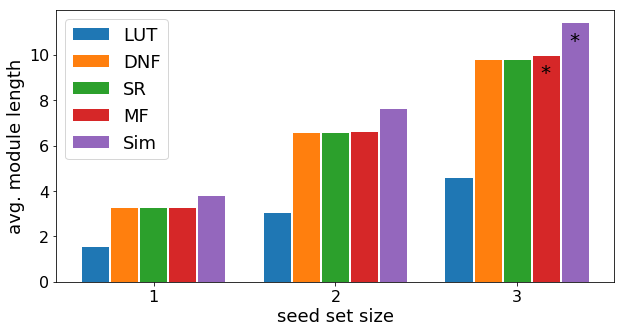

In [55]:
#plot average module lengths
averageTN=[3.27,6.54,9.79]
averagedtn=[3.27,6.54,9.79]
averageltn=[1.53,3.05,4.55]
averageMF=[3.27,6.59,9.95] #s=3 estimated
averageSim=[3.79,7.61,11.40] #s=3 estimated
xvalues=[1,2,3]
width=0.15
plt.figure(figsize=(10,5))

plt.bar([x-2*width-.02 for x in xvalues],averageltn,label='LUT',width=width)
plt.bar([x-width-.01 for x in xvalues],averagedtn,label='DNF',width=width)
plt.bar([x for x in xvalues],averageTN,label='SR',width=width)
plt.bar([x+width+.01 for x in xvalues],averageMF,label='MF',width=width)
plt.bar([x+2*width+.02 for x in xvalues],averageSim,label='Sim',width=width)
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("avg. module length",fontsize=18)
plt.legend(fontsize=18)
plt.figtext(0.797, 0.69, "*", wrap=True, horizontalalignment='left', fontsize=20)
plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)

In [507]:
len(constants_sim),len(constants_mf),len(modules['dtn'])

(8174, 8174, 8174)

In [158]:
#find similarity between predictions
#modules stores GTN modules, constants_mf stores mean-field constants, constants_bf stores brute-force constants
#NOTE that constants_mf has extra, contradictory seeds
#constants_mf=constants
num=3
labels=['LUT','DNF','SR','MF','Sim']
for i,d1 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_sim]):
    for j,d2 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_sim]):
        print "comparing {} with {}".format(labels[i],labels[j])
        ji=0.0
        total=0
        for seed in modules['TN']:
            if len(seed)!=num: continue #set to break down by seed set size
            total+=1
            if seed not in constants_mf or seed not in constants_sim: print seed
            try: set1=extract_sunits(d1[seed])
            except: set1=d1[seed]
            try: set2=extract_sunits(d2[seed])
            except: set2=d2[seed]
            #print set1,set2
            ji+=compute_jaccard(set1,set2)
            #print seed, compute_jaccard(set1,set2)
            #print set1,set2
        print ji/total
print total,"total seeds"

comparing LUT with LUT
1.0
comparing LUT with DNF
0.574384551774
comparing LUT with SR
0.574384551774
comparing LUT with MF
0.562929985415
comparing LUT with Sim
0.501570900991
comparing DNF with LUT
0.574384551774
comparing DNF with DNF
1.0
comparing DNF with SR
1.0
comparing DNF with MF
0.98445740927
comparing DNF with Sim
0.878476104564
comparing SR with LUT
0.574384551774
comparing SR with DNF
1.0
comparing SR with SR
1.0
comparing SR with MF
0.98445740927
comparing SR with Sim
0.878476104564
comparing MF with LUT
0.562929985415
comparing MF with DNF
0.98445740927
comparing MF with SR
0.98445740927
comparing MF with MF
1.0
comparing MF with Sim
0.889530654257
comparing Sim with LUT
0.501570900991
comparing Sim with DNF
0.878476104564
comparing Sim with SR
0.878476104564
comparing Sim with MF
0.889530654257
comparing Sim with Sim
1.0
974 total seeds


In [161]:
#calculate stats for drosophila parasegment, ground-truth is simulations
#modules stores GTN modules, constants_mf stores mean-field constants, constants_sim stores simulation constants
num=3
num_units=120
labels=['LUT','DNF','SR','MF','Sim']
for i,d1 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_sim]):
    print "comparing {} with {}".format(labels[i],'simulations')
    dpstats={'tps':0.0,'fns':0.0,'fps':0.0,'tns':0.0,'avg_sim':0.0,'accuracy':0.0,'errors':0.0,'recall':0.0,'precision':0.0}
    total=0
    for seed in modules['TN']:
        if len(seed)!=num: continue #set to break down by seed set size
        total+=1
        if seed not in constants_mf or seed not in constants_sim: print seed
        try: set1=extract_sunits(d1[seed])
        except: set1=d1[seed]
        set2=constants_sim[seed]
        stats=compute_stats_constants(set1,set2,num_units)
        for key in stats: dpstats[key]+=stats[key]
    dpstats={key:dpstats[key]/total for key in dpstats}
    #print_stats(dpstats)
    print dpstats#,'\n'
print total,"total seeds"

comparing LUT with simulations
{'errors': 0.05633983572895269, 'fns': 0.4984290990086486, 'tns': 1.0, 'recall': 0.5015709009913514, 'avg_sim': 0.5015709009913514, 'precision': 1.0, 'tps': 0.5015709009913514, 'fps': 0.0, 'accuracy': 0.9436601642710487}
comparing DNF with simulations
{'errors': 0.012893566050650224, 'fns': 0.12152389543580093, 'tns': 1.0, 'recall': 0.8784761045642, 'avg_sim': 0.8784761045642, 'precision': 1.0, 'tps': 0.8784761045642, 'fps': 0.0, 'accuracy': 0.987106433949354}
comparing SR with simulations
{'errors': 0.012893566050650224, 'fns': 0.12152389543580093, 'tns': 1.0, 'recall': 0.8784761045642, 'avg_sim': 0.8784761045642, 'precision': 1.0, 'tps': 0.8784761045642, 'fps': 0.0, 'accuracy': 0.987106433949354}
comparing MF with simulations
{'errors': 0.011892539356605029, 'fns': 0.10926095173944152, 'tns': 0.9998252869728705, 'recall': 0.8907390482605593, 'avg_sim': 0.8895306542574594, 'precision': 0.9984322174517246, 'tps': 0.8907390482605593, 'fps': 0.0001747130271

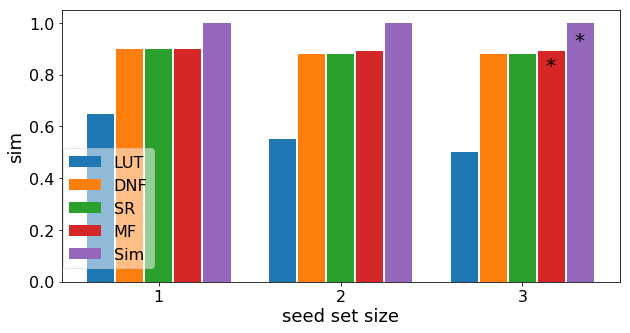

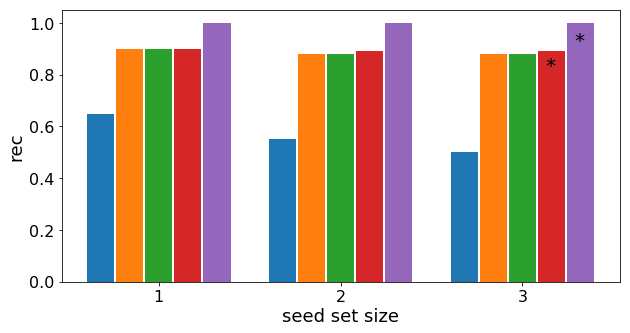

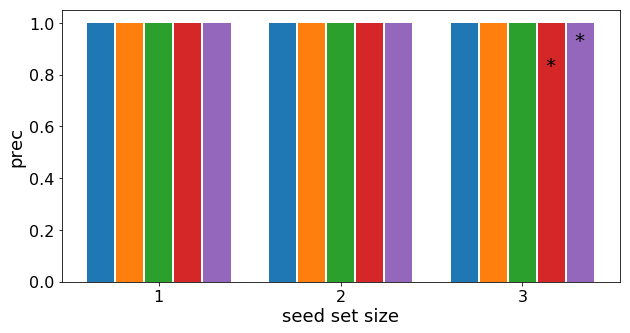

In [165]:
#plot similarity to simulations
simTN=[0.90,0.88,0.88]
simdtn=[0.90,0.88,0.88]
simltn=[0.65,0.55,0.50]
simMF=[0.90,0.89,0.89]
#plot recall
recTN=[0.90,0.88,0.88]
recdtn=[0.90,0.88,0.88]
recltn=[0.65,0.55,0.50]
recMF=[0.90,0.89,0.89]
#plot precision
precTN=[1.0,1.0,1.0]
precdtn=[1.0,1.0,1.0]
precltn=[1.0,1.0,1.0]
precMF=[1.0,1.0,1.0]
xvalues=[1,2,3]
width=0.15

for i,key in enumerate(['sim','rec','prec']):
    plt.figure(figsize=(10,5))
    plt.bar([x-2*width-.02 for x in xvalues],eval(key+'ltn'),label='LUT',width=width)
    plt.bar([x-width-.01 for x in xvalues],eval(key+'dtn'),label='DNF',width=width)
    plt.bar([x for x in xvalues],eval(key+'TN'),label='SR',width=width)
    plt.bar([x+width+.01 for x in xvalues],eval(key+'MF'),label='MF',width=width)
    plt.bar([x+2*width+.02 for x in xvalues],[1,1,1],label='Sim',width=width)
    plt.xticks([1,2,3],[1,2,3],fontsize=16)
    plt.yticks(fontsize=16)
    plt.xlabel("seed set size",fontsize=18)
    plt.ylabel(key,fontsize=18)
    if i==0: plt.legend(fontsize=16,framealpha=0.5,bbox_to_anchor=(0.18, 0.52))
    plt.figtext(0.797, 0.71, "*", wrap=True, horizontalalignment='left', fontsize=20)
    plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)
    plt.show()

In [579]:
#write dynamical rankings to file
dic=constants_sim #modules['ltn'], constants_mf, dic_in
#rankings=sorted(dic,key=lambda x:len(extract_sunits(dic[x])),reverse=True) #for modules
rankings=sorted(dic,key=lambda x:len(dic[x]),reverse=True) #for mean-field, brute-force
#with open('drosophila_parasegment_simulation_rankings_s3_sample974.txt','w') as fp:
#    fp.write(str(rankings))
#read in from file
#with open('drosophila_parasegment_simulation_rankings_s3_sample974.txt') as fp: #DNF-SR, LUT, mean-field, bruteforce
#    rankings_sim=eval(fp.read())
#for r in rankings: print r,len(dic[r])#,len(extract_sunits(dic[r]))
len(rankings_sim)

8174

In [516]:
#set translator and seeds
#dptranslator=create_translator(N,s=3,translator=dptranslator)
#seeds=reduce_seeds(dptranslator,dpsunit_map,dptranslator,length=3)
seeds=reduce_seeds(dpmodules,dpsunit_map,dptranslator,lrange=[1,3])
seeds=[frozenset(to_list(s,dpsunit_map,dptranslator)) for s in seeds]
inputs={node.name:len(node.inputs) for node in N2.nodes} #original graph
outputs={node.name:len(neighbors_BN(N2,node)) for node in N2.nodes} #original graph
print len(dptranslator),len(seeds),seeds[0],len(outputs),len(inputs)
#print inputs

#calculate structural rankings
dic_in={seed:sum([inputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
dic_out={seed:sum([outputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
dic_tot={seed:sum([inputs[sunit_to_var(node)]+outputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
print len(dptranslator),len(dic_out),len(dic_in),len(dic_tot)#,dic_in
#for seed in N2.nodes: print seed.name,seed.inputs,neighbors_BN(N2,seed)

288100 8174 frozenset(['WG_P4-0', 'ptc_P3-1']) 60 60
288100 8174 8174 8174


In [552]:
#alternatively, calculate GTN structural rankings
graph=ltn2
inputs={node:len(graph.predecessors(node)) for node in graph.nodes() if is_sunit(node)} #GTN
outputs={node:len(graph.neighbors(node)) for node in graph.nodes() if is_sunit(node)} #GTN
dic_in={seed:sum([inputs[node] for node in seed]) for seed in seeds}
dic_out={seed:sum([outputs[node] for node in seed]) for seed in seeds}
dic_tot={seed:sum([inputs[node]+outputs[node] for node in seed]) for seed in seeds}
print len(outputs),len(inputs),len(dic_tot)

120 120 8174


In [586]:
#write structural rankings to file
rankings_in=sorted(dic_in,key=lambda x:dic_in[x],reverse=True)
rankings_out=sorted(dic_out,key=lambda x:dic_out[x],reverse=True)
rankings_tot=sorted(dic_tot,key=lambda x:dic_tot[x],reverse=True)
#for r in rankings_tot: print r,dic_tot[r]
#with open('drosophila_parasegment_ltn_in-degree_rankings_s3_sample974.txt','w') as fp:
#    fp.write(str(rankings_in))
#read in from file
#with open('drosophila_parasegment_dtn_total-degree_rankings_s3_sample974.txt') as fp: #DNF-SR, LUT, mean-field, bruteforce
#    rankings_dtn_tot=eval(fp.read())
len(rankings_in),len(rankings_out),len(rankings_tot)
#len(rankings_ltn_in),len(rankings_ltn_out),len(rankings_ltn_tot)

(8174, 8174, 8174)

In [580]:
#compare rankings between different measures
num=1
#print len(rankings_dtn),len(rankings_ltn),len(rankings_mf),len(rankings_sim)
labels=['LUT','DNF-SR','MF','Sim','in-degree','out-degree','total degree','LUT TN in-degree','LUT TN out-degree','LUT TN total degree','DNF TN in-degree','DNF TN out-degree','DNF TN total degree','SR TN in-degree','SR TN out-degree','SR TN total degree']
ls=[rankings_ltn,rankings_dtn,rankings_mf,rankings_sim,rankings_SG_in,rankings_SG_out,rankings_SG_tot]
ls.extend([rankings_ltn_in,rankings_ltn_out,rankings_ltn_tot,rankings_dtn_in,rankings_dtn_out,rankings_dtn_tot,rankings_TN_in,rankings_TN_out,rankings_TN_tot])
for i,d1 in enumerate(ls):
    for j,d2 in enumerate(ls):
        r1=[str(sorted(list(r))) for r in d1 if len(r)==num] #set to restrict by seed set size
        r2=[str(sorted(list(r))) for r in d2 if len(r)==num] #set to restrict by seed set size
        xvalues=[k for k in range(len(r2))] #change to numeric labels
        yvalues=[r1.index(val) for val in r2] #change to numeric labels
        #print r1[:5],r2[:5]
        print "comparing {} with {}".format(labels[i],labels[j])
        print spearmanr(xvalues,yvalues)
print len(xvalues),len(yvalues)

8174 8174 8174 8174
comparing LUT with LUT
SpearmanrResult(correlation=1.0, pvalue=0.0)
comparing LUT with DNF-SR
SpearmanrResult(correlation=0.6398360997291477, pvalue=3.636399114186951e-15)
comparing LUT with MF
SpearmanrResult(correlation=0.6105771234113478, pvalue=1.3189318898350267e-13)
comparing LUT with Sim
SpearmanrResult(correlation=0.5339606917147023, pvalue=3.3797866388414313e-10)
comparing LUT with in-degree
SpearmanrResult(correlation=0.007847767206055975, pvalue=0.9322061655049287)
comparing LUT with out-degree
SpearmanrResult(correlation=0.090034030140982, pvalue=0.32810499681663796)
comparing LUT with total degree
SpearmanrResult(correlation=0.04151677199805541, pvalue=0.6525465068078894)
comparing LUT with LUT TN in-degree
SpearmanrResult(correlation=0.04609347871379956, pvalue=0.6171387703333491)
comparing LUT with LUT TN out-degree
SpearmanrResult(correlation=-0.13358566567122715, pvalue=0.14578872048643746)
comparing LUT with LUT TN total degree
SpearmanrResult(corr

SpearmanrResult(correlation=0.6578581845961524, pvalue=3.2642432996840345e-16)
comparing in-degree with SR TN out-degree
SpearmanrResult(correlation=-0.07034516285853183, pvalue=0.44518112912266006)
comparing in-degree with SR TN total degree
SpearmanrResult(correlation=0.11006319883325227, pvalue=0.23142284560179488)
comparing out-degree with LUT
SpearmanrResult(correlation=0.090034030140982, pvalue=0.32810499681663796)
comparing out-degree with DNF-SR
SpearmanrResult(correlation=0.29893742621015346, pvalue=0.0009112055343646907)
comparing out-degree with MF
SpearmanrResult(correlation=0.283700256962289, pvalue=0.0016893059742913751)
comparing out-degree with Sim
SpearmanrResult(correlation=0.24584346135148272, pvalue=0.006798392149509864)
comparing out-degree with in-degree
SpearmanrResult(correlation=-0.0381276477533162, pvalue=0.6792797663306229)
comparing out-degree with out-degree
SpearmanrResult(correlation=1.0, pvalue=0.0)
comparing out-degree with total degree
SpearmanrResult(

comparing DNF TN in-degree with LUT
SpearmanrResult(correlation=0.1397944301687617, pvalue=0.1278011161668888)
comparing DNF TN in-degree with DNF-SR
SpearmanrResult(correlation=-0.14098201263976665, pvalue=0.1245635152060491)
comparing DNF TN in-degree with MF
SpearmanrResult(correlation=-0.13224529481213973, pvalue=0.14991167658825955)
comparing DNF TN in-degree with Sim
SpearmanrResult(correlation=-0.1480727828321411, pvalue=0.10652993423173306)
comparing DNF TN in-degree with in-degree
SpearmanrResult(correlation=0.7804917008125563, pvalue=7.90462688830408e-26)
comparing DNF TN in-degree with out-degree
SpearmanrResult(correlation=-0.059566636571984154, pvalue=0.5181083045869328)
comparing DNF TN in-degree with total degree
SpearmanrResult(correlation=0.3822140426418501, pvalue=1.6484781291751825e-05)
comparing DNF TN in-degree with LUT TN in-degree
SpearmanrResult(correlation=0.9481561219529132, pvalue=1.389141444471351e-60)
comparing DNF TN in-degree with LUT TN out-degree
Spearm

SpearmanrResult(correlation=0.9514549621501491, pvalue=3.1623651511733054e-62)
comparing SR TN total degree with LUT
SpearmanrResult(correlation=0.037537328981179244, pvalue=0.6839783618145404)
comparing SR TN total degree with DNF-SR
SpearmanrResult(correlation=0.18863115494131535, pvalue=0.03908571340426209)
comparing SR TN total degree with MF
SpearmanrResult(correlation=0.1809222862698798, pvalue=0.04798390210756763)
comparing SR TN total degree with Sim
SpearmanrResult(correlation=0.18987429682616846, pvalue=0.0377892734704457)
comparing SR TN total degree with in-degree
SpearmanrResult(correlation=0.11006319883325227, pvalue=0.23142284560179488)
comparing SR TN total degree with out-degree
SpearmanrResult(correlation=0.9275921939023544, pvalue=2.7565701544822526e-52)
comparing SR TN total degree with total degree
SpearmanrResult(correlation=0.8254184318355441, pvalue=4.4158702795143994e-31)
comparing SR TN total degree with LUT TN in-degree
SpearmanrResult(correlation=0.171866101

In [590]:
#graph comparison to simulations
#compare rankings between different measures
num=3
print len(rankings_dtn),len(rankings_ltn),len(rankings_mf),len(rankings_sim)
labels=['LUT','DNF-SR','MF','Sim','in-degree','out-degree','total degree','LUT TN in-degree','LUT TN out-degree','LUT TN total degree','DNF TN in-degree','DNF TN out-degree','DNF TN total degree','SR TN in-degree','SR TN out-degree','SR TN total degree']
ls=[rankings_ltn,rankings_dtn,rankings_mf,rankings_sim,rankings_SG_in,rankings_SG_out,rankings_SG_tot]
ls.extend([rankings_ltn_in,rankings_ltn_out,rankings_ltn_tot,rankings_dtn_in,rankings_dtn_out,rankings_dtn_tot,rankings_TN_in,rankings_TN_out,rankings_TN_tot])
for i,d1 in enumerate(ls):
    for j,d2 in enumerate([rankings_sim]):
        r1=[str(sorted(list(r))) for r in d1]# if len(r)==num] #set to restrict by seed set size
        r2=[str(sorted(list(r))) for r in d2]# if len(r)==num] #set to restrict by seed set size
        xvalues=[k for k in range(len(r2))] #correct label
        yvalues=[r1.index(val) for val in r2]
        #print xvalues,yvalues
        #print r1[:6],r2[:6]
        print "comparing {} with {}".format(labels[i],'Sim')
        print spearmanr(xvalues,yvalues)
        #plt.scatter(xvalues,yvalues)
        #plt.xlabel('simulation rank',fontsize=16)
        #plt.ylabel(labels[i]+' rank',fontsize=16)
        #plt.show()
print len(xvalues),len(yvalues)

8174 8174 8174 8174
comparing LUT with Sim
SpearmanrResult(correlation=0.5618044507481358, pvalue=0.0)
comparing DNF-SR with Sim
SpearmanrResult(correlation=0.9255547646852198, pvalue=0.0)
comparing MF with Sim
SpearmanrResult(correlation=0.9350503289780928, pvalue=0.0)
comparing Sim with Sim
SpearmanrResult(correlation=0.9999999999999998, pvalue=0.0)
comparing in-degree with Sim
SpearmanrResult(correlation=-0.031706771320067176, pvalue=0.004145177133562536)
comparing out-degree with Sim
SpearmanrResult(correlation=0.17176882618550035, pvalue=3.6692796855071976e-55)
comparing total degree with Sim
SpearmanrResult(correlation=0.09497596133859065, pvalue=7.635884414093847e-18)
comparing LUT TN in-degree with Sim
SpearmanrResult(correlation=-0.1723000428143882, pvalue=1.694413343769251e-55)
comparing LUT TN out-degree with Sim
SpearmanrResult(correlation=0.020064182166577724, pvalue=0.06969136651099428)
comparing LUT TN total degree with Sim
SpearmanrResult(correlation=-0.0516289373103985

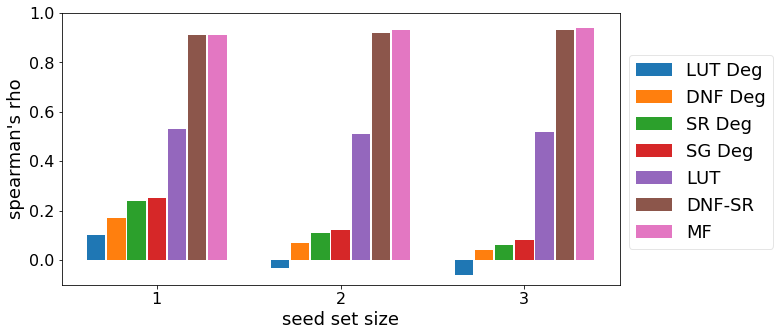

In [594]:
#plot spearman's rho between different methods
#plot average module lengths
corrltn=[0.53,0.51,0.52]
corrdtn=[0.91,0.92,0.93]
corrMF=[0.91,0.93,0.94]
corrSG_deg=[0.25,0.12,0.08]
corrltn_deg=[0.10,-0.03,-0.06]
corrdtn_deg=[0.17,0.07,0.04]
corrTN_deg=[0.24,0.11,0.06]
xvalues=[1,2,3]
width=0.1
plt.figure(figsize=(10,5))

plt.bar([x-3*width-.03 for x in xvalues],corrltn_deg,label='LUT Deg',width=width)
plt.bar([x-2*width-.02 for x in xvalues],corrdtn_deg,label='DNF Deg',width=width)
plt.bar([x-width-.01 for x in xvalues],corrTN_deg,label='SR Deg',width=width)
plt.bar([x for x in xvalues],corrSG_deg,label='SG Deg',width=width)
plt.bar([x+width+.01 for x in xvalues],corrltn,label='LUT',width=width)
plt.bar([x+2*width+.02 for x in xvalues],corrdtn,label='DNF-SR',width=width)
plt.bar([x+3*width+.03 for x in xvalues],corrMF,label='MF',width=width)
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("spearman's rho",fontsize=18)
plt.ylim([-0.1,1.0])
plt.legend(fontsize=18,framealpha=0.5,bbox_to_anchor=(1.0, 0.88))

#### Yeast

In [608]:
#repeat with the yeast cell cycle (the DCM takes a while to compute the first time)
NY = BUDDING_YEAST()
#DCMY = NY.dynamics_canalization_map(output=None, )
TNY = create_threshold_network(DCMY)
ltny=create_threshold_network_LUTs(NY,single_nodes=[]) #single_nodes=['en','wg']
#dtny=create_threshold_network_dnf(NY,"yeast_cell_cycle.txt",single_nodes=[])

In [686]:
nodes=[node.name for node in NY.nodes]
for i,node in enumerate(nodes):
    nodes[i]=node.replace(',','').replace('/','')
print nodes
for node in NY.nodes:
    print node.name,node.inputs,node.look_up_table(),node.schemata_look_up_table(type="pi")
    expr=expr_from_LUT(node)
    expr=expr.replace(',','').replace('/','') #replace all commas and other punctuation in order to find dnf
    print expr#,convert_dnf(expr,nodes)[0]

 ['CellSize', 'Cln3', 'SBF', 'MBF', 'Cln12', 'Sic1', 'Clb56', 'Cdh1', 'Clb12', 'Mcm1SFF', 'Cdc2014', 'Swi5']
CellSize ['CellSize']   In:  Out:
0   0     0
1   1     1   In:  Out:
0   0     0
1   1     1
CellSize*=(CellSize)
Cln3 ['CellSize']   In:  Out:
0   0     0
1   1     1   In:  Out:
0   0     0
1   1     1
Cln3*=(CellSize)
SBF ['Cln3', 'SBF', 'Clb1,2']    In:  Out:
0  000     0
1  001     0
2  010     1
3  011     0
4  100     1
5  101     0
6  110     1
7  111     1    In:  Out:
0  #01     0
1  00#     0
2  0#1     0
3  1#0     1
4  #10     1
5  11#     1
SBF*=(not Cln3 and SBF and not Clb12) or (Cln3 and not SBF and not Clb12) or (Cln3 and SBF and not Clb12) or (Cln3 and SBF and Clb12)
MBF ['Cln3', 'MBF', 'Clb1,2']    In:  Out:
0  000     0
1  001     0
2  010     1
3  011     0
4  100     1
5  101     0
6  110     1
7  111     1    In:  Out:
0  #01     0
1  00#     0
2  0#1     0
3  1#0     1
4  #10     1
5  11#     1
MBF*=(not Cln3 and MBF and not Clb12) or (Cln3 and not MBF 

3  11     1   In:  Out:
0  00     0
1  1#     1
2  #1     1
Mcm1SFF*=(not Clb56 and Clb12) or (Clb56 and not Clb12) or (Clb56 and Clb12)
Cdc20/14 ['Clb1,2', 'Mcm1/SFF']   In:  Out:
0  00     0
1  01     1
2  10     1
3  11     1   In:  Out:
0  00     0
1  1#     1
2  #1     1
Cdc2014*=(not Clb12 and Mcm1SFF) or (Clb12 and not Mcm1SFF) or (Clb12 and Mcm1SFF)
Swi5 ['Clb1,2', 'Mcm1/SFF', 'Cdc20/14', 'Swi5']      In:  Out:
0   0000     0
1   0001     0
2   0010     1
3   0011     1
4   0100     1
5   0101     1
6   0110     1
7   0111     1
8   1000     0
9   1001     0
10  1010     0
11  1011     0
12  1100     0
13  1101     0
14  1110     1
15  1111     1     In:  Out:
0  #00#     0
1  1#0#     0
2  10##     0
3  #11#     1
4  0#1#     1
5  01##     1
Swi5*=(not Clb12 and not Mcm1SFF and Cdc2014 and not Swi5) or (not Clb12 and not Mcm1SFF and Cdc2014 and Swi5) or (not Clb12 and Mcm1SFF and not Cdc2014 and not Swi5) or (not Clb12 and Mcm1SFF and not Cdc2014 and Swi5) or (not Clb12 and Mc

#### Leukemia

In [599]:
#repeat with leukemia
N3=LEUKEMIA()
DCM3 = N3.dynamics_canalization_map(output=None, )
TN3 = create_threshold_network(DCM3)
ltn3=create_threshold_network_LUTs(N3,single_nodes=[]) #single_nodes=['en','wg']
dtn3=create_threshold_network_dnf(N3,"cana/datasets/leukemia.txt",single_nodes=[])
nodes=[node.name for node in N3.nodes]

In [32]:
#compare modules between the DCM, the LUT-based GTN, and the dnf-based GTN
#BFS_threshold(dtn,[],'steady',conversion=False)
#modules={'TN':{},'dtn':{},'ltn':{}}
total_sizes={'TN':{},'dtn':{},'ltn':{}}
num=2
for network in modules:
    nu,tm,sizes,c=find_dynamic_modules(eval(network+'3'),input_type='steady',num=num,samples=None,tm=True,seeds=None)
    for seed in nu: modules[str(network)][seed]=nu[seed]
    for seed in sizes: total_sizes[str(network)][seed]=sizes[seed]
print len(modules['dtn'].keys())

8184


In [602]:
#write modules to file
#with open('leukemia_modules-s3_sample984.txt', 'w') as fp:
#    fp.write(str(modules))
#read in all modules from file (this takes a lot of memory! ~80%)
#with open('leukemia_modules-s3_sample984.txt') as fp:
#    modules=eval(fp.read())
#modules={key:{seed:m[key][seed] for seed in m[key] if seed in constants_sim} for key in m}
len(modules['dtn'])

8184

In [764]:
#compare sizes
print total_sizes.keys()
total=0
for module in sorted(total_sizes['TN'],key=lambda x:total_sizes['TN'][x],reverse=True): #sort by DCM module
    #print [m for m in module],total_sizes['TN'][module],total_sizes['dtn'][module],total_sizes['ltn'][module]
    if total_sizes['TN'][module]!=total_sizes['dtn'][module]: 
        total+=1
        print "mismatch between DCM and DNF"
        print [m for m in module],total_sizes['TN'][module],total_sizes['dtn'][module],total_sizes['ltn'][module]
avg_TN=np.mean([total_sizes['TN'][module] for module in total_sizes['TN']])
avg_dtn=np.mean([total_sizes['dtn'][module] for module in total_sizes['dtn']])
avg_ltn=np.mean([total_sizes['ltn'][module] for module in total_sizes['ltn']])
print avg_TN,avg_dtn,avg_ltn,total

['TN', 'dtn', 'ltn']
9.586703682057276 9.586703682057276 3.910374050263004 0


In [766]:
dtn3['IL2RAT-1'],dtn3['T-0_IL2RA-1']
BFS_threshold(dtn3,['IL2-0', 'IL2RAT-1', 'BID-0'],'steady',conversion=False)

{0: {'BID-0', 'IL2-0', 'IL2RAT-1', 'T-0_IL2RAT-0', 'T-2_IL2RA-0'},
 1: {'IL2RA-0'}}

In [767]:
dtn3['T-0_IL2RA-1']
sorted(dtn3.nodes(data=True))
dtn3.predecessors('T-0_IL2RA-1')

['IL2RA-0', 'IL2-1', 'IL2RAT-1']

In [600]:
#reduce leukemia LUT and get sunits
dl={node.name: LUT_reduce(look_up_table(node)) for node in N3.nodes}
lnodes=dl.keys()
print len(dl),lnodes
lmodules,ltranslator={},{}
lsunits,lsunit_map=get_sunits(N3)
print len(lsunits)#,lsunit_map

60 ['TAX', 'FasT', 'FYN', 'SPHK1', 'FLIP', 'PLCG1', 'DISC', 'TPL2', 'Stimuli2', 'ERK', 'Proliferation', 'STAT3', 'IL2RBT', 'Fas', 'BID', 'TCR', 'Caspase', 'TRADD', 'GAP', 'CD45', 'GPCR', 'PDGF', 'ZAP70', 'FasL', 'IL15', 'SOCS', 'RAS', 'P2', 'CTLA4', 'sFas', 'Cytoskeleton_signaling', 'PI3K', 'IFNG', 'Stimuli', 'S1P', 'PDGFR', 'TNF', 'JAK', 'SMAD', 'IFNGT', 'BclxL', 'IAP', 'NFAT', 'A20', 'IL2RA', 'IL2RB', 'GZMB', 'NFKB', 'Ceramide', 'TBET', 'MEK', 'P27', 'GRB2', 'IL2', 'Apoptosis', 'CREB', 'RANTES', 'LCK', 'IL2RAT', 'MCL1']
120


In [40]:
#find modules using the mf-approximation; use data=False to just pull out constants
start_time = time.time()
lmodules,ltranslator=find_modules(N3,3,lsunits,lsunit_map,lmodules,ltranslator,reduced=True,ds=dl,samples=1000,
                pinning={},iterations=10,data=False,pin_start=True,update='synchronous',regenerate=False,models=1)
print("--- Total time: %s seconds ---" % (time.time()-start_time))

seeds: 1000
--- Total time: 409.711999893 seconds ---


In [130]:
#lmodules['(7,)']
length=1
#seeds=reduce_seeds(lmodules,lsunit_map,ltranslator,length=3)
#constants={frozenset(to_list(seed,lsunit_map,ltranslator)): lmodules[seed] for seed in seeds}
print len(constants_mf),len([c for c in constants_mf if len(c)==length])
print np.mean([len(constants_mf[c]) for c in constants_mf if len(c)==length])
for c in sorted(constants_mf,key=lambda x:len(constants_mf[x]),reverse=True): 
    if len(c)==length: print c,len(constants_mf[c])

8184 120
3.5166666666666666
frozenset(['S1P-1']) 24
frozenset(['PDGF-1']) 16
frozenset(['PDGFR-1']) 15
frozenset(['RAS-1']) 14
frozenset(['JAK-1']) 12
frozenset(['NFKB-0']) 12
frozenset(['PI3K-1']) 11
frozenset(['RAS-0']) 9
frozenset(['TAX-1']) 9
frozenset(['GAP-1']) 9
frozenset(['TBET-0']) 8
frozenset(['TPL2-1']) 8
frozenset(['CD45-1']) 8
frozenset(['DISC-1']) 8
frozenset(['NFKB-1']) 7
frozenset(['TBET-1']) 7
frozenset(['PI3K-0']) 7
frozenset(['MEK-0']) 7
frozenset(['IL2RB-1']) 7
frozenset(['JAK-0']) 6
frozenset(['SOCS-1']) 6
frozenset(['ERK-0']) 6
frozenset(['Ceramide-1']) 6
frozenset(['PDGFR-0']) 6
frozenset(['SPHK1-0']) 6
frozenset(['FasT-0']) 6
frozenset(['TCR-1']) 6
frozenset(['sFas-1']) 5
frozenset(['S1P-0']) 5
frozenset(['STAT3-1']) 5
frozenset(['STAT3-0']) 5
frozenset(['IL2RBT-0']) 4
frozenset(['IL15-1']) 4
frozenset(['SPHK1-1']) 4
frozenset(['Fas-0']) 4
frozenset(['IL2-1']) 4
frozenset(['FasL-0']) 4
frozenset(['GPCR-1']) 4
frozenset(['IL2-0']) 3
frozenset(['NFAT-1']) 3
frozen

In [609]:
#write constants to file
#with open('leukemia_mean-field_constants_t10-s3_sample984.txt', 'w') as fp:
#    fp.write(str(constants_mf))
#read in modules from file
#with open('lact_prob_sim-s3_sample984') as fp: #takes a lot of memory, ~50%!
#    lact_prob_sim=eval(fp.read())
#with open('leukemia_mean-field_constants_t10-s3_sample984.txt') as fp:
#    constants_mf=eval(fp.read())
#ltranslator=create_translator(N3,s=3,translator=ltranslator)
#seeds=reduce_seeds(lmodules,lsunit_map,ltranslator,length=3)
#for c in constants: constants_mf[c]=constants[c]
print len(constants_mf),len(ltranslator)
#set(lmodules.keys())-set(seeds)

8184 288101


In [98]:
#get rid of duplicates
bads=set([])
for seed in constants_mf: 
    var={c[:-2] for c in seed}
    if len(var)<len(seed): bads.add(seed)#print seed
#for bad in bads: del constants_mf[bad]
len(bads)

0

In [79]:
#run simulations
length=3
#seeds=reduce_seeds(ltranslator,lsunit_map,ltranslator,length=length)
#submodules={seed:lmodules[seed] for seed in seeds}
print len(seeds)
#seeds=submodules.keys() #dmodules.keys(), ['(67,)','(66,)'], ['(2, 66)','(3, 67)','(2, 67)'] (odd numbers are positive)
iterations=10
start_time = time.time()
simulations,act_prob_sim=create_simulations(N3,seeds,lsunit_map,ltranslator,length=length,runs=100,
            iterations=iterations,unknown_prob=0.5,time_limit=12)
print("--- Total time: %s seconds ---" % (time.time()-start_time))

984
--- Total time: 615.888000011 seconds ---


In [124]:
#fix keys that are strings
#for key in lact_prob_sim: 
#    lact_prob_sim[key]={int(x):lact_prob_sim[key][x] for x in lact_prob_sim[key]}
#    print key,lact_prob_sim[key].keys()
len(lact_prob_sim)

8185

In [125]:
length,iterations=3,10
constants_sim=constants_from_sim(lact_prob_sim,lsunit_map,ltranslator,t=iterations)
print len(constants_sim)
print np.mean([len(constants_sim[c]) for c in constants_sim if len(c)==length])
for c in sorted(constants_sim,key=lambda x:len(constants_sim[x]),reverse=True): 
    if len(c)==length: print c,len(constants_sim[c])

8185
11.647357723577235
frozenset(['TBET-0', 'S1P-1', 'IL2-1']) 42
frozenset(['TBET-0', 'IL2RB-1', 'SPHK1-0']) 36
frozenset(['RAS-0', 'JAK-1', 'NFKB-0']) 34
frozenset(['JAK-1', 'S1P-1', 'IL2RA-1']) 34
frozenset(['JAK-1', 'S1P-1', 'TPL2-1']) 34
frozenset(['RAS-1', 'CD45-1', 'TBET-1']) 33
frozenset(['Ceramide-1', 'STAT3-1', 'PDGF-1']) 32
frozenset(['IFNGT-0', 'S1P-1', 'CD45-0']) 32
frozenset(['S1P-1', 'IL15-1', 'FasT-1']) 32
frozenset(['S1P-1', 'BclxL-1', 'IL2RAT-0']) 31
frozenset(['S1P-1', 'TBET-1', 'GRB2-0']) 31
frozenset(['Ceramide-1', 'S1P-1', 'Cytoskeleton_signaling-0']) 31
frozenset(['TNF-0', 'S1P-1', 'CD45-0']) 31
frozenset(['S1P-1', 'IL2-0', 'BID-1']) 30
frozenset(['S1P-1', 'IL2-0', 'Stimuli-0']) 30
frozenset(['IL2-1', 'IL2RB-1', 'FasL-0']) 30
frozenset(['S1P-1', 'TCR-1', 'IFNG-0']) 30
frozenset(['IAP-1', 'S1P-1', 'P27-1']) 29
frozenset(['IL2RBT-0', 'S1P-1', 'Stimuli2-1']) 29
frozenset(['Stimuli2-0', 'S1P-1', 'IL15-0']) 29
frozenset(['BID-1', 'IL2RB-1', 'IL15-1']) 28
frozenset(['

frozenset(['SOCS-1', 'IFNGT-0', 'ERK-0']) 13
frozenset(['JAK-1', 'IL2RA-1', 'FasL-1']) 13
frozenset(['CD45-1', 'FYN-1', 'GRB2-0']) 13
frozenset(['SOCS-1', 'PDGF-0', 'FasT-0']) 13
frozenset(['PI3K-0', 'ERK-0', 'GAP-1']) 13
frozenset(['Ceramide-0', 'STAT3-0', 'NFKB-1']) 13
frozenset(['IAP-0', 'TNF-1', 'PDGFR-0']) 13
frozenset(['LCK-1', 'PI3K-1', 'CTLA4-0']) 13
frozenset(['S1P-0', 'Stimuli-1', 'FasT-1']) 13
frozenset(['SMAD-1', 'BID-1', 'SPHK1-0']) 13
frozenset(['Ceramide-0', 'GZMB-1', 'Stimuli-0']) 13
frozenset(['JAK-0', 'TBET-0', 'FLIP-1']) 13
frozenset(['TRADD-1', 'Stimuli2-0', 'S1P-0']) 13
frozenset(['PI3K-1', 'P2-0', 'GAP-0']) 13
frozenset(['Fas-0', 'sFas-0', 'DISC-1']) 13
frozenset(['Fas-0', 'FYN-0', 'TBET-1']) 13
frozenset(['TNF-1', 'TBET-0', 'PLCG1-0']) 12
frozenset(['IL2RBT-0', 'Stimuli2-0', 'IL15-1']) 12
frozenset(['ZAP70-1', 'TBET-1', 'sFas-0']) 12
frozenset(['SMAD-1', 'FasT-1', 'GAP-1']) 12
frozenset(['IAP-1', 'CD45-0', 'FasL-1']) 12
frozenset(['IFNGT-1', 'PI3K-1', 'IL2RA-0'])

frozenset(['LCK-1', 'IFNG-1', 'FasT-0']) 8
frozenset(['CTLA4-0', 'DISC-0', 'ERK-0']) 8
frozenset(['STAT3-1', 'CREB-1', 'CTLA4-0']) 8
frozenset(['SOCS-1', 'TRADD-0', 'GAP-0']) 8
frozenset(['Stimuli2-0', 'PDGF-0', 'GAP-0']) 8
frozenset(['MEK-0', 'MCL1-1', 'CREB-0']) 8
frozenset(['P27-0', 'Fas-0', 'GRB2-1']) 8
frozenset(['ZAP70-1', 'NFAT-0', 'Stimuli-0']) 8
frozenset(['ZAP70-1', 'IL15-0', 'GRB2-0']) 8
frozenset(['CREB-1', 'GZMB-1', 'Stimuli-0']) 8
frozenset(['Caspase-1', 'GPCR-0', 'P27-0']) 7
frozenset(['SMAD-1', 'TAX-0', 'GAP-0']) 7
frozenset(['BclxL-0', 'Fas-1', 'IL2RB-0']) 7
frozenset(['IAP-1', 'STAT3-0', 'BclxL-0']) 7
frozenset(['GPCR-1', 'CTLA4-0', 'Cytoskeleton_signaling-1']) 7
frozenset(['FLIP-0', 'SMAD-1', 'Cytoskeleton_signaling-0']) 7
frozenset(['TRADD-1', 'MEK-0', 'ERK-0']) 7
frozenset(['P2-1', 'IL2RAT-1', 'TPL2-0']) 7
frozenset(['LCK-1', 'Proliferation-1', 'sFas-1']) 7
frozenset(['MEK-1', 'IL2-0', 'Stimuli2-1']) 7
frozenset(['RANTES-1', 'Stimuli2-0', 'PLCG1-0']) 7
frozenset(['

frozenset(['TNF-0', 'P2-0', 'BclxL-0']) 4
frozenset(['ZAP70-0', 'LCK-1', 'A20-1']) 4
frozenset(['PDGF-0', 'Cytoskeleton_signaling-1', 'FasT-1']) 4
frozenset(['ZAP70-0', 'BclxL-0', 'GZMB-0']) 4
frozenset(['ZAP70-0', 'SOCS-0', 'A20-0']) 4
frozenset(['Apoptosis-0', 'IL2RBT-1', 'IL2RA-0']) 4
frozenset(['TRADD-0', 'GRB2-0', 'IL2RB-0']) 4
frozenset(['GZMB-0', 'TAX-0', 'RANTES-1']) 4
frozenset(['TNF-0', 'IL2RBT-1', 'FasT-1']) 4
frozenset(['A20-1', 'IFNGT-1', 'IL2RA-1']) 4
frozenset(['A20-1', 'Apoptosis-0', 'MCL1-0']) 4
frozenset(['A20-0', 'CTLA4-0', 'ERK-1']) 4
frozenset(['TNF-1', 'Proliferation-1', 'Apoptosis-0']) 4
frozenset(['Ceramide-0', 'TRADD-0', 'IL2RB-0']) 4
frozenset(['ZAP70-0', 'CREB-1', 'IL2RA-0']) 4
frozenset(['CTLA4-0', 'FLIP-1', 'FasL-1']) 4
frozenset(['TRADD-0', 'IFNG-0', 'GRB2-0']) 4
frozenset(['TRADD-0', 'MCL1-1', 'PLCG1-0']) 4
frozenset(['ZAP70-0', 'Proliferation-1', 'TAX-0']) 4
frozenset(['FLIP-1', 'BclxL-1', 'BID-0']) 4
frozenset(['GPCR-1', 'SMAD-0', 'TAX-0']) 4
frozenset(

In [611]:
#write to file
#with open('leukemia_simulations-s3_sample984.txt','w') as fp:
#    fp.write(str(simulations))
#with open('lact_prob_sim-s3_sample984.txt', 'w') as fp:
#    fp.write(str(lact_prob_sim))
#with open('leukemia_simulation_constants_t10-s3_sample984.txt', 'w') as fp:
#    fp.write(str(constants_sim))
#read in data
#with open('leukemia_simulation_constants_t10-s3_sample984.txt') as fp:
#    constants_sim=eval(fp.read())
#lact_prob_sim=act_prob_sim
#for seed in act_prob_sim: lact_prob_sim[seed]=act_prob_sim[seed]
len(constants_sim)#,len(act_prob_sim)

8185

Text(0.837,0.78,'*')

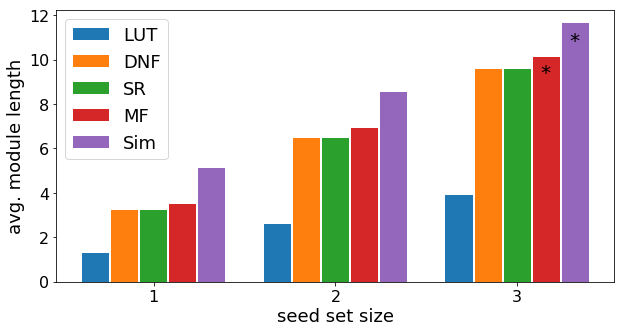

In [43]:
#plot average module lengths
averageTN=[3.25,6.45,9.59]
averagedtn=[3.25,6.45,9.59]
averageltn=[1.3,2.60,3.91]
averageMF=[3.52,6.94,10.11] #[3.52,6.92,10.20]
averageSim=[5.14,8.54,11.65]
xvalues=[1,2,3]
width=0.15
plt.figure(figsize=(10,5))

plt.bar([x-2*width-.02 for x in xvalues],averageltn,label='LUT',width=width)
plt.bar([x-width-.01 for x in xvalues],averagedtn,label='DNF',width=width)
plt.bar([x for x in xvalues],averageTN,label='SR',width=width)
plt.bar([x+width+.01 for x in xvalues],averageMF,label='MF',width=width)
plt.bar([x+2*width+.02 for x in xvalues],averageSim,label='Sim',width=width)
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("avg. module length",fontsize=18)
plt.legend(fontsize=18)
plt.figtext(0.797, 0.69, "*", wrap=True, horizontalalignment='left', fontsize=20)
plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)

In [612]:
len(modules['dtn']),len(constants_sim),len(constants_mf)

(8184, 8185, 8184)

In [91]:
#find similarity between predictions
#modules stores GTN modules, constants_mf stores mean-field constants, constants_sim stores simulation constants
num=1
labels=['LUT','DNF','SR','MF','Sim']
for i,d1 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_sim]):
    for j,d2 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_sim]):
        print "comparing {} with {}".format(labels[i],labels[j])
        ji=0.0
        total=0
        for seed in modules['TN']:
            if len(seed)!=num: continue #set to break down by seed set size
            total+=1
            if seed not in constants_mf or seed not in constants_sim: print seed
            try: set1=extract_sunits(d1[seed])
            except: set1=d1[seed]
            try: set2=extract_sunits(d2[seed])
            except: set2=d2[seed]
            ji+=compute_jaccard(set1,set2)
            #print seed, compute_jaccard(set1,set2)
            #print set1,set2
        print ji/total
print total,"total seeds"

comparing LUT with LUT
1.0
comparing LUT with DNF
0.671458934584
comparing LUT with SR
0.671458934584
comparing LUT with MF
0.628626593314
comparing LUT with Sim
0.332435828061
comparing DNF with LUT
0.671458934584
comparing DNF with DNF
1.0
comparing DNF with SR
1.0
comparing DNF with MF
0.936483134921
comparing DNF with Sim
0.571372724498
comparing SR with LUT
0.671458934584
comparing SR with DNF
1.0
comparing SR with SR
1.0
comparing SR with MF
0.936483134921
comparing SR with Sim
0.571372724498
comparing MF with LUT
0.628626593314
comparing MF with DNF
0.936483134921
comparing MF with SR
0.936483134921
comparing MF with MF
1.0
comparing MF with Sim
0.571387397325
comparing Sim with LUT
0.332435828061
comparing Sim with DNF
0.571372724498
comparing Sim with SR
0.571372724498
comparing Sim with MF
0.571387397325
comparing Sim with Sim
1.0
120 total seeds


In [108]:
#calculate stats for leukemia, ground-truth is simulations
#modules stores GTN modules, constants_mf stores mean-field constants, constants_sim stores simulation constants
num=3
num_units=120
labels=['LUT','DNF','SR','MF','Sim']
for i,d1 in enumerate([modules['ltn'],modules['dtn'],modules['TN'],constants_mf,constants_sim]):
    print "comparing {} with {}".format(labels[i],'simulations')
    lstats={'tps':0.0,'fns':0.0,'fps':0.0,'tns':0.0,'avg_sim':0.0,'accuracy':0.0,'errors':0.0,'recall':0.0,'precision':0.0}
    total=0
    for seed in modules['TN']:
        if len(seed)!=num: continue #set to break down by seed set size
        total+=1
        if seed not in constants_mf or seed not in constants_sim: print seed
        try: set1=extract_sunits(d1[seed])
        except: set1=d1[seed]
        set2=constants_sim[seed]
        stats=compute_stats_constants(set1,set2,num_units)
        for key in stats: lstats[key]+=stats[key]
    lstats={key:lstats[key]/total for key in lstats}
    #print_stats(lstats)
    print lstats#,'\n'
print total,"total seeds"

comparing LUT with simulations
{'errors': 0.06473577235772347, 'fns': 0.5957092279617598, 'tns': 1.0, 'recall': 0.40429077203824043, 'avg_sim': 0.40429077203824043, 'precision': 1.0, 'tps': 0.40429077203824043, 'fps': 0.0, 'accuracy': 0.9352642276422781}
comparing DNF with simulations
{'errors': 0.018030149051490467, 'fns': 0.20053695999017365, 'tns': 1.0, 'recall': 0.7994630400098256, 'avg_sim': 0.7994630400098256, 'precision': 1.0, 'tps': 0.7994630400098256, 'fps': 0.0, 'accuracy': 0.9819698509485161}
comparing SR with simulations
{'errors': 0.018030149051490467, 'fns': 0.20053695999017365, 'tns': 1.0, 'recall': 0.7994630400098256, 'avg_sim': 0.7994630400098256, 'precision': 1.0, 'tps': 0.7994630400098256, 'fps': 0.0, 'accuracy': 0.9819698509485161}
comparing MF with simulations
{'errors': 0.017471205962059613, 'fns': 0.17684596680945788, 'tns': 0.9974116560194808, 'recall': 0.8231540331905417, 'avg_sim': 0.8035625244669986, 'precision': 0.9712674989833443, 'tps': 0.8231540331905417,

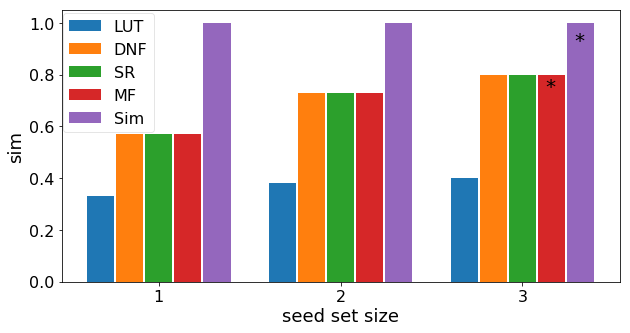

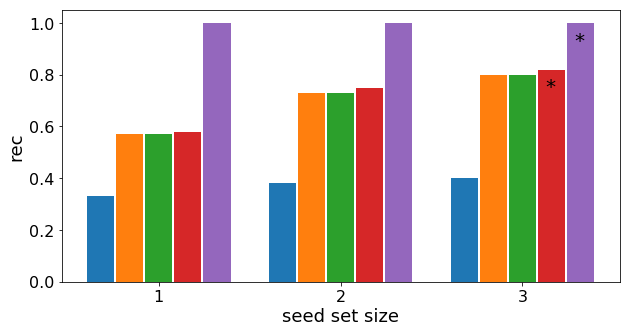

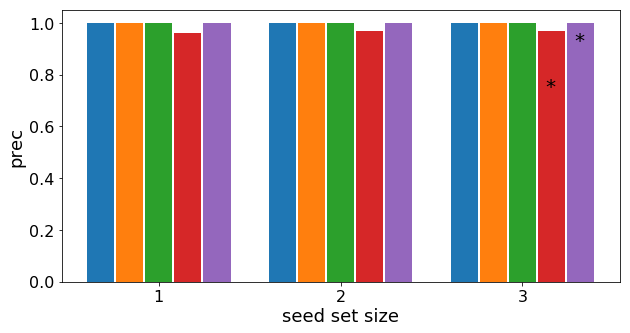

In [128]:
#plot similarity to simulations
simTN=[0.57,0.73,0.8]
simdtn=[0.57,0.73,0.8]
simltn=[0.33,0.38,0.4]
simMF=[0.57,0.73,0.8]
#plot recall
recTN=[0.57,0.73,0.8]
recdtn=[0.57,0.73,0.8]
recltn=[0.33,0.38,0.4]
recMF=[0.58,0.75,0.82]
#plot precision
precTN=[1.0,1.0,1.0]
precdtn=[1.0,1.0,1.0]
precltn=[1.0,1.0,1.0]
precMF=[0.96,0.97,0.97]
xvalues=[1,2,3]
width=0.15

for i,key in enumerate(['sim','rec','prec']):
    plt.figure(figsize=(10,5))
    plt.bar([x-2*width-.02 for x in xvalues],eval(key+'ltn'),label='LUT',width=width)
    plt.bar([x-width-.01 for x in xvalues],eval(key+'dtn'),label='DNF',width=width)
    plt.bar([x for x in xvalues],eval(key+'TN'),label='SR',width=width)
    plt.bar([x+width+.01 for x in xvalues],eval(key+'MF'),label='MF',width=width)
    plt.bar([x+2*width+.02 for x in xvalues],[1,1,1],label='Sim',width=width)
    plt.xticks([1,2,3],[1,2,3],fontsize=16)
    plt.yticks(fontsize=16)
    plt.xlabel("seed set size",fontsize=18)
    plt.ylabel(key,fontsize=18)
    if i==0: plt.legend(fontsize=16,framealpha=0.5,bbox_to_anchor=(0.18, 0.52))
    plt.figtext(0.797, 0.65, "*", wrap=True, horizontalalignment='left', fontsize=20)
    plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)
    plt.show()

In [631]:
#write dynamical rankings to file
dic=modules['dtn'] #modules['ltn'], constants_mf, dic_in
rankings=sorted(dic,key=lambda x:len(extract_sunits(dic[x])),reverse=True) #for modules
#rankings=sorted(dic,key=lambda x:len(dic[x]),reverse=True) #for mean-field, brute-force
#with open('leukemia_DNF-SR_rankings_s3_sample984.txt','w') as fp:
#    fp.write(str(rankings))
#read in from file
#with open('leukemia_DNF-SR_rankings_s3_sample984.txt') as fp: #DNF-SR, LUT, mean-field, bruteforce
#    rankings_dtn=eval(fp.read())
#for r in rankings: print r,len(dic[r])#,len(extract_sunits(dic[r]))
len(rankings_dtn)

8184

In [638]:
#set translator and seeds
#ltranslator=create_translator(N3,s=3,translator=ltranslator)
#seeds=reduce_seeds(ltranslator,lsunit_map,ltranslator,length=3) #lrange=[1,3]
seeds=constants_mf.keys()
#seeds=[frozenset(to_list(s,dpsunit_map,dptranslator)) for s in seeds]
inputs={node.name:len(node.inputs) for node in N3.nodes} #original graph
outputs={node.name:len(neighbors_BN(N3,node)) for node in N3.nodes} #original graph
print len(ltranslator),len(seeds),seeds[0],len(outputs),len(inputs)
#print outputs

#calculate structural rankings
dic_in={seed:sum([inputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
dic_out={seed:sum([outputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
dic_tot={seed:sum([inputs[sunit_to_var(node)]+outputs[sunit_to_var(node)] for node in seed]) for seed in seeds}
print len(ltranslator),len(dic_out),len(dic_in),len(dic_tot)#,dic_in
#for seed in N3.nodes: print seed.name,seed.inputs,neighbors_BN(N3,seed)

288101 8184 frozenset(['TPL2-0']) 60 60
288101 8184 8184 8184


In [675]:
#alternatively, calculate GTN structural rankings
graph=dtn3
inputs={node:len(graph.predecessors(node)) for node in graph.nodes() if is_sunit(node)} #GTN
outputs={node:len(graph.neighbors(node)) for node in graph.nodes() if is_sunit(node)} #GTN
dic_in={seed:sum([inputs[node] for node in seed]) for seed in seeds}
dic_out={seed:sum([outputs[node] for node in seed]) for seed in seeds}
dic_tot={seed:sum([inputs[node]+outputs[node] for node in seed]) for seed in seeds}
print len(outputs),len(inputs),len(dic_tot)

120 120 8184


In [685]:
#write structural rankings to file
rankings_in=sorted(dic_in,key=lambda x:dic_in[x],reverse=True)
rankings_out=sorted(dic_out,key=lambda x:dic_out[x],reverse=True)
rankings_tot=sorted(dic_tot,key=lambda x:dic_tot[x],reverse=True)
#for r in rankings_tot: print r,dic_tot[r]
#with open('leukemia_dtn_in-degree_rankings_s3_sample984.txt','w') as fp:
#    fp.write(str(rankings_in))
#read in from file
#with open('leukemia_dtn_total-degree_rankings_s3_sample984.txt') as fp: #DNF-SR, LUT, mean-field, bruteforce
#    rankings_dtn_tot=eval(fp.read())
len(rankings_in),len(rankings_out),len(rankings_tot)
#len(rankings_dtn_in),len(rankings_dtn_out),len(rankings_dtn_tot)

(8184, 8184, 8184)

In [695]:
#remove empty seed for comparison below
#rankings_sim.index(frozenset([]))
#del rankings_sim[8183]
rankings_sim[8183]
len(rankings_sim)

8184

In [696]:
#compare rankings between different measures
num=1
print len(rankings_dtn),len(rankings_ltn),len(rankings_mf),len(rankings_sim)
labels=['LUT','DNF-SR','MF','Sim','in-degree','out-degree','total degree','LUT TN in-degree','LUT TN out-degree','LUT TN total degree','DNF TN in-degree','DNF TN out-degree','DNF TN total degree','SR TN in-degree','SR TN out-degree','SR TN total degree']
ls=[rankings_ltn,rankings_dtn,rankings_mf,rankings_sim,rankings_SG_in,rankings_SG_out,rankings_SG_tot]
ls.extend([rankings_ltn_in,rankings_ltn_out,rankings_ltn_tot,rankings_dtn_in,rankings_dtn_out,rankings_dtn_tot,rankings_TN_in,rankings_TN_out,rankings_TN_tot])
for i,d1 in enumerate(ls):
    for j,d2 in enumerate(ls):
        r1=[str(sorted(list(r))) for r in d1 if len(r)==num] #set to restrict by seed set size
        r2=[str(sorted(list(r))) for r in d2 if len(r)==num] #set to restrict by seed set size
        xvalues=[k for k in range(len(r2))] #change to numeric labels
        yvalues=[r1.index(val) for val in r2] #change to numeric labels
        #print r1[:5],r2[:5]
        print "comparing {} with {}".format(labels[i],labels[j])
        print spearmanr(xvalues,yvalues)
print len(xvalues),len(yvalues)

8184 8184 8184 8184
comparing LUT with LUT
SpearmanrResult(correlation=1.0, pvalue=0.0)
comparing LUT with DNF-SR
SpearmanrResult(correlation=0.502777970692409, pvalue=4.862406404908235e-09)
comparing LUT with MF
SpearmanrResult(correlation=0.46629627057434536, pvalue=7.980507941029045e-08)
comparing LUT with Sim
SpearmanrResult(correlation=0.3754427390791027, pvalue=2.3855840078393894e-05)
comparing LUT with in-degree
SpearmanrResult(correlation=0.15587888047781093, pvalue=0.08911148739123166)
comparing LUT with out-degree
SpearmanrResult(correlation=0.2590110424335023, pvalue=0.0042828366455613465)
comparing LUT with total degree
SpearmanrResult(correlation=0.224182234877422, pvalue=0.013835582650528732)
comparing LUT with LUT TN in-degree
SpearmanrResult(correlation=0.30854225987915823, pvalue=0.0006067462921136205)
comparing LUT with LUT TN out-degree
SpearmanrResult(correlation=-0.07258142926592123, pvalue=0.4308093736900678)
comparing LUT with LUT TN total degree
SpearmanrResult(

SpearmanrResult(correlation=0.7574901034794082, pvalue=1.3513637707010898e-23)
comparing total degree with SR TN total degree
SpearmanrResult(correlation=0.8327383846100423, pvalue=4.42887778684958e-32)
comparing LUT TN in-degree with LUT
SpearmanrResult(correlation=0.30854225987915823, pvalue=0.0006067462921136205)
comparing LUT TN in-degree with DNF-SR
SpearmanrResult(correlation=0.10670879922216821, pvalue=0.24604202752584498)
comparing LUT TN in-degree with MF
SpearmanrResult(correlation=0.11168136676158065, pvalue=0.2245927448538345)
comparing LUT TN in-degree with Sim
SpearmanrResult(correlation=0.059629140912563355, pvalue=0.5176685174126141)
comparing LUT TN in-degree with in-degree
SpearmanrResult(correlation=0.7904229460379192, pvalue=7.058858146464532e-27)
comparing LUT TN in-degree with out-degree
SpearmanrResult(correlation=0.2980345857351204, pvalue=0.0009460441241161971)
comparing LUT TN in-degree with total degree
SpearmanrResult(correlation=0.6123064101673726, pvalue=1

SpearmanrResult(correlation=1.0, pvalue=0.0)
comparing DNF TN out-degree with DNF TN total degree
SpearmanrResult(correlation=0.9252448086672684, pvalue=1.6893814369565724e-51)
comparing DNF TN out-degree with SR TN in-degree
SpearmanrResult(correlation=0.2680186124036391, pvalue=0.0030802588699378824)
comparing DNF TN out-degree with SR TN out-degree
SpearmanrResult(correlation=0.9280852837002568, pvalue=1.868990268426684e-52)
comparing DNF TN out-degree with SR TN total degree
SpearmanrResult(correlation=0.9192652267518577, pvalue=1.325924600347981e-49)
comparing DNF TN total degree with LUT
SpearmanrResult(correlation=0.23332175845544828, pvalue=0.01032770931103311)
comparing DNF TN total degree with DNF-SR
SpearmanrResult(correlation=0.19520105562886308, pvalue=0.032635713370959045)
comparing DNF TN total degree with MF
SpearmanrResult(correlation=0.2521911243836377, pvalue=0.005456645928710532)
comparing DNF TN total degree with Sim
SpearmanrResult(correlation=0.27765817070629895,

In [700]:
#graph comparison to simulations
#compare rankings between different measures
num=3
print len(rankings_dtn),len(rankings_ltn),len(rankings_mf),len(rankings_sim)
labels=['LUT','DNF-SR','MF','Sim','in-degree','out-degree','total degree','LUT TN in-degree','LUT TN out-degree','LUT TN total degree','DNF TN in-degree','DNF TN out-degree','DNF TN total degree','SR TN in-degree','SR TN out-degree','SR TN total degree']
ls=[rankings_ltn,rankings_dtn,rankings_mf,rankings_sim,rankings_SG_in,rankings_SG_out,rankings_SG_tot]
ls.extend([rankings_ltn_in,rankings_ltn_out,rankings_ltn_tot,rankings_dtn_in,rankings_dtn_out,rankings_dtn_tot,rankings_TN_in,rankings_TN_out,rankings_TN_tot])
for i,d1 in enumerate(ls):
    for j,d2 in enumerate([rankings_sim]):
        r1=[str(sorted(list(r))) for r in d1 if len(r)==num] #set to restrict by seed set size
        r2=[str(sorted(list(r))) for r in d2 if len(r)==num] #set to restrict by seed set size
        xvalues=[k for k in range(len(r2))] #correct label
        yvalues=[r1.index(val) for val in r2]
        #print xvalues,yvalues
        #print r1[:6],r2[:6]
        print "comparing {} with {}".format(labels[i],'Sim')
        print spearmanr(xvalues,yvalues)
        #plt.scatter(xvalues,yvalues)
        #plt.xlabel('simulation rank',fontsize=16)
        #plt.ylabel(labels[i]+' rank',fontsize=16)
        #plt.show()
print len(xvalues),len(yvalues)

8184 8184 8184 8184
comparing LUT with Sim
SpearmanrResult(correlation=0.40775001193371385, pvalue=1.0452465201578061e-40)
comparing DNF-SR with Sim
SpearmanrResult(correlation=0.8731396725640834, pvalue=1.0702463652567263e-308)
comparing MF with Sim
SpearmanrResult(correlation=0.9254450708472157, pvalue=0.0)
comparing Sim with Sim
SpearmanrResult(correlation=1.0, pvalue=0.0)
comparing in-degree with Sim
SpearmanrResult(correlation=0.04399177499476996, pvalue=0.16793126546210757)
comparing out-degree with Sim
SpearmanrResult(correlation=0.44201633287743824, pvalue=2.535388441385997e-48)
comparing total degree with Sim
SpearmanrResult(correlation=0.33420969405484424, pvalue=4.1883054829938985e-27)
comparing LUT TN in-degree with Sim
SpearmanrResult(correlation=-0.020477043753969772, pvalue=0.5211390535295234)
comparing LUT TN out-degree with Sim
SpearmanrResult(correlation=0.19483054189388482, pvalue=7.138938727280241e-10)
comparing LUT TN total degree with Sim
SpearmanrResult(correlati

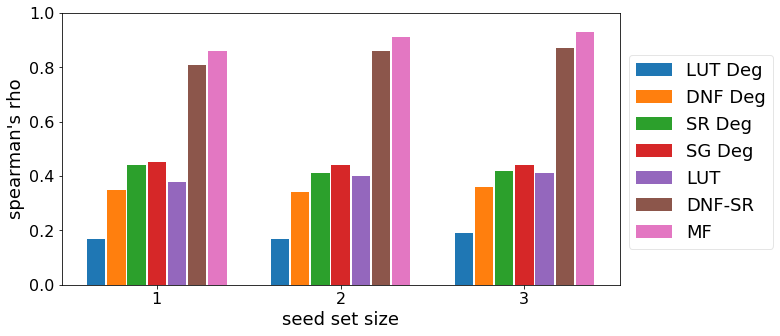

In [702]:
#plot spearman's rho between different methods
#plot average module lengths
corrltn=[0.38,0.40,0.41]
corrdtn=[0.81,0.86,0.87]
corrMF=[0.86,0.91,0.93]
corrSG_deg=[0.45,0.44,0.44]
corrltn_deg=[0.17,0.17,0.19]
corrdtn_deg=[0.35,0.34,0.36]
corrTN_deg=[0.44,0.41,0.42]
xvalues=[1,2,3]
width=0.1
plt.figure(figsize=(10,5))

plt.bar([x-3*width-.03 for x in xvalues],corrltn_deg,label='LUT Deg',width=width)
plt.bar([x-2*width-.02 for x in xvalues],corrdtn_deg,label='DNF Deg',width=width)
plt.bar([x-width-.01 for x in xvalues],corrTN_deg,label='SR Deg',width=width)
plt.bar([x for x in xvalues],corrSG_deg,label='SG Deg',width=width)
plt.bar([x+width+.01 for x in xvalues],corrltn,label='LUT',width=width)
plt.bar([x+2*width+.02 for x in xvalues],corrdtn,label='DNF-SR',width=width)
plt.bar([x+3*width+.03 for x in xvalues],corrMF,label='MF',width=width)
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("spearman's rho",fontsize=18)
plt.ylim([0.0,1.0])
plt.legend(fontsize=18,framealpha=0.5,bbox_to_anchor=(1.0, 0.88))

#### RBNs

In [ ]:
#TODO

#### Cell Collective

In [62]:
#transform a frozenset seed into a tuple
def set_to_tuple(seed,sunit_map):
    rmap=reverse_sunit_map(sunit_map)
    return tuple([rmap[s] for s in seed])
    
#set_to_tuple(seed,sunit_map)

In [63]:
#return sunits from a BooleanNetwork
def get_sunit_names(n):
    sunits,sunit_map=get_sunits(n) #gets sunit numbers
    return reverse_sunit_map(sunit_map).keys()

#get_sunit_names(n)

In [64]:
#retrieve 1000 samples from the given nodes, including no contradictions; num is how large each sample should be
#NOTE: this takes as input a list of sunits; default is selection without replacement
#TODO: add a timeout; if given more samples than possible seeds, it will run forever!
def get_sample(sunits,num=1,samples=1000,replacement=False):
    if replacement: seeds=[] #may select the same seed multiple times
    else: seeds=set([]) #will select each seed at most once
    while len(seeds)<samples:
        seed=[random.choice(sunits) for j in range(num)]
        vals=[sunit_to_var(s) for s in seed]
        #print seed,vals
        if len(set(vals))==len(vals): #no contradictions
            if replacement: seeds.append(seed) #this is a list of lists
            else: seeds.add(frozenset(seed)) #this is a set of sets
    return seeds

#sunits=get_sunit_names(n)
#print n.name,sunits
#sample=get_sample(sunits,num=3,samples=5,replacement=False)
#len(sample),sample

In [65]:
#read in the Cell Collective networks
from cana import BooleanNetwork
#mypath=C:\Users\Sir Thomius\Documents\Dynamics\Build based on Cell Collective 2020.08\models used in PNAS 2021 paper\duplicate removed\
mypath="C:\\Users\\Sir Thomius\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\models used in PNAS 2021 paper\\duplicate removed\\"
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\models used in PNAS 2021 paper\\duplicate removed\\"
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
networks=[]
for f in onlyfiles:
    B=BooleanNetwork.from_file(mypath+"\\"+f)
    #print f,len(B.nodes),max([len(node.inputs) for node in B.nodes])
    B.name=f[:-4] #ensure the network has a name and remove .txt
    networks.append(B)

print len(networks)

74


In [66]:
#Cell Collective; READ in from json and get rid of unicode representations
cell_stats=json.load(open( "cell_collective_statistics.json" ))
cell_stats={str(n): {str(key): cell_stats[n][key] for key in cell_stats[n]} for n in cell_stats}
len(cell_stats)

74

In [365]:
#write files for all networks in the Cell Collective based on logical expressions
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\EXPR_extracted\\"
from os import listdir
from os.path import isfile, join
for n in networks:
    name=n.name
    filename,external_file=mypath+name+'\\expr\\expressions.ALL.txt',mypath+name+'\\expr\\external_components.ALL.txt'
    write_file=mypath+"zzBT\\"+name+".txt"
    #expressions_to_boolean_text_ascii(filename,external_file=external_file,write_file=write_file)

In [287]:
#check networks with exceptions
BooleanNetwork.from_file(mypath+"zzBT\\"+name+'.txt',file_type='logical')

<cana.boolean_network.BooleanNetwork instance at 0x0000000015A186C8>

In [157]:
#find DNF form for networks from the Cell Collective
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\EXPR_extracted\\zzBT"
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
dnf_networks=[]
for f in onlyfiles:
    #print f,mypath+"\\"+f
    try:
        n=BooleanNetwork.from_file(mypath+"\\"+f,file_type='logical')
    except Exception as e: print 'Exception occured:',f,e
    print f,len(n.nodes),max([len(node.inputs) for node in n.nodes])
    n.name=f[:-4] #ensure the network has a name and remove .txt
    dnf_networks.append(n)
len(dnf_networks)

Apoptosis Network.txt 41 4
Arabidopsis thaliana Cell Cycle.txt 14 8
Aurora Kinase A in Neuroblastoma.txt 23 7
B bronchiseptica and T retortaeformis coinfection.txt 53 8
B cell differentiation.txt 22 7
Bordetella bronchiseptica.txt 33 6
Bortezomib Responses in U266 Human Myeloma Cells.txt 67 5
BT474 Breast Cell Line Long-term ErbB Network.txt 25 6
BT474 Breast Cell Line Short-term ErbB Network.txt 16 6
Budding Yeast Cell Cycle 2009.txt 18 6
Budding Yeast Cell Cycle.txt 20 6
Cardiac development.txt 15 7
CD4 T cell signaling.txt 188 10
CD4+ T Cell Differentiation and Plasticity.txt 18 10
CD4+ T cell Differentiation.txt 38 8
Cell Cycle Transcription by Coupled CDK and Network Oscillators.txt 9 4
Cholesterol Regulatory Pathway.txt 34 3
Colitis-associated colon cancer.txt 70 5
Cortical Area Development.txt 5 4
Death Receptor Signaling.txt 28 4
Differentiation of T lymphocytes.txt 50 9
EGFR & ErbB Signaling.txt 104 14
FA BRCA pathway.txt 28 9
Fanconi anemia and checkpoint recovery.txt 15 8
FG

74

In [157]:
#NOTE issue with certain strings
print n.name,len(dnf_networks),f
#BooleanNetwork.from_file(mypath_out+"\\"+f,file_type='logical')
string='cycd3;1'
ascii_var="".join(['a'+str(ord(character)) for character in string])
exec('cycd31'+'='+'0')
print ascii_var,a99a121a99a100a51a59a49

Yeast Apoptosis 74 Yeast Apoptosis.txt
a99a121a99a100a51a59a49 0


In [217]:
#check for consistency in networks
#NOTE: node names may be in a different order as long as the names are the same (this occurs for Lac Operon)
dnfs=alter_networks(dnf_networks)
print len(networks),len(dnf_networks),len(dnfs)
total=0 #count mismatches
for n in networks:
    for d in dnfs:
        if n.name==d.name:
            if len(n.nodes)!=len(d.nodes) or max([len(node.inputs) for node in n.nodes])!=max([len(node.inputs) for node in d.nodes]):
                print n.name
            sunits,sunit_map=get_sunits(n)
            dsunits,dsunit_map=get_sunits(d)
            #print sunit_map,dsunits
            if sunit_map!=dsunit_map or {node.name for node in n.nodes}!={node.name for node in d.nodes}:
                print n.name#,{node.name for node in n.nodes},'\n'
                #print {node.name for node in d.nodes},'\n'#sunit_map,dsunit_map,'\n'
                total+=1
total         

74 74 74
Lac Operon


1

In [23]:
times={n.name:{} for n in networks}
stats={n.name:{'MF':{},'LUT TN':{},'SR TN':{},'ground-truth':{}} for n in networks} #{'sim':{},'prec':{},'rec':{}}
rankings={n.name:{'MF':{},'LUT TN':{},'SR TN':{},'LUT deg':{},'SR deg':{},'SG':{},'ground-truth':{}} for n in networks}
len(stats),len(rankings)

(74, 74)

In [23]:
#times={n.name:{} for n in networks}
times['CD4+ T Cell Differentiation and Plasticity']={'SR TN':168.585999966,'LUT TN':4.72900009155,'MF':{1: 0.13036110666063097},'Sim':{1: 0.11719444062974718}}
times['Human Gonadal Sex Determination']={'SR TN':121.48300004,'LUT TN':3.65100002289,'MF':{1: 0.15247368812561035},'Sim':{1: 0.1292631563387419}}
times['TOL Regulatory Network']={'SR TN':100.923000097,'LUT TN':4.29299998283,'MF':{1: 0.19506249825159708},'Sim':{1: 0.15625}}
times['Pro-inflammatory Tumor Microenvironment in Acute Lymphoblastic Leukemia']={'SR TN':9.74900007248,'LUT TN':1.38999986649,'MF':{1: 0.20232692131629357},'Sim':{1: 0.17640384343954232}}
times['FA BRCA pathway']={'SR TN':12.9210000038,'LUT TN':1.77999997139,'MF':{1: 0.21250000170298985},'Sim':{1: 0.18521428533962794}}
times['Lymphoid and myeloid cell specification and transdifferentiation']={'SR TN':176.532999992,'LUT TN':4.44000005722,'MF':{1: 0.24712121486663818},'Sim':{1: 0.21172727238048206}}
times['Stomatal Opening Model']={'SR TN':1708.12199998,'LUT TN':3.18799996376,'MF':{1: 0.3820306111355217},'Sim':{1: 0.44701020328366026}}
times['Differentiation of T lymphocytes']={'SR TN':22.625,'LUT TN':1.37199997902,'MF':{1: 0.3516199994087219},'Sim':{1: 0.43217000007629397}}
times['Lymphopoiesis Regulatory Network']={'SR TN':25.5429999828,'LUT TN':2.04299998283,'MF':{1: 0.5681419755205696},'Sim':{1: 0.8550987655733838}}
times['CD4 T cell signaling']={'SR TN':100.916000128,'LUT TN':5.54799985886,'MF':{1: 1.3511143612100722},'Sim':{1: 5.156313830233635}}
times['Signaling in Macrophage Activation']={'SR TN':156.965999842,'LUT TN':6.64499998093,'MF':{1: 2.2938052961759476},'Sim':{1: 13.20514485954867}}
len(times)

74

In [205]:
#alternatively, read times from file
with open("cell_collective_times.txt") as fp:
    times=eval(fp.read())
type(times),len(times)
#times['Yeast Apoptosis']

(dict, 75)

In [139]:
#check compatability between different methods
dcm = n.dynamics_canalization_map(output=None, ) #threshold networks
ltn=create_threshold_network_LUTs(n,single_nodes=[])
nu,tm,sizes,c=find_dynamic_modules(dcm,input_type='steady',num=1,samples=None,tm=False,seeds=sample,conversion=True)
print nu.keys(),len(nu.keys())

seeds=[set_to_tuple(seed,sunit_map) for seed in sample if len(seed)==3] #mean-field; TODO: fix error if given null seeds
modules,translator=find_modules(n,1,sunits,sunit_map,{},{},reduced=False,ds=None,samples=None,seeds=seeds,
            pinning={},iterations=10,data=True,pin_start=True,update='synchronous',regenerate=False,models=1,verbose=False)
print modules.keys(),len(modules.keys())

#seeds_sam={frozenset(seed) for seed in sample if len(seed)==1} #brute-force
#print seeds_sam
seeds=enumerate_sunit_map(sunit_map,num=3,samples=None)
for seed in seeds:
    #print seed,{sunit_map[s] for s in seed}
    if {sunit_map[s] for s in seed} in sample: 
        print seed
        configs=find_attractors_bruteforce(n,None,sunits,sunit_map,seed,{},time_limit=12)
        act_prob=aggregate_nodes_in_configs(configs)
        #print act_prob

seeds=[set_to_tuple(seed,sunit_map) for seed in sample if len(seed)==3] #simulations
print seeds,len(seeds)
simulations,act_prob_sim=create_simulations(n,seeds,sunit_map,{},length=3,runs=10,
                iterations=10,unknown_prob=0.5,time_limit=12,act_prob_sim={},simulations={})
act_prob_sim.keys()

[frozenset(['CycE-0', 'p27-1', 'Cdc20-1']), frozenset(['CycB-0', 'Cdh1-1', 'Cdc20-1']), frozenset(['E2F-1', 'Rb-1', 'Cdc20-1']), frozenset(['UbcH10-0', 'CycE-1', 'p27-0']), frozenset(['CycA-0', 'CycB-0', 'CycE-1'])] 5
['(16, 15, 3)', '(1, 19, 3)', '(12, 9, 3)', '(4, 16, 13)', '(6, 13, 8)'] 5
frozenset([16, 3, 15])
frozenset([3, 1, 19])
frozenset([16, 4, 13])
frozenset([8, 13, 6])
frozenset([9, 3, 12])
[(12, 9, 3), (16, 15, 3), (4, 16, 13), (1, 19, 3), (6, 13, 8)] 5


[(6, 13, 8), (12, 9, 3), (4, 16, 13), (16, 15, 3), (1, 19, 3)]

In [68]:
#additionally, solve for drosophila, TODO: why is bias 0?
ND = DROSOPHILA()
size=len(ND.nodes)
max_k=max([len(node.inputs) for node in ND.nodes])
avg_k=np.mean([len(node.inputs) for node in ND.nodes])
avg_bias=np.mean([np.sum([row[2] for row in look_up_table(node).itertuples()])/len(node.look_up_table()) for node in ND.nodes])
cell_stats['Body Segmentation in Drosophila 2013']={'size': size,'max_k': max_k,'avg_k': avg_k,'avg_bias': avg_bias}
ND.name='Body Segmentation in Drosophila 2013'
#times[ND.name]={}
ND.name,cell_stats['Body Segmentation in Drosophila 2013']

('Body Segmentation in Drosophila 2013',
 {'avg_bias': 0.0, 'avg_k': 1.8823529411764706, 'max_k': 4, 'size': 17})

In [271]:
#find averages
print np.mean([cell_stats[x.name]['avg_k'] for x in networks])
np.mean([float(cell_stats[x.name]['avg_k'])/cell_stats[x.name]['size'] for x in networks])
#sorted([float(cell_stats[x.name]['max_k']) for x in networks])
#sorted([float(cell_stats[x.name]['avg_k'])/cell_stats[x.name]['size'] for x in networks])

2.4215372044352863


0.10097158704622632

In [273]:
#find network with the largest average k
for n in sorted(networks,key=lambda x:cell_stats[x.name]['avg_k']): 
    if cell_stats[n.name]['max_k']>10:
        print n.name,cell_stats[n.name]['avg_k'],cell_stats[n.name]['max_k'],cell_stats[n.name]['size']

IGVH mutations in chronic lymphocytic leukemia 1.64835164835 12 91
Yeast Apoptosis 1.7397260274 12 73
Influenza A Virus Replication Cycle 2.3893129771 11 131
HIV-1 interactions with T Cell Signalling Pathway 2.41304347826 15 138
EGFR & ErbB Signaling 2.44230769231 14 104
Signal Transduction in Fibroblasts 3.9928057554 13 139


In [248]:
#get simulations for the null seed
num=0
write=False
begin_time = time.time()
#for index,n in enumerate(sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]):
for n in [ND]:
    #if cell_stats[n.name]['size']>5: continue
    if cell_stats[n.name]['max_k']>14: continue
    #dn={node.name: LUT_reduce(look_up_table(node)) for node in n.nodes}
    #nodes=dn.keys()
    translator={'()':()}
    print n.name,cell_stats[n.name]['avg_k'],cell_stats[n.name]['max_k'],cell_stats[n.name]['size']
    sunits,sunit_map=get_sunits(n)
    #ANALYSIS
    #nodes=[node.name for node in n.nodes]
    #sunit_names=get_sunit_names(n)
    
    #FIND BRUTE-FORCE OR SIMULATION RESULTS
    if cell_stats[n.name]['size']<11: times[n.name].setdefault('BF',{})
    else: times[n.name].setdefault('Sim',{})
    modules_bf,constants_bf={},{}
    simulations,act_prob_sim=None,None
    for i in range(0,num+1):
        if cell_stats[n.name]['size']<11: #use brute-force method
            seed=()
            start_time = time.time() 
            configs=find_attractors_bruteforce(n,None,sunits,sunit_map,seed,{},time_limit=12)
            #print to_list(seed,sunit_map),len(configs) #number of reachable attractors
            act_prob=aggregate_nodes_in_configs(configs)
            modules_bf[()]=act_prob #keep these as tuples for consistency with simulations
            times[n.name]['BF'][i]=(time.time()-start_time)
            for seed in modules_bf: constants_bf[frozenset([])]=return_constants(modules_bf[seed])
            print 'BF)',times[n.name]['BF'][i]
        
        else: #use sampling
            start_time = time.time()
            simulations,act_prob_sim=create_simulations(n,[()],sunit_map,translator,length=i,runs=100,
                iterations=10,unknown_prob=0.5,time_limit=12,act_prob_sim={},simulations={})
            times[n.name]['Sim'][i]=(time.time()-start_time)
            #print act_prob_sim.keys()[:10],len(act_prob_sim)
            for seed in act_prob_sim: modules_bf[seed]=act_prob_sim[seed]
            constants=constants_from_sim(act_prob_sim,sunit_map,translator,t=10)
            for seed in constants: constants_bf[seed]=constants[seed]
            print 'Sim)',times[n.name]['Sim'][i]
            
    #write to file
    print len(constants_bf)
    if write:
        with open('null_modules_bf-sim/'+n.name+'.txt','w') as fp:
            fp.write(str(modules_bf))
        with open('null_constants_bf-sim/'+n.name+'.txt','w') as fp:
            fp.write(str(constants_bf))
    #clean up memory
    del constants_bf
    del modules_bf
    del simulations
    gc.collect() #clean up unreferenced memory
print("--- Total time: %s seconds ---" % (time.time()-begin_time))

Body Segmentation in Drosophila 2013 1.8823529411764706 4 17
Sim) 0.101999998093
1
--- Total time: 0.184000015259 seconds ---


In [249]:
print len([key for key in times if 'Sim' in times[key] and 0 in times[key]['Sim']]),#act_prob_sim
print len([key for key in times if 'BF' in times[key] and 0 in times[key]['BF']])

72 3


In [ ]:
#analyze different methods on cell collective networks for direct influence
#NOTE: modules_sr defines the seeds for all other methods to use; WARNING: this is memory-intensive
num=3
write=False
begin_time = time.time()
for index,n in enumerate(sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]):
    #if n.name!='Cortical Area Development': continue
    #if n.name!='Toll Pathway of Drosophila Signaling Pathway':continue #Toll Pathway of Drosophila Signaling Pathway, 'FA BRCA pathway'
    #if cell_stats[n.name]['max_k']<8.001 or cell_stats[n.name]['max_k']>10: continue
    if cell_stats[n.name]['max_k']!=15: continue
    dn={node.name: LUT_reduce(look_up_table(node)) for node in n.nodes}
    nodes=dn.keys()
    print n.name,cell_stats[n.name]['avg_k'],cell_stats[n.name]['max_k'],len(dn)
    sunits,sunit_map=get_sunits(n)
    #ANALYSIS
    #nodes=[node.name for node in n.nodes]
    sunit_names=get_sunit_names(n)
    
    #FIND GTN MODULES
    modules_sr,modules_ltn={},{}
    times[n.name].setdefault('SR',{})
    times[n.name].setdefault('LUT',{})
    #DCM
    start_time = time.time()
    dcm = n.dynamics_canalization_map(output=None, )
    tn = create_threshold_network(dcm)
    times[n.name]['SR TN']=time.time()-start_time
    for i in range(1,num+1):
        #set sampling sizes to be used across methods, max size is 1000; NOTE: there are 2n sunits
        if i==1 or cell_stats[n.name]['size']<11: seeds=None #find all possible seeds
        elif i==2 and cell_stats[n.name]['size']<24: seeds=None #find all possible seeds
        else: seeds=get_sample(sunit_names,num=i,samples=1000) #get 1000 unique samples
        start_time = time.time()
        nu,tm,sizes,c=find_dynamic_modules(tn,input_type='steady',num=i,samples=None,tm=False,seeds=seeds,conversion=False)
        times[n.name]['SR'][i]=(time.time()-start_time)/len(nu)
        for seed in nu: modules_sr[seed]=extract_sunits(nu[seed])
        
    #LUT
    start_time = time.time()
    ltn=create_threshold_network_LUTs(n,single_nodes=[]) #single_nodes=['en','wg']
    times[n.name]['LUT TN']=time.time()-start_time
    for i in range(1,num+1):
        seeds={seed for seed in modules_sr if len(seed)==i}
        start_time = time.time()
        nu,tm,sizes,c=find_dynamic_modules(ltn,input_type='steady',num=i,samples=None,tm=False,seeds=seeds,conversion=False)
        times[n.name]['LUT'][i]=(time.time()-start_time)/len(nu)
        for seed in nu: modules_ltn[seed]=extract_sunits(nu[seed])
        print 'num seeds:',len(nu)
            
    #FIND MEAN-FIELD ESTIMATES
    times[n.name].setdefault('MF',{})
    modules,translator={},{}
    num_seeds=0
    constants_mf={}
    for i in range(1,num+1):
        seeds=[set_to_tuple(seed,sunit_map) for seed in modules_sr if len(seed)==i]
        num_seeds=len(seeds)
        #print seeds
        start_time = time.time()
        modules,translator=find_modules(n,i,sunits,sunit_map,modules,translator,reduced=True,ds=dn,samples=None,seeds=seeds,
            pinning={},iterations=10,data=True,pin_start=True,update='synchronous',regenerate=False,models=1,verbose=False)
        times[n.name]['MF'][i]=(time.time()-start_time)/num_seeds
        print 'MF)',times[n.name]['MF'][i],'num seeds:',num_seeds
    for seed in modules: constants_mf[frozenset(to_list(seed,sunit_map,translator))]={s for t in modules[seed] for s in return_constants(modules[seed][t])}
    
    #FIND BRUTE-FORCE OR SIMULATION RESULTS
    if cell_stats[n.name]['size']<11: times[n.name].setdefault('BF',{})
    else: times[n.name].setdefault('Sim',{})
    modules_bf,constants_bf={},{}
    simulations,act_prob_sim=None,None
    for i in range(1,num+1):
        if cell_stats[n.name]['size']<11: #use brute-force method
            seeds={seed for seed in modules_sr if len(seed)==i}
            num_seeds=len(seeds)
            all_seeds=enumerate_sunit_map(sunit_map,num=i,samples=None) #numbered names required
            start_time = time.time()
            for seed in all_seeds:
                if {sunit_map[s] for s in seed} in seeds: 
                    configs=find_attractors_bruteforce(n,None,sunits,sunit_map,seed,{},time_limit=12)
                    #print to_list(seed,sunit_map),len(configs) #number of reachable attractors
                    act_prob=aggregate_nodes_in_configs(configs)
                    modules_bf[tuple(sorted(seed))]=act_prob #keep these as tuples for consistency with simulations
            times[n.name]['BF'][i]=(time.time()-start_time)/num_seeds
            for seed in modules_bf: constants_bf[frozenset(to_list(seed,sunit_map))]=return_constants(modules_bf[seed])
            print 'BF)',times[n.name]['BF'][i],num_seeds
        
        else: #use sampling
            seeds=[set_to_tuple(seed,sunit_map) for seed in modules_sr if len(seed)==i]
            #print seeds,len(seeds)
            num_seeds=len(seeds)
            start_time = time.time()
            simulations,act_prob_sim=create_simulations(n,seeds,sunit_map,translator,length=i,runs=100,
                iterations=10,unknown_prob=0.5,time_limit=12,act_prob_sim={},simulations={})
            times[n.name]['Sim'][i]=(time.time()-start_time)/num_seeds
            #print act_prob_sim.keys()[:10],len(act_prob_sim)
            for seed in act_prob_sim: modules_bf[seed]=act_prob_sim[seed]
            constants=constants_from_sim(act_prob_sim,sunit_map,translator,t=10)
            for seed in constants: constants_bf[seed]=constants[seed]
            print 'Sim)',times[n.name]['Sim'][i],num_seeds
            
    #write to file
    print len(modules_sr),len(modules_ltn),len(constants_mf),len(constants_bf)#,len(constants_sim)
    if write:
        with open('modules_sr/'+n.name+'.txt','w') as fp:
            fp.write(str(modules_sr))
        with open('modules_ltn/'+n.name+'.txt','w') as fp:
            fp.write(str(modules_ltn))
        with open('modules_mf/'+n.name+'.txt','w') as fp:
            fp.write(str(modules))
        with open('modules_bf-sim/'+n.name+'.txt','w') as fp:
            fp.write(str(modules_bf))
        with open('constants_mf/'+n.name+'.txt','w') as fp:
            fp.write(str(constants_mf))
        with open('constants_bf-sim/'+n.name+'.txt','w') as fp:
            fp.write(str(constants_bf))
    #clean up memory
    del dn
    del modules
    del translator
    del modules_sr
    del modules_ltn
    del constants_mf
    del constants_bf
    del modules_bf
    del simulations
    gc.collect() #clean up unreferenced memory
print("--- Total time: %s seconds ---" % (time.time()-begin_time))

HIV-1 interactions with T Cell Signalling Pathway 2.41304347826 15 138


In [141]:
#save the structural graph
write=False
#max_edges={}
for index,n in enumerate(sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]):
#for n in [ND]:
    #if cell_stats[n.name]['max_k']>5: continue
    name=n.name.replace(" ","_").replace(":","")
    if write:
        with open("SGs/"+name+'.txt','w') as fp: #pickling causes an error?
                fp.write(str(n))
                #fp.write('Edges='+str(sum([len(n.inputs) for n in n.nodes])))
    #print sum([len(node.inputs) for node in n.nodes]), #count edges by summing in-degrees
    #print sum([2**len(node.inputs)*(len(node.inputs)+1) for node in n.nodes]) #theoretical maximum for number of edges
    cell_stats[n.name]['edges']=sum([len(node.inputs) for node in n.nodes])
    max_edges[n.name]=sum([2**len(node.inputs)*(len(node.inputs)+1) for node in n.nodes])
    
    gc.collect() #clean up unreferenced memory
print len([n for n in cell_stats if cell_stats[n]['edges']])

75


In [143]:
#with open('cell_collective_statistics.txt','w') as fp:
#    fp.write(str(cell_stats))
#with open('cell_collective_max_edges.txt','w') as fp:
#    fp.write(str(max_edges))

In [95]:
#analyze different methods on cell collective networks for direct influence
#NOTE: recreating modules_sr with check to explicitly avoid contradictions
import pickle
num=3
write=False
begin_time = time.time()
for index,n in enumerate(sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]):
#for n in [ND]:
    #if cell_stats[n.name]['max_k']>9: continue
    if cell_stats[n.name]['max_k']!=14: continue
    print n.name,cell_stats[n.name]['avg_k'],cell_stats[n.name]['max_k'],len(n.nodes)
    
    #FIND GTN MODULES
    modules_new={}
    #times[n.name].setdefault('SR',{})
    name=n.name.replace(" ","_").replace(":","")
    tn=pickle.load(open("SR GTN/"+name)) #using the same threshold network
    with open('modules_sr/'+n.name+'.txt') as fp: #get same seeds as original modules_sr
            modules_sr=eval(fp.read())
    for i in range(1,num+1):
        seeds={seed for seed in modules_sr if len(seed)==i}
        start_time = time.time()
        nu,tm,sizes,c=find_dynamic_modules(tn,input_type='steady',num=i,samples=None,tm=False,seeds=seeds,conversion=False)
        times[n.name]['SR'][i]=(time.time()-start_time)/len(nu)
        for seed in nu: modules_new[seed]=extract_sunits(nu[seed])
            
    if write:
        with open('modules_sr_new/'+n.name+'.txt','w') as fp:
            fp.write(str(modules_new))
    
    gc.collect() #clean up unreferenced memory
print("--- Total time: %s seconds ---" % (time.time()-begin_time))

EGFR & ErbB Signaling 2.44230769231 14 104
--- Total time: 1.42899990082 seconds ---


In [99]:
times['EGFR & ErbB Signaling']['SR']
#with open('cell_collective_times_new.txt','w') as fp:
#    fp.write(str(times))
len(times)

75

In [162]:
#convert seeds to DNF ASCII versions to calculate DNF modules
illegals={'/',';','-','+','*','.'}

def convert_seeds_ascii(seeds,name=None):
    new_seeds=set([])
    for seed in seeds:
        new_seed={s for s in seed}
        for illegal in illegals:
            new_seed={s[:-2].replace(illegal,'a'+str(ord(illegal))+'a')+s[-2:] for s in new_seed}
            
        #special cases
        if name=="PC12 Cell Differentiation":
            new_seed={s.replace('G(ia47ao)','Ga40aia47aoa41a') for s in new_seed} #replace only these parentheses
        if name=="Signaling Pathway for Butanol Production in Clostridium beijerinckii NRRL B-598":
            new_seed={s.replace('NAD(P)H','NADa40aPa41aH') for s in new_seed}
            new_seed={s.replace('3a45ahydroxybutyryla45aCoA','a51aa45ahydroxybutyryla45aCoA') for s in new_seed}
        if name=="TOL Regulatory Network": #replace leading number
            new_seed={s.replace('3MBz','a51aMBz') for s in new_seed}
        if name=="Signal Transduction in Fibroblasts":
            new_seed={s.replace('Palpha_iR','PalphaiR') for s in new_seed} #causes issue with DNF variable replacement
            new_seed={s.replace('Palpha_1213R','Palpha1213R') for s in new_seed}
            new_seed={s.replace('Palpha_sR','PalphasR') for s in new_seed}
        if name=="SKBR3 Breast Cell Line Long-term ErbB Network":
            new_seed={s.replace('ERBB2','ER_BB2') for s in new_seed} #causes issue with DNF variable replacement
        if name=="Signaling Pathway for Butanol Production in Clostridium beijerinckii NRRL B-598":
            new_seed={s.replace("acetaldehyde","acetal_dehyde") for s in new_seed} #causes issue with DNF variable replacement
        if name=="IL-6 Signalling":
            new_seed={s.replace("camk24","camk_24") for s in new_seed} #causes issue with DNF variable replacement
            new_seed={s.replace("dum_gab1_kin_or_jak1_gab1_mem_p","dum_gab1_kin_jak1_gab1memp") for s in new_seed}
            new_seed={s.replace("dum_il6rc_p_or_grb2_vav","dum_il6rc_p_grb2_vav") for s in new_seed}
            new_seed={s.replace("dum_mtorc1_or_pkcd_stat3_ta","dum_mtorc1_pkcd_stat3_ta") for s in new_seed}
        if name=="Signaling in Macrophage Activation":
            new_seed={s.replace("BAG4_TNFRSF1A","BAG4_TN_FRSF1A") for s in new_seed}
            new_seed={s.replace("TNF_BAG4_TN_FRSF1A","TN_BAG4_TN_RSF1A") for s in new_seed}
        if name=="T Cell Receptor Signaling": #causes issue with DNF variable replacement
            new_seed={s.replace("vav1","vaa118a1") for s in new_seed}
        #print seed,new_seed
        new_seeds.add(frozenset(new_seed))
    return new_seeds
                      
#convert_seeds_ascii(seeds,name="IL-6 Signalling")

In [163]:
#convert from DNF ascii names to standard names used in expression files
illegals={'/',';','-','+','*','.'}

def convert_seeds_standard(modules,name=""):
    new_modules={}
    for key in modules:
        new_key={s for s in key}
        new_value={s for s in modules[key]}
        #print new_key,new_value
            
        #special cases first
        if name=="PC12 Cell Differentiation":
            new_key={s.replace('Ga40aia47aoa41a','G(ia47ao)') for s in new_key} #replace only these parentheses
            new_value={s.replace('Ga40aia47aoa41a','G(ia47ao)') for s in new_value}
        if name=="Signaling Pathway for Butanol Production in Clostridium beijerinckii NRRL B-598":
            new_key={s.replace('NADa40aPa41aH','NAD(P)H') for s in new_key}
            new_value={s.replace('NADa40aPa41aH','NAD(P)H') for s in new_value}
            new_key={s.replace('a51aa45ahydroxybutyryla45aCoA','3a45ahydroxybutyryla45aCoA') for s in new_key}
            new_value={s.replace('a51aa45ahydroxybutyryla45aCoA','3a45ahydroxybutyryla45aCoA') for s in new_value}
            new_key={s.replace("acetal_dehyde","acetaldehyde") for s in new_key} #causes issue with DNF variable replacement
            new_value={s.replace("acetal_dehyde","acetaldehyde") for s in new_value}
        if name=="TOL Regulatory Network": #replace leading number
            new_key={s.replace('a51aMBz','3MBz') for s in new_key}
            new_value={s.replace('a51aMBz','3MBz') for s in new_value}
        if name=="Signal Transduction in Fibroblasts":
            new_key={s.replace('PalphaiR','Palpha_iR') for s in new_key} #causes issue with DNF variable replacement
            new_value={s.replace('PalphaiR','Palpha_iR') for s in new_value}
            new_key={s.replace('Palpha1213R','Palpha_1213R') for s in new_key}
            new_value={s.replace('Palpha1213R','Palpha_1213R') for s in new_value}
            new_key={s.replace('PalphasR','Palpha_sR') for s in new_key}
            new_value={s.replace('PalphasR','Palpha_sR') for s in new_value}
        if name=="SKBR3 Breast Cell Line Long-term ErbB Network":
            new_key={s.replace('ER_BB2','ERBB2') for s in new_key} #causes issue with DNF variable replacement
            new_value={s.replace('ER_BB2','ERBB2') for s in new_value}
        if name=="IL-6 Signalling":
            new_key={s.replace("camk_24","camk24") for s in new_key} #causes issue with DNF variable replacement
            new_value={s.replace("camk_24","camk24") for s in new_value}
            new_key={s.replace("dum_gab1_kin_jak1_gab1memp","dum_gab1_kin_or_jak1_gab1_mem_p") for s in new_key}
            new_value={s.replace("dum_gab1_kin_jak1_gab1memp","dum_gab1_kin_or_jak1_gab1_mem_p") for s in new_value}
            new_key={s.replace("dum_il6rc_p_grb2_vav","dum_il6rc_p_or_grb2_vav") for s in new_key}
            new_value={s.replace("dum_il6rc_p_grb2_vav","dum_il6rc_p_or_grb2_vav") for s in new_value}
            new_key={s.replace("dum_mtorc1_pkcd_stat3_ta","dum_mtorc1_or_pkcd_stat3_ta") for s in new_key}
            new_value={s.replace("dum_mtorc1_pkcd_stat3_ta","dum_mtorc1_or_pkcd_stat3_ta") for s in new_value}
        if name=="Signaling in Macrophage Activation":
            new_key={s.replace("TN_BAG4_TN_RSF1A","TNF_BAG4_TN_FRSF1A") for s in new_key}
            new_value={s.replace("TN_BAG4_TN_RSF1A","TNF_BAG4_TN_FRSF1A") for s in new_value}
            new_key={s.replace("BAG4_TN_FRSF1A","BAG4_TNFRSF1A") for s in new_key}
            new_value={s.replace("BAG4_TN_FRSF1A","BAG4_TNFRSF1A") for s in new_value}            
        if name=="T Cell Receptor Signaling": #causes issue with DNF variable replacement 'TNF_BAG4_TNFRSF1A-1'
            new_key={s.replace("vaa118a1","vav1") for s in new_key}
            new_value={s.replace("vaa118a1","vav1") for s in new_value}
            
        for illegal in illegals:
            new_key={s[:-2].replace('a'+str(ord(illegal))+'a',illegal)+s[-2:] for s in new_key}
            new_value={s[:-2].replace('a'+str(ord(illegal))+'a',illegal)+s[-2:] for s in new_value}

        #if key!=new_key: print key,new_key,'\n'
        #if new_value!=modules[key]: print modules[key],new_value,'\n'
        new_modules[frozenset(new_key)]=new_value
    return new_modules

#print n.name,len(modules_sr.keys()),len(modules_dtn.keys())
#new_modules=convert_seeds_standard(modules_dtn,name=n.name)
#for key in new_modules: #check name validity
#    if key not in modules_sr:print key
#    for value in new_modules[key]:
#        if frozenset({value}) not in modules_sr:print frozenset({value})

In [182]:
#analyze DNF method on cell collective networks for direct influence
#NOTE: for Arabidopsis and Yeast Apoptosis, reduce to prime implicants first; TODO: figure out why these take so long
#NOTE: modules_sr defines the seeds for all other methods to use; WARNING: this is memory-intensive
import pickle
mypath="C:\\Users\\tjparmer\\Documents\\Dynamics\\Build based on Cell Collective 2020.08\\EXPR_extracted\\zzBT\\" #clean version
num=3
write=True
begin_time = time.time()
for index,n in enumerate(sorted(dnf_networks,key=lambda x: cell_stats[x.name]['size'])[:]):
#for n in [ND]:
    if cell_stats[n.name]['max_k']!=14 or index<0: continue
    #if n.name!="Yeast Apoptosis": continue
    #if index!=6: continue #65-67,69,71
    dn={node.name: LUT_reduce(look_up_table(node)) for node in n.nodes}
    nodes=dn.keys()
    print index,n.name,cell_stats[n.name]['avg_k'],cell_stats[n.name]['max_k'],len(dn)
    sunits,sunit_map=get_sunits(n)
    #ANALYSIS
    #nodes=[node.name for node in n.nodes]
    sunit_names=get_sunit_names(n)
    
    #DNF
    name=n.name.replace(" ","_").replace(":","")
    if True: #create threshold network
        start_time = time.time()
        #dtn=create_threshold_network_dnf(n,"drosophila_single_cell.txt") #drosophila
        dtn=create_threshold_network_dnf(n,mypath+n.name+".txt",pi=True) #pi=False, True
        times[n.name]['DNF PI TN']=time.time()-start_time #['DNF TN'], ['DNF PI TN']
        print time.time()-start_time#,name,len(dtn.nodes())
        if write:
            with open("DNF PI GTN/"+name,'w') as fp: #"DNF GTN/", "DNF PI GTN"
                pickle.dump(dtn,fp)
    #alternatively, read in network
    #dtn=pickle.load(open("DNF GTN/"+name)) #"DNF GTN/", "DNF PI GTN"
    types = nx.get_node_attributes(dtn, "type")
    for node in dtn.nodes(): 
        if not 'type' in dtn.node[node]:
            print node,dtn.node[node]
    print len(types),len(dtn.nodes())
    #find modules
    with open('modules_sr/'+n.name+'.txt') as fp: #get seeds from modules_sr
            modules_sr=eval(fp.read())
    #print len(dtn.nodes()),name,len(modules_sr)
    modules_dtn={}
    times[n.name]['DNF PI']={} #'DNF', 'DNF PI'
    for i in range(1,num+1):
        seeds={seed for seed in modules_sr if len(seed)==i}
        seeds=convert_seeds_ascii(seeds,name=n.name) #convert to alternate node names
        start_time = time.time()
        nu,tm,sizes,c=find_dynamic_modules(dtn,input_type='steady',num=i,samples=None,tm=False,seeds=seeds,conversion=False)
        times[n.name]['DNF PI'][i]=(time.time()-start_time)/len(nu) #'DNF', 'DNF PI'
        for seed in nu: modules_dtn[seed]=extract_sunits(nu[seed])
        print 'num seeds:',len(nu)
    if write:
        with open('modules_dtn_pi_raw/'+n.name+'.txt','w') as fp: #'modules_dtn_raw/', 'modules_dtn_pi_raw/'
            fp.write(str(modules_dtn))            
    gc.collect() #clean up unreferenced memory
print("--- Total time: %s seconds ---" % (time.time()-begin_time))

67 EGFR & ErbB Signaling 2.44230769231 14 104
438025.523
566 566
num seeds: 208
num seeds: 1000
num seeds: 1000
--- Total time: 438028.499 seconds ---


In [196]:
#times['Cortical Area Development']
#n.name,[node.name for node in n.nodes]
#len([n for n in times if 'DNF PI' in times[n]])
#with open('cell_collective_times_PIs.txt') as fp:
#    new_times=eval(fp.read())
new_times['EGFR & ErbB Signaling']

{'DNF': {1: 0.010942307802347036,
  2: 0.014914999961853028,
  3: 0.01989199995994568},
 'DNF PI': {1: 0.0004423077289874737,
  2: 0.0005809998512268066,
  3: 0.0007159998416900635},
 'DNF PI TN': 438025.5230000019,
 'DNF TN': 1370.5569999217987,
 'LUT': {1: 0.01997115405706259,
  2: 0.028056999921798706,
  3: 0.03894400000572205},
 'LUT TN': 602.1270000934601,
 'MF': {1: 1.3882788454110806, 2: 1.3701019999980926, 3: 1.356077999830246},
 'SR': {1: 0.00014903797553135798,
  2: 0.00015400004386901856,
  3: 0.00018500018119812012},
 'SR TN': 513979.59700012207,
 'Sim': {1: 1.4500288458970876, 2: 1.8209119999408723, 3: 3.0523090000152586}}

In [200]:
#convert raw ASCII names in modules to standard names
write=False
begin_time = time.time()
for index,n in enumerate(sorted(dnf_networks,key=lambda x: cell_stats[x.name]['size'])[:]):
#for n in [ND]:
    if cell_stats[n.name]['max_k']>14 or index<0: continue
    #if n.name!="Regulation of the L-arabinose operon of Escherichia coli": continue
    with open('modules_dtn_pi_raw/'+n.name+'.txt') as fp:
            modules_dtn=eval(fp.read())
    with open('modules_sr/'+n.name+'.txt') as fp: #get seeds from modules_sr
            modules_sr=eval(fp.read())
    new_modules=convert_seeds_standard(modules_dtn,name=n.name)
    print n.name,len(modules_dtn),len(modules_sr),len(new_modules) #check for consistency
    for key in new_modules: #check name validity
        if key not in modules_sr: print key
        for value in new_modules[key]:
            if frozenset({value}) not in modules_sr: print frozenset({value})
    if write:
        with open('modules_dtn_pi/'+n.name+'.txt','w') as fp:
            fp.write(str(new_modules))            
    gc.collect() #clean up unreferenced memory
print("--- Total time: %s seconds ---" % (time.time()-begin_time))

Cortical Area Development 130 130 130
Cell Cycle Transcription by Coupled CDK and Network Oscillators 834 834 834
Mammalian Cell Cycle 2006 1160 1160 1160
Toll Pathway of Drosophila Signaling Pathway 1242 1242 1242
Metabolic Interactions in the Gut Microbiome 1288 1288 1288
Lac Operon 1338 1338 1338
Regulation of the L-arabinose operon of Escherichia coli 1338 1338 1338
Arabidopsis thaliana Cell Cycle 1392 1392 1392
Cardiac development 1450 1450 1450
Fanconi anemia and checkpoint recovery 1450 1450 1450
Predicting Variabilities in Cardiac Gene 1450 1450 1450
BT474 Breast Cell Line Short-term ErbB Network 1512 1512 1512
HCC1954 Breast Cell Line Short-term ErbB Network 1512 1512 1512
Neurotransmitter Signaling Pathway 1512 1512 1512
SKBR3 Breast Cell Line Short-term ErbB Network 1512 1512 1512
Budding Yeast Cell Cycle 2009 1648 1648 1648
CD4+ T Cell Differentiation and Plasticity 1648 1648 1648
T-LGL Survival Network 2011 Reduced Network 1648 1648 1648
VEGF Pathway of Drosophila Signalin

In [704]:
len({k:times[k] for k in times if 'DNF' in times[k] and times[k]['DNF']})
#times["EGFR & ErbB Signaling"] #"Body Segmentation in Drosophila 2013"

74

In [786]:
for key in modules_sr:
    if 'acetone-0' in key and 'butanal-1' in key: print key
new_modules[frozenset(['NAD(P)H-1', 'acetone-0', 'butanal-1'])]

frozenset(['NAD(P)H-1', 'acetone-0', 'butanal-1'])


{'NAD(P)H-1', 'acetone-0', 'butanal-1'}

In [672]:
#for n in dtn.nodes(): print n
{len(dtn.predecessors(node)) for node in dtn.nodes()},n.name

({1, 2, 3, 4, 5, 6, 8}, 'Signaling in Macrophage Activation')

In [558]:
#check if predecessors have over 10 inputs
#dtn.predecessors("T-2_ROSa45aCYT-0") #ROSa45aCYT has max inputs 10
{len(dtn.predecessors("T-"+str(num)+"_Rac-1")) for num in range(30)}
#for num in range(30): print dtn.predecessors("T-"+str(num)+"_Rac-1"),len(dtn.predecessors("T-"+str(num)+"_Rac-1"))
for node in n.nodes: 
    if node.name=='Rac': break
node.inputs
with open("dcms/DCM_Signal_Transduction_in_Fibroblasts") as f:
    dcm=pickle.load(f)
dcm.predecessors("T-12_Rac-1")

['RhoGDI-0',
 'Rac-0',
 'Pix_Cool-1',
 'ECM-1',
 'Integrins-1',
 'F-0_T-12_Rac-0',
 'Cdc42-1']

In [670]:
with open("DNF GTN/"+name,'r') as fp:
    dtp=pickle.load(fp)
len(dtp.edges()),len(dtn.edges())

(627, 627)

In [122]:
#add drosophila to networks
#networks.append(ND)
len(networks),ND.name,len([n  for n in networks if cell_stats[n.name]['max_k']<15])

(75, 'Body Segmentation in Drosophila 2013', 74)

In [373]:
for key in sorted(modules_dtn,key=lambda x:len(modules_dtn[x]),reverse=True)[:10]: print key,len(modules_dtn[key])

frozenset(['nhhnHH-1', 'nWG-1', 'SLP-1']) 17
frozenset(['PH-1', 'SLP-1', 'nhhnHH-1']) 16
frozenset(['nhhnHH-1', 'SLP-1']) 16
frozenset(['nWG-0', 'SLP-1', 'PTC-0']) 16
frozenset(['nWG-1', 'SLP-0', 'PTC-0']) 16
frozenset(['nhhnHH-0', 'SLP-1', 'PTC-0']) 16
frozenset(['nhhnHH-1', 'SLP-1', 'ptc-0']) 16
frozenset(['nhhnHH-1', 'HH-0', 'SLP-1']) 16
frozenset(['nWG-0', 'wg-1', 'nhhnHH-1']) 16
frozenset(['nhhnHH-1', 'SLP-1', 'en-0']) 16


In [900]:
#why does the Arabidopsis DCM predict contradictory results?
name="Arabidopsis thaliana Cell Cycle"
with open("SR GTN/"+name.replace(" ","_"),'r') as fp:
    stn=pickle.load(fp)
len(stn.nodes()),len(stn.edges())
BFS_threshold(stn,['MYB77-1'])
for n in networks:
    if n.name==name: break
DCMB=n.dynamics_canalization_map(output=None, )
print BFS_threshold(DCMB,['MYB77-1'],'steady',time_limit=12,pinned={})
for node in n.nodes: 
    if node.name=='RBR': print node.inputs,node.schemata_look_up_table(type='pi')
    if node.name=='RBR': print node.inputs,node.schemata_look_up_table(type='ts'),node._two_symbols
{node for node in DCMB if 'F-0_T-0_RBR-1' in DCMB.neighbors(node)}
{node for node in stn if 'F-T4' in stn.neighbors(node)}
#DCMB.node['F-0_T-0_RBR-0']
#stn.node['F-T4']

{0: set(['F-T6', 'F-T5', 'F-T10', 'F-T0', 'F-T12', 'T-4_CDKB1;1-1', 'MYB77-1']), 1: set(['CDKB1;1-1', 'MYB3R1/4-1', 'E2Fe-1']), 2: set(['APC/C-0', 'T-2_CYCA2;3-1', 'T-5_CYCB1;1-1', 'T-6_SCF-1']), 3: set(['T-0_KRP1-0', 'CYCA2;3-1', 'SCF-1', 'T-0_E2Fa-0', 'CYCB1;1-1']), 4: set(['F-T9', 'E2Fa-0', 'F-T7', 'T-2_MYB3R1/4-1', 'CYCD3;1-0', 'F-T3', 'KRP1-0', 'T-3_E2Fc-1', 'T-4_RBR-1']), 5: set(['E2Fc-1', 'RBR-1', 'T-0_MYB77-0', 'F-T4', 'E2Fb-0', 'T-0_RBR-0', 'T-1_E2Fa-0']), 6: set(['RBR-0'])}
['KRP1', 'RBR', 'CYCD3;1', 'E2Fa', 'MYB3R1/4']      In:  Out:
0  #1##0     0
1  0#1##     0
2  ###00     0
3  #001#     1
4  1###1     1
5  ##0#1     1
6  10#1#     1
['KRP1', 'RBR', 'CYCD3;1', 'E2Fa', 'MYB3R1/4']                  In:  Out:
0  #1̊#̊#0 | #̊1##0̊     0
1              ###00     0
2              #001#     1
3              1###1     1
4              ##0#1     1
5              10#1#     1 ([('21220', [[1, 2], [0, 4]], [[1, 2, 3]]), ('22200', [], [[3, 4], [0, 1, 2]])], [('20012', [], [[1, 2], [0,

{'CYCD3;1-1', 'RBR-1'}

In [ ]:
#calculate and save dcm for large networks to file (use pickle because json doesn't work)
import pickle
for index,n in enumerate(sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]):
    if cell_stats[n.name]['max_k']!=15: continue
    #if n.name!="Body Segmentation in Drosophila 2013": continue
    print n.name,
    start_time = time.time()
    dcm = n.dynamics_canalization_map(output=None, )
    tn = create_threshold_network(dcm)
    print time.time()-start_time,
    #times[n.name]['SR TN']=time.time()-start_time
    fname=dcm.name.replace(" ","_").replace(":","")
    with open("dcms/"+fname,'w') as fp:
        pickle.dump(dcm,fp)
    name=fname.replace("DCM_","")
    #print fname,name
    with open("SR GTN/"+name,'w') as fp:
        pickle.dump(tn,fp)
    start_time = time.time()
    ltn=create_threshold_network_LUTs(n,single_nodes=[]) #single_nodes=['en','wg']
    print time.time()-start_time
    #times[n.name]['LUT TN']=time.time()-start_time
    with open("LUT GTN/"+name,'w') as fp:
        pickle.dump(ltn,fp)
#dcm2=pickle.load(open(fname))
#len(dcm.edges()),len(dcm2.edges()),type(dcm),type(dcm2)

HIV-1 interactions with T Cell Signalling Pathway

In [108]:
#save graph information to file
degrees={n.name:{} for n in networks}
for n in networks:
    degrees[n.name]['inputs']={node.name:len(node.inputs) for node in n.nodes} #original graph
    degrees[n.name]['outputs']={node.name:len(neighbors_BN(n,node)) for node in n.nodes} #original graph
len(degrees[n.name]['inputs']),len(degrees[n.name]['outputs']),len(n.nodes),len(degrees)
#with open("cell_collective_degrees.txt",'w') as fp:
#    fp.write(str(degrees))

(17, 17, 17, 75)

In [134]:
#N=20: Budding Yeast Cell Cycle, Mammalian Cell Cycle
#N=50: Differentiation of T lymphocytes
for n in networks:
    if n.name=='Budding Yeast Cell Cycle': n20=n
    if n.name=='Differentiation of T lymphocytes': n50=n

In [166]:
#compare simulations to brute-force
num=3
write=False
iterations=10
small_networks=[n for n in networks if cell_stats[n.name]['size']==5]
#small_networks=[ND] #n20
percentages=[.01]#,.1,.25,.5,.75] #percentage of state space to explore with simulations
begin_time = time.time()
for index,n in enumerate(sorted(small_networks,key=lambda x: cell_stats[x.name]['size'])[:]):
    dn={node.name: LUT_reduce(look_up_table(node)) for node in n.nodes}
    nodes=dn.keys()
    print n.name,cell_stats[n.name]['avg_k'],cell_stats[n.name]['max_k'],len(dn)
    sunits,sunit_map=get_sunits(n)
    sunit_names=get_sunit_names(n)
    with open("modules_sr/"+n.name+".txt") as fp:
        modules_sr=eval(fp.read())
    translator={}
        
    #SIMULATIONS
    simulations,act_prob_sim=None,None
    times[n.name]['BF']={}
    modules_bf,constants_bf={},{}
    for p,percentage in enumerate(percentages):
        modules_sim,constants_sim={},{}
        times[n.name]['Sim'+str(percentage)]={}
        for i in range(1,num+1):
            
            if p==0: #calculate brute-force answer once
                #continue #important for large networks!
                seeds={seed for seed in modules_sr if len(seed)==i}
                num_seeds=len(seeds)
                all_seeds=enumerate_sunit_map(sunit_map,num=i,samples=None) #numbered names required
                start_time = time.time()
                for seed in all_seeds:
                    if {sunit_map[s] for s in seed} in seeds: 
                        configs=find_attractors_bruteforce(n,None,sunits,sunit_map,seed,{},time_limit=iterations,return_last=True)
                        #print to_list(seed,sunit_map),len(configs) #number of reachable attractors
                        act_prob=aggregate_nodes_in_configs(configs)
                        modules_bf[tuple(sorted(seed))]=act_prob #keep these as tuples for consistency with simulations
                times[n.name]['BF'][i]=(time.time()-start_time)/num_seeds
                for seed in modules_bf: constants_bf[frozenset(to_list(seed,sunit_map))]=return_constants(modules_bf[seed])
                print 'BF)',times[n.name]['BF'][i],num_seeds
            continue
            seeds=[set_to_tuple(seed,sunit_map) for seed in modules_sr if len(seed)==i]
            #seeds=[random.choice(seeds) for x in range(40)] #use to subsample for greater s values
            #print seeds,len(seeds)
            runs=int(percentage*(2**(cell_stats[n.name]['size']-i)))
            print len(seeds),percentage,runs
            num_seeds=len(seeds)
            start_time = time.time()
            simulations,act_prob_sim=create_simulations(n,seeds,sunit_map,translator,length=i,runs=1000,
                iterations=iterations,unknown_prob=0.5,time_limit=iterations+2,act_prob_sim={},simulations={})
            times[n.name]['Sim'+str(percentage)][i]=(time.time()-start_time)/num_seeds
            #print act_prob_sim.keys()[:10],len(act_prob_sim)
            lengths={len(simulations[sim]) for sim in simulations}
            print "Simulations:",lengths #TODO: make number of simulations exact, i.e. sampling without replacement
            for seed in act_prob_sim: modules_sim[seed]=act_prob_sim[seed]
            constants=constants_from_sim(act_prob_sim,sunit_map,translator,t=iterations)
            for seed in constants: constants_sim[seed]=constants[seed]
            print 'Sim)',times[n.name]['Sim'+str(percentage)][i],num_seeds
            print len(constants_sim)
            del simulations
            del act_prob_sim
            gc.collect() #clean up unreferenced memory
            
        #write to file
        if write:
            #with open('modules_sim_percentages/'+str(percentage)+'/'+n.name+'.txt','w') as fp:
            #    fp.write(str(modules_sim))
            #with open('constants_sim_percentages/'+str(percentage)+'/'+n.name+'.txt','w') as fp:
            #    fp.write(str(constants_sim))
            if p==0:
                with open('modules_bf/'+n.name+'.txt','w') as fp:
                    fp.write(str(modules_bf))
                with open('constants_bf/'+n.name+'.txt','w') as fp:
                    fp.write(str(constants_bf))
        #clean up memory
        #del simulations
        #del act_prob_sim
        gc.collect() #clean up unreferenced memory
    gc.collect() #clean up unreferenced memory
print("--- Total time: %s seconds ---" % (time.time()-begin_time))

Cortical Area Development 2.8 4 5
BF) 0.00119998455048 10
BF) 0.000524997711182 40
BF) 0.000212499499321 80
--- Total time: 0.197000026703 seconds ---


In [162]:
print len(modules_sim),len(constants_sim),times[n.name]
#del modules_sim
#del constants_sim
with open(n.name+'_simulations1000_constants.txt','w') as fp:
    fp.write(str(constants_sim))
with open(n.name+'_simulations1000_modules.txt','w') as fp:
    fp.write(str(modules_sim))

1578 1578 {'BF': {}, 'MF': {1: 0.11391176896936753, 2: 0.10543933817568947, 3: 0.09734500002861023}, 'LUT': {1: 8.823591120102826e-05, 2: 6.250029101091273e-05, 3: 7.700014114379883e-05}, 'Sim0.1': {1: 0.986794114112854, 2: 1.0271525737993858, 3: 1.0345150001049042}, 'LUT TN': 0.08700013160705566, 'SR TN': 0.021999835968017578, 'Sim0.01': {}, 'SR': {1: 2.9416645274442783e-05, 2: 4.963226178113152e-05, 3: 6.499981880187989e-05}, 'Sim': {1: 0.0957647071165197, 2: 0.09596139718504514, 3: 0.09561899995803833}}


In [121]:
#NOTE: Mammalian Cell Cycle 2006 simulations contradict brute-force if return_last=False in find_attractors_bruteforce
constants_bf[frozenset({'CycD-1'})],constants_sim[frozenset({'CycD-1'})]
modules_bf[(11,)],act_prob_sim[(11,)][10]#,sunit_map

({'Cdc20': 0.0625,
  'Cdh1': 0.9296875,
  'CycA': 0.4140625,
  'CycB': 0.0234375,
  'CycD': 1.0,
  'CycE': 0.703125,
  'E2F': 0.875,
  'Rb': 0.0,
  'UbcH10': 0.296875,
  'p27': 0.0},
 {'Cdc20': 0.2,
  'Cdh1': 1.0,
  'CycA': 0.4,
  'CycB': 0.0,
  'CycD': 1.0,
  'CycE': 0.6,
  'E2F': 0.8,
  'Rb': 0.0,
  'UbcH10': 0.4,
  'p27': 0.0})

In [115]:
gc.collect()
for seed in all_seeds: 
    if seed==frozenset({11}):
        break
print constants_sim[frozenset(['CycD-1'])],seed,constants_bf[frozenset(['CycD-1'])]#,modules_bf[(11,)]
#configs,act_prob_sim[(11,)][12]#,[simulations[(11,)]]#[sim][12] for sim in simulations[(11,)]]

set(['CycA-1', 'CycD-1', 'Rb-0', 'Cdc20-0', 'p27-0']) frozenset([11]) set(['CycD-1', 'Rb-0', 'p27-0'])


In [106]:
init_cond=['CycD-1', 'p27-1', 'CycE-0', 'Cdc20-0', 'UbcH10-1', 'E2F-1', 'Rb-1', 'Cdh1-0', 'CycA-0', 'CycB-0']
init_cond=['CycD-1', 'p27-0', 'CycE-0', 'Cdc20-0', 'UbcH10-1', 'E2F-0', 'Rb-1', 'Cdh1-1', 'CycA-1', 'CycB-0']
bf_nr=find_attractors_bruteforce(n,None,sunits,sunit_map,frozenset({11}),{},time_limit=12,return_last=True)
configs=exponential_configs(n,sunits,sunit_map,frozenset({11}),None)
rmap=reverse_sunit_map(sunit_map)
c=[rmap[s] for s in init_cond]
#c=[18,2,7,8,15,1,12,5,16,11] #second initial condition
c=translate_config_to_vars(c,n,sunit_map)
bf=network_dynamics(c,pinned_vars={'CycD'},time_limit=12,update='synchronous')
print max(bf),[sunit_map[s] for s in frozenset({11})],{x[:-2] for x in ['CycD-1']}
for t in bf: pass
print t,bf[t]
if t in simulations[(11,)][str(init_cond)]: print simulations[(11,)][str(init_cond)][t]
nodes_reached=frozenset(extract_sunits(bf,pinned=False))
print nodes_reached
for t in bf: pass
if frozenset(bf[t]) in bf_nr: print t,frozenset(bf[t])
#print bf_nr

12 ['CycD-1'] set(['CycD'])
12 set(['UbcH10-0', 'CycB-0', 'Rb-0', 'Cdh1-1', 'Cdc20-0', 'p27-0', 'E2F-1', 'CycD-1', 'CycA-0', 'CycE-1'])
{'E2F': 1, 'Cdc20': 0, 'UbcH10': 0, 'p27': 0, 'Cdh1': 1, 'Rb': 0, 'CycE': 1, 'CycD': 1, 'CycA': 0, 'CycB': 0}
frozenset(['UbcH10-0', 'CycB-0', 'Rb-0', 'CycE-1', 'Cdc20-0', 'p27-0', 'E2F-1', 'CycA-0', 'CycD-1', 'Cdh1-1'])
12 frozenset(['UbcH10-0', 'CycB-0', 'Rb-0', 'CycE-1', 'Cdc20-0', 'p27-0', 'E2F-1', 'CycA-0', 'CycD-1', 'Cdh1-1'])


In [59]:
dcm2=pickle.load(open("dcms/DCM_EGFR_&_ErbB_Signaling"))
tn = create_threshold_network(dcm2)
name="EGFR_&_ErbB_Signaling"
#with open("SR GTN/"+name,'w') as fp:
#    pickle.dump(tn,fp)

In [192]:
print {type(key) for key in modules_bf.keys()} #tuple
print {type(key) for key in constants_bf.keys()} #frozenset
print {type(key) for key in modules.keys()} #str
print {type(key) for key in constants_mf.keys()} #frozenset
print {type(key) for key in modules_sr.keys()} #frozenset
print {type(key) for key in modules_ltn.keys()} #frozenset
#len(constants_mf),constants_mf.keys()
#len(modules_ltn),modules_ltn.keys()
#modules_bf.keys()

set([<type 'tuple'>])
set([<type 'frozenset'>])
set([<type 'str'>])
set([<type 'frozenset'>])
set([<type 'frozenset'>])
set([<type 'frozenset'>])


In [159]:
index=1
for i,n in enumerate(sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]):
    if cell_stats[n.name]['max_k']>9: continue
    if index>2: break
    print index,n.name,cell_stats[n.name]['size']
    index+=1

1 Cortical Area Development 5
2 Cell Cycle Transcription by Coupled CDK and Network Oscillators 9


In [204]:
#del times['Cortical Area Development']['SR']
for n in sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]:
    if not 'LUT TN' in times[n.name]: continue
    print n.name,cell_stats[n.name]['avg_k'],cell_stats[n.name]['max_k'],cell_stats[n.name]['size']
    print times[n.name]
#times

Cortical Area Development 2.8 4 5
{'BF': {1: 0.001100015640258789, 2: 0.0004250049591064453, 3: 0.00018750131130218506}, 'MF': {1: 0.028900003433227538, 2: 0.021100002527236938, 3: 0.0140625}, 'LUT': {1: 9.999275207519531e-05, 2: 5.0002336502075194e-05, 3: 8.749961853027344e-05}, 'SR': {1: 0.0, 2: 5.0002336502075194e-05, 3: 6.249845027923584e-05}, 'SR TN': 0.003000020980834961, 'LUT TN': 0.0410001277923584}
Cell Cycle Transcription by Coupled CDK and Network Oscillators 2.11111111111 4 9
{'BF': {1: 0.04000000158945719, 2: 0.017340277632077534, 3: 0.007651786009470622}, 'MF': {1: 0.05794444349077013, 2: 0.049930555952919856, 3: 0.04228571447588149}, 'LUT': {1: 5.555152893066406e-05, 2: 6.944437821706136e-05, 3: 0.00012202383506865728}, 'SR': {1: 5.555152893066406e-05, 2: 8.333391613430447e-05, 3: 0.00013392879849388485}, 'SR TN': 0.016000032424926758, 'LUT TN': 0.06299996376037598}
Mammalian Cell Cycle 2006 3.5 6 10
{'BF': {1: 0.1215999960899353, 2: 0.04973888927035862, 3: 0.02070937504

Comparing 1 networks Tumour Cell Invasion and Migration


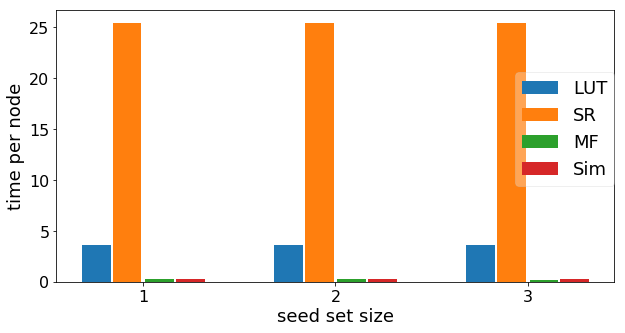

In [228]:
#graph time comparisons
#with open('cell_collective_times.txt') as fp:
#    times=eval(fp.read())
num=3 #how many seed set sizes to compare
#subnetworks=[n for n in networks if times[n.name]]
subnetworks=[n]
print 'Comparing %d networks' % len(subnetworks),n.name

#plot average module lengths
averageSR=[np.mean([times[n.name]['SR'][i]+times[n.name]['SR TN'] for n in subnetworks]) for i in range(1,num+1)] #with DCM TN
#averageSR=[np.mean([times[n.name]['SR'][i] for n in subnetworks]) for i in range(1,num+1)]
#averagedtn=[] #TODO
averageltn=[np.mean([times[n.name]['LUT'][i]+times[n.name]['LUT TN'] for n in subnetworks]) for i in range(1,num+1)] #with LUT TN
#averageltn=[np.mean([times[n.name]['LUT'][i] for n in subnetworks]) for i in range(1,num+1)]
averageMF=[np.mean([times[n.name]['MF'][i] for n in subnetworks]) for i in range(1,num+1)]
averageSim=[np.mean([times[n.name]['BF'][i] if 'BF' in times[n.name] else times[n.name]['Sim'][i] for n in subnetworks]) for i in range(1,num+1)]
xvalues=[1,2,3]
width=0.15
plt.figure(figsize=(10,5))

plt.bar([x-1.5*width-.02 for x in xvalues],averageltn,label='LUT',width=width) #x-2*width-.02
#plt.bar([x-width-.01 for x in xvalues],averagedtn,label='DNF',width=width)
plt.bar([x-.5*width-.01 for x in xvalues],averageSR,label='SR',width=width) #x
plt.bar([x+.5*width+.01 for x in xvalues],averageMF,label='MF',width=width) #x+width+.01
plt.bar([x+1.5*width+.02 for x in xvalues],averageSim,label='Sim',width=width) #x+2*width+.02
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("time per node",fontsize=18)
plt.legend(fontsize=18,framealpha=0.3,bbox_to_anchor=(0.806, 0.32)) #bbox_to_anchor=(1.0, 0.72)
#plt.ylim([-.01,0.8])
#plt.figtext(0.797, 0.69, "*", wrap=True, horizontalalignment='left', fontsize=20)
#plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)

Comparing 62 networks
62


Text(0,0.5,'time per node')

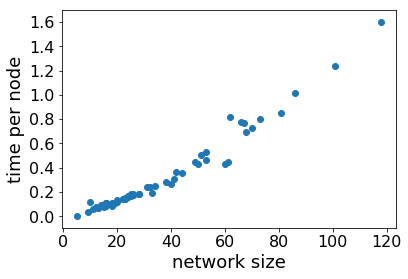

In [181]:
#scatter plot of times
num=1 #which seed set size to compare
subnetworks=[n for n in networks if times[n.name]]
print 'Comparing %d networks' % len(subnetworks)

yvaluesSR=[times[n.name]['SR'][num]+times[n.name]['SR TN'] for n in subnetworks] #with DCM TN
yvaluesltn=[times[n.name]['LUT'][num]+times[n.name]['LUT TN'] for n in subnetworks] #with LUT TN
yvaluesMF=[times[n.name]['MF'][num] for n in subnetworks]
yvaluesSim=[times[n.name]['BF'][num] if 'BF' in times[n.name] else times[n.name]['Sim'][num] for n in subnetworks]
xvalues=[cell_stats[n.name]['size'] for n in subnetworks]
print len(xvalues)

plt.scatter(xvalues,yvaluesSim)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("network size",fontsize=18)
plt.ylabel("time per node",fontsize=18)

In [158]:
#read in modules and compare stats
total=0
num=3
dir_names=['modules_sr/','modules_ltn/','constants_mf/','constants_bf-sim/']
for index,n in enumerate(sorted(networks,key=lambda x: cell_stats[x.name]['size'])[:]):
    if cell_stats[n.name]['max_k']>9: continue
    #read in data
    with open(dir_names[0]+n.name+'.txt') as fp:
        constants_sr=eval(fp.read())
    with open(dir_names[1]+n.name+'.txt') as fp:
        constants_ltn=eval(fp.read())
    with open(dir_names[2]+n.name+'.txt') as fp:
        constants_mf=eval(fp.read())
    with open(dir_names[3]+n.name+'.txt') as fp:
        constants_sim=eval(fp.read())
    print len(constants_sim),

    #get stats
    keys,constants=['SR TN','LUT TN','MF','ground-truth'],[constants_sr,constants_ltn,constants_mf,constants_sim]
    for key,dic in zip(keys,constants):
        stats[n.name][key]['size']={i:np.mean([len(dic[seed]) for seed in dic if len(seed)==i]) for i in range(1,num+1)} #module length
        stats[n.name][key]['similarity']={i:0.0 for i in range(1,num+1)}
        stats[n.name][key]['recall']={i:0.0 for i in range(1,num+1)}
        stats[n.name][key]['precision']={i:0.0 for i in range(1,num+1)}
        
        for i in range(1,num+1):
            #print key,i
            tot_stats={'tps':0.0,'fns':0.0,'fps':0.0,'tns':0.0,'avg_sim':0.0,'accuracy':0.0,'errors':0.0,'recall':0.0,'precision':0.0}
            seeds={seed for seed in dic if len(seed)==i}
            for seed in seeds: #all dicts should have the same keys across methods
                set1,set2=dic[seed],constants_sim[seed] #compare to ground truth
                seed_stats=compute_stats_constants(set1,set2,len(n.nodes)*2) #for binary networks
                for stat in seed_stats: tot_stats[stat]+=seed_stats[stat]
            tot_stats={stat:tot_stats[stat]/len(seeds) for stat in tot_stats}
            #print_stats(tot_stats,len(seeds))
            #print len(seeds),"total seeds"
            stats[n.name][key]['similarity'][i]=tot_stats['avg_sim']
            stats[n.name][key]['recall'][i]=tot_stats['recall']
            stats[n.name][key]['precision'][i]=tot_stats['precision']

    print n.name,stats[n.name]#,stats[n.name]#,rankings[n.name]
    total+=1
    #break
total

130 Cortical Area Development {'LUT TN': {'recall': {1: 0.45499999999999996, 2: 0.5791666666666666, 3: 0.8162500000000004}, 'similarity': {1: 0.45499999999999996, 2: 0.5791666666666666, 3: 0.8162500000000004}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.0, 2: 2.4, 3: 3.9}}, 'MF': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 0.7766666666666666, 2: 0.9683333333333334, 3: 1.0}, 'precision': {1: 0.7766666666666666, 2: 0.9683333333333334, 3: 1.0}, 'size': {1: 4.1, 2: 4.5, 3: 4.8}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 3.2, 2: 4.375, 3: 4.8}}, 'SR TN': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 3.2, 2: 4.375, 3: 4.8}}}
834 Cell Cycle Transcription by Coupled CDK and Network Oscillators {'LUT TN': {'recall': {1: 0.16913580246913582, 2: 0.3548996913580244, 3: 0.5393046107331818}, 'simil

1450 Fanconi anemia and checkpoint recovery {'LUT TN': {'recall': {1: 0.08793040293040295, 2: 0.1881002198859345, 3: 0.26989549339549285}, 'similarity': {1: 0.08793040293040295, 2: 0.1881002198859345, 3: 0.26989549339549285}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.0, 2: 2.0095238095238095, 3: 3.031}}, 'MF': {'recall': {1: 0.30681929181929185, 2: 0.5642003102717392, 3: 0.7268518120768129}, 'similarity': {1: 0.30681929181929185, 2: 0.5642003102717392, 3: 0.7268518120768129}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 3.966666666666667, 2: 6.969047619047619, 3: 9.032}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 12.8, 2: 12.380952380952381, 3: 12.425}}, 'SR TN': {'recall': {1: 0.30681929181929185, 2: 0.5642003102717392, 3: 0.7261994311244319}, 'similarity': {1: 0.30681929181929185, 2: 0.5642003102717392, 3: 0.7259016370067848}, 'precision': {1: 1.0, 2: 1.0, 3: 0.99970

1722 Oxidative Stress Pathway {'LUT TN': {'recall': {1: 0.5940936122203435, 2: 0.5484086005319908, 3: 0.5725439371644861}, 'similarity': {1: 0.5940936122203435, 2: 0.5484086005319908, 3: 0.5725439371644861}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.9473684210526316, 2: 3.91812865497076, 3: 5.951}}, 'MF': {'recall': {1: 0.8723978506873244, 2: 0.8890284519266519, 3: 0.9257320907163014}, 'similarity': {1: 0.8723978506873244, 2: 0.8890284519266519, 3: 0.9257320907163014}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 4.342105263157895, 2: 7.812865497076023, 3: 10.738}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 5.105263157894737, 2: 8.609649122807017, 3: 11.37}}, 'SR TN': {'recall': {1: 0.8723978506873244, 2: 0.8884855498371202, 3: 0.9250888158625002}, 'similarity': {1: 0.8723978506873244, 2: 0.8884855498371202, 3: 0.9250888158625002}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}

2048 HH Pathway of Drosophila Signaling Pathways {'LUT TN': {'recall': {1: 0.5574404761904762, 2: 0.6159564213564206, 3: 0.6426002442002458}, 'similarity': {1: 0.5574404761904762, 2: 0.6159564213564206, 3: 0.6426002442002458}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.2916666666666667, 2: 2.57, 3: 3.758}}, 'MF': {'recall': {1: 0.7964781746031746, 2: 0.9113594516594511, 3: 0.951922402597403}, 'similarity': {1: 0.7964781746031746, 2: 0.9113594516594511, 3: 0.951922402597403}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 2.1875, 2: 4.191, 3: 5.953}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 2.9166666666666665, 2: 4.685, 3: 6.299}}, 'SR TN': {'recall': {1: 0.7964781746031746, 2: 0.9113594516594512, 3: 0.9519224025974029}, 'similarity': {1: 0.7964781746031746, 2: 0.9113594516594512, 3: 0.9519224025974029}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 2.1875, 2: 4.191

2056 Death Receptor Signaling {'LUT TN': {'recall': {1: 0.5984186098681896, 2: 0.5030648807247101, 3: 0.4649148409406434}, 'similarity': {1: 0.5984186098681896, 2: 0.5030648807247101, 3: 0.4649148409406434}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.4285714285714286, 2: 2.925, 3: 4.362}}, 'MF': {'recall': {1: 0.8955498866213152, 2: 0.9127924043822344, 3: 0.9390318492781726}, 'similarity': {1: 0.8955498866213152, 2: 0.9127924043822344, 3: 0.9390318492781726}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 4.017857142857143, 2: 7.977, 3: 11.504}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 4.732142857142857, 2: 8.805, 3: 12.199}}, 'SR TN': {'recall': {1: 0.894359410430839, 2: 0.9085633902635853, 3: 0.9322910224081427}, 'similarity': {1: 0.894359410430839, 2: 0.9085633902635853, 3: 0.9322910224081427}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 4.0, 2: 7.901, 3: 11.3

2082 Apoptosis Network {'LUT TN': {'recall': {1: 0.663566244054049, 2: 0.6149494922090816, 3: 0.6173540007835749}, 'similarity': {1: 0.663566244054049, 2: 0.6149494922090816, 3: 0.6173540007835749}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.975609756097561, 2: 3.82, 3: 6.016}}, 'MF': {'recall': {1: 0.8808987083377323, 2: 0.8888458320575192, 3: 0.92323831663701}, 'similarity': {1: 0.8808987083377323, 2: 0.886540703852391, 3: 0.9176211588957068}, 'precision': {1: 1.0, 2: 0.9976948717948718, 3: 0.9943828422586969}, 'size': {1: 3.2195121951219514, 2: 6.347, 3: 9.967}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 3.817073170731707, 2: 7.234, 3: 10.758}}, 'SR TN': {'recall': {1: 0.8808987083377323, 2: 0.8879575029459703, 3: 0.9217435290449492}, 'similarity': {1: 0.8808987083377323, 2: 0.8879575029459703, 3: 0.9217435290449492}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 3.21

2120 T-LGL Survival Network 2011 {'LUT TN': {'recall': {1: 0.030315275145141096, 2: 0.06424387566151282, 3: 0.0973914618889556}, 'similarity': {1: 0.030315275145141096, 2: 0.06424387566151282, 3: 0.0973914618889556}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.0, 2: 2.01, 3: 3.041}}, 'MF': {'recall': {1: 0.0724325012043643, 2: 0.1436635922649089, 3: 0.23592978204617734}, 'similarity': {1: 0.0724325012043643, 2: 0.1436635922649089, 3: 0.23592978204617734}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 2.975, 2: 5.532, 3: 8.94}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 48.55833333333333, 2: 46.098, 3: 44.488}}, 'SR TN': {'recall': {1: 0.07243250120436426, 2: 0.14366359226490885, 3: 0.23592978204617734}, 'similarity': {1: 0.07243250120436426, 2: 0.14366359226490885, 3: 0.23592978204617734}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 2.975, 2: 5.532, 3: 8.94}}}
2122

2162 Lymphopoiesis Regulatory Network {'LUT TN': {'recall': {1: 0.05729714592161825, 2: 0.10646661174269573, 3: 0.15450980210623277}, 'similarity': {1: 0.05729714592161825, 2: 0.10646661174269573, 3: 0.15450980210623277}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 1.617283950617284, 2: 3.184, 3: 4.857}}, 'MF': {'recall': {1: 0.5295647874942495, 2: 0.595642511807857, 3: 0.6661708931833449}, 'similarity': {1: 0.5242023765039172, 2: 0.5907646255003035, 3: 0.661916803216402}, 'precision': {1: 0.9770151131627739, 2: 0.9855735252064156, 3: 0.9899897965955998}, 'size': {1: 15.61111111111111, 2: 18.687, 3: 21.949}}, 'ground-truth': {'recall': {1: 1.0, 2: 1.0, 3: 1.0}, 'similarity': {1: 1.0, 2: 1.0, 3: 1.0}, 'precision': {1: 1.0, 2: 1.0, 3: 1.0}, 'size': {1: 28.537037037037038, 2: 30.42, 3: 32.092}}, 'SR TN': {'recall': {1: 0.14487601861331137, 2: 0.261055216716824, 3: 0.3716592559753362}, 'similarity': {1: 0.14357647345411706, 2: 0.2589140254371126, 3: 0.3684513620449738}, 'precision':

62

Comparing 62 networks


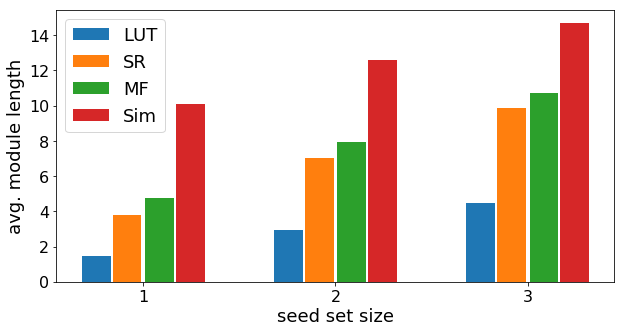

In [133]:
#plot average module lengths
num=3 #how many seed set sizes to compare
subnetworks=[n for n in networks if 'size' in stats[n.name]['SR TN']]
print 'Comparing %d networks' % len(subnetworks)

#plot average module lengths
averageSR=[np.mean([stats[n.name]['SR TN']['size'][i] for n in subnetworks]) for i in range(1,num+1)]
#averagedtn=[] #TODO
averageltn=[np.mean([stats[n.name]['LUT TN']['size'][i] for n in subnetworks]) for i in range(1,num+1)]
averageMF=[np.mean([stats[n.name]['MF']['size'][i] for n in subnetworks]) for i in range(1,num+1)]
averageSim=[np.mean([stats[n.name]['ground-truth']['size'][i] for n in subnetworks]) for i in range(1,num+1)]
xvalues=[1,2,3]
width=0.15
plt.figure(figsize=(10,5))

plt.bar([x-1.5*width-.02 for x in xvalues],averageltn,label='LUT',width=width) #x-2*width-.02
#plt.bar([x-width-.01 for x in xvalues],averagedtn,label='DNF',width=width)
plt.bar([x-.5*width-.01 for x in xvalues],averageSR,label='SR',width=width) #x
plt.bar([x+.5*width+.01 for x in xvalues],averageMF,label='MF',width=width) #x+width+.01
plt.bar([x+1.5*width+.02 for x in xvalues],averageSim,label='Sim',width=width) #x+2*width+.02
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("avg. module length",fontsize=18)
plt.legend(fontsize=18)
#plt.figtext(0.797, 0.69, "*", wrap=True, horizontalalignment='left', fontsize=20)
#plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)

Comparing 62 networks


Text(0,0.5,'avg. precision')

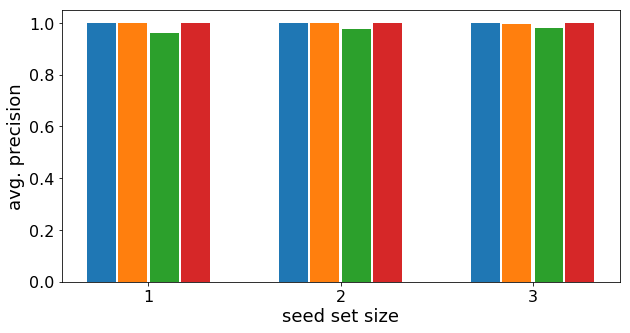

In [196]:
#plot average similarity, recall, or precision
num=3 #how many seed set sizes to compare
stat='precision'
subnetworks=[n for n in networks if stat in stats[n.name]['SR TN']]
print 'Comparing %d networks' % len(subnetworks)

#plot average module lengths
averageSR=[np.mean([stats[n.name]['SR TN'][stat][i] for n in subnetworks]) for i in range(1,num+1)]
#averagedtn=[] #TODO
averageltn=[np.mean([stats[n.name]['LUT TN'][stat][i] for n in subnetworks]) for i in range(1,num+1)]
averageMF=[np.mean([stats[n.name]['MF'][stat][i] for n in subnetworks]) for i in range(1,num+1)]
averageSim=[np.mean([stats[n.name]['ground-truth'][stat][i] for n in subnetworks]) for i in range(1,num+1)]
xvalues=[1,2,3]
width=0.15
plt.figure(figsize=(10,5))

plt.bar([x-1.5*width-.02 for x in xvalues],averageltn,label='LUT',width=width) #x-2*width-.02
#plt.bar([x-width-.01 for x in xvalues],averagedtn,label='DNF',width=width)
plt.bar([x-.5*width-.01 for x in xvalues],averageSR,label='SR',width=width) #x
plt.bar([x+.5*width+.01 for x in xvalues],averageMF,label='MF',width=width) #x+width+.01
plt.bar([x+1.5*width+.02 for x in xvalues],averageSim,label='Sim',width=width) #x+2*width+.02
plt.xticks([1,2,3],[1,2,3],fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("seed set size",fontsize=18)
plt.ylabel("avg. "+stat,fontsize=18)
#plt.legend(fontsize=18)
#plt.figtext(0.797, 0.69, "*", wrap=True, horizontalalignment='left', fontsize=20)
#plt.figtext(0.837, 0.78, "*", wrap=True, horizontalalignment='left', fontsize=20)